PLP PM - Conversational natural language query of relational and non-relational databases.

Notebook for text2GQL training

# Load modules

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
#!pip install neo4j

In [1]:
#!python -m spacy download en_core_web_sm

In [ ]:
!pip install farm-haystack

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 736 kB 4.0 MB/s 
     |████████████████████████████████| 385 kB 52.3 MB/s 
     |████████████████████████████████| 85 kB 4.5 MB/s 
     |████████████████████████████████| 2.1 MB 34.0 MB/s 
     |████████████████████████████████| 10.7 MB 30.8 MB/s 
     |████████████████████████████████| 228 kB 39.6 MB/s 
     |████████████████████████████████| 50 kB 5.1 MB/s 
     |████████████████████████████████| 43 kB 1.7 MB/s 
     |████████████████████████████████| 163 kB 40.0 MB/s 
     |████████████████████████████████| 981 kB 42.7 MB/s 
     |████████████████████████████████| 5.6 MB 39.6 MB/s 
     |████████████████████████████████| 4.7 MB 42.6 MB/s 
     |████████████████████████████████| 17.0 MB 36 kB/s 
     |████████████████████████████████| 6.6 MB 41.5 MB/s 
     |████████████████████████████████| 172 kB 42.1 MB/s 
     |████████████████████████████████

In [ ]:
import spacy
import spacy_component
import transformers

nlp = spacy.load("en_core_web_sm")

nlp.add_pipe("rebel", after="senter", config={
    'device':0, # Number of the GPU, -1 if want to use CPU
    'model_name':'Babelscape/rebel-large'} # Model used, will default to 'Babelscape/rebel-large' if not given
    )
input_sentence = "Gràcia is a district of the city of Barcelona, Spain. It comprises the neighborhoods of Vila de Gràcia, Vallcarca i els Penitents, El Coll, La Salut and Camp d'en Grassot i Gràcia Nova. Gràcia is bordered by the districts of Eixample to the south, Sarrià-Sant Gervasi to the west and Horta-Guinardó to the east. A vibrant and diverse enclave of Catalan life, Gràcia was an independent municipality for centuries before being formally annexed by Barcelona in 1897 as a part of the city's expansion."
                 
doc = nlp(input_sentence)
doc_list = nlp.pipe([input_sentence])
for value, rel_dict in doc._.rel.items():
    print(f"{value}: {rel_dict}")

# Text processing for self-supervised training

## REBEL relation extraction

In [ ]:
import json
import os

os.getcwd()

folder = "/content/drive/MyDrive/ISS/PLP PM/financial_news/financial_news/"

os.chdir(folder)

os.getcwd()

'/content/drive/MyDrive/ISS/PLP PM/financial_news/financial_news'

In [ ]:
import pickle

with open('filedocs.pkl','rb') as f:
    loaded_obj = pickle.load(f)

rebeldoc = loaded_obj['rebeldoc']
rebelents = loaded_obj['rebelents']
QAdocs = loaded_obj['QAdocs']
articlelist = loaded_obj['articlelist']

In [ ]:
#print(rebeldoc)
print(len(rebeldoc))
#print(rebelents)
print(len(rebelents))
#print(articlelist)
print(len(articlelist))

33063
100946
10000


In [ ]:
directory = "/content/drive/MyDrive/ISS/PLP PM/financial_news/financial_news"

nlp1 = spacy.load("en_core_web_sm")

# rebeldoc = []
# rebelents = []
# QAdocs = []
# articlelist = []

for i,filename in enumerate(os.listdir(directory)):
  if i<10000:
    if filename not in articlelist:
      print(i)
      #print("------------------------------------------------")
      f = open(filename,  encoding="utf8")
      articlelist.append(filename)
      data = json.load(f)
      doc = nlp1(data['text'])
      #print(doc)
      for sent in doc.sents:  
        input_sentence = sent.text
        try:
          doc = nlp(input_sentence)
          doc_list = nlp.pipe([input_sentence])
          if len(doc) > 10:
            #print(input_sentence)
            rebelents.append([word.text for word in doc.ents])
            entities = [word.text for word in doc.ents]
            for value, rel_dict in doc._.rel.items():
              if (str(rel_dict['head_span']) in entities) and (str(rel_dict['tail_span']) in entities) and (str(rel_dict['head_span']) != str(rel_dict['tail_span'])):
                  #print(f"{value}: {rel_dict}")
                  #print("=========")
                  rebeldoc.append({'relation':str(rel_dict['relation']),'head_span':str(rel_dict['head_span']),'tail_span':str(rel_dict['tail_span'])})
                  QAdocs.append({"content":input_sentence})
                  
        except:
          continue
    

### Export extracted data

In [ ]:
import pickle

with open('filedocs.pkl', 'wb') as f:
    pickle.dump({'rebeldoc':rebeldoc,'rebelents':rebelents,'QAdocs':QAdocs,'articlelist':articlelist}, f)

### Import extracted data

In [ ]:
import pickle

with open('filedocs 10000art 33063QAdoc.pkl','rb') as f:
    loaded_obj = pickle.load(f)

rebeldoc = loaded_obj['rebeldoc']
rebelents = loaded_obj['rebelents']
QAdocs = loaded_obj['QAdocs']
articlelist = loaded_obj['articlelist']


In [ ]:
classlist = []
for i,v in enumerate(rebeldoc):
  classlist.append(v['relation'])

In [ ]:
print(classlist)

import collections
counter = collections.Counter(classlist)
counter.most_common()

['owner of', 'owned by', 'employer', 'employer', 'employer', 'located in the administrative territorial entity', 'employer', 'followed by', 'follows', 'named after', 'owner of', 'owned by', 'has part', 'part of', 'owned by', 'product or material produced', 'significant event', 'winner', 'parent organization', 'subsidiary', 'founded by', 'employer', 'child', 'father', 'member of political party', 'member of political party', 'author', 'spouse', 'spouse', 'subsidiary', 'parent organization', 'country', 'work location', 'participant', 'twinned administrative body', 'twinned administrative body', 'employer', 'founded by', 'employer', 'country', 'work period (start)', 'employer', 'country', 'published in', 'country', 'country', 'has part', 'member of', 'employer', 'original broadcaster', 'member of', 'employer', 'original broadcaster', 'presenter', 'country', 'country', 'inception', 'twinned administrative body', 'twinned administrative body', 'contains administrative territorial entity', '

[('country', 3336),
 ('employer', 2195),
 ('parent organization', 1779),
 ('shares border with', 1748),
 ('diplomatic relation', 1598),
 ('subsidiary', 1583),
 ('owned by', 1348),
 ('located in the administrative territorial entity', 1338),
 ('spouse', 1230),
 ('contains administrative territorial entity', 974),
 ('twinned administrative body', 946),
 ('member of political party', 908),
 ('owner of', 889),
 ('headquarters location', 861),
 ('member of sports team', 798),
 ('founded by', 676),
 ('has part', 601),
 ('country of citizenship', 576),
 ('part of', 555),
 ('inception', 527),
 ('capital', 505),
 ('member of', 454),
 ('chairperson', 438),
 ('different from', 351),
 ('opposite of', 347),
 ('sibling', 321),
 ('residence', 309),
 ('place of birth', 304),
 ('manufacturer', 297),
 ('followed by', 277),
 ('product or material produced', 246),
 ('developer', 227),
 ('follows', 225),
 ('work location', 207),
 ('cast member', 174),
 ('stock exchange', 150),
 ('capital of', 147),
 ('poin

## Haystack question-answer generation

In [ ]:
import logging

logging.basicConfig(format="%(levelname)s - %(name)s -  %(message)s", level=logging.WARNING)
logging.getLogger("haystack").setLevel(logging.INFO)

In [ ]:
from pprint import pprint
from tqdm import tqdm
from haystack.nodes import QuestionGenerator, BM25Retriever, FARMReader
from haystack.document_stores import ElasticsearchDocumentStore
from haystack.pipelines import (
    QuestionGenerationPipeline,
    RetrieverQuestionGenerationPipeline,
    QuestionAnswerGenerationPipeline,
)
from haystack.utils import launch_es, print_questions

In [ ]:
import os

#folder = "/content/drive/MyDrive/ISS/PLP PM/news_financial"

folder = "/content/"

os.chdir(folder)

os.getcwd()

'/content'

Install Elasticsearch for Haystack 

In [ ]:
! wget https://artifacts.elastic.co/downloads/elasticsearch/elasticsearch-7.9.2-linux-x86_64.tar.gz -q
! tar -xzf elasticsearch-7.9.2-linux-x86_64.tar.gz
! chown -R daemon:daemon elasticsearch-7.9.2

import os
from subprocess import Popen, PIPE, STDOUT

es_server = Popen(
    ["elasticsearch-7.9.2/bin/elasticsearch"], stdout=PIPE, stderr=STDOUT, preexec_fn=lambda: os.setuid(1)  # as daemon
)
# wait until ES has started
! sleep 30

Question-answer generation

In [ ]:
headspan = [str(triplet['head_span']) for triplet in rebeldoc]
tailspan = [str(triplet['tail_span']) for triplet in rebeldoc]
rellabel = [str(triplet['relation']) for triplet in rebeldoc]

In [ ]:
QAdocs1 = QAdocs
# Initialize document store and write in the documents
document_store = ElasticsearchDocumentStore()
document_store.write_documents(QAdocs1)

# Initialize Question Generator
question_generator = QuestionGenerator()

INFO:haystack.telemetry:Haystack sends anonymous usage data to understand the actual usage and steer dev efforts towards features that are most meaningful to users. You can opt-out at anytime by calling disable_telemetry() or by manually setting the environment variable HAYSTACK_TELEMETRY_ENABLED as described for different operating systems on the documentation page. More information at https://haystack.deepset.ai/guides/telemetry
INFO:haystack.modeling.utils:Using devices: CUDA:0 - Number of GPUs: 1


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
Using sep_token, but it is not set yet.


In [ ]:
reader = FARMReader("deepset/roberta-base-squad2")
qag_pipeline = QuestionAnswerGenerationPipeline(question_generator, reader)

QArel = []

rebeldocind = [v['content'] for v in QAdocs]

for idx, document in enumerate(tqdm(document_store)):
    if idx < 18687 and idx >= 0:
      print(f"\n * Generating questions and answers for document {idx}: {document.content[:100]}...\n")
      result = qag_pipeline.run(documents=[document])
      sentsearch = document.content
      rebindex = [i for i,d in enumerate(rebeldocind) if d==sentsearch]
      print(rebindex)
      headspan1 = [headspan[ind] for ind in rebindex]
      tailspan1 = [tailspan[ind] for ind in rebindex]
      rellabel1 = [rellabel[ind] for ind in rebindex]
      for i,v in enumerate(result['queries']):
        try:
          query = nlp(v)
          entities = [word.text for word in query.ents]
          print(entities)
          for ent in entities:
            if ent in headspan1:
              posent = headspan1.index(ent)
              ans = getattr(result['answers'][i][0], "answer")
              if ans == tailspan1[posent]:
                print("Head: "+ ent + ", Tail: "+ ans)
                QArel.append({'Sentence':sentsearch,'Question':v,'Relation':rellabel1[posent],'Headspan':ent,'Tailspan':ans})
              else: 
                print("Tail not found")
            else:
              print("Head not found")
        except:
          continue


INFO:haystack.modeling.utils:Using devices: CUDA:0 - Number of GPUs: 1
INFO:haystack.modeling.utils:Using devices: CUDA:0 - Number of GPUs: 1


INFO:haystack.modeling.model.language_model: * LOADING MODEL: 'deepset/roberta-base-squad2' (Roberta)


INFO:haystack.modeling.model.language_model:Auto-detected model language: english
INFO:haystack.modeling.model.language_model:Loaded 'deepset/roberta-base-squad2' (Roberta model) from model hub.


INFO:haystack.modeling.utils:Using devices: CUDA:0 - Number of GPUs: 1
INFO:haystack.modeling.infer:Got ya 2 parallel workers to do inference ...
INFO:haystack.modeling.infer: 0     0  
INFO:haystack.modeling.infer:/w\   /w\ 
INFO:haystack.modeling.infer:/'\   / \ 
7985it [00:17, 639.40it/s]


 * Generating questions and answers for document 8000: This story was generated by Automated Insights ( http://automatedinsights.com/ap ) using data from Z...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.29 Batches/s]


[7429, 7430, 7512, 7513, 11474, 11475, 16976, 16977, 21145, 21146, 27824, 27825]
['Zacks Investment Research']
Head: Zacks Investment Research, Tail: Automated Insights

 * Generating questions and answers for document 8001: Joe Root could score a “scary” amount of runs when he starts converting his half-centuries into cent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.15 Batches/s]


[27826]
['Joe Root', 'half-centuries', 'centuries']
Tail not found
Head not found
Head not found
['England', 'Joe Root', 'fourth']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8002: “I think the position we were in tonight before those last two wickets, I think we would have been a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 53.54 Batches/s]


[27827]

 * Generating questions and answers for document 8003: Active Companies in the markets this week include: Sun Pacific Holding Corp. (OTC: SNPW), Pareteum C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.00 Batches/s]


[27828]
["Pareteum Corporation's", 'NYSE']
Head not found
Head not found
['the NASDAQ of Marathon Patent Group']
Head not found
['SunPower Corporation']
Head not found
['LOI']
Head not found


/usr/local/lib/python3.7/dist-packages/transformers/pipelines/base.py:1039: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  UserWarning,


[]

 * Generating questions and answers for document 8004: Read this and more news for Sun Pacific at: http://www.marketnewsupdates.com/news/snpw.html
"We are ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.43 Batches/s]


[27829]
['Sun Pacific']
Head: Sun Pacific, Tail: Nicholas B Campanella
[]

 * Generating questions and answers for document 8005: In other industry developments from around the markets:
Pareteum Corporation (NYSE: TEUM) closed up ...



7985it [00:27, 639.40it/s]
Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.72 Batches/s]


[27830]


8006it [00:28, 16.16it/s] 

['Pareteum Corporation']
Tail not found

 * Generating questions and answers for document 8006: The Compounded Annual Growth Rate (CAGR) of Pareteum's 36 Month Contractual Revenue Backlog is 389% ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 51.07 Batches/s]


[27831]


8007it [00:30, 13.51it/s]

['Pareteum', '36 Month']
Tail not found
Head not found

 * Generating questions and answers for document 8007: In other energy news of note:
In partnership with leading architect Dan Brunn, SunPower Corporation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.41 Batches/s]


[27832]
['10-kilowatt']
Head not found
["Dan Brunn's"]
Head not found

 * Generating questions and answers for document 8008: Tennis - ATP World Tour Finals - The O2 Arena, London, Britain - November 17, 2017 Austria's Dominic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.38 Batches/s]


[27833, 27834, 27835]
['the ATP World Tour Finals']
Head not found
['O2 Arena']
Head not found
['Frenchman', '2013']
Head not found
Head: 2013, Tail: Richard Gasquet

 * Generating questions and answers for document 8009: Yet world number 31 Gasquet, the fifth seed, was surprisingly beaten 6-3 6-4 in the late match by Gr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[27836]
['fifth']
Head not found
['19 year old', 'Athens']
Head not found
Head not found

 * Generating questions and answers for document 8010: The Spanish duo joined high-ranking players Pablo Carreno Busta, Tomas Berdych, Albert Ramos-Vinolas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.34 Batches/s]


[27837, 27838, 27839]

 * Generating questions and answers for document 8011: Reporting by Aditi Prakash in Bengaluru,; Editing by Ian Chadband...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[27840]
['Aditi', 'Bengaluru']
Head not found
Head not found
['Ian Chadband']
Head not found

 * Generating questions and answers for document 8012: Tyson has not yet announced a scheduled opening date for Tyson Ranch....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.16 Batches/s]


[27841]

 * Generating questions and answers for document 8013: PREMIUM DEMAND 
Aldi said its sales rose over 15 percent in December year-on-year, taking the annual...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.65 Batches/s]


[27847, 27848, 27849]
['December']
Head not found
['annual', 'UK', 'Ireland', 'first']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8014: It’s also added some heavy hitters like F-Prime Capital executive partner Carl Byers and Anthem vet ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.82 Batches/s]


[27857]
[]
['Anthem']
Head: Anthem, Tail: Ken Goulet

 * Generating questions and answers for document 8015: John Foley and Tom Buerkle discuss how this activity sets up an epic tug-of-war between cost-cutting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 57.55 Batches/s]


[26886, 26887, 27858, 27859]
['John Foley', 'Tom Buerkle']
Tail not found
Tail not found

 * Generating questions and answers for document 8016: John Foley and Tom Buerkle discuss how this activity sets up an epic tug-of-war between cost-cutting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 54.21 Batches/s]


[27860, 27861]
['John Foley', 'Tom Buerkle']
Tail not found
Tail not found

 * Generating questions and answers for document 8017: Winter Storm Grayson disrupts air travel 1 Hour Ago Gordon Bethune, CNBC contributor and former Cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[27862]
[]
['Gordon Bethune']
Head not found
['CNBC']
Head not found

 * Generating questions and answers for document 8018: REUTERS/Mario Anzuoni/File Photo 
Powered by a 72 percent increase in on-demand audio streaming, eig...



8007it [00:47, 13.51it/s]
Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.41 Batches/s]


[27863]
['10', 'R&B']
Head not found
Head not found
["Kendrick Lamar's", "Bruno Mars'", '24K Magic']
Head not found
Head not found
Tail not found
["Nielsen Music's", '2017', 'year-end']
Head not found
Head not found
Head not found
["Nielsen Music's", '2017', 'year-end']
Head not found
Head not found
Head not found


8019it [00:50,  3.73it/s]

['Nielsen', 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 8019: Drew Gilpin Faust
President, Harvard University; author, “This Republic of Suffering”
First job: HUD...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[27864]
['Harvard University']
Head not found
['Drew Gilpin Faust']
Tail not found


8020it [00:52,  3.43it/s]

[]

 * Generating questions and answers for document 8020: Sheytanian joined JHRPS in 1996 and most recently served as director and strategic relationship mana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.97 Batches/s]


[27865, 27866]
['Sheytanian', 'JHRPS']
Head not found
Tail not found
[]
[]

 * Generating questions and answers for document 8021: About John Hancock and Manulife
John Hancock is a division of Manulife Financial Corporation, a lead...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.55 Batches/s]


[27867, 27868]
['John Hancock']
Head: John Hancock, Tail: Manulife Financial Corporation

 * Generating questions and answers for document 8022: Manulife Financial Corporation trades as MFC on the TSX, NYSE, and PSE, and under 945 on the SEHK....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.24 Batches/s]


[27869, 27870]
['Manulife Financial Corporation', 'TSX', 'NYSE']
Tail not found
Head not found
Head not found
['MFC', 'SEHK']
Head not found
Head not found

 * Generating questions and answers for document 8023: Additional information about John Hancock may be found at johnhancock.com .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 54.34 Batches/s]


[27871, 27872]

 * Generating questions and answers for document 8024: Tesla Inc delivered 1,550 of its new Model 3 electric cars in the fourth quarter, missing Wall Stree...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[27873]
['3', 'Tesla', 'the fourth quarter']
Head not found
Head not found
Head not found
['Tesla']
Head not found

 * Generating questions and answers for document 8025: In November, Tesla pushed back its target of producing 5,000 units of Model 3 sedan per week by Dece...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[27875]
['Tesla', 'December']
Head not found
Head not found
['Tesla', '5,000', '3']
Head not found
Head not found
Head not found
['5,000', '3', 'the first quarter of 2018']
Head not found
Head not found
Head not found
['Tesla']
Head not found

 * Generating questions and answers for document 8026: January 4, 2018 / 6:07 AM / Updated an hour ago Indonesia shrinks danger zone around grumbling Bali ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 52.21 Batches/s]


[27877, 27878]
['Indonesia', 'Bali']
Tail not found
Tail not found

 * Generating questions and answers for document 8027: Indonesia shrank the exclusion zone around a grumbling volcano on the resort island of Bali on Thurs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.77 Batches/s]


[27879, 27880]
['Indonesia', 'Bali']
Tail not found
Tail not found
['Indonesia']
Tail not found

 * Generating questions and answers for document 8028: file photo - A plume of smoke above Mount Agung volcano is illuminated at sunset as seen from Amed, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.28 Batches/s]


[27881, 27882, 27883, 27884, 27885, 27886, 27887]


8020it [01:07,  3.43it/s]

[]


8029it [01:08,  1.95it/s]

['Mount Agung']
Tail not found

 * Generating questions and answers for document 8029: Four Hills champion Kamil Stoch is on the verge of retaining the title after continuing his stellar ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.65 Batches/s]


[27890]
['Four Hills']
Head: Four Hills, Tail: Kamil Stoch


8030it [01:10,  1.85it/s]

['Kamil Stoch', 'third', 'four']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8030: German Richard Freitag, who was Stoch’s main competitor for the title, ended his campaign early afte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.74 Batches/s]


[27891]

 * Generating questions and answers for document 8031: Norway’s Daniel Andre Tande was second after jumping 129.5 meters in his first attempt and 125 in hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.22 Batches/s]


[27892]
['Daniel Andre Tande', 'first']
Tail not found
Head not found
['Tande', 'first']
Head not found
Head not found

 * Generating questions and answers for document 8032: German Andreas Wellinger rounded out the podium after leaping 133 and 126 meters to notch 253.5 poin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.03 Batches/s]


[27893]
['Andreas Wellinger']
Tail not found

 * Generating questions and answers for document 8033: Reporting by Aditi Prakash in Bengaluru, editing by Pritha Sarkar
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.54 Batches/s]


[12614, 27894]
['Aditi', 'Bengaluru']
Head not found
Head not found

 * Generating questions and answers for document 8034: TERMINATED DISTRIBUTION RIGHTS AGREEMENT FOR GERMAN BUILT SETRA MOTOR COACHES IN U.S., CANADA EFFECT...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.81 Batches/s]


[27895, 27896]
['GERMAN BUILT SETRA MOTOR COACHES', 'U.S.', 'CANADA', 'JUNE 29, 2018', 'DISTRIBUTION RIGHTS AGREEMENT']
Head not found
Tail not found
Tail not found
Head not found
Head not found
[]
['MCI']
Head not found

 * Generating questions and answers for document 8035: Wealthy Republican donor Rebekah Mercer will not support former White House chief strategist Steve B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.84 Batches/s]


[27897, 27898]
['Rebekah Mercer', 'White House']
Tail not found
Head not found
['Republican']
Head not found

 * Generating questions and answers for document 8036: The Breitbart News executive chairman irked Mercer, his top financial backer, when he told other don...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.66 Batches/s]


[27899, 27900]
["Breitbart News'"]
Head not found

 * Generating questions and answers for document 8037: Bannon supported Republican Roy Moore, the ex-judge who lost to Democrat Doug Jones in the deep-red ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.77 Batches/s]


[27901]
["Roy Moore's"]
Head not found
['Bannon']
Head not found

 * Generating questions and answers for document 8038: "
Trump's personal attorney sent a cease and desist letter to Wolff and his publisher, Henry Holt & ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.94 Batches/s]


[27902]


8039it [01:28,  1.13it/s]

['Wolff']
Tail not found
['Trump', 'Wolff']
Head not found
Tail not found

 * Generating questions and answers for document 8039: Mercer, a major GOP donor, is the daughter of hedge fund manager Robert Mercer....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.44 Batches/s]


[27903]


8040it [01:29,  1.13it/s]

['Mercer']
Head not found

 * Generating questions and answers for document 8040: A U.S. jury on Wednesday found Atilla, an executive at Turkey’s majority state-owned Halkbank ( HALK...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.54 Batches/s]


[27904]
['Iran', 'U.S.']
Head not found
Head not found
['Atilla']
Head not found

 * Generating questions and answers for document 8041: January 4, 2018 / 4:57 AM / Updated 7 hours ago Cricket-Australia peg back England after rain delay ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 61.12 Batches/s]


[27905]
['Cricket-Australia', 'England', 'Nick Mulvenney', '3', 'SYDNEY', 'Jan 4', 'Reuters']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8042: Australia took two wickets in the hour before tea, including that of Alastair Cook, to leave England...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[27269, 27906]
['two', 'England', '122', 'three']
Head not found
Head not found
Head not found
Head not found
['fifth']
Head not found

 * Generating questions and answers for document 8043: After the opening session had been washed out by light rain, Mark Stoneman and James Vince both made...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.83 Batches/s]


[27270, 27907]
['Mark Stoneman', 'James Vince']
Head not found
Tail not found
['Pat Cummins']
Head not found

 * Generating questions and answers for document 8044: Vince was on 25, having put on 60 with Cook, when his attempt at cutting a wide Cummins delivery res...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.38 Batches/s]


[27271, 27908]
['Vince', 'Cummins']
Head not found
Tail not found

 * Generating questions and answers for document 8045: Both teams made one change to their sides with England handing leg spinner Mason Crane his test debu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[27272, 27909]
['England']
Head not found
['England', 'first']
Head not found
Head not found

 * Generating questions and answers for document 8046: SHARES REBOUND More than $10 billion has been wiped off Steinhoff’s market value following the discl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.54 Batches/s]


[27912, 27913]
['Steinhoff']
Head not found
['Markus Jooste', 'Christo Wiese']
Tail not found
Tail not found

 * Generating questions and answers for document 8047: This week UK subsidiary Poundland reported strong Christmas trading and European unit, Pepkor Europe...



8040it [01:39,  1.13it/s]
Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.23 Batches/s]


[27914, 27915, 27916, 27917]
['European', 'Poundland', 'Dealz']
Head not found
Head: Poundland, Tail: Pepkor Europe
Head: Dealz, Tail: Pepkor Europe
['Pepkor Europe']
Tail not found


8048it [01:42,  1.11s/it]

['UK', 'Christmas']
Head not found
Head not found

 * Generating questions and answers for document 8048: WILL SERVE AS CFO OF CNX MIDSTREAM (CNXM) 
* SAYS AFTER DEAL CLOSE, DEIULIIS, RUSH, TIMOTHY DUGAN TO...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.97 Batches/s]


[27919, 27920]
['CNX MIDSTREAM']
Head: CNX MIDSTREAM, Tail: CNXM
['Midstrame']
Head not found


8049it [01:44,  1.18s/it]


 * Generating questions and answers for document 8049: Upon completion of the transaction, the Apollo and Värde led investor group will own approximately 4...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.17 Batches/s]


[27921, 27922]
['OneMain', 'Apollo', 'Värde']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8050: View the full release here: http://www.businesswire.com/news/home/20180104005486/en/
“We are tremend...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.26 Batches/s]


[27923]
[]
['Matthew Michelini']
Head not found

 * Generating questions and answers for document 8051: “We are delighted to be making a strategic investment in OneMain,” said Aneek Mamik, North America H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.13 Batches/s]


[27924]
['the North America Head', 'Värde Partners']
Head not found
Head not found

 * Generating questions and answers for document 8052: “We look forward to collaborating with the highly experienced teams at OneMain and Apollo to grow an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 58.85 Batches/s]


[27925]

 * Generating questions and answers for document 8053: “We appreciate all of the support and insight that Fortress has provided as a key partner and majori...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.66 Batches/s]


[27926]
['OneMain Holdings']
Head: OneMain Holdings, Tail: Jay Levine

 * Generating questions and answers for document 8054: “With a clear path forward to achieve our long-term objectives, we are confident that the thought le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.25 Batches/s]


[27927, 27928]
['Barclays']
Head not found
['Sidley Austin']
Head not found
['Apollo', 'Värde']
Tail not found
Tail not found

 * Generating questions and answers for document 8055: Including its commitment to OneMain, Apollo Fund VIII has committed approximately 88% of its availab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.00 Batches/s]


[27929]
['Apollo Fund', 'OneMain']
Head not found
Tail not found

 * Generating questions and answers for document 8056: Now in its third decade, Värde employs more than 270 people globally with regional headquarters in M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.85 Batches/s]


[27930]
['Värde']
Tail not found
['Värdes']
Head not found

 * Generating questions and answers for document 8057: Salomon Chertorivski, who is seeking the nomination of the Party of the Democratic Revolution (PRD) ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.44 Batches/s]


[27931, 27932, 27933]
['the Party of the Democratic Revolution (PRD', 'Mexico City']
Head not found
Head: Mexico City, Tail: Salomon Chertorivski
['Salomon Chertorivski']
Tail not found

 * Generating questions and answers for document 8058: REUTERS/Jonathan Ernst Mattis also credited U.S.-championed international pressure on North Korea ov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.19 Batches/s]
8049it [01:57,  1.18s/it]

[27934, 27935]
['U.S.', 'North Korea']
Head not found
Tail not found


8059it [01:58,  1.27s/it]


 * Generating questions and answers for document 8059: “I wouldn’t read too much into it because we don’t know if it’s a genuine olive branch,” Mattis said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.52 Batches/s]


[27936]


8060it [01:59,  1.25s/it]

['Mattis', 'Pentagon']
Tail not found
Head not found

 * Generating questions and answers for document 8060: Mattis said the decision to delay the drills until after the Olympics and subsequent Paralympics was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.70 Batches/s]


[27937, 27938]
['Mattis', 'Olympics']
Head not found
Tail not found

 * Generating questions and answers for document 8061: (CNBC) 
St. Louis Fed President James Bullard is set to deliver a keynote address at Meltzer's Contr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.25 Batches/s]


[27939]
['the St. Louis Fed']
Head not found
['Meltzer', 'Contributions to Monetary Economics and Public Policy']
Head not found
Head not found

 * Generating questions and answers for document 8062: (AP) 
Merrill Lynch financial advisors cannot buy bitcoin-related investments for their clients, acc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 54.19 Batches/s]


[27940]

 * Generating questions and answers for document 8063: Intel (INTC) CEO Brian Krzanich sold a large chunk of his stake in the company after the chipmaker w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.00 Batches/s]


[27941]
['Brian Krzanich']
Tail not found
['Intel']
Head not found

 * Generating questions and answers for document 8064: Lottery players have another chance Saturday, with the Powerball jackpot ballooning to an estimated ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.22 Batches/s]


[27942]
['Powerball']
Head not found
[]

 * Generating questions and answers for document 8065: WIRE)-- Compañia de Minas Buenaventura S.A.A. (“Buenaventura” or “the Company”) (NYSE: BVN; Lima Sto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[27943]
['Buenaventura']
Head not found

 * Generating questions and answers for document 8066: Dr. Bernex holds a Bachelor’s degree in Geography from the Paul Valéry University in Montpellier, Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.05 Batches/s]


[27944]


8060it [02:10,  1.25s/it]

['Bernex', 'Bachelor', 'Geography']
Head not found
Head not found
Head not found


8067it [02:10,  1.35s/it]

['Paul Valéry University']
Head not found

 * Generating questions and answers for document 8067: Buenaventura currently operates several mines in Peru (Orcopampa*, Uchucchacua*, Mallay*, Julcani*, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.67 Batches/s]


[27945, 27946, 27947, 27948, 27949]
['Buenaventura', 'Peru']
Head not found
Head not found


8068it [02:11,  1.35s/it]

['Buenventura']
Head not found

 * Generating questions and answers for document 8068: Authorities arrested the defendants in raids across the country, from the capital Cairo to the north...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.94 Batches/s]


[27950, 27951]
['Egypt']
Head not found
[]

 * Generating questions and answers for document 8069: Reporting by Ahmed Tolba and Haitham Ahmed; Writing by Nadine Awadalla, Editing by William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[27952, 27953]
[]
[]

 * Generating questions and answers for document 8070: KUALA LUMPUR (Reuters) - Large initial public offerings (IPOs) in Malaysia could raise more than 10 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.12 Batches/s]


[27954]
['more than 10 billion', 'the first half of the year']
Head not found
Head not found
[]

 * Generating questions and answers for document 8071: Samling Group has hired Credit Suisse, Maybank and OCBC to arrange an IPO for its automobile busines...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.85 Batches/s]


[27955]
['Credit Suisse', 'Maybank', 'OCBC', 'IPO']
Head not found
Head not found
Head not found
Head not found
['1 billion']
Head not found

 * Generating questions and answers for document 8072: “We do expect the first half should see more than 10 billion ringgit raised (from jumbo IPOs),” Dere...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.35 Batches/s]


[27956]
['Equity Capital Markets', 'CIMB']
Head not found
Head not found

 * Generating questions and answers for document 8073: CIMB Chief Executive Zafrul Aziz said he expects bond and sukuk issues in Malaysia to reach 90 billi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 65.18 Batches/s]


[27957]


8074it [02:21,  1.47s/it]

['Zafrul Aziz', 'Malaysia', 'this year']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8074: CIMB, Malaysia’s second-largest lender, reported a 10.7 percent rise in quarterly profit in November...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.64 Batches/s]


[27958]
['Malaysia', 'second']
Head not found
Head not found


8075it [02:23,  1.48s/it]

['CIMB', 'quarterly', 'November']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8075: Karen Katz, a Neiman lifer who has served as CEO and president since 2010, is stepping aside and wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[27959]
['Neiman', '2010']
Head not found
Head not found
['Karen Katz']
Tail not found
["Karen Katz's"]
Head not found

 * Generating questions and answers for document 8076: The same day, Chinese Foreign Ministry spokesman Geng Shuang defended Islamabad's counter-terrorism ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.56 Batches/s]


[27960, 27961]
['Islamabad']
Head not found
[]

 * Generating questions and answers for document 8077: "Pakistan and the U.S. have had a fraught relationship for years, but the big change recently has be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.18 Batches/s]


[27962, 27963]
['U.S.', 'years']
Head not found
Head not found
['Asia', 'the Economist Intelligence Unit']
Head not found
Head not found

 * Generating questions and answers for document 8078: "China has really gone hard in cementing its existing relationship with Pakistan, it's really the on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.51 Batches/s]


[27964, 27965]
['China', 'Pakistan']
Tail not found
Tail not found


8079it [02:29,  1.51s/it]

['China']
Head: China, Tail: Pakistan

 * Generating questions and answers for document 8079: "Pakistan balks far less at reductions in American aid, which, as the former points out, has dwindle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.87 Batches/s]


[27966, 27967]

 * Generating questions and answers for document 8080: "All this means that America has far less leverage over Pakistan." 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 55.11 Batches/s]


[27968, 27969]
['America']
Head: America, Tail: Pakistan

 * Generating questions and answers for document 8081: For Beijing's part, a Monday editorial published by Chinese state-run news outlet Global Times said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.68 Batches/s]


[27970]
['Chinese', 'Monday']
Head not found
Head not found


8082it [02:33,  1.40s/it]

['Global Times', 'Beijing']
Tail not found
Head not found

 * Generating questions and answers for document 8082: Ultimately, Washington needs Pakistani cooperation to address its concerns about Afghanistan and Ira...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.96 Batches/s]


[27971, 27972]
['Pakistani', 'Afghanistan', 'Iran']
Head not found
Tail not found
Tail not found
['Baptist', 'Trump']
Head not found
Head not found

 * Generating questions and answers for document 8083: Sears is closing over 100 more stores Sears told its employees Thursday that it will be shuttering o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.46 Batches/s]


[27973]
['Sears']
Tail not found


8084it [02:36,  1.50s/it]


 * Generating questions and answers for document 8084: That consists of 64 Kmart stores and 39 Sears stores, all of which are expected to close between ear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.64 Batches/s]


[27974, 27975]
['Kmart']
Tail not found
['Sears', 'March']
Tail not found
Head not found

 * Generating questions and answers for document 8085: 29 Mins Ago | 01:21 
Sears Holdings , parent company of Sears and Kmart stores, told its employees T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[27976, 27977, 27978]
['Sears', 'Kmart']
Head not found
Head: Kmart, Tail: Sears Holdings


8086it [02:40,  1.61s/it]

['Sear', 'this year']
Head not found
Head not found

 * Generating questions and answers for document 8086: That consists of 64 Kmart stores and 39 Sears stores, all of which are expected to shut between earl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.44 Batches/s]


[27979]
['Kmart']
Tail not found
['Sears']
Head not found


8087it [02:43,  1.70s/it]

[]

 * Generating questions and answers for document 8087: This marked the second time Sears chose to shutter a chunk of the stores it sold off to Seritage in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 57.12 Batches/s]


[27980, 27981]


8088it [02:44,  1.59s/it]

['second', 'Sears', 'Seritage', '2015']
Head not found

 * Generating questions and answers for document 8088: Sears also recently started selling two of its brands , Kenmore and DieHard, on Amazon.com . 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 55.70 Batches/s]


[27982, 27983, 27984, 27985]


8089it [02:45,  1.54s/it]

['Sears', 'Kenmore', 'DieHard']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 8089: Prior to joining Spero Therapeutics, Dr. Melnick served as Vice President of Clinical Development fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.24 Batches/s]


[27986]


8090it [02:46,  1.45s/it]

['Clinical Development for Anti-Infectives', 'Allergan', 'Spero Therapeutics']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8090: Prior to Allergan, Dr. Melnick served fifteen years at AstraZeneca in various levels of increasing r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.15 Batches/s]


[27987, 27988]


8091it [02:48,  1.50s/it]

['Melnick', 'AstraZeneca', 'Allergan']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8091: Spero Investor Contact:
Sharon Klahre
Director, Investor Relations
857-242-1547
IR@sperotherapeutics...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 57.43 Batches/s]


[27989]


8092it [02:49,  1.41s/it]

['Spero Therapeutics, Inc.']
Head: Spero Therapeutics, Inc., Tail: Sharon Klahre

 * Generating questions and answers for document 8092: WILLEMSTAD, Curacao, Jan. 4, 2018 /PRNewswire/ -- Retail Holdings N.V. (Symbol: RHDGF) -- Retail Hol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[27990, 27991]


8093it [02:50,  1.42s/it]

["Retail Holdings N.V.'s", 'Symbol']
Head not found
Head not found

 * Generating questions and answers for document 8093: Because the distribution is expected to exceed 25% of ReHo's Share price, NASDAQ will apply this rul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.07 Batches/s]


[27992]
['25%', 'ReHo', 'Share']
Head not found
Tail not found
Head not found
['NASDAQ']
Head not found


8094it [02:52,  1.57s/it]

['the first business day']
Head not found

 * Generating questions and answers for document 8094: "People are looking to lock in some gains after a pretty strong rally over the past weeks," said ANZ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.43 Batches/s]


[27629, 27993]


8095it [02:54,  1.56s/it]

['the past weeks']
Head not found

 * Generating questions and answers for document 8095: (Reporting by Nallur Sethuraman in Bengaluru; Editing by Richard Pullin and Joseph Radford)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.01 Batches/s]


[27994]
['Nallur Sethuraman']
Head: Nallur Sethuraman, Tail: Bengaluru


8096it [02:56,  1.64s/it]

['Richard Pullin', 'Joseph Radford']
Head not found
Head not found

 * Generating questions and answers for document 8096: "
At a first-of-its-kind meeting for the whole People's Liberation Army, Xi spoke to more than 7,000...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.39 Batches/s]


[27995]
['Xi', 'first']
Head not found
Head not found
["People's Liberation Army"]
Head not found


8097it [03:00,  2.33s/it]

[]

 * Generating questions and answers for document 8097: He is considered one of China's most powerful leaders in history, with "Xi Jinping Thought" written ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.90 Batches/s]


[27996]
['China']
Head not found


8098it [03:01,  2.08s/it]

["the Communist Party's", 'last year', 'Mao Zedong']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8098: show chapters Trump tweeting on North Korea doesn't move the dial at all: Control Risks 12 Hours Ago...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.46 Batches/s]


[27997]
['Control Risks']
Head: Control Risks, Tail: Charles Hecker


8099it [03:02,  1.83s/it]

['Trump', 'North Korea']
Head not found
Head not found

 * Generating questions and answers for document 8099: China's role in the North Korea nuclear crisis is misconstrued, Heckler said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.73 Batches/s]


[27998, 27999]


8100it [03:03,  1.59s/it]

['China', 'North Korea', 'Heckler']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8100: Acting German Chancellor Angela Merkel address a news conference at the Christian Democratic Union (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.94 Batches/s]


[30499, 30500, 30501]


8101it [03:05,  1.49s/it]

['German', 'CDU', 'Berlin', 'Germany', 'December 18, 2017']
Head not found
Head not found
Tail not found
Head: Germany, Tail: Angela Merkel
Head not found

 * Generating questions and answers for document 8101: At a meeting on Wednesday afternoon, Merkel will try to build trust with SPD leader Martin Schulz an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.40 Batches/s]


[30502, 30503]
['Bavaria', 'CSU']
Head not found
Head: CSU, Tail: Horst Seehofer
[]
[]


8102it [03:07,  1.86s/it]

['a few weeks']
Head not found

 * Generating questions and answers for document 8102: “Again verbal shenanigans from the Bavarian CSU,” tweeted one of the SPD’s deputy leaders, Ralf Steg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 55.67 Batches/s]


[30504]


8103it [03:08,  1.59s/it]

['Ralf Stegner', 'Bavarian']
Tail not found
Head not found

 * Generating questions and answers for document 8103: Reporting by Madeline Chambers and Thorsten Severin; editing by John Stonestreet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.61 Batches/s]


[30505, 30506]
['Madeline Chambers', 'Thorsten Severin']
Tail not found
Head not found


8104it [03:10,  1.54s/it]


 * Generating questions and answers for document 8104: CST has nine sales offices across the United States, Mexico, Brazil, Spain, Argentina, U.A.E., Vietn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.46 Batches/s]


[30507, 30508, 30509, 30510, 30511, 30512]
['CST']
Head not found


8105it [03:11,  1.52s/it]

['North America', 'Europe']
Tail not found
Head not found

 * Generating questions and answers for document 8105: Christopher Brothers, Managing Partner at Solace, said, “CST is a market leader with a blue-chip cus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.83 Batches/s]


[30513]
['Solace']
Head: Solace, Tail: Christopher Brothers


8106it [03:12,  1.42s/it]

['CST']
Head not found

 * Generating questions and answers for document 8106: Launched in 2014, Solace has offices in Los Angeles and New York....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.32 Batches/s]


[30514, 30515]


8107it [03:14,  1.37s/it]

['Solace']
Head not found

 * Generating questions and answers for document 8107: CST’s existing company portfolio consists of CST Storage, CST Covers and Vulcan Tanks....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.98 Batches/s]


[30516, 30517]


8108it [03:15,  1.20s/it]

['CST Storage', 'CST Covers', 'Vulcan']
Head: CST Storage, Tail: CST
Head: CST Covers, Tail: CST
Head not found

 * Generating questions and answers for document 8108: International offices are located in Argentina, Australia, Brazil, India, Japan, Malaysia, Mexico, S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.06 Batches/s]


[30518, 30519, 30520, 30521, 30522]
[]


8109it [03:15,  1.13s/it]

['the United Kingdom']
Head not found

 * Generating questions and answers for document 8109: FALLS CHURCH, Va., Jan. 3, 2018 /PRNewswire/ -- Kastle Systems International, the industry leader in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.93 Batches/s]


[30523, 30524]
["Kastle Systems International's"]
Head not found


8110it [03:17,  1.19s/it]

["Urban Alarm's"]
Head not found

 * Generating questions and answers for document 8110: Our customer bases, product offerings and geographic coverage are extremely complementary, which wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 51.25 Batches/s]


[30525]


8111it [03:18,  1.16s/it]

['Mark Ein', 'Kastle Systems']
Head not found
Tail not found

 * Generating questions and answers for document 8111: "Above all and most importantly, Kastle and Urban Alarm share a culture, passion and reputation for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.48 Batches/s]


[30526, 30527]


8112it [03:19,  1.18s/it]

['Kastle', 'Urban Alarm']
Tail not found
Tail not found

 * Generating questions and answers for document 8112: "This is a great opportunity for our business, our employees and our clients," said Miles Fawcett, C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.69 Batches/s]


[30528]


8113it [03:20,  1.08s/it]

['Miles Fawcett']
Head: Miles Fawcett, Tail: Urban Alarm

 * Generating questions and answers for document 8113: Headquartered in Falls Church, Virginia, Kastle is consistently ranked the #1 Security Provider in D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[30529, 30530, 30531]
['Kastle']
Tail not found
['the Washington Business Journal', 'Kastles']
Head not found
Head not found


8114it [03:22,  1.27s/it]

['CIOReview', 'Kastley']
Head not found
Head not found

 * Generating questions and answers for document 8114: Kastle also has offices in Los Angeles, San Francisco, Houston, Dallas, Chicago, New York, Philadelp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.89 Batches/s]


[30532]


8115it [03:23,  1.15s/it]

['Kastle']
Head not found

 * Generating questions and answers for document 8115: Prices could drop about 10 percent in some markets, said Zillow (www.zillow.com) economist Aaron Ter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.99 Batches/s]


[30533]
[]


8116it [03:24,  1.30s/it]


 * Generating questions and answers for document 8116: Zillow data indicates homes in Fort Myers, Florida remain 24 percent below the pre-crash peak, and O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.71 Batches/s]


[30534]
['Fort Myers', 'Florida']
Tail not found
Head not found


8117it [03:26,  1.35s/it]

['New Jersey', '19 percent']
Head not found
Head not found

 * Generating questions and answers for document 8117: If an individual turns their vacation home into a rental property and uses a business tax structure ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.13 Batches/s]


[30535]
[]
['Johnson']
Head not found
['Vacasa']
Tail not found
['Vacasa']
Head: Vacasa, Tail: Cliff Johnson


8118it [03:28,  1.72s/it]


 * Generating questions and answers for document 8118: “People might have bought the property to relax,” said Vacasa’s Johnson....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.08 Batches/s]


[30536]


8119it [03:29,  1.47s/it]

['Vacasa', 'Johnson']
Tail not found
Head not found

 * Generating questions and answers for document 8119: Retail sales rose 0.8 percent in November after a 0.5 percent gain in October, according to the Comm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.86 Batches/s]


[30537, 30538]
['November']
Tail not found


8120it [03:31,  1.49s/it]

['October']
Tail not found
['the Commerce Department', 'November']
Head not found
Tail not found

 * Generating questions and answers for document 8120: Overall consumer spending rose 0.6 percent in November after rising 0.2 percent in October.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.86 Batches/s]


[30539, 30540]
['November']
Tail not found
['October']
Tail not found


8121it [03:32,  1.50s/it]

['0.2 percent', 'November']
Head not found
Head: November, Tail: October

 * Generating questions and answers for document 8121: They are Alaska, Florida, Minnesota, Missouri, Montana, New Jersey, Ohio and South Dakota.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.86 Batches/s]


[30541, 30542, 30543, 30544, 30545, 30546, 30547, 30548]


8122it [03:33,  1.36s/it]

[]

 * Generating questions and answers for document 8122: As of September 30, 2017, SL Green held interests in 118 Manhattan buildings totaling 47.8 million s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.99 Batches/s]


[30549]


8123it [03:35,  1.38s/it]

['SL Green', 'September 30, 2017']
Tail not found
Head not found

 * Generating questions and answers for document 8123: In addition, SL Green held ownership interests in 27 suburban buildings totaling 4.3 million square ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.24 Batches/s]


[30550, 30551, 30552, 30553, 30554, 30555, 30556, 30557]
['SL Green']
Head not found


8124it [03:37,  1.64s/it]

['Brooklyn', 'Long Island', 'Westchester County', 'Connecticut', 'New Jersey']
Head not found
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 8124: Shares of Dominion, which will also assume Scana’s debt of $6.7 billion, were down 3 percent.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.75 Batches/s]


[30558, 30559]
[]


8125it [03:39,  1.85s/it]

['3 percent']
Head not found

 * Generating questions and answers for document 8125: Scana was funding some of the project’s costs from SCE&G, a move that angered customers and led to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.05 Batches/s]


[30560, 30561]
['Scana']
Head: Scana, Tail: SCE&G


8126it [03:41,  1.81s/it]

[]

 * Generating questions and answers for document 8126: Guggenheim Securities analyst Shahriar Pourreza said he expects regulators to approve the deal.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 52.33 Batches/s]


[30562]


8127it [03:42,  1.69s/it]

['Shahriar Pourreza']
Head: Shahriar Pourreza, Tail: Guggenheim Securities

 * Generating questions and answers for document 8127: Virginia-based Dominion is offering 0.6690 of its shares for each Scana share, or about $55.35, base...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[30563]
['Dominion', 'Scana']
Tail not found
Head not found
['the last 30 trading days ended Jan. 2']
Head not found


8128it [03:44,  1.77s/it]


 * Generating questions and answers for document 8128: Reporting by Yashaswini Swamynathan in Bengaluru; Writing by Nivedita Bhattacharjee; Editing by Srir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.88 Batches/s]


[30564]
['Yashaswini Swamynathan', 'Bengaluru']
Tail not found
Head not found
['Nivedita Bhattacharjee']
Head not found


8129it [03:47,  2.17s/it]

['Sriraj Kalluvila', 'Saumyadeb Chakrabarty']
Head not found
Head not found

 * Generating questions and answers for document 8129: McCreery will continue to report to Meredith Local Media Group President Paul Karpowicz.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.16 Batches/s]


[30565]


8130it [03:49,  1.94s/it]

['Meredith Local Media Group']
Head: Meredith Local Media Group, Tail: Paul Karpowicz

 * Generating questions and answers for document 8130: "
McCreery earned a Bachelor of Arts in Broadcast Journalism from Ohio State University....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.22 Batches/s]


[30566]


8131it [03:50,  1.61s/it]

['Bachelor of Arts', 'Broadcast Journalism']
Head not found
Tail not found

 * Generating questions and answers for document 8131: RELATED VIDEO Winners and Losers of the GOP Tax Bill Christmas may be over but WSJ’s Richard Rubin k...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.82 Batches/s]
8132it [03:50,  1.36s/it]

[22461, 23740, 30567]
['GOP']
Head not found

 * Generating questions and answers for document 8132: In May, the Stockholm, Sweden-based company agreed to pay more than $43 million to settle a proposed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.56 Batches/s]


[30568, 30569]
[]


8133it [03:53,  1.65s/it]


 * Generating questions and answers for document 8133: (Reporting by Sonam Rai and Eric Auchard in Bengaluru; Editing by Maju Samuel)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.30 Batches/s]


[30570]
['Sonam Rai', 'Eric Auchard']
Head not found
Head: Eric Auchard, Tail: Bengaluru


8134it [03:54,  1.56s/it]

['Maju Samuel']
Head not found

 * Generating questions and answers for document 8134: BROOKLYN, N.Y., Jan. 02, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.19 Batches/s]


[30571]
['New York City']
Head not found


8135it [03:55,  1.47s/it]

['New York']
Head not found

 * Generating questions and answers for document 8135: Dime Community Bancshares, Inc. (NASDAQ:DCOM) (the "Company" or "Dime"), the parent company of Dime ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[30572]
['NASDAQ', 'Dime Community Bancshares, Inc.']
Head not found
Head not found


8136it [03:57,  1.64s/it]

['the Board of Directors']
Head not found
['Kevin Stein']
Head not found

 * Generating questions and answers for document 8136: "We are pleased to welcome Kevin to the Board," said Kenneth J. Mahon, President and Chief Executive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.50 Batches/s]


[30573]
[]


8137it [03:59,  1.64s/it]

["Kenneth J. Mahon's"]
Head not found

 * Generating questions and answers for document 8137: He received his MBA from Carnegie Mellon University and his Bachelor of Science from Syracuse Univer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[30574]
['Kevin']
Head not found
['Kevin', 'Bachelor of Science']
Head not found
Head not found


8138it [04:01,  1.74s/it]

['Company']
Head not found

 * Generating questions and answers for document 8138: The bank was founded in 1864, is headquartered in Brooklyn, New York, and currently has twenty-eight...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[30575, 30576]
[]


8139it [04:03,  1.71s/it]

[]

 * Generating questions and answers for document 8139: Contact: Anthony Rose, Executive Vice President and Director of Investor Relations....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.23 Batches/s]


[30577]


8140it [04:04,  1.53s/it]

['Investor Relations']
Head not found

 * Generating questions and answers for document 8140: Merrill Matthews writes that “free trade with Canada and Mexico is vital to securing America’s energ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 53.27 Batches/s]


[30578, 30579]


8141it [04:05,  1.37s/it]

['Canada', 'Mexico', 'America']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8141: Weimer’s comments are the first to staff after the former head of UniCredit’s business in Germany to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.09 Batches/s]


[30580]
['UniCredit', 'Germany']
Tail not found
Head not found


8142it [04:07,  1.47s/it]


 * Generating questions and answers for document 8142: It hopes to profit from Britain’s decision to leave the European Union by capturing a portion of the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.94 Batches/s]


[30581, 30582]
['Britain', 'the European Union']
Tail not found
Head not found


8143it [04:08,  1.39s/it]

[]

 * Generating questions and answers for document 8143: The transaction is expected to be completed in the first quarter of 2018 pending foreign investment ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.21 Batches/s]


[30583]


8144it [04:09,  1.44s/it]


 * Generating questions and answers for document 8144: The company runs metals group Liberty House and energy and commodities group SIMEC, with assets span...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[30584, 30585]
[]


8145it [04:11,  1.48s/it]

['SIMEC']
Head: SIMEC, Tail: Liberty House
[]

 * Generating questions and answers for document 8145: US: 1 888 668 9141
UK: 0 800 917 5108
ISRAEL: 03 918 0609
INTERNATIONAL:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 53.03 Batches/s]


[30586, 30587]


8146it [04:12,  1.42s/it]

['US', '1 800', 'ISRAEL', '03 918 0609']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8146: +972 3 918 0609
At: 9:00am Eastern Time, 6:00am Pacific Time, 4:00pm Israel Time
For those unable to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.57 Batches/s]


[30588, 30589]


8147it [04:14,  1.46s/it]

['Silicom']
Head not found

 * Generating questions and answers for document 8147: Designed primarily to improve performance and efficiency in Cloud and Data Center environments, Sili...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.93 Batches/s]


[30590]


8148it [04:15,  1.44s/it]

['Silicom']
Head not found

 * Generating questions and answers for document 8148: Company Contact:
Eran Gilad, CFO
Silicom Ltd.
Tel: +972-9-764-4555
E-mail: erang@silicom.co.il
Inves...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.35 Batches/s]


[30591]
['Silicom Ltd.']
Head not found


8149it [04:17,  1.69s/it]

['Ehud Helft', 'Gavriel Frohwein']
Head not found
Head not found

 * Generating questions and answers for document 8149: A trader also pointed to a report in Britain’s Daily Telegraph citing forecasts that UK car registra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.20 Batches/s]


[30593]


8150it [04:19,  1.56s/it]

['5 percent']
Head not found
['what day', 'UK']
Head not found
Head not found

 * Generating questions and answers for document 8150: Schaeffler ( SHA_p.DE ) fell 4.9 percent, while BMW ( BMWG.DE ) and Volkswagen ( VOWG_p.DE ) were bo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[30594, 30595]
['Schaeffler']
Head not found


8151it [04:20,  1.58s/it]

['Volkswagen']
Tail not found

 * Generating questions and answers for document 8151: In other eye-catching moves, Lufthansa ( LHAG.DE ) slipped 1.4 percent after British Airways owner I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.17 Batches/s]


[30596, 30597]
['Lufthansa', 'British Airways', 'IAG', 'Niki']
Head not found
Tail not found
Tail not found
Head not found
['IAG']
Tail not found


8152it [04:22,  1.70s/it]

['Austria']
Head not found

 * Generating questions and answers for document 8152: The German carrier had backed out of a deal to buy Niki’s assets in mid-December due to competition ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.51 Batches/s]


[30598]


8153it [04:24,  1.69s/it]

['German', 'Niki']
Head not found
Tail not found

 * Generating questions and answers for document 8153: “The circa 20 planes not acquired through Niki are a loss but not significant for the Lufthansa inve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 50.03 Batches/s]


[30599, 30600]


8154it [04:25,  1.56s/it]

['Lufthansa', 'Niki']
Tail not found
Tail not found

 * Generating questions and answers for document 8154: Germany-listed shares in South African retailer Steinhoff ( SNHG.DE ) surged 10 percent to the top o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.76 Batches/s]


[30601]


8155it [04:27,  1.60s/it]

['Steinhoff', 'STOXX']
Tail not found
Head not found

 * Generating questions and answers for document 8155: The study was published online January 2 in Nature Communications. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.85 Batches/s]


[30602]


8156it [04:28,  1.42s/it]

[]

 * Generating questions and answers for document 8156: A crane carries a container from a ship of Hanjin Shipping at Hanjin container terminal at the Busan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.15 Batches/s]


[30603, 30604, 30605]
['Hanjin Container Terminal']
Head not found


8157it [04:30,  1.52s/it]

['Seoul', 'Busan New Port']
Tail not found
Head not found

 * Generating questions and answers for document 8157: Shipping containers are seen at the Hanjin Shipping container terminal at Incheon New Port in Incheo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.30 Batches/s]


[30606, 30607]
['Incheon New Port', 'South Korea']
Tail not found
Tail not found


8158it [04:31,  1.52s/it]

['Hanjin Shipping']
Head not found

 * Generating questions and answers for document 8158: Reporting by Cynthia Kim and Dahee Kim; Editing by Kim Coghill
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.32 Batches/s]


[30608, 30609]


8159it [04:32,  1.42s/it]

['Cynthia Kim', 'Dahee Kim']
Tail not found
Tail not found
['Kim Coghill']
Head not found

 * Generating questions and answers for document 8159: On December 31, 2017, the company changed its corporate name to Reliant Bancorp, Inc. following shar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.19 Batches/s]


[30610]
['Reliant Bancorp']
Head: Reliant Bancorp, Tail: December 31, 2017


8160it [04:35,  1.73s/it]


 * Generating questions and answers for document 8160: Post-transaction, Reliant Bank operates 15 branches, two loan and deposit production offices, and tw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.49 Batches/s]


[30611]
['Reliant Bank']
Tail not found
[]


8161it [04:36,  1.72s/it]


 * Generating questions and answers for document 8161: We expect to report record assets, loans and deposits for Reliant Bancorp for 2017, prior to the clo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.51 Batches/s]


[30612, 30613]


8162it [04:38,  1.57s/it]

['Reliant Bancorp']
Tail not found
['2017']
Head not found

 * Generating questions and answers for document 8162: As of September 30, 2017, Reliant Bancorp had approximately $1 billion in total assets, approximatel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.25 Batches/s]


[30614]
["Reliant Bancorp's", 'September 30, 2017']
Head not found
Head not found
['Reliant Bank']
Head not found


8163it [04:40,  1.80s/it]

['September 30 2017']
Head not found

 * Generating questions and answers for document 8163: Amazon added on Tuesday that Dec. 30 was the biggest streaming day for the company's burgeoning cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.78 Batches/s]


[30615]
[]


8164it [04:42,  1.81s/it]

['Amazon', 'Alexa']
Head not found
Tail not found

 * Generating questions and answers for document 8164: Amazon CEO Jeff Bezos has long said that loyalty and repeat purchases were a key part of Amazon's bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.84 Batches/s]


[30616, 30617]
['Amazon']
Head: Amazon, Tail: Jeff Bezos


8165it [04:43,  1.71s/it]

["Jeff Bezos'"]
Head not found

 * Generating questions and answers for document 8165: Some Prime members also got new discounts in 2017 thanks to Amazon's purchase of Whole Foods .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.93 Batches/s]


[30618, 30619]


8166it [04:44,  1.46s/it]

['2017', 'Amazon', 'Whole Foods']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8166: (Reporting by Manas Mishra in Bengaluru; Editing by Shounak Dasgupta)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.06 Batches/s]


[30620]
['Manas Mishra']
Head: Manas Mishra, Tail: Bengaluru


8167it [04:46,  1.43s/it]

['Shounak Dasgupta']
Head not found

 * Generating questions and answers for document 8167: Founders Fund, run by Peter Thiel, a PayPal co-founder and early Facebook investor, has bought milli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.19 Batches/s]


[30621]
['Founders Fund']
Head not found
['PayPal', 'Facebook']
Head: PayPal, Tail: Peter Thiel
Head not found


8168it [04:48,  1.61s/it]

['The Wall Street Journal', 'Tuesday']
Head not found
Head not found

 * Generating questions and answers for document 8168: U.S. private employers added 250,000 jobs in December, marking the biggest monthly increase since Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.70 Batches/s]


[30628]
['December']
Head not found


8169it [04:49,  1.51s/it]

['monthly', 'March']
Head not found
Head not found

 * Generating questions and answers for document 8169: Cannabis companies react to AG announcement 1 Hour Ago CNBC's Aditi Roy reports on the cannabis comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[30629]
['AG']
Head not found


8170it [04:51,  1.62s/it]

['Aditi Roy']
Tail not found

 * Generating questions and answers for document 8170: China’s Dalian Wanda Group is considering a Hong Kong listing for its sports assets as part of effor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[30630]
['Hong Kong']
Head not found
['Dalian Wanda Group']
Tail not found


8171it [04:53,  1.87s/it]


 * Generating questions and answers for document 8171: A sign of Dalian Wanda Group in China glows during an event announcing strategic partnership between...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.03 Batches/s]


[30631, 30632]
['FIFA', 'Beijing', 'China', 'March 2016']
Head not found
Tail not found
Tail not found
Head not found


8172it [04:55,  1.92s/it]

['Wanda Group', 'FIFA']
Head not found
Head not found

 * Generating questions and answers for document 8172: Citic Securities, China’s largest brokerage, is one of the banks involved, added one of them. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.85 Batches/s]


[25498, 30633]
['China']
Head not found


8173it [04:56,  1.71s/it]


 * Generating questions and answers for document 8173: The company is owned by Wang Jianlin, one of China’s richest men. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.38 Batches/s]


[25499, 30634]
[]


8174it [04:58,  1.51s/it]

['China']
Head not found

 * Generating questions and answers for document 8174: The public float would not involve Wanda’s 20 percent stake in the Spanish football club Atletico Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.35 Batches/s]


[25500, 30635]
['Wanda', '20 percent', 'Spanish', 'Atletico Madrid']
Head not found
Head not found
Head not found
Tail not found


8175it [04:59,  1.57s/it]

['Wanda']
Head not found

 * Generating questions and answers for document 8175: The IPO would most likely take place in Hong Kong, but bankers have also pitched for a U.S. listing,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.44 Batches/s]


[25501, 25502, 30636, 30637]


8176it [05:01,  1.58s/it]


 * Generating questions and answers for document 8176: Wanda is separately looking to sell Sunseeker International, a British yacht maker it bought in 2013...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.82 Batches/s]


[30638]
['British', 'Wanda']
Head not found
Head not found


8177it [05:02,  1.57s/it]

['Wanda', 'Sunseeker International', '2013']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8177: Wanda’s interest in property, sports and entertainment - accounting for more than $13 billion of its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.27 Batches/s]


[30639]
['Wanda', 'the past five years']
Tail not found
Head not found


8178it [05:04,  1.68s/it]


 * Generating questions and answers for document 8178: Property forms the basis of the Wanda empire - its mixed use Wanda Plaza developments are common acr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.00 Batches/s]


[25505, 30640]
['Wanda']
Head not found


8179it [05:06,  1.54s/it]


 * Generating questions and answers for document 8179: Last year, Chinese regulators told banks to stop providing funding for several of its overseas acqui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[25506, 25507, 30641, 30642]


8180it [05:07,  1.53s/it]


 * Generating questions and answers for document 8180: Shortly after, Wanda sold a portfolio of hotels and tourism assets, including 13 theme parks, for $9...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.12 Batches/s]


[25508, 25509, 25613, 25614, 30643, 30644]
['Wanda']
Tail not found
['Guangzhou R&F Properties']
Tail not found


8181it [05:09,  1.72s/it]

['Wanda', '13']
Head: Wanda, Tail: Guangzhou R&F Properties
Head not found

 * Generating questions and answers for document 8181: Five flagship overseas developments - in London, Chicago, Los Angeles, Sydney and Australia’s Gold C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[25510, 30645]


8182it [05:11,  1.81s/it]


 * Generating questions and answers for document 8182: Reporting Kane Wu and Clare Jim in Hong Kong and Liana Baker in San Francisco; Editing by Jennifer H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[25511, 25512, 30646, 30647]
['Kane Wu', 'Clare Jim', 'Hong Kong']
Head not found
Head not found
Head: Hong Kong, Tail: San Francisco
['Liana Baker', 'San Francisco']
Head not found
Tail not found


8183it [05:13,  1.76s/it]


 * Generating questions and answers for document 8183: Tesla Inc. underwhelmed Wall Street with sales of its new Model 3 sedans in the fourth quarter, rais...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.39 Batches/s]


[30648]


8184it [05:14,  1.71s/it]

['this year']
Head not found

 * Generating questions and answers for document 8184: Revenue in Europe improved for the eighth successive quarter, up 20.9% year over year excluding reve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.09 Batches/s]


[30649]


8185it [05:16,  1.81s/it]

['Company', 'Europe', 'the eighth quarter']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8185: Additionally, our performance in North America is strengthening, and we believe we can experience fu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.53 Batches/s]


[30650, 30651]


8186it [05:18,  1.78s/it]

[]

 * Generating questions and answers for document 8186: The Accretive transaction follows RGP’s September 1, 2017 acquisition of taskforce, a German profess...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.26 Batches/s]


[30652]
['German', 'RGP', '2017']
Head not found
Head not found
Head not found


8187it [05:20,  1.68s/it]


 * Generating questions and answers for document 8187: International revenue improved by 24.7% year over year (20.3% constant currency) and 32.9% sequentia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.26 Batches/s]


[30653]
['the United Kingdom', 'Ireland', 'Sweden']
Head not found
Tail not found
Head not found


8188it [05:22,  1.93s/it]

['U.K.', 'Ireland']
Head not found
Tail not found

 * Generating questions and answers for document 8188: FILE PHOTO - Tennis - Shanghai Masters tennis tournament - Shanghai, China - October 10, 2017 - Kyle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.12 Batches/s]


[30654, 30655]
['Shanghai', 'China', 'October 10, 2017']
Head not found
Tail not found
Head not found
['Kyle Edmund']
Head not found


8189it [05:24,  2.02s/it]

['Marin Cilic', 'Croatia']
Tail not found
Head not found

 * Generating questions and answers for document 8189: FILE PHOTO - Tennis - Shanghai Masters tennis tournament - Shanghai, China - October 9, 2017 - Hyeon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.02 Batches/s]


[30656, 30657]
['Roberto Bautista Agut', 'Spain']
Tail not found
Head not found


8190it [05:26,  2.02s/it]

['Shanghai', 'China', 'October 9, 2017']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8190: Donaldson’s American compatriot Ryan Harrison fired 11 aces in his 6-7(5) 6-4 6-2 win over Yannick H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.09 Batches/s]


[30658]


8191it [05:28,  1.93s/it]

['Andy Murray']
Head not found

 * Generating questions and answers for document 8191: Australian investigators and police hoisted the wreckage of a seaplane from the Sydney river where i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.63 Batches/s]


[30659]
['Sydney']
Head not found
[]


8192it [05:30,  2.03s/it]

['British', 'Compass Group Plc']
Head not found
Tail not found

 * Generating questions and answers for document 8192: Richard Cousins, 58, his two sons, his fiance and her daughter and the pilot were killed when the pl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[30660]
['Richard Cousins']
Head: Richard Cousins, Tail: 58


8193it [05:33,  2.09s/it]

['Sunday']
Head not found

 * Generating questions and answers for document 8193: A preliminary report into the crash was expected in about 30 days, with a final report taking up to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.74 Batches/s]


[30661]


8194it [05:35,  2.04s/it]

['the Australian Transport Safety Bureau']
Head not found

 * Generating questions and answers for document 8194: Police divers wrapped slings around the fuselage and a barge fitted with a small crane slowly lifted...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[30662]
[]
['13 metres', 'Cowan']
Head not found
Tail not found


8195it [05:37,  2.02s/it]

['Sydney', 'Cowan', 'Sydney']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8195: The 1996 accident report found that the aircraft, a DHC-2 de Havilland Canada, likely stalled and th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[30663]
['the DHC-2 de Havilland Canada']
Head not found
[]


8196it [05:38,  1.99s/it]


 * Generating questions and answers for document 8196: It was then re-registered and went back into service,” a spokesman for Australia’s Civil Aviation Sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.39 Batches/s]


[30664]


8197it [05:40,  2.00s/it]

['Australia', 'Civil Aviation Safety Authority']
Head not found

 * Generating questions and answers for document 8197: Until such time that the retrofit is completed at the new facility, Liberty will continue to operate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.84 Batches/s]


[30665]
['Liberty']
Tail not found


8198it [05:42,  1.79s/it]

[]

 * Generating questions and answers for document 8198: India all-rounder Ravindra Jadeja is a doubt for the first test against South Africa due to a viral ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.44 Batches/s]


[30666]
['first', 'South Africa']
Head not found
Head not found


8199it [05:44,  1.78s/it]

['India']
Head not found

 * Generating questions and answers for document 8199: (Reporting by Aditi Prakash in Bengaluru; Editing by Catherine Evans)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[30667]
['Aditi', 'Bengaluru']
Head not found
Head not found


8200it [05:45,  1.75s/it]


 * Generating questions and answers for document 8200: Dale Foster, who joins Wayside Technology with over 20 years of industry and channel experience, bui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.39 Batches/s]


[30668, 30669]
['Dale Foster']
Head not found


8201it [05:47,  1.65s/it]

['Foster', 'Promark Technology']
Head not found
Tail not found

 * Generating questions and answers for document 8201: Charles Bass also joins us with more than 20 years of industry and channel experience, most recently...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.56 Batches/s]


[30670]


8202it [05:48,  1.50s/it]

['Charles Bass', 'Worldwide Channel Sales']
Head: Charles Bass, Tail: Blue Medora
Head not found

 * Generating questions and answers for document 8202: “Both Dale Foster and Charles Bass are well-respected industry leaders and we truly look forward to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[30671]


8203it [05:49,  1.54s/it]

['Wayside Technology Group']
Head: Wayside Technology Group, Tail: Simon Nynens

 * Generating questions and answers for document 8203: “I am very excited about the opportunity to join Wayside Technology,” said Dale Foster, Executive Vi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.57 Batches/s]


[30672]
['Wayside Technology']
Head: Wayside Technology, Tail: Dale Foster


8204it [05:51,  1.44s/it]

['Dale Foster']
Head not found

 * Generating questions and answers for document 8204: A bou t Wayside Technology Group, Inc.
Wayside Technology Group, Inc. (NASDAQ:WSTG) was founded in 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.40 Batches/s]


[30673]
['Wayside Technology Group']
Head: Wayside Technology Group, Tail: 1982


8205it [05:52,  1.45s/it]


 * Generating questions and answers for document 8205: Soccer Football - Premier League - Burnley vs Liverpool - Turf Moor, Burnley, Britain - January 1, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.86 Batches/s]


[30674, 30675]
['Burnley', 'Liverpool', 'January 1, 2018']
Tail not found
Head not found
Head not found


8206it [05:54,  1.59s/it]

['Liverpool']
Head not found

 * Generating questions and answers for document 8206: Reporting by Aditi Prakash in Bengaluru, editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.41 Batches/s]


[20758, 25655, 30047, 30676]
['Aditi', 'Bengaluru']
Head not found
Head not found


8207it [05:56,  1.63s/it]


 * Generating questions and answers for document 8207: Yves Herman 
Missouri, home to Monsanto’s headquarters, along with other farm states including Iowa ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.66 Batches/s]


[26428, 30679]
['Monsanto']
Head: Monsanto, Tail: Missouri


8208it [05:58,  1.68s/it]

[]

 * Generating questions and answers for document 8208: Monsanto, which is being acquired by Bayer AG ( BAYGn.DE ) for $63.5 billion, developed the dicamba-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.84 Batches/s]


[30680, 30681]
['Monsanto']
Head: Monsanto, Tail: Bayer AG


8209it [05:59,  1.61s/it]


 * Generating questions and answers for document 8209: “Proposition 65 is 30 years old and for every one of those years there have been strenuous attempts ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.71 Batches/s]


[26432, 30683]
['Proposition 65']
Tail not found


8210it [06:00,  1.54s/it]

[]

 * Generating questions and answers for document 8210: FILE PHOTO - Wheelchair-bound Palestinian demonstrator Ibrahim Abu Thurayeh is pushed before he was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.52 Batches/s]


[30684]
['Israeli', 'Friday']
Head not found
Head not found
["Ibrahim Abu Thurayeh's"]
Head not found
['Jerusalem', 'Israel']
Head not found
Head not found
['Israel']
Head not found
['Israel']
Head not found


8211it [06:03,  1.96s/it]

[]

 * Generating questions and answers for document 8211: It has sparked violent protests on a weekly basis along the Israel-Gaza border and in the occupied W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.57 Batches/s]


[27747, 30685]


8212it [06:04,  1.73s/it]

['weekly', 'Israel', 'Gaza', 'West Bank']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8212: The status of Jerusalem has been one of the biggest obstacles to a peace agreement between Israel an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.57 Batches/s]


[27748, 27749, 30686, 30687]


8213it [06:05,  1.52s/it]

['Israel', 'Palestinians']
Tail not found
Tail not found

 * Generating questions and answers for document 8213: Utilizing the vast amount of data captured by our proprietary Cerebrotech Visor, our mission is to d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[30688]
['Cerebrotech', "Medical System's"]
Tail not found
Head not found
['Cerebrotech', 'Medical System']
Head: Cerebrotech, Tail: Mitch Levinson
Head not found


8214it [06:08,  1.70s/it]

["Mitch Levinson's"]
Head not found

 * Generating questions and answers for document 8214: Founded in 2010 and based in Pleasanton, CA, Cerebrotech's core intellectual property is licensed ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.08 Batches/s]


[30689]
['what year', 'Cerebrotech']
Head not found
Head: Cerebrotech, Tail: 2010
[]


8215it [06:09,  1.73s/it]

['Cerebratech']
Head not found

 * Generating questions and answers for document 8215: Cerebrotech is backed by Tri-Star Health Partners, a healthcare focused venture capital firm, Mounta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.77 Batches/s]


[30690, 30691]
['Cerebrotech']
Head: Cerebrotech, Tail: Tri-Star Health Partners
['Mountain Group Partners']
Head not found


8216it [06:11,  1.80s/it]

[]

 * Generating questions and answers for document 8216: 'Chain migration' to U.S. takes a tumble under Trump 11:53am GMT - 02:13 
Even without action by Con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.04 Batches/s]


[30692]
['U.S.']
Head not found
[]
['what year', 'more than a decade']
Head not found
Head not found


8217it [06:14,  2.13s/it]

[]

 * Generating questions and answers for document 8217: Even without action by Congress, the number of immigrants approved for family-based visas has droppe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.30 Batches/s]


[30693]
[]


8218it [06:16,  1.90s/it]

['the Department of Homeland Security']
Head not found

 * Generating questions and answers for document 8218: At least four bombs flattened two buildings in the Eastern Ghouta town of Misraba, in an attack that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[30694]
['two', 'Misraba']
Head not found
Tail not found


8219it [06:18,  2.04s/it]

[]

 * Generating questions and answers for document 8219: Elsewhere in Eastern Ghouta, the last major rebel enclave near Damascus, at least ten people were ki...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.15 Batches/s]


[30695, 30696]
['Damascus']
Head: Damascus, Tail: Eastern Ghouta


8220it [06:20,  2.11s/it]

[]

 * Generating questions and answers for document 8220: Scores of hospitals and civil defence centres in Ghouta and across Syria have been bombed during the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.43 Batches/s]


[30697]
[]


8221it [06:22,  2.02s/it]

[]

 * Generating questions and answers for document 8221: The army has been gaining ground in Idlib and the adjoining eastern Hama countryside, with scores of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.93 Batches/s]


[30698, 30699]
[]
[]


8222it [06:25,  2.30s/it]

['Tahrir al Sham']
Head not found

 * Generating questions and answers for document 8222: Reporting by Suleiman Al-Khalidi; Additional reporting by Lisa Barrington in Beirut; Editing by Nick...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[30700]
['Suleiman Al-Khalidi']
Head not found
['Lisa Barrington', 'Beirut']
Tail not found
Head not found


8223it [06:27,  2.20s/it]

['Nick Macfie', 'John Stonestreet']
Head not found
Head not found

 * Generating questions and answers for document 8223: People walk past an electronic stock quotation board outside a brokerage in Tokyo, Japan, September ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.66 Batches/s]


[30701, 30702]


8224it [06:28,  1.84s/it]

['Tokyo', 'Japan']
Tail not found
Tail not found

 * Generating questions and answers for document 8224: “The market quickly faded, the mini-rally in the dollar as the trend gave way to what we have been s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.42 Batches/s]


[25379, 30703]
['Mizuho Corporate Bank', 'New York']
Tail not found
Head not found


8225it [06:30,  1.80s/it]

["Sireen Harajli's"]
Head not found

 * Generating questions and answers for document 8225: Additional reporting by Marc Jones, Alex Lawler and Jemima Kelly in London, Gertrude Chavez-Dreyfuss...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.73 Batches/s]


[25380, 25381, 30704, 30705]
['Marc Jones', 'Alex Lawler', 'Jemima Kelly']
Head not found
Head not found
Head not found
['Gertrude Chavez-Dreyfuss', 'Richard Leong']
Head not found
Head not found


8226it [06:32,  2.03s/it]

['Bernadette Baum']
Head not found

 * Generating questions and answers for document 8226: The Company’s strategy for growth includes the organic development of its two core acreage areas in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.31 Batches/s]


[30706, 30707]
['Reeves']
Head not found


8227it [06:35,  2.19s/it]


 * Generating questions and answers for document 8227: Merkel, CSU leader Horst Seehofer and SPD leader Martin Schulz have agreed that negotiators should n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.13 Batches/s]


[30708, 30709, 30710]


8228it [06:38,  2.53s/it]

['Merkel', 'CSU', 'Horst Seehofer', 'SPD', 'Martin Schulz']
Head not found
Tail not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 8228: “We want this coalition,” CSU leader Seehofer told a news conference ahead of a parliamentary caucus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.57 Batches/s]


[30711]
['CSU']
Head not found


8229it [06:40,  2.42s/it]

['Seehofer']
Tail not found

 * Generating questions and answers for document 8229: Tesla Inc delayed a production target for its new Model 3 sedan for the second time on Wednesday, di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.99 Batches/s]


[30712]
['Model 3', 'second', 'Wednesday']
Head: Model 3, Tail: Tesla Inc
Head not found
Head not found


8230it [06:42,  2.11s/it]

['Tesla']
Head not found

 * Generating questions and answers for document 8230: The delay sent shares of the Palo Alto, California-based company down 1.8 percent in after-market tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.17 Batches/s]


[30713]
['Palo Alto', 'California']
Tail not found
Head not found


8231it [06:44,  2.08s/it]

[]

 * Generating questions and answers for document 8231: (Reporting by Alexandria Sage in San Francisco and Supantha Mukherjee in Bengaluru; Editing by Shoun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.29 Batches/s]


[30715]
['Supantha Mukherjee']
Head not found


8232it [06:46,  2.14s/it]


 * Generating questions and answers for document 8232: Jose Mourinho finds himself in the unaccustomed position of having to prove himself all over again a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.67 Batches/s]


[30716]


8233it [06:47,  1.86s/it]

['Manchester United']
Head not found

 * Generating questions and answers for document 8233: United are favourites to see off Championship side Derby County in the FA Cup third round on Friday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.24 Batches/s]


[30717]
['United', 'third', 'Friday']
Head not found
Head not found
Head not found


8234it [06:49,  1.74s/it]


 * Generating questions and answers for document 8234: Although the pair’s relationship appears healthier than when they were last pitted against each othe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.56 Batches/s]


[30718, 30719]


8235it [06:50,  1.60s/it]

['Spanish']
Head not found

 * Generating questions and answers for document 8235: To an extent, he has been unfairly treated and he was right to point out that the United squad he in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.38 Batches/s]


[30720, 30721, 30722]
['Guardiola']
Head not found


8236it [06:51,  1.53s/it]


 * Generating questions and answers for document 8236: While the media has acclaimed the Spaniard’s impact on such players as Raheem Sterling and Fabian De...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.10 Batches/s]


[30723, 30724]


8237it [06:53,  1.59s/it]

['Jesse Lingard', 'Juan Mata', 'Anthony Martial']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8237: Only Tottenham’s Harry Kane has a better record. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.65 Batches/s]


[30725]


8238it [06:54,  1.35s/it]


 * Generating questions and answers for document 8238: With Romelu Lukaku and Zlatan Ibrahimovic both injured, Mourinho has the opportunity to continue wit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.07 Batches/s]


[30726, 30727]
['Romelu Lukaku', 'Zlatan Ibrahimovic']
Tail not found
Tail not found


8239it [06:56,  1.54s/it]

['Mourinho', '2', 'Everton']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8239: The absence of a recognised frontman provided freedom to others, with Martial, who scored an excelle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.98 Batches/s]


[30728]


8240it [06:58,  1.60s/it]


 * Generating questions and answers for document 8240: Having tasted success all over Europe in his 15 years of management, to put himself on a par with Al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.81 Batches/s]


[30729]


8241it [06:59,  1.54s/it]

['Mourinho']
Head not found

 * Generating questions and answers for document 8241: Momenta shares rose 6 percent to $15, while Mylan shares were unchanged from their Nasdaq close at $...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.99 Batches/s]


[30730]
['6 percent']
Head not found


8242it [07:00,  1.51s/it]

['Mylan', 'Nasdaq']
Tail not found
Head not found

 * Generating questions and answers for document 8242: In London, prices fell by 0.5 percent in 2017 and the capital was the weakest region across Britain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.77 Batches/s]


[24213, 24214, 30731, 30732]
['London', '2017']
Tail not found
Head not found


8243it [07:02,  1.57s/it]

['London', 'Britain', 'first', 'what year']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8243: Chinese 100 yuan banknotes are seen in a counting machine while a clerk counts them at a branch of a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.56 Batches/s]


[30733, 30734]


8244it [07:04,  1.68s/it]

['Chinese 100 yuan', 'Beijing', 'China', 'March 30, 2016']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8244: Reporting by Shanghai Newsroom; Editing by Richard Borsuk and Sam Holmes
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.87 Batches/s]


[30737, 30738, 30739, 30740]


8245it [07:05,  1.42s/it]

['Shanghai Newsroom']
Tail not found

 * Generating questions and answers for document 8245: “I don’t think there’s any such thing as an easy year for CEOs anymore,” said Jim M. Loree, who just...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.57 Batches/s]


[30741]


8246it [07:06,  1.28s/it]

["Jim Loree's", 'first full year', 'Stanley Black & Decker Inc.']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8246: "With the sale of these three solar plants, we have now sold a total of seven plants in China to She...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[30742]
['Canadian Solar', 'Shenzhen Energy']
Head not found
Tail not found


8247it [07:08,  1.54s/it]

['Canadian']
Head not found
['Shenzhen Energy']
Tail not found

 * Generating questions and answers for document 8247: About Canadian Solar Inc.
Founded in 2001 in Canada, Canadian Solar is one of the world's largest an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.78 Batches/s]


[30743]
['Canadian Solar Inc.']
Head not found


8248it [07:09,  1.51s/it]

[]

 * Generating questions and answers for document 8248: Furthermore, Canadian Solar is one of the most bankable companies in the solar industry, having been...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.74 Batches/s]


[30744]
[]


8249it [07:11,  1.45s/it]

['Canadian Solar', 'NASDAQ', 'what year']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8249: “We are excited about having the talented Pete Rose team join us and look forward to working with th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.18 Batches/s]


[30745]
['SiteOne']
Head: SiteOne, Tail: Doug Black


8250it [07:12,  1.39s/it]

["Doug Black's"]
Head not found

 * Generating questions and answers for document 8250: “We are committed to delivering the best experience to our customers, and the combination of Pete Ro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.25 Batches/s]


[30746]
['Pete Rose', 'SiteOne']
Head not found
Tail not found


8251it [07:13,  1.36s/it]

["Pete Rose's"]
Head not found

 * Generating questions and answers for document 8251: But just the marital status in and of itself is an independent risk factor,” senior study author Dr....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.82 Batches/s]


[30747]
[]


8252it [07:15,  1.38s/it]

['the Emory University School of Medicine', 'Atlanta']
Head not found
Head not found

 * Generating questions and answers for document 8252: The New York City Council selected Corey Johnson as its new speaker Wednesday, catapulting an ambiti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.10 Batches/s]


[30751]
['the New York City Council']
Head not found
["Corey Johnson's"]
Head not found


8253it [07:17,  1.58s/it]

['New York']
Head not found

 * Generating questions and answers for document 8253: Reporting by Sonam Rai in Bengaluru; Editing by Maju Samuel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.98 Batches/s]


[12023, 20825, 30752]
['Sonam Rai']
Head: Sonam Rai, Tail: Bengaluru


8254it [07:18,  1.48s/it]

['Maju Samuel']
Head not found

 * Generating questions and answers for document 8254: A Chinese miner works at a coal mine in the suburb of Tangshan, China's Hebei province December 9, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.43 Batches/s]


[30753, 30754, 30755, 30756, 30757]


8255it [07:19,  1.41s/it]

['Tangshan']
Tail not found

 * Generating questions and answers for document 8255: HUGE CONGESTION Bottlenecks at import terminals across China and delays at loading ports in Indonesi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.46 Batches/s]


[30758, 30759]
['China']
Head not found


8256it [07:21,  1.40s/it]

[]

 * Generating questions and answers for document 8256: This has triggered replacement orders for supplies from Newcastle (Australia), pushing up prices the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.39 Batches/s]


[30760]
['Newcastle', 'Australia']
Tail not found
Head not found


8257it [07:22,  1.44s/it]

[]

 * Generating questions and answers for document 8257: “In general, the Asian demand growth driver is shifting away from China towards India and Southeast ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.63 Batches/s]


[30772, 30773]
['Asian']
Head not found


8258it [07:23,  1.37s/it]

[]

 * Generating questions and answers for document 8258: Reporting by Henning Gloystein in SINGAPORE; Muyu Xu in BEIJING; editing by Richard Pullin
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[30774, 30775]
['Henning Gloystein', 'SINGAPORE']
Head not found
Tail not found


8259it [07:25,  1.58s/it]


 * Generating questions and answers for document 8259: January 4, 2018 / 7:44 AM / in 7 hours Quest for new oil discoveries still on back burner Ron Bousso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.25 Batches/s]


[30776]
[]


8260it [07:27,  1.63s/it]

["Ron Bousso's"]
Head not found

 * Generating questions and answers for document 8260: ExxonMobil’s Hebron oil platform is shown off the coast of Canada’s Newfoundland & Labrador, in this...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.19 Batches/s]


[30777, 30778]


8261it [07:28,  1.52s/it]

['ExxonMobil', 'Hebron']
Head not found
Head not found

 * Generating questions and answers for document 8261: The first Mobil gas station is pictured in Queretaro, Mexico December 8, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.06 Batches/s]


[30780, 30781]
['first', 'Mobil']
Head not found
Head not found


8262it [07:30,  1.55s/it]

['Queretaro', 'Mexico', 'December 8, 2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8262: Staff members work at the booth of Royal Dutch Shell at Gastech, the world's biggest expo for the ga...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.25 Batches/s]


[30782, 30783, 30784]


8263it [07:31,  1.46s/it]

[]
['Gastech']
Tail not found

 * Generating questions and answers for document 8263: Mr Moy joins from Water Quality Syndicate in New York where he was Chief Underwriting Officer.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[30790]


8264it [07:33,  1.57s/it]

['Moy']
Head not found

 * Generating questions and answers for document 8264: Steve Vivian commented: “John’s depth of experience and expertise makes him uniquely qualified to bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.18 Batches/s]


[30791]


8265it [07:34,  1.35s/it]

['US']
Head not found

 * Generating questions and answers for document 8265: Mr Moy’s appointment follows Beazley’s announcement on November 30 th 2017 that it was establishing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.80 Batches/s]


[30792]


8266it [07:35,  1.30s/it]

['Beazley', 'US Marine']
Head not found
Head: US Marine, Tail: November 30 th 2017
['US']
Head not found

 * Generating questions and answers for document 8266: Beazley has been a prominent insurer of marine risks in the Lloyd’s market in London since 1999....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.60 Batches/s]


[30793]


8267it [07:37,  1.34s/it]

['Beazley', 'Lloyd’s', 'London', 'what year']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8267: "
Tweet
North Korea reopened its cross-border communications channel on Wednesday with South Korea f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.39 Batches/s]


[30794, 30795]


8268it [07:38,  1.27s/it]

['Tweet North Korea']
Head not found

 * Generating questions and answers for document 8268: Bannon expressed derision and astonishment over the meeting in Trump Tower in New York in which a Ru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.17 Batches/s]


[30796]
['Michael Wolff']
Head not found
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff


8269it [07:40,  1.50s/it]

['Russian', 'Hillary Clinton']
Head not found
Head not found

 * Generating questions and answers for document 8269: The book, due out next Tuesday, was based on more than 200 interviews with Trump, senior White House...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.39 Batches/s]


[30797]
[]


8270it [07:42,  1.61s/it]


 * Generating questions and answers for document 8270: A portrait of the Trump presidency in a forthcoming book, “Fire and Fury: Inside the Trump White Hou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[28608, 30798]
['Trump White House']
Head not found
['Wolff', 'Trump']
Head not found
Head not found


8271it [07:44,  1.80s/it]

['Trump']
Head not found

 * Generating questions and answers for document 8271: “Once he lost, Trump would be both insanely famous and a martyr to Crooked Hillary....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.61 Batches/s]


[28609, 30799]


8272it [07:45,  1.64s/it]


 * Generating questions and answers for document 8272: His daughter Ivanka and son-in-law Jared would be international celebrities....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.32 Batches/s]


[28610, 28611, 30800, 30801]


8273it [07:46,  1.47s/it]

[]

 * Generating questions and answers for document 8273: Missouri, home to Monsanto's headquarters, along with other farm states including Iowa and Indiana, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.34 Batches/s]


[30802]
['Monsanto']
Head: Monsanto, Tail: Missouri


8274it [07:47,  1.41s/it]

[]

 * Generating questions and answers for document 8274: California's Office of Environmental Health Hazard Assessment (OEHHA), which is named in the lawsuit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.29 Batches/s]


[30805]
['OEHHA']
Head not found


8275it [07:49,  1.41s/it]


 * Generating questions and answers for document 8275: "Proposition 65 is 30 years old and for every one of those years there have been strenuous attempts ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.61 Batches/s]


[30806]
['Proposition 65']
Tail not found


8276it [07:50,  1.42s/it]

[]

 * Generating questions and answers for document 8276: U.S. plans to arm Ukraine infuriated Russia and aggravated deteriorating relations, but a bigger wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.54 Batches/s]


[30807]
['U.S.', 'Ukraine', 'Russia']
Head not found
Head not found
Tail not found


8277it [07:52,  1.48s/it]


 * Generating questions and answers for document 8277: The Tesla logo is seen at the entrance to Tesla Motors' new showroom in Manhattan's Meatpacking Dist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.02 Batches/s]


[30808]
["Tesla Motors'", 'New York City']
Head not found
Head not found
['Tesla', 'Tesla', 'Manhattan']
Head not found
Head not found
Head not found


8278it [07:54,  1.64s/it]

['Tesla']
Head not found

 * Generating questions and answers for document 8278: To view a graphic on Tesla suffering as Model 3 production gets delayed, click: reut.rs/2CrqwKV 
“We...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.07 Batches/s]


[30809]
['3']
Head not found


8279it [07:56,  1.69s/it]

['Tesla']
Head not found

 * Generating questions and answers for document 8279: Analysts said on Thursday they continue to believe that sales of the Model 3 sedan could transform t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.67 Batches/s]


[12932, 27700, 30810]
['Model 3']
Tail not found


8280it [07:58,  1.76s/it]

[]

 * Generating questions and answers for document 8280: Reporting by Munsif Vengattil and Laharee Chatterjee in Bengaluru; Editing by Sayantani Ghosh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.37 Batches/s]


[12933, 19360, 27701, 30811]
['Munsif Vengattil', 'Laharee Chatterjee']
Head: Munsif Vengattil, Tail: Bengaluru
Head not found


8281it [08:00,  1.84s/it]

['Sayantani Ghosh']
Head not found

 * Generating questions and answers for document 8281: The planned move also underscores Polycom’s commitment to the global network of service providers fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.83 Batches/s]


[30812]


8282it [08:01,  1.71s/it]

['Polycom']
Tail not found

 * Generating questions and answers for document 8282: “The strategic acquisition of the Obihai team and its software platform allows Polycom to surge forw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.67 Batches/s]


[30813]
['Obihai']
Head not found


8283it [08:02,  1.57s/it]

["Mary McDowell's"]
Head not found

 * Generating questions and answers for document 8283: “Looking ahead to 2018 and beyond, the addition of Obihai will immediately open new markets and reve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.55 Batches/s]


[30814, 30815]


8284it [08:03,  1.33s/it]


 * Generating questions and answers for document 8284: “Polycom is a proven leader for delivering products with outstanding audio quality and universal int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.97 Batches/s]


[30816]


8285it [08:04,  1.22s/it]

[]

 * Generating questions and answers for document 8285: When combined with Polycom, Obihai’s product and cloud-services engineering expertise will be a powe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.04 Batches/s]


[30817]


8286it [08:06,  1.39s/it]

['Obihai', 'Polycom', 'Jan Fandrianto']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8286: After completion of the deal, Polycom expects to add more cloud-based capabilities and Analog Termin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.18 Batches/s]


[30818]


8287it [08:07,  1.31s/it]

['Polycom', 'Analog Terminal Adapter']
Tail not found
Head not found

 * Generating questions and answers for document 8287: Prosecutors said Martin, who was indicted last February, spent up to 20 years stealing highly sensit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.64 Batches/s]


[30819, 30820]
['last February']
Head not found


8288it [08:09,  1.46s/it]

['Martin']
Head not found

 * Generating questions and answers for document 8288: In December, former NSA employee Nghia Hoang Pho pleaded guilty to illegally taking classified infor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.86 Batches/s]


[30821]
['NSA']
Head not found


8289it [08:11,  1.58s/it]

["Nghia Hoang Pho's"]
Head not found

 * Generating questions and answers for document 8289: Booz Allen also employed Edward Snowden, who leaked a trove of secret files to news organizations in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[30822]
['Booz Allen']
Head not found
['2013']
Head not found


8290it [08:12,  1.65s/it]

['Edward Snowden']
Tail not found

 * Generating questions and answers for document 8290: "Our investment in DeTech emphasizes Ampersand's focus on fueling innovation by partnering with comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.32 Batches/s]


[30823, 30824]


8291it [08:14,  1.53s/it]

['DeTech']
Tail not found

 * Generating questions and answers for document 8291: About Detector Technology, Inc
Detector Technology, Inc. is a strategic OEM supplier for key product...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.55 Batches/s]


[30825]


8292it [08:15,  1.49s/it]

['Detector Technology', 'OEM']
Tail not found
Head not found

 * Generating questions and answers for document 8292: The complicated transaction let TPG and Dragoneer earn a nice return on their investment....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[30826, 30827]


8293it [08:16,  1.32s/it]

['TPG', 'Dragoneer']
Tail not found
Tail not found

 * Generating questions and answers for document 8293: It also allowed Spotify to solve a potentially contentious business dispute before it tries a novel ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.80 Batches/s]


[30828]


8294it [08:17,  1.21s/it]

['Spotify']
Tail not found

 * Generating questions and answers for document 8294: Two-day shipping has helped double warehouse land prices 
Didi is buying an Uber competitor in its f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.05 Batches/s]


[30829, 30830]
['TPG', 'Dragoneer', 'Goldman Sachs', 'Spotify', '2016']
Head not found
Head not found
Head not found
Head not found
Head not found
['Spotify']
Head not found


8295it [08:19,  1.42s/it]

[]

 * Generating questions and answers for document 8295: The deal let Spotify bide time before an IPO, but not too much time:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.74 Batches/s]


[30831]


8296it [08:20,  1.21s/it]

['Spotify', 'IPO']
Tail not found
Head not found

 * Generating questions and answers for document 8296: That unusual version of an IPO would allow Spotify to save money on banking fees....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.14 Batches/s]


[30832]


8297it [08:20,  1.07s/it]


 * Generating questions and answers for document 8297: What wasn't announced was that some of the stock came from TPG and Dragoneer, which converted the de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.11 Batches/s]


[30833]
['about a $10 billion']
Head not found


8298it [08:22,  1.39s/it]


 * Generating questions and answers for document 8298: While it's not clear that TPG and Dragoneer had any way to force Spotify to convert their debt, it's...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.65 Batches/s]


[30834, 30835]
['TPG', 'Dragoneer', 'Spotify']


8299it [08:24,  1.43s/it]


 * Generating questions and answers for document 8299: CNBC's parent NBCUniversal is an investor in Recode's parent Vox, and the companies have a content-s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.65 Batches/s]


[19201, 19202, 19203, 19204, 30836, 30837, 30838, 30839]
['Recode', 'Vox']
Head not found
Head: Vox, Tail: NBCUniversal


8300it [08:26,  1.46s/it]

[]

 * Generating questions and answers for document 8300: January 4, 2018 / 12:33 AM / Updated 7 hours ago Trump breaks with Bannon, says former White House a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[30840, 30841]
['White House', 'Steve Bannon']
Head not found
Head not found
['Trump', 'Bannon']
Tail not found
Head not found


8301it [08:27,  1.55s/it]

['Bannon', 'Donald Trump Jr.']
Head not found
Tail not found

 * Generating questions and answers for document 8301: But the CFTC noted that there is no law or rule that would have prevented CME Group Inc and CBOE Glo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.37 Batches/s]


[30848, 30849]


8302it [08:29,  1.48s/it]

['CFTC', 'CME Group Inc', 'CBOE Global Markets Inc']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8302: FOFONGA, India (Reuters) - Marzina Bibi, a Muslim woman living in India’s northeastern state of Assa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.41 Batches/s]


[30850, 30851]
["Marzina Bibi's"]
Head not found


8303it [08:30,  1.48s/it]


 * Generating questions and answers for document 8303: Prime Minister Narendra Modi’s Hindu nationalist Bharatiya Janata Party (BJP), which came to power i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[30852]
['the Bharatiya Janata Party', 'BJP', 'Assam']
Head not found
Head not found
Head not found
['Narendra Modi']
Tail not found


8304it [08:32,  1.60s/it]


 * Generating questions and answers for document 8304: “I feel we are targeted because we are Muslims,” said Bibi, who said she has already proved she was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.30 Batches/s]


[30853]
['Bibi', 'Bangladesh']
Head not found
Tail not found


8305it [08:33,  1.54s/it]

['Bibi']
Head not found

 * Generating questions and answers for document 8305: NO RELIGIOUS BIAS Women stand next to policemen as they wait to check their names on the draft list ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.70 Batches/s]


[30854, 30855, 30856]
['NRC']
Head not found
['NRC']
Head not found
[]


8306it [08:36,  1.79s/it]

['NRC']
Head not found

 * Generating questions and answers for document 8306: Hundreds of thousands of people fled to India from Muslim-majority Bangladesh after it declared inde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.11 Batches/s]


[30857, 30858, 30859]
['India', 'Bangladesh']
Head not found
Tail not found
['Bangladesh']
Tail not found


8307it [08:37,  1.73s/it]

[]

 * Generating questions and answers for document 8307: Most of them settled in Assam and the neighboring state of West Bengal, where there are similar dema...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.53 Batches/s]


[30860, 30861]


8308it [08:39,  1.77s/it]

['Muslims']
Head not found

 * Generating questions and answers for document 8308: The migrants include many Hindus, but the federal BJP government has said they will not be deported....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.79 Batches/s]


[30862]


8309it [08:41,  1.72s/it]

['BJP']
Tail not found

 * Generating questions and answers for document 8309: Along with this acquisition, the Company entered into a 3-year employment agreement with 7GENx found...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[30863]
['7GENx']
Head: 7GENx, Tail: Shane Davis


8310it [08:43,  1.74s/it]


 * Generating questions and answers for document 8310: "Hemp Technology is the future of agriculture and no other company is more apt to answer the need fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.73 Batches/s]


[30864]
[]


8311it [08:44,  1.58s/it]

['7GENX']
Tail not found

 * Generating questions and answers for document 8311: "
For more information about 7GENx or Doyen Elements, Inc. in the USA please contact info@doyeneleme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.72 Batches/s]


[30865]
['Doyen Elements']
Head not found


8312it [08:45,  1.43s/it]

['7GENx']
Tail not found

 * Generating questions and answers for document 8312: $160 million in funding, both from Federal and State grants (including CPRIT, the Cancer Prevention ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[30866]
[]
['the Cancer Prevention and Research Institute', 'Texas']
Head not found
Head not found


8313it [08:47,  1.59s/it]

[]

 * Generating questions and answers for document 8313: He started his pharmaceutical career at Organon International, after obtaining both a biology and me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.36 Batches/s]


[30867]
[]


8314it [08:49,  1.61s/it]

[]

 * Generating questions and answers for document 8314: FILE PHOTO - A Niki logo is seen at Vienna International Airport in Schwechat, Austria December 14, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.77 Batches/s]


[30868]


8315it [08:50,  1.60s/it]

['Vienna International Airport', 'Schwechat', 'Austria', 'December 14, 2017']
Tail not found
Head not found
Head not found
Head not found
['Niki']
Head not found

 * Generating questions and answers for document 8315: REUTERS/Heinz-Peter Bader 
Niki filed for insolvency in Berlin last month after Germany’s Lufthansa ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[30869]
['Lufthansa']
Head: Lufthansa, Tail: Berlin
['Berlin', 'last month']
Head not found
Head not found
['German', 'Austrian']
Head not found
Head not found


8316it [08:53,  2.03s/it]


 * Generating questions and answers for document 8316: Following hurried talks to find a new owner for Niki before it loses its valuable runway slots, Brit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.97 Batches/s]


[19381, 19382, 19383, 19384, 30870, 30871, 30872, 30873]
['Niki', 'Friday']
Head not found
Head not found


8317it [08:54,  1.82s/it]

['IAG']
Tail not found

 * Generating questions and answers for document 8317: But Fairplane, a group representing airline passengers, said on Tuesday it had filed legal cases to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.81 Batches/s]


[19385, 19386, 30874, 30875]
['Fairplane']
Head not found


8318it [08:56,  1.71s/it]

['Niki', 'Austria', 'Germany']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8318: Fairplane argues Niki, which is registered as a company in Austria, had been profitable but lost acc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.63 Batches/s]


[19387, 30876]
['Niki']
Head: Niki, Tail: Austria


8319it [08:57,  1.58s/it]

['Niki', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 8319: The Charlottenburg court said on Thursday it still believed that Niki was in its jurisdiction becaus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[30877]
['Niki']
Head not found
['Niki']
Head not found


8320it [08:59,  1.77s/it]

['Niki', 'Berlin']
Head not found
Head not found

 * Generating questions and answers for document 8320: “The debtor (Niki) appeared to its business partners in a manner that showed it subordinated its cor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.08 Batches/s]
8321it [09:00,  1.51s/it]

[19389, 19390, 30878, 30879]
['Niki']
Tail not found

 * Generating questions and answers for document 8321: Also, passengers who booked tickets for Niki flights entered a contract with the parent, Air Berlin,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.03 Batches/s]


[19391, 30880]


8322it [09:01,  1.38s/it]


 * Generating questions and answers for document 8322: Reporting by Maria Sheahan; Additional reporting by Alistair Smout; Editing by Christoph Steitz and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.81 Batches/s]


[30881]
['Maria Sheahan']
Head: Maria Sheahan, Tail: Alistair Smout
['Alistair Smout']
Head not found


8323it [09:03,  1.52s/it]

['Christoph Steitz']
Head not found

 * Generating questions and answers for document 8323: "[GE] was the dog of the Dow in 2017, so it was a big candidate for tax-loss selling," he said Wedne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.39 Batches/s]


[30882]
['2017']
Head not found


8324it [09:05,  1.52s/it]


 * Generating questions and answers for document 8324: Stacey Gilbert, head of derivatives strategy at Susquehanna, echoes Maley's sentiments on the stock....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.56 Batches/s]


[30883]
['Susquehanna']
Head not found


8325it [09:06,  1.44s/it]

["Stacey Gilbert's"]
Head not found

 * Generating questions and answers for document 8325: A subsidiary of Canada’s Brookfield Asset Management Inc ( BAMa....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.22 Batches/s]


[30884]


8326it [09:07,  1.27s/it]

[]

 * Generating questions and answers for document 8326: ( BAM.N ) plans to acquire Westinghouse Electric Co LLC, the bankrupt nuclear services company owned...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.89 Batches/s]


[30885, 30886]
['Toshiba Corp']
Head: Toshiba Corp, Tail: Westinghouse Electric Co LLC


8327it [09:09,  1.57s/it]

['Westinghouse Electric Co']
Head not found

 * Generating questions and answers for document 8327: New York-listed shares of Brookfield Business Partners were up 3.4 percent in afternoon trading. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.25 Batches/s]


[30887]
['Brookfield Business Partners', 'afternoon']
Tail not found
Head not found


8328it [09:11,  1.61s/it]

['Brookfield']
Head not found

 * Generating questions and answers for document 8328: Westinghouse has said it is aiming to exit bankruptcy as soon as March, which would allow Toshiba to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.62 Batches/s]


[26453, 30888]


8329it [09:12,  1.52s/it]

['Toshiba', 'the current fiscal year']
Tail not found
Head not found

 * Generating questions and answers for document 8329: ”Brookfield’s acquisition of Westinghouse reaffirms our position as the leader of the global nuclear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.72 Batches/s]


[26454, 30889]
['Westinghouse', 'Brookfield']
Head: Westinghouse, Tail: Brookfield
Head not found


8330it [09:14,  1.65s/it]

[]

 * Generating questions and answers for document 8330: Last year Brookfield Asset Management acquired control of two owners of renewable energy projects, T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.56 Batches/s]


[30890, 30891, 30892, 30893]


8331it [09:16,  1.70s/it]

['Chapter 11']
Head not found

 * Generating questions and answers for document 8331: In 2016, Brookfield Business Partners converted debt to a large equity stake in a Texas power produc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.15 Batches/s]


[30894, 30895]
['Brookfield Business Partners', 'Texas']
Tail not found
Head not found


8332it [09:18,  1.72s/it]

['Vistra Energy Corp']
Tail not found

 * Generating questions and answers for document 8332: And in November, Brookfield Property Partners BPY.N offered to buy the remaining shares in General G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[30896, 30897]
['General Growth Properties Inc', 'November']
Head: General Growth Properties Inc, Tail: Brookfield Property Partners
Head not found


8333it [09:20,  1.81s/it]

['Brookfield Property Partners']
Head: Brookfield Property Partners, Tail: General Growth Properties Inc

 * Generating questions and answers for document 8333: Schneider said he was surprised that Brookfield acquired Westinghouse, given that the company has no...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.00 Batches/s]


[30898]
['Westinghouse']
Head: Westinghouse, Tail: Brookfield


8334it [09:21,  1.65s/it]


 * Generating questions and answers for document 8334: One of Westinghouse’s unfinished U.S. projects, known as Vogtle in Georgia, will continue with South...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.87 Batches/s]


[26456, 30899]
['one', 'Westinghouse', 'U.S.']
Head not found
Head not found
Head not found


8335it [09:23,  1.65s/it]

[]

 * Generating questions and answers for document 8335: A South Carolina project known as V.C. Summer was abandoned in July. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.10 Batches/s]


[26457, 30900]


8336it [09:23,  1.40s/it]

['South Carolina', 'July']
Head not found
Head not found

 * Generating questions and answers for document 8336: The lead utility behind the V.C. Summer project, Scana Corp ( SCG.N ), agreed on Wednesday to a $7.9...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[26458, 26459, 30901, 30902]
['V.C. Summer']
Head not found


8337it [09:25,  1.51s/it]

["Scana Corp's"]
Head not found

 * Generating questions and answers for document 8337: Bringing Westinghouse out of bankruptcy could help close a proposed deal for six of the company’s ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.99 Batches/s]


[30903]


8338it [09:26,  1.36s/it]

['six', 'AP1000', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8338: Reporting by John Benny in Bengaluru and Tom Hals in Wilmington, Delaware; Additional reporting by J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.52 Batches/s]


[30904]
['John Benny']
Head not found
['Tom Hals']
Head not found
['Jessica DiNapoli']
Head: Jessica DiNapoli, Tail: New York


8339it [09:28,  1.62s/it]

['Sriraj Kalluvila']
Head not found

 * Generating questions and answers for document 8339: New Mexico surpassed Oklahoma and California in September and October to become the third-largest pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[30905, 30906, 30907, 30908]
['third', 'U.S.']
Head not found
Tail not found
['third', 'US']
Head not found
Head not found


8340it [09:31,  1.78s/it]

['the New Mexico Oil and Gas Association']
Head not found

 * Generating questions and answers for document 8340: Federal energy analysts say the increase was driven especially by activity in the Permian Basin, whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.67 Batches/s]


[30909, 30910]
['the Permian Basin', 'Texas', 'New Mexico']
Head not found
Tail not found
Tail not found


8341it [09:32,  1.79s/it]

[]

 * Generating questions and answers for document 8341: Slovenian Bedene saved 12 out of 15 break points to push the Austrian but the world number five surv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[30911]


8342it [09:34,  1.70s/it]

['2013']
Head: 2013, Tail: Richard Gasquet

 * Generating questions and answers for document 8342: Yet world number 31 Gasquet, the fifth seed, was surprisingly beaten 6-3 6-4 in the late match by Gr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.39 Batches/s]


[30912]
['fifth']
Head not found


8343it [09:36,  1.76s/it]

['19 year old', 'Athens']
Head not found
Head not found

 * Generating questions and answers for document 8343: The Spanish duo joined high-ranking players Pablo Carreno Busta, Tomas Berdych, Albert Ramos-Vinolas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.03 Batches/s]


[30913, 30914, 30915]


8344it [09:37,  1.61s/it]


 * Generating questions and answers for document 8344: Reporting by Aditi Prakash in Bengaluru,; Editing by Ian Chadband
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.22 Batches/s]


[30916]


8345it [09:39,  1.62s/it]

['Aditi']
Head not found
['Ian Chadband']
Head not found

 * Generating questions and answers for document 8345: Roselle Chen   
Massachusetts Institute of Technology scientists are developing a robot to navigate ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.15 Batches/s]


[29772, 30917]


8346it [09:40,  1.58s/it]

[]
[]

 * Generating questions and answers for document 8346: Min Read 
Jan 4 (Reuters) - Sears Holdings Corp: 
* SEARS HOLDINGS - INFORMED ASSOCIATES AT 64 KMART...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.17 Batches/s]


[30918, 30919]


8347it [09:42,  1.61s/it]


 * Generating questions and answers for document 8347: First quarter highlights
GAAP diluted net earnings per share were $0.81, down 16.5 percent from the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.39 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.39 Batches/s]


[30920, 30921]
['the first quarter']
Head not found
['the year-ago quarter', 'Guangzhou Pharmaceuticals Corporation']
Head not found
Tail not found
['Walgreens Boots Alliance', '22.1 percent']
Tail not found
Head not found
[]
[]
[]
[]
['AmerisourceBergen']
Head not found
[]
['2018']
Head not found
['fiscal year 2018']
Head not found


8348it [09:49,  3.20s/it]


 * Generating questions and answers for document 8348: We also have accepted an offer to sell part of our investment in our Chinese wholesale partner Guang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.40 Batches/s]


[30922]
['Guangzhou Pharmaceuticals Corporation']
Tail not found


8349it [09:50,  2.61s/it]


 * Generating questions and answers for document 8349: Hearst CEO: Disney's acquisition of Fox clearly a win for our businesses...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.33 Batches/s]


[30923, 30924]
['Hearst']
Head not found


8350it [09:51,  2.16s/it]


 * Generating questions and answers for document 8350: Ago It's another great move by Bob Iger, says Steven Swartz, Hearst president and CEO, discussing ho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.46 Batches/s]


[30925, 30926, 30927, 30928]
['Hearst']
Head not found


8351it [09:52,  1.89s/it]


 * Generating questions and answers for document 8351: 1 Hour Ago Stephen Isaacs, chairman of the investment committee at Alvine Capital, speaks about inve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.61 Batches/s]


[30929]
['Alvine Capital']
Head not found


8352it [09:54,  1.69s/it]

['Stephen Isaacs']
Head not found

 * Generating questions and answers for document 8352: CMS rolled out deep cuts to reimbursement rates for certain laboratory and diagnostic tests under Me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.78 Batches/s]


[30930, 30931]


8353it [09:55,  1.63s/it]

['CMS', 'Medicare', '2018']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8353: Reporting by Divya Grover in Bengaluru; Editing by Saumyadeb Chakrabarty
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.68 Batches/s]


[30932]
['Divya Grover']
Head: Divya Grover, Tail: Bengaluru


8354it [09:57,  1.69s/it]


 * Generating questions and answers for document 8354: The policy put in place under Democratic former President Barack Obama, outlined by then-Deputy Atto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.03 Batches/s]


[30933, 30934]
['the Justice Department', 'Barack Obama']
Head not found
Tail not found
['James Cole']
Tail not found
[]
[]


8355it [10:01,  2.30s/it]

['one']
Head not found

 * Generating questions and answers for document 8355: Massachusetts and Maine are on track to do so this year.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.09 Batches/s]


[30935, 30936]


8356it [10:02,  1.98s/it]

['Massachusetts', 'Maine']
Tail not found
Tail not found

 * Generating questions and answers for document 8356: REUTERS/Rick Wilking/File Photo California Lieutenant Governor Gavin Newsom, a Democrat, said his st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.02 Batches/s]


[30937]
[]
['Gavin Newsom']
Head: Gavin Newsom, Tail: Democrat


8357it [10:04,  2.05s/it]

[]

 * Generating questions and answers for document 8357: He said the Trump administration’s position “defies facts and logic.”
Republican Senator Cory Gardne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.90 Batches/s]


[30938]
['Trump']
Head not found
['Cory Gardner']
Tail not found
["the Trump Administration's"]
Head not found


8358it [10:07,  2.37s/it]


 * Generating questions and answers for document 8358: January 4, 2018 / 7:19 AM / Updated 8 hours ago Debenhams' Christmas nightmare sours mood on UK high...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.74 Batches/s]


[30939]


8359it [10:08,  2.00s/it]

["Debenhams' Christmas", 'UK', 'Paul Sandle', '5']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8359: People walk past a Debenhams store in Stockport, Britain January 4, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.70 Batches/s]


[30940, 30941]


8360it [10:09,  1.69s/it]

['Debenhams', 'Stockport', 'Britain']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8360: Trade in September and October had also been poor, contributing to an overall 2.6 percent fall in un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.21 Batches/s]


[30942, 30943]
['month', '2.6 percent', 'British']
Head not found
Head not found
Head not found


8361it [10:11,  1.60s/it]

['many weeks', '30 December', 'British']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8361: NOT BUSINESS AS USUAL 
Bucher, a former Amazon ( AMZN.O ) and Inditex executive, who joined Debenham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[30944]
['Amazon']
Head not found
['Bucher join Debenhams']
Head not found


8362it [10:13,  1.66s/it]

['Bucher']
Head not found

 * Generating questions and answers for document 8362: Its shares were trading almost 16 percent at 30 pence at 1225 GMT, weighing on fellow retailers such...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.73 Batches/s]


[30945, 30946]
["Marks & Spencer's", '1225', 'GMT']
Head not found
Head not found
Head not found
['Next', 'the morning']
Tail not found
Head not found


8363it [10:16,  2.35s/it]

['Christmas']
Head not found

 * Generating questions and answers for document 8363: Additional reporting by Alasdair Pal; Editing by Kate Holton and Keith Weir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.54 Batches/s]


[30947, 30948, 30949, 30950, 30951, 30952]


8364it [10:18,  2.21s/it]

['Kate Holton']
Tail not found

 * Generating questions and answers for document 8364: Farmers Insurance Open in San Diego, his first official PGA Tour event since missing the cut at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.07 Batches/s]


[30953]
['the Farmers Insurance Open']
Head not found


8365it [10:20,  2.07s/it]

['first', 'PGA Tour', 'Ricky Martin']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8365: CNBC The Segerstrom Collection The Segerstrom family began amassing their immense fortune in the 196...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.91 Batches/s]


[30954]
['U.S.']
Head not found


8366it [10:22,  2.05s/it]

["Ted Segerstrom's"]
Head not found

 * Generating questions and answers for document 8366: On Jan. 3, Pyongyang reopened a long-closed border hotline with South Korea – one day after Seoul pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.25 Batches/s]


[30957, 30958]
['Pyongyang', 'South Korea']
Tail not found
Tail not found


8367it [10:25,  2.22s/it]

['Seoul', 'Kim Jong Un', 'South']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8367: Yet, in contrast to the internal consensus, Leffler cites U.S. officials increasingly depicting Mosc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.70 Batches/s]


[30959, 30960]
['Leffler', 'Moscow']
Head not found
Tail not found


8368it [10:26,  2.04s/it]


 * Generating questions and answers for document 8368: John F. Kennedy secretly offered to withdraw U.S. missiles from Turkey, while Russia’s Nikita Khrush...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.10 Batches/s]


[30961, 30962]
['John F. Kennedy', 'U.S.']
Head not found
Head not found


8369it [10:28,  2.00s/it]

['Nikita Khrushchev']
Head not found

 * Generating questions and answers for document 8369: For years, Washington approached Iran with obstinate condemnations, extreme demands, and little inte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.69 Batches/s]


[30963, 30964]
['Washington', 'Iran']
Tail not found
Tail not found


8370it [10:30,  1.78s/it]

['Washington']
Tail not found

 * Generating questions and answers for document 8370: But that is an incredibly misleading representation of the 1994 Agreed Framework....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.19 Batches/s]


[30965]


8371it [10:30,  1.47s/it]

['1994', 'Agreed Framework']
Head not found
Tail not found

 * Generating questions and answers for document 8371: In 2002, Bush put North Korea in the infamous “Axis of Evil”, which strongly implied a future regime...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.59 Batches/s]


[30966, 30967]
['Bush', 'North Korea', 'Axis of Evil']
Head not found
Tail not found
Tail not found


8372it [10:32,  1.50s/it]


 * Generating questions and answers for document 8372: Americans involved in low-level discussions with North Korea have repeatedly said Pyongyang is willi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.72 Batches/s]


[30968, 30969]


8373it [10:33,  1.32s/it]


 * Generating questions and answers for document 8373: Russia and China have long insisted that the best first step to constructive diplomacy is an initial...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[30970, 30971]
['first']
Head not found


8374it [10:34,  1.35s/it]

['Pyongyang', 'U.S.-South Korean']
Head not found
Head not found

 * Generating questions and answers for document 8374: While U.S. military commanders do not support a total freeze, South Korea has suggested postponing s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.01 Batches/s]


[30972, 30973]


8375it [10:35,  1.17s/it]


 * Generating questions and answers for document 8375: In addition, Washington could easily halt its provocative – and superfluous – overflight operations ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.94 Batches/s]


[30974, 30975]


8376it [10:36,  1.07s/it]

['Washington']
Head: Washington, Tail: North Korea

 * Generating questions and answers for document 8376: January 4, 2018 / 2:23 AM / Updated 8 hours ago Friends of arrested Reuters reporter in Myanmar pour...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.82 Batches/s]


[30976]
[]
['Friends of Reuters', 'Myanmar']
Head not found
Head not found


8377it [10:39,  1.65s/it]


 * Generating questions and answers for document 8377: Reuters reporter Kyaw Soe Oo looks out from a police vehicle as he leaves a court in Yangon, Myanmar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.71 Batches/s]


[18384, 30028, 30977]


8378it [10:40,  1.54s/it]

['Kyaw Soe Oo']
Head not found

 * Generating questions and answers for document 8378: Despite the praise for Wa Lone and Kyaw Soe Oo expressed by their supporters, many people in Myanmar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.91 Batches/s]


[30978]


8379it [10:41,  1.50s/it]

['Lone', 'Kyaw Soe']
Head not found
Head not found
[]

 * Generating questions and answers for document 8379: “Media should understand that if they sell information about the country just for dollars, things be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.25 Batches/s]


[30031, 30979]
[]


8380it [10:43,  1.42s/it]

['Facebook', 'Myanmar']
Head not found
Head not found

 * Generating questions and answers for document 8380: ”Myanmar citizens of foreign news agencies should be loyal to their country,” Facebook user Pinky Sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.12 Batches/s]


[30032, 30980]
['Myanmar']
Head not found


8381it [10:44,  1.46s/it]

['Pinky Shine', 'Myanmar']
Tail not found
Head not found

 * Generating questions and answers for document 8381: January 4, 2018 / 9:47 AM / Updated 4 hours ago Australia's Cate Blanchett to head Cannes Film Festi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.22 Batches/s]


[30981]


8382it [10:45,  1.35s/it]

['Cate Blanchett', 'the Cannes Film Festival']
Tail not found
Head not found

 * Generating questions and answers for document 8382: Cast member Cate Blanchett poses during a photocall for the film "Carol" in competition at the 68th ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.66 Batches/s]


[30982]
['Carol']
Head: Carol, Tail: Cate Blanchett
['Cate Blanchett']
Head not found


8383it [10:47,  1.53s/it]

['68th', 'Cannes Film Festival']
Head not found
Head not found

 * Generating questions and answers for document 8383: REUTERS/Eric Gaillard/File Photo 
Blanchett, 48, received international acclaim for her role as Eliz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.96 Batches/s]


[30983]
['Elizabeth', 'England', "Shekhar Kapur's", '1998', 'Elizabeth']
Tail not found
Head not found
Head not found
Head not found
Tail not found


8384it [10:49,  1.61s/it]


 * Generating questions and answers for document 8384: She will take over from Spanish director Pedro Almodovar as jury head at Cannes, which last year awa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[25566, 30984]
['Cannes']
Head not found
['Pedro Almodovar']
Tail not found


8385it [10:51,  1.72s/it]

['Cannes', 'Palme']
Head not found
Head not found

 * Generating questions and answers for document 8385: January 4, 2018 / 6:24 PM / Updated an hour ago German TV director denies sexual harassment allegati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.98 Batches/s]


[30985]
['German']
Head not found
[]
['first', 'Hollywood']
Head not found
Head not found
['first', 'Germany']
Head not found
Head not found


8386it [10:53,  1.93s/it]

['Hollywood']
Head not found

 * Generating questions and answers for document 8386: German director Dieter Wedel and his partner Uschi Wolters pose on the red carpet for the 'Die Golde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.64 Batches/s]


[30986, 30987]
["Dieter Wedel's"]
Head not found


8387it [10:55,  1.88s/it]

['Die Goldene Kamera']
Head not found

 * Generating questions and answers for document 8387: Fabian Bimmer 
The 75-year-old Wedel, who made several hit German TV series, was accused in the maga...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[30988, 30989]
['Fabian Bimmer']
Head not found
['German', 'Fabian']
Head not found
Head not found


8388it [10:58,  2.07s/it]

['two', 'Bimmer']
Head not found
Head not found

 * Generating questions and answers for document 8388: Wedel denied the allegations in a statement issued by his lawyers and published on the website of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.86 Batches/s]


[30990]


8389it [10:59,  1.88s/it]

['2015']
Head not found

 * Generating questions and answers for document 8389: Although Bill Gates dropped out of Harvard in the 1970's to found Microsoft, he's never stopped lear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[30991, 30992]
['Bill Gates', 'Harvard', 'Microsoft']
Tail not found
Head not found
Tail not found


8390it [11:01,  1.74s/it]

['Gates', '1970']
Head not found
Head not found

 * Generating questions and answers for document 8390: "I'm a weird dropout because I take college courses all the time," Gates told David Rubenstein durin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.96 Batches/s]


[30993]
['Gates']
Head not found


8391it [11:02,  1.74s/it]

['2016']
Head not found

 * Generating questions and answers for document 8391: Aurelien Meunier | Getty Images 
One major way the billionaire continually broadens his knowledge is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.72 Batches/s]


[30994]


8392it [11:04,  1.70s/it]


 * Generating questions and answers for document 8392: Here are his favorites: 1. Khan Academy 
Khan Academy features hundreds of instructional and informa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.57 Batches/s]


[30995, 30996]
['Khan Academy']
Head not found


8393it [11:05,  1.54s/it]

['Khan Academy']
Head not found

 * Generating questions and answers for document 8393: show chapters 7:56 AM ET Wed, 18 Oct 2017 | 01:50 2. Code.org 
As technology continues to advance, o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.69 Batches/s]


[30997]
[]


8394it [11:06,  1.43s/it]

[]

 * Generating questions and answers for document 8394: "
2018 Guidance
Management has issued financial guidance for 2018 as follows:
Biopreservation media ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[30998, 30999]
['2018']
Tail not found


8395it [11:09,  1.79s/it]

['2018', '2017']
Tail not found
Tail not found

 * Generating questions and answers for document 8395: Soccer Football - Spanish La Liga Santander - Barcelona vs Espanyol - Barcelona, Spain - September 9...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.31 Batches/s]


[28500, 28501, 28502, 28503]
['Ousmane Dembele']
Tail not found
[]
['Borussia Dortmund']
Tail not found


8396it [11:12,  2.28s/it]

[]

 * Generating questions and answers for document 8396: Dembele, 20, underwent surgery in Finland and was given the all-clear by Barca’s doctors on Tuesday,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.67 Batches/s]


[28504]
['Barca', 'Dembelle', 'Tuesday']
Head not found
Head not found
Head not found


8397it [11:14,  2.11s/it]


 * Generating questions and answers for document 8397: Spanish and English media reported that Barca, the La Liga leaders, are close to smashing the record...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[28505]
['Barca', 'Dembele']
Head not found
Head not found
['Brazilian', 'Barca', '150 million']
Head not found
Head not found
Head not found


8398it [11:16,  2.09s/it]

['Barcelona', 'Philippe Coutinho']
Head not found
Tail not found

 * Generating questions and answers for document 8398: Figure Ice Skating - ISU Grand Prix of Figure Skating Final - Men Free Skating - Nagoya, Japan - Dec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.49 Batches/s]


[4524, 27176, 28506]
['the ISU Grand Prix of Figure Skating Final - Men Free Skating']
Head not found
['ISU']
Head not found


8399it [11:19,  2.37s/it]

['December 8, 2017', 'Nagoya']
Head not found
Tail not found

 * Generating questions and answers for document 8399: At the recent Grand Prix Final in Japan, Nathan Chen, who has steadily racked up jumping records thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[27173, 28507]
['at least five']
Head not found
['the Grand Prix Final']
Head not found


8400it [11:21,  2.37s/it]

['Nathan Chen', 'the U.S. Championships']
Head not found
Head not found

 * Generating questions and answers for document 8400: Hot on his heels was Japan’s Shoma Uno, the first skater to successfully land a quad flip in interna...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.66 Batches/s]


[27174, 28508]
['first']
Head not found
['Shoma Uno']
Tail not found
[]


8401it [11:25,  2.63s/it]

['Uno', 'Chen']
Head not found
Head not found

 * Generating questions and answers for document 8401: Quad jumps have a 30-year history in competition, dating from Canada’s Kurt Browning, who in 1988 be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.51 Batches/s]


[27175, 28509]
['first']
Head not found


8402it [11:27,  2.44s/it]

[]

 * Generating questions and answers for document 8402: Figure Skating - ISU World Team Trophy - Men's Free Program - Tokyo, Japan - 21/4/17 - Nathan Chen o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.65 Batches/s]


[28510, 28511]


8403it [11:28,  2.22s/it]

["the ISU World Team Trophy - Men's Free Program"]
Head not found

 * Generating questions and answers for document 8403: Defending Olympic champion Yuzuru Hanyu and Spain’s Javier Fernandez, both of whom can land jumps an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[27178, 28512]
['Yuzuru Hanyu', 'Javier Fernandez']
Head not found
Tail not found


8404it [11:31,  2.21s/it]

['Olympic']
Head not found

 * Generating questions and answers for document 8404: Patrick Chan, who at 27 is one of the older skaters on the circuit and came second to Hanyu in Sochi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.69 Batches/s]


[27179, 28513]


8405it [11:32,  2.03s/it]


 * Generating questions and answers for document 8405: “I’ve noticed that the younger generation has started to actively study these jumps,” Evgenia Medved...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.50 Batches/s]


[27180, 28514]


8406it [11:34,  2.00s/it]

['Evgenia Medvedeva']
Tail not found

 * Generating questions and answers for document 8406: Russia’s Mikhail Kolyada, who took bronze at the Grand Prix Final, said the jumps are important to a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.59 Batches/s]


[27181, 28515]
['the Grand Prix Final']
Head not found


8407it [11:36,  1.92s/it]

['Mikhail Kolyada']
Tail not found

 * Generating questions and answers for document 8407: But rather than capping the number of quads, perhaps more points should be given for other elements,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[27182, 28516]
["Adam Rippon's"]
Head not found


8408it [11:37,  1.70s/it]

[]

 * Generating questions and answers for document 8408: Additional reporting by Gabrielle Tetrault-Farber in MOSCOW and Steve Keating in TORONTO, writing by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.36 Batches/s]


[27183, 27184, 27185, 27186, 28517, 28518, 28519, 28520]
['Gabrielle Tetrault-Farber', 'MOSCOW']
Tail not found
Tail not found


8409it [11:39,  1.74s/it]


 * Generating questions and answers for document 8409: KNOXVILLE, Tenn., Jan. 4, 2018 /PRNewswire/ -- TeamHealth, a leading clinician services organization...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[28521, 28522]
['X32 Healthcare']
Tail not found


8410it [11:40,  1.60s/it]

[]

 * Generating questions and answers for document 8410: Additionally, TeamHealth announced the appointment of Joseph T. "Jody" Crane, MD, MBA, principal and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.49 Batches/s]


[28523]
['X32 Healthcare']
Tail not found


8411it [11:42,  1.54s/it]

['TeamHealth']
Head not found

 * Generating questions and answers for document 8411: Dr. Crane began his career at Mary Washington Healthcare from 2000 to 2012, where he served as direc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[28524, 28525]
['Crane', 'Mary Washington Healthcare']
Head not found
Tail not found
['2012']
Head not found


8412it [11:44,  1.74s/it]

['John Crane']
Head not found

 * Generating questions and answers for document 8412: He has served as principal and owner of X32 Healthcare since 2008.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.30 Batches/s]


[28526]


8413it [11:45,  1.48s/it]

['X32 Healthcare']
Head: X32 Healthcare, Tail: 2008

 * Generating questions and answers for document 8413: Earlier, Next upgraded its full-year profit forecast for the 2017-18 year after it beat guidance for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.46 Batches/s]


[28527, 28528]
['Next', 'full-year', '2017-18 year']
Tail not found
Head not found
Tail not found


8414it [11:46,  1.46s/it]

['Next', 'Christmas']
Tail not found
Head not found

 * Generating questions and answers for document 8414: By Grace Donnelly 4:16 PM EST 
Essence Ventures announced its acquisition of Essence Communications,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.93 Batches/s]


[28529, 28530]
['Grace Donnelly', '4:16 PM EST', 'Essence Communications']
Head not found
Head not found
Tail not found


8415it [11:48,  1.54s/it]

['Essence Music Festival']
Tail not found

 * Generating questions and answers for document 8415: Essence’s wildly popular Essence Festival , held in New Orleans and featured prominently in last yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.85 Batches/s]


[28531]
[]


8416it [11:49,  1.56s/it]

[]

 * Generating questions and answers for document 8416: Essence Ventures is an African-American owned company focused on merging content, community, and com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[28532, 28533, 28534]
[]


8417it [11:51,  1.67s/it]

['Richelieu Dennis']
Tail not found

 * Generating questions and answers for document 8417: In November, it sold one of its most well-known brands, SheaMoisture, to Unilever . 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.01 Batches/s]


[28535, 28536]


8418it [11:53,  1.55s/it]

['SheaMoisture', 'Unilever', 'November']

 * Generating questions and answers for document 8418: Time Inc. first announced plans to sell a majority stake in Essence Communications last July....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.71 Batches/s]


[28537, 28538]


8419it [11:54,  1.38s/it]

['Time Inc.', 'first', 'Essence Communications']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 8419: IRVINE, Calif., Jan. 02, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.81 Batches/s]


[28539]


8420it [11:55,  1.32s/it]

['IRVINE', 'Calif.']
Tail not found
Head not found

 * Generating questions and answers for document 8420: Under the terms of the memoranda of understanding, Genesis’s annual rent obligations to Sabra will b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[28540, 28541]
['Genesis', 'annual']
Tail not found
Head not found


8421it [11:57,  1.49s/it]


 * Generating questions and answers for document 8421: The decision comes as a Snapchat ad for its Captain Morgan rum brand was banned by the U.K.'s Advert...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.16 Batches/s]


[28542]
['Morgan']
Head not found


8422it [11:58,  1.41s/it]

['UK']
Head not found

 * Generating questions and answers for document 8422: Snap told Diageo that 77 percent of U.K. Snapchat users were registered as being over 18, in Diageo'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.22 Batches/s]


[28543]


8423it [11:59,  1.37s/it]

['U.K.', '18']
Head not found
Head not found
['Snap', 'ASA']
Head not found
Head not found

 * Generating questions and answers for document 8423: Google, for example, expects AR applications to be available on "hundreds of millions" of Android de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.05 Batches/s]


[28544]


8424it [12:00,  1.23s/it]

['Google', 'Android', 'this year']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8424: A Diageo spokesperson said in an emailed statement: "We have a strict marketing code, take our role ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.44 Batches/s]


[28545]


8425it [12:01,  1.21s/it]

['Diageo', 'ASA']
Tail not found
Head not found

 * Generating questions and answers for document 8425: "
Disclosure: CNBC parent NBCUniversal is an investor in Snap....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.76 Batches/s]


[28546, 28547]


8426it [12:02,  1.19s/it]

['CNBC', 'Snap']
Head: CNBC, Tail: NBCUniversal
Head not found

 * Generating questions and answers for document 8426: Beneath a poster of Schwarzenegger hulking out in his ’80s action-star prime and Ferris Bueller in f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.21 Batches/s]


[28548]


8427it [12:05,  1.64s/it]


 * Generating questions and answers for document 8427: Commenting on the transaction, Penske Automotive Group Chairman Roger S. Penske said, "I am delighte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.97 Batches/s]


[28549, 28550]
['Penske Automotive Group']
Head: Penske Automotive Group, Tail: Roger S. Penske


8428it [12:06,  1.53s/it]

["Roger S. Penske's"]
Head not found

 * Generating questions and answers for document 8428: "
The Car People has been in operation since 2000 and has four large-scale retail locations operatin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.06 Batches/s]


[28551]
['what year', 'The Car People']
Head not found
Head: The Car People, Tail: 2000


8429it [12:08,  1.55s/it]

['Wakefield', 'Sheffield', 'Manchester', 'Warrington']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8429: Golf - The 146th Open Championship - Royal Birkdale - Southport, Britain - July 23, 2017 USA’s Jorda...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.82 Batches/s]


[28552, 28553, 28554]
['the 146th Open Championship', 'Royal Birkdale', 'Britain']
Head not found
Head not found
Head not found


8430it [12:10,  1.73s/it]

['The Open Championship', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 8430: Paul Childs 
The 24-year-old Spieth, who clinched his third major title at Royal Birkdale, recognise...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[28555]
['third', 'Royal Birkdale']
Head not found
Tail not found


8431it [12:12,  1.70s/it]

['American', 'Matt Kuchar']
Head not found
Head not found

 * Generating questions and answers for document 8431: With three major victories and a couple of other close calls under his belt, Spieth knows he will fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[28556]
['Spieth']
Head not found


8432it [12:13,  1.57s/it]

['Kapalua']
Head: Kapalua, Tail: Justin Thomas

 * Generating questions and answers for document 8432: The WSJ’s Saabira Chaudhuri writes the tactic is aimed at matching Unilever’s vast scale and its glo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.93 Batches/s]
8433it [12:14,  1.42s/it]

[28558]
['Unilever']
Head not found

 * Generating questions and answers for document 8433: Foreign makers of products including washing machines and solar panels are ramping up shipments to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.07 Batches/s]


[28559]


8434it [12:16,  1.57s/it]


 * Generating questions and answers for document 8434: QUOTABLE
‘ The more things globalize, the more people want to affiliate with everything that is loca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.26 Batches/s]


[28560]


8435it [12:17,  1.42s/it]

['Unilever']
Head: Unilever, Tail: Peter Ter Kulve

 * Generating questions and answers for document 8435: IN OTHER NEWS South Korea impounded a second ship suspected of transferring oil to North Korea in vi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.00 Batches/s]


[28561, 28562]
['second', 'North Korea']
Head not found
Head: North Korea, Tail: South Korea


8436it [12:19,  1.58s/it]

['U.N.', 'South Korea']
Head not found
Tail not found

 * Generating questions and answers for document 8436: (WSJ)
House Transportation and Infrastructure Committee Chairman Bud Shuster and Sen. Orrin Hatch be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.04 Batches/s]


[28563, 28564]


8437it [12:21,  1.61s/it]

['Bud Shuster', 'Orrin Hatch', 'Republicans', 'Congress']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8437: “We are diluting our shareholding in those entities and our shareholding might go to zero percent in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[28568]


8438it [12:22,  1.60s/it]

["Terence Mukupe's"]
Head not found

 * Generating questions and answers for document 8438: Zimbabwe is also selling off its shareholdings in several other companies, including bankers, ZB Hol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.22 Batches/s]


[28569, 28570, 28571]


8439it [12:25,  1.90s/it]


 * Generating questions and answers for document 8439: Min Read 
Jan 3 (Reuters) - General Motors Co said on Wednesday its total vehicle sales in Canada ro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.35 Batches/s]


[28572]


8440it [12:26,  1.60s/it]

['Canada', '9.2 percent', 'December', 'a year earlier']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8440: Detroit-based GM sold 19,801 vehicles in Canada last month, with Chevrolet accounting for more than ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.52 Batches/s]


[28573, 28574, 28575]
['Detroit', '19,801', 'Canada', 'last month']
Head not found
Head not found
Head not found
Head not found


8441it [12:27,  1.57s/it]


 * Generating questions and answers for document 8441: Under the new rules, houses of worship damaged in a disaster on or after Aug. 23—days before Hurrica...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.56 Batches/s]


[28576]
[]


8442it [12:29,  1.54s/it]

['the day before', 'Hurricane Harvey', 'Texas']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8442: * CARILLION: UK’s Financial Conduct Authority (FCA) has notified Carillion Plc that it has begun an ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.15 Batches/s]


[28577, 28578]
['Carillion Plc']
Tail not found


8443it [12:30,  1.54s/it]

['British']
Head not found

 * Generating questions and answers for document 8443: * NEXT: British clothing retailer Next upgraded its full-year profit forecast after it beat guidance...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.88 Batches/s]


[28579]
['British', 'full-year']
Head not found
Head not found


8444it [12:31,  1.46s/it]


 * Generating questions and answers for document 8444: Britain’s Competition and Markets Authority on Wednesday said it is concerned that Refresco’s $1.25 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.34 Batches/s]


[25005, 28580]


8445it [12:34,  1.72s/it]

['Britain', 'Competition and Markets Authority', 'Refresco', '$1.25 billion', "Cott Corp's"]
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8445: For more on the factors affecting European stocks, please click on: cpurl://apps.cp./cms/?pageId=liv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.52 Batches/s]


[28581]
['European']
Head not found


8446it [12:35,  1.55s/it]

['the Financial Times']
Head not found

 * Generating questions and answers for document 8446: England leg spinner Mason Crane will make his debut in the fifth and final Ashes test against Austra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.83 Batches/s]


[28582, 28583]
['fifth', 'Australia']
Head not found
Head not found


8447it [12:37,  1.60s/it]


 * Generating questions and answers for document 8447: Cricket - England Nets - Birmingham, Britain - August 16, 2017 England's Mason Crane during nets Act...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.79 Batches/s]


[28584]
['England', 'Mason Crane', 'England']
Head not found
Tail not found
Head not found
['England', 'August 16, 2017']
Head not found
Head not found


8448it [12:39,  1.78s/it]

['England', 'UK', 'August of 2017', 'Birmingham', 'Britain']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8448: “There are no signs that the dynamic growth of the German economy will stop abruptly,” KfW chief eco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.55 Batches/s]


[28585]
['Joerg Zeuner', 'German']
Tail not found
Head not found


8449it [12:40,  1.72s/it]

['KfW']
Head not found

 * Generating questions and answers for document 8449: The German economy is expected to have grown by a calendar-adjusted 2.6 percent in 2017 and it is se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[28586]
['German', '2017']
Head not found
Head not found
['2018']
Head not found


8450it [12:42,  1.75s/it]

['Bundesbank', '2018']
Tail not found
Head not found

 * Generating questions and answers for document 8450: Iran, in response, has warned Saudi Arabia against its hawkishness....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.25 Batches/s]


[28587, 28588]


8451it [12:43,  1.48s/it]

['Saudi Arabia']
Head: Saudi Arabia, Tail: Iran

 * Generating questions and answers for document 8451: WSJ’s Niki Blasina explains the four main proxy conflicts between the two nations....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.27 Batches/s]


[28589]


8452it [12:44,  1.28s/it]

['Niki Blasina', 'four', 'two']
Head: Niki Blasina, Tail: WSJ
Head not found
Head not found

 * Generating questions and answers for document 8452: A reversal of year-end buying has also driven U.S. Treasury yields higher, said Brian Rehling, co-he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.02 Batches/s]


[28590]
['U.S. Treasury']
Head not found


8453it [12:45,  1.29s/it]

['Brian Rehling']
Head not found

 * Generating questions and answers for document 8453: Additional reporting by Marc Jones, Dmitry Zhdannikov and Helen Reid in London, Henning Gloystein in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[28591, 28592, 28593, 28594, 28595, 28596]
['Marc Jones', 'Dmitry Zhdannikov', 'Helen Reid']
Head not found
Head not found
Head not found


8454it [12:48,  1.81s/it]

['Henning Gloystein', 'Richard Leong', 'Gertrude Chavez-Dreyfuss']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8454: By Shihar Aneez and Ranga Sirilal 
COLOMBO, Jan 3 (Reuters) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.98 Batches/s]


[28597, 28598]
['Shihar Aneez']
Tail not found


8455it [12:49,  1.61s/it]

['Ranga Sirilal']
Head: Ranga Sirilal, Tail: Shihar Aneez

 * Generating questions and answers for document 8455: The gains in riskier assets came as industry surveys from India to Germany to Canada showed quickeni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.90 Batches/s]


[28599, 28600, 28601, 28602, 28603, 28604]
['India', 'Germany', 'Canada']
Tail not found
Tail not found
Tail not found


8456it [12:51,  1.68s/it]

[]

 * Generating questions and answers for document 8456: “The breadth of the recovery is extraordinary,” said Deutsche Bank macro strategist Alan Ruskin, not...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.04 Batches/s]


[28605]


8457it [12:53,  1.64s/it]

['the Deutsche Bank', 'Alan Ruskin']
Head not found
Tail not found
['31']
Head not found

 * Generating questions and answers for document 8457: Oil prices hit their highest since mid-2015, only to stall when major pipelines in Libya and the UK ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.71 Batches/s]


[28606, 28607]
['mid-2015']
Head not found
['Libya', 'UK']
Tail not found
Tail not found


8458it [12:55,  1.77s/it]

['U.S', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 8458: Barca forward Jose Arnaiz, who usually plays for the reserve side, poked in Andre Gomes’s low cross ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[28612]
[]


8459it [12:57,  1.77s/it]

['Andre Gomes']
Head not found

 * Generating questions and answers for document 8459: Barca’s record signing Ousmane Dembele came on in the second half to make his first appearance since...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.40 Batches/s]


[28613]
['Barca']
Head not found


8460it [12:59,  1.82s/it]

["Ousmane Dembele's"]
Head not found

 * Generating questions and answers for document 8460: Coach Ernesto Valverde made seven changes to the Barca side that beat Real Madrid 3-0 in their last ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.25 Batches/s]


[28614, 28615]
['Ernesto Valverde', 'Barca', 'Real Madrid']
Tail not found
Head not found
Head not found


8461it [13:01,  2.09s/it]

['Juan Carlos Unzue']
Tail not found

 * Generating questions and answers for document 8461: Located in Buffalo, New York, the Company operates more than 700 storage facilities in 28 states....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.93 Batches/s]


[28616, 28617]


8462it [13:03,  1.88s/it]

['28']
Head not found

 * Generating questions and answers for document 8462: Stephen Colbert is so keen for a “Fakies” accolade, he’s even taken out a billboard in Times Square ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.59 Batches/s]


[28618, 28619]


8463it [13:04,  1.60s/it]

['Stephen Colbert', 'Times Square']
Tail not found
Head not found

 * Generating questions and answers for document 8463: Uber had sued Fetch in September for breach of contract, alleging the Dentsu-owned agency failed to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.35 Batches/s]


[28620, 28621]
[]


8464it [13:05,  1.52s/it]

['Uber', 'Fetch']
Head not found
Tail not found

 * Generating questions and answers for document 8464: Regardless of whether Fetch was contractually obligated to police fraud or whether Uber ignored Fetc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.88 Batches/s]


[28622, 28623]


8465it [13:07,  1.52s/it]


 * Generating questions and answers for document 8465: I asked Facebook for its reaction to the Digiday piece, but the company declined to comment.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.41 Batches/s]


[28624, 28625]
['Facebook']
Tail not found


8466it [13:08,  1.41s/it]

['Facebook']
Tail not found

 * Generating questions and answers for document 8466: Martech was the star performer in 2017, with the sector’s stocks growing 60%.
—Where’s Your Head At—...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.71 Batches/s]


[28626]
['2017']
Head not found
['2017']
Head not found


8467it [13:10,  1.73s/it]

["Brian Wieser's", 'quarterly']
Head not found
Head not found

 * Generating questions and answers for document 8467: [ BuzzFeed ]
Dentsu Aegis Network has acquired Detroit-based digital marketing company HelloWorld....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[28627]
['Dentsu Aegis Network']
Head not found


8468it [13:11,  1.61s/it]

[]

 * Generating questions and answers for document 8468: [ Crain’s ]
Time Inc. has sold African-American women’s lifestyle magazine Essence for an undisclose...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.44 Batches/s]


[28628, 28629]
['Time Inc.']
Head not found


8469it [13:13,  1.51s/it]

[]

 * Generating questions and answers for document 8469: A man exhales electronic cigarette vapour in a park in central Kiev, Ukraine May 12, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.97 Batches/s]


[24350, 24351, 28630, 28631]
[]


8470it [13:14,  1.52s/it]


 * Generating questions and answers for document 8470: SOURCE: bit.ly/2qoMuwr JAMA Pediatrics, online January 2, 2018.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.27 Batches/s]


[28632]


8471it [13:15,  1.30s/it]

['JAMA Pediatrics', 'January 2, 2018']
Tail not found
Head not found

 * Generating questions and answers for document 8471: The Company’s principal subsidiary, Bank of Hawaii, was founded in 1897....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.12 Batches/s]


[28633]


8472it [13:16,  1.16s/it]

['the Bank of Hawaii']
Head not found

 * Generating questions and answers for document 8472: FILE PHOTO: A view of the new Amazon logistic center with the company's logo in Dortmund, Germany No...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.19 Batches/s]


[28634]


8473it [13:17,  1.17s/it]

['Amazon', 'Dortmund', 'Germany']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8473: Reporting by Matthias Inverardi and Tom Koerkemeier; Writing by Christoph Steitz; Editing by Elaine ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.80 Batches/s]


[28635, 28636]
['Matthias Inverardi', 'Tom Koerkemeier']
Tail not found
Head not found


8474it [13:19,  1.40s/it]


 * Generating questions and answers for document 8474: The UAE had angered Tunisia by banning Tunisian women from its passenger flights in December, but Tu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.62 Batches/s]


[28637, 28638]
['Tunisian', 'December']
Head not found
Head not found


8475it [13:22,  1.73s/it]

['Tunisia', 'Iraq', 'Syria']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8475: HOUSTON, Jan. 3, 2018 /PRNewswire/ -- Main Street Capital Corporation (NYSE: MAIN) ("Main Street") i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.00 Batches/s]


[28639]
["Main Street Capital Corporation's", 'NYSE']
Head not found
Head not found
['Main Street']
Head not found
['Foster']
Head not found
["Main Street's"]
Head not found
[]


8476it [13:25,  2.32s/it]


 * Generating questions and answers for document 8476: In addition, Main Street has outstanding 6.125% Notes due 2023, which trade on the NYSE under the sy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.83 Batches/s]


[28640]
['Main Street', '2023']
Tail not found
Head not found


8477it [13:27,  2.04s/it]

['MSCA']
Head not found

 * Generating questions and answers for document 8477: REUTERS/Fawaz Salman/File Photo 
Yemen, one of the Arab world’s poorest countries, is embroiled in a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[19297, 19298, 28644, 28645]
['Arab']
Head not found
['Houthi']
Head not found


8478it [13:29,  2.04s/it]


 * Generating questions and answers for document 8478: Ibb and Al-Hodeidah governorates are the hardest hit by diphtheria, spread through close physical an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.40 Batches/s]


[19299, 28646]
['Al-Hodeidah']
Head not found
[]


8479it [13:31,  2.05s/it]

['Tarik Jasarevic']
Tail not found

 * Generating questions and answers for document 8479: FILE PHOTO: Nahla Arishi, a pediatrician, checks a boy infected with diphtheria at the al-Sadaqa tea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[19294, 19295, 19296, 19300, 19301, 19302, 28641, 28642, 28643, 28647, 28648, 28649]
["Nahla Arishi's"]
Head not found
['al-Sadaqa']
Head: al-Sadaqa, Tail: Aden


8480it [13:33,  2.12s/it]

[]

 * Generating questions and answers for document 8480: BERLIN (Reuters) - German TV director Dieter Wedel has denied accusations of sexual harassment and a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.02 Batches/s]


[28650]
[]
['first', 'Germany']
Head not found


8481it [13:35,  1.97s/it]

Head not found
['Harvey Weinstein']
Head not found

 * Generating questions and answers for document 8481: The 75-year-old Wedel, who made several hit German TV series, was accused in the magazine of Die Zei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.74 Batches/s]


[28651, 28652]
['German']
Head not found


8482it [13:38,  2.26s/it]

['year', 'Patricia Thielemann', 'Jany Tempel']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8482: Wedel denied the allegations in a statement issued by his lawyers and published on the website of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.52 Batches/s]


[28653]


8483it [13:39,  2.14s/it]

['2015']
Head not found

 * Generating questions and answers for document 8483: Effective immediately, the Company has changed its name to “CCUR Holdings, Inc.” (“CCUR” or the “Com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.31 Batches/s]


[28654]


8484it [13:41,  2.04s/it]

['CCUR Holdings, Inc.']
Tail not found

 * Generating questions and answers for document 8484: The Company will continue to trade on the NASDAQ market under the symbol “CCUR” and has launched a n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.58 Batches/s]


[28655]
['NASDAQ']
Head not found
['CCUR']
Tail not found


8485it [13:44,  2.20s/it]

['Company']
Head not found

 * Generating questions and answers for document 8485: The company logo for Unilever is displayed on a screen on the floor of the New York Stock Exchange (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.77 Batches/s]


[10706, 28656]
['Unilever']
Head not found
['New York', 'U.S.']
Head not found
Tail not found


8486it [13:47,  2.41s/it]

['NYSE']
Head not found

 * Generating questions and answers for document 8486: The decision follows a review launched in October when UK soft drink maker Britvic announced the clo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[28657, 28658]
['UK', 'Norwich']
Head not found
Head not found
['Norwich', 'Unilever']
Head not found
Head: Unilever, Tail: Britvic


8487it [13:49,  2.26s/it]


 * Generating questions and answers for document 8487: Britvic’s decision had “serious implications” for Unilever, a company spokeswoman said in a statemen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.03 Batches/s]


[28659, 28660]
['Britvic', 'Unilever']


8488it [13:52,  2.52s/it]


 * Generating questions and answers for document 8488: About 40 of the jobs will transfer to Burton, while 25 will be created in Norwich by a new facility ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.79 Batches/s]


[23606, 28661]


8489it [13:54,  2.43s/it]


 * Generating questions and answers for document 8489: Unilever acquired the business in 1995 from what is now Reckitt Benckiser....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[28662, 28663]
['Unilever', 'Reckitt Benckiser']
Tail not found
Tail not found


8490it [13:57,  2.50s/it]

['1995']
Head not found

 * Generating questions and answers for document 8490: Reporting by Martinne Geller, editing by David Evans and Adrian Croft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[28664, 28665]
['Martinne Geller']
Tail not found


8491it [13:58,  2.30s/it]


 * Generating questions and answers for document 8491: (Reporting by Lindsay Dunsmuir; Editing by Andrea Ricci)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.44 Batches/s]


[28666, 28667]


8492it [14:00,  1.94s/it]

['Andrea Ricci']
Tail not found

 * Generating questions and answers for document 8492: January 3, 2018 / 9:57 PM / Updated a day ago SEC mixes message on Apple shareholder proposals, acti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.71 Batches/s]


[28668]


8493it [14:01,  1.70s/it]

['SEC', 'Apple']
Head not found
Head not found
['Ross Kerber']
Tail not found

 * Generating questions and answers for document 8493: “It’s confusing to shareholders,” said Christine Jantz, president of a Boston asset management firm,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.13 Batches/s]


[28669]
["Christine Jantz's"]
Head not found


8494it [14:02,  1.55s/it]

['Boston']
Head not found

 * Generating questions and answers for document 8494: Jantz submitted the unsuccessful proposal on emissions and said it was similar to one the SEC allowe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[28670]


8495it [14:03,  1.50s/it]

['Jantz']
Head not found
['Jantz', 'SEC', 'last year']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8495: An SEC spokeswoman declined to comment on the Apple decisions. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.02 Batches/s]


[28671]


8496it [14:04,  1.35s/it]


 * Generating questions and answers for document 8496: Reporting by Ross Kerber in Boston; Editing by Andrew Hay...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.56 Batches/s]


[28672]


8497it [14:05,  1.24s/it]

['Ross Kerber', 'Boston']
Head: Ross Kerber, Tail: Boston
Head not found
['Andrew Hayes']
Head not found

 * Generating questions and answers for document 8497: With the addition of CTT, King Engineering, which recently merged with Ardurra Group, the company ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[28673, 28674]
['Ardurra Group']
Head: Ardurra Group, Tail: King Engineering
['King Engineering']
Tail not found


8498it [14:07,  1.39s/it]


 * Generating questions and answers for document 8498: CTT will continue to operate as CTT in the North Carolina market from offices in Wilmington, Raleigh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.97 Batches/s]


[28675, 28676]


8499it [14:08,  1.36s/it]

['CTT', 'CTT', 'North Carolina', 'three']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8499: ETC Partners, LLC is a New York based private equity firm that partners with managers of middle mark...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.54 Batches/s]


[28677]
['ETC Partners']
Head: ETC Partners, Tail: New York


8500it [14:10,  1.40s/it]

[]

 * Generating questions and answers for document 8500: Frac design improvements in the Austin Chalk of Texas along with very high initial flow rates are br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.10 Batches/s]


[28678, 28679]
['the Austin Chalk of Texas']
Head not found


8501it [14:12,  1.73s/it]


 * Generating questions and answers for document 8501: "
With 27 years of experience across the Tuscaloosa Trend, Amelia Resources has evaluated over 2,000...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.78 Batches/s]


[28680, 28681]
['Amelia Resources', 'the Tuscaloosa Trend']
Head not found
Head not found


8502it [14:14,  1.67s/it]

['the Austin Chalk', 'Amelia']
Head not found
Head not found

 * Generating questions and answers for document 8502: Amelia was founded in 2003 by Kirk Barrell and has offices in New Orleans and St. Francisville, Loui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[28682]
['Amelia']
Head: Amelia, Tail: 2003
['Amelia']
Tail not found


8503it [14:15,  1.64s/it]

['Amelia']
Tail not found

 * Generating questions and answers for document 8503: A photo illustration shows the Uber app on a mobile telephone, as it is held up for a posed photogra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.69 Batches/s]


[27706, 27707, 28683, 28684]
['London', 'Britain', 'November 10, 2017']
Tail not found
Tail not found
Head not found


8504it [14:17,  1.58s/it]

[]

 * Generating questions and answers for document 8504: "All these measures are aimed at deleveraging, and preventing systemic risks in the financial indust...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.79 Batches/s]


[28686]
["Zhang Zibing's"]
Head not found


8505it [14:18,  1.52s/it]

['Shanghai', 'Bona Capital']
Head not found
Tail not found

 * Generating questions and answers for document 8505: A barman prepare a " Campari orange" cocktail in a bar downtown Milan, February 29, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.90 Batches/s]


[28694]
['Milan']
Tail not found


8506it [14:20,  1.60s/it]

['Campari']
Head not found

 * Generating questions and answers for document 8506: SOURCE: bit.ly/2E1RpFy PLoS Medicine, online January 2, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.55 Batches/s]


[28695]


8507it [14:21,  1.40s/it]

['PLoS Medicine']
Tail not found

 * Generating questions and answers for document 8507: January 4, 2018 / 1:08 AM / in 6 hours Australia shares touch decade-best levels; NZ at record high ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[28696]
['NZ']
Head not found


8508it [14:23,  1.51s/it]

['Chris Thomas']
Tail not found

 * Generating questions and answers for document 8508: “But geopolitics has become a bigger factor now that the Iranian protest movement has launched into ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.37 Batches/s]


[28697, 28698]
['Iranian', 'the past week']
Head not found
Head not found
['BHP', '1.4 percent', 'what month']
Tail not found
Head not found
Head not found


8509it [14:26,  1.94s/it]

['Woodside']
Tail not found

 * Generating questions and answers for document 8509: Elsewhere, a source said Vale SA is in talks with BHP over the future of their joint venture, Samarc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.19 Batches/s]


[28699, 28700]
['Vale SA']
Tail not found


8510it [14:27,  1.86s/it]


 * Generating questions and answers for document 8510: Healthcare giants CSL Ltd and Cochlear Ltd also contributed to the gains on the index, rising 1.6 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.66 Batches/s]


[28701, 28702]


8511it [14:28,  1.62s/it]

['CSL Ltd', 'Cochlear Ltd']
Tail not found
Tail not found

 * Generating questions and answers for document 8511: Meanwhile, the benchmark New Zealand index continued to hover around record highs in low-volume trad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.77 Batches/s]


[28703]
[]


8512it [14:30,  1.54s/it]

['Auckland International Airport', '2.1 percent', 'two-week']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8512: (Reporting by Chris Thomas in Bengaluru; Editing by Simon Cameron-Moore)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[28704]
['Chris Thomas', 'Bengaluru']
Tail not found
Head not found


8513it [14:31,  1.57s/it]

['Chris Thomas']
Head: Chris Thomas, Tail: Bengaluru

 * Generating questions and answers for document 8513: "The protests in Iran add more fuel to the already bullish oil market mood," said Norbert Rucker, he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.96 Batches/s]


[28705]


8514it [14:33,  1.49s/it]

['Iran', 'Norbert Rucker']
Head not found
Head: Norbert Rucker, Tail: Julius Baer

 * Generating questions and answers for document 8514: Byron Wien of Blackstone listed the prospect of U.S. crude topping $80 as one of 10 potential shocke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.49 Batches/s]


[28706]


8515it [14:34,  1.44s/it]

['U.S.', '80', 'one', '10', '2018']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8515: Hours Ago Simon Baptist of the EIU says the ongoing protests in Iran are largely driven by economic ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.57 Batches/s]


[28707]
['Simon Baptist']
Head: Simon Baptist, Tail: EIU


8516it [14:35,  1.35s/it]

['Iran']
Head not found

 * Generating questions and answers for document 8516: Diego Costa enjoyed a typically eventful return to action for Atletico Madrid on Wednesday, scoring ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.01 Batches/s]


[28708]
['Diego Costa', 'Wednesday']
Head: Diego Costa, Tail: Atletico Madrid
Head not found


8517it [14:37,  1.52s/it]

['Costa', "Atletico Madrid's", '4', 'Lleida Esportiu']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8517: Costa turned Juanfran’s low cross into the net in the 69th minute for Atletico’s third goal in the f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.57 Batches/s]


[28709]
['Atletico', 'third', 'first', 'third', 'Lleida']
Head not found
Head not found
Head not found
Head not found
Head not found


8518it [14:39,  1.67s/it]

['Juanfran']
Tail not found

 * Generating questions and answers for document 8518: Diego Godin had headed Atletico in front in the 33rd minute following a free kick and Fernando Torre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[28710, 28711]


8519it [14:40,  1.57s/it]


 * Generating questions and answers for document 8519: The win put Atletico on the verge of the quarter-finals, with the second leg at their Wanda Metropol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.64 Batches/s]


[28712, 28713]


8520it [14:42,  1.66s/it]

['second', 'quarter']
Head not found
Head not found

 * Generating questions and answers for document 8520: Spain international Vitolo, a 40 million-euro signing from Sevilla who spent the first half of the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[28714, 28715]
['Vitolo', 'Atletico Madrid']
Tail not found
Head not found


8521it [14:45,  1.95s/it]

['Vittolo']
Head not found

 * Generating questions and answers for document 8521: Costa completed a 57 million-pound move back to Atletico from Chelsea in September, having left the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.35 Batches/s]


[28716]
['Costa', 'Atletico Madrid']
Head not found
Head not found
['Costa', 'Chelsea']
Head not found
Head not found


8522it [14:48,  2.17s/it]

['Costa', '2014']
Head not found
Head not found

 * Generating questions and answers for document 8522: Costa his side an extra edge, charging into challenges and provoking opponents as well as starting a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[28717]
['Costa', 'first', 'Atletico', 'Chelsea', 'April 2014']
Head not found
Head not found
Head not found
Head not found
Tail not found
['Costa', 'Chelsea']
Head not found
Head not found


8523it [14:50,  2.18s/it]

['Costa', 'third']
Head not found
Head not found

 * Generating questions and answers for document 8523: Last year’s runners up Deportivo Alaves won 3-1 at tiny island side SD Formentera....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.76 Batches/s]


[28718]


8524it [14:51,  1.82s/it]

['Deportivo Alaves', 'last year’s', '3']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8524: Valencia visit Las Palmas and Sevilla visit Cadiz later on Wednesday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.78 Batches/s]


[28719, 28720]
['what day', 'Valencia', 'Las Palmas']
Head not found
Tail not found
Tail not found


8525it [14:52,  1.71s/it]

['Sevilla', 'Cadiz']
Head not found
Head not found

 * Generating questions and answers for document 8525: "The acquisition of Frontier strengthens Andersen by providing an element of vertical integration in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.25 Batches/s]


[28721]


8526it [14:54,  1.58s/it]

['Frontier', 'Andersen']
Head not found
Head not found

 * Generating questions and answers for document 8526: "
Frontier is a private company founded in 1995....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.25 Batches/s]


[28722]


8527it [14:54,  1.35s/it]

['Frontier']
Tail not found
['Frontier']
Head: Frontier, Tail: 1995

 * Generating questions and answers for document 8527: Andersen was founded in 1903 and is a privately held company....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.30 Batches/s]


[28723]


8528it [14:55,  1.26s/it]

['Andersen']
Head: Andersen, Tail: 1903
['1903']
Head not found

 * Generating questions and answers for document 8528: Dr. Brian Gastman, director of melanoma surgery at Cleveland Clinic in Ohio, said a lot of money is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[25258, 28724]
['Cleveland Clinic']
Tail not found
['Brian Gastman']
Head not found


8529it [14:58,  1.58s/it]

['Gastman']
Head not found

 * Generating questions and answers for document 8529: Murray played a one-set exhibition match in Abu Dhabi last week, losing to Spain’s Roberto Bautista ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[28725]


8530it [15:00,  1.74s/it]

['Spaniard', 'Murray']
Head not found
Head not found

 * Generating questions and answers for document 8530: “We are fully aware that Andy has been going through a difficult period with his hip and that he’s d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.37 Batches/s]


[28726]


8531it [15:01,  1.67s/it]

[]

 * Generating questions and answers for document 8531: This is a very hard decision for Andy and we totally respect it.”
Tiley was confident that Djokovic ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.50 Batches/s]


[28727, 28728]
['Djokovic', 'Nadal', 'Melbourne', 'Jan. 15']
Tail not found
Tail not found
Head not found
Head not found


8532it [15:03,  1.68s/it]

['Tiley', 'Andy']
Head not found
Head not found

 * Generating questions and answers for document 8532: Last year we were talking about the health of Rafa Nadal, Roger Federer and Serena Williams and two ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.81 Batches/s]


[28729, 28730]


8533it [15:04,  1.61s/it]

['Rafa Nadal', 'Roger Federer', 'Serena Williams']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 8533: Tilman Fertitta tries his hand at pasta making 2 Hours Ago Tilman Fertitta visits Nino’s, a Chicago ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.09 Batches/s]


[28731]


8534it [15:06,  1.43s/it]

['Tilman Fertitta', 'Nino', 'Chicago']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8534: Wanting to see if it’s as good as owners Gaetano Ciccone and Carl Mazzone claim, Tilman Fertitta tou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.22 Batches/s]


[28732]


8535it [15:07,  1.51s/it]


 * Generating questions and answers for document 8535: Since XOM is 22% of the XLE, its big rally of [late] has played an important role in the out-sized r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[28733, 28734]
['XLE', 'XOM']
Tail not found
Tail not found
['XO']
Head not found


8536it [15:09,  1.70s/it]


 * Generating questions and answers for document 8536: Indeed, Exxon is now the most overbought stock in the Dow, according to Bespoke Investment Group res...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.22 Batches/s]


[28735]


8537it [15:11,  1.65s/it]

['Exxon', 'Dow', 'Bespoke Investment Group']
['Dow']
Head not found

 * Generating questions and answers for document 8537: Sentiment around energy stocks began turning late last year, said Stacey Gilbert, head of derivative...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.19 Batches/s]


[28736]


8538it [15:12,  1.62s/it]

["Stacey Gilbert's"]
Head not found

 * Generating questions and answers for document 8538: From an options perspective, we continue to see upside positioning, particularly in the XLE," Gilber...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.66 Batches/s]


[28737]


8539it [15:13,  1.45s/it]

['XLE', 'Gilbert']
Head not found
Head not found

 * Generating questions and answers for document 8539: January 3, 2018 / 8:18 PM / Updated 2 hours ago AmEx to post 4th-qtr loss due to $2.4 bln hit from t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.85 Batches/s]


[28738]
['American Express']
Head not found
["American Express's", 'fourth quarter']
Head not found
Head not found
['U.S.', 'the fourth quarter']
Head not found
Head not found


8540it [15:16,  1.82s/it]

[]

 * Generating questions and answers for document 8540: ( bit.ly/2CyIWfT ) (Reporting by Nikhil Subba in Bengaluru; Editing by Shounak Dasgupta)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.90 Batches/s]


[28739]
["Nikhil Subba's"]
Head not found


8541it [15:17,  1.65s/it]


 * Generating questions and answers for document 8541: Heavy snow and ice is expected from Florida to Maine today and tomorrow!...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.67 Batches/s]


[28740]


8542it [15:18,  1.42s/it]

['Florida', 'Maine', 'today', 'tomorrow']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8542: View source version on businesswire.com : http://www.businesswire.com/news/home/20180103005851/en/
A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.01 Batches/s]


[28741]
['the Investor Relations', 'Apollo Investment Corporation']
Head not found
Head not found


8543it [15:20,  1.46s/it]

['Elizabeth Besen']
Tail not found
[]

 * Generating questions and answers for document 8543: WHAT BETTER way to cleanse the spirit for a new year than the roomfuls of colorful work by British a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[28742]
['British', 'the Metropolitan Museum of Art']
Head not found
Head not found


8544it [15:21,  1.45s/it]


 * Generating questions and answers for document 8544: It depicts, in the intimacy of their London bedroom, Mr. Hockney’s newly married friends, fashion de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[28743, 28744]
['Ossie Clark', 'Celia Birtwell']
Tail not found
Tail not found


8545it [15:23,  1.58s/it]

['Percy', 'Hockney']
Head not found
Head not found

 * Generating questions and answers for document 8545: Marzina Bibi, a Muslim woman living in Assam, is petrified she will be declared stateless. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.53 Batches/s]


[28745]


8546it [15:24,  1.43s/it]

['Marzina Bibi', 'Muslim']
Head: Marzina Bibi, Tail: Assam
Head not found

 * Generating questions and answers for document 8546: Prime Minister Narendra Modi’s Hindu nationalist Bharatiya Janata Party (BJP), which came to power i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.07 Batches/s]


[28746]
['the Bharatiya Janata Party', 'BJP', 'Assam']
Head not found
Head not found
Head not found
['Narendra Modi']
Tail not found


8547it [15:26,  1.62s/it]


 * Generating questions and answers for document 8547: “I feel we are targeted because we are Muslims,” said Bibi, who said she has already proved she was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[28747]
['Bibi', 'Bangladesh']
Head not found
Tail not found


8548it [15:28,  1.56s/it]

['Bibi']
Head not found

 * Generating questions and answers for document 8548: NO RELIGIOUS BIAS Women stand next to policemen as they wait to check their names on the draft list ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.04 Batches/s]


[28748, 28749, 28750]
[]
['NRC']
Head not found


8549it [15:30,  1.67s/it]

['NRC']
Head not found

 * Generating questions and answers for document 8549: Slideshow (7 Images) 
Hundreds of thousands of people fled to India from Muslim-majority Bangladesh ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[28751, 28752, 28753]
['India', 'Bangladesh']
Head not found
Tail not found
['Bangladesh', 'Pakistan']
Tail not found
Tail not found


8550it [15:31,  1.67s/it]

[]

 * Generating questions and answers for document 8550: Most of them settled in Assam and the neighbouring state of West Bengal, where there are similar dem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.25 Batches/s]


[28754, 28755]


8551it [15:34,  1.92s/it]

['Muslim']
Head not found

 * Generating questions and answers for document 8551: In Fofonga, Bibi said she would challenge the list if it did not include her and her family as citiz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.64 Batches/s]


[28756]


8552it [15:35,  1.67s/it]


 * Generating questions and answers for document 8552: Until that moment, Gruss and colleagues Moritz Lipp and Michael Schwarz had thought such an attack o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.36 Batches/s]


[28757, 28758]


8553it [15:36,  1.53s/it]

[]
[]

 * Generating questions and answers for document 8553: “When I saw my private website addresses from Firefox being dumped by the tool I wrote, I was really...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.19 Batches/s]


[28759]


8554it [15:37,  1.48s/it]


 * Generating questions and answers for document 8554: The flaw, now named Meltdown, was revealed on Wednesday and affects most processors manufactured by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.62 Batches/s]


[28760]


8555it [15:39,  1.46s/it]

['Intel']
Head not found
['Meltdown']
Tail not found

 * Generating questions and answers for document 8555: It’s not known whether criminals have been able to carry out such attacks as neither Meltdown nor Sp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.00 Batches/s]


[28761, 28762]


8556it [15:40,  1.30s/it]

['Meltdown', 'Spectre']
Tail not found
Tail not found

 * Generating questions and answers for document 8556: ARM has also said it was working with AMD and Intel on security fixes.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.88 Batches/s]


[28763, 28764]


8557it [15:41,  1.18s/it]

['two']
Head not found

 * Generating questions and answers for document 8557: The Intel logo is displayed on computer screens at SIGGRAPH 2017 in Los Angeles, California, U.S. Ju...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.86 Batches/s]


[28765, 28766, 28767, 28768, 28769]
['SIGGRAPH 2017', 'Los Angeles', 'California', 'U.S.']
Tail not found
Tail not found
Tail not found
Tail not found


8558it [15:43,  1.64s/it]

['Intel']
Head not found

 * Generating questions and answers for document 8558: It turned out that the KAISER tool presented an effective defence against Meltdown.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.47 Batches/s]


[28770]


8559it [15:44,  1.36s/it]

['KAISER', 'Meltdown']
Tail not found
Head not found

 * Generating questions and answers for document 8559: The key players were independent researcher Paul Kocher and the team at a company called Cyberus Tec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.27 Batches/s]


[28771]
["Paul Kocher's"]
Head not found


8560it [15:46,  1.54s/it]

['Jann Horn']
Head not found

 * Generating questions and answers for document 8560: The wider team said patches for Meltdown, based on KAISER, had been readied for Microsoft Corp and A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.80 Batches/s]


[28774, 28775]
['Meltdown']
Tail not found


8561it [15:47,  1.43s/it]

['Melt']
Head not found

 * Generating questions and answers for document 8561: A large piece of coral can be seen in the lagoon on Lady Elliot Island, on the Great Barrier Reef, n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[28779, 28780, 28781, 28782, 28783]
[]
['Lady Elliot Island']
Tail not found


8562it [15:49,  1.65s/it]

['the Great Barrier Reef']
Head not found

 * Generating questions and answers for document 8562: The Trump administration on Thursday proposed a rule to allow Americans who are self-employed or wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.47 Batches/s]


[28791]
['Trump']
Head not found


8563it [15:51,  1.54s/it]


 * Generating questions and answers for document 8563: A sign on an insurance store advertises Obamacare in San Ysidro, San Diego, California, U.S., Octobe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.25 Batches/s]


[28792]


8564it [15:52,  1.53s/it]

['San Ysidro']
Tail not found

 * Generating questions and answers for document 8564: The rule must go through a comment period but is likely to gain approval, helping to enact an execut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.85 Batches/s]


[28793]


8565it [15:53,  1.37s/it]

['October']
Head not found

 * Generating questions and answers for document 8565: “The Trump administration has declared open season for fraudsters selling junk insurance while those...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.46 Batches/s]


[28794]


8566it [15:54,  1.33s/it]

[]
[]

 * Generating questions and answers for document 8566: AMRI is a portfolio company of The Carlyle Group and GTCR.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.24 Batches/s]


[28795, 28796]


8567it [15:55,  1.16s/it]

['AMRI', 'two']
Head not found
Head not found

 * Generating questions and answers for document 8567: Stephen H. Wise, managing director and global head of healthcare for Carlyle, said, "Michael is a hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.35 Batches/s]


[28797]


8568it [15:57,  1.31s/it]

['Carlyle']
Head not found
['Michael']
Head not found

 * Generating questions and answers for document 8568: "
Dean Mihas, managing director and head of healthcare for GTCR, said, "We thank Bill for his years ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.69 Batches/s]


[28798]
['healthcare', 'GTCR']
Head not found
Head not found


8569it [15:58,  1.37s/it]

["Bill Mihas'"]
Head not found

 * Generating questions and answers for document 8569: "
Since 2002, Mr. Mulhern has been CEO of three companies backed by GTCR – Sterigenics International...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.94 Batches/s]


[28799, 28800, 28801, 28802, 28803, 28804]
['Mulhern', '2002']
Head not found
Head not found


8570it [16:00,  1.52s/it]

['three', 'GTCR']
Head not found
Tail not found

 * Generating questions and answers for document 8570: With locations in North America, Europe and Asia, AMRI's team combines scientific expertise and mark...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.75 Batches/s]


[28805]


8571it [16:02,  1.45s/it]

['AMRI', 'Discovery', 'Development, Analytical', 'Solid State Services', 'API Manufacturing']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8571: The first, called Meltdown, affects Intel chips and lets hackers bypass the hardware barrier between...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[19971, 20988, 24189, 26113, 28806]
['Meltdown', 'Intel']
Head: Meltdown, Tail: Intel
Head not found
['first', 'one']
Head not found
Head not found


8572it [16:03,  1.56s/it]

['one', 'Intel']
Head not found
Head not found

 * Generating questions and answers for document 8572: The second, called Spectre, affects chips from Intel, AMD and ARM and lets hackers potentially trick...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.27 Batches/s]


[19972, 19973, 24190, 24191, 26114, 26115, 28807, 28808]
['second', 'Spectre']
Head not found
Tail not found
['second']
Head not found


8573it [16:05,  1.60s/it]

[]

 * Generating questions and answers for document 8573: The researchers said Apple Inc ( AAPL.O ) and Microsoft Corp ( MSFT.O ) had patches ready for users ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.17 Batches/s]


[24192, 24193, 28809, 28810]
['two', 'Meltdown']
Head not found
Tail not found


8574it [16:06,  1.50s/it]

['Apple Inc']
Head not found

 * Generating questions and answers for document 8574: Microsoft and Apple did not immediately return requests for comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.25 Batches/s]


[28811, 28812]


8575it [16:07,  1.30s/it]

['Microsoft', 'Apple']

 * Generating questions and answers for document 8575: Daniel Gruss, one of the researchers at Graz University of Technology who discovered Meltdown, calle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.11 Batches/s]


[24196, 28813]
['Meltdown']
Head not found
['Graz University of Technology']
Head not found


8576it [16:09,  1.47s/it]

['Daniel Gruss', 'CPU']
Tail not found
Head not found

 * Generating questions and answers for document 8576: ARM spokesman Phil Hughes confirmed that ARM was working with AMD and Intel to fix a security hole f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.42 Batches/s]


[28814, 28815]


8577it [16:10,  1.45s/it]

['AMD', 'Intel']
Tail not found
Tail not found
['ARM', 'Phil Hughes']
Head not found
Head not found

 * Generating questions and answers for document 8577: Shares in Intel were down by 3.4 percent following the report while shares in AMD rose 1 percent. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.23 Batches/s]


[28818, 28819]
['Intel']
Tail not found


8578it [16:12,  1.49s/it]

['AMD']
Tail not found

 * Generating questions and answers for document 8578: The Register said programmers working on the Linux open-source operating system were overhauling the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.51 Batches/s]


[28820, 28821]
['Register']
Head not found


8579it [16:14,  1.53s/it]

['Microsoft Corp', 'next Tuesday']
Tail not found
Head not found

 * Generating questions and answers for document 8579: "Crucially, these updates to both Linux and Windows will incur a performance hit on Intel products,"...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.59 Batches/s]


[28822, 28823]
['Linux', 'Windows']
Tail not found
Tail not found


8580it [16:15,  1.46s/it]

['The Register']
Head not found

 * Generating questions and answers for document 8580: “The current Intel problem, if true, would likely not require CPU replacement in our opinion....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.72 Batches/s]


[24208, 28824]


8581it [16:16,  1.31s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 8581: Microsoft Azure is due to undergo a maintenance reboot on Jan. 10 while Amazon Web Services has also...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.82 Batches/s]


[28825, 28826]
['Microsoft Azure']
Tail not found


8582it [16:17,  1.36s/it]

['Amazon Web Services', 'what day']
Tail not found
Head not found

 * Generating questions and answers for document 8582: Reporting by Douglas Busvine in Frankfurt and Stephen Nellis in San Francisco; Additional reporting ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.43 Batches/s]


[28827]
['Douglas Busvine']
Head not found
['Stephen Nellis', 'San Francisco']
Head not found
Head not found
['Jim Finkel']
Head: Jim Finkel, Tail: Toronto
['Laharee Chatterjee']
Head not found


8583it [16:21,  1.95s/it]

["Susan Fenton's"]
Head not found

 * Generating questions and answers for document 8583: DETROIT (AP) — Electric car maker Tesla Inc. has again fallen short of production goals for its new ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.46 Batches/s]


[28828, 28829]


8584it [16:22,  1.65s/it]

['Model 3']
Head: Model 3, Tail: Tesla Inc.

 * Generating questions and answers for document 8584: The Palo Alto, California-based company made 2,425 Model 3s in the fourth quarter....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.15 Batches/s]


[28830, 28831]


8585it [16:23,  1.54s/it]


 * Generating questions and answers for document 8585: “Our strategy of developing high value diagnostic tests through our collaborations with Qiagen and t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.74 Batches/s]


[28832, 28833]
['2017']
Head not found


8586it [16:24,  1.52s/it]

['HTG']
Tail not found

 * Generating questions and answers for document 8586: Blizzard warnings were in place along the coast from North Carolina to Maine, with the National Weat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[28834, 28835]
['North Carolina', 'Maine']
Tail not found
Tail not found
['North Carolina']
Tail not found


8587it [16:27,  1.72s/it]

[]

 * Generating questions and answers for document 8587: More than a foot (30 cm) of snow was forecast for Boston and coastal areas in northern New England. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.75 Batches/s]


[28836]


8588it [16:28,  1.51s/it]

['Boston', 'New England']
Head not found
Tail not found

 * Generating questions and answers for document 8588: More than 3,300 U.S. airline flights were canceled ahead of the storm’s arrival in the Northeast on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.44 Batches/s]


[28837]


8589it [16:29,  1.34s/it]

['U.S.', 'Northeast']
Head not found
Tail not found

 * Generating questions and answers for document 8589: Passenger train operator Amtrak was running reduced service in the Northeast, while mass-transit sys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.54 Batches/s]


[28838]
['Amtrak', 'Northeast']
Tail not found
Head not found


8590it [16:30,  1.36s/it]


 * Generating questions and answers for document 8590: Tourists stop to take a photograph with the Charging Bull statue during a snowstorm in New York, U.S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.21 Batches/s]


[28839, 28840]
['New York']
Tail not found


8591it [16:32,  1.45s/it]


 * Generating questions and answers for document 8591: In Maine, Governor Paul LePage ordered state offices closed for the day. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.01 Batches/s]


[28841]


8592it [16:33,  1.28s/it]

['Paul LePage', 'the day']
Head not found
Head not found

 * Generating questions and answers for document 8592: When we do see volatility , we would be prepared to buy those pullbacks," Schaffer said Wednesday on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.31 Batches/s]


[28842]


8593it [16:34,  1.25s/it]

['Schaffer', 'Wednesday', 'CNBC']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8593: BALTIMORE, Jan. 03, 2018 (GLOBE NEWSWIRE) -- WillScot Corporation (NASDAQ:WSC) (“Williams Scotsman”)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.91 Batches/s]


[28843]
['Onsite Space']
Head not found


8594it [16:35,  1.34s/it]

['WillScot Corporation']
Tail not found

 * Generating questions and answers for document 8594: As a result of the acquisition, Williams Scotsman will expand its Ready to Work services to existing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.34 Batches/s]


[28844, 28845, 28846, 28847, 28848, 28849]


8595it [16:36,  1.30s/it]

['Williams Scotsman']
Head not found

 * Generating questions and answers for document 8595: Tyson Onsite is highly complementary to the Williams Scotsman market strategy and strengthens our po...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.79 Batches/s]


[28850, 28851]
['Tyson Onsite', 'Midwestern']
Tail not found
Head not found


8596it [16:38,  1.33s/it]

['Williams Scotsman']
Head: Williams Scotsman, Tail: Tyson Onsite

 * Generating questions and answers for document 8596: I am pleased to welcome Tyson Onsite employees to our Company and look forward to the many growth op...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.98 Batches/s]


[28852, 28853]
['Williams Scotsman']
Tail not found


8597it [16:39,  1.28s/it]

['Tyson Onsite']
Head: Tyson Onsite, Tail: Williams Scotsman

 * Generating questions and answers for document 8597: Missouri, home to Monsanto’s headquarters, along with other farm states including Iowa and Indiana, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[28854]
['Monsanto']
Head: Monsanto, Tail: Missouri


8598it [16:40,  1.31s/it]

[]

 * Generating questions and answers for document 8598: A small drone helicopter flies over Coney Island in New York, U.S., August 29, 2013....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.15 Batches/s]


[28859]
[]


8599it [16:42,  1.42s/it]

['Coney Island']
Tail not found

 * Generating questions and answers for document 8599: “With the Dow Jones hitting 25,000 for the first time, there seems no end in sight to a stock market...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[22445, 28860]
['first']
Head not found
["Jacob Deppe's"]
Head not found


8600it [16:45,  1.77s/it]


 * Generating questions and answers for document 8600: Additional reporting by Helen Reid, Marc Jones, Alex Lawler and Jemima Kelly in London, Gertrude Cha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.28 Batches/s]


[22446, 22447, 28861, 28862]
['Helen Reid', 'Marc Jones', 'Alex Lawler', 'Jemima Kelly', 'London']
Head not found
Head not found
Head not found
Head not found
Head: London, Tail: New York
['Gertrude Chavez-Dreyfuss', 'Richard Leong']
Head not found
Head not found


8601it [16:47,  2.07s/it]

['Bernadette Baum', 'Nick Zieminski']
Head not found
Head not found

 * Generating questions and answers for document 8601: "
Sight Sciences also announced three key hires who have joined O'Neil to establish the company's co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.72 Batches/s]


[28863, 28864]
["O'Neil"]
Tail not found


8602it [16:49,  1.84s/it]


 * Generating questions and answers for document 8602: "We are pleased that Patrick, Jeff and Todd have joined our commercial team to advance development a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.82 Batches/s]


[28865]
['Sight Sciences']
Tail not found


8603it [16:50,  1.79s/it]

['Paul Badawi']
Head not found

 * Generating questions and answers for document 8603: The anti-government demonstrations, which seem to be spontaneous and without a clear leader, erupted...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.21 Batches/s]


[28866]
['Iran', 'second']
Head not found
Head not found


8604it [16:52,  1.65s/it]

[]

 * Generating questions and answers for document 8604: January 4, 2018 / 12:37 PM / Updated 6 minutes ago Dow ends above 25,000; Wall St extends new year's...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.56 Batches/s]


[28867]
['above 25,000']
Head not found


8605it [16:53,  1.58s/it]

["the new year's"]
Head not found

 * Generating questions and answers for document 8605: The benchmark S&P index closed above 2,700 for the first time on Wednesday and the Nasdaq settled ab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[28868]
['what day', 'S&P', '2,700', 'first']
Head not found
Head not found
Head not found
Head not found


8606it [16:55,  1.75s/it]

['Nasdaq', 'the same day']
Head: Nasdaq, Tail: 7,000
Head not found

 * Generating questions and answers for document 8606: Slideshow (7 Images) 
Financials led gains on the S&P 500 on Thursday, with Wells Fargo ( WFC.N ) up...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.23 Batches/s]


[28869]
['Thursday']
Head not found
['Wells Fargo']
Tail not found


8607it [16:58,  1.99s/it]

['Goldman Sachs']
Head not found

 * Generating questions and answers for document 8607: “There were very positive notes on the banks today so that set the tone for the group,” said R.J. Gr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.29 Batches/s]


[28870]


8608it [17:00,  2.00s/it]

['Keefe, Bruyette & Woods']
Head: Keefe, Bruyette & Woods, Tail: New York

 * Generating questions and answers for document 8608: Advancing issues outnumbered declining ones on the NYSE by a 1.46-to-1 ratio; on Nasdaq, a 1.50-to-1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.79 Batches/s]


[28871, 28872]
[]


8609it [17:02,  1.98s/it]


 * Generating questions and answers for document 8609: About 7.0 billion shares changed hands on U.S. exchanges, above the 6.3 billion daily average for th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.84 Batches/s]


[28873]
['U.S.']
Head not found


8610it [17:03,  1.81s/it]

['daily', 'the past 20 trading days']
Head not found
Head not found

 * Generating questions and answers for document 8610: Sruthi Shankar in Bengaluru, and Sinead Carew and Saqib Iqbal Ahmed in New York; Editing by Sriraj K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.97 Batches/s]


[28874]
['Sruthi Shankar']
Head: Sruthi Shankar, Tail: Bengaluru


8611it [17:05,  1.83s/it]

['Sinad Carew', 'Iqbal Ahmed']
Head not found
Head not found

 * Generating questions and answers for document 8611: President Trump and his onetime chief strategist Steve Bannon are feuding over revelations from a ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.37 Batches/s]


[28875, 28876]
['Trump']
Head not found
['Steve Bannon']
Head not found
['the United States']
Head not found


8612it [17:08,  2.11s/it]

['2016', 'Donald Trump Jr.', 'Russian']
Head not found
Head: Donald Trump Jr., Tail: Trump Tower
Head not found

 * Generating questions and answers for document 8612: The Houthis, who killed Saleh after they surrounded his compound in Sanaa, accused the former presid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.43 Batches/s]


[20077, 28878]
['Saleh', 'Sanaa']
Head not found
Head not found


8613it [17:10,  2.20s/it]

['Saleh']
Head not found

 * Generating questions and answers for document 8613: The Houthis said Aqeeli and several of his aides were injured in the blast, describing Aqeeli’s inju...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.33 Batches/s]


[20078, 28879]


8614it [17:12,  2.19s/it]


 * Generating questions and answers for document 8614: The Houthis, who have swept across Yemen since 2014 and overthrew Hadi’s internationally-recognised ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[28880, 28881, 28882]
['Houthis', 'Yemen']
Tail not found
Tail not found
['Hadi', '2015']
Head not found
Head not found


8615it [17:15,  2.19s/it]

['Yemen', '25 million']
Tail not found
Head not found

 * Generating questions and answers for document 8615: Rep. Josh Gottheimer, a Democrat who represents parts of New Jersey’s wealthy Bergen County, said hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.54 Batches/s]


[28885]
['Democrat', 'Bergen County']
Head not found
Head not found


8616it [17:17,  2.23s/it]

[]

 * Generating questions and answers for document 8616: RELATED VIDEO Christmas may be over but WSJ’s Richard Rubin keeps the holiday spirit alive by explai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[28886]


8617it [17:19,  2.04s/it]

["Richard Rubin's"]
Head not found

 * Generating questions and answers for document 8617: January 6, 2018 / 1:51 PM / Updated 9 minutes ago Federer leads Switzerland to third Hopman Cup titl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.10 Batches/s]


[28887]


8618it [17:20,  1.79s/it]

['Switzerland', 'Hopman Cup']
Head not found
Tail not found

 * Generating questions and answers for document 8618: Switzerland won their third Hopman Cup on Saturday as Roger Federer and Belinda Bencic beat Germany’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.77 Batches/s]


[15901, 15902, 15903, 15904, 15905, 28888, 28889, 28890, 28891, 28892]
['the Hopman Cup', 'third']
Head not found
Head not found
['Roger Federer', 'Belinda Bencic']
Tail not found
Tail not found
['Switzerland', 'third']
Head not found
Head not found


8619it [17:24,  2.39s/it]

['third', 'Saturday']
Head not found
Head not found

 * Generating questions and answers for document 8619: “She (Hingis) had a great career and to have that in a small country like Switzerland is very rare,”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[15906, 23717, 28893]
['Switzerland']
Head not found


8620it [17:26,  2.29s/it]

['Federer']
Tail not found

 * Generating questions and answers for document 8620: Federer had earlier roared back from a set down to beat Zverev 6-7(4) 6-0 6-2 and give the Swiss a 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[15907, 28894]


8621it [17:29,  2.48s/it]

['Federer', 'Swiss', '1']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8621: Reporting by Hardik Vyas in Bengaluru; Editing by Ken Ferris...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.18 Batches/s]


[20061, 23703, 23720, 28895]
['Hardik Vyas', 'Bengaluru']
Tail not found
Head not found


8622it [17:30,  2.14s/it]

['Ken Ferris']
Head not found

 * Generating questions and answers for document 8622: “Mr. Haggis denies these anonymous claims in whole,” his attorney Christine Lepera said in a stateme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.65 Batches/s]


[16437, 16438, 28896, 28897]


8623it [17:31,  1.90s/it]

[]

 * Generating questions and answers for document 8623: The Canadian writer and director’s other work includes the movies “Million Dollar Baby” and “Quantum...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.47 Batches/s]


[16439, 28898]
['Canadian']
Head not found


8624it [17:33,  1.81s/it]


 * Generating questions and answers for document 8624: We had to skip last year because it was on New Year’s day and we would have been a little drunk from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.23 Batches/s]


[28899]


8625it [17:34,  1.65s/it]

['Jordy Velders']
Tail not found

 * Generating questions and answers for document 8625: January 6, 2018 / 1:29 AM / Updated 12 hours ago Diane Kruger discusses her challenging 'In The Fade...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.69 Batches/s]


[28900]
["Diane Kruger's", 'Germany']
Head not found
Head not found
[]


8626it [17:36,  1.67s/it]

['German']
Head not found

 * Generating questions and answers for document 8626: The film has garnered both Akin and Kruger strong praise from critics, and Kruger was named best act...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.29 Batches/s]


[23817, 28902]


8627it [17:37,  1.57s/it]

['France', 'Cannes Film Festival']
Head not found
Tail not found

 * Generating questions and answers for document 8627: “In the Fade” is Germany’s entry to the Oscars, one of nine films short-listed in the foreign langua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.08 Batches/s]


[23818, 28903]
['Germany', 'Oscars']
Head not found
Head not found


8628it [17:40,  1.86s/it]

['Fade']
Head not found

 * Generating questions and answers for document 8628: The people who take them are often residents of Mountain View, the town that’s home to Google’s head...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.16 Batches/s]


[28904]


8629it [17:40,  1.54s/it]

['Google']
Head: Google, Tail: Mountain View

 * Generating questions and answers for document 8629: That’s how they learned one had made it all the way to the Burning Man festival in Nevada. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.87 Batches/s]


[28905]


8630it [17:41,  1.35s/it]

['Burning Man', 'Nevada']

 * Generating questions and answers for document 8630: Rigrodsky & Long, P.A. announces that it is investigating potential legal claims against the board o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.71 Batches/s]


[28906, 28907]
['Rigrodsky & Long', 'P.A.']
Head not found
Head not found
['RhythmOne']
Head not found
[]


8631it [17:44,  1.83s/it]


 * Generating questions and answers for document 8631: Under the terms of the agreement, shareholders of YuMe will receive $1.70 per share in cash and 7.32...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.07 Batches/s]


[28908, 28909]


8632it [17:46,  1.77s/it]

['YuMe']
Tail not found
['RhythmOne']
Tail not found

 * Generating questions and answers for document 8632: Cadillac sold more vehicles in China than in the U.S. last year for the first time, an unexpected mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.22 Batches/s]


[28910, 28911]
['Cadillac', 'U.S.', 'first']
Head not found
Head: U.S., Tail: China
Head not found


8633it [17:48,  1.84s/it]


 * Generating questions and answers for document 8633: Cadillac’s tally in the U.S.—where it dominated automotive luxury for nearly a century after its 190...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.72 Batches/s]


[28912]


8634it [17:49,  1.68s/it]

['Cadillac', 'U.S.', '1902']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8634: “We do not comment on security measures or concerns,” FCC spokesman Brian Hart said. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.74 Batches/s]


[28913]


8635it [17:50,  1.42s/it]

['Brian Hart', 'FCC']
Tail not found
Head not found

 * Generating questions and answers for document 8635: In November, federal prosecutors filed criminal charges against a Syracuse man for allegedly threate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.77 Batches/s]


[28914, 28915]
['Syracuse']
Tail not found


8636it [17:52,  1.48s/it]

['New York', 'Congress']
Tail not found
Head not found

 * Generating questions and answers for document 8636: Democrats in Congress plan to force a vote on whether to repeal the new rules....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.02 Batches/s]


[28916, 28917]


8637it [17:53,  1.29s/it]

['Democrats', 'Congress']
Tail not found
Tail not found

 * Generating questions and answers for document 8637: About PriceSmart
PriceSmart, headquartered in San Diego, owns and operates U.S.-style membership sho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.07 Batches/s]


[28918]


8638it [17:54,  1.25s/it]


 * Generating questions and answers for document 8638: For further information, please contact John M. Heffner, Principal Financial Officer and Principal A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.64 Batches/s]


[28919, 28920]


8639it [17:55,  1.17s/it]

['John M. Heffner', 'Principal Financial Officer', 'Principal Accounting Officer']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8639: Stoke City boss Mark Hughes sought no assurances over his future at the club and remains focussed on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.38 Batches/s]


[28921]
['Stoke City']
Head not found


8640it [17:56,  1.19s/it]

["Mark Hughes'"]
Head not found

 * Generating questions and answers for document 8640: Soccer Football - Premier League - Stoke City vs Newcastle United - bet365 Stadium, Stoke-on-Trent, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[28922, 28923]
['Stoke City', 'Newcastle United']
Tail not found
Head not found
[]


8641it [17:58,  1.47s/it]

['Stoke City']
Tail not found

 * Generating questions and answers for document 8641: The 54-year-old Welshman took part in a scheduled meeting with Stoke’s chairman Peter Coates on Thur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.72 Batches/s]


[28924]


8642it [17:59,  1.36s/it]

['Stoke', 'Thursday']
Head not found
Head not found
['Peter Coates']
Tail not found

 * Generating questions and answers for document 8642: Stoke visit Coventry City in the FA Cup third round on Saturday before travelling to Old Trafford to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[28925, 28926]
['Coventry City']
Head not found
['Stoke', 'third']
Head not found
Head not found


8643it [18:01,  1.52s/it]

['Old Trafford', 'Manchester United']
Tail not found
Tail not found

 * Generating questions and answers for document 8643: Reporting by Hardik Vyas in Bengaluru; Editing by John O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.69 Batches/s]


[25634, 28927]
['Hardik Vyas', 'Bengaluru']
Tail not found
Head not found


8644it [18:02,  1.45s/it]

["John O'Brien"]
Head not found

 * Generating questions and answers for document 8644: "StruXture's 80+ year legacy has positively evolved over the years with one item remaining a constan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.03 Batches/s]


[28928]
['StruXture']
Tail not found
[]


8645it [18:04,  1.56s/it]

['Craig Schwerdtfeger', 'AIA']
Head not found
Head not found

 * Generating questions and answers for document 8645: Through the ISG led acquisition, StruXture will offer current clients additional in-house services b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.91 Batches/s]


[28929, 28930]
['StruXture']
Head: StruXture, Tail: ISG


8646it [18:06,  1.52s/it]


 * Generating questions and answers for document 8646: "As a multi-disciplinary firm with 12 unique markets, we've always admired StruXture's intimate unde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.36 Batches/s]


[28931, 28932]
['StruXture']
Tail not found


8647it [18:07,  1.43s/it]

['Chad Surprenant', 'PE', 'ISG']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8647: "StruXture is a highly respected firm and this opportunity will not only allow their clients to have...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.64 Batches/s]


[28933, 28934]


8648it [18:09,  1.55s/it]

['ISG']
Tail not found

 * Generating questions and answers for document 8648: StruXture will continue to provide custom solutions with the noted adding backing brought forth by I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.45 Batches/s]


[28935, 28936]


8649it [18:10,  1.52s/it]


 * Generating questions and answers for document 8649: “Larry is a talented restaurant executive who has done an exceptional job building our international...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[28937]
[]
['Wingstop']
Tail not found


8650it [18:12,  1.56s/it]

['100th', 'Wingstop']
Head not found
Tail not found

 * Generating questions and answers for document 8650: Through our focused menu and operating model, we will continue to provide them with the high quality...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.25 Batches/s]


[28938]


8651it [18:13,  1.41s/it]

['Wingstop']
Tail not found
['Wingstop']
Tail not found

 * Generating questions and answers for document 8651: Media Contact
Brian Bell
972-707-3956
bbell@wingstop.com
Investor Contact
Raphael Gross
203-682-8253...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.84 Batches/s]


[28939]
[]


8652it [18:14,  1.38s/it]

['Raphael Gross']
Head not found

 * Generating questions and answers for document 8652: The Treasury action freezes any assets the men have under U.S. jurisdiction and bars U.S. citizens f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.46 Batches/s]


[28940]


8653it [18:16,  1.46s/it]


 * Generating questions and answers for document 8653: Maduro regularly laughs off Washington’s disapproval and blames the U.S. “empire” for Venezuela’s ec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.57 Batches/s]


[28941, 28942]


8654it [18:17,  1.31s/it]

['Maduro', 'Venezuela']
Head not found
Tail not found

 * Generating questions and answers for document 8654: Reporting by David Alexander and Lesley Wroughton; Editing by Tim Ahmann and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.33 Batches/s]


[28943, 28944]
[]


8655it [18:18,  1.28s/it]

[]

 * Generating questions and answers for document 8655: Employment data for October and November data were revised to show 9,000 fewer jobs created than pre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.03 Batches/s]


[26250, 28945]


8656it [18:19,  1.23s/it]

['October', 'November']
Tail not found
Head not found

 * Generating questions and answers for document 8656: The margin of error on this number is always big," said Paul Nolte, portfolio manager at Kingsview A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[28946]
['U.S.']
Head not found
["Paul Nolte's"]
Head not found


8657it [18:21,  1.48s/it]

['Kingsview Asset Management']
Head: Kingsview Asset Management, Tail: Chicago

 * Generating questions and answers for document 8657: show chapters Euro will see further strength in 2018, analyst says 5:36 AM ET Tue, 2 Jan 2018 | 01:5...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.20 Batches/s]


[28947]


8658it [18:23,  1.54s/it]

['one', 'US', 'December']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8658: "This provides further evidence that wage gains have become self-sustaining while helping to support...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.11 Batches/s]


[28948]
[]


8659it [18:24,  1.54s/it]

['Cambridge Global Payments']
Tail not found

 * Generating questions and answers for document 8659: "
KCNA | Reuters North Korea's leader Kim Jong Un is seen during the inspection of a potato flour fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.57 Batches/s]


[28949]


8660it [18:26,  1.54s/it]

["North Korea's", 'Central News Agency']
Head not found
Head not found

 * Generating questions and answers for document 8660: Expectations for inter-Korean dialogue rose after North Korean leader Kim Jong Un said on Monday tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.06 Batches/s]


[28950]


8661it [18:27,  1.53s/it]

['North Korean', 'Monday', 'the Winter Olympics', 'PyeongChang']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8661: FEMA, which paid $235 million for the coverage, said the reinsurance agreement covers 18.6 percent o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[28951]
['the National Flood Insurance Program']
Head not found
['between $6 billion and $8 billion', 'NFIP']
Head not found
Head not found


8662it [18:30,  2.01s/it]


 * Generating questions and answers for document 8662: BERLIN, Jan 5 (Reuters) - German retail sales surged more than expected in November, data showed on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.24 Batches/s]


[28952]
['German']
Tail not found


8663it [18:32,  1.76s/it]

['Friday']
Head not found

 * Generating questions and answers for document 8663: The largest U.S. airline said it has canceled all remaining flights at New York City area airports o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.85 Batches/s]


[28960]
['U.S.']
Head not found
['what day', 'New York City']
Head not found
Tail not found


8664it [18:34,  1.86s/it]


 * Generating questions and answers for document 8664: Texas Capital Bancshares, Inc. (NASDAQ:TCBI), the parent company of Texas Capital Bank, announced to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.25 Batches/s]


[28961]
['NASDAQ', 'Texas Capital Bancshares, Inc.']
Head not found
Head not found


8665it [18:36,  1.85s/it]

['the fourth quarter of 2018']
Head not found

 * Generating questions and answers for document 8665: Headquartered in Dallas, the bank has full-service locations in Austin, Dallas, Fort Worth, Houston ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.03 Batches/s]


[28962]


8666it [18:37,  1.71s/it]


 * Generating questions and answers for document 8666: Reporting by Shrivathsa Sridhar in Bengaluru; editing by Amlan Chakraborty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.35 Batches/s]


[24304, 26344, 28963]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


8667it [18:39,  1.70s/it]


 * Generating questions and answers for document 8667: It said Apple Inc ( AAPL.O ), Amazon.com Inc ( AMZN.O ), Google ( GOOGL.O ) and Microsoft Corp ( MSF...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.86 Batches/s]


[28964, 28965]


8668it [18:40,  1.61s/it]

['Apple Inc', 'AAPL.O', 'Amazon.com Inc', 'Google']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8668: A man looks at the screen of his mobile phone in front of an Apple logo outside its store in Shangha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.55 Batches/s]


[28966, 28967]


8669it [18:41,  1.54s/it]

['Apple', 'Shanghai', 'China', 'July 30, 2017']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8669: Writing by Abinaya Vijayaraghavan; Editing by Amrutha Gayathri and Patrick Graham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.31 Batches/s]


[28968, 28969]
['Abinaya Vijayaraghavan']
Tail not found


8670it [18:43,  1.65s/it]

['Amrutha Gayathri', 'Patrick Graham']
Tail not found
Head not found

 * Generating questions and answers for document 8670: Zimbabwe’s President Emmerson Mnangagwa ruled out forming a coalition government after visiting oppo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.47 Batches/s]


[28970]


8671it [18:44,  1.44s/it]

['Morgan Tsvangirai', 'Friday']
Head not found
Head not found

 * Generating questions and answers for document 8671: Reporting by Alfonce Mbizwo; Writing by Joe Brock; Editing by Robin Pomeroy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.49 Batches/s]


[28971, 28972]


8672it [18:46,  1.53s/it]

[]

 * Generating questions and answers for document 8672: Lisa Rapaport 5 Min Read 
(Reuters Health) - People who live close to gyms, pools and playing fields...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.92 Batches/s]


[28973]


8673it [18:48,  1.53s/it]

['UK']
Head not found

 * Generating questions and answers for document 8673: It’s hard to rule out the possibility that healthier people may choose to live near the amenities th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[28974]
['Washington State University']
Tail not found


8674it [18:49,  1.41s/it]

['Monsivais']
Head not found

 * Generating questions and answers for document 8674: Facebook Inc Chief Executive Mark Zuckerberg said on Thursday his goal for 2018 was to put the busin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[28975, 28976]
["Mark Zuckerberg's", '2018']
Head not found
Head not found


8675it [18:51,  1.66s/it]

['Facebook']
Head not found

 * Generating questions and answers for document 8675: (Additional reporting by Sonam Rai in Bengaluru; Editing by David Gregorio)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.29 Batches/s]


[28977]
['Sonam Rai']
Head: Sonam Rai, Tail: Bengaluru


8676it [18:52,  1.57s/it]


 * Generating questions and answers for document 8676: Liverpool said they will provide full cooperation with any investigation by the Football Association...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.90 Batches/s]


[28978]
['Liverpool', 'Roberto Firmino', 'Mason Holgate']
Head not found
Tail not found
Head not found


8677it [18:54,  1.68s/it]

['Everton']
Head not found

 * Generating questions and answers for document 8677: Soccer Football - FA Cup Third Round - Liverpool vs Everton - Anfield, Liverpool, Britain - January ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[28979]
['Everton', 'Mason Holgate', 'Liverpool', 'Roberto Firmino Action Images']
Head not found
Tail not found
Head not found
Head not found


8678it [18:57,  2.00s/it]

['Everton']
Head not found

 * Generating questions and answers for document 8678: Asked by a reporter whether Holgate had accused Firmino of using a racist term, Everton manager Sam ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.72 Batches/s]


[18783, 28980]
['Holgate', 'Firmino']
Head not found
Head not found
['Everton']
Head not found


8679it [18:59,  2.10s/it]

['Sam Allardyce']
Tail not found

 * Generating questions and answers for document 8679: Markets close at record highs 2 Hours Ago Discussing the winners and losers at the closing bell with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.21 Batches/s]


[28981]
[]
['Tony Dwyer']
Head not found


8680it [19:01,  1.88s/it]

['Ian Winer']
Head: Ian Winer, Tail: Wedbush Securities

 * Generating questions and answers for document 8680: Bradie Tennell almost certainly qualified for next month’s Winter Olympics when she won the U.S. fig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.54 Batches/s]


[28982]
['Bradie Tennell', 'U.S.']
Head not found
Head not found


8681it [19:03,  1.96s/it]

['Mirai Nagasu']
Tail not found

 * Generating questions and answers for document 8681: The championships continue on Saturday as 18-year-old Nathan Chen takes a big lead into the men’s fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.68 Batches/s]


[23798, 23799, 28983, 28984]
[]
[]


8682it [19:05,  2.05s/it]

['Chris', 'Alexa Knierim']
Tail not found
Tail not found

 * Generating questions and answers for document 8682: Reporting by Andrew Both in Cary, North Carolina; Editing by Greg Stutchbury...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.29 Batches/s]


[23432, 28557, 28985]
['Andrew']
Head not found


8683it [19:07,  1.87s/it]

['Greg Stutchbury']
Head not found
["Andrew Both's"]
Head not found

 * Generating questions and answers for document 8683: (Reporting by Ann Saphir in San Francisco and Lindsay Dunsmuir and Jason Lange in Washington; Editin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[23675, 23676, 28986, 28987]
['Ann Saphir']
Head not found


8684it [19:08,  1.87s/it]


 * Generating questions and answers for document 8684: 4:49 PM EST 
Four women have come forward to accuse Oscar-winning filmmaker Paul Haggis of sexual mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.14 Batches/s]


[28988]


8685it [19:10,  1.74s/it]

['Paul Haggis']
Tail not found

 * Generating questions and answers for document 8685: The 64-year-old screenwriter and director who is best known for his work on Million Dollar Baby and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.58 Batches/s]


[28989]
['Million Dollar Baby', 'Crash']
Tail not found
Head not found
['64-year-old']
Head not found


8686it [19:13,  2.04s/it]


 * Generating questions and answers for document 8686: Cast member Diane Kruger poses for a portrait while promoting the movie "In the Fade" in Los Angeles...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.77 Batches/s]


[23815, 28901, 28990]
['In the Fade']
Head: In the Fade, Tail: Diane Kruger


8687it [19:14,  1.96s/it]

['Diane Kruger']
Head not found

 * Generating questions and answers for document 8687: The film has garnered both Akin and Kruger strong praise from critics, and Kruger was named best act...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.53 Batches/s]


[28991]


8688it [19:16,  1.76s/it]

['France', 'Cannes Film Festival']
Head not found
Tail not found

 * Generating questions and answers for document 8688: “In the Fade” is Germany’s entry to the Oscars, one of nine films short-listed in the foreign langua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.01 Batches/s]


[28992]
['Germany', 'Oscars']
Head not found
Head not found


8689it [19:18,  1.82s/it]

[]
['In the Fade']
Tail not found

 * Generating questions and answers for document 8689: January 6, 2018 / 1:41 PM / Updated 34 minutes ago Planes collide at Toronto's Pearson Airport; pass...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.51 Batches/s]


[28993]
['Toronto', 'Pearson Airport']
Head not found
Tail not found


8690it [19:19,  1.68s/it]

['Pearson']
Head not found

 * Generating questions and answers for document 8690: Dozens of passengers were evacuated from an aircraft at Toronto’s Pearson Airport late on Friday aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.73 Batches/s]


[28994]
['Toronto', 'Pearson Airport']
Head not found
Tail not found


8691it [19:20,  1.58s/it]

[]

 * Generating questions and answers for document 8691: Emergency services arrive at a site where two planes collided at Toronto's Pearson Airport, Canada, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[28995]
['Toronto', 'Pearson Airport']
Head not found
Tail not found
[]


8692it [19:22,  1.56s/it]

[]

 * Generating questions and answers for document 8692: Calgary-based Westjet said it had unconfirmed reports of “minor injuries” in the incident, but that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[12672, 18804, 23763, 28996]
['six']
Head not found


8693it [19:24,  1.71s/it]

['Calgary']
Head not found

 * Generating questions and answers for document 8693: The jet, a Boeing 737-800, had just arrived in Toronto from the resort of Cancun, Mexico, and was wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[12673, 18805, 23764, 28997]
['Boeing', '737-800']
Head not found
Head not found


8694it [19:26,  1.76s/it]

[]

 * Generating questions and answers for document 8694: “The incident occurred when our employee was pushing back the plane from the gate,” Pierre Payette, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[16380, 23765, 28998]
['Swissport Canada Handling Inc']
Tail not found


8695it [19:27,  1.75s/it]

['Pierre Payette']
Head not found

 * Generating questions and answers for document 8695: Reporting by Sarah N. Lynch; Additional reporting by Susan Heavey; Editing by Chizu Nomiyama and Fra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[31503]
['Sarah N. Lynch']
Head not found


8696it [19:30,  1.94s/it]

['Chizu Nomiyama']
Head not found
['Frances Kerry']
Tail not found

 * Generating questions and answers for document 8696: * BHP: Vale SA is in talks with BHP Billiton Ltd over the future of their joint venture, Samarco Min...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.75 Batches/s]


[31504, 31505]
['BHP Billiton']
Head not found


8697it [19:32,  1.88s/it]


 * Generating questions and answers for document 8697: For Top News : topnews.reuters.com (Reporting by Hanna Paul in Bengaluru)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.90 Batches/s]


[31506]


8698it [19:32,  1.51s/it]

['Hanna Paul']
Tail not found

 * Generating questions and answers for document 8698: They began in Iran’s second city of Mashhad in the northeast on Thursday and spread to Tehran and ot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.70 Batches/s]


[31507, 31508]
['Mashhad']
Tail not found


8699it [19:33,  1.44s/it]

['Iran', 'second']
Head not found
Head not found

 * Generating questions and answers for document 8699: Iran’s National Security Council held urgent meetings and so far has decided to block social media a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.86 Batches/s]


[31509]
['Iran', 'National Security Council']
Head not found
Tail not found


8700it [19:35,  1.40s/it]

['Iran']
Head not found

 * Generating questions and answers for document 8700: The country’s financial support for Palestinians and the Lebanese Shi‘ite group Hezbollah also anger...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.93 Batches/s]


[31510]


8701it [19:36,  1.37s/it]

['Lebanese', "Shi'ite", 'Iran']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8701: Concurrently with the merger, FirstAtlantic Bank merged with and into NBC, but its offices will cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.59 Batches/s]


[31511, 31512]
['FirstAtlantic Bank']
Head: FirstAtlantic Bank, Tail: NBC


8702it [19:38,  1.63s/it]


 * Generating questions and answers for document 8702: “We are extremely pleased to partner with the team at FirstAtlantic,” said Richard Murray, IV, Presi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.18 Batches/s]


[31513, 31514]


8703it [19:40,  1.51s/it]

['NCC']
Tail not found

 * Generating questions and answers for document 8703: We welcome the clients, shareowners and employees of FirstAtlantic Bank to NCC....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.98 Batches/s]


[31515]


8704it [19:41,  1.39s/it]

['NCC']
Head not found

 * Generating questions and answers for document 8704: We look forward to working together with Mitch and Paul Grube as they lead our growth in the greater...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.88 Batches/s]


[31516, 31517]


8705it [19:42,  1.26s/it]


 * Generating questions and answers for document 8705: In connection with the merger, Thomas H. Coley, a director of FirstAtlantic and FirstAtlantic Bank, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.08 Batches/s]


[31518, 31519]
['the Boards of Directors', 'NCC', 'NBC']
Head not found
Head not found
Head not found
['FirstAtlantic Bank']
Tail not found


8706it [19:44,  1.48s/it]

['Thomas H. Coley']
Head not found

 * Generating questions and answers for document 8706: Coley has previously served as Executive Vice President, Head of Southern Banking Group at Wachovia ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[31520, 31521]


8707it [19:45,  1.59s/it]

['Coley']
Head not found

 * Generating questions and answers for document 8707: Substantially all of the operations of National Commerce Corporation are conducted through the compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.00 Batches/s]


[31522, 31523]


8708it [19:46,  1.40s/it]

["National Commerce Corporation's"]
Head not found

 * Generating questions and answers for document 8708: National Bank of Commerce currently operates seven full-service banking offices in Alabama, twenty-t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.53 Batches/s]


[31524, 31525]
['the National Bank of Commerce', 'Alabama']
Head not found
Head not found
['twenty-two', 'Florida']
Head not found
Head not found


8709it [19:49,  1.84s/it]

['Private Bank of Buckhead']
Head not found

 * Generating questions and answers for document 8709: More information about National Commerce Corporation and National Bank of Commerce may be obtained a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.87 Batches/s]


[31526]


8710it [19:50,  1.58s/it]

['National Commerce Corporation', 'National Bank of Commerce']
Head not found
Tail not found

 * Generating questions and answers for document 8710: U.S. President Donald Trump and Republican lawmakers offered implicit support on Sunday to tens of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.35 Batches/s]


[31527]


8711it [19:52,  1.52s/it]

['Iranians', "the Islamic Republic's", 'Iran', 'the Middle East']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8711: Trump has taken a more hawkish line with Tehran than Obama....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.84 Batches/s]


[31528, 31529]


8712it [19:53,  1.35s/it]

['Tehran', 'Obama']
Head not found
Head: Obama, Tail: Trump

 * Generating questions and answers for document 8712: U.S. Senator Lindsey Graham, a South Carolina Republican, said Trump should give a nationwide addres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[31530]
['Lindsey Graham']
Tail not found
['Trump']
Head not found


8713it [19:54,  1.48s/it]

['Graham', 'Trump']
Head not found
Head not found

 * Generating questions and answers for document 8713: On the same program, Republic Representative Will Hurd of Texas said the United States should suppor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.52 Batches/s]


[31531]


8714it [19:55,  1.36s/it]

['the United States', 'Iran']
Head not found
Head not found

 * Generating questions and answers for document 8714: Writing by Warren Strobel; Additional reporting by Valerie Volcovici; Editing by Lisa Von Ahn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[31532, 31533]
['Warren Strobel']
Head not found
['Valerie Volcovici']
Tail not found


8715it [19:57,  1.45s/it]

['Lisa Von Ahn']
Tail not found

 * Generating questions and answers for document 8715: REUTERS/Jonathan Ernst/File Photo 
In keeping with a sharp pivot under way among Republicans, U.S. R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.97 Batches/s]


[31534]


8716it [19:58,  1.42s/it]

[]

 * Generating questions and answers for document 8716: President Donald Trump and his Republicans want a big budget increase in military spending, while De...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.84 Batches/s]


[31535, 31536, 31537]


8717it [20:00,  1.34s/it]

[]
['Democrats']
Tail not found

 * Generating questions and answers for document 8717: “It’s interesting to hear Mark talk about fiscal responsibility,” Democratic U.S. Representative Jos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.04 Batches/s]


[31538]


8718it [20:01,  1.29s/it]

['Joseph Crowley', 'CBS']
Tail not found
Head not found

 * Generating questions and answers for document 8718: Democrats seized on Ryan’s early December remarks, saying they showed Republicans would try to pay f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.88 Batches/s]


[31539]
['Ryan']
Head not found


8719it [20:02,  1.25s/it]

['Democrats', 'Ryan']
Head not found
Head not found

 * Generating questions and answers for document 8719: But the goals of House Republicans may have to take a back seat to the Senate, where the votes of so...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.90 Batches/s]


[31540, 31541]
['Senate']
Head not found


8720it [20:03,  1.30s/it]

[]

 * Generating questions and answers for document 8720: Democrats will use their leverage in the Senate, which Republicans narrowly control, to defend both ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.83 Batches/s]


[31542, 31543]
['Senate']
Head not found


8721it [20:05,  1.45s/it]

[]

 * Generating questions and answers for document 8721: That will be followed by a weekend of strategy sessions for Trump and Republican leaders on Jan. 6 a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.36 Batches/s]


[31544]


8722it [20:06,  1.34s/it]

['Trump', 'Republican']
Tail not found
Head not found

 * Generating questions and answers for document 8722: Trump was also scheduled to meet on Sunday with Florida Republican Governor Rick Scott, who wants mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.21 Batches/s]


[31545]
['Trump', 'Sunday']
Head not found
Head not found


8723it [20:08,  1.33s/it]

['Florida']
Head not found

 * Generating questions and answers for document 8723: Reporting by Kevin Drawbaugh; Additional reporting by Roberta Rampton in Florida; Editing by Peter C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.06 Batches/s]


[31546]
['Kevin Drawbaugh']
Head not found


8724it [20:09,  1.36s/it]


 * Generating questions and answers for document 8724: January 1, 2018 / 9:23 AM / Updated an hour ago Palace defender Dann faces time out with knee injury...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.07 Batches/s]


[31547, 31548, 31549, 31550, 31551]
['Crystal Palace', 'Scott Dann']
Tail not found
Tail not found
['Premier League', 'Manchester United', 'Sunday']
Tail not found
Head not found
Head not found


8725it [20:12,  1.86s/it]

['Sunday', 'Manchester City']
Head not found
Tail not found

 * Generating questions and answers for document 8725: Murray, who has struggled with a persistent hip injury since a quarter-final exit at Wimbledon in Ju...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.41 Batches/s]


[31179, 31552]


8726it [20:14,  1.88s/it]

['Murray', 'quarter', 'Wimbledon']
Head not found
Head not found
Tail not found
['Murray']
Head not found

 * Generating questions and answers for document 8726: Kem Sokha, head of the banned opposition Cambodia National Rescue Party (CNRP), was arrested in Sept...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.27 Batches/s]


[31553, 31554]
['Cambodia National Rescue Party']
Head: Cambodia National Rescue Party, Tail: Kem Sokha


8727it [20:15,  1.67s/it]

['Kem Sokha']
Tail not found

 * Generating questions and answers for document 8727: In a two-page letter read by his daughter Kem Monovithya and posted on Facebook on Monday, Kem Sokha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.86 Batches/s]


[31555]
["Kem Sokha's"]
Head not found
['Kem Monovithya', 'Cambodian']
Head not found
Head not found
['Facebook']
Head not found


8728it [20:18,  1.91s/it]


 * Generating questions and answers for document 8728: minister says@ (Repeats to additional clients; no change in text.)
LONDON, Dec 31 (Reuters) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.72 Batches/s]


[31556]


8729it [20:19,  1.66s/it]


 * Generating questions and answers for document 8729: (Reporting by Estelle Shirbon, editing by Larry King)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.43 Batches/s]


[29893, 29894, 31557, 31558]


8730it [20:20,  1.53s/it]

[]

 * Generating questions and answers for document 8730: Massachusetts and Maine are on track to follow suit later this year. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.42 Batches/s]


[31559, 31560]


8731it [20:21,  1.32s/it]

['Massachusetts', 'Maine', 'later this year']

 * Generating questions and answers for document 8731: Stores authorized to carry recreational weed were set to go on New Year’s Day in San Diego, San Jose...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.65 Batches/s]


[31561, 31562, 31563, 31564, 31565, 31566, 31567]
['New Year’s Day']
Head not found


8732it [20:22,  1.43s/it]

['New Years Day', 'San Diego']
Head not found
Tail not found

 * Generating questions and answers for document 8732: The stage for Monday’s grand opening was set when voters passed a ballot measure in November 2016, P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.04 Batches/s]


[31568]
['Proposition 64']
Head: Proposition 64, Tail: November 2016


8733it [20:24,  1.39s/it]

['21']
Head not found

 * Generating questions and answers for document 8733: Assad now appears militarily unassailable, but relies heavily on his allies Russia and Iran, as well...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.49 Batches/s]


[31569, 31570]


8734it [20:25,  1.24s/it]

['Russia']
Head: Russia, Tail: Iran

 * Generating questions and answers for document 8734: The victims were identified as the suspect’s father, Steven Kologi, 44; mother Linda Kologi, 42; sis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[31571, 31572, 31573, 31574, 31575, 31576]
[]


8735it [20:27,  1.54s/it]

['Mary Schultz']
Head not found

 * Generating questions and answers for document 8735: FILE PHOTO: Jordan's King Abdullah speaks during an extraordinary meeting of the Organisation of Isl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.83 Batches/s]


[31577, 31578, 31579]


8736it [20:28,  1.44s/it]

['the Organisation of Islamic Cooperation', 'Istanbul', 'Turkey', 'December 13, 2017']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8736: REUTERS/Kayhan Ozer/Pool 
The king, a staunch U.S. ally, said on Tuesday that his brothers Prince Al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[31580, 31581]
[]
[]


8737it [20:30,  1.48s/it]

[]

 * Generating questions and answers for document 8737: Prince Faisal was head of the royal air force and deputy chief of staff, while Prince Ali had for ye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.21 Batches/s]


[31582, 31583]
['the royal air force']
Head not found


8738it [20:31,  1.46s/it]

[]

 * Generating questions and answers for document 8738: The kingdom, which borders both Iraq to the east and Syria to the north and Israel to the west, has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.05 Batches/s]


[31584, 31585, 31586, 31587, 31588, 31589]
['Iraq', 'Syria']
Tail not found
Tail not found
['Israel']
Tail not found


8739it [20:33,  1.61s/it]

[]

 * Generating questions and answers for document 8739: Systemic change is next step in fighting harassment culture: Walter Isaacson 1 Hour Ago Walter Isaac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.60 Batches/s]


[31590]
[]
['Aspen Institute']
Head not found


8740it [20:35,  1.70s/it]

["Farhad Manjoo's"]
Head not found

 * Generating questions and answers for document 8740: Reporting by Ryan Woo and Beijing Newsroom; editing by Jason Neely...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.31 Batches/s]


[31591]
['Beijing Newsroom']
Head: Beijing Newsroom, Tail: Ryan Woo


8741it [20:36,  1.64s/it]

['Ryan Woo']
Head not found

 * Generating questions and answers for document 8741: Ten crew members were missing after a cargo vessel collided with another vessel in Wusongkou anchora...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[31592, 31593]
[]
['Wusongkou', 'Shanghai']
Tail not found
Tail not found


8742it [20:39,  1.87s/it]

[]

 * Generating questions and answers for document 8742: Barcelona’s record signing Ousmane Dembele is set to return from a long injury layoff in Thursday’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.74 Batches/s]


[31594]
['Ousmane Dembele']
Tail not found
['Barcelona']
Head not found


8743it [20:41,  1.96s/it]

['Barcelona', 'Thursday']
Head not found
Head not found

 * Generating questions and answers for document 8743: REUTERS/Albert Gea 
Dembele, who joined Barcelona for a 105 million euro ($126.60 million) fee that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.52 Batches/s]


[31595]
['Albert Gea Dembele', 'Barcelona', 'Borussia Dortmund', 'August']
Head not found
Head not found
Head not found
Head not found


8744it [20:43,  2.06s/it]

['Barcelona', 'Albert Gere', 'Getafe', 'Sept. 16']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8744: Ernesto Valverde’s Barcelona travel to Vigo for the first leg of their round of 16 Copa del Rey tie ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.94 Batches/s]


[31596, 31597, 31598]
['Vigo', 'first', '16', 'Copa del Rey']
Head not found
Head not found
Head not found
Head not found


8745it [20:45,  1.99s/it]

['Barcelona']
Head: Barcelona, Tail: Camp Nou

 * Generating questions and answers for document 8745: (Photo: Business Wire)
“Broward Health is experiencing an exciting period of growth in our workforce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.01 Batches/s]


[31599]


8746it [20:47,  1.91s/it]

['Broward Health']
Head: Broward Health, Tail: Beverly Capasso

 * Generating questions and answers for document 8746: Drakeford has more than 13 years of experience and joins Broward Health from Jackson Health System w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.95 Batches/s]


[31600, 31601]
['Drakeford', 'Broward Health System']
Head not found
Head not found


8747it [20:48,  1.81s/it]

['Drakeford', 'Broward']
Head not found
Head not found

 * Generating questions and answers for document 8747: Prior to that, he served as director of compensation and recognition-retention at Vidant Health, and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.20 Batches/s]


[31602]
['Vidant Health']
Head not found


8748it [20:50,  1.80s/it]


 * Generating questions and answers for document 8748: The Broward Health system includes the statutory teaching hospital Broward Health Medical Center, Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[31603, 31604]
['Broward']
Head not found
["the Salah Foundation Children's Hospital"]
Head not found
['Broward Health Urgent Care']
Head not found


8749it [20:53,  2.09s/it]

['Broward']
Head not found

 * Generating questions and answers for document 8749: Storm Eleanor lashes seafronts in Wales 10:07am EST - 00:54 
Storm Eleanor hit the seafronts of Trea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.61 Batches/s]


[31605, 31606]


8750it [20:54,  1.85s/it]

['Storm Eleanor', 'Treaddur Bay', 'Anglesey', 'Barry Island']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8750: Microsoft on Wednesday announced that it has acquired Avere Systems , a start-up specializing in dat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[31609, 31610]


8751it [20:55,  1.63s/it]

['Microsoft']
Head: Microsoft, Tail: Avere Systems
["Avere Systems'"]
Head not found

 * Generating questions and answers for document 8751: Avere said it would bring its tools to Azure in 2015, but today the company's website primarily adve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[31611, 31612]
['Avere']
Head not found


8752it [20:57,  1.55s/it]

['Avere']
Head not found

 * Generating questions and answers for document 8752: "We are excited to welcome Avere to Microsoft, and look forward to the impact their technology and t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.03 Batches/s]


[31613, 31614]
['Azure', 'Microsoft']
Tail not found
Tail not found


8753it [20:58,  1.44s/it]

['Jason Zander']
Head not found

 * Generating questions and answers for document 8753: Google, the main business unit of Alphabet, made a rare direct investment in Avere last year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.68 Batches/s]


[31615, 31616]
['Alphabet']
Head: Alphabet, Tail: Google


8754it [20:59,  1.46s/it]

['Avere', 'last year']
Head not found
Head not found

 * Generating questions and answers for document 8754: Other investors include Western Digital Capital, Menlo Ventures, Norwest Venture Partners, Lightspee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.84 Batches/s]


[31617]


8755it [21:01,  1.36s/it]

['Western Digital Capital', 'Menlo Ventures', 'Norwest Venture Partners', 'Lightspeed Venture Partners', 'Tenaya Capital']
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8755: Investors say that despite some progress in Brexit talks towards the end of last year, sterling need...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.85 Batches/s]


[31618]


8756it [21:02,  1.32s/it]

['Brexit']
Tail not found

 * Generating questions and answers for document 8756: “Sterling is lacking any major catalyst in any direction,” said ING currency strategist Viraj Patel....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.29 Batches/s]


[31619]


8757it [21:03,  1.27s/it]

['ING', 'Viraj Patel']
Head not found
Tail not found

 * Generating questions and answers for document 8757: Lee Hardman, a London-based currency analyst at MUFG, said the PMI data had little impact on the big...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.61 Batches/s]


[31620]


8758it [21:04,  1.21s/it]

['London', 'PMI', 'UK']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8758: On August 2, 2016, Aqua announced the opening of its first AquaRefinery, which it coined as the "wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.16 Batches/s]


[31621]
['Aqua', 'first', 'AquaRefinery']
Head not found
Head not found
Head: AquaRefinery, Tail: August 2, 2016


8759it [21:05,  1.24s/it]

['Aqua', 'first']
Head not found
Head not found

 * Generating questions and answers for document 8759: Throughout the latter half of 2016 and early 2017, Aqua continued to tout the positive impact of its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.14 Batches/s]


[31622]
['what two months of 2016', 'early 2017', 'Aqua', 'AquaRefinery']
Head not found
Head not found
Head not found
Tail not found


8760it [21:07,  1.37s/it]

['Aqua']
Head not found

 * Generating questions and answers for document 8760: However, Aqua officials ignored unresolved deficiencies in the company's AquaRefine technology, whic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.92 Batches/s]


[31623]
['Aqua', 'AquaRefine']
Head not found
Tail not found


8761it [21:09,  1.44s/it]

['Aqua']
Head not found

 * Generating questions and answers for document 8761: Aqua's stock has since fallen even further, closing at $2.10 per share on December 28, 2017.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.61 Batches/s]


[31624]


8762it [21:10,  1.33s/it]

['Aqua', 'December 28, 2017']
Tail not found
Head not found

 * Generating questions and answers for document 8762: Deutsche Boerse said its Xetra-Gold notes, which are backed by physical gold, rose in demand to a re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.86 Batches/s]


[31625]
['Deutsche Boerse', 'Xetra-Gold']
Head not found
Tail not found


8763it [21:12,  1.61s/it]

['Deutsche Boere', '175.04 tonnes', 'the end of what year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8763: The total amount of assets invested in Xetra-Gold are worth 6.1 billion euros ($7.3 billion), Deutsc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[31626]
['Xetra-Gold']
Tail not found


8764it [21:14,  1.76s/it]

['Deutsche Boerse']
Head not found

 * Generating questions and answers for document 8764: Trump says his nuclear button is 'bigger' than North Korea's 7:47am GMT - 01:02 
North Korea said it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.92 Batches/s]


[31627, 31628]
['Trump', "North Korea's"]
Head not found
Head not found
['North Korea', 'South Korea']
Tail not found
Tail not found
['North Korean']
Head not found


8765it [21:19,  2.85s/it]

['Kim Jong Un']
Head not found

 * Generating questions and answers for document 8765: I am utterly captivated by season four of the dystopian Netflix series, which for the unfamiliar is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[31629]
['Netflix']
Head not found


8766it [21:21,  2.47s/it]

['season four', 'Netflix']
Tail not found
Head not found

 * Generating questions and answers for document 8766: I’m still making my way through the binge, but one unsettling episode directed by Jodie Foster, “Ark...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.65 Batches/s]


[31630]
['Arkangel']
Head: Arkangel, Tail: Jodie Foster


8767it [21:22,  2.08s/it]

['American Idol']
Head not found

 * Generating questions and answers for document 8767: Techno-optimism will be on fantastic display next week at CES, the annual consumer electronics show ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.91 Batches/s]


[31631]


8768it [21:23,  1.70s/it]

['annual', 'Las Vegas']
Head not found
Head not found

 * Generating questions and answers for document 8768: A music publishing company representing artists including Tom Petty, Neil Young, and Stevie Nicks su...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.85 Batches/s]


[31632]


8769it [21:24,  1.51s/it]

['Spotify']
Head not found
['Tom Petty']
Head not found

 * Generating questions and answers for document 8769: A judge in Los Angeles ruled that Airbnb cannot be held liable for tenants who violate their leases ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.90 Batches/s]


[31633]


8770it [21:25,  1.40s/it]

['Airbnb']
Tail not found

 * Generating questions and answers for document 8770: FOOD FOR THOUGHT 
Avadis “Avie” Tevanian was Steve Jobs software guru, first at Next and then at App...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.96 Batches/s]


[31634]
["Steve Jobs'"]
Head not found


8771it [21:27,  1.39s/it]

[]

 * Generating questions and answers for document 8771: Two years ago, he co-founded NextEquity Partners....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.86 Batches/s]


[31635]


8772it [21:27,  1.23s/it]

['NextEquity Partners']
Head: NextEquity Partners, Tail: Two years ago

 * Generating questions and answers for document 8772: In the past, sources have told CNBC that Spotify would put a direct listing on the NYSE sometime dur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[31636]
['Spotify', 'NYSE']
Tail not found
Head not found
['Spotify']
Tail not found


8773it [21:29,  1.39s/it]

['Spotify', 'first', 'NYSE']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8773: Once Spotify obtained that clearance, it was able to file an F-1, an SEC document for foreign privat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.83 Batches/s]


[31637]


8774it [21:31,  1.46s/it]

['SEC', 'first']
Head not found
Head not found
['Spotify', 'F-1']
Head not found
Tail not found

 * Generating questions and answers for document 8774: Wixen Music Publishing claims that Spotify used thousands of songs without a license .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.38 Batches/s]


[31638]


8775it [21:32,  1.31s/it]

['Wixen Music Publishing', 'Spotify', 'thousands']
Head not found

 * Generating questions and answers for document 8775: But sources told CNBC that it is "business as usual" at Spotify, and the suit is not seen as overly ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.26 Batches/s]


[31639]
['Spotify']
Head not found


8776it [21:33,  1.29s/it]


 * Generating questions and answers for document 8776: CALGARY, Jan. 2, 2018 /PRNewswire/ - Pembina Pipeline Corporation ("Pembina" or "the Company") (TSX:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[31640]
["Pembina Pipeline Corporation's", 'TSX']
Head not found
Head not found


8777it [21:35,  1.52s/it]

['NYSE']
Head not found

 * Generating questions and answers for document 8777: Jaret Sprott, SVP & Chief Operating Officer, Facilities – Mr. Sprott joined Pembina as Vice Presiden...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.27 Batches/s]


[31641, 31642]


8778it [21:36,  1.38s/it]

['Jaret Sprott', 'SVP &', 'Facilities', 'Pembina', 'what year']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8778: Stu Taylor , SVP Marketing and New Ventures & Corporate Development Officer – Mr. Taylor joined Pemb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.92 Batches/s]


[31643]


8779it [21:37,  1.26s/it]

["Stu Taylor's", 'Pembina']
Head not found
Head not found

 * Generating questions and answers for document 8779: Paul Murphy , SVP & Corporate Services Officer – Mr. Murphy joined Pembina in February 2011 as Vice ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.71 Batches/s]


[31644]
['Paul Murphy', 'Pembina']
Tail not found
Head not found


8780it [21:39,  1.38s/it]

['Paul Murphy']
Tail not found

 * Generating questions and answers for document 8780: Scott Burrows, Pembina's SVP & Chief Financial Officer, and Harry Anderson, Pembina's SVP, External ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.15 Batches/s]


[31645, 31646]


8781it [21:40,  1.44s/it]

['Pembina', 'SVP', 'External Affairs &']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8781: "
For additional information please see Pembina's website at www.pembina.com
About Pembina
Calgary-b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[31647]
['Pembina Pipeline Corporation']
Tail not found
['Pembinea', "North America's"]
Head not found
Head not found


8782it [21:42,  1.65s/it]

['Calgary']
Head not found

 * Generating questions and answers for document 8782: Pembina's common shares trade on the Toronto and New York stock exchanges under PPL and PBA, respect...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.59 Batches/s]


[31648]


8783it [21:44,  1.56s/it]

['Pembina']
Tail not found
['two', 'Pembine']
Head not found
Head not found

 * Generating questions and answers for document 8783: These overhauls, along with the rollout of the fresh beef Quarter Pounder and the announcement that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.09 Batches/s]


[31649]
["McDonald's"]
Head not found


8784it [21:45,  1.59s/it]


 * Generating questions and answers for document 8784: Read: “I Too Have a Burger on My Desk”: KFC Warns McDonald’s in Nuclear Button Parody Tweet 
McDonal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.09 Batches/s]


[31650]
['McDonald', '2017']
Head not found
Head not found


8785it [21:47,  1.50s/it]

['last year']
Head not found

 * Generating questions and answers for document 8785: Dr. Moller completed a residency in Internal Medicine at George Washington University, received his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.85 Batches/s]


[31651]
['Internal Medicine', 'George Washington University']
Head not found
Tail not found


8786it [21:48,  1.52s/it]

['Moller']
Head not found

 * Generating questions and answers for document 8786: ONTARIO, Calif.--(BUSINESS WIRE)-- CVB Financial Corp. (NASDAQ: CVBF) and its principal subsidiary, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[31652, 31653]
["CVB Financial Corp.'s"]
Head not found


8787it [21:50,  1.69s/it]

[]

 * Generating questions and answers for document 8787: Corporate Overview
CVB Financial Corp. (“CVBF”) is the holding company for Citizens Business Bank....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.88 Batches/s]


[31654]


8788it [21:52,  1.59s/it]

['CVB Financial Corp.']
Head not found
['Citizens Business Bank']
Head: Citizens Business Bank, Tail: CVB Financial Corp.

 * Generating questions and answers for document 8788: CVBF is the ninth largest bank holding company headquartered in California with assets of approximat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[31655]
['ninth']
Head not found


8789it [21:53,  1.59s/it]

['CVBF']
Tail not found

 * Generating questions and answers for document 8789: Citizens Business Bank is consistently recognized as one of the top performing banks in the nation a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.71 Batches/s]


[31656, 31657, 31658, 31659, 31660, 31661, 31662, 31663]
['Citizens Bank']
Head not found
[]
['Santa Barbara County']
Tail not found


8790it [21:56,  1.86s/it]

['Central Valley', 'California']
Tail not found
Tail not found

 * Generating questions and answers for document 8790: For investor information on CVB Financial Corp., visit our Citizens Business Bank website at www.cbb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.96 Batches/s]


[31664]
['CVB Financial Corp.']
Head not found


8791it [21:57,  1.71s/it]

['the Citizens Business Bank']
Head not found

 * Generating questions and answers for document 8791: SAN CARLOS, Calif., Jan. 04, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.48 Batches/s]


[31665]
['SAN CARLOS']
Tail not found


8792it [21:59,  1.61s/it]

[]

 * Generating questions and answers for document 8792: To follow this and other Check Point news visit:
Check Point Blog: http://blog.checkpoint.com/ Twitt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.24 Batches/s]


[31666, 31667]
[]


8793it [22:00,  1.56s/it]

['Check Point Software Technologies Ltd.']
Tail not found

 * Generating questions and answers for document 8793: Intel CEO: We're working to patch security issue 1 Hour Ago CNBC's Jon Fortt speaks with Intel CEO B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.31 Batches/s]


[31668]
['Intel']
Head: Intel, Tail: Brian Krzanich


8794it [22:01,  1.50s/it]

["Brian Krzanich's"]
Head not found

 * Generating questions and answers for document 8794: Reporting by Jim Oliphant; Writing by Katanga Johnson; Editing by Mohammad Zargham
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[31672, 31673]
['Jim Oliphant']
Head not found
['Katanga Johnson']
Tail not found


8795it [22:04,  1.75s/it]

['Mohammad Zargham']
Tail not found

 * Generating questions and answers for document 8795: BROOKFIELD, NEWS, Jan. 04, 2018 (GLOBE NEWSWIRE) -- Brookfield Business Partners L.P. (NYSE:BBU) (TS...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.74 Batches/s]


[31674, 31675]
[]
[]


8796it [22:06,  1.84s/it]

[]

 * Generating questions and answers for document 8796: “Westinghouse is a high-quality business that has established itself as a leader in its field, with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.30 Batches/s]


[31676]
['Brookfield Business Partners']
Head not found


8797it [22:07,  1.65s/it]

['Westinghouse']
Head not found

 * Generating questions and answers for document 8797: An iconic American company, Westinghouse offers a full suite of specialized parts and components, ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.92 Batches/s]


[31677]
['American']
Head not found


8798it [22:08,  1.62s/it]


 * Generating questions and answers for document 8798: Brookfield Business Partners is the flagship listed business services and industrials company of Bro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.48 Batches/s]


[31678, 31679]
['Brookfield Asset Management Inc.']
Head: Brookfield Asset Management Inc., Tail: Brookfield Business Partners


8799it [22:11,  1.74s/it]

['Brookfield Business Partners']
Tail not found

 * Generating questions and answers for document 8799: ANKARA (Reuters) - Turkey on Thursday condemned the U.S. conviction of a Turkish banker for evading ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.44 Batches/s]


[31408, 31680]
['Turkey', 'US', 'Iran']
Tail not found
Head not found
Head not found


8800it [22:13,  2.00s/it]

['Turkey']
Head: Turkey, Tail: Tayyip Erdogan

 * Generating questions and answers for document 8800: Mehmet Hakan Atilla, an executive at Turkey’s majority state-owned Halkbank ( HALKB.IS ), was convic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.34 Batches/s]


[31681]


8801it [22:14,  1.80s/it]

['Hakan Atilla', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 8801: In his testimony Zarrab implicated top Turkish politicians, including Erdogan....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.31 Batches/s]


[12653, 13047, 22639, 31411, 31682]


8802it [22:15,  1.52s/it]

['Zarrab', 'Turkish']
Head not found
Head: Turkish, Tail: Erdogan

 * Generating questions and answers for document 8802: Halkbank said Atilla had the right to appeal against the decision and said it had not been a party t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.48 Batches/s]


[31412, 31413, 31683, 31684]


8803it [22:17,  1.62s/it]

['Halkbank', 'U.S.']
Head: Halkbank, Tail: Atilla
Head not found

 * Generating questions and answers for document 8803: “The whole thing is really about what the consequences will be for the relationship between Turkey a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.52 Batches/s]


[31414, 31685]
["Paul Fage's"]
Head not found


8804it [22:19,  1.71s/it]

['Turkey', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 8804: “Obviously, the U.S. will impose fines, and the question will be how Turkey is going to respond to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.13 Batches/s]


[31415, 31416, 31686, 31687]
['U.S.', 'Turkey']
Tail not found
Tail not found


8805it [22:20,  1.62s/it]

['Turkey']
Tail not found

 * Generating questions and answers for document 8805: Additional reporting by Ali Kucukgocmen in Istanbul and Karin Strohecker in London; Writing by David...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[31417, 31418, 31688, 31689]
['Ali Kucukgocmen']
Head not found
['Karin Strohecker']
Head not found


8806it [22:22,  1.65s/it]

[]

 * Generating questions and answers for document 8806: White House aides say Trump is eager to take on welfare....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.87 Batches/s]


[31690, 31691]


8807it [22:23,  1.40s/it]


 * Generating questions and answers for document 8807: Trump has summoned Republican congressional leaders to the Camp David presidential retreat in Maryla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.10 Batches/s]


[31692]
['Republican', 'Camp David']
Head not found
Tail not found
['Camp David']
Head: Camp David, Tail: Maryland


8808it [22:25,  1.43s/it]

['Trump', '2018']
Head not found
Head not found

 * Generating questions and answers for document 8808: Conservative House Republicans are especially enthusiastic about a welfare overhaul....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.07 Batches/s]


[31693, 31694]


8809it [22:25,  1.21s/it]

[]

 * Generating questions and answers for document 8809: Freedom Caucus leader Mark Meadows and the caucus’ former leader, U.S. Representative Jim Jordan, ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.11 Batches/s]


[31695]
['the Freedom Caucus']
Head not found


8810it [22:27,  1.31s/it]

['Mark Meadows', 'Jim Jordan', 'Trump']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8810: Republican Representative Tom Cole said Congress had a lot on its plate in the early months of 2018,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[31696]
['Republican', 'Congress', 'the early months of 2018']
Head not found
Head not found
Head not found


8811it [22:28,  1.38s/it]


 * Generating questions and answers for document 8811: Democratic strategist Doug Thornell said a push on welfare could trigger a political backlash for Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.72 Batches/s]


[31697]


8812it [22:29,  1.31s/it]

['Republicans']
Head not found

 * Generating questions and answers for document 8812: Robert Doar, a poverty specialist at the conservative-leaning American Enterprise Institute who has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.41 Batches/s]


[31698]
['the American Enterprise Institute']
Head not found


8813it [22:31,  1.32s/it]


 * Generating questions and answers for document 8813: Reporting by Richard Cowan and Susan Cornwell; Additional reporting by James Oliphant and Steve Holl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[31699, 31700]
['Richard Cowan', 'Susan Cornwell']
Tail not found
Tail not found
['James Oliphant', 'Steve Holland']
Head not found
Head not found


8814it [22:33,  1.54s/it]

['Peter Cooney']
Head not found

 * Generating questions and answers for document 8814: "Tim has been an outstanding CFO since taking that position in 2005, and has been a terrific leader ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.50 Batches/s]


[31701]
['Tim', '2005']
Head not found
Head not found


8815it [22:35,  1.63s/it]

['Karel K. Czanderna']
Head not found

 * Generating questions and answers for document 8815: About Flexsteel Industries, Inc.
Flexsteel Industries, Inc. is headquartered in Dubuque, Iowa, and w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.77 Batches/s]


[31702]
['Flexsteel Industries, Inc.']
Head: Flexsteel Industries, Inc., Tail: 1929


8816it [22:36,  1.67s/it]

['Dubuque', 'Iowa']
Head not found
Head not found

 * Generating questions and answers for document 8816: That was up 16 percent on the previous year and the highest annual total for investment banking fees...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.46 Batches/s]


[19222, 31329, 31703]
['Reuters', '2000']
Tail not found
Head not found


8817it [22:38,  1.65s/it]


 * Generating questions and answers for document 8817: The 5,735 ECM offerings during the year marked a rise of 21 percent over 2016 and was the strongest ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[19223, 31330, 31704]
['ECM', '2016']
Tail not found
Head not found
['1980']
Head not found


8818it [22:40,  1.87s/it]


 * Generating questions and answers for document 8818: Berkshire Hathaway CEO Warren Buffett talks to reporters prior to the Berkshire annual meeting in Om...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.26 Batches/s]


[31705, 31706]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett
['annual']
Head not found
[]


8819it [22:43,  2.08s/it]


 * Generating questions and answers for document 8819: Reporting by Jonathan Stempel in New York; Editing by David Gregorio
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.72 Batches/s]


[31707]
['Jonathan Stempel']
Head: Jonathan Stempel, Tail: New York
['David Gregorio']
Head not found


8820it [22:45,  2.03s/it]


 * Generating questions and answers for document 8820: Sonasoft Corp. (OTCPK: SSFT), (the “Company”), a leader in eDiscovery solutions and business continu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[31708]
['Sonasoft Corp.']
Head not found
[]


8821it [22:47,  1.99s/it]

['SonaSoft Corp.']
Head not found

 * Generating questions and answers for document 8821: Based in the heart of Silicon Valley, Cornerstone Technologies is a leading provider of engineering ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.31 Batches/s]


[31709]


8822it [22:48,  1.73s/it]

['Cornerstone Technologies']
Head: Cornerstone Technologies, Tail: Silicon Valley
['Cornerstone']
Head not found

 * Generating questions and answers for document 8822: For further information about Cornerstone Technologies, please visit:
http://cornerstonetechnologies...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.30 Batches/s]


[31710, 31711]
['Cornerstone Technologies']
Tail not found


8823it [22:49,  1.63s/it]

['Sonasoft Corp']
Head not found

 * Generating questions and answers for document 8823: Sonasoft’s intent is to acquire Cornerstone Technologies, which will continue to operate as a wholly...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[31712]
['Sonasoft']
Head not found
['Cornerstone Technologies', '2007']
Tail not found
Head not found


8824it [22:52,  1.84s/it]

['Frank Velasquez’s']
Head not found

 * Generating questions and answers for document 8824: Additionally, Sonasoft will enable Cornerstone Technologies to expand and deepen its service offerin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.11 Batches/s]


[31713, 31714]


8825it [22:53,  1.60s/it]

['Cornerstone Technologies']
Tail not found

 * Generating questions and answers for document 8825: Sonasoft’s core business model includes enterprise-class email archiving, eDiscovery, and business c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.57 Batches/s]


[31715]


8826it [22:54,  1.46s/it]

['Sonasoft', 'eDiscovery']
Head not found
Head not found

 * Generating questions and answers for document 8826: Sonasoft’s signature products for eDiscovery tools, which include SonaVault 5.0 Email Archiving and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.01 Batches/s]


[31716]
['Sonasoft', 'eDiscovery', 'SonaVault 5.0']
Head not found
Head not found
Head not found


8827it [22:56,  1.58s/it]

['SonaSoft']
Head not found

 * Generating questions and answers for document 8827: The operation was focused on the central Turkish province of Konya, with police carrying out simulta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.81 Batches/s]


[31717, 31718]


8828it [22:58,  1.74s/it]

[]

 * Generating questions and answers for document 8828: Locations being closed include those in San Francisco, Cincinnati and Miami....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.63 Batches/s]


[31719, 31720]


8829it [22:59,  1.55s/it]

['San Francisco']
Tail not found

 * Generating questions and answers for document 8829: ( bit.ly/2A7nOIj )
The unit, Sterilmed has not received any reports of adverse events due to the rec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.04 Batches/s]


[31721, 31722]


8830it [23:00,  1.50s/it]


 * Generating questions and answers for document 8830: Reporting by Manas Mishra in Bengaluru; Editing by Shounak Dasgupta
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.24 Batches/s]


[9023, 31723]
['Manas Mishra']
Head: Manas Mishra, Tail: Bengaluru


8831it [23:02,  1.46s/it]

['Shounak Dasgupta']
Head not found

 * Generating questions and answers for document 8831: The delay sent shares of the Palo Alto, California-based company down 2 percent in after-market trad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.04 Batches/s]


[31724]
['Palo Alto', 'California']


8832it [23:04,  1.56s/it]

[]

 * Generating questions and answers for document 8832: RBC Capital Markets analyst Joseph Spak wrote in a note that he did not believe Tesla will be requir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[31725]


8833it [23:04,  1.38s/it]


 * Generating questions and answers for document 8833: In delivering 1,550 of its new Model 3 electric vehicles in the fourth quarter, Tesla fell short of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.69 Batches/s]


[30714, 31726]


8834it [23:06,  1.36s/it]

['Tesla', 'the fourth quarter']
Head not found
Head not found

 * Generating questions and answers for document 8834: Reporting by Alexandria Sage in San Francisco and Supantha Mukherjee in Bengaluru; Editing by Shouna...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[31727]
['Supantha Mukherjee']
Head not found


8835it [23:08,  1.55s/it]

[]

 * Generating questions and answers for document 8835: (Reuters) - Growth in Germany’s services accelerated at the fastest pace in two years in December, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.00 Batches/s]


[31728]
['Germany', 'two years', 'what month']
Tail not found
Head not found
Head not found
['December']
Head not found


8836it [23:10,  1.65s/it]

['Europe', '2017']
Head not found
Head not found

 * Generating questions and answers for document 8836: The LP12 Mall of Berlin shopping mall is pictured with Christmas decorations in Berlin, Germany, Dec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.08 Batches/s]


[31729, 31730]


8837it [23:11,  1.43s/it]

['Christmas', 'Berlin', 'Germany', 'December 1, 2017']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8837: Justice Department: Marijuana is against the law 27 Mins Ago CNBC's Kayla Tausche reports on a state...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.53 Batches/s]


[31731]
[]


8838it [23:12,  1.36s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 8838: FILE PHOTO - Pedestrians leave and enter the London Stock Exchange in London, Britain August 15, 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.85 Batches/s]


[31732]


8839it [23:13,  1.33s/it]

['the London Stock Exchange', 'London', 'Britain', 'August 15, 2017']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8839: Shares in Debenhams posted their biggest one-day loss since March 2008, while blue chip Marks & Spen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.89 Batches/s]


[31733]
['Debenhams', 'one-day', 'March 2008']
Tail not found
Head not found
Head not found


8840it [23:15,  1.47s/it]

['3.6 percent', 'FTSE']
Head not found
Head not found

 * Generating questions and answers for document 8840: British Land Company ( BLND.L ) fell 3 percent and Hammerson ( HMSO.L ) 2.5 percent. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[31734]


8841it [23:16,  1.52s/it]

['the British Land Company']
Head not found

 * Generating questions and answers for document 8841: “Ron has been instrumental in the growth of OraSure and in particular its current strong financial p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.50 Batches/s]


[31735]


8842it [23:17,  1.33s/it]

['OraSure']
Head: OraSure, Tail: Ron

 * Generating questions and answers for document 8842: While bitcoin jumped more than 1,200 percent last year, Ripple, created by the founder of bitcoin ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[31738, 31739]
['the last year']
Head not found


8843it [23:19,  1.53s/it]

['the bitcoin exchange', 'Mt Gox']
Head not found
Head: Mt Gox, Tail: Ripple

 * Generating questions and answers for document 8843: That means $100 invested in Ripple in January 2017 would have grown to about $35,000 at the start of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.31 Batches/s]


[31740]


8844it [23:20,  1.41s/it]

['100', 'Ripple', 'January 2017']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8844: Here is a list of the top 10 cryptocurrencies - including bitcoin - and how they performed in 2017:
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[31741]
['Tuesday']
Head not found


8845it [23:22,  1.40s/it]

['second']
Head not found

 * Generating questions and answers for document 8845: Percentage gain in 2017: About 35,000 percent
Trading price as of Wednesday: $2.73
NEM (XEM): Launch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[31742]
['NEM']
Tail not found
['NEM']
Head: NEM, Tail: 2015


8846it [23:23,  1.45s/it]

[]

 * Generating questions and answers for document 8846: In October 2017, Stellar and IBM entered into a deal aimed at improving the speed of global payments...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.47 Batches/s]


[31743, 31744]


8847it [23:25,  1.49s/it]


 * Generating questions and answers for document 8847: Percentage gain in 2017: About 9,200 percent
Trading price as of Wednesday: $879.91
Litecoin (LTC):
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[31745]
['Litecoin']
Head: Litecoin, Tail: October 2011


8848it [23:27,  1.56s/it]

[]

 * Generating questions and answers for document 8848: Percentage gain in 2017: About 4,800 percent
Trading price as of Wednesday: $250.31
Cardano (ADA):
C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.25 Batches/s]


[31746]


8849it [23:28,  1.54s/it]

['Cardano']
Head: Cardano, Tail: 2014
[]

 * Generating questions and answers for document 8849: Percentage gain in 2017: Close to 3,000 percent
Trading price as of Wednesday: About $0.99
Bitcoin (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.33 Batches/s]


[31747, 31748, 31749]
['Bitcoin', '2017']
Tail not found
Head not found
[]


8850it [23:30,  1.72s/it]

['Bitcoin']
Tail not found

 * Generating questions and answers for document 8850: Percentage gain in 2017: Over 1,200 percent
Trading price as of Wednesday: $15,003.90
Bitcoin Cash (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.02 Batches/s]


[31750]


8851it [23:32,  1.62s/it]

['Aug. 1, 2017']
Head not found

 * Generating questions and answers for document 8851: Percentage gain in 2017: Over 500 percent
Trading price as of Wednesday: $2,748.33
IOTA (MIOTA): IOT...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.23 Batches/s]


[31751]
['IOTA', 'June 2016']
Tail not found
Head not found


8852it [23:33,  1.62s/it]

['IOTA', 'Bitfinex']
Tail not found
Head not found

 * Generating questions and answers for document 8852: Percentage gain in 2017: Over 450 percent
Trading price as of Wednesday: $4.03
(Graphic - Cryptomani...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[31752]
['Pallavi Dewan']
Head: Pallavi Dewan, Tail: Bengaluru


8853it [23:36,  1.86s/it]

["Saumyadeb Chakrabarty's"]
Head not found

 * Generating questions and answers for document 8853: China’s Ant Financial said it scrapped plans to buy MoneyGram International Inc ( MGI.O ) because th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.73 Batches/s]


[31753]
["Ant Financial's", 'MoneyGram International Inc']
Head not found
Head not found


8854it [23:37,  1.81s/it]

['Ant Financial']
Tail not found

 * Generating questions and answers for document 8854: CFIUS, which assesses deals to ensure they do not harm national security, had expressed concerns of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.06 Batches/s]


[31754]
['CFIUS']
Head not found


8855it [23:39,  1.72s/it]


 * Generating questions and answers for document 8855: Genworth, which in late November extended its deadline to complete the Oceanwide deal to April 1, sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.82 Batches/s]


[31755, 31756]
['Genworth', 'Oceanwide']
Tail not found
Tail not found
['Genworth', 'CFIUS']
Tail not found
Head not found


8856it [23:41,  1.82s/it]

['Genworth']
Tail not found

 * Generating questions and answers for document 8856: Reporting by Diane Bartz; Editing by Susan Thomas and Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.75 Batches/s]


[31757, 31758]
['Diane Bartz']
Head: Diane Bartz, Tail: Susan Thomas


8857it [23:42,  1.65s/it]

[]

 * Generating questions and answers for document 8857: Since 2010, University of Oxford researcher Cristina Dondi and her team of antique book experts have...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[31759]
['between 1450 and 1500']
Head not found
['Cristina Dondi']
Tail not found
['Europe', 'US']
Head not found
Head not found


8858it [23:45,  1.90s/it]

['Europe', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 8858: His contributions at Xcel Energy helped the company achieve the prestigious Edison Award for its “Ut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.34 Batches/s]


[31760]
['Edison', "Xcel Energy's"]
Head not found
Head not found


8859it [23:47,  1.93s/it]

['EnergyBiz']
Head not found

 * Generating questions and answers for document 8859: “Dr. Gogel’s experience and thought-leadership in the development of policies and practices to impro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.17 Batches/s]


[31761]


8860it [23:49,  1.89s/it]

['Hugo van Nispen']
Head not found

 * Generating questions and answers for document 8860: The following statements were posted to the verified Twitter accounts of U.S. President Donald Trump...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.22 Batches/s]


[6644, 6645, 19396, 19397, 31736, 31737, 31762, 31763]
['Twitter', 'Donald Trump']
Head not found
Tail not found


8861it [23:50,  1.80s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 8861: System is rigged, must go to Voter I.D. [0602 EST]
- As Americans, you need identification, sometime...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.76 Batches/s]


[31764]


8862it [23:51,  1.63s/it]

['Americans']
Head not found
[]

 * Generating questions and answers for document 8862: "In this world, nothing is ever permanent," said Bobby Lee, CEO and co-founder of BTCC, which closed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.08 Batches/s]


[31765]
['BTCC']
Head: BTCC, Tail: Bobby Lee
['China']
Head not found


8863it [23:53,  1.73s/it]


 * Generating questions and answers for document 8863: "One day I think it's possible they'll lift the ban, so called, and they might reinstitute it and li...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.55 Batches/s]


[31766]


8864it [23:55,  1.66s/it]


 * Generating questions and answers for document 8864: Still, China lashed out at bitcoin just this week, with People's Daily — a Communist Party mouthpiec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[31767, 31768]
["the Communist Party's"]
Head not found


8865it [23:56,  1.64s/it]

["People's Daily"]
Tail not found

 * Generating questions and answers for document 8865: David's experience includes serving as General Counsel for a private equity owned financial institut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.74 Batches/s]


[31769]


8866it [23:58,  1.64s/it]


 * Generating questions and answers for document 8866: Tom has been responsible for leading numerous operational units including, Underwriting, Fraud, Coll...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.29 Batches/s]


[31770]


8867it [23:59,  1.43s/it]

['Tom', 'Underwriting', 'Fraud', 'Collections, Process Accounting', 'Customer Support', 'Presidential']
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8867: Rick spent the last 15 years with VISA , where he was mostly recently the Senior Information Securit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.75 Batches/s]


[31771, 31772]
['Rick', 'VISA']
Head not found
Tail not found


8868it [24:00,  1.41s/it]


 * Generating questions and answers for document 8868: He was also responsible for ensuring adherence to Visa internal policies, PCI—DSS Standards, domesti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[31773, 31774]
['Visa']
Head not found


8869it [24:02,  1.43s/it]


 * Generating questions and answers for document 8869: Hour Ago Eric Marshall, Hodges Funds portfolio manager, and Burns McKinney, Allianz Global Investors...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[31775]
['Hodges Funds']
Head not found


8870it [24:03,  1.48s/it]

['Burns McKinney', 'Allianz Global Investors']
Head not found
Tail not found

 * Generating questions and answers for document 8870: “The Trump administration has declared open season for fraudsters selling junk insurance while those...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.12 Batches/s]


[31778]
[]


8871it [24:05,  1.43s/it]

[]

 * Generating questions and answers for document 8871: On Wednesday the jury in the U.S. case found the executive of Turkish state lender Halkbank ( HALKB....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.46 Batches/s]


[31779]
['Iran']
Head not found


8872it [24:06,  1.39s/it]

['Turkish', 'Halkbank']
Head not found
Tail not found

 * Generating questions and answers for document 8872: He also said he had received $50,000 from the FBI and financial assistance from U.S. prosecutors.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.41 Batches/s]


[31780]


8873it [24:08,  1.45s/it]


 * Generating questions and answers for document 8873: Turkish officials have also accused the judge overseeing the case and two U.S. attorneys involved, K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.26 Batches/s]


[31781]


8874it [24:09,  1.44s/it]

["Fethullah Gulen's"]
Head not found

 * Generating questions and answers for document 8874: Norwegian will add some 25 new Boeing ( BA.N ) aircraft to its fleet this year under a long-term inv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.72 Batches/s]


[31782, 31783]
['Boeing', 'Norwegian', 'this year']
Tail not found
Tail not found
Head not found


8875it [24:11,  1.54s/it]


 * Generating questions and answers for document 8875: About Horizon Pharma plc
Horizon Pharma plc is focused on researching, developing and commercializin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.59 Batches/s]


[31784]


8876it [24:12,  1.48s/it]

['Horizon Pharma plc']
Head not found

 * Generating questions and answers for document 8876: Contacts:
Tina Ventura
Senior Vice President, Investor Relations
Investor-relations@horizonpharma.co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.85 Batches/s]


[31785, 31786]
['Investor Relations']
Head not found
[]
['Geoffrey Curtis']
Head not found


8877it [24:14,  1.73s/it]

['Ray Gordon MRM']
Head not found

 * Generating questions and answers for document 8877: The Company stated it was very pleased with the results of the recent proxy vote including the autho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[31787]
['Digital Power Corporation']
Tail not found
['DPW Holdings']
Head not found


8878it [24:17,  1.85s/it]

[]

 * Generating questions and answers for document 8878: A Hodges Ward Elliott team comprised of Director, Michael DiPrima and Vice President, Diana Simpson,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[31788]
['Hodges Ward Elliott']
Head not found


8879it [24:19,  1.87s/it]

["Diana Simpson's"]
Head not found

 * Generating questions and answers for document 8879: The hotel was rebranded under the Wyndham flag in May 2014 and since then, PHG invested more than $5...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.01 Batches/s]


[31789, 31790]
['Wyndham']
Tail not found


8880it [24:21,  2.10s/it]

[]

 * Generating questions and answers for document 8880: Following the sale, the purchaser plans to renovate, reposition and reflag the hotel as a Delta by M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.42 Batches/s]


[31791, 31792]


8881it [24:23,  1.97s/it]


 * Generating questions and answers for document 8881: About Hodges Ward Elliott:
Hodges Ward Elliott, founded in 1975, is the leading hotel brokerage and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[31793]
['Hodges Ward Elliott']
Head: Hodges Ward Elliott, Tail: 1975


8882it [24:25,  1.96s/it]

[]

 * Generating questions and answers for document 8882: View Transcript 
Even without action by Congress, the number of immigrants approved for family-based...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.87 Batches/s]


[31794]
['the U.S. Citizenship and Immigration Services']
Head not found


8883it [24:26,  1.83s/it]

[]

 * Generating questions and answers for document 8883: The policy put in place under Democratic former President Barack Obama, outlined by then-Deputy Atto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.89 Batches/s]


[31795]
['the Justice Department', 'Barack Obama']
Head not found
Tail not found
['James Cole']
Head not found
[]
[]


8884it [24:29,  2.08s/it]

['one']
Head not found

 * Generating questions and answers for document 8884: Massachusetts and Maine are on track to do so this year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.48 Batches/s]


[31796, 31797]


8885it [24:30,  1.70s/it]

['Massachusetts', 'Maine']
Tail not found
Tail not found

 * Generating questions and answers for document 8885: U.S. President Donald Trump arrives to board Air Force One for travel to Palm Beach from Joint Base ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[31798]
['the United States']
Head not found
['Joint Base Andrews']
Head not found


8886it [24:32,  1.80s/it]

['Donald Trump', 'Air Force One']
Head not found
Tail not found

 * Generating questions and answers for document 8886: REUTERS/Carlos Barria 
California Lieutenant Governor Gavin Newsom, a Democrat, said his state will ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.42 Batches/s]


[31799]
['California']
Head not found
['Gavin Newsom']
Head: Gavin Newsom, Tail: Democrat


8887it [24:34,  1.83s/it]

['California']
Head not found

 * Generating questions and answers for document 8887: Republican Senator Cory Gardner of Colorado said on Twitter that the administration’s action “direct...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.85 Batches/s]


[23339, 31800]
['Republican', 'Sessions']
Head not found
Head not found


8888it [24:36,  1.85s/it]

['Republican', 'Cory Gardner', 'Twitter']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8888: ** China’s ride-hailing application Didi Chuxing has agreed to acquire control of Brazil’s 99, the c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[31801]
['Didi Chuxing', 'Brazilian']
Tail not found
Head not found


8889it [24:37,  1.84s/it]

['China']
Head not found

 * Generating questions and answers for document 8889: ** A German court is likely to decide on Thursday whether to reverse the insolvency filing of airlin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[31802, 31803]
['Thursday']
Head not found


8890it [24:39,  1.73s/it]

['Air Berlin', 'Britain', 'IAG']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 8890: ** Britain’s Royal Bank of Scotland (RBS) has sold offshore loans held by its Lombard Finance subsid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.20 Batches/s]


[31804, 31805]
['Britain', 'Royal Bank of Scotland']
Head not found
Tail not found


8891it [24:40,  1.59s/it]

['Lombard Finance']
Head: Lombard Finance, Tail: Royal Bank of Scotland

 * Generating questions and answers for document 8891: ** Spectrum Brands Holding Inc said it is exploring strategic options, including a sale, for its uni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.70 Batches/s]


[31806, 31807]
['George Foreman']
Head: George Foreman, Tail: Spectrum Brands Holding Inc


8892it [24:42,  1.57s/it]

['Spectrum Brands Holding']
Head not found

 * Generating questions and answers for document 8892: ** Canada Pension Plan Investment Board (CPPIB), Singapore wealth fund GIC and property owner Scion ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.26 Batches/s]


[31808]
[]


8893it [24:44,  1.81s/it]

['Singapore']
Head not found
['Scion Group', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 8893: ** International and German investors have sued Deutsche Bank for 740 million euros ($890 million) i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.75 Batches/s]


[31809, 31810]
['Deutsche Bank', '740 million']
Tail not found
Head not found


8894it [24:46,  1.77s/it]

['Deutsche Bank', 'Deutsche Bank', 'Postbank']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 8894: ** Collapsed German airline Air Berlin said it had sold its subsidiary Air Berlin Aviation GmbH to T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.49 Batches/s]


[31811, 31812, 31813, 31814]
['Thomas Cook Group Airlines Plc']
Head: Thomas Cook Group Airlines Plc, Tail: Air Berlin


8895it [24:47,  1.67s/it]

['German']
Head not found

 * Generating questions and answers for document 8895: ** Kenya’s telecoms regulator has ditched a proposal to break Safaricom up into separate telecoms an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[31815]
['Kenya', 'Safaricom']
Head not found
Tail not found


8896it [24:49,  1.59s/it]

['Safaricom']
Tail not found

 * Generating questions and answers for document 8896: ** Tie-up talks between Boeing Co and Embraer SA have not settled key questions such as control of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.74 Batches/s]


[31816, 31817]
['Brazilian']
Head not found


8897it [24:51,  1.99s/it]


 * Generating questions and answers for document 8897: ** Qatar Re, a unit of Qatar Insurance, has agreed to buy UK motor insurer Markerstudy’s underwritin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[31818, 31819]
['Qatar Re']
Tail not found


8898it [24:53,  1.83s/it]

['Markerstudy']
Head not found

 * Generating questions and answers for document 8898: January 3, 2018 / 6:08 PM / Updated 11 hours ago Democrat loses bid to overturn tie in key Virginia ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.05 Batches/s]


[31820]


8899it [24:54,  1.58s/it]

['Virginia House']
Head not found

 * Generating questions and answers for document 8899: The Newport News Circuit Court’s ruling clears the way for state election officials to hold a random...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.94 Batches/s]


[31821, 31822, 31823, 31824]
['the Newport News Circuit Court']
Head not found
['Shelly Simonds']
Head: Shelly Simonds, Tail: Democrat


8900it [24:58,  2.28s/it]

['David Yancey']
Head: David Yancey, Tail: Republican

 * Generating questions and answers for document 8900: They were part of the party’s first big wave of political victories since Republican Donald Trump wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.99 Batches/s]


[31825, 31826]


8901it [24:59,  1.94s/it]

['Donald Trump', 'the White House']
Head: Donald Trump, Tail: 2016
Head not found

 * Generating questions and answers for document 8901: Republicans hold a majority in the state Senate, and Democrat Ralph Northam is set to be sworn in as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.63 Batches/s]


[31827]
['Senate']
Head not found


8902it [25:00,  1.79s/it]

['Jan. 13']
Head not found

 * Generating questions and answers for document 8902: The security situation facing Japan is the most perilous since World War Two because of North Korea’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.69 Batches/s]


[31828]
['Japan']
Tail not found


8903it [25:02,  1.84s/it]

['Shinzo Abe', 'Japanese']
Head not found
Head not found

 * Generating questions and answers for document 8903: “It is not an exaggeration to say that the security environment surrounding Japan is at its severest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.96 Batches/s]


[26755, 31829]


8904it [25:03,  1.53s/it]

['Japan', 'World War Two']
Tail not found
Head not found

 * Generating questions and answers for document 8904: Abe said Japan would take new steps to strengthen its defense posture but he did not go to specifics...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.02 Batches/s]


[31830]


8905it [25:04,  1.36s/it]

['Abe', 'Japan']
Tail not found
Head not found

 * Generating questions and answers for document 8905: Last month, the agency barred telecoms firm Bharti Airtel and its Airtel Payments Bank from using Aa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.97 Batches/s]


[30955, 30956, 31831, 31832]


8906it [25:06,  1.62s/it]

['Bharti Airtel', 'Airtel Payments Bank']
Tail not found
Tail not found

 * Generating questions and answers for document 8906: "The world feels anxious and divided, and Facebook has a lot of work to do — whether it's protecting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[31833]
['Zuckerberg', 'Facebook']
Head not found
Tail not found
['Zuckerberg']
Head not found


8907it [25:08,  1.63s/it]

['Zuckerberg', 'Facebook']
Head not found
Tail not found

 * Generating questions and answers for document 8907: Sheryl Sandberg 
Friend of Zuckerberg and Facebook executive Sheryl Sandberg recently leaned in to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.06 Batches/s]


[31834, 31835]
['Sheryl Sandberg']
Tail not found


8908it [25:10,  1.62s/it]


 * Generating questions and answers for document 8908: show chapters 10:47 AM ET Fri, 7 July 2017 | 00:59 Marcus Lemonis 
Businessman Marcus Lemonis, star ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.09 Batches/s]


[31836]
['CNBC', 'The Profit']
Head not found
Head: The Profit, Tail: Marcus Lemonis


8909it [25:11,  1.52s/it]

[]

 * Generating questions and answers for document 8909: The ending of the policy, begun under Democratic former President Barack Obama, could sow confusion ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.30 Batches/s]


[31498, 31837]


8910it [25:12,  1.45s/it]

[]

 * Generating questions and answers for document 8910: Massachusetts and Maine are on track to follow suit later this year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.30 Batches/s]


[31499, 31500, 31838, 31839]


8911it [25:13,  1.26s/it]

['Massachusetts', 'Maine', 'later this year']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 8911: “Jeff Sessions is acting on his warped desire to return America to the failed beliefs of the ‘Just S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[31501, 31840]
['America', 'the ‘Just Say No’', 'Reefer Madness']
Head not found
Head not found
Head not found


8912it [25:15,  1.42s/it]

['NORML']
Head not found

 * Generating questions and answers for document 8912: Republican Senator Cory Gardner, who represents Colorado where marijuana is legal, also criticized t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[31502, 31841]
['Cory Gardner']
Tail not found
['marijuana']
Head not found


8913it [25:17,  1.56s/it]


 * Generating questions and answers for document 8913: (Reporting by Sarah N. Lynch; Additional reporting by Susan Heavey; Editing by Chizu Nomiyama and Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.69 Batches/s]


[31842]


8914it [25:19,  1.68s/it]

[]

 * Generating questions and answers for document 8914: Boardwalk REIT is vertically integrated and is Canada's leading owner/operator of multi-family commu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.88 Batches/s]


[31844, 31845, 31846, 31847, 31848, 31849, 31850, 31851]
['Associates']
Head not found


8915it [25:20,  1.59s/it]

['Canada']
Tail not found

 * Generating questions and answers for document 8915: SHARES Brendan McDermid | Reuters People pass by a video sign display with the logo for Roku Inc, a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.70 Batches/s]


[31852, 31853, 31854, 31855, 31856]
['Roku']
Head not found
['Roku', 'IPO', '2017']
Head not found
Head not found
Head not found
['Roku Inc']
Tail not found


8916it [25:22,  1.74s/it]

['IPO', 'the Nasdaq Marketsite', 'New York']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8916: Roku declined to comment for this story. 
— CNBC's Michael Bloom contributed to this story....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[31857]
['Michael Bloom']
Head: Michael Bloom, Tail: CNBC


8917it [25:24,  1.81s/it]

['Roku']
Head not found

 * Generating questions and answers for document 8917: They can now be competitive here in America," Portman told CNBC's " Squawk Box " on Thursday. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.11 Batches/s]


[31858]


8918it [25:25,  1.57s/it]

['America', 'Portman', 'CNBC', 'Squawk Box', 'what day']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 8918: In Portman's state, for instance, Columbus-based Nationwide Insurance announced on Wednesday that it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[31859]
['Nationwide Insurance']
Head: Nationwide Insurance, Tail: Columbus


8919it [25:27,  1.79s/it]

['Columbus', 'Ohio']
Head not found
Head not found

 * Generating questions and answers for document 8919: "They're telling me that because the lower rates and the expensing makes it better to put an investm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.82 Batches/s]


[31860, 31861, 31862, 31863, 31864, 31865]


8920it [25:29,  1.80s/it]

['America', 'Japan', 'China', 'Germany']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 8920: The declines, however, mask a modest uptick in drilling activity as lower rig rates and a focused ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.50 Batches/s]


[30779, 31866]


8921it [25:31,  1.73s/it]


 * Generating questions and answers for document 8921: The most watched exploration wells include BP and Kosmos Energy in Senegal, Total and Petrobras in B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[30785, 30786, 30787, 30788, 30789, 31867, 31868, 31869, 31870, 31871]
['Senegal']
Head not found
['Exxon', 'Guyana']
Tail not found
Head not found


8922it [25:32,  1.67s/it]

['Eni']
Head not found

 * Generating questions and answers for document 8922: This action is in addition to steps taken in August 2017 to reduce and align the Protonex cost base....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.78 Batches/s]


[31872]


8923it [25:34,  1.67s/it]

['August 2017']
Head not found

 * Generating questions and answers for document 8923: The Protonex business had three businesses: Power Manager, Unmanned Aerial Vehicles (UAV's), and Sol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.80 Batches/s]


[31873]


8924it [25:35,  1.58s/it]

['UAV']
Head not found

 * Generating questions and answers for document 8924: UAV:
Protonex has made significant progress in the UAV business, both in the military market and the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.42 Batches/s]


[31874]


8925it [25:37,  1.45s/it]

['Protonex', 'UAV']
Tail not found
Head not found

 * Generating questions and answers for document 8925: Ballard plans to re-brand the commercial UAV business with the Ballard brand under the leadership of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[31875]
['UAV', 'Ballard']
Head not found
Head not found
['Defense Power Systems', 'Protonex']
Head not found
Tail not found


8926it [25:39,  1.62s/it]

[]

 * Generating questions and answers for document 8926: Initially, 10 Protonex employees have moved to Upstart Power Inc., with an additional 6 employees ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.05 Batches/s]


[31876, 31877]
['Protonex', 'Upstart Power Inc.']
Tail not found
Tail not found


8927it [25:40,  1.63s/it]


 * Generating questions and answers for document 8927: As part of this transfer of employees, Dr. Paul Osenar, previously President of Protonex, has moved ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.34 Batches/s]


[31878, 31879]
['Upstart Power Inc.']
Tail not found


8928it [25:42,  1.63s/it]

['Protonex']
Tail not found

 * Generating questions and answers for document 8928: This action has enabled Ballard to significantly reduce the cost structure at Protonex....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.68 Batches/s]


[31880]


8929it [25:43,  1.42s/it]

['Ballard', 'Protonex']
Head not found
Tail not found

 * Generating questions and answers for document 8929: Ballard has no ownership interest or liabilities associated with Upstart Power Inc.
With Dr. Osenar'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.17 Batches/s]


[31881]
['Upstart Power Inc.']
Head not found


8930it [25:44,  1.47s/it]

['Electronics and Systems', 'Protonex']
Head not found
Head not found

 * Generating questions and answers for document 8930: Wharton School's Jeremy Siegel: Here are the challenges that lie ahead for the market 1 Hour Ago Jer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.47 Batches/s]


[31882]
['Wharton School']
Head not found


8931it [25:45,  1.37s/it]

["Jeremy Siegel's"]
Head not found

 * Generating questions and answers for document 8931: Eric Hippeau, a managing partner at Lerer Hippeau Ventures , is well-known in the venture community ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.12 Batches/s]


[31883]


8932it [25:47,  1.38s/it]

['Lerer Hippeau Ventures']
Head: Lerer Hippeau Ventures, Tail: Eric Hippeau

 * Generating questions and answers for document 8932: Two thirds of Lerer Hippeau portfolio companies are based in New York....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.30 Batches/s]


[31884]


8933it [25:48,  1.25s/it]

["Lerer Hippeau's", 'New York']
Head not found
Head not found

 * Generating questions and answers for document 8933: “New York is a center of innovation and technology, but it doesn’t have the VC support that you find...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.07 Batches/s]


[31885]
["New York's"]
Head not found


8934it [25:49,  1.27s/it]

['New York', 'VC']
Head not found
Tail not found

 * Generating questions and answers for document 8934: Prior to Lerer Hippeau, he served as CEO of The Huffington Post, a managing partner at SoftBank Capi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.04 Batches/s]


[31886]
['The Huffington Post', 'Lerer Hippeau']
Head not found
Tail not found


8935it [25:52,  1.61s/it]


 * Generating questions and answers for document 8935: You were the CEO of Ziff Davis when SoftBank acquired the media company in 2000....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.22 Batches/s]


[31887, 31888]


8936it [25:53,  1.48s/it]

['Ziff Davis', 'SoftBank']
Tail not found
Tail not found

 * Generating questions and answers for document 8936: Probably the largest return of any VC investment from what I can tell has been his investment in Ali...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.14 Batches/s]


[31889]
['VC']
Head not found


8937it [25:54,  1.51s/it]


 * Generating questions and answers for document 8937: We’ve done it with Uber and some of these other large companies, but I think it happens more frequen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.80 Batches/s]


[31890]
['Uber']
Tail not found


8938it [25:56,  1.44s/it]


 * Generating questions and answers for document 8938: bdeleeuw@rmgglaw.com
Source: Rosenthal, Monhait & Goddess, P.A....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.14 Batches/s]


[31891]


8939it [25:57,  1.49s/it]

['Rosenthal']
Head not found

 * Generating questions and answers for document 8939: "Having an industry veteran of Dennis' caliber join our board adds considerable depth and breadth to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.48 Batches/s]


[31892]
['Cirius']
Head not found


8940it [25:59,  1.55s/it]


 * Generating questions and answers for document 8940: Cirius is backed by Frazier Healthcare Partners and Novo A/S, who led the company's $40 million Seri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[31893, 31894]
['Cirius', 'Series']
Tail not found
Head not found
["Cirius' Series"]
Head not found


8941it [26:01,  1.77s/it]

['Frazier Healthcare Partners']
Head not found

 * Generating questions and answers for document 8941: January 4, 2018 / 12:55 AM / Updated 19 hours ago Merrill Lynch bans clients from investing in Silbe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.42 Batches/s]


[31895, 31896]


8942it [26:02,  1.57s/it]

['Merrill Lynch', 'Silbert']
Tail not found
Head not found

 * Generating questions and answers for document 8942: As of Dec. 8, the Wall Street brokerage stopped approving new orders for the Bitcoin Investment Trus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.44 Batches/s]


[31897, 31898]
['the Bitcoin Investment Trust']
Head not found
['Merrill Lynch', 'Merrill Edge']
Tail not found
Tail not found


8943it [26:05,  1.94s/it]

['Lynch', 'Merrill Edge']
Head not found
Tail not found

 * Generating questions and answers for document 8943: Last month, Chicago-based derivatives exchanges Cboe Global Markets and the CME Group launched bitco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.96 Batches/s]


[31900]


8944it [26:06,  1.74s/it]

['Cboe Global Markets', 'the CME Group', 'last month']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8944: Amazon introduced new tools on Thursday that allow kitchen appliance makers to build Alexa, the voic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.95 Batches/s]


[22335, 22336, 31904, 31905]
['Echo']
Head: Echo, Tail: Alexa


8945it [26:08,  1.72s/it]


 * Generating questions and answers for document 8945: GE, Kenmore, LG and Samsung will also sell new products with Alexa.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.59 Batches/s]


[31906]


8946it [26:09,  1.49s/it]

['GE', 'Kenmore', 'LG', 'Samsung']
Head not found
Head not found
Head not found
Head: Samsung, Tail: Alexa

 * Generating questions and answers for document 8946: Google and Apple have yet to announce similar features for Google Assistant or Siri....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.34 Batches/s]


[22338, 31907]


8947it [26:10,  1.31s/it]

['Google', 'Apple']
Head not found
Head not found

 * Generating questions and answers for document 8947: January 4, 2018 / 12:56 PM / Updated 3 minutes ago Aurora Cannabis teams up with Danish tomato produ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.90 Batches/s]


[31908, 31909]


8948it [26:11,  1.19s/it]

['Aurora Cannabis', 'Danish', 'Europe']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 8948: Canadian marijuana company Aurora Cannabis Inc on Thursday decided to partner with Danish tomato and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[31910]


8949it [26:12,  1.32s/it]

['Canadian', 'Alfred Pedersen & Son', 'Europe']
Head not found
Head not found
Head not found
['Aurora Cannabis Inc', 'Canadian']
Tail not found
Head not found

 * Generating questions and answers for document 8949: (Reporting by John Benny in Bengaluru; Editing by Arun Koyyur)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.11 Batches/s]


[31911]
['John Benny', 'Bengaluru']
Tail not found
Head not found


8950it [26:14,  1.34s/it]


 * Generating questions and answers for document 8950: Amazon, Google cut speaker prices 2:44am IST - 00:59 
Amazon and Alphabet's Google discounted their ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.68 Batches/s]


[31912]
['Amazon', 'Google', 'Amazon', 'Alphabet', 'Google', 'the holiday shopping season']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found


8951it [26:16,  1.63s/it]

['Google', 'Apple', 'HomePod']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8951: Amazon and Alphabet's Google discounted their virtual assistant speakers over the holiday shopping s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.88 Batches/s]


[19273, 31913]


8952it [26:18,  1.57s/it]

['Amazon', 'Google']
Head not found
Head not found
['Apple', 'HomePod']
Head not found
Tail not found

 * Generating questions and answers for document 8952: Among those named was Geoffrey Berman, who served on Republican Trump’s transition team....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.41 Batches/s]


[31914]


8953it [26:18,  1.34s/it]

['Trump']
Head not found

 * Generating questions and answers for document 8953: Richard Donoghue, who served in the U.S. Attorney’s office in Brooklyn from 2000 to 2011, will becom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.35 Batches/s]


[31915]


8954it [26:19,  1.22s/it]

['Richard Donoghue', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 8954: A spokesman for Chuck Schumer, one of two Democratic U.S. Senators from New York, did not immediatel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.76 Batches/s]


[31916]


8955it [26:20,  1.09s/it]

['one', 'two', 'Democratic', 'New York']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8955: But in a statement, the senator said Trump had consulted him about Donoghue, whom he praised as a “n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.01 Batches/s]


[31917]
['Trump']
Head not found


8956it [26:22,  1.32s/it]

['Trump', 'Brooklyn']
Head not found
Head not found

 * Generating questions and answers for document 8956: Joon Kim, who took over in Manhattan after Bharara was fired, will leave the office tomorrow, a spok...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[31918]
['Manhattan', 'Bharara']
Head not found
Head not found


8957it [26:24,  1.56s/it]


 * Generating questions and answers for document 8957: They “bring drive and entrepreneurial spirit to the United States,” said Steve Yale-Loehr, an immigr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.67 Batches/s]


[28687, 31919]


8958it [26:25,  1.44s/it]

['the United States']
Head not found
['Cornell University']
Head not found

 * Generating questions and answers for document 8958: The idea, supported by organizations like NumbersUSA, the Federation for American Immigration Reform...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.74 Batches/s]


[28688, 31920]
['the Federation for American Immigration Reform']
Head not found


8959it [26:27,  1.43s/it]

['CIS']
Head not found

 * Generating questions and answers for document 8959: Reporting by Mica Rosenberg in New York; Additional reporting by Yeganeh Torbati in Washington; Edit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[28692, 28693, 31924, 31925]
['Mica Rosenberg', 'New York']
Head not found
Head: New York, Tail: Washington
['Yeganeh Torbati']
Head not found


8960it [26:28,  1.53s/it]


 * Generating questions and answers for document 8960: "
Sanford Heisler Sharp promoted:
Jeremy Heisler to Vice -Chairman of the nationwide firm;
Russell K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.33 Batches/s]


[31926]
['Jeremy Heisler']
Head: Jeremy Heisler, Tail: Sanford Heisler Sharp


8961it [26:30,  1.67s/it]

['Russell Kornblith', 'Senior Litigation Counsel', 'New York']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8961: Mr. Kornblith represents nearly 700 opt-in Plaintiffs in Kelli Smith et...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.90 Batches/s]


[31927]


8962it [26:31,  1.44s/it]

['Plaintiffs', 'Kornblith']
Head not found
Head not found

 * Generating questions and answers for document 8962: At Sanford Heisler Sharp, as co-lead counsel, Ms. Harwin represented over 2,000 directors, managers,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.59 Batches/s]


[31928, 31929]
['Harwin']
Head not found


8963it [26:33,  1.64s/it]

['Alcon']
Head: Alcon, Tail: Novartis

 * Generating questions and answers for document 8963: “The President’s commission has requested the personal data and the voting history of every American...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.03 Batches/s]


[31930, 31931]


8964it [26:35,  1.49s/it]

['American']
Tail not found

 * Generating questions and answers for document 8964: Almost 80,000 homes and businesses in the Northeast and Southeast, where the storm struck on Wednesd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[31932, 31933]
['Northeast', 'Southeast']
Tail not found
Tail not found


8965it [26:36,  1.57s/it]

['what day']
Head not found

 * Generating questions and answers for document 8965: Up to 18 inches (46 cm) of snow was forecast for Boston and coastal areas of northern New England....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.91 Batches/s]


[31934]


8966it [26:37,  1.39s/it]

['Boston', 'New England']
Head not found
Tail not found

 * Generating questions and answers for document 8966: “Years of Band-Aid solutions create nightmare situations when storm damage occurs,” said Joseph Schw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[31935]
[]


8967it [26:39,  1.39s/it]

['DePaul University']
Tail not found

 * Generating questions and answers for document 8967: Officials reported traffic accidents throughout the Northeast, including in Manchester, New Hampshir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.21 Batches/s]


[17792, 17793, 31936, 31937]
[]


8968it [26:40,  1.44s/it]

['Manchester', 'New Hampshire']
Head not found
Tail not found

 * Generating questions and answers for document 8968: Federer and Bencic then won the dead mixed doubles rubber 4-3(3) 4-2.
Group B winners Switzerland wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.70 Batches/s]


[31938]


8969it [26:42,  1.53s/it]

['Saturday']
Head not found

 * Generating questions and answers for document 8969: Reporting by Shrivathsa Sridhar in Bengaluru Editing by Jeremy Gaunt.
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.08 Batches/s]


[31939]
['Shrivathsa Sridhar', 'Bengaluru']


8970it [26:44,  1.62s/it]


 * Generating questions and answers for document 8970: Trader Peter Tuchman wears a hat as the Dow Jones Industrial Average rises above 25,000 on the floor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.29 Batches/s]


[22301, 31069, 31940]


8971it [26:46,  1.70s/it]

['above 25,000', 'the New York Stock Exchange']
Head not found
Head not found

 * Generating questions and answers for document 8971: “The market quickly faded, the mini-rally in the dollar as the trend gave way to what we have been s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.84 Batches/s]


[31941]
['Mizuho Corporate Bank', 'New York']
Tail not found
Head not found


8972it [26:47,  1.69s/it]

["Sireen Harajli's"]
Head not found

 * Generating questions and answers for document 8972: Additional reporting by Marc Jones, Alex Lawler and Jemima Kelly in London, Gertrude Chavez-Dreyfuss...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[31942, 31943]
['Marc Jones', 'Alex Lawler', 'Jemima Kelly']
Head not found
Head not found
Head not found
['Gertrude Chavez-Dreyfuss', 'Richard Leong']
Head not found
Head not found


8973it [26:50,  1.98s/it]

['Bernadette Baum']
Head not found

 * Generating questions and answers for document 8973: As he tells Jay Leno on Thursday's episode of CNBC's " Jay Leno's Garage ," "The hardest time, I was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[31944]
['Jay Leno']
Head not found
['Jay']
Head not found


8974it [26:52,  2.03s/it]

['Thursday']
Head not found

 * Generating questions and answers for document 8974: Zambia is struggling to contain an outbreak of the disease, which has killed 51 people and made more...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.60 Batches/s]


[31945, 31946]
['Zika']
Head not found
['Zikavirus']
Head not found


8975it [26:54,  2.08s/it]

['Zambia']
Head: Zambia, Tail: Lusaka

 * Generating questions and answers for document 8975: Local government minister Vincent Mwale said inspectors had found contaminated food at three Hungry ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[31947]
[]


8976it [26:55,  1.81s/it]

['Hungry Lion', 'Lusaka']
Head not found
Head not found

 * Generating questions and answers for document 8976: “We have since directed the restaurants to close and have had meetings with the management to see ho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.32 Batches/s]


[26804, 31948]
['Mwale', 'Reuters']
Tail not found
Head not found


8977it [26:57,  1.64s/it]


 * Generating questions and answers for document 8977: Shoprite management in Zambia could not immediately be reached.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.91 Batches/s]


[31949]


8978it [26:58,  1.52s/it]

['Shoprite']
Head: Shoprite, Tail: Zambia

 * Generating questions and answers for document 8978: Reporting by Chris Mfula; Additional reporting by Frank Phiri in Blantyre; Editing by Tiisetso Motso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.99 Batches/s]


[31950]
['Chris Mfula']
Head not found
['Frank Phiri', 'Blantyre']
Tail not found
Head not found


8979it [27:00,  1.72s/it]

['Tiisetso Motsoeneng', 'Kevin Liffey']
Head not found
Head not found

 * Generating questions and answers for document 8979: On April 7 last year a man drove a truck into people on a busy pedestrian street in the Swedish capi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.97 Batches/s]


[31951, 31952]
['Stockholm']
Tail not found
[]


8980it [27:02,  1.86s/it]

['Sweden']
Head not found

 * Generating questions and answers for document 8980: All ad buyers who spent cash on Instagram Stories in 2017 expect to repeat that spending, with many ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.97 Batches/s]


[31953]
['Instagram', '2017']
Head not found
Head not found


8981it [27:04,  1.86s/it]

['Cowen']
Head not found

 * Generating questions and answers for document 8981: And while increased engagement is good news for the company, Blackledge did note that Snap may be ru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[31954, 31955]


8982it [27:06,  1.74s/it]


 * Generating questions and answers for document 8982: "This poses an issue as Snap has already reached 70 percent penetration of 13- to 34-year-olds in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.45 Batches/s]


[31956]
['13 to 34 year olds', 'Snap']
Head not found
Tail not found


8983it [27:07,  1.72s/it]

['U.S.', 'France', 'U.K.', 'Australia']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8983: "
Disclosure: CNBC parent NBCUniversal is an investor in Snap . 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.22 Batches/s]


[31957, 31958]


8984it [27:08,  1.45s/it]

['Snap']
Head not found

 * Generating questions and answers for document 8984: — CNBC's Michael Bloom contributed to this report. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.59 Batches/s]


[31959]


8985it [27:09,  1.34s/it]

['Michael Bloom']
Head: Michael Bloom, Tail: CNBC

 * Generating questions and answers for document 8985: Additional reporting by Nadine Awadalla in CAIRO; writing by James Mackenzie; Editing by Richard Bal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.50 Batches/s]


[31843, 31960]
['Nadine Awadalla']
Head: Nadine Awadalla, Tail: CAIRO
['CAIRO']
Head not found


8986it [27:11,  1.43s/it]

["James Mackenzie's"]
Head not found

 * Generating questions and answers for document 8986: The protests, which seem spontaneous and without a unifying leader, erupted a week ago in Iran’s sec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.66 Batches/s]


[31961]
['Iran', 'second']
Head not found
Head not found


8987it [27:12,  1.39s/it]

['Mashhad']
Tail not found

 * Generating questions and answers for document 8987: In the latest protests, which generally occur after nightfall, social media video showed demonstrato...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.81 Batches/s]


[31962]
['Iran']
Head not found


8988it [27:14,  1.42s/it]

['Khorramabad']
Tail not found

 * Generating questions and answers for document 8988: In other social media footage, hundreds poured into streets of the northwestern city of Orumiyeh nea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.07 Batches/s]


[31963]
[]
['Orumiyeh']
Tail not found


8989it [27:16,  1.81s/it]


 * Generating questions and answers for document 8989: On Wednesday, the commander of the elite Revolutionary Guards, Major General Mohammad Ali Jafari, sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.59 Batches/s]


[31964]
['Revolutionary Guards']
Head not found


8990it [27:18,  1.66s/it]

['Jafari']
Head not found

 * Generating questions and answers for document 8990: ”I voted for Khatami and Rouhani, hoping for change....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.95 Batches/s]


[31965, 31966]


8991it [27:18,  1.39s/it]


 * Generating questions and answers for document 8991: But nothing has changed,” said Maryam Azemi, 48, a mother of two in the city of Karaj near Tehran. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.75 Batches/s]


[31967]
["Maryam Azemi's"]
Head not found


8992it [27:20,  1.39s/it]

['two', 'Karaj']
Head not found
Head not found

 * Generating questions and answers for document 8992: STATE-SPONSORED COUNTER-DEMONSTRATIONS 
State television broadcast live pictures of further pro-gove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[31968, 31969, 31970]
['Iran']
Head not found
['Mashhad']
Tail not found


8993it [27:22,  1.60s/it]

['Iran', 'Shahin Shahr']
Head not found
Tail not found

 * Generating questions and answers for document 8993: Additional reporting by Bozorgmehr Sharafedin in London and Denis Pinchuk in Moscow; editing by Mark...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.15 Batches/s]


[31971, 31972]
['Bozorgmehr Sharafedin', 'London', 'Denis Pinchuk', 'Moscow']
Head not found
Tail not found
Head not found
Tail not found


8994it [27:24,  1.63s/it]

['Mark Heinrich', 'Mark Heinrich', 'Moscow']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 8994: XI'AN, China, Future FinTech Group Inc. (NASDAQ: FTFT) ("Future FinTech" "FTFT" or "the Company"), a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.94 Batches/s]


[31973]
["Future FinTech Group Inc.'s", 'NASDAQ']
Head not found
Head not found
['5%', 'Nova Realm']
Head not found
Head not found
[]
['Yongke Xue']
Head not found


8995it [27:26,  1.92s/it]

['Future FinTech']
Tail not found

 * Generating questions and answers for document 8995: Mr. Yongke Xue personally acquired 60% of the equity interest of Nova Realm and has generously gifte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.37 Batches/s]


[31974]
['60%', 'Nova Realm']
Head not found
Tail not found


8996it [27:28,  1.84s/it]


 * Generating questions and answers for document 8996: For more information, please contact:
COMPANY
Cindy Liu, Investor Relations Manager
Future FinTech G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.44 Batches/s]


[31975]
['the Investor Relations Manager of', 'Future FinTech Group Inc.']
Head not found
Tail not found


8997it [27:29,  1.72s/it]

['Future Fintech', '5']
Head not found
Head not found

 * Generating questions and answers for document 8997: As the U.S.-Cuba rapprochement unfolded in 2015-2016 the EU dropped all sanctions and negotiated the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.24 Batches/s]


[23921, 31976]


8998it [27:31,  1.66s/it]

['first', 'Cuba', '28']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 8998: Signed in December 2016 and ratified in November, the EU said at the time that it hoped to position ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[31977, 31978]
[]
[]


8999it [27:32,  1.63s/it]


 * Generating questions and answers for document 8999: Cuba faces a host of challenges, including declining aid from socialist ally Venezuela....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.12 Batches/s]


[302, 23922, 31979]


9000it [27:33,  1.35s/it]

['Cuba']
Head not found

 * Generating questions and answers for document 9000: The official Juventud Rebelde newspaper reported on Wednesday that the EU is the most important expo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[23923, 31980]
['EU', 'second', 'Cuba']
Head not found
Head not found
Head not found


9001it [27:35,  1.50s/it]

['second']
Head not found

 * Generating questions and answers for document 9001: Reporting by Marc Frank; Editing by Susan Thomas and Leslie Adler
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.55 Batches/s]


[31981, 31982]
['Marc Frank']
Head not found


9002it [27:36,  1.43s/it]


 * Generating questions and answers for document 9002: JAKARTA (Reuters) - Indonesia shrank the exclusion zone around a grumbling volcano on the resort isl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.68 Batches/s]


[31983, 31984]


9003it [27:38,  1.57s/it]

['Indonesia', 'Bali']
Tail not found
Tail not found
['Indonesia']
Tail not found

 * Generating questions and answers for document 9003: Mount Agung volcano erupts as seen from Kubu, Karangasem Regency, Bali, Indonesia, December 1, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.46 Batches/s]


[31985, 31986, 31987, 31988, 31989, 31990, 31991]


9004it [27:40,  1.73s/it]

['Kubu', 'Karangasem Regency', 'Bali', 'Indonesia', 'December 1, 2017']
Head not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9004: Reporting by Wilda Asmarini; Writing by Kanupriya Kapoor; Editing by Nick Macfie
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.71 Batches/s]


[31992, 31993]


9005it [27:42,  1.64s/it]

['Kanupriya Kapoor']
Tail not found

 * Generating questions and answers for document 9005: But some demonstrators have in recent days chanted slogans in favor of Pahlavi's grandfather, Reza S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.65 Batches/s]


[31994]


9006it [27:43,  1.50s/it]

['Pahlavi']
Head: Pahlavi, Tail: Reza Shah

 * Generating questions and answers for document 9006: As we speak, the regime is attempting yet again to try to shut down whatever it is, whether it's Ins...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.55 Batches/s]


[31995, 31996]


9007it [27:44,  1.53s/it]

[]
['Telegram']
Head: Telegram, Tail: Instagram

 * Generating questions and answers for document 9007: State Department spokeswoman Heather Nauert said in a news briefing on Tuesday that the United State...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.58 Batches/s]


[25555, 25556, 25627, 25628, 29737, 29738, 31997, 31998]


9008it [27:46,  1.43s/it]

['Heather Nauert', 'US', 'Iranians']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9008: "
A State Department spokeswoman said U.S. support for the Iranian people "is a fundamentally separa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.94 Batches/s]


[31999]


9009it [27:47,  1.38s/it]

[]

 * Generating questions and answers for document 9009: U.S. skater Gracie Gold, citing psychological issues and an eating disorder, is taking a break for t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.28 Batches/s]


[28000]


9010it [27:49,  1.73s/it]

["Yulia Lipnitskaya's"]
Head not found

 * Generating questions and answers for document 9010: But what pushed some to success and others towards illness was complicated, said Aya Nishizono-Maher...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.96 Batches/s]


[28001]


9011it [27:51,  1.64s/it]

['Aya Nishizono-Maher', 'Shiraume Gakuen University']
Head not found
Head: Shiraume Gakuen University, Tail: Japan

 * Generating questions and answers for document 9011: Two-time U.S. Olympian Johnny Weir told Reuters that the world of high level sports, where the weigh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.14 Batches/s]


[28002]
['Johnny Weir', 'two', 'U.S.', 'Olympian']
Tail not found
Head not found
Head not found
Head not found


9012it [27:53,  1.70s/it]

['one day', 'one']
Head not found
Head not found

 * Generating questions and answers for document 9012: “I do think it’s very brave for Yulia Lipnitskaya and Gracie Gold to be open about this,” he said....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.71 Batches/s]


[28003, 28004]


9013it [27:54,  1.52s/it]

['Yulia Lipnitskaya', 'Gracie Gold']
Tail not found
Tail not found

 * Generating questions and answers for document 9013: Reporting to CEO Dr. Tom Leighton, Mr. Ebrahimi will be responsible for end-to-end business transfor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[28005]
[]
['Tom Leighton']
Head not found


9014it [27:56,  1.62s/it]


 * Generating questions and answers for document 9014: Prior to Avaya, Mr. Ebrahimi spent 13 years at Verizon Communications in executive IT roles includin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.31 Batches/s]


[28006, 28007]
['Verizon']
Head not found
['annual', 'Verizon Information Technologies']
Head not found
Tail not found
['Verizon Services Operations']
Head not found


9015it [27:58,  1.96s/it]


 * Generating questions and answers for document 9015: "Fari brings an impressive and proven background of IT operations excellence to Akamai," said Dr. Le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.43 Batches/s]


[28008]


9016it [27:59,  1.67s/it]

['Fari', 'Akamai', 'Leighton']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9016: As CIO, my goal will be to drive and scale end-to-end digital transformation across all business pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.04 Batches/s]


[28009]
['CIO']
Head not found


9017it [28:01,  1.62s/it]

[]

 * Generating questions and answers for document 9017: Mr. Ebrahimi succeeds Kumud Kalia, who will remain with Akamai in an advisory role over the next two...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.32 Batches/s]


[28010]
['Kumud Kalia']
Tail not found


9018it [28:03,  1.63s/it]


 * Generating questions and answers for document 9018: "I want to thank Kumud for all he has contributed to Akamai over the past six years as an executive ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[28011]
['Kumud', 'Akamai']
Tail not found
Head not found


9019it [28:05,  1.75s/it]


 * Generating questions and answers for document 9019: On Wednesday, KFC threw down against its own rival—McDonald’s. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.97 Batches/s]


[28012, 28013]
['KFC', 'Wednesday']
Head: KFC, Tail: McDonald’s
Head not found


9020it [28:06,  1.67s/it]

['KFC']
Head: KFC, Tail: McDonald’s

 * Generating questions and answers for document 9020: KFC UK and Ireland tweeted , “McDonald’s leader Ronald just stated he has a “burger on his desk at a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.45 Batches/s]


[28014]
['KFC', 'UK', 'Ireland']
Head not found
Head not found
Head not found


9021it [28:07,  1.57s/it]


 * Generating questions and answers for document 9021: #nuclearbutton” McDonald’s leader Ronald just stated he has a “burger on his desk at all times”....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.65 Batches/s]


[28015]


9022it [28:08,  1.38s/it]

['McDonald']
Head not found

 * Generating questions and answers for document 9022: McDonald’s has yet to reply to KFC’s dig....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.31 Batches/s]


[28016, 28017]


9023it [28:09,  1.24s/it]

["McDonald's", 'KFC']
Head not found
Tail not found

 * Generating questions and answers for document 9023: Min Read 
SAO PAULO, Jan 4 (Reuters) - Residential real estate prices in Brazil fell in nominal term...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.15 Batches/s]


[28018]


9024it [28:11,  1.35s/it]

['first', 'Brazil', 'at least a decade', '2017']
Head not found
Head not found
Head not found
Head not found
['Thursday', 'Brazil']
Head not found
Head not found

 * Generating questions and answers for document 9024: The price fall was the first recorded since FipeZap began calculating its much-followed indicator 10...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.83 Batches/s]


[56, 28019]


9025it [28:12,  1.25s/it]

['first', 'FipeZap', '10 years ago']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9025: For instance, prices rose in nominal terms by 4.47 percent in the city of Belo Horizonte, but fell 4...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[57, 58, 28020, 28021]
["Belo Horizonte's"]
Head not found


9026it [28:14,  1.52s/it]

['Rio de Janeiro']
Head: Rio de Janeiro, Tail: Belo Horizonte

 * Generating questions and answers for document 9026: Average residential real estate prices ended 2017 at 7.631 reais ($2.36) in Brazil, FipeZap said, wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.22 Batches/s]


[28022, 28023, 28024, 28025, 28026, 28027, 28028]
['Brazil', '2017']
Tail not found
Head not found
['three', 'Brazil']
Head not found
Tail not found
['Brazil']
Tail not found


9027it [28:16,  1.71s/it]

['Brazilian', '2017']
Head not found
Head not found

 * Generating questions and answers for document 9027: Let friends in your social network know what you are reading about Facebook How the 'bomb cyclone' c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[28040, 28041]
['U.S.']
Head not found


9028it [28:18,  1.66s/it]

['Northeast', 'New England']
Tail not found
Tail not found

 * Generating questions and answers for document 9028: Join the Nation's Conversation To find out more about Facebook commenting please read the Conversati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.03 Batches/s]


[28042]
['U.S.']
Head not found


9029it [28:19,  1.67s/it]

['Tom DiChristopher', 'CNBC']
Head: Tom DiChristopher, Tail: CNBC
Head not found

 * Generating questions and answers for document 9029: Power outages have already hit thousands of customers in Florida and the Southeast because of the ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.14 Batches/s]


[28043]


9030it [28:20,  1.45s/it]

['thousands', 'Florida', 'Southeast']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 9030: Meanwhile, outages at coal-fired facilities and problems delivering natural gas to plants in the 13-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.94 Batches/s]


[28044, 28045]
[]


9031it [28:22,  1.54s/it]

['Pennsylvania', 'New Jersey']
Tail not found
Tail not found

 * Generating questions and answers for document 9031: However, there is significant opposition to new pipeline construction in the densely populated North...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.02 Batches/s]


[28046, 28047, 28048, 28049]
[]


9032it [28:23,  1.49s/it]

['Northeast']
Head not found

 * Generating questions and answers for document 9032: "That's a unique thing that puts stress on the pipeline infrastructure in the Northeast," said Ryan ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.41 Batches/s]


[28050]
['PA Consulting Group']
Head not found


9033it [28:25,  1.50s/it]

['Northeast']
Head not found

 * Generating questions and answers for document 9033: "New England is definitely where you have the potential to see problems, particularly over the next ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.24 Batches/s]


[28051, 28052]


9034it [28:26,  1.38s/it]

['New England', 'the next few days']
Tail not found
Head: the next few days, Tail: New England

 * Generating questions and answers for document 9034: The calls to Capitol Hill came a day after Washington accused Pakistan of playing a “double game” on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.90 Batches/s]


[28053, 28054]
['Washington', 'Pakistan']
Head not found
Tail not found


9035it [28:28,  1.45s/it]

['Islamabad', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 9035: That promise is already satisfied, as Nutrien CEO Chuck Magro lives in Calgary, Alberta, where Agriu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.00 Batches/s]


[28055, 28056]
['Nutrien']
Head not found
['Chuck Magro']
Head not found


9036it [28:30,  1.67s/it]

['Jochen Tilk']
Head not found

 * Generating questions and answers for document 9036: Magro will continue to live in Calgary, but also plans to buy a home in Saskatoon, Nutrien spokesman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.82 Batches/s]


[28057, 28058]
['Magro']
Head not found


9037it [28:33,  2.07s/it]


 * Generating questions and answers for document 9037: Nutrien shares dipped slightly in Toronto, but rose modestly in New York....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[28059, 28060]


9038it [28:34,  1.87s/it]

['Nutrien', 'Toronto', 'New York']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9038: (Reporting by Rod Nickel in Winnipeg, Manitoba, Editing by Chizu Nomiyama and Susan Thomas)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.17 Batches/s]


[28061, 28062]
['Winnipeg', 'Manitoba']
Tail not found
Tail not found


9039it [28:37,  2.12s/it]

['Rod Nickel']
Head not found

 * Generating questions and answers for document 9039: The Canary Wharf financial district is seen at dusk in London, Britain, November 17, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.19 Batches/s]


[15284, 15285, 16308, 16309, 27683, 27684, 28065, 28066]


9040it [28:38,  1.88s/it]

['London', 'Britain', 'November 17, 2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9040: The margin of Wolves’ victory could have been significantly greater but for an excellent performance...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.21 Batches/s]


[28067]
['Brentford']
Head not found


9041it [28:40,  1.77s/it]

[]

 * Generating questions and answers for document 9041: After Leo Bonatini had hit the post and Nico Yennaris cleared Jota’s effort off the line, Bentley de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[28068]
['Jota']
Head not found
['Bentley', 'Matt Doherty', 'Helder Costa']
Head not found
Head not found
Head: Helder Costa, Tail: Jota


9042it [28:42,  2.00s/it]

['Bentley', 'Jotana']
Head not found
Head not found

 * Generating questions and answers for document 9042: Neves made the breakthrough on 57 minutes, Douglas added a second two minutes later and Wolves could...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.50 Batches/s]


[28069]
['Neves']
Head not found


9043it [28:44,  1.95s/it]

['Douglas', 'second']
Head not found
Head not found

 * Generating questions and answers for document 9043: Ryan Sessegnon and Kamara each scored twice midway through the second half to lift Fulham to within ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[28070, 28071]
['Ryan Sessegnon', 'Kamara', 'the second half']
Tail not found
Tail not found
Head not found


9044it [28:46,  1.94s/it]

['Fulham']
Head not found

 * Generating questions and answers for document 9044: Jacques Maghoma and Sam Gallagher scored the goals that earned Birmingham their second successive vi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.07 Batches/s]


[28072, 28073]


9045it [28:47,  1.70s/it]

['Jacques Maghoma', 'Sam Gallagher', 'Birmingham', 'second']

 * Generating questions and answers for document 9045: FILE PHOTO: People walk past an electronic stock quotation board outside a brokerage in Tokyo, Japan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.64 Batches/s]


[28074, 28075]


9046it [28:48,  1.50s/it]

['Tokyo', 'Japan']
Tail not found
Tail not found

 * Generating questions and answers for document 9046: [.N] 
The gains in riskier assets came as industry surveys from India to Germany to Canada showed qu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.47 Batches/s]


[28076, 28077, 28078, 28079, 28080, 28081]
['India', 'Germany', 'Canada']
Tail not found
Tail not found
Tail not found


9047it [28:50,  1.54s/it]


 * Generating questions and answers for document 9047: “The breadth of the recovery is extraordinary,” said Deutsche Bank macro strategist Alan Ruskin, not...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.42 Batches/s]


[28082]


9048it [28:52,  1.58s/it]

['the Deutsche Bank', 'Alan Ruskin']
Head not found
Tail not found
['31']
Head not found

 * Generating questions and answers for document 9048: Oil prices hit their highest since mid-2015, only to stall when major pipelines in Libya and the UK ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[28083, 28084]
['mid-2015']
Head not found
['Libya', 'UK']
Tail not found
Tail not found


9049it [28:54,  1.74s/it]

['U.S', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 9049: AMD shares surge on report of an Intel chip security flaw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.28 Batches/s]


[28085, 28086]


9050it [28:55,  1.50s/it]

['AMD', 'Intel']
Tail not found
Head: Intel, Tail: AMD

 * Generating questions and answers for document 9050: Senior pharmaceutical executives with extensive experience in immuno-oncology, drug development, com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.50 Batches/s]


[28087]


9051it [28:56,  1.43s/it]

['NASDAQ']
Head not found
["Susan Kelley's"]
Head not found

 * Generating questions and answers for document 9051: Susan L. Kelley, M.D. is an oncologist with extensive experience in drug development and commerciali...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 52.41 Batches/s]


[28088]


9052it [28:57,  1.34s/it]

['Susan L. Kelley', 'M.D.']
Tail not found
Head not found

 * Generating questions and answers for document 9052: Susan Kelley received her M.D. from Duke University School of Medicine and completed oncology traini...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.39 Batches/s]


[28089, 28090]
['Duke University School of Medicine']
Head not found
['Susan Kelley']
Tail not found


9053it [28:59,  1.50s/it]

['Dana-Farber Cancer Institute']
Head: Dana-Farber Cancer Institute, Tail: Boston

 * Generating questions and answers for document 9053: Prior to his employment with ArQule, Mr. Hastings was Vice President and Corporate Controller at Gen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[28091, 28092]
['Hastings', 'ArQule']
Head not found
Head not found


9054it [29:01,  1.71s/it]

['Corporate Controller']
Head not found
['Finance']
Head not found

 * Generating questions and answers for document 9054: In October 2017, VBL opened its new gene therapy manufacturing plant in Modiin, Israel....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[28093]
['what month']
Head not found


9055it [29:03,  1.74s/it]

['VBL']
Head not found
['VBL', '2017']
Head not found
Head not found

 * Generating questions and answers for document 9055: The Modiin facility is the first commercial-scale gene therapy manufacturing facility in Israel and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[28094]
['Modiin']
Tail not found


9056it [29:05,  1.78s/it]

[]

 * Generating questions and answers for document 9056: Kentucky had two deaths, and there were one each in Alabama, Colorado, Montana, Pennsylvania and Wyo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[28095]
['Kentucky']
Head not found


9057it [29:07,  1.78s/it]

['one']
Head not found

 * Generating questions and answers for document 9057: There also were 17 such deaths in 2015 and 30 in 2014.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.88 Batches/s]


[28096, 28097]
['2015']
Tail not found


9058it [29:08,  1.54s/it]

['2014']
Tail not found

 * Generating questions and answers for document 9058: Today, Delaware Enhanced Global Dividend and Income Fund (the “Fund”), a New York Stock Exchange–lis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.60 Batches/s]


[28098]


9059it [29:09,  1.48s/it]

['monthly', 'the Delaware Enhanced Global Dividend and Income Fund']
Head not found
Head not found
['DEX']
Head not found

 * Generating questions and answers for document 9059: About Macquarie Investment Management
Macquarie Investment Management, a member of Macquarie Group, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.05 Batches/s]


[28099, 28100]
['Macquarie Investment Management']
Head: Macquarie Investment Management, Tail: Macquarie Group
['Macquaree Group']
Head not found


9060it [29:11,  1.64s/it]

['Macquaure Investment Management']
Head not found

 * Generating questions and answers for document 9060: Macquarie Investment Management is supported by the resources of Macquarie Group (ASX: MQG; ADR: MQB...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.14 Batches/s]


[28101, 28102, 28103]
['Macquarie Investment Management']
Head: Macquarie Investment Management, Tail: Macquarie Group


9061it [29:13,  1.77s/it]

[]

 * Generating questions and answers for document 9061: Macquarie Group refers to Macquarie Group Limited and its subsidiaries and affiliates worldwide....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.99 Batches/s]


[28104, 28105]


9062it [29:15,  1.70s/it]

['Macquarie Group']
Head: Macquarie Group, Tail: Macquarie Group Limited

 * Generating questions and answers for document 9062: The obligations of these entities do not represent deposits or other liabilities of MBL, a subsidiar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.22 Batches/s]


[28106]
['MBL']
Head not found


9063it [29:16,  1.66s/it]

['Macquarie Group Limited']
Head not found

 * Generating questions and answers for document 9063: Steven S. Sintros, UniFirst President and Chief Executive Officer said, “We are pleased with the ove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.93 Batches/s]


[28107]
['UniFirst']
Head: UniFirst, Tail: Steven S. Sintros


9064it [29:18,  1.60s/it]


 * Generating questions and answers for document 9064: Adjusting for the estimated effect of acquisitions, primarily from the September 2016 purchase of Ar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.83 Batches/s]


[28108]
['Arrow Uniform']
Tail not found


9065it [29:19,  1.55s/it]

['Core Laundry']
Head not found

 * Generating questions and answers for document 9065: The year to year improvement was primarily due to increased outages and project-based activity in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.97 Batches/s]


[28109, 28110]
['the year to year', 'US', 'Canada']
Head not found
Tail not found
Tail not found


9066it [29:21,  1.57s/it]


 * Generating questions and answers for document 9066: Amazon Echo owners are Amazon's most loyal and frequent shoppers, according to a new report by Consu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.40 Batches/s]


[28111]


9067it [29:22,  1.43s/it]

['Amazon']
Head not found
['Amazon Echo']
Tail not found

 * Generating questions and answers for document 9067: "We've long thought that Amazon is keenly focused on building increasingly loyal and frequent shoppi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.95 Batches/s]


[28112, 28113]
['CIRP']
Head not found


9068it [29:23,  1.37s/it]

['Amazon']
Tail not found

 * Generating questions and answers for document 9068: The results, based on a survey of 2,000 US shoppers in the 12-month period ended September 2017, par...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.84 Batches/s]


[28114]
['US', 'Amazon', '12-month', 'September 2017']
Head not found
Head not found
Head not found
Head not found


9069it [29:24,  1.41s/it]


 * Generating questions and answers for document 9069: Amazon has never disclosed the exact sales figure for the Echo devices....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.54 Batches/s]


[28115]


9070it [29:25,  1.24s/it]


 * Generating questions and answers for document 9070: "Based on the spending patterns of Echo owners, Amazon can certainly subsidize sales its Echo device...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.12 Batches/s]


[28116]
['Amazon', 'Echo', 'Lowitz']
Head not found
Tail not found
Head not found


9071it [29:27,  1.37s/it]

['Lowitz', 'Echo', 'Amazon']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9071: Guests include Arnold Schwarzenegger, Gilbert Godfrey, Adam Carolla, George Wallace, and more....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.95 Batches/s]


[28117]


9072it [29:29,  1.64s/it]

['Arnold Schwarzenegger', 'Gilbert Godfrey', 'Adam Carolla', 'George Wallace']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9072: Rasmussen recently served as CEO at Halo Group and previously was COO and President, North America, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.50 Batches/s]


[28118]
['Halo Group']
Head not found


9073it [29:31,  1.79s/it]

['CareerBuilder']
Tail not found

 * Generating questions and answers for document 9073: His proven track record of execution and his ability to lead by example are welcomed additions to ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[28119]
['Opternative']
Tail not found


9074it [29:33,  1.64s/it]

["Steven Lee's"]
Head not found

 * Generating questions and answers for document 9074: Jump Capital Managing Director Sach Chitnis said, "As a Board, we could not be more excited to have ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.15 Batches/s]


[28120]
["Jump Capital's"]
Head not found


9075it [29:34,  1.61s/it]

['Sach Chitnis', 'Opternative']
Tail not found
Head not found

 * Generating questions and answers for document 9075: "
"I am thrilled to join Opternative and look forward to working with the company's talented employe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.61 Batches/s]


[28121, 28122]
['Opternative']
Head: Opternative, Tail: Rasmussen


9076it [29:36,  1.55s/it]


 * Generating questions and answers for document 9076: Monmouth Real Estate Investment Corporation, founded in 1968, is one of the oldest public equity REI...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.06 Batches/s]


[28123]


9077it [29:37,  1.48s/it]

['Monmouth Real Estate Investment Corporation']
Head: Monmouth Real Estate Investment Corporation, Tail: 1968

 * Generating questions and answers for document 9077: By John Patrick Pullen January 2, 2018 
Weight Watchers named DJ Khaled its social media ambassador ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.23 Batches/s]


[28124]
['Weight Watchers']
Head not found


9078it [29:39,  1.51s/it]

["DJ Khaled's"]
Head not found

 * Generating questions and answers for document 9078: The music mogul joins Oprah Winfrey, who owns 10% of Weight Watchers , as another high profile endor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.94 Batches/s]


[28125, 28126]
['Weight Watchers', 'Oprah Winfrey']
Tail not found
Tail not found


9079it [29:40,  1.59s/it]


 * Generating questions and answers for document 9079: Khaled posts frequently about his personal life, one reason that Weight Watchers was interested in h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.54 Batches/s]


[28127]
['Khaled']
Tail not found


9080it [29:42,  1.53s/it]

['Weight Watchers', 'Khaled']
Head not found
Tail not found

 * Generating questions and answers for document 9080: "The No. 1 reason that people end up not meeting their goals is they try to do too much too soon," s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.08 Batches/s]


[28128]
['one']
Head not found
["Laura Morganelli's"]
Head not found


9081it [29:44,  1.70s/it]

['Abacus Wealth Partners']
Head: Abacus Wealth Partners, Tail: Philadelphia

 * Generating questions and answers for document 9081: REUTERS/Carlo Allegri/File Photo 
The 33-year-old American is the most successful World Cup women’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[28130]
['World Cup']
Head not found


9082it [29:46,  1.92s/it]

[]

 * Generating questions and answers for document 9082: In early December she crashed twice at Canada’s Lake Louise, where she has a long history of success...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.74 Batches/s]


[28131]
['Canada', 'Lake Louise']
Head not found
Tail not found


9083it [29:48,  1.86s/it]

['World Cup']
Head not found

 * Generating questions and answers for document 9083: show chapters "Fast Money" final trades: WMT, VRX and more 21 Hours Ago | 01:04...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.41 Batches/s]


[28132, 28133]
[]


9084it [29:49,  1.73s/it]

[]

 * Generating questions and answers for document 9084: Steve Grasso's firm is long stock AMD, CMG, COTY, CTL, CUBA, DIA, F, GE, GLD, HPQ, IAU, IBM, ICE, M,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.66 Batches/s]


[28134, 28135, 28136, 28137, 28138, 28139, 28140, 28141, 28142, 28143, 28144]


9085it [29:52,  1.87s/it]

["Steve Grasso's", 'AMD', 'CMG', 'COTY', 'CTL', 'CUBA', 'F', 'GE', 'GLD', 'HPQ', 'IAU', 'IBM', 'MSFT', 'NE', 'QCOM', 'RIG', 'UA', 'WDR', 'ZNGA']
Head not found
Tail not found
Tail not found
Tail not found
Tail not found
Tail not found
Tail not found
Head not found
Tail not found
Tail not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9085: Grasso owns Callable Trigger contingent yield note linked to SPX RTY and MXEA....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.35 Batches/s]


[28145, 28146]


9086it [29:53,  1.68s/it]

['Grasso']
Head not found

 * Generating questions and answers for document 9086: Grasso's kids own EFA, EFG, EWJ, IJR, SPY....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.04 Batches/s]


[119, 120, 121, 122, 123, 124, 125, 126, 28147, 28148, 28149, 28150, 28151, 28152, 28153, 28154]


9087it [29:54,  1.63s/it]

['EFA', 'EFG', 'EWJ', 'IJR', 'SPY']
Tail not found
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9087: Guy Adami is long CELG, EXAS, GDX, INTC....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.59 Batches/s]


[127, 128, 991, 992, 13518, 13519, 21967, 21968, 28155, 28156]


9088it [29:56,  1.58s/it]

['Guy Adami', 'CELG', 'EXAS', 'GDX', 'INTC']
Head not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9088: The campus will be constructed within five years and situated in the suburban Mentougou district in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.80 Batches/s]


[28157, 28158]


9089it [29:57,  1.54s/it]

[]

 * Generating questions and answers for document 9089: Beijing hopes to help accelerate the commercialization of AI in China in areas such as smart cities,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.98 Batches/s]


[28159, 28160]
['Beijing', 'China']
Tail not found
Tail not found
['Beijing']
Tail not found


9090it [29:59,  1.72s/it]


 * Generating questions and answers for document 9090: A recent Pentagon report showed how worried Washington was about Chinese firms investing in U.S. sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.68 Batches/s]


[28161]
['Pentagon', 'Washington', 'Chinese']
Tail not found
Head not found
Head not found


9091it [30:01,  1.63s/it]


 * Generating questions and answers for document 9091: On Tuesday, the U.S. government failed to approve MoneyGram's multi-million-dollar merger with Ant F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.97 Batches/s]


[28162, 28163]
['U.S.', 'Tuesday']
Head not found
Head not found


9092it [30:02,  1.65s/it]

['MoneyGram', 'Ant Financial']
Head not found
Tail not found

 * Generating questions and answers for document 9092: However, he did say that the U.S. will lead China in AI.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.66 Batches/s]


[28164]


9093it [30:03,  1.39s/it]

['U.S.', 'AI']
Head not found
Head not found

 * Generating questions and answers for document 9093: "I don't think they'll (China) be number one, because I think there's still a level of genius and cr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.08 Batches/s]


[28165, 28166]


9094it [30:05,  1.37s/it]


 * Generating questions and answers for document 9094: Xinhua said the Beijing park will be developed by Zhongguancun Development Group, which will seek pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.39 Batches/s]


[28167]
['Beijing']
Head not found


9095it [30:06,  1.39s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 9095: January 2, 2018 / 4:15 PM / Updated 3 hours ago Liverpool defender Flanagan pleads guilty to assault...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.98 Batches/s]


[28168]


9096it [30:07,  1.28s/it]

['Liverpool', 'Reuters', '1 Min Read']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9096: Liverpool defender Jon Flanagan pleaded guilty to assault on Tuesday following an incident in the ci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.67 Batches/s]


[28169]


9097it [30:09,  1.40s/it]

['Flanagan', 'Liverpool']
Head not found
Head not found

 * Generating questions and answers for document 9097: FILE PHOTO - Soccer Football - Premier League - Liverpool vs Leicester City - Anfield, Liverpool, Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[28170]
['Liverpool', 'Leicester City']
Head not found
Head not found
["Jon Flanagan's"]
Head not found


9098it [30:11,  1.66s/it]


 * Generating questions and answers for document 9098: Judge Wendy Lloyd set a sentencing date of Jan. 17 and added that Flanagan faced a community penalty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[28171]
['Wendy Lloyd']
Tail not found


9099it [30:13,  1.77s/it]


 * Generating questions and answers for document 9099: Reporting by Aditi Prakash in Bengaluru, Editing by William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.39 Batches/s]


[28172]
['Aditi', 'Bengaluru']
Head not found
Head not found


9100it [30:15,  1.72s/it]

['William Maclean']
Head not found

 * Generating questions and answers for document 9100: Mr. Sanders, an Independent, administered the oath of office on the steps of City Hall, praising the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.76 Batches/s]


[28173, 28174]
['City Hall']
Tail not found


9101it [30:16,  1.68s/it]

['Sanders', 'New York', 'US']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9101: Political protests in Iran leave at least 20 dead 2 Hours Ago CNBC's Michelle Caruso-Cabrera reports...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[28175]
['Iran']
Head not found
['Iran']
Head not found


9102it [30:18,  1.86s/it]

['Iran', 'the last 2 hours']
Head not found
Head not found

 * Generating questions and answers for document 9102: Accelerated deleveraging with increased retained cash flow
Combined company targeting 10-15 percent ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.32 Batches/s]


[28176, 28177]
['Archrock Partners', 'December 29, 2017']
Tail not found
Head not found
['December 29, 2017', 'Archrock, Inc.']
Head not found
Tail not found
[]
['Archrock']
Head not found


9103it [30:22,  2.39s/it]

['Archrock']
Head not found

 * Generating questions and answers for document 9103: Additional Transaction Terms and Details
Under the terms of the merger agreement, Archrock will acqu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.05 Batches/s]


[28178, 28179]
['Archrock Partners', 'Archrock']
Tail not found
Tail not found


9104it [30:24,  2.13s/it]

[]

 * Generating questions and answers for document 9104: Because Archrock Partners will be wholly owned by Archrock, the incentive distribution rights in Arc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.86 Batches/s]


[28180]


9105it [30:25,  1.92s/it]

['Archrock Partners']
Head: Archrock Partners, Tail: Archrock
[]

 * Generating questions and answers for document 9105:  10 AM / Updated 18 minutes ago Liverpool duo Coutinho, Salah doubtful for Everton clash Reuters   I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.59 Batches/s]


[28181, 28182]
['Liverpool', 'Friday', 'Everton']
Head not found
Head not found
Head not found
['Philippe Coutinho', 'Mohamed Salah']
Tail not found
Tail not found
['Liverpool', '2', 'Burnley']
Head not found
Head not found
Head not found


9106it [30:28,  2.17s/it]

['Liverpool']
Head not found

 * Generating questions and answers for document 9106: FILE PHOTO - Soccer Football - Premier League - Liverpool vs Leicester City - Anfield, Liverpool, Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.01 Batches/s]


[28183]
['Liverpool', '21']
Head not found
Head not found
['Burnley']
Head not found


9107it [30:30,  2.11s/it]

['Burnley']
Head not found

 * Generating questions and answers for document 9107: The German boss also said newly-signed defender Virgil van Dijk would not be rushed into action for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.59 Batches/s]


[28184]
['Virgil van Dijk']
Head: Virgil van Dijk, Tail: Liverpool


9108it [30:32,  2.01s/it]


 * Generating questions and answers for document 9108: Reporting by Aditi Prakash in Bengaluru; editing by Mark Heinrich...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.54 Batches/s]


[28185]
['Aditi', 'Bengaluru']
Head not found
Head not found


9109it [30:33,  1.82s/it]

["Mark Heinrich's"]
Head not found

 * Generating questions and answers for document 9109: Autos stocks dented by weaker car sales data Jan 2 (Reuters) - Welcome to the home for real time cov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.78 Batches/s]


[28186]
[]


9110it [30:34,  1.62s/it]

['European', 'today']
Head not found
Head not found

 * Generating questions and answers for document 9110: "The irrational exuberance supporting bond markets is over and equity markets will likely experience...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.62 Batches/s]


[28187]


9111it [30:35,  1.43s/it]

['Tavistock Wealth']
Head not found

 * Generating questions and answers for document 9111: Here's a graphic courtesy of our colleague Dhara Ranasinghe showing the pressure on Europe's periphe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.69 Batches/s]


[28188, 28189]


9112it [30:36,  1.27s/it]

['Europe']
Head not found

 * Generating questions and answers for document 9112: (1300 GMT) Futures for the S&P 500, Nasdaq and Dow Jones are all trading higher ahead of the Wall St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[28190]
['Nasdaq', 'Dow Jones']
Head not found
Tail not found


9113it [30:38,  1.41s/it]

['U.S.', '2018']
Head not found
Head not found

 * Generating questions and answers for document 9113: Here's some number-crunching courtesy of Ryan Detrick, senior market analyst at LPL Financial: We ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.32 Batches/s]


[28191]


9114it [30:38,  1.23s/it]

['Ryan Detrick']
Head: Ryan Detrick, Tail: LPL Financial

 * Generating questions and answers for document 9114: Of the 7 years when shares finished higher, two had a negative start (2014 and 2015)....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.93 Batches/s]


[28192]


9115it [30:40,  1.23s/it]


 * Generating questions and answers for document 9115: ** Something "naysayers" forget about the U.S. yield curve (1220 GMT) Investors who worry that the f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.63 Batches/s]


[28193]


9116it [30:42,  1.41s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 9116: "Naysayers might point to the flattening U.S. yield curve, but in the past two episodes (1998 and 20...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.33 Batches/s]


[28194, 28195]
['zero']
Head not found


9117it [30:43,  1.52s/it]


 * Generating questions and answers for document 9117: (Julien Ponthus) ** MiFID II- "Peppercorn prices are unacceptable," research platform says (1157 GMT...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.86 Batches/s]


[28196]
[]
['ERIC']
Head: ERIC, Tail: Russell Napier

9118it [30:45,  1.45s/it]



 * Generating questions and answers for document 9118: Have a look at Reuters' latest stories on MiFID II, which comes into force tomorrow: (Julien Ponthus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.78 Batches/s]


[28197]
['MiFID II']
Tail not found


9119it [30:46,  1.39s/it]

['tomorrow']
Head not found

 * Generating questions and answers for document 9119: South Korea offers talks with defiant North ahead of Olympics South Korea offers talks with North Ko...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[28198, 28199]
['South Korea', 'North Korea']
Tail not found
Tail not found
['South Korea', 'North Korea']
Tail not found
Tail not found


9120it [30:48,  1.64s/it]

['South Korea', 'North Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 9120: 1 Hour Ago | 00:50 
South Korea on Tuesday offered talks with North Korea amid a standoff over its w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.19 Batches/s]


[28200, 28201, 28202]
['South Korea', 'North Korea']
Tail not found
Tail not found


9121it [30:51,  1.88s/it]


 * Generating questions and answers for document 9121: Chinese Foreign Ministry spokesman Geng Shuang said the recent positive comments from both sides abo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[28203, 28204]
['the Chinese Foreign Ministry']
Head not found


9122it [30:52,  1.85s/it]

['Kim', 'Olympics']
Head not found
Head not found

 * Generating questions and answers for document 9122: "China welcomes and supports North Korea and South Korea taking earnest efforts to treat this as an ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.85 Batches/s]


[28205, 28206]


9123it [30:53,  1.64s/it]

['North Korea', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 9123: "Rocket man now wants to talk to South Korea for first time," Trump wrote in a Twitter post, using h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.38 Batches/s]


[28207, 28208]
['Trump', 'South Korea']
Tail not found
Head not found


9124it [30:55,  1.59s/it]

['Trump', 'first']
Tail not found
Head not found

 * Generating questions and answers for document 9124: Choi Moon-soon, governor of Gangwon Province where the Olympics are to be held next month, has propo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.19 Batches/s]


[28209]
['Choi Moon-soon']
Head not found
['Olympics', 'next month']
Head not found
Head not found


9125it [30:58,  1.89s/it]


 * Generating questions and answers for document 9125: Trump said on Twitter last week that China has been "caught" allowing oil into North Korea and said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.54 Batches/s]


[28210, 28211]


9126it [30:59,  1.83s/it]

['Trump']
Head not found

 * Generating questions and answers for document 9126: Japan 's bitcoin craze could help the country's economic growth, research analysts at Nomura Instine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.48 Batches/s]


[28212]
['Japan']
Head not found


9127it [31:01,  1.75s/it]


 * Generating questions and answers for document 9127: Tokyo-based bitFlyer expanded its operations to the U.S. in late 2017.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.04 Batches/s]


[28213]


9128it [31:02,  1.58s/it]

['bitFlyer', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 9128: The Nomura analysts did point out that Bank of Japan Governor Haruhiko Kuroda said in late December ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.65 Batches/s]


[28214, 28215]
['the Bank of Japan Governor', 'late December']
Head not found
Head not found


9129it [31:04,  1.58s/it]

['Haruhiko Kuroda']
Tail not found

 * Generating questions and answers for document 9129: SHENZHEN, China, Jan. 2, 2018 /PRNewswire/ -- 500.com Limited (NYSE: WBAI) ("500.com" or the "Compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.42 Batches/s]


[28216]
['500.com', 'Limited', 'NYSE']
Head not found
Head not found
Head not found
['China']
Head not found
['annual', 'Shenzhen']
Head not found
Tail not found
[]
['the fiscal year ended December 31, 2017']
Head not found
['Company']
Head not found
['Company', 'fiscal year end']
Head not found
Head not found


9130it [31:08,  2.30s/it]

['the fiscal year ended on December 31, 2017']
Head not found

 * Generating questions and answers for document 9130: Santelli Exchange: The on and off relationship between stocks and bonds 1 Hour Ago CNBC's Rick Sante...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.00 Batches/s]


[28217]


9131it [31:09,  1.91s/it]

['CNBC', 'U.S.', '10-Year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9131: “It’s a difficult one to react to because yes it’s a disappointment, but it’s still a stunningly goo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.90 Batches/s]


[28218]


9132it [31:10,  1.68s/it]

['Jane Foley', 'Rabobank']
Tail not found
Head not found

 * Generating questions and answers for document 9132: Riot police walk past a damaged public bus during a protest in Mumbai, India January 2, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.66 Batches/s]


[28219]
['Mumbai', 'India']
Tail not found
Head not found


9133it [31:11,  1.62s/it]

[]

 * Generating questions and answers for document 9133: REUTERS/Danish Siddiqui More than 100 protesters were arrested, and Dalit leaders have called for mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.30 Batches/s]


[28220, 28221]
['Mumbai']
Tail not found


9134it [31:13,  1.62s/it]

['Mumbai', 'Maharashtra']
Tail not found
Tail not found

 * Generating questions and answers for document 9134: A police van carrying personnel drives past a damaged public bus during a protest in Mumbai, India J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.02 Batches/s]


[28222]
[]


9135it [31:14,  1.54s/it]

[]

 * Generating questions and answers for document 9135: His public courses in Los Angeles and one in the New York have reportedly faced drops in revenue in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[28223, 28224]


9136it [31:16,  1.67s/it]


 * Generating questions and answers for document 9136: January 3, 2018 / 12:06 PM / Updated an hour ago Amazon, Google cut speaker prices in market share c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.65 Batches/s]


[28225]
['Google']
Head not found
['Amazon.com', 'Alphabet']
Head not found
Head not found
['Google', 'Apple']
Head not found
Head not found
['Apple', 'HomePod']
Head not found
Tail not found


9137it [31:19,  2.18s/it]

['Google']
Head not found

 * Generating questions and answers for document 9137: FILE PHOTO - Displays for the echo dot and echo are seen inside the Amazon Books store in the Time W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.79 Batches/s]


[28226, 28227]
['the Time Warner Center']
Head not found
[]


9138it [31:22,  2.27s/it]

['Amazon Books']
Tail not found

 * Generating questions and answers for document 9138: Apple failed to ship its $349 HomePod speaker in 2017, as it initially planned, and said the device ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.22 Batches/s]


[28228]
['Apple', 'HomePod', '2017']
Head not found
Tail not found
Head not found


9139it [31:24,  2.14s/it]

['Apple', 'HomePod']
Head not found
Tail not found
['Apple', 'homePod']
Head not found
Head not found

 * Generating questions and answers for document 9139: Even the midlevel Amazon and Google devices were discounted to $79 over the holidays. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.09 Batches/s]


[28230, 28231]
['Amazon', 'Google', 'the holidays']
Tail not found
Tail not found
Head not found


9140it [31:25,  1.96s/it]


 * Generating questions and answers for document 9140: “That kind of pricing is great for consumers and bad for Apple,” said Paul Erickson, a senior analys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.69 Batches/s]


[28232]


9141it [31:26,  1.65s/it]

['Apple', 'Paul Erickson']
Head not found
Tail not found

 * Generating questions and answers for document 9141: Amazon declined to comment on Echo devices said but said in a press release it sold millions of its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.06 Batches/s]


[28233]
['Echo', 'Amazon', 'the holiday season']
Head not found
Head not found
Head not found


9142it [31:28,  1.69s/it]

['Echo Dot', 'Amazon']
Tail not found
Head not found

 * Generating questions and answers for document 9142: Google gave away the devices to buyers of its new Pixel 2 smartphones and offered them for $29 at Wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.06 Batches/s]


[28236]
['Google', 'Pixel 2']
Head not found
Tail not found
['Google', 'Pixel 2']
Head not found
Tail not found


9143it [31:30,  1.73s/it]

['Pixel 2']
Tail not found

 * Generating questions and answers for document 9143: “Apple is in a bit of trouble,” said Adam Wright, senior research analyst at IDC, who estimated that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.79 Batches/s]


[28237]
['Apple']
Head not found


9144it [31:32,  1.79s/it]

["Adam Wright's"]
Head not found

 * Generating questions and answers for document 9144: Reporting by Paresh Dave and Stephen Nellis; editing by Peter Henderson and Grant McCool...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[28238, 28239]
['Paresh Dave', 'Stephen Nellis']
Tail not found
Tail not found


9145it [31:33,  1.77s/it]


 * Generating questions and answers for document 9145: The banks and brokers mandated by Ireland’s debt agency were pitching the new benchmark bond on the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.29 Batches/s]


[28240]
['Ireland']
Head not found


9146it [31:35,  1.63s/it]

['the same day', 'MiFID II']
Head not found
Tail not found

 * Generating questions and answers for document 9146: Reporting by Padraic Halpin and Julian Baker; Editing by Jeremy Gaunt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.44 Batches/s]


[28241, 28242]


9147it [31:36,  1.60s/it]

['Jeremy Gaunt']
Head not found

 * Generating questions and answers for document 9147: Public Offering Of $100 Mln Common Shares​ Reuters Staff 
Jan 3 (Reuters) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.72 Batches/s]


[28243]


9148it [31:37,  1.39s/it]


 * Generating questions and answers for document 9148: A mix of freezing rain, sleet and snow is forecast to fall in an area from northern Florida to South...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.66 Batches/s]


[28244, 28245]
['Florida', 'South Carolina', 'Tuesday', 'night']
Tail not found
Tail not found
Head not found
Head not found


9149it [31:39,  1.58s/it]

[]

 * Generating questions and answers for document 9149: The weather service has issued a winter storm warning from northern Florida to North Carolina....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.38 Batches/s]


[28246, 28247]


9150it [31:40,  1.34s/it]

['winter']
Head not found

 * Generating questions and answers for document 9150: The cold was blamed for six deaths in Wisconsin, West Virginia, North Dakota and Michigan, where a D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.13 Batches/s]


[28248]
['Wisconsin', 'West Virginia', 'North Dakota', 'Michigan']
Head not found
Head not found
Head not found
Tail not found


9151it [31:42,  1.47s/it]

[]

 * Generating questions and answers for document 9151: Dozens of people were killed in several bouts of violence between ethnic Oromos and Somalis in the O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.82 Batches/s]


[23525, 28249]


9152it [31:43,  1.43s/it]

['Somalis', 'Oromos', 'last year']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9152: Reporting by Aaron Maasho; Editing by Catherine Evans, William Maclean
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.40 Batches/s]


[23532, 23533, 28256, 28257]


9153it [31:44,  1.33s/it]

['Catherine Evans']
Head: Catherine Evans, Tail: William Maclean

 * Generating questions and answers for document 9153: Mr Tardy will replace Emile Loria, founder of OSE, who, following more than 30 years in key function...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.59 Batches/s]


[28258]
['OSE']
Head: OSE, Tail: Emile Loria


9154it [31:46,  1.41s/it]


 * Generating questions and answers for document 9154: "On behalf of all the Directors and the whole OSE team, I thank Emile Loria for his significant cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.39 Batches/s]


[26290, 28259]
["Emile Loria's", 'OSE']
Head not found
Head not found


9155it [31:47,  1.48s/it]

['OSE']
Head not found

 * Generating questions and answers for document 9155: This is a great opportunity in a very promising market with a strong medical need and no available t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.48 Batches/s]


[26291, 28260]


9156it [31:49,  1.35s/it]

['OSE Immunotherapeutics']
Head not found

 * Generating questions and answers for document 9156: Based in London, Mr Tardy has significant experience in private equity in Europe....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.87 Batches/s]


[28261]


9157it [31:49,  1.22s/it]

[]

 * Generating questions and answers for document 9157: Previously, he created and managed two private equity funds in Paris, Cititcorp Venture Capital and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[26293, 28262]
['Paris']
Head not found


9158it [31:51,  1.33s/it]

['two', 'Paris']
Head not found
Head not found

 * Generating questions and answers for document 9158: In 1999, Mr Tardy formed his own investment company, Sitka Limited, in London, through which he has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.59 Batches/s]


[28263]
[]


9159it [31:54,  1.75s/it]

['Sitka Limited']
Tail not found

 * Generating questions and answers for document 9159: Mr Tardy currently serves on the Board of multiple healthcare companies in Europe and Asia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[28264, 28265]


9160it [31:56,  1.76s/it]


 * Generating questions and answers for document 9160: In October, the U.S. Treasury Department kept South Korea on a “monitoring list” of countries in its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.43 Batches/s]


[28266, 28267, 28268, 28269, 28270, 28271, 28272, 28273, 28274, 28275, 28276, 28277]
['the U.S. Treasury Department', 'South Korea', 'October']
Head not found
Tail not found
Head not found


9161it [31:58,  1.91s/it]

['China', 'Japan', 'Germany']
Head: China, Tail: South Korea
Head: Japan, Tail: South Korea
Head: Germany, Tail: South Korea

 * Generating questions and answers for document 9161: Citing its Hyundai Sonata sedan as example, Lee Bo-sung, a director at the think tank, said the mode...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[28278, 28279]
['Hyundai', 'Sonata', '2017']
Head not found
Head not found
Head not found
['Accord', '2017', 'U.S.']
Tail not found
Head not found
Head not found


9162it [32:00,  2.04s/it]

['Lee Bo-sung', 'the United States', '2011']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9162: Reporting by Cynthia Kim, Shin-hyung Lee; Additional reporting by Yena Park; Editing by Sam Holmes
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.25 Batches/s]


[28280, 28281]


9163it [32:02,  2.02s/it]

[]

 * Generating questions and answers for document 9163: For further information contact: Investor & Media Contacts Mark Merz (417) 829-5878
Source:O'Reilly ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.86 Batches/s]


[28282]


9164it [32:03,  1.67s/it]


 * Generating questions and answers for document 9164: Her previous roles included leading investor relations programs for Alcoa, Rockwood Holdings, and NR...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.23 Batches/s]


[28283, 28284]


9165it [32:04,  1.61s/it]


 * Generating questions and answers for document 9165: A suicide bomber killed 11 people on Wednesday in an attack on a mosque in northeast Nigeria, the ep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.22 Batches/s]


[28285]
['Wednesday']
Head not found
['Nigeria']
Head not found


9166it [32:06,  1.73s/it]

['Boko Haram']
Tail not found

 * Generating questions and answers for document 9166: The bomber hit the mosque in the town of Gamboru in Borno state, near Nigeria’s border with Cameroon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.24 Batches/s]


[28286, 28287, 28288]
['Gamboru']
Tail not found
['Nigeria', 'Cameroon']
Tail not found
Tail not found


9167it [32:09,  2.04s/it]


 * Generating questions and answers for document 9167: Nobody claimed responsibility for the attack, but it bears the hallmarks of Boko Haram, a jihadist g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.42 Batches/s]


[28289]
[]


9168it [32:11,  1.94s/it]


 * Generating questions and answers for document 9168: Reporting by Ola Lanre in Lagos and Ahmed Kingimi in Maiduguri; Writing by Paul Carsten; Editing by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.00 Batches/s]


[28290, 28291]
['Ola Lanre', 'Lagos']
Head not found
Tail not found
['Ahmed Kingimi']
Head not found


9169it [32:14,  2.33s/it]

['Paul Carsten']
Head not found

 * Generating questions and answers for document 9169: Shares in British retailer Next ( NXT.L ) rose 6.7 percent after it raised profit guidance on better...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[28292]
['British', '6.7 percent']
Head not found
Head not found


9170it [32:16,  2.21s/it]


 * Generating questions and answers for document 9170: Next is the first major listed retailer to give an update on Christmas trading, but its optimistic u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.66 Batches/s]


[28293, 28294]
['first', 'Christmas']
Head not found
Head not found
['Ocado', '7.7 percent']
Head not found
Head not found


9171it [32:18,  2.14s/it]

['Primark']
Head: Primark, Tail: Associated British Foods

 * Generating questions and answers for document 9171: “As much as (Next‘s) update is good news, the constant update-by-update tinkering of guidance and sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[28295]


9172it [32:20,  1.98s/it]

['Mike van Dulken', 'Accendo Markets']
Tail not found
Head not found

 * Generating questions and answers for document 9172: Europe’s energy sector .SXEP built on the previous sessions’ gains with a 1.25 percent advance, help...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[28296]
[]


9173it [32:22,  2.00s/it]

['2 1/2 years']
Head not found

 * Generating questions and answers for document 9173: The hearing, set for Jan. 16, comes after Pershing Square and Valeant last week decided to pay $290 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[28297, 28298]
['Pershing Square', 'Valeant', 'Allergan Plc', '2014']
Head not found
Tail not found
Tail not found
Head not found


9174it [32:25,  2.36s/it]

['Valeants', 'Pershing']
Head not found
Head not found

 * Generating questions and answers for document 9174: The court has "substantial questions regarding whether the settlement amount is reasonable and fair,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.17 Batches/s]


[28299]
['the U.S. District Court']
Head not found


9175it [32:26,  2.04s/it]

['California']
Head not found

 * Generating questions and answers for document 9175: (Reporting by Abinaya Vijayaraghavan in Bengaluru; Editing by Amrutha Gayathri)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.95 Batches/s]


[28300]
['Abinaya Vijayaraghavan']
Head: Abinaya Vijayaraghavan, Tail: Bengaluru


9176it [32:28,  1.91s/it]

['Amrutha Gayathri']
Head not found

 * Generating questions and answers for document 9176: The UAE is part of a Saudi-led coalition formed in 2015 to fight the Iran-aligned Houthi group that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.52 Batches/s]


[28301, 28302]
['Yemen', 'Sanaa']
Tail not found
Tail not found
['Yemeni']
Head not found


9177it [32:30,  2.07s/it]

['Saudi', 'Houthi']
Head not found
Head not found

 * Generating questions and answers for document 9177: Last July, London’s High Court rejected a claim by campaigners that billions of dollars’ worth of ar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[28303, 28304]
['London', 'High Court', 'Saudi Arabia']
Head not found
Head not found
Tail not found


9178it [32:33,  2.13s/it]

[]

 * Generating questions and answers for document 9178: The opposition Labour party, however, said it would continue to call for the suspension of all Briti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.94 Batches/s]


[28305, 28306]
['British', 'Saudi Arabia']
Tail not found
Tail not found


9179it [32:34,  1.96s/it]

['Labour']
Head not found

 * Generating questions and answers for document 9179: UAE officials were not immediately available for comment.
($1 = 8.1228 Norwegian crowns)
Reporting b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[28307]


9180it [32:36,  1.90s/it]

['William James', 'London', 'Sami Aboudi', 'Dubai']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 9180: The iPhone 8 line and all other iPhone models have offered LCD screens that aren’t as vibrant. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.41 Batches/s]


[28308]


9181it [32:37,  1.57s/it]

[]

 * Generating questions and answers for document 9181: Get Data Sheet , Fortune’s technology newsletter 
Reports have been swirling for some time that sugg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.18 Batches/s]


[28309]
['Fortune’s']
Head not found


9182it [32:38,  1.54s/it]

['what year', 'Apple', 'iPhone']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 9182: In November, in fact, KGI Securities analyst Ming-Chi Kuo said that he believes Apple will offer an ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.26 Batches/s]


[28310]
['Ming-Chi Kuo', 'Apple', 'this year']
Tail not found
Head not found
Head not found


9183it [32:40,  1.55s/it]

['the iPhone X Plus']
Head not found

 * Generating questions and answers for document 9183: Although Apple has remained silent on its plans, offering a larger iPhone X might make sense....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.77 Batches/s]


[28311]


9184it [32:41,  1.36s/it]

['iPhone']
Head not found

 * Generating questions and answers for document 9184: Offering an iPhone X Plus, then, could help Apple boost its profits even more. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.04 Batches/s]


[28312]


9185it [32:41,  1.17s/it]

['the iPhone X Plus', 'Apple']
Head not found
Head not found

 * Generating questions and answers for document 9185: Apple did not immediately respond to a Fortune request for comment on the report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.86 Batches/s]


[28313]


9186it [32:42,  1.10s/it]


 * Generating questions and answers for document 9186: Intel stock was down as much as 6 percent on Wednesday as the report got wider attention, while AMD ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.55 Batches/s]


[28314, 28315]
['Intel', 'Wednesday']
Tail not found
Head not found
['AMD']
Tail not found


9187it [32:44,  1.25s/it]


 * Generating questions and answers for document 9187: People should expect performance penalties in the "single to double digits," noted Michael Larabel o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.61 Batches/s]


[28316]
['Linux']
Head not found


9188it [32:45,  1.32s/it]

[]

 * Generating questions and answers for document 9188: The entire incident could lead to charges or lawsuits for Intel, as Bernstein analyst Stacy Rasgon i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.57 Batches/s]


[28317]
['Intel']
Head not found


9189it [32:47,  1.32s/it]

['Bernstein', 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 9189: Apple has been busy trying to patch the hole affecting macOS, AppleInsider reported, and Microsoft h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[28318, 28319]
['Apple']
Head: Apple, Tail: macOS


9190it [32:48,  1.38s/it]

['Microsoft', 'Windows']
Head not found
Head not found

 * Generating questions and answers for document 9190: Amazon and Apple did not respond to requests for comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.38 Batches/s]


[28320, 28321]


9191it [32:49,  1.30s/it]

['Amazon']
Head: Amazon, Tail: Apple

 * Generating questions and answers for document 9191: NAIROBI (Reuters) - Kenya’s telecoms regulator has ditched a proposal to break Safaricom up into sep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.04 Batches/s]


[28322]
['Kenya', 'Safaricom', 'two']
Head not found
Tail not found
Head not found


9192it [32:51,  1.33s/it]

['Safaricom']
Tail not found

 * Generating questions and answers for document 9192: The company, 35 percent owned by South African group Vodacom and 5 percent by Vodacom’s major shareh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.73 Batches/s]


[28323, 28324]
['Vodacom']
Tail not found
['Kenya']
Head not found
['35 percent', 'VoDacom']
Head not found
Head not found


9193it [32:53,  1.59s/it]

['5 percent', 'Vodafone']
Head not found
Tail not found

 * Generating questions and answers for document 9193: But it is important to recognize the longer-term change that this represents for the industry," Rebe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.99 Batches/s]


[28325]
['EMEA', 'Liquidnet']
Head not found
Head not found


9194it [32:54,  1.58s/it]

["Rebecca Healey's"]
Head not found

 * Generating questions and answers for document 9194: January 2, 2018 / 11:25 PM / Updated 2 hours ago Guardiola loses Jesus for up to six weeks, slams fe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.82 Batches/s]


[28326]
['Jesus', 'up to six weeks']
Head not found
Head not found


9195it [32:56,  1.50s/it]

['many weeks', 'Guardiola', 'Jesus']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9195: Min Read 
MANCHESTER, England (Reuters) - Manchester City manager Pep Guardiola will be without Braz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.52 Batches/s]


[28327, 28328]


9196it [32:57,  1.52s/it]

['Gabriel Jesus', 'up to six weeks']
Tail not found
Head not found
[]

 * Generating questions and answers for document 9196: Soccer Football - Premier League - Manchester City vs Watford - Etihad Stadium, Manchester, Britain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.37 Batches/s]


[28329, 28330]
['Manchester City', 'Watford']
Tail not found
Head not found
['Manchester City']
Tail not found
['Jesus', 'Sunday', 'Crystal Palace']
Head not found
Head not found
Head not found


9197it [33:00,  1.96s/it]


 * Generating questions and answers for document 9197: Kevin De Bruyne, who survived a wild challenge at Palace, was able to play but Guardiola has another...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[28331]
['Palace']
Head not found


9198it [33:02,  1.93s/it]


 * Generating questions and answers for document 9198: While acknowledging the tradition in England of playing through the holiday period, Guardiola was cr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.70 Batches/s]


[28332, 28333]
['England']
Head not found


9199it [33:04,  1.84s/it]

['Sunday', 'Tuesday']
Tail not found
Tail not found

 * Generating questions and answers for document 9199: The 33-year-old American is the most successful World Cup women’s skier of all time with 78 victorie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.27 Batches/s]


[28334]
['World Cup']
Head not found


9200it [33:07,  2.10s/it]

['the 33 year old', 'American']
Head not found
Head not found

 * Generating questions and answers for document 9200: In early December she crashed twice at Canada’s Lake Louise, where she has a long history of success...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.22 Batches/s]


[28335]
['Canada', 'Lake Louise']
Head not found
Tail not found


9201it [33:08,  1.97s/it]

['World Cup']
Head not found

 * Generating questions and answers for document 9201: FILE PHOTO: Olympic gold medalist skier Lindsey Vonn poses for a portrait in New York City, U.S., No...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.96 Batches/s]


[28129, 28336]


9202it [33:10,  1.85s/it]

['Olympic', 'New York City', 'U.S.', 'November 1, 2017']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9202: “The key question for markets is what is the game changer for the dollar in the short term and unles...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.50 Batches/s]


[28337]
[]


9203it [33:11,  1.73s/it]

[]

 * Generating questions and answers for document 9203: MINNEAPOLIS, Jan. 2, 2018 /PRNewswire/ -- Bio-Techne Corporation (NASDAQ: TECH) announced today that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.39 Batches/s]


[28338]
['Atlanta Biologicals, Inc.']
Head not found
['Scientific Ventures']
Head not found


9204it [33:14,  1.93s/it]

['Bio-Techne Corporation']
Tail not found

 * Generating questions and answers for document 9204: Charles R. Kummeth, President and Chief Executive Officer of Bio-Techne, commented, "Atlanta Biologi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.83 Batches/s]


[28339]
['Bio-Techne']
Tail not found


9205it [33:15,  1.80s/it]

['Charles R. Kummeth']
Head not found

 * Generating questions and answers for document 9205: "
Atlanta Biologicals President, Renate Gerle, added, "We are confident with the strategic fit betwe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.14 Batches/s]


[28340, 28341]
['Atlanta Biologicals']
Head: Atlanta Biologicals, Tail: Renate Gerle


9206it [33:17,  1.68s/it]

["Renate Gerle's"]
Head not found

 * Generating questions and answers for document 9206: Atlanta Biologicals is pleased to have Bio-Techne as a partner, enabling us to expand and enhance ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.65 Batches/s]


[28342, 28343]


9207it [33:18,  1.57s/it]

['Atlanta Biologicals']
Head: Atlanta Biologicals, Tail: Bio-Techne

 * Generating questions and answers for document 9207: "
Atlanta Biologicals was founded in 1992 and has focused on supplying cell culture sera, media and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.98 Batches/s]


[28344]
['what year', 'Atlanta Biologicals']
Head not found
Head: Atlanta Biologicals, Tail: 1992


9208it [33:19,  1.56s/it]

['Atlanta Biosciences']
Head not found

 * Generating questions and answers for document 9208: It is located in Flowery Branch, Georgia and has approximately 25 employees....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.10 Batches/s]


[28345]
[]


9209it [33:21,  1.46s/it]

[]

 * Generating questions and answers for document 9209: With thousands of products in its portfolio, Bio-Techne generated approximately $563 million in net ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.71 Batches/s]


[28346]
['Bio-Techne', 'fiscal 2017']
Tail not found
Head not found


9210it [33:22,  1.51s/it]

[]

 * Generating questions and answers for document 9210: Zarrab testified that Atilla helped design fraudulent gold and food transactions that allowed Iran t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.40 Batches/s]


[28347, 28348]
['Zarrab', 'Atilla']
Head not found
Head not found


9211it [33:24,  1.52s/it]

['Iran']
Tail not found

 * Generating questions and answers for document 9211: Zarrab also implicated Turkish officials in the scheme, including President Tayyip Erdogan.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.29 Batches/s]


[28349]
['Zarrab']
Head not found


9212it [33:25,  1.56s/it]


 * Generating questions and answers for document 9212: The first request for a mistrial came after jurors heard testimony from Huseyin Korkmaz, a former Tu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.26 Batches/s]


[28350]


9213it [33:27,  1.50s/it]

['Huseyin Korkmaz', 'Turkish', 'Atilla']
Head: Huseyin Korkmaz, Tail: Turkey
Head not found
Head not found

 * Generating questions and answers for document 9213: U.S. prosecutors charged nine people in the criminal case, though only Zarrab, 34, and Atilla, 47, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.04 Batches/s]


[28351, 28352]


9214it [33:29,  1.62s/it]

['Zarrab', '34', 'Atilla', '47']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9214: Reporting By Brendan Pierson in New York; Editing by Toni Reinhold
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.93 Batches/s]


[28353]
['Brendan Pierson']
Head: Brendan Pierson, Tail: New York


9215it [33:30,  1.50s/it]

['Toni Reinhold']
Head not found

 * Generating questions and answers for document 9215: NEW YORK, Jan. 02, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.22 Batches/s]


[28354]


9216it [33:31,  1.37s/it]

['New York', 'Jan. 02, 2018']
Head not found
Head not found

 * Generating questions and answers for document 9216: American Express stock rose Wednesday after Deutsche Bank initiated coverage on the card company wit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.10 Batches/s]


[28355, 28356]
['Wednesday', 'Deutsche Bank', 'American Express']
Head not found
Head: Deutsche Bank, Tail: American Express
Tail not found


9217it [33:33,  1.42s/it]

['Deutsche Bank', 'American Express']
Tail not found
Tail not found

 * Generating questions and answers for document 9217: A Canadian man freed in 2017 nearly five years after being abducted in Afghanistan has been arrested...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[28357]
['what year', 'Canadian', 'Afghanistan']
Head not found
Head not found
Head not found
[]


9218it [33:35,  1.70s/it]

['Canadian', 'Ottawa']
Head not found
Tail not found

 * Generating questions and answers for document 9218: Joshua Boyle speaks to the media after arriving with his wife and three children at Toronto Pearson ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[28358, 28359, 28360]
['Joshua Boyle', 'Afghanistan', '2012']
Tail not found
Head not found
Head not found
['Taliban', 'Boyle', 'Afghanistan']
Head not found
Head not found
Head not found


9219it [33:38,  2.15s/it]

['Boyle', 'three']
Head not found
Head not found

 * Generating questions and answers for document 9219: REUTERS/Mark Blinch/File Photo 
Joshua Boyle, his wife Caitlin Coleman and three children arrived ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.32 Batches/s]


[28361, 28362]
["Joshua Boyle's"]
Head not found


9220it [33:40,  2.01s/it]


 * Generating questions and answers for document 9220: Reporting by David Ljunggren; Editing by Tom Brown and Susan Thomas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.91 Batches/s]


[28363, 28364]


9221it [33:41,  1.83s/it]


 * Generating questions and answers for document 9221: The Company has 9 branch companies and 12 sales offices in 10 cities, which are Beijing, Shanghai, S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.73 Batches/s]


[28365, 28366]


9222it [33:43,  1.97s/it]


 * Generating questions and answers for document 9222: "
"I'm scared, I'm excited, I'm relieved," exclaimed Kimberly Cargile, director of a Sacramento shop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.68 Batches/s]


[28367]


9223it [33:45,  1.80s/it]

["Kimberly Cargile's"]
Head not found
[]

 * Generating questions and answers for document 9223: Riverside and Fresno outlawed sales and Los Angeles and San Francisco did not act soon enough to aut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.90 Batches/s]


[28368, 28369]


9224it [33:47,  1.81s/it]


 * Generating questions and answers for document 9224: Charles Boldwyn, chief compliance officer of ShowGrow in Santa Ana, which opened to retail customers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[28370]
['ShowGrow', 'Santa Ana']
Tail not found
Head not found


9225it [33:49,  1.98s/it]


 * Generating questions and answers for document 9225: "
Bureau of Cannabis Control regulators worked through the holiday to try to process 1,400 pending l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[28371]
['the Bureau of Cannabis Control', 'the holiday']
Head not found
Head not found


9226it [33:51,  2.04s/it]


 * Generating questions and answers for document 9226: A flood of applications for shops in Los Angeles and San Francisco is expected after being approved ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.48 Batches/s]


[28372, 28373]


9227it [33:52,  1.75s/it]

['Los Angeles', 'San Francisco']
Tail not found
Tail not found

 * Generating questions and answers for document 9227: Heather Sposeto, 50, who is not a marijuana user, wanted to see the hype around legal weed, so she w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.83 Batches/s]


[28374]
['Northstar Holistic Collective', 'Sacramento']
Tail not found
Head not found


9228it [33:54,  1.73s/it]

["Heather Sposeto's"]
Head not found

 * Generating questions and answers for document 9228: In Orange County, shops in Santa Ana received approval over the weekend to open and a steady flow sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.47 Batches/s]


[28375, 28376]
['Santa Ana']
Head: Santa Ana, Tail: Orange County


9229it [33:56,  1.80s/it]


 * Generating questions and answers for document 9229: Ellen St. Peter, 61, shopped with her son, Bryce St. Peter, 23, both medical marijuana users.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.78 Batches/s]


[28377, 28378]


9230it [33:58,  1.74s/it]

['Ellen St. Peter']
Tail not found
["Bryce St Peter's"]
Head not found

 * Generating questions and answers for document 9230: Associated Press writers Ellen Knickmeyer in San Francisco; Terence Chea in Oakland; Krysta Fauria i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.64 Batches/s]


[28379, 28380, 28381, 28382]
['Ellen Knickmeyer']
Tail not found
['Terence Chea']
Tail not found


9231it [34:00,  1.89s/it]

['Santa Ana']
Head not found

 * Generating questions and answers for document 9231: “Our research indicates that Rosslyn is at an inflection point with rising rents and declining vacan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.71 Batches/s]


[28383]


9232it [34:01,  1.73s/it]

['Rosslyn', '9', '5', 'Federal Government', '24-hour']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9232: CONTACT:
Tejal Engman
Vice President, Investor Relations
E-Mail: tengman@washreit.com
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.16 Batches/s]


[28384]


9233it [34:02,  1.54s/it]

['Tejal Engman']
Tail not found

 * Generating questions and answers for document 9233: CNBC parent NBCUniversal is a minority investor in BuzzFeed, the parent company of Tasty. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.95 Batches/s]


[28385, 28386]
['BuzzFeed']
Head not found


9234it [34:04,  1.59s/it]

['Tasty']
Head not found

 * Generating questions and answers for document 9234: A man walks past the Brazil's state-run Petrobras oil company headquarters in Rio de Janeiro, Brazil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.41 Batches/s]


[28387, 28388, 28389, 28390]
['Brazil']
Tail not found


9235it [34:05,  1.54s/it]

['Petrobras']
Tail not found

 * Generating questions and answers for document 9235: For the last four years Brazil has been rocked by the so-called “Car Wash” investigation into kickba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.10 Batches/s]


[28391]


9236it [34:07,  1.57s/it]

['Brazil', 'Car Wash']
Head not found
Tail not found

 * Generating questions and answers for document 9236: U.S. District Judge Jed Rakoff in Manhattan must still approve the accord.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.47 Batches/s]


[28392]


9237it [34:08,  1.36s/it]

['U.S.', 'Manhattan']
Head not found
Head not found

 * Generating questions and answers for document 9237: Among the accused in CVM’s filing are former Petrobras Chief Executives Maria das Gracas Foster and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.07 Batches/s]


[28393]


9238it [34:09,  1.32s/it]

['Maria das Gracas Foster', 'Jose Sergio Gabrielli']
Tail not found
Head not found

 * Generating questions and answers for document 9238: ($1 = 3.25 reais)
Reporting by Brendan Pierson in New York; Additional reporting by Rodrigo Viga Gai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.55 Batches/s]


[28394, 28395]
['Rodrigo Viga Gaier']
Head not found


9239it [34:12,  1.71s/it]

['Gram Slattery', 'Alexandra Alper']
Head not found
Head not found
['Jeffrey Benkoe']
Head not found

 * Generating questions and answers for document 9239: But without Snapchat at their disposal, m any attendees posted their photos on Instagram — even Drak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.13 Batches/s]


[28396]


9240it [34:14,  1.75s/it]

['Instagram Stories']
Head: Instagram Stories, Tail: Drake

 * Generating questions and answers for document 9240: January 2, 2018 / 1:19 PM / Updated 9 hours ago NBC says Hoda Kotb to replace Lauer as 'Today' co-an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.12 Batches/s]


[28397, 28398]


9241it [34:15,  1.60s/it]

['NBC', 'Hoda Kotb', 'Lauer', 'Today']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9241: Television host Hoda Kotb was named the new co-anchor of the NBC News “Today” show on Tuesday, repla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.72 Batches/s]


[28399, 28400]
['Hoda Kotb']
Head not found
['Matt Lauer']
Head not found


9242it [34:17,  1.85s/it]

[]

 * Generating questions and answers for document 9242: REUTERS/Jonathan Alcorn 
Kotb will join Savannah Guthrie during the first two hours of the popular p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.08 Batches/s]


[28401]
['Savannah Guthrie', 'the first two hours', 'American Idol']
Head not found
Head not found
Head not found


9243it [34:19,  1.93s/it]

['first']
Head not found

 * Generating questions and answers for document 9243: Kotb will continue co-hosting the 10 a.m. hour of “Today” with Kathie Lee Gifford. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[28402]
['the 10 a.m. hour', 'Today']
Head not found
Head: Today, Tail: Kathie Lee Gifford


9244it [34:22,  2.01s/it]

[]
['today']
Head not found

 * Generating questions and answers for document 9244: and we are kicking off the year right because Hoda is officially the co-anchor of Today,” said Guthr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.19 Batches/s]


[28403]
['Hoda Guthrie']
Head not found


9245it [34:23,  1.91s/it]

['Today']
Head: Today, Tail: Hoda

 * Generating questions and answers for document 9245: Kotb joined NBC News in 1998 as a correspondent and has co-hosted the fourth hour of “Today” with Gi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.69 Batches/s]


[27524, 28404]
['Kotb', 'NBC News']
Head not found
Head not found


9246it [34:25,  1.92s/it]

['the fourth hour', 'Today']
Head not found
Tail not found

 * Generating questions and answers for document 9246: “Over the past several weeks, Hoda has seamlessly stepped into the co-anchor role alongside Savannah...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.98 Batches/s]


[28405]
['Hoda']
Head not found


9247it [34:27,  1.84s/it]

['NBC News']
Head: NBC News, Tail: Andrew Lack

 * Generating questions and answers for document 9247: Reporting by Gina Cherelus; Additional reporting by Susan Heavey in Washington D.C.; Editing by Jeff...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[28406]


9248it [34:28,  1.71s/it]

['Susan Heavey', 'Washington D.C.']
Tail not found
Head not found

 * Generating questions and answers for document 9248: Fiduciary Trust Company International, a global wealth manager and wholly-owned subsidiary of Frankl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.44 Batches/s]


[28407, 28408]
[]


9249it [34:30,  1.72s/it]

['Franklin Templeton Investments']
Head: Franklin Templeton Investments, Tail: Fiduciary Trust Company International

 * Generating questions and answers for document 9249: As he began his career, Mr. Duncan completed two internships with Fiduciary Trust, serving as a trus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[28409]


9250it [34:32,  1.93s/it]

['M. Duncan', '2004']
Head not found
Head not found

 * Generating questions and answers for document 9250: The firm and its subsidiaries maintain offices in New York, Coral Gables, FL, Boca Raton, FL, St. Pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[28410, 28411]


9251it [34:35,  2.04s/it]


 * Generating questions and answers for document 9251: Contacts:
Rebecca Radosevich: 212-632-3207
rebecca.radosevich@franklintempleton.com
Jenna Focarino: ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.31 Batches/s]


[28412]


9252it [34:36,  1.87s/it]

['Jenna Focarino']
Tail not found

 * Generating questions and answers for document 9252: Syntimmune co-founder Laurence Blumberg, M.D., will continue to serve as Syntimmune’s Chief Operatin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.53 Batches/s]


[28413]
['Syntimmune']
Head: Syntimmune, Tail: Laurence Blumberg


9253it [34:38,  1.88s/it]

[]

 * Generating questions and answers for document 9253: “Jean-Paul possesses decades of experience bringing to market therapies based on breakthrough scienc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.46 Batches/s]


[28414]
['Syntimmune']
Head not found


9254it [34:40,  1.74s/it]

["Burt Adelman's"]
Head not found

 * Generating questions and answers for document 9254: Prior to joining Syntimmune, Dr. Kress served as Executive Vice President and President, Internation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.14 Batches/s]


[28415, 28416]


9255it [34:41,  1.75s/it]

['Syntimmune', 'Kress', 'Biogen Inc.']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9255: He began his industry career with Eli Lilly in France and held commercial and business development r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[28417, 28418]


9256it [34:43,  1.76s/it]


 * Generating questions and answers for document 9256: Dr. Kress received an M.D. degree from Faculté Necker-Enfants Malades in Paris, and graduate and pos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.94 Batches/s]


[28419, 28420]


9257it [34:45,  1.68s/it]

['Kress', 'M.D.']
Head not found
Head not found
[]

 * Generating questions and answers for document 9257: “Syntimmune has made important strides in advancing its clinical development pipeline, and I look fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.73 Batches/s]


[28421]
['Syntimmune']
Tail not found
[]
['Syntimmune']
Head: Syntimmune, Tail: 2013


9258it [34:47,  1.94s/it]

[]

 * Generating questions and answers for document 9258: Since its founding, the company has been funded with a total of $78 million in capital commitments f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[28422]
['Apple Tree Partners']
Head not found


9259it [34:49,  1.93s/it]


 * Generating questions and answers for document 9259: An American national-security panel refused to approve a deal for Chinese billionaire Jack Ma’s Ant ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[28423, 28424]
["Jack Ma's", 'Ant Financial Services Group', 'MoneyGram International Inc.']
Head not found
Tail not found
Tail not found


9260it [34:51,  2.04s/it]

['US', 'China']
Head not found
Head not found

 * Generating questions and answers for document 9260: UPS and FedEx shares both ended up slightly on Wednesday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.12 Batches/s]


[28425]
['what day', 'UPS', 'FedEx']
Head not found
Head not found
Tail not found


9261it [34:53,  1.85s/it]


 * Generating questions and answers for document 9261: HOLON, Israel, January 3, 2018 /PRNewswire/ --
Sapiens International Corporation , (NASDAQ) and (TAS...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.09 Batches/s]


[28426]
['Sapiens International Corporation']
Tail not found


9262it [34:54,  1.71s/it]


 * Generating questions and answers for document 9262: (Logo: http://mma.prnewswire.com/media/585787/Sapiens_Logo.jpg )
Based in Riga, Latvia, privately-he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[28427, 28428, 28429]


9263it [34:56,  1.62s/it]

['KnowledgePrice']
Tail not found
['Knowledge Price']
Head not found

 * Generating questions and answers for document 9263: KnowledgePrice has extensive expertise and long-term experience with open technologies, agile method...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.33 Batches/s]


[28430]


9264it [34:57,  1.57s/it]

['Sapiens']
Tail not found

 * Generating questions and answers for document 9264: "In a fast-changing world where insurers and vendors must continuously evolve, integrated digital ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.81 Batches/s]


[28431]
['Sapiens']
Head not found


9265it [34:58,  1.56s/it]

[]

 * Generating questions and answers for document 9265: For companies like Procter & Gamble, Unilever and Nestlé, sales growth excluding currency and portfo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.65 Batches/s]


[28432, 28433]


9266it [35:00,  1.52s/it]

['the past half-decade', 'Procter & Gamble', 'Unilever', 'Nestlé']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9266: * Greenback gains against safe-havens as risk assets rally
By Shinichi Saoshiro
TOKYO, Jan 4 (Reuter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.47 Batches/s]


[28434]


9267it [35:01,  1.47s/it]

["Shinichi Saoshiro's"]
Head not found

 * Generating questions and answers for document 9267: It touched a 2-1/2-week low of 112.055 on Tuesday after declining steadily from a high above 113.750...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.84 Batches/s]


[28435]
['what day', '2-1/2-week']
Head not found
Head not found
['December']
Head: December, Tail: 113.750


9268it [35:04,  1.71s/it]


 * Generating questions and answers for document 9268: “The dollar did feel downward pressure at the turn of the year, but the selling was not based on ver...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.66 Batches/s]


[28436]
['the turn of the year']
Head not found


9269it [35:05,  1.67s/it]

['Masafumi Yamamoto']
Head not found

 * Generating questions and answers for document 9269: It had declined to 91.751 on Tuesday, its lowest since Sep. 20....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.58 Batches/s]


[28437]
['91.751']
Tail not found


9270it [35:06,  1.55s/it]

['Sep 20']
Head not found

 * Generating questions and answers for document 9270: “It is a continuation of the goldilocks story,” said Michael Metcalfe, State Street Global Markets’ ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.43 Batches/s]


[28438]


9271it [35:08,  1.47s/it]

['Michael Metcalfe', "State Street Global Markets'"]
Tail not found
Head not found

 * Generating questions and answers for document 9271: “A stellar end to 2017 for the euro zone rounded off the best year for over a decade, continuing to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[28439]
['best year']
Head not found


9272it [35:10,  1.64s/it]

['IHS']
Head not found

 * Generating questions and answers for document 9272: “We see some very positive euro sentiment in the market right now,” said Commerzbank currency strate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.41 Batches/s]


[28440]
['Esther Reichelt']
Head not found


9273it [35:11,  1.61s/it]

['Commerzbank']
Tail not found

 * Generating questions and answers for document 9273: “Oil appears to be traded at a premium compared to economic fundamentals because of concerns over de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.82 Batches/s]


[24569, 28441]
[]


9274it [35:13,  1.71s/it]

['Motofumi Okoshi', 'Nomura Securities']
Tail not found
Head not found

 * Generating questions and answers for document 9274: Additional reporting by Jemima Kelly in London and Hideyuki Sano in London; editing by Larry King
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.28 Batches/s]


[28442]
['Jemima Kelly', 'Hideyuki Sano']
Tail not found
Head not found


9275it [35:15,  1.65s/it]


 * Generating questions and answers for document 9275: Miguel Angel Licona, 76, a former mayor of the municipality of Mixquiahuala in the state of Hidalgo,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.50 Batches/s]


[28443]
['Miguel Angel Licona']
Head not found


9276it [35:17,  1.75s/it]

[]

 * Generating questions and answers for document 9276: The ban threatens to hurt demand for the products made by Monsanto and rival BASF SE because the che...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.55 Batches/s]


[28444, 28445]


9277it [35:18,  1.62s/it]

['Monsanto']
Tail not found

 * Generating questions and answers for document 9277: Monsanto and BASF say the products are safe when used properly....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.64 Batches/s]


[28446]


9278it [35:19,  1.43s/it]

['Monsanto', 'BASF']
Head not found
Tail not found

 * Generating questions and answers for document 9278: Other farm states, including Minnesota, Missouri and North Dakota, have imposed new limits on dicamb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.95 Batches/s]


[28447]


9279it [35:20,  1.35s/it]

['2018']
Head not found

 * Generating questions and answers for document 9279: “I would say there’s a little bit of a hawkish tilt in the minutes here,” said Charlie Ripley, senio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[28448]
['Allianz Investment Management', 'Minneapolis']
Tail not found
Head not found


9280it [35:22,  1.41s/it]

['Charlie Ripley']
Head not found

 * Generating questions and answers for document 9280: “It emphasizes the message they’ve had out there, that they’ll be data dependent and that they want ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.67 Batches/s]


[28449]
['Sameer', 'Samana']
Head not found
Head not found


9281it [35:23,  1.49s/it]


 * Generating questions and answers for document 9281: Oil prices hit fresh two-and-a-half year highs as strong output in the United States and Russia bala...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.21 Batches/s]


[28450, 28451]


9282it [35:25,  1.49s/it]

['two', 'the United States', 'Russia', 'what day', 'OPEC', 'Iran']
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9282: Reporting by Stephanie Kelly; Additional reporting by Abhinav Ramnarayan and Oleg Vukmanovic in Lond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.22 Batches/s]


[28452, 28453]
['Stephanie Kelly']
Head not found


9283it [35:27,  1.79s/it]

['Abhinav Ramnarayan', 'Oleg Vukmanovic', 'Sruthi Shankar', 'Richard Leong', 'Caroline Valetkevitch', 'Gertrude Chavez-Dreyfuss', 'Henning Gloystein']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9283: sneakers These Extremely Limited-Edition Luxury Sneakers Are Designed Just for You Jimmy Gorecki and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.96 Batches/s]


[28454]
['Gourmet Footwear']
Head not found


9284it [35:30,  2.01s/it]


 * Generating questions and answers for document 9284: Encouragingly, business was up at its namesake and Bloomingdale’s chains and their related discount ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[28455, 28456]
[]


9285it [35:32,  2.06s/it]


 * Generating questions and answers for document 9285: Cann Group ended the day up 35 percent; AusCann Group rose nearly 54 percent; and BOD Australia clos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.17 Batches/s]


[28033, 28034, 28035, 28036, 28457, 28458, 28459, 28460]


9286it [35:34,  1.98s/it]

['Cann Group', 'the day', '35 percent', 'AusCann Group', 'nearly 54 percent', 'BOD Australia', 'about 39 percent']
Tail not found
Head not found
Head not found
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9286: U.S. consultancy company Grand View Research last year forecast the global medicinal cannabis market...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[28037, 28461]


9287it [35:35,  1.78s/it]

['U.S.', '2025']
Head not found
Head not found

 * Generating questions and answers for document 9287: Reporting by Colin Packham; Editing by Jane Wardell and Gerry Doyle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.50 Batches/s]


[28038, 28039, 28462, 28463]


9288it [35:37,  1.72s/it]

['Jane Wardell', 'Gerry Doyle']
Tail not found
Tail not found

 * Generating questions and answers for document 9288: While the established big four have fought back by cutting prices and improving service they are sti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.38 Batches/s]


[27842, 28464]


9289it [35:38,  1.55s/it]

['Aldi', 'Lidl']
Head not found
Tail not found

 * Generating questions and answers for document 9289: Aldi added 76 stores in 2017, bringing the total to 762 and is targeting 1,000 stores across the UK ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.71 Batches/s]


[27843, 28465]
['Aldi', '2017']
Tail not found
Head not found


9290it [35:39,  1.51s/it]

['2022', 'UK']
Head not found
Head not found

 * Generating questions and answers for document 9290: “We see significant capacity for further growth as there are still more than 400 towns and cities ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.05 Batches/s]


[27844, 28466]


9291it [35:41,  1.47s/it]

['UK', 'Aldi']
Head not found
Tail not found

 * Generating questions and answers for document 9291: It says its German parent, Aldi Sud, is investing in the UK for the long term. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.24 Batches/s]


[27845, 28467]


9292it [35:42,  1.33s/it]

['German', 'Aldi Sud']
Head not found
Tail not found

 * Generating questions and answers for document 9292: Industry data published last month put Aldi’s UK grocery market share at 6.9 percent, up 0.7 percent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.49 Batches/s]


[27846, 28468]
['Aldi', 'UK']
Tail not found
Head not found


9293it [35:44,  1.52s/it]

['Aldis', 'the year']
Head not found
Head not found
['UK']
Head not found

 * Generating questions and answers for document 9293: Slideshow (3 Images) PREMIUM DEMAND 
Aldi said its sales rose over 15 percent in December year-on-ye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[28469, 28470, 28471]


9294it [35:45,  1.60s/it]

['annual', 'UK', 'Ireland', 'first']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9294: Bernstein analyst Bruno Monteyne said the 15 percent number was largely driven by additional space a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.07 Batches/s]


[27850, 28472]


9295it [35:47,  1.63s/it]

['Bruno Monteyne', '15 percent']
Tail not found
Head not found

 * Generating questions and answers for document 9295: Aldi UK said it saw a surge in demand for its premium “Specially Selected” products, with sales incr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[27851, 27852, 28473, 28474]
['Aldi UK']
Tail not found


9296it [35:50,  1.95s/it]


 * Generating questions and answers for document 9296: “Although we saw strong growth across all categories, the performance of our premium Specially Selec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[27853, 27854, 28475, 28476]
[]


9297it [35:51,  1.83s/it]

['Barnes', 'the Premium Special Selected']
Tail not found
Head not found

 * Generating questions and answers for document 9297: Tesco, Sainsbury’s and Morrisons are all scheduled to update on Christmas trading next week....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.02 Batches/s]


[27855, 27856, 28477, 28478]


9298it [35:53,  1.81s/it]

['Tesco', 'Sainsbury', 'Morrison']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9298: The EBIT improvement of 15.4% included the cost savings benefit in “Corporate/Other” expenses of $11...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.95 Batches/s]


[28479]


9299it [35:55,  1.79s/it]

['15.4%']
Head not found

 * Generating questions and answers for document 9299: The segment also benefited from last year’s acquisitions of Touch ‘N Foam in the U.S. and SPS in Eur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.37 Batches/s]


[28480, 28481]


9300it [35:56,  1.62s/it]

['Touch ‘N Foam', 'U.S.', 'SPS', 'Europe', 'last year']
Tail not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9300: Total debt at November 30, 2017 was $2.14 billion, compared to $1.64 billion at November 30, 2016 an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.07 Batches/s]


[28482]
['November 30, 2017']
Head not found


9301it [35:58,  1.74s/it]


 * Generating questions and answers for document 9301: OLNEY, Md., Jan. 04, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.18 Batches/s]


[28483]


9302it [35:59,  1.50s/it]

['OLNEY', 'Md.', 'Jan. 04, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9302: Independent and community-oriented, Sandy Spring Bank offers a broad range of commercial banking, re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.33 Batches/s]


[28484]
['Sandy Spring Bank']
Tail not found


9303it [36:00,  1.46s/it]

[]

 * Generating questions and answers for document 9303: Through its subsidiaries, Sandy Spring Insurance Corporation and West Financial Services, Inc., Sand...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[28485, 28486]
['Sandy Spring Bank']
Tail not found


9304it [36:02,  1.46s/it]

['Sandy Spring Insurance Corporation']
Tail not found

 * Generating questions and answers for document 9304: Urgent negotiations aimed at shielding young, undocumented immigrants from deportation intensified o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.00 Batches/s]


[28487]
[]


9305it [36:04,  1.51s/it]


 * Generating questions and answers for document 9305: “Next week the president is inviting a bipartisan group of senators to the White House to discuss th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.73 Batches/s]


[28488]
['the White House']
Head not found


9306it [36:06,  1.65s/it]


 * Generating questions and answers for document 9306: For at least the past four months, Democratic and Republican senators have been meeting behind close...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.16 Batches/s]


[28489, 28490]
[]


9307it [36:07,  1.64s/it]

['the United States']
Head not found

 * Generating questions and answers for document 9307: Senator Thom Tillis, one of a handful of Republican senators who met with Trump on Thursday, returne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[28491]
['Trump', 'Thursday']
Head not found
Head not found
['Republican', 'Donald Trump']
Head not found
Head not found


9308it [36:09,  1.79s/it]


 * Generating questions and answers for document 9308: Republican Senator James Lankford expressed hope that at next week’s bipartisan meeting Trump will p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.42 Batches/s]


[28492]


9309it [36:11,  1.64s/it]

['Republican', 'next week', 'Trump']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9309: “The Rooster Bar” 1
John Grisham (Doubleday, $28.95)
3....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[28493]
["John Grisham's"]
Head not found
['Doubleday']
Head not found


9310it [36:13,  1.79s/it]

['Doubleday']
Head not found

 * Generating questions and answers for document 9310: “The Wanted” -
Robert Crais (Putnam, $28)
7....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.15 Batches/s]


[28494]


9311it [36:14,  1.64s/it]

['Robert Crais']
Head not found
[]

 * Generating questions and answers for document 9311: “Artemis” 4
Andy Weir (Crown, $27)
9....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.81 Batches/s]


[28495]
['Andy Weir']
Head not found


9312it [36:15,  1.53s/it]

['Artemis']
Head: Artemis, Tail: Andy Weir

 * Generating questions and answers for document 9312: “The Whole30 Fast & Easy Cookbook” 24
Melissa Hartwig (HMH, $30)
5....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.59 Batches/s]


[28496]


9313it [36:17,  1.55s/it]

['Melissa Hartwig', 'The Whole30 Fast & Easy Cookbook']
Head not found
Tail not found

 * Generating questions and answers for document 9313: “Killing England” 5
O‘Reilly/Dugard (Holt, $30)
9....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[28497]
["O'Reilly/Dugard", 'Killing England']
Head not found
Tail not found
[]


9314it [36:19,  1.64s/it]

[]

 * Generating questions and answers for document 9314: The U.S. Department of Justice on Thursday will rescind an earlier marijuana policy under former Dem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[28498]
['the Department of Justice']
Head not found
['the United States']
Head not found


9315it [36:21,  1.75s/it]

[]

 * Generating questions and answers for document 9315: January 3, 2018 / 7:46 PM / Updated 4 hours ago Dembele returns to Barca squad Reuters Staff 2 Min R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.10 Batches/s]


[28499]
['Barcelona']
Head not found
['Barcelona', 'Thursday', "the King's Cup last-16", 'first']
Head not found
Head not found
Head not found
Head not found
['first', 'the Copa del Rey']
Head not found
Head not found


9316it [36:24,  2.14s/it]


 * Generating questions and answers for document 9316: The Winter Olympics begin Feb. 9 in Pyeongchang, South Korea....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.49 Batches/s]


[30000]
['the Winter Olympics']
Head not found


9317it [36:26,  2.11s/it]

['winter', 'Olympics']
Head not found
Head not found

 * Generating questions and answers for document 9317: "Considering: reduced expectations, significant upside from tax reform, and that Domino's Pizza is s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.45 Batches/s]


[30001]
['Domino']
Head not found


9318it [36:27,  1.91s/it]


 * Generating questions and answers for document 9318: Steif founded LunaMetrics in 2004, has served on the Board of Directors for the Digital Analytics As...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.67 Batches/s]


[26982, 30002]


9319it [36:29,  1.73s/it]

['LunaMetrics']
Head: LunaMetrics, Tail: 2004
['Steif']
Head not found

 * Generating questions and answers for document 9319: About Mountaingate Capital
Mountaingate Capital is a private equity firm based in Denver that specia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.35 Batches/s]


[30003]
['Mountaingate Capital']
Head: Mountaingate Capital, Tail: Denver


9320it [36:30,  1.74s/it]

['Mountaingate']
Head not found

 * Generating questions and answers for document 9320: In 2017, Mountaingate announced the close of its first fund with $395 million in capital commitments...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.82 Batches/s]


[30004]
['first']
Head not found


9321it [36:32,  1.69s/it]

['Mountaingate', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 9321: Michael Nagle | Bloomberg | Getty Images Employees assist customers at the checkout counter of a J.C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.47 Batches/s]


[30005]


9322it [36:33,  1.52s/it]

['J.C. Penney']
Head not found

 * Generating questions and answers for document 9322: store sector is challenged with structural issues," Jefferies analyst Randal Konik wrote in a note t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[30006]


9323it [36:34,  1.41s/it]

["Randal Konik's"]
Head not found

 * Generating questions and answers for document 9323: A Canadian court on Wednesday postponed a bail hearing for former Taliban hostage Joshua Boyle, who ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.83 Batches/s]


[30007]


9324it [36:36,  1.42s/it]

["Joshua Boyle's"]
Head not found

 * Generating questions and answers for document 9324: The charges, filed on Monday, are for crimes prosecutors said occurred in Canada after Boyle and his...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.77 Batches/s]


[30008]
['Boyle', 'Canada']
Tail not found
Head not found


9325it [36:37,  1.49s/it]


 * Generating questions and answers for document 9325: Boyle and his wife Caitlan Coleman were kidnapped in October 2012 while backpacking in Afghanistan.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.04 Batches/s]


[30009]


9326it [36:38,  1.35s/it]

[]

 * Generating questions and answers for document 9326: Boyle has retained the services of Lawrence Greenspon, one of Canada’s leading criminal defense lawy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.65 Batches/s]


[30010]


9327it [36:40,  1.38s/it]


 * Generating questions and answers for document 9327: A sign attached to the door of the Boyle apartment in Ottawa said family members would not be speaki...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.14 Batches/s]


[30011]


9328it [36:42,  1.55s/it]


 * Generating questions and answers for document 9328: Reporting by David Ljunggren and Anna Mehler Paperny; Editing by Jim Finkle, Andrew Hay and Grant Mc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.52 Batches/s]


[30012, 30013]


9329it [36:43,  1.42s/it]

[]

 * Generating questions and answers for document 9329: AMD will likely "take advantage" of Intel 's fallout after researchers disclosed a set of security f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.35 Batches/s]


[30014]


9330it [36:44,  1.44s/it]

[]

 * Generating questions and answers for document 9330: Intel CEO Brian Krzanich told CNBC on Wednesday that researchers at Google made Intel aware of a wid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.18 Batches/s]


[30015]
['Intel']
Head not found


9331it [36:46,  1.43s/it]

['Intel']
Head not found

 * Generating questions and answers for document 9331: "It's going to be a situation that [CEO Lisa] Su at AMD will take advantage of....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.96 Batches/s]


[30016]


9332it [36:47,  1.27s/it]

['Lisa] Su']
Tail not found

 * Generating questions and answers for document 9332: "
Similar to Cramer remarks Thursday, Mizuho Securities told its clients Wednesday that AMD and Nvid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.92 Batches/s]


[30017, 30018]


9333it [36:48,  1.20s/it]

['Mizuho Securities', 'AMD', 'Nvidia']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9333: "

Intel did not immediately respond to a request for comment.
— CNBC's Anita Balakrishnan and Tae K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.06 Batches/s]


[30019]


9334it [36:49,  1.35s/it]

['CNBC', 'Anita Balakrishnan', 'Tae Kim']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9334: To participate, please dial 877-356-5689 (USA and Canada) or 706-679-0623 (international) and use ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[30021, 30022]
[]


9335it [36:51,  1.54s/it]

['706-679-0623', '4876499']
Head not found
Head not found

 * Generating questions and answers for document 9335: To listen to the replay, please dial 855-859-2056 (USA and Canada) or 404-537-3406 (international) a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.04 Batches/s]


[30023, 30024]
[]


9336it [36:53,  1.56s/it]

['855', 'USA', 'Canada', '404-537-3406']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9336: View source version on businesswire.com : http://www.businesswire.com/news/home/20180103005998/en/
S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.24 Batches/s]


[30025]
["Sallie Mae's"]
Head not found


9337it [36:55,  1.83s/it]

["Rick Castellano's"]
Head not found

 * Generating questions and answers for document 9337: View source version on businesswire.com : http://www.businesswire.com/news/home/20180103006087/en/
W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[30026]
['Investor Relations of WildHorse Resource Development Corporation']
Head not found


9338it [36:57,  1.92s/it]

['Pearce Hammond', 'CFA']
Tail not found
Head not found
[]

 * Generating questions and answers for document 9338: Reuters reporter Wa Lone talks to reporters as he leaves court in Yangon, Myanmar, December 27, 2017...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.30 Batches/s]


[8387, 30027]


9339it [36:59,  1.68s/it]

['Yangon', 'Myanmar', 'Dec 27, 2017']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9339: Reuters journalist Wa Lone, who was arrested in Myanmar, is seen in this July 29, 2014 photo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.05 Batches/s]


[18379, 30029]
['Myanmar']
Head not found


9340it [37:00,  1.60s/it]

[]

 * Generating questions and answers for document 9340: Despite the praise for Wa Lone and Kyaw Soe Oo expressed by their supporters, many people in Myanmar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.38 Batches/s]


[30030]


9341it [37:01,  1.53s/it]


 * Generating questions and answers for document 9341: Andy Haldane, ECB’s Michael Ehrmann talk on central bank communications - 1300 GMT.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.30 Batches/s]


[30033, 30034]


9342it [37:03,  1.40s/it]

['Andy Haldane', 'ECB', 'Michael Ehrmann']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9342: ATLANTA - Federal Reserve Bank of Atlanta President Raphael Bostic speaks on the economic outlook an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.83 Batches/s]


[12663, 23584, 30035]
['the Federal Reserve Bank', 'Atlanta']
Head not found
Head not found


9343it [37:04,  1.50s/it]

['the Rotary Club', 'Atlanta', '1740']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9343: OTTAWA - Bank of Canada Governor Stephen Poloz and Bank of Canada Senior Deputy Governor Carolyn Wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.40 Batches/s]


[12664, 12665, 30036, 30037]
['the Monetary Policy Report']
Head not found


9344it [37:06,  1.64s/it]

['the Bank of Canada Governor']
Head not found

 * Generating questions and answers for document 9344: MONDAY, JANUARY 22 BRUSSELS - The Eurogroup finance ministers’ meeting in Brussels.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.96 Batches/s]


[12666, 12667, 30038, 30039]


9345it [37:07,  1.44s/it]

['Eurogroup', 'Brussels']
Head not found
Tail not found

 * Generating questions and answers for document 9345: FRIDAY, JANUARY 26 LONDON - Bundesbank Vice President Claudia Buch speaks on a panel at an Imperial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.36 Batches/s]


[12668, 12669, 30040, 30041]
["Claudia Buch's"]
Head not found
['Claudia Buch']
Tail not found
[]


9346it [37:10,  1.93s/it]

['two-day']
Head not found

 * Generating questions and answers for document 9346: January 4, 2018 / 7:13 PM / Updated 10 minutes ago Thiem, Rublev book semi-final spots in Doha Reute...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.01 Batches/s]


[30042]


9347it [37:11,  1.72s/it]

['Thiem and Rublev', 'Doha', 'Reuters', '2 Min Read', 'Reuters']
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9347: Tennis - ATP World Tour Finals - The O2 Arena, London, Britain - November 15, 2017 Austria's Dominic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.65 Batches/s]


[30043, 30044]
['Carreno Busta']
Head not found


9348it [37:13,  1.75s/it]

[]

 * Generating questions and answers for document 9348: Both Pella and his quarter-final opponent Mirza Basic were surprise contenders in the last eight aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[30045]
['Pella', 'quarter']
Head not found
Head not found
[]


9349it [37:16,  2.01s/it]

['Argentine', '64']
Head not found
Head not found
[]

 * Generating questions and answers for document 9349: World number five Thiem will face Gael Monfils in the last four after the Frenchman beat German Pete...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.14 Batches/s]


[30046]
['five']
Head not found


9350it [37:18,  1.96s/it]


 * Generating questions and answers for document 9350: The number of Americans filing for unemployment benefits rose for a third straight week last week, b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.88 Batches/s]


[30048, 30049]
['many weeks', 'Americans']
Head not found
Tail not found


9351it [37:20,  2.04s/it]

['last week']
Head not found

 * Generating questions and answers for document 9351: Data for California, Georgia, Hawaii, Louisiana, Maine, Massachusetts, North Carolina, Virginia, Wes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.98 Batches/s]


[30050]


9352it [37:21,  1.86s/it]

['California', 'Georgia', 'Hawaii', 'Louisiana', 'Maine', 'Massachusetts', 'North Carolina', 'Virginia', 'West Virginia', 'Wyoming']
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9352: The central bank raised interest rates three times last year and has forecast three rate hikes in 20...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.76 Batches/s]


[30051, 30052]
['last year']
Tail not found


9353it [37:23,  1.75s/it]

['2018']
Tail not found

 * Generating questions and answers for document 9353: Some economists, however, expect the Fed to increase borrowing costs four times this year, citing th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.38 Batches/s]


[30053]
['Fed', 'this year']
Head not found
Head not found


9354it [37:25,  1.76s/it]

['last month']
Head not found

 * Generating questions and answers for document 9354: “Nearly one in 25 adults takes a gabapentinoid during a year, which matters because we have little d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.46 Batches/s]


[30054]
['a year']
Head not found
['Michael Johansen', 'the Heritage College of Osteopathic Medicine']
Head not found
Head not found
['Michael Johansen']
Head not found


9355it [37:28,  2.23s/it]

['the Heritage College of Osteopathic Medicine']
Head not found

 * Generating questions and answers for document 9355: Mixing these drugs with opioids and benzodiazapines may make them even more dangerous, said Marissa ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.48 Batches/s]


[30055]
['Johns Hopkins Bloomberg School of Public Health', 'Baltimore']
Tail not found
Head not found


9356it [37:30,  2.12s/it]


 * Generating questions and answers for document 9356: He will report to John Marchioni, Selective's President and Chief Operating Officer....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.96 Batches/s]


[30056]
['John Marchioni']
Tail not found


9357it [37:31,  1.91s/it]


 * Generating questions and answers for document 9357: Most recently, he served as President, Property & Casualty Division at Kemper Corporation....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.24 Batches/s]


[30057, 30058]


9358it [37:32,  1.64s/it]


 * Generating questions and answers for document 9358: Mr. Dufala earned a bachelor’s degree in Political Science and Economics from Thiel College in Penns...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.57 Batches/s]


[30059]
['Dufala', 'Political Science and Economics']
Head not found
Head not found
['a Chartered Property Casualty Underwriter']
Head not found
['Associate in Personal Insurance']
Head not found


9359it [37:35,  1.84s/it]

['Certified Professional Insurance']
Head not found

 * Generating questions and answers for document 9359: A recognized leader in its specialties, Minneapolis-based Graco serves customers around the world in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.40 Batches/s]


[30060]
['Graco']
Tail not found


9360it [37:36,  1.71s/it]

[]

 * Generating questions and answers for document 9360: “The continued strength and breadth of the business surveys is encouraging,” said Mike Bell, global ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.86 Batches/s]


[30061]
["Mike Bell's"]
Head not found


9361it [37:38,  1.64s/it]

['Mike', 'JP Morgan Asset Management']
Head not found
Head not found

 * Generating questions and answers for document 9361: “Defensive sectors, industrials, energy and IT could offer interesting opportunities,” said Romain B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.90 Batches/s]


[30062]


9362it [37:39,  1.51s/it]

['Amundi']
Head not found

 * Generating questions and answers for document 9362: This followed a disclosure by Golden State star guard Stephen Curry that he would vote not to visit ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.76 Batches/s]


[30063]


9363it [37:40,  1.36s/it]

['Golden State']
Head not found

 * Generating questions and answers for document 9363: Houston third baseman Alex Bregman, who called Trump a “joke” before the 2016 presidential election,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.82 Batches/s]


[30064]
['Houston', 'third', 'Trump', '2016']
Head not found
Head not found
Head not found
Head not found


9364it [37:41,  1.41s/it]

['Alex Bregman']
Tail not found

 * Generating questions and answers for document 9364: I‘m gonna do whatever Carlos Beltran and Carlos Correa do,” Bregman said, referring to two of the te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.80 Batches/s]


[30065, 30066]


9365it [37:42,  1.26s/it]


 * Generating questions and answers for document 9365: Reporting by Andrew Both in Cary, North Carolina; editing by Amlan Chakraborty
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.98 Batches/s]


[19742, 19743, 30067, 30068]
['Andrew']
Head not found


9366it [37:44,  1.34s/it]

['Andrew']
Head not found
["Andrew Both's"]
Head not found

 * Generating questions and answers for document 9366: "
– Rick Pennell, Metromont Corporation President and CEO
"The decision to sell Shockey Precast Grou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.52 Batches/s]


[30069, 30070]
['Metromont Corporation']
Tail not found


9367it [37:45,  1.42s/it]


 * Generating questions and answers for document 9367: Symphony competes with other information platforms including those offered by Reuters’ parent compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.53 Batches/s]


[30071, 30072]
['Symphony']
Head not found


9368it [37:47,  1.38s/it]

['Thomson Reuters Corp']
Tail not found

 * Generating questions and answers for document 9368: Morgan Stanley raises Oracle price target to $57 2 Hours Ago The “Fast Money Halftime Report” trader...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.18 Batches/s]


[30073, 30074]
['Morgan Stanley', 'Oracle']
Tail not found
Tail not found


9369it [37:48,  1.48s/it]

['the "Fast Money Halftime Report', 'Morgan Stanley', 'Oracle']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9369: Millerberg said 2018 should bring more of the same, as Amazon gets more ambitious with its private l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.58 Batches/s]


[30075, 30076, 30077]
['Millerberg', '2018']
Head not found
Head not found


9370it [37:50,  1.50s/it]

['Amazon', 'Alexa']
Head: Amazon, Tail: Whole Foods
Tail not found

 * Generating questions and answers for document 9370: The Company has received the new CUSIP number from its transfer agent and filed an issuer notificati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.81 Batches/s]


[30078]
[]
['Company', 'FINRA']
Head not found
Head not found
['Purio, Inc.']
Head not found


9371it [37:52,  1.83s/it]

['PURO']
Head not found

 * Generating questions and answers for document 9371: She takes office a day after Democratic Sen. Al Franken resigned amid sexual misconduct claims....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.95 Batches/s]


[30079]
['Democratic']
Head not found


9372it [37:54,  1.75s/it]

['Democratic']
Head not found

 * Generating questions and answers for document 9372: Current Gov. Dannel Malloy, a Democrat, declined to run for a third term....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.04 Batches/s]


[30080]
['third']
Head not found


9373it [37:55,  1.57s/it]

['Malloy']
Head not found

 * Generating questions and answers for document 9373: A German court is likely to decide on Thursday whether to reverse the insolvency filing of airline N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[30081, 30082, 30083]
['German', 'Niki']
Tail not found
Tail not found


9374it [37:57,  1.65s/it]

['Air Berlin', 'Britain', 'IAG']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9374: Niki filed for insolvency last month after Germany’s Lufthansa ( LHAG.DE ) scrapped plans to buy the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[30084]
['Lufthansa']
Tail not found
['Niki']
Head not found


9375it [37:59,  1.74s/it]


 * Generating questions and answers for document 9375: Following hurried talks to find a new owner for Niki before it loses its valuable runway slots, Brit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.53 Batches/s]


[30085, 30086, 30087, 30088]
['Niki', 'Friday']
Head not found
Head not found


9376it [38:00,  1.67s/it]

['IAG']
Tail not found

 * Generating questions and answers for document 9376: But Fairplane, a group representing airline passengers, said on Tuesday it had filed legal cases to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.96 Batches/s]


[30089, 30090]
['Fairplane']
Head not found


9377it [38:02,  1.65s/it]

['Niki', 'Austria', 'Germany']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9377: Fairplane argues that Niki, which is registered as a company in Austria, had been profitable but had...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.98 Batches/s]


[30091]
['Niki']
Head: Niki, Tail: Austria


9378it [38:03,  1.58s/it]

['Fairplane', 'Niki', 'Germany']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9378: A court in Berlin’s Charlottenburg must now decide whether to reverse its Dec. 13 decision opening i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.63 Batches/s]


[30092, 30093]
['Berlin', 'Dec. 13', 'Niki']
Head: Berlin, Tail: Charlottenburg
Head not found
Head not found


9379it [38:06,  1.73s/it]

['Charlottenburg', 'Dec 13']
Tail not found
Head not found

 * Generating questions and answers for document 9379: Reporting by Maria Sheahan and Alexandra Schwarz-Goerlich; Editing by Tom Sims and Georgina Prodhan
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.91 Batches/s]


[30094, 30095]
['Maria Sheahan', 'Alexandra Schwarz-Goerlich']
Tail not found
Tail not found


9380it [38:07,  1.79s/it]


 * Generating questions and answers for document 9380: "Spending money on time saving purchases — like housecleaning, lawn-mowing and task outsourcing — pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[30096]
['Harvard Business School']
Head not found


9381it [38:09,  1.84s/it]

['Ashley Whillans', 'CNBC']
Tail not found
Head not found

 * Generating questions and answers for document 9381: After all, "What matters for your well-being is what you're doing with the minutes and days of your ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.26 Batches/s]


[30097]
['Elizabeth Dunn']
Tail not found


9382it [38:11,  1.80s/it]

['the University of British Columbia']
Head not found

 * Generating questions and answers for document 9382: An Elliott spokesperson stated, “Elliott is pleased to reach agreement with Alexion to identify a ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[30098, 30099]


9383it [38:13,  1.90s/it]

['the Board of Directors']
Head not found

 * Generating questions and answers for document 9383: In an essay for the New England Journal of Medicine some seven years ago, the eminent management sch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.08 Batches/s]


[30100]


9384it [38:14,  1.67s/it]

['Michael Porter', 'the New England Journal of Medicine']
Head not found
Head not found

 * Generating questions and answers for document 9384: That’s when the pioneering developers of ARPANET adopted a set of communications protocols called TC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.15 Batches/s]


[30101]
['ARPANET']
Head not found


9385it [38:16,  1.63s/it]

['TCP', 'IP']
Head not found
Head not found

 * Generating questions and answers for document 9385: The recent move by CVS to acquire Aetna in a nearly $70 billion deal is another step toward self-agg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[30102, 30103]
['CVS', 'Aetna']
Tail not found
Tail not found


9386it [38:18,  1.83s/it]

['PBM']
Head not found

 * Generating questions and answers for document 9386: Last month it announced it was buying DaVita Medical Group for nearly $5 billion—a union that would ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.18 Batches/s]


[30104, 30105]
['UnitedHealth', 'DaVita Medical Group']
Tail not found
Tail not found


9387it [38:20,  1.87s/it]

['UnitedHealth']
Tail not found

 * Generating questions and answers for document 9387: As part of the acquisition plan, John Forlines III and Robert Shea from JFG will join W.E. Donoghue'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.04 Batches/s]


[30106]


9388it [38:21,  1.60s/it]


 * Generating questions and answers for document 9388: Award winners and finalists were selected based on Envestnet | PMC's proprietary, systematic, and mu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[30107, 30108]


9389it [38:22,  1.47s/it]

['Envestnet', 'PMC']
Tail not found
Tail not found

 * Generating questions and answers for document 9389: Top Wall Street watcher: Double-digit rally in 2018 1 Hour Ago John Stoltzfus, Oppenheimer chief inv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.90 Batches/s]


[30109]
['Oppenheimer']
Head not found


9390it [38:24,  1.52s/it]

["John Stoltzfus'"]
Head not found

 * Generating questions and answers for document 9390: Seaman's lawyers made this deal in part because as a public institution, UNC could invoke constituti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.87 Batches/s]


[30110]
['UNC']
Head not found
['Durham']
Head not found


9391it [38:28,  2.35s/it]


 * Generating questions and answers for document 9391: Both UNC and Duke deny the existence of the no-hire agreement that Seaman claims was reached by top ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.37 Batches/s]


[30111, 30112]
['UNC', 'Duke']
Tail not found
Tail not found


9392it [38:30,  2.11s/it]


 * Generating questions and answers for document 9392: Unfortunately, I just received confirmation today from the Dean's office that lateral moves of facul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.97 Batches/s]


[21026, 21027, 30113, 30114]


9393it [38:31,  1.82s/it]

['Duke', 'UNC']
Tail not found
Tail not found

 * Generating questions and answers for document 9393: There is reasoning for this 'guideline' which was agreed upon between the deans of UNC and Duke a fe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.88 Batches/s]


[21028, 21029, 30115, 30116]


9394it [38:32,  1.58s/it]

['UNC', 'Duke', 'a few years']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9394: She transferred to Duke in November 2015, Schoenfeld said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.57 Batches/s]


[30117]


9395it [38:33,  1.39s/it]

['Schoenfeld', 'Duke']
Tail not found
Head not found

 * Generating questions and answers for document 9395: Oil prices rose nearly 2 percent on Wednesday to the highest in 2-1/2 years, with buying spurred on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[30118, 30119]
['Wednesday']
Head not found
['2 1/2 years']
Head not found


9396it [38:35,  1.71s/it]

['OPEC', 'Iran']
Tail not found
Tail not found

 * Generating questions and answers for document 9396: Iran’s elite Revolutionary Guards have deployed forces to three provinces to put down anti-governmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.50 Batches/s]


[30120]


9397it [38:37,  1.67s/it]

['Iran', 'Revolutionary Guards', 'three']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9397: “Even though they have reduced that astronomical number, they are still producing more (in 2017 than...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.09 Batches/s]


[30121]


9398it [38:38,  1.47s/it]

['Freight Investor Services', 'FIS', 'Dubai']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9398: Additional reporting by Henning Gloystein and Oleg Vukmanovic; Editing by Christian Schmollinger and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.60 Batches/s]


[30122]
['Henning Gloystein', 'Oleg Vukmanovic']
Head not found
Tail not found


9399it [38:40,  1.58s/it]


 * Generating questions and answers for document 9399: Ant Financial Services Group’s failed bid to acquire Dallas-based MoneyGram International Inc., whic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.28 Batches/s]


[30123]
['Ant Financial Services Group', 'Dallas']
Head not found
Head not found
['U.S.', 'Ant', 'MoneyGram International Inc.']
Head not found
Head not found
Tail not found


9400it [38:42,  1.85s/it]

['Chinese', 'America']
Head not found
Head not found

 * Generating questions and answers for document 9400: The loss of human life is seen as the greatest repercussion from any major clash involving Washingto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.71 Batches/s]


[30124, 30125, 30126, 30127, 30128, 30129]


9401it [38:44,  1.87s/it]

['Washington', 'Seoul', 'Pyongyang']
Tail not found
Tail not found
Tail not found
["Moody's"]
Head not found

 * Generating questions and answers for document 9401: But if conflict lasts for one or two quarters, a wide range of industries could be hit in addition t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.25 Batches/s]


[30130, 30131]
[]


9402it [38:46,  1.73s/it]


 * Generating questions and answers for document 9402: "Negative credit implications for most banks and insurance companies in Asia Pacific would be low to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.64 Batches/s]


[30132]


9403it [38:48,  1.82s/it]

["Moody's", 'Korea']
Head not found
Tail not found

 * Generating questions and answers for document 9403: Since Charles Dow invented the first index in 1884, S&P DJI has become home to over 1,000,000 indice...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.73 Batches/s]


[30133, 30134]
['first', '1884']
Head not found
Head not found


9404it [38:49,  1.71s/it]

[]

 * Generating questions and answers for document 9404: We support the Iranian people and we support their voices being heard,” State Department spokeswoman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.91 Batches/s]


[26966, 30135]


9405it [38:50,  1.62s/it]

['Heather Nauert', 'Iranian']
Tail not found
Head not found

 * Generating questions and answers for document 9405: Former President Barack Obama and Microsoft co-founder Bill Gates have something in common: They lov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.00 Batches/s]


[30136, 30137]


9406it [38:52,  1.49s/it]

['Barack Obama', 'Microsoft', 'Bill Gates']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9406: " Evicted: Poverty and Profit in the American City ," is by Matthew Desmond , a professor of sociolo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.80 Batches/s]


[30138]
['Evicted: Poverty and Profit in the American City']
Head not found


9407it [38:54,  1.68s/it]

['Matthew Desmond']
Head: Matthew Desmond, Tail: Princeton University

 * Generating questions and answers for document 9407: "
On social media , Obama wrote that "Evicted" was one of the best books he read in 2017 and agreed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[30139]
['Obama', '2017']
Head not found
Head not found


9408it [38:55,  1.59s/it]

['Obama', '2017']
Head not found
Head not found

 * Generating questions and answers for document 9408: Demonstrations began last week in Mashhad, Iran's second largest city, and have spread to several ur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.61 Batches/s]


[30140, 30141, 30142]
['Iran', 'second']
Tail not found
Head not found


9409it [38:57,  1.54s/it]

['Iran']
Head: Iran, Tail: Tehran

 * Generating questions and answers for document 9409: The 2.3 million barrels a day that Iran exports I think are quite safe right now," Kupchan told CNBC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[30143]
['Iran']
Head not found
['Kupchan', 'Tuesday']
Head not found
Head not found


9410it [38:58,  1.63s/it]

['CNBC', 'Closing Bell']
Head not found
Tail not found

 * Generating questions and answers for document 9410: "There is a knee-jerk reaction in the market, but then as the market sees that actual supplies aren'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.81 Batches/s]


[30144]
["Vandana Hari's"]
Head not found


9411it [39:00,  1.66s/it]

['Asian']
Head not found

 * Generating questions and answers for document 9411: show chapters The bullish tone in the crude market to start the year a bit of a surprise      11:49 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[30145]
['RBC Capital Markets']
Head not found
[]


9412it [39:02,  1.81s/it]

['RBC Capital Markets']
Head not found

 * Generating questions and answers for document 9412: Question the negative impact Aurora has had on your CanniMed shares already and the currency being o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[30146]
['Aurora', 'CanniMed']
Head not found
Tail not found


9413it [39:04,  1.69s/it]

[]

 * Generating questions and answers for document 9413: Your CanniMed shares are already trading above Aurora's capped offer of $24.00 and would likely be e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.77 Batches/s]


[30147, 30148]
['Aurora', 'CanniMed']
Tail not found
Tail not found
['Aurora']
Tail not found


9414it [39:06,  1.78s/it]

['Aurora']
Tail not found

 * Generating questions and answers for document 9414: This run up may be good for current Aurora shareholders, but future shareholders (including CanniMed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.95 Batches/s]


[30149, 30150]
['Aurora']
Tail not found


9415it [39:07,  1.65s/it]


 * Generating questions and answers for document 9415: • Four insiders, including the CEO, dumped over $17.8 million in Aurora shares just one day before t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[30151, 30152]
['over $17.8 million', 'Aurora']
Head not found
Tail not found
['Aurora']
Tail not found


9416it [39:09,  1.69s/it]


 * Generating questions and answers for document 9416: Aurora’s hostile bid is NOT driving CanniMed’s share price – it’s holding it back from going even hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[30153]
['CanniMed']
Tail not found


9417it [39:10,  1.66s/it]

['Aurora']
Head not found

 * Generating questions and answers for document 9417: [like CanniMed]… at incredibly attractive valuations and they’ll be worth two or three times those v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.60 Batches/s]


[30154, 30155]
['Aurora']
Tail not found


9418it [39:12,  1.60s/it]

['CanniMed']
Tail not found

 * Generating questions and answers for document 9418: The combination of CanniMed and Newstrike creates a major player across the Canadian recreational an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.45 Batches/s]


[30156, 30157]


9419it [39:13,  1.48s/it]

['CanniMed', 'Newstrike', 'Canadian']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9419: The combined planned grow capacity of CanniMed and Newstrike of 45,000 kg will place it among the se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.04 Batches/s]


[30158, 30159]


9420it [39:14,  1.41s/it]

['CanniMed', 'Newstrike']
Tail not found
Tail not found

 * Generating questions and answers for document 9420: This means Aurora is offering you $0.69 or 45% less than what a combined CanniMed and Newstrike offe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.60 Batches/s]


[30160]
['Aurora', 'CanniMed', 'Newstrike']
Head not found
Tail not found
Head not found


9421it [39:16,  1.45s/it]


 * Generating questions and answers for document 9421: Aurora’s hostile bid is already capping your share price – without this noise CanniMed’s share price...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.82 Batches/s]


[30161]
['Aurora']
Head not found


9422it [39:18,  1.61s/it]

['CanniMed', 'Aurora', '24']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9422: This means that if CanniMed shares had not been constrained by the hostile actions of Aurora and the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.61 Batches/s]


[30162]


9423it [39:20,  1.63s/it]

['CanniMed', 'Aurora']
Head not found
Head not found

 * Generating questions and answers for document 9423: This is real value that should have been earned by CanniMed shareholders that Aurora and the locked-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.15 Batches/s]


[30163, 30164]


9424it [39:21,  1.54s/it]

['CanniMed']
Tail not found

 * Generating questions and answers for document 9424: Getty Images A file photo of President Bill Clinton and his wife Hillary's home in Chappaqua, New Yo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.22 Batches/s]


[30165, 30166]
["Bill Clinton's"]
Head not found


9425it [39:23,  1.63s/it]

['Bill Clinton']
Tail not found

 * Generating questions and answers for document 9425: Property reinsurance prices rose 20-40 percent in catastrophe-hit areas in the Caribbean and 5-10 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[30167, 30168, 30169, 30170]
['the United States', 'Latin America']
Head not found
Tail not found


9426it [39:25,  1.80s/it]

['Willis Re']
Head: Willis Re, Tail: Willis Towers Watson

 * Generating questions and answers for document 9426: (Reporting by Carolyn Cohn; Editing by Simon Jessop and Mark Potter)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.23 Batches/s]


[30171, 30172, 30173, 30174]


9427it [39:27,  1.81s/it]


 * Generating questions and answers for document 9427: SHARES 
Check out which companies are making headlines before the bell: 
Alibaba – Alibaba's Ant Fin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[30175, 30176]
['MoneyGram']
Head not found


9428it [39:29,  1.93s/it]

['Alibaba', 'Ant Financial Services']
Tail not found
Tail not found

 * Generating questions and answers for document 9428: American Airlines Group , Southwest Airlines – The airlines both announced that they would give empl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.01 Batches/s]


[30177, 30178]
['American Airlines Group', 'Southwest Airlines']
Tail not found
Tail not found


9429it [39:32,  2.29s/it]

[]

 * Generating questions and answers for document 9429: Southwest also announced an increased fleet investment with jetmaker Boeing , as well as a $5 millio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.47 Batches/s]


[30179, 30180]


9430it [39:34,  2.27s/it]


 * Generating questions and answers for document 9430: Here's what to expect 1 Hour Ago CNBC's Dominic Chu tracks trading action on the Dow, S&P 500 and Na...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.77 Batches/s]


[30181]
["Dominic Chu's"]
Head not found


9431it [39:36,  2.07s/it]

['Nasdaq', 'the first month of the year']
Head not found
Head not found

 * Generating questions and answers for document 9431: At least if you're harassed on Twitter or Facebook, you can block people or close your account," the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.16 Batches/s]


[30182, 30183]


9432it [39:37,  1.80s/it]

['Twitter', 'Facebook']
Tail not found
Tail not found

 * Generating questions and answers for document 9432: A spokeswoman for Workplace — which keeps user accounts separate from personal Facebook pages — says...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[30184, 30185]
['Facebook']
Head: Facebook, Tail: Workplace


9433it [39:39,  1.68s/it]

['Workplace']
Tail not found

 * Generating questions and answers for document 9433: A woman working in Silicon Valley says she and her peers have employed a simple strategy: "Many of u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.90 Batches/s]


[30186]


9434it [39:40,  1.69s/it]


 * Generating questions and answers for document 9434: "
"One of my mentees, age 30, was so badly cyberstalked, I got her in touch with the local FBI field...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[30187]


9435it [39:42,  1.57s/it]

[]
['FBI']
Head: FBI, Tail: Chicago

 * Generating questions and answers for document 9435: Robert Cromwell, Counsel and Nick Federici, Associate will also be joining the firm....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.91 Batches/s]


[30188]


9436it [39:43,  1.40s/it]

['Robert Cromwell', 'Counsel', 'Nick Federici']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9436: Ron S. Geffner, Head of Financial Services, said, "We are excited and privileged to have Paul, Rober...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.42 Batches/s]


[30189, 30190, 30191, 30192, 30193, 30194]
["Ron Geffner's"]
Head not found


9437it [39:44,  1.52s/it]

['Financial Services']
Head not found

 * Generating questions and answers for document 9437: Additional reporting by Arathy S Nair in Bengaluru and Ernest Scheyder in Houston; Editing by David ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.75 Batches/s]


[30195]
['Arathy S Nair', 'Bengaluru']
Tail not found
Head not found


9438it [39:46,  1.63s/it]


 * Generating questions and answers for document 9438: The National Weather Service issued wind chill advisories and freeze warnings Tuesday covering a vas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.33 Batches/s]


[30196]
['the National Weather Service', 'Tuesday']
Head not found
Head not found


9439it [39:48,  1.55s/it]

[]

 * Generating questions and answers for document 9439: Authorities opened warming shelters in the South as temperatures dipped notably close to zero in Ala...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.97 Batches/s]


[30197, 30198, 30199, 30200]


9440it [39:49,  1.40s/it]

['close to zero', 'Alabama', 'Georgia']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9440: The bitter cold wave enveloped much of the Midwest on Monday, yet that didn't deter hundreds of peop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.94 Batches/s]


[30201]
['Midwest', 'Monday']
Tail not found
Head not found


9441it [39:50,  1.47s/it]

['the new year', 'Lake Michigan']
Head not found
Head not found

 * Generating questions and answers for document 9441: An annual New Year's Day water ski show on Pigeon Lake in western Michigan was canceled for the firs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[30202]
["New Year's Day"]
Head not found
['Pigeon Lake']
Tail not found


9442it [39:52,  1.65s/it]


 * Generating questions and answers for document 9442: Temperatures plunged below zero elsewhere in the Midwest, including in Aberdeen, South Dakota, where...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.39 Batches/s]


[30203]
[]


9443it [39:54,  1.58s/it]

['Aberdeen', 'South Dakota']
Tail not found
Head not found

 * Generating questions and answers for document 9443: It was colder in Des Moines, Iowa, where city officials closed a downtown outdoor ice skating plaza ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.75 Batches/s]


[30204, 30205]
[]


9444it [39:55,  1.56s/it]


 * Generating questions and answers for document 9444: And in Duluth, Minnesota, a city known for its bitter cold winters, the wind chill dipped to 36 belo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.38 Batches/s]


[30206, 30207]
[]


9445it [39:57,  1.52s/it]

['Duluth', 'Minnesota']
Tail not found
Tail not found

 * Generating questions and answers for document 9445: Plunging overnight temperatures in Texas brought rare snow flurries as far south as Austin, and acci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.68 Batches/s]


[30208]


9446it [39:58,  1.50s/it]

[]

 * Generating questions and answers for document 9446: Temperatures fell to 8 degrees near Cullman, Alabama, and 20 degrees in Mobile, Alabama....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.69 Batches/s]


[30209]
['Cullman', 'Alabama']
Head not found
Head not found


9447it [40:00,  1.54s/it]

['Mobile', 'Alabama']
Tail not found
Head not found

 * Generating questions and answers for document 9447: Warming shelters were opened across the South as freeze watches and warnings blanketed the region, i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.24 Batches/s]


[30210, 30211, 30212, 30213, 30214, 30215]
['South']
Tail not found


9448it [40:02,  1.71s/it]

['Louisiana', 'Mississippi', 'Alabama']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9448: Most recently, sheriff's officials in Fond du Lac County, Wisconsin, said a 27-year-old woman whose ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.50 Batches/s]


[30216, 30217, 30218]
['Lake Winnebago']
Tail not found


9449it [40:04,  1.80s/it]

[]

 * Generating questions and answers for document 9449: Police believe the cold weather also may have been a factor in the death of a man in Bismarck, North...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.89 Batches/s]


[30219]
['Bismarck', 'North Dakota']
Head not found
Tail not found


9450it [40:06,  1.76s/it]


 * Generating questions and answers for document 9450: Police believe the cold weather also may have been a factor in the death of a man in Bismarck, North...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.95 Batches/s]


[30220]
['Bismarck', 'North Dakota']
Head not found
Tail not found


9451it [40:08,  1.83s/it]


 * Generating questions and answers for document 9451: January 2, 2018 / 6:49 PM / Updated 32 minutes ago Congo's top Catholic slams state's 'barbarism' af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.76 Batches/s]


[30221, 30222]
['Congo', 'Catholic']
Tail not found
Head not found


9452it [40:10,  1.89s/it]

['Catholic', 'Congo']
Head not found
Tail not found

 * Generating questions and answers for document 9452: FILE PHOTO: Democratic Republic of Congo's President Joseph Kabila addresses the nation at Palais du...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.23 Batches/s]


[30223, 30224, 30225, 30226]
['the Democratic Republic of Congo']
Head not found


9453it [40:12,  1.91s/it]

[]

 * Generating questions and answers for document 9453: REUTERS/Kenny Katombe/File Photo 
Security forces in Democratic Republic of Congo killed at least se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.51 Batches/s]


[30227, 30228]
['Kinshasa']
Tail not found
['the Democratic Republic of Congo']
Head not found


9454it [40:14,  2.17s/it]


 * Generating questions and answers for document 9454: Some 40 percent of the population identifies as Catholic and the Church has long filled voids in edu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.88 Batches/s]


[30229]
['Catholic']
Tail not found


9455it [40:16,  1.94s/it]


 * Generating questions and answers for document 9455: JUBA (Reuters) - The United States, Britain and Norway have called on parties in South Sudan’s confl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.40 Batches/s]


[30230, 30231]


9456it [40:17,  1.85s/it]

['The United States', 'Britain', 'Norway']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9456: The United States, Britain and Norway form a group that supported the 2005 accord leading to the ind...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.54 Batches/s]


[30232, 30233]


9457it [40:19,  1.74s/it]

['2005', 'South Sudan', 'Sudan']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9457: It has been fought largely along ethnic lines between forces loyal to Kiir, who is Dinka, and Machar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.02 Batches/s]


[30234, 30235]
['Kiir']
Head: Kiir, Tail: Dinka


9458it [40:20,  1.65s/it]

['Machar']
Head: Machar, Tail: Nuer

 * Generating questions and answers for document 9458: Reporting by Denis Dumo; Additional reporting by Maggie Fick in Nairobi; Writing by Duncan Miriri; E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[30236]
['Denis Dumo']
Head not found
['Maggie Fick', 'Nairobi']
Tail not found
Head not found


9459it [40:22,  1.69s/it]

['Duncan Miriri']
Head not found

 * Generating questions and answers for document 9459: "We are excited to welcome Anne to Calvert," said Mr. Streur....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.90 Batches/s]


[30237]


9460it [40:23,  1.47s/it]

['Anne', 'Calvert', 'Streur']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9460: "
Ms. Richardson joins Calvert from Cambridge Associates, where she was Chief Operating Officer, Glo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.43 Batches/s]


[30238, 30239]


9461it [40:25,  1.55s/it]


 * Generating questions and answers for document 9461: She was previously associated with The Brookings Institution and The George Washington University....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.81 Batches/s]


[30240, 30241]


9462it [40:26,  1.56s/it]


 * Generating questions and answers for document 9462: The company traces its roots to Calvert Investments, which was founded in 1976 and in 1982 became th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.26 Batches/s]


[30242]
['what year', 'Calvert Investments']
Head not found
Head: Calvert Investments, Tail: 1976


9463it [40:28,  1.57s/it]

['first', 'South Africa']
Head not found
Head not found

 * Generating questions and answers for document 9463: OSLO (Reuters) - Norway’s pipeline gas exports to Europe hit a record high in 2017, exceeding the pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.70 Batches/s]


[30243]
['Norway']
Head not found
["the previous year's", '2017']
Head not found
Head not found


9464it [40:30,  1.69s/it]

['Norway']
Head not found

 * Generating questions and answers for document 9464: Europe’s second-largest gas supplier after Russia exported 116 billion cubic meters (bcm) of natural...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.03 Batches/s]


[30244, 30245, 30246, 30247]
['Russia', 'Britain', 'Germany', 'France', 'Belgium', 'last year']
Head not found
Tail not found
Tail not found
Tail not found
Tail not found
Head not found


9465it [40:33,  2.20s/it]

['Russia', '108.6', '2016']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9465: Norway’s pipeline gas exports meet about a quarter of Europe’s demand.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[30248, 30249]


9466it [40:34,  1.82s/it]

['Europe', 'Norway']
Tail not found
Tail not found

 * Generating questions and answers for document 9466: Analysts said Norway’s export levels in 2017 were boosted by low summer maintenance at the country’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.10 Batches/s]


[30250]
['Norway']
Head not found


9467it [40:36,  1.74s/it]

[]

 * Generating questions and answers for document 9467: More than 40 percent of all exports went to terminals in Germany, and over 30 percent to Britain, wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[30251, 30252, 30253, 30254, 30255, 30256]
['Germany']
Tail not found


9468it [40:38,  2.02s/it]


 * Generating questions and answers for document 9468: Norway’s annual export of gas to Europe has held at over 100 billion cubic meters each year since 20...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.14 Batches/s]


[30257]
['Norway', 'Europe', 'each year']
Head not found
Head not found
Head not found


9469it [40:40,  2.01s/it]

['Norway', 'annual', 'Europe']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9469: Southampton v Crystal Palace 
Swansea City v Tottenham Hotspur 
West...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.65 Batches/s]


[29906, 29907, 30258, 30259]
['Swansea City']
Head not found


9470it [40:42,  1.90s/it]


 * Generating questions and answers for document 9470: United v West Bromwich Albion 
Manchester City v Watford (2000) 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.70 Batches/s]


[29908, 29909, 30260, 30261]


9471it [40:43,  1.74s/it]

['Manchester City', 'Watford', '2000']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9471: India tour of South Africa 
South Africa coach Gibson faces media 
CAPE TOWN - South Africa coach Ot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[30262]


9472it [40:44,  1.52s/it]

['South Africa', 'Ottis Gibson', 'three']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9472: (TENNIS-HOPMAN/, 300 words) 
ATP - Qatar Open 
Second-seeded Spaniard Pable Barreno Busta takes on C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.30 Batches/s]


[29910, 29911, 30263, 30264]


9473it [40:46,  1.62s/it]

['third', 'German', 'Jan-Lennard Struff', "the second day of the ATP's", 'World Tour 250']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9473: Over the next two weeks we will be moving a series of features and previews ahead of the Feb. 9-25 W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 51.82 Batches/s]


[29912, 30265]


9474it [40:48,  1.56s/it]

['the Winter Olympics', 'Pyeongchang', 'South Korea']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9474: The Swiss mountain man who sets the ultimate test 
It’s the ninth time he’s designed the Olympic dow...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.25 Batches/s]


[29913, 30266]
['Bernhard Russi', 'Olympic']
Tail not found
Head not found


9475it [40:50,  1.66s/it]

['Russi', 'next month']
Head not found
Head not found

 * Generating questions and answers for document 9475: ClassPass CEO: Our new product allows users to live-stream their workout 1 Hour Ago Fritz Lanman, Cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.27 Batches/s]


[30267]
['ClassPass']
Head: ClassPass, Tail: Fritz Lanman


9476it [40:51,  1.63s/it]

[]

 * Generating questions and answers for document 9476: (Reporting by Sruthi Shankar in Bengaluru; Editing by Sriraj Kalluvila)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.88 Batches/s]


[30268]


9477it [40:53,  1.77s/it]

['Sruthi Shankar']
Head: Sruthi Shankar, Tail: Bengaluru

 * Generating questions and answers for document 9477: January 2, 2018 / 7:34 AM / Updated 36 minutes ago LeEco founder defies China return order, stays in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.97 Batches/s]


[30269, 30270]
['LeEco', 'China']
Tail not found
Head not found


9478it [40:55,  1.72s/it]

['Reuters', '3 Min Read', 'Reuters']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9478: Jia Yueting, co-founder and head of Le Holdings Co Ltd, also known as LeEco and formerly as LeTV, po...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[20464, 20465, 20466, 20467, 20468, 20469, 30271, 30272, 30273, 30274, 30275, 30276]
["Jia Yueting's", 'Le Holdings Co Ltd']
Head not found
Tail not found
['LeEco']
Head not found


9479it [40:58,  2.00s/it]

['Jia Yeting']
Head not found

 * Generating questions and answers for document 9479: Jia said in a statement that he had asked his brother, Jia Yuemin, to meet the regulator face-to-fac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[30277, 30278]


9480it [41:00,  2.08s/it]

['Jia']
Head: Jia, Tail: Jia Yuemin

 * Generating questions and answers for document 9480: At its peak LeEco owed creditors 10 billion yuan ($1.54 billion). 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.89 Batches/s]


[30279, 30280]
['LeEco']
Head: LeEco, Tail: 10 billion yuan


9481it [41:02,  2.00s/it]


 * Generating questions and answers for document 9481: Alexandra Colopoy was gunned down by First Sergeant David Rebolledo, according to a tweet by the sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[29962, 29963, 30281, 30282]
['Alexandra Colopoy']
Head: Alexandra Colopoy, Tail: First Sergeant David Rebolledo


9482it [41:04,  2.12s/it]

['the First Sergeant', 'Rebolledo']
Head not found
Head not found

 * Generating questions and answers for document 9482: “The National Guard went crazy and started firing,” Colopoy’s spouse Bernabé said in a filmed interv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.93 Batches/s]


[29964, 29965, 30283, 30284]
['the National Guard']
Head not found


9483it [41:06,  1.96s/it]

['Colopoy', 'Bernabé']
Tail not found
Tail not found

 * Generating questions and answers for document 9483: U.S. citizen Martha O'Donovan (L) accused of attempting to subvert former President Robert Mugabe's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[30285, 30286]
["Robert Mugabe's"]
Head not found
["Martha O'Donovan"]
Head not found


9484it [41:08,  1.97s/it]

[]

 * Generating questions and answers for document 9484: FILE PHOTO: U.S. citizen Martha O'Donovan (L), accused of attempting to subvert former President Rob...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.17 Batches/s]


[30287, 30288]


9485it [41:10,  2.14s/it]


 * Generating questions and answers for document 9485: Reporting by Alfonce Mbizwo; Writing by Mfuneko Toyana; Editing by Kevin Liffey...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.52 Batches/s]


[30289, 30290]


9486it [41:12,  1.99s/it]

['Mfuneko Toyana']
Tail not found

 * Generating questions and answers for document 9486: Myanmar's President Htin Kyaw looks down as he leaves a joint press conference with Japan's Prime Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[30291, 30292, 30293]
['Myanmar']
Head not found
['Japan']
Head: Japan, Tail: Shinzo Abe


9487it [41:14,  1.99s/it]

["Shinzo Abe's"]
Head not found

 * Generating questions and answers for document 9487: On Dec. 12, the authorities arrested two Reuters reporters who had covered the army crackdown that h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.52 Batches/s]


[30294, 30295]
['Reuters', 'Dec. 12']
Head not found
Head not found


9488it [41:16,  2.00s/it]

['Rohingya', 'Rakhine State']
Head not found
Tail not found

 * Generating questions and answers for document 9488: The Rohingya, who have traditionally lived in Rakhine, have been denied inclusion as authorities reg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[30296, 30297]
['Rohingya']
Head: Rohingya, Tail: Rakhine


9489it [41:18,  2.06s/it]

[]

 * Generating questions and answers for document 9489: Clashes have flared in recent weeks between the army and guerrillas in Kachin and Shan states in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.76 Batches/s]


[30298, 30299]


9490it [41:19,  1.89s/it]

['recent weeks', 'Kachin', 'Shan']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9490: The killing of lawyer and constitutional expert Ko Ni last year has not been fully explained even th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.60 Batches/s]


[30300]
['Ko Ni']
Tail not found


9491it [41:21,  1.76s/it]

["Ko Ni's"]
Head not found

 * Generating questions and answers for document 9491: Many activists believe Ko Ni, who was Muslim, was targeted for his efforts to reduce the military’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.44 Batches/s]


[30301]
[]


9492it [41:22,  1.65s/it]

['Ko Ni']
Head: Ko Ni, Tail: Muslim

 * Generating questions and answers for document 9492: Kkr & Co Lp: 
* SILVER LAKE AND WELD NORTH EDUCATION ANNOUNCE STRATEGIC PARTNERSHIP * SILVER LAKE - ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.41 Batches/s]


[30302, 30303]
['SILVER LAKE']
Tail not found


9493it [41:25,  2.04s/it]


 * Generating questions and answers for document 9493: EVANSTON, Ill., Jan. 2, 2018 /PRNewswire/ -- ZS today announced it has acquired the assets of BASES ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.96 Batches/s]


[30304, 30305]
['BASES Pharmaceutical Forecasting', 'Nielsen']
Tail not found
Tail not found


9494it [41:27,  1.94s/it]

['ZS']
Head not found

 * Generating questions and answers for document 9494: Reporting by Christine Kim and Hyonhee Shin; Editing by Paul Tait
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[30306, 30307]


9495it [41:29,  1.89s/it]

[]

 * Generating questions and answers for document 9495: Happy New Year!” said Jessica Yang, a program manager at Microsoft, in a Twitter post. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.95 Batches/s]


[30308]


9496it [41:30,  1.67s/it]

["Jessica Yang's"]
Head not found
['Jessica Yang']
Head: Jessica Yang, Tail: Microsoft

 * Generating questions and answers for document 9496: Saudi state minister Ibrahim al-Assaf was seen attending a cabinet meeting on Tuesday, according to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.42 Batches/s]


[30309]
['Saudi', 'Tuesday']
Head not found
Head not found


9497it [41:31,  1.62s/it]

['Ibrahim al-Assaf']
Tail not found

 * Generating questions and answers for document 9497: Then Saudi Arabia's Finance Minister Ibrahim Abdulaziz Al-Assaf speaks to the media after a meeting ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.27 Batches/s]


[30310, 30311]
["Saudi Arabia's", 'Finance']
Head not found
Head not found


9498it [41:33,  1.64s/it]

['GCC', 'Riyadh']
Head not found
Tail not found

 * Generating questions and answers for document 9498: Reporting By Stephen Kalin; Writing By Maha El Dahan; Editing by Rania El Gamal, William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[30312, 30313]
['Stephen Kalin']
Head not found
['Maha El Dahan']
Head not found


9499it [41:35,  1.79s/it]

['Rania El Gamal']
Tail not found

 * Generating questions and answers for document 9499: “Debbie’s promotion is extremely well deserved, and we are thrilled to welcome her into the firm’s p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.11 Batches/s]


[30314]


9500it [41:37,  1.64s/it]

['the Managing Partner of Seward & Kissel']
Head not found
["Jim Cofer's"]
Head not found

 * Generating questions and answers for document 9500: Debbie, who has spent her entire legal career at Seward & Kissel LLP, is a member of the firm’s Inve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.29 Batches/s]


[30315]


9501it [41:38,  1.70s/it]


 * Generating questions and answers for document 9501: Debbie received a B.A. from Stockton University, summa cum laude, and her J.D. from American Univers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.82 Batches/s]


[30316]
['Debbie', 'B.A.']
Head not found
Head not found


9502it [41:40,  1.63s/it]

['Debbie', 'J.D.']
Head not found
Head not found

 * Generating questions and answers for document 9502: Manchester United striker Romelu Lukaku could return to action for the club’s opening FA Cup fixture...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.26 Batches/s]


[30317, 30318]
["Manchester United's", 'FA Cup', 'Derby County', 'Friday']
Head not found
Head not found
Head not found
Head not found


9503it [41:42,  1.67s/it]

['Manchester United']
Head not found

 * Generating questions and answers for document 9503: ”Romelu is not a problem,“ Mourinho told reporters after the win at Goodison Park. ”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.02 Batches/s]


[30319]


9504it [41:43,  1.55s/it]

['Romelu', 'Goodison Park']
Tail not found
Head not found

 * Generating questions and answers for document 9504: United have won the FA Cup on 12 occasions but were knocked out of the competition in the quarter-fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.95 Batches/s]


[30320]
['United', 'the FA Cup']
Head not found
Head not found


9505it [41:44,  1.53s/it]


 * Generating questions and answers for document 9505: The win set up a second round encounter against Croatia’s Petra Martic, who overcame Czech player Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.75 Batches/s]


[30322]


9506it [41:46,  1.65s/it]

['first']
Head not found

 * Generating questions and answers for document 9506: Third seed Barbora Strycova was also taken the distance in her first round encounter against Italy’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[30323]
['Czech', 'first', 'Sara Errani']
Head not found
Head not found
Head not found


9507it [41:49,  1.96s/it]

['second', 'second']
Head not found
Head not found

 * Generating questions and answers for document 9507: Reporting by John O'Brien in Singapore; editing by Sudipto Ganguly...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[30324]
["John O'Brien", 'Singapore']
Head: John O'Brien, Tail: Singapore
Head not found


9508it [41:51,  1.88s/it]


 * Generating questions and answers for document 9508: About American Water
With a history dating back to 1886, American Water is the largest and most geog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[30325]
["American Water's"]
Head not found


9509it [41:52,  1.76s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 9509: The company employs more than 6,800 dedicated professionals who provide regulated and market-based d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.54 Batches/s]


[30326, 30327]


9510it [41:54,  1.87s/it]

['47', 'Ontario', 'Canada']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9510: NEW YORK, Jan. 2, 2018 /PRNewswire/ -- Rob Stringer, CEO, Sony Music Entertainment today announced R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.60 Batches/s]


[30328, 30329]
['Sony Music Entertainment']
Tail not found


9511it [41:56,  1.78s/it]

['Chairman & CEO', 'Columbia Records']
Head not found
Tail not found

 * Generating questions and answers for document 9511: Based in New York, Perry will report to Stringer and will be responsible for leading the overall man...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.15 Batches/s]


[30330]
['Perry']
Head not found


9512it [41:58,  1.76s/it]

['Columbia']
Tail not found

 * Generating questions and answers for document 9512: After his enormous success in recent years, we are thrilled to have Ron join Sony Music and lead the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.57 Batches/s]


[30331, 30332]


9513it [41:59,  1.59s/it]

['Ron']
Head not found

 * Generating questions and answers for document 9513: "
Perry, 38, joins Columbia from SONGS Music Publishing, where he was President, and a significant m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.15 Batches/s]


[30333]


9514it [42:00,  1.47s/it]

['Perry', 'Columbia', 'SONGS Music Publishing']
Head not found
Head not found
Tail not found
['Columbia']
Head not found

 * Generating questions and answers for document 9514: Recently, Perry has been credited as the A&R on Lorde's Grammy 2017 Album of the Year nominated "Mel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.06 Batches/s]


[30334]
['A&R', 'Lorde', '2017', 'the year', 'Melodrama']
Head not found
Head not found
Head not found
Head not found
Tail not found


9515it [42:02,  1.69s/it]

['Daft Punk', 'two']
Head not found
Head not found

 * Generating questions and answers for document 9515: Sony Music Entertainment is a wholly owned subsidiary of Sony Corporation of America.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.56 Batches/s]


[30335, 30336]


9516it [42:03,  1.50s/it]

['Sony Music Entertainment']
Head: Sony Music Entertainment, Tail: Sony Corporation of America

 * Generating questions and answers for document 9516: * TSX ends up 100.86 points, or 0.62 percent, at 16,309.99 
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[30337]
['TSX']
Tail not found


9517it [42:05,  1.61s/it]

['16,309.99']
Head not found

 * Generating questions and answers for document 9517: Five of the TSX’s 10 main groups end higher 
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.86 Batches/s]


[30338]


9518it [42:06,  1.53s/it]

['TSX', '10']
Tail not found
Head not found

 * Generating questions and answers for document 9518: On the day that rail fares increase, passengers arrive at Waterloo Station in London, Britain Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[30339, 30340, 30341]
[]
['Waterloo']
Head not found


9519it [42:08,  1.65s/it]

['January 2, 2018']
Head not found

 * Generating questions and answers for document 9519: The latest progress came as unions protested at London Bridge and dozens of other UK stations on Tue...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.37 Batches/s]


[30342]


9520it [42:09,  1.49s/it]

['London Bridge', 'dozens', 'UK', 'Tuesday']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9520: Britain’s Network Rail said the average rise was below inflation, though campaigners say that fares ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.31 Batches/s]


[30343]
[]


9521it [42:11,  1.55s/it]


 * Generating questions and answers for document 9521: January 2, 2018 / 5:26 PM / Updated 35 minutes ago Brazil oil production slips 1.21 pct in November ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.40 Batches/s]


[30344, 30345]
['Brazil', 'November']
Head not found
Head not found
['Brazilian', '1.21 percent', 'November', 'the previous month']
Head not found
Head not found
Head not found
Head not found
[]


9522it [42:14,  1.95s/it]

['Tuesday']
Head not found

 * Generating questions and answers for document 9522: (Reporting by Marta Nogueira; Writing by Ana Mano; Editing by Susan Thomas)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.53 Batches/s]


[30346, 30347]


9523it [42:15,  1.76s/it]

['Susan Thomas']
Head not found

 * Generating questions and answers for document 9523: Reporting by Guy Faulconbridge and Alistair Smout; editing by Stephen Addison...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.20 Batches/s]


[30348, 30349]


9524it [42:17,  1.70s/it]

['Guy Faulconbridge']
Tail not found
['Stephen Addison']
Head not found

 * Generating questions and answers for document 9524: Julia D. Corelli holds a B.A. degree from Yale University, and a J.D. degree and an LL.M degree in T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[30350]
['Julia D. Corelli', 'B.A.']
Head: Julia D. Corelli, Tail: Yale University
Head not found


9525it [42:19,  1.80s/it]

['Julia Corelli', 'J.D.', 'Villanova University School of Law']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9525: Malvern Federal Savings Bank is a federally-chartered, FDIC-insured savings bank that was originally...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.40 Batches/s]


[30351]
['what year', 'Malvern Federal Savings Bank']
Head not found
Head: Malvern Federal Savings Bank, Tail: 1887


9526it [42:21,  1.88s/it]

['the Philadelphia Main Line']
Head not found

 * Generating questions and answers for document 9526: The Bank conducts business from its headquarters in Paoli, Pennsylvania, a suburb of Philadelphia an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.96 Batches/s]


[30352, 30353, 30354, 30355, 30356, 30357]
['Philadelphia', 'Paoli', 'Pennsylvania']
Head not found
Head not found
Tail not found
['Bank']
Head not found


9527it [42:23,  1.97s/it]

['Morristown', 'N.J.']
Head not found
Head not found

 * Generating questions and answers for document 9527: The Bank also recently announced new representative offices in Palm Beach Florida and Montchanin, De...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[30358]
['the Bank of America']
Head not found
['Bank', 'Bank']
Head not found
Head not found


9528it [42:25,  2.02s/it]


 * Generating questions and answers for document 9528: Pierre-Emerick Aubameyang of Borussia Dortmund and Gabon goes up against Liverpool’s Senegalese Sadi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.28 Batches/s]


[30359, 30360, 30361, 30362]
['Pierre-Emerick Aubameyang', 'Borussia Dortmund', 'Gabon']
Tail not found
Head not found
Head not found


9529it [42:28,  2.24s/it]

['Sadio Mane', 'Liverpool', 'Mohamed Salah', 'Liverpool']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9529: The winner will be announced at the annual Confederation of African Football awards being hosted in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.05 Batches/s]


[30363, 30364]


9530it [42:30,  2.08s/it]

['the Confederation of African Football']
Head not found

 * Generating questions and answers for document 9530: "We are excited to welcome the Townsend organization into Aon and further enhance our investment sol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.77 Batches/s]


[30365, 30366]
['Global Retirement & Investment Solutions']
Head not found


9531it [42:31,  1.94s/it]

["Cary Grace's"]
Head not found

 * Generating questions and answers for document 9531: 1,2 After the closing, Aon's Investment organization, including Townsend, manages more than $130 bil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.66 Batches/s]


[30367, 30368]
['Aon']
Tail not found


9532it [42:34,  2.01s/it]

['Aon']
Tail not found

 * Generating questions and answers for document 9532: Select clients report less frequently than quarterly in which case Townsend rolls forward prior quar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[30369, 30370]
['quarterly']
Tail not found


9533it [42:35,  1.80s/it]

['prior quarter']
Tail not found

 * Generating questions and answers for document 9533: 5 As of June 30, 2017, AHIC (U.S. only advised real estate assets) provided non-discretionary adviso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.96 Batches/s]


[30371]


9534it [42:36,  1.62s/it]

['June 30, 2017', 'AHIC', '$76.3 billion']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9534: so commodity prices are strong, with a weak U.S. dollar, and that’s pretty positive for resources,” ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.74 Batches/s]


[30372]
['U.S.']
Head not found


9535it [42:37,  1.55s/it]

['Blue Ocean Equities']
Head not found

 * Generating questions and answers for document 9535: BHP rose to its highest level since May 2015 and was headed for its seventh straight session of gain...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.83 Batches/s]


[30373, 30374]
['BHP', 'May 2015']
Tail not found
Head not found


9536it [42:40,  1.77s/it]

['Rio', '11th']
Tail not found
Head not found

 * Generating questions and answers for document 9536: (Reporting by Chris Thomas in Bengaluru; Editing by Sam Holmes)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.52 Batches/s]


[30375]
['Chris Thomas', 'Bengaluru']
Tail not found
Head not found


9537it [42:41,  1.59s/it]

['Sam Holmes']
Head not found

 * Generating questions and answers for document 9537: Buffett's pick: Girls Inc. , a organization that supports young girls in Omaha through after-school ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.48 Batches/s]


[30376]


9538it [42:42,  1.39s/it]

['Omaha']
Head not found

 * Generating questions and answers for document 9538: Adam Jeffery | CNBC Warren Buffett, Chairman and CEO of Berkshire Hathaway. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.49 Batches/s]


[30377, 30378]


9539it [42:43,  1.31s/it]

['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett

 * Generating questions and answers for document 9539: Mark Cuban gave the thumbs up during an interview with Hayman Capital Management founder Kyle Bass, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.19 Batches/s]


[30379]


9540it [42:44,  1.26s/it]

['Hayman Capital Management', 'Kyle Bass']
Tail not found
Head not found

 * Generating questions and answers for document 9540: The home is set on two acres of grounds, something that is "extremely difficult to find" in the desi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.16 Batches/s]


[30380]
['La Canada Flintridge']
Tail not found


9541it [42:46,  1.40s/it]


 * Generating questions and answers for document 9541: "Jim has been a key member of the TransDigm management team and closely involved in many of the sign...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.80 Batches/s]


[30381, 30382]


9542it [42:47,  1.38s/it]


 * Generating questions and answers for document 9542: He has also served the Company in financial roles, including Corporate Controller and Controller for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.94 Batches/s]


[30383, 30384]


9543it [42:48,  1.27s/it]

['AeroFluid Products']
Tail not found

 * Generating questions and answers for document 9543: About Facebook
Founded in 2004, Facebook's mission is to give people the power to build community an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[30385]
['Facebook']
Head: Facebook, Tail: 2004


9544it [42:49,  1.21s/it]

['Facebook']
Tail not found

 * Generating questions and answers for document 9544: I am very pleased that Cyberinc's truly world class team will continue this journey with KPMG," said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.95 Batches/s]


[30386, 30387]
['Cyberinc']
Tail not found


9545it [42:51,  1.26s/it]

["Samir Shah's"]
Head not found

 * Generating questions and answers for document 9545: "
KPMG's strong position with existing information security alliance partners Oracle and Sailpoint, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.18 Batches/s]


[30388, 30389]


9546it [42:52,  1.36s/it]

['KPMG', 'Oracle', 'Sailpoint']
Head not found
Tail not found
Tail not found
['Cyberinc']
Head not found

 * Generating questions and answers for document 9546: "As organizations innovate and transform their back, middle and front offices, identity and access m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.46 Batches/s]


[30390]


9547it [42:53,  1.30s/it]

['U.S.', 'KPMG', 'Cyber Security Services']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9547: "
Cyberinc is a subsidiary of Aurionpro Solutions Limited - a global technology product and solution...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.98 Batches/s]


[30391, 30392, 30393, 30394, 30395]
['Cyberinc']
Head: Cyberinc, Tail: Aurionpro Solutions Limited


9548it [42:55,  1.45s/it]

[]

 * Generating questions and answers for document 9548: The independent member firms of the KPMG network are affiliated with KPMG International Cooperative,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.05 Batches/s]


[30396]


9549it [42:56,  1.32s/it]

['KPMG International Cooperative']
Head: KPMG International Cooperative, Tail: Swiss

 * Generating questions and answers for document 9549: "We are thrilled to have Jesse join our team as the Vice President of Development," said Felix Rappa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.97 Batches/s]


[30397]


9550it [42:58,  1.40s/it]

["Felix Rappaport's"]
Head not found

 * Generating questions and answers for document 9550: "I look forward to applying my past experience in the areas of acquisition and development to furthe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[30398]
['1992']
Head not found
['Foxwoods Resort Casino']
Head: Foxwoods Resort Casino, Tail: 1992


9551it [43:01,  1.99s/it]

['Northeast']
Head not found

 * Generating questions and answers for document 9551: In addition to serving as the Chief Operating Officer of Wachovia Securities from 2006 to 2008, Conn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.50 Batches/s]


[30399, 30400]
['Wachovia Securities', '2006']
Tail not found
Head not found


9552it [43:04,  2.21s/it]


 * Generating questions and answers for document 9552: As PRA continues to focus on improving the customer journey and being a trusted and preferred partne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[30401]
['the Board of PRA']
Head not found


9553it [43:07,  2.35s/it]


 * Generating questions and answers for document 9553: Separately, after more than twenty years of service, David Roberts has announced his retirement from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.18 Batches/s]


[30402]
['David Roberts', 'the PRA Group Board']
Tail not found
Head not found
["David Robert's"]
Head not found


9554it [43:10,  2.57s/it]


 * Generating questions and answers for document 9554: “We thank David for the immeasurable contributions he has made to PRA Group and are grateful for his...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[30403]


9555it [43:11,  2.23s/it]

['David', 'Company', 'earliest days']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9555: He was instrumental in helping to build PRA Group into the global company it is today and we will co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.43 Batches/s]


[30404]
['PRA Group', 'today']
Head: PRA Group, Tail: Steve Fredrickson
Head not found


9556it [43:13,  2.04s/it]

[]

 * Generating questions and answers for document 9556: Kansas City, Mo., Jan. 03, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.39 Batches/s]


[30405]


9557it [43:14,  1.70s/it]


 * Generating questions and answers for document 9557: “Jill brings a wealth of knowledge and expertise to this role, which will serve Hallmark well as we ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.08 Batches/s]


[30406]


9558it [43:15,  1.64s/it]

['Dave Hall', 'Hallmark Cards']
Tail not found
Head not found

 * Generating questions and answers for document 9558: In addition, she has held leadership positions in the legal departments at Dine Equity, Applebee’s, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.19 Batches/s]


[30407, 30408]


9559it [43:16,  1.52s/it]

['Dine Equity', "Applebee's", 'Honeywell', 'Sarah']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9559: Headquartered in Kansas City, Missouri and employing more than 28,000 worldwide, the approximately $...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[30409]


9560it [43:18,  1.63s/it]

['annual']
Head not found

 * Generating questions and answers for document 9560: Hallmark Retail operates 2,000 Hallmark Gold Crown stores in five countries and Hallmark Home & Gift...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[30410, 30411, 30412, 30413]
['Hallmark Gold Crown', 'Hallmark Retail', 'five']
Tail not found
Tail not found
Head not found
['Hallmark Home & Gifts', 'U.S.']
Tail not found
Head not found


9561it [43:21,  1.91s/it]

[]

 * Generating questions and answers for document 9561: Connect on Facebook , Twitter , Instagram , Pinterest , LinkedIn and YouTube .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[30414, 30415]
[]


9562it [43:22,  1.78s/it]

[]

 * Generating questions and answers for document 9562: The law, which was passed last year , went into effect on Jan. 1. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.50 Batches/s]


[30416]


9563it [43:23,  1.48s/it]

[]

 * Generating questions and answers for document 9563: Billionaire founder Bill Gates is known today for his philanthropic efforts with The Bill & Melinda ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.59 Batches/s]


[30417, 30418, 30419, 30420]
['Bill Gates']
Tail not found


9564it [43:25,  1.52s/it]


 * Generating questions and answers for document 9564: "I bought one thing that was a tiny bit of a splurge," Gates told David Rubenstein during a 2016 Blo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.39 Batches/s]


[30421]


9565it [43:26,  1.59s/it]

['Gates', '2016']
Head not found
Head not found

 * Generating questions and answers for document 9565: "
show chapters Former single mother, now multimillionaire: Here's when I knew I was wealthy 1:01 PM...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.02 Batches/s]


[30422]
["Shaquille O'Neal", 'first']
Tail not found
Head not found
["Shaquillie O'Neill", 'less than an hour']
Head not found
Head not found


9566it [43:30,  2.14s/it]

['20-year-old']
Head not found

 * Generating questions and answers for document 9566: "
Jordan Peele bought an Xbox Before Jordan Peele starred on Comedy Central's "Key & Peele" and dire...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.36 Batches/s]


[30423, 30424]
['Jordan Peele', "Comedy Central's", 'Key & Peele']
Tail not found
Head not found
Head not found


9567it [43:32,  2.10s/it]

['Jordan', 'Get Out']
Head not found
Tail not found

 * Generating questions and answers for document 9567: Then, in 2004, Peele auditioned for MadTV alongside longtime friend Keegan-Michael Key ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.04 Batches/s]


[30425]
['Peele', 'MadTV']
Head not found
Tail not found


9568it [43:34,  2.00s/it]

['Keegan-Michael Key', 'Peele']
Head not found
Head not found

 * Generating questions and answers for document 9568: "U.S. manufacturing had been sliding since last autumn but today's uptick will fill investors with c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.86 Batches/s]


[30426]
['U.S.', 'last autumn']
Head not found
Head not found


9569it [43:35,  1.88s/it]

['UFX.com', 'Limassol']
Head not found
Tail not found

 * Generating questions and answers for document 9569: "Gains could be tough to sustain for the dollar, barring a meaningful rise in inflation," said Joe M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.67 Batches/s]


[30427]


9570it [43:37,  1.74s/it]

['Western Union Business Solutions', 'Washington']
Tail not found
Head not found

 * Generating questions and answers for document 9570: The CMA, which has undertaken an initial investigation of the deal, said on Wednesday that it had co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.35 Batches/s]


[30428]


9571it [43:38,  1.69s/it]


 * Generating questions and answers for document 9571: Refresco said in a separate statement that it was prepared to offer “suitable remedies” to the CMA a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.77 Batches/s]


[30429]
['Refresco', 'CMA']
Tail not found
Head not found


9572it [43:40,  1.68s/it]


 * Generating questions and answers for document 9572: Refresco agreed to buy Canada-based Cott’s production business in July in a move that bolsters its o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[30430, 30431]
['Refresco', 'Cott']
Tail not found
Tail not found


9573it [43:41,  1.67s/it]

[]

 * Generating questions and answers for document 9573: It added that the products are produced by two factories in the UK, one a Cott site and the other op...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.06 Batches/s]


[30432, 30433]
['UK']
Head not found


9574it [43:43,  1.60s/it]

[]

 * Generating questions and answers for document 9574: It had rejected an earlier offer from PAI, in April last year, and denied that the Cott acquisition ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.94 Batches/s]


[30434, 30435]
['what month', 'year', 'PAI']
Head not found
Head not found
Tail not found


9575it [43:45,  1.65s/it]


 * Generating questions and answers for document 9575: An exhausted Rohingya refugee woman touches the shore after crossing the Bangladesh-Myanmar border b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.06 Batches/s]


[30436]
['Rohingya']
Head not found


9576it [43:47,  1.81s/it]

['Bangladesh', 'Myanmar']
Head not found
Head not found

 * Generating questions and answers for document 9576: Earlier this month, renowned San Francisco-based federal appeals judge Alex Kozinski, 67, retired fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.29 Batches/s]


[30437]


9577it [43:48,  1.75s/it]

[]

 * Generating questions and answers for document 9577: Kim Jong Un on Monday warned the United States he has a “nuclear button” on his desk ready for use i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.87 Batches/s]


[30438, 30439]
['Kim Jong Un', 'North Korea']
Head not found
Head not found


9578it [43:51,  1.93s/it]

[]

 * Generating questions and answers for document 9578: Kim said he would consider sending a delegation to the Winter Olympics Games to be held in Pyeongcha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.04 Batches/s]


[30442]
['the Winter Olympics']
Head not found


9579it [43:52,  1.86s/it]

['what month and year', 'Pyeongchang']
Head not found
Tail not found

 * Generating questions and answers for document 9579: “This speech pokes at the fissure that has lain below the surface in U.S.-South Korean relations, an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[30443]


9580it [43:54,  1.70s/it]

['US', 'Asia', 'Washington', 'Carnegie Endowment for International Peace']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9580: “It’s hard to imagine Seoul falling for this,” he said, adding that Seoul and Washington had so far ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.25 Batches/s]


[30444, 30445]
['Seoul']
Tail not found


9581it [43:55,  1.65s/it]

['Seoul', 'Washington']
Tail not found
Tail not found

 * Generating questions and answers for document 9581: “The game has changed,” said Stephen M. Sweeney, the Democratic president of New Jersey’s Senate....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.83 Batches/s]


[30447]
['Democratic', "New Jersey's", 'Senate']
Head not found
Head not found
Head not found


9582it [43:57,  1.56s/it]


 * Generating questions and answers for document 9582: Gov. Andrew M. Cuomo of New York, a Democrat, recently said he expected to provide a more detailed p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.93 Batches/s]


[30448]
['New York', 'Andrew M. Cuomo']
Head not found
Head: Andrew M. Cuomo, Tail: Democrat


9583it [43:59,  1.77s/it]

["New York's"]
Head not found

 * Generating questions and answers for document 9583: Kevin de León, a Democrat who is president pro tem of the California Senate, has announced plans to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.03 Batches/s]


[30449]
['the California Senate']
Head not found


9584it [44:00,  1.69s/it]

["Kevin de León's"]
Head not found

 * Generating questions and answers for document 9584: Joseph Pennacchio, a Republican state senator in New Jersey, said that he opposed limiting the state...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.59 Batches/s]


[30450]
['Republican', 'New Jersey']
Head not found
Head not found


9585it [44:02,  1.63s/it]

["Joseph Pennacchio's"]
Head not found

 * Generating questions and answers for document 9585: California follows Tennessee in creating the program, though California previously offered free tuit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.76 Batches/s]


[30451, 30452]
['California', 'Tennessee']
Head: California, Tail: Tennessee
Tail not found


9586it [44:03,  1.54s/it]

['California']
Tail not found

 * Generating questions and answers for document 9586: FIREARMS
Ammunition purchased in another state, online or through a catalog can't be brought into Ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.94 Batches/s]


[30453]
['California']
Head not found


9587it [44:05,  1.53s/it]

['what year', 'Proposition 63']
Head not found
Head: Proposition 63, Tail: 2016

 * Generating questions and answers for document 9587: Francis reminded some 40,000 people who gathered in St. Peter’s Square at the Vatican that he had ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.66 Batches/s]


[30454]
["St. Peter's", 'Vatican']
Head not found
Head not found
['Francis', 'the World Day of Peace']
Head not found
Head not found


9588it [44:07,  1.66s/it]

['the world day']
Head not found

 * Generating questions and answers for document 9588: REUTERS/Max Rossi 
During a trip to Myanmar and Bangladesh last year, he met Muslim refugees and cal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.91 Batches/s]


[30455, 30456]


9589it [44:08,  1.68s/it]

['Max Rossi', 'Myanmar', 'Bangladesh', 'last year']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9589: "
Trump said Sunday that the stock market will continue to rise and that companies are going to cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.83 Batches/s]


[30457]
['Trump']
Tail not found


9590it [44:10,  1.77s/it]


 * Generating questions and answers for document 9590: "
Guests gathered in the decorated ballroom included senior White House advisers Ivanka Trump and Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[30458, 30459]
['Trump']
Head not found


9591it [44:12,  1.69s/it]

['Treasury']
Head not found

 * Generating questions and answers for document 9591: GALWAY (Reuters) - Homes and business on Ireland’s west coast suffered flood damage and 27,000 were ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[30460, 30461]
['Ireland', 'west coast', 'Wednesday']
Tail not found
Head not found
Head not found


9592it [44:14,  1.83s/it]

[]

 * Generating questions and answers for document 9592: The storm hit Ireland’s fourth largest city, Galway, particularly hard as high tides late on Tuesday...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.39 Batches/s]


[30462]
['Galway', 'fourth']
Tail not found
Head not found


9593it [44:16,  1.76s/it]


 * Generating questions and answers for document 9593: Ireland’s Electricity Supply Board (ESB) said at one stage on Tuesday 150,000 homes and business wer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.39 Batches/s]


[30463]
['Ireland', 'Tuesday']
Head not found
Head not found


9594it [44:17,  1.67s/it]

['Ireland', 'Electricity Supply Board']
Head not found
Tail not found

 * Generating questions and answers for document 9594: Writing by Padraic Halpin in Dublin; editing by Stephen Addison
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.45 Batches/s]


[30464]
['Padraic Halpin']
Head: Padraic Halpin, Tail: Dublin


9595it [44:19,  1.59s/it]

['Stephen Addison']
Head not found

 * Generating questions and answers for document 9595: Police officers patrol outside a court where retired superintendent Frankly Chu was given a jail ter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[30465, 30466]
['Hong Kong', 'China']
Tail not found
Tail not found


9596it [44:20,  1.58s/it]

[]

 * Generating questions and answers for document 9596: FILE PHOTO - Then-police superintendent Frankly Chu (L) holds a baton while facing passersby during ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.43 Batches/s]


[30467]
[]
['Occupy Central']
Head not found


9597it [44:22,  1.71s/it]

['Hong Kong']
Head not found

 * Generating questions and answers for document 9597: Reporting by Chermaine Lee and Venus Wu; Editing by James Pomfret and Michael Perry...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.68 Batches/s]


[30468, 30469]
['Chermaine Lee', 'Venus Wu']
Tail not found
Tail not found


9598it [44:24,  1.69s/it]


 * Generating questions and answers for document 9598: A ticket is seen ahead of the Mega Millions lottery draw which reached a jackpot of $415 Million in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[30470, 30471]
['Mega Millions']
Head not found


9599it [44:26,  1.81s/it]

[]

 * Generating questions and answers for document 9599: No one has hit the Powerball jackpot since Oct. 25, when a player in Louisiana won $191 million jack...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.76 Batches/s]


[30472]


9600it [44:28,  1.76s/it]

['Louisiana', 'Powerball']
Head not found
Tail not found

 * Generating questions and answers for document 9600: The largest Mega Millions jackpot of $656 million was won in 2012.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.16 Batches/s]


[14282, 21348, 24500, 30473]


9601it [44:29,  1.58s/it]

['Mega Millions', '2012']
Head not found
Tail not found

 * Generating questions and answers for document 9601: Reporting by Brendan O'Brien in Milwaukee; Editing by Catherine Evans
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.50 Batches/s]


[30474]
["Brendan O'Brien"]
Head: Brendan O'Brien, Tail: Milwaukee


9602it [44:30,  1.54s/it]

['Milwaukee']
Head not found

 * Generating questions and answers for document 9602: Good morning and a very Happy New Year from all of us at The Wall Street Journal,
Persian Spring?
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.20 Batches/s]


[30475]


9603it [44:31,  1.34s/it]

["The Wall Street Journal's", 'Persian']
Head not found
Head not found

 * Generating questions and answers for document 9603: By Kirsten Korosec January 2, 2018 
Women trying to break into the bro-centric world of Silicon Vall...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.04 Batches/s]


[30476]
['Silicon Valley']
Head not found
[]
[]


9604it [44:35,  2.10s/it]

[]

 * Generating questions and answers for document 9604: Even the MDMA is branded 
MDMA, which is also known as Ecstasy or Molly, is a common party favor at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.50 Batches/s]


[30477, 30478]
['MDMA', 'Ecstasy']
Tail not found
Tail not found


9605it [44:37,  2.03s/it]


 * Generating questions and answers for document 9605: She also held senior HR positions at Inotek Pharmaceuticals and Amylin Pharmaceuticals....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.90 Batches/s]


[30479, 30480]


9606it [44:38,  1.69s/it]

[]

 * Generating questions and answers for document 9606: Since its founding in 2015 by Flagship VentureLabs, Kaleido has advanced candidate products into cli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.97 Batches/s]


[30481]
['Kaleido']
Head: Kaleido, Tail: 2015
[]


9607it [44:40,  1.79s/it]

['Flagship VentureLabs', '2015']
Head not found
Head not found

 * Generating questions and answers for document 9607: Amazon.com and Alphabet's Google both discounted their virtual assistant speakers so deeply over the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.64 Batches/s]


[30482]


9608it [44:41,  1.74s/it]

['Amazon.com', 'Google']
Head not found
Head not found
['Apple', 'HomePod']
Head not found
Tail not found

 * Generating questions and answers for document 9608: Apple failed to ship its $349 HomePod speaker in 2017, as it initially planned, and said the device ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[30483]
['Apple', 'HomePod', '2017']
Head not found
Tail not found
Head not found


9609it [44:43,  1.80s/it]

['Apple', 'HomePod']
Head not found
Tail not found
['Apple', 'homePod']
Head not found
Head not found

 * Generating questions and answers for document 9609: Apple aims to make a profit on the device itself and bolster sales of its $9.99 per month Apple Musi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.19 Batches/s]


[28229, 30484]


9610it [44:45,  1.65s/it]

['Apple']
Head not found
['Apple Music']
Tail not found

 * Generating questions and answers for document 9610: Even the midlevel Amazon and Google devices were discounted to $79 over the holidays.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.18 Batches/s]


[30485, 30486]
['Amazon', 'Google', 'the holidays']
Tail not found
Tail not found
Head not found


9611it [44:46,  1.63s/it]


 * Generating questions and answers for document 9611: "That kind of pricing is great for consumers and bad for Apple," said Paul Erickson, a senior analys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[30487]
['Apple']
Head not found


9612it [44:48,  1.60s/it]

["Paul Erickson's"]
Head not found

 * Generating questions and answers for document 9612: Amazon declined to comment on Echo devices said but said in a press release it sold millions of its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.25 Batches/s]


[30488]
['Echo', 'Amazon', 'the holiday season']
Head not found
Head not found
Head not found


9613it [44:49,  1.66s/it]

['Echo Dot', 'Amazon']
Tail not found
Head not found

 * Generating questions and answers for document 9613: Google did not disclose sales numbers for the Home Mini, but Google Home spokeswoman Nicol Addison s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.40 Batches/s]


[28234, 28235, 30489, 30490]
['Google']
Tail not found
["Google Home's"]
Head not found


9614it [44:52,  1.96s/it]


 * Generating questions and answers for document 9614: Google gave away the devices to buyers of its new Pixel 2 smartphones and offered them for $29 at Wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[30491]
['Google', 'Pixel 2']
Head not found
Tail not found
['Google', 'Pixel 2']
Head not found
Tail not found


9615it [44:54,  1.90s/it]

['Pixel 2']
Tail not found

 * Generating questions and answers for document 9615: "Apple is in a bit of trouble," said Adam Wright, senior research analyst at IDC, who estimated that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.09 Batches/s]


[30492]


9616it [44:55,  1.77s/it]

["Adam Wright's"]
Head not found

 * Generating questions and answers for document 9616: There are big interested parties — South Korea , China and the U.S. — whom I think wouldn't want (an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.20 Batches/s]


[30493, 30494, 30495, 30496, 30497, 30498]


9617it [44:57,  1.73s/it]

['South Korea', 'China', 'U.S.']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9617: Reporting by Julie Gordon in Vancouver and Jim Finkle in Toronto; Editing by Sandra Maler and Lisa V...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.76 Batches/s]


[23766, 23767, 28999, 29000]
['Julie Gordon', 'Vancouver']
Head not found
Tail not found


9618it [44:58,  1.58s/it]

['Jim Finkle', 'Toronto']
Head not found
Tail not found

 * Generating questions and answers for document 9618: There will be harder data on industrial output for Q4 next week, as well as trade data readings from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.08 Batches/s]


[13019, 13190, 22492, 29001]


9619it [45:00,  1.59s/it]

['Asia']
Head not found

 * Generating questions and answers for document 9619: JPMorgan Chase ( JPM.N ) and rival Wells Fargo ( WFC.N ) launch the earnings season with reports bef...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.84 Batches/s]


[29002]


9620it [45:01,  1.40s/it]

['JPMorgan Chase', 'Wells Fargo', 'season', 'what day']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9620: Blended year-on-year Q4 earnings growth for the S&P 500 overall is expected to be 11.9 percent, acco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[13021, 13192, 22494, 29003]
['Q4']
Head not found


9621it [45:03,  1.57s/it]

['Q3']
Tail not found

 * Generating questions and answers for document 9621: Additional reporting by Karin Strohecker in London, Dan Burns in New York and Vidya Ranganathan in S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[29004, 29005]
['Karin Strohecker']
Head not found
['Dan Burns']
Head not found


9622it [45:05,  1.74s/it]

['Vidya Ranganathan']
Head not found

 * Generating questions and answers for document 9622: “The acquisition of Alliqua’s commercial infrastructure and product portfolio in the field of regene...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.90 Batches/s]


[29006]
['Celularity']
Tail not found


9623it [45:06,  1.66s/it]

['Alliqua']
Head not found

 * Generating questions and answers for document 9623: Cowen served as Alliqua’s exclusive financial advisor in connection with this transaction.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.45 Batches/s]


[29007]


9624it [45:07,  1.50s/it]

['Alliqua']
Head: Alliqua, Tail: Cowen

 * Generating questions and answers for document 9624: You may obtain copies of all documents filed with the SEC regarding this transaction, free of charge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[29008]


9625it [45:10,  1.69s/it]


 * Generating questions and answers for document 9625: Mike Piccinino, CFA +1-443-213-0500 AlliquaBiomedical@westwicke.com
Source:Alliqua BioMedical, Inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.52 Batches/s]


[29009]


9626it [45:11,  1.50s/it]

['Mike Piccinino', 'CFA', '443']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9626: He was admitted to Cedars-Sinai Medical Center in Los Angeles on Dec. 15 and underwent surgery on De...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.17 Batches/s]


[29010]


9627it [45:13,  1.66s/it]


 * Generating questions and answers for document 9627: MDC's homebuilding subsidiaries, which operate under the name Richmond American Homes, have built an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[29011]


9628it [45:15,  1.71s/it]

['MDC']
Head not found
['MDC', 'the American Dream', '1977']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9628: Its subsidiaries have homebuilding operations across the country, including the metropolitan areas o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.06 Batches/s]


[29012, 29013]
[]


9629it [45:17,  1.81s/it]

['Denver', 'Northern Colorado', 'Colorado Springs', 'Salt Lake City']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9629: The nominee, Robert Weaver, 39 years old, has “nearly two decades of experience in hospital, mental ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.71 Batches/s]


[29014]


9630it [45:18,  1.76s/it]

['the United States']
Head not found
['Robert Weaver']
Tail not found

 * Generating questions and answers for document 9630: Sudan has closed its border with Eritrea a week after Sudan’s President Omar al-Bashir announced a s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.44 Batches/s]


[29015, 29016, 29017, 29018, 29019, 29020]
['Eritrea']
Head: Eritrea, Tail: Sudan


9631it [45:20,  1.73s/it]

['six-month', 'Kassala', 'North Kurdufan']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9631: Last week’s decree was part of ongoing disarmament campaigns against traffickers that started near D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.70 Batches/s]


[29021]
[]


9632it [45:22,  1.71s/it]


 * Generating questions and answers for document 9632: Reporting by Mostafa Hashem and Khaled Abdelaziz; Editing by Mark Potter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.22 Batches/s]


[29022]
['Mostafa Hashem', 'Khaled Abdelaziz']
Head not found
Head: Khaled Abdelaziz, Tail: Mostafa Hashem


9633it [45:23,  1.70s/it]

['Mark Potter']
Head not found

 * Generating questions and answers for document 9633: U.S. regulators formally launched a review process on Friday that could produce a permit a Canadian ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.32 Batches/s]


[29023]
['Alaska']
Head not found


9634it [45:25,  1.87s/it]

['Pebble Mine']
Tail not found

 * Generating questions and answers for document 9634: Environmentalists, commercial and sport fishermen, many Alaska Native tribal organizations and even ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.25 Batches/s]


[29024]


9635it [45:28,  2.03s/it]

[]

 * Generating questions and answers for document 9635: January 5, 2018 / 10:44 PM / Updated an hour ago U.S. Senate's Trump-Russia probe not close to endin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[29025, 29026]
['Democrat', "the U.S. Senate's", 'Trump-Russia']
Head not found
Head not found
Head not found


9636it [45:30,  2.03s/it]

['Warren Strobel']
Tail not found

 * Generating questions and answers for document 9636: Sen. Mark Warner (D-VA) speaks with reporters about the Senate healthcare bill on Capitol Hill in Wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.79 Batches/s]


[29027]


9637it [45:32,  2.00s/it]

['Senate', 'Capitol Hill', 'Washington', 'D.C.', 'U.S.', 'June 27, 2017']
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9637: Warner and fellow Democrats have worked closely with the Senate panel’s Republican chairman, Senator...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.83 Batches/s]


[29028]
['Republican', 'Senate']
Head not found
Head not found


9638it [45:33,  1.78s/it]


 * Generating questions and answers for document 9638: The bipartisanship contrasts with a parallel investigation by the House Intelligence Committee, wher...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.21 Batches/s]


[29029, 29030]


9639it [45:35,  1.83s/it]

['Republicans', 'Democrats']
Tail not found
Tail not found

 * Generating questions and answers for document 9639: Reporting by Mark Hosenball and Warren Strobel; additional reporting by Jonathan Landay; Editing by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[16093, 29031]
['Mark Hosenball', 'Warren Strobel']
Head not found
Tail not found


9640it [45:38,  2.03s/it]

['John Walcott', 'Grant McCool']
Head not found
Head not found

 * Generating questions and answers for document 9640: January 6, 2018 / 2:46 PM / Updated 2 hours ago Palestinians attack car of Greek Patriarch in protes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.02 Batches/s]


[29032]
['the Greek Patriarch']
Head not found
['Palestinian Christians', 'Jerusalem']
Tail not found
Head not found
['the Greek Orthodox Patriarch', 'Jerusalem', 'Jewish']
Head not found
Head not found
Head not found


9641it [45:40,  2.15s/it]

[]

 * Generating questions and answers for document 9641: The demonstrators were Christians from Bethlehem, Nazareth and other cities inside Israel....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.74 Batches/s]


[22754, 22755, 29033, 29034]


9642it [45:41,  1.87s/it]

[]

 * Generating questions and answers for document 9642: Reporting by Ali Sawafta and Nidal Almughrabi; Editing by Stephen Powell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.35 Batches/s]


[22756, 22757, 29035, 29036]
['Ali Sawafta', 'Nidal Almughrabi']
Tail not found
Tail not found


9643it [45:43,  1.87s/it]


 * Generating questions and answers for document 9643: January 6, 2018 / 5:28 PM / Updated an hour ago Israel supports gradual funding cut to U.N. agency f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.22 Batches/s]


[29037]


9644it [45:44,  1.60s/it]

['Israel', 'U.N.', 'Palestinians']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9644: Trump threatened earlier this week to withhold future aid payments to the U.N. Relief and Works Agen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.67 Batches/s]


[29038, 29039]


9645it [45:46,  1.74s/it]

['Trump', 'Palestinians', 'Israel']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9645: The idea, condemned as blackmail by Palestinians, was initially met with mixed reactions in Israel, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[16383, 16384, 29040, 29041]


9646it [45:48,  1.87s/it]


 * Generating questions and answers for document 9646: The company will continue trading on Nasdaq, and will commence trading as “XSPA” on Monday January 8...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.68 Batches/s]


[29042]
['Nasdaq']
Head not found
['January 8, 2018']
Head not found


9647it [45:50,  1.90s/it]

['XSPA']
Tail not found

 * Generating questions and answers for document 9647: January 5, 2018 / 10:11 PM / in 15 minutes Iran's U.N. ambassador says Iran has evidence violence 'd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.87 Batches/s]


[29043]
['Iran', 'U.N.']
Tail not found
Head not found
['Iran', 'U.S. Security Council']
Tail not found
Head not found


9648it [45:53,  2.15s/it]

['Iran', 'Iran']
Tail not found
Tail not found
['Iranian']
Head not found

 * Generating questions and answers for document 9648: Chicago Police Lieutenant Laura West does paperwork as Officer Grand monitors the Police Observation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.70 Batches/s]


[29044, 29045, 29046]
['Chicago', '7th']
Tail not found
Head not found


9649it [45:54,  1.91s/it]


 * Generating questions and answers for document 9649: The New York Police Department called 2017 the safest year in nearly seven decades even as arrests d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.54 Batches/s]


[16094, 29047]
['the New York Police Department', 'nearly seven decades']
Head not found
Head not found
['2017']
Head not found


9650it [45:57,  2.03s/it]

['seven years ago']
Tail not found

 * Generating questions and answers for document 9650: Experts do not entirely understand the trend but point to a number of likely factors, including Comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.66 Batches/s]


[16095, 29048]
['New York', '1994']
Head not found
Head not found


9651it [45:59,  1.98s/it]


 * Generating questions and answers for document 9651: Chicago studied the best practices of the New York and Los Angeles police departments, incorporating...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.31 Batches/s]


[29049, 29050]
['New York', 'Los Angeles']
Tail not found
Tail not found


9652it [46:00,  1.95s/it]

['Chicago', 'New York’s']
Head not found
Head not found

 * Generating questions and answers for document 9652: The program started in notoriously high crime districts such as Englewood and Harrison, where police...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.70 Batches/s]


[16098, 16099, 29051, 29052]
[]


9653it [46:02,  1.79s/it]

['Englewood', 'Harrison', '2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9653: “Certainly in the case of Chicago and specifically in the district of Englewood, there’s a lot of su...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.99 Batches/s]


[16100, 29053]
['Chicago']
Head not found


9654it [46:04,  1.80s/it]


 * Generating questions and answers for document 9654: Reporting by Daniel Trotta and Jonathan Allen; Editing by Frank McGurty and Rosalba O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.27 Batches/s]


[16101, 16102, 29054, 29055]
['Daniel Trotta', 'Jonathan Allen']
Head not found
Head not found


9655it [46:06,  1.87s/it]

['Frank McGurty', "Rosalba O'Brien"]
Tail not found
Tail not found

 * Generating questions and answers for document 9655: January 5, 2018 / 10:00 PM / Updated 13 hours ago Van Dijk heads derby winner on Liverpool debut Sim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.26 Batches/s]


[29056, 29057]


9656it [46:07,  1.77s/it]

['Van Dijk', 'Liverpool', 'Simon Evans', 'England', 'Reuters']
Tail not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9656: Virgil van Dijk made a dream start to his Anfield career, scoring the winning goal on his debut for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.29 Batches/s]


[29058]
['Virgil van Dijk', 'Liverpool']
Tail not found
Head not found


9657it [46:09,  1.81s/it]

['Liverpool', '2', 'third']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9657: Liverpool’s Virgil van Dijk celebrates with Joel Matip at the end of the match Action Images via Reu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.30 Batches/s]


[29059]
['Virgil van Dijk', 'Joel Matip']
Tail not found
Head not found


9658it [46:12,  2.13s/it]

['Alex Oxlade-Chamberlain', 'Kop']
Head not found
Head not found

 * Generating questions and answers for document 9658: Liverpool looked to have been frustrated after Gylfi Sigurdsson brought Everton level in the 67th mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[29060]


9659it [46:14,  2.18s/it]

["Gylfi Sigurdsson's"]
Head not found

 * Generating questions and answers for document 9659: Liverpool’s Virgil van Dijk celebrates at the end of the match Action Images via Reuters/Carl Recine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[29061, 29062, 29063, 29064]
['Liverpool']
Head not found


9660it [46:17,  2.32s/it]

['Everton', 'Adam Lallana']
Head not found
Tail not found

 * Generating questions and answers for document 9660: Everton’s Wayne Rooney, who had been booked in just the seventh minute for a late lunge on Joe Gomez...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.50 Batches/s]


[29065]
['Everton', 'the 52nd minute', 'Joe Gomez']
Head not found
Head not found
Head not found


9661it [46:19,  2.21s/it]

['Wayne Rooney', 'the seventh minute']
Tail not found
Head not found

 * Generating questions and answers for document 9661: Everton keeper Jordan Pickford produced a fine parry to keep out an Andy Robertson blast at the near...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.91 Batches/s]


[29066]


9662it [46:20,  1.99s/it]

['Everton', 'Andy Robertson']
Head not found
Tail not found

 * Generating questions and answers for document 9662: The Toffees looked to have made Klopp’s men pay for failing to make the most of those chances with S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.68 Batches/s]


[29067]


9663it [46:21,  1.72s/it]

['Toffees', 'Sigurdsson']
Head not found
Tail not found

 * Generating questions and answers for document 9663: Sales in the Americas for fiscal 2017 increased by 2% compared to fiscal 2016 and reflected improved...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[21940, 21941, 29068, 29069]
['Americas', 'fiscal 2017', 'fiscal 2016']
Head not found
Head not found
Head not found


9664it [46:24,  1.83s/it]


 * Generating questions and answers for document 9664: European sales for fiscal 2017 increased by 8%, compared to fiscal 2016, and included a negative cur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.92 Batches/s]


[21942, 21943, 29070, 29071]
['European', 'fiscal 2017', 'fiscal 2016']
Head not found
Tail not found
Tail not found


9665it [46:25,  1.76s/it]


 * Generating questions and answers for document 9665: Asian Pacific sales for the fourth quarter and fiscal 2017 increased by 33% and 20%, respectively, c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.24 Batches/s]


[21944, 29072]
['Asian Pacific', 'the fourth quarter and fiscal 2017', 'fiscal 2016']
Head not found
Head not found
Head not found


9666it [46:27,  1.78s/it]


 * Generating questions and answers for document 9666: Orders for fiscal 2017 were a record $260,667,000, an increase of $41,445,000, or 19%, compared to f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.97 Batches/s]


[29073, 29074]
['fiscal 2017']
Tail not found
['fiscal 2017', 'fiscal 2016']
Tail not found
Tail not found


9667it [46:29,  1.97s/it]


 * Generating questions and answers for document 9667: Change Change Americas $26,526 $28,526 ($2,000 ) -7% $85,070 $70,944 $14,126 20% Europe 36,881 31,91...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.60 Batches/s]


[21947, 29075]
['Change Change Americas']
Head not found
['Americas']
Head not found
['the fourth quarter of fiscal 2017', 'Americas', 'fiscal 2016']
Head not found
Head not found
Head not found


9668it [46:33,  2.34s/it]

['year', 'IMTS']
Head not found
Tail not found

 * Generating questions and answers for document 9668: Orders in the Americas for fiscal 2017 increased by 20% compared to fiscal 2016 and reflected improv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.17 Batches/s]


[21948, 21949, 29076, 29077]
['Americas', 'fiscal 2017', 'fiscal 2016']
Head not found
Head not found
Head not found


9669it [46:35,  2.23s/it]


 * Generating questions and answers for document 9669: I’m particularly happy to see such a strong finish to the year by our United Kingdom, Germany and Ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.12 Batches/s]


[21950, 21951, 21952, 21953, 21954, 21955, 29078, 29079, 29080, 29081, 29082, 29083]
[]


9670it [46:36,  1.97s/it]


 * Generating questions and answers for document 9670: Messi and Suarez visit children's hospital in Barcelona 4:08pm GMT - 01:30 
Barcelona star strikers ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.50 Batches/s]


[29084, 29085]
['Messi', 'Luis Suarez']
Head not found
Head: Luis Suarez, Tail: Barcelona


9671it [46:38,  2.03s/it]

['Barcelona', 'Sant Pau']
Head not found
Head not found

 * Generating questions and answers for document 9671: View Transcript 
Barcelona star strikers Lionel Messi and Luis Suarez visit young patients at a Sant...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.40 Batches/s]


[29086, 29087]


9672it [46:40,  1.90s/it]

['Messi', 'Luis Suarez', 'Barcelona']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9672: Alumni from Chicago's Booth School of Business hold the record for the highest salary jump since our...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.03 Batches/s]


[29088]
[]


9673it [46:42,  2.07s/it]

['Chicago', 'Booth School of Business', '2002']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9673: January 5, 2018 / 2:24 PM / Updated 12 minutes ago Everton's Barkley a good prospect for Chelsea, sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.65 Batches/s]


[29089]
['Chelsea', 'Ross Barkley']
Head not found
Tail not found
['Chelsea', 'Barkley']
Head not found
Head not found
["Antonio Conte's"]
Head not found


9674it [46:46,  2.57s/it]

['Conte', 'Everton']
Head not found
Head not found

 * Generating questions and answers for document 9674: FILE PHOTO - Britain Football Soccer - Everton v Watford - Premier League - Goodison Park - 12/5/17 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.54 Batches/s]


[29090]
['Everton', 'Watford']
Head not found
Head not found


9675it [46:48,  2.35s/it]


 * Generating questions and answers for document 9675: Barkley, 24, has yet to feature for Everton this season as he recovers from a long-term hamstring in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.07 Batches/s]


[29091, 29092]
['Barkley', 'Everton']
Head not found
Tail not found
['Barkley']
Head not found
['Barkley', 'English']
Head not found
Head not found


9676it [46:50,  2.46s/it]

['Farhad Moshiri']
Tail not found

 * Generating questions and answers for document 9676: Reporting by Aditi Prakash in Bengaluru; editing by Ken Ferris...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.97 Batches/s]


[29093]
['Aditi', 'Bengaluru']
Head not found
Head not found


9677it [46:52,  2.17s/it]

["Ken Ferris'"]
Head not found

 * Generating questions and answers for document 9677: Jason Koo, CEO stated, "I am very excited to have acquired the automotive technology business that N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.16 Batches/s]


[21344, 29094]


9678it [46:53,  1.85s/it]

['Ngen']
Head: Ngen, Tail: Jason Koo

 * Generating questions and answers for document 9678: Fresh from his $52.4 billion deal with Walt Disney, the media mogul may be a major beneficiary of a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.24 Batches/s]


[29095, 29096]
['Trump', 'White House']
Head not found
Tail not found
['Trump', 'Walt Disney']
Head not found
Head not found


9679it [46:55,  1.89s/it]

[]

 * Generating questions and answers for document 9679: The exposé is ripping apart the alliance between the president and his erstwhile aide and Breitbart ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.97 Batches/s]


[29097]
['Breitbart News']
Head not found


9680it [46:56,  1.74s/it]

["Steve Bannon's"]
Head not found

 * Generating questions and answers for document 9680: Journalist Michael Wolff’s “Fire and Fury” is a scorcher aimed at the Oval Office....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.51 Batches/s]


[29098, 29099]


9681it [46:58,  1.56s/it]

["Michael Wolff's", 'Fire and Fury']
Head not found
Tail not found

 * Generating questions and answers for document 9681: Trump said Bannon, who returned to his job as chairman of conservative news network Breitbart last s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.34 Batches/s]


[29100]


9682it [46:59,  1.50s/it]

['Bannon']
Tail not found
['Bannon']
Head: Bannon, Tail: Breitbart

 * Generating questions and answers for document 9682: Murdoch plays a relatively small part in this tale as a man whose approval the president craves: “Tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.70 Batches/s]


[29101, 29102]


9683it [47:01,  1.70s/it]


 * Generating questions and answers for document 9683: Breitbart’s influence in conservative circles has grown considerably, not least thanks to Bannon’s r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.85 Batches/s]


[29103]
['Fox News']
Head not found
['Breitbart']
Head not found


9684it [47:03,  1.70s/it]

['Bannon', 'Trump']
Tail not found
Head not found

 * Generating questions and answers for document 9684: The timing couldn’t be better: Murdoch is preparing to launch what executives are starting to refer ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.48 Batches/s]


[29104, 29105]
['Murdoch']
Head not found
['New Fox']
Tail not found


9685it [47:04,  1.66s/it]

[]

 * Generating questions and answers for document 9685: The rumors of an acrimonious relationship, including a report by NBC News in October that Tillerson ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[29106, 29107]
['Michael Wolff', 'Tillerson', 'Trump']
Head: Michael Wolff, Tail: Fire and Fury
Head not found
Head not found


9686it [47:06,  1.62s/it]

['Tillerson']
Head not found

 * Generating questions and answers for document 9686: United States
Following a disruptive start to 2018, President Donald Trump will huddle with top Repu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.15 Batches/s]


[29108, 29109]
['Donald Trump', 'Republicans']
Tail not found
Tail not found


9687it [47:08,  1.65s/it]

['Donald Trump']
Tail not found

 * Generating questions and answers for document 9687: American Airlines said it and its regional partners have canceled more than 1,300 U.S. flights due t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.47 Batches/s]


[29110]


9688it [47:09,  1.64s/it]

['U.S.', 'American Airlines']
Head not found
Tail not found

 * Generating questions and answers for document 9688: Iran deploys Revolutionary Guards to quell ‘sedition’
Tayyip Erdogan denounced U.S. justice and sugg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.87 Batches/s]


[29111]
['Iran', 'Revolutionary Guards']
Head not found
Tail not found


9689it [47:12,  1.90s/it]

['Tayyip Erdogan', 'U.S.', 'Turkey']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9689: School children attend a yoga session on the last day of a week-long camp in Ahmedabad, India Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.71 Batches/s]


[29112]


9690it [47:13,  1.67s/it]

['the last day of a week-long', 'Ahmedabad', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9690: REUTERS/Amit Dave Intel
Daniel Gruss didn’t sleep much the night he hacked his own computer and expo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[29113]
['Daniel Gruss']
Head: Daniel Gruss, Tail: Intel


9691it [47:15,  1.73s/it]

['the past two decades']
Head not found

 * Generating questions and answers for document 9691: The flaw, now named Meltdown , and affects most processors manufactured by Intel since 1995.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.62 Batches/s]


[29114]


9692it [47:16,  1.58s/it]

['Intel', '1995']
Head not found
Head not found

 * Generating questions and answers for document 9692: Saudi Arabia has changed the status of its national oil giant Aramco to a joint-stock company as of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.95 Batches/s]


[29115]
["Saudi Arabia's"]
Head not found


9693it [47:18,  1.69s/it]

['Saudi Arabia', 'Aramco']
Head not found
Tail not found

 * Generating questions and answers for document 9693: Hungarian drugmaker Richter Chief Executive Gabor Orban speaks during an interview in Budapest, Hung...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.31 Batches/s]


[19076, 19077, 29116, 29117]
['Hungarian']
Head not found
[]


9694it [47:20,  1.81s/it]

["Gabor Orban's"]
Head not found

 * Generating questions and answers for document 9694: “We will see what happens with the turnover of Esmya and the level of uncertainty in a month,” Orban...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.06 Batches/s]


[19078, 19079, 25395, 25396, 29118, 29119]


9695it [47:22,  1.77s/it]

[]

 * Generating questions and answers for document 9695: WASHINGTON (Reuters) - President Donald Trump spoke by phone with former Republican presidential nom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.56 Batches/s]


[29120, 29121]
['Donald Trump', 'Friday']
Tail not found
Head not found


9696it [47:23,  1.71s/it]


 * Generating questions and answers for document 9696: Trump had lobbied U.S. Senator Orrin Hatch of Utah to run for re-election in 2018 in what was viewed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.70 Batches/s]


[29122]
['Trump', '2018']
Head not found
Head: 2018, Tail: Orrin Hatch


9697it [47:25,  1.68s/it]

['Orrin Hatch']
Head not found

 * Generating questions and answers for document 9697: Romney is a resident of Utah although he spends time at his California home as well.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.79 Batches/s]


[29123, 29124]


9698it [47:26,  1.54s/it]


 * Generating questions and answers for document 9698: Share prices of Pendragon, Lookers and fellow dealer Vertu Motors ( VTU.L ), were down by as much as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.68 Batches/s]


[22474, 22475, 29125, 29126]


9699it [47:28,  1.59s/it]

['Pendragon', 'Vertu Motors', '2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9699: Analysts have cut their mean price targets on Pendragon’s shares by 40 percent in the past three mon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[22476, 22477, 29127, 29128]


9700it [47:29,  1.59s/it]

['Pendragon', 'the past three months']
Tail not found
Head not found
['Vertu']
Tail not found

 * Generating questions and answers for document 9700: Lookers and Pendragon derive the vast majority of their profits from the UK and Ireland, making them...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.78 Batches/s]


[22478, 29129]
['Pendragon']
Head not found


9701it [47:32,  1.77s/it]


 * Generating questions and answers for document 9701: The move would be the latest in a series by the Republican Trump administration to roll back or dela...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.73 Batches/s]


[29130, 29131, 29132]


9702it [47:33,  1.65s/it]

['Republican', 'Barack Obama']
Tail not found
Tail not found

 * Generating questions and answers for document 9702: SEOUL (Reuters) - Samsung Electronics Co Ltd ( 005930.KS ) is expected on Tuesday to forecast a reco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.95 Batches/s]


[29133]


9703it [47:34,  1.53s/it]

['quarterly', 'the fourth quarter']
Head not found
Head not found

 * Generating questions and answers for document 9703: We remain positive as there’s no notable change in DRAM market dynamics,” said Lee Soon-hak, analyst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.37 Batches/s]


[29134]


9704it [47:36,  1.59s/it]

["Lee Soon-hak's"]
Head not found

 * Generating questions and answers for document 9704: Average prices of server DRAM and mobile DRAM surged 45 percent and 20 percent respectively over 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[29135]
['DRAM', 'DRAM', '2017']
Head not found
Head not found
Head not found


9705it [47:38,  1.69s/it]


 * Generating questions and answers for document 9705: Reporting by Joyce Lee; Additional reporting by Cynthia Kim; Editing by Stephen Coates
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.33 Batches/s]


[29136, 29137]
['Cynthia Kim']
Tail not found


9706it [47:40,  1.73s/it]

['Stephen Coates']
Tail not found

 * Generating questions and answers for document 9706: LOS ANGELES, Jan 5 (Reuters) - Veteran former U.S. talk show host David Letterman will return to tel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.90 Batches/s]


[23995, 29138]
['U.S.', 'Jan. 12']
Head not found
Head not found


9707it [47:42,  1.89s/it]

['first', "David Letterman's", 'Netflix']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9707: Called “My Next Guest Needs No Introduction with David Letterman,” the six-episode series will also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[29139, 29140]
['six', 'David Letterman']
Head not found
Head not found
['My Next Guest Needs No Introduction']
Head not found


9708it [47:44,  1.98s/it]

['a Nobel Peace Prize']
Head not found

 * Generating questions and answers for document 9708: CONTACT:
Tejal Engman Vice President of Investor Relations
E-Mail: tengman@washreit.com
Source:Washi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.82 Batches/s]


[29141]


9709it [47:46,  1.92s/it]

['Tejal Engman', 'Investor Relations E-Mail', 'Washington Real Estate Investment Trust']

 * Generating questions and answers for document 9709: That makes him an ideal fit for Alacrity's commercial clients according to Alacrity's President Yitz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.27 Batches/s]


[29142]
['Alacrity']
Head: Alacrity, Tail: Yitzy Geisinsky


9710it [47:48,  1.86s/it]

['Yitzy Geisinsky']
Head not found

 * Generating questions and answers for document 9710: Founded in 2006, Alacrity Energy has experienced tremendous growth and reached nearly $20,000,000 in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.37 Batches/s]


[29143]
['Alacrity Energy']
Head: Alacrity Energy, Tail: 2006


9711it [47:49,  1.72s/it]

['Alacrity Energy', '2015']
Tail not found
Head not found

 * Generating questions and answers for document 9711: Beaton joined Rent-A-Center in 2001 in business development and assumed a leadership role in the dev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[29144]
['Beaton', 'Rent-A-Center']
Head not found
Head: Rent-A-Center, Tail: 2001
['Beaton', '2001']
Head not found
Head not found


9712it [47:52,  1.98s/it]

['2014', 'Beaton']
Head not found
Head not found

 * Generating questions and answers for document 9712: Beijing has been promoting the international use of the yuan since 2009, and yuan settlement account...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.30 Batches/s]


[29145, 29146]
['Beijing', '2009']
Tail not found
Head not found


9713it [47:53,  1.95s/it]

['China', '2016']
Tail not found
Head not found

 * Generating questions and answers for document 9713: Beijing will make it easier for Chinese workers involved in “Belt and Road” work abroad to send thei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.70 Batches/s]


[29147]
['Beijing', 'Chinese', 'Belt and Road']
Head not found
Head not found
Tail not found


9714it [47:56,  2.08s/it]

[]

 * Generating questions and answers for document 9714: The trip will also be an opportunity for the 40-year-old president, who has mostly focussed on Europ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.84 Batches/s]


[29152, 29153]
['Obama']
Head not found


9715it [47:57,  1.90s/it]

[]

 * Generating questions and answers for document 9715: The move will hit services backed by Tencent Group Holdings Ltd ( 0700.HK ) and Alibaba Group Holdin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.08 Batches/s]


[19227, 19228, 24858, 24859, 29159, 29160]
['Tencent Group Holdings Ltd']
Head not found
['China', 'Ant Financial']
Head not found
Tail not found


9716it [47:59,  1.91s/it]

['China']
Head not found

 * Generating questions and answers for document 9716: “From an industry perspective, these changes will alter the economics underlying certain revenue str...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[19229, 20672, 24860, 29161]
['Asia', 'EY']
Head not found
Head not found


9717it [48:01,  1.75s/it]


 * Generating questions and answers for document 9717: Ant Financial on Wednesday announced it has withdrawn a $1.2 billion acquisition bid for U.S. money ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.28 Batches/s]


[19230, 24861, 29162]
['U.S.', 'Ant Financial']
Head not found
Head not found


9718it [48:03,  1.97s/it]

["Ant Financial's", 'Moneygram International Inc']
Head not found
Tail not found

 * Generating questions and answers for document 9718: Ant Financial said it was supportive of the PBOC’s move....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.78 Batches/s]


[19231, 20676, 24862, 29163]


9719it [48:04,  1.70s/it]

['Ant Financial', 'PBOC']
Tail not found
Head not found

 * Generating questions and answers for document 9719: Shanghai-based All In Pay Network Service, which has 1.7 million merchants, said it would adjust its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.94 Batches/s]


[19232, 20677, 24863, 29164]
['All In Pay Network Service']
Tail not found


9720it [48:06,  1.69s/it]


 * Generating questions and answers for document 9720: Updates on the Company's progress can be found by following our Twitter account @PMPGOTC .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.62 Batches/s]


[29165]


9721it [48:07,  1.42s/it]

['Twitter']
Head not found

 * Generating questions and answers for document 9721: We are currently under contract with Satic USA, a company located in Montana, that includes engineer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.55 Batches/s]


[29166]
['Montana']
Head not found


9722it [48:08,  1.47s/it]

['Satic USA']
Head: Satic USA, Tail: Montana

 * Generating questions and answers for document 9722: LAS VEGAS (AP) — "What happens here, stays here....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.73 Batches/s]


[29167, 29168]


9723it [48:09,  1.29s/it]

[]

 * Generating questions and answers for document 9723: A spot featured a cityscape and the voice of Las Vegas native and retired tennis star Andre Agassi....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.64 Batches/s]


[29169]


9724it [48:10,  1.27s/it]

['Andre Agassi']
Head: Andre Agassi, Tail: Las Vegas

 * Generating questions and answers for document 9724: "The campaign works because it's playful, it's kind of a wink, an inside joke, and it draws on the o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.81 Batches/s]


[29170]


9725it [48:12,  1.36s/it]


 * Generating questions and answers for document 9725: TOKYO, Jan 5 (Reuters) - Japan’s Nikkei share average extended the previous session’s gains on Frida...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.64 Batches/s]


[29171, 29172]
['Japan', 'Friday']
Head not found
Head not found


9726it [48:14,  1.61s/it]

['Westinghouse Electric']
Head: Westinghouse Electric, Tail: Toshiba

 * Generating questions and answers for document 9726: “These markets have a lot more legs in them,” said Gavin Parry, managing director at Parry Internati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.93 Batches/s]


[29173]
['Parry International Trading Limited']
Head not found


9727it [48:16,  1.64s/it]

['Gavin Parry']
Head: Gavin Parry, Tail: Parry International Trading Limited

 * Generating questions and answers for document 9727: The broader Topix added 0.9 percent to 1,880.34, its highest since November 1991, after it rallied 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.72 Batches/s]


[29174]
['Topix', 'November 1991']
Head: Topix, Tail: 1,880.34
Head not found


9728it [48:17,  1.64s/it]


 * Generating questions and answers for document 9728: An affiliate of Canada’s Brookfield Asset Management said on Thursday it would acquire Westinghouse ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.75 Batches/s]


[21567, 21568, 29175, 29176]
['Toshiba']
Head: Toshiba, Tail: Westinghouse Electric Co LLC


9729it [48:20,  1.81s/it]

['Brookfield Asset Management', 'Westinghouse Electric Co']
Head not found
Head not found

 * Generating questions and answers for document 9729: Uber Technologies Inc co-founder Travis Kalanick is selling nearly a third of his 10 percent stake i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[29177, 29178]
['Uber Technologies Inc']
Head: Uber Technologies Inc, Tail: Travis Kalanick
['Travis Kalanick', '10 percent']
Tail not found
Head not found
['17.5 percent']
Head not found


9730it [48:23,  2.17s/it]

['17.5 percent', 'Uber']
Head not found
Head not found

 * Generating questions and answers for document 9730: The Trump administration on Thursday proposed opening nearly all U.S. offshore waters to oil and gas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.75 Batches/s]


[29179, 29180, 29181, 29182, 29183, 29184]
['what day', 'Trump', 'U.S.']
Head not found
Head not found
Tail not found


9731it [48:24,  1.99s/it]

['Trump']
Head not found

 * Generating questions and answers for document 9731: Weeks before leaving office, Obama had banned new oil and gas drilling in federal waters in the Atla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.29 Batches/s]


[29185]
['Obama', 'Alaska']
Head not found
Head not found


9732it [48:26,  2.04s/it]

['Atlantic', 'New England', 'the Chesapeake Bay']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9732: Republican President Donald Trump last April ordered the Interior Department to overhaul the existin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[29186]
['the Interior Department']
Head not found


9733it [48:28,  1.97s/it]


 * Generating questions and answers for document 9733: Travis Kalanick set to be an Uber billionaire 12:24pm GMT - 01:44 
Uber co-founder and ousted CEO Tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.89 Batches/s]


[29190, 29191]
['Uber']
Head: Uber, Tail: Travis Kalanick


9734it [48:30,  1.83s/it]


 * Generating questions and answers for document 9734: Reporting by Ann Saphir in San Francisco and Lindsay Dunsmuir and Jason Lange in Washington; Editing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[29192]
['Ann Saphir']
Head: Ann Saphir, Tail: San Francisco


9735it [48:31,  1.83s/it]

['Andrea Ricci']
Head not found

 * Generating questions and answers for document 9735: A 90-year-old tourist was killed and another tourist left on life support when crocodiles attacked t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.40 Batches/s]


[20953, 29193]


9736it [48:33,  1.78s/it]

['Matopos National Park']
Tail not found

 * Generating questions and answers for document 9736: In addition, Teekay has a controlling ownership interest in Teekay Tankers Ltd. (NYSE:TNK) and direc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.99 Batches/s]


[29194]


9737it [48:35,  1.66s/it]

['Teekay Tankers Ltd.']
Head: Teekay Tankers Ltd., Tail: Teekay
['Teekay']
Head not found

 * Generating questions and answers for document 9737: The Kenyan currency may come under pressure next week on rising demand for dollars while Nigeria’s n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.63 Batches/s]


[29195]


9738it [48:37,  1.80s/it]

['Nigeria', 'naira', 'Zambia']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9738: (Reporting by John Ndiso, Elias Biryabarema, Chijioke Ohuocha, Chris Mfula, Fumbuka Ng‘wanakilala an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.88 Batches/s]


[29196, 29197, 29198, 29199, 29200, 29201, 29202]
['Ed Stoddard']
Head not found


9739it [48:39,  1.95s/it]


 * Generating questions and answers for document 9739: Reporting by Shrivathsa Sridhar in Bengaluru; Editing by David Goodman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.96 Batches/s]


[29203]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


9740it [48:41,  1.89s/it]

['David Goodman']
Head not found

 * Generating questions and answers for document 9740: Founded in 1888, Core-Mark offers a full range of products, marketing programs and technology soluti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[29204]


9741it [48:43,  1.89s/it]

[]

 * Generating questions and answers for document 9741: “Currency markets broadly know what the Fed is going to do this year but the ECB monetary policy may...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.31 Batches/s]


[19045, 22805, 25730, 29205]
['2018']
Head not found


9742it [48:44,  1.73s/it]

["Richard Falkenhall's"]
Head not found

 * Generating questions and answers for document 9742: “Greece’s fundamentals have been on the mend and investors have been looking at the yield pick-up th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.97 Batches/s]


[19046, 29206]
['Greece']
Head not found


9743it [48:46,  1.69s/it]

['DZ Bank']
Head not found

 * Generating questions and answers for document 9743: For Reuters Live Markets blog on European and UK stock markets open a news window on Reuters Eikon b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[11809, 19047, 29207]
['the Reuters Live Markets']
Head not found
['Reuters Eikon']
Head not found


9744it [48:47,  1.75s/it]

['F9']
Head not found

 * Generating questions and answers for document 9744: Additional reporting by Saikat Chatterjee, Kit Rees and Abhinav Ramnarayan; Reporting by Tommy Wilke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[29208, 29209, 29210, 29211]
['Saikat Chatterjee', 'Kit Rees', 'Abhinav Ramnarayan']
Tail not found
Tail not found
Tail not found
['Tommy Wilkes']
Head not found


9745it [48:51,  2.16s/it]

['Andrew Heavens']
Head not found

 * Generating questions and answers for document 9745: While Bill Gates is no longer at the helm of Microsoft, the entrepreneur turned billionaire philanth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.55 Batches/s]


[29212, 29213]


9746it [48:52,  2.00s/it]

["Bill Gates'"]
Head not found

 * Generating questions and answers for document 9746: "
Gates and Branson are in good company: other business leaders like Mark Zuckerberg, Oprah Winfrey ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.26 Batches/s]


[29214, 29215]


9747it [48:54,  1.83s/it]

['three']
Head not found

 * Generating questions and answers for document 9747: "Staying in shape is very important," Zuckerberg says in a Q&A on Facebook ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.07 Batches/s]


[29216, 29217]


9748it [48:55,  1.58s/it]


 * Generating questions and answers for document 9748: Dedicating time to reading can also be critical for success in your career, according to Warren Buff...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.28 Batches/s]


[29218]


9749it [48:56,  1.46s/it]

['Warren Buffett', 'Mark Cuban']
Tail not found
Head not found

 * Generating questions and answers for document 9749: Don't miss: Bill Gates and Richard Branson agree on why it's important to have 'long-shot' goals 
Li...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.78 Batches/s]


[29219, 29220]


9750it [48:57,  1.35s/it]

['Bill Gates', 'Richard Branson']
Tail not found
Tail not found

 * Generating questions and answers for document 9750: FILE PHOTO: Former Australia captain Ricky Ponting warms up ahead of Surrey's County Cricket match a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.03 Batches/s]


[29221]


9751it [48:58,  1.32s/it]

['Australia', 'Surrey', 'Yorkshire', 'June 21, 2013']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9751: Phil Noble 
Ponting replaces South African coach Paddy Upton, with whom the franchise parted ways la...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.10 Batches/s]


[29222]


9752it [48:59,  1.25s/it]


 * Generating questions and answers for document 9752: Delhi failed to qualify for the playoffs last season after finishing sixth in the eight-team event, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.42 Batches/s]


[29223]
['last season']
Tail not found


9753it [49:01,  1.41s/it]


 * Generating questions and answers for document 9753: Australia skipper Steve Smith and his vice captain David Warner were each retained for 120 million r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.80 Batches/s]


[29224, 29225, 29226, 29227]
["Steve Smith's"]
Head not found
['the Royals and Sunrisers Hyderabad', 'Steve Smith', 'David Warner']
Head not found
Tail not found
Tail not found


9754it [49:04,  1.77s/it]


 * Generating questions and answers for document 9754: Indian captain Virat Kohli was retained by Royal Challengers Bangalore for 170 million rupees, while...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.97 Batches/s]


[29228, 29229]
['110 million']
Head not found


9755it [49:06,  2.04s/it]

["South Africa's"]
Head not found

 * Generating questions and answers for document 9755: Even if immigrants continued to come into the country to work at the same rate as they did during th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.04 Batches/s]


[29230]


9756it [49:07,  1.79s/it]

['Bush', 'Obama']
Tail not found
Head not found

 * Generating questions and answers for document 9756: Commentary by Mark M. Zandi, chief economist at Moody Analytics, a subsidiary of Moody's Corp., and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[29231, 29232]
["Mark M. Zandi's"]
Head not found
['Moody Analytics']
Tail not found


9757it [49:10,  1.92s/it]

["Moody's Analytics"]
Head not found

 * Generating questions and answers for document 9757: Zandi is also a co-founder of Economy.com, which Moody's purchased in 2005....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.42 Batches/s]


[29233, 29234]
["Moody's", '2005']
Head: Moody's, Tail: Economy.com
Head not found


9758it [49:11,  1.86s/it]


 * Generating questions and answers for document 9758: Despite battling a virus and with rain falling on the course, the 22-year-old American completed the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.90 Batches/s]


[29235]


9759it [49:14,  2.14s/it]


 * Generating questions and answers for document 9759: Shiffrin, who won her maiden overall World Cup title last season, tops the overall standings with 1,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.69 Batches/s]


[22782, 29236]
['World Cup']
Head not found
['second']
Head not found


9760it [49:17,  2.36s/it]

['Viktoria Rebensburg', 'Germany']
Head not found
Head not found

 * Generating questions and answers for document 9760: Shiffrin is widely expected to retain the Olympic slalom title she won at the 2014 Games in Sochi, R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.12 Batches/s]


[29237]
['Olympic']
Head not found
['Shiffrin', 'the 2014 Games']
Head not found
Head not found


9761it [49:20,  2.48s/it]

['Sochi', 'Russia']
Tail not found
Head not found

 * Generating questions and answers for document 9761: By Gene Munster January 5, 2018 
Amazon is the world’s largest online retailer, about five times big...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.09 Batches/s]


[29238, 29239]


9762it [49:22,  2.28s/it]

['Amazon', 'Walmart', 'Jet.com']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9762: Yet despite Amazon’s deep online roots and dominance over Internet shopping, I believe it will buy T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.42 Batches/s]


[29240, 29241]
['Amazon', 'Target', 'what year']
Tail not found
Tail not found
Head not found


9763it [49:23,  1.97s/it]

['Amazon']
Tail not found

 * Generating questions and answers for document 9763: After digging into the realities of both companies, it becomes clear that Amazon buying Target isn’t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.04 Batches/s]


[29242, 29243]


9764it [49:24,  1.70s/it]

['Amazon', 'Target']
Tail not found
Tail not found

 * Generating questions and answers for document 9764: On one end, Walmart and Jet.com would focus on the middle- and low-income consumer, controlling abou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[29244, 29245]


9765it [49:25,  1.55s/it]

['Walmart', 'Jet.com']
Tail not found
Tail not found

 * Generating questions and answers for document 9765: On the other end, Amazon, Target, and Whole Foods would go after the high-income consumer, controlli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.92 Batches/s]


[29246, 29247]


9766it [49:26,  1.43s/it]

['Amazon', 'Target', 'Whole Foods']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9766: They both pursue affluent consumers 
Amazon’s acquisition of Whole Foods last year confirmed that th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.45 Batches/s]


[29248, 29249]
['Amazon']
Tail not found


9767it [49:28,  1.60s/it]

['Amazon', 'Whole Foods']
Tail not found
Tail not found

 * Generating questions and answers for document 9767: By buying Target, Amazon would solidify its dominance of the high-income consumer....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.16 Batches/s]


[29250, 29251]


9768it [49:29,  1.43s/it]

['Amazon', 'Target']
Tail not found
Tail not found

 * Generating questions and answers for document 9768: Conversely, if Amazon were to acquire a company targeting lower-income customers, such as Dollar Tre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.10 Batches/s]


[29252, 29253]


9769it [49:31,  1.36s/it]

['Amazon']
Tail not found

 * Generating questions and answers for document 9769: He is not an investor of Amazon, Target, or Walmart....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.62 Batches/s]


[29254, 29255]


9770it [49:31,  1.22s/it]

['Amazon', 'Target', 'Walmart']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 9770: We’re familiar with the extreme examples of each, from Jesus and Gandhi on the one hand, to Nero and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.27 Batches/s]


[29256]


9771it [49:33,  1.21s/it]

['Jesus', 'Gandhi', 'Nero', 'Hitler']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9771: As EPA chief, Pruitt has worked to overturn a number of environmental policies put in place under Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.54 Batches/s]


[22841, 22842, 22843, 29257, 29258, 29259]
['EPA']
Head not found
[]


9772it [49:35,  1.46s/it]

['U.S.', 'Paris']
Head not found
Head not found

 * Generating questions and answers for document 9772: Reporting by Valerie Volcovici and David Shepardson; Editing by Will Dunham
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[29260, 29261]
['Valerie Volcovici', 'David Shepardson']
Tail not found
Tail not found


9773it [49:37,  1.60s/it]


 * Generating questions and answers for document 9773: A federal judge in New York sentenced Kansas City businessman Scott Tucker to 16 years and eight mon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.60 Batches/s]


[29262]


9774it [49:38,  1.54s/it]

['16 years and eight months']
Head not found
['Scott Tucker']
Tail not found

 * Generating questions and answers for document 9774: January 6, 2018 / 11:05 AM / Updated 3 hours ago Germany, Turkey pledge to thaw ties that coup crack...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.75 Batches/s]


[29263, 29264]
['Germany', 'Turkey', 'January 6, 2018']
Tail not found
Tail not found
Head not found
['Germany']
Tail not found


9775it [49:42,  2.20s/it]

['Ankara', 'German']
Head not found
Head not found

 * Generating questions and answers for document 9775: Cavusoglu said Turkey and Germany shared similar views on conflict-hit Middle East countries and the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.76 Batches/s]


[29265, 29266]
['Cavusoglu', 'Turkey', 'Germany', 'Middle East']
Head not found
Tail not found
Tail not found
Head not found


9776it [49:44,  2.11s/it]


 * Generating questions and answers for document 9776: German Foreign Minister Sigmar Gabriel and his Turkish counterpart Mevlut Cavusoglu attend a news co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.37 Batches/s]


[9765, 9766, 9767, 9768, 29267, 29268, 29269, 29270]
['German', 'Goslar', 'Germany', 'January 6, 2018']
Head not found
Tail not found
Head not found
Head not found


9777it [49:45,  1.97s/it]

["Sigmar Gabriel's", 'Turkish']
Head not found
Head not found

 * Generating questions and answers for document 9777: One of the disputes between Berlin and Ankara centres around the arrest of Deniz Yucel, a reporter f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.55 Batches/s]


[29271]
['Berlin', 'Ankara']
Head not found
Head not found


9778it [49:47,  1.90s/it]

["Deniz Yucel's"]
Head not found

 * Generating questions and answers for document 9778: Germany is Turkey’s biggest trade partner but exports from Europe’s largest economy to Turkey droppe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[9770, 9771, 29272, 29273]
['Turkey']
Head not found


9779it [49:49,  1.88s/it]

['Europe', 'Turkey', 'the first nine months of 2017']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9779: Gabriel told magazine Der Spiegel on Friday Germany had refused to authorise “a large number of arms...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.98 Batches/s]


[29274]
['Gabriel', 'Germany', 'Turkey']
Head not found
Head not found
Head not found


9780it [49:51,  1.82s/it]

['Gabriel', 'Der Spiegel', 'Friday']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9780: Reporting by Reuters Television; additional reporting by Ece Toksabay in Ankara; Writing by Michelle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.17 Batches/s]


[29275]
['Reuters Television']
Head not found


9781it [49:52,  1.75s/it]

['Ece Toksabay', 'Ankara']
Tail not found
Head not found

 * Generating questions and answers for document 9781: When the military seized power they arrested key allies of Mugabe and his wife, Grace, who was vying...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[18829, 18830, 19935, 19936, 29276, 29277]
['Mugabe']
Head: Mugabe, Tail: Grace
['Grace']
Tail not found


9782it [49:54,  1.75s/it]


 * Generating questions and answers for document 9782: Former Minister of Foreign Affairs Walter Mzembi is escorted by a detective during his appearance at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[29278, 29279]
['Walter Mzembi']
Tail not found
['Walter', 'the Harare Magistrates Court']
Head not found
Head not found


9783it [49:56,  1.88s/it]

[]

 * Generating questions and answers for document 9783: REUTERS/Philimon Bulawayo Undenge is accused of issuing a $12,650 contract without due tender to a c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.61 Batches/s]


[29280]


9784it [49:58,  1.88s/it]


 * Generating questions and answers for document 9784: Reporting by Alfonce Mbizwo; Writing by Joe Brock; Editing by Ros Russell
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[29281, 29282]
['Joe Brock']
Tail not found


9785it [50:00,  1.80s/it]

['Ros Russell']
Head not found

 * Generating questions and answers for document 9785: January 6, 2018 / 4:40 PM / Updated an hour ago Caracas shops mobbed as Venezuela's Maduro forces pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.28 Batches/s]


[29283, 29284]


9786it [50:01,  1.63s/it]

['Venezuela', 'Maduro']
Head: Venezuela, Tail: Caracas
Head not found

 * Generating questions and answers for document 9786: People wait in a queue to buy food, on a sidewalk outside a supermarket in Caracas, Venezuela Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.07 Batches/s]


[23721, 23722, 29285, 29286]
['Caracas', 'Venezuela']
Tail not found
Tail not found


9787it [50:03,  1.74s/it]

[]

 * Generating questions and answers for document 9787: People crowd at the gates of a supermarket as they wait to buy food in Caracas, Venezuela January 6,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.65 Batches/s]


[29287, 29288]


9788it [50:04,  1.67s/it]

['Caracas']
Head: Caracas, Tail: Venezuela

 * Generating questions and answers for document 9788: We confirmed that the big chains were increasing prices without any justification, because they were...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[22777, 29289]
['Sundde']
Head: Sundde, Tail: William Contreras


9789it [50:06,  1.65s/it]


 * Generating questions and answers for document 9789: But we have to eat,” said Edgar Romero, a 45-year-old drummer who supported Chavez but said he has s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.39 Batches/s]


[22778, 22779, 29290, 29291]
["Edgar Romero's"]
Head not found


9790it [50:07,  1.58s/it]

['Chavez', 'Maduro']
Tail not found
Tail not found

 * Generating questions and answers for document 9790: Recode's Ed Lee: What you need to know about the Apple security flaw 6 Hours Ago Ed Lee, Recode mana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.17 Batches/s]


[29292]
["Ed Lee's"]
Head not found


9791it [50:09,  1.57s/it]

['Recode', 'Apple', '6 Hours Ago']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9791: Ron Stach, senior vice president of sales at Volkswagen of America, has left the automaker, a spokes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.11 Batches/s]


[29293]
['Volkswagen of America']
Head not found
["Ron Stach's", 'VW of America']
Head not found
Head not found


9792it [50:11,  1.73s/it]

['Automotive News']
Head not found

 * Generating questions and answers for document 9792: A spokesman at VW’s global headquarters in Wolfsburg didn’t return calls seeking comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[10123, 24622, 29294]
['VW']
Head: VW, Tail: Wolfsburg


9793it [50:13,  1.76s/it]


 * Generating questions and answers for document 9793: Reporting by Andreas Cremer; Editing by Stephen Powell and Adrian Croft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[10124, 24623, 29295]
['Andreas Cremer']
Head not found


9794it [50:15,  1.77s/it]


 * Generating questions and answers for document 9794: The transaction was led by Signet Healthcare Partners in addition to Crestline Investors with other ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.40 Batches/s]


[29296]
['Signet Healthcare Partners']
Head not found


9795it [50:17,  1.96s/it]

['Cane Investment Partners', 'Leading Pharma']
Head not found
Head not found

 * Generating questions and answers for document 9795: Concurrently, Nikhil Puri, Managing Director at Signet Healthcare Partners, and Chris Semple, Managi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.24 Batches/s]


[29297]
['Signet Healthcare Partners']
Head not found
["Chris Semple's", 'Crestline Investors']
Head not found
Head not found


9796it [50:20,  2.23s/it]

["Leading Pharma's"]
Head not found

 * Generating questions and answers for document 9796: Ronald Gold, Co-Founder and Chief Executive Officer of Leading Pharma, stated, "This investment allo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.65 Batches/s]


[29298]
['the Co-Founder', 'Leading Pharma']
Head not found
Head: Leading Pharma, Tail: Ronald Gold


9797it [50:22,  2.14s/it]

['Ronald Gold']
Head not found
['Ronald Gold']
Head not found

 * Generating questions and answers for document 9797: "
Since the acquisition of Excellium Pharmaceutical, Inc. in 2014, Leading Pharma has evolved from e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[29299, 29300]
['Leading Pharma', 'Excellium Pharmaceutical']
Tail not found
Head not found
['Leading Pharma']
Tail not found


9798it [50:24,  2.09s/it]

['Leading Pharma']
Tail not found

 * Generating questions and answers for document 9798: "I believe Leading Pharma has the necessary building blocks in place, and is well positioned to capi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.72 Batches/s]


[29301]
['Signet Healthcare Partners']
Head not found


9799it [50:25,  1.97s/it]

['Leading Pharma']
Tail not found

 * Generating questions and answers for document 9799: "
"Under the leadership of industry veterans Ron Gold and Rasik Gondalia, Leading Pharma is well-pos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[29302]
['Leading Pharma']
Tail not found
[]


9800it [50:27,  1.93s/it]

['Crestline Investors']
Head not found

 * Generating questions and answers for document 9800: "
Kramer Levin Naftalis & Frankel LLP acted as legal counsel for Leading Pharma and Sheppard, Mullin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[29303, 29304]
['Kramer Levin Naftalis & Frankel']
Head not found


9801it [50:30,  2.01s/it]

['Sheppard', 'Mullin', 'Richter & Hampton LLP', 'Crestline', 'Signet']
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9801: During Signet's 18-year history, it has developed a strong reputation and track record of successful...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.40 Batches/s]


[29305]


9802it [50:31,  1.77s/it]


 * Generating questions and answers for document 9802: About Crestline Investors
Crestline Investors, Inc., founded in 1997 and based in Fort Worth, Texas,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[29306]
['Crestline Investors, Inc.']
Head not found
['Crestline']
Head not found


9803it [50:34,  2.31s/it]

[]

 * Generating questions and answers for document 9803: The company maintains affiliate offices in New York City, Chicago, London, Toronto and Tokyo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.02 Batches/s]


[29307, 29308]


9804it [50:36,  2.04s/it]

[]

 * Generating questions and answers for document 9804: U.N. officials said they suspected Ugandan rebels from the Allied Democratic Forces (ADF) carried ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[10072, 10073, 10074, 10075, 29309, 29310, 29311, 29312]


9805it [50:37,  1.91s/it]

['Semuliki']
Tail not found

 * Generating questions and answers for document 9805: Reporting by Eric Beech in Washington; Editing by Mohammad Zargham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.22 Batches/s]


[29313]
['Eric Beech', 'Washington']
Head: Eric Beech, Tail: Washington
Head not found


9806it [50:39,  1.73s/it]

['Mohammad Zargham']
Head not found

 * Generating questions and answers for document 9806: Mats Wilander of Sweden (L) and Andy Murray of Britain joke during an exhibition match held a day be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.49 Batches/s]


[29314, 29315]
['Andy Murray']
Tail not found
['the French Open']
Head not found


9807it [50:40,  1.71s/it]

[]

 * Generating questions and answers for document 9807: As of Sept. 30, Anbang Insurance Group held a 15.54 percent in China Minsheng Bank as a result of a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.22 Batches/s]


[29316, 29317, 29318, 29319]


9808it [50:42,  1.80s/it]

['China Minsheng Bank', 'Anbang Insurance Group', 'Sept. 30']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9808: The Beijing-based insurer also held a greater than 13 percent interest in China Merchants Bank Co th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.28 Batches/s]


[29320]


9809it [50:44,  1.68s/it]

['Beijing', 'China Merchants Bank Co']
Head not found
Tail not found

 * Generating questions and answers for document 9809: (Reporting by Matt Miller and Philip Wen; Editing by Sam Holmes)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.25 Batches/s]


[29321]
['Matt Miller', 'Philip Wen']
Head not found
Tail not found


9810it [50:45,  1.63s/it]


 * Generating questions and answers for document 9810: (L-R) Director Lee Unkrich, Anthony Gonzalez, who plays the voice of Miguel, co-director/screenwrite...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[29322, 29323, 29324]
['Miguel']
Head not found
['Coco']
Tail not found


9811it [50:48,  1.84s/it]

["Disney-Pixar's", 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 9811: The film follows a boy who accidentally finds himself in the land of the dead during the Mexican cel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.13 Batches/s]


[10090, 16464, 18116, 29325]


9812it [50:49,  1.62s/it]


 * Generating questions and answers for document 9812: Getty Images JetBlue airplanes wait at the gates outside terminal five at John F. Kennedy Internatio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.10 Batches/s]


[24449, 24450, 29326, 29327]
['JetBlue']
Head not found
['Queens', 'New York City']
Tail not found
Tail not found


9813it [50:51,  1.94s/it]

['JetBlue', 'John F. Kennedy']
Head not found
Head not found

 * Generating questions and answers for document 9813: On Saturday, an Aeroflot flight from Moscow bound for New York turned back about halfway through the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.94 Batches/s]


[29328]
['Aeroflot', 'Moscow', 'New York']
Tail not found
Head not found
Head not found


9814it [50:53,  1.91s/it]


 * Generating questions and answers for document 9814: Correction: The Aeroflot from Moscow was forced to turn around on Saturday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.55 Batches/s]


[29329]


9815it [50:54,  1.59s/it]

['Aeroflot', 'Moscow', 'what day']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9815: A winter storm sweeping across Ontario, eastern Canada and the northeastern United States is picture...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.94 Batches/s]


[21679, 21680, 21681, 21682, 25165, 25166, 25167, 25168, 26135, 26136, 26137, 26138, 29334, 29335, 29336, 29337]
['NASA']
Head not found


9816it [50:56,  1.66s/it]

['Ontario', 'Canada', 'US']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9816: In the central United States, a wintry mix was seen developing over eastern Kansas and spreading eas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.05 Batches/s]


[21692, 21693, 21694, 21695, 21696, 21697, 21698, 21699, 29338, 29339, 29340, 29341, 29342, 29343, 29344, 29345]


9817it [50:58,  1.95s/it]

['Iowa', 'Missouri', 'Illinois', 'Indiana']
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9817: The Arakan Rohingya Salvation Army (ARSA) launched raids on the Myanmar security forces on Aug. 25, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[29351, 29352]
['the Arakan Rohingya Salvation Army', 'Myanmar']
Head not found
Tail not found
['Muslim', 'Rakhine State']
Head not found
Tail not found


9818it [51:01,  2.17s/it]


 * Generating questions and answers for document 9818: A Myanmar government spokesman said the insurgents were trying to delay the repatriation of refugees...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.05 Batches/s]


[24943, 24944, 29353, 29354]
['Myanmar']
Tail not found


9819it [51:03,  2.06s/it]


 * Generating questions and answers for document 9819: Myanmar and Bangladesh have been discussing a plan to repatriate the refugees but more insecurity in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[24945, 24946, 29355, 29356]


9820it [51:05,  2.08s/it]


 * Generating questions and answers for document 9820: ARSA did not say where leader Ata Ullah was but Myanmar suspects the insurgents flee into Bangladesh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.98 Batches/s]


[24949, 24950, 29357, 29358]


9821it [51:07,  1.99s/it]


 * Generating questions and answers for document 9821: Additional reporting by Thu Thu Aung; Editing by Himani Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[24951, 24952, 29359, 29360]


9822it [51:08,  1.80s/it]


 * Generating questions and answers for document 9822: Min Read 
TRIPOLI (Reuters) - Libya’s coastguard on Sunday recovered the bodies of two female migran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.55 Batches/s]


[29361, 29362, 29363, 29364]
['Mediterranean']
Head not found


9823it [51:10,  1.75s/it]


 * Generating questions and answers for document 9823: The boats were at sea near Garabulli, where departures have become more common since local armed gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.25 Batches/s]


[16288, 29365]
[]


9824it [51:11,  1.69s/it]

[]

 * Generating questions and answers for document 9824: Slightly fewer than half as many migrants reached Europe by sea in 2017 than 2016, according to the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.89 Batches/s]


[16289, 16290, 29366, 29367]
['Europe', '2017', '2016']
Head not found
Head not found
Head not found
['IOM']
Head not found


9825it [51:14,  1.96s/it]

['fewer than half', 'Europe', '2017']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9825: DUBAI (Reuters) - Yemen’s Houthi forces shot down a warplane of the Saudi-led coalition in Saada pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.10 Batches/s]


[29368, 29369]


9826it [51:15,  1.79s/it]

['Yemen', 'Houthi']
Tail not found
Head not found

 * Generating questions and answers for document 9826: Saudi-owned TV channel Al Arabiya said the two pilots survived.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.81 Batches/s]


[29370]


9827it [51:16,  1.59s/it]


 * Generating questions and answers for document 9827: The Houthi armed movement’s TV channel al-Massirah said the fighter was a Britain-made Tornado....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.33 Batches/s]


[23659, 29371]
['Houthi']
Head not found


9828it [51:18,  1.65s/it]

['al-Massirah', 'Britain', 'Tornado']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 9828: Singer France Gall, whose hits -- including a Eurovision triumph with Serge Gainsbourg -- made her a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.48 Batches/s]


[29372, 29373]
['France Gall']
Tail not found
['France Gall']
Head: France Gall, Tail: Serge Gainsbourg


9829it [51:20,  1.67s/it]

['Gall']
Head not found

 * Generating questions and answers for document 9829: Gall, whose father penned songs for French greats Edith Piaf and Charles Aznavour, rose to fame as a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.85 Batches/s]


[29374, 29375]
['French', 'Edith Piaf', 'Charles Aznavour']
Head not found
Tail not found
Tail not found


9830it [51:22,  1.73s/it]

[]

 * Generating questions and answers for document 9830: Their relationship soured, however, after another hit, “Les Sucettes” (“Lollipops”), embarrassed the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[29376]
['Gall']
Head not found
['Gall']
Head not found


9831it [51:23,  1.67s/it]

['Gall']
Head not found

 * Generating questions and answers for document 9831: Reporting by Gus Trompiz and Yann Le Guernigou; Editing by Jeremy Gaunt
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.71 Batches/s]


[29377, 29378]


9832it [51:25,  1.58s/it]


 * Generating questions and answers for document 9832: January 7, 2018 / 5:48 PM / Updated an hour ago Messi, Suarez and Paulinho on target in routine Barc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.71 Batches/s]


[29379, 29380, 29381]
['Messi', 'Suarez', 'Paulinho', 'Barca']
Tail not found
Tail not found
Tail not found
Head not found


9833it [51:27,  1.70s/it]

['Barca', 'Barcelona']
Head not found
Head not found

 * Generating questions and answers for document 9833: Barcelona restored their lead at the top of La Liga standings to nine points after Lionel Messi and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.00 Batches/s]


[29382, 29383, 29384]
['Barcelona', 'La Liga', 'nine']
Head not found
Head not found
Head not found


9834it [51:29,  1.82s/it]

['3', 'Levante', 'Sunday']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9834: Soccer Football - La Liga Santander - Barcelona vs Levante - Camp Nou, Barcelona, Spain - January 7,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  9.32 Batches/s]


[29385, 29386, 29387]
['Barcelona', 'Levante']
Tail not found
Head not found
['Barcelona']
Tail not found
['Coutinho', 'Barca']
Head not found
Head not found
['Ousmane Dembele', 'Barca']
Tail not found
Head not found


9835it [51:33,  2.49s/it]

['Liverpool', 'Barcelona']
Head not found
Tail not found

 * Generating questions and answers for document 9835: A European Union flag flutters outside the Palace of Westminster, London, Britain, December 18, 2017...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.22 Batches/s]


[29388, 29389]
['the Palace of Westminster', 'London', 'December 18, 2017']
Head not found
Tail not found
Head not found


9836it [51:35,  2.25s/it]

['the European Union']
Head not found

 * Generating questions and answers for document 9836: But policymakers from the Netherlands, Germany and other northern countries have voiced their worrie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.54 Batches/s]


[19124, 29390]
[]


9837it [51:36,  2.04s/it]

['Netherlands', 'Germany']
Head not found
Tail not found

 * Generating questions and answers for document 9837: “There is no great pressure on the ECB to unwind QE,” Kenneth Broux, a market strategist at Societe ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.82 Batches/s]


[19125, 29391]
['Societe Generale']
Head not found


9838it [51:38,  1.88s/it]

['QE']
Head not found

 * Generating questions and answers for document 9838: Reporting By Jan Strupczewski and Francesco Canepa, Editing by William Maclean
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.82 Batches/s]


[19127, 19128, 29392, 29393]


9839it [51:39,  1.80s/it]


 * Generating questions and answers for document 9839: 1 Hour Ago Discussing the winners and losers at the closing bell with Bill Smead, Smead Capital Mana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.67 Batches/s]


[29394, 29395]


9840it [51:41,  1.64s/it]

['Bill Smead', 'Michael Yoshikami']
Tail not found
Head not found

 * Generating questions and answers for document 9840: Oil prices fell on Friday, dropping from highs last seen in 2015, as soaring U.S. production undermi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.54 Batches/s]


[29396, 29397]
['2015']
Head not found


9841it [51:42,  1.71s/it]

['Friday']
Head not found

 * Generating questions and answers for document 9841: “The holiday demand surge that we get is in the rearview mirror,” said John Kilduff at Again Capital...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.51 Batches/s]


[29398]
[]


9842it [51:44,  1.61s/it]


 * Generating questions and answers for document 9842: “The protests in Iran add more fuel to the already bullish oil market mood,” said Norbert Ruecker, h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[29399]
['Iran']
Head not found


9843it [51:45,  1.52s/it]

['Norbert Ruecker', 'Swiss']
Head: Norbert Ruecker, Tail: Julius Baer
Head not found

 * Generating questions and answers for document 9843: With Iranian production unaffected by unrest and U.S. output C-OUT-T-EIA likely to pass 10 million b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[29400, 29401]
['U.S.']
Head not found


9844it [51:47,  1.75s/it]

['Saudi Arabia', 'Russia']
Tail not found
Tail not found

 * Generating questions and answers for document 9844: Lukman Otunuga, an analyst at futures brokerage FXTM, struck a similarly cautious tone, saying, “Whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.12 Batches/s]


[29402]


9845it [51:49,  1.72s/it]

['Lukman Otunuga']
Head: Lukman Otunuga, Tail: FXTM
[]

 * Generating questions and answers for document 9845: Reporting by Jessica Resnick-Ault in New York; Additional reporting by Henning Gloystein in Singapor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[29403, 29404]
['Jessica Resnick-Ault']
Head not found
['Henning Gloystein', 'Singapore']
Head not found
Head not found


9846it [51:51,  1.92s/it]

["Rosalba O'Brien", 'Leslie Adler']
Head not found
Head not found

 * Generating questions and answers for document 9846: NWS Boston 
This tide is the highest in the area the weather service has seen since it began keeping...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.12 Batches/s]


[29405]


9847it [51:53,  1.68s/it]

['1921']
Head not found

 * Generating questions and answers for document 9847: (Reporting by Alastair Sharp; editing by Diane Craft)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.63 Batches/s]


[29406, 29407]
[]


9848it [51:54,  1.55s/it]


 * Generating questions and answers for document 9848: FRANKLIN, N.C., Jan. 05, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.65 Batches/s]


[29408]


9849it [51:55,  1.48s/it]

['FRANKLIN', 'N.C.', 'Jan. 05, 2018', 'GLOBE NEWSWIRE']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9849: About Entegra Financial Corp. and Entegra Bank
Entegra Financial Corp. is the holding company of Ent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.34 Batches/s]


[29409]


9850it [51:56,  1.38s/it]

['Entegra Bank']
Head: Entegra Bank, Tail: Entegra Financial Corp.

 * Generating questions and answers for document 9850: Entegra Bank now operates a total of 18 branches located throughout the Western North Carolina count...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.37 Batches/s]


[29410, 29411, 29412, 29413, 29414, 29415, 29416, 29417, 29418, 29419]
['Entegra Bank']
Head not found
['North Carolina']
Tail not found


9851it [51:59,  1.82s/it]

['South Carolina', 'Anderson', 'Greenville', 'Spartanburg']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9851: The Bank also operates loan production offices in Asheville, North Carolina, Clemson, South Carolina...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.81 Batches/s]


[29420]


9852it [52:01,  1.73s/it]

['Duluth', 'Georgia']
Head not found
Head not found

 * Generating questions and answers for document 9852: Thursday afternoon, residents at least 62 New York City Housing Authority buildings in the Bronx, Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.75 Batches/s]


[29421, 29422, 29423, 29424]
['New York City Housing Authority']
Head not found


9853it [52:03,  1.93s/it]

['Bronx', 'Brooklyn', 'Queens', 'Manhattan']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9853: In 2015, the new owners of two huge Manhattan developments, Stuyvesant Town and Peter Cooper Village...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.91 Batches/s]


[29425, 29426]
['Stuyvesant Town', 'Peter Cooper Village', '5,000', '20 years']
Tail not found
Tail not found
Head not found
Head not found


9854it [52:06,  2.13s/it]


 * Generating questions and answers for document 9854: Wendy’s is notorious for a quippy, snarky Twitter presence described as “savage” by no less an autho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.66 Batches/s]


[29427, 29428]
['Wendy']
Head not found


9855it [52:07,  1.95s/it]

["Wendy''s", 'Twitter']
Head not found
Tail not found

 * Generating questions and answers for document 9855: Things go darker quickly, though, when the corporate account for Steak-Umm challenged Wendy’s to “se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.71 Batches/s]


[29429, 29430]
['Wendy']
Head not found


9856it [52:09,  1.80s/it]

['Steak-Umm']
Head: Steak-Umm, Tail: Wendy’s

 * Generating questions and answers for document 9856: I don't think anyone anticipated this stage of corporate dystopia pic.twitter.com/h9FlZZJP3O 
— Ken ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[29431]
["Ken Klippenstein's"]
Head not found


9857it [52:10,  1.74s/it]

['Twitter']
Head not found

 * Generating questions and answers for document 9857: The exchange continued for a half-dozen more messages, with Steak-Umm at one point referring to Wend...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.87 Batches/s]


[29432]
['Steak-Umm', 'Wendy']
Head not found
Head not found


9858it [52:13,  1.95s/it]


 * Generating questions and answers for document 9858: Plane Carrying 168 Passengers Involved in Crash at Toronto Airport Photo by Roberto Machado Noa—Ligh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.12 Batches/s]


[29433]
['Toronto Airport']
Head not found
['Toronto', 'Pearson International Airport', 'Friday', 'night']
Head not found
Tail not found
Head not found
Head not found
[]


9859it [52:17,  2.58s/it]

[]

 * Generating questions and answers for document 9859: A WestJet flight arriving from Cancun was carrying 168 passengers and six crew onboard when a Sunwin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.86 Batches/s]


[29434, 29435]
['WestJet', 'Cancun']
Tail not found
Head not found


9860it [52:19,  2.46s/it]


 * Generating questions and answers for document 9860: A post shared by Stephen Belford (@stephen_belford) on Jan 5, 2018 at 4:21pm PST 
Beverly MacDonald,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.38 Batches/s]


[29436]


9861it [52:20,  2.20s/it]


 * Generating questions and answers for document 9861: As a boy on the shores of Lake Victoria in Kenya, Calestous Juma found books were scarce, so he wrot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[29437, 29438, 29439, 29440, 29441]
['Calestous Juma']
Head not found
['Lake Victoria']
Head: Lake Victoria, Tail: Kenya


9862it [52:23,  2.31s/it]

['Calestous Jima']
Head not found

 * Generating questions and answers for document 9862: The Germans sent him a leaflet about what to buy and wear in Düsseldorf....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.34 Batches/s]


[29442]


9863it [52:24,  1.98s/it]

['Düsseldorf']
Tail not found

 * Generating questions and answers for document 9863: LaSalle Network CEO: Expect job growth to continue for the next 18-24 months 12 Hours Ago Tom Gimbel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.41 Batches/s]


[29443]
['LaSalle Network']
Tail not found


9864it [52:26,  1.83s/it]

["Tom Gimbel's"]
Head not found

 * Generating questions and answers for document 9864: "When we see an industry, that is dependent upon investors, people who are putting their hard-earned...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[29444]
['Hancock', '"Closing Bell']
Head not found
Head not found


9865it [52:28,  1.87s/it]


 * Generating questions and answers for document 9865: On Thursday, Colorado Republican Sen. Cory Gardner vowed to hold up Justice Department nominations u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.25 Batches/s]


[29445]


9866it [52:29,  1.71s/it]

['Justice Department']
Head not found

 * Generating questions and answers for document 9866: January 6, 2018 / 3:11 PM / Updated an hour ago Alpine skiing - Hirscher survives scare in giant sla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.60 Batches/s]


[29446, 29447]


9867it [52:31,  1.95s/it]

['ADELBODEN', 'Switzerland', 'Reuters']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9867: Alpine Skiing - FIS Alpine Skiing World Cup - Men's Giant Slalom - Adelboden, Switzerland - 06/01/18...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.45 Batches/s]


[29448]
["the FIS Alpine Skiing World Cup - Men's Giant Slalom"]
Head not found


9868it [52:34,  2.26s/it]

['Henrik Kristoffersen', 'Norway', 'Alexis Pinturault', 'France']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9868: REUTERS/Stefan Wermuth 
Hirscher, who will be aiming to add a first Olympic gold in Pyeongchang next...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.69 Batches/s]


[29449]


9869it [52:36,  1.96s/it]


 * Generating questions and answers for document 9869: Bemused Norwegian Kristoffersen was left to contemplate his sixth second place of the season, with H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.83 Batches/s]


[24658, 29450]


9870it [52:37,  1.82s/it]


 * Generating questions and answers for document 9870: Alpine Skiing - FIS Alpine Skiing World Cup - Men's Giant Slalom - Adelboden, Switzerland - 06/01/18...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[24659, 29451]
["the FIS Alpine Skiing World Cup Men's Giant Slalom"]
Head not found
[]


9871it [52:40,  2.25s/it]

['2nd']
Head not found

 * Generating questions and answers for document 9871: Jack Kopnisky, President and CEO of Sterling Bancorp, will host a teleconference and webcast on Wedn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.71 Batches/s]


[29452]
['Sterling Bancorp']
Head not found


9872it [52:43,  2.26s/it]

['Jack Kopnisky', 'Company']
Tail not found
Head not found

 * Generating questions and answers for document 9872: Before joining SMTC, Bob was the Executive Vice President of Sales for Qual-Pro Corporation, a segme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.14 Batches/s]


[29453]
['SMTC', 'Bob']
Head not found
Head not found


9873it [52:45,  2.12s/it]

['Qual-Pro Corporation']
Tail not found

 * Generating questions and answers for document 9873: Prior to Qual-Pro, Bob held a Vice President Global Sales and Marketing role with Team Precision a g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.43 Batches/s]


[29454]
['Bob', 'Qual Pro']
Head not found
Head not found


9874it [52:47,  2.13s/it]

['Bob']
Head not found

 * Generating questions and answers for document 9874: Carlos Tevez has rejoined his first side Boca Juniors after ending his spell with Chinese club Shang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.36 Batches/s]


[29455, 29456]
['Carlos Tevez', 'first', 'Boca Juniors', 'Chinese']
Tail not found
Head not found
Head not found
Head not found


9875it [52:48,  1.99s/it]


 * Generating questions and answers for document 9875: Alberto J. Armando stadium, Buenos Aires, Argentina, 19/5/16....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.97 Batches/s]


[29457, 29458]


9876it [52:49,  1.67s/it]

['Alberto J. Armando']
Head not found

 * Generating questions and answers for document 9876: The “surprisingly strong” response from consumers to the collection prompted KeyBanc Capital Markets...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.45 Batches/s]


[29459]


9877it [52:51,  1.57s/it]

["Ed Yruma's", '12-month']
Head not found
Head not found
[]

 * Generating questions and answers for document 9877: Shi tested positive for the banned substance clenbuterol on Dec. 14, the governing body said in a re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[29460]


9878it [52:52,  1.55s/it]

['Shi']
Head not found
['China']
Head not found

 * Generating questions and answers for document 9878: "It is time to hold the sole U.S. manufacturer of PCBs accountable for the significant harm they hav...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[29461]
['Washington']
Head not found
['US', 'PCB']
Head not found
Head not found


9879it [52:54,  1.64s/it]

['Washington']
Head not found

 * Generating questions and answers for document 9879: "
The suit arrives just days before Monsanto shareholders vote whether to accept a $57 billion buyou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.49 Batches/s]


[29462, 29463]
['Monsanto']
Head: Monsanto, Tail: Bayer


9880it [52:55,  1.57s/it]

['Germany']
Head not found

 * Generating questions and answers for document 9880: Monsanto, based in St. Louis, produced them from 1935 until 1977, two years before they were banned ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.55 Batches/s]


[29464]
['Monsanto', 'St. Louis', '1935', '1977']
Tail not found
Head not found
Head not found
Head not found


9881it [52:57,  1.55s/it]

['Congress']
Head not found

 * Generating questions and answers for document 9881: PCBs have not been produced in the U.S. for four decades, and Washington is now pursuing a case on a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.20 Batches/s]


[29465, 29466]


9882it [52:58,  1.56s/it]


 * Generating questions and answers for document 9882: "
In response to a similar lawsuit filed last year by the city of Spokane, Washington, Monsanto said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.69 Batches/s]


[29467, 29468]


9883it [53:00,  1.49s/it]

['last year']
Head not found
['Monsanto']
Head not found

 * Generating questions and answers for document 9883: Ferguson, a Democrat, pointed to internal Monsanto documents that show the company long knew about t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.72 Batches/s]


[29469]
['Ferguson']
Head not found


9884it [53:01,  1.40s/it]

['Ferguson', 'Monsanto']
Head not found
Tail not found

 * Generating questions and answers for document 9884: He noted that his great-grandparents settled along Washington's Skagit River in the late 19th centur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.20 Batches/s]


[29470, 29471]


9885it [53:02,  1.34s/it]


 * Generating questions and answers for document 9885: Chinese state media CCTV showed pictures of the tanker ablaze and billowing plumes of thick dark smo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.52 Batches/s]


[20157, 29472]


9886it [53:04,  1.36s/it]


 * Generating questions and answers for document 9886: About 63,000 tonnes of its cargo leaked into the Atlantic, damaging beaches in France, Spain and Por...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[20158, 20159, 20160, 29473, 29474, 29475]
['Atlantic']
Head not found


9887it [53:06,  1.60s/it]

['France', 'Spain', 'Portugal']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9887: It was due to arrive at Daesan in South Korea from Kharg Island in Iran on Sunday, according to Reut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.63 Batches/s]


[20161, 20162, 21726, 21727, 24526, 24527, 29476, 29477]
['Daesan']
Tail not found


9888it [53:07,  1.63s/it]


 * Generating questions and answers for document 9888: Sanchi collided with CF Crystal, registered in Hong Kong, which was carrying 64,000 tonnes of grain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.81 Batches/s]


[20163, 20164, 20165, 29478, 29479, 29480]
['Sanchi']
Head not found


9889it [53:10,  1.87s/it]

['CF Crystal', 'the United States', 'China', 'Guangdong']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9889: CF Crystal, which was built in 2011, was due to arrive in China on Jan. 10, according to Reuters shi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[20166, 21731, 24531, 29481]
['CF Crystal']
Head: CF Crystal, Tail: 2011
['China']
Head not found


9890it [53:11,  1.78s/it]


 * Generating questions and answers for document 9890: Reporting by Meng Meng and Josephine Mason in BEIJING and Jonathan Saul in LONDON; Additional report...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[20167, 20168, 29482, 29483]
['BEIJING', 'Jonathan Saul', 'LONDON']
Tail not found
Head not found
Tail not found
['SEOUL', 'Dubai Newsroom']
Head not found
Head not found


9891it [53:14,  2.03s/it]

['Meng Meng', 'Josephine Mason']
Head not found
Head not found

 * Generating questions and answers for document 9891: “Then you have the likes of Martin Fourcade of France, clearly those guys are a step ahead in some w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.43 Batches/s]


[24507, 29484]


9892it [53:15,  1.81s/it]

['Martin Fourcade', 'France']
Tail not found
Head not found

 * Generating questions and answers for document 9892: A worker at a factory in China operated by iPhone maker Foxconn died on Saturday after jumping from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.15 Batches/s]


[29485]
['China']
Head not found


9893it [53:17,  1.78s/it]


 * Generating questions and answers for document 9893: Foxconn’s Chinese headquarters in Shenzhen could not be reached for comment outside of normal busine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.15 Batches/s]


[29486]
['Foxconn', 'Chinese']
Head: Foxconn, Tail: Shenzhen
Head not found


9894it [53:19,  1.77s/it]


 * Generating questions and answers for document 9894: The report comes after a small number of students were discovered in November working overtime in Fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.45 Batches/s]


[29487]
['Foxconn', 'Chinese']
Tail not found
Head not found


9895it [53:21,  1.75s/it]


 * Generating questions and answers for document 9895: Apple Inc and Foxconn, formally known as Hon Hai Precision Industry Co and a major supplier to the U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[29488, 29489]
['Foxconn']
Head: Foxconn, Tail: Hon Hai Precision Industry Co


9896it [53:22,  1.73s/it]


 * Generating questions and answers for document 9896: But the U.S. firm has been trying to get a grip of such issues, releasing annual reviews of the iPho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.38 Batches/s]


[29490]


9897it [53:23,  1.55s/it]

[]

 * Generating questions and answers for document 9897: "I'm not worried about inflation suddenly taking off," he told Reuters over lunch during an American...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.66 Batches/s]


[29491]


9898it [53:24,  1.43s/it]

['Reuters', 'American Economic Association', 'Philadelphia']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9898: (Reporting by Jonathan Spicer and Howard Schneider; Editing by Meredith Mazzilli)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.27 Batches/s]


[29492, 29493]
['Jonathan Spicer', 'Howard Schneider Reporting']
Head not found
Head not found


9899it [53:26,  1.47s/it]

['Meredith Mazzilli']
Tail not found

 * Generating questions and answers for document 9899: Scott Tucker, 55, was sentenced by U.S. District Judge Kevin Castel in Manhattan....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.15 Batches/s]


[20929, 29494]


9900it [53:27,  1.41s/it]

['Scott Tucker']
Head not found
['Scott Tucker']
Head not found

 * Generating questions and answers for document 9900: (Reporting by Brendan Pierson in New York; Editing by Leslie Adler)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.98 Batches/s]


[29495]
['Brendan Pierson']
Head: Brendan Pierson, Tail: New York


9901it [53:29,  1.38s/it]

['Leslie Adler', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 9901: * Macron and wife Brigitte in Xian and Beijing on Jan. 8-10 
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[29496, 29497]


9902it [53:30,  1.30s/it]

['Macron', 'Brigitte', 'Xian', 'Beijing', 'Jan. 8-10']
Head not found
Head not found

 * Generating questions and answers for document 9902: Like other Westerners, the French have long complained about China’s rules for foreign investments a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.48 Batches/s]


[29148, 29149, 29498, 29499]
['China']
Tail not found


9903it [53:31,  1.29s/it]

['China']
Tail not found

 * Generating questions and answers for document 9903: French carmakers Renault and Peugeot-Citroen in particular have had to set up partnerships with dome...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.51 Batches/s]


[29150, 29151, 29500, 29501]


9904it [53:32,  1.28s/it]

['Renault', 'Peugeot-Citroen']
Tail not found
Tail not found

 * Generating questions and answers for document 9904: The trip will also be an opportunity for the 40-year-old president, who has mostly focused on Europe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.04 Batches/s]


[29502, 29503]
['Obama']
Head not found


9905it [53:34,  1.28s/it]


 * Generating questions and answers for document 9905: The two countries are expected to discuss security issues such as North Korea, after Pyongyang agree...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.23 Batches/s]


[29154, 29155, 29504, 29505]


9906it [53:36,  1.48s/it]

['North Korea', 'South Korea']
Tail not found
Head not found

 * Generating questions and answers for document 9906: History and symbols will also feature on the trip, as they did with Trump and Putin, whom Macron rec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.97 Batches/s]


[18766, 18767, 29156, 29157, 29506, 29507]


9907it [53:37,  1.47s/it]

['Macron', 'the Champs-Elysees', 'Versailles']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9907: Macron is expected to visit cultural landmarks such as the ancient Terracotta Army in the former cap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[29158, 29508]
['Xian']
Head not found
['China']
Head not found


9908it [53:40,  1.84s/it]

['the Terracotta Army']
Head not found

 * Generating questions and answers for document 9908: Nick Kyrgios beat Ryan Harrison 6-4 6-2 in the Brisbane International final on Sunday to clinch his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.82 Batches/s]


[29509]
['Nick Kyrgios', 'Ryan Harrison', 'Brisbane International', 'Sunday']
Head not found
Head not found
Tail not found
Head not found
["Ryan Harrison's", 'first', 'the Australian Open']
Head not found
Head not found
Head not found


9909it [53:42,  2.08s/it]

['first', 'Brisbane', 'Sunday']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9909: “I’ve got fond memories of Brisbane, played Davis Cup here and had a massive win over the U.S.,” Kyr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.48 Batches/s]


[29510, 29511]


9910it [53:44,  1.94s/it]


 * Generating questions and answers for document 9910: I love playing in front of you guys even though sometimes you may not see it that way, but I do.” 
K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.94 Batches/s]


[20154, 29512]
['second', 'Australian']
Head not found
Head not found


9911it [53:46,  1.98s/it]

['Lleyton Hewitt']
Head not found

 * Generating questions and answers for document 9911: The men’s field at the first grand slam of the year has already been hit by the withdrawals of five-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.35 Batches/s]


[20155, 29513]
['Andy Murray', 'Kei Nishikori', 'first', 'the year']
Head not found
Tail not found
Head not found
Head not found
['Andy Murray', 'five']
Head not found
Head not found


9912it [53:51,  2.77s/it]


 * Generating questions and answers for document 9912: Reporting by Hardik Vyas in Bengaluru; editing by Amlan Chakraborty and Toby Davis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[20156, 29514]
['Hardik Vyas', 'Bengaluru']
Tail not found
Head not found


9913it [53:52,  2.46s/it]


 * Generating questions and answers for document 9913: REUTERS/File Photos Following is a list of film and television nominees in key categories:
BEST DRAM...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.41 Batches/s]


[29516, 29517]
['Ebbing', 'Missouri']
Head not found
Head not found
[]
[]
['Timothee Chalamet - "', "Phantom Thread'", 'Tom Hanks']
Head not found
Head not found
Head not found
['Denzel Washington - Roman J. Israel', 'Esq']
Head not found
Head not found
['Jessica Chastain - which']
Head not found
['Ebbing', 'Missouri']
Head not found
Head not found
['Missouri', 'Meryl Streep']
Head not found
Head not found


9914it [53:59,  3.77s/it]

['The Post']
Head not found

 * Generating questions and answers for document 9914: “Battle of the Sexes”
BEST DIRECTOR Guillermo del Toro - “The Shape of Water”
Martin McDonagh - “Thr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.46 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.18 Batches/s]


[15238, 15239, 29518, 29519]
['Battle of the Sexes']
Head not found
['Guillermo del Toro']
Tail not found
['Billboards', 'Ebbing', 'Missouri']
Head not found
Head not found
Head not found
['Ridley Scott']
Head not found
['Call Me by Your Name']
Head not found
['Richard Jenkins']
Head not found
['All the Money in the World']
Head not found
["Mary J. Blige's"]
Head not found
['Motion Picture', 'Drama']
Head not found
Head not found
['Laurie Metcalf']
Head not found


9915it [54:06,  4.83s/it]

['Daniel Day Lewis', 'Tom Hanks', 'Gary Oldman', 'Denzel Washington']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9915: “The Handmaid’s Tale”
“Stranger Things”
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.70 Batches/s]


[29520, 29521]
["The Handmaid's Tale"]
Head not found


9916it [54:09,  4.01s/it]


 * Generating questions and answers for document 9916: There's Facebook's Mark Zuckerberg , Snap's Evan Spiegel, Salesforce's Marc Benioff and Twitter's Ev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.27 Batches/s]


[29522, 29523, 29524, 29525, 29526, 29527, 29528, 29529]
['Evan Spiegel']
Head: Evan Spiegel, Tail: Snap


9917it [54:11,  3.41s/it]

['Marc Benioff']
Head: Marc Benioff, Tail: Salesforce

 * Generating questions and answers for document 9917: HubPages, a collection of websites that cover topics ranging from pets and cars to healthy living, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[29530, 29531, 29532]
['HubPages']
Tail not found
[]


9918it [54:12,  2.93s/it]

['Maven']
Tail not found

 * Generating questions and answers for document 9918: The business has stabilized since 2016, when HubPages narrowed its focus to those 27 particular subj...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.48 Batches/s]


[29533]
['HubPages', '27']
Head: HubPages, Tail: 2016
Head not found


9919it [54:14,  2.52s/it]

[]

 * Generating questions and answers for document 9919: HubPages was able to raise venture money in 2007 and 2008, and then never again.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.40 Batches/s]


[29534]


9920it [54:15,  2.08s/it]

['HubPages', '2007', '2008']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 9920: Maven CEO James Heckman knows the internet ad and content market, having previously served as the ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.20 Batches/s]


[29535]
['Maven']
Head: Maven, Tail: James Heckman


9921it [54:16,  1.87s/it]

["James Heckman's", 'Yahoo']
Head not found
Head not found

 * Generating questions and answers for document 9921: SPD leader Martin Schulz said that, while the outcome of the talks was unclear, his party would ente...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.94 Batches/s]


[25399, 29536]


9922it [54:18,  1.71s/it]

['SPD']
Head not found

 * Generating questions and answers for document 9922: Leader of the Christian Democratic Union (CDU) and the acting German Chancellor Angela Merkel and So...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[15841, 15842, 25400, 25401, 29537, 29538]
['CDU']
Head not found
['German']
Head not found
['CDU']
Head not found


9923it [54:20,  1.86s/it]

['SPD']
Head not found

 * Generating questions and answers for document 9923: Norbert Roemer, SPD head in the regional assembly of North Rhine-Westphalia, told RND newspaper grou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.00 Batches/s]


[29539]


9924it [54:21,  1.78s/it]

['SPD', 'North Rhine-Westphalia']
Head not found
Head not found

 * Generating questions and answers for document 9924: Senior SPD member Thomas Oppermann told Welt am Sonntag newspaper that Merkel should step down durin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.63 Batches/s]


[25403, 29540]
['the Welt am Sonntag', 'Merkel']
Head not found
Head not found


9925it [54:23,  1.72s/it]

['Thomas Oppermann']
Tail not found

 * Generating questions and answers for document 9925: additional reporting by Holger Hansen; Writing by Michelle Martin; editing by John Stonestreet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.76 Batches/s]


[25404, 25405, 29541, 29542]


9926it [54:24,  1.55s/it]

["John Stonestreet's"]
Head not found

 * Generating questions and answers for document 9926: BARCELONA (Reuters) - More than 300 people stormed the heavily fortified border between Morocco and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.25 Batches/s]


[29543, 29544, 29545, 29546, 29547, 29548]


9927it [54:26,  1.50s/it]

['Morocco', 'Melilla']
Tail not found
Tail not found

 * Generating questions and answers for document 9927: Spain’s two North African enclaves, Ceuta and Melilla, are a common target for entry into the Europe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.07 Batches/s]


[29549, 29550]
['two', 'North African', 'Spain']
Head not found
Head not found
Head not found


9928it [54:27,  1.52s/it]

[]

 * Generating questions and answers for document 9928: Parts of highways connecting Henan, Shanxi, Shandong, Anhui and Jiangsu provinces were blocked....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.42 Batches/s]


[16027, 16028, 16029, 16030, 16031, 16032, 16033, 16034, 29551, 29552, 29553, 29554, 29555, 29556, 29557, 29558]


9929it [54:30,  1.79s/it]

['Henan', 'Shanxi', 'Shandong', 'Anhui', 'Jiangsu']
Tail not found
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 9929: The city of Hefei, the capital of Anhui province, will give residents discounts on vegetables for se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.96 Batches/s]


[16035, 16036, 29559, 29560]
['Anhui']
Head: Anhui, Tail: Hefei
['seven days']
Head not found


9930it [54:32,  1.94s/it]

['Hefei']
Tail not found

 * Generating questions and answers for document 9930: Reporting by Meng Meng and Josephine Mason; Editing by Susan Fenton
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.76 Batches/s]


[16037, 16038, 29561, 29562]
['Meng Meng', 'Josephine Mason']
Tail not found
Tail not found


9931it [54:33,  1.82s/it]

['Susan Fenton']
Head not found

 * Generating questions and answers for document 9931: Asked on the ABC program “This Week” whether the president’s tweet was a good idea, Haley said: “I t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.98 Batches/s]


[29563]
['ABC', 'Haley', 'Trump']
Head not found
Head not found
Head not found


9932it [54:35,  1.76s/it]

['Haley', 'Trump', 'Kim']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9932: U.S. President Donald Trump returns to the White House from Camp David, in Washington, U.S., January...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.92 Batches/s]


[14035, 14036, 29564, 29565]
['Donald Trump', 'the White House']
Head: Donald Trump, Tail: Camp David
Head not found


9933it [54:36,  1.61s/it]

['Camp David']
Head: Camp David, Tail: Washington

 * Generating questions and answers for document 9933: ClA Director Mike Pompeo also defended Trump’s nuclear button comment on the CBS “Face the Nation” p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.99 Batches/s]


[29566]
['Trump', 'CBS', 'Face the Nation']
Head not found
Head not found
Tail not found
['Mike Pompeo']
Head not found


9934it [54:39,  1.89s/it]


 * Generating questions and answers for document 9934: In a separate appearance on the “Fox News Sunday” TV program, Pompeo asserted that North Korea was b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.57 Batches/s]


[29567, 29568]
['Pompeo', 'North Korea', "Trump'"]
Head not found
Tail not found
Head not found


9935it [54:41,  1.87s/it]

['North Korea', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 9935: The Starz cable network on Friday said it demanded that distributor Altice USA Inc stop making what ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.06 Batches/s]


[29569, 29570]
['Starz']
Head: Starz, Tail: Altice USA Inc


9936it [54:42,  1.77s/it]

['Altice USA Inc']
Tail not found

 * Generating questions and answers for document 9936: Starz, which is owned by Lions Gate Entertainment, said in a statement that Altice was advising its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[29571, 29572]
['Starz', 'Jan. 1']
Tail not found
Head not found


9937it [54:44,  1.77s/it]


 * Generating questions and answers for document 9937: "This is patently false," Starz said it wrote in a cease-and-desist letter to Altice....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.61 Batches/s]


[29573, 29574]


9938it [54:45,  1.55s/it]

['Starz']
Head: Starz, Tail: Altice

 * Generating questions and answers for document 9938: (Reporting by Manas Mishra in Bengaluru and Lisa Richwine in Los Angeles; Editing by Cynthia Osterma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.53 Batches/s]


[29575]
['Manas Mishra']
Head not found


9939it [54:47,  1.58s/it]


 * Generating questions and answers for document 9939: Kadovar Island, a 365-metre (1,197-ft) -tall volcano on the north coast of PNG, was thought to be do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.91 Batches/s]


[10445, 29576]
['Kadovar Island']
Tail not found
[]


9940it [54:49,  1.77s/it]

[]

 * Generating questions and answers for document 9940: There are no confirmed records of a previous eruption of Kadovar, said Chris Firth, a vulcanologist ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.78 Batches/s]


[10446, 29577]
['Macquarie University']
Head not found


9941it [54:51,  1.76s/it]

['one', 'two', '17th-century', 'English']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9941: January 7, 2018 / 9:03 PM / Updated 12 minutes ago Rallying - Despres puts Peugeot into the Dakar le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.77 Batches/s]


[29578]
['Frenchman', 'Peugeot', 'the Dakar Rally', 'Sunday']
Head not found
Head not found
Head not found
Head not found


9942it [54:52,  1.74s/it]

['French', 'Pisco']
Head not found
Tail not found

 * Generating questions and answers for document 9942: South African Giniel de Villiers was in third place overall for Toyota, however, five minutes 44 sec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[23682, 29579]


9943it [54:54,  1.78s/it]

['Giniel de Villiers']
Tail not found

 * Generating questions and answers for document 9943: Toyota’s Al-Attiyah had the handicap of opening the 267-km stage, a loop around Pisco, with no motor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.04 Batches/s]


[29580]
["Al-Attiyah's"]
Head not found


9944it [54:56,  1.75s/it]

["Matthieu Baumel's", 'French']
Head not found
Head not found

 * Generating questions and answers for document 9944: Barreda leads French Yamaha rider Adrien van Beveren by two-and-a-half minutes. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.06 Batches/s]


[23684, 29581]


9945it [54:57,  1.63s/it]

['French', 'Adrien van Beveren', 'two']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9945: Monday’s 296-km third stage is south from Pisco to the coastal town of San Juan de Marcona....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[23685, 23686, 29582, 29583]


9946it [54:59,  1.65s/it]

['Pisco', 'San Juan de Marcona']
Tail not found
Tail not found

 * Generating questions and answers for document 9946: Reporting by Alan Baldwin in London, editing by Clare Fallon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.49 Batches/s]


[23687, 29584]
['Alan Baldwin', 'London']
Tail not found
Head not found


9947it [55:00,  1.50s/it]

['Clare Fallon']
Head not found

 * Generating questions and answers for document 9947: Boston and New York awakened on Sunday morning to Fahrenheit temperatures in the single digits....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.18 Batches/s]


[21683, 21684, 25169, 25170, 29330, 29331, 29585, 29586]


9948it [55:01,  1.45s/it]

['what day', 'Boston', 'New York']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9948: Washington and Chicago were slightly warmer but still well below freezing....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.14 Batches/s]


[21685, 21686, 29332, 29333, 29587, 29588]


9949it [55:03,  1.37s/it]


 * Generating questions and answers for document 9949: Ice is seen on the Hudson River between New Jersey and New York City, as seen from Weehawken, New Je...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.90 Batches/s]


[29589, 29590, 29591]
['New Jersey', 'New York City']
Tail not found
Tail not found


9950it [55:05,  1.57s/it]

['Weehawken', 'New Jersey', 'U.S.']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 9950: REUTERS/Mike Segar 
In the central United States, a wintry mix was seen developing over eastern Kans...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.78 Batches/s]


[29592, 29593, 29594, 29595, 29596, 29597, 29598, 29599, 29600, 29601]
['AccuWeather']
Head not found


9951it [55:08,  2.05s/it]


 * Generating questions and answers for document 9951: The Tennessee and Ohio valleys could expect similar conditions into Sunday night. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.70 Batches/s]


[21700, 21701, 29346, 29347, 29602, 29603]


9952it [55:09,  1.73s/it]

['Tennessee', 'Ohio', 'night']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9952: The phenomenon gave rise to gusts of more than 70 miles (113 km) per hour and produced snowfall tota...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.51 Batches/s]


[21707, 29348, 29604]
[]
['Maine']
Tail not found


9953it [55:11,  1.85s/it]

['Massachusetts']
Head not found

 * Generating questions and answers for document 9953: Reporting by Daniel Trotta; Editing by Frank McGurty and Lisa Von Ahn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.82 Batches/s]


[21708, 21709, 29349, 29350, 29605, 29606]
['Daniel Trotta']
Head not found


9954it [55:13,  1.83s/it]

['Frank McGurty', 'Lisa Von Ahn']
Tail not found
Tail not found

 * Generating questions and answers for document 9954: Former Peruvian President Alberto Fujimori accompanied by his son Kenji Fujimori leaves Centenario h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[29607, 29608]
["Alberto Fujimori's"]
Head not found


9955it [55:15,  1.86s/it]

['Alberto', 'Centenario', 'Lima', 'Peru']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9955: Representatives for Kuczynski and Fujimori have denied that the pardon was part of a political pact,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.92 Batches/s]


[20149, 20150, 29609, 29610]


9956it [55:16,  1.80s/it]

['Kuczynski', 'Fujimori']
Tail not found
Tail not found

 * Generating questions and answers for document 9956: The 76-year-old, an ex-air force commander and former aviation minister, narrowly lost a presidentia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.53 Batches/s]


[29611]
['Mohamed Mursi']
Head: Mohamed Mursi, Tail: Muslim Brotherhood
['Mohamed']
Head not found
['Mohamed Morsi', '2012']
Head not found
Head not found


9957it [55:19,  2.03s/it]

['Mohamed Moursi']
Head not found

 * Generating questions and answers for document 9957: January 7, 2018 / 1:53 PM / Updated 7 hours ago Queen of the Luge, Geisenberger eyes more Olympics g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[29612]
['Geisenberger']
Head not found


9958it [55:21,  1.96s/it]

['Luge']
Head not found

 * Generating questions and answers for document 9958: Four years on from her double Olympic gold medal success in Sochi and German luger Natalie Geisenber...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.54 Batches/s]


[29613]


9959it [55:22,  1.90s/it]

['Olympic', 'Sochi', 'German', 'Natalie Geisenberger']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 9959: Fast forward to this year’s World Cup campaign and little has changed -- Geisenberger leads in the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.94 Batches/s]


[23498, 23499, 29614, 29615]


9960it [55:24,  1.88s/it]


 * Generating questions and answers for document 9960: Luge - FIL World Luge Championships - Women's Race - Innsbruck, Austria - 28/01/17 - Natalie Geisenb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[23500, 29616]
["the Luge - FIL World Luge Championships - Women's Race"]
Head not found


9961it [55:26,  1.96s/it]

['Austria', 'Natalie Geisenberger', 'Germany']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 9961: Nigel Farage, ex-leader of Britain's anti-EU UK Independence Party (UKIP), speaks at a press confere...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[25794, 25795, 25796, 25797, 27388, 27389, 27390, 27391, 29617, 29618, 29619, 29620]
['Britain', 'anti-EU', 'UK Independence Party']
Head not found
Head not found
Head: UK Independence Party, Tail: Nigel Farage


9962it [55:28,  1.94s/it]

['Nigel Farage', 'Germany', 'Deutschland']
Tail not found
Head: Germany, Tail: Berlin
Head not found

 * Generating questions and answers for document 9962: The EU and Britain are discussing the terms of the divorce.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.76 Batches/s]


[27392, 27393, 29621, 29622]


9963it [55:29,  1.65s/it]

['EU', 'Britain']
Tail not found
Tail not found

 * Generating questions and answers for document 9963: Farage, 53, casts the EU as a doomed experiment in German-dominated unity and excessive debt-funded ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.12 Batches/s]


[27394, 27395, 29623, 29624]


9964it [55:30,  1.42s/it]

['53', 'EU']
Head not found
Tail not found

 * Generating questions and answers for document 9964: FILE PHOTO - Pedestrians walk past a Poundland store in London, Britain November 10, 2015....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.53 Batches/s]


[29625, 29626, 29627]
['November 10, 2015']
Head not found


9965it [55:32,  1.43s/it]

['Poundland']
Tail not found

 * Generating questions and answers for document 9965: The owner of more than 40 multinational retail brands including Conforama, Mattress Firm and Poundla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[27910, 27911, 29628, 29629]
['Poundland']
Tail not found
['more than 40']
Head not found


9966it [55:34,  1.82s/it]

[]

 * Generating questions and answers for document 9966: “While the Group has achieved some degree of stabilisation in its operating businesses, significant ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.42 Batches/s]


[29630]
['Group']
Head not found


9967it [55:36,  1.81s/it]


 * Generating questions and answers for document 9967: SHARES REBOUND 
More than $10 billion has been wiped off Steinhoff’s market value following the disc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.30 Batches/s]


[29631, 29632]
['Steinhoff']
Head not found


9968it [55:38,  1.78s/it]

['Markus Jooste', 'Christo Wiese']
Tail not found
Tail not found

 * Generating questions and answers for document 9968: This week UK subsidiary Poundland reported strong Christmas trading and European unit, Pepkor Europe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.50 Batches/s]


[29633, 29634]
['European', 'Poundland', 'Dealz']
Head not found
Head: Poundland, Tail: Pepkor Europe
Head not found
['Pepkor Europe']
Tail not found


9969it [55:41,  2.08s/it]

['UK', 'Christmas']
Head not found
Head not found

 * Generating questions and answers for document 9969: The company, which moved its primary share listing from Johannesburg to Frankfurt two years ago, has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.14 Batches/s]


[27918, 29635]
[]


9970it [55:42,  1.83s/it]

[]

 * Generating questions and answers for document 9970: (Reporting by Rama Venkat Raman in Bengaluru; Editing by Amrutha Gayathri)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.19 Batches/s]


[29636]
['Rama Venkat Raman']
Head: Rama Venkat Raman, Tail: Bengaluru


9971it [55:43,  1.73s/it]

['Amrutha Gayathri']
Head not found

 * Generating questions and answers for document 9971: An independent legal system sits at the core of the wide-ranging autonomy promised after Britain han...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.40 Batches/s]


[29637, 29638]
['Britain', 'China']
Tail not found
Tail not found
['China']
Tail not found


9972it [55:45,  1.83s/it]

['Britain']
Tail not found

 * Generating questions and answers for document 9972: Yuen, 53, was one of the key officials tasked with promoting a contentious political reform package ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.43 Batches/s]


[29639]
['Yuen']
Head not found


9973it [55:47,  1.70s/it]


 * Generating questions and answers for document 9973: He was targeted by demonstrators after reports last year that he had overruled several senior public...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.05 Batches/s]


[29640]
["Joshua Wong's"]
Head not found


9974it [55:49,  1.85s/it]


 * Generating questions and answers for document 9974: Yuen also reportedly tried to dissuade Beijing from interfering in a court case against pro-independ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.29 Batches/s]


[29641, 29642]
['Beijing']
Tail not found


9975it [55:51,  2.05s/it]


 * Generating questions and answers for document 9975: Reporting by Venus Wu and Wyman Ma; Editing by James Pomfret, Greg Torode and Nick Macfie
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.25 Batches/s]


[29643, 29644]


9976it [55:53,  1.80s/it]

[]

 * Generating questions and answers for document 9976: UBS, RBC and JP Morgan have put out strongly positive outlooks for the sector in recent weeks, while...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.09 Batches/s]


[19211, 19212, 24847, 24848, 29645, 29646]
['UBS', 'RBC', 'JP Morgan', 'recent weeks']
Head not found
Tail not found
Tail not found
Head not found


9977it [55:55,  1.88s/it]


 * Generating questions and answers for document 9977: Everyone is waiting to understand what’s going on,” said Angelo Meda, head of equities at Italian fu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.17 Batches/s]


[19213, 24849, 29647]


9978it [55:56,  1.66s/it]

['Banor SIM']
Tail not found

 * Generating questions and answers for document 9978: “From here it’s a question of whether or not investors think something has really changed in the ind...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.62 Batches/s]


[19214, 24850, 29648]


9979it [55:57,  1.44s/it]

['Goldman Sachs']
Head not found

 * Generating questions and answers for document 9979: Shell and BP have both made enough revenue in recent quarters to boost their payouts....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.19 Batches/s]


[19215, 19216, 24851, 24852, 25782, 25783, 29649, 29650]


9980it [55:58,  1.32s/it]

['Shell', 'BP', 'recent quarters']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9980: So I think the market is overreacting,” said Eric Moore, European income fund manager at Miton, who ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.81 Batches/s]


[19217, 24853, 29651]
['European', 'Miton']
Head not found
Head not found


9981it [55:59,  1.33s/it]


 * Generating questions and answers for document 9981: For him, BP, Shell, Chevron ( CVX.N ) and ConocoPhillips ( COP.N ) offer the best proposition in 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.89 Batches/s]


[19218, 19219, 24854, 24855, 29652, 29653]


9982it [56:01,  1.38s/it]

['BP', 'Shell', 'Chevron', 'ConocoPhillips', 'what year']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 9982: It failed in 2017 and will again in 2018, in our view.” 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.10 Batches/s]


[19220, 19221, 24856, 24857, 29654, 29655]


9983it [56:02,  1.32s/it]

['year']
Head not found
[]

 * Generating questions and answers for document 9983: Reporting by David Ingram in San Francisco; Additional reporting by Steve Holland in Washington; Edi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.52 Batches/s]


[25657, 29656]
['David Ingram']
Head: David Ingram, Tail: San Francisco


9984it [56:03,  1.29s/it]

['Steve Holland']
Head not found

 * Generating questions and answers for document 9984: Reckless young people—and their hapless parents—lead L.A. private detective Elvis Cole into another ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[29657, 29658]
['Elvis Cole']
Tail not found


9985it [56:05,  1.51s/it]

['The Wanted']
Tail not found
['Robert Crais']
Head not found

 * Generating questions and answers for document 9985: In Mr. Crais’s latest story featuring Cole and his partner, Joe Pike, Cole concerns himself with 17-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[29659]
['Cole']
Head not found


9986it [56:07,  1.49s/it]

["Tyson Connor's"]
Head not found

 * Generating questions and answers for document 9986: State television showed rallies in cities including Amol, Semnan and Shadegan waving Iranian flags a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.41 Batches/s]


[29660, 29661, 29662, 29663]


9987it [56:08,  1.56s/it]

['Iran']
Head not found
['Iranian']
Head not found

 * Generating questions and answers for document 9987: Tehran University Vice-President Majid Sarsangi said the university had set up a committee to track ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.55 Batches/s]


[18787, 29664]


9988it [56:09,  1.44s/it]

['Majid Sarsangi']
Tail not found

 * Generating questions and answers for document 9988: Iran’s elite Guards and its affiliated Basij militia suppressed the country’s 2009 unrest over alleg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.63 Batches/s]


[24175, 24176, 29665, 29666]
['2009', 'Iran']
Head not found
Head not found


9989it [56:11,  1.54s/it]


 * Generating questions and answers for document 9989: A massive winter storm brought snow as far south as Florida Thursday, and created blizzard condition...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[26799, 29667]
['Virginia', 'Maine']
Tail not found
Head not found


9990it [56:13,  1.52s/it]

['Florida']
Head not found

 * Generating questions and answers for document 9990: Justin Timberlake gets "Filthy" 3:22am IST - 00:53 
The singer releases the first single off his fou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.34 Batches/s]


[29668]
["Justin Timberlake's", 'fourth']
Head not found
Head not found
['Timberlake']
Head not found


9991it [56:15,  1.65s/it]

['first']
Head not found

 * Generating questions and answers for document 9991: “We were protesting today against the rise in bread prices and we call on the government to scrap it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.07 Batches/s]


[16355, 29669]


9992it [56:16,  1.69s/it]

['Khartoum', 'Sennar']
Tail not found
Head not found

 * Generating questions and answers for document 9992: Sudan’s government has begun a series of economic reforms in line with International Monetary Fund r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[16356, 19147, 29670]


9993it [56:18,  1.62s/it]

[]

 * Generating questions and answers for document 9993: Colorado and Washington became the first two states to legalize recreational marijuana with voter-ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.35 Batches/s]


[29671, 29672]
['Colorado', 'Washington', 'first', 'two']
Head: Colorado, Tail: 2012
Head: Washington, Tail: 2012
Head not found
Head not found


9994it [56:19,  1.60s/it]

['2012']
Head not found

 * Generating questions and answers for document 9994: Republican U.S. Sen. Cory Gardner from Colorado said he's placing a hold on Justice Department nomin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.50 Batches/s]


[29673]
['Republican', 'Colorado']
Head not found
Head not found


9995it [56:21,  1.47s/it]

['Cory Gardner']
Tail not found

 * Generating questions and answers for document 9995: U.S. Rep. Dana Rohrabacher, a Republican from California who co-sponsored the medical marijuana amen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[29674]
[]


9996it [56:22,  1.44s/it]

['Dana Rohrabacher']
Tail not found

 * Generating questions and answers for document 9996: NATO allies Germany, Turkey attempt a thaw 6:06pm GMT - 01:26 
Germany and Turkey's foreign minister...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.82 Batches/s]


[29675, 29676]


9997it [56:24,  1.58s/it]

['Germany', 'Turkey', 'Ankara', 'German', 'Turkey']
Tail not found
Tail not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 9997: Germany and Turkey's foreign ministers agree to pull out all the stops to improve ties that have sou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.76 Batches/s]


[16375, 16376, 23732, 23733, 29677, 29678]


9998it [56:26,  1.74s/it]

['Germany', 'Turkey', 'Ankara', 'German', 'Turkey']

 * Generating questions and answers for document 9998: Abbott Labs, Align Technology, Caterpillar, Cree Inc and Halliburton, Honda Motor, Intel, Seagate, V...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.83 Batches/s]


[29679]


9999it [56:28,  1.68s/it]

['Abbott Labs', 'Align Technology', 'Caterpillar', 'Cree Inc', 'Halliburton', 'Honda Motor', 'Intel', 'Seagate', 'Valant Pharma']
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 9999: The acquisition became effective January 1, 2018, upon the mergers of MBI and MBL Bank with and into...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.23 Batches/s]


[29680, 29681]
['MBL Bank']
Head: MBL Bank, Tail: January 1, 2018


10000it [56:29,  1.70s/it]

['Business First and', 'Business First Bank']
Head not found
Tail not found

 * Generating questions and answers for document 10000: "We welcome MBL Bank customers and employees to Business First Bank and are looking forward to worki...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.87 Batches/s]


[29682, 29683]


10001it [56:30,  1.54s/it]

['MBL Bank', 'Business First Bank']
Tail not found
Tail not found

 * Generating questions and answers for document 10001: About Business First Bancshares, Inc.
Business First Bancshares, Inc., through its banking subsidiar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.38 Batches/s]


[29684]
['Business First Bank', 'Louisiana', 'Texas']
Tail not found
Head not found
Head not found


10002it [56:33,  1.81s/it]


 * Generating questions and answers for document 10002: REUTERS/Aaron Lynett Close 1 / 24 
Rescue workers work at the scene after a bus crashed with a truck...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.22 Batches/s]


[29685]
['Lima', 'Peru']
Tail not found
Head not found


10003it [56:35,  1.83s/it]

[]

 * Generating questions and answers for document 10003: Wednesday, January 03, 2018 Rescue workers work at the scene after a bus crashed with a truck and ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[19684, 29686]
[]
['Lima', 'Peru']
Tail not found
Head not found


10004it [56:37,  2.06s/it]

[]

 * Generating questions and answers for document 10004: REUTERS/Irfan Khan/Pool Close 7 / 24 
Members of the Shembe faith (Nazareth Baptist Church), a relig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.58 Batches/s]


[29687]
['Christianity', 'African']
Head not found
Head not found


10005it [56:39,  1.91s/it]

['Shembe']
Head not found

 * Generating questions and answers for document 10005: Wednesday, January 03, 2018 Members of the Shembe faith (Nazareth Baptist Church), a religious hybri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.15 Batches/s]


[19673, 29688]
['Christianity', 'African']
Head not found
Head not found


10006it [56:40,  1.80s/it]

['Shembe']
Head not found

 * Generating questions and answers for document 10006: REUTERS/Rogan Ward Close 8 / 24 
A carriage of the Montreux Oberland Bernois (MOB) train is pictured...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.10 Batches/s]


[29689]
['the Montreux Oberland Bernois']
Head not found


10007it [56:43,  1.96s/it]

[]
['Eleanor']
Head not found

 * Generating questions and answers for document 10007: A carriage of the Montreux Oberland Bernois (MOB) train is pictured lying on its side after if was p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.33 Batches/s]


[29690]
['the Montreux Oberland Bernois']
Head not found


10008it [56:45,  2.08s/it]

[]
['Eleanor']
Head not found

 * Generating questions and answers for document 10008: REUTERS/Stefan Wermuth Close 9 / 24 
A family is caught in blowing sea foam on the Brittany coast af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.80 Batches/s]


[29691, 29692]


10009it [56:47,  1.90s/it]

['Saint-Guenole', 'France']
Tail not found
Head not found
[]

 * Generating questions and answers for document 10009: A family is caught in blowing sea foam on the Brittany coast after storm Eleanor hit Saint-Guenole i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.39 Batches/s]


[29693, 29694]


10010it [56:48,  1.68s/it]

['Saint-Guenole', 'France']
Tail not found
Head not found

 * Generating questions and answers for document 10010: Mal Langsdon Close 10 / 24 
A girl wrapped in a shawl looks on as she waits along with her mother fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.67 Batches/s]


[29695]


10011it [56:50,  1.82s/it]

['New Delhi', 'India']
Tail not found
Head not found
[]

 * Generating questions and answers for document 10011: A girl wrapped in a shawl looks on as she waits along with her mother for a train at a railway stati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[29696]
['New Delhi', 'India']
Tail not found
Head not found


10012it [56:52,  1.86s/it]


 * Generating questions and answers for document 10012: REUTERS/Saumya Khandelwal Close 11 / 24 
A boy looks at candles during the "One Million Stars" event...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.35 Batches/s]


[29697, 29698]
['Caritas']
Head not found
['the Swiss Federal Palace']
Head not found


10013it [56:54,  1.79s/it]

['Swiss']
Head not found

 * Generating questions and answers for document 10013: more Reuters / Wednesday, January 03, 2018 A boy looks at candles during the "One Million Stars" eve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[29699, 29700]
['Caritas']
Head not found
['the Swiss Federal Palace']
Head not found


10014it [56:55,  1.73s/it]

['Swiss']
Head not found

 * Generating questions and answers for document 10014: REUTERS/Stefan Wermuth Close 12 / 24 
People view large waves and high winds associated with Storm E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.02 Batches/s]


[29701, 29702, 29703]
['Porthcawl', 'Wales']
Tail not found
Tail not found


10015it [56:57,  1.81s/it]

['Storm Eleanor']
Head not found

 * Generating questions and answers for document 10015: REUTERS/Toby Melville Reuters / Wednesday, January 03, 2018 People view large waves and high winds a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.15 Batches/s]


[29704, 29705, 29706]
['Porthcawl', 'Wales']
Tail not found
Tail not found


10016it [56:59,  1.84s/it]

['Storm Eleanor']
Head not found

 * Generating questions and answers for document 10016: REUTERS/Toby Melville Close 
Rohingya refugee children react at Kutupalong refugee camp, near Cox's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.47 Batches/s]


[29707]


10017it [57:00,  1.64s/it]

["Cox's Bazar", 'Bangladesh']
Tail not found
Head not found

 * Generating questions and answers for document 10017: REUTERS/Tyrone Siu Reuters / Wednesday, January 03, 2018 Rohingya refugee children react at Kutupalo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.89 Batches/s]


[29708]


10018it [57:01,  1.48s/it]

['Kutupalong', "Cox's Bazar"]
Head not found
Tail not found

 * Generating questions and answers for document 10018: Wednesday, January 03, 2018 Family members of the victims of an apartment fire in Bronx that took pl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.62 Batches/s]


[29709, 29710]
['Bronx']
Tail not found


10019it [57:04,  1.73s/it]

['December 28, 2017']
Head not found

 * Generating questions and answers for document 10019: School children attend a yoga session on the last day of a week-long camp in Ahmedabad, India....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.70 Batches/s]


[29711]


10020it [57:05,  1.53s/it]

['the last day of a week-long', 'Ahmedabad', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10020: Thursday, January 04, 2018 School children attend a yoga session on the last day of a week-long camp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.74 Batches/s]


[24790, 29712]


10021it [57:06,  1.44s/it]

['the last day of a week-long', 'Ahmedabad', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10021: A boat is stranded on the edge of a pier after it was washed there by floods in Galway, Ireland....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[29713, 29714]
['Galway', 'Ireland']
Tail not found
Head not found


10022it [57:08,  1.52s/it]

['Galway']
Head: Galway, Tail: Ireland

 * Generating questions and answers for document 10022: REUTERS/Clodagh Kilcoyne Close 18 / 24 
A girl stands between binoculars that look towards the North...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.89 Batches/s]


[29715]


10023it [57:09,  1.60s/it]


 * Generating questions and answers for document 10023: A girl stands between binoculars that look towards the North, near the demilitarized zone separating...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.69 Batches/s]


[19662, 25713, 29716]
['Koreas']
Head not found


10024it [57:11,  1.54s/it]

['Paju']
Head: Paju, Tail: South Korea

 * Generating questions and answers for document 10024: Even with that pay cut, the ratio of CEO pay to the pay of the average full-time worker is still 120...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[28063, 28064, 29717, 29718]
[]
[]


10025it [57:13,  1.65s/it]

["Martin Sorrell's"]
Head not found

 * Generating questions and answers for document 10025: Reis Reuters Staff 2 Min Read 
(Reuters) - U.S. retail real estate vacancies inched up to 10 percent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.27 Batches/s]


[29719]
['U.S.', 'the fourth quarter']
Head not found
Head not found


10026it [57:14,  1.68s/it]


 * Generating questions and answers for document 10026: U.S. President Donald Trump’s lawyer said on Thursday he would try to stop publication of a book tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[29720]
["Donald Trump's", 'White House']
Head not found
Head not found


10027it [57:17,  2.08s/it]

['Bannon']
Head not found

 * Generating questions and answers for document 10027: Charles Harder, Trump’s personal lawyer, in a legal notice provided to Reuters, warned of possible c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.00 Batches/s]


[29721]
['Trump']
Head not found


10028it [57:20,  2.26s/it]


 * Generating questions and answers for document 10028: Harder also told Reuters that “legal action is imminent” against Bannon. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[21918, 29722]
['Reuters', 'Bannon']
Head not found
Tail not found


10029it [57:22,  2.11s/it]


 * Generating questions and answers for document 10029: She said Breitbart News should consider firing Bannon and attempted to cast doubt on Wolff’s accurac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.43 Batches/s]


[29723]
['Breitbart News', 'Bannon']
Head not found
Tail not found


10030it [57:24,  2.11s/it]


 * Generating questions and answers for document 10030: REUTERS/Carlos Barria/File Photo 
In the book, Bannon was quoted as describing a June 2016 meeting w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.91 Batches/s]


[29724]
['Bannon', 'Russians', 'Trump Tower', '2016']
Head not found
Head not found
Tail not found
Head not found
['Bannon']
Head not found


10031it [57:26,  2.13s/it]

['Trump Tower']
Head: Trump Tower, Tail: New York

 * Generating questions and answers for document 10031: In interviews with Breitbart News after the news broke, he called Trump a “great man” and pledged co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.99 Batches/s]


[29725]
['Breitbart News']
Head not found


10032it [57:27,  1.86s/it]

['Trump']
Tail not found

 * Generating questions and answers for document 10032: A lawsuit could hurt Trump because Bannon’s lawyers would be entitled to interview White House offic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.66 Batches/s]


[29726]


10033it [57:28,  1.62s/it]

['Trump', 'Bannon', 'White House']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10033: The moves followed the Bannon split but had been considered for some time, White House officials sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.02 Batches/s]


[29728]


10034it [57:30,  1.47s/it]


 * Generating questions and answers for document 10034: Reporting by Steve Holland; Additional reporting by Doina Chiacu in Washington and Jan Wolfe in New ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.07 Batches/s]


[29729, 29730]
['Steve Holland']
Head not found
['Doina Chiacu', 'Washington DC']
Head not found
Head not found


10035it [57:31,  1.58s/it]

['Bill Trott', 'Peter Cooney']
Head not found
Head not found

 * Generating questions and answers for document 10035: The star is named after Louisiana State University astrophysicist Tabetha Boyajian, who was instrume...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.01 Batches/s]


[29731]
[]


10036it [57:33,  1.60s/it]

['2015']
Head not found

 * Generating questions and answers for document 10036: It’s like finding out that your lottery ticket isn’t a winner: disappointing, but not surprising,” s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[29732]
[]


10037it [57:35,  1.64s/it]

['Penn State']
Head not found

 * Generating questions and answers for document 10037: But some demonstrators have in recent days chanted slogans in favor of Pahlavi’s grandfather, Reza S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.91 Batches/s]


[29733]
['Pahlavi']
Head: Pahlavi, Tail: Reza Shah


10038it [57:36,  1.60s/it]

['Reza Shah']
Head not found

 * Generating questions and answers for document 10038: As we speak, the regime is attempting yet again to try to shut down whatever it is, whether it’s Ins...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.39 Batches/s]


[29734, 29735]


10039it [57:37,  1.41s/it]

[]

 * Generating questions and answers for document 10039: Reza Pahlavi, the last heir apparent to the defunct throne of the Imperial State of Iran and the cur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.88 Batches/s]


[25554, 29736]
['the Imperial State', 'Iran']
Head not found
Head not found


10040it [57:39,  1.62s/it]

['House of Pahlavi']
Head not found

 * Generating questions and answers for document 10040: A State Department spokeswoman said U.S. support for the Iranian people “is a fundamentally separate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.20 Batches/s]


[29739]


10041it [57:41,  1.48s/it]

['State Department']
Tail not found

 * Generating questions and answers for document 10041: Reporting by Yeganeh Torbati, additional reporting by Paresh Dave and David Ingram in San Francisco;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[29740]
['Yeganeh Torbati']
Head not found
['Parsh Dave', 'David Ingram', 'San Francisco']
Head not found
Tail not found
Head not found


10042it [57:43,  1.86s/it]

['John Walcott', 'James Dalgleish']
Head not found
Head not found

 * Generating questions and answers for document 10042: CMS rolled out deep cuts to reimbursement rates for certain laboratory and diagnostic tests under Me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[26637, 26638, 29741, 29742]


10043it [57:45,  1.76s/it]

['CMS', 'Medicare', '2018']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10043: Reporting by Divya Grover in Bengaluru; Editing by Saumyadeb Chakrabarty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.58 Batches/s]


[29743]
['Divya Grover', 'Bengaluru']
Tail not found
Head not found


10044it [57:46,  1.69s/it]

['Saumyadeb Chakrabarty']
Head not found

 * Generating questions and answers for document 10044: And those living in and around Los Angeles should get set for trucks driving around the city wrapped...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.72 Batches/s]


[29744]


10045it [57:48,  1.73s/it]

[]

 * Generating questions and answers for document 10045: They are real MedMen customers, said Daniel Yi, the firm's vice president of corporate communication...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.63 Batches/s]


[29745]
['MedMen']
Head not found


10046it [57:49,  1.57s/it]

['Daniel Yi']
Head: Daniel Yi, Tail: MedMen

 * Generating questions and answers for document 10046: "
MedMen lists six stores in Southern California and three in New York on its website, and Yi added ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[29746, 29747]
['MedMen', 'Southern California']
Head not found
Tail not found


10047it [57:52,  1.84s/it]


 * Generating questions and answers for document 10047: The number of Americans filing for unemployment benefits rose for a third straight week last week, b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.65 Batches/s]


[29748, 29749]


10048it [57:54,  1.95s/it]

['many weeks', 'Americans']
Head not found
Tail not found
['last week']
Head not found

 * Generating questions and answers for document 10048: View the full release here: http://www.businesswire.com/news/home/20180103006238/en/
Childhood Langu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.65 Batches/s]


[29750]


10049it [57:55,  1.73s/it]


 * Generating questions and answers for document 10049: In becoming an affiliate of MMC, the Clinic will remain a Masonic organization and be able to contin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.11 Batches/s]


[29751, 29752]


10050it [57:57,  1.60s/it]


 * Generating questions and answers for document 10050: Stronger Together,” said Eric Neetenbeek, president and CEO of Minnesota Masonic Charities....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.06 Batches/s]


[29753]
['Minnesota Masonic Charities']
Head not found


10051it [57:58,  1.56s/it]

['Eric Neetenbeek']
Head: Eric Neetenbeek, Tail: Minnesota Masonic Charities

 * Generating questions and answers for document 10051: (Reporting by Manas Mishra in Bengaluru; Editing by Chris Reese)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.88 Batches/s]


[29754]
['Manas Mishra']
Head: Manas Mishra, Tail: Bengaluru


10052it [58:00,  1.53s/it]

['Chris Reese']
Head not found

 * Generating questions and answers for document 10052: show chapters 9:53 AM ET Thu, 6 Oct 2016 | 02:24 
The 77 counties participating in the ROZ program a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[29755]
['ROZ']
Tail not found


10053it [58:02,  1.78s/it]

['Kansas']
Head not found

 * Generating questions and answers for document 10053: In New Richland, Minnesota, for example, you can receive a free lot to build a single-family "dream ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[29756]
[]


10054it [58:03,  1.72s/it]

['New Richland']
Head: New Richland, Tail: Minnesota

 * Generating questions and answers for document 10054: Other cities that have also offered financial incentives as a tool to recruit new residents include ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.95 Batches/s]


[29757]


10055it [58:06,  1.87s/it]

['Niagara Falls', 'New York', 'Curtis', 'Nebraska', 'New Haven', 'Connecticut']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10055: Other cities within the top 10 include Hartford, Connecticut and Kansas City, Missouri....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.22 Batches/s]


[29758]


10056it [58:07,  1.71s/it]

['10']
Head not found

 * Generating questions and answers for document 10056: Cowen analysts, which surveyed 50 senior ad buyers, said Facebook and Instagram ad budgets will incr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.37 Batches/s]


[29759]
['Cowen']
Head not found
['Facebook', 'Instagram', '2018', '2019']
Head not found
Tail not found
Head not found
Head not found


10057it [58:09,  1.80s/it]


 * Generating questions and answers for document 10057: This year, the firm projects Google will make $40.08 billion in U.S. digital ad revenue, while Faceb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.74 Batches/s]


[29760]
['Google', 'U.S.', 'this year']
Tail not found
Head not found
Head not found


10058it [58:11,  1.76s/it]


 * Generating questions and answers for document 10058: In particular, 41 percent of the survey takers considered Facebook video the best place to launch a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.85 Batches/s]


[29761, 29762]
['Facebook']
Tail not found


10059it [58:13,  1.91s/it]

['YouTube', 'Facebook']
Tail not found
Tail not found

 * Generating questions and answers for document 10059: Both Facebook and Google shares are expected to outperform, with Facebook's price target at $220 whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.53 Batches/s]


[29763, 29764]
['Facebook']
Head not found


10060it [58:14,  1.74s/it]

['Alphabet']
Tail not found

 * Generating questions and answers for document 10060: “The study provides the first direct genomic evidence that all Native American ancestry can be trace...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.87 Batches/s]


[24353, 29765]
['first', 'Native American', 'the last Ice Age']
Head not found
Head not found
Head not found


10061it [58:16,  1.83s/it]

['the University of Alaska Fairbanks']
Head not found

 * Generating questions and answers for document 10061: The remains of the infant -- part of a hunter-gatherer culture that hunted bison, elk, hare, squirre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.38 Batches/s]


[24354, 29766]


10062it [58:19,  1.98s/it]

[]

 * Generating questions and answers for document 10062: Scientists work at the Upward Sun River discovery site in Alaska's Tanana River Valley about 50 mile...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.46 Batches/s]


[24355, 24356, 24357, 24358, 24359, 29767, 29768, 29769, 29770, 29771]
[]
['Fairbanks', 'Alaska']
Tail not found
Tail not found


10063it [58:21,  1.97s/it]

[]

 * Generating questions and answers for document 10063: A light earthquake shook California’s San Francisco Bay Area early on Thursday, waking many, but the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.72 Batches/s]


[29773]
['California', 'San Francisco Bay Area', 'Thursday']
Head not found
Tail not found
Head not found


10064it [58:23,  1.98s/it]

['the early morning']
Head not found

 * Generating questions and answers for document 10064: Its epicenter was in Berkeley, across the bay from San Francisco.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.31 Batches/s]


[29774, 29775]


10065it [58:24,  1.78s/it]

[]

 * Generating questions and answers for document 10065: January 4, 2018 / 5:48 AM / Updated 15 hours ago Indonesia shrinks danger zone around grumbling Bali...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.93 Batches/s]


[29776, 29777]


10066it [58:25,  1.60s/it]

['Indonesia', 'Bali']
Tail not found
Tail not found

 * Generating questions and answers for document 10066: Indonesia shrank the exclusion zone around a grumbling volcano on the resort island of Bali on Thurs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.51 Batches/s]


[29778, 29779]
['Indonesia', 'Bali']
Tail not found
Tail not found


10067it [58:27,  1.75s/it]


 * Generating questions and answers for document 10067: Reporting by Wilda Asmarini; Writing by Kanupriya Kapoor; Editing by Nick Macfie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.16 Batches/s]


[27888, 27889, 29780, 29781]


10068it [58:29,  1.63s/it]

['Nick Macfie']
Head not found

 * Generating questions and answers for document 10068: This was realized with "Pokemon Go," and then with later games such as "Super Mario Run" and "Fire E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[29782, 29783]


10069it [58:29,  1.41s/it]

['Pokemon Go', 'Super Mario Run']
Head not found
Head: Super Mario Run, Tail: Fire Emblem Heroes

 * Generating questions and answers for document 10069: But Nintendo owns just a small stake in The Pokemon Company, which licenses its intellectual propert...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.96 Batches/s]


[29784, 29785]
['The Pokemon Company']
Tail not found


10070it [58:31,  1.51s/it]

['Niantic']
Head: Niantic, Tail: The Pokemon Company

 * Generating questions and answers for document 10070: But the company announced in mid-December that it had sold more than 10 million Switch units since t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.31 Batches/s]


[29786]


10071it [58:32,  1.31s/it]

['Switch', 'March 2017']
Tail not found
Head not found

 * Generating questions and answers for document 10071: "The successful launch of the Switch is down to a flexible form factor making it attractive to a cro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.34 Batches/s]


[29787]
['Switch']
Tail not found


10072it [58:34,  1.44s/it]

['Harding-Rolls', 'Switch']
Head not found
Tail not found

 * Generating questions and answers for document 10072: First-party titles refer to games that Nintendo has produced, such as "The Legend of Zelda: Breath o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.67 Batches/s]


[29788, 29789, 29790, 29791]
['two', 'Switch']
Head not found
Tail not found


10073it [58:35,  1.48s/it]

['first', 'Nintendo']
Head not found
Tail not found

 * Generating questions and answers for document 10073: With the initial hype around the Switch potentially dying down, Nintendo will need to get other peop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.09 Batches/s]


[29792]
['Nintendo', 'Switch']
Head not found
Tail not found


10074it [58:37,  1.50s/it]

['Switch']
Tail not found

 * Generating questions and answers for document 10074: Many are already on there, such as Electronic Arts, which makes the popular "FIFA" soccer game franc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.71 Batches/s]


[29793, 29794]


10075it [58:38,  1.31s/it]

['FIFA']
Head: FIFA, Tail: Electronic Arts

 * Generating questions and answers for document 10075: 1 Hour Ago | 03:40 
Unlike some retailers, store closures will be a marker of strength for Walmart ,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.34 Batches/s]


[29795]


10076it [58:39,  1.17s/it]

['Walmart', 'Carter Cast']
Head not found
Tail not found

 * Generating questions and answers for document 10076: And while Walmart certainly commands a lot of real estate, Cast seemed confident that even with more...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.74 Batches/s]


[29796]


10077it [58:40,  1.29s/it]

['Walmart']
Tail not found

 * Generating questions and answers for document 10077: BRASILIA (Reuters) - Brazilian President Michel Temer told journalists on Thursday that he had recov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[29797, 29798]


10078it [58:42,  1.43s/it]

['Michel Temer', 'Thursday', 'recent months', 'two']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10078: Still, he will need to travel to Sao Paulo, Brazil’s largest city, for another series of tests later...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.28 Batches/s]


[29799]
['Brazil']
Head not found


10079it [58:44,  1.48s/it]

[]

 * Generating questions and answers for document 10079: Savers should look for CDs with the lowest penalties, said Allan Roth, founder of Wealth Logic....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.87 Batches/s]


[29800]
['Wealth Logic']
Head: Wealth Logic, Tail: Allan Roth


10080it [58:45,  1.43s/it]


 * Generating questions and answers for document 10080: That would be Senator Chuck Grassley, the 84-year-old, seven-term Iowa Republican who is becoming mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.24 Batches/s]


[29801]
['Chuck Grassley']
Tail not found


10081it [58:46,  1.46s/it]

['Chuck']
Head not found

 * Generating questions and answers for document 10081: He is now the most prominent Republican in Congress trying to get to the bottom of how the infamous ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.01 Batches/s]


[29802]
['Republican', 'Congress']
Head not found
Head not found


10082it [58:48,  1.61s/it]

['Steele Dossier', 'FBI']
Tail not found
Head not found

 * Generating questions and answers for document 10082: This will help Grassley's Senate investigation efforts and those of House Intelligence Committee cha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.92 Batches/s]


[29803]


10083it [58:50,  1.56s/it]

['the House Intelligence Committee']
Head not found
['Devin Nunes']
Head not found

 * Generating questions and answers for document 10083: Grassley literally forced the Trump team to adjust course, and he did it without starting World War ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.65 Batches/s]


[29804]


10084it [58:51,  1.53s/it]

['Trump', 'World War III']
Tail not found
Head not found

 * Generating questions and answers for document 10084: Iran's elite Revolutionary Guards have deployed forces to three provinces to put down anti-governmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.71 Batches/s]


[29805]
['Iran', 'Revolutionary Guards', 'three']
Head not found
Tail not found
Head not found


10085it [58:53,  1.69s/it]

['a week']
Head not found

 * Generating questions and answers for document 10085: (Reporting by Tuvan Gumrukcu; Writing by Ece Toksabay; Editing by David Dolan)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.97 Batches/s]


[29807, 29808]
["Tuvan Gumrukcu's"]
Head not found


10086it [58:55,  1.64s/it]

["Ece Toksabay's"]
Head not found

 * Generating questions and answers for document 10086: Emmis Chairman/Chief Executive Officer Jeff Smulyan and EVP/CFO/Treasurer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.35 Batches/s]


[29809]
['Emmis', 'Jeff Smulyan']
Head not found
Tail not found


10087it [58:57,  1.70s/it]


 * Generating questions and answers for document 10087: A combination of two photos show German Chancellor Angela Merkel and Social Democratic Party (SPD) l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.93 Batches/s]


[29810, 29811]


10088it [58:59,  1.75s/it]

['Angela Merkel', 'Martin Schulz', 'Berlin', 'Germany']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10088: In one paper, first reported by German magazine Focus, the CSU calls for cuts in corporate tax rates...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.47 Batches/s]


[29812]
['German', 'first', 'CSU']
Head not found
Head not found
Head not found


10089it [59:00,  1.76s/it]

['German', 'first', 'CSU']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10089: SPD parliamentary group leader Andrea Nahles has called for increasing taxes on the wealthy....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.23 Batches/s]


[29813]


10090it [59:01,  1.55s/it]

['Andrea Nahles']
Head: Andrea Nahles, Tail: SPD

 * Generating questions and answers for document 10090: Another CSU paper called for cuts in benefits for asylum seekers to discourage more migrants from co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.70 Batches/s]


[29814]


10091it [59:03,  1.49s/it]

['Augsburger Allgemeine']
Tail not found

 * Generating questions and answers for document 10091: “We want to reduce social welfare payments for asylum seekers so that Germany does not remain the ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.89 Batches/s]


[29815]
[]
['CSU']
Head not found


10092it [59:05,  1.74s/it]

["Alexander Dobrindt's"]
Head not found

 * Generating questions and answers for document 10092: Reporting by Markus Wacket; Writing by Andrea Shalal; Editing by Alison Williams and Peter Graff...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.19 Batches/s]


[29816, 29817, 29818, 29819, 29820, 29821]
[]


10093it [59:07,  1.75s/it]

["Markus Wacket's"]
Head not found

 * Generating questions and answers for document 10093: Iran protests grow, death toll mounts 2:52am IST - 01:44 
Demonstrations continued for a fifth day, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.40 Batches/s]


[29822, 29823]
['Iran']
Head not found
['Iran', '2009']
Head not found
Tail not found


10094it [59:09,  1.91s/it]

['Iran']
Head not found

 * Generating questions and answers for document 10094: View Transcript 
Demonstrations continued for a fifth day, after 13 people were reported to have bee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[29824, 29825]
['2009']
Tail not found


10095it [59:11,  1.95s/it]

[]

 * Generating questions and answers for document 10095: On the last day of the calendar year, "Star Wars: The Last Jedi" has surpassed "Beauty and the Beast...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.70 Batches/s]


[29826]
['North America', '2017']
Head not found
Head not found
['Beauty and the Beast']
Tail not found


10096it [59:14,  2.24s/it]

['Star Wars: The Last Jedi']
Head not found

 * Generating questions and answers for document 10096: "Beauty and the Beast," also a Disney release, netted out with $504 million for the year.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[29827]
['Beauty and the Beast', 'the year']
Tail not found
Head not found


10097it [59:17,  2.41s/it]

['Disney', '$504 million', 'the season']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10097: With the weekend's earnings, "The Last Jedi" will also cross the $1 billion mark globally — even bef...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[29828]
['The Last Jedi']
Tail not found
['Last Jedi', 'China']
Head not found
Head not found


10098it [59:20,  2.48s/it]


 * Generating questions and answers for document 10098: But "Star Wars" is facing some hefty competition still, from the likes of The Rock, Jack Black and K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.57 Batches/s]


[29829, 29830]
['second']
Head not found


10099it [59:22,  2.34s/it]

['Jumanji', 'second']
Tail not found
Head not found

 * Generating questions and answers for document 10099: The acapella franchise "Pitch Perfect 3" took third place in weekend two, with $17.8 million, bringi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.03 Batches/s]


[29831]
['third', 'weekend', 'two']
Head not found
Head not found
Head not found
['Pitch Perfect', '3', 'May 2015']
Head not found
Head not found
Head not found


10100it [59:24,  2.43s/it]

['its second weekend']
Head not found

 * Generating questions and answers for document 10100: Another musical, "The Greatest Showman," with Hugh Jackman as P.T. Barnum, came in fourth place with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[29832]
['Hugh Jackman']
Head not found


10101it [59:27,  2.53s/it]


 * Generating questions and answers for document 10101: The film got some added recognition when Scott replaced Kevin Spacey with Christopher Plummer and re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.03 Batches/s]


[29833, 29834]
['Kevin Spacey', 'Christopher Plummer']
Tail not found
Tail not found


10102it [59:29,  2.50s/it]


 * Generating questions and answers for document 10102: In limited release, Aaron Sorkin's "Molly's Game," starring Jessica Chastain, earned $2.33 million....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[29835]
["Aaron Sorkin's", "Molly's Game"]
Head not found
Tail not found
[]


10103it [59:32,  2.63s/it]

["Jessica Chastain's"]
Head not found

 * Generating questions and answers for document 10103: Starring Daniel Day-Lewis as a designer, "Phantom Thread" has grossed $531,000 to date.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.52 Batches/s]


[29836]
['Phantom Thread']
Tail not found
[]


10104it [59:34,  2.46s/it]

["Daniel Day-Lewis'"]
Head not found

 * Generating questions and answers for document 10104: "As end of year marketplaces go, this is a great time to be a moviegoer," said Paul Dergarabedian, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.84 Batches/s]


[29837]


10105it [59:36,  2.15s/it]

['Paul Dergarabedian']
Head: Paul Dergarabedian, Tail: comScore

 * Generating questions and answers for document 10105: "
Estimated ticket sales for Friday through Sunday at U.S. and Canadian theaters, according to comSc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.33 Batches/s]


[29838, 29839]


10106it [59:37,  1.82s/it]

['Friday', 'Sunday', 'U.S.', 'Canadian']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10106: Where available, the latest international numbers for Friday through Sunday are also included....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.68 Batches/s]


[29840, 29841]


10107it [59:38,  1.61s/it]

['Friday', 'Sunday']
Tail not found
Tail not found

 * Generating questions and answers for document 10107: Estimated ticket sales for Friday through Sunday at international theaters (excluding the U.S. and C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.38 Batches/s]


[29842, 29843]


10108it [59:39,  1.50s/it]

['Friday', 'Sunday', 'comScore']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10108: Universal and Focus are owned by NBC Universal, a unit of Comcast Corp.; Sony, Columbia, Sony Screen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[29844, 29845, 29846, 29847]
['Focus']
Head not found
['Sony Pictures Classics']
Head not found


10109it [59:42,  1.81s/it]

['Sony', 'Columbia']
Head not found
Tail not found

 * Generating questions and answers for document 10109: Paramount is owned by Viacom Inc.; Disney, Pixar and Marvel are owned by The Walt Disney Co.; Mirama...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.31 Batches/s]


[29848, 29849, 29850, 29851, 29852, 29853, 29854]
['Paramount']
Tail not found
['Disney, Pixar', 'Marvel']
Head not found
Tail not found
['Miramax']
Head not found
['two', '21st Century']
Head not found
Head not found
['Time Warner Inc.']
Head not found


10110it [59:46,  2.67s/it]

['Lionsgate']
Head not found

 * Generating questions and answers for document 10110: December 31, 2017 / 9:56 PM / Updated 9 hours ago France's Macron vows to keep up pace of reforms Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.04 Batches/s]


[29855, 29856]


10111it [59:47,  2.16s/it]

['France', 'Macron']
Tail not found
Tail not found

 * Generating questions and answers for document 10111: French President Emmanuel Macron is seen on the screen of an iPhone in Marseille, as he gives the tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.46 Batches/s]


[19622, 19623, 19624, 19625, 19626, 29857, 29858, 29859, 29860, 29861]
['the Elysee Palace']
Head not found
['New Year']
Head not found


10112it [59:49,  2.15s/it]

['French']
Head not found

 * Generating questions and answers for document 10112: French President Emmanuel Macron, seen on a television screen in Asnieres, near Paris, France, gestu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.08 Batches/s]


[29862, 29863, 29864, 29865, 29866]
['Emmanuel Macron']
Tail not found


10113it [59:51,  1.91s/it]

['the Elysee Palace']
Head not found

 * Generating questions and answers for document 10113: Reporting by Sarah White, Jean-Baptiste Vey and Julie Carriat; Editing by David Gregorio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.81 Batches/s]


[29867, 29868]
['Sarah White', 'Jean-Baptiste Vey', 'Julie Carriat']
Head not found
Tail not found
Tail not found


10114it [59:53,  1.91s/it]


 * Generating questions and answers for document 10114: For instance, a 67-year-old baby boomer retiring now with $1 million in the bank will generate $40,0...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[29869, 29870]
['Potomac Wealth Advisors']
Head: Potomac Wealth Advisors, Tail: Mark Avallone
["Mark Avallone's"]
Head not found
['67-year-old']
Head not found


10115it [59:55,  2.12s/it]

['Countdown to Financial Freedom']
Head not found

 * Generating questions and answers for document 10115: "
Trump tweet 
It was not immediately clear what prompted Trumps criticism of Pakistan but he has lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.97 Batches/s]


[29871, 29872]


10116it [59:56,  1.78s/it]

['Trump', 'Islamabad']
Head not found
Tail not found

 * Generating questions and answers for document 10116: Last month, Trump said in a speech the U.S. government makes "massive payments every year to Pakista...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.09 Batches/s]


[29873, 29874]


10117it [59:57,  1.55s/it]

['Trump', 'U.S.', 'Pakistan']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10117: On May 21, 1989, the U.S. ambassador to China sent a chilling report to Washington: Troops were said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.09 Batches/s]


[29875, 29876]


10118it [59:59,  1.62s/it]

['U.S.', 'China', 'Washington']
Head not found
Head not found
Tail not found
['Chinese']
Head not found

 * Generating questions and answers for document 10118: A few months later, in the city of Leipzig, in East Germany, 100,000 protesters faced armed security...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.49 Batches/s]


[29877, 29878]
['Leipzig']
Tail not found


10119it [1:00:01,  1.73s/it]

['Leipzig']
Head: Leipzig, Tail: East Germany

 * Generating questions and answers for document 10119: WASHINGTON—As Congress is set to return from the holiday break, sharp differences have emerged betwe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[29879, 29880]
['Donald Trump', 'Russia', '2016']
Head not found
Head not found
Head not found


10120it [1:00:03,  1.72s/it]


 * Generating questions and answers for document 10120: "We're thrilled," said Khalil Moutawakkil, founder of KindPeoples, which grows and sells weed in San...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.42 Batches/s]


[29881]
["Khalil Moutawakkil's"]
Head not found


10121it [1:00:05,  1.83s/it]

['KindPeoples']
Tail not found

 * Generating questions and answers for document 10121: In 2012, Colorado and Washington became the first states to legalize recreational marijuana....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.00 Batches/s]


[27100, 27101, 29882, 29883]


10122it [1:00:06,  1.62s/it]

['Colorado', 'Washington', 'first']
Head: Colorado, Tail: 2012
Head: Washington, Tail: 2012
Head not found

 * Generating questions and answers for document 10122: Even with other states as models, the next year is expected to be a bumpy one in California as more ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.56 Batches/s]


[29884, 29885, 29886]
['Sweet Skunk', 'Trainwreck', 'Russian Assassin']
Head: Sweet Skunk, Tail: California
Head: Trainwreck, Tail: California
Head: Russian Assassin, Tail: California


10123it [1:00:08,  1.67s/it]

['California', 'the next year']
Head not found
Head not found

 * Generating questions and answers for document 10123: Tennis - China Open - Women's Singles Semifinals - Beijing, China - October 7, 2017 - Petra Kvitova ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.12 Batches/s]


[29887]
['China', 'October 7, 2017']
Head not found
Head not found


10124it [1:00:10,  1.68s/it]

['Petra Kvitova']
Head not found

 * Generating questions and answers for document 10124: Google's YouTube says doing more every day on issue (Adds comments from Facebook, YouTube)
LONDON, D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[29888, 29889]
['Google']
Tail not found


10125it [1:00:11,  1.60s/it]


 * Generating questions and answers for document 10125: "
Facebook executive Simon Milner rejected the criticisms.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.13 Batches/s]


[29890]


10126it [1:00:12,  1.45s/it]

['Simon Milner']
Head: Simon Milner, Tail: Facebook

 * Generating questions and answers for document 10126: "
YouTube, which is owned by Google, said it was doing more every day to tackle violent extremism.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.97 Batches/s]


[29891, 29892]


10127it [1:00:13,  1.39s/it]

[]

 * Generating questions and answers for document 10127: Reporting by Nithin Prasad in Bengaluru; editing by Jason Neely
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.24 Batches/s]


[29895]
[]


10128it [1:00:15,  1.45s/it]

['Jason Neely']
Head not found

 * Generating questions and answers for document 10128: Reporting by Sailu Urribarri; Writing by Alexandra Ulmer; Editing by Jeffrey Benkoe
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.74 Batches/s]


[29896, 29897]
['Sailu Urribarri']
Head not found
['Alexandra Ulmer']
Tail not found


10129it [1:00:17,  1.54s/it]


 * Generating questions and answers for document 10129: (Reporting by Melissa Song Loong; editing by Alex Chambers)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.07 Batches/s]


[29898, 29899]
['Melissa Song Loong']
Head: Melissa Song Loong, Tail: Alex Chambers


10130it [1:00:18,  1.48s/it]

['Alex Chambers']
Head: Alex Chambers, Tail: Melissa Song Loong

 * Generating questions and answers for document 10130: Taylor won his first final on debut 28 years ago by beating Eric Bristow. 
Taylor, nicknamed ‘The Po...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[29900]
['Taylor', 'first']
Head not found
Head not found
['Taylor']
Head not found


10131it [1:00:20,  1.59s/it]


 * Generating questions and answers for document 10131: Uganda’s President Yoweri Museveni has signed a law that scraps a 75-year age cap for presidential c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.56 Batches/s]


[29901]
['75-year age']
Head not found


10132it [1:00:23,  1.96s/it]


 * Generating questions and answers for document 10132: Parliament, controlled by Museveni’s ruling National Resistance Movement (NRM), approved the constit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.49 Batches/s]


[29902]
['Museveni']
Head not found
['Parliament']
Head not found


10133it [1:00:25,  2.03s/it]


 * Generating questions and answers for document 10133: In Burundi, Democratic Republic of Congo and South Sudan, such moves have provoked instability.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.73 Batches/s]


[29903]


10134it [1:00:26,  1.90s/it]

['Burundi', 'Democratic Republic of Congo', 'South Sudan']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10134: Reporting by Elias Biryabarema; Editing by Maggie Fick and Gareth Jones
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.13 Batches/s]


[29904, 29905]
['Elias Biryabarema']
Head not found


10135it [1:00:28,  1.88s/it]


 * Generating questions and answers for document 10135: According to Michela Menting, Research Director at ABI Research, "In the European Union and the U.S....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.84 Batches/s]


[29914]
['ABI Research']
Head not found


10136it [1:00:30,  1.81s/it]

['the European Union', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 10136: "
These dynamics are reflected in increased M&A activity, with top deals including the Intel acquisi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[29915, 29916]


10137it [1:00:31,  1.71s/it]

['Samsung', 'Harman']
Head not found
Head not found

 * Generating questions and answers for document 10137: High-level funding rounds include US$300 million in Truphone for IoT connectivity and US$200 million...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.31 Batches/s]


[29917]
['Truphone', 'IoT']
Head not found
Head not found
['IBM', 'Watson']
Head not found
Head not found
[]
['ABI Research']
Head not found


10138it [1:00:34,  2.02s/it]

['IoT Security Standards', 'Guidelines']
Head not found
Head not found

 * Generating questions and answers for document 10138: Japan drew level after Jack Sock retired while trailing against Yuichi Sugita but Osaka’s absence me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.01 Batches/s]


[29918, 29919]
['Japan', 'Jack Sock', 'Yuichi Sugita']
Head not found
Tail not found
Tail not found


10139it [1:00:36,  2.09s/it]

['Americans', '4']
Head not found
Head not found

 * Generating questions and answers for document 10139: Reporting by Shrivathsa Sridhar in Bengaluru; Editing by Christian Radnedge
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.18 Batches/s]


[29920]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


10140it [1:00:38,  1.93s/it]

['Christian Radnedge']
Head not found

 * Generating questions and answers for document 10140: BRYN MAWR, Pa., Bryn Mawr Bank Corporation (NASDAQ:BMTC) (the “Corporation”), parent of The Bryn Maw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.40 Batches/s]


[29921, 29922]
['NASDAQ', 'Bryn Mawr Bank Corporation']
Head not found
Tail not found


10141it [1:00:40,  1.96s/it]

['BMT', 'Wealth Management Division']
Head not found
Head not found

 * Generating questions and answers for document 10141: She joins BMT from PNC Asset Management Group where she was Executive Vice President and Chief Wealt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.11 Batches/s]


[29923]
['PNC Asset Management Group']
Tail not found


10142it [1:00:42,  1.86s/it]


 * Generating questions and answers for document 10142: Today, BMT operates 37 full service retail bank locations in Montgomery, Chester, Delaware, Philadel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.02 Batches/s]


[29924, 29925, 29926, 29927, 29928, 29929, 29930]


10143it [1:00:43,  1.79s/it]

['Counties', 'BMT']
Head not found
Head not found

 * Generating questions and answers for document 10143: “I believe that we will require in the future, from all allegedly underage refugees for whom we have...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.64 Batches/s]


[29931]
['CSU']
Head not found


10144it [1:00:45,  1.78s/it]


 * Generating questions and answers for document 10144: Mayer said medical tests in other EU countries such as Austria and Sweden had revealed that a signif...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.03 Batches/s]


[29932, 29933, 29934, 29935]


10145it [1:00:47,  1.71s/it]


 * Generating questions and answers for document 10145: Two-thirds of employees have taken a job only to realize later that it was a bad fit, and half of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.47 Batches/s]


[29936]
[]


10146it [1:00:49,  1.98s/it]

['U.S.', 'CareerBuilder']
Head not found
Tail not found

 * Generating questions and answers for document 10146: He wanted an Ann Taylor look, and I’m more Gwen Stefani, edgy,” Ms. Cheek says....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[29937]


10147it [1:00:52,  2.35s/it]


 * Generating questions and answers for document 10147: Those who seem committed to the job and ask questions get more help from managers, says Allison Mari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.77 Batches/s]


[29938]
[]
['California Polytechnic State University']
Head: California Polytechnic State University, Tail: San Luis Obispo


10148it [1:00:55,  2.39s/it]

['Allison Marie Ellis']
Head not found

 * Generating questions and answers for document 10148: Quitting early may be warranted if an employer tries a bait-and-switch—promising one job and assigni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.04 Batches/s]


[29939]
[]


10149it [1:00:57,  2.18s/it]

["Jody Michael's"]
Head not found

 * Generating questions and answers for document 10149: Whatever the reason, it’s important to leave on as positive a note as possible, says Jill Tipograph,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.13 Batches/s]


[29940]
['Jill Tipograph']
Head not found


10150it [1:00:58,  2.08s/it]


 * Generating questions and answers for document 10150: ** China’s securities regulator said on Friday it would launch a pilot scheme that allows mainland-i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.15 Batches/s]


[29941, 29942]
[]


10151it [1:01:00,  1.97s/it]

['China', 'Friday']
Tail not found
Head not found

 * Generating questions and answers for document 10151: ** At 04:17 GMT, Chinese H-shares listed in Hong Kong rose 2.79 percent at 12,035.56 while the Hang ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.52 Batches/s]


[29943, 29944]
['Chinese', 'Hong Kong']
Head not found
Head not found


10152it [1:01:02,  1.91s/it]


 * Generating questions and answers for document 10152: The yuan was Quote: d at 6.5012 per U.S. dollar, 0.09 percent firmer than the previous close of 6.50...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.59 Batches/s]


[29945, 29946]
['6.5012', 'US']
Tail not found
Head not found


10153it [1:01:03,  1.82s/it]

['6.5069']
Tail not found

 * Generating questions and answers for document 10153: ** As of 04:17 GMT, China’s A-shares were trading at a premium of 29.35 percent over the Hong Kong-l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.44 Batches/s]


[29947, 29948]
['China']
Tail not found


10154it [1:01:06,  1.95s/it]

['Hong Kong']
Tail not found

 * Generating questions and answers for document 10154: In Hong Kong, the sub-index of the Hang Seng index tracking energy shares rose 2.6 percent while the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[29949]
['Hang Seng', 'Hong Kong']
Tail not found
Head not found
['2.4 percent']
Head not found


10155it [1:01:08,  2.07s/it]

['Hong Kong', '2.6 percent']
Head not found
Head not found

 * Generating questions and answers for document 10155: "We maintain that 2017 fourth-quarter iPhone X volumes were at 30 to 35 million and we are very skep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.25 Batches/s]


[29950]
['iPhone', 'the fourth quarter of 2017']
Head not found
Head not found


10156it [1:01:10,  1.91s/it]

['CLSA']
Head not found

 * Generating questions and answers for document 10156: "This does not reconcile with the expectation of pent-up demand or push-out to the first quarter of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.64 Batches/s]


[29951]
['the first quarter of 2018']
Head not found


10157it [1:01:11,  1.89s/it]

['iPhone X', 'December 2017']
Tail not found
Head not found

 * Generating questions and answers for document 10157: "
Apple declined to comment on the Taiwanese reports.

...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.96 Batches/s]


[29952, 29953]


10158it [1:01:12,  1.63s/it]


 * Generating questions and answers for document 10158: Aisha Umaru (L) holds a basin of milk as Umari Usman Kaski holds up firewood at the Bakasi IDP camp,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.96 Batches/s]


[29954]


10159it [1:01:14,  1.65s/it]

['Bakasi IDP', 'Maiduguri', 'Nigeria', 'November 22, 2017']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10159: The dusty Bakasi camp sits on the outskirts of the city of Maiduguri in Borno, the spiritual home of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.21 Batches/s]


[29955, 29956]


10160it [1:01:16,  1.58s/it]

['Bakasi']
Head not found
['Boko Haram', 'Lake Chad']
Head not found
Head not found

 * Generating questions and answers for document 10160: Binta Lawal holds up a bowl of poultry feed with Aisha Buba at the Bakasi camp Borno, Nigeria, Niger...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.44 Batches/s]


[29957, 29958]


10161it [1:01:17,  1.66s/it]

['Aisha Buba', 'Bakasi', 'Borno', 'Nigeria']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10161: Abdulwahal Abdulla, a 50-year-old living in Bakasi for three years, hoped to trade his bowl of young...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.62 Batches/s]


[29959]
['Abdulwahal Abdulla']
Tail not found
['Bakasi']
Head not found


10162it [1:01:20,  1.80s/it]

[]

 * Generating questions and answers for document 10162: Harden is averaging 32.3 points per game along with 9.1 assists and is a leading candidate for the l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.68 Batches/s]


[29960]


10163it [1:01:21,  1.74s/it]

['Harden']
Head not found

 * Generating questions and answers for document 10163: Writing by Jahmal Corner in Los Angeles; Editing by Greg Stutchbury...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[29515, 29961]
['Jahmal Corner']
Head: Jahmal Corner, Tail: Los Angeles


10164it [1:01:23,  1.76s/it]

['Greg Stutchbury']
Head not found

 * Generating questions and answers for document 10164: “But a living is a living,” he said, adding that if the temperature dipped much lower, he might reth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.04 Batches/s]


[29966]
[]


10165it [1:01:25,  1.88s/it]

[]

 * Generating questions and answers for document 10165: Frigid weather had gripped much of the country for the past few days, breaking long-standing tempera...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.30 Batches/s]


[29967, 29968]
['the past few days']
Head not found


10166it [1:01:27,  1.92s/it]

['Omaha', 'Nebraska', 'Aberdeen', 'South Dakota']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 10166: People cross 6th Avenue and 42nd Street as a cold weather front hits the region, in Manhattan, New Y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[29969, 29970]
['6th Avenue', '42nd Street']
Tail not found
Tail not found
['New York']
Head not found


10167it [1:01:29,  2.00s/it]

['New York', '2017']
Head not found
Head not found

 * Generating questions and answers for document 10167: “The maximum swath will be from southern Rhode Island to the south of Boston and into Maine....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.31 Batches/s]


[29971, 29972]
[]


10168it [1:01:31,  2.00s/it]

['Rhode Island', 'Boston', 'Maine']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 10168: Coastal areas in Georgia and South Carolina will start to experience smaller amounts of snow, from a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.26 Batches/s]


[29973, 29974]
['Georgia', 'South Carolina']
Tail not found
Tail not found


10169it [1:01:33,  1.91s/it]

['Georgia', 'south carolina']
Tail not found
Head not found

 * Generating questions and answers for document 10169: Additional reporting by Brendan O'Brien in Milwaukee; Editing by Scott Malone and Jonathan Oatis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.71 Batches/s]


[29975]
["Brendan O'Brien"]
Head: Brendan O'Brien, Tail: Milwaukee


10170it [1:01:34,  1.71s/it]

['Scott Malone']
Head not found

 * Generating questions and answers for document 10170: The proposal on Tuesday came a day after Mr. Kim said in a speech that North Korea would be open to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[29976]
['what day', 'North Korea', 'the Olympic Games']
Head not found
Head not found
Head not found
['next month']
Head not found


10171it [1:01:37,  1.97s/it]

['the Games', 'Pyeongchang']
Head not found
Head: Pyeongchang, Tail: South Korea

 * Generating questions and answers for document 10171: But Mr. Kim accompanied his outreach with a demand that North Korea be recognized as a nuclear power...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.84 Batches/s]


[29977, 29978]
['Kim', 'North Korea']
Head not found
Tail not found


10172it [1:01:39,  1.94s/it]


 * Generating questions and answers for document 10172: Il consensus sugli EPS è calcolato sulla base del dato che raccoglie il numero più alto di prevision...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.11 Batches/s]


[10917, 10918, 14906, 14907, 18361, 18362, 23263, 23264, 27475, 27476, 29979, 29980]
['EPS']
Head not found


10173it [1:01:40,  1.68s/it]

['EBG']
Tail not found

 * Generating questions and answers for document 10173: Odisha accounted for more than half of India’s total 192 million tonnes of iron ore produced in the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.68 Batches/s]


[29981, 29982]
['Odisha', 'the fiscal year to March 2017']
Tail not found
Head not found


10174it [1:01:42,  1.80s/it]

['India', 'the year to march 2017']
Tail not found
Head not found

 * Generating questions and answers for document 10174: “I feel like white kitchens are so expected these days that we’re just tired of seeing them,” said D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.59 Batches/s]


[29983]


10175it [1:01:44,  1.75s/it]

['Dallas']
Head not found

 * Generating questions and answers for document 10175: Conceded North Carolina designer MA Allen: “The all-white kitchen is such a classic, it’s hard to sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.59 Batches/s]


[29984]
["MA Allen's"]
Head not found


10176it [1:01:45,  1.79s/it]


 * Generating questions and answers for document 10176: IN: Pigmented Pantries 
“For 2018 we can expect to see an increase of color in kitchen designs, from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[29985]
["Nina Magon's"]
Head not found


10177it [1:01:47,  1.79s/it]

['Houston']
Head not found

 * Generating questions and answers for document 10177: “Kitchens are treated more like living and dining rooms,” said New York designer Vanessa Deleon....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.12 Batches/s]


[29986]


10178it [1:01:49,  1.75s/it]


 * Generating questions and answers for document 10178: Literal Nature 
“Predictable [floral] prints and repeats don’t add any excitement to upholstery, but...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.38 Batches/s]


[29987]
['Michele Dopp', 'last year']
Tail not found
Head not found


10179it [1:01:51,  1.75s/it]

['Dopp']
Head not found

 * Generating questions and answers for document 10179: “Without any contrast, gray can feel tired and uninspiring,” cautioned Johanna Uurasjarvi, creative ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[29988]


10180it [1:01:51,  1.50s/it]

['West Elm']
Head not found

 * Generating questions and answers for document 10180: “The only gray we see standing the test of time is very subtle,” said East Hampton architect Erica B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.42 Batches/s]


[29989]
[]


10181it [1:01:54,  1.66s/it]

[]

 * Generating questions and answers for document 10181: “There’s an uncomfortable neatness that comes with hard lines that people are opting away from these...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.53 Batches/s]


[29990]
['these days']
Head not found


10182it [1:01:55,  1.67s/it]

['New York', 'Midcentury Modern']
Head not found
Head not found

 * Generating questions and answers for document 10182: “U-shaped chairs, for example, hug you, creating a cozier, more inviting space,” added Houston desig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.75 Batches/s]


[29991]
["Nina Magon's"]
Head not found


10183it [1:01:57,  1.57s/it]


 * Generating questions and answers for document 10183: “Anything that looks bright and new and like it was mass produced in China yesterday is something we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.62 Batches/s]


[29992]
['Chad James']
Head: Chad James, Tail: Nashville


10184it [1:01:58,  1.46s/it]

['China']
Head not found

 * Generating questions and answers for document 10184: “It’s richer and more substantial than nickel,” said New York designer Alan Tanksley....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.22 Batches/s]


[29993]


10185it [1:01:59,  1.43s/it]

['New York', 'Alan Tanksley']
Head not found
Tail not found

 * Generating questions and answers for document 10185: Farmers Insurance Open in San Diego, his first official PGA Tour event since missing the cut at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[29994]
['the Farmers Insurance Open']
Head not found


10186it [1:02:01,  1.47s/it]


 * Generating questions and answers for document 10186: Tiger Woods of the U.S. tees off on the eighth hole during the third round of the inaugural Turkish ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.17 Batches/s]


[29995]
['American', 'eighth', 'the Turkish Airlines Open']
Head not found
Head not found
Head not found


10187it [1:02:03,  1.77s/it]

['Turkey Airlines Open']
Head not found
['Turkey']
Head not found

 * Generating questions and answers for document 10187: And Hong Kong has an in-built cultural advantage: it is more welcoming of Chinese bosses who do not ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.27 Batches/s]


[29996, 29997]
['Hong Kong', 'Chinese']
Head: Hong Kong, Tail: English
Head not found


10188it [1:02:05,  1.76s/it]

['American']
Head not found

 * Generating questions and answers for document 10188: So the stage is set for Hong Kong to win over China’s up-and-coming tech players....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.00 Batches/s]


[29998]


10189it [1:02:06,  1.55s/it]

['Hong Kong', 'China']
Head not found
Tail not found

 * Generating questions and answers for document 10189: This is not great news for investors: Hong Kong lost Alibaba’s record-breaking IPO because of the re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.97 Batches/s]


[29999]


10190it [1:02:07,  1.50s/it]

['Hong Kong', 'Alibaba', 'IPO']
Head not found
Tail not found
Head not found
[]

 * Generating questions and answers for document 10190: Myles Turner, Thaddeus Young and Victor Oladipo each scored 15 points for the Pacers (21-19)....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.55 Batches/s]


[7499, 7500, 7501]
['Myles Turner', 'Thaddeus Young', 'Victor Oladipo', 'Pacers']
Tail not found
Tail not found
Tail not found
Head not found


10191it [1:02:10,  1.79s/it]

['Thaddeus Young']
Tail not found

 * Generating questions and answers for document 10191: Bojan Bogdanovic returned after missing one game with an ankle injury to score 11....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.77 Batches/s]


[7502]


10192it [1:02:11,  1.61s/it]

['Bojan Bogdanovic', 'one']
Tail not found
Head not found

 * Generating questions and answers for document 10192: “But that left a bad taste in our mouth.”
Giannis Antetokounmpo, who entered averaging 29.1 points p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.38 Batches/s]


[7503]
['Giannis Antetokounmpo']
Tail not found


10193it [1:02:13,  1.77s/it]


 * Generating questions and answers for document 10193: Khris Middleton was high for Bucks with 19 points on 6-of-14 shooting....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.90 Batches/s]


[7504]


10194it [1:02:14,  1.54s/it]


 * Generating questions and answers for document 10194: John Henson and Malcolm Brogdon each had 12 points for Milwaukee.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.96 Batches/s]


[7505]


10195it [1:02:15,  1.43s/it]

['Henson', 'Brogdon', 'Milwaukee']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10195: Thaddeus Young led a balanced first-half attack with 11 points....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.74 Batches/s]


[7506]


10196it [1:02:16,  1.28s/it]


 * Generating questions and answers for document 10196: Reporting by Linda Sieg and Nobuhiro Kubo; Editing by Chris Gallagher
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[7507]
['Linda Sieg', 'Nobuhiro Kubo']
Head not found
Tail not found


10197it [1:02:18,  1.48s/it]


 * Generating questions and answers for document 10197: Sainsbury‘s, the No. 2, reports on Wednesday and Tesco updates on Thursday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.19 Batches/s]


[7508]
['2', 'UK']
Head not found
Head not found
['what day', 'Sainsbury']
Head not found
Head not found


10198it [1:02:20,  1.68s/it]

['Thursday']
Head not found

 * Generating questions and answers for document 10198: January 9, 2018 / 6:32 PM / Updated 16 minutes ago UK's Harry and fiancee Meghan get wedding music t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.73 Batches/s]


[7509, 7510]


10199it [1:02:22,  1.55s/it]

['Harry', 'Meghan', 'Reuters']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10199: On a per-share basis, the Lancaster, California-based company said it had profit of 10 cents.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.04 Batches/s]


[7511]
[]
[]


10200it [1:02:23,  1.66s/it]

[]

 * Generating questions and answers for document 10200: According to the complaint, following a December 6, 2017 report that the Company obtained a major co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.34 Batches/s]


[7514]
['OSI', 'less than $5.00']
Tail not found
Head not found
['OSI']
Tail not found
['OSI']
Tail not found


10201it [1:02:26,  1.98s/it]

['OSI']
Tail not found

 * Generating questions and answers for document 10201: Between her time at GM and her roles within the public sector, Lucy brings extensive legal expertise...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.39 Batches/s]


[7515, 7516]


10202it [1:02:28,  1.86s/it]


 * Generating questions and answers for document 10202: “Polaris values excellence, in their products, services, and corporate culture, continually striving...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[7517]
['Polaris']
Tail not found


10203it [1:02:29,  1.79s/it]

["Clark Dougherty's"]
Head not found

 * Generating questions and answers for document 10203: Before joining General Motors in 2010, Clark Dougherty founded her own consulting group, advising cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.99 Batches/s]


[7518]


10204it [1:02:30,  1.57s/it]

['Clark Dougherty', 'General Motors']
Tail not found
Head not found

 * Generating questions and answers for document 10204: With annual 2016 sales of $4.5 billion, Polaris’ innovative, high-quality product line-up includes t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.93 Batches/s]


[7519]
['annual', 'Polaris', '2016']
Head not found
Head not found
Head not found
[]


10205it [1:02:34,  2.21s/it]


 * Generating questions and answers for document 10205: Proudly headquartered in Minnesota, Polaris serves more than 100 countries across the globe....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.22 Batches/s]


[7520]


10206it [1:02:36,  1.95s/it]


 * Generating questions and answers for document 10206: FRANKFURT, Jan 9 (Reuters) - Microsoft Corp said on Tuesday it had suspended patches to guard agains...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.85 Batches/s]


[7521, 7522]
['Meltdown', 'Spectre']
Tail not found
Tail not found


10207it [1:02:37,  1.88s/it]

['AMD']
Head not found

 * Generating questions and answers for document 10207: “To prevent AMD customers from getting into an unbootable state, Microsoft will temporarily pause se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.23 Batches/s]


[7523, 7524]
['Microsoft', 'Windows', 'AMD']
Tail not found
Tail not found
Head not found


10208it [1:02:39,  1.89s/it]


 * Generating questions and answers for document 10208: AMD and Microsoft were not immediately available for further commment....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.06 Batches/s]


[7525, 7526]


10209it [1:02:40,  1.60s/it]

['AMD', 'Microsoft']
Tail not found
Tail not found

 * Generating questions and answers for document 10209: (Reporting by Eric Auchard; Editing by Georgina Prodhan)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.81 Batches/s]


[7527]


10210it [1:02:42,  1.55s/it]


 * Generating questions and answers for document 10210: January 9, 2018 / 5:56 PM / Updated an hour ago Nigeria's Buhari blames communal violence on populat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.39 Batches/s]


[7528, 7529, 7530, 7531]


10211it [1:02:43,  1.55s/it]

['Nigeria']
Tail not found

 * Generating questions and answers for document 10211: “It’s clear there have been a number of instances where the (European Commission), by treating the U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.63 Batches/s]


[7536, 7537]
['the European Commission', 'UK', 'EU']
Head not found
Tail not found
Tail not found


10212it [1:02:45,  1.67s/it]


 * Generating questions and answers for document 10212: The advice, Davis said, also implied companies would need to be based in the EU or European Economic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.70 Batches/s]


[7538, 7539]


10213it [1:02:47,  1.68s/it]


 * Generating questions and answers for document 10213: Britain and the EU struck a divorce deal in December that paved the way for talks on the future trad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.36 Batches/s]


[7540, 7541]
['Britain', 'EU']
Tail not found
Tail not found


10214it [1:02:48,  1.70s/it]


 * Generating questions and answers for document 10214: “A government intent on leaving EU & continually talking about prospect of ‘no deal’ moaning about E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.28 Batches/s]


[5005, 5006, 7542, 7543]
['EU']
Tail not found


10215it [1:02:50,  1.63s/it]

['EU', 'UK']
Tail not found
Tail not found

 * Generating questions and answers for document 10215: He said he had instructed his department to increase its engagement with the Commission - the EU’s e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.98 Batches/s]


[7544, 7545]
['EU']
Tail not found
['Catherine Evans']
Head not found


10216it [1:02:52,  1.83s/it]

['Kate Holton']
Head not found

 * Generating questions and answers for document 10216: Microsoft Corp has asked a federal judge in Seattle to reject a bid by two former employees to certi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.78 Batches/s]


[7546]
['Microsoft', 'two']
Head not found
Head not found


10217it [1:02:54,  1.84s/it]


 * Generating questions and answers for document 10217: The company is represented by Lynn Hermle of Orrick Herrington & Sutcliffe.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.66 Batches/s]


[7547]


10218it [1:02:55,  1.65s/it]

['Lynn Hermle']
Head: Lynn Hermle, Tail: Orrick Herrington & Sutcliffe

 * Generating questions and answers for document 10218: CHICAGO--(BUSINESS WIRE)-- Antares Capital (“Antares”) announced today it is serving as administrati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.75 Batches/s]


[7548]
['Antares Capital']
Head not found
['Potter Electric Signal Company']
Tail not found


10219it [1:02:58,  1.88s/it]


 * Generating questions and answers for document 10219: Headquartered in Saint Louis, MO, Potter is a designer and manufacturer of commercial fire and safet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.77 Batches/s]


[7549, 7550]
['Potter']
Head not found


10220it [1:02:59,  1.70s/it]

[]

 * Generating questions and answers for document 10220: “We have a great history working with the Antares team, including previous transactions within simil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[7551]


10221it [1:03:00,  1.52s/it]

['Dorian Faust', 'Gryphon Investors']
Tail not found
Head not found

 * Generating questions and answers for document 10221: “With this transaction we have delivered another successful execution for Gryphon, and are excited t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.80 Batches/s]


[7552]
[]


10222it [1:03:02,  1.73s/it]

['Gryphone Investors']
Head not found
[]

 * Generating questions and answers for document 10222: Offices are located in Atlanta, Chicago, Los Angeles, New York, Norwalk and Toronto....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.47 Batches/s]


[7553]


10223it [1:03:04,  1.71s/it]


 * Generating questions and answers for document 10223: Antares Capital is a subsidiary of Antares Holdings LP.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.64 Batches/s]


[7554, 7555]


10224it [1:03:05,  1.60s/it]

['Antares Capital']
Head: Antares Capital, Tail: Antares Holdings LP

 * Generating questions and answers for document 10224: View source version on businesswire.com : http://www.businesswire.com/news/home/20180109006284/en/
A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[7556, 7557]
["Carol Ann Wharton's"]
Head not found
["Antares Capital's"]
Head not found


10225it [1:03:07,  1.71s/it]

[]

 * Generating questions and answers for document 10225: ROME (Thomson Reuters Foundation) - With their alpine grasslands shrinking due to erratic rainfall a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[7558]
['Peru']
Head not found


10226it [1:03:09,  1.60s/it]

['Peru']
Head not found

 * Generating questions and answers for document 10226: To improve access to water and save their livestock, indigenous communities in the villages of Canch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.86 Batches/s]


[7559, 7560]


10227it [1:03:11,  1.74s/it]

['Canchayllo']
Tail not found

 * Generating questions and answers for document 10227: The ranges extend to Bolivia, Chile and Argentina and while some water structures are still in use, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.77 Batches/s]


[7561, 7562, 7563, 7564, 7565, 7566]


10228it [1:03:12,  1.68s/it]


 * Generating questions and answers for document 10228: The restoration and adaptation of ancient terraces and canals for modern use has been pioneered by B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.05 Batches/s]


[7567]


10229it [1:03:14,  1.57s/it]


 * Generating questions and answers for document 10229: New York City’s Democratic Party leaders, less than a week after helping ensure the election of new ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.00 Batches/s]


[7568]
['Corey Johnson', "New York City's", 'Democratic Party']
Tail not found
Head not found
Head not found


10230it [1:03:16,  1.70s/it]

['New York']
Head not found

 * Generating questions and answers for document 10230: As the newly elected speaker, Mr. Johnson, a Manhattan Democrat, gets to name committee chairs in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.19 Batches/s]


[7569]
['Johnson']
Head not found


10231it [1:03:17,  1.62s/it]

['the House of Representatives']
Head not found

 * Generating questions and answers for document 10231: Few seem to be expecting a return to such extreme pricing but, with funds adding length in both Lond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.65 Batches/s]


[7570, 7571]
[]


10232it [1:03:18,  1.58s/it]

['London', 'Shanghai']
Tail not found
Tail not found

 * Generating questions and answers for document 10232: All the cancellation action took place at New Orleans, which shouldn’t come as a shock since the U.S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.76 Batches/s]


[7572]


10233it [1:03:20,  1.62s/it]


 * Generating questions and answers for document 10233: China imported less than 10,000 tonnes of zinc from Spain in both 2015 and 2016 and even if November...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.51 Batches/s]


[7573, 7574]
['China', 'Spain', '2015', '2016']
Tail not found
Tail not found
Head not found
Head not found


10234it [1:03:22,  1.62s/it]

[]

 * Generating questions and answers for document 10234:  10 PM / Updated 11 minutes ago BRIEF-Cipher Pharma And Italmex Pharma Announce Exclusive Distributi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.03 Batches/s]


[7575, 7576]
['Mexico']
Head not found


10235it [1:03:24,  1.69s/it]

['Cipher Pharma', 'Italmex', 'Pharma']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10235: Jan 8 (Reuters) -
* BIOCERES S.A. FILES FOR U.S. IPO OF UP TO $100 MILLION – SEC FILING
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.78 Batches/s]


[7577]
['BIOCERES S.A.', 'U.S.']
Head not found
Head not found


10236it [1:03:25,  1.70s/it]

['IPO', 'up to $100 million']
Head not found
Head not found

 * Generating questions and answers for document 10236: He was CFO at JetBlue from 2011 until 2016, having joined the New York-headquartered airline as trea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[7578]
['JetBlue', '2011', '2016']
Tail not found
Head not found
Head not found


10237it [1:03:27,  1.68s/it]

['JetBlue']
Tail not found

 * Generating questions and answers for document 10237: JetBlue has been critical of attempts by American Airlines , Delta Air Lines, and United Airlines to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[7579, 7580, 7581, 7582]
['American Airlines', 'Delta Air Lines', 'United Airlines', 'Gulf']
Tail not found
Tail not found
Tail not found
Head not found


10238it [1:03:29,  1.80s/it]

[]

 * Generating questions and answers for document 10238: Powers will head the finances of Etihad Aviation Group (EAG) which oversees Etihad Airways, engineer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.13 Batches/s]


[7583, 7584]
['Etihad Aviation Group']
Tail not found


10239it [1:03:31,  1.72s/it]

['EAG']
Head not found

 * Generating questions and answers for document 10239: Like fellow Gulf carriers Emirates and Qatar Airways, it has had to battle overcapacity, security co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.49 Batches/s]


[7585, 7586]


10240it [1:03:32,  1.62s/it]

['Emirates', 'Qatar Airways', 'Gulf', 'recent years']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10240: Etihad cut, or announced it was dropping, several routes last year including to U.S. cities San Fran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.05 Batches/s]


[7587, 7588]


10241it [1:03:33,  1.43s/it]

['Etihad', 'last year']
Head not found
Head not found

 * Generating questions and answers for document 10241: Key investments Air Berlin and Italy’s Alitalia both entered administration last year. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.28 Batches/s]


[7589]


10242it [1:03:34,  1.34s/it]

['Air Berlin', 'Alitalia', 'what year']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10242: (Reporting by Stanley Carvalho in Abu Dhabi and Alexander Cornwell in Dubai; editing by Amrutha Gaya...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.37 Batches/s]


[7590, 7591]
['Abu Dhabi']
Tail not found
['Dubai']
Tail not found


10243it [1:03:36,  1.47s/it]


 * Generating questions and answers for document 10243: FILE PHOTO: Political strategist Stephen Bannon speaks at a Republican Senate candidate Roy Moore ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.36 Batches/s]


[7592, 7593]
["Stephen Bannon's"]
Head not found


10244it [1:03:37,  1.45s/it]

["Roy Moore's"]
Head not found

 * Generating questions and answers for document 10244: CEO SAYS SPENT C$3.1 BILLION ON TECHNOLOGY IN 2017, EXPECTS SPENDING TO “MODERATE A BIT” IN 2018 Sou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[7594, 7595]
['Eikon', '2017']
Head not found
Tail not found
['Eikon']
Head not found


10245it [1:03:39,  1.64s/it]

['Eikon']
Head not found

 * Generating questions and answers for document 10245: WASHINGTON, Jan 8 (Reuters) - Senior U.S. government officials held talks in recent weeks with Calif...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.80 Batches/s]


[7596]
[]


10246it [1:03:41,  1.61s/it]


 * Generating questions and answers for document 10246: Huawei's smartphone chief Richard Yu flagged Huawei's ambition to become a truly global smartphone b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[7601, 7602]
['Huawei']
Head: Huawei, Tail: Richard Yu
['Huawei', '2018']
Tail not found
Head not found
["Richard Yu's"]
Head not found


10247it [1:03:43,  1.79s/it]

['the United States']
Head not found

 * Generating questions and answers for document 10247: In 2012, Huawei and ZTE Corp were the subject of a U.S. investigation that looked into whether the c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.03 Batches/s]


[7604, 7605]
['U.S.', '2012']
Head not found
Head not found


10248it [1:03:45,  1.75s/it]


 * Generating questions and answers for document 10248: Dr. Andriof will manage all day to day responsibilities for Titan....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.72 Batches/s]


[7607, 7608]


10249it [1:03:46,  1.49s/it]

['all day to day', 'Titan']
Head not found
Tail not found

 * Generating questions and answers for document 10249: Prior to joining the company, Dr. Andriof held senior management positions at DHL Express, Lufthansa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.37 Batches/s]


[7609, 7610]


10250it [1:03:47,  1.46s/it]

['Andriof', 'DHL Express', 'Lufthansa']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10250: ** Indicates new events
TUESDAY, JANUARY 9 BRUSSELS - The European Commission holds a conference, wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.93 Batches/s]


[7621]
['the European Commission']
Head not found
['the EU Commission']
Head not found
[]


10251it [1:03:50,  1.83s/it]

[]

 * Generating questions and answers for document 10251: OTTAWA - Bank of Canada Governor Stephen Poloz and Bank of Canada Senior Deputy Governor Carolyn Wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[7622, 7623]


10252it [1:03:52,  1.99s/it]

['the Bank of Canada Governor']
Head not found

 * Generating questions and answers for document 10252: FRIDAY, JANUARY 26 LONDON - Bundesbank Vice President Claudia Buch speaks at the Imperial College – ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.68 Batches/s]


[7624]
['Claudia Buch', 'the Imperial College']
Tail not found
Head not found
['Riksbank']
Head not found


10253it [1:03:54,  2.04s/it]

[]

 * Generating questions and answers for document 10253: THURSDAY, FEBRUARY 8 ** OTTAWA – Speech by Carolyn Wilkins, Senior Deputy Governor at Bank of Canada...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.40 Batches/s]


[7625]
["Carolyn Wilkins'", 'the Bank of Canada']
Head not found
Head not found


10254it [1:03:56,  1.93s/it]


 * Generating questions and answers for document 10254: Prior to joining Eyenovia, Mr. Gandolfo spent more than seven years at Xtant Medical Holdings, Inc.,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.61 Batches/s]


[7627]


10255it [1:03:57,  1.80s/it]

['Gandolfo', 'Xtant Medical Holdings', 'Eyenovia']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10255: Mr. Gandolfo is a graduate of Rutgers University and started his professional career at Price Waterh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.69 Batches/s]


[7628]
['Gandolfo']
Head not found


10256it [1:03:59,  1.69s/it]


 * Generating questions and answers for document 10256: U.S. apologises to Japan over U.S. military aircraft incidents 6:01am GMT - 00:46 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[7629, 7630]
['U.S.']
Head: U.S., Tail: Japan


10257it [1:04:01,  1.73s/it]

['GMT - 00:46']
Head not found

 * Generating questions and answers for document 10257: The United States apologizes to Japan over consecutive U.S. military aircraft incidents, a day after...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.42 Batches/s]


[4164, 4165, 4166, 4167, 7631, 7632, 7633, 7634, 7635, 7636, 7637, 7638]
['U.S.', 'Okinawa']
Head not found
Tail not found


10258it [1:04:02,  1.69s/it]


 * Generating questions and answers for document 10258: Some 200 members of one of Italy’s most infamous mafia groups were arrested in an operation in Italy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.56 Batches/s]


[7639, 7640]


10259it [1:04:04,  1.60s/it]

['one', 'Italy', 'Italy', 'Germany']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 10259: A statement from the para-military Carabinieri police said the operation had dismantled a major clan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.37 Batches/s]


[7641]
[]
['Ndrangheta']
Head not found


10260it [1:04:06,  1.79s/it]

['Calabria']
Head not found

 * Generating questions and answers for document 10260: They said the clans of the Farao and Marincola families had infiltrated businesses in both countries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.38 Batches/s]


[7642, 7643]


10261it [1:04:08,  1.73s/it]

['Farao', 'Marincola']
Tail not found
Tail not found
[]

 * Generating questions and answers for document 10261: Comparable store sales increased 5.5% in November and 4.5% in December.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.43 Batches/s]


[7644, 7645]
['November']
Tail not found
['December']
Tail not found


10262it [1:04:09,  1.77s/it]


 * Generating questions and answers for document 10262: Fiscal 2017 has been an extremely good year thus far for Citi Trends, as we have built sales momentu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.40 Batches/s]


[7646]
['a very good year', 'Citi Trends']
Head not found
Head: Citi Trends, Tail: Fiscal 2017


10263it [1:04:11,  1.68s/it]

['Cititrends', '2017']
Head not found
Head not found

 * Generating questions and answers for document 10263: Due 17 Jan 2033 and 17 Jan 2024, pay 17 Jan. 15yr is SEC registered, NYSE listing, 100k/1k denoms....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.31 Batches/s]


[7648]
[]
[]


10264it [1:04:13,  1.83s/it]

['NYSE']
Tail not found

 * Generating questions and answers for document 10264: Tap is off DIP, Reg S registered, London listing, 100k/1k denoms....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.59 Batches/s]


[7649]


10265it [1:04:14,  1.57s/it]

['Reg S', 'London', '100k/1k']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10265: TOKYO, Jan 9 (Reuters) - Japan’s Showa Shell Sekiyu KK said late last week that its group refineries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.75 Batches/s]


[7650]


10266it [1:04:15,  1.50s/it]

['Showa Shell Sekiyu KK', '5 percent', 'January-March', 'a year ago']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10266: Idemitsu Kosan Co has completed the purchase of just under a third of Showa Shell, but its goals for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.04 Batches/s]


[7651, 7652]
['Showa Shell', 'Idemitsu Kosan Co']
Tail not found
Tail not found


10267it [1:04:18,  1.80s/it]

["Idemitu KoSan Co's"]
Head not found

 * Generating questions and answers for document 10267: The Paralympic target is for at least seven medals, compared to six in Sochi. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.49 Batches/s]


[7653]
['Paralympics']
Head not found


10268it [1:04:20,  1.87s/it]

['Sochi']
Tail not found

 * Generating questions and answers for document 10268: Toyota concept vehicles are displayed at the Shanghai Auto Show, during its media day, in Shanghai, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.78 Batches/s]


[7654]
['Toyota']
Head not found
['the Shanghai Auto Show']
Head not found


10269it [1:04:22,  2.04s/it]

['Toyota', 'media day']
Head not found
Head not found

 * Generating questions and answers for document 10269: China’s Geely Automobile Holdings ( 0175.HK ), owner of the Volvo car brand, said on Tuesday that it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.73 Batches/s]


[7655, 7656]
['Volvo']
Head: Volvo, Tail: Geely Automobile Holdings
['China', 'Geely Automobile Holdings']
Head not found
Tail not found


10270it [1:04:25,  2.23s/it]

['2017']
Head not found

 * Generating questions and answers for document 10270: More companies will likely lay out their plans in 2018, said Robin Zhu, Hong Kong-based analyst at S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.29 Batches/s]


[7657]


10271it [1:04:26,  1.98s/it]

['Robin Zhu']
Tail not found

 * Generating questions and answers for document 10271: “The outlook for the Fed has been already priced into the market so the uncertainty is around ECB’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.44 Batches/s]


[7658]
['FX', 'Societe Generale', 'London']
Head not found
Head not found
Head not found


10272it [1:04:28,  1.88s/it]


 * Generating questions and answers for document 10272: “The overall economic trend is minutely supportive for the U.S. dollar as we are seeing a global rec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.23 Batches/s]


[7659]
[]
['European', 'Mizuho International']
Head not found
Tail not found
["Peter Chatwell's"]
Head not found


10273it [1:04:30,  2.00s/it]

['Peter Chatwell']
Head not found

 * Generating questions and answers for document 10273: Atlanta Fed President Raphael Bostic, who is a voting member of the central bank's policy board, sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.92 Batches/s]


[7660]
['the Atlanta Fed']
Head not found
[]


10274it [1:04:33,  2.21s/it]

['Bostic', 'two', '2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10274: Colombia raised gold holdings by 2.240 tonnes to 8.933 tonnes in Nov, 2017, IMF data showed....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.28 Batches/s]


[7661]
['Colombia', 'Nov, 2017']
Tail not found
Head not found


10275it [1:04:35,  2.08s/it]

['Colombia', 'Nov 2017', 'IMF']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10275: (Reporting by Nallur Sethuraman in Bengaluru; Editing by Joseph Radford)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.95 Batches/s]


[7662]
['Nallur Sethuraman', 'Bengaluru']
Tail not found
Head not found


10276it [1:04:36,  1.98s/it]


 * Generating questions and answers for document 10276: Lynn Lucas, CMO of Cohesity
A photo accompanying this announcement is available at http://www.globen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[7663]
['Cohesity']
Tail not found


10277it [1:04:39,  2.08s/it]

['Mohit Aron']
Head not found

 * Generating questions and answers for document 10277: She most recently served as CMO for Veritas Technologies, where she led its new branding and success...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.05 Batches/s]


[7664, 7665]
["Veritas Technologies'"]
Head not found
[]


10278it [1:04:41,  2.16s/it]


 * Generating questions and answers for document 10278: Prior to Veritas, she held the CMO position at Good Technology....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.70 Batches/s]


[7666, 7667]


10279it [1:04:42,  1.87s/it]

['Veritas', 'Good Technology']
Tail not found
Tail not found

 * Generating questions and answers for document 10279: "
GammaPod will be used in multiple clinical trials at GammaPod research consortium sites— which inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.70 Batches/s]


[7668, 7669]
['GammaPod']
Head not found
['Southwestern Hospital']
Head not found


10280it [1:04:44,  1.89s/it]


 * Generating questions and answers for document 10280: Jan 8 (Reuters) - Activist hedge fund Starboard Value LP said on Monday Israeli chipmaker Mellanox T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.62 Batches/s]


[7670]
["Mellanox Technologies Ltd's", '2018']
Head not found
Head not found


10281it [1:04:46,  1.90s/it]

["Starboard Value LP's"]
Head not found

 * Generating questions and answers for document 10281: (Reporting by Aishwarya Venugopal in Bengaluru; Editing by Savio D‘Souza)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.06 Batches/s]


[7671]
['Aishwarya Venugopal', 'Bengaluru']


10282it [1:04:48,  1.87s/it]

['Savio D‘Souza']
Head not found

 * Generating questions and answers for document 10282: January 9, 2018 / 12:36 AM / Updated 17 hours ago U.S. regulators meet with California on fate of ve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.66 Batches/s]


[7672]
['U.S.', 'California']
Head not found
Head not found
[]


10283it [1:04:51,  2.25s/it]


 * Generating questions and answers for document 10283: FILE PHOTO: Andrew Bailey, Chief Executive Officer of the Financial Conduct Authority, poses for a p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.35 Batches/s]


[7673, 7674, 7675, 7676, 7677]
['the Financial Conduct Authority']
Head not found
["Andrew Bailey's"]
Head not found


10284it [1:04:53,  2.25s/it]

['Andrew Bailey', 'Reuters']
Tail not found
Tail not found

 * Generating questions and answers for document 10284: Banca Generali:
* TOTAL NET INFLOWS IN DECEMBER AT EUR...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.66 Batches/s]


[7682]


10285it [1:04:55,  1.98s/it]


 * Generating questions and answers for document 10285: The largest percentage gainer on the TSX was Pure Industrial Real Estate Trust, which rose 20.8 perc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.66 Batches/s]


[7683]
['TSX']
Head not found


10286it [1:04:57,  2.02s/it]

['20.8 percent', 'Blackstone Group']
Head not found
Head not found

 * Generating questions and answers for document 10286: * Nutrien Ltd, the fertilizer company formed last week by a merger of Potash Corp of Saskatchewan an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.56 Batches/s]


[7684, 7685, 7686, 7687]
['last week', 'Potash Corp of Saskatchewan', 'Agrium']
Head not found
Head: Potash Corp of Saskatchewan, Tail: Nutrien Ltd
Head: Agrium, Tail: Nutrien Ltd


10287it [1:04:59,  1.99s/it]

['Nutrien Ltd']
Tail not found

 * Generating questions and answers for document 10287: (Reporting by Sinead Carew; Editing by Nick Zieminski)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.01 Batches/s]


[7690, 7691]
['Sinad Carew']
Head not found


10288it [1:05:00,  1.88s/it]


 * Generating questions and answers for document 10288: Kozyrakis has worked in research or consulting roles for various companies, including Google and Int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.41 Batches/s]


[7693]


10289it [1:05:01,  1.62s/it]

['Kozyrakis', 'Google']
Head not found
Head: Google, Tail: Intel

 * Generating questions and answers for document 10289: He is an IEEE fellow, an ACM fellow, and the recipient of distinctions such as the ACM SIGARCH Mauri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.48 Batches/s]


[7694]
['IEEE']
Head not found


10290it [1:05:03,  1.53s/it]

['ACM', 'Maurice Wilkes']
Head not found
Tail not found

 * Generating questions and answers for document 10290: "
Follow Tachyum
https://twitter.com/tachyum
https://www.linkedin.com/company/tachyum
https://www.fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.08 Batches/s]


[7695]
['Greek']
Head not found


10291it [1:05:04,  1.49s/it]

['Tachyum']
Head: Tachyum, Tail: 2017

 * Generating questions and answers for document 10291: The company also announced that Bud Collins, the former CEO of NEC Energy Solutions and President of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.88 Batches/s]


[7696, 7697]
['SolidEnergy Systems', 'COO']
Tail not found
Head not found


10292it [1:05:06,  1.57s/it]

['NEC Energy Solutions', 'A123 Energy Solutions']
Head not found
Tail not found

 * Generating questions and answers for document 10292: “We are grateful for the trust and support that our existing and new investors put in us and are thr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.26 Batches/s]


[7698]
['Qichao Hu']
Head not found
['SolidEnergy Systems']
Head: SolidEnergy Systems, Tail: Qichao Hu


10293it [1:05:09,  1.89s/it]

['Qichao Hu']
Head not found

 * Generating questions and answers for document 10293: “SolidEnergy plans to use the funds to expand our manufacturing capability both internally and throu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[7699]
['Hermes']
Head not found
['MIT', 'SolidEnergy Systems']
Head not found
Tail not found


10294it [1:05:11,  2.08s/it]

[]

 * Generating questions and answers for document 10294: January 9, 2018 / 6:26 PM / Updated 14 minutes ago Egypt's President Sisi wins huge parliamentary su...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.31 Batches/s]


[7700, 7701]
['Egypt', 'Abdel Fattah Al-Sisi', 'second']
Tail not found
Tail not found
Head not found


10295it [1:05:14,  2.31s/it]

['second']
Head not found

 * Generating questions and answers for document 10295: Reporting by Nashaat Hamdy and Mahmoud Mourad; Writing by Eric Knecht; Editing by Hugh Lawson...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.72 Batches/s]


[7702, 7703]
['Nashaat Hamdy', 'Mahmoud Mourad']
Tail not found
Tail not found


10296it [1:05:16,  2.23s/it]

['Eric Knecht']
Head not found

 * Generating questions and answers for document 10296: Due 15 Jan 2024 and 12 Sep 2027, call 15 Jan 2023 on 6NC5, pay 15 Jan on both, EMTN docs, English la...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[7692, 7704]
[]
['NGN']
Head not found


10297it [1:05:18,  2.13s/it]

[]

 * Generating questions and answers for document 10297: He is a Certified Fraud Examiner (CFE).
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.31 Batches/s]


[7705]


10298it [1:05:19,  1.89s/it]

['Certified Fraud Examiner']
Head: Certified Fraud Examiner, Tail: CFE

 * Generating questions and answers for document 10298: With offices in New York, London, Madrid, Geneva and Los Angeles, K2 Intelligence advises government...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.04 Batches/s]


[7706, 7707, 7708, 7709, 7710, 7711, 7712, 7713, 7714, 7715]
['K2']
Head not found


10299it [1:05:21,  1.74s/it]

['K2']
Head not found

 * Generating questions and answers for document 10299: [nL1N1OQ0V9] 
Critics blame President Nicolas Maduro and the ruling Socialist Party for Venezuela’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.31 Batches/s]


[7716]
['Venezuela']
Head not found


10300it [1:05:22,  1.76s/it]

['Maduro', 'the Socialist Party']
Head not found
Head not found

 * Generating questions and answers for document 10300: Reporting by Maria Ramirez; Writing by Alexandra Ulmer; Editing by Lisa Shumaker...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.67 Batches/s]


[7717, 7718]
['Maria Ramirez']
Tail not found
['Alexandra Ulmer']
Tail not found


10301it [1:05:24,  1.83s/it]


 * Generating questions and answers for document 10301: Fairpointe, a Chicago-based investment management firm with $5.3 billion under management, is seekin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.59 Batches/s]


[7421, 7719]
['Fairpointe']
Tail not found
['Fairpoint']
Head not found
['Chicago']
Head not found


10302it [1:05:27,  1.99s/it]


 * Generating questions and answers for document 10302: Fairpointe, which owns a 1.77 percent stake in Nuance, has also sent a private letter to the company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.05 Batches/s]


[7720]
['1.77 percent', 'Nuance']
Head not found
Head: Nuance, Tail: Fairpointe


10303it [1:05:28,  1.89s/it]

['Fairpointe', 'Nuance']
Head not found
Tail not found

 * Generating questions and answers for document 10303: Neuberger Berman sent an open letter on Dec. 12 to Nuance's board of directors urging the company to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[7722, 7723]
['Nuance', 'Dec. 12']
Head: Nuance, Tail: Neuberger Berman
Head not found
['Berman', 'Nuance']
Head not found
Tail not found


10304it [1:05:31,  2.05s/it]

['Nuance', '2000']
Tail not found
Head not found

 * Generating questions and answers for document 10304: "
Ivory Investment Management, the seventh largest shareholder in the company, sent a letter on Dec....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.08 Batches/s]


[7724]
['seventh', 'Nuance']
Head not found
Head: Nuance, Tail: Ivory Investment Management


10305it [1:05:32,  1.88s/it]

["Ivory Investment Management's", 'Ricci']
Head not found
Head not found

 * Generating questions and answers for document 10305: (Reporting by Liana B. Baker in San Francisco; editing by Rosalba O'Brien and Lisa Shumaker)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.91 Batches/s]


[7725]
['Liana B. Baker']
Head: Liana B. Baker, Tail: San Francisco


10306it [1:05:34,  1.91s/it]

["Rosalba O'Brien", 'Lisa Shumaker']
Head not found
Head not found

 * Generating questions and answers for document 10306: Woodward is a global company headquartered in Fort Collins, Colorado, USA....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.97 Batches/s]


[7726, 7727, 7728, 7729]
['Woodward']
Head not found


10307it [1:05:36,  1.76s/it]

['Fort Collins', 'Colorado']
Tail not found
Tail not found

 * Generating questions and answers for document 10307: Its assets include a 25% undivided interest in, and operational control over, CONSOL's Pennsylvania ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[7730]
['CONSOL', 'Pennsylvania']
Tail not found
Head not found
['Pennsylvania']
Head not found


10308it [1:05:38,  1.87s/it]

[]

 * Generating questions and answers for document 10308: The leader of Italy’s far-right Northern League ruled out on Tuesday any future government role for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.88 Batches/s]


[7731]
['Italy', 'Northern League']
Head not found
Head not found


10309it [1:05:39,  1.77s/it]

['Roberto Maroni']
Tail not found

 * Generating questions and answers for document 10309: FILE PHOTO: Northern League leader Matteo Salvini gestures during the "Europe of Nations and Freedom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.18 Batches/s]


[7732, 7733]
['the "Europe of Nations and Freedom', 'Milan', 'January 28, 2016']
Head not found
Head not found
Head not found


10310it [1:05:41,  1.84s/it]

['Northern League', 'Matteo Salvini']
Tail not found
Tail not found

 * Generating questions and answers for document 10310: Alessandro Garofalo/File Photo 
Maroni, a former interior minister, unexpectedly announced at the we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.34 Batches/s]


[7734, 7735]
['Alessandro Garofalo', 'this year']
Head not found
Head not found


10311it [1:05:43,  1.91s/it]

['Italy', 'Milan']
Head not found
Head: Milan, Tail: Lombardy

 * Generating questions and answers for document 10311: Northern League leader Matteo Salvini, who has pushed the group to the far right during his four yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.77 Batches/s]


[7736]


10312it [1:05:45,  1.82s/it]

[]
['Northern League']
Head not found

 * Generating questions and answers for document 10312: Salvini has aligned the League with hard-right parties across Europe, including France’s National Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.60 Batches/s]


[4682, 7737]
['Europe']
Head not found


10313it [1:05:47,  1.73s/it]

['anti-Islam Freedom Party', 'Netherlands']
Head not found
Head not found

 * Generating questions and answers for document 10313: Marking a major difference between the two parties, Berlusconi has said his main enemy is 5-Star and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.18 Batches/s]


[7738]
['Berlusconi']
Head: Berlusconi, Tail: 5-Star


10314it [1:05:48,  1.68s/it]

['Monday']
Head not found

 * Generating questions and answers for document 10314: Powers, who will join Etihad this month, takes over from Ricky Thirion who held the position in an a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[7739, 7740]
['Ricky Thirion']
Tail not found


10315it [1:05:50,  1.87s/it]

[]

 * Generating questions and answers for document 10315: Reporting by Stanley Carvalho, writing by Alexander Cornwell; Editing by Amrutha Gayathri
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.45 Batches/s]


[7741, 7742]


10316it [1:05:52,  1.78s/it]

['Amrutha Gayathri']
Tail not found

 * Generating questions and answers for document 10316: The APA will enhance predictability of company’s tax obligations in respect to U.S. operations, Info...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.98 Batches/s]


[7743]
['APA']
Head not found


10317it [1:05:54,  1.95s/it]

['Infosys', 'APA', 'U.S.']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10317: Reporting by Vishal Sridhar in Bengaluru; Editing by Vyas Mohan
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[7744]
['Vishal Sridhar']
Head: Vishal Sridhar, Tail: Bengaluru


10318it [1:05:56,  1.81s/it]

['Vyas Mohan']
Head not found

 * Generating questions and answers for document 10318: Toronto-Dominion Bank said Tuesday it has acquired Toronto-based startup Layer 6 Inc., a move aimed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.16 Batches/s]


[7745]


10319it [1:05:57,  1.75s/it]

['Toronto-Dominion Bank']
Tail not found

 * Generating questions and answers for document 10319: In the Permian, we delivered our second quarter in a row of strong oil production growth; and, at Al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.64 Batches/s]


[7746]
['BOE', 'Alpine High', 'the end of December']
Head not found
Tail not found
Head not found
['Alpine', 'the fourth quarter']
Head not found
Head not found
[]


10320it [1:06:00,  2.05s/it]

['BOE']
Head not found

 * Generating questions and answers for document 10320: Fourth-quarter 2017 earnings call
Apache Corporation will release fourth-quarter and year-end result...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.31 Batches/s]


[7747]
["Apache Corporation's"]
Head not found
['Apache Corporation', 'fourth quarter 2017']
Head not found
Head not found
['Apache', 'Twitter']
Head not found
Head not found


10321it [1:06:03,  2.14s/it]

['Apache Corporation']
Head not found

 * Generating questions and answers for document 10321: Let friends in your social network know what you are reading about Facebook J.P. Morgan Chase CEO Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.73 Batches/s]


[7748]


10322it [1:06:03,  1.74s/it]

['Jamie Dimon']
Head: Jamie Dimon, Tail: J.P. Morgan Chase

 * Generating questions and answers for document 10322: Join the Nation's Conversation To find out more about Facebook commenting please read the Conversati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.71 Batches/s]


[7749, 7750]
['J.P. Morgan Chase']
Head: J.P. Morgan Chase, Tail: Jamie Dimon


10323it [1:06:05,  1.78s/it]

['Jamie Dimon']
Head: Jamie Dimon, Tail: J.P. Morgan Chase

 * Generating questions and answers for document 10323: Video provided by Reuters Newslook In this Wednesday, June 13, 2012, file photo, JPMorgan Chase CEO ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.31 Batches/s]


[7751, 7752]
["JPMorgan Chase's", "Jamie Dimon's"]
Head not found
Head not found
['US']
Head not found


10324it [1:06:08,  1.99s/it]

['the Senate Banking Committee', 'Capitol Hill']
Head not found
Head not found

 * Generating questions and answers for document 10324: (Photo: J. Scott Applewhite, AP) CONNECT COMMENT EMAIL MORE J.P. Morgan Chase Chairman and CEO Jamie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.16 Batches/s]


[7753, 7754]
['J.P. Morgan Chase']
Head: J.P. Morgan Chase, Tail: Jamie Dimon


10325it [1:06:10,  1.98s/it]

['Jamie Dimon']
Tail not found

 * Generating questions and answers for document 10325: Peterhansel, driving a Peugeot and chasing a record 14th Dakar title in the event that also visits B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.82 Batches/s]


[7755, 7756]


10326it [1:06:11,  1.90s/it]

['Peterhansel', 'second', 'Pisco', 'San Juan de Marcona']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10326: The Frenchman now leads team mate and compatriot Cyril Despres, the overnight leader on Sunday, by t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[7757]
['Sunday']
Head not found


10327it [1:06:13,  1.73s/it]

['Frenchman', 'Cyril Despres']
Head not found
Tail not found

 * Generating questions and answers for document 10327: Juan Agustin Rojo of Argentina rides his KTM followed by Fausto Mota of Spain on his KTM....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.44 Batches/s]


[7758]
['Juan Agustin Rojo of Argentina']
Head not found


10328it [1:06:14,  1.73s/it]

['Fausto Mota', 'Spain']
Tail not found
Head not found

 * Generating questions and answers for document 10328: Slideshow (6 Images) It was a bad day for Spanish driver Nani Roma, a Dakar winner on motorcycle and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.88 Batches/s]


[7759]
['Spanish', 'Mini']
Head not found
Head not found


10329it [1:06:16,  1.62s/it]

['Nani Roma']
Tail not found

 * Generating questions and answers for document 10329: Sunderland won the stage, his second victory for KTM in three days, to lead Honda’s Argentine rider ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[7760]
[]
['Sunderland', 'second', 'KTM', 'three days']
Head not found
Head not found
Head not found
Head not found


10330it [1:06:18,  1.70s/it]

['Honda', 'Kevin Benavides', 'four minutes and 38 seconds']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10330: Reporting by Alan Baldwin in London, editing by Pritha Sarkar
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.27 Batches/s]


[7761]


10331it [1:06:19,  1.72s/it]

['Alan Baldwin']
Head: Alan Baldwin, Tail: London

 * Generating questions and answers for document 10331: "Losers have been doing well," Bespoke co-founder Paul Hickey said Monday on CNBC's " Trading Nation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.46 Batches/s]


[7762]


10332it [1:06:21,  1.59s/it]

['Bespoke co-founder', 'Paul Hickey']
Head not found
Head not found

 * Generating questions and answers for document 10332: He points out that Advanced Micro , Scana and Advanced Auto Parts have seen the biggest gains in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.79 Batches/s]


[7763]


10333it [1:06:22,  1.40s/it]

['Advanced Micro', 'Scana', 'Advanced Auto Parts', 'the first week']
Head not found

 * Generating questions and answers for document 10333: "The middle decile of stocks as far as performance last year are barely up this year," he noted — su...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.11 Batches/s]


[7764, 7765]
['last year', 'this year']
Tail not found
Tail not found


10334it [1:06:24,  1.65s/it]


 * Generating questions and answers for document 10334: NEW YORK, Jan. 9, 2018 /PRNewswire/ -- Branford Castle, a New York-based private equity firm, today ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.30 Batches/s]


[7766]


10335it [1:06:26,  1.75s/it]

['Branford Castle']
Tail not found
['Vitrek']
Head not found

 * Generating questions and answers for document 10335: "We are moving rapidly to deploy our investors' capital, and Vitrek represents an exciting growth op...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.15 Batches/s]


[7767]


10336it [1:06:27,  1.67s/it]

['the Managing Partner', 'Branford Castle Partners']
Head not found
Head not found
['David Castle', 'Vitrek']
Head not found
Tail not found

 * Generating questions and answers for document 10336: "We are especially pleased to be partnering again with Don Millstein, who is taking over as Operatin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.35 Batches/s]


[7768]


10337it [1:06:28,  1.50s/it]

['Operating Executive', 'Vitrek']
Head not found
Head: Vitrek, Tail: Don Millstein

 * Generating questions and answers for document 10337: "
The transaction follows Branford's acquisition of Surface Preparation Technologies, the United Sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.22 Batches/s]


[7769]
['1']
Head not found
['Continuum Foot Spas']
Head not found
[]
['1990']
Head not found


10338it [1:06:31,  1.83s/it]

['Vitrek', 'what year']
Head: Vitrek, Tail: 1990
Head not found

 * Generating questions and answers for document 10338: Kevin Clark, Co-founder and Chief Executive Officer of Vitrek, said the company serves a diverse gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.57 Batches/s]


[7770]
['Vitrek']
Head: Vitrek, Tail: Kevin Clark


10339it [1:06:34,  2.11s/it]

[]

 * Generating questions and answers for document 10339: Millstein has created a strategic plan to grow Vitrek through multiple avenues....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.21 Batches/s]


[7771]


10340it [1:06:35,  1.74s/it]

['Millstein', 'Vitrek']
Head not found
Tail not found

 * Generating questions and answers for document 10340: Laurence Lederer, Managing Director of Branford Castle, said, "Vitrek continues our focus on acquiri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.59 Batches/s]


[7772]


10341it [1:06:36,  1.68s/it]

['Branford Castle']
Head not found

 * Generating questions and answers for document 10341: Led by John S. Castle and David Castle, Branford Castle is a recently formed lower-middle-market inv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.54 Batches/s]


[7773]
['John S. Castle', 'David Castle']
Head not found
Head not found


10342it [1:06:38,  1.67s/it]

['Branford Castle']
Tail not found

 * Generating questions and answers for document 10342: Mr. Kieselstein, who is recognized for his innovation and operational expertise in information servi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.44 Batches/s]


[7774, 7775]
['Kieselstein', 'MidOcean']
Head not found
Head not found
['Penton', '2016']
Head: Penton, Tail: Informa PLC
Head not found


10343it [1:06:40,  1.76s/it]

['Informa', 'Penton']
Head not found
Tail not found

 * Generating questions and answers for document 10343: “David Kieselstein served as an outstanding leader of Penton over the past several years, helping us...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.23 Batches/s]


[7776, 7777]
['Penton', 'the past several years']
Tail not found
Head not found


10344it [1:06:41,  1.70s/it]

['David Kieselstein', 'Penton']
Head not found
Tail not found

 * Generating questions and answers for document 10344: Mr. Kieselstein added, “I am honored to join the MidOcean Executive Board and look forward to collab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.01 Batches/s]


[7778, 7779]
['Kieselstein', 'the Executive Board of MidOcean']
Head not found
Head not found


10345it [1:06:43,  1.73s/it]


 * Generating questions and answers for document 10345: Prior to Dun & Bradstreet, Kieselstein served in a range of key leadership roles at Time Warner....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.84 Batches/s]


[7780, 7781]


10346it [1:06:45,  1.62s/it]

['Kieselstein', 'Dun & Bradstreet']
Head not found
Head: Dun & Bradstreet, Tail: Time Warner

 * Generating questions and answers for document 10346: As President and Chief Executive of the Personal Finance Media Group, Kieselstein created a partners...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.54 Batches/s]


[7782]
['the Personal Finance Media Group']
Head not found


10347it [1:06:46,  1.63s/it]

['CNN', 'Kieselstein']
Head not found
Head not found

 * Generating questions and answers for document 10347: REUTERS/Thomas White/File Photo 
Fox Sports would produce the show, which will be streamed from Mosc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.34 Batches/s]


[7786]
[]


10348it [1:06:48,  1.61s/it]

['Moscow', 'Red Square']
Head not found
Tail not found

 * Generating questions and answers for document 10348: Snapchat will also produce FIFA World Cup “Our Stories,” featuring video highlights of goals and oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.82 Batches/s]


[7787]
['World Cup']
Head not found


10349it [1:06:49,  1.61s/it]


 * Generating questions and answers for document 10349: Reporting by Arjun Panchadar in Bengaluru; Editing by Saumyadeb Chakrabarty, Bernard Orr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.91 Batches/s]


[7788]
['Arjun Panchadar', 'Bengaluru']
Tail not found
Head not found


10350it [1:06:51,  1.61s/it]

['Saumyadeb Chakrabarty']
Head not found

 * Generating questions and answers for document 10350: January 9, 2018 / 6:21 PM / Updated an hour ago U.S. pharma executives expect deals to pick up after...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[7789, 7790]


10351it [1:06:52,  1.48s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 10351: In the first half of the year, he expects to see more oncology deals like the one Celgene Corp annou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[7791, 7792]
['Impact Biomedicines']
Head: Impact Biomedicines, Tail: Celgene Corp


10352it [1:06:54,  1.56s/it]

['Celgene Corp', 'Sunday']
Head: Celgene Corp, Tail: Impact Biomedicines
Head not found

 * Generating questions and answers for document 10352: Large companies like Merck & Co Inc, Bristol-Myers Squibb Co and Johnson & Johnson regularly buy or ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.17 Batches/s]


[7793]


10353it [1:06:55,  1.37s/it]

[]

 * Generating questions and answers for document 10353: Horizon Pharma CEO Tim Walbert said that when larger companies benefit from that repatriation of cas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.33 Batches/s]


[7794]
['Horizon Pharma']
Head: Horizon Pharma, Tail: Tim Walbert


10354it [1:06:57,  1.53s/it]


 * Generating questions and answers for document 10354: Johnson & Johnson Chief Financial Officer Dominic Caruso said during a conference session that one r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[7795]
["Johnson & Johnson's"]
Head not found


10355it [1:06:59,  1.71s/it]


 * Generating questions and answers for document 10355: And Eli Lilly & Co CEO Dave Ricks said that among the uses for cash it repatriates - it has $10 bill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[7796]
['Eli Lilly & Co']
Tail not found


10356it [1:07:01,  1.91s/it]


 * Generating questions and answers for document 10356: Reporting by Caroline Humer and Carl O'Donnell; Editing by Nick Zieminski...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.55 Batches/s]


[7797, 7798]
['Caroline Humer', "Carl O'Donnell"]
Tail not found
Tail not found


10357it [1:07:03,  1.86s/it]

['Nick Zieminski']
Head not found

 * Generating questions and answers for document 10357: While the CF Crystal has returned safely to port with its crew, dozens of rescue boats from China an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[7799, 7800]
['Sanchi']
Head not found
[]


10358it [1:07:05,  1.95s/it]

['The CF Crystal']
Head not found

 * Generating questions and answers for document 10358: Rahul Khanna, global head of marine risk consulting with German insurer Allianz ( ALVG.DE ), said lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.80 Batches/s]


[7801]
['German', 'Allianz']
Head not found
Tail not found


10359it [1:07:07,  1.83s/it]

["Rahul Khanna's"]
Head not found

 * Generating questions and answers for document 10359: Nigel Kushner, chief executive of law firm W Legal and an Iran specialist, said any compensation pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[7802]
["Nigel Kushner's"]
Head not found
[]


10360it [1:07:09,  1.96s/it]

['W Legal']
Head: W Legal, Tail: Nigel Kushner

 * Generating questions and answers for document 10360: Thirty of the Sanchi’s crew are from Iran and two are from Bangladesh....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.29 Batches/s]


[7803]
['Sanchi', 'Iran']
Tail not found
Head not found


10361it [1:07:10,  1.77s/it]


 * Generating questions and answers for document 10361: The vessel (IMO:9356608) is run by Iran’s top oil shipping operator, NITC. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.32 Batches/s]


[7804]
['IMO']
Head not found


10362it [1:07:12,  1.64s/it]

['Iran']
Head not found

 * Generating questions and answers for document 10362: While non-U.S. banks can do business with Iran, lawyers say transactions involving U.S. dollars can ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.82 Batches/s]


[7805, 7806]


10363it [1:07:13,  1.65s/it]


 * Generating questions and answers for document 10363: Banks and individuals are still restricted from trade with individuals or entities that remain on a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.23 Batches/s]


[7807]
[]


10364it [1:07:15,  1.62s/it]


 * Generating questions and answers for document 10364: Transactions in other currencies are allowed, but lawyers say large Western banks, for example, are ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.37 Batches/s]


[7808, 7809]
[]


10365it [1:07:16,  1.56s/it]

['Iran']
Tail not found

 * Generating questions and answers for document 10365: Skuld also covers the Hong Kong-flagged CF Crystal (IMO:9497050) for protection and indemnity while ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[7810]
['Skuld', 'Hong Kong', 'CF Crystal']
Head not found
Head not found
Tail not found


10366it [1:07:18,  1.68s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 10366: Nina E. Olson today released her 2017 Annual Report to Congress , describing challenges the IRS will...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.16 Batches/s]


[7811]
['2017', 'Annual Report', 'Congress']
Head not found
Head not found
Head not found


10367it [1:07:20,  1.77s/it]

["Nina E. Olson's"]
Head not found
[]

 * Generating questions and answers for document 10367: But with more funding, strong leadership, and a closer working relationship with Congress, I am conv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.74 Batches/s]


[7812]


10368it [1:07:22,  1.76s/it]


 * Generating questions and answers for document 10368: Related Items:
Complete 2017 Annual Report to Congress Executive Summary National Taxpayer Advocate ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.19 Batches/s]


[7813]
['NTA', '2017', 'Congress']
Head not found
Head not found
Head not found


10369it [1:07:24,  1.88s/it]

['third']
Head not found

 * Generating questions and answers for document 10369: Following North Korea’s agreement to send a delegation to the Winter Olympics, it still isn’t clear ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.42 Batches/s]


[7814]
['the Winter Olympics']
Head not found


10370it [1:07:26,  2.00s/it]

['the Winter Olympic Games', 'Pyeongchang', 'South Korea']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10370: 8 Hours Ago Art Hogan of B. Riley FBR says bond yields have yet to reach a tipping point where they ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.13 Batches/s]


[7815]


10371it [1:07:28,  1.73s/it]

['Art Hogan', 'FBR']
Head not found
Head not found

 * Generating questions and answers for document 10371: WASHINGTON, Jan. 10, 2018 /PRNewswire/ -- SoundExchange President and CEO Michael Huppe will continu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[7816]
['SoundExchange', '2021']
Head: SoundExchange, Tail: Michael Huppe
Head not found
['today', 'Michael Huppe']
Head not found
Head not found


10372it [1:07:30,  1.93s/it]


 * Generating questions and answers for document 10372: SoundExchange moved into music publisher administration with its acquisition of Canadian mechanical ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.89 Batches/s]


[7817, 7818]
['SoundExchange', 'May 2017']
Head: SoundExchange, Tail: CMRRA
Head not found


10373it [1:07:31,  1.81s/it]

['Canadian', 'CMRRA']
Head not found
Tail not found

 * Generating questions and answers for document 10373: "Mike's vision and energy have driven SoundExchange through a remarkable period of growth and divers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[7819]
['the Recording Industry Association of America']
Head not found
['the SoundExchange Board of Directors']
Head not found
['RIAA']
Head not found


10374it [1:07:34,  2.08s/it]

['the Sound Exchange Board of Directors']
Head not found

 * Generating questions and answers for document 10374: "
SoundExchange Board member and founding member of The Talking Heads, David Byrne, added "Mike has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.48 Batches/s]


[7820, 7821]
['The Talking Heads']
Head: The Talking Heads, Tail: David Byrne


10375it [1:07:36,  1.95s/it]

["David Byrne's"]
Head not found

 * Generating questions and answers for document 10375: “This urge to send men to the slaughterhouse, instead of helping women be more autonomous, helps the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[4087, 7822]
['Deneuve', 'Le Monde']
Head not found
Tail not found


10376it [1:07:38,  2.03s/it]

['Deneuve']
Head not found

 * Generating questions and answers for document 10376: Marlene Schiappa, the French minister tasked with cracking down on violence against women, said in a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.64 Batches/s]


[7823]
['French']
Head not found


10377it [1:07:40,  1.90s/it]

['Weinstein', 'France']
Head not found
Head not found

 * Generating questions and answers for document 10377: PRAGUE (Reuters) - The Czech lower house voted on Wednesday to adjourn a session due to hold a confi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[7824, 7825]
['Czech', 'Wednesday']
Tail not found
Head not found


10378it [1:07:41,  1.76s/it]

['the Czech Republic']
Head not found

 * Generating questions and answers for document 10378: Members of the Czech Parliament stand as President Milos Zeman arrives to attend a confidence vote f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[6430, 6431, 6432, 6433, 6434, 7826, 7827, 7828, 7829, 7830]
['the Czech Parliament']
Head not found
['the Czech Republic']
Head not found


10379it [1:07:43,  1.92s/it]

[]

 * Generating questions and answers for document 10379: REUTERS/David W Cerny Babis, a billionaire businessman and leader of the anti-establishment ANO part...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.16 Batches/s]


[7831, 7832]
['ANO']
Head: ANO, Tail: David W Cerny Babis


10380it [1:07:45,  1.92s/it]

[]

 * Generating questions and answers for document 10380: Shares in Intesa Sanpaolo and Banco BPM rose 3 percent. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.70 Batches/s]


[7833, 7834]


10381it [1:07:47,  1.86s/it]

['Intesa Sanpaolo', 'Banco BPM']
Tail not found
Tail not found

 * Generating questions and answers for document 10381: Rio Tinto eased off its over six-year high to end 0.8 percent in the red while rival BHP Billiton lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[7838, 7839]
['Rio Tinto', '0.8 percent']
Tail not found
Head not found


10382it [1:07:49,  1.95s/it]

['BHP Billiton', '0.3 percent']
Head: BHP Billiton, Tail: Rio Tinto
Head not found

 * Generating questions and answers for document 10382: The sector was subdued by trends on steel markets in China, where muted demand capped a rise in futu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[7840, 7841]
['China']
Tail not found


10383it [1:07:51,  1.89s/it]

[]

 * Generating questions and answers for document 10383: Goodman Group Pty Ltd lost its most in over three months while GPT Group slipped 3 percent to its lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.06 Batches/s]


[7842, 7843]
["GPT Group's", 'over two months', 'GPT']
Head not found
Head not found
Head not found


10384it [1:07:54,  2.28s/it]


 * Generating questions and answers for document 10384: (Reporting by Devika Syamnath in Bengaluru; Editing by Simon Cameron-Moore)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.03 Batches/s]


[7844]


10385it [1:07:56,  2.03s/it]

['Devika Syamnath']
Head: Devika Syamnath, Tail: Bengaluru

 * Generating questions and answers for document 10385: * IAG: The administrator of Niki said he would press ahead with an agreed sale of the insolvent Aust...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.95 Batches/s]


[7845, 7846]
['Niki']
Head not found


10386it [1:07:57,  1.89s/it]

['Austrian', 'Niki', 'British Airways']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10386: Dozens of rescue boats from China and South Korea have been battling strong winds, high waves and po...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.04 Batches/s]


[7848, 7849]


10387it [1:07:59,  1.80s/it]

[]

 * Generating questions and answers for document 10387: The tanker Sanchi (IMO:9356608), run by Iran’s top oil shipping operator, National Iranian Tanker Co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.05 Batches/s]


[7850]
['the CF Crystal']
Head not found
['Iran']
Head not found


10388it [1:08:01,  1.97s/it]


 * Generating questions and answers for document 10388: Reporting by Yuna Park in SEOUL, Josephine Mason and Muyu Xu in BEIJING, Gary McWilliams in HOUSTON,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.86 Batches/s]


[7851, 7852]
['Yuna Park', 'SEOUL']
Head not found
Tail not found
['Josephine Mason', 'Muyu Xu']
Head not found
Head not found
['Gary McWilliams']
Head not found


10389it [1:08:04,  2.30s/it]

['Roslan Khasawneh', 'Henning Gloystein']
Head not found
Head not found

 * Generating questions and answers for document 10389: MCKINNEY, Texas, Jan. 09, 2018 (GLOBE NEWSWIRE) -- Independent Bank Group, Inc. (NASDAQ:IBTX), the h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.98 Batches/s]


[7853]
['Independent Bank']
Tail not found


10390it [1:08:06,  2.03s/it]


 * Generating questions and answers for document 10390: About Independent Bank Group
Independent Bank Group, through its wholly owned subsidiary, Independen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.13 Batches/s]


[7854]


10391it [1:08:07,  1.81s/it]

["Independent Bank Group's"]
Head not found

 * Generating questions and answers for document 10391: MIDLAND, Mich., Jan. 09, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.87 Batches/s]


[7855]


10392it [1:08:08,  1.55s/it]

['MIDLAND', 'Mich.', 'Jan. 09, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10392: Chemical Financial Corporation is the largest banking company headquartered and operating branch off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[7856]
['Michigan']
Head not found


10393it [1:08:09,  1.48s/it]


 * Generating questions and answers for document 10393: Marie Martinod ended her prolific freestyle skiing career 11 years ago to start a family at the age ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.95 Batches/s]


[7857]
['Marie Martinod']
Tail not found


10394it [1:08:11,  1.57s/it]

['Olympics', 'first']
Head not found
Head not found

 * Generating questions and answers for document 10394: Despite enjoying motherhood, Martinod admitted the thrill of competitive skiing remained a magnet an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.74 Batches/s]


[7858]


10395it [1:08:12,  1.54s/it]


 * Generating questions and answers for document 10395: As well as winning the 2016-17 World Cup, edging great rival Ayana Onozuka of Japan into second, Mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.93 Batches/s]


[7859]
['2016-17 World Cup']
Head not found


10396it [1:08:14,  1.57s/it]

['Martinod', 'first', 'X Games']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10396: Victory at the U.S. Grand Prix at Copper Mountain in early December sees Martinod placed second in t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[7860]
['Martinod', 'the U.S. Grand Prix']
Head not found
Head not found


10397it [1:08:16,  1.77s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 10397: Money is just a social technology which has been through many previous incarnations – among the exot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.65 Batches/s]


[7861, 7862]
[]


10398it [1:08:18,  1.85s/it]

['Paul Einzig', '"Primitive Money', '70 years ago']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10398: Their vision is borrowed from the Austrian economist Friedrich Hayek, who envisaged a denationalisat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.26 Batches/s]


[7863]
['Austrian']
Head not found


10399it [1:08:20,  1.78s/it]

['Hayek']
Head not found

 * Generating questions and answers for document 10399: “Currency is ephemeral and cosmetic: it is the underlying mechanism of credit accounts and clearing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.43 Batches/s]


[7864, 7865]
[]


10400it [1:08:21,  1.71s/it]

['Money', '2013']
Head: Money, Tail: Felix Martin
Head not found

 * Generating questions and answers for document 10400: The 100-meter long warship, called Damavand, crashed at the harbor town of Bandar Anzali during stor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.02 Batches/s]


[7866]
['100-meter', 'Bandar Anzali']
Head not found
Tail not found
[]


10401it [1:08:24,  1.89s/it]

['Gilnegah']
Head not found

 * Generating questions and answers for document 10401: On Saturday, the tanker Sanchi (IMO:9356608), run by Iran’s top oil shipping operator, National Iran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[7867, 7868]
['the CF Crystal', 'Saturday']
Head not found
Head not found
['Iran']
Head not found


10402it [1:08:26,  2.00s/it]

['Sanchi']
Head not found

 * Generating questions and answers for document 10402: A federal judge in Oklahoma has dealt a blow to a Cherokee Nation lawsuit seeking to stop the flow o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.34 Batches/s]


[7869]


10403it [1:08:28,  1.88s/it]

['Oklahoma']
Head not found

 * Generating questions and answers for document 10403: Reporting by Lenzy Krehbiel-Burton; additional reporting by Nate Raymond in Boston, writing by Jon H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[7870]
['Krehbiel-Burton']
Head not found
['Nate Raymond', 'Boston']
Tail not found
Head not found


10404it [1:08:30,  1.95s/it]

["Jon Herskovitz's"]
Head not found

 * Generating questions and answers for document 10404: 2018 Scoreboard Reuters Staff 6 Min Read 
Scoreboard at close of play on the fourth day of 1st test ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[7871]
['what day', 'the 4th day of the 1st', 'South Africa', 'India']
Head not found
Head not found
Head not found
Head not found
['the fourth day']
Head not found


10405it [1:08:33,  2.24s/it]

['India', 'South Africa']
Head not found
Head not found

 * Generating questions and answers for document 10405: Where to get returns in the current bull markets 4:56 PM ET Mon, 8 Jan 2018 Michael Fredericks of Bl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.82 Batches/s]


[7882]


10406it [1:08:34,  2.02s/it]

['Michael Fredericks', 'BlackRock']
Tail not found
Head not found

 * Generating questions and answers for document 10406: Short-term models show markets continue to rally into mid-February: Investment strategist 2 Hours Ag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.62 Batches/s]


[7883]
['mid-February']
Head not found


10407it [1:08:36,  1.93s/it]

['Raymond James']
Head not found

 * Generating questions and answers for document 10407: View the full release here: http://www.businesswire.com/news/home/20180110005125/en/
Spine Industry ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.84 Batches/s]


[7886]
['Spinal Elements']
Head not found
["Paul Graveline's"]
Head not found


10408it [1:08:37,  1.85s/it]

['Jason Blain']
Head not found

 * Generating questions and answers for document 10408: With new expandable technologies, an interspinous process device, and a differentiated lateral acces...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[7887, 7888]
[]


10409it [1:08:40,  2.13s/it]


 * Generating questions and answers for document 10409: View source version on businesswire.com : http://www.businesswire.com/news/home/20180110005125/en/
f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.92 Batches/s]


[7889]
['Spinal Elements']
Head: Spinal Elements, Tail: Laura Charlton


10410it [1:08:42,  1.93s/it]

["Laura Charlton's"]
Head not found

 * Generating questions and answers for document 10410: California GOP Rep. Darrell Issa to retire 51 Mins Ago CNBC's John Harwood reports that California R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[7890]
['Darrell Issa', 'Congress']
Tail not found
Head not found


10411it [1:08:43,  1.83s/it]

['California', 'Republican', 'Darrell']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10411: Sevilla will report Manchester United to European football governming body UEFA for not offering the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.78 Batches/s]


[7891, 7892]


10412it [1:08:45,  1.75s/it]

['Sevilla', 'Manchester United', 'the Champions League', 'last 16 second', 'Old Trafford']
Head not found
Tail not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10412: A logo is pictured on a backdrop before a news conference after an UEFA Executive Board meeting in N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.28 Batches/s]


[7893]
['UEFA Executive Board', 'Nyon', 'Switzerland', 'December 9, 2016']
Head not found
Tail not found
Head not found
Head not found


10413it [1:08:47,  1.82s/it]

[]

 * Generating questions and answers for document 10413: Denis Balibouse 
The two clubs have been engaged in a price war over tickets which escalated when Un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.78 Batches/s]


[7894]
['United', 'Sevilla']
Head not found
Head not found


10414it [1:08:49,  1.85s/it]

['United', 'Sevilla', 'second']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10414: “On top of that we will make UEFA aware that five percent of the stadium is not being made available...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[7895, 7896]
['Sevilla']
Head not found
['UEFA', 'Sevilla']
Tail not found
Head not found


10415it [1:08:51,  1.94s/it]

['Sevilla', 'British']
Head not found
Tail not found

 * Generating questions and answers for document 10415: A Manchester United spokesman told Reuters: ”We are aware of the regulations regarding equal pricing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.55 Batches/s]


[7897, 7898]


10416it [1:08:52,  1.75s/it]

['Manchester United', 'Reuters']
Tail not found
Tail not found

 * Generating questions and answers for document 10416: "For a number of months I held numerous discussions with Alan and observed his important contacts at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.54 Batches/s]


[7899]
['Propanc Biopharma']
Head not found


10417it [1:08:54,  1.66s/it]


 * Generating questions and answers for document 10417: "
"It is an incredibly enlightening journey to witness the advancement of this innovative technology...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.62 Batches/s]


[7900]
['Propanc Biopharma']
Head: Propanc Biopharma, Tail: James Nathanielsz


10418it [1:08:55,  1.62s/it]

["James Nathanielsz's"]
Head not found

 * Generating questions and answers for document 10418: About Creative Management Partners LLC, Agent Alan Morell, Consulting and Advisory:
Creative Managem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[7901]
['Creative Management Partners']
Tail not found


10419it [1:08:57,  1.57s/it]

[]

 * Generating questions and answers for document 10419: Min Read 
Jan 10 (OPTA) - Scoreboard at close of play on the first day of match 24 between Brisbane ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.25 Batches/s]


[7902, 7903]


10420it [1:08:58,  1.56s/it]

['what day', 'the first day', '24']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10420: But passenger growth likely will outpace capacity this year, as it has over the last eight years, Ra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.96 Batches/s]


[7909]
["Randy Tinseth's"]
Head not found


10421it [1:09:00,  1.54s/it]


 * Generating questions and answers for document 10421: MUMBAI/DHAKA (Reuters) - India’s rice exports likely jumped 22 percent in 2017 to a record 12.3 mill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.14 Batches/s]


[7910, 7911]
['India', '22 percent', '2017']
Tail not found
Head not found
Head not found
[]


10422it [1:09:02,  1.66s/it]

['India', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 10422: People transport sacks of rice through a boat at a flooded village in Morigaon district in the north...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.76 Batches/s]


[7912, 7913]
['Assam']
Tail not found


10423it [1:09:04,  1.73s/it]

['Morigaon']
Head not found

 * Generating questions and answers for document 10423: The boost in shipments from the world’s top exporter of the grain is set to extend into 2018 as Bang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[7914, 7915, 7916, 7917]
['Bangladesh', 'Sri Lanka']
Head: Bangladesh, Tail: Thailand
Head: Sri Lanka, Tail: Thailand


10424it [1:09:05,  1.72s/it]

[]

 * Generating questions and answers for document 10424: Bangladesh sourced more than 80 percent of its 2017 imports of 2.4 million tonnes from India, said B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.72 Batches/s]


[7918, 7919]
['2017', 'India']
Head not found
Tail not found


10425it [1:09:07,  1.67s/it]

['Bangladesh']
Tail not found

 * Generating questions and answers for document 10425: “Non-basmati exports depend on stock positions in importing countries like Bangladesh and Sri Lanka,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.08 Batches/s]


[7920, 7921]


10426it [1:09:08,  1.53s/it]

['two']
Head not found

 * Generating questions and answers for document 10426: “For key markets like Bangladesh and Sri Lanka, India has freight advantage over Thailand....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[7922, 7923]
['India', 'Thailand']
Head not found
Head not found


10427it [1:09:10,  1.53s/it]


 * Generating questions and answers for document 10427: Reporting by Rajendra Jadhav in Mumbai and Ruma Paul in Dhaka; Editing by Joseph Radford
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.78 Batches/s]


[7924, 7925]
['Rajendra Jadhav', 'Mumbai']
Head not found
Tail not found
['Ruma Paul']
Head not found


10428it [1:09:12,  1.68s/it]


 * Generating questions and answers for document 10428: The National Board of Review names "The Post" best film of 2017 10:49am EST - 01:13 
Tom Hanks, Mery...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.09 Batches/s]


[7926, 7927]
['Post', '2017']
Head not found
Head not found


10429it [1:09:13,  1.62s/it]

['New York']
Head not found

 * Generating questions and answers for document 10429: Tom Hanks, Meryl Streep, Steven Spielberg among the stars walking the red carpet for the awards nigh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.71 Batches/s]


[7928]
['New York']
Head not found


10430it [1:09:15,  1.85s/it]

[]

 * Generating questions and answers for document 10430: This could have substantial consequence for the U.S. Treasury market that could be losing not one (C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.95 Batches/s]


[7929]


10431it [1:09:16,  1.59s/it]


 * Generating questions and answers for document 10431: But market participants could also use the sharp drop in production as an excuse to buy," said Carst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.91 Batches/s]


[7930, 7931, 7932]


10432it [1:09:18,  1.57s/it]

['Commerzbank AG']
Tail not found

 * Generating questions and answers for document 10432: Only Russia and Saudi Arabia produce at higher levels.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.33 Batches/s]


[7933, 7934]


10433it [1:09:19,  1.40s/it]

['Russia', 'Saudi Arabia']
Tail not found
Tail not found

 * Generating questions and answers for document 10433: "Selective perception is the reason why the market is completely ignoring this just now," Commerzban...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[7935]


10434it [1:09:21,  1.50s/it]

['Commerzbank']
Head not found

 * Generating questions and answers for document 10434: “North Korea’s weapons are only aimed at the United States, not our brethren, China or Russia,” said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.75 Batches/s]


[7936, 7937]


10435it [1:09:22,  1.54s/it]

["North Korea's", 'first', 'inter-Korean', 'more than two years']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10435: Reporting by Christine Kim and Soyoung Kim; editing by John Stonestreet; Editing by
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.11 Batches/s]


[7938, 7939]
['Christine Kim', 'Soyoung Kim']
Tail not found
Tail not found


10436it [1:09:24,  1.58s/it]


 * Generating questions and answers for document 10436: Lydon was most recently a senior director with Cushman & Wakefield in Chicago while Tecu most recent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.28 Batches/s]


[7940]
['Tecu']
Head not found


10437it [1:09:26,  1.71s/it]

[]

 * Generating questions and answers for document 10437: Lydon and Tecu previously worked together at Trammell Crow Company in Chicago.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.86 Batches/s]


[7941]
['Lydon', 'Tecu']
Head not found
Head not found


10438it [1:09:28,  1.73s/it]

['the Trammell Crow Company']
Head not found

 * Generating questions and answers for document 10438: "We're thrilled that Chris Lydon and Chris Tecu have joined us in Chicago," comments Nikitas....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.41 Batches/s]


[7942, 7943]


10439it [1:09:29,  1.59s/it]

['Nikitas', 'Chris Lydon', 'Chris Tecu', 'Chicago']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10439: "
Nikitas adds: "Their move to Avison Young is actually a reunion because they previously worked tog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[7944]


10440it [1:09:31,  1.56s/it]

['Nikitas', 'Avison Young']
Tail not found
Head not found

 * Generating questions and answers for document 10440: "
Lydon brings 25 years of industry experience to Avison Young....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.25 Batches/s]


[7945]


10441it [1:09:31,  1.35s/it]

['Lydon', 'Avison Young']
Tail not found
Head not found

 * Generating questions and answers for document 10441: Lydon's past and current clients include Sears Holding Corporation, Seefried Properties, Liberty Pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.32 Batches/s]


[7946, 7947]


10442it [1:09:33,  1.36s/it]

['Lydon']
Head not found

 * Generating questions and answers for document 10442: Prior to joining Cushman & Wakefield, Lydon was a senior vice-president and industrial brokerage lea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.34 Batches/s]


[7948]
['Lydon', 'Cushman & Wakefield']
Head not found
Head not found


10443it [1:09:36,  1.82s/it]


 * Generating questions and answers for document 10443: Before moving to Grubb & Ellis, he was a vice-president and marketing director at AMB Property Corpo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.29 Batches/s]


[7949]
['Grubb & Ellis']
Head not found


10444it [1:09:37,  1.81s/it]

['Chicago', 'AMB Property Corporation']
Head not found
Tail not found

 * Generating questions and answers for document 10444: He began his career as a vice-president with Trammell Crow Company, providing brokerage services and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[7950]


10445it [1:09:40,  2.00s/it]


 * Generating questions and answers for document 10445: "
Tecu brings 19 years of commercial real estate experience to Avison Young....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.24 Batches/s]


[7951]


10446it [1:09:41,  1.72s/it]

['Tecu', 'Avison Young']
Tail not found
Head not found

 * Generating questions and answers for document 10446: He entered the commercial real estate industry in 1999 with Trammell Crow Company in Chicago, where ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.82 Batches/s]


[7952]
[]
['Trammell Crow Company']
Head: Trammell Crow Company, Tail: Chicago


10447it [1:09:43,  1.77s/it]


 * Generating questions and answers for document 10447: "
Over the past nine years, Avison Young has grown from 11 to 82 offices and from 300 to more than 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[7953]


10448it [1:09:44,  1.71s/it]

['Avison', 'Canada', 'US', 'Mexico', 'Europe']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10448: For further information/comment/photos:
Sherry Quan , Principal, Global Director of Communications &...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.00 Batches/s]


[7955, 7956]
['Communications & Media Relations', 'Avison Young']
Head not found
Head not found
['Danny Nikitas']
Head not found
["Earl Webb's", 'U.S. Operations']
Head not found
Head not found
["Earl Webb's"]
Head not found


10449it [1:09:48,  2.29s/it]

['Avison Young', 'Canada']
Head not found
Head not found

 * Generating questions and answers for document 10449: Glenn Simpson, who leads the Washington research firm Fusion GPS, said in his August testimony that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.63 Batches/s]


[7957, 7958]
['Washington', 'Fusion GPS']
Head not found
Head: Fusion GPS, Tail: Glenn Simpson
['Simpson', 'FBI', 'Trump']
Head not found
Head not found
Head not found


10450it [1:09:51,  2.41s/it]

['British', 'FBI']
Head not found
Head not found

 * Generating questions and answers for document 10450: Dianne Feinstein, the ranking Democrat on the Senate committee, released the testimony without Repub...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.12 Batches/s]


[7959, 7960]
['Democrat', 'Senate']
Tail not found
Head not found


10451it [1:09:53,  2.30s/it]


 * Generating questions and answers for document 10451: Democrats accused Republicans of withholding Simpson’s testimony in order to spread false informatio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.38 Batches/s]


[7961, 7962]


10452it [1:09:54,  1.93s/it]

['Democrats', 'Republicans', 'Simpson']

 * Generating questions and answers for document 10452: Also on Tuesday, a group of House of Representatives Democrats wrote to Republican House Speaker Pau...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.93 Batches/s]


[7963]


10453it [1:09:55,  1.81s/it]

['House of Representatives', 'Democrats', 'Tuesday', 'Russian', 'U.S.']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10453: Reporting by Sarah N. Lynch; Additional reporring by Doina Chiacu, Patricia Zengerle, Mark Hosenball...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.07 Batches/s]


[7964, 7965]
['Sarah N. Lynch']
Head not found
['Doina Chiacu', 'Patricia Zengerle', 'Mark Hosenball', 'John Walcott', 'Jonathan Landa', 'Eric Beech']
Head not found
Tail not found
Head not found
Tail not found
Head not found
Head not found


10454it [1:09:58,  2.02s/it]

['Frances Kerry', 'Leslie Adler']
Head not found
Head not found

 * Generating questions and answers for document 10454: January 10, 2018 / 6:07 PM / Updated 2 hours ago Spiders and fleas pack Albert Hall as Cirque du Sol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.19 Batches/s]


[7966]
["Cirque du Soleil's Ovo", 'London']
Head not found
Head not found
['London', 'Albert Hall', 'what day']
Head not found
Head not found
Head not found


10455it [1:10:01,  2.32s/it]

["Cirque du Soleil's", 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 10455: Palestinian Fares Salem treats the horses he looks after at stables overlooking Jerusalem’s walled O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.02 Batches/s]


[7974]


10456it [1:10:02,  1.93s/it]

['Palestinian', 'Fares Salem']
Head not found
Head not found

 * Generating questions and answers for document 10456: Palestinian teenagers ride their horses during sunset in the East Jerusalem neighbourhood of Shuafat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.41 Batches/s]


[7975]


10457it [1:10:04,  1.93s/it]

['Shuafat']
Head: Shuafat, Tail: East Jerusalem

 * Generating questions and answers for document 10457: Mahmoud Montasir, a Jerusalem teenager who has his own horse, said he had achieved his childhood dre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.13 Batches/s]


[7976]


10458it [1:10:05,  1.74s/it]

["Mahmoud Montasir's"]
Head not found

 * Generating questions and answers for document 10458: The bank serves the Midlands, Low Country, N. Myrtle Beach, Loris and Florence markets in South Caro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[7977, 7978, 7979, 7980]


10459it [1:10:07,  1.84s/it]


 * Generating questions and answers for document 10459: Buffett's comments came a day after J.P. Morgan Chase Chairman and CEO Jamie Dimon backpedaled on hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[7981]


10460it [1:10:09,  1.71s/it]

['J.P. Morgan Chase', 'Jamie Dimon']
Head not found
Tail not found

 * Generating questions and answers for document 10460: The CAV, designed and built in less than three months, is powered by an environmentally-friendly ele...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[1141, 7982]


10461it [1:10:11,  1.88s/it]

['CAV']
Head not found
['Boeing', 'CAV']
Tail not found
Head not found

 * Generating questions and answers for document 10461: Chicago-based Boeing’s development of the environmentally-friendly electric propulsion system comes ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[7983]
['Chicago']
Head not found
['Boeing', 'Propulsion System']
Tail not found
Head not found


10462it [1:10:13,  1.93s/it]


 * Generating questions and answers for document 10462: Prior to Instart Logic, Jayanth was a Senior Director of Engineering at Yahoo, working on Cloud Serv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.03 Batches/s]


[7984, 7985]


10463it [1:10:14,  1.75s/it]

['Jayanth', 'Instart Logic']
Head not found
Tail not found

 * Generating questions and answers for document 10463: In his almost 17-year-long career with Akamai, Ravi's focus was on building and marketing enterprise...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.40 Batches/s]


[7986]
['Ravi', 'Akamai']
Head not found
Tail not found


10464it [1:10:16,  1.62s/it]


 * Generating questions and answers for document 10464: "We are excited to have Ravi and Jayanth on board....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.24 Batches/s]


[7987, 7988]


10465it [1:10:17,  1.44s/it]

['Ravi', 'Jayanth']
Tail not found
Tail not found

 * Generating questions and answers for document 10465: They bring invaluable experience in building large-scale, sophisticated and high-performance technol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[7989]
['Unbxd']
Head: Unbxd, Tail: Pavan Sondur


10466it [1:10:18,  1.52s/it]

["Pavan Sondur's"]
Head not found

 * Generating questions and answers for document 10466: "
Unbxd also recently brought on board Sanjay Singh , former SVP at Akamai Technologies, as its Chie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.00 Batches/s]


[7990, 7991]
[]


10467it [1:10:20,  1.60s/it]

["Sanjay Singh's"]
Head not found

 * Generating questions and answers for document 10467: January 10, 2018 / 2:46 AM / Updated 20 minutes ago Exclusive: Trump's EPA aims to replace Obama-era...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.54 Batches/s]


[7992, 7993]
['Trump', 'EPA', '2018']
Head not found
Head not found
Head not found
['Trump']
Head not found
['Obama']
Head not found


10468it [1:10:23,  1.86s/it]


 * Generating questions and answers for document 10468: Reporting by Valerie Volcovici and David Shepardson; Editing by Richard Valdmanis and Lisa Shumaker...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.24 Batches/s]


[5410, 5411, 7994, 7995]
['Valerie Volcovici', 'David Shepardson']
Tail not found
Tail not found


10469it [1:10:25,  1.89s/it]


 * Generating questions and answers for document 10469: PUNE, India, January 10, 2018 /PRNewswire/ --
Thin Client Market is forecast to reach $1.32 billion ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.18 Batches/s]


[7996]
['the Thin Client Market', '2023']
Head not found
Head not found
['2017']
Head not found
['2023']
Head not found
[]


10470it [1:10:28,  2.25s/it]

[]

 * Generating questions and answers for document 10470: By Company: Tier 1 - 45%, Tier 2 - 30%, and Tier 3 - 25% By Designation: C-Level Executives - 35%, M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.83 Batches/s]


[7997, 7998]
['C-Level Executives']
Head not found
['Managers Level']
Head not found
['Europe', 'APAC']
Tail not found
Tail not found


10471it [1:10:30,  2.39s/it]


 * Generating questions and answers for document 10471: "
About CBIG Consulting
CBIG Consulting is a leader in Business Intelligence, Big Data Analytics, Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.50 Batches/s]


[8500]


10472it [1:10:32,  2.06s/it]

['CBIG Consulting']
Tail not found

 * Generating questions and answers for document 10472: CBIG is headquartered in the Chicago area and has additional offices in San Francisco, Boston, Denve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.66 Batches/s]


[8501]
['CBIG']
Head: CBIG, Tail: Chicago


10473it [1:10:33,  1.93s/it]


 * Generating questions and answers for document 10473: Powered by knowledge, research, and perspectives, we enable clients to transition to a digital enter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.74 Batches/s]


[8502]
[]


10474it [1:10:35,  1.80s/it]

[]

 * Generating questions and answers for document 10474: Among its backers is Charlie Shrem, one of the most visible members of the Bitcoin community....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.94 Batches/s]


[8503]


10475it [1:10:36,  1.55s/it]

['Bitcoin']
Head not found

 * Generating questions and answers for document 10475: Reporting by Lisa Baertlein in Los Angeles; Editing by Richard Chang
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[8504]
['Lisa Baertlein']
Head: Lisa Baertlein, Tail: Los Angeles


10476it [1:10:38,  1.64s/it]


 * Generating questions and answers for document 10476: Bloomberg said Nestle had submitted the highest offer and Merck was likely to select a winner during...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.56 Batches/s]


[8505, 8506]


10477it [1:10:39,  1.55s/it]

['the first quarter']
Head not found

 * Generating questions and answers for document 10477: It quoted sources saying that generic drugmaker Perrigo ( PRGO.N ) and the private equity owners of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.35 Batches/s]


[8507]
['Perrigo', 'Stada']
Head not found
Tail not found
['Reckitt Benckiser Group Plc', 'Mylan NV']
Head not found
Head not found


10478it [1:10:42,  1.97s/it]

[]

 * Generating questions and answers for document 10478: FILE PHOTO: Director and star James Franco arrives for the gala presentation of "The Disaster Artist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[8508]
['The Disaster Artist']
Head: The Disaster Artist, Tail: James Franco
['the AFI Film Festival']
Head not found
['James Franco']
Head not found


10479it [1:10:44,  2.10s/it]

["James Franco's"]
Head not found

 * Generating questions and answers for document 10479: They surfaced on Twitter minutes after he accepted a best comedy actor Golden Globe on Sunday for hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.40 Batches/s]


[8509]
['what day', 'a Golden Globe', 'The Disaster Artist']
Head not found
Head not found
Tail not found


10480it [1:10:46,  2.00s/it]

['the Disaster Artist']
Head not found

 * Generating questions and answers for document 10480: Franco also is nominated for a Screen Actors Guild award for the role at a Jan. 21 ceremony in Los A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.80 Batches/s]


[8510]
['Screen Actors Guild']
Tail not found


10481it [1:10:48,  1.87s/it]

['Franco']
Head not found

 * Generating questions and answers for document 10481: FILE PHOTO: Actor and honoree James Franco poses at the inaugural IndieWire Honors in Los Angeles, C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.76 Batches/s]


[8511]


10482it [1:10:49,  1.83s/it]

['IndieWire Honors', 'Los Angeles', 'California', 'U.S.', 'November 2, 2017']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10482: REUTERS/Mario Anzuoni/File Photo 
A New York Times event this week where Franco was due to talk abou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.32 Batches/s]


[8512]
['Franco', 'New York Times', 'this week']
Head not found
Head not found
Head not found


10483it [1:10:51,  1.72s/it]

['Franco']
Head not found

 * Generating questions and answers for document 10483: Alabama picked for $1.6 billion Toyota-Mazda factory ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.13 Batches/s]


[8513, 8514]


10484it [1:10:52,  1.51s/it]

['Alabama', 'Toyota']
Head not found
Tail not found

 * Generating questions and answers for document 10484: Jeff Bezos is now worth more than Bill Gates ever was ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[8515, 8516]


10485it [1:10:53,  1.43s/it]

['Jeff Bezos']
Head: Jeff Bezos, Tail: Bill Gates

 * Generating questions and answers for document 10485: Investors include Statkraft Ventures, UL Ventures, Capital Midwest , Venture Investors, and Huron Ri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.59 Batches/s]


[8517]


10486it [1:10:55,  1.51s/it]

['Statkraft Ventures', 'UL Ventures']
Head: Statkraft Ventures, Tail: Venture Investors
Head not found
['Huron River Ventures']
Head not found

 * Generating questions and answers for document 10486: • J-Star Co acquired a majority stake in Section Eight Co Ltd, a Tokyo-based operator of bars, night...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.78 Batches/s]


[8518, 8519]
['Section Eight Co Ltd']
Head: Section Eight Co Ltd, Tail: J-Star Co


10487it [1:10:56,  1.54s/it]

[]

 * Generating questions and answers for document 10487: • Lariat Partners made a significant investment in Offen Petroleum , a Commerce City, Colo.-based pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.97 Batches/s]


[8520]


10488it [1:10:58,  1.63s/it]

['Offen Petroleum', 'Colorado', 'Rocky Mountain']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10488: • Branford Castle acquired Vitrek LLC, a California-based maker of electrical safety test and measur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.93 Batches/s]


[8521, 8522]
['Branford Castle']
Head: Branford Castle, Tail: Vitrek LLC


10489it [1:11:00,  1.62s/it]

['Vitrek']
Head not found

 * Generating questions and answers for document 10489: • Riverside Acceleration Capital , which is part of The Riverside Company , made an investment in Co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[8523]
['Riverside Acceleration Capital']
Head not found


10490it [1:11:02,  1.78s/it]

[]

 * Generating questions and answers for document 10490: • Butterfly acquired Pacifico Aquaculture , a Canada-based company focused on sustainable ocean-rais...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.03 Batches/s]


[8524]
['Butterfly']
Head not found


10491it [1:11:03,  1.70s/it]

['Pacifico Aquaculture']
Tail not found

 * Generating questions and answers for document 10491: Even so, Brown, a Democrat, told lawmakers that the state needs to be prudent, warning of an eventua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.03 Batches/s]


[8525]


10492it [1:11:05,  1.71s/it]


 * Generating questions and answers for document 10492: Both houses of the California legislature are controlled by Democrats.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.17 Batches/s]


[8526]


10493it [1:11:06,  1.52s/it]

['California']
Head not found

 * Generating questions and answers for document 10493: Reporting by Robin Respaut in San Francisco; Editing by Leslie Adler
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.49 Batches/s]


[8527]


10494it [1:11:08,  1.57s/it]

['Leslie Adler']
Head not found

 * Generating questions and answers for document 10494: Most of its assets, including its sister pages Deadspin, a sports site, and Jezebel, a feminist blog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.96 Batches/s]


[8528, 8529, 8530, 8531]
['Deadspin']
Tail not found
['Jezebel']
Tail not found
['Gawker', '2016']
Head not found
Head not found
['Univision Holdings Inc']
Head not found
['Gawker']
Head not found


10495it [1:11:11,  2.07s/it]


 * Generating questions and answers for document 10495: Kevin Lee, the co-founder and executive chairman of Didit, a marketing firm, said he also submitted ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.78 Batches/s]


[1709, 8532]
['Didit']
Head: Didit, Tail: Kevin Lee


10496it [1:11:13,  1.94s/it]

['Kevin Lee']
Head not found

 * Generating questions and answers for document 10496: The terms of the Univision sale restrict new articles from being published on Gawker until March 9. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.50 Batches/s]


[1710, 1711, 8533, 8534]


10497it [1:11:14,  1.77s/it]

['Gawker']
Tail not found

 * Generating questions and answers for document 10497: His surprise suggestion prompted Senator Lindsey Graham, a South Carolina Republican, to exclaim, “Y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[8535]
['Lindsey Graham']
Tail not found


10498it [1:11:16,  1.81s/it]

["Lindsy Graham's"]
Head not found

 * Generating questions and answers for document 10498: In the meeting on Tuesday, Trump lamented the animosity between Republicans and Democrats on Capitol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.21 Batches/s]


[8536, 8537]


10499it [1:11:18,  1.94s/it]

['what day', 'Trump', 'Republicans', 'Democrats', 'Capitol Hill']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10499: Memorable examples of the use of earmarks were a “bridge to nowhere” in Alaska and the conviction of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.75 Batches/s]


[8538]
['millions of dollars']
Head not found
[]


10500it [1:11:21,  2.12s/it]

['Republican', 'California']
Head not found
Head not found

 * Generating questions and answers for document 10500: Some members of Congress have also called for reviving earmarks, but Republican Representative Mark ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.72 Batches/s]


[8539]


10501it [1:11:22,  1.80s/it]

['the House of Representatives']
Head not found

 * Generating questions and answers for document 10501: Trump and congressional Republicans finished 2017 with a victory by passing a landmark tax overhaul ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.57 Batches/s]


[8540, 8541]
['Trump', 'Republicans', '2017']
Head not found
Tail not found
Head not found


10502it [1:11:23,  1.67s/it]

['Trump']
Head not found

 * Generating questions and answers for document 10502: While Republicans have majorities in both houses of Congress, they will likely need Democrats’ votes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.76 Batches/s]


[8542, 8543]
['Congress']
Head not found


10503it [1:11:25,  1.66s/it]

['Democrats']
Head: Democrats, Tail: Republicans

 * Generating questions and answers for document 10503: NEW YORK--(BUSINESS WIRE)-- First Data Corporation (NYSE: FDC) will release its fourth quarter 2017 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[8544]
['First Data Corporation', 'fourth quarter', '2017']
Tail not found
Head not found
Head not found


10504it [1:11:27,  1.66s/it]

[]

 * Generating questions and answers for document 10504: Adjusted pre-tax income for the December 2017 quarter was $1.0 billion, despite a $60 million impact...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.30 Batches/s]


[8545]
['December 2017 quarter']
Head not found


10505it [1:11:29,  1.86s/it]

['Hartsfield-Jackson Airport']
Tail not found

 * Generating questions and answers for document 10505: Passenger revenue increased $527 million, including $200 million from Delta's Branded Fares initiati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.01 Batches/s]


[8546]
['Delta', 'Passenger']
Head not found
Head not found


10506it [1:11:30,  1.74s/it]

['Delta', 'Branded Fares']
Head not found
Tail not found

 * Generating questions and answers for document 10506: "We enter 2018 with significant momentum and every entity delivering positive passenger unit revenue...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[8547]
['Delta', '2018']
Head not found
Head not found


10507it [1:11:32,  1.68s/it]

["Glen Hauenstein's"]
Head not found

 * Generating questions and answers for document 10507: CASM-Ex 3 including profit sharing decreased 0.4 percent for the December 2017 quarter compared to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.76 Batches/s]


[8548]
['CASM-Ex 3', 'December 2017', 'the prior year period']
Head not found
Head not found
Head not found


10508it [1:11:34,  1.79s/it]

['Delta', 'the December 2016 quarter']
Tail not found
Head not found

 * Generating questions and answers for document 10508: CNBC Tech Check Evening Edition: January 10, 2018 58...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.18 Batches/s]


[8549]


10509it [1:11:35,  1.62s/it]

[]

 * Generating questions and answers for document 10509: Min Read 
Jan 11 (Reuters) - Factbox ahead of the second test between South Africa and India that st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.24 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[8550, 8551, 8552, 8553]
['second', 'South Africa', 'India']
Head not found
Head not found
Head not found
["South Africa's", 'first']
Head not found
Head not found
['South Africa', 'first']
Head not found
Head not found
[]
['Wanderers', 'Johannesburg']
Head not found
Head not found
['Faf du Plessis']
Head not found
['second', 'Wanderers']
Head not found
Head not found
[]
['the Royal Navy']
Head not found
['the royal navy']
Head not found


10510it [1:11:42,  3.11s/it]

['AB de Villiers']
Tail not found

 * Generating questions and answers for document 10510: OLATHE, Kan., Jan. 11, 2018 (GLOBE NEWSWIRE) -- Hooper Holmes, Inc. (OTCQX:HPHW), the nation’s large...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[8554]
[]


10511it [1:11:44,  2.71s/it]

[]

 * Generating questions and answers for document 10511: He has strong knowledge of the industry, expertise in building successful sales teams, and proven ab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.83 Batches/s]


[8555]
['Hooper Holmes']
Head: Hooper Holmes, Tail: Henry Dubois


10512it [1:11:45,  2.28s/it]

['Henry Dubois']
Head not found

 * Generating questions and answers for document 10512: Prior to that, Salois was vice president of sales at meQuilibrium, vice president of sales at HighRo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.81 Batches/s]


[8556, 8557]
['Salois']
Head not found
['Salois', 'HighRods']
Head not found
Head not found


10513it [1:11:47,  2.29s/it]

['Salois']
Head not found

 * Generating questions and answers for document 10513: Xerox is discussing possible deals with Japan’s Fujifilm, its longtime joint-venture partner, which ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.59 Batches/s]


[8558]


10514it [1:11:49,  2.15s/it]

['Fujifilm', 'years']
Tail not found
Head not found

 * Generating questions and answers for document 10514: Italy's Prime Minister Paolo Gentiloni and French President Emmanuel Macron attend a news conference...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.55 Batches/s]


[8559, 8560, 8561, 8562]
['Italy']
Tail not found


10515it [1:11:51,  2.15s/it]

['Macron', 'France']
Head not found
Head not found
['Macron']
Head not found

 * Generating questions and answers for document 10515: Slideshow (3 Images) 
The ruling PD, which is led by former prime minister Matteo Renzi, has often c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.63 Batches/s]


[8563]


10516it [1:11:53,  1.99s/it]

['PD']
Head not found
['PD', 'Brussels']
Head not found
Head not found

 * Generating questions and answers for document 10516: January 11, 2018 / 4:49 PM / Updated 24 minutes ago Rallying - Consistency the key to ending Ogier d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[8564, 8565, 8566]
['Sebastien Ogier', 'fifth', 'World Rally Championship']
Tail not found
Head not found
Head not found
['World Rally Championships', 'last season']
Head not found
Tail not found


10517it [1:11:56,  2.22s/it]


 * Generating questions and answers for document 10517: M-Sport used the Ford car to great success and Ogier stressed that getting the American manufacturer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.25 Batches/s]


[8567]
[]


10518it [1:11:57,  2.08s/it]


 * Generating questions and answers for document 10518: In the early hours of Thursday, a Reuters witness in Novoluhanske saw Ukrainian troops firing artill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[6241, 8568]


10519it [1:11:59,  1.88s/it]

['Reuters']
Head not found

 * Generating questions and answers for document 10519: Both Kiev and Moscow back the idea but disagree on whether the troops should be positioned on the re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.19 Batches/s]


[6242, 6243, 8569, 8570]


10520it [1:12:00,  1.70s/it]

['Kiev', 'Moscow']
Tail not found
Tail not found

 * Generating questions and answers for document 10520: Russia denies accusations from Ukraine and NATO that it supports the rebels with troops and weapons....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.64 Batches/s]


[6244, 8571]


10521it [1:12:01,  1.46s/it]


 * Generating questions and answers for document 10521: It also said claims-taking procedures continued to be disrupted in the Virgin Islands months after t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[8572]
['Puerto Rico']
Head not found


10522it [1:12:03,  1.74s/it]

['Hurricanes Irma', 'Maria']
Head not found
Tail not found

 * Generating questions and answers for document 10522: "For the last few months the Korean government has been making it very clear they want to bring this...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.37 Batches/s]


[8573]
['APAC', 'Hong Kong']
Head not found
Head not found


10523it [1:12:05,  1.74s/it]


 * Generating questions and answers for document 10523: Even if Korean lawmakers push forward with an exchange ban, local investors are likely to find ways ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.14 Batches/s]


[8574]
['Tokyo', 'Quoine']
Head not found
Tail not found


10524it [1:12:07,  1.84s/it]


 * Generating questions and answers for document 10524: SEOUL (Reuters) - North Korea’s late announcement it will send a large delegation to next month’s Wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.07 Batches/s]


[8575]
['the Winter Olympics', 'South Korea']
Head not found
Head not found


10525it [1:12:09,  1.81s/it]

["North Korea's"]
Head not found

 * Generating questions and answers for document 10525: AVOIDING EMBARRASSMENT With Pyongyang and Seoul hoping to use the Olympics to signify a thaw in inte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.42 Batches/s]


[8576, 8577]
['Pyongyang', 'Seoul', 'Olympics']
Tail not found
Tail not found
Head not found


10526it [1:12:11,  2.01s/it]


 * Generating questions and answers for document 10526: The Olympics would be a “good opportunity” for the North to sneak spies into the South, and contact ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.23 Batches/s]


[8578, 8579]


10527it [1:12:13,  1.79s/it]

['North', 'South']
Tail not found
Tail not found

 * Generating questions and answers for document 10527: Responding to that, a unification ministry spokesman told Reuters: “We will try our utmost to ensure...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.72 Batches/s]


[8580, 8581]


10528it [1:12:14,  1.64s/it]

['the unification ministry', 'Reuters']
Head not found
Tail not found

 * Generating questions and answers for document 10528: Photographers take photographs of a giant inflatable ball bearing the logo of the 2018 Pyeongchang W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.41 Batches/s]


[8582, 8583]
['2018', 'Pyeongchang Winter Olympics']
Head not found
Head not found


10529it [1:12:16,  1.86s/it]

['Pyeonchang', 'Olympics']
Head not found
Head not found

 * Generating questions and answers for document 10529: A spokesman for SkyBay Gyeongpo Hotel, one of the official accommodations in the city of Gangneung, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[8584]
['Gangneung']
Head not found


10530it [1:12:18,  1.95s/it]


 * Generating questions and answers for document 10530: “There are numerous available hotels here, but security is a bit of a concern,” said an official at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.55 Batches/s]


[8585, 8586]
['Gangwon Province']
Tail not found


10531it [1:12:20,  1.88s/it]

['Olympics']
Head: Olympics, Tail: Gangwon Province

 * Generating questions and answers for document 10531: Reporting By Hyunjoo Jin and Jane Chung; Additionaly reporting by Haejin Choi and Hyonhee Shin; Edit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.53 Batches/s]


[8587, 8588]


10532it [1:12:22,  1.73s/it]

['Bill Tarrant']
Head not found

 * Generating questions and answers for document 10532: Min Read 
ABIDJAN, Jan 11 (Reuters) - Ivory Coast cocoa grinders processed 85,000 tonnes of beans in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[8589]
['85,000 tonnes', 'the first two months']
Head not found
Head not found
['Ivory Coast']
Head not found


10533it [1:12:24,  1.93s/it]

['Thursday']
Head not found

 * Generating questions and answers for document 10533: (Reporting by Ange Aboa; editing by Joe Bavier and Jason Neely)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.88 Batches/s]


[8590, 8591]


10534it [1:12:27,  2.14s/it]


 * Generating questions and answers for document 10534: Jose Materan, 19, was fatally wounded during a showdown with police officers trying to prevent looti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.95 Batches/s]


[8592]
['Jose Materan', '19']
Tail not found
Head not found


10535it [1:12:28,  1.97s/it]

['Materan']
Head not found

 * Generating questions and answers for document 10535: About Caterpillar
For more than 90 years, Caterpillar Inc. has been making sustainable progress poss...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.19 Batches/s]


[8593, 8594]
['Caterpillar Inc.']
Tail not found


10536it [1:12:30,  1.88s/it]


 * Generating questions and answers for document 10536: ** Rupert Murdoch-controlled Twenty-First Century Fox Inc is in talks to buy about 10 television sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.19 Batches/s]


[8595, 8596]
['Twenty-First Century Fox']
Head not found


10537it [1:12:32,  1.95s/it]

['Twenty-first Century', 'Sinclair Broadcast Group Inc']
Head not found
Head not found

 * Generating questions and answers for document 10537: ** SS&C Technologies Holdings Inc is in advanced talks to acquire DST Systems Inc for about $84 per ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.72 Batches/s]


[8597, 8598]
['SS&C Technologies Holdings']
Head not found


10538it [1:12:34,  2.04s/it]

['DST Systems Inc']
Tail not found

 * Generating questions and answers for document 10538: ** France’s competition authority on Wednesday approved plans by upmarket department store chain Gal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.82 Batches/s]


[8599, 8600]
['French', 'La Redoute']
Head not found
Head: La Redoute, Tail: Galeries Lafayette


10539it [1:12:36,  1.86s/it]

['French', 'Galeries Lafayette']
Head not found
Tail not found

 * Generating questions and answers for document 10539: ** Germany’s Continental is in talks with banks about a possible structural overhaul of the auto par...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[8601]
[]


10540it [1:12:37,  1.83s/it]


 * Generating questions and answers for document 10540: ** Tele2 has agreed a $3.2 billion takeover of cable TV company Com Hem in a Swedish installment of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.40 Batches/s]


[8602, 8603]


10541it [1:12:39,  1.82s/it]

['Swedish']
Head not found

 * Generating questions and answers for document 10541: ** Flag carrier El Al Israel Airlines said it received notice that the Anti-Trust Authority opposes ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.43 Batches/s]


[8604, 8605]


10542it [1:12:41,  1.69s/it]

["El Al Israel Airlines'", 'Israir', 'IDB Tourism']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10542: ** Liberty House, the industrial arm of British steel tycoon Sanjeev Gupta’s GFG Alliance, said it h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.32 Batches/s]


[8606]
['British', "Sanjeev Gupta's", 'GFG Alliance']
Head not found
Head not found
Head not found


10543it [1:12:43,  1.84s/it]

['Europe']
Head not found

 * Generating questions and answers for document 10543: (Compiled by Ahmed Farhatha and Uday Sampath in Bengaluru)
Our Standards: The Thomson Reuters Trust ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.52 Batches/s]


[8607]
['the Thomson Reuters Trust Principles']
Head not found


10544it [1:12:44,  1.70s/it]

['Ahmed Farhatha']
Head: Ahmed Farhatha, Tail: Bengaluru

 * Generating questions and answers for document 10544: Junts per Catalunya (Together for Catalonia) representative Jordi Xucla said on Wednesday that his p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[8610]
['Catalunya']
Head not found


10545it [1:12:46,  1.83s/it]

['Puigdemont']
Head not found

 * Generating questions and answers for document 10545: Reporting by Alexandra Valencia in Quito and Mark Hosenball in London; Writing by Brian Ellsworth; E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[8613, 8614, 8615]
['Alexandra Valencia']
Head: Alexandra Valencia, Tail: Quito


10546it [1:12:48,  1.80s/it]

['Mark Hosenball']
Head not found
['Thomson Reuters']
Head not found

 * Generating questions and answers for document 10546: The value of Canadian building permits fell by 7.7 percent in November from October, Statistics Cana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.38 Batches/s]


[8616, 8617]
['Canadian', 'November', 'October']
Head not found
Tail not found
Tail not found


10547it [1:12:49,  1.73s/it]

['November']
Tail not found

 * Generating questions and answers for document 10547: "Gold is fuelled by the weak dollar after the China news came out," Commerzbank analyst Daniele Brie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.63 Batches/s]


[8618]
[]


10548it [1:12:51,  1.62s/it]

['Commerzbank']
Head not found

 * Generating questions and answers for document 10548: (Additional reporting by Nallur Sethuraman in Bengaluru; Editing by Edmund Blair and Jane Merriman)
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[8621]
['Nallur Sethuraman']
Head: Nallur Sethuraman, Tail: Bengaluru


10549it [1:12:53,  1.75s/it]

['Edmund Blair', 'Jane Merriman']
Head not found
Head not found

 * Generating questions and answers for document 10549: The Myanmar government sought on Wednesday to charge two arrested Reuters journalists under its Offi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[8622]
['Myanmar']
Head not found
['the Official Secrets Act']
Head not found


10550it [1:12:55,  1.80s/it]

['Myanmar']
Head not found

 * Generating questions and answers for document 10550: Many nations, including the United States, Canada and several European countries, as well as top Uni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.64 Batches/s]


[8623]
[]
['Kyaw Soe Oo']
Head not found


10551it [1:12:57,  1.85s/it]


 * Generating questions and answers for document 10551: Myanmar’s Ministry of Information has said the reporters “illegally acquired information with the in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[8624]


10552it [1:12:58,  1.60s/it]

['Myanmar', 'Ministry of Information']
Head not found
Tail not found

 * Generating questions and answers for document 10552: Reuters President and Editor-In-Chief Stephen J. Adler said he was extremely disappointed that the a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.58 Batches/s]


[8625, 8626]
['Reuters']
Head: Reuters, Tail: Stephen J. Adler


10553it [1:13:00,  1.85s/it]


 * Generating questions and answers for document 10553: Here are the latest comments on their detention from governments, politicians, human rights groups, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.87 Batches/s]


[8627, 8628]


10554it [1:13:02,  1.74s/it]

['U.S.', 'Burma']
Tail not found
Head not found

 * Generating questions and answers for document 10554: “We call for the respect of their fundamental rights, their immediate release by the Burmese authori...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.12 Batches/s]


[8629, 8630]


10555it [1:13:03,  1.62s/it]

['French']
Head not found

 * Generating questions and answers for document 10555: A free press that can work without intimidation and fear of undue arrest and prosecution is a fundam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.26 Batches/s]


[8631, 8632]
[]


10556it [1:13:05,  1.56s/it]

[]

 * Generating questions and answers for document 10556: “It is indeed very disappointing that an old draconian law from the colonial era is being used by a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[8633, 8634]
[]
['Japan', 'Taro Kano']
Tail not found
Head not found


10557it [1:13:07,  1.72s/it]

['Taro Kano', 'Myanmar']
Head not found
Tail not found

 * Generating questions and answers for document 10557: “This is clearly an attempt by the authorities to silence investigations into military violations an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.06 Batches/s]


[8635]
['Asia', 'New York', 'Human Rights Watch']
Head not found
Head not found
Head not found


10558it [1:13:09,  1.86s/it]

[]

 * Generating questions and answers for document 10558: Apartment blocks are pictured in Beijing, China December 16, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.94 Batches/s]


[8636, 8637]
['China']
Head: China, Tail: Beijing


10559it [1:13:10,  1.81s/it]


 * Generating questions and answers for document 10559: According to the U.S. investment bank Citi, the top 10 China developers are forecast to achieve clos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.72 Batches/s]


[8638]


10560it [1:13:12,  1.65s/it]

['U.S.', 'Citi', '10', 'China', 'this year']
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10560: The number of developers posting more than 50 billion yuan in sales increased to 40 in 2017 from 25 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.40 Batches/s]


[8639, 8640]
['more than 50 billion yuan', '2017']
Head not found
Tail not found
['2016']
Tail not found
['2017']
Tail not found


10561it [1:13:14,  1.94s/it]


 * Generating questions and answers for document 10561: But Standard & Poor director Christopher Yip said even in that scenario, he didn’t see a large impac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.36 Batches/s]


[8641]
['Standard & Poor']
Head not found


10562it [1:13:16,  1.94s/it]


 * Generating questions and answers for document 10562: “China’s property shares rallied in 2017 thanks to top-line growth, but this momentum will slow in 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.39 Batches/s]


[8642, 8643]
['China']
Head not found


10563it [1:13:18,  1.84s/it]

['2017']
Tail not found

 * Generating questions and answers for document 10563: The growth story this year will be weaker,” said CLSA analyst Nicole Wong....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.17 Batches/s]


[8644]


10564it [1:13:19,  1.66s/it]

['CLSA']
Head not found

 * Generating questions and answers for document 10564: Mins Ago Sen. John Thune (R-S.D.), Commerce Committee chair, discusses his letter to Apple over thei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.65 Batches/s]


[8645]
['Commerce Committee']
Head not found


10565it [1:13:21,  1.59s/it]


 * Generating questions and answers for document 10565: Yet no one—not the U.S., not South Korea, not Japan, not China—is willing to acknowledge a nuclear-a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[8646, 8647, 8648, 8649, 8650, 8651, 8652]
[]


10566it [1:13:22,  1.56s/it]

['North Korea']
Tail not found

 * Generating questions and answers for document 10566: Sears, led by billionaire Eddie Lampert, also said it was in talks with lenders to reduce interest e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.81 Batches/s]


[8653, 8654]
['Sears']
Head: Sears, Tail: Eddie Lampert
['Eddie Lampert']
Tail not found
[]


10567it [1:13:25,  2.01s/it]


 * Generating questions and answers for document 10567: But the operator of Sears and Kmart stores warned that if it fails to complete those financing deals...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.81 Batches/s]


[8655, 8656]
['Sears', 'Kmart']
Tail not found
Tail not found


10568it [1:13:28,  2.37s/it]

[]

 * Generating questions and answers for document 10568: FILE PHOTO - A man walks out of a Sears store in Oakville, Ontario, Canada, October 6, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.72 Batches/s]


[8657, 8658, 8659]
['Sears', 'Oakville', 'Ontario', 'Canada']
Head not found
Tail not found
Tail not found
Tail not found


10569it [1:13:30,  2.22s/it]

[]

 * Generating questions and answers for document 10569: Last week, Sears said it would close another 103 unprofitable Kmart and Sears stores, on top of the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[8660]
['Kmart', 'Sears', 'this month']
Tail not found
Head not found
Head not found


10570it [1:13:32,  2.21s/it]


 * Generating questions and answers for document 10570: Reporting by Siddharth Cavale and Vibhuti Sharma in Bengaluru; additional reporting by Jessica DiNap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.02 Batches/s]


[8661]
['Siddharth Cavale', 'Vibhuti Sharma']
Head not found
Head not found


10571it [1:13:35,  2.21s/it]

['Jessica DiNapoli']
Head: Jessica DiNapoli, Tail: New York

 * Generating questions and answers for document 10571: January 10, 2018 / 7:46 AM / Updated 19 minutes ago UPDATE 2-Sweden's Tele2 to buy cable TV firm Com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.12 Batches/s]


[8662, 8663]
['Tele2', 'Com Hem']
Tail not found
Tail not found


10572it [1:13:36,  2.02s/it]

[]

 * Generating questions and answers for document 10572: “LOGICAL DEAL” 
Com Hem shares rose 6.4 percent by 1050 GMT while Tele2 shares were down by 5.7 perc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.47 Batches/s]


[8664]
['Com Hem', '1050', 'GMT']
Head not found
Head not found
Head not found


10573it [1:13:38,  1.97s/it]

['Tele2']
Tail not found

 * Generating questions and answers for document 10573: The decline in Tele2 shares was mainly due to a relatively high price paid for Com Hem, said Lars So...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[8665]


10574it [1:13:40,  2.01s/it]

['Lars Soderfjell']
Head: Lars Soderfjell, Tail: Alandsbanken

 * Generating questions and answers for document 10574: In recent global deals in the sector, AT&T Inc and Time Warner Inc are seeking to merge, while Veriz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.31 Batches/s]


[8666, 8667]
['AT&T Inc', 'Time Warner Inc']
Tail not found
Tail not found


10575it [1:13:42,  2.03s/it]


 * Generating questions and answers for document 10575: (Reporting by Anna Ringstrom, Helena Soderpalm and Olof Swahnberg; Editing by Niklas Pollard and Kei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.68 Batches/s]


[8668, 8669]
['Anna Ringstrom', 'Helena Soderpalm', 'Olof Swahnberg']
Head not found
Tail not found
Tail not found


10576it [1:13:45,  2.24s/it]

['Niklas Pollard', 'Keith Weir']
Head not found
Head not found

 * Generating questions and answers for document 10576: January 10, 2018 / 7:16 AM / Updated 18 minutes ago Turkey, U.S. relations may deteriorate if Washin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.78 Batches/s]


[8670, 8671]
['Turkey', 'U.S.']
Tail not found
Tail not found


10577it [1:13:47,  2.16s/it]

['Turkey']
Tail not found

 * Generating questions and answers for document 10577: REUTERS/Umit Bektas 
Speaking to the state-run Anadolu Agency, Cavusoglu said that ties between the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.38 Batches/s]


[8672]
['Anadolu Agency']
Head not found


10578it [1:13:49,  2.06s/it]

['Cavusoglu', 'NATO', 'Washington']
Head not found
Head not found

 * Generating questions and answers for document 10578: so I wouldn’t expect too much yen strength for now,” said UBS Wealth Management currency strategist ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[8673]


10579it [1:13:50,  1.83s/it]

['Daniel Trum', 'UBS Wealth Management', 'Zurich']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10579: “I don’t think right now levels substantially above $1.20 are justified,” said Commerzbank currency ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[8674]
["Esther Reichelt's"]
Head not found


10580it [1:13:52,  1.78s/it]

['Frankfurt']
Head not found

 * Generating questions and answers for document 10580: For Reuters Live Markets blog on European and UK stock markets see reuters://realtime/verb=Open/url=...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.94 Batches/s]


[8675]
['the Reuters Live Markets']
Head not found
['Jemima Kelly']
Head not found


10581it [1:13:54,  1.82s/it]

['Hideyuki Sano']
Head: Hideyuki Sano, Tail: Tokyo

 * Generating questions and answers for document 10581: "We are very pleased to have Sabrina join the Aethlon team," stated Aethlon Medical founder and CEO,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.30 Batches/s]


[8676]
['Aethlon Medical']
Head: Aethlon Medical, Tail: Jim Joyce


10582it [1:13:55,  1.79s/it]

['Sabrina']
Head not found

 * Generating questions and answers for document 10582: "
Sabrina Martucci Johnson is the Founder and CEO of DARÉ Bioscience (NASDAQ:DARE), a healthcare com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.28 Batches/s]


[8677]
['Sabrina Martucci Johnson']
Head not found


10583it [1:13:57,  1.81s/it]

['DARÉ Bioscience']
Tail not found

 * Generating questions and answers for document 10583: She served as COO and CFO of Cypress Bioscience, Inc., the developer of the PROSORBA column, where s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.85 Batches/s]


[8678, 8679]
['COO', 'Cypress Bioscience, Inc.']
Head not found
Tail not found


10584it [1:13:59,  1.91s/it]

['PROSORBA']
Tail not found
['2010']
Head not found

 * Generating questions and answers for document 10584: Additionally, Aethlon is the majority owner of Exosome Sciences, Inc. (ESI), which is focused on the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.03 Batches/s]


[8680, 8681]
['Exosome Sciences, Inc.', 'ESI']
Head: Exosome Sciences, Inc., Tail: Aethlon
Head not found


10585it [1:14:01,  1.91s/it]

['ESI']
Head not found

 * Generating questions and answers for document 10585: Select Investor Information
How:
Live over the Internet - Simply log on to the web at the address ab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.65 Batches/s]


[8682, 8683]
[]


10586it [1:14:03,  1.75s/it]

[]

 * Generating questions and answers for document 10586: Our brands are among the most recognized in the industry and include American Olean, Daltile, Durkan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.92 Batches/s]


[8684, 8685]
[]


10587it [1:14:05,  1.81s/it]

['American Olean', 'Daltile', 'Durkan', 'Karastan', 'IVC', 'Marazzi', 'Mohawk', 'Quick-Step', 'Unilin']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10587: Goldman Sachs and Vodafone Veterans to Help Guide the Company as it Accelerates Growth and Expands i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.43 Batches/s]


[8688]
["Randolph Cowen's"]
Head not found


10588it [1:14:07,  1.88s/it]

['Steve Pusey']
Head not found

 * Generating questions and answers for document 10588: "As Solace continues to scale and transform into a hybrid cloud and IoT solutions company, Randy and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.36 Batches/s]


[8689]


10589it [1:14:08,  1.64s/it]

['Solace', 'IoT']
Tail not found
Head not found

 * Generating questions and answers for document 10589: "Randy and Steve are highly experienced in successfully driving the implementation of transformative...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.10 Batches/s]


[8690]
['Solace']
Tail not found
['Solace']
Head: Solace, Tail: Craig Betts


10590it [1:14:11,  2.06s/it]


 * Generating questions and answers for document 10590: Prior to Fantag, Stone has been an active entrepreneur and investor in technology startups and serve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[8691]
['Stone', 'Fantag']
Head not found
Head not found


10591it [1:14:13,  2.12s/it]


 * Generating questions and answers for document 10591: Apple acquired PowerSchool, a startup Stone co-founded in 1999 and which today serves more than 100 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[8692]
['Stone', '1999']
Head not found
Head not found
['PowerSchool']
Tail not found


10592it [1:14:15,  2.05s/it]

['year', 'Apple', 'PowerSchool']
Head not found
Head not found
Head: PowerSchool, Tail: 1999

 * Generating questions and answers for document 10592: Fantag formally goes to market in 2018
Brian Dombrowski --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[8693]
['Fantag']
Tail not found
['Fantag']
Head: Fantag, Tail: Brian Dombrowski


10593it [1:14:17,  1.97s/it]

['Fantag']
Tail not found

 * Generating questions and answers for document 10593: Fantag partner pilots in 2017 include media companies such as the Sinclair Broadcasting Group -- a m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.33 Batches/s]


[8694, 8695]
['Sinclair Broadcasting Group']
Head not found


10594it [1:14:18,  1.84s/it]

['MaxPreps']
Head: MaxPreps, Tail: CBS

 * Generating questions and answers for document 10594: With offices in Silicon Valley and Sacramento, Fantag's advisers and investors comprise leaders at s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.36 Batches/s]


[8696, 8697]
['Fantag']
Head not found


10595it [1:14:20,  1.72s/it]

['Fantag']
Head not found

 * Generating questions and answers for document 10595: CBS News has tapped John Dickerson to be a co-host of “CBS This Morning,” succeeding Charlie Rose, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.03 Batches/s]


[8698]
['CBS']
Head not found


10596it [1:14:21,  1.63s/it]

['November']
Head not found

 * Generating questions and answers for document 10596: The 7-year adjustable rate Freddie Mac Targeted Affordable Housing loan was provided to a New Jersey...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.16 Batches/s]


[8699]
['Freddie Mac Targeted Affordable Housing']
Head not found


10597it [1:14:23,  1.71s/it]

['The Wescott Apartments']
Tail not found

 * Generating questions and answers for document 10597: “With its close proximity to New York City, Stamford is attracting both young professionals and fami...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[8700, 8701]
['Stamford', 'New York City']
Tail not found
Tail not found


10598it [1:14:25,  1.84s/it]


 * Generating questions and answers for document 10598: About Greystone
Greystone is a real estate lending, investment and advisory company with an establis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[8702]
['Greystone']
Head not found


10599it [1:14:26,  1.68s/it]

['Greystone']
Head not found

 * Generating questions and answers for document 10599: Our range of services includes commercial lending across a variety of platforms such as Fannie Mae, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.84 Batches/s]


[8703]


10600it [1:14:28,  1.59s/it]

['Fannie Mae', 'Freddie Mac', 'CMBS', 'FHA', 'USDA']
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10600: Loans are offered through Greystone Servicing Corporation, Inc., Greystone Funding Corporation and/o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.77 Batches/s]


[8704, 8705]


10601it [1:14:29,  1.61s/it]

['Greystone Servicing Corporation', 'Greystone Funding Corporation', 'Greystone']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10601: All securities sold through Greystone Broker Dealer Corp., member FINRA and SIPC....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.94 Batches/s]


[8706, 8707]


10602it [1:14:31,  1.59s/it]


 * Generating questions and answers for document 10602: January 9, 2018 / 9:47 PM / Updated an hour ago Alpine skiing - American Shiffrin wins fifth World C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[8708]
['World Cup', 'American', 'Mikaela Shiffrin']
Head not found
Head not found
Head not found
['American', 'Flachau']
Head not found
Tail not found
['World Cup', 'France']
Head not found
Head not found


10603it [1:14:34,  1.94s/it]

['France', 'fifth', 'World Cup']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10603: The reception of Noble Group is seen at its headquarters in Hong Kong March 23, 2015....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.01 Batches/s]


[8718]
["Noble Group's"]
Head not found


10604it [1:14:35,  1.77s/it]

['Hong Kong']
Head not found

 * Generating questions and answers for document 10604: Since then, Noble has been winding down its remaining oil trading operations in London and Singapore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.29 Batches/s]


[8719, 8720]
['London', 'Singapore']
Tail not found
Tail not found


10605it [1:14:37,  1.79s/it]


 * Generating questions and answers for document 10605: The closure of its London and Singapore desks marks an effective exit from the oil trading business....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.71 Batches/s]


[8721, 8722]


10606it [1:14:38,  1.57s/it]

['two']
Head not found

 * Generating questions and answers for document 10606: The Singapore-listed company, founded in 1986 by Richard Elman, is returning to its roots as a hard ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[8723]
['Singapore']
Head not found
[]
[]


10607it [1:14:40,  1.82s/it]

['Mercuria']
Head not found

 * Generating questions and answers for document 10607: Noble’s star gasoline trader in the United States, Dimitri Sinenko, was poached by Gunvor at the end...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[8724]
['Noble', 'US']
Head not found
Head not found


10608it [1:14:42,  1.81s/it]

['Dimitri Sinenko', 'the end of last year']
Head: Dimitri Sinenko, Tail: Gunvor
Head not found

 * Generating questions and answers for document 10608: Two distillate traders recently moved from the London office to Unipec and a crude trader went to Tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.47 Batches/s]


[8725]


10609it [1:14:44,  1.73s/it]

['Two', 'London', 'Unipec']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10609: From Noble’s Singapore oil desk, a senior crude trader just moved to Statoil and Morten Buur-Jensen ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[8726, 8727]


10610it [1:14:45,  1.65s/it]

['Buur-Jensen', 'Singapore', 'Mocoh', 'what month']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10610: Paul Brough, a restructuring specialist who oversaw part of the liquidation of Lehman Brothers, was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.43 Batches/s]


[8728]
['Lehman Brothers', 'last year']
Head: Lehman Brothers, Tail: Paul Brough
Head not found


10611it [1:14:48,  1.95s/it]

['Paul Brough']
Head not found

 * Generating questions and answers for document 10611: Additional reporting by Florence Tan in Singapore; Editing by Adrian Croft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[8729]
['Florence Tan', 'Singapore']
Tail not found
Head not found


10612it [1:14:50,  1.93s/it]

['Adrian Croft']
Head not found

 * Generating questions and answers for document 10612: U.S. company to search for missing flight MH370 2:05pm GMT - 01:01 
Malaysia has signed a deal with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[8730, 8731]
['U.S.', 'Malaysian Airlines', 'MH370']
Head not found
Tail not found
Tail not found


10613it [1:14:52,  2.17s/it]

['Houston', 'Malaysia', 'up to $70 million', '90 days']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10613: Malaysia has signed a deal with Houston-based private firm Ocean Infinity to pay it up to $70 millio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[6652, 8732]


10614it [1:14:55,  2.14s/it]

['Ocean Infinity', 'Malaysia', 'Malaysian Airlines', 'MH370', '90 days']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10614: Republican Governor Phil Scott is expected to sign the bill, which passed the Democratic-controlled ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.93 Batches/s]


[8733, 8734]


10615it [1:14:56,  1.94s/it]

['Senate']
Head not found

 * Generating questions and answers for document 10615: The Democratic-controlled House of Representatives passed the measure last week....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.70 Batches/s]


[5218, 8735]


10616it [1:14:57,  1.69s/it]

['the House of Representatives', 'last week']
Head not found
Head not found

 * Generating questions and answers for document 10616: “Vermont in particular doesn’t care very much what the attorney general thinks,” said Matt Simon, Ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.20 Batches/s]


[5221, 8736]


10617it [1:14:58,  1.52s/it]

['New England', 'Marijuana Policy Project']
Tail not found
Head not found

 * Generating questions and answers for document 10617: Neighboring Massachusetts, nearby Maine and six other states have legalized marijuana use as a resul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.19 Batches/s]


[8737, 8738]
[]


10618it [1:15:00,  1.48s/it]

[]

 * Generating questions and answers for document 10618: That state’s governor, Republican Chris Sununu, has said he opposes legalization.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.91 Batches/s]


[8739]


10619it [1:15:01,  1.45s/it]

['Nigeria']
Head not found
[]

 * Generating questions and answers for document 10619: Reporting by Scott Malone in Boston; Editing by Andrew Hay
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[8740]
['Scott Malone']
Head: Scott Malone, Tail: Boston


10620it [1:15:03,  1.51s/it]


 * Generating questions and answers for document 10620: IDT's next regularly scheduled Quiet Period will begin March 19, 2018, during which time IDT represe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.19 Batches/s]


[8741]
['IDT', 'Quit Period']
Head not found
Head not found


10621it [1:15:04,  1.55s/it]


 * Generating questions and answers for document 10621: Murray Energy CEO: Donald Trump has been right on the power grid and coal miners 1 Hour Ago Murray E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.98 Batches/s]


[8742, 8743]
[]


10622it [1:15:06,  1.60s/it]

['Murray Energy']
Head: Murray Energy, Tail: Robert Murray

 * Generating questions and answers for document 10622: Vessels may be cleared from Australia’s Port Hedland, the world’s biggest iron ore export terminal, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.17 Batches/s]


[8744, 8745]
[]


10623it [1:15:08,  1.66s/it]

['Australia', 'Port Hedland', 'Thursday']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10623: The authority said Port Hedland may start clearing vessels on Thursday morning if the tropical low b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.14 Batches/s]


[8746]
['what day', 'Port Hedland']
Head not found
Tail not found


10624it [1:15:10,  1.77s/it]

['Western Australia']
Head not found

 * Generating questions and answers for document 10624: Reporting by James Regan; Editing by Chrsitian Schmollinger and Sherry Jacob-Phillips
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.68 Batches/s]


[8747, 8748]


10625it [1:15:11,  1.67s/it]

['Sherry Jacob-Philips']
Head not found

 * Generating questions and answers for document 10625: "Gold is fueled by the weak dollar after the China news came out," Commerzbank analyst Daniele Bries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[8749]
['China']
Head not found


10626it [1:15:13,  1.57s/it]

['Commerzbank']
Head not found

 * Generating questions and answers for document 10626: "If the reports turn out to be true and China no longer sees Treasuries as an attractive option, the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.44 Batches/s]


[8619, 8620, 8750, 8751]


10627it [1:15:14,  1.48s/it]

['U.S.']
Head: U.S., Tail: China

 * Generating questions and answers for document 10627: (Reporting by Leigh Thomas and Myriam Rivet, Editing by William Maclean)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.83 Batches/s]


[8752, 8753]


10628it [1:15:15,  1.50s/it]

['Leigh Thomas', 'Myriam Rivet']
Tail not found
Tail not found
['William Maclean']
Head not found

 * Generating questions and answers for document 10628: “Jorge brings a creative point of view to engineering custom solutions for clients across our portfo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.36 Batches/s]


[8754]
['AIS']
Head: AIS, Tail: Greg Rollet


10629it [1:15:17,  1.53s/it]

["Greg Rollet's"]
Head not found

 * Generating questions and answers for document 10629: PASADENA, Calif. (AP) — In an odd twist, fellow hosts of "CBS This Morning" turned to their colleagu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[8755]
['CBS This Morning']
Head: CBS This Morning, Tail: Gayle King
["Gayle King's"]
Head not found


10630it [1:15:19,  1.68s/it]

['This Morning']
Head not found

 * Generating questions and answers for document 10630: California-based pilots for Cathay Pacific Airways Limited can sue the Hong Kong-headquartered airli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[8756]
['Cathay Pacific Airways Limited', 'California']
Tail not found
Head not found


10631it [1:15:22,  1.91s/it]

['Hong Kong']
Head not found
['Monday', 'California']
Head not found
Head not found

 * Generating questions and answers for document 10631: U.S. District Judge Vince Chhabria in San Francisco rejected the airline’s bid to dismiss the pilots...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.81 Batches/s]


[8757]


10632it [1:15:22,  1.62s/it]

[]

 * Generating questions and answers for document 10632: When a long-awaited U.S. television series about the murder of Gianni Versace hits the small screen ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.14 Batches/s]


[8758, 8759]
["Gianni Versace's"]
Head not found
['American', 'a week']
Head not found
Head not found


10633it [1:15:25,  1.87s/it]

['Versace']
Head not found

 * Generating questions and answers for document 10633: Alessandro Bianchi 
Now artistic director and vice-president of the Milan-based Versace fashion grou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.00 Batches/s]


[8760]
['Versace']
Head not found
['Versace']
Head not found


10634it [1:15:27,  2.04s/it]

['Donatella']
Head not found
['Versace']
Head not found

 * Generating questions and answers for document 10634: “I haven’t seen (the series) nor will I see it, because after all this time it still hurts to see Gi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.79 Batches/s]


[8127, 8128, 8761, 8762]


10635it [1:15:29,  1.81s/it]

['Donatella', 'Gianni']
Tail not found
Tail not found

 * Generating questions and answers for document 10635: Donatella also said in the interview that among the mistakes in the book was the assertion that Gian...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.26 Batches/s]


[8130, 8131, 8763, 8764]
['Gianni']
Head: Gianni, Tail: Donatella


10636it [1:15:31,  1.89s/it]

['Donatella']
Tail not found

 * Generating questions and answers for document 10636: Mudslides damaged historic hotels and the homes of celebrities including Oprah Winfrey, who relish t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[8765]
['Oprah Winfrey']
Tail not found


10637it [1:15:34,  2.26s/it]


 * Generating questions and answers for document 10637: The county initially ordered 7,000 residents to evacuate and urged another 23,000 to do so voluntari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[8766]
[]


10638it [1:15:36,  2.32s/it]


 * Generating questions and answers for document 10638: The courtyard of the 90-year-old Montecito Inn, built by silent movie actor Charlie Chaplin, was fil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.49 Batches/s]


[8767, 8768]
['the Montecito Inn']
Head not found


10639it [1:15:38,  2.20s/it]


 * Generating questions and answers for document 10639: “I thought I was dead there for a minute,” the teenager Lauren Cantin, covered in mud, told NBC News...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.86 Batches/s]


[8769]
["Lauren Cantin's"]
Head not found


10640it [1:15:41,  2.28s/it]


 * Generating questions and answers for document 10640: Additional reporting by Peter Szekely in New York, Rich McKay in Atlanta and Brendan O'Brien in Milw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.41 Batches/s]


[8770, 8771]
['Rich McKay']
Head not found


10641it [1:15:43,  2.21s/it]

['Scott Malone']
Head not found

 * Generating questions and answers for document 10641: "
Albermarle Corporation : "I don't think Albemarle's done....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.48 Batches/s]


[8772]


10642it [1:15:44,  1.93s/it]

['Albermarle Corporation', 'Albemarle']
Head not found
Tail not found

 * Generating questions and answers for document 10642: We’re referring to Tuesday’s news that President Trump will attend the annual Davos confab of global...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[8773, 8774, 8775]
['Trump', 'Switzerland']
Head not found
Head not found
['Breitbart News']
Head: Breitbart News, Tail: Steve Bannon


10643it [1:15:46,  2.08s/it]

['annual', 'Davos']
Head not found
Head: Davos, Tail: Switzerland

 * Generating questions and answers for document 10643: Most recently, he served as the co-president and CEO of Lewis & Clark Bank, a bank he co-founded in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.85 Batches/s]


[8776]
['Lewis & Clark Bank']
Head: Lewis & Clark Bank, Tail: 2006


10644it [1:15:48,  2.01s/it]

['Lewis', 'Clark Bank']
Head not found
Head not found

 * Generating questions and answers for document 10644: "Steve led Sheltered Harbor from a concept to reality," said Financial Service Information Sharing a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.92 Batches/s]


[8777]
['Sheltered Harbor']
Head not found


10645it [1:15:50,  1.88s/it]

['FS-ISAC']
Head not found

 * Generating questions and answers for document 10645: About Sheltered Harbor:
Sheltered Harbor, a subsidiary of FS-ISAC, is an initiative designed to enha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.22 Batches/s]


[8778]
['FS-ISAC', 'Sheltered Harbor']
Head not found
Tail not found


10646it [1:15:52,  1.86s/it]

['Sheltere  Harbor']
Head not found

 * Generating questions and answers for document 10646: The FS-ISAC is a non-profit corporation that was established in 1999 and is funded by its member fir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.09 Batches/s]


[8779]
['FS']
Head not found


10647it [1:15:54,  2.06s/it]

[]

 * Generating questions and answers for document 10647: REUTERS/Ammar Abdullah 
Fighting raged in the area, where a government offensive backed by Iran-back...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[8780]
[]


10648it [1:15:55,  1.83s/it]

['Lebanese']
Head not found

 * Generating questions and answers for document 10648: Assad has defeated rebels in many parts of western Syria with critical help from Russia and Iran. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.07 Batches/s]


[8781, 8782]
['Assad']
Head not found


10649it [1:15:57,  1.78s/it]


 * Generating questions and answers for document 10649: Rebels fighting under the banner of the Free Syrian Army (FSA) said in a statement they had set up a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[8783, 8784]
['the Free Syrian Army']
Head not found
[]


10650it [1:15:59,  1.78s/it]

[]

 * Generating questions and answers for document 10650: “The operation is to hit the belly of the regime deep into liberated territories and to encircle the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.75 Batches/s]


[8785]


10651it [1:16:00,  1.64s/it]

['Jaish al Nasr']
Head not found
['FSA']
Head not found

 * Generating questions and answers for document 10651: “With Allah’s blessings we drew plans and prepared ourselves and are encircling them,” said Abu al N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.37 Batches/s]


[8786]
['Abu al Naji']
Tail not found


10652it [1:16:02,  1.62s/it]

['Abu al Niaji']
Head not found

 * Generating questions and answers for document 10652: The latest push by the army and its allies has alarmed Turkey which has been deploying forces inside...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[8787, 8788, 8789, 8790, 8791, 8792]
['Turkey', 'Idlib']
Tail not found
Head not found


10653it [1:16:04,  1.64s/it]

['Turkey', 'Iran']
Tail not found
Tail not found

 * Generating questions and answers for document 10653: Gains from the transaction will be about 484 million yen
Source text in Japanese: goo.gl/48u8zF
Furt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.33 Batches/s]


[8793]


10654it [1:16:05,  1.66s/it]

['Japanese']
Head not found

 * Generating questions and answers for document 10654: North Korea and South Korea held talks on Tuesday after a prolonged period of tension on the Korean ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.15 Batches/s]


[8794, 8795]


10655it [1:16:07,  1.66s/it]

['North Korea', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 10655: Some economists and China followers believe the report, which cited people familiar with the matter,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.86 Batches/s]


[8796, 8797]


10656it [1:16:08,  1.57s/it]


 * Generating questions and answers for document 10656: U.S. Treasuries owned by China and Japan Reporting by David Lawder, additional reporting by Karen Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.12 Batches/s]


[8798, 8799]
['U.S. Treasuries', 'China', 'Japan']
Head not found
Tail not found
Tail not found


10657it [1:16:10,  1.69s/it]

['Thomson Reuters']
Head not found

 * Generating questions and answers for document 10657: By Andy Bruce and David Milliken LONDON, Jan 10 (Reuters) - British industry enjoyed solid growth in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[8800]
['November']
Head not found


10658it [1:16:12,  1.65s/it]

['2016', 'Brexit']
Head not found
Head not found

 * Generating questions and answers for document 10658: January 9, 2018 / 5:17 PM / Updated a day ago Julius Baer buys remaining 20 percent in Kairos for 96...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[8801]
['20 percent', 'Kairos', '96 million']
Head not found
Head: Kairos, Tail: Julius Baer
Head not found


10659it [1:16:13,  1.64s/it]

['Julius Baer', 'Kairos']
Head not found
Tail not found

 * Generating questions and answers for document 10659: The bank said Kairos’ assets under management grew to 11 billion euros in 2017, up from approximatel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[8802]
['Kairos', '2017']
Tail not found
Head not found
['19.9 percent', 'Kairos']
Head not found
Head: Kairos, Tail: Julius Baer


10660it [1:16:15,  1.76s/it]

['Kairos', 'Julius Baer', '2016']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10660: Alexandre Djouhri, 58, was arrested at London’s Heathrow Airport on Sunday on an international arres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.05 Batches/s]


[8803]
['London', 'Heathrow Airport']
Head not found
Tail not found


10661it [1:16:17,  1.73s/it]

['Alexandre Djouhri']
Head not found

 * Generating questions and answers for document 10661: He appeared at Westminster Magistrates Court to apply for bail which was granted on condition that h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.26 Batches/s]


[8804]


10662it [1:16:20,  1.99s/it]


 * Generating questions and answers for document 10662: According to French media reports over the years, Djouhri had a long career acting as a discreet int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.63 Batches/s]


[8805, 8806]


10663it [1:16:21,  1.80s/it]

['Djouhri', 'France', 'North Africa']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10663: Sarkozy has been ordered to stand trial in a separate campaign finance investigation related to even...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.54 Batches/s]


[8807, 8808]
['Sarkozy']
Head not found


10664it [1:16:23,  1.75s/it]

['Sarkofzy', '2012']
Head not found
Head: 2012, Tail: Francois Hollande

 * Generating questions and answers for document 10664: January 10, 2018 / 8:03 AM / Updated an hour ago German union IG Metall to step up strike action ahe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[8809]
['German']
Head not found
['German', 'hours']
Head not found
Head not found


10665it [1:16:25,  1.82s/it]

['German', '3.9 million']
Head not found
Head not found

 * Generating questions and answers for document 10665: “We have started with warning strikes and will widen them in the coming days,” IG Metall chief Joerg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[8810, 8811]
['IG Metall']
Head: IG Metall, Tail: Joerg Hofmann


10666it [1:16:26,  1.79s/it]

["Joerg Hofmann's"]
Head not found

 * Generating questions and answers for document 10666: Pope Francis’ decision to treat some of Rome’s poor to a day at the circus has upset animal rights a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[8812]
["Pope Francis'", 'Rome']
Head not found
Head not found


10667it [1:16:28,  1.83s/it]

[]

 * Generating questions and answers for document 10667: Pope Francis caresses a tiger during a Jubilee audience for the circus performers and street artists...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.39 Batches/s]


[8813]


10668it [1:16:30,  1.79s/it]

['Francis', 'Jubilee']
Head not found
Head not found
['Paul VI Hall']
Tail not found

 * Generating questions and answers for document 10668: “We are surprised to see the Vatican doing this,” said Gaia Angelini, who heads the exotic animals d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.67 Batches/s]


[8814]
['Italian']
Head not found


10669it [1:16:32,  1.78s/it]

['Gaia Angelini']
Head not found

 * Generating questions and answers for document 10669: Zambia is one of Namibia’s top four trading partners and its exports to Namibia totaled around $322 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.33 Batches/s]


[8815, 8816]
['Namibia', 'four']
Head: Namibia, Tail: Zambia
Head not found


10670it [1:16:34,  1.80s/it]

['Zambia', 'Namibia', '2016']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10670: Ms. Moffic-Silver joined Cboe in 1980, serving as Chief Enforcement Counsel, Associate General Couns...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.57 Batches/s]


[8817]
['Moffic-Silver join', 'Cboe']
Head not found
Head: Cboe, Tail: 1980


10671it [1:16:35,  1.75s/it]

['General Counsel']
Head not found

 * Generating questions and answers for document 10671: During her tenure, Cboe's Legal Division grew in size, strength and diversity from six lawyers in Ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.87 Batches/s]


[8818]
['Cboe', 'Legal Division', 'Chicago']
Tail not found
Head not found
Head not found


10672it [1:16:37,  1.77s/it]

['the National Law Journal', 'CBoe', 'Legal Department of']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10672: Cboe Global Markets Chairman and CEO Ed Tilly said: "Joanne's contributions to Cboe have been unpara...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.73 Batches/s]


[8819]
['Cboe Global Markets']
Head not found


10673it [1:16:38,  1.67s/it]

['Ed Tilly']
Head: Ed Tilly, Tail: Cboe Global Markets

 * Generating questions and answers for document 10673: Mr. Sexton, age 53, currently serves as Deputy General Counsel of Cboe....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.60 Batches/s]


[8820]
['Sexton']
Head not found


10674it [1:16:40,  1.69s/it]

['Cboe']
Tail not found

 * Generating questions and answers for document 10674: Mr. Sexton played a significant role in Cboe's demutualization in 2010, and has since supervised fun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.83 Batches/s]


[8821]
['Cboe', '2010']
Tail not found
Head not found


10675it [1:16:42,  1.70s/it]

[]

 * Generating questions and answers for document 10675: About Cboe Global Markets, Inc.
Cboe Global Markets, Inc. (Cboe: CBOE |...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.57 Batches/s]


[8822]


10676it [1:16:43,  1.60s/it]

['Cboe Global Markets']
Head: Cboe Global Markets, Tail: CBOE

 * Generating questions and answers for document 10676: The company is headquartered in Chicago with offices in Kansas City, New York, London, San Francisco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[8823, 8824]
[]


10677it [1:16:45,  1.66s/it]

['Quito']
Tail not found

 * Generating questions and answers for document 10677: SAN FRANCISCO, Jan. 10, 2018 /PRNewswire/ -- PG&E Corporation (NYSE: PCG) will hold a conference cal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[8825]
['its fourth quarter 2017']
Head not found


10678it [1:16:47,  1.75s/it]

['PG&E', 'NYSE']
Head not found
Head not found

 * Generating questions and answers for document 10678: PG&E Corporation (NYSE: PCG) is a Fortune 200 energy-based holding company, headquartered in San Fra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.88 Batches/s]


[8826]
['Fortune 200']
Head not found


10679it [1:16:49,  1.66s/it]


 * Generating questions and answers for document 10679: In an interview ahead of the 48th annual meeting of the gathering of world leaders in politics, busi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.40 Batches/s]


[8827]


10680it [1:16:50,  1.71s/it]

['48th', 'annual']
Head not found
Head not found

 * Generating questions and answers for document 10680: The yen rose as much as half a percent to 112.50 yen to the dollar, rebounding from the two-week low...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.29 Batches/s]


[8828, 8829]
[]
['two-week', 'Monday']
Head not found
Head not found
['0815']
Head not found


10681it [1:16:53,  2.01s/it]

['the day']
Head not found

 * Generating questions and answers for document 10681: “Speculation is increasing that the Bank of Japan could tighten policy this year, but in my opinion ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.26 Batches/s]


[8830]


10682it [1:16:55,  1.88s/it]

['the Bank of Japan', 'this year']
Head not found
Head not found
['Commerzbank']
Head not found

 * Generating questions and answers for document 10682: Friday’s euro zone inflation data was somewhat weaker than expected,” said Shinichiro Kadota, senior...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.70 Batches/s]


[8831]
['Friday']
Head not found


10683it [1:16:56,  1.82s/it]

['FX', 'Barclays', 'Tokyo']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10683: For Reuters Live Markets blog on European and UK stock markets see reuters://realtime/verb=Open/url=...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[8832]
['the Reuters Live Markets']
Head not found
['Reuters']
Head not found


10684it [1:16:58,  1.89s/it]

['Hideyuki Sano']
Head: Hideyuki Sano, Tail: Tokyo

 * Generating questions and answers for document 10684: That's the heart of PMX's priorities and straight into Jeff's passion," said Chris Paradysz, co-CEO ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.59 Batches/s]


[8833]


10685it [1:17:00,  1.73s/it]

['Chris Paradysz']
Head not found

 * Generating questions and answers for document 10685: Prior to his role at iProspect as part of the global Dentsu Aegis Network, he held roles including M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[8834]
['iProspect']
Head not found


10686it [1:17:02,  1.82s/it]

['the Dentsu Aegis Network']
Head not found

 * Generating questions and answers for document 10686: "We see tremendous opportunity for PMX Agency, and I'm thrilled to be joining this dynamic group of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.89 Batches/s]


[8835]


10687it [1:17:03,  1.56s/it]

['Jeff Johnson', 'EVP', 'PMX Agency']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10687: CONTACT: North 6th Agency, 212-334-9753, PMX@n6a.com
View original content with multimedia: http://w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.60 Batches/s]


[8836, 8837]


10688it [1:17:04,  1.60s/it]


 * Generating questions and answers for document 10688: The increase in net operating income is attributable to an increase in the number of customer transa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.03 Batches/s]


[8838]
[]
['CXI', 'October 31, 2016']
Tail not found
Head not found
['5%']
Head not found
['the year ended October 31, 2017']
Head not found


10689it [1:17:08,  2.08s/it]

['the year ending October 31, 2016']
Head not found

 * Generating questions and answers for document 10689: The lower rate of growth in net income compared to net operating income is attributable to a 56% inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[8839, 8840]
[]


10690it [1:17:10,  2.10s/it]

['Company', 'Canadian', 'US']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10690: In a normal operating year there is seasonality to the Company's operations with higher revenues gen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.71 Batches/s]


[8841, 8842]
['Company']
Head not found


10691it [1:17:12,  2.20s/it]

['March', 'September', 'October to February']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10691: This coincides with peak tourism seasons in North America when there are generally more travelers en...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.04 Batches/s]


[8843, 8844]
['North America']
Tail not found


10692it [1:17:14,  2.01s/it]

['US', 'Canada']
Head not found
Tail not found

 * Generating questions and answers for document 10692: The Company’s wholly-owned Canadian subsidiary, Exchange Bank of Canada, based in Toronto, Canada, p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.43 Batches/s]


[8845, 8846, 8847]
['Canadian', 'EBC']
Head not found
Head not found


10693it [1:17:16,  1.99s/it]

['Exchange Bank of Canada']
Tail not found
['EBC']
Head not found

 * Generating questions and answers for document 10693: Additional reporting by Jemima Kelly in London; Editing by Catherine Evans
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.40 Batches/s]


[8848]
['Jemima Kelly']
Head: Jemima Kelly, Tail: London


10694it [1:17:17,  1.88s/it]


 * Generating questions and answers for document 10694: LAS VEGAS (AP) — The Latest on the CES technology show in Las Vegas (all times local):
2 p.m.
Toyota...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.92 Batches/s]


[8849]
['CES', 'Las Vegas']
Head not found
Head not found
['Toyota']
Head not found


10695it [1:17:20,  2.01s/it]

[]

 * Generating questions and answers for document 10695: In choosing Alexa over rival Google Assistant, Toyota Connected CEO Zack Hicks says Amazon is the ri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.96 Batches/s]


[8850, 8851]
['Toyota Connected']
Head not found


10696it [1:17:21,  1.84s/it]

['Zack Hicks', 'Toyota']
Head not found
Head not found

 * Generating questions and answers for document 10696: Among the other officials on trial is Trinh Xuan Thanh, the former chairman of PetroVietnam Corrupti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.17 Batches/s]


[8686, 8687, 8861, 8862]
['PetroVietnam Corruption']
Head not found


10697it [1:17:23,  1.83s/it]

['Trinh Xuan Thanh', 'Berlin']
Head not found
Tail not found

 * Generating questions and answers for document 10697: Timothy D. Boyd, President and Chief Executive Officer, commented, “We are pleased to continue our c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[8863]
['Peak Resorts']
Head: Peak Resorts, Tail: Timothy D. Boyd


10698it [1:17:25,  1.87s/it]


 * Generating questions and answers for document 10698: About Peak Resorts
Headquartered in Missouri, Peak Resorts is a leading owner and operator of high-q...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.62 Batches/s]


[8864]
['Peak Resorts']
Head: Peak Resorts, Tail: Missouri


10699it [1:17:26,  1.80s/it]

['US']
Head not found

 * Generating questions and answers for document 10699: For further information, or to receive future Peak Resorts news announcements via e-mail, please con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.59 Batches/s]


[8865, 8866]
['JCIR']
Tail not found


10700it [1:17:28,  1.71s/it]

['Peak Resorts']
Tail not found

 * Generating questions and answers for document 10700: CHENNAI, India (Thomson Reuters Foundation) - Two mothers have approached a court in south India see...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.65 Batches/s]


[8867]
[]


10701it [1:17:30,  1.77s/it]

['Indian']
Head not found

 * Generating questions and answers for document 10701: The report “added pressure on the U.S. dollar and helped gold,” said Bart Melek, head of commodity s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.60 Batches/s]


[8870]
['TD Securities', 'Toronto']
Tail not found
Head not found


10702it [1:17:31,  1.70s/it]


 * Generating questions and answers for document 10702: A possible slow-down or halt to China purchasing U.S. Treasury yields could have significant repercu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.85 Batches/s]


[8871]


10703it [1:17:33,  1.66s/it]

['China', 'U.S. Treasury']
Tail not found
Head not found

 * Generating questions and answers for document 10703: Additional reporting by Nallur Sethuraman in Bengaluru; Editing by David Gregorio, Jane Merriman and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.94 Batches/s]


[8872]
['Nallur Sethuraman', 'Bengaluru']
Tail not found
Head not found


10704it [1:17:35,  1.63s/it]

[]

 * Generating questions and answers for document 10704: (Reporting by Ranga Sirilal and Shihar Aneez; Editing by Vyas Mohan)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.72 Batches/s]


[8873, 8874]
['Ranga Sirilal', 'Shihar Aneez']
Tail not found
Head not found


10705it [1:17:37,  1.76s/it]


 * Generating questions and answers for document 10705: January 10, 2018 / 4:47 PM / Updated 21 minutes ago Greece seizes Libya-bound ship carrying explosiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.81 Batches/s]


[8875, 8876]


10706it [1:17:38,  1.60s/it]

['Greece', 'Libya']
Tail not found
Tail not found

 * Generating questions and answers for document 10706: U.S. President Donald Trump told Moon Jae-in, the leader of South Korea, that the United States is o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.45 Batches/s]


[8883, 8884]
['South Korea']
Head: South Korea, Tail: Moon Jae-in


10707it [1:17:40,  1.85s/it]

['Moon Jae-', 'US', 'North Korea']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10707: On the day "The Assassination of Gianni Versace: American Crime Story" premiered, the Versace compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.02 Batches/s]


[5412, 8885]
['Versace', 'the Assassination of Gianni Versace', 'American Crime Story']
Head not found
Head not found
Head not found


10708it [1:17:42,  1.83s/it]

['the day']
Head not found

 * Generating questions and answers for document 10708: January 10, 2018 / 1:43 PM / in 37 minutes Human-run hedge funds emerge as 2017 victor against machi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.70 Batches/s]


[8886]
['2017', 'Maiya Keidan', 'LONDON', 'Jan 10', 'Reuters', 'Hong Kong', 'Oceanwide Asset Management', '43 percent', 'last year', 'China']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found


10709it [1:17:45,  2.30s/it]


 * Generating questions and answers for document 10709: Two of the other other hedge funds in HSBC’s top-five were run by London-based long-short equities f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.49 Batches/s]


[8887]


10710it [1:17:47,  2.14s/it]

['London', 'two']
Head not found
Head not found

 * Generating questions and answers for document 10710: Reporting by Julie Astrid Thomsen and Teis Jensen; Editing by Alison Williams< larry King...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.79 Batches/s]


[8315, 8316, 8888, 8889]


10711it [1:17:48,  1.85s/it]

[]

 * Generating questions and answers for document 10711: OFG Bancorp (NYSE:OFG) will report fourth quarter 2017 financial results Tuesday, January 30, 2018 b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.11 Batches/s]


[8890]
["OFG Bancorp's", 'NYSE']
Head not found
Head not found


10712it [1:17:51,  2.04s/it]

['OFG']
Head not found

 * Generating questions and answers for document 10712: Its three principal subsidiaries, Oriental Bank, Oriental Financial Services and Oriental Insurance,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.47 Batches/s]


[8891]
['three', 'Oriental Bank']
Head not found
Tail not found


10713it [1:17:52,  1.80s/it]


 * Generating questions and answers for document 10713: View source version on businesswire.com : http://www.businesswire.com/news/home/20180110006153/en/
O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[8892]
['OFG', 'Puerto Rico']
Head not found
Head not found


10714it [1:17:55,  2.01s/it]


 * Generating questions and answers for document 10714: An earthquake of magnitude 7.6 struck near remote Caribbean Islands belonging to Honduras on Tuesday...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.34 Batches/s]


[8893]


10715it [1:17:56,  1.84s/it]

['Caribbean', 'Tuesday']
Head not found
Head not found

 * Generating questions and answers for document 10715: The quake rattled windows in the Honduran capital of Tegucigalpa roughly 323 miles (519 km) to the e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[8894, 8895]
['Honduras']
Head not found


10716it [1:17:58,  1.86s/it]

['Tegucigalpa']
Tail not found

 * Generating questions and answers for document 10716: The U.S. Geological Survey said the quake, initially reported as a magnitude 7.8, was centered 125 m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.98 Batches/s]


[8896]
[]
['Barra Patuca', 'Honduras']
Tail not found
Head not found
['George Town', 'the Cayman Islands']
Head not found
Head not found


10717it [1:18:01,  2.24s/it]

['the U.S. Geological Survey']
Head not found

 * Generating questions and answers for document 10717: It was also lightly felt in the Mexican state of Quintana Roo north of Honduras, according to Mexico...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.57 Batches/s]


[8897, 8898, 8899, 8900]


10718it [1:18:03,  2.15s/it]

['Mexican', 'Honduras']
Head: Mexican, Tail: Quintana Roo
Tail not found

 * Generating questions and answers for document 10718: Reporting by Sandra Maler in Washington and Daina Beth Solomon in Mexico City; Editing by Lisa Shuma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.01 Batches/s]


[8901]
['Sandra Maler', 'Washington DC']
Head not found
Head not found
['Daina Beth Solomon']
Head not found


10719it [1:18:05,  2.06s/it]

['Lisa Shumaker']
Head not found

 * Generating questions and answers for document 10719: Citigroup, Credit Agricole CIB, RBC Capital Markets, SOCIETE GENERALE and TD Securities are the join...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.93 Batches/s]


[8902, 8903]


10720it [1:18:07,  2.16s/it]

['Citigroup', 'Credit Agricole CIB', 'RBC Capital Markets', 'GENERALE', 'TD Securities']
Tail not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10720: More information about potential risk factors that could affect Crown Castle and its results is incl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[8904, 8905]


10721it [1:18:08,  1.85s/it]

["Crown Castle's", 'SEC']
Tail not found
Head not found

 * Generating questions and answers for document 10721: Debt Capital Markets
Toll-free: (855) 495-9846
CONTACTS
Dan Schlanger, CFO
Ben Lowe, VP Corporate Fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.94 Batches/s]


[8906]
['Crown Castle International Corp.']
Head not found
["Ben Lowe's"]
Head not found


10722it [1:18:11,  2.06s/it]

['Dan Schlanger']
Head: Dan Schlanger, Tail: CFO

 * Generating questions and answers for document 10722: Daniel Deming, managing director at KKM Financial, said the report rattled financial markets....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.57 Batches/s]


[8907]
['KKM Financial']
Head not found


10723it [1:18:13,  1.95s/it]

[]

 * Generating questions and answers for document 10723: The Dow briefly turned positive, while the S&P 500 and Nasdaq climbed to trade well off their lows.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.43 Batches/s]


[8908, 8909]
[]


10724it [1:18:15,  2.04s/it]

['Nasdaq']
Tail not found

 * Generating questions and answers for document 10724: But they retreated from their highs of the day after Reuters reported, citing two Canadian governmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.83 Batches/s]


[8910, 8911]


10725it [1:18:17,  2.15s/it]

['Reuters', 'Canada', 'Trump', 'U.S.']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 10725: About EPAM Systems
Since 1993, EPAM Systems, Inc. (NYSE:EPAM), has leveraged its core engineering ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.34 Batches/s]


[8912]


10726it [1:18:19,  2.08s/it]

['EPAM Systems, Inc.']
Head not found

 * Generating questions and answers for document 10726: As a former member of the FBI's C-suite, he is the highest ranking and the second former-FBI leader ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.28 Batches/s]


[8913]


10727it [1:18:21,  1.89s/it]

['second', 'FBI', 'Deloitte', 'Cyber Risk Services']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10727: "James' strategic, forward-thinking approach to incident response will be invaluable as we continue ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.60 Batches/s]


[8914]


10728it [1:18:22,  1.86s/it]

['Deloitte Risk and Financial Advisory']
Head: Deloitte Risk and Financial Advisory, Tail: Chuck Saia
[]

 * Generating questions and answers for document 10728: In the United States, Deloitte refers to one or more of the US member firms of DTTL, their related e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[8915, 8916]
['Deloitte', 'the United States']
Tail not found
Head not found


10729it [1:18:24,  1.79s/it]

['DTTL']
Head: DTTL, Tail: Deloitte

 * Generating questions and answers for document 10729: "With these election results, BPSA now truly represents the full value chain of our industry, from r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.65 Batches/s]


[8917]
['the Board of BPSA']
Head not found


10730it [1:18:26,  1.86s/it]

['John Boehm']
Tail not found

 * Generating questions and answers for document 10730: Eric Isberg, Entegris Corporate Secretary: Janmeet Anant, Millipore Sigma
BPSA Board of Directors me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.79 Batches/s]


[8918]
['Entegris Corporate']
Head not found
['the Millipore Sigma BPSA Board of Directors']
Head not found
['CPC']
Head not found


10731it [1:18:30,  2.38s/it]

["Mark Petrich's"]
Head not found

 * Generating questions and answers for document 10731: BPSA is headquartered outside Washington, DC, and has represented the full value chain of single-use...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.88 Batches/s]


[8919]


10732it [1:18:31,  2.11s/it]

['2005']
Head not found

 * Generating questions and answers for document 10732: Takashi Murakami, 55, is a Japanese contemporary artist and founder of the “Superflat” art movement....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.14 Batches/s]


[8920, 8921]
["Takashi Murakami's"]
Head not found


10733it [1:18:33,  2.01s/it]

['Takashi']
Head not found

 * Generating questions and answers for document 10733: Jan 8 (Reuters) - Seaspine Holdings Corp:
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.70 Batches/s]


[8922]


10734it [1:18:34,  1.81s/it]

['Seaspine Holdings Corp']
Tail not found

 * Generating questions and answers for document 10734: January 9, 2018 / 10:26 AM / Updated 8 hours ago Bayliss to step down as England coach next year Reu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[8923]


10735it [1:18:35,  1.62s/it]


 * Generating questions and answers for document 10735: Cricket - England Nets - Kia Oval, London, Britain - September 26, 2017 England Head Coach Trevor Ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.61 Batches/s]


[8924, 8925]
['England', 'Trevor Bayliss']
Head not found
Head not found
['England', '2015']
Head not found
Head not found
['England']
Head not found


10736it [1:18:38,  2.01s/it]

['Andrew Strauss']
Head not found

 * Generating questions and answers for document 10736: Barclays, Citigroup, Goldman Sachs & Co. LLC, Mizuho Securities, Morgan Stanley and RBC Capital Mark...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.12 Batches/s]


[8927]


10737it [1:18:40,  1.88s/it]

['Citigroup', 'Goldman Sachs & Co.', 'Mizuho Securities', 'Morgan Stanley', 'RBC Capital Markets']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10737: Credit Suisse, MUFG, Santander, US Bancorp, BNY Mellon Capital Markets, LLC, Capital One Securities,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.82 Batches/s]


[8928]


10738it [1:18:42,  1.92s/it]

['Credit Suisse', 'MUFG', 'Santander', 'US Bancorp', 'BNY Mellon Capital Markets', 'Capital One Securities, Comerica Securities', 'HSBC Securities (USA) Inc.', 'ICBC Standard Bank', 'JMP Securities', 'Keefe, Bruyette & Woods']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10738: Zayo’s 126,000-mile network in North America and Europe includes extensive metro connectivity to tho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.14 Batches/s]


[8929, 8930]


10739it [1:18:44,  1.82s/it]

['Zayo', 'North America', 'Europe']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10739: Chery Kang | CNBC Hong Yong-pyo, South Korea's minister of unification, speaks with reporters on Jan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.66 Batches/s]


[8931]
["South Korea's"]
Head not found


10740it [1:18:45,  1.78s/it]


 * Generating questions and answers for document 10740: 'A good thing' 
The State Department had said Pyongyang "might be trying to drive a wedge" between W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.53 Batches/s]


[8932, 8933]
['the State Department', 'Pyongyang', 'Washington', 'Seoul']
Head not found
Head not found
Tail not found
Tail not found


10741it [1:18:47,  1.79s/it]

['US', 'North Korea']
Head not found
Head not found

 * Generating questions and answers for document 10741: Mad Money with Jim Cramer Cramer Remix: Tesla’s stock is up for one simple reason "Mad Money" host J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.01 Batches/s]


[8934]
['"Mad Money']
Head not found


10742it [1:18:49,  1.71s/it]

['Jim Cramer', 'Tesla']
Head not found
Head not found

 * Generating questions and answers for document 10742: As the stock market resumed its march higher on Monday, CNBC's Jim Cramer pinpointed the main driver...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.39 Batches/s]


[8935]
['what day']
Head not found


10743it [1:18:50,  1.68s/it]


 * Generating questions and answers for document 10743: Case in point: shares of Tesla have surged since the company said it would not be able to meet its p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.43 Batches/s]


[8936]
['Model 3']
Head: Model 3, Tail: Tesla


10744it [1:18:52,  1.64s/it]


 * Generating questions and answers for document 10744: What pot, bitcoin and Micron have in common Matthew Staver | Bloomberg | Getty Images Manager Ross P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.60 Batches/s]


[8937, 8938]
['micron']
Head not found


10745it [1:18:53,  1.61s/it]

['Ross Phillip', 'Sense of Healing']
Head not found
Tail not found

 * Generating questions and answers for document 10745: Hill-Rom now expects fiscal first quarter adjusted earnings per diluted share, excluding a benefit f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.12 Batches/s]


[8939]


10746it [1:18:55,  1.58s/it]

['Hill-Rom']
Tail not found

 * Generating questions and answers for document 10746: Hill-Rom will provide further details when it reports its fiscal first quarter financial results on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.63 Batches/s]


[8940]


10747it [1:18:56,  1.46s/it]

['Hill-Rom', 'fiscal first quarter']
Head not found
Head: fiscal first quarter, Tail: January 26, 2018

 * Generating questions and answers for document 10747: Under the new Markets in Financial Instruments Directive II (MiFID II) regime, so-called “double vol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[8941, 8942]
['Markets in Financial Instruments Directive II', 'MiFID II']
Tail not found
Tail not found


10748it [1:18:58,  1.70s/it]

['daily', 'the past 12 months']
Head not found
Head not found

 * Generating questions and answers for document 10748: “The time scales were just simply too tight for that volume of data,” said Toby Bayliss, head of ele...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[8943]


10749it [1:18:59,  1.56s/it]

['Toby Bayliss']
Head: Toby Bayliss, Tail: Bernstein

 * Generating questions and answers for document 10749: Reporting by Olzhas Auyezov; Additional reporting by Raushan Nurshayeva in Astana; Editing by Andrey...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.16 Batches/s]


[8944]
['Olzhas Auyezov']
Head not found


10750it [1:19:01,  1.71s/it]

['Raushan Nurshayeva', 'Astana']
Tail not found
Head not found

 * Generating questions and answers for document 10750: Reliance Industries ended up 1.3 percent, its sixth straight session of gains, while Coal India clos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.68 Batches/s]


[8945, 8946]
["Reliance Industries'", 'sixth']
Head not found
Head not found


10751it [1:19:03,  1.68s/it]


 * Generating questions and answers for document 10751: “Like the recent readings on payrolls and initial claims, we see some moderation in the labour marke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.01 Batches/s]


[8947]
['Daniel Silver']
Tail not found


10752it [1:19:04,  1.57s/it]

['Daniel Silver']
Tail not found

 * Generating questions and answers for document 10752: There were 378,000 job openings in manufacturing in November, down from 409,000 in October....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.60 Batches/s]


[8948]
['November']
Head not found


10753it [1:19:06,  1.60s/it]

['October']
Tail not found

 * Generating questions and answers for document 10753: “The low turnover rates indicate that there is less movement in the labour market than at other time...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.67 Batches/s]


[8949]
[]


10754it [1:19:08,  1.61s/it]

['ZipRecruiter']
Head not found

 * Generating questions and answers for document 10754: Kauffman Tire, Inc. (“Kauffman Tire”), announced today that it will sell its 69 retail locations acr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[8950, 8951]
['Kauffman Tire, Inc.']
Head not found


10755it [1:19:10,  1.69s/it]

[]

 * Generating questions and answers for document 10755: It’s a strong operator with a great reputation and complimentary offerings in a new geography for Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.67 Batches/s]


[8952]
['the Co-Chief Executive', 'Mavis']
Head not found
Head not found


10756it [1:19:11,  1.71s/it]

["David Sorbaro's"]
Head not found

 * Generating questions and answers for document 10756: We’re pleased our retail stores will continue to be operated by a family-run business and feel this ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.87 Batches/s]


[8953]


10757it [1:19:13,  1.65s/it]

['Kauffman Tire']
Head: Kauffman Tire, Tail: Mark Kauffman

 * Generating questions and answers for document 10757: About Kauffman
Kauffman Tire, based in Atlanta, Georgia is one of the largest multi-brand wholesale ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.33 Batches/s]


[8954, 8955, 8956]
['Kauffman Tire']
Tail not found


10758it [1:19:14,  1.60s/it]


 * Generating questions and answers for document 10758: BERLIN (Reuters) - Germany said on Tuesday it had summoned Iran’s ambassador to reprimand Tehran aga...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[8957, 8958, 8959, 8960, 8961, 8962]
['Iran', 'Israel']
Head: Iran, Tail: Germany
Head: Israel, Tail: Germany


10759it [1:19:16,  1.69s/it]

['Germany', 'German']
Tail not found
Head not found

 * Generating questions and answers for document 10759: Mustufa Haidar Syed-Naqfi was convicted of gathering intelligence on Reinhold Robbe, the former head...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[8963]
['Reinhold Robbe']
Head not found


10760it [1:19:18,  1.80s/it]

['German']
Head not found

 * Generating questions and answers for document 10760: “Spying on people and institutions with special ties to the state of Israel on German soil is an egr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.60 Batches/s]


[8964, 8965]
['German']
Tail not found


10761it [1:19:20,  1.75s/it]

['Israel']
Tail not found

 * Generating questions and answers for document 10761: News of the meeting comes days before the foreign ministers of Iran, Germany, France and Britain are...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.69 Batches/s]


[8966, 8967, 8968, 8969, 8970, 8971, 8972, 8973, 8974, 8975, 8976, 8977]
['Iran', 'Germany', 'France', 'Britain', 'Brussels', '2015', 'Iran']
Tail not found
Tail not found
Tail not found
Tail not found
Head not found
Head not found
Tail not found


10762it [1:19:24,  2.31s/it]

['Iran']
Tail not found

 * Generating questions and answers for document 10762: Germany, which helped negotiate the nuclear deal, has sought to balance its interest in expanding tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.58 Batches/s]


[8978, 8979]
[]


10763it [1:19:26,  2.21s/it]


 * Generating questions and answers for document 10763: The Barcelona based Innofis is a self-financed and privately held company with international focus, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.98 Batches/s]


[6919, 6920, 8980, 8981]
['Innofis']
Head: Innofis, Tail: Barcelona


10764it [1:19:28,  2.17s/it]

['what year']
Head not found

 * Generating questions and answers for document 10764: Innofis's staff of more than 120 highly qualified engineers and specialists will join CREALOGIX and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.48 Batches/s]


[8982, 8983]
['CREALOGIX']
Tail not found


10765it [1:19:29,  1.93s/it]


 * Generating questions and answers for document 10765: "As a result of the new, joint offering from Innofis and CREALOGIX, we will remain a reliable partne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.81 Batches/s]


[8984, 8985]
['Innofis', 'CREALOGIX']
Tail not found
Head not found
['Infis']
Head not found
['CREAlogIX']
Head not found
['Innofis']
Head: Innofis, Tail: David Moreno


10766it [1:19:32,  2.39s/it]

['the Executive Group Management of CREALOGIX']
Head not found

 * Generating questions and answers for document 10766: Innofis and CREALOGIX Holding AG can therefore not provide any assurances in relation to the accurac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.14 Batches/s]


[8986]
['Innofis', 'CREALOGIX Holding AG']
Tail not found
Head not found
[]


10767it [1:19:36,  2.62s/it]

[]

 * Generating questions and answers for document 10767: Scoreboard Reuters Staff 6 Min Read 
Scoreboard at close of play on the fourth day of 1st test betwe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.86 Batches/s]


[8987]
['what day', 'the 4th day of the 1st', 'South Africa', 'India']
Head not found
Head not found
Head not found
Head not found


10768it [1:19:38,  2.48s/it]

['first', 'India', 'South Africa', 'Monday']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10768: Aiden Markram lbw Bhuvneshwar Kumar 5 Hashim Amla c Wriddhiman Saha b Bhuvneshwar Kumar 3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.10 Batches/s]


[7872, 8988]
['Bhuvneshwar Kumar', 'Hashim Amla']
Head not found
Head not found


10769it [1:19:40,  2.43s/it]

['Wriddhiman Saha']
Head not found

 * Generating questions and answers for document 10769: Wriddhiman Saha b Bhuvneshwar Kumar 43 Vernon Philander b Mohammed Shami 23...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.22 Batches/s]


[7873, 8989]


10770it [1:19:42,  2.32s/it]

['Bhuvneshwar Kumar', 'Vernon Philander', 'Mohammed Shami', "Wriddhiman Saha's"]
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10770: Mohammed Shami Not Out 4 Jasprit Bumrah c Dean Elgar b Kagiso Rabada 2 Extras 1b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.38 Batches/s]


[7874, 8990]


10771it [1:19:43,  2.02s/it]

['Mohammed Shami Not Out', '4']
Head not found
Head not found

 * Generating questions and answers for document 10771: b Hardik Pandya 25 Kagiso Rabada c Virat Kohli b Mohammed Shami 5 Hashim Amla c Rohit Sharma b Moham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.49 Batches/s]


[7875, 7876, 8991, 8992]
['Hardik Pandya']
Head not found


10772it [1:19:47,  2.62s/it]

['Mohammed Shami 5', 'Rohit Sharma', 'Mohamed Shami 4 AB de Villiers', 'Bhuvneshwar Kumar', 'Jasprit Bumrah', '35 Faf du Plessis c']
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10772: Extras 0b 1lb 0nb 0pen 0w 1 Total (42.4 overs) 135 all out Fall of Wickets : 1-30 Dhawan, 2-30 Vijay...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.13 Batches/s]


[7877, 7878, 7879, 7880, 7881, 8993, 8994, 8995, 8996, 8997]
['the Fall of Wickets']
Head not found
['the Fall Of Wicketes']
Head not found
[]


10773it [1:19:52,  3.09s/it]


 * Generating questions and answers for document 10773: ICX Media also announced that Laura Lang , current Founder and Managing Director of Narragansett Ven...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.31 Batches/s]


[8998]
['Narragansett Ventures']
Head not found


10774it [1:19:53,  2.65s/it]

["Laura Lang's", 'TIME Inc.']
Head not found
Head not found

 * Generating questions and answers for document 10774: Previously, Scott was a senior executive with OpenText Corporation (NASDAQ: OTEX), a $2.3B global le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[8999]


10775it [1:19:56,  2.58s/it]

['Scott', 'Cloud Services', 'Digital Media Group']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10775: Belgian politician Alain Courtois, Tour de France director Christian Prudhomme and former Belgian cy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.71 Batches/s]


[3496, 3497, 3498, 3499, 3500, 3501, 3502, 3503]


10776it [1:19:59,  2.70s/it]

['Christian Prudhomme', 'Eddy Merckx', 'the Grand Depart', '2019', 'Tour de France', 'Brussels', 'Belgium', 'January 16, 2018']
Tail not found
Tail not found
Head not found
Head not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10776: INDIANAPOLIS, Jan. 15, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[3504]
['Jan. 15, 2018']
Head not found


10777it [1:20:01,  2.45s/it]

['Indianapolis']
Head not found

 * Generating questions and answers for document 10777: Reporting by Manas Mishra in Bengaluru; Editing by Martina D'Couto and Sriraj Kalluvila
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.32 Batches/s]


[3505]
['Manas Mishra']
Head: Manas Mishra, Tail: Bengaluru


10778it [1:20:02,  2.30s/it]

["Martina D'Couto", 'Sriraj Kalluvila']
Head not found
Head not found

 * Generating questions and answers for document 10778: Cricket - India v New Zealand - Second One Day International Match - Pune, India, October 25, 2017 -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[3506]
['second', 'India', 'New Zealand']
Head not found
Head not found
Head not found
['New Zealand', 'October 25, 2017']
Head not found
Head not found


10779it [1:20:05,  2.45s/it]

["Dinesh Karthik's"]
Head not found

 * Generating questions and answers for document 10779: Karthik, part of the India squad for the six one-dayers that follow the tests, will fly to South Afr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.16 Batches/s]


[3507]


10780it [1:20:07,  2.11s/it]

['South Africa', 'first', 'eight years', 'Cape Town', 'Jan 24']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10780: The collapse of Carillion came only days after one of the British group’s main lenders, Royal Bank o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[3509]
[]
['Carillion']
Head: Carillion, Tail: Royal Bank of Scotland


10781it [1:20:09,  2.12s/it]


 * Generating questions and answers for document 10781: However, Carillion’s fate was sealed on Sunday when the government told directors it would “not be w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.94 Batches/s]


[3510]
['Carillion']
Head: Carillion, Tail: Sunday


10782it [1:20:11,  2.04s/it]

[]

 * Generating questions and answers for document 10782: Reporting By Andrew MacAskill and Ben Martin; Editing by David Goodman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.97 Batches/s]


[3511, 3512]
['Andrew MacAskill', 'Ben Martin']
Tail not found
Tail not found


10783it [1:20:12,  1.94s/it]

['David Goodman']
Head not found

 * Generating questions and answers for document 10783: Min Read 
LONDON, Jan 16 (Reuters) - Borrowing costs across the euro area extended their falls on Tu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.93 Batches/s]


[3513]
['ECB']
Head not found


10784it [1:20:14,  1.90s/it]


 * Generating questions and answers for document 10784: Villeroy told German newspaper Boersen Zeitung that the ECB remained confident that euro zone inflat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[3514]
['Villeroy', 'ECB']
Head not found
Head not found


10785it [1:20:16,  1.88s/it]

[]
[]

 * Generating questions and answers for document 10785: Breakingviews TV: GM's stock drive 1:20pm EST - 04:30 
CEO Mary Barra reckons the carmaker's new tru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.22 Batches/s]


[3515, 3516]
['GM']
Head: GM, Tail: Mary Barra


10786it [1:20:18,  1.82s/it]

['Barra', 'GM']
Head not found
Tail not found

 * Generating questions and answers for document 10786: Rafa Nadal takes centre stage on Rod Laver Arena for his Australian Open second round match against ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.89 Batches/s]


[3517, 3518]
['Rafa Nadal', 'Australian', 'second']
Tail not found
Head not found
Head not found
['what day', 'Nadals', 'Leonardo Mayer']
Head not found
Head not found
Head not found


10787it [1:20:20,  2.06s/it]


 * Generating questions and answers for document 10787: “It’s a different crowd at Rod Laver Arena,” he told Reuters....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.71 Batches/s]


[3519, 3520]


10788it [1:20:21,  1.69s/it]

['Rod Laver Arena']
Tail not found

 * Generating questions and answers for document 10788: Top seed Nadal has beaten Argentine Mayer in all four of their previous meetings, including a four-s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.85 Batches/s]


[3521]


10789it [1:20:25,  2.26s/it]

[]

 * Generating questions and answers for document 10789: Another intriguing match-up pairs Denis Shapovalov with French 15th seed Jo-Wilfried Tsonga, a losin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.97 Batches/s]


[3522, 3523]
['Denis Shapovalov']
Tail not found


10790it [1:20:27,  2.20s/it]


 * Generating questions and answers for document 10790: Reporting by Nick Mulvenney in Sydney; Editing by John O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.39 Batches/s]


[3524]
['Nick Mulvenney', 'Sydney']
Head: Nick Mulvenney, Tail: Sydney
Head not found


10791it [1:20:28,  1.97s/it]

["John O'Brien"]
Head not found

 * Generating questions and answers for document 10791: Reporting by Jack Stubbs; Writing by Andrew Osborn; Editing by Jack Stubbs
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.19 Batches/s]


[3525]


10792it [1:20:30,  1.86s/it]

['Andrew Osborn']
Tail not found

 * Generating questions and answers for document 10792: Reporting by Toni Clarke in Washington; Editing by Bernadette Baum
Our Standards: The Thomson Reuter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.48 Batches/s]


[3526]
['Toni Clarke', 'Washington']
Tail not found
Head not found


10793it [1:20:31,  1.67s/it]


 * Generating questions and answers for document 10793:  21 AM / Updated 13 minutes ago Philippines' Duterte had 'nothing to do' with news site's licence - ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[3527, 3528]


10794it [1:20:33,  1.80s/it]

['Philippines']
Tail not found
["Karen Lema's"]
Head not found

 * Generating questions and answers for document 10794: Amnesty International called it “an alarming attempt to silence independent journalism”, describing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.28 Batches/s]


[3529]
['Amnesty International']
Head not found


10795it [1:20:35,  1.78s/it]

['Rappler']
Head: Rappler, Tail: Amnesty International

 * Generating questions and answers for document 10795: The two U.S.-based organisations that have invested in Rappler are Omidyar Network, created by eBay ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[3530, 3531, 3532]
['Omidyar Network']
Head: Omidyar Network, Tail: Pierre Omidyar


10796it [1:20:36,  1.70s/it]

['North Base Media']
Head not found

 * Generating questions and answers for document 10796: Dondi Tawatao FOREIGN POWER 
Roque said earlier on Tuesday that by selling PDR to those entities, Ra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.18 Batches/s]


[3533, 3534]


10797it [1:20:38,  1.68s/it]

['Dondi Tawatao FOREIGN', 'PDR', 'Rappler']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10797: Rappler chief executive Maria Ressa disputed Roque’s remarks and said a “war of attrition” was now u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[3535]
['Rappler']
Head: Rappler, Tail: Maria Ressa


10798it [1:20:40,  1.72s/it]

['Maria Ressa']
Head not found

 * Generating questions and answers for document 10798: Additional reporting by Neil Jerome Morales; Editing by Raju Gopalakrishnan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[3536]
['Neil Jerome Morales']
Tail not found


10799it [1:20:41,  1.70s/it]

['Raju Gopalakrishnan']
Head not found

 * Generating questions and answers for document 10799: The price of oil, one of Canada's major exports, hovered near a three-year high on signs that produc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[3537, 3538]
['Canada']
Head not found
['three-year']
Head not found


10800it [1:20:43,  1.81s/it]

['OPEC', 'Russia']
Tail not found
Tail not found

 * Generating questions and answers for document 10800: Canadian government bond prices were higher across the yield curve, with the two-year up 0.5 Canadia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.54 Batches/s]


[3539, 3540]
['two-year', 'Canadian']
Tail not found
Head not found
['10-year']
Tail not found


10801it [1:20:46,  2.00s/it]

[]

 * Generating questions and answers for document 10801: We represent, Cannabis Licensing for many celebrities including, Jimi Hendrix, Motorhead, Digital Un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[3541]


10802it [1:20:47,  1.79s/it]

['Cannabis Licensing', 'Jimi Hendrix', 'Digital Underground']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10802: Even the aerodynamic skin suits the Danes will use in South Korea will not be custom sewn, because o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.70 Batches/s]


[3542, 3543]


10803it [1:20:49,  1.74s/it]

['Danes', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 10803: TORONTO, Jan. 16, 2018 (GLOBE NEWSWIRE) -- Millennial Esports Corp. ("Millennial Esports" or the "Co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.55 Batches/s]


[3544, 3545]


10804it [1:20:50,  1.69s/it]

['French']
Head not found

 * Generating questions and answers for document 10804: As a result of the Company’s largest investment, all Eden Games properties, including the wildly pop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.86 Batches/s]


[3546]


10805it [1:20:51,  1.49s/it]

['Eden Games']
Head not found

 * Generating questions and answers for document 10805: “
Simultaneously to finalizing its investment in Eden Games, Millennial Esports received investment ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.82 Batches/s]


[3547, 3548]
['Millennial Esports', 'Global Blockchain']
Tail not found
Head not found


10806it [1:20:53,  1.45s/it]


 * Generating questions and answers for document 10806: Plans are in the pipeline for PlayStation and Xbox versions, while the mobile version of Gear....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[3549, 3550]


10807it [1:20:54,  1.41s/it]

['Gear']
Tail not found

 * Generating questions and answers for document 10807: “With a management team second to none in Esports, Millennial Esports will give Eden the firepower w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.45 Batches/s]


[3551]


10808it [1:20:55,  1.34s/it]

['Eden Games']
Head not found

 * Generating questions and answers for document 10808: I am excited to announce big news for Eden and Millennial Esports in the coming weeks - our pipeline...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.64 Batches/s]


[3552, 3553]


10809it [1:20:56,  1.27s/it]

['Darren Cox']
Head not found

 * Generating questions and answers for document 10809: IDEAS+CARS , based out of Motorsport Valley, UK, provides industry leading knowledge and intellectua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[3554]


10810it [1:20:58,  1.43s/it]

['Esports']
Head not found

 * Generating questions and answers for document 10810: The 15,000 square foot state-of-the-art facility accommodates more than 1000 people in comfort and p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.87 Batches/s]


[3555]


10811it [1:21:00,  1.52s/it]

[]

 * Generating questions and answers for document 10811: Stream Hatchet, operating out of Barcelona, Spain, offers complete Esports data analytics solutions....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.89 Batches/s]


[3556, 3557, 3558]
['Stream Hatchet']
Head: Stream Hatchet, Tail: Barcelona


10812it [1:21:01,  1.47s/it]


 * Generating questions and answers for document 10812: Ramius has communicated to the management and Board of Directors of NXP that it believes Qualcomm's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.55 Batches/s]


[3559, 3560]


10813it [1:21:03,  1.40s/it]

['Ramius', 'Qualcomm']
Head not found
Tail not found

 * Generating questions and answers for document 10813: Ramius believes that the successful completion of the NXP acquisition will significantly enhance the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.48 Batches/s]


[3561, 3562]


10814it [1:21:04,  1.35s/it]

['Ramius', 'NXP']
Head not found
Head not found

 * Generating questions and answers for document 10814: Should Qualcomm fail to complete its acquisition of NXP, Ramius believes that Qualcomm shareholders ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.46 Batches/s]


[3563, 3564]
['Ramius']
Head not found


10815it [1:21:06,  1.67s/it]

['Qualcomm', 'NXP']
Tail not found
Tail not found

 * Generating questions and answers for document 10815: About Ramius Advisors LLC
Ramius is an institutional asset manager, based in New York City....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.79 Batches/s]


[3565]
['Ramius Advisors']
Head: Ramius Advisors, Tail: New York City


10816it [1:21:08,  1.68s/it]

[]

 * Generating questions and answers for document 10816: Cowen Investment Management is wholly owned by Cowen Inc.
Cowen Inc. is a diversified financial serv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.10 Batches/s]


[3566, 3567]
['Cowen Investment Management']
Tail not found
['Cowen Investment Management']
Tail not found


10817it [1:21:10,  1.94s/it]

['Cowen', 'Company', 'two']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10817: The Danish inventor accused of killing Swedish journalist Kim Wall aboard his private submarine may ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[3568]
['Kim Wall']
Tail not found


10818it [1:21:13,  1.98s/it]

["Kim Wall's"]
Head not found
['Kim Wall']
Tail not found

 * Generating questions and answers for document 10818: January 16, 2018 / 5:16 PM / Updated 19 minutes ago Turkey's Erdogan tells NATO will take all precau...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.33 Batches/s]


[3569]


10819it [1:21:14,  1.72s/it]

['Turkey', 'Erdogan', 'NATO']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10819: The speaker is James Kallstrom, the agency his beloved Federal Bureau of Investigation....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.19 Batches/s]


[3570]
[]


10820it [1:21:15,  1.61s/it]

["James Kallstrom's"]
Head not found

 * Generating questions and answers for document 10820: The most high-profile firm to be pulled from the fund's collective investment is U.K. defense compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.50 Batches/s]


[3571]


10821it [1:21:18,  1.90s/it]

['BAE Systems']
Tail not found

 * Generating questions and answers for document 10821: An earlier ban on U.S. firm Honeywell was also upheld.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.29 Batches/s]


[3572]


10822it [1:21:19,  1.65s/it]

['U.S.', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 10822: "
High-profile firms already on the fund's banned list include Boeing , Walmart , Philip Morris and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.36 Batches/s]


[3573]


10823it [1:21:20,  1.55s/it]


 * Generating questions and answers for document 10823: Conditions are right to build Dumont in the Canadian province of Quebec, said RNC....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.30 Batches/s]


[3574, 3575, 3576]


10824it [1:21:21,  1.47s/it]

['Dumont']
Tail not found

 * Generating questions and answers for document 10824: RNC, which changed its name from Royal Nickel in 2016, is in talks with large Japanese trading house...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[3577]
['RNC', 'Royal Nickel']
Head not found
Tail not found
['Royal Nickel', '2016']
Tail not found
Head not found


10825it [1:21:24,  1.72s/it]

['RNC']
Head not found

 * Generating questions and answers for document 10825: Analysts at Macquarie Research expect cobalt deficits of 885 tonnes this year, 3,205 in 2019 and 5,3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.44 Batches/s]


[3578]
['Macquarie Research', 'this year']
Head not found
Head not found


10826it [1:21:25,  1.79s/it]

['Cobalt', '2019']
Head not found
Tail not found

 * Generating questions and answers for document 10826: A major, government-backed investment in Ontario by Linamar Corp is a "vote of confidence" in Canada...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.12 Batches/s]


[3579, 3580, 3581, 3582]
["Linamar Corp's", 'Ontario']
Head not found
Tail not found


10827it [1:21:27,  1.81s/it]

['the Automotive Parts Manufacturers Association']
Head not found

 * Generating questions and answers for document 10827: LONDON (Reuters) - Billionaire Virgin founder Richard Branson has told Virgin Trains to reintroduce ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.27 Batches/s]


[3583]
['Richard Branson', 'Virgin Trains']
Head not found
Tail not found


10828it [1:21:30,  1.95s/it]


 * Generating questions and answers for document 10828: “I have instructed our team at Virgin Trains to reconsider this decision and re-stock the Daily Mail...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.53 Batches/s]


[3584, 3585]


10829it [1:21:31,  1.76s/it]

['Virgin Trains', 'the Daily Mail']
Tail not found
Head not found

 * Generating questions and answers for document 10829: While few players were prepared to speak about the meeting, the report said Players’ Council Vice-Pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.73 Batches/s]


[3586]


10830it [1:21:32,  1.69s/it]

['Kevin Anderson']
Tail not found

 * Generating questions and answers for document 10830: ($1 = 0.7250 pounds) ($1 = 1.2552 Australian dollars) (Reporting by Martyn Herman; Editing by Peter ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[3587, 3588]
['Australian']
Head not found


10831it [1:21:35,  2.04s/it]

["Peter Rutherford's"]
Head not found

 * Generating questions and answers for document 10831: January 16, 2018 / 7:06 AM / Updated 10 minutes ago BRIEF-TGS starts 3 onshore multi-client seismic ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.05 Batches/s]


[3589]


10832it [1:21:36,  1.74s/it]

['North American']
Head not found

 * Generating questions and answers for document 10832: “Steve will be a tremendous asset at this stage of Absolute’s growth....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.77 Batches/s]


[3592]


10833it [1:21:38,  1.65s/it]


 * Generating questions and answers for document 10833: He currently serves as a nonexecutive director at Sophos and chairman of Carbonite, as well as a num...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[3593, 3594]


10834it [1:21:40,  1.87s/it]


 * Generating questions and answers for document 10834: Munford has a bachelor’s degree in economics from the University of Western Ontario and has an MBA f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.31 Batches/s]


[3595]
['Munford']
Head not found


10835it [1:21:43,  2.21s/it]

['Munford']
Head not found

 * Generating questions and answers for document 10835: View the full release here: http://www.businesswire.com/news/home/20180116005383/en/
Founded in 1995...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.32 Batches/s]


[3596]
[]


10836it [1:21:45,  2.17s/it]

['Premier']
Head not found

 * Generating questions and answers for document 10836: Premier’s proprietary Smartcom technology enables the team to take action on key sales driving oppor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.33 Batches/s]


[3597, 3598]
['Premier', 'Smartcom']
Head not found
Tail not found


10837it [1:21:47,  2.01s/it]

['Smartcom']
Tail not found

 * Generating questions and answers for document 10837: Prior to joining Premium in 2014, Bill was President of U.S. Sales at LeapFrog – a valued long-term ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.41 Batches/s]


[3599, 3600]
['Bill join', 'Premium']
Head not found
Tail not found


10838it [1:21:49,  2.02s/it]

['Bill', 'LeapFrog']
Head not found
Tail not found

 * Generating questions and answers for document 10838: "There are potentially millions of times more gold underground than actually has been extracted," sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.44 Batches/s]


[3601]


10839it [1:21:50,  1.85s/it]

[]
['Tom Lee']
Head: Tom Lee, Tail: Fundstrat Global Advisors

 * Generating questions and answers for document 10839: Lee was chief equity strategist at J.P. Morgan before co-founding Fundstrat in 2014.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.73 Batches/s]


[3602]


10840it [1:21:52,  1.72s/it]

['Lee', 'Fundstrat']
Head not found
Head: Fundstrat, Tail: 2014

 * Generating questions and answers for document 10840: Ben Yu, a blockchain expert living in San Francisco, says technological advances are also making gol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.84 Batches/s]


[3603]
['Ben Yu']
Head: Ben Yu, Tail: San Francisco


10841it [1:21:53,  1.64s/it]

['Ben Yu']
Tail not found

 * Generating questions and answers for document 10841: "For 30 years, Jane has ensured the company achieves and nurtures the optimization of all our clinic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.94 Batches/s]


[3604]
['Janis DiMonaco', 'HMC HealthWorks']
Head not found
Tail not found


10842it [1:21:55,  1.70s/it]

['Founder', 'HMC']
Head not found
Head not found

 * Generating questions and answers for document 10842: For 13 years, she worked in medical units and in surgery at Good Samaritan Medical Center in Milwauk...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[3605]
['Good Samaritan Medical Center', 'Milwaukee']
Tail not found
Head not found


10843it [1:21:57,  1.77s/it]

[]

 * Generating questions and answers for document 10843: She holds a Bachelor of Arts Degree in Clinical Psychology from Cardinal Stritch University....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.68 Batches/s]


[3606]
[]


10844it [1:21:58,  1.65s/it]


 * Generating questions and answers for document 10844: Since 1976, HMC HealthWorks has been improving population health by identifying key health issues an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.70 Batches/s]


[3607]
[]
['HMC']
Head not found
['EAP', 'HMC']
Head not found
Head not found


10845it [1:22:01,  1.97s/it]

['EAP', 'PBM']
Head not found
Head not found

 * Generating questions and answers for document 10845: EXCO has received a commitment of $250 million in debtor-in-possession (“DIP”) financing from certai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.31 Batches/s]


[3608]
['EXCO', 'Fairfax Financial Holdings Limited']
Tail not found
Head not found
['Bluescape Resources Company']
Head not found


10846it [1:22:04,  2.17s/it]

['JPMorgan Chase Bank', 'N.A.']
Head not found
Head not found

 * Generating questions and answers for document 10846: Harold L. Hickey, EXCO’s Chief Executive Officer and President, said, “Like many other companies in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.89 Batches/s]


[3609]
['EXCO']
Head not found


10847it [1:22:05,  2.00s/it]

["Harold L. Hickey's"]
Head not found

 * Generating questions and answers for document 10847: These risk factors are included in EXCO’s reports on file with the SEC....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.19 Batches/s]


[3610, 3611]


10848it [1:22:07,  1.81s/it]

['EXCO', 'SEC']
Tail not found
Tail not found

 * Generating questions and answers for document 10848: Risk specialists in British businesses are more worried about Brexit and other regulatory change tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.73 Batches/s]


[3612]


10849it [1:22:09,  1.82s/it]

['Tuesday']
Head not found

 * Generating questions and answers for document 10849: “Companies must gear up to cope with the risk of sudden political and legal shocks, such as the lack...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.54 Batches/s]


[3615]


10850it [1:22:10,  1.73s/it]

['UK', 'Allianz Global Corporate & Specialty']
Head not found
Head: Allianz Global Corporate & Specialty, Tail: Brian Kirwan

 * Generating questions and answers for document 10850: GOTHENBURG, Sweden, Jan. 16, 2018 /PRNewswire/ -- The SKF Group will publish its full year results o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[3616]
['the SKF Group', 'full year']
Head not found
Head not found
[]


10851it [1:22:12,  1.91s/it]


 * Generating questions and answers for document 10851: To join the conference call, please dial-in using the following details at least 10 minutes before t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.01 Batches/s]


[3617, 3618]


10852it [1:22:14,  1.85s/it]


 * Generating questions and answers for document 10852: China said on Wednesday a just concluded meeting in Canada about North Korea showed a Cold War menta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.08 Batches/s]


[3619, 3620]
['China', 'North Korea']
Tail not found
Tail not found


10853it [1:22:16,  1.76s/it]

['North Korea']
Tail not found

 * Generating questions and answers for document 10853: Reigning champion Stephane Peterhansel won the 10th stage of the Dakar Rally in Argentina on Tuesday...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.51 Batches/s]


[3621]
['10th', 'the Dakar Rally', 'Argentina', 'Tuesday']
Head not found
Head not found
Head not found
Head not found


10854it [1:22:18,  1.80s/it]

["Carlos Sainz's"]
Head not found

 * Generating questions and answers for document 10854: While the Frenchman’s third stage win of the event moved him to second place, the 13 times Dakar win...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.00 Batches/s]


[3622]
['Sainz', 'Dakar']
Head not found
Tail not found


10855it [1:22:19,  1.78s/it]

['Cordoba']
Head not found

 * Generating questions and answers for document 10855: Qatar’s two times Dakar winner Nasser al-Attiyah slipped to third overall in his Toyota, an hour and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[3623]
['Nasser al-Attiyah', 'Dakar']
Tail not found
Head not found


10856it [1:22:21,  1.84s/it]

['Sainz', 'third', 'Toyota', 'Qatar']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10856: The Yamaha rider was evacuated by helicopter after a high-speed fall three kilometres from the finis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.75 Batches/s]


[3624, 3625]


10857it [1:22:23,  1.82s/it]

['Yamaha', 'three kilometres', '373km', 'Salta', 'Belen']
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10857: Wednesday’s 11th stage runs from Belen to Fiambala and Chilecito....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.10 Batches/s]


[3626, 3627]


10858it [1:22:25,  1.73s/it]

['Belen', 'Fiambala', 'Chilecito']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 10858: The backing from 301 INC and partnership with John Foraker help Urban Remedy accelerate their missio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.53 Batches/s]


[3628]
[]


10859it [1:22:26,  1.70s/it]

['301 INC']
Head: 301 INC, Tail: John Foraker

 * Generating questions and answers for document 10859: “We believe the future of food is fresh, clean and convenient,” said Paul Coletta, CEO of Urban Reme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.77 Batches/s]


[3629]
['Urban Remedy']
Head: Urban Remedy, Tail: Paul Coletta


10860it [1:22:28,  1.65s/it]

["Paul Coletta's"]
Head not found

 * Generating questions and answers for document 10860: Our new partnership with 301 INC and John Foraker brings significant strategic resources and experie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.08 Batches/s]


[3630]
['2009']
Head not found


10861it [1:22:29,  1.64s/it]

["Neka Pasquale's"]
Head not found

 * Generating questions and answers for document 10861: I am very excited to be a part of this systemic change in food culture.”
Urban Remedy is available a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.76 Batches/s]


[3631]
[]
[]


10862it [1:22:32,  1.97s/it]


 * Generating questions and answers for document 10862: Interested parties without access to the Internet may dial the following numbers:
Domestic Callers:
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[3632]
['Aramark', 'NYSE']
Tail not found
Head not found


10863it [1:22:34,  1.91s/it]

['Fortune 500']
Head not found

 * Generating questions and answers for document 10863: Learn more at www.aramark.com or connect with us on Facebook and Twitter .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.90 Batches/s]


[3633]
[]


10864it [1:22:35,  1.79s/it]


 * Generating questions and answers for document 10864: All discovered in the same area,” said a government official in the Pacific state of Nayarit, who sp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.03 Batches/s]


[3634]


10865it [1:22:37,  1.63s/it]

['Nayarit']
Head: Nayarit, Tail: Pacific

 * Generating questions and answers for document 10865: U.S. authorities arrested Nayarit’s attorney general in San Diego last year on drug trafficking char...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.44 Batches/s]


[3635]


10866it [1:22:38,  1.54s/it]

['Nayarit', 'last year']
Head not found
Head not found

 * Generating questions and answers for document 10866: last year when she recalled taking Jada Pinkett Smith and Will Smith on a Louisiana swamp tour using...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.23 Batches/s]


[3636, 3637]


10867it [1:22:40,  1.58s/it]

['Jada Pinkett Smith', 'Will Smith', 'Louisiana', 'Groupon']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10867: HBO’s message is that because it cherry-picks the best content, rather than stockpiling shows like i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.28 Batches/s]


[3638]
['HBO']
Head not found


10868it [1:22:41,  1.56s/it]

['HBO']
Head not found

 * Generating questions and answers for document 10868: That level of engagement also speaks somewhat to how HBO’s marketing approach differs from the likes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.64 Batches/s]


[3639, 3640]


10869it [1:22:42,  1.43s/it]

['HBO', 'Netflix']
Tail not found
Tail not found

 * Generating questions and answers for document 10869: I also snuck in a question about how the Guardian is prepping for Europe’s new General Data Protecti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[3641]


10870it [1:22:43,  1.28s/it]

['European']
Head not found

 * Generating questions and answers for document 10870: Here’s a summary of what the Guardian CEO David Pemsel told me:
It’s difficult to predict financiall...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[3642]
['Guardian']
Head not found


10871it [1:22:45,  1.41s/it]


 * Generating questions and answers for document 10871: The publisher hasn’t baked GDPR into its financial modeling yet, although it’s viewed as more of a “...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[3643]
['GDPR']
Tail not found
[]


10872it [1:22:47,  1.58s/it]

['GDPR']
Head: GDPR, Tail: May 25

 * Generating questions and answers for document 10872: Damon Severson scored twice in a span of 1:26 in the second period Tuesday night as the New Jersey D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.78 Batches/s]


[3644]


10873it [1:22:49,  1.64s/it]

['six', '4', 'the New York Islanders', 'Barclays Center']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10873: New Jersey goalie Keith Kinkaid, who drew the start when Cory Schneider was scratched due to illness...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.41 Batches/s]


[3645, 3646]
['Keith Kinkaid']
Tail not found


10874it [1:22:51,  1.72s/it]


 * Generating questions and answers for document 10874: An unassisted goal by Lee gave the Islanders the lead 99 seconds after faceoff....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.04 Batches/s]


[3647]


10875it [1:22:52,  1.59s/it]

[]

 * Generating questions and answers for document 10875: Marcus Johansson won a faceoff with John Tavares in the Islanders’ zone, after which Palmieri and Sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[3648]
['John Tavares', 'Islanders']
Tail not found
Head not found


10876it [1:22:54,  1.70s/it]

['Palmieri', 'Halak']
Head not found
Head not found

 * Generating questions and answers for document 10876: Devils right winger Stefan Noesen set up Severson’s go-ahead goal when he swiped the puck from Islan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.99 Batches/s]


[3649]
['Severson']
Head not found


10877it [1:22:56,  1.77s/it]

['Nick Leddy']
Tail not found

 * Generating questions and answers for document 10877: By David Meyer 7:40 AM EST 
President Donald Trump’s reported labelling of Haiti and the entire cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.26 Batches/s]


[3650]
['Donald Trump', 'Haiti', 'Africa']
Head not found
Tail not found
Head not found
['Yelp']
Head not found


10878it [1:22:58,  2.06s/it]

['Trump']
Head not found

 * Generating questions and answers for document 10878: NBC officials moved quickly to fire Lauer over what the network described as “inappropriate sexual b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[3651, 3652]
['NBC', 'Lauer']
Tail not found
Head not found


10879it [1:23:00,  2.01s/it]

['Lauer']
Head not found

 * Generating questions and answers for document 10879: Curry went on to say that “verbal sexual harassment” was pervasive during her time working with Laue...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[3653]


10880it [1:23:02,  1.80s/it]

['Curry', 'Lauer', 'Today']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10880: His experience building third-party marketplaces and scaling digital platforms is a tremendous asset...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.62 Batches/s]


[3654]
['Supply Clinic']
Head: Supply Clinic, Tail: Jacob Drucker


10881it [1:23:04,  1.89s/it]

["Jacob Drucker's"]
Head not found

 * Generating questions and answers for document 10881: About Supply Clinic
Supply Clinic was founded by Dr. Scott Drucker and his brother Jacob, a statisti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.61 Batches/s]


[3655]
['Supply Clinic']
Tail not found


10882it [1:23:06,  2.06s/it]

["Scott Drucker's"]
Head not found

 * Generating questions and answers for document 10882: The ADSs described above are being offered by Sequans pursuant to a shelf registration statement on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.86 Batches/s]


[3658]
['Sequans']
Head not found
['Form F-3']
Tail not found


10883it [1:23:08,  2.04s/it]

['SEC']
Head not found

 * Generating questions and answers for document 10883: Founded in 2003, Sequans has developed and delivered seven generations of 4G technology and its chip...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[3659]
['Sequans']
Head: Sequans, Tail: 2003


10884it [1:23:10,  1.96s/it]

['4', 'Sequans']
Head not found
Tail not found
['Sequans']
Tail not found

 * Generating questions and answers for document 10884: The Company is based in Paris, France with additional offices in the United States, United Kingdom, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.88 Batches/s]


[3660, 3661]
[]


10885it [1:23:12,  1.85s/it]


 * Generating questions and answers for document 10885: View the full release here: http://www.businesswire.com/news/home/20180117006151/en/
Grossman Market...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.51 Batches/s]


[3662, 3663]
['David Grossman', 'Ben Grossman']
Tail not found
Tail not found


10886it [1:23:13,  1.75s/it]

['Logos', 'Print']
Head not found
Head not found

 * Generating questions and answers for document 10886: Said Michael McBride: “Grossman shares our mission, which is to help businesses create long-lasting ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.08 Batches/s]


[3664]


10887it [1:23:15,  1.65s/it]

['Michael McBride', 'Grossman']
Head not found
Tail not found

 * Generating questions and answers for document 10887: Xi Wuyi, a Marxist scholar at the state-backed Chinese Academy of Social Sciences and an outspoken c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.05 Batches/s]


[3665]
['Marxist', 'Chinese Academy of Social Sciences']
Head not found
Head not found
['Islamic', 'China']
Head not found
Head not found


10888it [1:23:17,  1.80s/it]

["Xi Wuyi's"]
Head not found

 * Generating questions and answers for document 10888: Last summer, a Sunday School ban was introduced in the southeastern city of Wenzhou, sometimes known...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[3666]
['Wenzhou']
Tail not found


10889it [1:23:20,  2.12s/it]

['wenzhou', 'China', 'Jerusalem']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10889: Fear of Muslims influence has grown in China in recent years, sparked in part by violence in Xinjian...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.77 Batches/s]


[3667, 3668]


10890it [1:23:21,  1.90s/it]

['Muslims', 'China', 'recent years', 'Xinjiang']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 10890: "
Lin currently serves as a board observer of 4iQ, Attivo Networks and Bayshore Networks.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.11 Batches/s]


[3669, 3670]


10891it [1:23:22,  1.66s/it]

['4iQ', 'Attivo Networks']
Tail not found
Tail not found

 * Generating questions and answers for document 10891: "
Tushar Kothari, the CEO of Attivo Networks, a leader in deception-based threat detection, is also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.33 Batches/s]


[3671]
['Attivo Networks']
Head: Attivo Networks, Tail: Tushar Kothari


10892it [1:23:24,  1.64s/it]

[]

 * Generating questions and answers for document 10892: Its 47-person Cybersecurity Industry Advisory Council, including industry executives, serial entrepr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.04 Batches/s]


[3672]


10893it [1:23:25,  1.66s/it]

['the Cybersecurity Industry Advisory Council']
Head not found

 * Generating questions and answers for document 10893: TCC's current portfolio companies include 4iQ, Appthority, Attivo, Bayshore Networks, ID Experts, Ir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.25 Batches/s]


[3673]


10894it [1:23:27,  1.51s/it]

['TCC']
Head not found

 * Generating questions and answers for document 10894: Joe Raedle—Getty Images By Reuters 8:51 PM EST 
Swiss food group Nestle (nsrgy) has agreed to sell i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[3674]
['Swiss', 'U.S.', 'Ferrero', '$2.8 billion']
Head not found
Head not found
Head not found
Head not found


10895it [1:23:29,  1.69s/it]

['Nestle', 'first']
Tail not found
Head not found

 * Generating questions and answers for document 10895: Nestle, the world’s biggest packaged-food company, has cited the unit’s weak position in the United ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.53 Batches/s]


[3675, 3676, 3677, 3678, 3679, 3680]


10896it [1:23:30,  1.73s/it]

['Nestle']
Tail not found

 * Generating questions and answers for document 10896: For family-owned Ferrero, the cash deal offers a chance for the Italian company to build scale quick...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[3681]


10897it [1:23:32,  1.80s/it]

['Italian']
Head not found

 * Generating questions and answers for document 10897: The maker of Nutella spread and Ferrero Rocher pralines will become the third-largest chocolate comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.05 Batches/s]


[3682, 3683]


10898it [1:23:34,  1.64s/it]

['third', 'U.S.', 'Euromonitor International']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10898: Nestle said last week it was selling Australian chocolate bar Violet Crumble....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.81 Batches/s]


[3684]


10899it [1:23:35,  1.48s/it]

['Australian', 'Nestle']
Head not found
Head not found

 * Generating questions and answers for document 10899: The company is expanding into consumer health, bidding for the vitamin and supplements business bein...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.54 Batches/s]


[3685, 3686]
[]
[]


10900it [1:23:37,  1.73s/it]

['Atrium Innovations']
Head: Atrium Innovations, Tail: Merck

 * Generating questions and answers for document 10900: Ferrero was advised by Credit Suisse and Lazard while Davis Polk and Wardwell acted as its legal adv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[3687]


10901it [1:23:38,  1.52s/it]

['Credit Suisse', 'Lazard', 'Ferrero', 'Davis Polk', 'Wardwell']
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10901: January 17, 2018 / 3:34 PM / Updated 36 minutes ago Defend culture but shun violence, pope tells Chi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.49 Batches/s]


[3688]
['Chile', 'Mapuche', 'Philip Pullella']
Head not found
Head not found
Tail not found


10902it [1:23:40,  1.64s/it]

[]

 * Generating questions and answers for document 10902: Pope Francis urged Chile’s indigenous Mapuche people on Wednesday to shun violence, saying unity was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[3689]
['Pope Francis', 'Chile', 'Mapuche', 'what day']
Head not found
Head not found
Tail not found
Head not found


10903it [1:23:42,  1.71s/it]

[]

 * Generating questions and answers for document 10903: “Violence eventually turns a most just cause into a lie,” he told an exuberant crowd of about 150,00...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[3690]
[]


10904it [1:23:44,  1.82s/it]


 * Generating questions and answers for document 10904: Mapuche people meet Pope Francis during a mass at the Maquehue Temuco Air Force base in Temuco, Chil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.41 Batches/s]


[3691]
['Air Force']
Head not found


10905it [1:23:46,  1.87s/it]

['Mapuche', 'Pope Francis']
Head not found
Head not found

 * Generating questions and answers for document 10905: Alessandro Bianchi 
“Solidarity ... is the only weapon we have against the ‘deforestation of hope,” ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.11 Batches/s]


[3692]


10906it [1:23:47,  1.66s/it]

['Alessandro Bianchi "Solidarity']
Head not found

 * Generating questions and answers for document 10906: “I hope that the pope gives us the opportunity to tell the world our story,” said Isolde Reuque, a M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.40 Batches/s]


[3693, 3694]


10907it [1:23:49,  1.60s/it]

['Isolde Reuque', 'Mapuche']
Tail not found
Head not found

 * Generating questions and answers for document 10907: Pope Francis speaks during a meeting with bishops in the sacristy of the Cathedral of Santiago, in S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[3695, 3696]


10908it [1:23:50,  1.47s/it]

['Francis', 'the Cathedral of Santiago']
Head not found
Head not found

 * Generating questions and answers for document 10908: The Maquehue airfield near Temuco, where the pope celebrated Mass on Wednesday, was one of the princ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[3697, 3698]
['Wednesday']
Head not found
['Araucania', 'the early days', 'Augusto']
Tail not found
Head not found
Head not found


10909it [1:23:52,  1.82s/it]

['Salvador Allende']
Head not found

 * Generating questions and answers for document 10909: Additional reporting by Dave Sherwood in Santiago; Editing by Frances Kerry...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.25 Batches/s]


[3699]
['Dave Sherwood', 'Santiago']
Tail not found
Head not found


10910it [1:23:54,  1.69s/it]

["Frances Kerry's"]
Head not found

 * Generating questions and answers for document 10910: Casper is also hiring its first chief financial officer, Greg Macfarlane, who joins from H&R Block I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[3700]
['Casper', 'first']
Head not found
Head not found
["Greg Macfarlane's"]
Head not found


10911it [1:23:56,  1.88s/it]

['Casper']
Head not found

 * Generating questions and answers for document 10911: Launched in 2014, Casper has expanded its product lineup to pillows, sheets, mattress protectors and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[3701]
['Casper']
Head: Casper, Tail: 2014


10912it [1:23:57,  1.72s/it]

['Casper']
Tail not found

 * Generating questions and answers for document 10912: Casper Chief Executive Philip Krim said in an interview the company is exploring “how technology com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.06 Batches/s]


[3702]
['Casper']
Head: Casper, Tail: Philip Krim


10913it [1:23:59,  1.69s/it]


 * Generating questions and answers for document 10913: Its investors include rapper 50 Cent, Boston Celtics star Kyrie Irving and Leonardo DiCaprio.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[3703]
[]
['50 Cent']
Head not found


10914it [1:24:01,  1.81s/it]

['Boston Celtics']
Head not found

 * Generating questions and answers for document 10914: Its most recent round was led by Target Corp., which now sells Casper products in stores and on Targ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.39 Batches/s]


[3704, 3705]
['Casper']
Head not found


10915it [1:24:03,  1.73s/it]

['Casper']
Head not found

 * Generating questions and answers for document 10915: Last September, Casper announced a partnership with American Airlines Inc., offering its bedding for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.11 Batches/s]


[3707, 3708]
['Casper', 'American Airlines']
Tail not found
Head not found


10916it [1:24:04,  1.74s/it]

['Casper', 'September']
Tail not found
Head not found

 * Generating questions and answers for document 10916: If brands like Nike Inc. helped make exercising a “cultural paradigm” and companies like Whole Foods...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.67 Batches/s]


[3709, 3710]
['third', 'Krim']
Head not found
Head not found


10917it [1:24:06,  1.77s/it]


 * Generating questions and answers for document 10917: On Monday, a report from Bloomberg , citing unnamed sources, said Beijing plans to block domestic ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.38 Batches/s]


[3711, 3712]
['what day', 'Bloomberg', 'Beijing', 'Chinese']
Head not found
Head not found
Tail not found
Tail not found


10918it [1:24:08,  1.68s/it]

[]

 * Generating questions and answers for document 10918: Jaap Arriens | NurPhoto | Getty Images Last week, South Korean Justice Minister Park Sang-ki said hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.26 Batches/s]


[3713, 3714]
["South Korea's"]
Head not found


10919it [1:24:09,  1.66s/it]

[]

 * Generating questions and answers for document 10919: But still, bitcoin remains more than 1100 percent higher over the last 12 months, according to Coinb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[3715]
['the last 12 months', 'Coinbase']
Head not found
Head not found


10920it [1:24:12,  1.80s/it]

["Evelyn Cheng's"]
Head not found

 * Generating questions and answers for document 10920: The proposals are meant to bridge German demands for more fiscal discipline and France’s insistence ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.18 Batches/s]


[3716, 3717]


10921it [1:24:13,  1.69s/it]

['two']
Head not found

 * Generating questions and answers for document 10921: “These reform efforts can only succeed if Germany and France pull together,” said Marcel Fratzscher ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.22 Batches/s]


[3718]
['Marcel Fratzscher']
Tail not found


10922it [1:24:15,  1.94s/it]


 * Generating questions and answers for document 10922: The question of how to improve governance of the 19-member single currency bloc will also be discuss...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.93 Batches/s]


[3719]
[]
['Germany']
Head not found


10923it [1:24:18,  2.16s/it]

['Eurogroup']
Head: Eurogroup, Tail: Mario Centeno

 * Generating questions and answers for document 10923: "Ms. Ehnes is well-qualified to lead EHS at this critical time," said Carl Moy, M.D., EHS Board Chai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.67 Batches/s]


[3720]
[]


10924it [1:24:20,  2.03s/it]

['Carl Moy', 'M.D.', 'EHS Board Chair']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10924: On November 3, upon learning of SynerMed's alleged activities impacting access to care for their mem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.70 Batches/s]


[3721, 3722]
['EHS Medical Group', 'SynerMed']
Tail not found
Tail not found
['EHS']
Head not found


10925it [1:24:23,  2.25s/it]

['Board of Directors']
Head not found

 * Generating questions and answers for document 10925: Jerry Chun Shing Lee, a U.S. citizen who now lives in Hong Kong, used to maintain a top secret clear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.12 Batches/s]


[3723]


10926it [1:24:24,  1.90s/it]

['Jerry Chun Shing Lee', 'CIA']
Tail not found
Head not found

 * Generating questions and answers for document 10926: According to an affidavit filed by an FBI agent, Lee, 53, served in the U.S. Army from 1982 through ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.27 Batches/s]


[3724]


10927it [1:24:26,  1.87s/it]

['Lee', 'from 1994 to 2007']
Head not found
Head not found

 * Generating questions and answers for document 10927: Reporting by Sarah N. Lynch; additional reporting by Nate Raymond in Boston; Editing by Susan Thomas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[3725]
['Sarah N. Lynch']
Head not found
['Nate Raymond', 'Boston']
Tail not found
Head not found


10928it [1:24:28,  1.92s/it]

['Susan Thomas', 'Cynthia Osterman']
Head not found
Head not found

 * Generating questions and answers for document 10928: The San Francisco-based firm was founded by two longtime technology bankers, Michael Tedesco and Eri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.53 Batches/s]


[3726, 3727]
['Momentum Partners']
Tail not found


10929it [1:24:29,  1.83s/it]

['Michael Tedesco', 'Eric McAlpine', 'Momentum']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10929: Tedesco worked at Citigroup and Jefferies while McAlpine worked at Blackstone Advisory earlier in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[3728]
['Tedesco']
Head not found


10930it [1:24:31,  1.83s/it]

['McAlpine']
Head not found

 * Generating questions and answers for document 10930: DeWalt sits on the board of ForeScout Technologies and Delta Airlines Inc.
McAlpine said DeWalt’s co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.48 Batches/s]


[3729, 3730]
['ForeScout Technologies', 'Delta Airlines Inc']
Tail not found
Head not found


10931it [1:24:33,  1.89s/it]

['DeWalt', 'Washington', 'Israel']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10931: Reporting by Liana B. Baker in San Francisco; Editing by Matthew Lewis
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.62 Batches/s]


[3731]
['Liana B. Baker']
Head: Liana B. Baker, Tail: San Francisco


10932it [1:24:35,  1.82s/it]

['Matthew Lewis']
Head not found

 * Generating questions and answers for document 10932: Marchionne said while both Jeep and truck brand Ram are strong enough to exist on their own, “we nee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.31 Batches/s]


[3732, 3733]
['two']
Head not found


10933it [1:24:36,  1.70s/it]

['Ram']
Tail not found

 * Generating questions and answers for document 10933: Marchionne confirmed FCA’s targets for 2017 and for 2018, including a plan to erase all debt and gen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.45 Batches/s]


[3734]


10934it [1:24:38,  1.70s/it]

['2017']
Tail not found

 * Generating questions and answers for document 10934: Finance chief Richard Palmer, European head Alfredo Altavilla and Jeep boss Mike Manley have often b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.70 Batches/s]


[3735]


10935it [1:24:40,  1.82s/it]

['Richard Palmer', 'Alfredo Altavilla', 'Mike Manley']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10935: and I think we’ve addressed Mexican concerns” about production with plans to repurpose the company’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.45 Batches/s]


[3736]


10936it [1:24:41,  1.67s/it]

['Saltillo', 'Mexico']
Tail not found
Head not found

 * Generating questions and answers for document 10936: Additional reporting by Agnieszka Flak and Stefano Rebaudo in Milan; Editing by Matthew Lewis and Le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.16 Batches/s]


[3737]
['Milan']
Head not found


10937it [1:24:43,  1.66s/it]


 * Generating questions and answers for document 10937: “I think the strength of the euro is overdone,” said Masafumi Yamamoto, chief currency strategist at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.55 Batches/s]


[3738]
['Mizuho Securities']
Head not found


10938it [1:24:44,  1.62s/it]

["Masafumi Yamamoto's"]
Head not found

 * Generating questions and answers for document 10938: While Bank of Japan Governor Haruhiko Kuroda reiterated the central bank’s resolve to maintain its m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[3739, 3740]


10939it [1:24:46,  1.62s/it]

['Haruhiko Kuroda']
Head: Haruhiko Kuroda, Tail: Bank of Japan
[]

 * Generating questions and answers for document 10939: The dollar was 0.1-percent lower at 110.90, after earlier falling as far as 110.82 soon after Kuroda...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.05 Batches/s]


[3741, 3742]
['110.90']
Tail not found


10940it [1:24:48,  1.60s/it]

['Kuroda']
Head not found

 * Generating questions and answers for document 10940: The pound shrugged off a denial from officials from the Spanish and Dutch finance ministries, who sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.09 Batches/s]


[3743, 3744, 3745, 3746]


10941it [1:24:50,  1.80s/it]

['two']
Head not found

 * Generating questions and answers for document 10941: January 15, 2018 / 1:50 PM / Updated 5 hours ago Wales name Giggs as manager on four-year deal Reute...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.48 Batches/s]


[3747]


10942it [1:24:51,  1.72s/it]

['Wales']
Head not found

 * Generating questions and answers for document 10942: Wales have appointed former Manchester United winger Ryan Giggs as their manager on a four-year cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[3748]
['Manchester United', 'Wales']
Head not found
Head not found


10943it [1:24:53,  1.78s/it]

['Wales']
Head not found

 * Generating questions and answers for document 10943: Soccer Football - Football Association of Wales - Ryan Giggs Press Conference - Hensol Castle, Vale ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.13 Batches/s]


[3749, 3750]
['New Wales', 'Ryan Giggs', 'January 15, 2018']
Head not found
Tail not found
Head not found
['Wales', '2018', 'World Cup']
Head not found
Head not found
Head not found
['Chris Coleman', 'Wales']
Head not found
Head not found
['Chris Coleman']
Head not found
['Wales', 'the Euro 2016']
Head not found
Head not found


10944it [1:24:57,  2.34s/it]

['Chris Coleman', 'Sunderland']
Head not found
Head not found

 * Generating questions and answers for document 10944: He ended his playing career in 2014 and was Louis van Gaal’s assistant at Old Trafford for the follo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[3751]
["Louis van Gaal's", 'Old Trafford', 'two seasons']
Head not found
Head not found
Head not found


10945it [1:24:59,  2.23s/it]

['United', '2016']
Head not found
Head not found

 * Generating questions and answers for document 10945: Soccer Football - Football Association of Wales - Ryan Giggs Press Conference - Hensol Castle, Vale ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.10 Batches/s]


[3752]
['New Wales', 'Ryan Giggs']
Head not found
Tail not found
['Hensol Castle']
Head not found
['New Wales']
Head not found
['FAW']
Head not found


10946it [1:25:02,  2.40s/it]

['Ryan']
Head not found

 * Generating questions and answers for document 10946: Soccer Football - Football Association of Wales - Ryan Giggs Press Conference - Hensol Castle, Vale ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.01 Batches/s]


[3753]
['New Wales', 'Ryan Giggs']
Head not found
Tail not found


10947it [1:25:03,  2.16s/it]

['Hensol Castle']
Head not found

 * Generating questions and answers for document 10947: One source said the buyer is a Saudi businessman of Lebanese origin and the deal was done in Decembe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.29 Batches/s]


[3754, 3755]


10948it [1:25:06,  2.26s/it]


 * Generating questions and answers for document 10948: Blominvest, the investment arm of Lebanon’s Blom Bank advised on the sale, sources have said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[3756]
[]


10949it [1:25:08,  2.15s/it]

['BlomInvest']
Head not found

 * Generating questions and answers for document 10949: Lighting is seen on the balcony of the Four Seasons Hotel in Beirut, Lebanon August 7, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.88 Batches/s]


[3757]


10950it [1:25:10,  2.26s/it]

['the Four Seasons Hotel', 'Beirut', 'Lebanon']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10950: Prince Alwaleed, a prominent Saudi investor whose net worth has been estimated by Forbes magazine at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.93 Batches/s]


[3758]
['Forbes', "Prince Alwaleed's"]
Head not found
Head not found


10951it [1:25:13,  2.28s/it]

['Saudi']
Head not found

 * Generating questions and answers for document 10951: Reporting by Lisa Barrington in Beirut and Reem Shamseddine in Khobar, Saudi Arabia; Editing by Sami...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.95 Batches/s]


[3759]
['Beirut']
Head not found
['Reem Shamseddine']
Head not found


10952it [1:25:15,  2.19s/it]


 * Generating questions and answers for document 10952: Canadian callers should dial (855) 669-9657 and all other International callers should dial (412) 31...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.31 Batches/s]


[3760, 3761]


10953it [1:25:17,  2.19s/it]


 * Generating questions and answers for document 10953: To access the audio replay, dial US Toll Free (877) 344-7529; International Toll (412) 317-0088; Can...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.96 Batches/s]


[3762, 3763]
['the US Toll Free']
Head not found


10954it [1:25:18,  1.97s/it]

['Canada']
Head not found

 * Generating questions and answers for document 10954: In addition, AHGP owns 87,188,338 common units of ARLP.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.90 Batches/s]


[3764, 3765]


10955it [1:25:19,  1.71s/it]

['ARLP', 'AHGP']
Tail not found
Tail not found

 * Generating questions and answers for document 10955: It's specifically for passengers taking a high-speed train to Guangzhou and Shenzhen, which is due t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.80 Batches/s]


[3766, 3767]
['Guangzhou', 'Shenzhen']
Tail not found
Tail not found


10956it [1:25:21,  1.73s/it]

[]

 * Generating questions and answers for document 10956: The move is aimed at increasing efficiency so individuals departing from Hong Kong won't have to go ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.02 Batches/s]


[3768, 3769]
[]
['Lam']
Head not found


10957it [1:25:24,  2.04s/it]

[]

 * Generating questions and answers for document 10957: Angry protesters marched through Hong Kong against what they described as suppression by Beijing, da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[3770]
['Beijing']
Tail not found
['Hong Kong']
Head not found


10958it [1:25:26,  2.17s/it]


 * Generating questions and answers for document 10958: SYDNEY, Jan 9 (Reuters) - Approvals to build new homes in Australia surged to 15-month highs in Nove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[3771]
['Australia', 'November']
Head not found
Head not found
['Australia']
Head not found


10959it [1:25:29,  2.20s/it]

['15-month']
Head not found

 * Generating questions and answers for document 10959: A separate survey from ANZ out on Tuesday showed job advertisements across Australia had fallen back...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[3772]
['ANZ', 'Australia', 'December']
Tail not found
Head not found
Head not found
['December', 'Australia']
Head not found
Head not found


10960it [1:25:31,  2.21s/it]

['Australia', '2.3%']
Head not found
Head not found

 * Generating questions and answers for document 10960: “Our assessment of economic conditions suggests a continued improvement in labour market conditions ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.54 Batches/s]


[3773]


10961it [1:25:32,  1.92s/it]


 * Generating questions and answers for document 10961: STAMFORD, Conn., Jan. 8, 2018 /PRNewswire/ -- Nestlé Waters North America (NWNA) announced today tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.69 Batches/s]


[3774]
['Customer Development and Sales Operations']
Head not found


10962it [1:25:34,  1.83s/it]

["Tom Smith's"]
Head not found

 * Generating questions and answers for document 10962: At NBE, Smith was responsible for leading the successful integration and implementation of a series ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.63 Batches/s]


[3775, 3776]


10963it [1:25:35,  1.63s/it]


 * Generating questions and answers for document 10963: "We are grateful for John's dedication to Nestlé Waters North America over the past 19 years, and we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[3777, 3778]
['John', 'Nestlé Waters North America']
Head not found
Tail not found


10964it [1:25:37,  1.66s/it]


 * Generating questions and answers for document 10964: China’s Passenger Car Association said on Tuesday :
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.59 Batches/s]


[3779]


10965it [1:25:38,  1.60s/it]

['China', 'Tuesday']
Head not found
Head not found

 * Generating questions and answers for document 10965: A federal appeals court on Monday reduced a $124 million verdict Oracle Corp won in a copyright infr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.25 Batches/s]


[3780, 3781]
['Oracle Corp', 'Rimini Street Inc']
Tail not found
Tail not found
['third', 'Oracle’s']
Head not found
Head not found


10966it [1:25:40,  1.85s/it]


 * Generating questions and answers for document 10966: The U.S. Court of Appeals Court for the 9th Circuit largely affirmed a 2015 verdict that found Rimin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.54 Batches/s]


[3782, 3783]
['2015', 'Rimini Street', 'Oracle’s']
Head not found
Head not found
Head not found


10967it [1:25:43,  1.96s/it]

[]

 * Generating questions and answers for document 10967: The two are part of Hong Kong-based VTech Holdings Ltd.
The FTC alleged in a complaint filed by the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.73 Batches/s]


[3785]
['Hong Kong', 'VTech Holdings Ltd.']
Head not found
Tail not found


10968it [1:25:44,  1.91s/it]

['FTC']
Head not found

 * Generating questions and answers for document 10968: Reporting by Susan Heavey; Writing by David Alexander; Editing by Tim Ahmann
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.09 Batches/s]


[3786, 3787]


10969it [1:25:46,  1.79s/it]


 * Generating questions and answers for document 10969: The European Union’s envoy to Myanmar has raised concerns about the arrest of two Reuters journalist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[3788]
["the European Union's", 'Myanmar']
Head not found
Tail not found
['two', 'Reuters']
Head not found
Head not found


10970it [1:25:48,  2.00s/it]


 * Generating questions and answers for document 10970: The Reuters journalists, Wa Lone, 31, and Kyaw Soe Oo, 27, were detained on Dec. 12....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.74 Batches/s]


[3789]


10971it [1:25:50,  1.78s/it]

['31', 'Kyaw Soe Oo', '27']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10971: Government officials from some of the world’s major nations, including the United States, Britain an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.22 Batches/s]


[3790, 3791]
['the United States', 'Britain', 'Canada']
Head not found
Tail not found
Tail not found


10972it [1:25:52,  1.95s/it]


 * Generating questions and answers for document 10972: Reuters President and Editor-In-Chief Stephen J. Adler has called for the immediate release of the t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.39 Batches/s]


[3792, 3793]
['Reuters']
Head: Reuters, Tail: Stephen J. Adler


10973it [1:25:54,  1.99s/it]


 * Generating questions and answers for document 10973: Franklin Park Investments identified and assisted with structuring the deal and closing the transact...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.36 Batches/s]


[3794, 3795]


10974it [1:25:56,  2.05s/it]

['Franklin Park Investments']
Tail not found

 * Generating questions and answers for document 10974: “Midway’s location near Texas' wind-rich Gulf Coast, and its proximity to the Electric Reliability C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.24 Batches/s]


[3796, 3797]
['ERCOT']
Head not found
['Sammons Enterprises']
Head not found


10975it [1:25:59,  2.10s/it]

['Sammons Renewable Energy']
Head not found

 * Generating questions and answers for document 10975: “We are pleased to partner with Sammons Renewable Energy to bring Midway Wind to life, and we applau...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.82 Batches/s]


[3798]
['Midway Wind']
Head: Midway Wind, Tail: Sammons Renewable Energy
['SRE', 'North America']
Head not found
Head not found
['Franklin Park']
Head not found


10976it [1:26:02,  2.37s/it]

[]

 * Generating questions and answers for document 10976: Franklin Park Investments will manage this project on behalf of SRE....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.03 Batches/s]


[3799]


10977it [1:26:02,  1.94s/it]

['SRE']
Head not found

 * Generating questions and answers for document 10977: Assets owned by Sammons Renewable Energy are managed by Franklin Park Investments.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.63 Batches/s]


[3800]


10978it [1:26:04,  1.74s/it]

[]

 * Generating questions and answers for document 10978: She was flown home and kept in a medically-induced coma for several months, with Sweden ski cross di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[3802]
["Joar Batelson's"]
Head not found


10979it [1:26:06,  1.86s/it]

['Joar batelson', 'Joar']
Head not found
Head not found

 * Generating questions and answers for document 10979: She hopes to attend Idrottsgalan, Sweden’s sporting awards dinner, in the middle of January together...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.30 Batches/s]


[3803]
['Sweden']
Head not found
['Idrottsgalan']
Tail not found


10980it [1:26:09,  2.12s/it]

['Victor Ohling', 'Norberg']
Head not found
Head not found
['Swedish']
Head not found

 * Generating questions and answers for document 10980: Anna Holmlund (C) of Sweden leads Kelsey Serwa (R) of Canada and Katrin Mueller of Switzerland in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[3804, 3805, 3806, 3807]
['the World Cup Ski Cross', 'Nakiska', 'Alberta', 'December 8, 2012']
Head not found
Tail not found
Head not found
Head not found


10981it [1:26:11,  2.22s/it]

['Kelsey Serwa', 'Canada', 'Katrin Mueller', 'Switzerland']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 10981: FILE PHOTO: Sweden's Henrik Harlaut crashes during the men's freestyle skiing slopestyle qualificati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.86 Batches/s]


[3808]
['2014', 'Sochi Winter Olympic Games']
Head not found
Head not found


10982it [1:26:13,  2.13s/it]

['Henrik Harlaut']
Tail not found

 * Generating questions and answers for document 10982: While Kalla heads off to chase more gold in Pyeongchang, Holmlund will stay at home to continue her ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.25 Batches/s]


[3809, 3810]


10983it [1:26:14,  1.93s/it]

['Kalla']
Head: Kalla, Tail: Pyeongchang

 * Generating questions and answers for document 10983: “Anna is always happy, when I arrive now it’s to a very happy girl, the same old Anna,” her father L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.68 Batches/s]


[3811]
['Anna']
Tail not found
['Lars']
Head not found


10984it [1:26:17,  1.98s/it]

['Lars']
Head not found

 * Generating questions and answers for document 10984: FILE PHOTO - European Union's chief Brexit negotiator Michel Barnier holds a news conference at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.85 Batches/s]


[3812, 3813]
["Michel Barnier's"]
Head not found


10985it [1:26:18,  1.95s/it]

['EU', 'Brexit']
Head not found
Head not found

 * Generating questions and answers for document 10985: Barnier, however, said the integrity of the single EU market was sacrosanct and that much depended o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.00 Batches/s]


[3814]


10986it [1:26:20,  1.83s/it]

['Barnier', 'EU', 'EU']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 10986: Canadian government bond prices were lower across the yield curve, with the two-year down 1 Canadian...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.23 Batches/s]


[3815, 3816]
['two-year', '1 Canadian cent', '1.781 percent']
Tail not found
Head not found
Head not found


10987it [1:26:22,  1.97s/it]

['10-year', '8 Canadian cents']
Tail not found
Head not found

 * Generating questions and answers for document 10987: FILE PHOTO - Arab League Secretary-General Ahmed Aboul Gheit attends the Arab League foreign ministe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[3817]
["the Arab League's"]
Head not found
['Trump', 'Jerusalem', 'Israel']
Head not found
Head not found
Head not found


10988it [1:26:25,  2.32s/it]


 * Generating questions and answers for document 10988: Reporting by Ali Abdelaty, writing by Amina Ismail; Editing by Gareth Jones...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[3818, 3819]
['Ali Abdelaty']
Head: Ali Abdelaty, Tail: Amina Ismail
['Amina Ismail']
Head: Amina Ismail, Tail: Ali Abdelaty


10989it [1:26:28,  2.30s/it]

['Garth Jones']
Head not found

 * Generating questions and answers for document 10989: Reporting by Vibhuti Sharma in Bengaluru; Editing by Saumyadeb Chakrabarty and Shounak Dasgupta
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[3821]


10990it [1:26:30,  2.35s/it]

['Saumyadeb Chakrabarty']
Head not found

 * Generating questions and answers for document 10990: Replay Toll Free Number: 888-203-1112 Replay pass code: 9726561 Replay Toll Number: 719-457-0820 El ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.82 Batches/s]


[3822, 3823, 3824]
[]
['El Paso Electric Company']
Head not found
[]


10991it [1:26:33,  2.40s/it]

['New Mexico']
Head: New Mexico, Tail: Texas

 * Generating questions and answers for document 10991: Intel has been hit by both Spectre and Meltdown and shares in all three chipmakers have been pushed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.13 Batches/s]


[3825]


10992it [1:26:34,  2.02s/it]

['Intel', 'Spectre', 'Meltdown']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 10992: Rosenblatt Securities analyst Hans Mosesmann said Nvidia’s driver updates could become a problem for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.29 Batches/s]


[3826]
['Hans Mosesmann', 'Nvidia']
Tail not found
Head not found


10993it [1:26:36,  1.96s/it]

[]

 * Generating questions and answers for document 10993: ARM says around 5 percent of more than 120 billion chips using its designs shipped since 1991 were i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.09 Batches/s]


[3827]
['Spectre']
Head not found


10994it [1:26:37,  1.81s/it]

['1991', 'Meltdown']
Head not found
Tail not found

 * Generating questions and answers for document 10994: Intel shares fell 2.5 percent, while AMD, which investors speculate will benefit from its rivals’ pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.81 Batches/s]


[3828, 3829]
['Intel']
Tail not found
['AMD']
Tail not found


10995it [1:26:39,  1.89s/it]

['AMD']
Tail not found

 * Generating questions and answers for document 10995: Additional reporting by Eric Auchard in Frankfurt and Laharee Chatterjee in Bengaluru; editing by Pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[3830]
['Eric Auchard']
Head: Eric Auchard, Tail: Frankfurt
['Laharjee Chatterjee']
Head not found


10996it [1:26:41,  1.91s/it]


 * Generating questions and answers for document 10996: WASHINGTON (Reuters) - Vice President Mike Pence and second lady Karen Pence will lead the U.S. dele...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.32 Batches/s]


[3831, 3832]


10997it [1:26:43,  1.97s/it]

['U.S.', 'the Winter Olympics', 'Pyeongchang', 'South Korea', 'next month']
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 10997: Pence will also visit Alaska and Japan as part of the trip....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.57 Batches/s]


[3833, 3834]


10998it [1:26:45,  1.82s/it]


 * Generating questions and answers for document 10998: Pence will review ICBM defense systems in Alaska and reaffirm to the leaders of Japan and South Kore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.12 Batches/s]


[3835, 3836]
['Alaska']
Head not found


10999it [1:26:47,  1.93s/it]

['Japan', 'South Korea', 'US']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 10999: Republican U.S. Senator Lindsey Graham has said he opposed inviting the North Korean delegation to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.91 Batches/s]


[3837]


11000it [1:26:49,  1.85s/it]

['Lindsey Graham']
Tail not found

 * Generating questions and answers for document 11000: 5-Lesia Tsurenko (UKR) beat Yulia Putintseva (KAZ) 6-3 6-2 Mihaela Buzarnescu (ROU) beat Anna-Lena F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.63 Batches/s]


[3838, 3839, 3840]


11001it [1:26:52,  2.35s/it]

['Yulia Putintseva', 'KAZ', '6-3 6-2', 'Anna-Lena Friedsam', 'GER', '7', 'Donna Vekic', 'CRO', 'CZE', '6', 'Haddad Maia']
Tail not found
Head not found
Head not found
Tail not found
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11001: He said France also hoped to strike deals to sell Airbus A350 and A380 models to China in the coming...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.42 Batches/s]


[3841, 3842, 3843, 3844]


11002it [1:26:54,  2.09s/it]

['France', 'Airbus', 'A350', 'A380', 'the coming weeks', 'months']
Head not found
Tail not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11002: New migrants to Germany must visit Nazi concentration camp memorials to help tackle a perceived rise...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.03 Batches/s]


[3845]
['Germany']
Head not found
['the Central Council of Jews']
Head not found


11003it [1:26:56,  2.15s/it]

['Palestinian']
Head not found

 * Generating questions and answers for document 11003: REUTERS/Lisi Niesner 
Anti-Semitism remains a sensitive issue in Germany, one of Israel’s closest al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.52 Batches/s]


[3846, 3847]
['Nazi', 'Holocaust', 'Jews']
Head not found
Head not found
Head not found
['Jews', 'Holocaust']
Head not found
Head not found


11004it [1:26:58,  2.12s/it]

['Israel']
Head: Israel, Tail: Germany

 * Generating questions and answers for document 11004: January 10, 2018 / 12:57 PM / Updated 35 minutes ago Putin says Russia to raise minimum wage from Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.50 Batches/s]


[3848, 3849]
['Putin', 'Russia', 'May 1']
Head not found
Tail not found
Head not found


11005it [1:26:59,  1.92s/it]

['Putin', 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 11005: Reporting by Gleb Stolyarov; Writing by Andrey Ostroukh; Editing by Christian Lowe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.52 Batches/s]


[3850]
['Gleb Stolyarov']
Head: Gleb Stolyarov, Tail: Andrey Ostroukh
['Andrey Ostroukh']
Head not found


11006it [1:27:01,  1.91s/it]

['Christian Lowe']
Head not found

 * Generating questions and answers for document 11006: January 10, 2018 / 5:40 PM / Updated 14 minutes ago CEO of Sweden's Hexagon found not guilty of insi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.82 Batches/s]


[3851]
['Sweden', 'Hexagon']
Head not found
Tail not found
[]
['Ola Rollen']
Head not found
[]
['what day', 'Oslo']
Head not found
Head not found


11007it [1:27:04,  2.29s/it]


 * Generating questions and answers for document 11007: FILE PHOTO - Chief executive of Swedish engineering group Hexagon AB Rollen gestures during a news c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.50 Batches/s]


[3852]
['Swedish', 'Hexagon AB Rollen']
Head not found
Tail not found


11008it [1:27:06,  2.10s/it]

[]

 * Generating questions and answers for document 11008: REUTERS/Siggi Bucher 
Norwegian prosecutors had asked for an 18-month prison term for Rollen’s 2015 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.08 Batches/s]


[3853]
["Rollen's", '2015', 'Norway', 'Next Biometrics']
Head not found
Head not found
Head not found
Tail not found


11009it [1:27:08,  2.16s/it]

['Hexagon']
Head not found

 * Generating questions and answers for document 11009: FILE PHOTO - People talk outside the headquarters of the World Trade Organization (WTO) in Geneva, S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.23 Batches/s]


[3860]
['the World Trade Organization']
Head not found


11010it [1:27:10,  2.02s/it]

['Geneva']
Tail not found

 * Generating questions and answers for document 11010: Under WTO rules, the United States has 60 days to try to settle the complaint, or Canada, which send...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.94 Batches/s]


[3861]
['the United States']
Head not found


11011it [1:27:12,  2.07s/it]

['U.S.', 'Canada', 'WTO']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11011: Trump has threatened to expand the use of punitive duties against China and has angered Beijing by r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.13 Batches/s]


[3862, 3863]
['China']
Tail not found


11012it [1:27:14,  2.04s/it]

['Trump', 'Beijing', 'China']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11012: Trade friction has also arisen over a dispute between U.S. planemaker Boeing Co ( BA.N ) and its Can...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[3864, 3865]
['U.S.', 'Bombardier Inc']
Head not found
Tail not found
[]


11013it [1:27:17,  2.15s/it]

['Boeing', 'US', 'CSeries']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11013: Reporting by Tom Miles, additional reporting by Tim Ahmann in Washington; Editing by Robin Pomeroy a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.34 Batches/s]


[3866]
['Tom Miles']
Head not found
['Tim Ahmann', 'Washington']
Tail not found
Head not found


11014it [1:27:19,  2.22s/it]

['Robin Pomeroy', 'Alison Williams']
Head not found
Head not found

 * Generating questions and answers for document 11014: A view shows the scene of an incident involving an armoured personnel carrier which was rammed by a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.99 Batches/s]


[3867]
[]
[]


11015it [1:27:22,  2.39s/it]

['Apatity']
Head: Apatity, Tail: Russia

 * Generating questions and answers for document 11015: Analysts said forecasts for the key performance metric from American Airlines, the No.1 U.S. airline...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[3868]


11016it [1:27:24,  2.31s/it]


 * Generating questions and answers for document 11016: Non-fuel unit cost growth also seems to be reverting to historical levels, according to Cowen & Co a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 51.53 Batches/s]


[3869]


11017it [1:27:25,  1.96s/it]

['Helane Becker']
Tail not found

 * Generating questions and answers for document 11017: Shares of American Airlines were up 3 percent and United Airlines was 6.2 percent higher....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.92 Batches/s]


[3870, 3871]
["American Airlines'", 'American Airlines']
Head not found
Tail not found
["United Airlines'"]
Head not found


11018it [1:27:27,  1.95s/it]

['3 percent']
Head not found

 * Generating questions and answers for document 11018: United, the No.3 U.S. airline, said on Tuesday it now expects fourth-quarter passenger unit revenue ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.99 Batches/s]


[3872]


11019it [1:27:29,  1.87s/it]

['United', 'fourth quarter']
Tail not found
Head not found

 * Generating questions and answers for document 11019: “We believe that many buysiders were already modeling for something in the -1 percent to flat neighb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.02 Batches/s]


[3873]


11020it [1:27:30,  1.61s/it]

['J.P. Morgan', 'Jamie Baker']
Head not found
Tail not found

 * Generating questions and answers for document 11020: United, whose parent is United Continental Holdings ( UAL.N ), moved up its pre-tax margin guidance ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[3874, 3875]
['United Continental Holdings']
Tail not found


11021it [1:27:31,  1.62s/it]

['United']
Tail not found

 * Generating questions and answers for document 11021: Reporting by Rachit Vats in Bengaluru; Editing by Arun Koyyur and Maju Samuel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[3876]
['Rachit Vats', 'Bengaluru']
Tail not found
Head not found


11022it [1:27:33,  1.68s/it]

['Arun Koyyur', 'Maju Samuel']
Head not found
Head not found

 * Generating questions and answers for document 11022: The transaction will allow the Key facility to operate as the newest branch of ABLE Equipment Rental...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.34 Batches/s]


[3880, 3881]


11023it [1:27:34,  1.52s/it]

['ABLE Equipment Rental']
Tail not found

 * Generating questions and answers for document 11023: "We're delighted that Key Equipment is joining the ABLE family," said Steven Laganas, ABLE's Chief E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.67 Batches/s]


[3882]


11024it [1:27:36,  1.45s/it]

['Key Equipment', 'ABLE', 'Steven Laganas']
Head: Key Equipment, Tail: ABLE
Head not found
Head not found

 * Generating questions and answers for document 11024: I look forward to partnering with all of Key's talented employees," Laganas added.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.06 Batches/s]


[3883, 3884]


11025it [1:27:37,  1.32s/it]


 * Generating questions and answers for document 11025: About ABLE Equipment Rental
Founded in 1996, ABLE Equipment Rental is privately-owned....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.09 Batches/s]


[3885]


11026it [1:27:38,  1.38s/it]

[]

 * Generating questions and answers for document 11026: With corporate headquarters based in Deer Park, Long Island, NY, its other locations are in Edison a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[3886]
[]
[]


11027it [1:27:41,  1.79s/it]

['Long Island', 'NY']
Tail not found
Head not found

 * Generating questions and answers for document 11027: Circus artist Kevin Richter performs during the International Circus Festival in Budapest, Hungary, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.18 Batches/s]


[3887, 3888]


11028it [1:27:42,  1.74s/it]

['the International Circus Festival', 'Budapest', 'Hungary', 'January 9, 2018']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11028: Toyota said Tuesday that it plans to embed the retail giant’s voice-activated assistant in some of i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[3890]
['Toyota']
Head not found


11029it [1:27:44,  1.69s/it]

['Toyota']
Head not found

 * Generating questions and answers for document 11029: “Voice services are rapidly becoming more popular and through our integration with Amazon (amzn) Ale...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.23 Batches/s]


[3891]
['Toyota', 'Lexus', 'Alexa']
Head not found
Head not found
Tail not found


11030it [1:27:46,  1.92s/it]

["Toyota Motor North America's"]
Head not found

 * Generating questions and answers for document 11030: The company said that Alexa would be available in some Toyota and Lexus cars that come with the Entu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.47 Batches/s]


[3892]
['Toyota', 'Lexus', 'Entune', 'Enform']
Head not found
Tail not found
Head not found
Head not found


11031it [1:27:48,  1.85s/it]


 * Generating questions and answers for document 11031: Several experts also said Tuesday’s court ruling could complicate negotiations between congressional...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.22 Batches/s]


[3893, 3894]
[]


11032it [1:27:50,  1.76s/it]

['Democrats', 'Republicans']
Tail not found
Tail not found

 * Generating questions and answers for document 11032: “President Trump is committed to the rule of law, and will work with members of both parties to reac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.52 Batches/s]


[3895]
[]


11033it [1:27:52,  1.92s/it]

['Sanders']
Head not found

 * Generating questions and answers for document 11033: ‘URGENCY’
Democratic Senate leader Chuck Schumer also urged a quick legislative solution....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.14 Batches/s]


[3896]


11034it [1:27:54,  1.80s/it]

['Chuck Schumer']
Tail not found

 * Generating questions and answers for document 11034: John Cornyn, the Senate’s No. 2 Republican, condemned the ruling, but said it would not affect congr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[3897]
['Senate', '2', 'Republican']
Head not found
Head not found
Head not found


11035it [1:27:55,  1.70s/it]


 * Generating questions and answers for document 11035: Really!'”
Additional reporting by Blake Brittain, Yeganeh Torbati and Susan Cornwell in Washington; ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[3898, 3899]
['Blake Brittain', 'Yegan Torbati', 'Susan Cornwell', 'Washington']
Tail not found
Head not found
Tail not found
Head not found
['John Whitesides']
Head not found


11036it [1:27:58,  2.08s/it]

['Mohammad Zargham', 'Sue Horton', 'Jonathan Oatis and Frances', 'Kerry']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11036: A spokesman for Carphone Warehouse said the company had co-operated fully with the investigation and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.78 Batches/s]


[3900]


11037it [1:27:59,  1.79s/it]

['Carphone Warehouse', 'ICO']
Tail not found
Head not found

 * Generating questions and answers for document 11037: Reporting by Kate Holton and Alistair Smout, Editing by Stephen Addison...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.24 Batches/s]


[3901, 3902]
['Kate Holton', 'Alistair Smout']
Tail not found
Tail not found


11038it [1:28:01,  1.75s/it]

[]

 * Generating questions and answers for document 11038: Seoul and Pyongyang agreed at Tuesday’s talks, the first since December 2015, to resolve all problem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[3903, 3904]
['Seoul', 'Pyongyang', 'Tuesday']
Tail not found
Tail not found
Head not found


11039it [1:28:03,  1.82s/it]

['first', 'two', 'December 2015']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11039: ‘BASIC STANCE’ 
Washington had raised concerns that the overtures by North Korea could drive a wedge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[3905, 3906]
['Washington', 'North Korea', 'Seoul']
Tail not found
Head not found
Tail not found


11040it [1:28:05,  1.82s/it]


 * Generating questions and answers for document 11040: However, Pyongyang said it would not discuss its nuclear weapons with Seoul because they were only a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.51 Batches/s]


[3907, 3908, 3909, 3910, 3911, 3912]
['Pyongyang']
Head not found


11041it [1:28:06,  1.74s/it]

['PyongYang']
Head not found

 * Generating questions and answers for document 11041: Trump later called them “a good thing” and said he would be willing to speak to Kim. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.48 Batches/s]


[3913, 3914]
['Trump', "Kim Jong Un's"]
Tail not found
Head not found


11042it [1:28:08,  1.76s/it]


 * Generating questions and answers for document 11042: Slideshow (7 Images) LARGE OLYMPICS DELEGATION 
Pyongyang also said it would send a large delegation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.80 Batches/s]


[3915]


11043it [1:28:09,  1.58s/it]


 * Generating questions and answers for document 11043: On Tuesday, South Korea said it would not seek to renegotiate a 2015 deal with Japan despite determi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.83 Batches/s]


[3916, 3917]
['South Korea', '2015', 'Japan']
Tail not found
Head not found
Tail not found


11044it [1:28:11,  1.67s/it]


 * Generating questions and answers for document 11044: Additional reporting by Josh Smith and Hyonhee Shin in SEOUL and Michael Martina in BEIJING, Writing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[3918, 3919]


11045it [1:28:13,  1.72s/it]


 * Generating questions and answers for document 11045: BEIJING (Reuters) - China will not attend an international meeting of foreign ministers in Canada to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[3920, 3921, 3922]
['Canada', 'North Korea']
Head not found
Head: North Korea, Tail: China


11046it [1:28:15,  1.76s/it]

['China', 'Foreign Ministry', 'Wednesday']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11046: Yala, Pattani and Narathiwat were part of an independent Malay Muslim sultanate before Thailand anne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.99 Batches/s]


[3923, 3924, 3925, 3926]


11047it [1:28:17,  1.90s/it]

['Thailand', 'Yala', 'Narathiwat']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 11047: Additional Reporting by Surapan Boonthanom; Editing by Amy Sawitta Lefevre and Clarence Fernandez...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.92 Batches/s]


[3927, 3928]
['Surapan Boonthanom']
Tail not found


11048it [1:28:19,  1.84s/it]

['Amy Sawitta Lefevre']
Tail not found

 * Generating questions and answers for document 11048: * COMPARABLE STORE SALES AT SEARS AND KMART FOR FIRST TWO MONTHS OF Q4 OF 2017 HAVE DECLINED IN RANG...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.18 Batches/s]


[3929, 3930]
['SEARS', 'KMART', '2017']
Tail not found
Tail not found
Head not found


11049it [1:28:22,  2.39s/it]

[]

 * Generating questions and answers for document 11049: Bitcoin is the largest holding of two ETFs from Ark Investment Management, a New York-based investme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.88 Batches/s]


[3931]


11050it [1:28:24,  2.06s/it]


 * Generating questions and answers for document 11050: By Susie Gharib 2:04 PM EST 
Beth Mooney is not the type to back away from a challenge....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.99 Batches/s]


[3933, 3934]


11051it [1:28:25,  1.81s/it]

['Susie Gharib', '2:04 PM EST', 'Beth Mooney']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 11051: She has been running Cleveland-based KeyCorp (key) since 2011 and has built it into the nation’s 13t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[3935]
['Cleveland', '2011']
Head not found
Head not found


11052it [1:28:27,  1.86s/it]

['KeyCorp', 'Fortune']
Tail not found
Head not found

 * Generating questions and answers for document 11052: After graduating from the University of Texas at Austin she took the only job in banking she could g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.38 Batches/s]


[3936]
['the University of Texas', 'Austin']
Head not found
Head not found


11053it [1:28:28,  1.80s/it]

['First City National Bank']
Head: First City National Bank, Tail: Houston

 * Generating questions and answers for document 11053: Venture Capital Legendary investor Bill Miller: Market could be headed for a 'melt-up' of 30% "Those...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.64 Batches/s]


[3937]
['Venture Capital']
Head not found
[]
['2013']
Head not found


11054it [1:28:31,  2.09s/it]

['Miller Value Partners']
Head: Miller Value Partners, Tail: Bill Miller

 * Generating questions and answers for document 11054: "If we can get the 10-year towards that 3 percent level, you'll see the same thing." 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.78 Batches/s]


[3938, 3939]


11055it [1:28:32,  1.75s/it]


 * Generating questions and answers for document 11055: Buffett’s comments come a day after JPMorgan & Chase Chief Executive Jamie Dimon said he regrets cal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.92 Batches/s]


[3942]
['JPMorgan & Chase', 'Jamie Dimon']
Head not found
Tail not found


11056it [1:28:34,  1.88s/it]

['Dimon']
Head not found

 * Generating questions and answers for document 11056: Reporting By Aparajita Saxena in Bengaluru; Editing by Saumyadeb Chakrabarty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.62 Batches/s]


[3943]
['Aparajita Saxena', 'Bengaluru']
Tail not found
Head not found


11057it [1:28:36,  1.94s/it]

['Saumyadeb Chakrabarty']
Head not found

 * Generating questions and answers for document 11057: Canada believes Trump will pull out of NAFTA, says Reuters...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.06 Batches/s]


[3944, 3945]


11058it [1:28:38,  1.79s/it]

['Trump', 'NAFTA']
Head not found
Head: NAFTA, Tail: Canada

 * Generating questions and answers for document 11058: Reporting by Noor Zainab Hussain in Bengaluru; additional reporting by Huw Jones in London; editing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.47 Batches/s]


[3948]
['Noor Zainab Hussain']
Head not found


11059it [1:28:41,  2.08s/it]

['London']
Tail not found

 * Generating questions and answers for document 11059: Dr. Ben Chu Brings Sophisticated Clinical, Academic and Executive Healthcare Experience to National ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.97 Batches/s]


[3949]
['Manatt Health']
Tail not found


11060it [1:28:43,  2.08s/it]

['Ben Chu', 'the National Health Team']
Head not found
Head not found

 * Generating questions and answers for document 11060: Reporting by Arathy S Nair in Bengaluru; Editing by Bernard Orr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.07 Batches/s]


[3950]
['Arathy S Nair', 'Bengaluru']
Tail not found
Head not found


11061it [1:28:44,  1.87s/it]

['Bernard Orr']
Head not found

 * Generating questions and answers for document 11061: Circus still grips its audience, 250 years on 12:20pm EST - 01:11 
Budapest's International Circus F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[3951]
["Charlie Chaplin's", 'Eugene']
Head not found
Head not found


11062it [1:28:46,  1.97s/it]

['the International Circus Festival']
Head not found

 * Generating questions and answers for document 11062: Pete Hoekstra, a former Republican congressman for Michigan, was repeatedly asked about the comments...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.53 Batches/s]


[3952]
['Pete Hoekstra']
Tail not found
[]


11063it [1:28:49,  2.21s/it]


 * Generating questions and answers for document 11063: REUTERS/Kham/File Photo 
Onlookers have gathered at the Hanoi People’s Court since Monday for a glim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[3953, 3954]
['La Thang', 'first', 'politburo', 'what decade']
Head not found
Head not found
Head not found
Head not found


11064it [1:28:51,  2.17s/it]

['Trinh Xuan Thanh']
Head not found

 * Generating questions and answers for document 11064: Similar sentiments were expressed by a Facebook user called Quyet Le Quoc, who wrote: “Who believes ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.59 Batches/s]


[3955]
['Facebook']
Head not found


11065it [1:28:53,  2.07s/it]

['Quyet Le Quoc']
Tail not found

 * Generating questions and answers for document 11065: [L4N1P32YQ] 
The PetroVietnam trial is taking place at the same time as a separate trial in the comm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.00 Batches/s]


[3956]


11066it [1:28:55,  1.94s/it]

['Vietnam', 'Construction Bank']
Head not found
Head: Construction Bank, Tail: Ho Chi Minh City

 * Generating questions and answers for document 11066: “Political observers within the community see this as basically Mafia members, Communist Mafia membe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.37 Batches/s]


[3957]
['Mafia']
Head not found


11067it [1:28:57,  1.94s/it]


 * Generating questions and answers for document 11067: Vietnamese-language papers and radio stations in hubs such as Westminster, California, and Houston, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.31 Batches/s]


[3958, 3959]
['Houston', 'Texas']
Tail not found
Tail not found


11068it [1:28:58,  1.83s/it]

['Westminster', 'California']
Head not found
Head not found

 * Generating questions and answers for document 11068: German workers widen strikes in wage disputes 12:15pm EST - 01:46 
Powerful German union IG Metall h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.84 Batches/s]


[3960]
['German', 'hours']
Head not found
Head not found


11069it [1:29:00,  1.74s/it]

[]

 * Generating questions and answers for document 11069: Bob Fleming and Frank Ingari are joining the KBT team, significantly increasing the breadth and dept...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.56 Batches/s]


[3962, 3963]
['KBT']
Head not found
['KBT']
Head not found


11070it [1:29:02,  2.01s/it]

['KBT']
Head not found

 * Generating questions and answers for document 11070: We’ve seen a sharp increase in demand for a broad set of functional skills,” said Dr. Hans Boerma, K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[3964]


11071it [1:29:04,  1.96s/it]

['KBT']
Tail not found

 * Generating questions and answers for document 11071: He founded Prism Venture Partners in 1995, and is a Managing Director with Bowen Advisors, focusing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[3965]


11072it [1:29:05,  1.75s/it]

['Bowen Advisors']
Head not found

 * Generating questions and answers for document 11072: So I find my job absolutely thrilling.” 
L’Oreal was founded in 1909 by a chemist called Eugene Schu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.21 Batches/s]


[3966, 3967]
["L'Oreal", '1909']
Head not found
Head not found


11073it [1:29:07,  1.71s/it]

["Eugene Schueller's"]
Head not found

 * Generating questions and answers for document 11073: Fast forward to the present day and it has transformed into an international conglomerate behind suc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.75 Batches/s]


[3968, 3969, 3970, 3971]


11074it [1:29:08,  1.63s/it]

['Lancome, Maybelline', 'Garnier']
Head not found
Tail not found

 * Generating questions and answers for document 11074: In particular, Swedish mobile operator Tele2 was over 7.5 percent down as some investors doubted the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[3972, 3973]
['Swedish']
Head not found


11075it [1:29:10,  1.65s/it]

['Com Hem']
Tail not found

 * Generating questions and answers for document 11075: U.S. stocks open lower In the U.S., stocks were trading lower over investor worries that China may s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.38 Batches/s]


[3974, 3975]
['U.S.']
Tail not found


11076it [1:29:12,  1.74s/it]

['US']
Head not found
['China']
Tail not found

 * Generating questions and answers for document 11076: January 10, 2018 / 4:53 PM / Updated 9 minutes ago Lufthansa usurps Ryanair to regain place as Europ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.04 Batches/s]


[3976, 3977]


11077it [1:29:14,  1.67s/it]

['Ryanair', 'Europe']
Head: Ryanair, Tail: Lufthansa
Head not found

 * Generating questions and answers for document 11077: Germany’s Lufthansa ( LHAG.DE ) has overhauled Ryanair to retake the crown as Europe’s largest airli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.01 Batches/s]


[3978, 3979]
['Lufthansa', 'Ryanair']
Tail not found
Tail not found


11078it [1:29:16,  1.87s/it]

['thousands']
Head not found

 * Generating questions and answers for document 11078: Lufthansa has grown rapidly, having taken over Brussels Airlines at the end of 2016 and is aiming to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.32 Batches/s]


[3980, 3981]
['Lufthansa', 'Brussels Airlines', 'the end of what year']
Tail not found
Tail not found
Head not found


11079it [1:29:18,  1.95s/it]

['Lufthana', 'Europe', 'third']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11079: The group, which also includes Swiss and Austrian Airlines, has also benefited from the collapse of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.61 Batches/s]


[3982]
['German', 'Air Berlin']
Head not found
Tail not found


11080it [1:29:20,  1.80s/it]

['Air Berlin']
Head: Air Berlin, Tail: 2017

 * Generating questions and answers for document 11080: Air Berlin, Germany’s second largest carrier, ceased flying in October. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.25 Batches/s]


[3983]
['Germany', 'second']
Head not found
Head not found


11081it [1:29:21,  1.67s/it]

['Air Berlin']
Tail not found

 * Generating questions and answers for document 11081: “Next year, as we grow to 140 million passengers, we expect to overtake Lufthansa again, unless they...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[3984]
['Ryanair', 'next year']
Head not found
Head not found


11082it [1:29:23,  1.79s/it]

['Lufthansa', 'the coming years']
Head: Lufthansa, Tail: Ryanair
Head not found

 * Generating questions and answers for document 11082: Ryanair and Lufthansa were both ahead of rival IAG ( ICAG.L ), the parent company of British Airways...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[3985]
['Ryanair', 'Lufthansa']
Head not found
Head not found
['British Airways', 'Iberia']
Head not found
Head: Iberia, Tail: IAG


11083it [1:29:25,  1.96s/it]

['IAG', '2017']
Head not found
Head not found

 * Generating questions and answers for document 11083: Franco-Dutch Air France-KLM ( AIRF.PA ) reported a 5.6 percent rise in group passenger numbers to 98...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.19 Batches/s]


[3986, 3987]
['Air France-KLM', '5.6 percent', 'many million']
Tail not found
Head not found
Head not found


11084it [1:29:27,  2.02s/it]

[]

 * Generating questions and answers for document 11084: Lufthansa was already the largest European airline in terms of distance, or revenue passenger kilome...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.50 Batches/s]


[3988, 3989]
['Lufthansa', 'European']
Tail not found
Head not found
[]


11085it [1:29:31,  2.52s/it]

[]

 * Generating questions and answers for document 11085: Reporting by Victoria Bryan and Maria Sheahan; Editing by Keith Weir and Alexander Smith...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.15 Batches/s]


[3990, 3991]
['Victoria Bryan', 'Maria Sheahan']
Tail not found
Tail not found


11086it [1:29:33,  2.30s/it]


 * Generating questions and answers for document 11086: Berkshire Hathaway CEO Warren Buffett visits the BNSF booth before the Berkshire Hathaway annual mee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[3992, 3993]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett
['Warren Buffett', 'annual', 'BNSF']
Tail not found
Head not found
Head not found


11087it [1:29:35,  2.37s/it]

['Buffett']
Head not found

 * Generating questions and answers for document 11087: REUTERS/Rick Wilking/File Photo 
Abel, 55, the chief executive officer of Berkshire Hathaway Energy,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.25 Batches/s]


[3994, 3995]


11088it [1:29:37,  2.25s/it]

['Berkshire']
Head not found
['Jain']
Head not found

 * Generating questions and answers for document 11088: “It is probably fair to say it’s not just the Warren and Charlie show any more,” said David Rolfe, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[3996]
['$5 billion', 'Wedgewood Partners Inc', 'St. Louis']
Head not found
Tail not found
Head not found
[]


11089it [1:29:40,  2.35s/it]

['David Rolfe']
Head not found

 * Generating questions and answers for document 11089: In an interview on CNBC, Buffett called Abel’s and Jain’s new roles “part of the movement toward suc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[3997, 3998]
['Buffett', 'Berkshire Hathaway']
Tail not found
Head not found


11090it [1:29:42,  2.16s/it]

['Buffett', 'CNBC']
Head: Buffett, Tail: Berkshire
Head not found

 * Generating questions and answers for document 11090: Prior to that, Scott was Co-Founder, President and COO of Artesia Technologies, a venture-backed pio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.30 Batches/s]


[9000, 9001]


11091it [1:29:43,  2.03s/it]

['Artesia Technologies', '2004']
Head: Artesia Technologies, Tail: OpenText
Head not found

 * Generating questions and answers for document 11091: “It’s a small pullback due to some kind of profit-taking,” said Atchuthan Srirangan, senior research...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.14 Batches/s]


[9004]


11092it [1:29:45,  1.79s/it]

['Atchuthan Srirangan']
Head: Atchuthan Srirangan, Tail: First Capital Holdings PLC

 * Generating questions and answers for document 11092: By Dasha Afanasieva 
LONDON, Jan 9 (Reuters) - Terra Firma has appointed Vivek Ahuja, former deputy ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.89 Batches/s]


[9005]
['Terra Firma']
Head not found


11093it [1:29:47,  1.83s/it]

["Vivek Ahuja's"]
Head not found

 * Generating questions and answers for document 11093: ($1 = 0.8383 euros) ($1 = 0.7392 pounds) (Reporting by Dasha Afanasieva; Editing by Adrian Croft)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.85 Batches/s]


[9011, 9012]
[]


11094it [1:29:48,  1.83s/it]


 * Generating questions and answers for document 11094: January 9, 2018 / 7:11 AM / in 8 minutes UK builder Persimmon says 2017 profit will be ahead of expe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.92 Batches/s]


[9013]
['UK', '2017']
Head not found
Head not found


11095it [1:29:50,  1.76s/it]


 * Generating questions and answers for document 11095: ​ ($1 = 0.7373 pounds) (Reporting by Costas Pitas; editing by Kate Holton)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.12 Batches/s]


[9014]


11096it [1:29:52,  1.88s/it]

[]

 * Generating questions and answers for document 11096: Stronger German debt helps U.S. bonds firm * Fed's Bostic indicates doubt about three rate hikes thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.19 Batches/s]


[9015]
['U.S.']
Head not found
['about three', 'this year']
Head not found
Head not found
['Monday', 'German']
Head not found
Head not found


11097it [1:29:55,  2.10s/it]

['Federal Reserve', 'U.S.', 'this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11097: The market had a bit of a bid tracking Europe and (German) bunds earlier today but quickly hit its h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.63 Batches/s]


[9016]


11098it [1:29:56,  1.95s/it]

['Europe', 'German', 'earlier today', 'Justin Lederer', 'Treasury', 'Cantor Fitzgerald', 'New York']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11098: Atlanta Fed President Raphael Bostic said on Monday the central bank may only need to raise rates tw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.63 Batches/s]


[9017]
['the Atlanta Fed']
Head not found


11099it [1:29:59,  2.12s/it]

['Bostic', 'two', '2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11099: Buz60's Djenane Beaulieu (@djenanebeaulieu) has the scoop....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.11 Batches/s]


[9019]


11100it [1:30:00,  1.83s/it]

["Djenane Beaulieu's", 'Twitter']
Head not found
Head not found

 * Generating questions and answers for document 11100: Blanchette will replace interim CEO Aziz Hashim, managing partner of NRD Capital....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.03 Batches/s]


[9020]


11101it [1:30:01,  1.67s/it]

['Blanchette']
Head not found

 * Generating questions and answers for document 11101: Allergan said it expects total net revenue of $15.0 billion-$15.3 billion for full-year 2018, compar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.61 Batches/s]


[9021, 9022]
['Allergan', 'full-year 2018']
Tail not found
Head not found
['the full year 2017']
Head not found
['10 percent', 'Teva', 'Botox', 'the first quarter of 2018', 'Allergen', '2018', 'Thomson Reuters']
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found


11102it [1:30:05,  2.25s/it]

['Teva', 'the first quarter of 2018']
Tail not found
Head not found

 * Generating questions and answers for document 11102: "
Antero Midstream Partners : "I've got to tell you, Antero is a very, very good company....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.43 Batches/s]


[9024]


11103it [1:30:06,  1.90s/it]

['Antero Midstream Partners']
Head: Antero Midstream Partners, Tail: Antero

 * Generating questions and answers for document 11103: "
Platform Specialty Products Corp. : "Don't like Platform Specialty....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.10 Batches/s]


[9025]


11104it [1:30:07,  1.64s/it]

['Platform Specialty Products Corp.']
Head not found

 * Generating questions and answers for document 11104: "
Watch the full lightning round here: show chapters Cramer's lightning round: Mercadolibre is even ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.03 Batches/s]


[9026, 9027]
[]
['eBay']
Head: eBay, Tail: Mercadolibre


11105it [1:30:09,  1.85s/it]

['05:19']
Head not found

 * Generating questions and answers for document 11105: Brands of Logitech include Logitech , Ultimate Ears , Jaybird , Logitech G and ASTRO Gaming ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.81 Batches/s]


[9028, 9029, 9030, 9031, 9032, 9033, 9034, 9035]
['Logitech']
Tail not found


11106it [1:30:11,  1.77s/it]

['Jaybird']
Head: Jaybird, Tail: Logitech

 * Generating questions and answers for document 11106: Founded in 1981, and headquartered in Lausanne, Switzerland, Logitech International is a Swiss publi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[9036, 9037]
['what year', 'Logitech International']
Head not found
Head: Logitech International, Tail: 1981
[]


11107it [1:30:13,  1.93s/it]

['Swiss', 'the SIX Swiss Exchange']
Head not found
Head not found

 * Generating questions and answers for document 11107: Origo's solutions portfolio will be more extensive than that of Nýherji, Applicon and TM Software in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.08 Batches/s]


[9038, 9039]


11108it [1:30:15,  1.74s/it]

['Origo', 'Nherji', 'Applicon', 'TM Software']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11108: The name has a history within the company group, as Origo was one of the subsidiaries of TM Software...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.98 Batches/s]


[9040, 9041]


11109it [1:30:16,  1.60s/it]

['TM Software', 'Nherji', 'early 2008']
Head: TM Software, Tail: Origo
Head not found
Head not found

 * Generating questions and answers for document 11109: The merger of Nýherji, Applicon and TM Software is in effect from January 1, 2018.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.75 Batches/s]


[9042, 9043, 9044]


11110it [1:30:18,  1.63s/it]

['Nherji', 'Applicon', 'TM Software']
Head not found
Head: Applicon, Tail: January 1, 2018
Head: TM Software, Tail: January 1, 2018

 * Generating questions and answers for document 11110: Origo employs about 440 outstanding individuals, most of them based in Reykjavík and others in Akure...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[9045]
['Origo']
Tail not found


11111it [1:30:20,  1.93s/it]


 * Generating questions and answers for document 11111: The subsidiaries of Origo are Applicon AB in Sweden and Tempo ehf....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.03 Batches/s]


[9046, 9047]
['Origo']
Tail not found
['Applicon AB']
Tail not found


11112it [1:30:22,  1.85s/it]

['Tempo']
Head not found

 * Generating questions and answers for document 11112: Origo's 2017 revenue amounted to approximately ISK 12.5 bn, and more than ISK 15 bn including subsid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.74 Batches/s]


[9048]
['Origo', '2017']
Tail not found
Head not found


11113it [1:30:24,  1.89s/it]


 * Generating questions and answers for document 11113: To access the conference call on January 31st, please dial (855) 730-0288 (U.S. and Canada) or (832)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[9049]
[]


11114it [1:30:26,  1.83s/it]


 * Generating questions and answers for document 11114: A replay of the call will also be available from 12:00 p.m. (Eastern Time) on January 31, 2018 until...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.65 Batches/s]


[9050]
['January 31, 2018']
Head not found


11115it [1:30:27,  1.76s/it]


 * Generating questions and answers for document 11115: “The fourth quarter 2017 was the twelfth consecutive quarter of active patient and revenue growth si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.35 Batches/s]


[9058, 9059]
['twelfth', 'quarter', 'EF-14', 'GBM']
Head not found
Head not found
Tail not found
Tail not found


11116it [1:30:29,  1.89s/it]

['William Doyle', 'Novocure']
Head not found
Head not found

 * Generating questions and answers for document 11116: The proportion of Optune prescriptions written for newly diagnosed GBM was more than 66 percent in t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.86 Batches/s]


[9060, 9061]


11117it [1:30:31,  1.79s/it]

['Optune', 'GBM', 'the fourth quarter of 2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11117: In Germany and other EMEA markets, there were 512 active patients on Optune at December 31, 2017, an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.77 Batches/s]


[9062]
['Optune', 'Germany', 'the end of 2017']
Head not found
Tail not found
Head not found
['Germany', 'EMEA']
Tail not found
Head not found


11118it [1:30:34,  2.11s/it]

['Germany', 'December 31, 2017', 'December 31, 2016']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11118: In Japan, there were 2 active patients on Optune at December 31, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.20 Batches/s]


[9063]


11119it [1:30:35,  1.75s/it]

['Optune', 'Japan', 'the end of 2017']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11119: There were no active patients on Optune in Japan during the same period in 2016.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.69 Batches/s]


[9064]


11120it [1:30:36,  1.58s/it]

['Optune', 'Japan', '2016']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11120: In Germany and other EMEA markets, 280 prescriptions were received in the quarter ended December 31,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[9065]
['Germany', 'EMEA', 'the quarter ended December 31, 2017']
Tail not found
Head not found
Head not found


11121it [1:30:39,  1.89s/it]

['118', 'Germany', '2017', '2016']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11121: Presentation at 36 th Annual J.P. Morgan Healthcare Conference
As previously announced, Mr. Doyle wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.19 Batches/s]


[9066]


11122it [1:30:42,  2.30s/it]


 * Generating questions and answers for document 11122: Headquartered in Jersey, Novocure has U.S. operations in Portsmouth, New Hampshire, Malvern, Pennsyl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.18 Batches/s]


[9067]
['Novocure']
Head: Novocure, Tail: Jersey


11123it [1:30:43,  2.07s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 11123: Additionally, the company has offices in Germany, Switzerland, Japan and Israel....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.90 Batches/s]


[9068, 9069, 9070, 9071, 9072, 9073, 9074, 9075, 9076, 9077, 9078]


11124it [1:30:44,  1.75s/it]


 * Generating questions and answers for document 11124: About First Foundation
First Foundation, a financial institution founded in 1990 provides private we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.98 Batches/s]


[9079]
['First Foundation']
Head: First Foundation, Tail: 1990


11125it [1:30:46,  1.66s/it]

['First Foundation']
Tail not found

 * Generating questions and answers for document 11125: View source version on businesswire.com : http://www.businesswire.com/news/home/20180108006783/en/
F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[9080]
['First Foundation Inc.']
Head not found


11126it [1:30:47,  1.65s/it]

['Tyler']
Head not found

 * Generating questions and answers for document 11126: The three first partnered in another internet-based company, Spinutech, in 2000....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.24 Batches/s]


[9081]


11127it [1:30:49,  1.59s/it]

['three', '2000']
Head not found
Head not found

 * Generating questions and answers for document 11127: In the last three years, AgencyBloc has quadrupled their staff size, spanning two offices in Des Moi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.42 Batches/s]


[9082, 9083]
['AgencyBloc', 'the last three years']
Head not found
Head not found


11128it [1:30:51,  1.69s/it]

[]

 * Generating questions and answers for document 11128: "We couldn't be more excited about this opportunity," said Adam Lewis, President of AgencyBloc....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.74 Batches/s]


[9084]


11129it [1:30:52,  1.46s/it]

['AgencyBloc']
Head not found

 * Generating questions and answers for document 11129: SaaS technologies are a leading innovation in the Insuretech industry, and AgencyBloc is proud to ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.93 Batches/s]


[9085]
['Insuretech']
Head not found


11130it [1:30:53,  1.52s/it]

[]

 * Generating questions and answers for document 11130: "Adam and Cory are good guys with a great system," said Richard Seale, President of GBS....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[9086]


11131it [1:30:55,  1.43s/it]

['Adam and Cory', 'Richard Seale']
Head not found
Tail not found

 * Generating questions and answers for document 11131: The firm is headquartered in Chicago and maintains offices in Atlanta, Boston, Dallas, Los Angeles, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.50 Batches/s]


[9095, 9096]
[]


11132it [1:30:56,  1.49s/it]


 * Generating questions and answers for document 11132: Bitcoin 'fascinating' because of risk-taking, fund manager says 6 Hours Ago Perceptions of economic ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.32 Batches/s]


[9097]
['Bitcoin']
Head not found


11133it [1:30:59,  1.74s/it]

["Eric Lonergan's"]
Head not found

 * Generating questions and answers for document 11133: LONDON, Jan 8 (Reuters) - Britain’s biggest carmaker Jaguar Land Rover will have to decide in the ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.44 Batches/s]


[9101]
['Britain']
Head not found


11134it [1:31:00,  1.74s/it]

['what year', 'Jaguar Land Rover']
Head not found
Tail not found

 * Generating questions and answers for document 11134: Shane J. Schaffer, PharmD, Chairman and Chief Executive Officer of Cingulate Therapeutics, said, "Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[9104]
['Cingulate Therapeutics']
Head not found


11135it [1:31:02,  1.80s/it]

[]

 * Generating questions and answers for document 11135: Prior to taking the role of CMO at Cingulate, he held the position of Medical Director and Principal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.73 Batches/s]


[9105, 9106]
['Cingulate']
Tail not found


11136it [1:31:04,  1.89s/it]


 * Generating questions and answers for document 11136: The company has offices in Kansas City, KS and Morristown, NJ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.72 Batches/s]


[9107]
[]


11137it [1:31:06,  1.78s/it]

[]

 * Generating questions and answers for document 11137: NEW YORK, Jan. 9, 2018 /PRNewswire/ -- Golub Capital recently announced that as Lead-Left Bookrunner...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.11 Batches/s]


[9108, 9109]
['Golub Capital', 'Net Health']
Head not found
Tail not found


11138it [1:31:08,  1.92s/it]

['NASDAQ', 'The Carlyle Group']
Head not found
Tail not found

 * Generating questions and answers for document 11138: More than 3,000 facilities across North America rely on Net Health every day to organize and acceler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.09 Batches/s]


[9110]
['North America', 'Net Health', 'every day']
Head not found
Tail not found
Head not found


11139it [1:31:10,  1.86s/it]

[]

 * Generating questions and answers for document 11139: Net Health has a proven track record of achieving both and we are pleased to partner with the Compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[9111]


11140it [1:31:11,  1.76s/it]

['Golub Capital']
Head not found

 * Generating questions and answers for document 11140: Golub Capital is proud to continue its partnership with Carlyle, having previously facilitated its a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[9112]
['Golub Capital']
Head not found


11141it [1:31:13,  1.82s/it]

['Carlyle', 'two']
Head not found
Head not found

 * Generating questions and answers for document 11141: "The Golub Capital team continues to be extremely knowledgeable, flexible and agile partners," said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.78 Batches/s]


[9113]


11142it [1:31:15,  1.81s/it]

['Carlyle']
Head not found

 * Generating questions and answers for document 11142: For over 20 years, Golub Capital has provided credit to help medium-sized U.S. businesses grow....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.92 Batches/s]


[9114]


11143it [1:31:16,  1.56s/it]

['Golub Capital', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 11143: Today, the firm has over 300 employees with lending offices in Chicago, New York and San Francisco....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.43 Batches/s]


[7157, 7158, 9115, 9116]


11144it [1:31:18,  1.64s/it]


 * Generating questions and answers for document 11144: Lauren Silva and John Foley discuss potential solutions, and why coal isn’t one of them....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.66 Batches/s]


[9117, 9118, 9119, 9120]
['Lauren Silva', 'John Foley']
Tail not found
Tail not found


11145it [1:31:20,  1.69s/it]


 * Generating questions and answers for document 11145: British insurer Hastings Group Holdings Plc said its Chief Executive Gary Hoffman would take over as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[9121]
['Hastings Group Holdings Plc', 'May']
Tail not found
Head not found
['British']
Head not found


11146it [1:31:22,  1.86s/it]

['Toby', 'Meer']
Head not found
Head not found

 * Generating questions and answers for document 11146: FILE PHOTO: People holding mobile phones are silhouetted against a backdrop projected with the Twitt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[9122]
[]
[]


11147it [1:31:24,  1.91s/it]


 * Generating questions and answers for document 11147: Reporting by Arjun Panchadar in Bengaluru; Editing by Saumyadeb Chakrabarty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.92 Batches/s]


[9124]
['Arjun Panchadar', 'Bengaluru']
Tail not found
Head not found


11148it [1:31:26,  1.82s/it]

['Saumyadeb Chakrabarty']
Head not found

 * Generating questions and answers for document 11148: Four men convicted in the hazing death of a Baruch College freshman were sentenced to up to two year...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.30 Batches/s]


[9125]
['Baruch College']
Tail not found
[]
[]


11149it [1:31:28,  2.15s/it]

['Pennsylvania']
Head not found

 * Generating questions and answers for document 11149: The freshman, Chun Hsien “Michael” Deng, of Queens, died after a hazing ritual known as the “glass c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.97 Batches/s]


[9126]
[]


11150it [1:31:31,  2.27s/it]

['Chun Hsien "Michael', 'Deng', 'Pi Delta Psi']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11150: when longtime Tenet Healthcare Corp. CEO Trevor Fetter exited the company and its board, Tenet has u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[9127]
['Tenet Healthcare Corp.']
Head not found


11151it [1:31:33,  2.31s/it]

[]

 * Generating questions and answers for document 11151: Colombia was misspelled as Columbia in a promotional item on the front page of Saturday’s Off Duty s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.55 Batches/s]


[9128, 9129]


11152it [1:31:35,  1.97s/it]


 * Generating questions and answers for document 11152: The promotions of Martijn Koops (Amsterdam), Chaim Lubin (Chicago), Andres Middelschulte (Frankfurt)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.61 Batches/s]


[9130, 9131, 9132, 9133]
['Martijn Koops']
Head not found
['Chaim Lubin']
Head not found


11153it [1:31:37,  2.08s/it]

['Chicago']
Head not found

 * Generating questions and answers for document 11153: "We are thrilled to promote these seven professionals into increased leadership roles," said Jim Law...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.58 Batches/s]


[9134]


11154it [1:31:38,  1.87s/it]

['seven', 'Jim Lawson']
Head not found
Head not found

 * Generating questions and answers for document 11154: Details about the promoted professionals, in alphabetical order, include:
Martijn Koops | Amsterdam,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[9135, 9136, 9137, 9138]
['many years ago', 'Martijn Koops', 'Lincoln']
Head not found
Head not found
Head not found


11155it [1:31:40,  1.81s/it]


 * Generating questions and answers for document 11155: Andres Middelschulte | Frankfurt, Germany
Andres Middelschulte joined Lincoln's Frankfurt office in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.13 Batches/s]


[9139, 9140]
[]


11156it [1:31:42,  1.73s/it]

['Andres Middelschulte', 'Lincoln', 'Frankfurt']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 11156: Prior to joining Lincoln, Andres worked in the Investment Banking Division of Barclays Capital in Lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.61 Batches/s]


[9141, 9142]


11157it [1:31:43,  1.64s/it]

['Barclays Capital', 'Andres', 'Lincoln']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11157: Since joining Lincoln as an Associate in 2008, Bobby Reifman has gained significant M&A advisory exp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.10 Batches/s]


[9143]
['Bobby Reifman', 'Lincoln', 'Associate']
Head: Bobby Reifman, Tail: 2008
Head not found
Head not found
['Bobby']
Head not found


11158it [1:31:45,  1.80s/it]

['Bobby']
Head not found

 * Generating questions and answers for document 11158: Christine Weis | Frankfurt, Germany
Christine Weis has been with Lincoln since 2014 in the Debt Advi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.20 Batches/s]


[9144, 9145]


11159it [1:31:46,  1.62s/it]

['Christine Weis', 'Lincoln', '2014']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11159: Christine has more than fifteen years of finance experience focused in the mid- and large-cap market...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.00 Batches/s]


[9146]


11160it [1:31:47,  1.46s/it]


 * Generating questions and answers for document 11160: Richard Zhu | Beijing, China
Richard Zhu has nearly ten years of experience in financial services an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.94 Batches/s]


[9147, 9148]
['Richard Zhu']
Head not found


11161it [1:31:50,  1.64s/it]

['Richard', 'Lincoln', 'Chinese']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11161: A suspected Palestinian gunman killed an Israeli motorist in a shooting in the occupied West Bank on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.95 Batches/s]


[9149, 9150]


11162it [1:31:51,  1.53s/it]


 * Generating questions and answers for document 11162: Trump’s announcement sparked protests and violent clashes in the West Bank and along the Israel-Gaza...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.33 Batches/s]


[9151, 9152]


11163it [1:31:53,  1.65s/it]

['the West Bank', 'Israel', 'Gaza']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11163: The International Olympic Committee (IOC) will host talks on Jan. 20 to discuss key details about No...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.31 Batches/s]


[9153]
['IOC', "North Korea's", 'the Winter Olympics']
Head not found
Head not found
Head not found


11164it [1:31:55,  1.79s/it]


 * Generating questions and answers for document 11164: The International Olympic Committee (IOC) headquarters is pictured on the day of an Executive Board ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[9154]
['the International Olympic Committee']
Head not found
['IOC']
Head not found
['Executive Board', 'Russian']
Head not found
Head not found


11165it [1:31:58,  2.13s/it]

['Lausanne']
Tail not found

 * Generating questions and answers for document 11165: Denis Balibouse 
The two countries agreed on Tuesday, following their first talks in over two years,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.62 Batches/s]


[9155]
['Pyeongchang', 'the Winter Olympics']
Head not found
Head not found


11166it [1:32:00,  2.28s/it]


 * Generating questions and answers for document 11166: The IOC said the meeting at its headquarters in Lausanne would take a series of “essential decisions...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[9156]
['IOC']
Head: IOC, Tail: Lausanne


11167it [1:32:02,  2.20s/it]


 * Generating questions and answers for document 11167: The IOC said that its president Thomas Bach would host the talks which would also include the delega...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.21 Batches/s]


[9157]
['IOC']
Head not found


11168it [1:32:06,  2.55s/it]

['Olympic']
Head not found

 * Generating questions and answers for document 11168: Additional reporting by Brenna Hughes Neghaiwi; Writing by Brian Homewood, Editing by William Maclea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.42 Batches/s]


[9158, 9159]
['Brenna Hughes Neghaiwi']
Tail not found
[]


11169it [1:32:09,  2.62s/it]


 * Generating questions and answers for document 11169: very seriously Reuters Staff 1 Min Read 
FRANKFURT, Jan 10 (Reuters) - German auto supplier Robert B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.34 Batches/s]


[9160]
['German']
Head not found


11170it [1:32:10,  2.28s/it]

['U.S.', 'Robert Bosch']
Head not found
Tail not found

 * Generating questions and answers for document 11170: Hagens Berman accused Ford Motor Co of rigging its F-250 and F-350 Super Duty trucks with emissions-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.04 Batches/s]


[9161, 9162]


11171it [1:32:12,  2.33s/it]

['Hagens Berman', 'Ford Motor Co', 'F-250', 'F-350 Super Duty']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11171: The Chinese telecommunications giant was on the verge of striking its first major handset deal with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.44 Batches/s]


[9163]


11172it [1:32:14,  2.22s/it]


 * Generating questions and answers for document 11172: He then gutted and completely renovated the property, according to listing agent Gary Gold of Hilton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.14 Batches/s]


[9164]


11173it [1:32:16,  1.99s/it]

['Gary Gold']
Tail not found

 * Generating questions and answers for document 11173: Ago Warren Buffett, Berkshire Hathaway chairman and CEO, and Charlie Munger, Berkshire Hathaway vice...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.26 Batches/s]


[9165, 9166]
["Berkshire Hathaway's"]
Head not found


11174it [1:32:18,  2.01s/it]

["Charlie Munger's"]
Head not found

 * Generating questions and answers for document 11174: Late on Tuesday, U.S. District Judge William Alsup in San Francisco ruled that DACA must remain in p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.67 Batches/s]


[9167]


11175it [1:32:19,  1.72s/it]

[]

 * Generating questions and answers for document 11175: Appeals of decisions by that court are commonly handled by the 9th U.S. Circuit Court of Appeals, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.83 Batches/s]


[9168, 9169]


11176it [1:32:22,  2.02s/it]

['US', 'Hawaii', 'Guam']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11176: PHOTO - A small group of demonstrators block traffic to demand action by the federal government on t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.50 Batches/s]


[9170, 9171]
['Deferred Action for Childhood Arrivals']
Head not found
[]


11177it [1:32:24,  2.15s/it]

[]

 * Generating questions and answers for document 11177: January 9, 2018 / 10:01 PM / Updated 10 hours ago Rugby-Banned Marler to miss England's first two Si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[9172, 9173, 9174, 9175]
['Joe Marler', 'England']
Tail not found
Head not found
['Marler', 'England', 'first', 'two', 'Six Nations']
Head not found
Head not found
Head not found
Head not found
Tail not found
['England', 'six weeks', 'Tuesday']
Head not found
Head not found
Head not found


11178it [1:32:27,  2.44s/it]

['two', 'Six Nations', 'Italy', 'Wales']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11178: England’s third match of the championship is against Scotland at Murrayfield on Feb. 24. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[9176, 9177]
['England', 'third']
Head not found
Head not found
['England', 'third']
Head not found
Head not found


11179it [1:32:30,  2.49s/it]

['England', 'third', 'Scotland']
Head not found
Head not found
Head: Scotland, Tail: Murrayfield

 * Generating questions and answers for document 11179: Cerrejon’s offer is above the 4.09 percent inflation for last year, but the union has said it falls ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.08 Batches/s]


[9178]
['Cerrejon']
Head not found


11180it [1:32:31,  2.16s/it]

[]

 * Generating questions and answers for document 11180: (Reporting by Luis Jaime Acosta; Writing by Helen Murphy; Editing by Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[9179, 9180]
[]


11181it [1:32:33,  2.08s/it]


 * Generating questions and answers for document 11181: OCEANSIDE, Calif., Jan. 10, 2018 /PRNewswire/ -- Kellermeyer Bergensons Services, LLC (KBS), the lar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[9181]
['NMS']
Head not found


11182it [1:32:36,  2.42s/it]

['NMS']
Head not found

 * Generating questions and answers for document 11182: Mark Minasian, Chief Executive Officer and Co-founder of KBS stated, "We are very excited about the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.96 Batches/s]


[9182]
['KBS']
Head: KBS, Tail: Mark Minasian


11183it [1:32:38,  2.21s/it]

['Mark Minasian']
Head not found

 * Generating questions and answers for document 11183: They are a leader in snow and ice management, landscaping and parking lot maintenance services prima...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.62 Batches/s]


[9183]


11184it [1:32:39,  1.93s/it]

[]

 * Generating questions and answers for document 11184: This expansion by KBS into complementary exterior services in very attractive end markets further st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.53 Batches/s]


[9184]
['KBS']
Tail not found


11185it [1:32:41,  1.80s/it]

[]

 * Generating questions and answers for document 11185: Minasian continued, "Uri Ben-Yashar, the Founder-CEO of East Coast/NMS, is a top tier operator who, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.91 Batches/s]


[9185]
['East Coast/NMS']
Head: East Coast/NMS, Tail: Uri Ben-Yashar


11186it [1:32:43,  1.86s/it]

['Uri Ben-Yashar']
Head not found

 * Generating questions and answers for document 11186: He will continue to lead the division going forward and we are very excited to welcome Uri and his t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.42 Batches/s]


[9186]


11187it [1:32:44,  1.68s/it]

['Uri', 'KBS']
Tail not found
Head not found

 * Generating questions and answers for document 11187: "
Ben-Yashar said, "I am very happy to be partnering with KBS....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.81 Batches/s]


[9187]


11188it [1:32:45,  1.48s/it]

['Ben-Yashar', 'KBS']
Tail not found
Head not found

 * Generating questions and answers for document 11188: By merging with KBS, East Coast/NMS customers can now have even greater confidence that the service ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[9188]
['East Coast']
Head not found


11189it [1:32:47,  1.57s/it]

['East Coast']
Head not found

 * Generating questions and answers for document 11189: Major hospitals with emergency vehicle flows, massive regional U.S. Postal Service distribution cent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.83 Batches/s]


[9189]


11190it [1:32:49,  1.64s/it]


 * Generating questions and answers for document 11190: "
Hoon Cho, Managing Director at GI Partners, a leading San Francisco-based private equity firm and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[9190]


11191it [1:32:51,  1.81s/it]

['San Francisco']
Head not found

 * Generating questions and answers for document 11191: We congratulate Mark and the KBS team on the acquisition of East Coast/National Maintenance Systems ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.02 Batches/s]


[9191]
['Mark', 'KBS', 'East Coast/National Maintenance Systems']
Head not found
Head not found
Tail not found


11192it [1:32:53,  1.80s/it]

['Uri', 'KBS']
Head not found
Head not found

 * Generating questions and answers for document 11192: "
About East Coast / National Maintenance Services
East Coast Lot and Pavement Maintenance (East Coa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.50 Batches/s]


[9192, 9193]


11193it [1:32:54,  1.69s/it]

['East Coast Lot', 'East Coast', 'National Maintenance Systems']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11193: About KBS
Kellermeyer Bergensons Services, LLC (KBS) is the largest provider of technology-enabled, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.65 Batches/s]


[9194]


11194it [1:32:55,  1.58s/it]

['North America']
Head not found

 * Generating questions and answers for document 11194: With more than 41,000 active customer locations in all 50 U.S. states, Canada, and Puerto Rico, KBS ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.79 Batches/s]


[9195]
['KBS', '50', 'U.S.']
Tail not found
Head not found
Head not found


11195it [1:32:57,  1.54s/it]

['KBS']
Tail not found

 * Generating questions and answers for document 11195: About GI Partners
GI Partners is a leading private investment firm based in San Francisco....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.46 Batches/s]


[9196]


11196it [1:32:58,  1.49s/it]

[]

 * Generating questions and answers for document 11196: The two sides agreed that athletes from the North will compete in next month’s Winter Olympics in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.23 Batches/s]


[9197]


11197it [1:33:00,  1.42s/it]

['North', 'the Winter Olympics', 'South']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11197: This is galling enough, but Kim has his eye on the bigger prize of driving a wedge between Seoul and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.84 Batches/s]


[9198, 9199]


11198it [1:33:01,  1.39s/it]

['Seoul', 'Washington']
Tail not found
Tail not found

 * Generating questions and answers for document 11198: Known for its quality products and collaborative technical sales model, Timken posted $2.7 billion i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[9200]
['Timken', '2016']
Tail not found
Head not found


11199it [1:33:02,  1.36s/it]

['Timken']
Tail not found

 * Generating questions and answers for document 11199: After doing stand-up comedy for years, he spent more than two decades hosting NBC's "The Tonight Sho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.87 Batches/s]


[9201]
['more than two decades']
Head not found


11200it [1:33:04,  1.53s/it]

['a year']
Head not found

 * Generating questions and answers for document 11200: Today, he hosts CNBC's " Jay Leno's Garage ," a series that explores Americans' obsession with cars....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.92 Batches/s]


[9202]
['CNBC', "Jay Leno's"]
Head not found
Head not found


11201it [1:33:06,  1.52s/it]

['Americans']
Head not found

 * Generating questions and answers for document 11201: Kevin Winter | Getty Images Jay Leno hosted "The Tonight Show" from 1992 to 2014 
Leno was smart abo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.81 Batches/s]


[9203]
['The Tonight Show', '1992', '2014']
Head: The Tonight Show, Tail: Jay Leno
Head not found
Head not found


11202it [1:33:07,  1.58s/it]

['Jay Leno']
Head not found

 * Generating questions and answers for document 11202: He continued relying on this strategy even after he started hosting "The Tonight Show" in 1992. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.41 Batches/s]


[9204]


11203it [1:33:08,  1.41s/it]

['The Tonight Show']
Head: The Tonight Show, Tail: 1992

 * Generating questions and answers for document 11203: Central bank policy going forward might be a headwind for the market: GuideStone's David Spika 53 Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[9205]
['David Spika']
Tail not found


11204it [1:33:10,  1.56s/it]

["Steve Massocca's"]
Head not found

 * Generating questions and answers for document 11204: U.S. President Donald Trump’s former campaign manager Paul Manafort faced a new legal headache on We...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.80 Batches/s]


[9206, 9207]
["Donald Trump's"]
Head not found


11205it [1:33:13,  1.78s/it]

['Paul Manafort']
Tail not found

 * Generating questions and answers for document 11205: In May 2017, however, one of Surf’s affiliates, known as Adoptol Limited, brought legal proceedings ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[9208]
['Adoptol Limited']
Head: Adoptol Limited, Tail: Cyprus


11206it [1:33:15,  1.91s/it]


 * Generating questions and answers for document 11206: “We will still see a lot of deals in infrastructure and energy, but the recovery may stimulate acqui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.40 Batches/s]


[9209]
['Ita BBA SA']
Head not found


11207it [1:33:16,  1.78s/it]

['the Thomson Reuters', 'last year']
Head not found
Head not found

 * Generating questions and answers for document 11207: China’s Didi Chuxing announced last week that it was taking control of Brazilian ride-hailing app 99...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[9210, 9211]
['Didi Chuxing', 'last week', 'Brazilian']
Head: Didi Chuxing, Tail: 99
Head not found
Head not found


11208it [1:33:19,  2.12s/it]

['Chinese', '99']
Head not found
Head: 99, Tail: Didi Chuxing
['99', 'Latin America']
Head: 99, Tail: Didi Chuxing
Head not found

 * Generating questions and answers for document 11208: Its owners, brothers Joesley and Wesley Batista, are now in jail. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.72 Batches/s]


[9212, 9213]


11209it [1:33:21,  1.90s/it]

['Batista']
Head not found

 * Generating questions and answers for document 11209: While deals related to graft investigations are winding down, some large Brazilian groups still need...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.40 Batches/s]


[9214]
['Banco Bradesco BBI']
Head not found


11210it [1:33:23,  2.18s/it]

['Brazil', 'last year']
Head not found
Head not found

 * Generating questions and answers for document 11210: In that transaction, iron ore miner Vale SA migrated to a single class of stock and incorporated its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.07 Batches/s]


[9215, 9216]
[]


11211it [1:33:25,  2.00s/it]

["Vale SA's"]
Head not found

 * Generating questions and answers for document 11211: “Other companies that still have this governance gap and are discounted by the market may follow Val...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.88 Batches/s]


[9217]
['Morgan Stanley']
Head not found


11212it [1:33:27,  1.88s/it]

["Alessandro Zema's"]
Head not found

 * Generating questions and answers for document 11212: Bike sharing systems in the southern city of Mysuru and the central city of Bhopal, both launched la...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.36 Batches/s]


[9218, 9219]
['India']
Head not found
['India']
Head not found


11213it [1:33:28,  1.89s/it]

['India']
Head not found

 * Generating questions and answers for document 11213: “Bike sharing is a viable option for Indian cities - we just need good quality bikes, dedicated lane...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.81 Batches/s]


[9220]


11214it [1:33:30,  1.91s/it]

['Bhopal Smart City Corporation']
Head: Bhopal Smart City Corporation, Tail: Chandramauli Shukla

 * Generating questions and answers for document 11214: The corporation implements the federally-funded Smart Cities program to improve services like intern...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.95 Batches/s]


[9221]
['Smart Cities']
Tail not found
['India']
Head not found


11215it [1:33:33,  1.99s/it]


 * Generating questions and answers for document 11215: Mysuru, close to the technology hub of Bengaluru, was the first to introduce a bike-sharing program,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.95 Batches/s]


[9222]
['Bengaluru']
Head: Bengaluru, Tail: Mysuru


11216it [1:33:35,  2.09s/it]

['Trin Trin']
Head not found

 * Generating questions and answers for document 11216: More than 25,000 people registered in the first few months, half of them women, said Amit Bhatt, dir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.45 Batches/s]


[9223]


11217it [1:33:37,  2.00s/it]

['Half', 'Amit Bhatt']
Head not found
Head: Amit Bhatt, Tail: WRI India

 * Generating questions and answers for document 11217: Kent, Washington, Jan. 09, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.45 Batches/s]


[9225]


11218it [1:33:38,  1.70s/it]

['Kent', 'Washington', 'Jan. 09, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11218: Telecom Italia is considering cutting thousands of jobs in Italy through incentivised layoffs, union...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.16 Batches/s]


[9226]


11219it [1:33:39,  1.65s/it]

[]

 * Generating questions and answers for document 11219: The phone group, whose biggest shareholder is French media group Vivendi, is already using so-called...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.33 Batches/s]


[9227]
['Vivendi']
Tail not found


11220it [1:33:41,  1.68s/it]

[]

 * Generating questions and answers for document 11220:  26 PM / Updated 14 minutes ago Chapuis feeling pressure to replicate Sochi success Jack Tarrant 3 M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[9228, 9229]
['many years ago', 'France', 'Sochi']
Head not found
Head not found
Head not found


11221it [1:33:43,  1.93s/it]

['Pyeongchang']
Head not found

 * Generating questions and answers for document 11221: Six of the top 20 in the 2017 ski cross rankings were French and with the likes of Terence Tchiknavo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.18 Batches/s]


[9230]
['20', '2017', 'French']
Head not found
Head not found
Head not found


11222it [1:33:45,  1.86s/it]


 * Generating questions and answers for document 11222: The French know that with great success comes increased expectation, particularly from a French publ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.61 Batches/s]


[9231, 9232]


11223it [1:33:48,  2.09s/it]

['South Korea', 'Feb. 9-25 Games']
Tail not found
Head not found

 * Generating questions and answers for document 11223: Chapuis is aware the French now have a target on their backs and rivals such as Brady Leman of Canad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[9233]
['French']
Head not found


11224it [1:33:50,  2.03s/it]

['Brady Leman']
Head: Brady Leman, Tail: Canada

 * Generating questions and answers for document 11224: Chicago and Cincinnati, Jan. 09, 2018 (GLOBE NEWSWIRE) -- Drew Stacey, a top loan originator who has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.65 Batches/s]


[9234, 9235]
["Drew Stacey's"]
Head not found


11225it [1:33:52,  2.04s/it]

[]

 * Generating questions and answers for document 11225: Headquartered in Chicago, the company has approximately 195 offices across the U.S. and Washington, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.94 Batches/s]


[9236]
[]


11226it [1:33:53,  1.95s/it]


 * Generating questions and answers for document 11226: “This urge to send men to the slaughterhouse, instead of helping women be more autonomous, helps the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[6485, 9237]
['Deneuve', 'Le Monde']
Head not found
Tail not found


11227it [1:33:56,  2.06s/it]

['Deneuve']
Head not found

 * Generating questions and answers for document 11227: Marlene Schiappa, the French minister tasked with cracking down on violence against women, said in a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.24 Batches/s]


[6486, 9238]
['French']
Head not found


11228it [1:33:57,  1.94s/it]

['Weinstein', 'France']
Head not found
Head not found

 * Generating questions and answers for document 11228: Swedish Ambassador to the United Nations Olof Skoog speaks to reporters ahead of the Security Counci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[9239, 9240]
['Swedish', 'the United Nations']
Head not found
Head not found
['Security Council', "North Korea's"]
Head not found
Head not found


11229it [1:34:00,  2.04s/it]

['Olof Skoog']
Head not found

 * Generating questions and answers for document 11229: Thirteen European allies are cooperating to keep the Baltic states and Poland safe under the umbrell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.20 Batches/s]


[9241]


11230it [1:34:01,  1.89s/it]

['European', 'Baltic', 'Poland', 'NATO']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11230: As of September 30, 2017, Navitas reported outstanding loans and leases totaling approximately $350 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[9242]
['Navitas', 'September 30, 2017']
Tail not found
Head not found
[]


11231it [1:34:03,  1.98s/it]

[]

 * Generating questions and answers for document 11231: Navitas was founded in 2008 and is led by industry veteran Gary Shivers, who spent 11 years as Co-Fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[9243]
['Navitas']
Head: Navitas, Tail: 2008
['Gary Shivers']
Head not found


11232it [1:34:06,  2.01s/it]

['Gary Schivers', 'Marlin Business Services']
Head not found
Head not found

 * Generating questions and answers for document 11232: The business will continue to be run by Navitas’ talented management team, and our shared relationsh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.11 Batches/s]


[9244]
['Navitas']
Head: Navitas, Tail: Gary Shivers


11233it [1:34:07,  1.96s/it]

["Gary Shivers'"]
Head not found

 * Generating questions and answers for document 11233: “We firmly believe that Navitas presents an exceptional opportunity for us and checks all of the box...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.43 Batches/s]


[9245]


11234it [1:34:08,  1.68s/it]

[]

 * Generating questions and answers for document 11234: The Transaction price of $8.10 per Unit represents a 21% premium to the closing price of PIRET Units...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.47 Batches/s]


[9247]
['TSX', 'January 8, 2018']
Head not found
Head not found
[]


11235it [1:34:12,  2.13s/it]

['PIRET', '30-day', 'TSX', 'the period ending January 8, 2018']
Tail not found
Head not found
Head not found
Head not found
['6.40']
Head not found

 * Generating questions and answers for document 11235: Commenting on the Transaction, Rick Turner, Chairman of PIRET's Board of Trustees (the "Board of Tru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.28 Batches/s]


[9248]
['PIRET', 'Board of Trustees']
Tail not found
Head not found
['August 2007']
Head not found


11236it [1:34:14,  2.35s/it]

[]

 * Generating questions and answers for document 11236: Blackstone will be making this investment through Blackstone Property Partners ("BPP"), its Core+ re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.50 Batches/s]


[9249, 9250]


11237it [1:34:16,  2.13s/it]

['BPP']
Head not found

 * Generating questions and answers for document 11237: RBC Capital Markets and Citigroup are acting as financial advisors to Blackstone....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.94 Batches/s]


[9251]


11238it [1:34:17,  1.76s/it]


 * Generating questions and answers for document 11238: Blackstone's real estate business was founded in 1991 and has approximately US$111 billion in invest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.02 Batches/s]


[9252]
['Blackstone']
Head: Blackstone, Tail: 1991


11239it [1:34:19,  1.76s/it]

['Blackstone']
Tail not found

 * Generating questions and answers for document 11239: Major holdings include Hilton Worldwide, Invitation Homes (single family homes), Logicor (pan-Europe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[9253, 9254]
['Invitation Homes']
Head not found


11240it [1:34:20,  1.73s/it]

['Logicor']
Tail not found

 * Generating questions and answers for document 11240: Lindstrom joins MidWestOne after most recently serving nearly four years as the Market President of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.57 Batches/s]


[9255]


11241it [1:34:22,  1.55s/it]

['Lindstrom', 'Minneapolis', 'BMO Harris Bank']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11241: Prior to the acquisition by BMO Harris, Lindstrom spent twenty two years at M&I Bank in various role...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.12 Batches/s]


[9256, 9257]


11242it [1:34:23,  1.62s/it]

['Lindstrom', 'M&I Bank', 'BMO Harris']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11242: "
Lindstrom is a graduate of University of Wisconsin, Madison, and currently resides in Minneapolis,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[9258]
['Lindstrom']
Head not found


11243it [1:34:25,  1.51s/it]


 * Generating questions and answers for document 11243: Prior to joining CSX, Mr. Harris served as a senior advisor to Global Infrastructure Partners, an in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.18 Batches/s]


[9259, 9260]
[]


11244it [1:34:27,  1.88s/it]

['Omnitrax Rail Network']
Tail not found

 * Generating questions and answers for document 11244: Mr. Harris also consulted recently with Rio Tinto in Australia and Cosan Industries in Brazil....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.79 Batches/s]


[9261]
['Harris', 'Rio Tinto', 'Australia']
Head not found
Tail not found
Head not found


11245it [1:34:29,  1.73s/it]

['Cosan Industries', 'Brazil']
Head not found
Head not found

 * Generating questions and answers for document 11245: Mr. Harris began his career with Illinois Central Railroad serving as a key member of the operating ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.98 Batches/s]


[9262]


11246it [1:34:31,  1.77s/it]

[]

 * Generating questions and answers for document 11246: More information about CSX Corporation and its subsidiaries is available at www.csx.com and on Faceb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[9263, 9264]
['CSX Corporation']
Tail not found


11247it [1:34:32,  1.74s/it]

['Facebook']
Tail not found

 * Generating questions and answers for document 11247: After DeRozan scored his final points, Brooklyn guard Spencer Dinwiddie missed a layup in the final ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.02 Batches/s]


[9265]


11248it [1:34:33,  1.52s/it]


 * Generating questions and answers for document 11248: The Nets took a 111-107 lead in the opening minute of the extra period on a dunk by Dinwiddie and a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.31 Batches/s]


[9266]
['DeRozan', 'the first minute']
Tail not found
Head not found


11249it [1:34:35,  1.55s/it]


 * Generating questions and answers for document 11249: BBC reporter mobbed by lemurs at British zoo 11:02am EST - 00:44 
Reporter Alex Dunlop is mobbed by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.49 Batches/s]


[9267]
['BBC', 'Alex Dunlop']
Head not found
Head not found


11250it [1:34:36,  1.50s/it]

['Banham Zoo']
Head: Banham Zoo, Tail: Norfolk

 * Generating questions and answers for document 11250: Reporter Alex Dunlop is mobbed by lemurs while attempting to report on the animal count at Banham Zo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[4177, 9268]
['Alex Dunlop']
Head not found


11251it [1:34:38,  1.45s/it]

['Banham Zoo']
Head: Banham Zoo, Tail: Norfolk

 * Generating questions and answers for document 11251: THURSDAY, FEBRUARY 1 PRAGUE - Czech National Bank holds monetary policy meeting....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.16 Batches/s]


[9275]


11252it [1:34:39,  1.39s/it]

['the Czech National Bank']
Head not found

 * Generating questions and answers for document 11252: SYDNEY - Speech by RBA Governor Philip Lowe at A50 Australian Economic Forum dinner, Sydney.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.04 Batches/s]


[9276, 9277]
['the A50 Australian Economic Forum']
Head not found


11253it [1:34:40,  1.43s/it]

["Philip Lowe's"]
Head not found

 * Generating questions and answers for document 11253: The California Democrat told reporters in her Capitol office on Monday that "we just have to come to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[9278]
['California', 'Democrat']
Head not found
Head not found


11254it [1:34:42,  1.54s/it]

[]

 * Generating questions and answers for document 11254: Jeff Bezos' wealth hit $105.1 billion, according to the Bloomberg Billionaires Index , passing Micro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[9279, 9280]
['Jeff Bezos']
Head not found
[]


11255it [1:34:45,  1.79s/it]

['Bill Gates']
Tail not found

 * Generating questions and answers for document 11255: Bezos first passed $100 billion in November on impressive Black Friday sales....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.48 Batches/s]


[9281]


11256it [1:34:46,  1.73s/it]


 * Generating questions and answers for document 11256: A woman walks past empty shelves at a supermarket in Caracas, Venezuela January 9, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.99 Batches/s]


[9282, 9283]


11257it [1:34:48,  1.73s/it]

['Caracas', 'Venezuela', 'January 9, 2018']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11257: Reporting by Andreina Aponte, writing by Corina Pons and Brian Ellsworth; Editing by Girish Gupta an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.51 Batches/s]


[7272, 7273, 7274, 7275, 9284, 9285, 9286, 9287]
['Andreina Aponte']
Tail not found


11258it [1:34:50,  1.78s/it]

['Corina Pons', 'Brian Ellsworth']
Tail not found
Tail not found

 * Generating questions and answers for document 11258: Source text in Korean: goo.gl/SjpLQd
Further company coverage: (Beijing Headline News)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.27 Batches/s]


[9288]
[]


11259it [1:34:51,  1.64s/it]


 * Generating questions and answers for document 11259: Hundreds of thousands of devotees, many barefooted, joined a chaotic procession in the Philippine ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.26 Batches/s]


[9289]
['Philippine', 'Tuesday', 'Jesus Christ']
Head not found
Head not found
Tail not found


11260it [1:34:53,  1.74s/it]

['Roman Catholic']
Head not found

 * Generating questions and answers for document 11260: Devotees jostle as they try to reach an image of Black Nazarene during the annual religious processi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.03 Batches/s]


[9293, 9294]
['annual', 'Manila', 'Philippines']
Head not found
Tail not found
Tail not found


11261it [1:34:55,  1.73s/it]


 * Generating questions and answers for document 11261: SEOUL (Reuters) - South Korea said on Tuesday it will consider a temporary lifting of sanctions agai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.22 Batches/s]


[9296, 9297]


11262it [1:34:56,  1.63s/it]

['South Korea', 'North Korea', 'North Koreans']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11262: Australian Open has turned the spotlight on Chung Hyeon as Asia waits for its first men’s grand slam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.74 Batches/s]


[9299]


11263it [1:34:58,  1.61s/it]

['Asia', 'first']
Head not found
Head not found

 * Generating questions and answers for document 11263: Tennis - French Open - Roland Garros, Paris, France - June 3, 2017 Japan's Kei Nishikori in action d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.04 Batches/s]


[9300, 9301]
['Roland Garros', 'Paris', 'France', 'June 3, 2017']
Head not found
Tail not found
Tail not found
Head not found
['Kei Nishikori', 'four', 'what year']
Head not found
Head not found
Head not found
['U.S.']
Head not found


11264it [1:35:02,  2.31s/it]

['US']
Head not found

 * Generating questions and answers for document 11264: That is why the emergence of 21-year-old Chung is causing plenty of excitement, not just in his nati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.68 Batches/s]


[9302]
['21-year-old', 'Chung']
Head not found
Tail not found


11265it [1:35:03,  2.00s/it]

['Chung']
Head: Chung, Tail: South Korea

 * Generating questions and answers for document 11265: Chung may only be ranked 62 but he is clearly a man on the rise -- as he showed while negotiating pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.86 Batches/s]


[9303]
['Chung']
Head not found


11266it [1:35:05,  1.90s/it]

['Chung']
Head not found

 * Generating questions and answers for document 11266: The right hander, who has worn distinctive prescription spectacles throughout his career, was the fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.03 Batches/s]


[9304]
['first', 'Korean', 'ATP Tour']
Head not found
Head not found
Head not found


11267it [1:35:07,  2.06s/it]

['Hyung Taik-lee', 'Sydney']
Head not found
Head not found

 * Generating questions and answers for document 11267: While fellow NextGen member Andrey Rublev appears to have greater firepower, the Russian acknowledge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.97 Batches/s]


[9305]


11268it [1:35:09,  1.92s/it]

['Russian', 'Chung', '2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11268: Chung performed consistently in 2017 and pushed Nishikori to five sets in the third round at Roland ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.83 Batches/s]


[9306]
['Chung']
Head not found


11269it [1:35:12,  2.29s/it]


 * Generating questions and answers for document 11269: ASIA-PACIFIC GRAND SLAM Tennis - French Open - Roland Garros, Paris, France - June 3, 2017 South Kor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.08 Batches/s]


[9307, 9308]
[]
["South Korea's", 'Hyeon Chung', 'third', 'Japan', 'Kei Nishikori']
Head not found
Head not found
Head not found
Head not found
Head not found
['the Asia-Pacific']
Head not found


11270it [1:35:16,  2.74s/it]

['Asian']
Head not found

 * Generating questions and answers for document 11270: Chinese duo Yan Zi and Zheng Jie then became the first all-Asian duo to clinch a Melbourne Park titl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.14 Batches/s]


[9309]


11271it [1:35:18,  2.64s/it]

['Yan Zi', 'Zheng Jie']
Head not found
Head not found

 * Generating questions and answers for document 11271: Other Asian players like Sun Tiantian, Sania Mirza and Mahesh Bhupathi have since also won doubles t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.15 Batches/s]


[9310, 9311]
['Asian', 'Melbourne Park']
Head not found
Head not found


11272it [1:35:20,  2.41s/it]

['Asian']
Head not found

 * Generating questions and answers for document 11272: However, Japan’s Naomi Osaka has been tipped as the player to possibly assume her mantle. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.25 Batches/s]


[9312]


11273it [1:35:21,  2.08s/it]


 * Generating questions and answers for document 11273: Reporting by Greg Stutchbury; Additional reporting by Martyn Herman; Editing by Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.98 Batches/s]


[9313]
['Greg Stutchbury']
Head not found


11274it [1:35:23,  2.09s/it]

['Pritha Sarkar']
Head not found

 * Generating questions and answers for document 11274: "Fire and Fury" author Michael Wolff said Tuesday that President Donald Trump 's fundamental desire ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[9314, 9315]
['Fire and Fury']
Head: Fire and Fury, Tail: Michael Wolff


11275it [1:35:26,  2.16s/it]

[]

 * Generating questions and answers for document 11275: A French prosecutor has launched an investigation of U.S. tech giant Apple over alleged deception an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.09 Batches/s]


[9316]
['Apple']
Tail not found
['Apple']
Tail not found


11276it [1:35:28,  2.18s/it]

['Apple']
Tail not found

 * Generating questions and answers for document 11276: January 9, 2018 / 12:43 PM / Updated an hour ago UK private equity firm Terra Firma appoints new CFO...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.31 Batches/s]


[9317]
['Terra Firma', 'CFO']
Tail not found
Head not found


11277it [1:35:30,  2.25s/it]


 * Generating questions and answers for document 11277: Terra Firma has also appointed Mark Elliott as a managing director and head of support capital....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.07 Batches/s]


[9006, 9318]
[]


11278it [1:35:33,  2.31s/it]

["Mark Elliott's"]
Head not found

 * Generating questions and answers for document 11278: David Browne is joining as a director in the private equity team from Paine Schwartz Partners, a spe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.57 Batches/s]


[9007, 9319]
['David Browne', 'Paine Schwartz Partners']
Head not found


11279it [1:35:34,  2.13s/it]

['New York']
Head not found

 * Generating questions and answers for document 11279: Since then, the only fund it raised was a single asset fund raised to acquire Ministry of Defence re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[9008, 9009, 9320, 9321]
['the Ministry of Defence', 'Nomura']
Head not found
Tail not found


11280it [1:35:36,  1.97s/it]

['Annington Homes']
Tail not found

 * Generating questions and answers for document 11280: The advice prompted the hire of the former chief executive of Sainsbury‘s, Justin King, as vice chai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[9010, 9322]
['Sainsbury']
Head not found
["Justin King's", '2015']
Head not found
Head not found


11281it [1:35:38,  2.09s/it]

["Andrew Geczy's", '2016']
Head not found
Head not found

 * Generating questions and answers for document 11281: “Aspect Via™ has been incredibly well received by both our customers and the industry so we are exci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.82 Batches/s]


[9323]


11282it [1:35:40,  2.02s/it]


 * Generating questions and answers for document 11282: Through the channel program, partners will be certified to resell and support Aspect Via™ and Aspect...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.56 Batches/s]


[9324]
[]


11283it [1:35:42,  2.02s/it]


 * Generating questions and answers for document 11283: “Strategic partnerships with companies like Aspect Software are critical to the success of our busin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.01 Batches/s]


[9325]
["John Marino's"]
Head not found


11284it [1:35:44,  1.91s/it]

['Waterfield Technologies']
Head: Waterfield Technologies, Tail: John Marino

 * Generating questions and answers for document 11284: By mid-morning Seoul time, shares of Samsung were down 2 percent, underperforming the benchmark KOSP...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.59 Batches/s]


[9327, 9328]
['mid-morning', 'Seoul', '2 percent']
Head not found
Head not found
Head not found


11285it [1:35:45,  1.76s/it]

['Samsung']
Head: Samsung, Tail: KOSPI

 * Generating questions and answers for document 11285: Twitter has long been a part of how CNBC's Jim Cramer interacts with viewers, gets feedback and find...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.18 Batches/s]


[9331]
['Jim Cramer', 'CNBC']
Tail not found
Head not found


11286it [1:35:47,  1.80s/it]

['CNBC']
Head not found

 * Generating questions and answers for document 11286: "[They] ultimately don't sync with the value of the thing they actually represent, or tangential equ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.99 Batches/s]


[9332, 9333]


11287it [1:35:49,  1.68s/it]

['AMD', 'Nvidia']
Tail not found
Tail not found

 * Generating questions and answers for document 11287: "
The "Mad Money" host pointed out that Micron's two main products, flash memory and DRAM chips, are...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[9334]
['Micron', 'two']
Tail not found
Head not found


11288it [1:35:50,  1.68s/it]


 * Generating questions and answers for document 11288: Cramer said that pricing for flash memory chips peaked several months ago and DRAM could be followin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[9335]
['several months ago']
Head not found


11289it [1:35:52,  1.75s/it]


 * Generating questions and answers for document 11289: January 9, 2018 / 6:09 PM / Updated 24 minutes ago Continental says in early talks about structural ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[9336]
['German']
Head not found


11290it [1:35:54,  1.82s/it]

[]

 * Generating questions and answers for document 11290: Logo of German tyre company Continental is seen before the annual news conference in Hanover, German...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.36 Batches/s]


[4730, 4731, 4732, 9337, 9338, 9339]
['German', 'Continental']
Head not found
Tail not found


11291it [1:35:56,  1.71s/it]


 * Generating questions and answers for document 11291: “Pat brings extensive systems engineering and management expertise that will advance cross-segment i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.43 Batches/s]


[9340]
['L3']
Tail not found


11292it [1:35:57,  1.72s/it]

[]

 * Generating questions and answers for document 11292: January 9, 2018 / 3:05 AM / in 19 hours 'Roseanne' star says revived show reflects Trump's America L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.80 Batches/s]


[9341]
['Roseanne', 'Lisa Richwine']
Tail not found
Head not found


11293it [1:35:59,  1.72s/it]


 * Generating questions and answers for document 11293: Walt Disney Co’s ABC broadcast network is bringing back “Roseanne,” starring Roseanne Barr and John ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[9343, 9344]
['Roseanne', 'ABC', 'March 27']
Tail not found
Head not found
Head not found
['ABC', 'Roseanne Barr']
Head not found
Head not found


11294it [1:36:01,  1.86s/it]

['Roseanne']
Tail not found

 * Generating questions and answers for document 11294: 75th Golden Globe Awards – Arrivals – Beverly Hills, California, U.S., 07/01/2018 – John Goodman....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[9347, 9348, 9349]
['75th', 'Golden Globe Awards – Arrivals']
Head not found
Head not found


11295it [1:36:03,  1.88s/it]

["John Goodman's"]
Head not found

 * Generating questions and answers for document 11295: Gabriel Stricker, who joined Fiber from Twitter in late 2015, was serving as vice president of commu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.02 Batches/s]


[9359]
['Fiber', 'Twitter', 'late 2015']
Head not found
Head not found
Head not found


11296it [1:36:04,  1.70s/it]

['Gabriel Stricker', 'Fiber']
Tail not found
Head not found

 * Generating questions and answers for document 11296: As part of Access, the Alphabet unit, Fiber has endured cost-cutting measures, layoffs , and two CEO...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[9360, 9361]
['Alphabet']
Head: Alphabet, Tail: Access


11297it [1:36:06,  1.67s/it]


 * Generating questions and answers for document 11297: In February 2017, Access shifted hundreds of employees away from Fiber and hired a new CEO, Gregory ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.15 Batches/s]


[9362]
['Access', 'hundreds', 'Fiber']
Head not found
Head not found
Head not found


11298it [1:36:08,  1.79s/it]

['Access']
Head not found
['Gregory McCray']
Head: Gregory McCray, Tail: Aero Communications

 * Generating questions and answers for document 11298: Former United States Securities and Exchange Commission attorney Willie Briscoe , founder of The Bri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.48 Batches/s]


[9363]
['PLLC']
Head not found
['Aqua Metals']
Tail not found
['US Securities and Exchange Commission']
Head not found


11299it [1:36:12,  2.39s/it]

['February 9, 2017', 'November 9, 2017']
Head not found
Head not found

 * Generating questions and answers for document 11299: On May 9, 2017, Aqua Metals advised investors that it had experienced “issues” and “challenges” in r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.48 Batches/s]


[9364]


11300it [1:36:14,  2.17s/it]

['Aqua Metals', 'AquaRefining']
Head not found
Tail not found

 * Generating questions and answers for document 11300: Then, after the market closed on August 9, 2017, Aqua Metals issued a press release revealing that i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.41 Batches/s]


[9365]
[]


11301it [1:36:15,  2.03s/it]

['AquaRefining', 'the end of 2017']
Tail not found
Head not found

 * Generating questions and answers for document 11301: On this news, Aqua Metals’ share price fell 2.1% and continued to decline on the following trading d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[9366]
['Aqua Metals', 'November 14, 2017']
Tail not found
Head not found
[]


11302it [1:36:17,  2.04s/it]


 * Generating questions and answers for document 11302: French online shoe and fashion retailer Spartoo has entered exclusive negotiations to buy rival shoe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.48 Batches/s]


[9367, 9368]
['French', 'Andre', 'Vivarte']
Head not found
Tail not found
Tail not found


11303it [1:36:19,  2.02s/it]

['Andre']
Head: Andre, Tail: Vivarte

 * Generating questions and answers for document 11303: It sold its Kookai fashion brand, Pataugas shoes and Spanish shoes brand Merkal last year. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[4313, 9369]


11304it [1:36:21,  1.93s/it]

['Spanish', 'Pataugas', 'Merkal']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11304: “The project proposed by the Spartoo group would allow Andre to have the means to develop within its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.54 Batches/s]


[4314, 9370]
['Vivarte']
Head: Vivarte, Tail: Patrick Puy


11305it [1:36:23,  2.05s/it]


 * Generating questions and answers for document 11305: Founded in 2006, Haven Behavioral Healthcare operates six inpatient psychiatric hospitals in Arizona...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.56 Batches/s]


[9371]
['Haven Behavioral Healthcare']
Head: Haven Behavioral Healthcare, Tail: 2006


11306it [1:36:25,  1.98s/it]


 * Generating questions and answers for document 11306: Their alignment with Sage Healthcare, the dominant psychiatric physician group, provides a strong fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.38 Batches/s]


[9372]


11307it [1:36:26,  1.75s/it]

['Boise']
Head not found

 * Generating questions and answers for document 11307: CALGARY, Alberta, Jan. 08, 2018 (GLOBE NEWSWIRE) -- Shaw Communications Inc. (TSX:SJR.B) (TSX:SJR.PR...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.56 Batches/s]


[9373]
['the first quarter of 2018']
Head not found
['Shaw Communications Inc.']
Head not found


11308it [1:36:29,  1.96s/it]


 * Generating questions and answers for document 11308: Stock Spirits, which makes three-quarters of its revenue from Poland and Czech Republic, said both t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.21 Batches/s]


[9374, 9375]


11309it [1:36:30,  1.76s/it]

['Poland', 'Czech Republic']
Tail not found
Tail not found

 * Generating questions and answers for document 11309: “I told Andrew Strauss probably 12 months ago that September 2019 is when I‘m contracted to and that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.28 Batches/s]


[8926, 9376]
['Bayliss', 'Andrew Strauss']
Head not found
Tail not found


11310it [1:36:32,  1.91s/it]

['England', '4', 'Australia']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11310: (Reporting by Shrivathsa Sridhar, editing by Ed Osmond)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[9377, 9378]


11311it [1:36:35,  2.12s/it]


 * Generating questions and answers for document 11311: Tobias Harris led Detroit with 25 points, Avery Bradley scored 24, Andre Drummond had 16 points and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.56 Batches/s]


[9379, 9380, 9381, 9382, 9383, 9384]
['Detroit', '25']
Head not found
Head not found
['16', '14']
Head not found
Head not found


11312it [1:36:37,  2.18s/it]

['Reggie Bullock', 'Dwight Buycks']
Tail not found
Tail not found

 * Generating questions and answers for document 11312: After Buycks made two free throws, Holiday made a layup and Cousins converted a three-point play and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[9385, 9386]
['three']
Head not found


11313it [1:36:39,  2.12s/it]

['Cousins', 'New Orleans', '99-91']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11313: Drummond sandwiched two dunks around a Rondo layup, leaving New Orleans with a 111-109 lead.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.43 Batches/s]


[9387]
['Drummond', 'Rondo']
Head not found
Tail not found


11314it [1:36:41,  2.03s/it]

['New Orleans', '111']
Head not found
Head not found

 * Generating questions and answers for document 11314:  46 PM / a minute ago U.S. to decide on Iran sanctions waivers on Friday - State Department Reuters ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.57 Batches/s]


[9388, 9389]
['U.S.', 'Iran']
Tail not found
Tail not found


11315it [1:36:43,  1.90s/it]

['the State Department Reuters Staff']
Head not found

 * Generating questions and answers for document 11315: A staff member removes the Iranian flag from the stage after a group picture with foreign ministers ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[9390]
['Iran']
Head not found


11316it [1:36:47,  2.50s/it]

['the Vienna International Center']
Head not found

 * Generating questions and answers for document 11316: Toyota Motor President Akio Toyoda revealed the so-called e-Palette concept vehicle and announced th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[9391, 9392]
['Toyota Motor', 'Akio Toyoda']
Tail not found
Tail not found


11317it [1:36:49,  2.38s/it]

['annual']
Head not found

 * Generating questions and answers for document 11317: “Looking ahead, we think that food prices aside, inflation will continue to drop back in the coming ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.12 Batches/s]


[7968, 9393]


11318it [1:36:51,  2.40s/it]

['the coming quarters']
Head not found
['the Senior China Economist', 'Capital Economics']
Head not found
Head not found

 * Generating questions and answers for document 11318: In December, consumer inflation accelerated less than expected to 1.8 percent from a year earlier ve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.97 Batches/s]


[7969, 7970, 9394, 9395]
['December']
Tail not found


11319it [1:36:53,  2.14s/it]

['November']
Tail not found

 * Generating questions and answers for document 11319: The food price index declined 0.4 percent in December after falling 1.1 percent in November....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.82 Batches/s]


[7971, 7972, 9396, 9397]
['December']
Tail not found


11320it [1:36:55,  2.04s/it]

['November']
Tail not found

 * Generating questions and answers for document 11320: Additional reporting by Lusha Zhang in Beijing; Editing by Sam Holmes
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.65 Batches/s]


[7973, 9398]


11321it [1:36:57,  2.06s/it]

['Lusha Zhang']
Head: Lusha Zhang, Tail: Beijing

 * Generating questions and answers for document 11321: "Our first quarter results were below expectations, as gains in local Radio advertising and our Nelv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.13 Batches/s]


[9399]


11322it [1:36:59,  2.13s/it]


 * Generating questions and answers for document 11322: "
Financial Highlights
Three months ended
November 30,
(in thousands of Canadian dollars except per ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.66 Batches/s]


[9400, 9401]
[]


11323it [1:37:00,  1.93s/it]

['77,673']
Head not found

 * Generating questions and answers for document 11323: A conference call with Corus senior management is scheduled for January 10, 2018 at 9:00 a.m. ET....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 51.99 Batches/s]


[9402]


11324it [1:37:01,  1.57s/it]


 * Generating questions and answers for document 11324: The mudslides in Santa Barbara County resulted from a downpour on Tuesday damaged historic hotels an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.66 Batches/s]


[9403]
['Santa Barbara County']
Head not found
['Oprah Winfrey']
Head not found


11325it [1:37:04,  1.91s/it]

['Santa Barbara']
Head not found

 * Generating questions and answers for document 11325: Between 12 and 24 people who were believed to be in the area of Montecito, near Santa Barbara, at th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.00 Batches/s]


[9404, 9405]
['Montecito', 'Santa Barbara']
Tail not found
Tail not found


11326it [1:37:06,  2.02s/it]


 * Generating questions and answers for document 11326: More rescuers were heading out into the field on Wednesday, to replace those who had worked through ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.42 Batches/s]


[9406, 9407]


11327it [1:37:08,  1.93s/it]


 * Generating questions and answers for document 11327: The courtyard of the 90-year-old Montecito Inn, built by silent movie actor Charlie Chaplin, was fil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.42 Batches/s]


[9408, 9409]
['the Montecito Inn']
Head not found


11328it [1:37:10,  1.96s/it]


 * Generating questions and answers for document 11328: Additional reporting by Sharon Bernstein in Sacramento, Peter Szekely in New York, Rich McKay in Atl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.22 Batches/s]


[9410, 9411]
['Sharon Bernstein']
Head not found
['Peter Szekely']
Head not found
['Rich McKay']
Head not found


11329it [1:37:12,  2.04s/it]


 * Generating questions and answers for document 11329: “They’re so convenient you kind of have to wonder why we didn’t have them before,” said Rara Naruse,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.32 Batches/s]


[9412]
['Rara Naruse']
Head: Rara Naruse, Tail: 18


11330it [1:37:14,  1.97s/it]

[]

 * Generating questions and answers for document 11330: Members of Japan's idol group "Virtual Currency Girls" wearing cryptocurrency-themed masks pose afte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.11 Batches/s]


[9413, 9414]
['Japan']
Tail not found


11331it [1:37:16,  1.92s/it]

['Virtual Currency Girls', 'Tokyo', 'Japan']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11331: Protesters took to the streets of Vienna on Saturday and called for members of the Austria’s new rig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.49 Batches/s]


[9415, 9416]
['what day', 'Vienna']
Head not found
Tail not found


11332it [1:37:17,  1.88s/it]

['Europe']
Head not found

 * Generating questions and answers for document 11332: Abtan cited comments from Interior Minister Herbert Kickl of the FPO, who last week said asylum seek...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.06 Batches/s]


[9417]
['Interior', 'FPO']
Head not found
Head not found


11333it [1:37:19,  1.82s/it]

[]

 * Generating questions and answers for document 11333: Senior FPO figure Norbert Hofer on Saturday told Austrian radio that Kickl’s comments were not malic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.87 Batches/s]


[9418]
['Norbert Hofer', 'Kickl']
Tail not found
Head not found


11334it [1:37:21,  1.90s/it]

[]

 * Generating questions and answers for document 11334: Reporting by John Revill in Zurich and Francois Murphy in Vienna; editing by Clelia Oziel
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[9419, 9420]
['John Revill', 'Zurich', 'Francois Murphy', 'Vienna']
Head not found
Tail not found
Head not found
Tail not found


11335it [1:37:23,  1.89s/it]

['Clelia Oziel', 'Vienna']
Head not found

 * Generating questions and answers for document 11335: A California man accused of making a hoax call that led police in Kansas to kill an unarmed man was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.85 Batches/s]


[9421]
['Kansas']
Head not found
['California']
Head not found


11336it [1:37:26,  2.19s/it]

['first']
Head not found

 * Generating questions and answers for document 11336: Tyler Barriss, 25, who made a video appearance on Friday from Sedgwick County jail, was charged with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.82 Batches/s]


[9422]
[]


11337it [1:37:28,  2.17s/it]

['Tyler Barriss']
Tail not found

 * Generating questions and answers for document 11337: A Wichita police officer fatally shot Andrew Finch, 28, after law enforcement officials rushed to hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[9423]
["Andrew Finch's"]
Head not found
['Wichita']
Head not found


11338it [1:37:30,  2.18s/it]

['Finch']
Head not found

 * Generating questions and answers for document 11338: In his first on-camera interview since his arrest, Barriss told CBS television affiliate KWCH12 from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.32 Batches/s]


[9424]


11339it [1:37:32,  1.97s/it]


 * Generating questions and answers for document 11339: FILE PHOTO - Tyler Barriss, 25, (L) appears in court for his extradition hearing with his lawyer Mea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.26 Batches/s]


[9425, 9426, 9427]
["Tyler Barriss'"]
Head not found
[]
[]


11340it [1:37:35,  2.21s/it]

[]

 * Generating questions and answers for document 11340: Reporting by Barbara Goldberg in New York; Editing by Lisa Von Ahn
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.30 Batches/s]


[9428]


11341it [1:37:36,  1.96s/it]

['Barbara Goldberg', 'New York', 'Lisa Von Ahn', 'New Jersey']

 * Generating questions and answers for document 11341: Reporting by Alastair Macdonald in Sofia, writing by Robert-Jan Bartunek in Brussels; editing by Phi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.08 Batches/s]


[9429]
["Alastair Macdonald's"]
Head not found


11342it [1:37:38,  1.91s/it]

["Robert-Jan Bartunek's"]
Head not found

 * Generating questions and answers for document 11342: Britain, France and Germany had called on Trump on Thursday to uphold the pact....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.57 Batches/s]


[2372, 2373, 9430, 9431]


11343it [1:37:39,  1.79s/it]

['Britain', 'France', 'Germany', 'Trump', 'what day']
Head not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11343: Republican Senator Bob Corker said “significant progress” had been made on bipartisan congressional ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.43 Batches/s]


[2374, 9432]


11344it [1:37:41,  1.64s/it]


 * Generating questions and answers for document 11344: Additional reporting by by Andrey Ostroukh in Moscow, Jeff Mason, Doina Chiacu, David Alexander and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.81 Batches/s]


[2375, 2376, 2377, 2378, 2379, 2380, 2381, 9433, 9434, 9435, 9436, 9437, 9438, 9439]
['Andrey Ostroukh']
Head: Andrey Ostroukh, Tail: Moscow


11345it [1:37:43,  1.99s/it]

['Robin Emmott']
Head not found

 * Generating questions and answers for document 11345: * CARDLYTICS INC - BOFA MERRILL LYNCH, J.P. MORGAN, WELLS FARGO SECURITIES, SUNTRUST ROBINSON HUMPHR...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.07 Batches/s]


[9440, 9441]
['CARDLYTICS INC']
Head not found
[]


11346it [1:37:46,  2.20s/it]

['WHAT', 'WELLS FARGO']
Head not found
Head not found

 * Generating questions and answers for document 11346: He was particularly angry when The New York Times reported two years ago that some employees had fil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.95 Batches/s]


[9442]


11347it [1:37:48,  2.13s/it]


 * Generating questions and answers for document 11347: So in 1975, aged 26, from his two-bed apartment he created Bridgewater, a hedge fund — one of the th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.70 Batches/s]


[9443]
['Bridgewater']
Head: Bridgewater, Tail: 1975
['Bridgewater']
Tail not found


11348it [1:37:50,  2.01s/it]


 * Generating questions and answers for document 11348: January 12, 2018 / 1:39 PM / Updated 10 hours ago Facebook changes News Feed, investors click on 'sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.19 Batches/s]


[9444]
['Facebook']
Head not found
['Facebook', 'Newsfeed']
Head not found
Head not found


11349it [1:37:52,  2.05s/it]

['David Ingram']
Head not found

 * Generating questions and answers for document 11349: Shares of Facebook Inc ( FB.O ) fell more than 4 percent on Friday and were on track for their worst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.78 Batches/s]


[9445, 9446]


11350it [1:37:54,  2.06s/it]

['Facebook', 'more than three months']
Head not found
Head not found
['Facebook']
Head not found

 * Generating questions and answers for document 11350: A warning by Zuckerberg that people could spend less time on Facebook in the short term as a result ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[9447]
['Facebook', 'Zuckerberg']
Tail not found
Head not found


11351it [1:37:56,  2.10s/it]

['Facebook', '179.47']
Tail not found
Head not found

 * Generating questions and answers for document 11351: “There is too much uncertainty relating to the economic impact of Facebook’s pending News Feed chang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.92 Batches/s]


[9448]
['Facebook', 'News Feed']
Head not found
Tail not found


11352it [1:37:58,  2.15s/it]

[]

 * Generating questions and answers for document 11352: A giant logo is seen at Facebook's headquarters in London, Britain, December 4, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[9449, 9450]
['Facebook', 'London', 'UK', 'December 4, 2017']
Head not found
Tail not found
Head not found
Head not found


11353it [1:38:00,  2.00s/it]

['Facebook']
Head not found

 * Generating questions and answers for document 11353: Some hedge funds used Friday’s drop in Facebook’s stock to bolster their positions, said Joel Kulina...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.99 Batches/s]


[9451]


11354it [1:38:02,  1.89s/it]

['Joel Kulina']
Head: Joel Kulina, Tail: Wedbush

 * Generating questions and answers for document 11354: Reporting by Noel Ranewich and David Ingram in San Francisco, additional reporting by Aishwarya Venu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.20 Batches/s]


[9452, 9453]
['Nol Ranewich', 'David Ingram']
Head not found
Head not found
['Aishwarya Venugopal', 'Bengaluru']
Head not found
Tail not found


11355it [1:38:04,  2.13s/it]

['Patrick Graham', 'Marguerita Choy']
Head not found
Head not found

 * Generating questions and answers for document 11355: The bank introduced a 2018 cost target of $53.5 billion to $54.5 billion in its fourth-quarter earni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.92 Batches/s]


[9454]
['2018']
Head not found
['fourth-quarter']
Tail not found


11356it [1:38:06,  2.10s/it]

['2018']
Head not found

 * Generating questions and answers for document 11356: Wells Fargo is largely immune from the trading-related volatility that can steer the earnings of oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.19 Batches/s]


[9455]
['Wells Fargo']
Tail not found


11357it [1:38:08,  2.04s/it]


 * Generating questions and answers for document 11357: (Reporting By Aparajita Saxena in Bengaluru; Editing by Bernard Orr)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.47 Batches/s]


[9456]
['Aparajita Saxena', 'Bengaluru']
Tail not found
Head not found


11358it [1:38:10,  2.03s/it]


 * Generating questions and answers for document 11358: Matthew Fitzpatrick and Thomas Pieters then gave Europe a two point-lead with a 3 and 2 win against ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.44 Batches/s]


[9457, 9458]


11359it [1:38:12,  1.94s/it]

['Europe', 'two', '3', '2', 'Kang Sung-hoon']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11359: Thai teen Phachara Khongwatmai and Hideto Tanihara levelled the score with a 2 and 1 win over Paul D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.14 Batches/s]


[9459, 9460, 9461, 9462]
['Phachara Khongwatmai', 'Hideto Tanihara', '2', '1']
Tail not found
Tail not found
Head not found
Head not found


11360it [1:38:15,  2.15s/it]

['Li Haotong', 'Nicholas Fung', 'Asia']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11360: NEW YORK, Jan. 12, 2018 /PRNewswire/ -- Moss Creek Resources Holdings, Inc. (the "Company"), a wholl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.62 Batches/s]


[9463, 9464]
['7.500%', '2026']
Head not found
Head not found


11361it [1:38:18,  2.54s/it]

['the Securities Act', '1933']
Head not found
Head not found

 * Generating questions and answers for document 11361: "Who needs a dozen pairs of shoes under your desk?" says Kara Mac, co-founder and CEO of ShoeCandy....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.09 Batches/s]


[9465]
['ShoeCandy']
Head: ShoeCandy, Tail: Kara Mac


11362it [1:38:20,  2.28s/it]

['Kara Mac']
Head not found

 * Generating questions and answers for document 11362: All products are available for sale on the company's website , as well as at its boutique in Yorktow...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[9466]


11363it [1:38:22,  2.16s/it]


 * Generating questions and answers for document 11363: Mac founded ShoeCandy in March 2015, and has had more than $200,000 in sales to date....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.15 Batches/s]


[9467]
['year', 'Mac', 'ShoeCandy']
Head not found
Head not found
Tail not found


11364it [1:38:24,  2.07s/it]

['March 2015']
Head not found

 * Generating questions and answers for document 11364: The company is headquartered in New York City, and all products are made in Brazil or the U.S. ShoeC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[9468]
['ShoeCandy']
Head: ShoeCandy, Tail: New York City
[]


11365it [1:38:25,  1.99s/it]

[]

 * Generating questions and answers for document 11365: (Adds details on those exempted)
WASHINGTON, Jan 12 (Reuters) - Kentucky on Friday became the first ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.52 Batches/s]


[9469, 9470]
['first', 'Medicaid']
Head not found
Head not found


11366it [1:38:27,  1.90s/it]

[]

 * Generating questions and answers for document 11366: The Kentucky program also imposes a premium on most Medicaid recipients based on income....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.49 Batches/s]


[9471]


11367it [1:38:28,  1.59s/it]

['Medicaid']
Head: Medicaid, Tail: Kentucky

 * Generating questions and answers for document 11367: "Kentucky will now lead on this issue," Governor Matt Bevin said at a news conference on Friday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.39 Batches/s]


[9472]


11368it [1:38:30,  1.68s/it]

['Kentucky', 'Matt Bevin', 'what day']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11368: Most adult Medicaid recipients who do not work reported major impediments as the reason, according t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.77 Batches/s]


[9473]


11369it [1:38:31,  1.49s/it]

['Medicaid']
Tail not found

 * Generating questions and answers for document 11369: At least nine additional states, mostly Republican-led, have proposed similar changes to Medicaid: A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.07 Batches/s]


[9474, 9475, 9476, 9477, 9478, 9479, 9480, 9481, 9482]


11370it [1:38:32,  1.40s/it]

['Medicaid']
Head not found

 * Generating questions and answers for document 11370: Civista's banking subsidiary, Civista Bank, operates 29 locations in Northern, Mid-Central and South...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[9483]
['Civista']
Head not found


11371it [1:38:34,  1.45s/it]

['Civista Bank']
Tail not found

 * Generating questions and answers for document 11371: Palestinian fishermen pull a boat at the beach near the border with Egypt, in the southern Gaza Stri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.37 Batches/s]


[9484, 9485]
['Palestinian', 'Egypt']
Head not found
Tail not found


11372it [1:38:35,  1.52s/it]


 * Generating questions and answers for document 11372: Gaza fishermen say that the limited fishing zone imposed by Israel is not big enough to meet demand ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.63 Batches/s]


[9486, 9487]


11373it [1:38:36,  1.41s/it]


 * Generating questions and answers for document 11373: Gaza is run by Islamist group Hamas, which has fought three wars with Israel and is designated a ter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.09 Batches/s]


[9488]
['Hamas', 'Israel']
Tail not found
Head not found


11374it [1:38:39,  1.62s/it]

[]

 * Generating questions and answers for document 11374: Israel and Egypt, citing security concerns, maintain tight restrictions on the passage of Palestinia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.43 Batches/s]


[4506, 4507, 9489, 9490]


11375it [1:38:40,  1.55s/it]

['Israel', 'Egypt', 'Palestinians']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11375: Reporting by Nidal al-Mughrabi and Eric Knecht in Cairo; editing by Clelia Oziel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.12 Batches/s]


[9491]


11376it [1:38:42,  1.63s/it]

['Nidal al-Mughrabi', 'Eric Knecht', 'Cairo']
Head not found
Tail not found
Head not found
['Cairo']
Head not found

 * Generating questions and answers for document 11376: Reporting by Bhanu Pratap in Bengaluru; Editing by James Dalgleish...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.13 Batches/s]


[9492]
['Bhanu Pratap', 'Bengaluru']
Tail not found
Head not found


11377it [1:38:43,  1.65s/it]

['James Dalgleish']
Head not found

 * Generating questions and answers for document 11377: LONDON (Thomson Reuters Foundation) - New measures by Britain to turn the tide on plastic waste do n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.96 Batches/s]


[9493]


11378it [1:38:45,  1.52s/it]

['Britain']
Head not found

 * Generating questions and answers for document 11378: “The Scottish Government has committed to a deposit return scheme covering plastic bottles, and now ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.28 Batches/s]


[9494]


11379it [1:38:47,  1.66s/it]

['Zero Waste Scotland']
Head: Zero Waste Scotland, Tail: Iain Gulland

 * Generating questions and answers for document 11379: The euro found further support after Chancellor Angela Merkel struck a deal with Social Democrat (SP...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.80 Batches/s]


[9495]
['SPD']
Head not found


11380it [1:38:48,  1.63s/it]

['Germany']
Head not found

 * Generating questions and answers for document 11380: By Munyaradzi Makoni
CAPE TOWN, Jan 11 (Thomson Reuters Foundation) - South Africa may still get mos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.45 Batches/s]


[9496, 9497]
['Northern Cape']
Tail not found


11381it [1:38:50,  1.71s/it]

['South Africa']
Tail not found

 * Generating questions and answers for document 11381: The first solar steam plant – KaXu Solar One, opened in 2015 in Pofadder – provided about 80 new per...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.73 Batches/s]


[9498]
['first']
Head not found
['Pofadder']
Head not found
['first', 'Solar Steam Plant']
Head not found
Head not found


11382it [1:38:55,  2.54s/it]

["Sarah Marchildon's"]
Head not found

 * Generating questions and answers for document 11382: The other two plants, including Xina Solar One, completed last year in Uppington, on the banks of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[9499]
['last year', 'Uppington']
Head not found
Head not found


11383it [1:38:57,  2.47s/it]

['Xina Solar']
Head not found

 * Generating questions and answers for document 11383: “Its just one big party and everyone there loves Elvis, why wouldn’t you not come back year after ye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.49 Batches/s]


[6001]
['Elvis']
Tail not found


11384it [1:38:59,  2.23s/it]

['Elvis']
Tail not found
['Elvis']
Tail not found

 * Generating questions and answers for document 11384: When legendary investor Warren Buffett is looking to fill roles at his $500 billion conglomerate Ber...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.10 Batches/s]


[6002, 6003]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett


11385it [1:39:00,  2.03s/it]

["Warren Buffett's"]
Head not found

 * Generating questions and answers for document 11385: Wednesday, Buffett appointed current Berkshire Hathaway executives Gregory Abel, 55, and Ajit Jain, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.59 Batches/s]


[6004, 6005]
['Buffett', 'Berkshire Hathaway']
Head not found
Tail not found
['Gregory Abel', 'Ajit Jain']
Head not found
Head not found


11386it [1:39:03,  2.21s/it]

["Charlie Munger's"]
Head not found

 * Generating questions and answers for document 11386: Jain, who is responsible for leading Berkshire's reinsurance operations, has become known for taking...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.44 Batches/s]


[6006, 6007]
['Jain']
Head not found


11387it [1:39:05,  2.33s/it]

['Abel']
Head not found

 * Generating questions and answers for document 11387: "[Jain and Abel] take a rational, non-emotional approach to making business decisions, selecting man...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.32 Batches/s]


[6008, 6009]
["Lawrence Cunningham's"]
Head not found


11388it [1:39:07,  2.15s/it]

[]

 * Generating questions and answers for document 11388: Bloomberg | Getty Images Ajit Jain, head of the Berkshire Hathaway reinsurance business....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.80 Batches/s]


[6010]


11389it [1:39:08,  1.79s/it]


 * Generating questions and answers for document 11389: Jain, who grew up in Orissa, India, is a member of the ancient Indian religion Jainism and a vegetar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[6011, 6012]
['Jain']
Head not found
['Indian']
Head not found


11390it [1:39:10,  1.81s/it]

['Jain']
Head not found

 * Generating questions and answers for document 11390: After jobs at IBM and McKinsey & Co., Jain began working at Berkshire in 1986 in his mid-30s.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.68 Batches/s]


[6013]


11391it [1:39:11,  1.56s/it]

['Jain', 'Berkshire']
Head not found
Head: Berkshire, Tail: 1986

 * Generating questions and answers for document 11391: In 2013, for example, Jain's unit at Berkshire agreed to underwrite a policy for PepsiCo, "offering ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[6014, 6015]
['Jain', 'Berkshire', '2013']
Head not found
Head: Berkshire, Tail: PepsiCo
Head not found


11392it [1:39:13,  1.84s/it]

['PepsiCo']
Tail not found

 * Generating questions and answers for document 11392: He grew up in Canada, in Edmonton, Alberta where he loved to play hockey as a kid, according to the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.68 Batches/s]


[6016, 6017]
[]


11393it [1:39:15,  1.92s/it]

[]

 * Generating questions and answers for document 11393: Numbers were attractive to Abel, a quality he shares with Buffett.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.85 Batches/s]


[6018]
['Abel']
Head not found


11394it [1:39:17,  1.81s/it]

['Abel']
Head not found

 * Generating questions and answers for document 11394: In the industry, he's known as "an astute deal maker" who avoids the spotlight, "with an easygoing m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[6019]


11395it [1:39:19,  1.91s/it]


 * Generating questions and answers for document 11395: "
For Buffett, both men are capable of leading Berkshire Hathaway well.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.56 Batches/s]


[6020]


11396it [1:39:21,  1.78s/it]

['Buffett']
Head not found

 * Generating questions and answers for document 11396: And it's even better for me," Buffett tells CNBC.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.63 Batches/s]


[6021]


11397it [1:39:22,  1.66s/it]


 * Generating questions and answers for document 11397: Munger, also a vice chairman of Berkshire Hathaway, speaks highly of them too.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.81 Batches/s]


[6022]
['Munger']
Head not found


11398it [1:39:24,  1.71s/it]


 * Generating questions and answers for document 11398: "
Don't miss: Warren Buffett and Mark Cuban agree this one habit is key to success—and anyone can do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.95 Batches/s]


[6023]


11399it [1:39:25,  1.49s/it]

['Warren Buffett', 'Mark Cuban']
Tail not found
Head not found

 * Generating questions and answers for document 11399: Speculation that Abel and Jain were the top candidates grew after Munger singled them out for praise...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 50.53 Batches/s]


[6024, 6025]


11400it [1:39:26,  1.40s/it]

['Berkshire', '2015']
Tail not found
Head not found

 * Generating questions and answers for document 11400: (Reporting by Jonathan Stempel in New York; Additional reporting by Aparajita Saxena in Bengaluru; E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.07 Batches/s]


[6026]
['Jonathan Stempel']
Head: Jonathan Stempel, Tail: New York


11401it [1:39:28,  1.65s/it]

['Aparajita Saxena']
Head not found
['the Thomson Reuters']
Head not found

 * Generating questions and answers for document 11401: NEW YORK, NY, Jan. 11, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.48 Batches/s]


[6027]


11402it [1:39:29,  1.50s/it]

['New York', 'NY', 'Jan. 11, 2018', 'GLOBE NEWSWIRE']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11402: Finland-based Genoscoper, in close partnership with University of Helsinki, created the genetic heal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.43 Batches/s]


[6028, 6029]
['Genoscoper']
Tail not found


11403it [1:39:31,  1.56s/it]

[]

 * Generating questions and answers for document 11403: There is also a new test, OPTIMAL SELECTION™ Feline, developed by Wisdom Health and Genoscoper for c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.83 Batches/s]


[6030, 6031]
['OPTIMAL SELECTIONTM Feline']
Head not found
['Wisdom Health', 'Genoscoper']
Tail not found
Tail not found


11404it [1:39:34,  2.02s/it]


 * Generating questions and answers for document 11404: Mars Petcare has a total of 41 brands in our portfolio, including billion dollar brands PEDIGREE®, W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.42 Batches/s]


[6032, 6033]
['Mars Petcare']
Head not found


11405it [1:39:36,  2.01s/it]

['the billion dollar', 'Mars Pet Care']
Head not found
Head not found

 * Generating questions and answers for document 11405: Join us on Facebook , Twitter , LinkedIn , Instagram and YouTube .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.11 Batches/s]


[6034]


11406it [1:39:38,  1.84s/it]

['Facebook', 'Twitter', 'LinkedIn', 'Instagram']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11406: Published 2 Hours Ago SHARES Al Seib | Los Angeles Times | Getty Images Davis Doty with 'Jester' fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.37 Batches/s]


[6035]
['Davis Doty', 'Orange County Search', 'Rescue']
Head not found
Head not found
Head not found
['Montecito', 'January 10, 2018']
Head not found
Head not found


11407it [1:39:40,  2.07s/it]

['Montecito']
Head not found

 * Generating questions and answers for document 11407: "We have crews out there," said Amber Anderson, a spokeswoman for the Santa Barbara County Fire Depa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.78 Batches/s]


[6036]
['Amber Anderson']
Head not found


11408it [1:39:42,  1.96s/it]

["Amber Anderson's"]
Head not found

 * Generating questions and answers for document 11408: Among the damaged properties were historic hotels and the homes of celebrities, including media mogu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.53 Batches/s]


[6037, 6038]


11409it [1:39:43,  1.77s/it]

['Oprah Winfrey', 'Ellen DeGeneres']
Head: Oprah Winfrey, Tail: Montecito
Head: Ellen DeGeneres, Tail: Montecito

 * Generating questions and answers for document 11409: It is wider than the most famous Manhattan boulevards like Fifth Avenue or Central Park West.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[6039, 6040]
['Manhattan']
Head not found


11410it [1:39:45,  1.75s/it]

['Fifth Avenue']
Tail not found

 * Generating questions and answers for document 11410: Once a glamorous playground for the Hollywood jet set, including Frank Sinatra and Rita Hayworth, th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.62 Batches/s]


[6041, 6042]
['Hollywood']
Head not found


11411it [1:39:47,  1.70s/it]

['Guerrero']
Head not found

 * Generating questions and answers for document 11411: The advisory underscored the limitations that the U.S. government faces in providing emergency servi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.45 Batches/s]


[6043, 6044]


11412it [1:39:48,  1.58s/it]


 * Generating questions and answers for document 11412: British fashion retailer Ted Baker Plc on Wednesday reported higher sales in the key Christmas perio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[6045]
['British', 'Christmas']
Head not found
Head not found


11413it [1:39:49,  1.55s/it]

["Ted Baker Plc's"]
Head not found

 * Generating questions and answers for document 11413: British clothing retailers have so far put out a mixed bag of trading updates with clothing chain Ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.06 Batches/s]


[6046]
['first']
Head not found


11414it [1:39:51,  1.55s/it]

['Next', 'first']
Tail not found
Head not found

 * Generating questions and answers for document 11414: “All women should use caution when taking acid-suppressing drugs during pregnancy,” said senior stud...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.81 Batches/s]


[6047]
[]
['Huahao Shen']
Head not found


11415it [1:39:53,  1.84s/it]


 * Generating questions and answers for document 11415: These studies included women in Sweden, Denmark, the Netherlands, Israel and the UK. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[6048, 6049]


11416it [1:39:55,  1.76s/it]


 * Generating questions and answers for document 11416: Based on the current study results, women shouldn’t jump to the conclusion that they must avoid anta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.97 Batches/s]


[6050]
[]
["Bronwyn Brew's"]
Head not found


11417it [1:39:57,  1.81s/it]

['the Karolinska Institute']
Head not found

 * Generating questions and answers for document 11417: SOURCES: bit.ly/2qUwSkz and bit.ly/2D5aCdq Pediatrics, online January 11, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[6051]
[]


11418it [1:39:58,  1.64s/it]

['Pediatrics']
Head: Pediatrics, Tail: January 11, 2018

 * Generating questions and answers for document 11418: AP A construction worker walks past the site of a crane collapse that killed over a hundred on Frida...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.96 Batches/s]


[6052]
['Mecca', 'Saudi Arabia']
Tail not found
Head not found
['Mecca']
Tail not found


11419it [1:40:01,  1.90s/it]

[]

 * Generating questions and answers for document 11419: Saudi Arabia has in part blamed the construction giant Saudi Binladin Group for the collapse. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.88 Batches/s]


[6053]


11420it [1:40:02,  1.63s/it]

['Saudi Arabia', 'the Saudi Binladin Group']
Head not found
Head not found

 * Generating questions and answers for document 11420: Saudi Arabia is taking managerial control of Saudi Binladin Group and discussing a possible transfer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[6054]
['Saudi Binladin Group']
Head: Saudi Binladin Group, Tail: Saudi Arabia


11421it [1:40:04,  1.80s/it]

[]

 * Generating questions and answers for document 11421: The Binladin group's chairman Bakr Bin Laden and several family members have been held, the sources ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[6055, 6056]
['Binladin']
Head: Binladin, Tail: Bakr Bin Laden


11422it [1:40:05,  1.76s/it]

['Bakr Bin Laden']
Tail not found

 * Generating questions and answers for document 11422: The new management committee's government representatives include Abdulrehman al-Harkan, a former ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.22 Batches/s]


[6057, 6058]
['Abdulrehman al-Harkan']
Head not found


11423it [1:40:07,  1.83s/it]

['Khaled Nahas']
Head not found

 * Generating questions and answers for document 11423: Although Osama Bin Laden, the founder of al-Qaeda who was killed by U.S. forces in 2011, was part of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.66 Batches/s]


[6059, 6060]
['al-Qaeda']
Head: al-Qaeda, Tail: Osama Bin Laden


11424it [1:40:09,  1.72s/it]

['Osama Bin Laden', '2011']
Tail not found
Head not found

 * Generating questions and answers for document 11424: Europe, Iran plead for U.S. to keep nuclear deal 9:38am EST - 01:23 
European powers have made a joi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[6061, 6062]
['Europe', 'Iran', 'U.S.']
Tail not found
Tail not found
Head not found


11425it [1:40:11,  1.83s/it]

['European', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 11425: INDIANAPOLIS, Jan. Emmis Communications Corporation (NASDAQ: EMMS) today announced results for its t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.66 Batches/s]


[6063]
['NASDAQ', 'Emmis Communications Corporation']
Head not found
Tail not found


11426it [1:40:13,  1.78s/it]

['the third fiscal quarter of 2017']
Head not found

 * Generating questions and answers for document 11426: Due to the sale of the company's Terre Haute radio stations in January 2017, KPWR-FM in Los Angeles ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.30 Batches/s]


[6064]
['what month', 'year', 'KPWR-FM', 'Terre Haute']
Head not found
Head not found
Tail not found
Head not found


11427it [1:40:15,  1.88s/it]

['Los Angeles', 'August of 2017']
Head not found
Head not found

 * Generating questions and answers for document 11427: "Another bright spot is the continuing progress of NextRadio, the Emmis-developed app embraced by th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.93 Batches/s]


[6065]


11428it [1:40:16,  1.67s/it]

['Emmis']
Head not found

 * Generating questions and answers for document 11428: Emmis owns 15 FM and 3 AM radio stations in New York, St. Louis, Austin (Emmis has a 50.1% controlli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.57 Batches/s]


[6066]
['3', 'Emmis']
Head not found
Tail not found


11429it [1:40:18,  1.83s/it]

['Emis', 'New York', 'St. Louis', 'Austin']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11429: Intesa on Wednesday said it was in talks on a possible sale of its debt collection business and a ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.85 Batches/s]


[6067, 6068]


11430it [1:40:20,  1.78s/it]

['Intesa', 'Swedish']
Head: Intesa, Tail: Intrum Justitia
Head not found

 * Generating questions and answers for document 11430: Though Intesa’s debt recovery unit was often held as a model for other banks, it still had to conten...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.03 Batches/s]


[6069]
['Intesa']
Tail not found


11431it [1:40:21,  1.74s/it]

['Italy']
Head not found

 * Generating questions and answers for document 11431: Several sources said the prospect of tighter EU regulation on bad debts and the ECB’s unyielding sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.21 Batches/s]


[6070, 6071]


11432it [1:40:23,  1.64s/it]

['EU', 'ECB', 'Intesa']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11432: “There is strong appetite at present for debt servicing businesses in Italy and Intesa can take adva...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.25 Batches/s]


[6072]
[]


11433it [1:40:25,  1.70s/it]


 * Generating questions and answers for document 11433: Before she was a Shark, Barbara Corcoran was dealing with what many people — whether they're job hun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.63 Batches/s]


[6073]
["Barbara Corcoran's", 'Shark']
Head not found
Tail not found


11434it [1:40:27,  1.79s/it]

[]

 * Generating questions and answers for document 11434: The real estate mogul didn't immediately snag a coveted spot as an investor on ABC's "Shark Tank."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.27 Batches/s]


[6074]


11435it [1:40:28,  1.52s/it]

['ABC', 'Shark Tank']
Head not found
Tail not found

 * Generating questions and answers for document 11435: In the email, Corcoran really proved that she was Shark material. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.21 Batches/s]


[6075]


11436it [1:40:29,  1.41s/it]

['Corcoran']
Head not found

 * Generating questions and answers for document 11436: "
Disclosure: CNBC owns the exclusive off-network cable rights to "Shark Tank." 
Don't miss: From re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.34 Batches/s]


[6076]
['Shark Tank']
Head: Shark Tank, Tail: CNBC


11437it [1:40:31,  1.52s/it]


 * Generating questions and answers for document 11437: In Brazil, the company’s former chairman and chief executive, brothers Joesley and Wesley Batista, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[6077, 6078]
['JBS']
Head not found


11438it [1:40:33,  1.79s/it]

['Joesley', 'Wesley Batista']
Tail not found
Tail not found

 * Generating questions and answers for document 11438: Meanwhile, the repeat of last year’s title showdown failed to materialize after losing 2017 finalist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[6079]
['2017']
Head not found


11439it [1:40:35,  1.85s/it]

['Monica Niculescu']
Tail not found

 * Generating questions and answers for document 11439: The Ukrainian advances to meet Romania’s Mihaela Buzarnescu, who secured the last semi-final berth w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[6080]
['Alison Riske']
Head not found


11440it [1:40:37,  1.90s/it]

['Mihaela Buzarnescu']
Tail not found

 * Generating questions and answers for document 11440: France said on Wednesday it was extremely concerned by the government offensive in Idlib, the bigges...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[6082]
['Syria']
Head not found


11441it [1:40:39,  1.84s/it]


 * Generating questions and answers for document 11441: Turkey, which borders Idlib, has also called on Russia and Iran to put pressure on Damascus to halt ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.55 Batches/s]


[6083, 6084, 6085, 6086, 6087, 6088]
['Idlib']
Head not found


11442it [1:40:41,  1.89s/it]

['Russia', 'Iran', 'Damascus']
Head: Russia, Tail: Turkey
Head: Iran, Tail: Turkey
Head not found

 * Generating questions and answers for document 11442: Seoul previously proposed that the two countries’ athletes march together at the opening ceremony, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.04 Batches/s]


[6089, 6090]
['Seoul', 'two']
Tail not found
Head not found


11443it [1:40:42,  1.86s/it]


 * Generating questions and answers for document 11443: GMT - 02:07 
Two major Apple investors are urging the company to take action against iPhone addictio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[6091]
['two', 'Apple']
Head not found
Head not found


11444it [1:40:44,  1.82s/it]

['the Silicon Valley']
Head not found

 * Generating questions and answers for document 11444: Two major Apple investors are urging the company to take action against iPhone addiction in kids, bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[4909, 6092]
['Apple', 'iPhone']
Head not found
Tail not found


11445it [1:40:46,  1.79s/it]

['the Silicon Valley']
Head not found

 * Generating questions and answers for document 11445: HONOLULU, Jan. 08, 2018 (GLOBE NEWSWIRE) -- First Hawaiian, Inc. (NASDAQ:FHB) announced today that M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.00 Batches/s]


[6093]
['First Hawaiian, Inc.', 'First Hawaiian Bank']
Head not found
Tail not found


11446it [1:40:48,  1.85s/it]

["Michael Ching's"]
Head not found

 * Generating questions and answers for document 11446: I am looking forward to applying the experience I have gained in this process as I take on my next e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.36 Batches/s]


[6094]


11447it [1:40:49,  1.56s/it]

["Michael Ching's"]
Head not found

 * Generating questions and answers for document 11447: Its principal subsidiary, First Hawaiian Bank was founded in 1858 as Bishop & Co., and today is Hawa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.19 Batches/s]


[6095]
['First Hawaiian Bank']
Head: First Hawaiian Bank, Tail: 1858


11448it [1:40:51,  1.62s/it]

['Hawaii']
Head not found

 * Generating questions and answers for document 11448: Investor Relations Contact:
Kevin Haseyama, CFA
(808) 525-6288
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.05 Batches/s]


[6096]


11449it [1:40:52,  1.46s/it]

['Kevin Haseyama', 'CFA']
Tail not found
Head not found

 * Generating questions and answers for document 11449: khaseyama@fhb.com
Media Contact:
Susan Kam
(808) 525-6254
skam@fhb.com
Source:First Hawaiian, Inc....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[6097]
['Susan Kam']
Tail not found


11450it [1:40:53,  1.44s/it]

['Hawaii']
Head not found

 * Generating questions and answers for document 11450: RICHMOND, Calif., Jan. 09, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.31 Batches/s]


[6098]


11451it [1:40:54,  1.44s/it]

['RICHMOND', 'Calif.', 'Jan. 09, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11451: The growing awareness of our industrial products is also a positive sign,” said Thomas Looby, Presid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[6099]
['Ekso Bionics']
Head: Ekso Bionics, Tail: Thomas Looby


11452it [1:40:56,  1.49s/it]

["Thomas Looby's"]
Head not found

 * Generating questions and answers for document 11452: This includes expanding our customer base with leading rehabilitation centers in China and Asia-Paci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.12 Batches/s]


[6100]


11453it [1:40:59,  1.85s/it]


 * Generating questions and answers for document 11453: Although originally founded as a Chinese-American Bank, Preferred Bank now derives most of its custo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[6101, 6102]
['Preferred Bank']
Head not found
[]


11454it [1:41:01,  1.97s/it]

['Chinese', 'California']
Head not found
Head not found

 * Generating questions and answers for document 11454: Evolab's product lines including Chroma™, Alchemy™, COLORS and FreshTerps™ have established reputati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[6103, 6104]
[]


11455it [1:41:03,  1.86s/it]

['Evolab']
Head not found

 * Generating questions and answers for document 11455: As part of the arrangement announced today, Evolab will manufacture the full line of CBx Sciences to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.42 Batches/s]


[6105, 6106]


11456it [1:41:04,  1.80s/it]

['Evolab', 'CBx Sciences']
Tail not found
Tail not found

 * Generating questions and answers for document 11456: Founded in 2011, Evolab is based in Denver, Colorado....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[6107]
['EvoLab']
Head not found


11457it [1:41:06,  1.82s/it]

['2011']
Head not found

 * Generating questions and answers for document 11457: WSJ’s Jason Bellini reports on why the medication option is controversial, and in many places, hard ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.07 Batches/s]


[6108]


11458it [1:41:07,  1.57s/it]

[]

 * Generating questions and answers for document 11458: The largest police union in New York City says Mayor Bill de Blasio and NYPD Commissioner James O’Ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.38 Batches/s]


[6109]
['New York City']
Tail not found


11459it [1:41:09,  1.79s/it]

['Bill de Blasio', 'NYPD', "James O'Neill"]
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11459:  36 PM / Updated 19 minutes ago U.N. urges Israel to find solutions for African migrants Stephanie N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.10 Batches/s]


[6110]
['U.N.', 'Israel', 'African', 'Stephanie', '3', 'Reuters', 'United Nations', 'Tuesday', 'Israel']
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found


11460it [1:41:12,  2.00s/it]

['Europe']
Head not found

 * Generating questions and answers for document 11460: The vast majority come from Eritrea and Sudan and many say they fled war and persecution as well as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.21 Batches/s]


[6111, 6112]
['two', 'Eritrea', 'Sudan']
Head not found
Tail not found
Tail not found


11461it [1:41:14,  2.14s/it]


 * Generating questions and answers for document 11461: Rwanda and Uganda both said last Friday they had not struck any deal to take in African migrants fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.48 Batches/s]


[6113, 6114]


11462it [1:41:16,  1.98s/it]


 * Generating questions and answers for document 11462: Over the past two years, UNHCR has interviewed 80 Eritrean refugees or asylum seekers in Rome who ar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.67 Batches/s]


[6115, 6116]


11463it [1:41:17,  1.79s/it]


 * Generating questions and answers for document 11463: “Along the way, they suffered abuse, torture and extortion before risking their lives once again by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.85 Batches/s]


[6117, 6118]
['Mediterranean']
Head: Mediterranean, Tail: Italy


11464it [1:41:19,  1.78s/it]

['Mediterranean']
Tail not found

 * Generating questions and answers for document 11464: Thailand's Prime Minister Prayuth Chan-ocha tells journalists to refer questions to his life-size ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.80 Batches/s]


[6119, 6120]
['Thailand']
Head: Thailand, Tail: Prayuth Chan-ocha


11465it [1:41:21,  1.81s/it]

['Prayuth Chan-ocha']
Tail not found

 * Generating questions and answers for document 11465: Automotive experts say GM’s battery and EV group is one of the largest in the world, rivalled only b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.01 Batches/s]


[6124, 6125]
['GM', 'EV']
Head not found
Head not found


11466it [1:41:23,  1.82s/it]

['Toyota Motor Corp', 'Japan']
Tail not found
Head not found

 * Generating questions and answers for document 11466: Wal-Mart sells cartons of eggs to shoppers at a premium under its Organic Marketside brand with labe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[6129]
['Wal-Mart']
Head not found
[]


11467it [1:41:25,  1.92s/it]

['Wal-mart']
Head not found

 * Generating questions and answers for document 11467: Additional reporting by Nandita Bose in New York; editing by G Crosse...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.30 Batches/s]


[6131]
['Nandita', 'New York']
Head not found
Head not found


11468it [1:41:27,  1.88s/it]

['G Crosse']
Head not found

 * Generating questions and answers for document 11468:  36 PM / Updated 12 minutes ago Barcelona's Turan close to joining Turkey's Basaksehir   
ANKARA (Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.57 Batches/s]


[6132, 6133]


11469it [1:41:28,  1.72s/it]

['Barcelona', 'Turkey', 'Basaksehir ANKARA']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11469: Barcelona midfielder Arda Turan is close to signing for Turkey’s Basaksehir, the Istanbul club said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.52 Batches/s]


[6134]


11470it [1:41:29,  1.56s/it]

['Arda Turan']
Tail not found

 * Generating questions and answers for document 11470: Football Soccer - Barcelona v Atletico Madrid - Spanish La Liga Santander - Camp Nou stadium, Barcel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[6135]
['Barcelona', 'Atletico Madrid']
Tail not found
Head not found


11471it [1:41:31,  1.65s/it]

['Camp Nou']
Head not found

 * Generating questions and answers for document 11471: REUTERS/Albert Gea 
Turkish media reported that Barcelona will keep paying half the player’s salary ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.94 Batches/s]


[6136]


11472it [1:41:33,  1.72s/it]


 * Generating questions and answers for document 11472: My team is in talks with the player’s agent and Barcelona club officials,” club chairman Goksel Gumu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.49 Batches/s]


[6137]
['Barcelona']
Head not found


11473it [1:41:35,  1.66s/it]

[]

 * Generating questions and answers for document 11473: Since moving to the Nou Camp in 2015 in a 34 million euro (29.98 million pounds) deal from Atletico ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[6138]
['Turan', 'the Nou Camp']
Tail not found
Head not found
['Turan', '2015']
Tail not found
Head not found


11474it [1:41:37,  1.87s/it]

['Turan', '53']
Tail not found
Head not found

 * Generating questions and answers for document 11474: The 30-year-old has not played for Barcelona this season....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.82 Batches/s]


[6139]


11475it [1:41:38,  1.73s/it]


 * Generating questions and answers for document 11475: RIA Global, which produces content for Sputnik’s news platforms, is staffed by American journalists ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[6140, 6141]
['Sputnik']
Head: Sputnik, Tail: RIA Global


11476it [1:41:40,  1.72s/it]

[]

 * Generating questions and answers for document 11476: (Reporting by Jack Stubbs and Maria Kiselyova; Writing by Polina Ivanova; Editing by Maria Kiselyova...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[6142, 6143]


11477it [1:41:42,  1.87s/it]


 * Generating questions and answers for document 11477: Visit us at www.ceva-dsp.com and follow us on Twitter , YouTube and LinkedIn .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[6144]
['Ceva-DSP']
Head not found


11478it [1:41:44,  1.90s/it]

[]

 * Generating questions and answers for document 11478: Under the new Markets in Financial Instruments Directive II (MiFID II) regime, so-called “double vol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.97 Batches/s]


[6145, 6146]
['Markets in Financial Instruments Directive II', 'MiFID II']
Tail not found
Tail not found


11479it [1:41:46,  2.01s/it]

['daily', 'the past 12 months']
Head not found
Head not found

 * Generating questions and answers for document 11479: “The time scales were just simply too tight for that volume of data,” said Toby Bayliss, head of ele...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.72 Batches/s]


[6147]


11480it [1:41:48,  1.80s/it]

['Toby Bayliss']
Head: Toby Bayliss, Tail: Bernstein

 * Generating questions and answers for document 11480: The 4,350 km (2,700-mile) long Mekong, known as the Lancang in its upper reaches, flows from China a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[6148, 6149, 6150, 6151, 6152, 6153, 6154, 6155, 6156, 6157]
['Mekong']
Head not found
['Lancang']
Head not found


11481it [1:41:50,  1.95s/it]

[]

 * Generating questions and answers for document 11481: Following an inaugural meeting of the Lancang Mekong Cooperation (MLC) forum in 2016, its member cou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[6158, 6159]
['what year', 'the Lancang Mekong Cooperation']
Head not found
Head not found
['2016']
Head not found
['MLC', 'second']
Head not found
Head not found


11482it [1:41:53,  2.22s/it]

['Phnom Penh']
Tail not found

 * Generating questions and answers for document 11482: Chinese Premier Li Keqiang chairs the second Mekong-Lancang Cooperation leaders meeting, under the t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.67 Batches/s]


[6160, 6161]
['second', 'Mekong-Lancang Cooperation']
Head not found
Head not found
['second', 'Mekkong']
Head not found
Head not found


11483it [1:41:56,  2.51s/it]

['first', '2018']
Head not found
Head not found

 * Generating questions and answers for document 11483: REUTERS/Samrang Pring “Over the past two decades, China’s upstream dams have altered the river’s nat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[6162, 6163]


11484it [1:41:58,  2.25s/it]

['Maureen Harris', 'Southeast Asia']
Head not found
Head: Southeast Asia, Tail: China

 * Generating questions and answers for document 11484: The primary focus of the 2018 Egypt plan is to sustain/grow Eastern Desert production and to evaluat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.27 Batches/s]


[6164]
['2018', 'Egypt']
Head not found
Head not found


11485it [1:41:59,  2.01s/it]

['Egypt']
Head not found

 * Generating questions and answers for document 11485: MANAGEMENT PROMOTIONS
As part of TransGlobe’s succession plan, the Company is pleased to announce th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.08 Batches/s]


[6165]
['TransGlobe']
Head: TransGlobe, Tail: Randy Neely


11486it [1:42:02,  2.19s/it]

[]

 * Generating questions and answers for document 11486: Randy Neely has served as TransGlobe’s VP Finance and CFO since joining the Company in 2012....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.39 Batches/s]


[6166]
['the VP Finance', 'TransGlobe']
Head not found
Head not found


11487it [1:42:04,  2.16s/it]

['Randy Neely', 'Transglove']
Tail not found
Head not found

 * Generating questions and answers for document 11487: Eddie Ok initially joined the Company as Deputy Finance Manager in the Company’s Cairo office in 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.10 Batches/s]


[6167, 6168]
['Eddie Ok', 'Company']
Head not found
Head not found


11488it [1:42:06,  2.04s/it]

['Eddie Ok']
Head not found

 * Generating questions and answers for document 11488: TransGlobe Energy Corporation is a Calgary-based, growth-oriented oil and gas exploration and develo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.79 Batches/s]


[6169]
['TransGlobe Energy Corporation']
Head not found
['TransGlobe Energy Corporation']
Head not found


11489it [1:42:09,  2.29s/it]


 * Generating questions and answers for document 11489: U.S. District Judge William Alsup ruled in San Francisco on Tuesday the program must remain in place...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[6170]


11490it [1:42:10,  2.11s/it]

['San Francisco', 'Tuesday', 'Trump']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11490: MELVILLE, N.Y. and DAVIDSON, N.C.,
FISCAL Q1 2018 HIGHLIGHTS
Net sales of $768.6 million, a 12% YoY ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.67 Batches/s]


[6171, 6172]
['$768.6 million', 'Q1 2018']
Head not found
Head not found
['YoY']
Head not found


11491it [1:42:13,  2.23s/it]


 * Generating questions and answers for document 11491: Just imagine if Amazon’s 2001 website would have stayed static for the last 16 years because it coul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[6173]
['Amazon', '2001', 'many years']
Tail not found
Head not found
Head not found


11492it [1:42:15,  2.19s/it]

['2001']
Head not found

 * Generating questions and answers for document 11492: “Tourism and recreation along the Delaware coastline account for billions in economic activity each ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.72 Batches/s]


[6174]
['Delaware', 'each year']
Head not found
Head not found
['Delaware', 'Democrat']
Head not found
Head not found


11493it [1:42:18,  2.34s/it]

['Delaware']
Head not found

 * Generating questions and answers for document 11493: Governor Roy Cooper of North Carolina, also a Democrat, Tweeted on Tuesday morning “Not Off Our Coas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[6175]
['North Carolina', 'Zinke', 'Florida']
Head not found
Head not found
Head not found


11494it [1:42:19,  2.17s/it]

['Cooper tweet', 'Tuesday', 'morning']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11494: IRVINE, Calif., - Aztecs ( www.aztecs.net/news) and Stellar Telecom, Inc. ("Stellar") today announce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[6176]
['Stellar', 'Jerry Long']
Tail not found
Head not found


11495it [1:42:21,  2.06s/it]

['Aztecs']
Head not found

 * Generating questions and answers for document 11495: This transaction is an important part of Aztecs' growth plan, combining Stellar's many years of oper...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.09 Batches/s]


[6177, 6178]
['Aztecs']
Tail not found


11496it [1:42:23,  2.00s/it]

['Aztec']
Head not found

 * Generating questions and answers for document 11496: In addition, the Fund announced estimated monthly distributions of $0.1482 per share for February 20...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.32 Batches/s]


[6179, 6180]


11497it [1:42:25,  1.92s/it]

['Fund', 'monthly', 'February 2018', 'March 2018']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11497: REUTERS/Sumaya Hisham 
South Africa romped to a 72-run victory in the first test of the three-game s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.72 Batches/s]


[6183]
['South Africa', 'first', 'three', 'Cape Town']
Head not found
Head not found
Head not found
Head not found
['South Africa', 'South Africa', 'first']
Head not found
Head not found
Head not found
["South Africa's", 'first', 'South Africa']
Head not found
Head not found
Head not found


11498it [1:42:28,  2.35s/it]

['South Africa', '72', 'first']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11498: The Pretoria wicket is likely to be similar, with perhaps not the same sideways movement of Newlands...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.88 Batches/s]


[6184]
['Newlands']
Tail not found


11499it [1:42:30,  2.21s/it]


 * Generating questions and answers for document 11499: Vernon Philander looked at times unplayable in Cape Town, while the new leading bowler in test crick...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.78 Batches/s]


[6185, 6186]


11500it [1:42:32,  2.12s/it]

[]

 * Generating questions and answers for document 11500: He took 13 wickets in a test against England at the venue two years ago. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.19 Batches/s]


[6187]


11501it [1:42:33,  1.87s/it]

['England', 'two years ago']
Head not found
Tail not found

 * Generating questions and answers for document 11501: There have been murmurings that South Africa may even select a fifth seamer and leave spinner Keshav...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[6188, 6189, 6190, 6191]


11502it [1:42:36,  2.07s/it]

['Duanne Olivier', 'Andile Phehlukwayo', 'Lungi Ngidi']
Head: Duanne Olivier, Tail: South Africa
Head: Andile Phehlukwayo, Tail: South Africa
Head: Lungi Ngidi, Tail: South Africa

 * Generating questions and answers for document 11502: “In this series and for the rest of the summer, we will be looking to see how best we can fit four f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.46 Batches/s]


[6192]


11503it [1:42:37,  1.92s/it]

["South Africa's"]
Head not found

 * Generating questions and answers for document 11503: South Africa have a dominant record in Pretoria, with 17 wins and three draws in their 22 tests....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.80 Batches/s]


[6195]


11504it [1:42:39,  1.88s/it]

['South Africa']
Head not found
['three', 'South Africa', '22']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11504: A NAFTA banner is seen during the fifth round of NAFTA talks involving the United States, Mexico and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.36 Batches/s]


[6196, 6197]
['fifth', 'NAFTA']
Head not found
Head not found


11505it [1:42:41,  1.96s/it]

[]

 * Generating questions and answers for document 11505: Washington could use the move as the ultimate sleight of hand as it seeks to gain leverage over Cana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.14 Batches/s]


[6198, 6199]
['Washington']
Head not found


11506it [1:42:43,  1.86s/it]

['24-year-old']
Head not found

 * Generating questions and answers for document 11506: His negotiating team has set proposals that have alarmed their Canadian and Mexican counterparts. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.30 Batches/s]


[6200, 6201]


11507it [1:42:44,  1.69s/it]

['Canadian', 'Mexican']

 * Generating questions and answers for document 11507: Though observers in Canada and Mexico have become increasingly gloomy about the upcoming Jan. 23-28 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.43 Batches/s]


[6202, 6203]


11508it [1:42:46,  1.85s/it]


 * Generating questions and answers for document 11508: Urteaga, who was a member of Mexico’s original NAFTA negotiating team in the 1990s, said that Trump’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.99 Batches/s]


[6204]
['Mexico', 'NAFTA', 'the 1990s']
Tail not found
Head not found
Head not found


11509it [1:42:48,  1.88s/it]

['Urteaga', 'Trump']
Head not found
Head not found

 * Generating questions and answers for document 11509: January 11, 2018 / 8:18 AM / Updated 8 hours ago Bjorn eyes EurAsia victory with Ryder Cup in mind R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.12 Batches/s]


[6205]


11510it [1:42:50,  1.68s/it]

['Bjorn', 'the EurAsia Championship']
Head not found
Head not found

 * Generating questions and answers for document 11510: European Ryder Cup captain Thomas Bjorn takes part in a golf exhibition at France's Golf National wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.65 Batches/s]


[6206]
['European', 'France', 'Golf National']
Head not found
Head not found
Head not found
['Ryder', '2018', '2017']
Head not found
Head not found
Head not found


11511it [1:42:53,  2.12s/it]

['Saint-Quentin-en-Yvelines']
Head not found

 * Generating questions and answers for document 11511: Experienced Englishman Paul Casey and France’s Alex Levy are Bjorn’s two wildcard picks against an A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[6207]
['Paul Casey', 'Alex Levy', 'Bjorn', 'two', 'Asian']
Head not found
Head not found
Head not found
Head not found
Head not found


11512it [1:42:55,  2.16s/it]

['Arjun Atwal', 'three', 'European Tour']
Head: Arjun Atwal, Tail: India
Head not found
Head not found

 * Generating questions and answers for document 11512: Atwal believes his youthful team, which boasts 11 European Tour titles between them, including multi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[6208]


11513it [1:42:57,  2.21s/it]

['Kiradech Aphibarnrat', 'Thailand']
Tail not found
Head not found

 * Generating questions and answers for document 11513: Current Asian Tour Order of Merit leader Gavin Green of Malaysia, his compatriot Nicholas Fung, Indi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[6209, 6210, 6211, 6212]
['the Asian Tour Order']
Head not found
["Gavin Green's"]
Head not found


11514it [1:43:00,  2.37s/it]

['Thai', 'Phachara Khongwatmai']
Head not found
Head not found

 * Generating questions and answers for document 11514: With this closing, ADOMANI is the first Regulation A+ Issuer on NASDAQ to conduct an S-1 registered ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.46 Batches/s]


[6213]


11515it [1:43:01,  2.05s/it]

['first', 'Regulation A+ Issuer', 'NASDAQ', 'S-1']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11515: While they are based on the current expectations and beliefs of management, such forward-looking sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.76 Batches/s]


[6214]
[]
['ADOMANI', 'SEC', 'the "Risk Factors', 'Form S-1']
Head not found
Head not found
Head not found
Tail not found


11516it [1:43:05,  2.42s/it]


 * Generating questions and answers for document 11516: “David joins Imperva at an exciting time as we sharpen our focus to elevate our global brand, custom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.85 Batches/s]


[6215]


11517it [1:43:06,  2.08s/it]

['Imperva']
Head not found

 * Generating questions and answers for document 11517: Earlier in his career, Mr. Gee also held senior marketing and operational roles at Yahoo!, Sun Micro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.37 Batches/s]


[6216, 6217]


11518it [1:43:07,  1.85s/it]


 * Generating questions and answers for document 11518: Disclosure of non-stockholder approved employment inducement grants made in reliance on NASDAQ rules...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.21 Batches/s]


[6218]
['2015']
Head not found


11519it [1:43:10,  2.09s/it]

[]

 * Generating questions and answers for document 11519: The first award will cover 25,000 RSUs that vest at the rate of 25% of the shares on February 15, 20...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.12 Batches/s]


[6219]
['first']
Head not found


11520it [1:43:13,  2.34s/it]

['Imperva', 'February 15, 2019']
Tail not found
Head not found

 * Generating questions and answers for document 11520: Imperva, the Imperva logo, CounterBreach, Incapsula, SecureSphere, ThreatRadar, and Camouflage along...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.26 Batches/s]


[6220, 6221, 6222, 6223, 6224, 6225, 6226]


11521it [1:43:15,  2.43s/it]

['Imperva', 'CounterBreach', 'Incapsula', 'SecureSphere', 'ThreatRadar', 'Camouflage']
Head: Imperva, Tail: Imperva, Inc.
Head not found
Head: Incapsula, Tail: Imperva, Inc.
Head: SecureSphere, Tail: Imperva, Inc.
Head: ThreatRadar, Tail: Imperva, Inc.
Head not found

 * Generating questions and answers for document 11521: Tax Law May Send Factories and Jobs Abroad, Critics Say
Kodak Last-Gasp Hope: KodakCoin
While Republ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[6227, 6228]
[]


11522it [1:43:17,  2.31s/it]


 * Generating questions and answers for document 11522: Sarah Allen, an I.R.S. spokeswoman, said the agency's leaders would review the taxpayer advocate's p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.88 Batches/s]


[6229]
['I.R.S.']
Head not found


11523it [1:43:19,  2.22s/it]


 * Generating questions and answers for document 11523: Representative Kevin Brady, Republican of Texas and the chairman of the House Ways and Means Committ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.78 Batches/s]


[6230]
['the House Ways and Means Committee']
Head not found


11524it [1:43:21,  1.98s/it]

[]

 * Generating questions and answers for document 11524: Reporting by Michelle Martin and Madeline Chambers; Editing by Paul Carrel
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.12 Batches/s]


[6231, 6232]
['Michelle Martin', 'Madeline Chambers']
Tail not found
Tail not found


11525it [1:43:23,  1.95s/it]

['Paul Carrel', 'two']
Head not found
Head not found

 * Generating questions and answers for document 11525: The Bank of England has proposed easing the burden of European Union capital rules for insurers, but...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.59 Batches/s]


[6233]
['European Union']
Head not found


11526it [1:43:24,  1.89s/it]

[]

 * Generating questions and answers for document 11526: Solvency II came into force in January 2016 and was the PRA’s single biggest regulatory task at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.15 Batches/s]


[6234]


11527it [1:43:26,  1.86s/it]

['PRA']
Head not found

 * Generating questions and answers for document 11527: The PRA is too focused on capital levels and not enough on allowing insurers to compete, the TSC sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.49 Batches/s]


[6235, 6236]


11528it [1:43:28,  1.79s/it]


 * Generating questions and answers for document 11528: But PRA Chief Executive Sam Woods has so far resisted making unilateral changes to the risk margin, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.69 Batches/s]


[6237]
['PRA']
Head not found
[]


11529it [1:43:30,  1.90s/it]

['Sam Woods', 'Brexit']
Head not found
Tail not found

 * Generating questions and answers for document 11529: “There still remains plenty of opportunity for the PRA to go further to ensure our insurance industr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.58 Batches/s]


[6238, 6239]


11530it [1:43:31,  1.65s/it]

['ABI']
Head not found

 * Generating questions and answers for document 11530: Ukrainian servicemen fire an artillery weapon in the direction of positions of the armed forces of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[6240]
["Donetsk People's Republic"]
Head not found


11531it [1:43:33,  1.78s/it]

['Ukrainian']
Head not found

 * Generating questions and answers for document 11531: Pena Nieto told an event later in the day that Labor Secretary Alfonso Navarrete, of the ruling Inst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[6245]
['Pena Nieto']
Head not found


11532it [1:43:35,  1.81s/it]

['Navarrete']
Head not found

 * Generating questions and answers for document 11532: Says co plans to invest 35 million yuan in Harbin-based Aier Eye Hospital for its relocation and exp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.95 Batches/s]


[6246]
['Aier Eye Hospital', 'Harbin']
Tail not found
Head not found


11533it [1:43:37,  1.81s/it]

['Harbin']
Head not found

 * Generating questions and answers for document 11533: Says co plans to invest 50 million yuan in Chongqing-based Aier Eye Hospital for its relocation and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[6247]
['Aier Eye Hospital', 'Chongqing']
Tail not found
Head not found


11534it [1:43:39,  1.86s/it]


 * Generating questions and answers for document 11534: Grab’s latest fundraising round, which Hyundai has joined, already includes investors such as China’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.03 Batches/s]


[6248]


11535it [1:43:41,  1.92s/it]

['China', 'Didi Chuxing', 'Japan', 'SoftBank', 'Toyota', 'Tsusho']
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11535: Hyundai said on Wednesday it is considering building a car plant in Southeast Asia, possibly in Indo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.03 Batches/s]


[6249]
['Hyundai']
Head not found


11536it [1:43:43,  1.87s/it]

['Asia', 'Hyundai']
Head not found
Head not found

 * Generating questions and answers for document 11536: The company’s interest in the region has grown since a diplomatic row between Beijing and Seoul last...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[6250, 6251]
['Beijing', 'Seoul']
Tail not found
Tail not found


11537it [1:43:46,  2.20s/it]


 * Generating questions and answers for document 11537: The Times
- British financial firms will be allowed privileged access to European Union markets in r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.87 Batches/s]


[6252, 6253, 6254, 6255]
['the European Union', 'Brussels']
Head not found
Tail not found


11538it [1:43:47,  2.07s/it]


 * Generating questions and answers for document 11538: bit.ly/2qSeIji
The Guardian
- The UK government has made contingency plans for the collapse of Caril...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.39 Batches/s]


[6256]
['UK', 'second']
Head not found
Head not found


11539it [1:43:49,  1.92s/it]

['Carillion Plc']
Tail not found

 * Generating questions and answers for document 11539: bit.ly/2qQznnM
- Apple Inc has handed over an extra 137 million pounds ($185.09 million) to UK's HM ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.29 Batches/s]


[6257]


11540it [1:43:51,  1.80s/it]

['an extra', '137 million pounds', 'UK', 'HM Revenue & Customs']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11540: Jan 11(Reuters) - China Media Group
* Says its wholly owned unit signed an agreement to invest 60 mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.10 Batches/s]


[6258, 6259]
['China Media Group']
Tail not found


11541it [1:43:53,  1.93s/it]


 * Generating questions and answers for document 11541: Officials in Texas were criticized when they chose not to mandate evacuations as Hurricane Harvey ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[6260]
['Hurricane Harvey', 'Houston']
Head not found
Head not found


11542it [1:43:55,  2.00s/it]

['Houston', 'Hurricane Rita', '2005']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11542: WARNED FOR DAYS Officials worked for days, even going door-to-door, to warn residents that the hills...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.92 Batches/s]


[6261]


11543it [1:43:57,  2.16s/it]

['Santa Barbara County']
Head not found

 * Generating questions and answers for document 11543: Reporting by Sharon Bernstein in Sacramento, California, and Jonathan Allen in New York; Editing by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.24 Batches/s]


[6264, 6265]
['Sharon Bernstein']
Head not found
['Jonathan Allen']
Head not found


11544it [1:43:59,  2.05s/it]


 * Generating questions and answers for document 11544: Egor Koulechov scored 23 points as Southeastern Conference-leading Florida stayed unbeaten in league...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[6266, 6267, 6268]
['Egor Koulechov', 'Florida']
Tail not found
Tail not found


11545it [1:44:01,  2.08s/it]

['the Exactech Arena', 'Gainesville']
Head not found
Head not found

 * Generating questions and answers for document 11545: The Gators (12-4, 4-0 SEC) beat the Bulldogs (13-3, 1-2) for the eighth consecutive time....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.39 Batches/s]


[6269]


11546it [1:44:03,  2.03s/it]

['Gators', 'Bulldogs']
Tail not found
Head not found

 * Generating questions and answers for document 11546: Quindarry Weatherspoon scored 16 points, making 4 of 8 3-point attempts, to lead the Bulldogs, who d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[6270]
['Quindarry Weatherspoon', 'Bulldogs']
Tail not found
Head not found


11547it [1:44:06,  2.15s/it]

['Ole Miss', 'last Saturday']
Head not found
Head not found

 * Generating questions and answers for document 11547: Abdul Ado had 12 points and a game-high 10 rebounds.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.04 Batches/s]


[6271]
['Abdul Ado']
Head: Abdul Ado, Tail: 12


11548it [1:44:07,  1.91s/it]

['Ado']
Head not found

 * Generating questions and answers for document 11548: Aric Holman, Mississippi State’s second-leading scorer with an average of 12.2 points, fouled out wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.03 Batches/s]


[6272]
['Aric Holman']
Tail not found
["Mississippi State's", 'second']
Head not found
Head not found


11549it [1:44:09,  1.95s/it]


 * Generating questions and answers for document 11549: Jalen Hudson scored 12 for the Gators, Keith Stone scored 10 and Chris Chiozza came off the bench to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.42 Batches/s]


[6273, 6274, 6275]
['Jalen Hudson', 'Gators']
Tail not found
Head not found
['Keith Stone']
Tail not found


11550it [1:44:12,  2.16s/it]


 * Generating questions and answers for document 11550: Hudson and Kevaughn Allen scored three points each as Florida increased the lead to 52-38 midway thr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.12 Batches/s]


[6276]


11551it [1:44:14,  2.15s/it]

['Hudson', 'Kevaughn Allen', 'Florida', '52-38', 'the second half']
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11551: After a basket by Weatherspoon, Koulechov scored five consecutive points as the Gators built the adv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.84 Batches/s]


[6277]


11552it [1:44:15,  1.88s/it]


 * Generating questions and answers for document 11552: Gorjok Gak finally gave him some support with a layup that gave the Gators a 15-12 lead midway throu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.91 Batches/s]


[6278]


11553it [1:44:16,  1.70s/it]


 * Generating questions and answers for document 11553: Annual Meeting of Shareholders - Wednesday, May 9, 2018; the meeting will be held at 10 a.m. ET at t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.24 Batches/s]


[6279, 6280]
['the Annual Meeting of Shareholders']
Head not found


11554it [1:44:19,  2.06s/it]


 * Generating questions and answers for document 11554: Other information
Where we say "we", "us", "our", the "Company", or "Kinross" in this news release, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.32 Batches/s]


[6281]


11555it [1:44:21,  1.92s/it]

['Kinross Gold Corporation', 'Kinross']
Tail not found
Head not found

 * Generating questions and answers for document 11555: Lishui Xincai owns 18% of the equity interest in Libo Haokun Stone Co., Ltd. ("Libo Haokun")....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.65 Batches/s]


[6282]


11556it [1:44:22,  1.74s/it]

['18%', 'Libo Haokun Stone Co., Ltd.']
Head not found
Head not found

 * Generating questions and answers for document 11556: Libo Haokun holds a government-issued permit and has the exclusive right to mine a 0.11-square-kilom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.67 Batches/s]


[6283, 6284]
['0.11 square-kilometer']
Head not found


11557it [1:44:24,  1.82s/it]

['Libo Haokun']
Head not found

 * Generating questions and answers for document 11557: Libo Haokun obtained the permit to mine the quarry from the local government in September 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.46 Batches/s]


[6285]


11558it [1:44:25,  1.60s/it]

['Libo Haokun']
Head: Libo Haokun, Tail: September 2016

 * Generating questions and answers for document 11558: Ms. Weina Qu, Legal Representative of Shanghai Shicai, said that the acquisition of the mining inter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.71 Batches/s]


[6286]
['the Legal Representative of Shanghai Shicai']
Head not found


11559it [1:44:27,  1.67s/it]

['Tantech']
Tail not found

 * Generating questions and answers for document 11559: Pursuant to the Agreement, Tantech agrees to acquire all issued and outstanding common shares of Lis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.18 Batches/s]


[6287]


11560it [1:44:29,  1.81s/it]

['Lishui Xincai', 'two']
Head: Lishui Xincai, Tail: Tantech
Head not found

 * Generating questions and answers for document 11560: Shanghai Shicai agrees to complete the registration process with the industrial and commerce adminis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.46 Batches/s]


[6288]
['January 31, 2018']
Head not found


11561it [1:44:32,  1.94s/it]

['Lishui Xincai']
Tail not found

 * Generating questions and answers for document 11561: Tantech will be legally recognized as the shareholder of Lishui Xincai upon the completion of the sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.73 Batches/s]


[6289]


11562it [1:44:33,  1.80s/it]

['Tantech', 'Lishui Xincai']
Head not found
Tail not found

 * Generating questions and answers for document 11562: About Tantech Holdings Ltd.
Established in 2001 and headquartered in Lishui City, Zhejiang Province,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.23 Batches/s]


[6290, 6291]
['Tantech Holdings Ltd.']
Head not found
['Tantech']
Head not found


11563it [1:44:35,  1.90s/it]

[]

 * Generating questions and answers for document 11563: About Suzhou E Motors Co., Ltd.
Established in April 2011 Suzhou E Motors Co., Ltd. ("Suzhou E Motor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.80 Batches/s]


[6292]


11564it [1:44:37,  1.81s/it]


 * Generating questions and answers for document 11564: Woodbridge filed for bankruptcy in December and weeks later the SEC sued to freeze its assets, accus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[6293]
['Woodbridge']
Head: Woodbridge, Tail: December


11565it [1:44:38,  1.72s/it]

['SEC', 'Woodbridge']
Head not found
Tail not found

 * Generating questions and answers for document 11565: More than 40 lawyers attended the U.S. Bankruptcy Court hearing in Wilmington, Delaware, on Wednesda...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.68 Batches/s]


[6294, 6295, 6296]
['the U.S. Bankruptcy Court', 'Wilmington', 'Delaware']
Head not found
Head not found
Head not found


11566it [1:44:40,  1.85s/it]

['Cher']
Tail not found

 * Generating questions and answers for document 11566: Beginning in 2012, Woodbridge raised about $1.2 billion from 8,400 investors, many of them senior ci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.92 Batches/s]


[6297]
['Woodbridge', '2012']
Tail not found
Head not found
[]


11567it [1:44:43,  2.07s/it]

['Woodbridge']
Tail not found

 * Generating questions and answers for document 11567: In reality, the developers that were borrowing from Woodbridge were actually entities controlled by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.70 Batches/s]


[6298]
['Woodbridge']
Tail not found


11568it [1:44:45,  1.96s/it]


 * Generating questions and answers for document 11568: ANKARA (Reuters) - Turkey’s top court on Thursday ruled that two jailed journalists be released, loc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.27 Batches/s]


[6299]


11569it [1:44:47,  1.99s/it]


 * Generating questions and answers for document 11569: The court ruled on Thursday that Gunay’s rights were also violated by his time in detention, Cumhuri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.54 Batches/s]


[6300]
['Gunay']
Tail not found


11570it [1:44:49,  2.01s/it]

['Cumhuriyet']
Head not found

 * Generating questions and answers for document 11570: Many of the jailed reporters have been charged with spreading propaganda for the outlawed Kurdistan ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[6301]
['the Kurdistan Workers Party']
Head not found
['Fethullah Gulen']
Tail not found


11571it [1:44:52,  2.26s/it]


 * Generating questions and answers for document 11571: “The decision by the Constitutional Court on Mehmet Altan and Sahin Albay is correct, but insufficie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.84 Batches/s]


[6302]
['the Constitutional Court', 'Sahin Albay']
Head not found
Head not found


11572it [1:44:53,  2.13s/it]

['Baris Yarkadas']
Head: Baris Yarkadas, Tail: CHP

 * Generating questions and answers for document 11572: Min Read 
LONDON (Reuters) - British lenders are planning to further tighten their grip on consumer ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.62 Batches/s]


[6303]


11573it [1:44:55,  2.02s/it]


 * Generating questions and answers for document 11573: Separate data from the BoE last week showed British consumers increased their borrowing by the small...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.70 Batches/s]


[6304]
['BoE', 'British']
Tail not found
Head not found


11574it [1:44:57,  1.90s/it]


 * Generating questions and answers for document 11574: January 11, 2018 / 4:45 PM / Updated an hour ago India's IOC buys U.S. Light Louisiana Sweet oil via...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.41 Batches/s]


[6305]
['India', 'U.S.']
Head not found
Head not found


11575it [1:44:59,  1.85s/it]


 * Generating questions and answers for document 11575: Min Read 
NEW DELHI (Reuters) - India’s top refiner Indian Oil Corp has bought 2 million barrels of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.18 Batches/s]


[6306]
['U.S.', 'Louisiana Sweet', 'Indian Oil Corp']
Head not found
Head not found
Tail not found


11576it [1:45:00,  1.85s/it]

['India']
Head not found

 * Generating questions and answers for document 11576: This is the third purchase of the U.S. oil by IOC, Sharma said....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.08 Batches/s]


[6307]


11577it [1:45:02,  1.62s/it]

['third', 'U.S.', 'IOC']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11577: Indonesia and Freeport formed a framework agreement in August to transfer the company’s rights to Gr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[6308, 6309]
['what month', 'Indonesia', 'Freeport']
Head not found
Head not found
Tail not found


11578it [1:45:04,  1.76s/it]

['Freeport', 'Indonesia']
Head: Freeport, Tail: Grasberg
Head not found

 * Generating questions and answers for document 11578: State-owned mining holding company PT Inalum has been appointed by the government to acquire the Fre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.70 Batches/s]


[6310, 6311]


11579it [1:45:05,  1.59s/it]

['Freeport']
Head: Freeport, Tail: PT Inalum

 * Generating questions and answers for document 11579: A Jakarta-based spokesman for Freeport declined to comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.32 Batches/s]


[6312]


11580it [1:45:06,  1.50s/it]

['Jakarta', 'Freeport']
Head not found

 * Generating questions and answers for document 11580: Reporting by Wilda Asmarini; Writing by Fergus Jensen; Editing by Christian Schmollinger...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.28 Batches/s]


[6313, 6314]
['Wilda Asmarini']
Head: Wilda Asmarini, Tail: Fergus Jensen


11581it [1:45:08,  1.58s/it]

['Christian Schmollinger']
Head not found

 * Generating questions and answers for document 11581: He began his broadcasting career at Blair Television in New York after graduating from Ball State Un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[6315]


11582it [1:45:09,  1.59s/it]

['1991']
Head not found

 * Generating questions and answers for document 11582: Elsewhere in the region, inflation concerns have led to rate hikes in Prague and Bucharest....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.44 Batches/s]


[6316, 6317]
['Prague', 'Bucharest']
Tail not found
Tail not found


11583it [1:45:11,  1.64s/it]

[]

 * Generating questions and answers for document 11583: 767.80 767.53 +0.04% +1.05% > Sofia 705.54 697.93 +1.09% +4.15% BONDS Yield Yield Spread Daily (bid)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[6318, 6319]
['Czech', 'Republic', '2-year', '0.9470']
Head not found
Head not found
Head: 2-year, Tail: 5-year
Head not found
['Czech', '5-year']
Head not found
Tail not found


11584it [1:45:15,  2.30s/it]

['Bund']
Head not found

 * Generating questions and answers for document 11584: R> Poland 2-year <PL2YT=RR 1.6230 -0.0030 +221bps -4bps >...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.84 Batches/s]


[6320]
['Poland', '2-year']
Head not found
Tail not found


11585it [1:45:17,  2.16s/it]

['1.6230']
Head not found

 * Generating questions and answers for document 11585: 5-year <PL5YT=RR 2.6060 0.0190 +276bps -2bps > 10-year <PL10YT=R 3.3380 0.0050 +284bps...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.21 Batches/s]


[6321]
['5-year', '2.6060']
Tail not found
Head not found
['10-year', '3.3380']
Head not found
Head not found
['10 year-old', '5-year']
Head not found
Tail not found


11586it [1:45:22,  2.94s/it]


 * Generating questions and answers for document 11586: NOVI, Mich., Jan. 11, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.59 Batches/s]


[6322]


11587it [1:45:23,  2.37s/it]

['NOVI', 'Mich.', 'Jan. 11, 2018', 'GLOBE NEWSWIRE']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11587: The early childhood education leader is ensuring that families enrolled at its preschools nationwide...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.82 Batches/s]


[6323, 6324, 6325, 6326]
['Brightwheel']
Head not found
['ABC', 'Shark Tank']
Head not found
Tail not found
['ABC', 'Shark Tank']
Head not found
Tail not found


11588it [1:45:25,  2.33s/it]

['Dave Vasen']
Head not found

 * Generating questions and answers for document 11588: “At Learning Care Group, we know that communicating with parents as partners is at the heart of a fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.91 Batches/s]


[6327]
[]


11589it [1:45:26,  2.07s/it]

["Mark Bierley's"]
Head not found

 * Generating questions and answers for document 11589: Brightwheel was featured during Season 7 of ABC’s critically acclaimed Emmy® Award-winning reality s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.94 Batches/s]


[6328, 6329]
['ABC', 'Shark Tank']
Head not found
Tail not found
['Brightwheel']
Head not found


11590it [1:45:29,  2.12s/it]

[]

 * Generating questions and answers for document 11590: “Sathish made an immediate impact upon joining our team,” said Scott Grimes, CEO and co-founder of C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.82 Batches/s]


[6330]
['Cardlytics']
Head: Cardlytics, Tail: Scott Grimes


11591it [1:45:30,  2.00s/it]

['Scott Grimes co-']
Head not found

 * Generating questions and answers for document 11591: Prior to working at Cardlytics, Gaddipati oversaw a number of global teams that built data and analy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.72 Batches/s]


[6331, 6332]
['Gaddipati', 'Cardlytics']
Head not found
Head not found


11592it [1:45:34,  2.43s/it]

[]

 * Generating questions and answers for document 11592: Headquartered in Atlanta, Cardlytics has offices in London, New York, Chicago and San Francisco....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.35 Batches/s]


[6333]
['Cardlytics']
Head: Cardlytics, Tail: Atlanta


11593it [1:45:36,  2.47s/it]

['London', 'New York', 'Chicago']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11593: UK retailers suffer as consumers feel the pinch Thursday, January 11, 2018 - 01:50 
Britain's bigges...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.55 Batches/s]


[6334, 6335]


11594it [1:45:38,  2.34s/it]

['Britain']
Head not found

 * Generating questions and answers for document 11594: January 11, 2018 / 9:50 AM / Updated 44 minutes ago 'No deal' Brexit could cost Britain about 500,00...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.80 Batches/s]


[6336, 6337]
['Brexit', 'Britain', 'about 500,000']
Head not found
Tail not found
Head not found


11595it [1:45:40,  2.11s/it]

['London', 'Brexit']
Tail not found
Head not found

 * Generating questions and answers for document 11595: Britain and the EU will soon begin the much harder task of defining their future trading relationshi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[6338, 6339]
['Britain', 'EU']
Tail not found
Tail not found


11596it [1:45:42,  2.01s/it]

['Britain', 'EU', 'last month']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11596: A stand-off between Britain and the EU over the future access to single market for London’s vast fin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[6340]
['Britain', 'EU', 'London', 'Brexit']
Head not found
Head not found
Head not found
Tail not found


11597it [1:45:44,  2.20s/it]

['Britain']
Head not found

 * Generating questions and answers for document 11597: Russia has voted for international sanctions against North Korea at the U.N. over its nuclear progra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.57 Batches/s]


[6341]


11598it [1:45:46,  1.90s/it]

['Russia', 'North Korea', 'U.N.']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11598: North Korea and South Korea held talks on Tuesday after a prolonged period of tension on the Korean ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.70 Batches/s]


[6342, 6343]
['North Korea', 'South Korea', 'what day']
Tail not found
Tail not found
Head not found
["North Korea's"]
Head not found


11599it [1:45:49,  2.23s/it]

['South Korea', 'North Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 11599: Austria's Chancellor Sebastian Kurz addresses the media after a cabinet meeting in Vienna, Austria, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[6344, 6345, 6346, 6347]
['Austria']
Head: Austria, Tail: Sebastian Kurz
['Sebastian Kurz']
Tail not found


11600it [1:45:51,  2.20s/it]

["Sebastian Kurz's"]
Head not found

 * Generating questions and answers for document 11600: Earlier on Thursday, Interior Minister Herbert Kickl of the FPO said asylum seekers should be “conce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.70 Batches/s]


[6348]
['Interior', 'FPO']
Head not found
Head not found


11601it [1:45:52,  1.97s/it]

['Kickl']
Head not found

 * Generating questions and answers for document 11601: “I expect a real and believable apology from the interior minister,” said Steffi Krisper of the libe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.99 Batches/s]


[6349]


11602it [1:45:53,  1.75s/it]

['Steffi Krisper']
Head: Steffi Krisper, Tail: Neos

 * Generating questions and answers for document 11602: Nazis held and killed millions of Jews, political dissenters, disabled people, Roma and Sinti among ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.04 Batches/s]


[6350]
['Nazis', 'millions', 'Jews']
Head: Nazis, Tail: World War Two
Head not found
Head not found


11603it [1:45:55,  1.82s/it]

['millions']
Head not found

 * Generating questions and answers for document 11603: Nazi Germany annexed Austria, where Adolf Hitler was born, in 1938. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.70 Batches/s]


[6351]
['Nazi Germany', 'Austria']
Head not found
Head not found


11604it [1:45:57,  1.75s/it]


 * Generating questions and answers for document 11604: Reporting by Shadia Nasralla; editing by Francois Murphy and Toby Chopra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[6352]
['Shadia Nasralla']
Head not found


11605it [1:45:59,  1.80s/it]

['Toby Chopra']
Head: Toby Chopra, Tail: Francois Murphy

 * Generating questions and answers for document 11605: All three firms, as well as Canadian-based DBRS which is a distant number four in sector, said they ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.51 Batches/s]


[6353]


11606it [1:46:00,  1.68s/it]

['Canadian']
Head not found

 * Generating questions and answers for document 11606: Founded by the 2016 E&Y Entrepreneur of the Year Award winner, Tanya Bakalov, HelloTeam is backed by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.57 Batches/s]


[6354]
['HelloTeam']
Head: HelloTeam, Tail: Tanya Bakalov
['2016', 'Award']
Head not found
Head not found


11607it [1:46:03,  1.89s/it]

['HelloTeam', 'Bain Capital Ventures']
Tail not found
Head not found

 * Generating questions and answers for document 11607: The U.S. company issued an apology earlier in the day for the gaffe, which had drawn accusations of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.73 Batches/s]


[6361, 6362]


11608it [1:46:05,  1.88s/it]

['Chinese', 'Weibo']
Head not found
Head: Weibo, Tail: Twitter

 * Generating questions and answers for document 11608: Reporting by Pei Li and Brenda Goh; Editing by Simon Cameron-Moore
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.40 Batches/s]


[6363, 6364]
['Pei Li', 'Brenda Goh']
Tail not found
Tail not found


11609it [1:46:06,  1.89s/it]


 * Generating questions and answers for document 11609: Europe, Iran plead for U.S. to keep nuclear deal 2:38pm GMT - 01:23 
European powers have made a joi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[6365, 6366, 6367, 6368, 6369, 6370]
['Europe', 'Iran', 'U.S.']
Tail not found
Tail not found
Tail not found


11610it [1:46:09,  2.01s/it]

['European']
Head not found

 * Generating questions and answers for document 11610: Officials in Texas were criticized when they chose not to mandate evacuations as Hurricane Harvey ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.64 Batches/s]


[6371]
['Hurricane Harvey', 'Houston']
Head not found
Head not found
['Houston']
Head not found


11611it [1:46:11,  1.97s/it]

['Houston', '2005']
Head not found
Head not found

 * Generating questions and answers for document 11611: WARNED FOR DAYS 
Officials worked for days, even going door-to-door, to warn residents that the hill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[6372]


11612it [1:46:13,  2.16s/it]

['Santa Barbara County']
Head not found

 * Generating questions and answers for document 11612: Psychologist Betsy Bates Freed and her husband David were among those who decided to leave, fleeing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.27 Batches/s]


[6262, 6263, 6373, 6374]
["Betsy Bates Freed's"]
Head not found
['David']
Tail not found
['two']
Head not found


11613it [1:46:16,  2.34s/it]

[]

 * Generating questions and answers for document 11613: Reporting by Sharon Bernstein in Sacramento, California, and Jonathan Allen in New York; Editing by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[6375, 6376]
['Sharon Bernstein']
Head not found
['Jonathan Allen']
Head not found


11614it [1:46:18,  2.27s/it]


 * Generating questions and answers for document 11614: "
A New York native, Jacobs moved to Atlanta in 2004 to work for Cox as a political reporter for The...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.81 Batches/s]


[6377]
['Jacobs', 'Atlanta', 'Cox']
Head not found
Head not found
Head not found


11615it [1:46:20,  2.10s/it]


 * Generating questions and answers for document 11615: She serves on the Board of Directors of Zoo Atlanta and the North Carolina Outward Bound School.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.55 Batches/s]


[6378]
['the Board of Directors']
Head not found


11616it [1:46:21,  1.94s/it]

['North Carolina', 'Outward Bound School']
Head not found
Tail not found

 * Generating questions and answers for document 11616: With revenues exceeding $21 billion and approximately 60,000 employees, the company's major operatin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.53 Batches/s]


[6379, 6380]
['Cox Communications']
Head not found
['one', 'Cox']
Head not found
Head not found
['Cox Automotive']
Tail not found
['Cox Media Group']
Tail not found


11617it [1:46:25,  2.36s/it]


 * Generating questions and answers for document 11617: NAPLES, Fla., Jan. 11, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.43 Batches/s]


[6381]


11618it [1:46:26,  1.97s/it]

['NAPLES', 'Fla.', 'Jan 11, 2018', 'GLOBE NEWSWIRE']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11618: Founded by Peter Barakett, formerly General Counsel and COO for Atticus Capital LLC, DDC focuses on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.73 Batches/s]


[6382]
['DDC']
Head not found
["Peter Barakett's"]
Head not found


11619it [1:46:28,  2.10s/it]

['Peter barakett', 'Atticus Capital']
Head not found
Head not found

 * Generating questions and answers for document 11619: “The latest rise (in yields) is caused by the news that Chinese official are recommending lower purc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.48 Batches/s]


[6383]


11620it [1:46:30,  1.90s/it]

["Antoine Bouvet's"]
Head not found

 * Generating questions and answers for document 11620: “I am excited to serve as an advisor to Modernizing Medicine for its gMed suite of products and serv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.44 Batches/s]


[6384, 6385]


11621it [1:46:31,  1.73s/it]

['Modernizing Medicine', 'gMed']
Tail not found
Tail not found

 * Generating questions and answers for document 11621: “Dr. Arnold Levy joining the team will help Modernizing Medicine maintain a deep focus on the specia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[6386]
['Modernizing Medicine', 'GI']
Head not found
Head not found


11622it [1:46:33,  1.74s/it]

['Texas Digestive Disease Consultants']
Head not found

 * Generating questions and answers for document 11622: Hundreds of hip-shaking and wig-wearing Elvis Presley lookalikes and fans of the late King of Rock a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.56 Batches/s]


[6387]
['Elvis Presley', 'Sydney', 'Australia']
Head not found
Tail not found
Head not found
['King of Rock and Roll']
Head not found


11623it [1:46:35,  1.88s/it]

['Australia', 'Thursday']
Head not found
Head not found

 * Generating questions and answers for document 11623: “Elvis is close to my heart because we grew up with Elvis in India,” Alfred Vaz, who dressed in a bl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.19 Batches/s]


[6388]
['Elvis', 'India']
Tail not found
Head not found


11624it [1:46:37,  1.93s/it]

['Alfred Vaz', 'Bollywood Elvis']
Head not found
Head not found

 * Generating questions and answers for document 11624: An Elvis Presley impersonator talks on his phone before boarding the Elvis Express train at Sydney's...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[5997, 5998, 5999, 6000, 6389, 6390, 6391, 6392]
['26th', 'annual', 'Elvis Festival', 'Parkes', 'Australia', 'January 11, 2018']
Head not found
Head not found
Tail not found
Tail not found
Head not found
Head not found
['Elvis Presley', 'Sydney']
Head not found
Head not found


11625it [1:46:40,  2.18s/it]

['New South Wales', 'Elvis Festival']
Head not found
Head: Elvis Festival, Tail: Parkes

 * Generating questions and answers for document 11625: HONG KONG (Reuters) - Chinese conglomerate HNA Group is in talks with a leading Hong Kong property d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.71 Batches/s]


[6393]
['Chinese', 'Hong Kong']
Head not found
Head not found
["HNA Group's"]
Head not found


11626it [1:46:43,  2.63s/it]


 * Generating questions and answers for document 11626: An HNA executive, however, told Reuters in December that the conglomerate was not facing a liquidity...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.72 Batches/s]


[6394, 6395, 6396, 6397]
['HNA', 'Reuters']
Tail not found
Head not found


11627it [1:46:45,  2.41s/it]


 * Generating questions and answers for document 11627: HNA is willing to pay an interest rate of 9 percent per year for the loan from Sun Hung Kai Properti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.66 Batches/s]


[6398, 6399]


11628it [1:46:47,  2.11s/it]

['HNA', 'Sun Hung Kai Properties']
Tail not found
Tail not found

 * Generating questions and answers for document 11628: HNA and Sun Hung Kai Properties declined to comment when contacted by LPC.
($1 = 7.8226 Hong Kong do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[6400, 6401]
['LPC']
Head not found
['HNA', 'Sun Hung Kai Properties']
Tail not found
Tail not found


11629it [1:46:49,  2.21s/it]

['Reuters Loan Pricing Corp']
Head not found

 * Generating questions and answers for document 11629: SOFIA, Jan 10 (Reuters) - Bulgaria will join Poland in its appeal against a European Commission’s de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.68 Batches/s]


[6402, 6403]
['Bulgaria', 'European Commission']
Head: Bulgaria, Tail: Poland
Head not found


11630it [1:46:51,  2.16s/it]

['Bulgaria', 'Poland']
Tail not found
Tail not found

 * Generating questions and answers for document 11630: (Reuters) - Encrypted messaging app Signal said it had partnered with Microsoft Corp to encrypt mess...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[6404, 6405]
['Microsoft Corp']
Tail not found


11631it [1:46:53,  2.05s/it]

['Microsoft']
Head not found

 * Generating questions and answers for document 11631: Reporting by Muvija M in Bengaluru; Editing by Maju Samuel
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.10 Batches/s]


[6406]
['Muvija M', 'Bengaluru']
Tail not found
Head not found


11632it [1:46:54,  1.84s/it]

['Maju Samuel']
Head not found

 * Generating questions and answers for document 11632: MUMBAI (Thomson Reuters Foundation) - Uttar Pradesh state officials must investigate whether homeles...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.10 Batches/s]


[6407, 6408]


11633it [1:46:56,  1.86s/it]

[]

 * Generating questions and answers for document 11633: More than 1 billion of India’s 1.25 billion population have an Aadhaar....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.02 Batches/s]


[6409]


11634it [1:46:57,  1.64s/it]

['India', 'Aadhaar']
Head not found
Tail not found

 * Generating questions and answers for document 11634: Canadian government bond prices were mixed across a steeper yield curve, with the two-year up 0.1 Ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.04 Batches/s]


[6410]
['two-year', '0.1 Canadian cent', '1.763 percent']
Tail not found
Head not found
Head not found


11635it [1:47:00,  1.91s/it]

['10-year', '16 Canadian cents']
Head not found
Head not found

 * Generating questions and answers for document 11635: Puerto Rico delivered such a plan last year, but the board called for revisions after Hurricane Mari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.68 Batches/s]


[6411]
['Hurricane Maria']
Head not found
['Hurricane Maria']
Head not found


11636it [1:47:02,  1.94s/it]

["Hurricane Maria's"]
Head not found

 * Generating questions and answers for document 11636:  42 PM / Updated 5 minutes ago New York sues fossil fuel majors, plans divestment from pension funds...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.04 Batches/s]


[6412, 6413]
['New York', 'Wednesday']
Tail not found
Head not found
['New York']
Tail not found
[]
[]


11637it [1:47:05,  2.39s/it]

['five']
Head not found

 * Generating questions and answers for document 11637: ConocoPhillips declined to comment, and neither BP nor Shell could immediately be reached. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.22 Batches/s]


[6414, 6415]


11638it [1:47:07,  2.08s/it]

['ConocoPhillips', 'BP', 'Shell']
Head not found

 * Generating questions and answers for document 11638: Shares of Exxon Mobile and ConocoPhillips were down slightly, while Chevron and BP shares were up sl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[6416, 6417, 6418, 6419, 6420, 6421, 6422, 6423]
['Exxon Mobile', 'ConocoPhillips']
Tail not found
Tail not found


11639it [1:47:09,  2.07s/it]

['Chevron', 'BP']
Head: Chevron, Tail: ConocoPhillips
Head: BP, Tail: ConocoPhillips

 * Generating questions and answers for document 11639: The case is City of New York vs BP Plc et al, U.S. District Court for Manhattan No. 1:18-cv-00182 Ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.37 Batches/s]


[6424]


11640it [1:47:11,  1.99s/it]

['New York', 'BP Plc', 'al', 'U.S.', 'District Court', 'Manhattan', '1:18-cv-00182 Additional', 'Houston']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11640: Czech President Milos Zeman attends a parliamentary session during a confidence vote for the newly a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.31 Batches/s]


[6425, 6426, 6427, 6428, 6429]
['Czech Republic']
Head: Czech Republic, Tail: Milos Zeman


11641it [1:47:13,  2.09s/it]

[]

 * Generating questions and answers for document 11641: MARKETS CALM Members of the Czech Parliament wait for the arrival of Czech President Milos Zeman dur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[6435, 6436, 6437]
['Czech Republic']
Head not found
['Prague']
Tail not found


11642it [1:47:15,  2.22s/it]

['Czech Republic', '2018']
Head not found
Head not found

 * Generating questions and answers for document 11642: The tussle has not so far troubled investors, long used to shaky coalitions in the formerly communis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.80 Batches/s]


[6438]


11643it [1:47:17,  1.89s/it]

['EU', 'NATO']
Tail not found
Head not found

 * Generating questions and answers for document 11643: The Czech Republic is being sued by the EU executive over its refusal to accept refugees under a quo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[6439, 6440]
['the Czech Republic']
Head not found


11644it [1:47:19,  1.92s/it]

['The Czech Republic', 'two']
Head not found
Head not found

 * Generating questions and answers for document 11644: Reporting by Herbert Lash; Editing by Daniel Bases and Lisa Shumaker
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.67 Batches/s]


[6441, 6442]


11645it [1:47:20,  1.71s/it]

['Daniel Bases']
Head: Daniel Bases, Tail: Lisa Shumaker

 * Generating questions and answers for document 11645: "There’s a lot of investment-grade corporate supply that is normally expected in January, and we’re ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[6443]
[]


11646it [1:47:22,  1.85s/it]

['TD Securities', 'New York']
Tail not found
Head not found

 * Generating questions and answers for document 11646: It has sought to build a political process outside of failed U.N. peace talks in Geneva. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[4632, 6446]


11647it [1:47:23,  1.58s/it]

['U.N.']
Head not found

 * Generating questions and answers for document 11647: With the map of Syria’s conflict redrawn, Russia wants to convert military gains into a settlement t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.83 Batches/s]


[6447]
['Russia', 'Syria']
Tail not found
Head not found


11648it [1:47:25,  1.61s/it]

['Syria']
Head not found

 * Generating questions and answers for document 11648: To this end, Moscow has been negotiating behind the scenes with armed factions across Syria....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.62 Batches/s]


[4634, 4635, 6448, 6449]


11649it [1:47:26,  1.45s/it]

['Moscow', 'Syria']
Tail not found
Tail not found

 * Generating questions and answers for document 11649: Rebel fighters of Jaysh al-Islam sit at their post in Tal Farzat in the besieged rebel-held eastern ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.75 Batches/s]


[6450, 6451, 6452, 6453, 6454]
['Jaysh al-Islam']
Head not found
['Syria']
Head not found


11650it [1:47:28,  1.83s/it]

['Tal Farzat']
Tail not found

 * Generating questions and answers for document 11650: Slideshow (2 Images) 
“Our communications with the Russian side are through (their) official in Dama...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.03 Batches/s]


[6455]
["Yasser Delwan's"]
Head not found


11651it [1:47:30,  1.88s/it]

['Jaish al-Islam']
Head not found

 * Generating questions and answers for document 11651: DE-ESCALATION DEALS 
Eastern Ghouta falls under ceasefire plans for rebel territory that Russia has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.11 Batches/s]


[4639, 4640, 4641, 4642, 4643, 4644, 6456, 6457, 6458, 6459, 6460, 6461]
['Eastern Ghouta']
Head not found


11652it [1:47:32,  1.95s/it]

['Russia', 'Syria', 'the past year']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11652: The Damascus government mostly does not play a role in the talks, said Barmin, the Russia analyst....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.12 Batches/s]


[4645, 6462]


11653it [1:47:34,  1.90s/it]

['Russia']
Head not found

 * Generating questions and answers for document 11653: For About $10.5 Mln Reuters Staff 1 Min Read 
Jan 9 (Reuters) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.49 Batches/s]


[6463, 6464]


11654it [1:47:35,  1.66s/it]

['Reuters Staff', '1', 'Jan 9', 'Reuters']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11654: (Reuters) - JPMorgan ( JPM.N ) Chief Executive Jamie Dimon regrets having called bitcoin a “fraud” b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.02 Batches/s]


[6465, 6466]
['JPMorgan', 'Jamie Dimon']
Tail not found
Tail not found


11655it [1:47:37,  1.79s/it]

[]

 * Generating questions and answers for document 11655: Controversial sheriff pardoned by Trump to run for Senate 6:12pm GMT - 01:35 
Former Arizona Sheriff...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[6467]
['Joe Arpaio']
Head not found


11656it [1:47:39,  1.80s/it]

['Republican', 'Jeff Flake']
Head not found
Tail not found

 * Generating questions and answers for document 11656: The yuan was Quote: d at 6.502 per U.S. dollar, 0.06 percent weaker than the previous close of 6.498...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[6470]


11657it [1:47:41,  1.88s/it]

['6.4984']
Head not found

 * Generating questions and answers for document 11657: ** As of 04:04 GMT, China’s A-shares were trading at a premium of 27.15 percent over the Hong Kong-l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.36 Batches/s]


[6471, 6472]
['China', 'Hong Kong']
Tail not found
Tail not found


11658it [1:47:44,  2.07s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 11658: In Hong Kong, the sub-index of the Hang Seng index tracking energy shares dipped percent while the I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[6473]
['Hong Kong']
Head not found


11659it [1:47:46,  2.09s/it]

[]

 * Generating questions and answers for document 11659: Reporting by Luoyan Liu and John Ruwitch; Editing by Richard Borsuk
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.64 Batches/s]


[6474, 6475]
['Luoyan Liu', 'John Ruwitch']
Tail not found
Tail not found


11660it [1:47:48,  2.03s/it]


 * Generating questions and answers for document 11660: A Berlin court said airline Niki was not under German jurisdiction, backing a legal challenge to the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[6476, 6477]
['Niki', 'German']
Head not found
Head not found
['Berlin', 'Niki']
Head not found
Head not found


11661it [1:47:50,  1.99s/it]

['Britain', 'IAG']
Head not found
Tail not found

 * Generating questions and answers for document 11661: The regional court for Berlin said on Monday it was reversing a lower court’s Dec. 13 decision to al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.75 Batches/s]


[6478, 6479]
['Niki']
Head not found


11662it [1:47:52,  1.94s/it]

['Dec. 13']
Head not found

 * Generating questions and answers for document 11662: (Reporting by Maria Sheahan; Editing by Tom Sims)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[6480]
['Maria Sheahan']
Head not found


11663it [1:47:53,  1.75s/it]

['Tom Sims']
Tail not found

 * Generating questions and answers for document 11663: MCLEAN, Va., Jan. 9, 2018 /PRNewswire/ -- Monster Government Solutions (MGS), a wholly-owned subsidi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[6481, 6482]
['Monster Government Solutions']
Tail not found
['BPA']
Head not found


11664it [1:47:56,  2.12s/it]

['MGS']
Head not found

 * Generating questions and answers for document 11664: Fully integrated with USAJOBS, HR Connect services, Government HRIS systems and assessments, the sys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[6483]
[]


11665it [1:47:58,  1.98s/it]


 * Generating questions and answers for document 11665:  01 PM / Updated 15 minutes ago France's Deneuve denounces...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[6484]
['France', 'Deneuve']
Head not found
Tail not found


11666it [1:47:59,  1.82s/it]

['Deneuve']
Tail not found

 * Generating questions and answers for document 11666: Hong Kong has been kicking itself ever since it lost the world’s largest ever IPO—that of e-commerce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.64 Batches/s]


[6487]
['IPO']
Head not found
['Hong Kong', 'IPO']
Head not found
Head not found


11667it [1:48:01,  2.00s/it]

['many years ago', "Hong Kong's", 'IPO']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11667: Hong Kong’s chief executive Carrie Lam this week openly invited Alibaba to list in the semiautonomou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.54 Batches/s]


[6488]
['Alibaba', 'Hong Kong']
Tail not found
Head not found


11668it [1:48:03,  1.87s/it]

['Alibaba', 'Jack Ma']
Tail not found
Head not found

 * Generating questions and answers for document 11668: The car features 12 cameras, radars, laser scanners and computing technologies from Mobileye and Int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.45 Batches/s]


[6489, 6490]


11669it [1:48:04,  1.61s/it]


 * Generating questions and answers for document 11669: Mobileye, which makes software for autonomous driving, was purchased by Intel last year for about $1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[6491, 6492]
[]


11670it [1:48:06,  1.77s/it]

['Intel', 'Mobileye']
Tail not found
Tail not found

 * Generating questions and answers for document 11670: Back then, Intel also announced that it planned to build a fleet of 100 highly automated vehicles to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[6493]
['Intel']
Head not found


11671it [1:48:08,  1.88s/it]


 * Generating questions and answers for document 11671: Intel added on Monday that about two million vehicles from car makers BMW , Nissan and Volkswagen wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.17 Batches/s]


[6494]


11672it [1:48:09,  1.62s/it]

['Mobileye']
Tail not found

 * Generating questions and answers for document 11672: The U.S. firm also announced partnerships with Chinese automaker SAIC Motor and digital mapping comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[6495]
['Chinese', 'SAIC Motor']
Head not found
Tail not found


11673it [1:48:11,  1.68s/it]

['NavInfo']
Head not found

 * Generating questions and answers for document 11673: Currently, the chip maker is also part of tech giant Baidu's open source autonomous driving project ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.89 Batches/s]


[6496]


11674it [1:48:12,  1.48s/it]

['Baidu']
Head not found

 * Generating questions and answers for document 11674: The German share price index, DAX board, is seen at the stock exchange in Frankfurt, Germany, Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[6497]
['German']
Head not found
[]


11675it [1:48:14,  1.70s/it]

['Frankfurt', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 11675: Consumer staples and financials were the biggest boosts to the pan-European index after UK supermark...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.85 Batches/s]


[6498]
['pan-European']
Head not found


11676it [1:48:16,  1.67s/it]


 * Generating questions and answers for document 11676: It will be 40 percent financed by Renault SA, 40 percent by Nissan Motor Co Ltd and 20 percent by Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.26 Batches/s]


[5502, 5503]


11677it [1:48:18,  1.66s/it]

['Renault SA']
Tail not found

 * Generating questions and answers for document 11677: The plan, reported by Reuters last week, calls for the firms to establish the fund as a Dutch-regist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[5504]


11678it [1:48:20,  1.82s/it]

['Dossa', 'Nissan']
Head not found
Head not found
['Brazil']
Head not found

 * Generating questions and answers for document 11678: Inc. ("Crestmark"), the holding company for the Michigan state-chartered bank, Crestmark Bank, in an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.06 Batches/s]


[5505]


11679it [1:48:21,  1.67s/it]

['Michigan', 'Crestmark Bank']
Head not found
Tail not found

 * Generating questions and answers for document 11679: Upon the closing of the transaction, Crestmark will operate as a division of MetaBank.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.09 Batches/s]


[5506, 5507]


11680it [1:48:22,  1.54s/it]


 * Generating questions and answers for document 11680: "
Crestmark, through Crestmark Bank, is a commercial lender offering asset-based loans, equipment fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.91 Batches/s]


[5508]


11681it [1:48:24,  1.47s/it]

['Crestmark']
Head not found

 * Generating questions and answers for document 11681: "The merger of Meta and Crestmark results in the complementary combination of a leading player in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.36 Batches/s]


[5509, 5510]
['Meta', 'Crestmark']
Tail not found
Tail not found
['Crestmark']
Tail not found


11682it [1:48:26,  1.71s/it]

[]

 * Generating questions and answers for document 11682: "
The Crestmark transaction will build upon Meta's previous lending acquisition of AFS/IBEX , which ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[5511, 5512]
['Meta']
Head not found
['Meta', 'AFS/IBEX']
Head not found
Tail not found


11683it [1:48:28,  1.91s/it]

['Meta', 'December 2014']
Head not found
Head not found

 * Generating questions and answers for document 11683: Upon the closing of the transaction, W. David Tull, Crestmark's Chairman and CEO, and one other mutu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.70 Batches/s]


[5513, 5514]
['Crestmark']
Tail not found
['Crestmark']
Tail not found


11684it [1:48:30,  1.97s/it]

['MetaBank', 'Michael Goik']
Head: MetaBank, Tail: Crestmark
Head not found

 * Generating questions and answers for document 11684: Pursuant to the terms of the agreement, Crestmark will merge with and into Meta, and Crestmark Bank ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.93 Batches/s]


[5515, 5516]


11685it [1:48:32,  1.80s/it]

['MetaBank']
Head: MetaBank, Tail: Crestmark Bank

 * Generating questions and answers for document 11685: Meta anticipates issuing approximately 3.3 million shares to Crestmark shareholders....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.70 Batches/s]


[5517]


11686it [1:48:33,  1.67s/it]

['Meta', 'Crestmark']
Head not found
Tail not found

 * Generating questions and answers for document 11686: Giving effect to the transaction, existing shareholders of Meta are expected to own approximately 75...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.74 Batches/s]


[5518, 5519]
['Meta', 'Meta']
Tail not found
Tail not found


11687it [1:48:36,  1.93s/it]

['Crestmark', '25 percent', 'Meta']
Tail not found
Head not found
Head: Meta, Tail: Crestmark

 * Generating questions and answers for document 11687: The transaction is subject to closing conditions, including the approval of bank regulatory authorit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.01 Batches/s]


[5520, 5521]
[]
[]


11688it [1:48:38,  2.01s/it]

['Meta', 'Crestmark']
Tail not found
Tail not found

 * Generating questions and answers for document 11688: About Crestmark Bancorp, Inc.
Crestmark Bancorp Inc. is the holding company for Crestmark Bank, a Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[5522, 5523]
['Crestmark Bank']
Tail not found
['Crestmark']
Head not found


11689it [1:48:40,  2.03s/it]

['FDIC', 'Michigan']
Head not found
Head not found

 * Generating questions and answers for document 11689: Saad Sayeed; Writing by Drazen Jorgic; Editing by Simon Cameron-Moore
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.90 Batches/s]


[5524, 5525]


11690it [1:48:41,  1.84s/it]

['Saad Sayeed', 'Drazen Jorgic', 'Simon Cameron-Moore']

 * Generating questions and answers for document 11690: January 10, 2018 / 9:11 AM / in an hour Pakistani journalist critical of military escapes kidnap att...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[5526]


11691it [1:48:43,  1.84s/it]

['Drazen Jorgic']
Tail not found

 * Generating questions and answers for document 11691: Taha Siddiqui, who reports for France 24 and is the Pakistan bureau chief of Indian television chann...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[5527, 5528]
["Taha Siddiqui's"]
Head not found


11692it [1:48:46,  2.04s/it]

['Taha']
Head not found

 * Generating questions and answers for document 11692: Additional reporting by Saad Sayeed; Writing by Drazen Jorgic; Editing by Simon Cameron-Moore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.50 Batches/s]


[5529, 5530]
['Saad Sayeed']
Tail not found
['Drazen Jorgic']
Tail not found


11693it [1:48:48,  2.07s/it]

["Simon Cameron-Moore's"]
Head not found

 * Generating questions and answers for document 11693: But Berlusconi’s group looks “very close” to being able to obtain a parliamentary majority, said Tec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.10 Batches/s]


[5531]


11694it [1:48:49,  1.90s/it]

['Tecne']
Head: Tecne, Tail: Carlo Buttaroni

 * Generating questions and answers for document 11694: As support for the PD erodes, 5-Star now comfortably beats it as the most popular party, with a lead...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.03 Batches/s]


[5532, 5533]
[]
['IPR', '5-Star']
Tail not found
Head not found


11695it [1:48:52,  2.12s/it]


 * Generating questions and answers for document 11695: Support for the PD has slumped to 22.0 percent according to IPR and 20.7 percent according to Tecne....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.91 Batches/s]


[5534, 5535]


11696it [1:48:54,  2.21s/it]

['Tecne']
Tail not found

 * Generating questions and answers for document 11696: Additional reporting by Francesca Piscioneri and Gavin Jones; editing by Andrew Roche...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.32 Batches/s]


[5536, 5537]
['Francesca Piscioneri', 'Gavin Jones']
Tail not found
Tail not found


11697it [1:48:57,  2.28s/it]

['Andrew Roche']
Head not found

 * Generating questions and answers for document 11697: German workers widen strikes in wage disputes 10:45pm IST - 01:46 
Powerful German union IG Metall h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.52 Batches/s]


[5538]
['German', 'hours']
Head not found
Head not found


11698it [1:48:59,  2.26s/it]

['German']
Head not found

 * Generating questions and answers for document 11698: Powerful German union IG Metall has vowed to step up industrial action ahead of a round of negotiati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.05 Batches/s]


[3961, 4905, 5539]
['IG Metall']
Tail not found


11699it [1:49:01,  2.08s/it]


 * Generating questions and answers for document 11699: Jie Zheng, a Principal with WLR, is expected to join the board at the next shareholders meeting....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.06 Batches/s]


[5540]
['WLR']
Head not found


11700it [1:49:02,  1.95s/it]

['Jie Zheng']
Tail not found

 * Generating questions and answers for document 11700: It seeks to combine the investing and restructuring expertise of WLR with the industry and operation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.06 Batches/s]


[5541, 5542]
['WLR', 'BaoWu']
Tail not found
Tail not found


11701it [1:49:04,  1.94s/it]

['WLR']
Head: WLR, Tail: BaoWu

 * Generating questions and answers for document 11701: GERMANY ECONOMY: Industrial production and exports from Germany rose more than expected in November,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.90 Batches/s]


[5543]
['Germany']
Head not found


11702it [1:49:06,  1.85s/it]

['2017']
Head not found

 * Generating questions and answers for document 11702: (Reporting by Melanie Burton; Editing by Tom Hogue)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.39 Batches/s]


[5544]
[]


11703it [1:49:08,  1.84s/it]

["Melanie Burton's"]
Head not found

 * Generating questions and answers for document 11703: In addition to record breaking sales, the company has been successful in its efforts to upgrade its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.86 Batches/s]


[5545, 5546]


11704it [1:49:09,  1.61s/it]

['OTCMarkets']
Head: OTCMarkets, Tail: OTCQB

 * Generating questions and answers for document 11704: I also want to thank Dwight for his many years of significant contributions to SYNNEX....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.95 Batches/s]


[5547]


11705it [1:49:10,  1.54s/it]

['SYNNEX']
Head not found

 * Generating questions and answers for document 11705: Dennis has been with the Company for more than 15 years, gaining greater leadership and business res...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.84 Batches/s]


[5548, 5549]
['Dennis']
Head not found


11706it [1:49:12,  1.53s/it]


 * Generating questions and answers for document 11706: About SYNNEX Corporation
SYNNEX Corporation (NYSE:SNX) is a Fortune 500 corporation and a leading bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[5550]
['SYNNEX Corporation a']
Head not found


11707it [1:49:14,  1.74s/it]

['SNX']
Head not found

 * Generating questions and answers for document 11707: Founded in 1980, SYNNEX Corporation operates in numerous countries throughout North and South Americ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.88 Batches/s]


[5551]
['SYNNEX Corporation']
Head: SYNNEX Corporation, Tail: 1980


11708it [1:49:16,  1.82s/it]

['North and South America', 'Asia-Pacific', 'Europe']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11708: SYNNEX, the SYNNEX Logo, CONCENTRIX, and all other SYNNEX company, product and services names and sl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.73 Batches/s]


[5552]


11709it [1:49:18,  1.79s/it]

['SYNNEX']
Head: SYNNEX, Tail: SYNNEX Corporation

 * Generating questions and answers for document 11709: Mainland takings by "The Last Jedi" at its weekend debut, however, were considerably lower than the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[5553, 5554]
['The Last Jedi', 'its weekend']
Tail not found
Head not found


11710it [1:49:20,  1.93s/it]

['The Ex-File: The Return of the Exes']
Head: The Ex-File: The Return of the Exes, Tail: The Last Jedi

 * Generating questions and answers for document 11710: the cult following just doesn't exist," Ben Cavender, principal at consultancy China Market Research...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[5555]
["Ben Cavender's"]
Head not found


11711it [1:49:22,  2.06s/it]

['China Market Research Group']
Head not found

 * Generating questions and answers for document 11711: In fact, the first Hollywood film shown theatrically after the Cultural Revolution was "The Fugitive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.94 Batches/s]


[5556, 5557, 5558]
['first', 'Hollywood', 'the Cultural Revolution']
Head not found
Head not found
Head not found
['The Fugitive']
Head: The Fugitive, Tail: Harrison Ford


11712it [1:49:25,  2.14s/it]

['The Fugitive']
Tail not found

 * Generating questions and answers for document 11712: In order to tackle that lack of awareness ahead of the mainland release of "The Force Awakens" two y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[5559]


11713it [1:49:27,  2.22s/it]

['Disney', 'The Force Awakens']
Head not found
Tail not found

 * Generating questions and answers for document 11713: In a first-ever event of its kind, 500 stormtroopers were stationed on the Great Wall to celebrate #...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[5560]
['the Great Wall']
Head not found


11714it [1:49:29,  2.17s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 11714: This year, cast and crew members of "The Last Jedi" — including actress Daisy Ridley, actor Mark Ham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.28 Batches/s]


[5561, 5562, 5563]
['The Last Jedi']
Tail not found


11715it [1:49:32,  2.31s/it]

[]

 * Generating questions and answers for document 11715: Meanwhile, the relative popularity of the latest "The Ex-File" sequel could also be due to Chinese c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[5564]
['The Ex-File']
Head not found
['Wolf Warrior 2', 'last year']
Tail not found
Head not found


11716it [1:49:35,  2.49s/it]


 * Generating questions and answers for document 11716: France's Catherine Deneuve denounces #metoo campaign 3:25pm IST - 00:46 
French film icon Catherine ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.31 Batches/s]


[5565]
['#metoo']
Head not found


11717it [1:49:36,  2.32s/it]

[]

 * Generating questions and answers for document 11717: SAN FRANCISCO, Jan. 10, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.50 Batches/s]


[5566]
['San Francisco']
Head not found


11718it [1:49:38,  2.20s/it]

['San Francisco']
Head not found

 * Generating questions and answers for document 11718: Gumas Advertising ( www.gumas.com ) today announced that Craig Alexander will assume the role of Pre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.50 Batches/s]


[5567]
['Gumas Advertising']
Tail not found


11719it [1:49:40,  2.13s/it]


 * Generating questions and answers for document 11719: “Craig has been a valuable asset to the Gumas team and this promotion recognizes his contribution to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.46 Batches/s]


[5568]


11720it [1:49:42,  1.90s/it]

['Gumas Advertising']
Head: Gumas Advertising, Tail: John Gumas

 * Generating questions and answers for document 11720: About Gumas
Established in 1984, Gumas is a nationally recognized and award-winning full-service mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.59 Batches/s]


[5569]
['Gumas']
Head: Gumas, Tail: 1984


11721it [1:49:43,  1.71s/it]

['Gumas']
Tail not found

 * Generating questions and answers for document 11721: SOFIA (Reuters) - Bulgaria will join Poland in an appeal against a European Commission decision to i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.20 Batches/s]


[5570, 5571]


11722it [1:49:45,  1.72s/it]

['Bulgaria', 'European Commission']
Head: Bulgaria, Tail: Poland
Head not found

 * Generating questions and answers for document 11722: “The legal case against the Commission is weak and Bulgaria’s intervention sends a terrible politica...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[5572]
['Commission']
Head not found


11723it [1:49:47,  1.82s/it]

['Sam Bright']
Head not found

 * Generating questions and answers for document 11723: The Company also announced the following portfolio and investment activities:
The sale of IGT and St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.39 Batches/s]


[5573, 5574]


11724it [1:49:48,  1.63s/it]

['IGT', 'Stancor']
Tail not found
Tail not found

 * Generating questions and answers for document 11724: “We have the tool of 24-hour warning strikes at our disposal, and of course we always have the optio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.80 Batches/s]


[5575]
['IG Metall', "Joerg Hofmann's"]
Head not found
Head not found
[]


11725it [1:49:50,  1.82s/it]


 * Generating questions and answers for document 11725: They said German industrial workers already worked fewer hours than their peers in other countries, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.12 Batches/s]


[5576]


11726it [1:49:52,  1.89s/it]

['Europe']
Head not found

 * Generating questions and answers for document 11726: In the state of North Rhine-Westphalia, the industrial heartland of Germany, more than 25,000 worker...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.42 Batches/s]


[5577, 5578]
['Germany']
Head: Germany, Tail: North Rhine-Westphalia


11727it [1:49:54,  1.84s/it]

['Wednesday']
Head not found

 * Generating questions and answers for document 11727: Talks between IG Metall and the regional employers’ association are set for Thursday in the southwes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.57 Batches/s]


[5579, 5580]
['IG Metall']
Head not found
['Baden-Württemberg']
Head not found


11728it [1:49:57,  2.13s/it]

['Volkswagen', 'Porsche', 'Mercedes-Benz', 'Daimler']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11728: Next door in Bavaria negotiations will resume on Jan. 15, and to the north in North Rhine-Westphalia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.57 Batches/s]


[5581, 5582]


11729it [1:49:59,  2.11s/it]


 * Generating questions and answers for document 11729: Reuters Staff 
Jan 10 (Reuters) - CalAtlantic Group Inc: 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.08 Batches/s]


[5583]


11730it [1:50:00,  1.76s/it]

['the CalAtlantic Group']
Head not found

 * Generating questions and answers for document 11730: A Rhode Island rapper whose songs include “Sell Drugsz” and “Feds Watching” has been sentenced to th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.93 Batches/s]


[5584]
['Rhode Island', 'Sell Drugsz', 'Feds Watching']
Head not found
Tail not found
Head not found


11731it [1:50:02,  1.93s/it]

['fentanyl']
Head not found

 * Generating questions and answers for document 11731: Michael Persaud, 30, who performs under the name “Montana Millz,” was sentenced on Tuesday after ple...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.03 Batches/s]


[5585]
['Michael Persaud', '30']
Head not found
Head not found
['Montana Millz']
Tail not found


11732it [1:50:05,  2.15s/it]

['Michael Peraud', 'October']
Head not found
Head not found

 * Generating questions and answers for document 11732: In a court filing seeking a lenient sentence, Persaud’s lawyers cited his music career as evidence o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.06 Batches/s]


[5586]
['Persaud']
Head not found


11733it [1:50:07,  2.12s/it]


 * Generating questions and answers for document 11733: Bulgaria's ski cross Olympic hopeful Nikola Chongarov 'Chongi' performs with his band during a conce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.06 Batches/s]


[5587]
['Bulgaria', 'Olympic']
Head not found
Head not found


11734it [1:50:09,  2.04s/it]

['Plovdiv']
Tail not found

 * Generating questions and answers for document 11734: In order to be guaranteed qualification for Pyeongchang, Chongi needs a place inside the top 32 of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.15 Batches/s]


[5588]


11735it [1:50:10,  1.78s/it]

['Pyeongchang', '32']
Tail not found
Head not found

 * Generating questions and answers for document 11735: CRAZY IDEA Bulgaria's ski cross Olympic hopeful Nikola Chongarov 'Chongi' (L) warms up during a trai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[5589, 5590]
['Bulgaria', 'Olympic']
Tail not found
Head not found


11736it [1:50:12,  1.83s/it]

['Sofia', 'Bulgaria']
Tail not found
Tail not found

 * Generating questions and answers for document 11736: Chongi has quite constructive thinking and always has his own point of view and it helps him in spor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.21 Batches/s]


[5591, 5592]
['Chongi']
Head not found


11737it [1:50:14,  1.83s/it]

[]

 * Generating questions and answers for document 11737: Bulgaria is not normally associated with success in winter sports with Ekaterina Dafovska still the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.96 Batches/s]


[5593]
['Bulgaria', 'Olympic']
Head not found
Head not found


11738it [1:50:16,  2.00s/it]

['Ekaterina Dafovska', '15-km', 'Nagano']
Head: Ekaterina Dafovska, Tail: 1998
Head not found
Head not found

 * Generating questions and answers for document 11738: However, many believe that Bulgaria’s capital Sofia, located at the foot of the Vitosha mountain, co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.80 Batches/s]


[5594, 5595]
['Sofia']
Tail not found


11739it [1:50:17,  1.81s/it]

['Olympics']
Head not found

 * Generating questions and answers for document 11739: Midland States Bancorp, Inc. (NASDAQ:MSBI) (the “Company” or “Midland”) and Alpine Bancorporation, I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.61 Batches/s]


[5596, 5597]
['NASDAQ', 'Midland States Bancorp']
Head not found
Tail not found


11740it [1:50:20,  2.02s/it]

['Alpine Bancorporation, Inc.']
Tail not found

 * Generating questions and answers for document 11740: Midland and Alpine expect the acquisition will close by the end of February 2018.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.30 Batches/s]


[5598, 5599]


11741it [1:50:21,  1.73s/it]

['Midland', 'Alpine', 'the end of what month']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11741: Leon J. Holschbach, President and Chief Executive Officer of Midland, commented, “We are very please...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.62 Batches/s]


[5600, 5601]
["Leon J. Holschbach's"]
Head not found
['R. Robert Funderburg', 'Jr.']
Head not found
Head not found


11742it [1:50:24,  1.99s/it]

['R. Robert Funderburg', 'the Board of Alpine']
Head not found
Head not found

 * Generating questions and answers for document 11742: As of September 30, 2017, the Company had total assets of $4.3 billion and its Wealth Management Gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.32 Batches/s]


[4174, 5602]


11743it [1:50:26,  1.97s/it]


 * Generating questions and answers for document 11743: In addition, commercial equipment financing is provided through Midland Equipment Finance, and multi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.40 Batches/s]


[4175, 5603]
['Midland']
Head not found


11744it [1:50:27,  1.85s/it]

[]

 * Generating questions and answers for document 11744: By Emma Hinchliffe 10:44 AM EST 
Republicans and Democrats are set to meet with President Donald Tru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.10 Batches/s]


[5604, 5605, 5606]


11745it [1:50:30,  2.21s/it]

['Republicans', 'Democrats', 'Donald Trump']
Tail not found
Tail not found
Tail not found
[]

 * Generating questions and answers for document 11745: Their bill provides a way to enact DACA through legislation instead of as an Obama Administration or...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[5607, 5608]
[]


11746it [1:50:33,  2.26s/it]

[]

 * Generating questions and answers for document 11746: The bipartisan meeting over DACA on Tuesday faces challenges as Republicans and Democrats try to rea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.53 Batches/s]


[5609, 5610]
[]


11747it [1:50:34,  2.00s/it]

[]

 * Generating questions and answers for document 11747: Some Democrats said they feel that Republicans invited to the meetings who have longstanding opposit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.48 Batches/s]


[5611, 5612]


11748it [1:50:35,  1.81s/it]

['Democrats', 'Republicans']

 * Generating questions and answers for document 11748: Republicans in Congress must stop playing politics with the lives of Dreamers....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[5613, 5614]


11749it [1:50:36,  1.57s/it]

['Congress', 'Dreamers']
Head: Congress, Tail: Republicans
Head not found

 * Generating questions and answers for document 11749: Trump reportedly has more sympathy for the 690,000 DACA recipients affected by his rollback than oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[5615]


11750it [1:50:38,  1.62s/it]

['Salvadorans', 'yesterday']
Head not found
Head not found

 * Generating questions and answers for document 11750: One source said Ferrero raised its offer for Nestle’s business last week in an attempt to outbid riv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.31 Batches/s]


[5618, 5619]


11751it [1:50:39,  1.49s/it]

['Ferrero', 'Nestle', 'last week']
Head not found
Head: Nestle, Tail: Hershey
Head not found

 * Generating questions and answers for document 11751: For many years Ferrero relied on internal growth but began making acquisitions after Giovanni became...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[5629]
['Giovanni', 'Ferrero']
Head: Giovanni, Tail: 2011
Head not found


11752it [1:50:41,  1.53s/it]

['Giovanni']
Tail not found

 * Generating questions and answers for document 11752: (Reporting by Francesca Landini in Milan, Martinne Geller and Pamela Barbaglia in London and Harry B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.93 Batches/s]


[5630, 5631, 5632, 5633, 5634, 5635]
['Francesca Landini']
Head not found
['Pamela Barbaglia']
Head not found


11753it [1:50:43,  1.80s/it]


 * Generating questions and answers for document 11753: January 10, 2018 / 7:57 AM / Updated 14 hours ago Everton's Coleman back in training, says Allardyce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.16 Batches/s]


[5636]
['Everton']
Head not found


11754it [1:50:45,  1.82s/it]


 * Generating questions and answers for document 11754: Min Read 
(Reuters) - Everton defender Seamus Coleman has returned to training as he continues his r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.52 Batches/s]


[5637]


11755it [1:50:47,  1.85s/it]

['Seamus Coleman']
Head: Seamus Coleman, Tail: Ireland

 * Generating questions and answers for document 11755: Britain Football Soccer - Everton v Arsenal - Premier League - Goodison Park - 13/12/16 Everton's Se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.60 Batches/s]


[5638]
['first', 'Everton']
Head not found
Head not found
["Seamus Coleman's"]
Head not found


11756it [1:50:50,  2.05s/it]

['Coleman', 'Ireland', 'World Cup', 'Wales']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11756: He has started training,” Allardyce said at Everton’s general meeting on Tuesday. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.92 Batches/s]


[5639]


11757it [1:50:51,  1.87s/it]

['Allardyce', 'Everton', 'Tuesday']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11757: The 29-year-old’s return will be a welcome boost for Everton, who have regained some decent form und...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[5640]
['Everton']
Head not found


11758it [1:50:53,  1.91s/it]


 * Generating questions and answers for document 11758: Western Digital, the Western Digital logo, G-Technology, SanDisk, Tegile, Upthere and WD are registe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[5642, 5643]
['Western Digital Corporation', 'U.S.']
Tail not found
Head not found


11759it [1:50:55,  1.85s/it]

[]

 * Generating questions and answers for document 11759: Andrew Kupiec, who led North American operations for Zipcar, said the new app will enable office wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.81 Batches/s]


[5644]


11760it [1:50:57,  1.94s/it]

[]

 * Generating questions and answers for document 11760: Mark Wahlberg was paid $1.5 million for reshooting his scenes in All the Money in the World, three p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.59 Batches/s]


[5645, 5646]


11761it [1:50:59,  2.07s/it]

['Michelle Williams']
Head not found

 * Generating questions and answers for document 11761: Scott transfixed the film world by quickly assembling his actors over the holiday break in Europe, r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[5647]


11762it [1:51:01,  1.96s/it]

['Scott', 'Christmas']
Head not found
Head not found

 * Generating questions and answers for document 11762: Representatives for Wahlberg, Williams, WME, Sony, Imperative Entertainment and Scott did not respon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.57 Batches/s]


[5648]


11763it [1:51:02,  1.75s/it]

['Wahlberg', 'Williams', 'WME', 'Sony', 'Imperative Entertainment', 'Scott']
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11763: The Washington Post first reported Wahlberg's reshoot fee, noting that the actor "along with manager...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.66 Batches/s]


[5649]
['first', 'Wahlberg']
Head not found
Head not found


11764it [1:51:04,  1.78s/it]

['Wahlberg']
Head not found

 * Generating questions and answers for document 11764: Williams, Globe-nominated for her role in All the Money in the World, was one of them....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.11 Batches/s]


[5650]


11765it [1:51:05,  1.60s/it]

['Globe', 'All the Money in the World']
Head not found
Tail not found

 * Generating questions and answers for document 11765: ANKARA (Reuters) - Turkey called on Russia and Iran on Wednesday to pressure Syrian authorities to h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.92 Batches/s]


[5651, 5652, 5653, 5654, 5655, 5656]
['Turkey', 'Russia', 'Iran', 'Syrian']
Tail not found
Tail not found
Tail not found
Head not found


11766it [1:51:08,  1.85s/it]

['Damascus']
Head not found

 * Generating questions and answers for document 11766: He said advances by the Syrian army and allied forces into Idlib could not have taken place without ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.88 Batches/s]


[5657, 5658]


11767it [1:51:10,  1.89s/it]

['Assad', 'Moscow', 'Tehran']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11767: “Iran and Russia need to carry out their responsibilities....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.43 Batches/s]


[5659, 5660]


11768it [1:51:11,  1.76s/it]


 * Generating questions and answers for document 11768: Turkey, which has been fiercely opposed to Assad, has recently been working with his allies Russia a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.28 Batches/s]


[5661, 5662, 5663, 5664, 5665, 5666]


11769it [1:51:13,  1.86s/it]

['Turkey', 'Russia', 'Iran']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 11769: “If the aim here is to make some unwilling opposition groups go to Sochi, it will backfire,” he adde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.22 Batches/s]


[5667, 5668, 5669]


11770it [1:51:14,  1.62s/it]

['Russia', 'congress', 'Syria', 'the end of this month']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11770: The forces had advanced to within 3 km of the air base on Wednesday, said a military media unit run ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.82 Batches/s]


[5670]
[]


11771it [1:51:17,  1.82s/it]

['Hezbollah', 'Syrian']
Tail not found
Head not found

 * Generating questions and answers for document 11771: Rebel groups seized Idlib, which borders Turkey, in 2015 and it has since become the only Syrian pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[5671, 5672]
['year', 'Idlib']
Head not found
Tail not found


11772it [1:51:18,  1.76s/it]


 * Generating questions and answers for document 11772: “What I am seeing here is the use of the presence of al Nusra and HTS as an excuse to attack civilia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.53 Batches/s]


[5673]


11773it [1:51:20,  1.65s/it]

[]

 * Generating questions and answers for document 11773: Under last year’s deal with Iran and Russia, Turkey says it has deployed troops to observation point...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[5674, 5675]
['Turkey', 'Idlib']
Head not found
Head not found


11774it [1:51:22,  1.90s/it]

['Turkey', 'two']
Head not found
Head not found

 * Generating questions and answers for document 11774: Cavusoglu said Ankara would host a meeting on Syria with like-minded countries after the summit in R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.75 Batches/s]


[5676]


11775it [1:51:24,  1.96s/it]

['Ankara', 'Syria', 'Russia']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11775: Additional reporting by Ellen Francis in Beirut, and Olzhas Auyezov, Tom Miles in Geneva; Writing by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.13 Batches/s]


[5677]
['Ellen Francis']
Head: Ellen Francis, Tail: Beirut
['Geneva']
Head not found
['Olzhas Auyezov']
Head not found


11776it [1:51:27,  2.16s/it]

["Daren Butler's"]
Head not found

 * Generating questions and answers for document 11776: A federal judge in San Francisco on Tuesday rejected the government’s argument that the courts can’t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.80 Batches/s]


[5683]
['Deferred Action for Childhood Arrivals']
Tail not found


11777it [1:51:30,  2.43s/it]

[]

 * Generating questions and answers for document 11777: Read: Trump Says He Won’t Extend DACA Protection for ‘Dreamers’ Without Money for a Border Wall 
Als...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.44 Batches/s]


[5684]


11778it [1:51:32,  2.34s/it]

['California', 'the University of California', 'Silicon Valley']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11778: Reporting by Christine Kim and Soyoung Kim in SEOUL; Editing by Paul Tait
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.98 Batches/s]


[5685, 5686]


11779it [1:51:34,  2.17s/it]


 * Generating questions and answers for document 11779: Oppenheimer: Higher bond yields are good for equities right now 7 Hours Ago Talley Leger of Oppenhei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.54 Batches/s]


[5687]
[]


11780it [1:51:36,  2.07s/it]

['Talley Leger']
Head not found

 * Generating questions and answers for document 11780: Yala, Pattani and Narathiwat were part of an independent Malay Muslim sultanate before Thailand anne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.62 Batches/s]


[5688, 5689, 5690, 5691]


11781it [1:51:38,  2.14s/it]

['Thailand', 'Yala', 'Narathiwat']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 11781: Published: Jan 10, 2018 6:59 a.m. ET Share 
Chinese law requires transfer of cloud data to local par...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.73 Batches/s]


[5692, 5693]


11782it [1:51:39,  1.95s/it]

['Apple', 'Guizhou']
Head not found
Tail not found

 * Generating questions and answers for document 11782: With the handover, photos, documents and messages uploaded by Apple AAPL, -0.36% users throughout Ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[5694, 5695]
['China', 'Guizhou']
Tail not found
Tail not found


11783it [1:51:42,  2.03s/it]

['Guizhou-Cloud Big Data Industry Co., Ltd']
Head not found

 * Generating questions and answers for document 11783: Customers who log on to the Chinese iCloud service are notified of the change, and informed that the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.27 Batches/s]


[5696]
[]


11784it [1:51:44,  2.12s/it]

[]
[]

 * Generating questions and answers for document 11784: The Units were offered by way of a shelf prospectus supplement filed in all of the provinces of Cana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.29 Batches/s]


[5697, 5698]
['Units']
Head not found


11785it [1:51:45,  1.84s/it]

[]

 * Generating questions and answers for document 11785: About Emerald Health Therapeutics Inc.
Emerald Health Therapeutics, Inc. (TSXV:EMH) (OTCQX:EMHTF) op...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.57 Batches/s]


[5699]
['Emerald Health Therapeutics, Inc.']
Head not found
['Emerald Health Botanicals Inc.']
Head not found


11786it [1:51:49,  2.32s/it]

['Licensed', 'Canada', 'Access to Cannabis for Medical Purposes Regulations']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11786: "This is going to be a big quarter for guidance," Christine Short from Estimize told me....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.33 Batches/s]


[5700]


11787it [1:51:49,  1.84s/it]

['Christine Short']
Head: Christine Short, Tail: Estimize

 * Generating questions and answers for document 11787: "A lot of good news has been priced in already, but I really like what I'm hearing from companies so...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.45 Batches/s]


[5701]


11788it [1:51:50,  1.57s/it]

['Nick Raich', 'The Earnings Scout']
Head not found
Tail not found

 * Generating questions and answers for document 11788: The 19, which includes Oracle , Carnival, Darden , Walgreens, FedEx, CarMax, Constellation Brands , ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[5702, 5703, 5704, 5705, 5706]


11789it [1:51:52,  1.67s/it]


 * Generating questions and answers for document 11789: CEO of Trian Fund Management, Nelson Peltz, defends President Trump and what he has accomplished so ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.30 Batches/s]


[5707, 5708]
['Trian Fund Management']
Head: Trian Fund Management, Tail: Nelson Peltz


11790it [1:51:54,  1.72s/it]

['Nelson Peltz']
Tail not found

 * Generating questions and answers for document 11790: TOKYO (Reuters) - Japan wants to raise the matter of two Reuters reporters detained in Myanmar with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[5715, 5716]
['Japan', 'two', 'Reuters']
Head: Japan, Tail: Myanmar
Head not found
Head not found


11791it [1:51:56,  1.79s/it]

['Japanese', 'Myanmar']
Head not found
Tail not found

 * Generating questions and answers for document 11791: Wa Lone and Kyaw Soe Oo attend a hearing in Yangon, Myanmar January 10, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.87 Batches/s]


[5717]


11792it [1:51:58,  1.75s/it]

['Lone', 'Kyaw Soe Oo', 'Yangon', 'Myanmar', 'January 10, 2018']
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11792: CMC Markets said in a statement that it had already taken steps to address points raised in an indiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.01 Batches/s]


[5720]


11793it [1:51:59,  1.54s/it]

['CMC Markets', 'FCA', 'last year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11793: Reporting by Noor Zainab Hussain in Bengaluru; additional reporting by Huw Jones in London; editing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.98 Batches/s]


[5721, 5722]
['Noor Zainab Hussain', 'Bengaluru']
Head not found
Tail not found
['London']
Tail not found


11794it [1:52:02,  2.00s/it]

['Jason Neely', 'Alexander Smith', 'Keith Weir']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11794: SAN FRANCISCO, Jan. 9, 2018 /PRNewswire/ -- LendingClub (NYSE: LC), America's largest online marketp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[5723]
['America']
Head not found
['LendingClub', 'IEG Holdings Corporation']
Tail not found
Head not found
['LendingClub']
Tail not found


11795it [1:52:05,  2.42s/it]

[]

 * Generating questions and answers for document 11795: The Board believes there is no rational economic basis upon which LendingClub stockholders should ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.94 Batches/s]


[5724, 5725]
['Board', 'LendingClub']
Head not found
Tail not found


11796it [1:52:07,  2.29s/it]

[]

 * Generating questions and answers for document 11796: There is ample evidence indicating that IEG is attempting to profit at the expense of LendingClub in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.10 Batches/s]


[5726]


11797it [1:52:08,  2.00s/it]

['LendingClub']
Tail not found

 * Generating questions and answers for document 11797: As detailed in LendingClub's July 7, 2017 press release , IEG has attempted similar manipulative off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[5727, 5728]
['LendingClub', 'July 7, 2017']
Tail not found
Head not found


11798it [1:52:11,  2.21s/it]


 * Generating questions and answers for document 11798: If the exchange offer were successful, current IEG holders would hold about 5% of IEG common stock a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.83 Batches/s]


[5729, 5730]
['IEG', 'IEG']
Tail not found
Tail not found
['LendingClub']
Tail not found


11799it [1:52:16,  2.90s/it]


 * Generating questions and answers for document 11799: Read more:
Amway Made China a Billion-Dollar Market....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.55 Batches/s]


[5731]


11800it [1:52:17,  2.36s/it]

['China', 'billion-dollar']
Head not found
Head not found

 * Generating questions and answers for document 11800: Does Breitbart Need Bannon?
India's reluctance to give up paper money poses challenges for the firms...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.94 Batches/s]


[5732, 5733]
['India']
Head not found
['Chinese']
Head not found


11801it [1:52:20,  2.53s/it]

['American', 'Facebook', 'Google', 'PayPal']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11801: "Cash is convenient," said Caesar Sengupta, who oversees Google's products for emerging markets....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.10 Batches/s]


[5734]


11802it [1:52:21,  2.16s/it]

['Caesar Sengupta', 'Google']
Tail not found
Head not found

 * Generating questions and answers for document 11802: "In India, we're going to see a similar rise ," Mr. Sengupta said in November, shortly after Google ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.54 Batches/s]


[5735]


11803it [1:52:23,  2.03s/it]

['Tez', 'India']
Head: Tez, Tail: Google
Head not found

 * Generating questions and answers for document 11803: Leading India's budding payments shift are Paytm and its chief executive, Vijay Shekhar Sharma.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.37 Batches/s]


[5736]
['Paytm']
Head: Paytm, Tail: Vijay Shekhar Sharma


11804it [1:52:24,  1.89s/it]

['India']
Head not found

 * Generating questions and answers for document 11804: show chapters JPMorgan says it sees big opportunities in India, South Korea markets 1:15 AM ET Tue,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.76 Batches/s]


[5737, 5738]


11805it [1:52:25,  1.64s/it]


 * Generating questions and answers for document 11805: "Our truest ambition is for Paytm to be known as the bank for this new-age, digital, mobile world," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.82 Batches/s]


[5739]
['Paytm']
Tail not found


11806it [1:52:27,  1.69s/it]

[]

 * Generating questions and answers for document 11806: Mr. Singh's phone shop has also become a virtual A.T.M. for Paytm's nascent banking division, which ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[5740]
['Singh', 'Paytm']
Head not found
Tail not found


11807it [1:52:29,  1.81s/it]

['India']
Head not found

 * Generating questions and answers for document 11807: "We really want to reach the underserved, underbanked customer," said Renu Satti, who leads the Payt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.19 Batches/s]


[5741]


11808it [1:52:31,  1.70s/it]

['Renu Satti', 'Paytm']
Head not found

 * Generating questions and answers for document 11808: Of those who are able to go online, just 14 percent make mobile payments at least once a week, accor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.12 Batches/s]


[5742]
[]


11809it [1:52:33,  1.86s/it]

['Kantar TNS']
Head: Kantar TNS, Tail: London

 * Generating questions and answers for document 11809: Ghani Khan, who was finishing a snack with his wife at Aligarh's lone McDonald's , said that someone...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.75 Batches/s]


[5743]
['Ghani Khan', "McDonald's"]
Tail not found
Head not found


11810it [1:52:35,  1.99s/it]

['Khan']
Head not found

 * Generating questions and answers for document 11810: Anusheel Shrivastava, a top Kantar executive in India, said his firm found that 6 percent of mobile ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.29 Batches/s]


[5744]
['Kantar', 'India']
Tail not found
Head not found


11811it [1:52:37,  1.91s/it]

['at least one', '2017']
Head not found
Head not found

 * Generating questions and answers for document 11811: That number is likely to increase further when WhatsApp, the messaging service owned by Facebook, ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.94 Batches/s]


[5745, 5746]
['Facebook']
Head: Facebook, Tail: WhatsApp


11812it [1:52:39,  1.98s/it]

['WhatsApp']
Head: WhatsApp, Tail: Facebook
['WhatsApp']
Tail not found

 * Generating questions and answers for document 11812: "We have to train them, we have to retrain them, we have to visit them," said Yashwin Gupta, who ove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.25 Batches/s]


[5747]


11813it [1:52:40,  1.70s/it]

['65', 'Paytm', 'Aligarh']
Head not found
Head: Paytm, Tail: Yashwin Gupta
Head not found

 * Generating questions and answers for document 11813: Last month, Mukesh Gupta sought Paytm's help in setting up the service for his toy shop here after 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.49 Batches/s]


[5748]


11814it [1:52:42,  1.73s/it]

["Mukesh Gupta's", 'Paytm']
Head not found
Tail not found

 * Generating questions and answers for document 11814: Aligarh, with 1.2 million residents, is a barometer for Paytm's progress because it's a midsize city...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.53 Batches/s]


[5749]
['Aligarh']
Head not found
['Paytm']
Tail not found


11815it [1:52:44,  1.92s/it]


 * Generating questions and answers for document 11815: U.S. President Donald Trump told Moon Jae-in, the leader of South Korea, that the United States is o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.94 Batches/s]


[5750, 5751]
['South Korea']
Head: South Korea, Tail: Moon Jae-in


11816it [1:52:47,  2.08s/it]

['Moon Jae-', 'US', 'North Korea']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11816: Turkey’s Halkbank is looking to secure syndicated loans and issue foreign currency bonds when the co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.56 Batches/s]


[5752]
['Turkey', 'Halkbank']
Head not found
Tail not found


11817it [1:52:49,  2.20s/it]

['first', 'more than a year']
Head not found
Head not found

 * Generating questions and answers for document 11817: Halkbank, the fifth largest Turkish bank by assets, has said all its transactions were in line with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.64 Batches/s]


[5753]
['fifth', 'Turkish']
Head not found
Head not found


11818it [1:52:51,  2.07s/it]


 * Generating questions and answers for document 11818: It also said it had allocated some $7.6 billion in project financing loans for 63 projects as of thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[5754]


11819it [1:52:53,  2.12s/it]

['Turkey', 'North Marmara Highway Project']
Head not found
Tail not found

 * Generating questions and answers for document 11819: The Company’s strong financial position supports its ability to finance its next mine – Banfora, whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.30 Batches/s]


[5755, 5756]
['Banfora']
Head: Banfora, Tail: Wahgnion


11820it [1:52:55,  2.02s/it]

['BanFora']
Head not found

 * Generating questions and answers for document 11820: "Our operational focus on generating free cash flow at Sabodala is paying off,” said Richard Young, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.46 Batches/s]


[5757]


11821it [1:52:56,  1.76s/it]

['Sabodala', 'Richard Young']
Tail not found
Head not found

 * Generating questions and answers for document 11821: (2) The free cash flow estimates are based on the updated life of mine plan and reserve estimate for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.26 Batches/s]


[5758, 5759]
[]
['the Technical Report of Teranga', 'the Sabodala Project']
Head not found
Head not found


11822it [1:52:59,  2.17s/it]

[]

 * Generating questions and answers for document 11822: REUTERS/Andrew Marshall/File Photo 
The two Reuters journalists, Wa Lone, 31, and Kyaw Soe Oo, 27, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.33 Batches/s]


[5764]
['31', 'Kyaw Soe Oo', '27']
Head not found
Tail not found
Head not found


11823it [1:53:02,  2.22s/it]

[]

 * Generating questions and answers for document 11823: Twelve reporters based in Myanmar’s capital, Naypyitaw, said they had made their request to the inte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.27 Batches/s]


[4741, 4742, 5765, 5766]


11824it [1:53:03,  2.09s/it]

['Myanmar']
Head: Myanmar, Tail: Naypyitaw

 * Generating questions and answers for document 11824: Reuters journalist Kyaw Soe Oo, who is based in Myanmar, poses for a picture at the Reuters office i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[4743, 5767]
['Kyaw Soe Oo']
Head not found


11825it [1:53:05,  1.99s/it]

['Reuters', 'Yangon', 'Myanmar']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11825: REUTERS/Antoni Slodkowski/File Photo 
Government officials from some of the world’s major nations, i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.48 Batches/s]


[4744, 4745, 5768, 5769]


11826it [1:53:07,  1.84s/it]

[]

 * Generating questions and answers for document 11826: We feel it could happen to us,” Aung Myo Min told Reuters....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.53 Batches/s]


[4748, 5772]


11827it [1:53:08,  1.60s/it]

['Aung Myo Min', 'Reuters']
Tail not found
Head not found

 * Generating questions and answers for document 11827: The U.S. and British missions both called for all sides to work to ensure safe conditions for the re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.25 Batches/s]


[4749, 4750, 5773, 5774]


11828it [1:53:09,  1.56s/it]

['U.S.']
Head: U.S., Tail: British

 * Generating questions and answers for document 11828: Reporting by Shoon Naing and Thu Thu Aung; Writing by Robert Birsel; Editing by Martin Howell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.78 Batches/s]


[4751, 5775]
['Shoon Naing', 'Thu Thu Aung']
Head not found
Tail not found


11829it [1:53:11,  1.63s/it]

[]

 * Generating questions and answers for document 11829: French President Emmanuel Macron and his wife Brigitte Macron attend a meeting with China's Presiden...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[5780, 5781]
['French', 'France']
Head not found
Head not found
['China', 'China']
Head not found
Head not found


11830it [1:53:13,  1.89s/it]

['the Diaoyutai State Guesthouse']
Head not found

 * Generating questions and answers for document 11830: Andy Wong/Pool Alice Ekman of the Paris-based IFRI think-tank said: ”For the moment, considering how...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.38 Batches/s]


[5782]
['Paris']
Head not found


11831it [1:53:15,  1.89s/it]

['Andy Wong', 'Alice Ekman', 'European']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11831: Slideshow (9 Images) Macron, 40, has said Europe should not be “naive” in its trade relations, pushi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.08 Batches/s]


[5783, 5784]
['Macron', 'Europe']
Head not found
Tail not found
['Macron']
Head not found


11832it [1:53:17,  1.85s/it]

['Macron']
Head not found

 * Generating questions and answers for document 11832: January 8, 2018 / 3:31 PM / Updated 2 hours ago Russia says militants used drones to attack its base...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.13 Batches/s]


[5787, 5788]


11833it [1:53:18,  1.64s/it]

['Russia', 'Syria']
Tail not found
Tail not found

 * Generating questions and answers for document 11833: January 8, 2018 / 2:07 PM / Updated an hour ago Sanofi and Regeneron boost investment in cancer drug...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.37 Batches/s]


[5792, 5793]


11834it [1:53:20,  1.54s/it]

['Sanofi', 'Regeneron']
Tail not found
Tail not found

 * Generating questions and answers for document 11834: “The investment in cemiplimab will be increased to $1.64 billion, an increase of approximately $1 bi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.85 Batches/s]


[5798, 5799]
[]
[]


11835it [1:53:23,  2.04s/it]

['Sanofi', 'Regeneron']
Tail not found
Tail not found

 * Generating questions and answers for document 11835: Reporting by Matthias Blamont, editing by Richard Lough and Louise Heavens...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.41 Batches/s]


[5800, 5801]
['Matthias Blamont']
Tail not found


11836it [1:53:25,  2.00s/it]

['Richard Lough', 'Louise Heavens']
Head not found
Head: Louise Heavens, Tail: Matthias Blamont

 * Generating questions and answers for document 11836: January 8, 2018 / 2:42 PM / in 9 minutes Zimbabwe opposition leader says time for 'new hands' to lea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.24 Batches/s]


[5802, 5803, 5804]
['Zimbabwe']
Head not found
['Morgan Tsvangirai']
Tail not found


11837it [1:53:28,  2.41s/it]


 * Generating questions and answers for document 11837: Tsvangirai, a former trade union leader who has been at the helm of the MDC since its formation in 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.34 Batches/s]


[5805]
['Tsvangirai']
Head not found


11838it [1:53:30,  2.31s/it]

['MDC']
Head: MDC, Tail: 1999

 * Generating questions and answers for document 11838: January 8, 2018 / 2:48 PM / Updated 16 minutes ago Bets on sterling volatility fall as Brexit risks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.02 Batches/s]


[5807]


11839it [1:53:32,  2.13s/it]

["Saikat Chatterjee's"]
Head not found

 * Generating questions and answers for document 11839: Construction Milestones Achieved to Date
Mills ordered with delivery expected in the second quarter ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.66 Batches/s]


[5810]
[]
[]
['first']
Head not found
[]
['the Aurizona Gold Mine']
Head not found


11840it [1:53:36,  2.68s/it]

['Equinox Gold']
Head not found

 * Generating questions and answers for document 11840: “This will be a milestone year for Equinox Gold as we advance Aurizona and transition the company fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.12 Batches/s]


[5811]
['Aurizona']
Tail not found


11841it [1:53:38,  2.46s/it]

['a milestone year', 'Equinox Gold']
Head not found
Head not found

 * Generating questions and answers for document 11841: The raise is being executed by the Engeterra-Nazaré consortium under the supervision of the structur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.35 Batches/s]


[5812, 5813]


11842it [1:53:39,  2.15s/it]


 * Generating questions and answers for document 11842: Basic engineering has been substantially completed in Ausenco’s Vancouver office and detailed engine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.41 Batches/s]


[5814]
[]
[]


11843it [1:53:41,  2.13s/it]

['Ausenco']
Tail not found

 * Generating questions and answers for document 11843: Early works construction is underway at the Company’s Aurizona project in Brazil with the objective ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[5815]
['Aurizona']
Head: Aurizona, Tail: Brazil
['what year']
Head not found


11844it [1:53:43,  2.18s/it]

['California']
Head not found

 * Generating questions and answers for document 11844: Charles Platiau/File Photo 
Brunel took over from Guy Noves after the former Stade Toulousain boss w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.91 Batches/s]


[5816]
['Guy Noves']
Tail not found


11845it [1:53:45,  2.12s/it]

['Stade Toulousain', 'two years']
Head not found
Head not found

 * Generating questions and answers for document 11845: “France must be a contender for the title every year,” former Italy coach Brunel, who led Perpignan ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.95 Batches/s]


[5817]
['Brunel', 'France', 'every year']
Tail not found
Head not found
Head not found


11846it [1:53:48,  2.14s/it]

['Perpignan', 'French', '2009']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11846: Coravin founder Greg Lambrecht said corks can reseal themselves easily because they are elastic.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.71 Batches/s]


[5818]


11847it [1:53:49,  2.00s/it]

['Greg Lambrecht']
Head not found

 * Generating questions and answers for document 11847: Coravin's CEO Frederic Levy spent 20 years with Nestle's Nespresso group prior to joining Coravin....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.57 Batches/s]


[5819, 5820]


11848it [1:53:51,  1.79s/it]

['Frederic Levy', 'Nestle', 'Nespresso']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11848: The company has raised over $39 million from investors including Windham Venture Partners and Quadri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.88 Batches/s]


[5821]
[]


11849it [1:53:52,  1.76s/it]

['Windham Venture Partners', 'Quadrille Capital', 'two']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11849: Britain's Foreign Secretary Boris Johnson stands in front of St Basil's Cathedral during a visit to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[5824, 5825, 5826, 5827]
['Britain']
Head not found


11850it [1:53:54,  1.64s/it]

["St Basil's"]
Head not found

 * Generating questions and answers for document 11850: MONDAY, JANUARY 8 BRUSSELS - The European Commission holds a conference and its speakers include EU ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.85 Batches/s]


[5828]
['the European Commission']
Head not found
['the EU Commission']
Head not found
['German']
Head not found
[]


11851it [1:53:57,  2.20s/it]

['Mario Centeno']
Head not found

 * Generating questions and answers for document 11851: ATLANTA - Federal Reserve Bank of Atlanta President Raphael Bostic speaks on the economic outlook an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.74 Batches/s]


[5829]
['the Rotary Club of', 'Atlanta']
Head not found
Head not found


11852it [1:53:59,  2.10s/it]

['Raphael Bostic']
Tail not found

 * Generating questions and answers for document 11852: OTTAWA - Bank of Canada Governor Stephen Poloz and Bank of Canada Senior Deputy Governor Carolyn Wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.31 Batches/s]


[5830, 5831]
['the Monetary Policy Report']
Head not found


11853it [1:54:01,  1.93s/it]


 * Generating questions and answers for document 11853: FRIDAY, JANUARY 26 LONDON - Bundesbank Vice President Claudia Buch speaks on a panel at an Imperial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[5832, 5833]
['Bundesbank']
Head: Bundesbank, Tail: Claudia Buch


11854it [1:54:02,  1.82s/it]

['Claudia Buch', 'Imperial College']
Tail not found
Head not found

 * Generating questions and answers for document 11854: A man leaves a Marks & Spencer store in London, Britain in this January 7, 2016 file photo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[5835, 5836, 5837, 5838]
['Marks & Spencer']
Head: Marks & Spencer, Tail: London


11855it [1:54:04,  1.76s/it]

['what day', 'Marks', 'Spencer']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11855: The pope addressed diplomats a day before North Korea and South Korea are due to hold talks expected...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.50 Batches/s]


[5841, 5842]
[]


11856it [1:54:06,  1.86s/it]

['North Korea', 'South Korea', 'North Korea’s']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11856: The United States, Britain, France and others boycotted the talks that led to the treaty, instead pl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[5843, 5844]
[]


11857it [1:54:08,  1.96s/it]

['the United States', 'Britain', 'France']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11857: Heavyweight Korea added 0.6 percent to pull the benchmark higher while the Philippines has already t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.23 Batches/s]


[5845, 5846]


11858it [1:54:10,  1.89s/it]


 * Generating questions and answers for document 11858: +0.00 -100.00
South Africa 52891.63 +48.95 +0.09 +0.68
Turkey 17391.12 +753.19 +0.65 +1.78
China 341...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.25 Batches/s]


[5847, 5848]


11859it [1:54:12,  1.87s/it]

['South Africa']
Tail not found

 * Generating questions and answers for document 11859: Rtn Index
Sov‘gn Debt EMBIG 299 1 .01 8 10.75 1
All data taken from Reuters at 09:52 GMT....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.83 Batches/s]


[5849]


11860it [1:54:14,  1.91s/it]

['299', 'Reuters']
Head not found
Head not found

 * Generating questions and answers for document 11860: Other drivers identified by the bankers were positive IPO performance encouraging additional offerin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.73 Batches/s]


[5850]


11861it [1:54:15,  1.91s/it]


 * Generating questions and answers for document 11861: LOS ANGELES, Jan. David L. Tepper, a 25-year veteran of the valuation, banking and financial managem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.74 Batches/s]


[5851]
['David L. Tepper']
Head not found
['the Tiger Group Business Development Officer', 'U.S.']
Head not found
Head not found


11862it [1:54:19,  2.27s/it]

['Rick Briggs']
Head not found

 * Generating questions and answers for document 11862: "David joins us with a keen understanding of the unique needs of asset-based lenders," said Tiger Gr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.23 Batches/s]


[5852]


11863it [1:54:20,  1.94s/it]

['David', 'Tiger Group', 'Michael McGrail']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11863: He was subsequently named Comptroller at Stringfellow Ltd., an international restaurant/night club c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.73 Batches/s]


[5853, 5854]
['Stringfellow Ltd.']
Head not found
['what decade']
Head not found


11864it [1:54:23,  2.18s/it]


 * Generating questions and answers for document 11864: It then sends any coins to Kim Il Sung University in Pyongyang, said cybersecurity firm AlienVault, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[5855]
['Kim Il Sung University']
Head: Kim Il Sung University, Tail: Pyongyang


11865it [1:54:25,  2.18s/it]


 * Generating questions and answers for document 11865: The next largest were Europe-based exchange HitBTC and Hong Kong-based Bitfinex, as of Monday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.44 Batches/s]


[5856]
[]


11866it [1:54:26,  1.97s/it]

['Bitfinex']
Head: Bitfinex, Tail: Hong Kong

 * Generating questions and answers for document 11866: "
Cybersecurity firm FireEye cited in a November blog post a series of North Korean activities again...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[5857]


11867it [1:54:28,  1.88s/it]

['FireEye']
Tail not found

 * Generating questions and answers for document 11867: "
In early November, Federico Tenga, the Italian co-founder of bitcoin startup Chainside, posted on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.08 Batches/s]


[5858]
['Federico Tenga', 'November']
Head not found
Head not found
['Italian', 'Chainside']
Head not found
Head: Chainside, Tail: Federico Tenga


11868it [1:54:30,  2.06s/it]

['Pyongyang', 'Federico Tunga']
Head not found
Head not found

 * Generating questions and answers for document 11868: (Reporting by Joyce Lee; Additional reporting by Haejin Choi and Marius Zaharia; Editing by Gerry Do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[5859, 5860]


11869it [1:54:32,  2.08s/it]

['Joyce Lee']
Tail not found

 * Generating questions and answers for document 11869: Hong Kong trader Lau Sai Yuan was fined HK$8,000 for illegal ivory possession after pleading guilty ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.82 Batches/s]


[5861]


11870it [1:54:34,  2.04s/it]

['Lau Sai Yuan', "Hong Kong's", "Eastern Magistrates' Court"]
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11870: Hong Kong, a Chinese special administrative region of China, has lagged behind mainland China in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[5862, 5863]
['Hong Kong', 'Chinese']
Head: Hong Kong, Tail: China
Head not found
['China']
Head: China, Tail: Hong Kong


11871it [1:54:37,  2.28s/it]


 * Generating questions and answers for document 11871: Trade in pre-convention ivory had been thriving in China and Hong Kong since 1975....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.82 Batches/s]


[5864, 5865]


11872it [1:54:38,  1.95s/it]

['China', 'Hong Kong', '1975']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11872: Reporting by Chermaine Lee and Carmel Yang; Writing by Farah Master; Editing by Paul Tait
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.02 Batches/s]


[5866, 5867, 5868, 5869, 5870, 5871]


11873it [1:54:40,  1.86s/it]


 * Generating questions and answers for document 11873: The logo of Continental AG, a German automotive manufacturing company specialized in tyres, brakes a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[5872, 5873]
['Continental AG']
Tail not found


11874it [1:54:42,  1.80s/it]

["Continental AG's"]
Head not found

 * Generating questions and answers for document 11874: Bloomberg earlier reported Continental was in exploratory talks with advisers on a major overhaul or...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[4735, 5874]


11875it [1:54:44,  1.82s/it]


 * Generating questions and answers for document 11875: (Corrects to show online sales are included in the data, paragraphs 10-11)
By Wayne Cole
SYDNEY, Jan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.29 Batches/s]


[5875]


11876it [1:54:46,  1.87s/it]

['Wayne Cole', 'SYDNEY']
Tail not found
Head not found

 * Generating questions and answers for document 11876: “Seasonally adjusted sales in both these industries are influenced by the release of the iPhone X an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[5876]
[]


11877it [1:54:47,  1.73s/it]

['Black Friday']
Tail not found

 * Generating questions and answers for document 11877: A survey from ANZ and Roy Morgan out this week showed confidence had improved to the best since late...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[5877, 5878]
['ANZ', 'Roy Morgan']
Tail not found
Tail not found


11878it [1:54:48,  1.64s/it]

['late 2013']
Head not found

 * Generating questions and answers for document 11878: The companies are BP Plc, Chevron Corp, ConocoPhillips, Exxon Mobil Corp and Royal Dutch Shell Plc.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.75 Batches/s]


[5879, 5880]


11879it [1:54:50,  1.77s/it]

['BP Plc', 'Chevron Corp', 'ConocoPhillips', 'Exxon Mobil Corp', 'Royal Dutch Shell Plc']
Tail not found
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11879: Genesis Energy, L.P. is a diversified midstream energy master limited partnership headquartered in H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.38 Batches/s]


[5882]


11880it [1:54:52,  1.66s/it]

['Genesis Energy']
Tail not found

 * Generating questions and answers for document 11880: She is yet to drop a set over six matches in qualifying or the main draw and will next meet world nu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.45 Batches/s]


[5883]
['Dominika Cibulkova', 'the last eight']
Tail not found
Head not found


11881it [1:54:54,  1.90s/it]


 * Generating questions and answers for document 11881: Barty completed a confident 6-3 6-2 victory over Czech Barbora Strycova, while Gavrilova advanced af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[5884]
['Barty']
Head not found


11882it [1:54:57,  2.00s/it]


 * Generating questions and answers for document 11882: In a telephone call, Xi told Moon that China was willing to push forward cooperation with South Kore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.05 Batches/s]


[5885]
['Xi', 'Moon']
Head not found
Head not found


11883it [1:54:58,  1.91s/it]

['China', 'South Korea']
Head not found
Head not found

 * Generating questions and answers for document 11883: “There is going to be a minor acquisition and repayment of debt.”
Rosario-based Bioceres develops ge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.51 Batches/s]


[5886]


11884it [1:54:59,  1.64s/it]

[]

 * Generating questions and answers for document 11884:  47 AM / Updated 10 minutes ago BRIEF-SS&C To Acquire DST Systems $5.4 Bln, Including Debt​ Reuters ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.73 Batches/s]


[5887, 5888]
['SS&C', 'DST']
Tail not found
Head not found


11885it [1:55:01,  1.72s/it]

['DST Systems']
Tail not found

 * Generating questions and answers for document 11885: To accelerate prototyping, software development and integration of IP into SoCs, Synopsys' IP Accele...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.53 Batches/s]


[5889]


11886it [1:55:03,  1.70s/it]

['Synopsys', 'IP', 'SoCs']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11886: Synopsys' extensive investment in IP quality, comprehensive technical support and robust IP developm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[5890]
['Synopsys', 'IP', 'IP']
Tail not found
Head not found
Head not found


11887it [1:55:05,  1.79s/it]

[]

 * Generating questions and answers for document 11887: January 11, 2018 / 7:22 AM / Updated 31 minutes ago Retailer John Lewis says Christmas sales rise bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.55 Batches/s]


[5891]
['Christmas']
Head not found
['2018']
Head not found
['Christmas', '2018']
Head not found
Head not found


11888it [1:55:07,  2.00s/it]


 * Generating questions and answers for document 11888: The John Lewis store on Oxford Street is seen in central London December 15, 2013....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.68 Batches/s]


[5892]
['John Lewis', 'London']
Tail not found
Head not found
['John Lewis']
Tail not found


11889it [1:55:09,  2.01s/it]

['John Lewis']
Tail not found

 * Generating questions and answers for document 11889: “Looking ahead to 2018/19 we expect trading to be volatile due to the economic environment and antic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.45 Batches/s]


[5893]
[]


11890it [1:55:13,  2.50s/it]

['John Lewis Partnership']
Head: John Lewis Partnership, Tail: Charlie Mayfield

 * Generating questions and answers for document 11890: John Lewis saw its busiest ever Black Friday sales -- a growing phenomenon in Britain -- but that pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.21 Batches/s]


[5894]
['Black Friday']
Tail not found


11891it [1:55:14,  2.13s/it]

['Britain']
Head not found

 * Generating questions and answers for document 11891: NEW YORK, Jan. 10, 2018 (GLOBE NEWSWIRE) -- Fortress Transportation and Infrastructure Investors LLC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.82 Batches/s]


[5895]
['Fortress Transportation and Infrastructure Investors']
Tail not found
[]


11892it [1:55:17,  2.39s/it]

['Company']
Head not found

 * Generating questions and answers for document 11892: Daymond John, "Shark Tank" investor and the author of upcoming book, " Rise and Grind: Outperform, O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.32 Batches/s]


[5896]


11893it [1:55:20,  2.56s/it]

['Rise', 'Outwork', 'Outhustle Your Way']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11893: Eric McCandless | ABC | Getty Images "Remember, people employ you because they want to be around peo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.81 Batches/s]


[5897]


11894it [1:55:22,  2.22s/it]


 * Generating questions and answers for document 11894: Video by Beatriz Bajuelos Castillo
show chapters This is the reason Daymond John doesn’t binge-watch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[5898]
['Shark Tank']
Head: Shark Tank, Tail: CNBC


11895it [1:55:23,  2.09s/it]

['Daymond John']
Head not found

 * Generating questions and answers for document 11895: Europe’s main bourses though continued to slip in and out of the red [.EU] after Asian and emerging ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.67 Batches/s]


[5899, 5900]


11896it [1:55:26,  2.11s/it]

['Europe']
Head not found

 * Generating questions and answers for document 11896: “This seems consistent with the ECB starting to flag an exit from QE later this year the same way th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.91 Batches/s]


[5901]
['QE', 'later this year']
Tail not found
Head not found


11897it [1:55:28,  2.05s/it]

['Fed', 'six months']
Head not found
Head not found

 * Generating questions and answers for document 11897: Against the yen it was left clinging on 111.45, after hitting a six-week low of 111.27 yen in the pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.40 Batches/s]


[5902, 5903]
['six weeks']
Head not found


11898it [1:55:29,  2.01s/it]


 * Generating questions and answers for document 11898: BATTERED BITCOIN Pedestrians walk past an electronic board displaying the Nikkei average outside a b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.68 Batches/s]


[5904, 5905]
[]


11899it [1:55:32,  2.29s/it]

['Pedestrians']
Head not found

 * Generating questions and answers for document 11899: Sources in Canada’s government told Reuters on Wednesday that they were increasingly convinced Donal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.80 Batches/s]


[5906]


11900it [1:55:34,  2.17s/it]

['Canada', 'Reuters', 'Donald Trump']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11900: Sources in Mexico then said it would also abandon ship if the U.S. did so.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.26 Batches/s]


[5907, 5908]


11901it [1:55:36,  1.99s/it]


 * Generating questions and answers for document 11901: South Africa’s rand fell for a second day after the new leadership of the ruling ANC said it did not...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.95 Batches/s]


[5909]
["South Africa's", 'a second day', 'ANC']
Head not found
Head not found
Head not found


11902it [1:55:39,  2.38s/it]

['Thai', '3-1/2 year']
Head not found
Head not found

 * Generating questions and answers for document 11902: Additional reporting by Henning Gloystein; Editing by Elaine Hardcastle, William Maclean
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[5910, 5911, 5912, 5913, 5914, 5915]
['Henning Gloystein']
Tail not found
['Elaine Hardcastle']
Tail not found


11903it [1:55:41,  2.27s/it]

['William Maclean']
Tail not found

 * Generating questions and answers for document 11903: The dizzying drive was not the 73-year-old’s first offence of its kind, Ouest France newspaper, whic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[5916]


11904it [1:55:43,  2.18s/it]

['Brittany']
Tail not found

 * Generating questions and answers for document 11904: The chancellor, who commands wide respect abroad after more than 12 years in power, needs coalition ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.03 Batches/s]


[5923, 5924]
[]
['Germany']
Tail not found


11905it [1:55:45,  2.12s/it]

[]

 * Generating questions and answers for document 11905: Acting German Chancellor Angela Merkel arrives for exploratory talks about forming a new coalition g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[5917, 5918, 5919, 5920, 5921, 5922, 5925, 5926, 5927, 5928, 5929, 5930]
['German']
Head not found
['SPD']
Head: SPD, Tail: Berlin


11906it [1:55:47,  2.11s/it]

['Angela Merkel']
Tail not found

 * Generating questions and answers for document 11906: Social Democratic Party (SPD) leader Martin Schulz arrives for exploratory talks about forming a new...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.55 Batches/s]


[5931, 5932]
['the Social Democratic Party']
Head not found


11907it [1:55:49,  2.00s/it]

['SPD']
Head not found

 * Generating questions and answers for document 11907: Many SPD rank-and-file fear a repeat grand coalition would further diminish the identity of the part...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.38 Batches/s]


[5933]
['SPD']
Head not found
['SPD', 'September']
Head not found
Head not found


11908it [1:55:51,  2.16s/it]

['Federal Republic']
Head: Federal Republic, Tail: 1949

 * Generating questions and answers for document 11908: Kevin Kuehnert, head of the Jusos youth branch of the SPD, said he planned a ‘NoGroKo’ tour of Germa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.59 Batches/s]


[5934]
['Jusos']
Head not found


11909it [1:55:53,  2.03s/it]


 * Generating questions and answers for document 11909: Additional reporting by Michelle Martin and Madeline Chambers; Writing by Paul Carrel and Thomas Esc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.96 Batches/s]


[5935, 5936]
['Michelle Martin', 'Madeline Chambers']
Tail not found
Head: Madeline Chambers, Tail: Michelle Martin
['Paul Carrel', 'Thomas Escritt']
Head not found
Head not found


11910it [1:55:56,  2.15s/it]

['Ralph Boulton']
Head not found

 * Generating questions and answers for document 11910: "It's certainly more of a hawkish tilt in the minutes," said Karl Schamotta, director of global prod...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.83 Batches/s]


[5937]


11911it [1:55:57,  1.94s/it]

['the minutes', 'Karl Schamotta', 'Cambridge Global Payments']
Head not found
Head not found
Head: Cambridge Global Payments, Tail: Toronto

 * Generating questions and answers for document 11911: "This ought not to be a big surprise, given the pace of recovery we have seen and time horizon for t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.44 Batches/s]


[5938]
['Neil Wilson']
Tail not found


11912it [1:55:59,  1.95s/it]


 * Generating questions and answers for document 11912: January 11, 2018 / 1:18 PM / Updated 15 minutes ago Russia investigating drone attacks on Syria base...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[5939, 5940]
['Syria']
Head: Syria, Tail: Russia


11913it [1:56:00,  1.78s/it]

['Russian', 'Syria']
Head not found
Tail not found

 * Generating questions and answers for document 11913: Min Read 
MOSCOW (Reuters) - Russia’s defence ministry said on Thursday it was investigating which c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.51 Batches/s]


[5941]
['Russia']
Head not found


11914it [1:56:02,  1.70s/it]

['Russian']
Head not found

 * Generating questions and answers for document 11914: “Quite a few frontier funds missed Nigeria last year,” said Africa equity sales manager at Stanbic I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[5942]
['Nigeria', 'last year']
Head not found
Head not found


11915it [1:56:03,  1.58s/it]

['Africa']
Head not found

 * Generating questions and answers for document 11915: Fidelity Bank, Honeywell Flour Mills , CCNN and Champion Brewery each rose more than 9 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.51 Batches/s]


[5943]


11916it [1:56:05,  1.65s/it]

['Fidelity Bank', 'Flour Mills', 'Champion Brewery']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11916: Ankara accuses U.S.-based Turkish cleric Fethullah Gulen of masterminding the putsch and has repeate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[5944]
['Ankara']
Head not found


11917it [1:56:07,  1.66s/it]

["Washington for Gulen's"]
Head not found

 * Generating questions and answers for document 11917: Turkey is the biggest Muslim country in NATO and an important U.S. ally in the Middle East.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.96 Batches/s]


[5945]
['Muslim', 'NATO']
Head not found
Head not found


11918it [1:56:09,  1.70s/it]

['Turkey', 'U.S.', 'the Middle East']
Head: Turkey, Tail: NATO
Head not found
Head not found

 * Generating questions and answers for document 11918: But Ankara and Washington have been at loggerheads over a wide range of issues in recent months, inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.49 Batches/s]


[5946, 5947]
['Ankara', 'Washington', 'recent months']
Tail not found
Tail not found
Head not found
['US', 'Kurdish', 'Syria']
Head not found
Head not found
Head not found


11919it [1:56:11,  2.06s/it]

['Turkish', 'US', 'Turkish']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11919: Last week, a U.S. jury convicted an executive of Turkey’s majority state-owned Halkbank of evading U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.93 Batches/s]


[5948]
['U.S.', 'Iran']
Head not found
Head not found


11920it [1:56:14,  2.08s/it]

['Erdogan', 'Iran']
Head not found
Head not found

 * Generating questions and answers for document 11920: “The futures are indicating a nasty opening as climbing yields awaken investors to a possible meltdo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[5949]
['First Standard Financial', 'New York']
Head not found
Head not found


11921it [1:56:16,  2.04s/it]

["Peter Cardillo's"]
Head not found

 * Generating questions and answers for document 11921: (Reporting by Sruthi Shankar in Bengaluru; editing by Arunkumar K and Patrick Graham)
Our Standards:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[5950]
['Sruthi Shankar']
Head: Sruthi Shankar, Tail: Bengaluru


11922it [1:56:18,  2.07s/it]

['the Thomson Reuters Trust Principles']
Head not found

 * Generating questions and answers for document 11922: The Department of Health (DOH) stopped using Dengvaxia last month after its maker, Sanofi Pasteur, s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[5953]
['Dengvaxia']
Head: Dengvaxia, Tail: Sanofi Pasteur


11923it [1:56:20,  2.08s/it]

['Sanofi Pasteur']
Head not found

 * Generating questions and answers for document 11923: Hungary will hold its 2018 parliamentary election on April 8, President Janos Ader said in a stateme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.98 Batches/s]


[5954]
['Hungary', '2018']
Tail not found
Head not found


11924it [1:56:22,  2.11s/it]

['Hungary']
Head: Hungary, Tail: Janos Ader

 * Generating questions and answers for document 11924: Hungarian Prime Minister Viktor Orban attends the ruling Fidesz party congress in Budapest, Hungary,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.14 Batches/s]


[5955, 5956, 5957, 5958, 5959, 5960, 5961]
['Hungary']
Head: Hungary, Tail: Viktor Orban


11925it [1:56:24,  1.97s/it]

['congress']
Head not found

 * Generating questions and answers for document 11925: Laszlo Balogh 
Hungarian Prime Minister Viktor Orban’s ruling Fidesz party holds a comfortable lead ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.94 Batches/s]


[5962, 5963]
['Hungarian']
Head not found
['Fidesz']
Tail not found


11926it [1:56:26,  2.07s/it]

[]

 * Generating questions and answers for document 11926: nyti.ms/2Fotdyu 
- Toyota Motor Corp and Mazda Motor Corp said on Wednesday they would open a $1.6 b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.85 Batches/s]


[5964, 5965]


11927it [1:56:28,  1.93s/it]

['Toyota', 'Mazda']
Head not found
Head not found

 * Generating questions and answers for document 11927: FILE PHOTO: A woman shops for produce inside a Whole Foods Market in the Manhattan borough of New Yo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[5966, 5967, 5968]


11928it [1:56:30,  2.03s/it]

['New York City', 'Whole Foods Market']
Head: New York City, Tail: Manhattan
Head not found
[]

 * Generating questions and answers for document 11928: “Factories aren’t producing as much inflation, which is sure to bedevil the doves at the Fed who are...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.75 Batches/s]


[5969]
['MUFG', 'New York']
Tail not found
Head not found


11929it [1:56:32,  1.98s/it]

["Chris Rupkey's"]
Head not found

 * Generating questions and answers for document 11929: Once a glamorous playground for the Hollywood jet set, including Frank Sinatra and Rita Hayworth, th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.71 Batches/s]


[5970, 5971]
['Hollywood']
Head not found


11930it [1:56:33,  1.83s/it]

['Guerrero']
Head not found

 * Generating questions and answers for document 11930: In reaching its recommendation that CanniMed shareholders vote “FOR” the acquisition of Newstrike Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.81 Batches/s]


[5972, 5973]
['ISS', 'CanniMed']
Head not found
Head: CanniMed, Tail: Newstrike Resources


11931it [1:56:35,  1.91s/it]

['Newstrike Resources']
Tail not found

 * Generating questions and answers for document 11931: ISS also recognized that with Aurora’s hostile bid, the offer has “a $24 offer cap that has effectiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[5974]
['ISS', 'Aurora']
Head not found
Head not found


11932it [1:56:37,  1.74s/it]


 * Generating questions and answers for document 11932: Welcoming ISS’ favourable recommendation, Brent Zettl President and CEO, CanniMed, stated: “We are p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.41 Batches/s]


[5975, 5976]
['CanniMed']
Tail not found


11933it [1:56:38,  1.70s/it]

['Brent Zettl']
Head not found

 * Generating questions and answers for document 11933: We thank our shareholders for their ongoing support and unanimously recommend they follow the recomm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.38 Batches/s]


[5977, 5978]
['ISS', 'Aurora']
Head not found
Tail not found


11934it [1:56:40,  1.69s/it]

['Aurora']
Tail not found

 * Generating questions and answers for document 11934: Shareholders are reminded every vote counts regardless of how many shares they own and to vote their...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.68 Batches/s]


[5979]
['1', 'North America', '416', 'North America']
Head not found
Head not found
Head not found
Head not found


11935it [1:56:42,  1.90s/it]

['North America', '416', 'North America']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11935: It was the sole supplier to Health Canada under the former medical cannabis system for 13 years, and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.30 Batches/s]


[5980]
['Cannabis', 'Health Canada']
Head not found
Tail not found


11936it [1:56:44,  1.82s/it]

['Cannabis', 'thousands', 'Canadian']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11936: Rockwell Collins, Inc. (NYSE: COL) (“Rockwell Collins”) announced that today its shareowners overwhe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.94 Batches/s]


[5981, 5982]


11937it [1:56:46,  1.81s/it]

['Rockwell Collins, Inc.', 'NYSE', 'COL', 'today']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11937: Upon satisfaction of required regulatory and other customary closing conditions, Rockwell Collins wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.40 Batches/s]


[5983, 5984, 5985, 5986]


11938it [1:56:47,  1.64s/it]

['Rockwell Collins', 'UTC Aerospace Systems']
Head: Rockwell Collins, Tail: Collins Aerospace Systems
Head: UTC Aerospace Systems, Tail: Collins Aerospace Systems

 * Generating questions and answers for document 11938: “Shareowners have made clear their support for this acquisition, bringing it one step closer to real...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.78 Batches/s]


[5987]
["Rockwell Collins'"]
Head not found


11939it [1:56:48,  1.63s/it]


 * Generating questions and answers for document 11939: Investors and security holders may obtain the proxy statement/prospectus free of charge from the SEC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.80 Batches/s]


[5988]


11940it [1:56:50,  1.66s/it]

['SEC', 'United Technologies', 'Rockwell Collins']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 11940: Safe Harbor Statement
This press release contains statements, including statements regarding the pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.46 Batches/s]


[5989, 5990]
['the Private Securities Litigation Reform Act', '1995']
Head not found
Head not found


11941it [1:56:52,  1.81s/it]

['Rockwell Collins']
Head: Rockwell Collins, Tail: United Technologies

 * Generating questions and answers for document 11941: Actual results may differ materially from those projected as a result of certain risks and uncertain...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.29 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.25 Batches/s]


[5991, 5992]
[]
['Rockwell Collins', 'United Technologies']
Head: Rockwell Collins, Tail: United Technologies
Tail not found
['Rockwell Collins', 'United Technologies']
Tail not found
Tail not found
['a later date']
Head not found
['one']
Head not found
[]
["United Technologies'"]
Head not found
['United Technologies']
Tail not found
[]
["Rockwell Collins'", 'United Technologies']
Head not found
Tail not found
[]


11942it [1:57:00,  3.59s/it]

['Rockwell Collins']
Tail not found

 * Generating questions and answers for document 11942: For additional information on identifying factors that may cause actual results to vary materially f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.66 Batches/s]


[5993, 5994]


11943it [1:57:02,  2.93s/it]

['United Technologies', 'Rockwell Collins', 'Forms 10-K', '10', '8', 'SEC']
Tail not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11943: Hundreds of hip-shaking and wig-wearing Elvis Presley lookalikes and fans of the late King of Rock a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.70 Batches/s]


[5995]
['Elvis Presley', 'Sydney', 'Australia']
Head not found
Tail not found
Head not found


11944it [1:57:04,  2.72s/it]

['King of Rock and Roll']
Head not found
['Australia', 'Thursday']
Head not found
Head not found

 * Generating questions and answers for document 11944: “Elvis is close to my heart because we grew up with Elvis in India,” Alfred Vaz, who dressed in a bl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.77 Batches/s]


[5996]
['Elvis', 'India']
Tail not found
Head not found


11945it [1:57:06,  2.54s/it]

['Alfred Vaz', 'Bollywood Elvis']
Head not found
Head not found

 * Generating questions and answers for document 11945: January 9, 2018 / 2:09 AM / Updated 5 hours ago EU raises concerns with Myanmar's Suu Kyi over deten...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.77 Batches/s]


[6499, 6500]


11946it [1:57:08,  2.40s/it]

['EU', 'Myanmar', 'Reuters']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 11946: The European Union’s envoy to Myanmar has raised concerns about the arrest of two Reuters journalist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.71 Batches/s]


[6501]
["the European Union's", 'Myanmar']
Head not found
Tail not found
['two', 'Reuters']
Head not found
Head not found


11947it [1:57:11,  2.47s/it]


 * Generating questions and answers for document 11947: REUTERS/Antoni Slodkowski/File Photo 
The Reuters journalists, Wa Lone, 31, and Kyaw Soe Oo, 27, wer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.93 Batches/s]


[6504]


11948it [1:57:12,  2.12s/it]

['31', 'Kyaw Soe Oo', '27']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 11948: Government officials from some of the world’s major nations, including the United States, Britain an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.24 Batches/s]


[6505, 6506]
['the United States', 'Britain', 'Canada']
Head not found
Tail not found
Tail not found


11949it [1:57:14,  2.21s/it]


 * Generating questions and answers for document 11949: Reuters President and Editor-In-Chief Stephen J. Adler has called for the immediate release of the t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.80 Batches/s]


[4746, 4747, 5770, 5771, 6507, 6508]
['Reuters']
Head: Reuters, Tail: Stephen J. Adler


11950it [1:57:16,  2.19s/it]


 * Generating questions and answers for document 11950: Britain's Prime Minister Theresa May poses with Brandon Lewis and James Cleverly and other members o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.50 Batches/s]


[4757, 4758, 6509, 6510]
['Britain']
Head not found
['Theresa May']
Tail not found


11951it [1:57:19,  2.20s/it]

['10 Downing Street']
Tail not found

 * Generating questions and answers for document 11951: Simon Dawson 
Another of her ministers was erroneously announced as the new head of her ruling Conse...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[6511]


11952it [1:57:20,  1.86s/it]

['Simon Dawson']
Head: Simon Dawson, Tail: Conservative Party

 * Generating questions and answers for document 11952: For now, the only reason it is not facing EU sanctions over a move deemed undemocratic is that ally ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.33 Batches/s]


[6512, 6513]


11953it [1:57:21,  1.67s/it]

[]

 * Generating questions and answers for document 11953: After the swearing-in of his new cabinet, Morawiecki heads to Brussels for talks with EU officials. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.46 Batches/s]


[6514]
[]


11954it [1:57:23,  1.67s/it]


 * Generating questions and answers for document 11954: On Monday, more than 3,000 employees downed tools at Porsche in Stuttgart, taking the number of indu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.06 Batches/s]


[6515]
['Porsche', 'Stuttgart']
Tail not found
Head not found


11955it [1:57:24,  1.70s/it]

['the start of last week']
Head not found

 * Generating questions and answers for document 11955: Shanghai, Hong Kong and Tokyo all advanced, but Seoul’s Kospi index was in the red after tech giant ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.36 Batches/s]


[6516]
[]


11956it [1:57:27,  1.88s/it]

['Samsung', 'a record fourth quarter']
Head not found
Head not found

 * Generating questions and answers for document 11956: The complimentary nature of our businesses with MMA Capital made this deal very attractive for Hunt....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.08 Batches/s]


[6517, 6518]


11957it [1:57:28,  1.57s/it]


 * Generating questions and answers for document 11957: It's my belief that this share purchase aligns the interests of Hunt as external manager with those ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[6519, 6520]
['MMA Capital', 'the coming years']
Tail not found
Head not found


11958it [1:57:29,  1.56s/it]

['Hunt']
Tail not found

 * Generating questions and answers for document 11958: The leading provider of algae and aquatic weed control services in Florida, Lake Masters was founded...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[6521]
['what year', 'Lake Masters']
Head not found
Head: Lake Masters, Tail: 1998


11959it [1:57:31,  1.58s/it]

["Lake Masters'"]
Head not found

 * Generating questions and answers for document 11959: The alignment of the two companies under the SOLitude brand will foster an unparalleled focus on env...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.84 Batches/s]


[6522]
['SOLitude']
Tail not found
['SOLIitude']
Head not found
['Florida']
Head not found


11960it [1:57:34,  2.01s/it]

[]

 * Generating questions and answers for document 11960: SOLitude welcomes 84 staff members from seven facilities across Florida, including locations in Fort...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.69 Batches/s]


[6523, 6524, 6525, 6526, 6527, 6528, 6529]
['SOLitude']
Head not found


11961it [1:57:36,  1.94s/it]


 * Generating questions and answers for document 11961: "The board undertook an exhaustive search for CNAS' new chief executive, and we were unanimous in ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.91 Batches/s]


[6530]
['Toria']
Head not found


11962it [1:57:37,  1.91s/it]

['the CNAS Board of Directors']
Head not found

 * Generating questions and answers for document 11962: "I have known Toria Nuland and her family from New Haven for a long time and watched her remarkable ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[6531]
["Toria Nuland's"]
Head not found


11963it [1:57:39,  1.90s/it]


 * Generating questions and answers for document 11963: In addition to two tours at NATO, she served overseas in Russia, China, and Mongolia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.91 Batches/s]


[6532]
['NATO']
Head not found


11964it [1:57:41,  1.85s/it]


 * Generating questions and answers for document 11964: Mr. Work served as Deputy Secretary across three Secretaries of Defense in both the Obama and Trump ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.25 Batches/s]


[6533]


11965it [1:57:42,  1.58s/it]


 * Generating questions and answers for document 11965: He was previously CEO of CNAS and Undersecretary of the Navy.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[6534, 6535]
['CNAS']
Tail not found


11966it [1:57:44,  1.72s/it]

['Navy']
Tail not found

 * Generating questions and answers for document 11966:  11 PM / Updated 33 minutes ago Canada, Europe surpass U.S. in published surgical research Mary Gill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.02 Batches/s]


[6536]


11967it [1:57:45,  1.57s/it]

['Canada', 'Europe', 'U.S.', 'Mary Gillis']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11967: They can last weeks, months or even years. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[6537, 6538]
[]


11968it [1:57:47,  1.74s/it]

[]

 * Generating questions and answers for document 11968: In 2013-2015, for example, for every 100,000 citizens, the U.S. published 0.03 papers reporting on r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[6539, 6540]
['U.S.', '100,000', '2013-2015']
Head not found
Head not found
Head not found
['0.07']
Head not found


11969it [1:57:50,  2.12s/it]

['UK', '0.07', 'Switzerland', '0.10', 'Netherlands', '0.20', '2013']
Head not found
Head not found
Head: Switzerland, Tail: Canada
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 11969: North Korea to send athletes, cheer squad to Winter Olympics Tuesday, January 09, 2018 - 01:13 
Nort...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.95 Batches/s]


[6541, 6542]


11970it [1:57:52,  1.97s/it]

['North Korea', 'Pyeongchang Winter Olympics', 'what month']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 11970: Former Wimbledon champion Pat Cash was also stopped at the last hurdle in the 1980s, twice in succes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.34 Batches/s]


[6543, 6544]


11971it [1:57:54,  1.99s/it]

['Swedes', 'Pat Cash', 'successive years', 'Stefan Edberg', 'Mats Wilander']
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 11971: The country’s last grand slam champion Sam Stosur has been a maddening under-achiever, never passing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.83 Batches/s]


[6545]
[]


11972it [1:57:56,  1.96s/it]


 * Generating questions and answers for document 11972: With Stosur now 33 and long since written off as a title threat, men’s hope Nick Kyrgios now carries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.74 Batches/s]


[6546]


11973it [1:57:57,  1.85s/it]


 * Generating questions and answers for document 11973: He has spoken of his hatred of the Tour grind, cares little for training and would probably dream mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[6547]
['Tour']
Head not found


11974it [1:57:59,  1.81s/it]

['NBA', 'Wimbledon']
Head not found
Tail not found

 * Generating questions and answers for document 11974: The comments will feed into hopes that Kyrgios is just a late developer and will ultimately embrace ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.07 Batches/s]


[6548, 6549]


11975it [1:58:00,  1.65s/it]

['Kyrgios', 'Federer']
Head not found
Tail not found

 * Generating questions and answers for document 11975: * Says it and China Resources Shandong Pharmaceutical Co Ltd jointly signed contract with Pingdu Peo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.82 Batches/s]


[6550, 6551]


11976it [1:58:02,  1.65s/it]

['China Resources Shandong Pharmaceutical Co Ltd']
Head: China Resources Shandong Pharmaceutical Co Ltd, Tail: Pingdu People’s Hospital

 * Generating questions and answers for document 11976: Source text in Chinese: goo.gl/jFBJ5p
Further company coverage: (Beijing Headline News)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.18 Batches/s]


[6552]
['Chinese']
Head not found


11977it [1:58:04,  1.61s/it]


 * Generating questions and answers for document 11977: The triangle lies between Egypt and its southern neighbor and the borders have been contested by Sud...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.89 Batches/s]


[6559, 6560]
[]


11978it [1:58:05,  1.52s/it]

[]

 * Generating questions and answers for document 11978: Novartis said it is starting a head-to-head superiority trial of its drug Cosentyx versus AbbVie’s H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.40 Batches/s]


[6563]
['Novartis']
Head not found
[]


11979it [1:58:08,  2.04s/it]

['Cosentyx', 'Humira']
Tail not found
Head not found

 * Generating questions and answers for document 11979: * SGS is buying U.S.-based food safety testing group Vanguard Sciences, which had 2017 sales of $11 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.82 Batches/s]


[6564, 6565]
['SGS']
Head: SGS, Tail: Vanguard Sciences


11980it [1:58:10,  1.89s/it]

["Vanguard Sciences'", '2017']
Head not found
Head not found

 * Generating questions and answers for document 11980: DKSH Holding AG started a collaboration with Cheplapharm to renew sales growth of its branded produc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.35 Batches/s]


[6566]
['Cheplapharm', 'Asia']
Head: Cheplapharm, Tail: DKSH Holding AG
Head not found
['Burckhardt Compression Holding AG', 'fiscal year 2017']
Head not found
Head not found


11981it [1:58:13,  2.20s/it]

['between 6 and', '9 percent']
Head not found
Head not found
[]

 * Generating questions and answers for document 11981: The two initial acquisitions will add more than 250 units to Validus’ existing portfolio in Florida ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.22 Batches/s]


[6567, 6568, 6569]
['Validus', 'Florida', 'Louisiana']
Head not found
Head not found
Tail not found


11982it [1:58:15,  2.26s/it]

['Validus', 'Atlanta', 'Houston', 'Lewisville']
Head not found
Head not found
Head not found
Head: Lewisville, Tail: TX

 * Generating questions and answers for document 11982: “At Validus Senior Living, taking care of Mom and Dad is at the core of all we do,” said Steve Benja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[6570]
['Validus Senior Living']
Head: Validus Senior Living, Tail: Steve Benjamin


11983it [1:58:17,  2.17s/it]


 * Generating questions and answers for document 11983: SunTrust also provided strategic insight to help Validus expand its portfolio through acquisition.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.45 Batches/s]


[6571, 6572]


11984it [1:58:18,  1.84s/it]

['Validus']
Tail not found

 * Generating questions and answers for document 11984: “SunTrust is pleased to work with Validus Senior Living to finance these new acquisitions and future...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.63 Batches/s]


[6573, 6574]
['SunTrust', 'Aging Services']
Tail not found
Head not found


11985it [1:58:20,  1.86s/it]

["Evelyn Lee's"]
Head not found

 * Generating questions and answers for document 11985: Validus Senior Living is an affiliate of Validus Group Partners, a private investment management fir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.86 Batches/s]


[6575]
['Validus Senior Living']
Head not found


11986it [1:58:21,  1.74s/it]

['Validus Group Partners']
Head: Validus Group Partners, Tail: Tampa

 * Generating questions and answers for document 11986: Since its inception in 2004, Validus Group and its affiliates have formed, acquired, or managed comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.26 Batches/s]


[6576]
['Validus Group']
Head: Validus Group, Tail: 2004


11987it [1:58:23,  1.68s/it]


 * Generating questions and answers for document 11987: CEO and Managing Partner, Mario Garcia, Jr., was born and raised in Tampa and founded Validus Group ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[6577]
['Managing Partner of Validus Group']
Head not found


11988it [1:58:25,  1.81s/it]

['Mario Garcia', 'Jr.']
Head not found
Head not found

 * Generating questions and answers for document 11988: Most state officials who oversee elections, including Republicans and Democrats, as well as election...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.77 Batches/s]


[6580, 6581]


11989it [1:58:26,  1.60s/it]

[]

 * Generating questions and answers for document 11989: Trump, a Republican, set up the commission in May after charging, without evidence, that millions of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.88 Batches/s]


[6582]
['Trump']
Head not found
['Trump', 'millions', '2016']
Head not found
Head not found
Head not found


11990it [1:58:29,  2.06s/it]

['Trump', '2016']
Head not found
Head not found

 * Generating questions and answers for document 11990: He dislodged England’s Jimmy Anderson, a man 13 years his senior, with match figures of 5-75 that on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.91 Batches/s]


[6583]
['Jimmy Anderson']
Tail not found


11991it [1:58:31,  1.94s/it]


 * Generating questions and answers for document 11991: Despite his form, Rabada was the fourth bowler used by South African captain Faf du Plessis in the f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.87 Batches/s]


[6584]
['fourth', 'South African', 'Faf du Plessis', 'first', 'India']
Head not found
Head not found
Tail not found
Head not found
Head not found


11992it [1:58:33,  1.94s/it]


 * Generating questions and answers for document 11992: The polls led to a battle for control of Tripoli, and to rival governments being set up in the capit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.81 Batches/s]


[6585, 6586]
['Tripoli']
Tail not found
[]


11993it [1:58:35,  1.92s/it]


 * Generating questions and answers for document 11993: ANKARA (Reuters) - Turkey on Wednesday summoned a top U.S. diplomat in Ankara to protest Washington’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[6587, 6588, 6589]
['US', 'Washington', 'Kurdish', 'Syria']
Head not found
Head not found
Head not found
Head not found


11994it [1:58:37,  1.93s/it]

['NATO']
Head not found

 * Generating questions and answers for document 11994: In Washington, a State Department spokesman confirmed the meeting occurred but said “beyond that we ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.13 Batches/s]


[6590]
['State Department', 'Washington']
Head not found
Head not found
['Turkey', 'YPG']
Tail not found
Head not found
['Ankara', 'US', 'Turkey']
Head not found
Head not found
Tail not found
['YPG', 'the Kurdistan Workers Party', 'PKK']
Head not found
Head not found
Head not found


11995it [1:58:40,  2.35s/it]

['Turkey', 'more than three decades']
Tail not found
Head not found

 * Generating questions and answers for document 11995: Reporting by Tulay Karadeniz; Additional reporting by Arshad Mohammed in Washington; Writing by Tuva...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[6591]
["Tulay Karadeniz's"]
Head not found
["Arshad Mohammed's"]
Head not found


11996it [1:58:43,  2.40s/it]

["Tuvan Gumrukcu's"]
Head not found

 * Generating questions and answers for document 11996: The lawsuit against the state of Florida was brought on behalf of a Gainesville abortion clinic and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.79 Batches/s]


[6592, 6593]
['Florida']
Tail not found


11997it [1:58:45,  2.53s/it]


 * Generating questions and answers for document 11997: Reporting by Suzannah Gonzales in Chicago; Editing by Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.11 Batches/s]


[6594]
['Suzannah Gonzales', 'Chicago']
Head: Suzannah Gonzales, Tail: Chicago
Head not found


11998it [1:58:47,  2.31s/it]

['Leslie Adler']
Head not found

 * Generating questions and answers for document 11998: LITTLE ROOM TO MANEUVER 
China’s State Administration of Foreign Exchange did not immediately respon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.03 Batches/s]


[6595]


11999it [1:58:49,  2.09s/it]

['China', 'State Administration of Foreign Exchange']
Head not found
Tail not found

 * Generating questions and answers for document 11999: But some economists noted that China had already eased Treasury holdings and would not be able to mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.15 Batches/s]


[6596]
['China']
Head not found


12000it [1:58:53,  2.71s/it]

['China']
Head not found

 * Generating questions and answers for document 12000: “There aren’t many places you can stick that money,” said Paul Ashworth, economist at Capital Econom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.78 Batches/s]


[6597]
["Paul Ashworth's"]
Head not found


12001it [1:58:55,  2.38s/it]

['Capital Economics']
Head: Capital Economics, Tail: Toronto

 * Generating questions and answers for document 12001: The administration is considering several new tariff moves in the coming weeks, including broad rest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[6598, 6599]


12002it [1:58:56,  2.22s/it]

['Beijing']
Tail not found

 * Generating questions and answers for document 12002: “People were already jittery about Treasuries,” said Aaron Kohli, an interest rate strategist at BMO...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.95 Batches/s]


[6600]
['BMO Capital Markets', 'New York']
Tail not found
Head not found


12003it [1:58:59,  2.19s/it]


 * Generating questions and answers for document 12003: Reporting by Dhara Ranasinghe, Tommy Wilkes, Saikat Chatterjee, Ritvik Carvalho in London; Karen Bre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.51 Batches/s]


[6601, 6602, 6603, 6604, 6605, 6606]
['Dhara Ranasinghe', 'Tommy Wilkes', 'Saikat Chatterjee', 'Carvalho', 'London']
Head not found
Head not found
Head not found
Head not found
Tail not found
['Karen Brettell', 'Saqib Ahmed', 'New York']
Head not found
Head not found
Tail not found
['David Lawder', 'Jason Lange', 'David Chance']
Head not found
Head not found
Head not found


12004it [1:59:02,  2.63s/it]

['Frances Kerry']
Head not found

 * Generating questions and answers for document 12004: Los Angeles, California,Jan. 10, 2018(GLOBE NEWSWIRE) --
Venice Beach gift company and book publishe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.80 Batches/s]


[6607]
['Venice Beach']
Head not found


12005it [1:59:04,  2.47s/it]

['Sisters of Los Angeles']
Head not found

 * Generating questions and answers for document 12005: Jen Bilik, Knock Knock CEO and founder, underscored the three companies’ excitement: “We love what w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.85 Batches/s]


[6608]
['Knock Knock']
Head: Knock Knock, Tail: Jen Bilik
['Jen Bilik']
Head not found


12006it [1:59:07,  2.50s/it]


 * Generating questions and answers for document 12006: In 2015, Emily’s success doubled overnight with her launch of Empathy Cards ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.21 Batches/s]


[6609]
['Emily', 'Empathy Cards']
Head not found
Head: Empathy Cards, Tail: 2015


12007it [1:59:08,  2.16s/it]

['2015']
Head not found

 * Generating questions and answers for document 12007: Sara Stein founded Sisters of Los Angeles in 2012 with the ambition to celebrate the Los Angeles she...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.25 Batches/s]


[6610]
['Sara Stein', 'Sisters of Los Angeles']
Head not found
Head: Sisters of Los Angeles, Tail: 2012


12008it [1:59:10,  2.07s/it]

["Sara Stein's"]
Head not found

 * Generating questions and answers for document 12008: About Sisters of Los Angeles (SoLA)
Sisters of Los Angeles spreads happiness, sunshine, and city pri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[6611]
[]


12009it [1:59:11,  1.86s/it]

['Los Angeles']
Head not found

 * Generating questions and answers for document 12009: “Steve is a valued part of our legacy, and we will always be grateful for his contributions, and wha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[4720, 6612]


12010it [1:59:13,  1.86s/it]

['Breitbart', 'Larry Solov']
Head not found
Tail not found

 * Generating questions and answers for document 12010: “The drop is positive and supports our expectations of lower inflation ahead, towards our 18 percent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.28 Batches/s]


[6613]


12011it [1:59:15,  1.67s/it]

['Hany Farahat', 'CI Capital']
Tail not found
Head not found

 * Generating questions and answers for document 12011: “We expect a 200 basis points cut in interest rates could occur at the MPC meeting on Feb 15,” said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.03 Batches/s]


[6614]
['MPC']
Head not found
[]


12012it [1:59:17,  1.83s/it]

['Arqaam Capital']
Head not found

 * Generating questions and answers for document 12012: Desoki expected a hold in the March and May meetings and a hike of 200 basis points in June followin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.84 Batches/s]


[6615, 6616]


12013it [1:59:18,  1.77s/it]

['Desoki', 'March', 'May', 'June']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12013: Today we are offering reports on STWD, PMT, UE, and LXP which can be accessed for free by signing up...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.41 Batches/s]


[6617]


12014it [1:59:20,  1.72s/it]

['STWD', 'PMT', 'LXP']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12014: On January 04 th , 2018, Starwood Property Trust (STWD) announced that it has signed a definitive ag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.07 Batches/s]


[6618]
['Starwood Property Trust', 'Florida']
Tail not found
Head not found
['STWD', 'Florida', '2018']
Head not found
Head not found
Head not found


12015it [1:59:22,  1.94s/it]

['STWD']
Head not found

 * Generating questions and answers for document 12015: Sign up today for the free research report on UE at: http://www.wallstequities.com/registration/?sym...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[6619]
['New York City', 'Lexington Realty Trust']
Head not found
Tail not found


12016it [1:59:24,  1.96s/it]

['Lexington Realty', 'the end of the day']
Head not found
Head not found

 * Generating questions and answers for document 12016: On January 09 th , 2018, Lexington Realty Trust announced updates on its Q4 2017 transaction activit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.27 Batches/s]


[6620]


12017it [1:59:26,  1.76s/it]

['Lexington Realty Trust', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 12017: Additionally, WSE, the Author, and the Reviewer do not (1)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.97 Batches/s]


[6621, 6622]


12018it [1:59:27,  1.62s/it]

['WSE', 'Author', 'Reviewer']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12018: LAKEWOOD, Calif. & NEW YORK--(BUSINESS WIRE)-- CapitalSpring , a leading private investment firm foc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.25 Batches/s]


[6623, 6624]
[]
['Wendy', 'Pennant Foods', 'Southern California']
Head not found
Tail not found
Head not found


12019it [1:59:30,  2.11s/it]

['Company']
Head not found

 * Generating questions and answers for document 12019: This acquisition of Pennant Foods, from funds managed by Brockway Moran & Partners, is the third WKS...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[6625]
['Pennant Foods', 'Brockway Moran & Partners']
Tail not found
Head not found


12020it [1:59:32,  2.10s/it]

['third', 'WKS', 'CapitalSpring']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12020: "We are very excited to work with the WKS team again and to support their initial acquisition in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.11 Batches/s]


[6626]
['CapitalSpring']
Head not found


12021it [1:59:34,  1.98s/it]

["Tee Isenhour's"]
Head not found

 * Generating questions and answers for document 12021: "
“CapitalSpring brought a unique financing solution to the table that was tailor-made for this acqu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.62 Batches/s]


[6627]


12022it [1:59:36,  1.89s/it]

['Roland Spongberg']
Head not found

 * Generating questions and answers for document 12022: We look forward to working with CapitalSpring to continue expanding the WKS portfolio and bring grea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.38 Batches/s]


[6628]


12023it [1:59:37,  1.65s/it]

['CapitalSpring', 'WKS']
Head not found
Tail not found

 * Generating questions and answers for document 12023: Founded in 1987, WKS operates more than 180 franchise restaurant locations including Wendy’s, El Pol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[6629]


12024it [1:59:38,  1.60s/it]

[]

 * Generating questions and answers for document 12024: About CapitalSpring
Founded in 2005, CapitalSpring is a private investment firm focused exclusively ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.69 Batches/s]


[6630]


12025it [1:59:40,  1.54s/it]

['CapitalSprining']
Head not found

 * Generating questions and answers for document 12025: CapitalSpring focuses on supporting proven restaurant operators with a range of structured credit an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.18 Batches/s]


[6631]


12026it [1:59:42,  1.64s/it]


 * Generating questions and answers for document 12026: The Wintrust Community Bank family has more than 150 community bank locations across the Chicagoland...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.65 Batches/s]


[6632, 6633]


12027it [1:59:43,  1.52s/it]

['the Wintrust Community Bank']
Head not found

 * Generating questions and answers for document 12027: He not only had a vision but also the ability to rally AAR employees around his vision to take AAR t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[6634]


12028it [1:59:45,  1.60s/it]


 * Generating questions and answers for document 12028: "
"We are well into the transformation of AAR, with more actions coming to better serve the needs of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.05 Batches/s]


[6635]


12029it [1:59:46,  1.60s/it]


 * Generating questions and answers for document 12029: Based in Wood Dale, Illinois, AAR supports commercial aviation and government customers through two ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[5159, 6636]


12030it [1:59:48,  1.62s/it]


 * Generating questions and answers for document 12030: “Japanese yields have been rising and this has been reinforcing the move on the yen,” Thu Lan Nguyen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[6637]


12031it [1:59:51,  1.92s/it]

['Frankfurt', 'FX', 'Commerzbank']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12031: The dollar weakness underlines the greenback’s vulnerability to other central banks’ moves towards n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[6638, 6639]
[]


12032it [1:59:53,  1.97s/it]

['2017', '2018']
Tail not found
Tail not found

 * Generating questions and answers for document 12032: “The BOJ’s move reminded traders of the fact that major central banks are willing to normalize their...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.14 Batches/s]


[6640]
['Mizuho Securities']
Head not found


12033it [1:59:54,  1.91s/it]

['BOJ']
Head not found

 * Generating questions and answers for document 12033: For Reuters Live Markets blog on European and UK stock markets see reuters://realtime/verb=Open/url=...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.49 Batches/s]


[6641]
['the Reuters Live Markets']
Head not found


12034it [1:59:56,  1.76s/it]


 * Generating questions and answers for document 12034: Through its existing three networks, SilverSneakers® - the nation’s leading community fitness progra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[6642, 6643]
['Tivity Health']
Tail not found


12035it [1:59:58,  1.89s/it]

[]

 * Generating questions and answers for document 12035: 45.wh.gov/T5ByM5 [1517 EST]
- Thanks to all of the Republican and Democratic lawmakers for today’s v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.02 Batches/s]


[6646, 6647]


12036it [1:59:59,  1.65s/it]

['Republican', 'Democratic', 'today']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12036: HSI agents and ERO officers, on behalf of an entire Nation, THANK YOU for what you are doing 24/7/36...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.36 Batches/s]


[6648, 6649]


12037it [2:00:00,  1.57s/it]

['HSI', 'ERO', 'American']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12037: 00:42 
Authorities had to airlift some tourists stuck in a Swiss ski resort near the Matterhorn, aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.62 Batches/s]


[6650]
['Swiss', 'Matterhorn']
Head not found
Tail not found


12038it [2:00:03,  1.73s/it]

['thousands']
Head not found

 * Generating questions and answers for document 12038: Authorities had to airlift some tourists stuck in a Swiss ski resort near the Matterhorn, after heav...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.47 Batches/s]


[6651]
['Swiss', 'Matterhorn']
Head not found
Tail not found


12039it [2:00:04,  1.67s/it]

[]

 * Generating questions and answers for document 12039: Rooftop electrical fire reported at Trump Tower 8 Hours Ago Fire crews are responding to a small ele...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[6653]
['Trump Tower']
Tail not found
['Trump Tower', 'Manhattan']
Tail not found
Head not found


12040it [2:00:07,  2.05s/it]

['many hours']
Head not found

 * Generating questions and answers for document 12040: "
Valy attended Ben Gurion University in Israel for his BSc in EE and worked as a VLSI engineer/team...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[6654, 6655, 6656]
['Valy', 'EE']
Head not found
Head not found


12041it [2:00:09,  1.94s/it]

['Valy', 'Tehuti Networks']
Head not found
Head not found

 * Generating questions and answers for document 12041: Later, Valy joined Passave (acquired by PMC) working on fiber-to-the-home optical communications SoC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.50 Batches/s]


[6657, 6658]
['Valy', 'Passave']
Head not found
Head: Passave, Tail: PMC
['Valy']
Head not found
['Valy']
Head not found


12042it [2:00:12,  2.26s/it]

[]

 * Generating questions and answers for document 12042: Hours Ago While January tends to be a tough month for stocks there are some bright spots....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.92 Batches/s]


[6659]


12043it [2:00:13,  1.98s/it]


 * Generating questions and answers for document 12043: "Without a doubt, Pritham's impressive experience and operational prowess will help continue to fuel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.81 Batches/s]


[6660]


12044it [2:00:15,  1.91s/it]

['Cision']
Head: Cision, Tail: Kevin Akeroyd

 * Generating questions and answers for document 12044: Cision has over 3,000 employees with offices in 15 countries throughout the Americas, EMEA, and APAC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[6661, 6662]
['Cision']
Head not found


12045it [2:00:17,  1.92s/it]

['15', 'Americas', 'EMEA', 'APAC']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12045: The personalization market in EMEA is poised for major growth in 2018 – in fact, Monetate’s 2 nd Ann...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.42 Batches/s]


[6663, 6664]


12046it [2:00:19,  1.87s/it]

['UK']
Tail not found

 * Generating questions and answers for document 12046: The most complete, powerful, and easiest solution for optimizing and personalizing your customers’ e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.47 Batches/s]


[6665]
['Monetate']
Tail not found
['Open']
Head not found
[]
[]
['what year']
Head not found
['every year', 'QVC', 'Newegg']
Head not found
Head not found
Head not found
['QVC', 'each year']
Head not found
Head not found


12047it [2:00:23,  2.67s/it]

['billions of dollars']
Head not found

 * Generating questions and answers for document 12047: He currently advises Silicon Valley startups and most recently served as Vice President and Head of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.48 Batches/s]


[6666]
['Silicon Valley']
Head not found


12048it [2:00:25,  2.31s/it]


 * Generating questions and answers for document 12048: Williams also held R&D leadership roles at Skype, Cisco, Autonometry, and OfficeToGo.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.66 Batches/s]


[6667]


12049it [2:00:27,  2.32s/it]


 * Generating questions and answers for document 12049: “Don’s experience and leadership joins Polycom at a critical time as we create the next-generation e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.24 Batches/s]


[6668]


12050it [2:00:28,  2.06s/it]

[]

 * Generating questions and answers for document 12050: “Don brings considerable experience in managing diverse globally distributed teams and a focus on ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.92 Batches/s]


[6669, 6670, 6671, 6672, 6673, 6674]


12051it [2:00:30,  1.95s/it]


 * Generating questions and answers for document 12051: “The UC industry is in the midst of an incredible transformation and Polycom has a track record of l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.22 Batches/s]


[6675, 6676]
[]


12052it [2:00:32,  1.86s/it]

[]

 * Generating questions and answers for document 12052: “The opportunities for growth and to create products that will drive the way people communicate in b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.21 Batches/s]


[6677, 6678]
['Polycom']
Head not found
['Polycom']
Head not found
['Polycom', 'China', 'India', 'North America']
Head not found
Head not found
Head not found
Head not found


12053it [2:00:35,  2.25s/it]

['Polycom']
Head not found

 * Generating questions and answers for document 12053: “Sterling has been dominated by Brexit-related headlines and the fact there is a bit of a constructi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.65 Batches/s]


[5808, 6679]
['Brexit']
Head not found
[]
['Alessio de Longis']
Head: Alessio de Longis, Tail: Oppenheimer Funds


12054it [2:00:38,  2.39s/it]

['Oppenheimer Funds']
Head not found

 * Generating questions and answers for document 12054: Reporting by Saikat Chatterjee; Editing by Jemima Kelly and Toby Chopra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[5809, 6680]
['Saikat Chatterjee']
Head not found


12055it [2:00:40,  2.45s/it]

[]

 * Generating questions and answers for document 12055: Cargill Inc [CARG.UL], a major U.S. grain trader, told Reuters it will evaluate block trades for its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.65 Batches/s]


[6681]


12056it [2:00:41,  2.09s/it]

['U.S.', 'Reuters']
Head not found
Head not found

 * Generating questions and answers for document 12056: It is virulently opposed to autonomy for Turkey’s Kurdish minority.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.92 Batches/s]


[6685]


12057it [2:00:43,  1.83s/it]

['Turkey', 'Kurdish']
Tail not found
Head not found

 * Generating questions and answers for document 12057: Reporting by Ercan Gurses and Ezgi Erkoyun; Editing by David Dolan and Mark Heinrich
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[6686, 6687]
['Ercan Gurses', 'Ezgi Erkoyun']
Tail not found
Tail not found


12058it [2:00:45,  1.96s/it]


 * Generating questions and answers for document 12058: "
"For years, many of you have endured burdensome fines, inspections, paperwork and relentless intru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.11 Batches/s]


[6688, 6689]
['the American Farm Bureau']
Head not found
[]
['Tennessee', 'the White House']
Head: Tennessee, Tail: Nashville
Head not found


12059it [2:00:49,  2.54s/it]


 * Generating questions and answers for document 12059: In 2016, Trump won rural voters by a nearly 2-to-1 margin over Democrat Hillary Clinton....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.53 Batches/s]


[6690]


12060it [2:00:50,  2.10s/it]

['Trump', '2016']
Head not found
Head not found

 * Generating questions and answers for document 12060: Sixty-two percent of rural voters cast their ballots for Trump, while only 34 percent pulled the lev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[6691, 6692]


12061it [2:00:52,  2.01s/it]


 * Generating questions and answers for document 12061: Today's Bell Ringer, January 8, 2018 4 Hours Ago Ringing today's opening bells are Vincent Forlenza,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.49 Batches/s]


[6693]
['Becton', 'Company']
Head not found
Head not found
["Brian Vance's"]
Head not found


12062it [2:00:54,  2.11s/it]

['Heritage Financial Corporation', 'Nasdaq']
Tail not found
Head not found

 * Generating questions and answers for document 12062: *** 
Fortune kicks off a robust year of live events tonight in Las Vegas at CES, where I’ll intervie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.96 Batches/s]


[6694, 6695]
['Nvidia']
Head: Nvidia, Tail: Jensen Huang
['HERE Technologies']
Head not found
['Chinese', 'Baidu']
Head not found
Head not found
['Baidu']
Head not found


12063it [2:00:57,  2.35s/it]

['NIO', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 12063: We’ll also unveil two exciting additions to the programming leadership of Fortune Brainstorm Tech, o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[6696]
['Fortune Brainstorm Tech']
Tail not found
['annual']
Head not found


12064it [2:00:59,  2.38s/it]

['what month and year', 'annual', 'Aspen']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12064: Leigh Gallagher, a veteran Fortune writer, editor, and conference co-chair, joins the team that curr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.28 Batches/s]


[6697]


12065it [2:01:01,  2.07s/it]

['Leigh Gallagher', 'Digital', 'Andrew Nusca', 'Lev-Ram']
Head not found
Head not found
Head: Andrew Nusca, Tail: Fortune
Head not found

 * Generating questions and answers for document 12065: As the entire tech industry scrambled to deal with the fallout from the Spectre and Meltdown securit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.15 Batches/s]


[6698]
['two']
Head not found
['Intel']
Head not found


12066it [2:01:03,  2.19s/it]

["Brian Krzanich's"]
Head not found

 * Generating questions and answers for document 12066: Intel was notified confidentially about the problems in June and Krzanich set up his stock sale prog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.31 Batches/s]


[6699]
['Intel']
Tail not found


12067it [2:01:05,  2.08s/it]


 * Generating questions and answers for document 12067: On the flip side, at the CES show in Las Vegas, Intel and rivals Nvidia and Advanced Micro Devices u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.73 Batches/s]


[6700, 6701]
['Intel', 'Nvidia']
Head not found
Tail not found


12068it [2:01:06,  1.83s/it]

['CES']
Head not found

 * Generating questions and answers for document 12068: AMD announced coming upgrades and faster versions of its Ryzen and Vega chips....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.30 Batches/s]


[6702, 6703]


12069it [2:01:08,  1.76s/it]

['AMD', 'Ryzen', 'Vega']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12069: Other guests include George Clooney, Jay-Z, Tina Fey, Howard Stern, and Nobel Peace Price winner Mal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.53 Batches/s]


[6704, 6705]
['the Nobel Peace Price']
Head not found


12070it [2:01:10,  1.89s/it]

['Malala Yousafzai']
Tail not found

 * Generating questions and answers for document 12070: “Blocking a world leader from Twitter or removing their controversial Tweets would hide important in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.19 Batches/s]


[6706, 6707]
['Twitter']
Tail not found


12071it [2:01:12,  1.83s/it]

['Twitter']
Tail not found

 * Generating questions and answers for document 12071: NYU professor Scott Galloway is a break up advocate, Tiku notes: 
Companies could be spin off divisi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.85 Batches/s]


[6708]
[]


12072it [2:01:13,  1.75s/it]

['Scott Galloway']
Tail not found

 * Generating questions and answers for document 12072: Amazon could divest Amazon Web Services, Apple could split off iTunes....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.61 Batches/s]


[6709, 6710, 6711]
['Amazon']
Head: Amazon, Tail: Amazon Web Services


12073it [2:01:15,  1.72s/it]

['Apple']
Head not found

 * Generating questions and answers for document 12073: This follows news of trade deals between France and China....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.88 Batches/s]


[6712, 6713]


12074it [2:01:16,  1.49s/it]

['two']
Head not found

 * Generating questions and answers for document 12074: Airbus is trying to reach new deals with Beijing on the A380 as it works to get new customers....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.12 Batches/s]


[6714, 6715]
['Airbus', 'Beijing', 'A380']
Tail not found
Head not found
Tail not found


12075it [2:01:18,  1.65s/it]

['Airbus']
Head: Airbus, Tail: A380

 * Generating questions and answers for document 12075: On the other hand, Micro Focus was the worst performing stock on the index, trading nearly 17 percen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.71 Batches/s]


[6716, 6717]
[]


12076it [2:01:20,  1.80s/it]

['Micro Focus', 'Hewlett Packard Enterprises']
Tail not found
Tail not found

 * Generating questions and answers for document 12076: Chancellor Angela Merkel of Germany sounded optimistic about reaching a deal with the Social Democra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.93 Batches/s]


[6718, 6719]


12077it [2:01:22,  1.78s/it]

['Angela Merkel', 'Germany']
Tail not found
Tail not found

 * Generating questions and answers for document 12077: In the corporate world, Hershey and Ferrero are racing to buy Nestle 's U.S. candy business.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.66 Batches/s]


[6720, 6721, 6722, 6723]


12078it [2:01:23,  1.69s/it]

['Hershey', 'Ferrero', 'U.S.']
Head: Hershey, Tail: Nestle
Head: Ferrero, Tail: Nestle
Head not found

 * Generating questions and answers for document 12078: January 8, 2018 / 10:00 AM / Updated 34 minutes ago Weak results weigh on FTSE 100, profit warning p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.68 Batches/s]


[6724]
['Mothercare']
Head not found
['third', 'Monday']
Head not found
Head not found
[]
['third', 'Monday']
Head not found
Head not found


12079it [2:01:26,  2.13s/it]


 * Generating questions and answers for document 12079: “Very much in the Debenhams, rather than Next, school of post-Christmas updates, the baby specialist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[6725, 6726]
['Debenhams']
Tail not found
[]


12080it [2:01:29,  2.15s/it]

['Spreadex']
Head not found

 * Generating questions and answers for document 12080: Sainsbury’s ( SBRY.L ), Tesco ( TSCO.L ), Morrisons ( MRW.L ), and M&S ( MKS.L ) are all reporting C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[6727]
['Sainsbury']
Head not found
['Tesco']
Tail not found


12081it [2:01:31,  2.10s/it]

['Christmas', 'this week']
Head not found
Head not found

 * Generating questions and answers for document 12081: “Happy bullish year EU (27 that is, not the other one),” was how Bank of America Merrill Lynch analy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.15 Batches/s]


[6728]


12082it [2:01:32,  1.90s/it]

['Bank of America Merrill Lynch', 'EU']
Head not found
Tail not found

 * Generating questions and answers for document 12082: Reporting by Helen Reid and Kit Rees; Editing by Catherine Evans...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[6729, 6730]
['Helen Reid', 'Kit Rees']
Tail not found
Tail not found


12083it [2:01:34,  1.81s/it]


 * Generating questions and answers for document 12083: The 28-year-old man, identified as Sergei W., has been charged with 28 counts of attempted murder fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.42 Batches/s]


[6731]
['Sergei W.']
Tail not found


12084it [2:01:36,  1.96s/it]

[]

 * Generating questions and answers for document 12084: The club’s Spanish defender, Marc Bartra, was wounded and the match was delayed by a day....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.98 Batches/s]


[6732]


12085it [2:01:38,  1.88s/it]

["Marc Bartra's"]
Head not found

 * Generating questions and answers for document 12085: REUTERS/Bernd Thissen/POOL 
Defence lawyer Carl Heydenreich told journalists outside a state court i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.53 Batches/s]


[6733, 6734]
["Carl Heydenreich's"]
Head not found
[]


12086it [2:01:40,  2.09s/it]

[]

 * Generating questions and answers for document 12086: The president himself contrasted his vigor during 2016 with that of his campaign opponent, Democrat ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.03 Batches/s]


[6735]
['2016']
Head not found


12087it [2:01:42,  1.96s/it]

["Hillary Clinton's"]
Head not found

 * Generating questions and answers for document 12087: Tests Unclear 
It’s not known if Trump will receive a mental health screening, though the Obama and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.62 Batches/s]


[6736, 6737]


12088it [2:01:43,  1.63s/it]


 * Generating questions and answers for document 12088: ‘Astonishingly Excellent’ 
The White House announced last month Trump’s plan to have a physical afte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.12 Batches/s]


[6738, 6739]


12089it [2:01:44,  1.55s/it]

['Trump', 'U.S.', 'Jerusalem']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12089: Clinton allowed reporters to question his doctor after the exam; Obama and Bush released written sum...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.84 Batches/s]


[6740, 6741]


12090it [2:01:46,  1.70s/it]

['Obama', 'Bush']
Tail not found
Head not found

 * Generating questions and answers for document 12090: Health Complications 
Since the start of the twentieth century, at least 14 of the 20 presidents pri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[6742]
['20', 'Trump']
Head not found
Head not found
["Aaron Seth Kesselheim's"]
Head not found


12091it [2:01:49,  2.01s/it]

["Aaron Seth Kesselheim's"]
Head not found

 * Generating questions and answers for document 12091: Hanson Robotics , the Hong Kong-based company founded by David Hanson, announced Monday at CES a par...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.77 Batches/s]


[6743, 6744]
['Hanson Robotics']
Tail not found


12092it [2:01:51,  2.05s/it]

['Hong Kong', 'Sophia', 'Sophia']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12092: January 8, 2018 / 5:20 PM / Updated 18 minutes ago UK's Prince William's daughter Charlotte starts n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.43 Batches/s]


[6745]
["Prince William's", 'Charlotte']
Head not found
Head not found
['Charlotte', 'first', 'London']
Head not found
Head not found
Head not found
['Britain', 'Prince William', 'Kate']
Head not found
Head not found
Tail not found
['Kensington Palace']
Head not found


12093it [2:01:54,  2.48s/it]

['the first day']
Head not found

 * Generating questions and answers for document 12093: Pictures taken by her pregnant mother showed the smiling two-year-old outside her home before she se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.39 Batches/s]


[6746]
[]


12094it [2:01:57,  2.40s/it]

['the Willcocks Nursery School']
Head not found

 * Generating questions and answers for document 12094: ** So far this year, the Shanghai stock index is up 2.56 percent, the CSI300 is up 3.2 percent this ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[6749, 6750]
['Shanghai', 'this year']
Head not found
Head not found
['3.2 percent']
Head not found


12095it [2:01:59,  2.31s/it]

['China']
Head: China, Tail: Hong Kong

 * Generating questions and answers for document 12095: ** As of 07:03 GMT, China’s A-shares were trading at a premium of 27.81 percent over the Hong Kong-l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[6751, 6752]
['China']
Tail not found


12096it [2:02:01,  2.27s/it]

['Hong Kong']
Tail not found

 * Generating questions and answers for document 12096: The second week of 2018 will see inflation data from the U.S. and China, the eurozone’s unemployment...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[6753]
['November']
Head not found
['the New York Federal Reserve']
Head not found


12097it [2:02:03,  2.28s/it]

["William Dudley's"]
Head not found

 * Generating questions and answers for document 12097: Sitting on a rickety bench at his home in Kipipiri, in central Kenya, Samuel Macharia pulls a piece ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.28 Batches/s]


[6754, 6755]
["Samuel Macharia's"]
Head not found
['Macharia']
Head not found


12098it [2:02:06,  2.41s/it]

['Macharia']
Head not found

 * Generating questions and answers for document 12098: The precious document is a farming contract Macharia signed in March with the East African Potato Co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[6756]
['Macharia', 'East African Potato Consortium']
Tail not found
Head not found


12099it [2:02:09,  2.59s/it]


 * Generating questions and answers for document 12099: Peris Mukami, a farmer from Timau village, in Meru County, said her potato yields had declined by ov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.73 Batches/s]


[6757]


12100it [2:02:12,  2.79s/it]

[]

 * Generating questions and answers for document 12100: Louise Wangari, a roadside seller of potatoes in Nyandarua County, said she is worried it might affe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.59 Batches/s]


[6758]
['Nyandarua County']
Head not found


12101it [2:02:14,  2.43s/it]

['Louise Wangari']
Tail not found

 * Generating questions and answers for document 12101: SINGAPORE, Jan 8 (Reuters) - ** Troubled Asian commodity merchant Noble Group said on Monday the fin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.17 Batches/s]


[6759, 6760]
["Noble Group's", 'American', 'Mercuria']
Head not found
Head not found
Tail not found


12102it [2:02:16,  2.26s/it]

['Asian']
Head not found

 * Generating questions and answers for document 12102: PARIS--(BUSINESS WIRE)-- Regulatory News:
Sopra Steria (Paris:SOP), a European leader in digital tra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[6761]
['European']
Head not found


12103it [2:02:17,  2.08s/it]

[]

 * Generating questions and answers for document 12103: Sopra Steria plans to acquire 100% of the share capital of BLUECARAT, a German firm providing strate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[6762]
['Sopra Steria', '100%', 'German']
Head not found
Head not found
Head not found


12104it [2:02:19,  1.99s/it]

['Agility', 'Cyber/IT Security', 'API Management']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12104: Founded in 2001, BLUECARAT enjoys strong credibility among the clients in its concentrated portfolio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.11 Batches/s]


[6763]


12105it [2:02:21,  1.89s/it]

[]

 * Generating questions and answers for document 12105: The acquisition of BLUECARAT would thus help speed up the group’s development in Germany.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.11 Batches/s]


[6764]


12106it [2:02:22,  1.73s/it]

['Germany']
Head not found

 * Generating questions and answers for document 12106: Sopra Steria (SOP) is listed on Euronext Paris (Compartment A) – ISIN: FR 50809
For more information...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.79 Batches/s]


[6765]
['Euronext Paris', 'Compartment A']
Head not found
Head not found
[]
['the Investor Relations', 'Sopra Steria']
Head not found
Tail not found
["Simon Zaks's"]
Head not found


12107it [2:02:26,  2.29s/it]

['the Press Relations']
Head not found

 * Generating questions and answers for document 12107: “Chance comes to Qumu with a tremendous amount of experience building and leading high-growth sales ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.52 Batches/s]


[6773]
['Qumu']
Head: Qumu, Tail: Vern Hanzlik


12108it [2:02:27,  2.05s/it]

['Vern Hanzlik']
Head not found

 * Generating questions and answers for document 12108: “His passion for how video can transform enterprises and deep knowledge of the marketplace will enab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.15 Batches/s]


[6774, 6775]


12109it [2:02:29,  2.04s/it]

['Americas', 'EMEA', 'APAC']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12109: Mason has held multiple executive-level sales roles in rapidly growing organizations, and has led nu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.75 Batches/s]


[6776, 6777]
[]


12110it [2:02:32,  2.12s/it]

['Mason', 'Americas', 'EMEA', 'APAC']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12110: The move was heavily criticized by immigrant advocates who said it ignored violence in El Salvador a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.58 Batches/s]


[6778]


12111it [2:02:33,  2.04s/it]


 * Generating questions and answers for document 12111: Haitians and Nicaraguans will lose their protected status in 2019 and Hondurans, the second largest ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.38 Batches/s]


[6779]


12112it [2:02:35,  2.03s/it]


 * Generating questions and answers for document 12112: “The past practice of allowing foreign nationals to remain in the United States long after an initia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.70 Batches/s]


[6780]
[]
['NumbersUSA']
Head: NumbersUSA, Tail: Roy Beck


12113it [2:02:38,  2.24s/it]

['Roy Beck']
Head not found

 * Generating questions and answers for document 12113: “Our (U.S) government is complicit in breaking up families — nearly 275,000 U.S.-born children have ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.79 Batches/s]


[6781]


12114it [2:02:40,  2.15s/it]

['Alianza Americas']
Head not found

 * Generating questions and answers for document 12114: Additional reporting by Warren Strobel in Washington, Mica Rosenberg in New York and Nelson Renteria...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[6782, 6783]
['Warren Strobel', 'Washington']
Head not found
Tail not found
['Mica Rosenberg']
Head not found


12115it [2:02:42,  2.13s/it]

['Sue Horton', 'Andrew Hay']
Head not found
Head not found

 * Generating questions and answers for document 12115: Seagate is an investor in Ripple, but the size of that investment could not be verified by CNBC....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[6784, 6785]
['Seagate']
Head: Seagate, Tail: Ripple


12116it [2:02:44,  1.99s/it]

['CNBC', 'Ripple', 'Seagate']
Head not found
Tail not found
Head: Seagate, Tail: Ripple

 * Generating questions and answers for document 12116: There were no details given on the size of Seagate's investments in Ripple's press release.
Disclaim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[6788, 6789]
['Seagate', 'Ripple']
Tail not found
Tail not found


12117it [2:02:46,  1.94s/it]


 * Generating questions and answers for document 12117: In the months since, his firing has become a popular cause among right-leaning U.S. bloggers, and Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.62 Batches/s]


[6790]


12118it [2:02:47,  1.75s/it]


 * Generating questions and answers for document 12118: Google, a unit of Alphabet Inc based in Mountain View, California, did not immediately respond to a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[6792, 6793]
['Google']
Head: Google, Tail: Alphabet Inc


12119it [2:02:48,  1.67s/it]

['Google']
Tail not found

 * Generating questions and answers for document 12119: Google Chief Executive Officer Sundar Pichai said when Damore was fired that portions of his memo “v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.20 Batches/s]


[6794, 6795]
['Sundar Pichai']
Head: Sundar Pichai, Tail: Google


12120it [2:02:51,  1.89s/it]

['Damore']
Head not found

 * Generating questions and answers for document 12120: The first award of the night, perhaps fittingly, went to one of Hollywood's most powerful women: Nic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.71 Batches/s]


[6796, 6797]
['first', 'Nicole Kidman']
Head not found
Head not found
['first']
Head not found


12121it [2:02:54,  2.15s/it]

['Kidman', 'HBO', 'The Big Little Lies']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12121: "
"Big Little Lies" won a leading four awards, including best limited series and best supporting act...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.86 Batches/s]


[6798]
['Big Little Lies']
Tail not found


12122it [2:02:56,  2.16s/it]

[]

 * Generating questions and answers for document 12122: Dern was joined by farmworker advocate Monica Ramirez, Michelle Williams with "Me Too" founder Taran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.62 Batches/s]


[6799, 6800]
[]
['Me Too']
Head: Me Too, Tail: Tarana Burke


12123it [2:02:58,  2.16s/it]

['Meryl Streep']
Head not found

 * Generating questions and answers for document 12123: Amazon's recently debuted "The Marvelous Mrs. Maisel," about a 1950s housewife who takes up stand-up...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.83 Batches/s]


[6801]
['Amazon']
Head not found


12124it [2:03:00,  2.08s/it]

['The Marvelous Mrs. Maisel']
Head: The Marvelous Mrs. Maisel, Tail: Rachel Brosnahan

 * Generating questions and answers for document 12124: Elisabeth Moss, accepting an award for her performance in Hulu's "The Handmaid's Tale," movingly ded...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.81 Batches/s]


[6802, 6803]
['Hulu', "The Handmaid's Tale"]
Head not found
Head: The Handmaid's Tale, Tail: Elisabeth Moss
['Elisabeth Moss']
Head not found


12125it [2:03:03,  2.26s/it]

[]

 * Generating questions and answers for document 12125: And though the Globes have little correlation with the Oscars, a handful of movies came away with bi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.42 Batches/s]


[6804, 6805]
['Oscars']
Tail not found


12126it [2:03:04,  2.12s/it]


 * Generating questions and answers for document 12126: Greta Gerwig's mother-daughter tale "Lady Bird" won best picture, comedy or musical, and best actres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[6806, 6807]
["Greta Gerwig's"]
Head not found
[]


12127it [2:03:07,  2.32s/it]

['Saoirse Ronan']
Tail not found

 * Generating questions and answers for document 12127: Notably left empty-handed were Christopher Nolan's "Dunkirk," Jordan Peele's horror sensation "Get O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[6808, 6809]
["Christopher Nolan's"]
Head not found
['Jordan Peele']
Head not found


12128it [2:03:10,  2.36s/it]

["Steven Spielberg's", 'The Post']
Head not found
Tail not found

 * Generating questions and answers for document 12128: Weinstein presided over two decades of Globes winners and was well-known for his savvy manipulation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[6810]
['two decades', 'Globes']
Head not found
Tail not found


12129it [2:03:12,  2.31s/it]


 * Generating questions and answers for document 12129: Kirk Douglas, 101, appearing with his daughter-in-law, Catherin Zeta-Jones, received a warm standing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.87 Batches/s]


[6811, 6812]
['Kirk Douglas', '101', 'Catherin Zeta-Jones']
Tail not found
Head not found
Tail not found


12130it [2:03:14,  2.33s/it]


 * Generating questions and answers for document 12130: Best actor in a comedy or musical went to James Franco for his performance as the infamous "The Room...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.65 Batches/s]


[6813, 6814, 6815, 6816]
[]


12131it [2:03:16,  2.19s/it]

['Tommy Wiseau', 'The Room']
Head: Tommy Wiseau, Tail: James Franco
Head: The Room, Tail: James Franco

 * Generating questions and answers for document 12131: Franco dragged his co-star and brother, Dave, to the stage and called up Wiseau....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.37 Batches/s]


[6817, 6818]
['Franco']
Head: Franco, Tail: Dave


12132it [2:03:18,  2.00s/it]

['Wiseau']
Head not found

 * Generating questions and answers for document 12132: When the Wiseau, wearing his trademark sunglasses, got to the stage, he moved for the microphone bef...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[6819]
['Wiseau']
Head not found


12133it [2:03:19,  1.92s/it]

['Franco']
Tail not found

 * Generating questions and answers for document 12133: Gary Oldman, considered by some to be the best actor front runner, won for his Winston Churchill in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.79 Batches/s]


[6820, 6821]
['Darkest Hour']
Head: Darkest Hour, Tail: Gary Oldman


12134it [2:03:22,  2.04s/it]

['Gary Oldman', 'Call Me By Your Name']
Head not found
Tail not found

 * Generating questions and answers for document 12134: Best foreign language film went to Germany's "In the Fade."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.32 Batches/s]


[6822]
['German']
Head not found


12135it [2:03:24,  2.00s/it]

['In the Fade']
Head: In the Fade, Tail: Germany

 * Generating questions and answers for document 12135: Aziz Ansari took best actor in a comedy series for his Netflix show "Master of None....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.15 Batches/s]


[6823, 6824]


12136it [2:03:25,  1.83s/it]

['Aziz Ansari', 'Netflix', 'Master of None']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12136: "
Best animated film went to the Pixar release "Coco."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.36 Batches/s]


[6825]


12137it [2:03:26,  1.65s/it]

['Pixar', 'Coco']
Head not found
Tail not found

 * Generating questions and answers for document 12137: Backstage, "Coco" director Lee Unkrich was asked about changes at Pixar....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[6826]


12138it [2:03:28,  1.67s/it]

['Coco']
Head: Coco, Tail: Lee Unkrich

 * Generating questions and answers for document 12138: January 8, 2018 / 10:18 AM / Updated an hour ago European shares hit highest since August 2015, Ably...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.49 Batches/s]


[6827, 6828, 6829, 6830]
['European', 'August 2015']
Head not found
Head not found
['2018']
Head not found


12139it [2:03:31,  1.94s/it]

['Julien Ponthus']
Tail not found

 * Generating questions and answers for document 12139: Belgian biotech group Ablynx ( ABLX.BR ) soared after the company rejected a 2.6 billion euro ($3.1 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.41 Batches/s]


[6831]


12140it [2:03:32,  1.79s/it]

['Belgian', '2.6 billion', 'Novo Nordisk']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12140: That level suggests Ablynx investors are ready to pay a light premium in the hope of a higher rival ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.52 Batches/s]


[6832, 6833]


12141it [2:03:34,  1.75s/it]


 * Generating questions and answers for document 12141: “As Europe is lagging in the cycle, its potential for external growth and share buybacks is at least...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.74 Batches/s]


[6834]
['Europe', 'U.S.']
Head not found
Tail not found


12142it [2:03:36,  1.83s/it]

['French']
Head not found

 * Generating questions and answers for document 12142: Italian-American automaker Fiat Chrysler ( FCHA.MI ) rose about 1 percent after a note from Morgan S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.20 Batches/s]


[6835, 6836]


12143it [2:03:37,  1.73s/it]

['Italian', 'about 1 percent', 'Morgan Stanley', 'Jeep']
Head not found
Head not found
Head not found
Head: Jeep, Tail: Fiat Chrysler

 * Generating questions and answers for document 12143: Elsewhere in the sector France’s Renault ( RENA.PA ) climbed 1.5 percent, while Germany’s BMW ( BMWG...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.48 Batches/s]


[6837, 6838, 6839]
['France', 'Renault']
Head not found
Head not found
['Germany', 'BMW']
Head not found
Tail not found


12144it [2:03:40,  1.96s/it]


 * Generating questions and answers for document 12144: Dialog Semiconductor ( DLGS.DE ), recently hit by investor fears it could lose its top customer Appl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[6840, 6841]


12145it [2:03:42,  2.01s/it]

[]

 * Generating questions and answers for document 12145: Reporting by Danilo Masoni; Editing by Peter Graff and Susan Fenton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.30 Batches/s]


[6842, 6843]
['Danilo Masoni']
Head not found


12146it [2:03:44,  1.99s/it]

['Peter Graff', 'Susan Fenton']
Tail not found
Tail not found

 * Generating questions and answers for document 12146: “We are thrilled to kick off the new year with the exciting news that we are adding TouchStar, its i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.67 Batches/s]


[6845, 6846]
['PDI']
Tail not found


12147it [2:03:45,  1.94s/it]

['TouchStar']
Tail not found

 * Generating questions and answers for document 12147: The addition of TouchStar also supports PDI’s global expansion and local presence in Europe and Asia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.11 Batches/s]


[6847, 6848, 6849, 6850]
['TouchStar', 'PDI', 'Europe', 'Asia']
Head not found
Head not found
Head not found
Head not found


12148it [2:03:48,  2.10s/it]

['TouchStar', 'Vienna', 'Austria', 'Sydney', 'Australia', 'Auckland', 'New Zealand']
Head not found
Tail not found
Tail not found
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12148: Both current and future customers of PDI and TouchStar will benefit from the combined companies’ exp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[6851, 6852]
['PDI', 'TouchStar']
Tail not found
Tail not found


12149it [2:03:50,  2.07s/it]


 * Generating questions and answers for document 12149: Atlas Oil, a current customer of both PDI and TouchStar, is enthusiastic about the combination.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.89 Batches/s]


[6853, 6854]


12150it [2:03:52,  2.07s/it]

["Atlas Oil's", 'PDI', 'TouchStar']
Head not found
Head: PDI, Tail: Atlas Oil
Head: TouchStar, Tail: Atlas Oil
['Atlas Oil']
Head not found

 * Generating questions and answers for document 12150: “Today we get great customer service from both companies, and we expect the acquisition will make it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.34 Batches/s]


[6855]


12151it [2:03:53,  1.76s/it]

['Atlas Oil']
Head: Atlas Oil, Tail: Bob Kenyon

 * Generating questions and answers for document 12151: Golden Globe winners talk about Time's Up movement 7:33am EST - 01:53 
Speaking backstage at the Glo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.36 Batches/s]


[6856, 6857, 6858]
['Time']
Head not found
['the Golden Globes']
Head not found


12152it [2:03:56,  1.99s/it]


 * Generating questions and answers for document 12152: "Does Alexa always listen to you like Facebook?"...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.06 Batches/s]


[6859, 6860]


12153it [2:03:57,  1.72s/it]

['Alexa']
Head: Alexa, Tail: Facebook

 * Generating questions and answers for document 12153: "Why does Apple TV search find iTunes and Hulu but not Netflix?"...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.48 Batches/s]


[6861]


12154it [2:03:58,  1.54s/it]

['Apple TV', 'iTunes', 'Netflix']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12154: These are all the same questions our friend Walt Mossberg started asking in 1991 when he first start...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.04 Batches/s]


[6862]
['Walt Mossberg']
Head: Walt Mossberg, Tail: 1991


12155it [2:04:00,  1.65s/it]

['1991']
Head not found

 * Generating questions and answers for document 12155: The International Olympic Committee (IOC) has extended the deadline for registration of North Korean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.36 Batches/s]


[6863]
['North Korean', 'Olympics']
Head not found
Head not found
['what day', 'IOC']
Head not found
Head not found
['the Executive Board', 'Russia', 'Russian', 'Lausanne', 'Switzerland']
Head not found
Head not found
Head not found
Tail not found
Head not found


12156it [2:04:04,  2.34s/it]


 * Generating questions and answers for document 12156: Denis Balibouse 
The IOC, which is eager to have North Korean athletes at the Games, did not say unt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.02 Batches/s]


[6864]


12157it [2:04:05,  2.17s/it]

['IOC', 'Olympics']
Head not found
Head not found

 * Generating questions and answers for document 12157: South Korea offered talks with North Korea this week, amid a tense standoff over Pyongyang’s nuclear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.08 Batches/s]


[6865, 6866, 6867, 6868, 6869]
['South Korea', 'North Korea', 'this week', 'Pyongyang']
Tail not found
Tail not found
Head not found
Head not found


12158it [2:04:08,  2.43s/it]


 * Generating questions and answers for document 12158: Maduro has made clear the move is designed to help the country evade sanctions imposed by the U.S., ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.11 Batches/s]


[6870, 6871]


12159it [2:04:10,  2.11s/it]


 * Generating questions and answers for document 12159: Fortune will be hosting Nvidia CEO Jensen Huang tonight at its annual Brainstorm Tech dinner....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.22 Batches/s]


[6872, 6873]
['Nvidia']
Head: Nvidia, Tail: Jensen Huang


12160it [2:04:12,  2.07s/it]


 * Generating questions and answers for document 12160: Reuters 
Apple shareholders worry about kids’ iPhone addiction. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.89 Batches/s]


[6874]


12161it [2:04:13,  1.73s/it]


 * Generating questions and answers for document 12161: Jana Partners and the California State Teachers’ Retirement System, two major Apple shareholders, wr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[6875, 6876]
['two', 'Apple', 'the weekend']
Head not found
Tail not found
Head not found


12162it [2:04:15,  1.97s/it]

['Jana Partners', 'the California State Teachers’ Retirement System']
Head: Jana Partners, Tail: Apple
Head not found

 * Generating questions and answers for document 12162: Speaking of Nvidia, Jensen Huang revealed at CES on Sunday night that more than 320 companies are wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[6877]
['more than 320', 'Nvidia']
Head not found
Head: Nvidia, Tail: Jensen Huang


12163it [2:04:17,  1.96s/it]

['Chinese', 'Baidu']
Head not found
Head not found

 * Generating questions and answers for document 12163: SpaceX’s Falcon 9 rocket carried the Zuma spacecraft, a U.S. government satellite made by Northrop G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.28 Batches/s]


[6878, 6879]
['U.S.', 'Northrop Grumman']
Head not found
Head not found


12164it [2:04:19,  1.92s/it]

['Zuma']
Head not found

 * Generating questions and answers for document 12164: Among the early gainers were the shares of Caterpillar which climbed 1.35 percent and was set for a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.20 Batches/s]


[6880]
['Caterpillar']
Head: Caterpillar, Tail: JP Morgan


12165it [2:04:21,  1.94s/it]

['2018']
Head not found

 * Generating questions and answers for document 12165: Bank of America, Goldman Sachs, JPMorgan and Wells Fargo were down between 0.13 percent and 0.40 per...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.52 Batches/s]


[6881, 6882, 6883]


12166it [2:04:23,  1.81s/it]

['Bank of America', 'Goldman Sachs', 'JPMorgan', 'Wells Fargo']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 12166: Pandora Media slipped about 3 percent after Morgan Stanley downgraded its stock to “equal-weight” on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.37 Batches/s]


[6884]
['Pandora Media', 'Morgan Stanley']
Tail not found
Head not found


12167it [2:04:25,  1.93s/it]

["Morgan Stanley's", "Pandora Media's"]
Head not found
Head not found

 * Generating questions and answers for document 12167: (Reporting by Sruthi Shankar in Bengaluru; Editing by Arun Koyyur)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[6885]
['Sruthi Shankar']
Head: Sruthi Shankar, Tail: Bengaluru


12168it [2:04:26,  1.84s/it]

['Arun Koyyur']
Head not found

 * Generating questions and answers for document 12168: Venezuela supermarkets besieged after price cuts 10:54am EST - 01:11 
Scores of Venezuelans gathered...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[6886, 6887]


12169it [2:04:28,  1.81s/it]


 * Generating questions and answers for document 12169: Aug 28, 2017; New York, NY, USA; David Ferrer of Spain hits a backhand against Mikhail Kukushkin of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.32 Batches/s]


[6888, 6889]
['David Ferrer', 'Mikhail Kukushkin', 'Kazakhstan']
Tail not found
Tail not found
Head not found


12170it [2:04:30,  1.93s/it]

['the first day', 'the U.S. Open']
Head not found
Head not found

 * Generating questions and answers for document 12170: "We want to sincerely thank Chuck Bramlage for his contributions to Eiger and wish him the best in h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[6893]
['Eiger', 'Eiger']
Head not found
Head not found


12171it [2:04:33,  2.01s/it]


 * Generating questions and answers for document 12171: Eldon Mayer is currently Executive Vice President and Chief Commercial Officer of Rigel Pharmaceutic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[6894]


12172it [2:04:34,  1.74s/it]

['Eldon Mayer']
Head: Eldon Mayer, Tail: Rigel Pharmaceuticals

 * Generating questions and answers for document 12172: Questcor was acquired by Mallinckrodt for approximately $5.6 Billion in 2014....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.73 Batches/s]


[6895, 6896]


12173it [2:04:35,  1.73s/it]

['Mallinckrodt', 'Questcor', '2014']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12173: Ingrid Choong, PhD
Email: ichoong@eigerbio.com
Phone: 1-650-619-6115
View original content with mult...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.81 Batches/s]


[6897]


12174it [2:04:37,  1.82s/it]

['Ingrid Choong', 'PhD', 'Phone', '1']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12174: Bobsleigh - BMW IBSF Bob & Skeleton World Championships - 4-men third race - Koenigssee, Germany - 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.26 Batches/s]


[6898, 6899, 6900, 6901]


12175it [2:04:40,  2.16s/it]

['Bobsleigh - BMW', 'Bob & Skeleton World', 'third', 'Koenigssee', 'Germany', 'Simone Fontana', 'Constantino Ughi', 'Mattia Variola', 'Italy']
Head not found
Head not found
Head not found
Tail not found
Head not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12175: Bobsleigh - BMW IBSF Bob & Skeleton World Championships - Women Bobsleigh second heat - Koenigssee, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.76 Batches/s]


[6906]
['BMW', 'Bob & Skeleton World Championships']
Head not found
Head not found


12176it [2:04:43,  2.31s/it]

['Elana', 'Taylor', 'Kehri Jones']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12176: REUTERS/Arnd Wiegmann/File Photo 
The Briton, who lent her name to the ‘Project BlackRoc’ that helpe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[6907, 6908, 6909, 6910]
[]
['Amy Williams', 'Lizzy Yarnold', '2010', '2014']
Tail not found
Tail not found
Head not found
Head not found


12177it [2:04:46,  2.62s/it]

['Skeleton Material Committee']
Head not found

 * Generating questions and answers for document 12177: As of December 30, 2017, there were 1,133 Wingstop restaurants system-wide....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.21 Batches/s]


[6917]


12178it [2:04:47,  2.15s/it]

['Wingstop', 'December 30, 2017']
Tail not found
Head not found

 * Generating questions and answers for document 12178: the Leader in Digital Banking Solutions will acquire 100% of the Barcelona-based Innofis - a well-es...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[6918]
['Digital Banking Solutions', '100%']
Head not found
Head not found


12179it [2:04:50,  2.14s/it]

['Innofis']
Tail not found

 * Generating questions and answers for document 12179: Innofis’s staff of more than 120 highly qualified engineers and specialists will join CREALOGIX and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.19 Batches/s]


[6921, 6922]
['CREALOGIX']
Tail not found


12180it [2:04:51,  2.04s/it]

['Innofis']
Tail not found

 * Generating questions and answers for document 12180: “As a result of the new, joint offering from Innofis and CREALOGIX, we will remain a reliable partne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.96 Batches/s]


[6923, 6924]
['Innofis', 'CREALOGIX']
Tail not found
Head not found
['Founder of Infis']
Head not found
['CREAlogIX']
Head not found
['Founder of Innofis']
Head not found


12181it [2:04:55,  2.56s/it]

['the Executive Group Management of CREALOGIX']
Head not found

 * Generating questions and answers for document 12181: The Company also announced that Ms. Sharon Xiao Liu will succeed Mr. Wang as CFO of 21Vianet.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.30 Batches/s]


[6925]


12182it [2:04:56,  2.14s/it]

['Sharon Xiao Liu', '21Vianet']
Tail not found
Head not found

 * Generating questions and answers for document 12182: 21Vianet operates in more than 30 cities throughout China, servicing a diversified and loyal base of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.04 Batches/s]


[6926]


12183it [2:04:58,  1.89s/it]

[]

 * Generating questions and answers for document 12183: Reuters William James has been taking the temperature of the reaction in Westminster.  ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.61 Batches/s]


[6928]


12184it [2:04:59,  1.65s/it]

['Westminster']
Head not found

 * Generating questions and answers for document 12184: Sales in December were led by Honda Motor Co Ltd, Yamaha Motor Co Ltd and Kawasaki, data showed....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.31 Batches/s]


[6929, 6930]
['December']
Head not found


12185it [2:05:00,  1.55s/it]

['December']
Head not found

 * Generating questions and answers for document 12185: In a webcast, S&P managing director Lisa Schineller mentioned successive delays in voting a plan to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[6931]
['S&P']
Head not found


12186it [2:05:02,  1.72s/it]


 * Generating questions and answers for document 12186: Policymakers in Brazil tend to struggle to pass austerity measures even with strong backing in Congr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.80 Batches/s]


[6932, 6933]


12187it [2:05:03,  1.55s/it]


 * Generating questions and answers for document 12187: SAN CRISTOBAL/BARINAS, Venezuela (Reuters) - Hungry mobs ransacked a food collection center, and a s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[6934, 6935, 6936]
['Merida', 'Thursday']
Tail not found
Head not found


12188it [2:05:05,  1.74s/it]

[]

 * Generating questions and answers for document 12188: An opposition lawmaker from Merida, Carlos Paparoni, said four people had died and 10 were injured i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[6937]
['Merida']
Head not found


12189it [2:05:08,  1.85s/it]

['the last two days']
Head not found

 * Generating questions and answers for document 12189: Zuley Urdaneta, a 50 year-old vet in Merida, witnessed the looting of a truck along the highway arou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.07 Batches/s]


[1793, 6938]
['Zuley Urdaneta']
Tail not found
['Zuley']
Head not found


12190it [2:05:10,  1.95s/it]

[]

 * Generating questions and answers for document 12190: 17 Hours Ago CNBC's Diana Olick reports on a California homeowner who thinks accepting the cryptocur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.84 Batches/s]


[6939]


12191it [2:05:11,  1.71s/it]

['California']
Head not found

 * Generating questions and answers for document 12191: A builder works at a Bovis homes housing development near Bolton, Britain, July 9, 2008....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.14 Batches/s]


[6940]


12192it [2:05:12,  1.61s/it]

['Bovis', 'Bolton', 'Britain']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12192: January 12, 2018 / 6:45 PM / Updated 30 minutes ago Flu in U.S. now widespread but season may be pea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[6941]
['U.S.']
Head not found


12193it [2:05:15,  1.84s/it]

["Julie Steenhuysen's"]
Head not found

 * Generating questions and answers for document 12193: A nurse displays a flu vaccine at a free medical and dental health clinic in Los Angeles, California...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.81 Batches/s]


[6942, 6943, 6944]


12194it [2:05:17,  1.86s/it]

['Los Angeles', 'California', 'U.S.', 'April 27, 2016']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12194: Protesters from the communist-affiliated trade union PAME shout slogans during a demonstration again...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[6945]
[]


12195it [2:05:18,  1.86s/it]

['Greece']
Head not found

 * Generating questions and answers for document 12195: Spark itself is working with CMS on a legal structure to allow government and private-sector health ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.38 Batches/s]


[6946]
['Luxturna']
Head not found


12196it [2:05:21,  1.94s/it]

['Spark', 'CMS']
Head: Spark, Tail: Luxturna
Head not found

 * Generating questions and answers for document 12196: The U.S. system is built to cover the whole cost immediately, and CMS needs to determine how smaller...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.40 Batches/s]


[6947]
['U.S.']
Head not found


12197it [2:05:23,  1.97s/it]


 * Generating questions and answers for document 12197: Reporting by Caroline Humer; additional reporting by Bill Berkrot in New York; editing by Michele Ge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[6948]
['Caroline Humer']
Head not found
['Bill Berkrot', 'New York']
Tail not found
Head not found


12198it [2:05:25,  2.11s/it]

['Michele Gershberg', 'Leslie Adler']
Head not found
Head not found

 * Generating questions and answers for document 12198: A Volkswagen AG ( VOWG_p.DE ) spokeswoman said Friday the Tiguan has performed well in other tests a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.55 Batches/s]


[6949]
['Volkswagen', 'Tiguan']
Head not found
Head: Tiguan, Tail: Volkswagen AG


12199it [2:05:27,  2.12s/it]

['Volkswagen AG']
Head not found

 * Generating questions and answers for document 12199: President Barack Obama was one of those people using harsh, just not profane, words to describe his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[6950]
["Barack Obama's"]
Head not found


12200it [2:05:29,  2.13s/it]

['Barack Obama', 'Kenya']
Tail not found
Head not found

 * Generating questions and answers for document 12200: Are Democrats and Republicans only looking at immigration from the lens of election results?...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[6951, 6952]


12201it [2:05:31,  1.89s/it]

['Democrats', 'Republicans']
Tail not found
Tail not found

 * Generating questions and answers for document 12201: Pakistan’s National Security Committee of senior civilian and military chiefs denounced it as “compl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.28 Batches/s]


[6953]


12202it [2:05:32,  1.84s/it]

['Pakistan', 'National Security Committee']
Head not found
Tail not found

 * Generating questions and answers for document 12202: People chant slogans as they take part in an anti-U.S. rally in Chaman, Pakistan, January 5, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[6954]


12203it [2:05:35,  2.00s/it]

['U.S.', 'Chaman', 'Pakistan', 'January 5, 2018']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12203: FILE PHOTO:   Trump speaks to the media after the Congressional Republican Leadership retreat at Cam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[6955]
['Congressional', 'Republican']
Head not found
Head not found


12204it [2:05:37,  2.17s/it]

['Trump']
Head not found

 * Generating questions and answers for document 12204: Another sign of the haste was the failure to give Pakistan the usual diplomatic courtesy of a warnin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.64 Batches/s]


[6956, 6957]


12205it [2:05:39,  2.17s/it]


 * Generating questions and answers for document 12205: “It appeared to be a tweet in search of a strategy,” said Dan Feldman, a former U.S. special represe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.13 Batches/s]


[6958, 6959]


12206it [2:05:41,  1.85s/it]

['Dan Feldman', 'U.S.', 'two']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12206: January 12, 2018 / 5:52 PM / in 27 minutes Goldman thwarts fraud class action tied to Abacus CDO--US...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.51 Batches/s]


[6960, 6961]
['Goldman', 'Abacus']
Tail not found
Head not found
['US', 'Goldman']
Head not found
Tail not found


12207it [2:05:44,  2.18s/it]


 * Generating questions and answers for document 12207: A U.S. appeals court said a shareholder lawsuit accusing Goldman Sachs Group Inc of fraudulently cla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[6962]
['Goldman Sachs']
Head not found
['U.S.']
Head not found


12208it [2:05:46,  2.37s/it]

[]

 * Generating questions and answers for document 12208: The SEC has estimated that Paulson made about $1 billion by betting against Abacus. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.79 Batches/s]


[6963]
['Paulson', 'Abacus']
Head not found
Tail not found


12209it [2:05:48,  2.19s/it]


 * Generating questions and answers for document 12209: (Reporting by Jonathan Stempel in New York; Editing by Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.80 Batches/s]


[6964]
['Jonathan Stempel', 'New York']
Tail not found
Head not found


12210it [2:05:50,  2.16s/it]


 * Generating questions and answers for document 12210: FILE PHOTO - Kosovo's Prime Minister Ramush Haradinaj talks during an interview withe Reuters in Pri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[6965, 6966, 6967, 6968]
['Kosovo']
Head: Kosovo, Tail: Ramush Haradinaj


12211it [2:05:52,  2.07s/it]

['Ramush Haradinaj', 'Reuters']
Tail not found
Head not found

 * Generating questions and answers for document 12211: “This would adversely impact Kosovo relations with the EU.” 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.90 Batches/s]


[6969, 6970]


12212it [2:05:53,  1.81s/it]

['Kosovo', 'EU']

 * Generating questions and answers for document 12212: We are a vertically integrated U.S.-based manufacturer concentrating on serving customers in North A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.74 Batches/s]


[6971, 6972]


12213it [2:05:55,  1.69s/it]

['North America', 'Latin America']
Tail not found
Tail not found

 * Generating questions and answers for document 12213: A meeting of foreign ministers in Canada next week to discuss diplomatic efforts on the Korean Penin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.34 Batches/s]


[6973, 6974]
['next week', 'the Korean Peninsula']
Head not found
Head not found


12214it [2:05:57,  1.78s/it]


 * Generating questions and answers for document 12214: China and Russia will not be represented at the Vancouver meeting but will be given a readout of the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.52 Batches/s]


[6975, 6976]
[]


12215it [2:06:00,  2.15s/it]


 * Generating questions and answers for document 12215: January 12, 2018 / 11:58 AM / Updated 29 minutes ago JPMorgan says tax changes will spur more profit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.35 Batches/s]


[6977]
['JPMorgan']
Head not found


12216it [2:06:01,  1.93s/it]


 * Generating questions and answers for document 12216: JPMorgan, the biggest U.S. bank by assets, recorded $2.4 billion in one-time charges in the fourth q...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[6978]


12217it [2:06:03,  1.98s/it]

['JPMorgan', 'one', 'the fourth quarter']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12217: However, it expects its effective tax rate to drop to 19 percent this year from 32 percent last year...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[6979]
['the United States']
Head not found


12218it [2:06:05,  1.87s/it]

["the last year's"]
Head not found

 * Generating questions and answers for document 12218: Corporate headquarters in the Manhattan borough of New York City, May 20, 2015....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.57 Batches/s]


[6980, 6981]
['New York City']
Head: New York City, Tail: Manhattan


12219it [2:06:07,  1.93s/it]

['Corporate', 'Manhattan']
Head not found
Tail not found

 * Generating questions and answers for document 12219: Reporting by Sweta Singh in Bengaluru and David Henry in New York; Writing by Lauren Tara LaCapra; E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.34 Batches/s]


[6982]
['Sweta Singh', 'Bengaluru']
Head not found
Head not found
['David Henry', 'New York']
Tail not found
Head not found


12220it [2:06:09,  2.12s/it]

['Saumyadeb Chakrabarty', 'Bill Rigby']
Head not found
Head not found

 * Generating questions and answers for document 12220: County officials ordered residents in most of the southeastern corner of Montecito, an unincorporate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.34 Batches/s]


[6983, 6984]
['Montecito']
Head: Montecito, Tail: Santa Barbara


12221it [2:06:12,  2.12s/it]


 * Generating questions and answers for document 12221: “We need people out, because they’re really hampering our efforts for not only the rescue, but for t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.49 Batches/s]


[6985]
['Santa Barbara County Fire Department']
Head not found


12222it [2:06:13,  1.96s/it]

["Amber Anderson's"]
Head not found

 * Generating questions and answers for document 12222: REUTERS/ Kyle Grillot 
In one of the worst-hit areas of Montecito, mud blew through doors and window...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.72 Batches/s]


[6986, 6987]
['Montecito']
Tail not found


12223it [2:06:15,  1.91s/it]

[]

 * Generating questions and answers for document 12223: The area, northwest of Los Angeles, is home to many celebrities and other wealthy Californians, who ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[6988, 6989]
['Los Angeles']
Tail not found


12224it [2:06:17,  1.86s/it]


 * Generating questions and answers for document 12224: “We have a yard to redo and hopefully our insurance will help out with that, but the people across f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.98 Batches/s]


[1624, 6990]


12225it [2:06:18,  1.64s/it]

['Garrett Speirs', 'Montecito']
Tail not found
Head not found

 * Generating questions and answers for document 12225: Additional reporting by Keith Coffman in Denver, Chris Kenning in Chicago, Gina Cherelus and Peter S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.72 Batches/s]


[6991, 6992]
['Chris Kenning']
Head not found
['Gina Cherlus']
Head not found


12226it [2:06:21,  1.98s/it]

[]

 * Generating questions and answers for document 12226: The Ministry of Environmental Protection (MEP) warned in a statement that heavy air pollution would ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.97 Batches/s]


[6993, 6994, 6995, 6996, 6997, 6998]


12227it [2:06:23,  2.04s/it]

['Beijing', 'Tianjin', 'Hebei', 'Friday', 'Jan. 17']
Tail not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12227: According to the forecast, southern areas of Beijing, Tianjin, Hebei, southern Shanxi, western Shand...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.06 Batches/s]


[6999, 7000, 7001, 7002, 7003, 7004, 7005, 7006]


12228it [2:06:26,  2.35s/it]

['Beijing', 'Tianjin', 'Hebei', 'Shanxi', 'Shandong', 'Hebei', 'Jan. 13 to Jan. 15']
Tail not found
Tail not found
Tail not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12228: In one example, the city of Tangshan, China’s steelmaking hub, issued an orange level air pollution ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.79 Batches/s]


[7007]
['China']
Head not found


12229it [2:06:27,  2.09s/it]

['Friday', 'morning']
Head not found
Head not found

 * Generating questions and answers for document 12229: More cities, including Qingdao and Rizhao, were ordered by provincial government to pay “close atten...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.61 Batches/s]


[7008, 7009]
['Qingdao', 'Rizhao']
Tail not found
Tail not found


12230it [2:06:30,  2.16s/it]


 * Generating questions and answers for document 12230: However, in a separate statement late on Thursday the MEP warned of “unfavorable weather conditions”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[7010, 7011]
['MEP', 'January', 'February']
Head not found
Tail not found
Tail not found


12231it [2:06:31,  1.97s/it]

[]

 * Generating questions and answers for document 12231: Reporting by Josephine Mason, Muyu Xu and Beijing News Monitoring; Editing by Richard Pullin, Kennet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.30 Batches/s]


[7012]
['Beijing News Monitoring']
Head not found
[]


12232it [2:06:33,  1.96s/it]


 * Generating questions and answers for document 12232: They raised the prospects of a more aggressive monetary policy tightening this year, especially agai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[7013]
['Republican', 'U.S. Congress']
Head not found
Head not found


12233it [2:06:35,  1.96s/it]


 * Generating questions and answers for document 12233: “The upward revisions to November and October put consumer spending on a stronger upward trajectory ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.61 Batches/s]


[7014]
['November', 'October']
Head not found
Head not found


12234it [2:06:37,  1.95s/it]

['RDQ Economics']
Tail not found

 * Generating questions and answers for document 12234: Another report from the Commerce Department showed business inventories increased 0.4 percent in Nov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[7015, 7016]
['November']
Tail not found


12235it [2:06:38,  1.81s/it]

['October']
Tail not found

 * Generating questions and answers for document 12235: “We want to remind Facebook to remain neutral and balanced,” Slamet Maarif, a spokesman for FPI, tol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.35 Batches/s]


[7017]


12236it [2:06:40,  1.85s/it]

['Slamet Maarif']
Head: Slamet Maarif, Tail: FPI

 * Generating questions and answers for document 12236: Islamists hold a protest rally outside Facebook's local headquarters accusing the social media giant...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[7018, 7019, 7020, 7021]
['Facebook']
Head not found
[]


12237it [2:06:43,  1.93s/it]

['Facebook']
Head not found

 * Generating questions and answers for document 12237: Additional reporting by Cindy Silviana; Writing by Ed Davies; Editing by Clarence Fernandez...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.76 Batches/s]


[7022, 7023]


12238it [2:06:44,  1.87s/it]

["Clarence Fernandez's"]
Head not found

 * Generating questions and answers for document 12238: Daniil Medvedev (RUS) beat 4-Fabio Fognini (ITA) 2-6 6-4 6-1 Alex De Minaur (AUS) beat Benoit Paire ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.11 Batches/s]


[7024, 7025]
['Daniil Medvedev', 'RUS', 'ITA']
Tail not found
Head not found
Head not found


12239it [2:06:46,  1.93s/it]

['Alex De Minaur', 'AUS']
Tail not found
Head not found

 * Generating questions and answers for document 12239: Mexican officials reiterated on Thursday that if Trump began the withdrawal process then Mexico woul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[7026, 7027]
['Mexican', 'Trump']
Head not found
Head not found


12240it [2:06:48,  1.88s/it]

['NAFTA']
Tail not found

 * Generating questions and answers for document 12240: Among major equities markets, Brazil's Bovespa index led gains with a 1.49 percent rise, thanks in p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[7028]


12241it [2:06:50,  1.92s/it]

['Brazil', 'Bovespa']
Head not found
Tail not found

 * Generating questions and answers for document 12241: Among the biggest winners on the Bovespa was private education company Estácio Participações SA, whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.86 Batches/s]


[7029]


12242it [2:06:52,  1.97s/it]

['Estácio Participaçes SA']
Head not found

 * Generating questions and answers for document 12242: Alvarez’s most recent management experience includes serving as Chairman at SunEdison Semiconductor;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.28 Batches/s]


[7030]


12243it [2:06:55,  2.17s/it]

['COO']
Head not found

 * Generating questions and answers for document 12243: Incorporated in 2003, Altierre is headquartered in San Jose, Calif....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[7031]
['what year', 'Altierre']
Head not found
Head: Altierre, Tail: 2003
[]


12244it [2:06:57,  2.16s/it]

['2003']
Head not found

 * Generating questions and answers for document 12244: January 12, 2018 / 11:50 AM / Updated 31   Scoreboard Reuters Staff 3   Scoreboard at close of play ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.22 Batches/s]


[7032, 7033]
['Melbourne Renegades', 'Melbourne Stars', 'the first day', '26']
Tail not found
Tail not found
Head not found
Head not found
['Melbourne Renegates', 'Melbourne']
Head not found
Head not found


12245it [2:07:00,  2.49s/it]


 * Generating questions and answers for document 12245: Kevin Pietersen c Matt Short b Jack Wildermuth 74 Glenn Maxwell Not Out 31 Seb Gotch c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.29 Batches/s]


[7034, 7035]


12246it [2:07:02,  2.27s/it]


 * Generating questions and answers for document 12246: Ov Md Rn Wk Econ Ex Mohammad Nabi 4 0 15 2 3.75 1w Jon Holland 2 0 21 0 10.50 Kane Richardson 4 0 36...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.63 Batches/s]


[7036, 7037, 7038, 7039, 7040]
['the Wk Econ Ex Mohammad Nabi']
Head not found
['21', '10.50', 'Kane Richardson 4', '9.00', 'Dwayne Bravo', '38', 'Jack Wildermuth', '4', '6.75', 'Brad Hogg', '2 30']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found


12247it [2:07:06,  2.88s/it]

['1st', 'Tim Ludeman', 'Glenn Maxwell', 'Jackson Coleman', 'Marcus Harris', 'Evan Gulbis', 'Jackson Coleman', '0']
Head not found
Tail not found
Tail not found
Tail not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12247: John Hastings 16 Dwayne Bravo c Glenn Maxwell b Evan Gulbis 26 Tom Cooper c Kevin Pietersen b Jackso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.63 Batches/s]


[7041, 7042]
['16', 'Dwayne Bravo']
Head not found
Head not found
['26', 'Tom Cooper']
Head not found
Head not found


12248it [2:07:09,  2.71s/it]

['19', 'Mohammad Nabi']
Head not found
Head not found

 * Generating questions and answers for document 12248: Glenn Maxwell b James Faulkner 23 Beau Webster b Daniel Worrall 9 Jack Wildermuth c Glenn Maxwell b ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.87 Batches/s]


[7043]


12249it [2:07:11,  2.55s/it]

['James Faulkner', 'Beau Webster', 'Daniel Worrall', 'Jack Wildermuth']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12249: A stricken Iranian oil tanker continued exploding on Friday, hampering rescue efforts, Chinese state...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[7044, 7045, 7046]
['Iranian', 'Friday']
Head not found
Head not found
['Chinese', 'Iranian']
Tail not found
Head not found


12250it [2:07:13,  2.50s/it]

['Japan', 'Coast Guard']
Tail not found
Tail not found

 * Generating questions and answers for document 12250: The tanker Sanchi (IMO:9356608), owned by Iran’s top oil shipping operator National Iranian Tanker C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.92 Batches/s]


[7047, 7048]
['Iran']
Head not found
['Sanchi', 'South Korea']
Tail not found
Head not found
['Sanchi']
Tail not found


12251it [2:07:17,  2.94s/it]

['Sanchi']
Head: Sanchi, Tail: National Iranian Tanker Co

 * Generating questions and answers for document 12251: It collided with the freighter CF Crystal (IMO:9497050) that was carrying grain from the United Stat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.49 Batches/s]


[7049, 7050]
['the United States']
Head not found


12252it [2:07:19,  2.69s/it]

['CF Crystal', 'China']
Head not found
Tail not found

 * Generating questions and answers for document 12252: Fourteen ships are carrying out emergency response work, including one from Japan and two from South...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.26 Batches/s]


[7051, 7052]


12253it [2:07:21,  2.26s/it]


 * Generating questions and answers for document 12253: The Sanchi had a crew of 32 sailors at the time of the collision....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.73 Batches/s]


[7053]


12254it [2:07:22,  1.94s/it]

['Sanchi']
Head: Sanchi, Tail: 32

 * Generating questions and answers for document 12254: For the map of oil tanker collision, click - tmsnrt.rs/2CBgqai 
For the interactive 'Tanker blaze bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.33 Batches/s]


[7054]
[]
["Yuka Obayashi's"]
Head not found


12255it [2:07:24,  2.06s/it]

[]

 * Generating questions and answers for document 12255: Reporting by Katya Golubkova; writing by Maria Tsvetkova; Editing by Christian Lowe
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.30 Batches/s]


[7055, 7056]
['Katya Golubkova']
Head: Katya Golubkova, Tail: Maria Tsvetkova


12256it [2:07:27,  2.19s/it]

['Maria Tsvetkova']
Tail not found

 * Generating questions and answers for document 12256: Former Catalan leader Carles Puigdemont attends a meeting with his party 'Junts per Catalunya' parli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.69 Batches/s]


[7057, 7058]
['Catalan', 'Brussels', 'Belgium']
Head not found
Tail not found
Tail not found


12257it [2:07:29,  2.20s/it]

['Carles Puigdemont']
Head not found

 * Generating questions and answers for document 12257: Jordan McLaughlin provided the shooting and Chimezie Metu supplied the defense Wednesday night as So...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[7059]
[]
[]


12258it [2:07:31,  2.34s/it]

['Southern California', 'Colorado', 'Pac-12']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12258: George King fired in a game-high 21 points for the Buffaloes, canning 5 of 11 3-point tries....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.74 Batches/s]


[7060]
['George King', 'Buffaloes']
Tail not found
Head not found


12259it [2:07:33,  2.09s/it]

['11', '3']
Head not found
Head not found

 * Generating questions and answers for document 12259: Fellow guard Namon Wright tallied 10, but no one else reached double figures for Colorado (10-7, 2-3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.46 Batches/s]


[7061]


12260it [2:07:34,  1.90s/it]

['Namon Wright', 'Colorado']
Head: Namon Wright, Tail: 10
Head not found

 * Generating questions and answers for document 12260: McLaughlin sank two free throws and then found Bennie Boatwright for a 3-pointer with 17 seconds rem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.82 Batches/s]


[7062]
['Bennie Boatwright', '3']
Tail not found
Head not found


12261it [2:07:37,  1.98s/it]

[]

 * Generating questions and answers for document 12261: After Lazar Nikolic canned a pair of foul shots with 11:47 left in the game to pull Colorado within ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.34 Batches/s]


[7063]


12262it [2:07:38,  1.88s/it]

['Trojans']
Head not found

 * Generating questions and answers for document 12262: “What you’ll see is companies will take a one-time hit, but it’s not going to have a bearing on stoc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.37 Batches/s]


[7064]
['Matrix Asset Advisors']
Tail not found


12263it [2:07:40,  1.83s/it]

['David Katz']
Head not found

 * Generating questions and answers for document 12263: South Africa, for example, has Sep 2027s bid at 4.63%; Russia June 2028s are at 4.037% (with an extr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.69 Batches/s]


[7065, 7066, 7067, 7068, 7069, 7070]
["South Africa's"]
Head not found
['Russia', 'June 2028']
Tail not found
Head not found


12264it [2:07:42,  2.02s/it]

['173']
Head not found

 * Generating questions and answers for document 12264: The deal attracted more than 200 accounts with 35% going to UK investors, 25% to US funds, 15% to Tu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.39 Batches/s]


[7071]


12265it [2:07:45,  2.18s/it]


 * Generating questions and answers for document 12265: Citigroup, Deutsche Bank and HSBC were leads on the Turkey (Ba1/-/BB+) SEC-registered deal.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.40 Batches/s]


[7072]
['Citigroup', 'Deutsche Bank', 'HSBC']
Head not found
Head: Deutsche Bank, Tail: Turkey
Head not found


12266it [2:07:47,  2.05s/it]


 * Generating questions and answers for document 12266: The founder of JANA Partners has tapped British musician and activist Sting to sit on the new fund’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.48 Batches/s]


[7073]
['JANA Partners']
Head not found
['Sting']
Tail not found


12267it [2:07:49,  2.00s/it]

['Sting']
Tail not found

 * Generating questions and answers for document 12267: Calstrs spokeswoman Michelle Mussuto declined to comment on its work with Jana. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.55 Batches/s]


[7074, 7075]


12268it [2:07:50,  1.77s/it]

['Calstrs', 'Jana']
Head: Calstrs, Tail: Michelle Mussuto
Head not found

 * Generating questions and answers for document 12268: Last year, John Mackey, CEO of Whole Foods, called Jana “greedy bastards” as the hedge fund pushed f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.83 Batches/s]


[7076]
['Whole Foods']
Head not found
['John Mackey', 'Jana']
Tail not found
Head not found


12269it [2:07:52,  1.98s/it]

['Jana']
Head not found

 * Generating questions and answers for document 12269: Charles Penner, a partner at Jana, defended the new direction. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.75 Batches/s]


[7077]


12270it [2:07:53,  1.66s/it]

['Charles Penner']
Head: Charles Penner, Tail: Jana

 * Generating questions and answers for document 12270: Sustainability expert Robert Eccles, who has taught at Harvard Business School, will also be on boar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.16 Batches/s]


[7078]


12271it [2:07:54,  1.51s/it]


 * Generating questions and answers for document 12271: Boston Common Asset Management, which has a long-running partnership with energy producer Apache Cor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.66 Batches/s]


[7079, 7080]
['Boston Common Asset Management']
Head: Boston Common Asset Management, Tail: Apache Corp
['Apache Corp']
Tail not found


12272it [2:07:57,  2.00s/it]

['Boston', 'Apache']
Head not found
Head not found

 * Generating questions and answers for document 12272: Vicente Diaz (L), representative of the Venezuelan coalition of opposition parties (MUD), arrives fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.15 Batches/s]


[7081, 7082]


12273it [2:07:59,  1.98s/it]

['Vicente Diaz', 'third']
Head not found
Head not found

 * Generating questions and answers for document 12273: Mayor of Caracas Jorge Rodriguez (L) and President of Venezuela's National Constitutional Assembly D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.55 Batches/s]


[7083, 7084]
['Caracas']
Head not found


12274it [2:08:02,  2.03s/it]

['third', 'Maduro', 'Venezuela']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12274: Julio Borges (R), president of Venezuela's National Assembly and lawmaker of the Venezuelan coalitio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[7085, 7086, 7087, 7088, 7089]
['Venezuela', 'National Assembly']
Tail not found
Tail not found


12275it [2:08:05,  2.34s/it]

['Julio Borges', 'third']
Head not found
Head not found

 * Generating questions and answers for document 12275: Additional reporting by Diego Ore in Mexico City; Writing by Michael O'Boyle, Editing by Rosalba O'B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.82 Batches/s]


[7090]
['Diego Ore', 'Mexico City']
Tail not found
Head not found
["Michael O'Boyle"]
Head not found


12276it [2:08:07,  2.35s/it]

[]

 * Generating questions and answers for document 12276: G&W’s UK/Europe Region includes the U.K.’s largest rail maritime intermodal operator and second-larg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.63 Batches/s]


[7091]
['U.K.']
Head not found


12277it [2:08:09,  2.19s/it]

['G&W', 'second']
Tail not found
Head not found

 * Generating questions and answers for document 12277: View source version on businesswire.com : http://www.businesswire.com/news/home/20180111005752/en/
G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.77 Batches/s]


[7092, 7093]
['G&W Corporate Communications']
Tail not found


12278it [2:08:11,  2.24s/it]

['Michael Williams']
Head not found

 * Generating questions and answers for document 12278: "AMD will make optional microcode updates available to our customers and partners for Ryzen and EPYC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.93 Batches/s]


[7094, 7095]


12279it [2:08:12,  1.87s/it]

['AMD', 'this week']
Tail not found
Head not found

 * Generating questions and answers for document 12279: "
The updated statement makes it clear that the Meltdown vulnerability still isn't impacting AMD chi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[7096, 7097]
['Meltdown']
Head not found


12280it [2:08:14,  1.96s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 12280: Microsoft should be getting those updates out by next week, AMD said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.53 Batches/s]


[7098, 7099]


12281it [2:08:16,  1.72s/it]


 * Generating questions and answers for document 12281: The two companies have also worked together on Creative Galaxy for Amazon Studios, which Out of the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[7100]
['Creative Galaxy', 'Amazon Studios']
Tail not found
Head not found


12282it [2:08:17,  1.78s/it]

['9']
Head not found

 * Generating questions and answers for document 12282: Its award winning animation studio, Brown Bag Films, is recognized around the world for hit children...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[7101]
['Brown Bag Films']
Head not found


12283it [2:08:19,  1.81s/it]

['Brown Bag']
Head not found

 * Generating questions and answers for document 12283: Its award-winning animation studio, Brown Bag Films, is recognized around the world for best-in-clas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[7102, 7103, 7104]
['Brown Bag Films']
Head not found


12284it [2:08:21,  1.81s/it]

['Brown Bag']
Head not found

 * Generating questions and answers for document 12284: Out of the Blue creates and produces Super WHY, the Emmy-nominated literacy series on PBS Kids; Dani...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.40 Batches/s]


[7105]
['PBS']
Head not found
["Daniel Tiger's"]
Head not found
['Blue', 'Super']
Head not found
Head not found


12285it [2:08:24,  2.24s/it]

['Nickelodeon', "Blue's Room"]
Head not found
Head not found

 * Generating questions and answers for document 12285: Led by Co-Founders Angela C. Santomero, Creator of the hit preschool entertainment franchise, Blue's...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[7106]
[]
["Angela Santomero's"]
Head not found


12286it [2:08:26,  2.19s/it]

['Samantha Freeman', 'Nickelodeon']
Head not found
Head not found

 * Generating questions and answers for document 12286: Rite Aid, Kroger , Walgreens, Wal-Mart , and others tend to offer flu shots for between $35 and $70 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[7107, 7108]
['Kroger', 'Walgreens', 'Wal-Mart']
Head not found
Tail not found
Tail not found


12287it [2:08:29,  2.20s/it]

['Krog, Walsgreens and Wal-mart']
Head not found

 * Generating questions and answers for document 12287: January 12, 2018 / 7:49 AM / Updated 9 minutes ago Turkey says citizens travelling to United States ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[7109, 7110]
['Turkey', 'the United States']
Tail not found
Head not found


12288it [2:08:31,  2.15s/it]

['Turkey', 'US']
Tail not found
Head not found

 * Generating questions and answers for document 12288: Earlier this month, a U.S. jury found a Turkish banker guilty of helping Iran evade U.S. sanctions i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.29 Batches/s]


[7111]
['Iran', 'U.S.']
Head not found
Head not found


12289it [2:08:33,  2.17s/it]

['Turkey']
Tail not found

 * Generating questions and answers for document 12289: Reporting by Ezgi Erkoyun; Writing by Daren Butler; Editing by David Dolan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[7112, 7113]
[]


12290it [2:08:35,  2.11s/it]

["Daren Butler's"]
Head not found

 * Generating questions and answers for document 12290: Drew Houston, Dropbox’s co-founder and CEO has said the company is on a path to achieve that level a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.04 Batches/s]


[7114, 7115]
['Dropbox']
Head: Dropbox, Tail: Drew Houston
['Drew Houston', 'Dropbox']
Tail not found
Tail not found


12291it [2:08:37,  2.18s/it]

['Dropbox']
Tail not found

 * Generating questions and answers for document 12291: AGNC's December 31, 2017 tangible net book value per common share will be announced concurrently wit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.03 Batches/s]


[7116]
['AGNC']
Head not found


12292it [2:08:39,  2.07s/it]

['the fourth quarter']
Head not found

 * Generating questions and answers for document 12292: Suncor did not comment on production impact at the 350,000-barrel-per-day mining and upgrading site ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.79 Batches/s]


[7117, 7118, 7119, 7120]


12293it [2:08:41,  2.02s/it]

['The Thomson Reuters Trust Principles']
Head not found

 * Generating questions and answers for document 12293: Following this news, Aradigm stock dropped $2.28 per share, or 38.12%, to close at $3.70 per share o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[7121]
['Aradigm', 'January 9, 2018']
Tail not found
Head not found


12294it [2:08:43,  2.08s/it]

['Aradimm', 'January 9']
Head not found
Head not found

 * Generating questions and answers for document 12294: If you wish to review a copy of the Complaint you can visit the firm's site: http://www.bgandg.com/a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.27 Batches/s]


[7122]
['Peretz Bronstein', 'Esq']
Head not found
Head not found


12295it [2:08:46,  2.32s/it]

['Yael Hurwitz']
Head not found

 * Generating questions and answers for document 12295: If you suffered a loss in Aradigm you have until March 12, 2018 to request that the Court appoint yo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[7123]


12296it [2:08:48,  2.09s/it]

['March 12, 2018', 'Court']
Head not found
Head not found

 * Generating questions and answers for document 12296: Wanted me to cut ribbon-NO! 
— Donald J. Trump (@realDonaldTrump) January 12, 2018 
While the sale w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.91 Batches/s]


[7124, 7125]
['the United States of America', '2008']
Head not found
Head not found


12297it [2:08:52,  2.79s/it]

[]

 * Generating questions and answers for document 12297: Trump’s decision was reported late Thursday by the U.K.’s Daily Mail newspaper....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[7126]


12298it [2:08:54,  2.58s/it]

[]

 * Generating questions and answers for document 12298: Strained Relationship 
Trump’s friend and Brexit campaigner Nigel Farage said the president may have...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[7127]
['Nigel Farage']
Tail not found


12299it [2:08:56,  2.40s/it]

['Trump', 'Brexit']
Head not found
Head not found

 * Generating questions and answers for document 12299: “Who his Royal Highness Prince Harry and Miss Markle invite to their wedding is really a matter for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.37 Batches/s]


[7128]
['Harry', 'Miss Markle']
Head not found
Head not found


12300it [2:08:58,  2.40s/it]

['Tom Tugendhat', 'Conservative Party']
Head: Tom Tugendhat, Tail: Conservative Party
Head not found

 * Generating questions and answers for document 12300: The State Department agreed to sell the existing embassy building on Grosvenor Square, Mayfair, to Q...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.54 Batches/s]


[7129]
['2009']
Head not found


12301it [2:09:01,  2.42s/it]

['Mayfair', 'State Department']
Head not found
Head not found

 * Generating questions and answers for document 12301: Mexico's Economy Minister Ildefonso Guajardo speaks during an interview with Reuters at the 11th Wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.73 Batches/s]


[7130, 7131]
['Mexico']
Head not found


12302it [2:09:03,  2.21s/it]

["the 11th World Trade Organization's"]
Head not found

 * Generating questions and answers for document 12302: Eagle-eyed netizens soon pointed out the error and took to Weibo, the Chinese version of Twitter, as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[7132, 7133]
['Chinese', 'Weibo']
Head not found
Head: Weibo, Tail: Twitter


12303it [2:09:05,  2.12s/it]


 * Generating questions and answers for document 12303: Trump’s remarks, made in the White House, came as Democratic Senator Dick Durbin and Republican Sena...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.02 Batches/s]


[7134, 7135]
[]


12304it [2:09:07,  2.12s/it]

['Democrats', 'Dick Durbin', 'Lindsey Graham']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12304: Many Democrats and some Republican lawmakers slammed the president for his remarks.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.53 Batches/s]


[7136, 7137]


12305it [2:09:08,  1.81s/it]

['Democrats', 'Republican']
Tail not found
Tail not found

 * Generating questions and answers for document 12305: Republican U.S. Representative Mia Love, a daughter of Haitian immigrants, said the comments were “u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.88 Batches/s]


[7138]
['Mia Love', 'Republican', 'Haitian']
Tail not found
Head not found
Head not found
['Mia', 'Trump']
Head not found
Head not found


12306it [2:09:11,  2.16s/it]


 * Generating questions and answers for document 12306: In an apparent response to his critics, Trump took to Twitter late on Thursday night.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.50 Batches/s]


[7139, 7140]
['Trump', 'Twitter']
Tail not found
Tail not found


12307it [2:09:12,  1.95s/it]

['Trump']
Tail not found

 * Generating questions and answers for document 12307: We must build a Great Wall, think Merit and end Lottery & Chain....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.33 Batches/s]


[7141, 7142]


12308it [2:09:13,  1.66s/it]

['Great Wall', 'Merit']
Head not found
Head: Merit, Tail: Lottery & Chain

 * Generating questions and answers for document 12308: Mr. Trump confirmed in a Twitter message that the visit wouldn’t take place, hours after British new...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.59 Batches/s]


[7143]
['Trump']
Head not found
['British']
Head not found


12309it [2:09:16,  1.92s/it]


 * Generating questions and answers for document 12309: The Romanian, who reached the quarter-finals at Melbourne Park in 2014 and 2015, now has the chance ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[7144, 7145]


12310it [2:09:18,  2.13s/it]

['quarter', 'Melbourne Park', '2014', '2015']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12310: Venus Williams (U.S.) 
Born: June 17, 1980 (Age 37) 
Height: 1.85 metres 
Plays:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[7146]
['Venus Williams']
Tail not found
['Venus Williams']
Tail not found


12311it [2:09:21,  2.18s/it]

['Venus Williams']
Tail not found

 * Generating questions and answers for document 12311: Veteran Williams is among the top contenders to win her eighth grand slam and first Australian Open ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.96 Batches/s]


[7147, 7148, 7149, 7150]
['Williams', 'Melbourne Park', 'Wimbledon']
Head not found
Head: Melbourne Park, Tail: last year
Head: Wimbledon, Tail: last year


12312it [2:09:23,  2.12s/it]

['Williams', 'Serena']
Head not found
Head not found

 * Generating questions and answers for document 12312: Caroline Wozniacki (Denmark) 
Born: July 11, 1990 (Age 27) 
Height: 1.77 metres 
Grand slam titles: ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.49 Batches/s]


[7151]
['Caroline Wozniacki']
Tail not found
['Caroline']
Head not found
['Caroline', '27th']
Head not found
Head not found
['Dane']
Head not found
[]


12313it [2:09:26,  2.57s/it]

[]

 * Generating questions and answers for document 12313: The 27-year-old is yet to win a major and will be keen to better her record at Melbourne Park, where...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.19 Batches/s]


[7152]


12314it [2:09:27,  2.15s/it]

['27-year-old', '2011']
Head not found
Head: 2011, Tail: Melbourne Park

 * Generating questions and answers for document 12314: Maria Sharapova (Russia) 
Born: April 19, 1987 (Age 30) 
Height: 1.88 metres 
Plays: Right-handed 
G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[7153]
['Maria Sharapova']
Tail not found
['2018']
Head not found


12315it [2:09:30,  2.37s/it]

['Melbourne Park', 'this year']
Head not found
Head not found

 * Generating questions and answers for document 12315: Jelena Ostapenko (Latvia) 
Born: June 8, 1997 (Age 20) 
Height: 1.77 metres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[7154, 7155]
['Jelena Ostapenko']
Tail not found
['Jelene Ostapovenko']
Head not found


12316it [2:09:33,  2.38s/it]

['June 8, 1997']
Head not found

 * Generating questions and answers for document 12316: An archived replay of the call will be available shortly after the call until 4:00 p.m. (Eastern Tim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.33 Batches/s]


[7156]


12317it [2:09:34,  2.08s/it]


 * Generating questions and answers for document 12317: The company’s only subsidiary, The Bancorp Bank (Member FDIC, Equal Housing Lender), has been repeat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.29 Batches/s]


[7159]
["Bancorp Bank's"]
Head not found


12318it [2:09:36,  1.99s/it]

['US']
Head not found

 * Generating questions and answers for document 12318: Mr. Olivier currently serves as president and CEO of ARI Network Services (formerly NASDAQ: ARIS), a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[7160]
['ARI Network Services']
Tail not found


12319it [2:09:38,  1.96s/it]

[]

 * Generating questions and answers for document 12319: "Roy has shown the ability to transform and create significant value at various software and technol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.22 Batches/s]


[7161]


12320it [2:09:39,  1.78s/it]

['Roy']
Head not found

 * Generating questions and answers for document 12320: Prior to that, he served as VP of sales and marketing for ProQuest Media Solutions, a business he fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[7162]
['ProQuest Media Solutions']
Head: ProQuest Media Solutions, Tail: 1993


12321it [2:09:41,  1.86s/it]

['2000']
Head not found

 * Generating questions and answers for document 12321: KMOV-TV in St. Louis aired a recording late on Wednesday of the unidentified woman with whom Greiten...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[7163]
['St. Louis', 'Greitens']
Head not found
Head not found


12322it [2:09:44,  2.06s/it]


 * Generating questions and answers for document 12322: Greitens’ lawyer, James Bennett of St. Louis, denied the governor threatened to blackmail the woman....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.95 Batches/s]


[7164]


12323it [2:09:45,  1.89s/it]

[]

 * Generating questions and answers for document 12323: (Reporting by Peter Szekely in New York; Editing by Lisa Von Ahn)
Our Standards: The Thomson Reuters...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.08 Batches/s]


[7165]
['Thomson Reuters']
Head not found


12324it [2:09:47,  2.01s/it]

['Peter Szekely']
Head: Peter Szekely, Tail: New York

 * Generating questions and answers for document 12324: PARIS—Luxury goods company Kering moved to shed most of its controlling stake in the German sportswe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.82 Batches/s]


[7166, 7167]


12325it [2:09:49,  1.93s/it]

['German', 'Puma']
Head not found
Head: Puma, Tail: Kering

 * Generating questions and answers for document 12325: The logo of German sports goods firm Puma is seen at the entrance of one of its stores in Vienna, Au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.79 Batches/s]


[7168, 7169]
['German', 'Puma']
Head not found
Head not found


12326it [2:09:51,  1.97s/it]

['one', 'Vienna', 'Austria', 'March 18, 2016']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12326: Some investors had hoped Puma - with a 5 billion euro ($6 billion) market value, just below the pric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[7170, 7171]
['Puma']
Tail not found


12327it [2:09:53,  1.92s/it]

['Kering']
Tail not found

 * Generating questions and answers for document 12327: It named singer Rihanna as creative director in 2014, seeking to tap into booming sales of women’s s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[7172]
['Puma', '2014']
Head not found
Head not found
['Rihanna']
Tail not found


12328it [2:09:55,  1.96s/it]


 * Generating questions and answers for document 12328: An upturn in the luxury goods industry, meanwhile, underpinned by a revival of Chinese demand, has b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.52 Batches/s]


[7173]
['Kering']
Head not found


12329it [2:09:57,  1.99s/it]

['Balenciaga']
Tail not found

 * Generating questions and answers for document 12329: “A spin-off was the only way Pinault could participate in the further potential upside of Puma,” a p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[7174]
['Pinault', 'Puma']
Head not found
Tail not found


12330it [2:10:00,  2.11s/it]


 * Generating questions and answers for document 12330: (Graphic for Jan 12 Kering versus competitors valuations, click reut.rs/2Dp5Kgf ) Reporting by Sudip...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.55 Batches/s]


[7175, 7176, 7177, 7178, 7179, 7180]
['Jan 12']
Head not found
['Sudip Kar-Gupta', 'Sarah White']
Head not found
Head not found


12331it [2:10:02,  2.26s/it]

[]

 * Generating questions and answers for document 12331: FILE PHOTO: Head of Vote Leave, Matthew Elliott, poses for a photograph at the Vote Leave campaign h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.01 Batches/s]


[7181, 7182, 7183, 7184, 7185, 7186]


12332it [2:10:04,  2.09s/it]

['Vote Leave', 'London', 'Britain', 'May 19, 2016']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12332: “There is no desire from the public for a second EU referendum,” said Matthew Elliott, former chief ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.09 Batches/s]


[7187]


12333it [2:10:05,  1.83s/it]

['Vote Leave']
Head not found

 * Generating questions and answers for document 12333: Nigel Farage, one of the most prominent Brexit campaigners ahead of the referendum, said this week h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[7188]


12334it [2:10:07,  1.87s/it]

['Nigel Farage']
Tail not found

 * Generating questions and answers for document 12334: Elliott praised May for her conduct of the negotiations which are now turning to the details of how ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.76 Batches/s]


[7189]


12335it [2:10:09,  1.82s/it]

['Brexit']
Tail not found

 * Generating questions and answers for document 12335: On Thursday, a ComRes poll for the Daily Mirror newspaper of 1,049 adults showed that although more ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[7190, 7191]
['ComRes', 'Thursday']
Tail not found
Head not found
['EU', 'second']
Head not found
Head not found


12336it [2:10:11,  2.01s/it]

['EU']
Head not found

 * Generating questions and answers for document 12336: Through September 2017, Ocrevus racked up $500 million in revenue....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.24 Batches/s]


[7192]


12337it [2:10:12,  1.76s/it]

['Ocrevus', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 12337: Roche Chief Executive Severin Schwan is counting on Ocrevus revenue to help offset sales declines fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.03 Batches/s]


[7193, 7194, 7195, 7196, 7197, 7198, 7199]
['Roche']
Tail not found
['Rituxan, Herceptin', 'Avastin']
Head not found
Tail not found


12338it [2:10:16,  2.18s/it]

['Severin Schwan']
Tail not found

 * Generating questions and answers for document 12338: (Reuters) - Intel Corp on Thursday said that recently issued patches for flaws in its chips could ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[7200, 7201]
['Intel', 'Broadwell', 'Haswell']
Head not found
Tail not found
Tail not found


12339it [2:10:18,  2.12s/it]


 * Generating questions and answers for document 12339: Reporting by Uday Sampath and Sonam Rai in Bengaluru; and Stephen Nellis in San Francisco; editing b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[7202]
['Uday Sampath', 'Sonam Rai']
Head not found
Head not found
['Stephen Nellis']
Head: Stephen Nellis, Tail: San Francisco


12340it [2:10:20,  2.27s/it]

[]

 * Generating questions and answers for document 12340:  55 PM / Updated 2 minutes ago Coalition deal leaves Merkel's fate in hands of Social Democrats Paul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.31 Batches/s]


[7203]
['Merkel']
Head not found


12341it [2:10:22,  2.19s/it]

["Paul Carrel's"]
Head not found

 * Generating questions and answers for document 12341: Angela Merkel has survived as German chancellor but the coalition deal she clinched on Friday puts h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.11 Batches/s]


[7204]
['Angela Merkel', 'German']
Tail not found
Head not found
['Social Democrat']
Head not found


12342it [2:10:25,  2.26s/it]


 * Generating questions and answers for document 12342: Friday’s 28-page coalition blueprint also failed to convince Marcel Fratzscher, head of the DIW econ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[7205]
['Marcel Fratzscher']
Tail not found


12343it [2:10:27,  2.24s/it]


 * Generating questions and answers for document 12343: Acting German Chancellor Angela Merkel and Social Democratic Party (SPD) leader Martin Schulz attend...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[7206, 7207, 7208, 7209, 7210, 7211, 7212, 7213, 7214, 7215]
['German']
Head not found
['SPD']
Head not found


12344it [2:10:29,  2.22s/it]

['Martin Schulz']
Tail not found

 * Generating questions and answers for document 12344: REUTERS/Hannibal Hanschke 
“The coalition negotiations probably won’t be easier than the exploratory...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[7216, 7217]
['CSU']
Head not found


12345it [2:10:31,  2.19s/it]

['Horst Seehofer', 'Martin Schulz']
Tail not found
Tail not found

 * Generating questions and answers for document 12345: Mujtaba Rahman of political consultancy Eurasia assigned a 35 percent probability to coalition negot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.61 Batches/s]


[7218]


12346it [2:10:32,  1.91s/it]

['35 percent']
Head not found

 * Generating questions and answers for document 12346: LLC are acting as joint book-running managers and underwriters for the proposed public offering, and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.82 Batches/s]


[7219]
['Taylor Morrison']
Tail not found


12347it [2:10:35,  2.24s/it]

[]

 * Generating questions and answers for document 12347: In Texas, Darling Homes builds communities with a focus on individuality and custom detail while del...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.43 Batches/s]


[7220]


12348it [2:10:37,  1.99s/it]

['Darling Homes']
Tail not found

 * Generating questions and answers for document 12348: Mr. Wagner was involved in the hospitality business for 17 years beginning in San Diego, California ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.66 Batches/s]


[7221]


12349it [2:10:39,  2.04s/it]


 * Generating questions and answers for document 12349: The acquisition of All Paws Pet Center , which occurred Jan. 11, 2018, consists of three existing lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[7222]
[]
['All Paw Pet Center']
Head not found


12350it [2:10:41,  2.19s/it]

[]

 * Generating questions and answers for document 12350: Since its inception in 1990, Chuck & Don’s has continued to grow throughout the Midwest and beyond, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[7223]
['what year', "Chuck & Don's"]
Head not found
Head not found
['Chuck', 'Don', 'Minnesota']
Head not found
Head not found
Head not found


12351it [2:10:44,  2.17s/it]

['Chuck&Don', 'one']
Head not found
Head not found

 * Generating questions and answers for document 12351: As part of the acquisition by Chuck & Don’s, employees of All Paws Pet Center will remain, including...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.35 Batches/s]


[7224, 7225]
[]


12352it [2:10:46,  2.22s/it]


 * Generating questions and answers for document 12352: -founder, Paul Baumann, will become a Board Member for Chuck & Don’s moving forward.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.55 Batches/s]


[7226]


12353it [2:10:47,  1.87s/it]

['Board', 'Chuck & Don’s']
Head not found
Head: Chuck & Don’s, Tail: Paul Baumann

 * Generating questions and answers for document 12353: “Geographic expansion beyond our current locations in Minnesota, Colorado, and Wisconsin has been a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.47 Batches/s]


[7227]


12354it [2:10:49,  1.79s/it]

["Chuck & Don's"]
Head not found

 * Generating questions and answers for document 12354: About Chuck & Don’s
Founded by Charles “Chuck” Anderson and Don Tauer in 1990, Chuck & Don’s is the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.50 Batches/s]


[7228]
['what year', "Chuck & Don's"]
Head not found
Head not found


12355it [2:10:51,  1.85s/it]

['Charles Anderson', 'Don Tauer']
Head not found
Head not found

 * Generating questions and answers for document 12355: Chuck & Don’s has 28 Minnesota, 10 Colorado locations and one location in Wisconsin....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.28 Batches/s]


[7229]
['Minnesota', 'Chuck & Don’s']
Head not found
Tail not found
['Colorado', 'Chuck&Don']
Head not found
Head not found


12356it [2:10:53,  2.02s/it]


 * Generating questions and answers for document 12356: View source version on businesswire.com : http://www.businesswire.com/news/home/20180112005058/en/
F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.27 Batches/s]


[7230]
["Chuck & Don's", 'Brittany Trangsrud']
Tail not found
Head not found


12357it [2:10:54,  1.86s/it]


 * Generating questions and answers for document 12357: With assets of $1.15 billion at September 30, 2017, it is the parent company of the 94 year-old Rive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[7231, 7232]
['September 30, 2017']
Head not found


12358it [2:10:57,  1.93s/it]

['Riverview Community Bank and Riverview Trust Company']
Head not found

 * Generating questions and answers for document 12358: US said on Friday it had received a $33 million donation from Amazon.com Inc Chief Executive Jeff Be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.51 Batches/s]


[7233, 7234]
['Amazon', 'US']
Head not found
Head not found
['Amazon', 'the United States']
Head not found
Head not found


12359it [2:10:59,  2.12s/it]

['US', 'Amazon']
Head not found
Head not found

 * Generating questions and answers for document 12359: ( bit.ly/2D4qNYl )
Bezos’ parents, Mike and Jackie Bezos, were among the early donors to TheDream....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.11 Batches/s]


[7235, 7236]


12360it [2:11:01,  1.96s/it]


 * Generating questions and answers for document 12360: Reporting by Munsif Vengattil in Bengaluru; Editing by Shounak Dasgupta
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.77 Batches/s]


[7237]
['Munsif Vengattil', 'Bengaluru']
Tail not found
Head not found


12361it [2:11:02,  1.90s/it]

['Shounak Dasgupta']
Head not found

 * Generating questions and answers for document 12361: Mike Bradley for The Wall Street Journal (Originally published Sept. 27, 2017...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[7238]
['The Wall Street Journal']
Head not found


12362it [2:11:04,  1.86s/it]

[]

 * Generating questions and answers for document 12362: Mafia clan dismantled in Italy and Germany - police Tuesday, January 09, 2018 - 00:44 
Police have a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.32 Batches/s]


[7239]


12363it [2:11:06,  1.71s/it]

['one', 'Italy']
Head not found
Head not found

 * Generating questions and answers for document 12363: Police have arrested more than 150 suspected members of one of Italy's most infamous mafia groups, I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.26 Batches/s]


[7240]
['Italy']
Head not found
['one', 'Italys']
Head not found
Head not found


12364it [2:11:08,  1.98s/it]

['more than 150']
Head not found

 * Generating questions and answers for document 12364: WIRE)-- Compañia de Minas Buenaventura S.A.A. (“Buenaventura” or “the Company”) (NYSE: BVN; Lima Sto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.28 Batches/s]


[7241]


12365it [2:11:10,  1.87s/it]

['2018']
Head not found

 * Generating questions and answers for document 12365: Uchucchacua 3,747,035 15,583,553 Julcani 330,359 2,466,846 Mallay 211,609 993,040 Tambomayo 884,088 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.35 Batches/s]


[7242, 7243, 7244]
['Peru']
Head not found
[]


12366it [2:11:13,  2.15s/it]

['Peru']
Head not found

 * Generating questions and answers for document 12366: Buenaventura currently operates several mines in Peru (Orcopampa*, Uchucchacua*, Mallay*, Julcani*, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.92 Batches/s]


[7245, 7246, 7247, 7248, 7249]
['Buenaventura', 'Peru']
Head not found
Head not found


12367it [2:11:14,  1.98s/it]

['Buenventura']
Head not found

 * Generating questions and answers for document 12367: John B. Pelling III, 787-729-8003
Investor Relations Officer
john.pelling@firstbankpr.com
Source: Fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[7250]


12368it [2:11:15,  1.68s/it]

['BanCorp']
Head not found

 * Generating questions and answers for document 12368: North Korea to send athletes, cheer squad to Winter Olympics Tuesday, January 09, 2018 - 01:51 
Nort...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[7251, 7252]
['North Korea', 'Pyeongchang Winter Olympics', 'next month']
Tail not found
Head not found
Head not found


12369it [2:11:18,  1.89s/it]

['what month', 'South', 'North']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12369: A U.S. spy satellite that was launched from Cape Canaveral, Florida, aboard a SpaceX rocket on Sunda...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.32 Batches/s]


[7253]
['Cape Canaveral', 'Florida', 'Sunday']
Tail not found
Head not found
Head not found
[]
[]


12370it [2:11:21,  2.30s/it]


 * Generating questions and answers for document 12370: Following his clerkship with New Jersey State Superior Court Judge Thomas L. Yaccarino (Monmouth Cou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.96 Batches/s]


[7254, 7255]
["Thomas L. Yaccarino's", 'New Jersey']
Head not found
Head: New Jersey, Tail: Monmouth County


12371it [2:11:23,  2.12s/it]

['New Jersey', 'Thomas Loyola']
Tail not found
Head not found

 * Generating questions and answers for document 12371: It is that bizarre, benighted progression, argues Michael Wolff in his book Fire and Fury: Inside th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[7256, 7257]
['Trump White House']
Head not found


12372it [2:11:25,  2.17s/it]

['Wolff']
Head not found

 * Generating questions and answers for document 12372: Steve Bannon "would become the de facto head of the Tea Party movement," Kellyanne Conway "would now...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.32 Batches/s]


[7258, 7259, 7260, 7261, 7262, 7263]
['the Tea Party']
Head not found


12373it [2:11:28,  2.34s/it]

['Melania Trump']
Tail not found

 * Generating questions and answers for document 12373: In that classic, Brooks's larcenous and dopey heroes, Max Bialystock and Leo Bloom, set out to sell ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.66 Batches/s]


[7264, 7265]


12374it [2:11:29,  2.15s/it]

['Max Bialystock', 'Leo Bloom', 'Broadway']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12374: What's the harm in sucking up to Russia's government if you're likelier to build a hotel in Moscow t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.36 Batches/s]


[7266, 7267]


12375it [2:11:31,  2.00s/it]

['Russia', 'Moscow', 'the White House']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12375: "Dumb as shit," according to National Economics Council Director Gary Cohn .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.97 Batches/s]


[7268, 7269]


12376it [2:11:32,  1.72s/it]

["Gary Cohn's"]
Head not found

 * Generating questions and answers for document 12376: A general view of Venezuela's National Assembly during a session in Caracas, Venezuela, January 9, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.97 Batches/s]


[7270, 7271]
['Venezuela', 'National Assembly']
Tail not found
Head not found


12377it [2:11:34,  1.85s/it]

['the Venezuelan National Assembly', 'Caracas']
Head not found
Tail not found

 * Generating questions and answers for document 12377: The Company also communicates this information via Twitter, @TDAmeritradePR ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.54 Batches/s]


[7276]


12378it [2:11:35,  1.58s/it]

['Twitter', 'TDAmeritradePR']
Head not found
Head not found

 * Generating questions and answers for document 12378: You'll just need an August Smart Lock.
San Francisco-based August Home has partnered with same-day d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.46 Batches/s]


[7277]
['August']
Head not found
['August']
Head not found
['August', 'Deliv']
Head not found
Head not found
['Plated']
Head not found


12379it [2:11:39,  2.18s/it]

[]

 * Generating questions and answers for document 12379: These are just a few of the retailers, along with other logistics services outside of Deliv, that co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.76 Batches/s]


[7278]
['August']
Head not found


12380it [2:11:41,  2.13s/it]


 * Generating questions and answers for document 12380: In 2017, Walmart teamed up with the smart-lock maker to pilot this shipment method around Silicon Va...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.61 Batches/s]


[7279]
['year', 'Walmart']
Head not found
Tail not found


12381it [2:11:43,  2.03s/it]


 * Generating questions and answers for document 12381: "
Now, shoppers across the U.S. ordering online from those companies that work with Deliv will have ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[7280]
[]


12382it [2:11:44,  1.88s/it]

['Deliv']
Tail not found

 * Generating questions and answers for document 12382: A bomb went off in the center of the Pakistani city of Quetta, capital of the province of Balochista...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.90 Batches/s]


[7281, 7282]
['Balochistan']
Head: Balochistan, Tail: Quetta
['Quetta']
Tail not found


12383it [2:11:47,  2.08s/it]

['Quetta']
Head: Quetta, Tail: Balochistan

 * Generating questions and answers for document 12383: She is a thought leader in behavioral health, human services and substance abuse and we are thrilled...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.82 Batches/s]


[7283]
[]


12384it [2:11:48,  1.98s/it]

['The Tolan Group']
Head not found

 * Generating questions and answers for document 12384: In this new role I look forward to drawing from my experience to scale the growth of The Tolan Group...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[7284]


12385it [2:11:50,  1.93s/it]

["Diana Ramsay's"]
Head not found

 * Generating questions and answers for document 12385: I am honored to have the pleasure of working with Tim, Diana and the team to realize our highest of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.52 Batches/s]


[7285, 7286]


12386it [2:11:52,  1.85s/it]


 * Generating questions and answers for document 12386: Having served the recruiting needs of business and industry since 1959, Sanford Rose Associates is o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.41 Batches/s]


[7287]
['Sanford Rose Associates']
Head: Sanford Rose Associates, Tail: 1959


12387it [2:11:53,  1.80s/it]

['US']
Head not found

 * Generating questions and answers for document 12387: The SEC expects the CCO to be trained and have sufficient knowledge of the rules....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.33 Batches/s]


[7288, 7289]


12388it [2:11:55,  1.61s/it]


 * Generating questions and answers for document 12388: (Jason Wallace is a senior editor for Thomson Reuters Regulatory Intelligence....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.58 Batches/s]


[7290]


12389it [2:11:56,  1.49s/it]

['Thomson Reuters Regulatory Intelligence']
Head not found

 * Generating questions and answers for document 12389: NHS was founded in January 2015 by Steve Rotman, now CEO of Vystar, and CEO of Rotman ’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.11 Batches/s]


[7291]
[]
['NHS']
Head not found


12390it [2:11:58,  1.58s/it]

['Steve Rotman']
Head not found

 * Generating questions and answers for document 12390: Vystar proposes to acquire NHS for $1.2 million in restricted stock, a discount of 85% from the valu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.33 Batches/s]


[7292]


12391it [2:12:00,  1.78s/it]

['Vystar', 'NHS']
Head not found
Tail not found

 * Generating questions and answers for document 12391: The proposed acquisition is contingent upon finalization of definitive transaction agreements and ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[7293, 7294]


12392it [2:12:02,  1.94s/it]


 * Generating questions and answers for document 12392: The Rotmans are collectively forfeiting 75% of their equity in NHS to facilitate the transaction on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.25 Batches/s]


[7295, 7296]


12393it [2:12:04,  1.95s/it]

['NHS', 'Rotmans', 'Vystar']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 12393: “One of our key strategies for Vystar growth that we recently announced was to augment product offer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[7297]


12394it [2:12:06,  1.96s/it]

['Steve Rotman']
Head not found

 * Generating questions and answers for document 12394: Vystar continues development of new Vytex formulations and is seeking additional manufacturing and d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.06 Batches/s]


[7298]
['Vystar']
Head not found


12395it [2:12:08,  1.92s/it]

['Vytex']
Tail not found

 * Generating questions and answers for document 12395: Vystar is working with manufacturers across a broad range of consumer and medical products bringing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.49 Batches/s]


[7299]


12396it [2:12:10,  1.95s/it]

['Vystar', 'Vytex NRL']
Head not found
Tail not found

 * Generating questions and answers for document 12396: Contacts:
Media: Julie Shepherd, Accentuate PR, 847 275 3643, Julie@accentuatepr.com
Investors: Stev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.34 Batches/s]


[7300]
['Vystar']
Head: Vystar, Tail: Steven Rotman
['Steven Rotman']
Head not found


12397it [2:12:13,  2.32s/it]


 * Generating questions and answers for document 12397: The three people in South Sudan - a pregnant woman, teenage girl and boy - all died in December and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.18 Batches/s]


[7301, 7302]
['South Sudan', 'December']
Tail not found
Head not found


12398it [2:12:15,  2.09s/it]

['Yirol East county']
Head not found

 * Generating questions and answers for document 12398: No tissue or blood samples were collected from their bodies for analysis, and South Sudan health aut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[7303]
["South Sudan's"]
Head not found


12399it [2:12:17,  2.07s/it]


 * Generating questions and answers for document 12399: Reporting by Tom Miles and Stephanie Nebehay; Editing by Richard Balmforth
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.33 Batches/s]


[7304, 7305]
['Tom Miles', 'Stephanie Nebehay']
Tail not found
Tail not found


12400it [2:12:19,  2.01s/it]

['Richard Balmforth']
Head not found

 * Generating questions and answers for document 12400: [nL4N1P41F0] 
“Regular pay is set to strengthen only slowly ... the Bank of Japan’s 2 percent inflat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[7306]
["the Bank of Japan's"]
Head not found


12401it [2:12:20,  1.90s/it]

["Marcel Thieliant's"]
Head not found

 * Generating questions and answers for document 12401: [ toyota.us/2CV24Wl ] 
Takata and its U.S. entity TK Holdings Inc filed for bankruptcy in June after...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.72 Batches/s]


[7307, 7308]
['Takata']
Tail not found


12402it [2:12:22,  1.85s/it]


 * Generating questions and answers for document 12402: The airbags have been linked to at least 180 injuries and 18 deaths, including one in Louisiana that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.09 Batches/s]


[7309]


12403it [2:12:25,  2.08s/it]

[]

 * Generating questions and answers for document 12403: Today's leaders include Seagate Technology, Align Technology and Amazon....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.87 Batches/s]


[7310]


12404it [2:12:26,  1.73s/it]

['Seagate Technology', 'Align Technology', 'Amazon', 'today']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12404: Hardwick is the past Chairman of Cotton Incorporated, National Cotton Council and American Cotton Pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.01 Batches/s]


[7311]


12405it [2:12:27,  1.72s/it]

['Cotton Incorporated', 'National Cotton Council', 'American Cotton Producers']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12405: Hayden was selected to the board as a representative of Louis Dreyfus Company, where he serves as th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.98 Batches/s]


[7312]
['Louis Dreyfus Company']
Head not found


12406it [2:12:29,  1.80s/it]


 * Generating questions and answers for document 12406: Other board members include Joe Nicosia of Louis Dreyfus Company, William Barksdale of Cargill Cotto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.19 Batches/s]


[7313]
['the Louis Dryfus Company']
Head not found
['Joe Nicosia']
Head not found
['Cargill Cotton']
Head not found


12407it [2:12:32,  2.11s/it]

['Lonnie Winters']
Head not found

 * Generating questions and answers for document 12407: A subsidiary of Lanka Ventures Plc and the 298th firm to be listed on the bourse, LVL Energy Fund ra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[7314]
['LVL Energy Fund']
Head: LVL Energy Fund, Tail: Lanka Ventures Plc
['298th']
Head not found


12408it [2:12:35,  2.33s/it]


 * Generating questions and answers for document 12408: The company will use 720 million rupees for its power projects in Sri Lanka, Bangladesh and Nepal, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.94 Batches/s]


[7315, 7316, 7317, 7318, 7319, 7320]


12409it [2:12:37,  2.32s/it]

['Sri Lanka', 'Bangladesh', 'Nepal']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 12409: “That’s why we have to flow with the wind and go for solar and other external markets such as Bangla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.90 Batches/s]


[7321, 7322, 7323, 7324]


12410it [2:12:38,  1.97s/it]

[]

 * Generating questions and answers for document 12410: SEOUL (Reuters) - South Korea on Tuesday asked North Korea to halt hostile acts that raise tension o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.52 Batches/s]


[7325, 7326]
['South Korea', 'North Korea']
Tail not found
Tail not found


12411it [2:12:40,  1.99s/it]

['first', 'North and South Korea', 'two years']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12411: North Korea responded that there was a need to guarantee a peaceful environment on the peninsula and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.50 Batches/s]


[7327, 7328]
['North Korea']
Tail not found


12412it [2:12:42,  1.90s/it]


 * Generating questions and answers for document 12412: Qatar’s Nasser al-Attiyah, a two times Dakar winner and leader after the opening day, fell to fourth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[7342]
['Dakar', 'Nasser al-Attiyah']
Head not found
Tail not found


12413it [2:12:45,  2.13s/it]

['third']
Head not found

 * Generating questions and answers for document 12413: Stephane Peterhansel and Jean Paul Cottret of France drive their Peugeot....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.34 Batches/s]


[7343, 7344]


12414it [2:12:46,  1.89s/it]

['Stephane Peterhansel', 'Jean Paul Cottret', 'Peugeot']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12414: His exit meant that Yamaha’s French rider Adrian van Beveren took over the lead, one minute and 55 s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[4102, 7345]
['French', 'Yamaha']
Head not found
Head not found
['Adrian van Beveren']
Tail not found


12415it [2:12:48,  2.04s/it]


 * Generating questions and answers for document 12415: * Dollar still hampered by doubts over Fed rate hike scenario
By Hideyuki Sano
TOKYO, Jan 9 (Reuters...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.79 Batches/s]


[4955, 7346]
['Fed']
Head not found


12416it [2:12:50,  2.01s/it]

['Hideyuki Sano']
Head: Hideyuki Sano, Tail: TOKYO

 * Generating questions and answers for document 12416: Speculators’ net long position in the euro/dollar futures in Chicago reached a record high last week...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.25 Batches/s]


[7347]
['last week']
Head not found


12417it [2:12:52,  1.96s/it]

['U.S.', 'Friday']
Head not found
Head not found

 * Generating questions and answers for document 12417: Friday’s euro zone inflation data was somewhat weaker than expected,” said Shinichiro Kadota, senior...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.26 Batches/s]


[4957, 7348]
['Friday']
Head not found


12418it [2:12:54,  1.97s/it]

['Shinichiro Kadota', 'FX']
Head: Shinichiro Kadota, Tail: Barclays
Head not found

 * Generating questions and answers for document 12418: “Going forward, the market’s outlook depends more on U.S. factors, such as whether the Fed raises in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.38 Batches/s]


[4958, 7349]
['Fed']
Tail not found


12419it [2:12:56,  1.99s/it]

[]

 * Generating questions and answers for document 12419: Indeed, Atlanta Fed President Raphael Bostic, a voter on interest rate policy this year, said on Mon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.92 Batches/s]


[4959, 7350]
['the Atlanta Fed']
Head not found
['this year']
Head not found


12420it [2:12:59,  2.13s/it]

['Raphael Bostic', 'Fed', '2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12420: Representatives of Cal-Maine, which is the biggest U.S. egg producer and also named in the lawsuit, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.50 Batches/s]


[6130, 7351]
['U.S.']
Head not found


12421it [2:13:01,  2.05s/it]


 * Generating questions and answers for document 12421: al, U.S. District Court, Northern District of California, No. 18-00134....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.73 Batches/s]


[7352, 7353]


12422it [2:13:02,  1.79s/it]

['the U.S. District Court', 'Northern District', 'California']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12422: Loy comes to EBSCO from ADTRAN where he was CIO.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[7354]
['Loy', 'EBSCO']
Head not found
Head not found


12423it [2:13:04,  1.89s/it]

['Loy', 'ADTRAN']
Head not found
Tail not found

 * Generating questions and answers for document 12423: Having held leadership positions at Eli Lilly and Deloitte prior to ADTRAN, Loy joins EBSCO as an ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.02 Batches/s]


[7355, 7356]
['Loy', 'EBSCO']
Head not found
Tail not found


12424it [2:13:06,  1.97s/it]

['Loy']
Head not found

 * Generating questions and answers for document 12424: “I’m looking forward to working with the Corporate IT department and the EBSCO leadership team to un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.61 Batches/s]


[7357]
['EBSCO Industries, Inc.']
Head not found
['Elton B. Stephens']
Head not found


12425it [2:13:09,  2.27s/it]

[]

 * Generating questions and answers for document 12425: EBSCO Information Services, the largest EBSCO business, is the leading provider of discovery service...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.45 Batches/s]


[7358]
['EBSCO']
Head not found


12426it [2:13:11,  2.11s/it]

[]

 * Generating questions and answers for document 12426: To kick off the new year, the leading chipmakers all appeared at the annual CES technology show in L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.61 Batches/s]


[7359]
['annual', 'CES', 'Las Vegas']
Head not found
Tail not found
Head not found


12427it [2:13:12,  1.97s/it]


 * Generating questions and answers for document 12427: The announcements came even as Qualcomm remains enmeshed in litigation with one of its biggest custo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.69 Batches/s]


[7360, 7361]
['Qualcomm']
Head: Qualcomm, Tail: Apple


12428it [2:13:14,  1.91s/it]

['Broadcom']
Head not found

 * Generating questions and answers for document 12428: A second generation of Ryzen chips that will be even faster arrives in April, while an update to AMD...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.24 Batches/s]


[7362]
['second', 'Ryzen']
Head not found
Head not found


12429it [2:13:16,  1.87s/it]

['AMD', 'Threadripper']
Head not found
Tail not found

 * Generating questions and answers for document 12429: AMD (amd) also said that by the end of the year it would be able to reduce the scale of its Vega gra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[7363]
['AMD', 'Vega', 'the end of the year']
Head not found
Tail not found
Head not found


12430it [2:13:18,  1.86s/it]

['14 nanometer', 'AMD']
Head not found
Head not found

 * Generating questions and answers for document 12430: Intel’s CES News 
Intel tried to steal some of Nvidia’s spotlight by teaming up with AMD....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.68 Batches/s]


[7364, 7365]
['Intel', 'Nvidia']
Tail not found
Head not found


12431it [2:13:20,  1.90s/it]

['Intel', 'CES News']
Tail not found
Head not found

 * Generating questions and answers for document 12431: Noticeably missing from the announcement, however, was the world’s most profitable smartphone maker,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[7366]
[]


12432it [2:13:21,  1.80s/it]

['Apple', 'iPhones']
Head not found
Tail not found

 * Generating questions and answers for document 12432:  29 AM / Updated 25 minutes ago British insurer Hastings says CEO Hoffman to become chairman Reuters...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.42 Batches/s]


[7367]
['British', 'Hastings Group Holdings Plc', 'May']
Head not found
Tail not found
Head not found
['May']
Head not found
['British', 'Hoffman']
Head not found
Head not found
['Toby', 'Meer']
Head not found
Head not found


12433it [2:13:25,  2.36s/it]

[]

 * Generating questions and answers for document 12433: January 9, 2018 / 8:11 AM / Updated an hour ago German industrial workers widen strikes in wage disp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[7368]
['German']
Head not found


12434it [2:13:27,  2.27s/it]

['IG Metall']
Tail not found

 * Generating questions and answers for document 12434: IG Metall has called for industrial action at 143 companies in North Rhine-Westphalia, the industria...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.21 Batches/s]


[7369, 7370]


12435it [2:13:29,  2.15s/it]

['Germany']
Head not found

 * Generating questions and answers for document 12435: IG Metall is also campaigning for a right to reduce weekly hours to 28 from 35, and return to full-t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[7371]
['IG Metall', 'weekly hours']
Head not found
Tail not found


12436it [2:13:31,  2.13s/it]

['two years']
Head not found

 * Generating questions and answers for document 12436: Talks between unions and employers’ associations are set for Thursday in the southwestern state of B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[7372, 7373]
['Baden-Württemberg']
Head not found
['Daimler']
Head: Daimler, Tail: Mercedes-Benz


12437it [2:13:33,  2.18s/it]

['Volkswagen']
Head not found

 * Generating questions and answers for document 12437: Next door in Bavaria, home to companies such as engineering group Siemens and carmaker BMW, negotiat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.81 Batches/s]


[7374, 7375]


12438it [2:13:36,  2.29s/it]

[]

 * Generating questions and answers for document 12438: The company, which already has partnerships in the industy with companies such as carmaker Tesla and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.87 Batches/s]


[7376]


12439it [2:13:38,  2.11s/it]


 * Generating questions and answers for document 12439: CEO Jensen Huang told an audience at the CES technology conference in Las Vegas that Uber’s self-dri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[7377]
['Uber']
Head not found
['CES']
Head not found


12440it [2:13:40,  2.16s/it]

['Jensen Huang', 'Uber', 'Nvidia']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12440: Uber’s autonomous driving program has been shaken this year by a lawsuit filed in San Francisco by r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.41 Batches/s]


[7378]
['San Francisco', 'Waymo']
Head not found
Tail not found


12441it [2:13:42,  2.09s/it]


 * Generating questions and answers for document 12441: (Reporting By Alexandria Sage; Editing by Susan Thomas)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.36 Batches/s]


[7380, 7381]
['Alexandria Sage']
Head: Alexandria Sage, Tail: Susan Thomas


12442it [2:13:43,  1.89s/it]


 * Generating questions and answers for document 12442: January 9, 2018 / 2:51 PM / Updated 25 minutes ago Greece, FYROM to make new effort to resolve name ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[7382, 7383]
['Greece']
Tail not found


12443it [2:13:45,  1.92s/it]

['Greece']
Tail not found

 * Generating questions and answers for document 12443: It will not acquiesce to the country joining NATO or the EU, of which Greece is a member, under the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.44 Batches/s]


[7384, 7385]
['Greece', 'NATO', 'EU']
Tail not found
Head not found
Tail not found


12444it [2:13:47,  1.94s/it]

['Greece']
Tail not found

 * Generating questions and answers for document 12444: Osmani, who was visiting Athens, said he believed there was a “sincerity and commitment”’ by Greece ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.77 Batches/s]


[7386]
['Athens']
Tail not found


12445it [2:13:49,  1.81s/it]


 * Generating questions and answers for document 12445: REUTERS/Alkis Konstantinidis 
Greeks are very sensitive about the name issue, and rallies were plann...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[7387, 7388]
[]


12446it [2:13:50,  1.75s/it]

['January']
Head not found

 * Generating questions and answers for document 12446: Greece and FYROM were due to hold a new round of talks with a United Nations mediator in late Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.49 Batches/s]


[7389]


12447it [2:13:52,  1.71s/it]

['Greece', 'FYROM', 'U.N.', 'what month']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12447: The Balkan state declared independence from ex-Yugoslavia in 1991 but almost immediately found itsel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[7390, 7391]
['Balkan', 'Yugoslavia']
Tail not found
Head not found


12448it [2:13:54,  1.73s/it]

['Greece']
Tail not found

 * Generating questions and answers for document 12448: Reporting by Renee Maltezou, writing by Michele Kambas; Editing by Angus MacSwan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.69 Batches/s]


[7392, 7393]
['Renee Maltezou']
Head: Renee Maltezou, Tail: Michele Kambas
['Michele Kambas']
Head: Michele Kambas, Tail: Renee Maltezou


12449it [2:13:56,  1.90s/it]

[]

 * Generating questions and answers for document 12449: REUTERS/Peter Nicholls Presenter Gloria Beyi, 17, said the couple showed a keen interest in the stat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[7394]
['Gloria Beyi']
Tail not found
['Gloria']
Head not found


12450it [2:13:59,  2.22s/it]

['Gloria', 'Peter Nicholls']
Head not found
Head not found

 * Generating questions and answers for document 12450: FRANKFURT (Reuters) - Airline Niki’s insolvency should have been filed in Austria not Germany, a Ber...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.63 Batches/s]


[7395, 7396]
['Niki']
Head not found
['Berlin', 'Austria']
Head not found
Head not found


12451it [2:14:01,  2.28s/it]

['British Airways', 'IAG']
Tail not found
Tail not found

 * Generating questions and answers for document 12451: Niki filed for insolvency in Berlin last month after Germany’s Lufthansa ( LHAG.DE ) scrapped plans ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.97 Batches/s]


[7397]
['Niki']
Head not found
['Lufthansa']
Tail not found


12452it [2:14:04,  2.37s/it]


 * Generating questions and answers for document 12452: After hurried talks to find a new owner for Niki before it lost its valuable runway slots, IAG agree...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[7398, 7399]


12453it [2:14:05,  2.02s/it]

['Niki', 'Vueling']
Head not found
Head: Vueling, Tail: IAG

 * Generating questions and answers for document 12453: But Fairplane, a group representing airline passengers, said last week it had filed legal cases to h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.07 Batches/s]


[7400]
['Fairplane']
Head not found


12454it [2:14:07,  1.94s/it]

['Niki', 'Austria']
Tail not found
Head not found

 * Generating questions and answers for document 12454: Fairplane argues Niki, which is registered as a company in Austria, had been profitable but lost acc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[7401]
['Niki']
Head: Niki, Tail: Austria


12455it [2:14:09,  1.88s/it]

['Niki', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 12455: It also says it sees a conflict of interest in the appointment of the same administrators for Niki a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.66 Batches/s]


[7402, 7403]
['Air Berlin']
Tail not found


12456it [2:14:10,  1.80s/it]

['Niki']
Head: Niki, Tail: Air Berlin

 * Generating questions and answers for document 12456: The regional court for Berlin said on Monday a number of factors indicated that Niki’s focus was in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.09 Batches/s]


[7404, 7405]
['Niki', 'Austria']
Head not found
Tail not found
['Niki']
Head not found
['Berlin', 'Niki']
Head not found
Head not found


12457it [2:14:15,  2.60s/it]

[]

 * Generating questions and answers for document 12457: A court in Austria’s Korneuburg is reviewing an application for a new insolvency process for Niki th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.14 Batches/s]


[7406]


12458it [2:14:17,  2.43s/it]

['what day', 'Niki']
Head not found
Head not found

 * Generating questions and answers for document 12458: Reporting by Maria Sheahan; Additional reporting by Alistair Smout and Kirsti Knolle; Editing by Ale...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.51 Batches/s]


[7407, 7408, 7409, 7410, 7411, 7412, 7413, 7414]
['Maria Sheahan']
Tail not found


12459it [2:14:19,  2.33s/it]

['Alistair Smout', 'Kirsti Knolle']
Tail not found
Tail not found

 * Generating questions and answers for document 12459: The main rebel force in the northwestern province of Idlib is Tahrir al-Sham, spearheaded by the for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[4705, 7415]
['Idlib']
Head not found


12460it [2:14:21,  2.15s/it]

['al Qaeda', 'Syria', 'Nusra Front']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12460: A Turkish security source said Ankara was watching developments in northern Syria closely but added ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.03 Batches/s]


[4706, 7416]
['Ankara', 'Syria']
Head not found
Head not found


12461it [2:14:23,  2.10s/it]

['Syrian']
Head not found

 * Generating questions and answers for document 12461: Additional reporting by Orhan Coskun; Writing by Daren Butler; Editing by Dominic Evans/Mark Heinric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.23 Batches/s]


[4707, 4708, 7417, 7418]


12462it [2:14:24,  1.97s/it]

['Mark Heinrich']
Head not found

 * Generating questions and answers for document 12462: Reporting by Christine Kim and Hyonhee Shin; Editing by
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[7419, 7420]
['Christine Kim', 'Hyonhee Shin']
Tail not found
Tail not found


12463it [2:14:26,  1.99s/it]


 * Generating questions and answers for document 12463: Fairpointe, which owns a 1.77 percent stake in Nuance, has also sent a private letter to the company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[7422]
['1.77 percent', 'Nuance']
Head not found
Head: Nuance, Tail: Fairpointe


12464it [2:14:28,  1.95s/it]

['Fairpointe', 'Nuance']
Head not found
Tail not found

 * Generating questions and answers for document 12464: Ricci said in November on a post-earnings conference call that “the search committee has made progre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.68 Batches/s]


[7423, 7424]


12465it [2:14:30,  2.00s/it]

['Fairpointe', 'Neuberger Berman', 'Ivory Investment Management']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12465: Neuberger added that the board’s governance and nominating committees “act in deference to Mr Ricci,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.06 Batches/s]


[7427]
[]
['Ivory Investment Management']
Head not found
['seventh', 'Nuance']
Head not found
Head: Nuance, Tail: Ivory Investment Management


12466it [2:14:34,  2.61s/it]

['Ivory Investment Management']
Head not found

 * Generating questions and answers for document 12466: (Reporting by Liana B. Baker in San Francisco, Editing by Rosalba O‘Brien)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.35 Batches/s]


[7428]
['Liana B. Baker']
Head: Liana B. Baker, Tail: San Francisco


12467it [2:14:36,  2.43s/it]

["Rosalba O'Brien"]
Head not found

 * Generating questions and answers for document 12467: Fresh clashes also broke out in Tebourba, a town 40 km (25 miles) west of Tunis where one protester ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.21 Batches/s]


[7431, 7432]
['Tunis', 'Tebourba']
Head not found
Tail not found
['Monday']
Head not found
['Tunis', 'Jelma']
Head not found
Tail not found


12468it [2:14:40,  2.80s/it]

[]

 * Generating questions and answers for document 12468: Europe is concerned about stability in Tunisia, partly because unemployment there has forced many yo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.21 Batches/s]


[7433]
['Europe', 'Tunisia']
Head not found
Head not found
['Italy']
Tail not found


12469it [2:14:43,  2.80s/it]


 * Generating questions and answers for document 12469: “Today we have a meeting with the opposition parties to coordinate our movements, but we will stay o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.70 Batches/s]


[7434, 7435]
['the Popular Front']
Head not found


12470it [2:14:44,  2.44s/it]

["Hamma Hammami's"]
Head not found

 * Generating questions and answers for document 12470: Reporting by Tarek Amara and Ulf Laessing; Writing by Ulf Laessing; Editing by Raissa Kasolowsky, Hu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[7436, 7437]
['Tarek Amara']
Head: Tarek Amara, Tail: Ulf Laessing
['Ulf Laessing']
Tail not found


12471it [2:14:47,  2.49s/it]

['Raissa Kasolowsky']
Head not found

 * Generating questions and answers for document 12471: Feinstein released the testimony after the panel’s Republican chairman, Charles Grassley, called on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[7438]
['Republican']
Head not found
['Christopher Steele']
Head not found


12472it [2:14:49,  2.48s/it]

['British']
Head not found

 * Generating questions and answers for document 12472: Steele met with an FBI official in Rome to discuss his findings and reported back on their exchange,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.85 Batches/s]


[7439]


12473it [2:14:51,  2.31s/it]

['Simpson', 'Steele', 'FBI', 'Rome']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12473: “Her action undermines the integrity of the committee’s oversight work and jeopardizes its ability t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.39 Batches/s]


[7440, 7441]


12474it [2:14:53,  2.25s/it]


 * Generating questions and answers for document 12474: Controversial sheriff pardoned by Trump to run for Senate 12:04am IST - 01:35 
Former Arizona Sherif...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.50 Batches/s]


[7446]
['Joe Arpaio']
Head not found


12475it [2:14:55,  2.09s/it]

['Republican', 'Jeff Flake']
Head not found
Tail not found

 * Generating questions and answers for document 12475:   
Former Arizona Sheriff Joe Arpaio, a close ally of President Donald Trump, said on Tuesday he was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.76 Batches/s]


[6468, 6469, 7447, 7448]


12476it [2:14:56,  1.83s/it]

['Joe Arpaio']
Tail not found

 * Generating questions and answers for document 12476: China’s Communist Party concluded its weeklong congress, giving President Xi Jinping authority not s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.90 Batches/s]


[7449, 7450]
['congress']
Head not found
['congress']
Head not found


12477it [2:14:58,  1.92s/it]

['Xi Jinping']
Tail not found

 * Generating questions and answers for document 12477: The charity, Patient Services Inc, filed the lawsuit in federal court in Richmond, Virginia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.18 Batches/s]


[5035, 5036, 7451, 7452]


12478it [2:15:01,  2.11s/it]


 * Generating questions and answers for document 12478: In its lawsuit, PSI, based in Midlothian, Virginia, said it had long operated under an advisory opin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.57 Batches/s]


[7453, 7454]


12479it [2:15:03,  1.93s/it]

['PSI', 'Medicare']
Head not found
Head not found

 * Generating questions and answers for document 12479: (Reporting by Nate Raymond in Boston; Editing by Leslie Adler)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.90 Batches/s]


[7455]
["Nate Raymond's"]
Head not found


12480it [2:15:04,  1.77s/it]

["Leslie Adler's"]
Head not found

 * Generating questions and answers for document 12480: A man looks at at a snow-covered slope in the Sahara, Ain Sefra, Algeria, January 7, 2018 in this pi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.20 Batches/s]


[7456, 7457]
['Sahara']
Tail not found
[]


12481it [2:15:06,  2.00s/it]

[]

 * Generating questions and answers for document 12481: Writing by Patrick Johnston in London, Editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[7458]
['Patrick Johnston']
Head: Patrick Johnston, Tail: London


12482it [2:15:08,  1.93s/it]

[]

 * Generating questions and answers for document 12482: View the full release here: http://www.businesswire.com/news/home/20180109005268/en/
Jeff Henderson ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.77 Batches/s]


[7459]


12483it [2:15:10,  1.73s/it]

['Lumileds', 'Corporate Development']
Head not found
Head not found

 * Generating questions and answers for document 12483: “As our business continues to scale, Jeff will be critical to our long-term development as he will b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[7460]
['Lumileds']
Head: Lumileds, Tail: Mark Adams


12484it [2:15:11,  1.78s/it]

[]

 * Generating questions and answers for document 12484: Prior to joining Lumileds, Henderson was at Keysight Technologies, where he was responsible for lead...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.91 Batches/s]


[7461, 7462]


12485it [2:15:14,  2.06s/it]

['Keysight Technologies']
Tail not found

 * Generating questions and answers for document 12485: I look forward to working with the Lumileds team to generate ideas and opportunities to help acceler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.45 Batches/s]


[7463, 7464]


12486it [2:15:15,  1.84s/it]


 * Generating questions and answers for document 12486: //www.businesswire.com/news/home/20180109005268/en/
Lumileds
Kevin Lucido, +1 650-576-3864
Senior Di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.27 Batches/s]


[7465]
['Global Marketing Communications', 'Lumileds']
Head not found
Head: Lumileds, Tail: Kevin Lucido


12487it [2:15:17,  1.72s/it]

['Kevin Lucido']
Head not found

 * Generating questions and answers for document 12487: Mafia clan dismantled in Italy and Germany - police  43 
Police have arrested more than 150 suspecte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.12 Batches/s]


[7466]


12488it [2:15:18,  1.63s/it]

['one', 'Italy']
Head not found
Head not found

 * Generating questions and answers for document 12488: Police have arrested more than 150 suspected members of one of Italy's most infamous mafia groups, I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[7467]


12489it [2:15:20,  1.70s/it]

['one', 'Italy']
Head not found
Head not found

 * Generating questions and answers for document 12489: State Department officials testified that it was “incomprehensible” that Cuba’s Communist government...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[7468, 7469]


12490it [2:15:23,  2.09s/it]


 * Generating questions and answers for document 12490: “I don’t think we can say categorically that we can guarantee that they would be safe from this (if ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[7470]
['Republican']
Head not found


12491it [2:15:26,  2.19s/it]

['Cuba']
Head not found

 * Generating questions and answers for document 12491: Additional reporting by Sarah Marsh in Havana and Arshad Mohammed and Doina Chiacu in Washington; Ed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.22 Batches/s]


[7471, 7472]
['Arshad Mohammed', 'Doina Chiacu']
Head: Arshad Mohammed, Tail: Washington
Head: Doina Chiacu, Tail: Washington


12492it [2:15:29,  2.63s/it]


 * Generating questions and answers for document 12492: It is TEP’s 18 th consecutive increase since its May 2013 IPO.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[7473]


12493it [2:15:30,  2.19s/it]

['TEP', '18th', 'May 2013']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12493: It is TEGP’s 10 th consecutive increase since its May 2015 IPO.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.82 Batches/s]


[7474]


12494it [2:15:32,  1.88s/it]

['TEGP', '10th', 'May 2015', 'IPO']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12494: “We’re going to let everyone know where we stand and they stand,” Schumer said at a Capitol Hill new...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.80 Batches/s]


[7475]


12495it [2:15:33,  1.63s/it]

['Schumer', 'Capitol Hill']
Head not found
Tail not found

 * Generating questions and answers for document 12495: Senate Democrats on Tuesday called the FCC decision “un-American” and an “all-out assault on consume...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.27 Batches/s]


[7476]
['FCC', 'un-American']
Head not found
Head not found
['Mitch McConnell']
Head: Mitch McConnell, Tail: Republican


12496it [2:15:35,  1.73s/it]

['Senate']
Head not found

 * Generating questions and answers for document 12496: Democrats say net neutrality is essential to protect consumers, while Republicans say the rules hind...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[7477, 7478]
['Democrats']
Tail not found


12497it [2:15:36,  1.76s/it]


 * Generating questions and answers for document 12497: Democratic Senator Ed Markey said on Tuesday he had 39 co-sponsors to force a vote, but it is not cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.02 Batches/s]


[7479]


12498it [2:15:38,  1.84s/it]


 * Generating questions and answers for document 12498: Republicans control the Senate with 51 votes out of the 100-member body.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.71 Batches/s]


[7480, 7481]


12499it [2:15:40,  1.73s/it]


 * Generating questions and answers for document 12499: Senator Brian Schatz, a Hawaii Democrat, said the issue was resonating with teenagers and college st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.31 Batches/s]


[7482]
['Brian Schatz']
Tail not found


12500it [2:15:42,  1.75s/it]

[]

 * Generating questions and answers for document 12500: WASHINGTON—Republicans are scaling back their ambitions to overhaul safety-net programs and dismantl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.36 Batches/s]


[7484]
['Donald Trump', 'GOP']
Tail not found
Head not found


12501it [2:15:44,  2.02s/it]

['2018']
Head not found

 * Generating questions and answers for document 12501: LONDON,Jan. 09, 2018(GLOBE NEWSWIRE) --
Mooreland Partners ( www.moorelandpartners.com , the leading...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.16 Batches/s]


[7485]
[]
['Mooreland Partners', 'US$119 million']
Head not found
Head not found


12502it [2:15:48,  2.48s/it]


 * Generating questions and answers for document 12502: Clavis customers include some of the world’s largest consumer product companies, such as P&G, Nestle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.49 Batches/s]


[7486, 7487]


12503it [2:15:50,  2.25s/it]

['P&G', 'Nestle', 'Unilever', 'L’Oreal']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12503: The company’s revenue is expected to grow from US$13m in 2016 to US$ 17 million in 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.99 Batches/s]


[7488, 7489]
['2016']
Tail not found


12504it [2:15:51,  2.00s/it]

['2017']
Tail not found

 * Generating questions and answers for document 12504: Draper Esprit is a leading UK-headquartered venture capital firm investing in high growth digital te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.96 Batches/s]


[7490]


12505it [2:15:53,  1.87s/it]

['Europe']
Head not found

 * Generating questions and answers for document 12505: Unilever Ventures is the venture capital and private equity arm of Unilever and invests in companies...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.75 Batches/s]


[7491]


12506it [2:15:54,  1.76s/it]

['Unilever Ventures']
Head: Unilever Ventures, Tail: Unilever

 * Generating questions and answers for document 12506: Delta Partners is a Dublin-based venture capital firm investing primarily in Ireland and the United ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.17 Batches/s]


[7492]
['Dublin']
Head not found


12507it [2:15:56,  1.83s/it]

['Delta Partners']
Tail not found

 * Generating questions and answers for document 12507: ABOUT MOORELAND PARTNERS
Founded in 2002, Mooreland Partners is a leading independent M&A and privat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.38 Batches/s]


[7493]
['what year', 'Mooreland Partners']
Head not found
Head: Mooreland Partners, Tail: 2002


12508it [2:15:58,  1.72s/it]


 * Generating questions and answers for document 12508: Attachments:
A photo accompanying this announcement is available at http://www.globenewswire.com/New...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[7494]
['Mooreland Partners']
Tail not found
['the United States']
Head not found


12509it [2:16:00,  1.94s/it]

['UK']
Head not found

 * Generating questions and answers for document 12509: Domantas Sabonis scored 17 points to lead seven Indiana Pacers in double figures as the Pacers beat ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[7495, 7496, 7497, 7498]
['Domantas Sabonis', 'the Indiana Pacers', 'the Milwaukee Bucks']
Tail not found
Head not found
Head not found
['Pacers', 'Monday night', 'Bankers Life Fieldhouse', 'Indianapolis']
Head not found
Head not found
Tail not found
Head not found


12510it [2:16:04,  2.40s/it]


 * Generating questions and answers for document 12510: Companies such as Samsung (South Korea), Intel (US), Western Digital (US), Micron (US), Toshiba (Jap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[7999, 8000, 8001, 8002]


12511it [2:16:06,  2.44s/it]

['South Korea']
Head not found
['Micron']
Head: Micron, Tail: US

 * Generating questions and answers for document 12511: Toyota Motor and Mazda Motor announced their pick for a U.S. site for a $1.6 billion assembly plant:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.38 Batches/s]


[8003, 8004]


12512it [2:16:08,  2.15s/it]

['U.S.', '$1.6 billion']
Head not found
Head not found

 * Generating questions and answers for document 12512: The news, which comes a year after Toyota promised to spend $10 billion in the U.S. over the next fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.03 Batches/s]


[8005]
['Toyota', 'U.S.', 'the next five years']
Tail not found
Head not found
Head not found


12513it [2:16:10,  2.17s/it]

['Huntsville', '2021']
Head not found
Head not found

 * Generating questions and answers for document 12513: While Intel CEO Brian Krzanich promised that a fix for the massive chip security flaws affecting his...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.80 Batches/s]


[8006]
['Brian Krzanich']
Tail not found


12514it [2:16:13,  2.47s/it]

['Intel']
Head not found

 * Generating questions and answers for document 12514: Sen. Jack Reed of Rhode Island and Sen. John Kennedy of Louisiana, both members of the Senate Bankin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[8007, 8008]
['Intel']
Head not found


12515it [2:16:16,  2.59s/it]


 * Generating questions and answers for document 12515: The president plans to mingle with members of the global financial elite in Davos, Switzerland later...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.73 Batches/s]


[8009, 8010, 8011]


12516it [2:16:17,  2.16s/it]


 * Generating questions and answers for document 12516: Trump is set to be the first sitting U.S. president to attend the Davos forum since Bill Clinton in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.14 Batches/s]


[8012]
['first', 'US', 'Davos']
Head not found
Head not found
Head not found
['Bill Clinton']
Head not found


12517it [2:16:20,  2.31s/it]

['Bill Clinton', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 12517: Angela Ahrendts says she was didn’t shy away from the brutal truth when interviewing with Apple CEO ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.31 Batches/s]


[8013]


12518it [2:16:21,  2.01s/it]

['Angela Ahrendts', 'Apple', 'Tim Cook']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12518: GM races to build a formula for profitable electric cars 2:46pm GMT - 01:01 
General Motors chief ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.83 Batches/s]


[8014, 8015]
['General Motors']
Tail not found
['what year', 'GM']
Head not found
Head not found


12519it [2:16:23,  2.19s/it]

['GM']
Head not found

 * Generating questions and answers for document 12519: General Motors chief executive Mary Barra has made a bold promise to investors that the Detroit auto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.37 Batches/s]


[8016]
['General Motors']
Head: General Motors, Tail: Mary Barra


12520it [2:16:25,  2.07s/it]

['Mary Barra', 'Detroit']
Head not found
Head not found

 * Generating questions and answers for document 12520: Pope Francis has ordered the Vatican takeover of an elite Catholic society in Peru whose founder is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.79 Batches/s]


[8017, 8018]
['Pope Francis', 'Vatican', 'Catholic']
Tail not found
Head not found
Tail not found


12521it [2:16:27,  2.08s/it]

[]

 * Generating questions and answers for document 12521: The Vatican said the pope had appointed an administrator to run Sodalitium Christianae Vitae (SCV), ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.02 Batches/s]


[8019]
['the Sodalitium Christianae Vitae']
Head not found
['SCV']
Head not found


12522it [2:16:31,  2.43s/it]

['Luis Figari']
Head not found

 * Generating questions and answers for document 12522: The Vatican, which officially recognised the group in 1997, last year prohibited Figari from having ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[8020]
['Vatican', 'Figari']
Head not found
Head: Figari, Tail: 1997


12523it [2:16:33,  2.29s/it]


 * Generating questions and answers for document 12523: An administrator was appointed to run the Legionaries after its founder, the late Mexican priest Mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[8021]
['Legionaries']
Head not found


12524it [2:16:35,  2.35s/it]

["Marcial Maciel Degollado's"]
Head not found

 * Generating questions and answers for document 12524: The FCA said it has received 40 license applications for PSD2 services in Britain....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.11 Batches/s]


[8022]


12525it [2:16:36,  1.91s/it]

['PSD2', 'Britain']
Head not found
Head not found

 * Generating questions and answers for document 12525: He brings with him a wealth of experience having held senior positions with Goldman Sachs and Highla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.34 Batches/s]


[8027]


12526it [2:16:37,  1.74s/it]

['Goldman Sachs']
Head not found

 * Generating questions and answers for document 12526: At Goldman, Hanson served as Senior Analyst, Private Equity for three years before he transitioned t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[8028]


12527it [2:16:40,  1.90s/it]


 * Generating questions and answers for document 12527: Griffin Capital hires Adam Hanson
“We could not be more pleased that Adam has agreed to join our tea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.62 Batches/s]


[8029]
['Adam Hanson', 'Griffin Capital']
Tail not found
Head not found


12528it [2:16:41,  1.81s/it]

["Griffin Capital's"]
Head not found

 * Generating questions and answers for document 12528: “Our recent reorganization to a channelized approach has enabled us to augment our sales organizatio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[8030]


12529it [2:16:44,  1.99s/it]

['Adam']
Head not found

 * Generating questions and answers for document 12529: January 10, 2018 / 6:15 PM / Updated 16 minutes ago Ford sued by truck owners alleging diesel emissi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.73 Batches/s]


[8031]
['Ford']
Head not found


12530it [2:16:45,  1.79s/it]

["Nick Carey's"]
Head not found

 * Generating questions and answers for document 12530: Ford Motor Co ( F.N ) installed emissions-cheating software in its F-250 and F-350 Super Duty trucks...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[8032, 8033]
['F-250', 'F-350 Super Duty']
Head: F-250, Tail: Ford Motor Co
Head: F-350 Super Duty, Tail: Ford Motor Co
['Ford Motor Co']
Head not found


12531it [2:16:48,  2.20s/it]


 * Generating questions and answers for document 12531: The law firm representing the owners, Hagens Berman, has launched lawsuits in the last year against ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.52 Batches/s]


[8036]
['General Motors Co']
Head not found
['Hagens Berman']
Head not found


12532it [2:16:51,  2.28s/it]

['Fiat Chrysler Automobiles NV']
Tail not found

 * Generating questions and answers for document 12532: In the tests Ford conducted on the F-250 and F-350 vehicles, “emissions are routinely as high as fiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.85 Batches/s]


[8037, 8038]
['Ford', 'F-250', 'F-350']
Head not found
Tail not found
Tail not found


12533it [2:16:53,  2.26s/it]

['Ford', 'Super Dirty']
Head not found
Head not found

 * Generating questions and answers for document 12533: The lawsuit, filed in U.S. District Court for the Eastern District of Michigan, also named German au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.35 Batches/s]


[8039]
['German']
Head not found


12534it [2:16:54,  2.07s/it]

[]

 * Generating questions and answers for document 12534: Reporting by Sanjana Shivdas in Bengaluru Additional reporting by David Shepardson; Editing by Savio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.40 Batches/s]


[8040]
['Sanjana Shivdas', 'Bengaluru']
Tail not found
Head not found
['David Shepardson']
Head not found


12535it [2:16:57,  2.18s/it]

["Savio D'Souza"]
Head not found

 * Generating questions and answers for document 12535: January 10, 2018 / 11:55 AM / Updated 3 hours ago Russia asks Turkey to tighten control over Idlib a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.47 Batches/s]


[8041, 8042, 8043]
['Russia', 'Turkey', 'Idlib']
Tail not found
Head not found
Head not found
['Russia', 'Defence Ministry', 'Turkish']
Tail not found
Tail not found
Head not found
['Syria']
Tail not found
['Russian', 'last week']
Head not found
Head not found


12536it [2:17:00,  2.53s/it]

[]

 * Generating questions and answers for document 12536: The ad was created in collaboration with Mercene Labs, Adweek reported. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.81 Batches/s]


[8044]


12537it [2:17:02,  2.31s/it]


 * Generating questions and answers for document 12537: Asked by CNBC for comment about the ad, Ikea spokesman Patrik Nygren-Bonnier responded in part: 
"Ev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.14 Batches/s]


[8045]
['Ikea']
Head not found


12538it [2:17:04,  2.15s/it]


 * Generating questions and answers for document 12538: Denis Balibouse 
Conditions in the enclave, the last major rebel-held zone near Damascus and where a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.70 Batches/s]


[8046]
['Damascus']
Head not found


12539it [2:17:06,  2.28s/it]

['four years']
Head not found

 * Generating questions and answers for document 12539: Armed opposition groups holed up in Eastern Ghouta had also continued to fire rockets into residenti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.07 Batches/s]


[8047, 8048]
['Damascus']
Tail not found


12540it [2:17:08,  2.13s/it]


 * Generating questions and answers for document 12540: Reporting by Tom Miles; Editing by Robin Pomeroy and John Stonestreet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.50 Batches/s]


[8049]
[]


12541it [2:17:10,  1.98s/it]


 * Generating questions and answers for document 12541: With the handover, photos, documents and messages uploaded by Apple users throughout China will be s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.05 Batches/s]


[8050, 8051]
['Apple']
Head not found
[]


12542it [2:17:12,  2.17s/it]

['Guizhou-Cloud Big Data Industry Co., Ltd']
Head not found

 * Generating questions and answers for document 12542: Senator John Thune, a Republican who chairs the Commerce, Science, and Transportation Committee, sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[8052]


12543it [2:17:15,  2.26s/it]

['Apple', 'Tim Cook']
Head not found
Head not found

 * Generating questions and answers for document 12543: Lawsuits have been filed in California, New York, and Illinois alleging the company defrauded users ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.51 Batches/s]


[8055, 8056, 8057, 8058, 8059]


12544it [2:17:17,  2.21s/it]


 * Generating questions and answers for document 12544: The last time they did that was in January 2007 at the Asian Winter Games in Changchun, China, just ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.13 Batches/s]


[8060]
['North Korea', 'first']
Head not found
Head not found


12545it [2:17:19,  2.14s/it]

['Asian Winter Games']
Head not found

 * Generating questions and answers for document 12545: But the two Korea’s can do little themselves about denuclearisation “without having the United State...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.87 Batches/s]


[8061]


12546it [2:17:20,  1.96s/it]

['National Unification Advisory council', 'Seoul']
Tail not found
Head not found

 * Generating questions and answers for document 12546: “Given the mistrust and high bars set up by both North Korea and the U.S., we will need to drive the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.88 Batches/s]


[8062, 8063]


12547it [2:17:22,  1.83s/it]

['North Korea', 'U.S.', 'Hwang', 'Reuters']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12547: Even back then, Seoul’s offer of economic aid in return to facilitate such events was a source of co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[8064, 8065]
['Seoul', 'South Korea']
Tail not found
Tail not found


12548it [2:17:24,  1.92s/it]

['South Korea', 'North']
Tail not found
Head not found

 * Generating questions and answers for document 12548: Reporting by Hyonhee Shin; Additional reporting by Heekyong Yang; Editing by Bill Tarrant...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.07 Batches/s]


[8066, 8067]
['Heekyong Yang']
Head: Heekyong Yang, Tail: Hyonhee Shin


12549it [2:17:27,  2.22s/it]

["Bill Tarrant's"]
Head not found

 * Generating questions and answers for document 12549: The Saudi-led coalition fighting in Yemen said on Wednesday it had thwarted an attack on a Saudi oil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.04 Batches/s]


[8068]
['Yemen', 'Saudi', 'the weekend']
Head not found
Head not found
Head not found


12550it [2:17:29,  2.19s/it]

['Hodeidah']
Tail not found

 * Generating questions and answers for document 12550: Rafael Nadal showed that talk of his demise had been exaggerated by winning the French and U.S. Open...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.30 Batches/s]


[8069, 8070]
['French', 'U.S.', 'last year']
Head not found
Head not found
Head not found


12551it [2:17:31,  2.21s/it]


 * Generating questions and answers for document 12551: Former world number one Moya will lead the Mallorcan’s team, after spending last season with Rafael ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[8072, 8073]
['Mallorcans']
Head not found


12552it [2:17:33,  2.15s/it]

['one', 'last season', 'Rafael', 'Toni']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12552: He can take some credit for the vast improvement in Nadal’s second serve, which helped the Spaniard ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.12 Batches/s]


[8074]
['Roland Garros', 'Nadal']
Tail not found
Head not found


12553it [2:17:36,  2.16s/it]

['the year', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 12553: That was his last competitive action as he missed warm-up events in Abu Dhabi and Brisbane and only ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[8075, 8076]
['Abu Dhabi', 'Brisbane']
Tail not found
Tail not found


12554it [2:17:38,  2.21s/it]

['Classic']
Head not found

 * Generating questions and answers for document 12554: Andy Murray has had to extend his six-month absence by having hip surgery, while Novak Djokovic and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.63 Batches/s]


[8077]
['Andy Murray', 'six-month']
Head not found
Head not found


12555it [2:17:40,  2.21s/it]


 * Generating questions and answers for document 12555: Nadal’s biggest challenge, and that of compatriot Moya, will be to beat tournament favourite and wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.27 Batches/s]


[8078]
['two']
Head not found
['Federer', 'Federer', 'last season']
Head not found
Head not found
Tail not found


12556it [2:17:43,  2.34s/it]

['Moya']
Head not found

 * Generating questions and answers for document 12556: Warren Buffett: We'd buy GE at the 'right number' 1 Hour Ago Warren Buffett, Berkshire Hathaway chai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.26 Batches/s]


[8079, 8080]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett


12557it [2:17:45,  2.18s/it]

['Warren Buffett']
Head: Warren Buffett, Tail: Berkshire Hathaway

 * Generating questions and answers for document 12557: Additionally, she will continue to oversee the Retail Department and the Field & Main Customer Exper...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.74 Batches/s]


[8081]
['Bachelor of Arts']
Head not found


12558it [2:17:46,  2.09s/it]

['Hitten', 'the Retail Department', 'the Field & Main Customer Experience', 'Michelle Hope', 'Retail Operations']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12558: It was formed through the merger of Ohio Valley Financial Group and BankTrust Financial....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.79 Batches/s]


[8082, 8083]


12559it [2:17:48,  2.01s/it]

['Ohio Valley Financial Group', 'BankTrust Financial']
Tail not found
Tail not found

 * Generating questions and answers for document 12559: MALVERN, Pa., Jan. 09, 2018 (GLOBE NEWSWIRE) -- CubeSmart (NYSE:CUBE) today announced that the Compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[8084]
['December 31, 2017']
Head not found


12560it [2:17:50,  1.96s/it]

['CubeSmart']
Tail not found

 * Generating questions and answers for document 12560: Company Contact:
CubeSmart
Charles Place
Director, Investor Relations
610-535-5700
Source:CubeSmart,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.60 Batches/s]


[8085]


12561it [2:17:51,  1.72s/it]

['Charles Place']
Head not found

 * Generating questions and answers for document 12561: January 10, 2018 / 12:08 PM / Updated 9 hours ago Fitch reiterates U.S. downgrade warning Reuters St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.21 Batches/s]


[8086, 8087]


12562it [2:17:53,  1.59s/it]

['Fitch', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 12562: Canada has not been able to identify what is behind unusual health symptoms, such as nausea and nose...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[8088, 8089]
['Canada']
Tail not found


12563it [2:17:55,  1.69s/it]


 * Generating questions and answers for document 12563: Jose Materan, 19, was fatally wounded during a showdown with police officers trying to prevent looti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.48 Batches/s]


[8090]
['Jose Materan', '19']
Tail not found
Head not found


12564it [2:17:56,  1.70s/it]

['Materan']
Head not found

 * Generating questions and answers for document 12564: Ago Warren Buffett, Berkshire Hathaway chairman and CEO, discusses still having a flip phone and his...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.07 Batches/s]


[8091, 8092, 8093, 8094]


12565it [2:17:58,  1.62s/it]

['Warren Buffett', 'Apple', 'Tim Cook']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 12565: By Chris Morris 11:28 AM EST 
Reports that Mark Wahlberg was paid $1.5 million to reshoot his scenes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.48 Batches/s]


[8095, 8096]


12566it [2:18:00,  1.87s/it]

['less than 1%']
Head not found

 * Generating questions and answers for document 12566: Michelle Williams paid under 1,000 and Mark Wahlberg paid 1.5m. Williams was told they were all dona...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.70 Batches/s]


[8097, 8098]


12567it [2:18:02,  1.90s/it]


 * Generating questions and answers for document 12567: Williams has been nominated for an Academy Award four times and has five Golden Globe nominations, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.97 Batches/s]


[8099]
['Williams', 'an Academy Award']
Head not found
Head not found


12568it [2:18:04,  1.94s/it]

['Wahlberg']
Head not found

 * Generating questions and answers for document 12568: However, critics point out, Wahlberg’s films (ranging from Ted to Daddy’s Home to Planet of the Apes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.33 Batches/s]


[8100]


12569it [2:18:05,  1.67s/it]

['Wahlberg']
Head not found

 * Generating questions and answers for document 12569: “This is the first study to show the safety and immune effects of a potential treatment for MERS,” s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.42 Batches/s]


[8101]
['first']
Head not found


12570it [2:18:07,  1.77s/it]


 * Generating questions and answers for document 12570: “I‘m hearing very intense shooting from machine-guns,” said Bouake resident Georges Kouame....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.21 Batches/s]


[8102]


12571it [2:18:08,  1.57s/it]

['Georges Kouame']
Head: Georges Kouame, Tail: Bouake

 * Generating questions and answers for document 12571: Ivory Coast, the world’s top cocoa grower, has emerged from a decade-long political crisis as one of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.75 Batches/s]


[8103]
[]


12572it [2:18:10,  1.75s/it]

['Ivory Coast', 'decade', 'Africa']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12572: Breakingviews Predictions: Shareholder activism in 2018 12:41am IST - 67:36 
NEW YORK – Fresh from a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.20 Batches/s]


[8104, 8105]
['Trian Fund Management', 'Nelson Peltz']
Tail not found
Tail not found
['2018']
Head not found
['Trian']
Head not found
[]


12573it [2:18:15,  2.46s/it]

["Rob Cox's"]
Head not found

 * Generating questions and answers for document 12573: The United States is the largest source of guns entering Brazil that end up in the hands of armed ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.61 Batches/s]


[8108]
['Brazil']
Head not found
[]


12574it [2:18:17,  2.44s/it]


 * Generating questions and answers for document 12574: Roughly 1,500 guns originated in the United States out of a study of more than 10,000 arms seized by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.70 Batches/s]


[8109]
['the United States']
Head not found
['2014']
Head not found


12575it [2:18:19,  2.45s/it]


 * Generating questions and answers for document 12575: The report calls for international bodies such as the United Nations and the Mercosur trade bloc to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.77 Batches/s]


[8110, 8111, 8112, 8113]
[]


12576it [2:18:21,  2.23s/it]

['2006', 'Brazil', 'Paraguay']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12576: Eight foreign stores are named selling the most high caliber guns that ended up in Brazil, with five...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.52 Batches/s]


[8114, 8115]
['Brazil']
Tail not found
['Brazil', 'Florida']
Tail not found
Head not found


12577it [2:18:24,  2.44s/it]


 * Generating questions and answers for document 12577: Guns from the United States generally enter Brazil through direct shipments of assembled weapons, sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[8116, 8117]
['the United States', 'Brazil']
Head not found
Tail not found


12578it [2:18:26,  2.20s/it]

[]

 * Generating questions and answers for document 12578: While the overwhelming majority of guns entered over land, the report detailed an instance of 22 ass...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.22 Batches/s]


[8118, 8119]


12579it [2:18:28,  2.20s/it]


 * Generating questions and answers for document 12579: In another incident, 60 assault rifles that originated in Miami were discovered inside pool heaters ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[8120, 8121]
['Rio']
Tail not found


12580it [2:18:29,  2.01s/it]

[]

 * Generating questions and answers for document 12580: Reporting by Lisandra Paraguassu and Ricardo Brito; Writing by Jake Spring; Editing by Frances Kerry...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.17 Batches/s]


[8122, 8123]


12581it [2:18:31,  1.93s/it]

['Frances Kerry']
Head not found

 * Generating questions and answers for document 12581: When a long-awaited U.S. television series about the murder of Gianni Versace hits the small screen ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.96 Batches/s]


[8124, 8125]
["Gianni Versace's"]
Head not found


12582it [2:18:33,  1.98s/it]

['U.S.', 'Gianni']
Head not found
Head not found

 * Generating questions and answers for document 12582: Now artistic director and vice-president of the Milan-based Versace fashion group, Donatella said in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.86 Batches/s]


[8126]
['Versace']
Head: Versace, Tail: Milan
['Italian']
Head not found


12583it [2:18:36,  2.23s/it]

['Versace']
Tail not found

 * Generating questions and answers for document 12583: A giant poster advertising of the "The Assassination of Gianni Versace: American Crime Story" tv ser...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.04 Batches/s]


[8129]
['The Assassination of Gianni Versace: American Crime Story']
Head not found
['the "The Assassination of Gigi Versace']
Head not found
['Milan', 'Italy']
Tail not found
Head not found


12584it [2:18:40,  2.83s/it]


 * Generating questions and answers for document 12584: Reporting by Aditi Prakash in Bengaluru; Editing by Peter Rutherford...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.71 Batches/s]


[5641, 8132]
['Aditi', 'Bengaluru']
Head not found
Head not found


12585it [2:18:42,  2.40s/it]

['Peter Rutherford']
Head not found

 * Generating questions and answers for document 12585: MOSCOW (Reuters) - Russia welcomes the agreements reached in talks between North Korea and South Kor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[8133, 8134, 8135, 8136, 8137, 8138]
['North Korea', 'South Korea']
Head: North Korea, Tail: Russia
Head: South Korea, Tail: Russia


12586it [2:18:44,  2.23s/it]


 * Generating questions and answers for document 12586: ZURICH, Jan. 10, 2018 /PRNewswire/ -- Chubb Limited (NYSE: CB) will hold its fourth quarter earnings...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[8139]
['its fourth quarter', 'January 31, 2018']
Head not found
Head not found
['Chubb']
Head not found


12587it [2:18:46,  2.28s/it]

['quarterly']
Head not found

 * Generating questions and answers for document 12587: Chubb maintains executive offices in Zurich, New York, London and other locations, and employs appro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[8140, 8141]
['Chubb']
Head not found


12588it [2:18:48,  2.05s/it]


 * Generating questions and answers for document 12588: Spanish newspaper Expansion says Repsol, CVC in talks 
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[8142, 8143]


12589it [2:18:49,  1.86s/it]

['Spanish', 'Repsol', 'CVC']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12589: Financial newspaper Expansion reported earlier that Repsol was in talks to sell the entire stake to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.91 Batches/s]


[8144]


12590it [2:18:51,  1.84s/it]

['Repsol', 'CVC Capital Partners']
Tail not found
Head not found

 * Generating questions and answers for document 12590: “Repsol has received interest from a number of investors, including CVC, with the aim of exploring d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.52 Batches/s]


[8145]
['Repsol']
Head not found


12591it [2:18:54,  2.25s/it]


 * Generating questions and answers for document 12591: Repsol and Criteria Caixa, the holding company that owns Caixabank which in turn owns 24 percent of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.36 Batches/s]


[8146, 8147]
['24 percent', 'Repsol']
Head not found
Tail not found


12592it [2:18:57,  2.43s/it]

['Repsol', 'Criteria Caixa', '10 percent', 'Gas Natural to Global Infrastructure Partners']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12592: January 10, 2018 / 2:27 PM / Updated 4 hours ago Kvyat joins Ferrari as development driver Reuters S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.82 Batches/s]


[8148]


12593it [2:18:58,  2.04s/it]

['Kvyat', 'Ferrari']
Tail not found
Head not found

 * Generating questions and answers for document 12593: Formula One - Singapore Grand Prix 2017 - Practice - Singapore - September 15, 2017 Toro Rosso's Dan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.07 Batches/s]


[8149, 8150]
['Toro Rosso', 'last season', 'the Red Bull Racing']
Head not found
Head not found
Head not found
['Max Verstappen']
Tail not found


12594it [2:19:01,  2.28s/it]

['Dutch', 'Red Bull Racing']
Head not found
Head not found

 * Generating questions and answers for document 12594: Ferrari have several young drivers on their books, including Monaco-born rookie and Formula Two cham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[8151]
['Monaco', 'Formula', 'Two']
Head not found
Head not found
Head not found


12595it [2:19:02,  2.01s/it]

["Antonio Giovinazzi's"]
Head not found

 * Generating questions and answers for document 12595: They will build upon the products and services that will enhance our clients' business operations," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.70 Batches/s]


[8152]


12596it [2:19:04,  1.92s/it]

['PayMaxx Pro']
Head: PayMaxx Pro, Tail: Chris Leedom

 * Generating questions and answers for document 12596: January 10, 2018 / 6:12 PM / in an hour CEO of Sweden's Hexagon found not guilty of insider trading ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.41 Batches/s]


[8153]
['Sweden', 'Hexagon']
Head not found
Tail not found
[]
['Ola Rollen']
Head not found


12597it [2:19:07,  2.21s/it]


 * Generating questions and answers for document 12597: Norwegian prosecutors had asked for an 18-month prison term for Rollen’s 2015 purchase of shares in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.31 Batches/s]


[8154]
['2015']
Head not found


12598it [2:19:09,  2.30s/it]

['Hexagon']
Head not found

 * Generating questions and answers for document 12598: Prosecutors said this was illegal because Greenbridge was involved in talks to take a larger stake i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[3854, 8155]
['Greenbridge']
Head not found


12599it [2:19:12,  2.39s/it]

['Greenbridge']
Head not found

 * Generating questions and answers for document 12599: Norway’s white-collar crimes unit now has two weeks to decide whether to appeal the verdict to a hig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.51 Batches/s]


[3855, 8156]


12600it [2:19:14,  2.18s/it]

['Norway']
Head not found

 * Generating questions and answers for document 12600: Trading in the shares of Hexagon and Next Biometrics had ended for the day before the verdict was re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.96 Batches/s]


[3856, 3857, 8157, 8158]


12601it [2:19:16,  2.14s/it]

['Hexagon', 'Next Biometrics', 'the day']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12601: Additional reporting by Ole Petter Skonnord in Oslo and and Johannes Hellstrom in Stockholm; Editing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.38 Batches/s]


[3858, 3859, 8159, 8160]
['Ole Petter Skonnord', 'Oslo', 'Johannes Hellstrom', 'Stockholm']
Head not found
Tail not found
Head not found
Tail not found


12602it [2:19:18,  2.16s/it]

['Elaine Hardcastle', 'Stockholm']
Head not found
Tail not found

 * Generating questions and answers for document 12602: Speculation that Abel and Jain were the top candidates grew after Munger singled them out as “world-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.81 Batches/s]


[8161, 8162]
['Munger', '2015']
Tail not found
Head not found


12603it [2:19:19,  1.94s/it]

['Abel', 'Jain']
Head not found
Head not found

 * Generating questions and answers for document 12603: (Reporting by Jonathan Stempel in New York; Additional reporting by Aparajita Saxena in Bengaluru; E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.84 Batches/s]


[8163]
['Jonathan Stempel']
Head: Jonathan Stempel, Tail: New York
['Aparajita Saxena']
Head not found


12604it [2:19:22,  2.27s/it]

['Chizu Nomiyama', 'Steve Orlofsky']
Head not found
Head not found

 * Generating questions and answers for document 12604: Migrants risk dangerous Alps crossing to reach France 9:37am EST - 01:41 
For African migrants, heav...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.97 Batches/s]


[8164, 8165]


12605it [2:19:24,  2.19s/it]

['Italy', 'France', 'African']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12605: The spike in U.S. treasury yields is an obvious negative, as is the fact that the dollar is now quit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.10 Batches/s]


[8168]
['U.S.']
Head not found
[]


12606it [2:19:27,  2.33s/it]

[]

 * Generating questions and answers for document 12606: Spot gold may be range-bound between $1,305 and $1,313 per ounce, as suggested by a Fibonacci retrac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[8169]
[]


12607it [2:19:28,  2.04s/it]

["Wang Tao's"]
Head not found

 * Generating questions and answers for document 12607: If gold manages to remain above this level, markets could see this as a signal of strength from the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.83 Batches/s]


[8170]


12608it [2:19:30,  1.84s/it]

[]

 * Generating questions and answers for document 12608: (Reporting by Nallur Sethuraman in Bengaluru; editing by Richard Pullin and Subhranshu Sahu)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[8171]
['Nallur Sethuraman']
Head: Nallur Sethuraman, Tail: Bengaluru


12609it [2:19:32,  1.93s/it]

['Richard Pullin', 'Subhranshu Sahu']
Head not found
Head not found

 * Generating questions and answers for document 12609: We're just one month away from the Olympic opening ceremonies in Pyeongchang, South Korea ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.29 Batches/s]


[8172]


12610it [2:19:33,  1.77s/it]

['the 2012', 'Olympics']
Head not found
Head not found

 * Generating questions and answers for document 12610: Tensions between North Korea and South Korea have dominated the news recently....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.21 Batches/s]


[8173, 8174]
[]


12611it [2:19:35,  1.86s/it]

['two']
Head not found

 * Generating questions and answers for document 12611: In recent days the two countries reinstated a hotline phone to ease tensions, while the U.S. and Sou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.21 Batches/s]


[8175, 8176]
['U.S.', 'South Korea']
Tail not found
Tail not found


12612it [2:19:38,  1.97s/it]

['South Korea', 'the United States']
Tail not found
Head not found

 * Generating questions and answers for document 12612: Pyeongchang isn't a household name like the hosts of past Winter Games, such as Vancouver and Turin....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.76 Batches/s]


[8177, 8178, 8179, 8180]


12613it [2:19:39,  1.87s/it]

['Pyeongchang', 'the Winter Games']
Head not found
Head not found

 * Generating questions and answers for document 12613: The real challenge for European and North American viewers will be the time zone shift.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.04 Batches/s]


[8181, 8182]


12614it [2:19:41,  1.72s/it]

['European', 'North American']
Tail not found
Tail not found

 * Generating questions and answers for document 12614: Venues ready to go On the plus side, Pyeongchang officials say all 12 venues are ready to go....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.24 Batches/s]


[8183]


12615it [2:19:42,  1.62s/it]

['Pyeongchang']
Head: Pyeongchang, Tail: 12

 * Generating questions and answers for document 12615: Pyeongchang spent 18 years winning this bid, having lost past bids to Vancouver and Sochi....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.33 Batches/s]


[8184, 8185]
['Pyeongchang']
Head not found


12616it [2:19:44,  1.91s/it]

['two', 'Pyeonchang']
Head not found
Head not found

 * Generating questions and answers for document 12616: The French president also said China assured him it would respect market share parity between Airbus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.64 Batches/s]


[8186, 8187]


12617it [2:19:46,  1.72s/it]

['French', 'Airbus', 'Boeing']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12617: Earlier this week, cybersecurity researchers at U.S. firm AlienVault found evidence of a malicious p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.96 Batches/s]


[8188]
['U.S.']
Head not found


12618it [2:19:48,  1.84s/it]

['AlienVault']
Tail not found

 * Generating questions and answers for document 12618: The mined currency was then sent back to Kim Il Sung University in Pyongyang.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[8189]
[]


12619it [2:19:50,  1.81s/it]

['Kim Il Sung University']
Head: Kim Il Sung University, Tail: Pyongyang

 * Generating questions and answers for document 12619: Titiev’s predecessor, Natalia Estemirova, was kidnapped and shot dead in 2009....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[8190]
[]


12620it [2:19:52,  1.87s/it]

['Natalia']
Head not found

 * Generating questions and answers for document 12620: Chechnya fought two wars against Russia after the 1991 Soviet collapse, but now, in return for gener...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[8191, 8192, 8193, 8194, 8195]
['Chechnya', 'Russia', '1991', 'Soviet']
Tail not found
Tail not found
Head not found
Head not found


12621it [2:19:54,  2.02s/it]

['Chechenya']
Head not found

 * Generating questions and answers for document 12621: Sokirianskaia said Chechen officials had stepped up their rhetoric against rights defenders after th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.93 Batches/s]


[8196, 8197]
['US', 'Ramzan Kadyrov']
Head not found
Tail not found


12622it [2:19:57,  2.21s/it]

['Kremlin', 'Chechnya']
Head not found
Head: Chechnya, Tail: Ramzan Kadyrov

 * Generating questions and answers for document 12622: Tanya Lokshina, of New York-based Human Rights Watch, said framing people for drug crimes had ”becom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.73 Batches/s]


[8198]
['Human Rights Watch', 'New York']
Head not found
Head not found


12623it [2:19:59,  2.16s/it]

['Chechnya']
Head not found

 * Generating questions and answers for document 12623: Min Read 
Jan 10 (Reuters) - England test captain Joe Root is expected to be fit for Sunday’s one-da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.58 Batches/s]


[3877, 8199]
['Sunday', 'one-day', 'Australia']
Head not found
Head not found
Head not found
['England', 'Joe Root']
Head not found
Tail not found


12624it [2:20:01,  2.27s/it]

['Joe Root', 'fifth']
Tail not found
Head not found

 * Generating questions and answers for document 12624: “He’s obviously a lot better than he was on Monday,” England wicketkeeper Jos Buttler was quoted say...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[3878, 8200]
['England']
Head not found


12625it [2:20:03,  2.04s/it]


 * Generating questions and answers for document 12625: European shares are expected to dip slightly with Germany’s Dax futures down 0.2 percent and France’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[8202]
['Germany']
Head not found


12626it [2:20:04,  1.96s/it]

['France', 'Britain', 'FTSE']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12626: But the earnings and economic outlook in Asia remains solid,” said Yukino Yamada, senior strategist ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.99 Batches/s]


[8203]
['Asia']
Head not found


12627it [2:20:06,  1.80s/it]

['Daiwa Securities']
Head not found

 * Generating questions and answers for document 12627: The market has been supported by the consensus that the goldilocks economy will continue while the F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[8204]
[]


12628it [2:20:08,  1.85s/it]

['Sumitomo Mitsui Asset Management']
Head not found

 * Generating questions and answers for document 12628: A logo of Toyota Motor Corp is seen at the company's showroom in Tokyo, Japan June 14, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[8205, 8206, 8207]
['the Toyota Motor Corp', 'Tokyo', 'Japan']
Head not found
Tail not found
Tail not found
['Toyota', 'Tokyo']
Head not found
Tail not found


12629it [2:20:11,  2.13s/it]

['Toyota']
Head not found

 * Generating questions and answers for document 12629: REUTERS/Toru Hanai/File Photo Toyota President Akio Toyoda and Mazda President and Chief Executive O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[8208, 8209, 8210]
['Toyota']
Head: Toyota, Tail: Akio Toyoda
['Mazda']
Head: Mazda, Tail: Masamichi Kogai


12630it [2:20:13,  2.07s/it]

['Kay Ivey']
Head not found

 * Generating questions and answers for document 12630: Toyota plans to build Corolla cars at the plant, while Mazda will build crossover SUVs.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[8211]
['Toyota']
Head not found


12631it [2:20:15,  2.08s/it]

['Toyota', 'Corolla']
Head not found
Tail not found

 * Generating questions and answers for document 12631: “Together, I am confident we will create yet another ‘Built in America’ success story,” Toyota’s Toy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.46 Batches/s]


[8212]
['Toyoda']
Head not found


12632it [2:20:16,  1.96s/it]

['Toyota']
Head: Toyota, Tail: Toyoda

 * Generating questions and answers for document 12632: Among U.S. states, Alabama is already the fifth largest producer of cars and light trucks....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[8213, 8214]


12633it [2:20:18,  1.74s/it]

['fifth', 'U.S.']
Head not found
Head: U.S., Tail: Alabama

 * Generating questions and answers for document 12633: A Kia Motors Corp ( 000270.KS ) assembly plant operates near the Alabama border in Georgia.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[8215, 8216]
['Kia Motors Corp.']
Head not found


12634it [2:20:20,  1.82s/it]

['Kia']
Head not found

 * Generating questions and answers for document 12634: Mazda and Toyota said they still need approvals and authorization by antitrust agencies for the new ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.52 Batches/s]


[8217, 8218]


12635it [2:20:21,  1.65s/it]

['Mazda', 'Toyota']
Tail not found
Tail not found

 * Generating questions and answers for document 12635: A year ago, President-elect Trump criticized Toyota and threatened hefty tariffs against the Japanes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.16 Batches/s]


[8219]
['Trump', 'Toyota']
Head not found
Head not found


12636it [2:20:23,  1.83s/it]

['Trump', 'Toyota', 'Corolla', 'U.S.']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12636: Recognised as an industry leader, it already works with an enviable portfolio of clients and brand p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.28 Batches/s]


[8222, 8223]


12637it [2:20:25,  1.72s/it]

['Tesco', 'Burger King', 'Carrefour', 'Red Bull Racing', 'MasterChef', 'Universal', 'Warner Brothers']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12637: The retailer, which operates the Sears and Kmart chains, said on Wednesday it estimated comparable s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.37 Batches/s]


[8224, 8225]
['Sears', 'Kmart', 'November', 'December']
Tail not found
Tail not found
Head not found
Head not found


12638it [2:20:27,  1.78s/it]


 * Generating questions and answers for document 12638: In recent years, Sears has had often to take big steps such as sell off key assets like some of its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.49 Batches/s]


[8226]


12639it [2:20:28,  1.65s/it]

['Eddie Lampert']
Head not found

 * Generating questions and answers for document 12639: "Despite the strong rally, valuations have not changed much since the start of 2017 in Europe, U.K. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[8227]
['the start of 2017', 'Europe', 'U.K.', 'Japan']
Head not found
Head not found
Head not found
Head not found


12640it [2:20:30,  1.75s/it]

['J.P. Morgan Asset Management']
Head not found

 * Generating questions and answers for document 12640: Also, Sonja Laud, head of equity at Fidelity International, told CNBC that "there's not a lot left" ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[8228]
['Fidelity International']
Head: Fidelity International, Tail: Sonja Laud


12641it [2:20:32,  1.72s/it]

["Sonja Laud's"]
Head not found

 * Generating questions and answers for document 12641: Beck is not a newcomer to Alaska Air Group, having served Alaska Airlines from 2008 to June 2015 as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.30 Batches/s]


[8229, 8230]


12642it [2:20:33,  1.57s/it]

['Beck', 'Alaska Airlines']
Head not found
Tail not found

 * Generating questions and answers for document 12642: "Gary earned the trust of his team and built a strong culture, implemented sound operational process...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[8231, 8232]


12643it [2:20:35,  1.67s/it]

['Gary', 'Alaska', 'Flight Operations']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12643: "He is a seasoned leader with a tremendous amount of fire in his belly, and I believe our Horizon Ai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.86 Batches/s]


[8233]
[]


12644it [2:20:37,  1.74s/it]

['Horizon Air', 'Horizon', 'the next era']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12644: She, along with Gary, will nurture and strengthen the Horizon culture and improve processes to posit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.63 Batches/s]


[8234]


12645it [2:20:38,  1.74s/it]


 * Generating questions and answers for document 12645: "
In his role at Alaska, Beck oversaw 1,600 pilots in Alaska, California and Washington and was resp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[8235, 8236]
['Beck', 'Alaska', 'California', 'Washington']
Head not found
Tail not found
Head not found
Tail not found


12646it [2:20:40,  1.80s/it]


 * Generating questions and answers for document 12646: He holds a certificate in negotiations from Harvard Law School, an executive management certificate ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[8237]


12647it [2:20:42,  1.87s/it]

[]

 * Generating questions and answers for document 12647: "The addition of Gary and Constance will do nothing but strengthen Horizon in the years ahead....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.55 Batches/s]


[8238, 8239]


12648it [2:20:44,  1.68s/it]

['Gary', 'Constance', 'Horizon', 'what years ahead']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12648: With Alaska and Alaska Global Partners , guests can earn and redeem miles on flights to more than 90...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.92 Batches/s]


[8240, 8241]
['Alaska', 'Alaska Global Partners']
Tail not found
Tail not found


12649it [2:20:45,  1.75s/it]


 * Generating questions and answers for document 12649: Alaska Airlines ranked " Highest in Customer Satisfaction Among Traditional Carriers in North Americ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.47 Batches/s]


[8242]


12650it [2:20:47,  1.69s/it]

['years', 'Alaska Airlines', 'North America']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12650: Alaska Airlines, Virgin America and Horizon Air are subsidiaries of Alaska Air Group (NYSE: ALK).
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.80 Batches/s]


[8243, 8244, 8245, 8246, 8247, 8248]
['Alaska Air Group']
Head: Alaska Air Group, Tail: Alaska Airlines


12651it [2:20:50,  1.96s/it]

['Virgin America', 'Horizon Air', 'Alaska Airlines']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 12651: FILE PHOTO: The logos of Siam Commercial Bank are pictured at an exhibition hall in Bangkok, Thailan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.26 Batches/s]


[8249, 8250]
['Bangkok', 'Thailand', 'May 12, 2016']
Tail not found
Tail not found
Head not found


12652it [2:20:51,  1.91s/it]

['the Siam Commercial Bank']
Head not found

 * Generating questions and answers for document 12652: REUTERS/Athit Perawongmetha/File Photo 
An ageing population and a limited welfare system provides o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.82 Batches/s]


[8251]
['eighth', 'Asia']
Head not found
Head not found


12653it [2:20:53,  1.82s/it]

[]

 * Generating questions and answers for document 12653: “Thailand is one of the largest insurance markets in Southeast Asia with low insurance penetration, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.04 Batches/s]


[8252, 8253]
['Southeast Asia']
Head: Southeast Asia, Tail: Thailand


12654it [2:20:55,  2.00s/it]

['Prudential Thailand']
Head not found

 * Generating questions and answers for document 12654: “Bancassurance is an integral part of our multi-distribution strategy to reach Thai customers.” 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.13 Batches/s]


[8254]


12655it [2:20:57,  1.87s/it]

['Thai']
Head not found

 * Generating questions and answers for document 12655: The partnership, which will initially offer three unit-linked products from Prudential, “perfectly” ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.12 Batches/s]


[8255]
['Prudential']
Head not found


12656it [2:20:59,  1.83s/it]

['Salisa Hanpanich']
Tail not found

 * Generating questions and answers for document 12656: The partnership comes less than a year after the bank attempted to sell its life insurance arm to Ho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.49 Batches/s]


[8256]


12657it [2:21:00,  1.70s/it]

['Hong Kong', 'FWD Group']
Head not found
Tail not found

 * Generating questions and answers for document 12657: January 10, 2018 / 12:17 PM / Updated 11 minutes ago Former Liverpool goalkeeper Lawrence dies, aged...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[8257]
['Tommy Lawrence']
Tail not found
['Liverpool', 'Wednesday']
Head not found
Head not found


12658it [2:21:02,  1.87s/it]

['January 10, 2018']
Head not found

 * Generating questions and answers for document 12658: The Scot, affectionately known as “The Flying Pig” due to his ability to make spectacular saves desp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[8258]
['Scot']
Head not found


12659it [2:21:04,  1.88s/it]

['The Flying Pig', 'Liverpool', 'between 1957 and 1971']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12659: The Toyota logo is shown at the Los Angeles Auto Show in Los Angeles, California, U.S., November 30,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[8259, 8260]
['the Los Angeles Auto Show']
Head not found
[]


12660it [2:21:07,  2.02s/it]

['Toyota']
Head not found

 * Generating questions and answers for document 12660: The new plant --in a state Trump won by 28 points in 2016 -- could be a political boost to the Repub...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.78 Batches/s]


[8261, 8262]
['Trump', '2016']
Tail not found
Tail not found


12661it [2:21:09,  1.98s/it]


 * Generating questions and answers for document 12661: In recent months, the companies had narrowed their choices down to sites in Alabama and North Caroli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.36 Batches/s]


[8263, 8264]


12662it [2:21:09,  1.68s/it]


 * Generating questions and answers for document 12662: Local media last month said the leading site under consideration was in northern Alabama’s Limestone...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[8265, 8266, 8267, 8268]
['Alabama']
Head: Alabama, Tail: Limestone County


12663it [2:21:11,  1.74s/it]

['Toyota']
Head not found

 * Generating questions and answers for document 12663: A year ago, President-elect Trump criticized Toyota and threatened hefty tariffs against the Japanes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[8269]
['Trump', 'Toyota']
Head not found
Head not found


12664it [2:21:14,  1.86s/it]

['Trump', 'Toyota', 'Corolla', 'U.S.']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12664: “Toyota Motor said will build a new plant in Baja, Mexico, to build Corolla cars for U.S. NO WAY!...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.19 Batches/s]


[8270, 8271]


12665it [2:21:15,  1.71s/it]

['Toyota Motor', 'Mexico', 'Corolla']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12665: Toyota and Mazda announced plans for a new plant in August....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.54 Batches/s]


[8220, 8221, 8272, 8273]


12666it [2:21:16,  1.61s/it]

['Toyota', 'Mazda']
Tail not found
Tail not found

 * Generating questions and answers for document 12666: Toyota has 10 U.S. plants in eight states in an arc running from West Virginia through Kentucky, Ind...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[8274, 8275, 8276, 8277, 8278, 8279, 8280, 8281, 8282, 8283]
['U.S.', 'Toyota']
Head not found
Head not found


12667it [2:21:18,  1.63s/it]

['Toyota']
Head not found

 * Generating questions and answers for document 12667: “The impact of an auto assembly plant extends beyond its immediate economic impact, and that’s why s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.53 Batches/s]


[8284]
[]


12668it [2:21:19,  1.60s/it]

["Dennis Cuneo's"]
Head not found

 * Generating questions and answers for document 12668: Reporting by David Shepardson in Washington and Bernie Woodall in Fort Lauderdale, Florida; Addition...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.25 Batches/s]


[8285]
['David Shepardson']
Head not found
['Bernie Woodall', 'Fort Lauderdale', 'Florida']
Head not found
Tail not found
Head not found


12669it [2:21:22,  1.83s/it]

['Nick Carey']
Head not found

 * Generating questions and answers for document 12669: Developers have said the terminal is needed to bring crude oil from North Dakota and other areas to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.94 Batches/s]


[8286, 8287]


12670it [2:21:23,  1.59s/it]

['North Dakota']
Tail not found

 * Generating questions and answers for document 12670: Opponents argued that the terminal would mostly benefit the energy needs of California — and potenti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.95 Batches/s]


[8288, 8289]
['California']
Tail not found


12671it [2:21:25,  1.67s/it]

['Washington']
Tail not found

 * Generating questions and answers for document 12671: Crystal View Capital acquired D & B Self Storage in April 2016 for $1,900,000....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[8290]
['Crystal View Capital', 'D & B Self Storage']
Head not found
Tail not found


12672it [2:21:27,  1.79s/it]


 * Generating questions and answers for document 12672: (Corrects company name in first paragraph to “Sinclair Broadcast” from “Sinclair Broadcasting”)
Jan ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.97 Batches/s]


[8291, 8292]


12673it [2:21:29,  1.85s/it]

['Twenty-First Century Fox']
Head not found

 * Generating questions and answers for document 12673: The report comes less than a month after Fox agreed to sell its film, television and international b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.28 Batches/s]


[8293, 8294]
['Fox', '$52.4 billion']
Head: Fox, Tail: Walt Disney Co
Head not found


12674it [2:21:31,  1.86s/it]

['Fox']
Tail not found

 * Generating questions and answers for document 12674: The deal will also help Fox monetize its NFL rights better, the FT reported.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.82 Batches/s]


[8295]


12675it [2:21:32,  1.60s/it]

['Fox', 'NFL']
Tail not found
Head not found

 * Generating questions and answers for document 12675: (Reporting by Arjun Panchadar in Bengaluru; Editing by Savio D‘Souza)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[8296]
['Arjun Panchadar', 'Bengaluru']


12676it [2:21:34,  1.74s/it]

["Savio D'Souza"]
Head not found

 * Generating questions and answers for document 12676: January 10, 2018 / 6:36 PM / Updated 15 minutes ago Fed's Bullard says inflation miss 'cost' nearly ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.53 Batches/s]


[8297]
['U.S.']
Head not found
['Fed']
Head not found
['U.S.']
Head not found


12677it [2:21:37,  2.07s/it]

['St. Louis Fed', 'James Bullard']
Head not found
Tail not found

 * Generating questions and answers for document 12677: REUTERS/Lucy Nicholson/File Photo 
Christensen won the first men’s ski slopestyle gold medal awarded...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[8298, 8299]
['first', 'Olympics']
Head not found
Head not found


12678it [2:21:39,  2.26s/it]

['Sochi']
Head not found

 * Generating questions and answers for document 12678: However, in a Sports Illustrated interview last month, Christensen was upbeat about competing in Pye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.73 Batches/s]


[8300]


12679it [2:21:41,  2.12s/it]


 * Generating questions and answers for document 12679: Christensen sat out the first two qualifying events in December as he continues to heal his knee, ye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[8301]
['two', 'January']
Head not found
Head not found


12680it [2:21:44,  2.30s/it]

['what year', 'Aspen']
Head not found
Head not found

 * Generating questions and answers for document 12680: After the MCC Committee meetings this week, the panel of former players requested the BCCI to recons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[5142, 5143, 8302, 8303]
['the MCC Committee']
Head not found


12681it [2:21:46,  2.17s/it]


 * Generating questions and answers for document 12681: Reporting by Aditi Prakash in Bengaluru; editing by Amlan Chakraborty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.06 Batches/s]


[5144, 8304]
['Aditi', 'Bengaluru']
Head not found
Head not found


12682it [2:21:48,  2.12s/it]


 * Generating questions and answers for document 12682: "If Trump exercises his power — even his lawful power — with a corrupt motive of interfering with an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.45 Batches/s]


[8305]
['Trump']
Head not found


12683it [2:21:49,  2.02s/it]

['Duke University']
Head not found

 * Generating questions and answers for document 12683: "So-called 'offenses against the administration of justice' — like obstruction of justice or lying t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.92 Batches/s]


[8306]
[]


12684it [2:21:51,  2.03s/it]

['Jens David Ohlin']
Tail not found

 * Generating questions and answers for document 12684: [Trump] directly," says Asha Rangappa, a former FBI special agent and current associate dean of Yale...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.63 Batches/s]


[8307]
['Yale University']
Head not found


12685it [2:21:53,  1.88s/it]

['FBI']
Head not found

 * Generating questions and answers for document 12685: There's an interview with NBC's Lester Holt in which Trump admits to removing the FBI chief because ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[8308]
["Trump's", 'FBI', 'NBC']
Head not found
Head not found
Head not found


12686it [2:21:55,  1.81s/it]


 * Generating questions and answers for document 12686: They represent the talent, depth, and momentum of these practice groups and the firm throughout the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.82 Batches/s]


[8309]
['McGlinchey Stafford']
Head not found


12687it [2:21:57,  1.88s/it]

["Rudy Aguilar's"]
Head not found

 * Generating questions and answers for document 12687: We are proud to have Will and Kim as Members of our firm.”
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.86 Batches/s]


[8310, 8311]


12688it [2:21:58,  1.63s/it]

['Kim']
Tail not found

 * Generating questions and answers for document 12688: A day after senior officials from the two Koreas met, President Moon Jae-in expressed “guarded optim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.17 Batches/s]


[8312]
['Moon Jae', 'Korea']
Head not found
Head not found
['the Winter Olympics']
Head not found


12689it [2:22:01,  2.09s/it]


 * Generating questions and answers for document 12689: RELATED VIDEO North and South Korea Hold Rare Formal Talks Senior officials from South and North Kor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.23 Batches/s]


[8313, 8314]
['North and South Korea', 'first', 'many years']
Head not found
Head not found
Head not found
['what day', 'South', 'North Korea']
Head not found
Tail not found
Tail not found


12690it [2:22:05,  2.56s/it]


 * Generating questions and answers for document 12690: DENVER, Jan. 10, 2018 /PRNewswire/ -- TRELORA, Denver's flat-fee real estate brokerage, today announ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[8317]
['Denver']
Head not found


12691it [2:22:07,  2.50s/it]

['TRELORA']
Tail not found

 * Generating questions and answers for document 12691: As CTO, Spery will oversee TRELORA's technical vision and lead an ongoing evolution of the brokerage...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.74 Batches/s]


[8318]
['TRELORA']
Tail not found


12692it [2:22:10,  2.58s/it]

[]

 * Generating questions and answers for document 12692: Spery will serve as an executive liaison to all other departments and report directly to TRELORA CEO...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.12 Batches/s]


[8319]


12693it [2:22:12,  2.45s/it]


 * Generating questions and answers for document 12693: Eric is always thinking about new ways to leverage technological advances in order to provide TRELOR...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.72 Batches/s]


[8320]


12694it [2:22:13,  2.13s/it]

['TRELORA']
Head: TRELORA, Tail: Eric

 * Generating questions and answers for document 12694: "
Spery's impressive pedigree includes more than 20 years in the Colorado technology industry....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.35 Batches/s]


[8321]


12695it [2:22:15,  2.03s/it]

[]

 * Generating questions and answers for document 12695: Spery got his start as a Java developer at ServiceMagic - writing the first lines of code for what e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[8322, 8323]
['Java']
Head not found
['Spery', 'ServiceMagic']
Head not found
Tail not found


12696it [2:22:18,  2.20s/it]


 * Generating questions and answers for document 12696: "
About TRELORA
Since 2011, TRELORA has been committed to elevating the American family's home buyin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.01 Batches/s]


[8324]


12697it [2:22:19,  1.92s/it]

['TRELORA', '2011']
Tail not found
Head not found

 * Generating questions and answers for document 12697: Meanwhile, U.S. crude climbed to three-year highs, boosted by OPEC-led production cuts and expectati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[8325, 8326]
['U.S.', 'three-year']
Tail not found
Head not found
['OPEC']
Tail not found


12698it [2:22:22,  2.18s/it]

['many weeks']
Head not found

 * Generating questions and answers for document 12698: January 9, 2018 / 4:53 PM / Updated 33 minutes ago Cutting out Brussels middleman, UK ministers make...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.66 Batches/s]


[8327]
['UK', 'Brussels']
Head not found
Head not found


12699it [2:22:23,  2.08s/it]

['UK']
Head not found

 * Generating questions and answers for document 12699: So far, EU countries have resisted engaging in detailed bilateral talks about Brexit with Britain....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.28 Batches/s]


[8328, 8329, 8330, 8331]


12700it [2:22:25,  1.78s/it]

['EU', 'Britain']
Tail not found
Tail not found

 * Generating questions and answers for document 12700: They have presented a united front and vested their representatives in Brussels with the authority t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[8332, 8333]
['London']
Tail not found


12701it [2:22:26,  1.77s/it]


 * Generating questions and answers for document 12701: REUTERS/Toby Melville 
“I know the repeated complaint from Brussels has been that the UK ‘hasn’t mad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.67 Batches/s]


[8334, 8335]


12702it [2:22:28,  1.63s/it]


 * Generating questions and answers for document 12702: London’s place as Europe’s financial services centre is one of Britain’s main assets, and Hammond an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.10 Batches/s]


[8336]
['London', 'Europe', 'Britain']
Head not found
Head not found
Head not found


12703it [2:22:30,  1.95s/it]


 * Generating questions and answers for document 12703: Reporting by Michelle Martin and Madeline Chambers in Berlin, Estelle Shirbon and William Schomberg ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[8337, 8338]
['Michelle Martin', 'Madeline Chambers', 'Berlin']
Head not found
Head not found
Tail not found


12704it [2:22:32,  1.86s/it]

['Stephen Addison', 'London']
Head not found
Tail not found

 * Generating questions and answers for document 12704: I am thrilled to join IDEMIA and start working in providing identity assurance to secure and simplif...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.27 Batches/s]


[8339, 8340]
['NORAM']
Tail not found


12705it [2:22:34,  1.95s/it]


 * Generating questions and answers for document 12705: Additional Information about Ed Casey
Before joining IDEMIA, Casey spent 13 years within Serco Group...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.57 Batches/s]


[8341]
['Ed Casey', 'IDEMIA']
Head: Ed Casey, Tail: Serco Group plc
Head not found


12706it [2:22:36,  1.93s/it]

['Casey', 'Serco Group']
Head not found
Head not found

 * Generating questions and answers for document 12706: Under Casey's leadership, the Americas business tripled in size and successfully integrated two acqu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.84 Batches/s]


[8342, 8343]


12707it [2:22:37,  1.77s/it]

['Casey', 'Americas', 'two', 'RCI', 'SI International']
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12707: About IDEMIA
OT-Morpho is now IDEMIA, the global leader in Augmented Identity for an increasingly di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[8344]
['Augmented Identity']
Head not found


12708it [2:22:39,  1.73s/it]

['IDEMIA']
Tail not found

 * Generating questions and answers for document 12708: With close to $3 billion in revenues, IDEMIA is the result of the coming together of OT (Oberthur Te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[8345, 8346, 8347, 8348]
['IDEMIA']
Tail not found


12709it [2:22:41,  1.76s/it]

['OT', 'Safran']
Tail not found
Head not found

 * Generating questions and answers for document 12709: Winfrey confidante Gayle King said earlier on Tuesday there was no change in Winfrey’s past position...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[8354, 8355]
['Winfrey']
Head: Winfrey, Tail: Gayle King


12710it [2:22:43,  1.84s/it]

['Tuesday']
Head not found

 * Generating questions and answers for document 12710: In particular, our Bombshells sports bars in Texas enjoyed noticeably increased traffic with the Hou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[8356]
['Texas']
Head not found


12711it [2:22:45,  1.88s/it]

['World Series']
Head: World Series, Tail: Houston Astros

 * Generating questions and answers for document 12711: We have three new Bombshells in various stages of development in Greater Houston, with the first sch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.84 Batches/s]


[8357]
['Bombshells', 'Greater Houston']
Tail not found
Head not found


12712it [2:22:47,  1.81s/it]

['first', 'Bombshell']
Head not found
Head not found

 * Generating questions and answers for document 12712: Media & Investor Contacts
Gary Fishman and Steven Anreder at 212-532-3232 or gary.fishman@anreder.co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.56 Batches/s]


[8358, 8359]
['Gary Fishman', 'Steven Anreder']
Tail not found
Tail not found


12713it [2:22:48,  1.85s/it]

['RCI Hospitality Holdings']
Head not found

 * Generating questions and answers for document 12713: On this news, Signet's stock fell $23.05 per share, or over 30%, to close at $52.79 per share on Nov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.79 Batches/s]


[8360]
['Signet', 'November 21, 2017']
Tail not found
Head not found
[]


12714it [2:22:51,  2.07s/it]


 * Generating questions and answers for document 12714: Berg most recently served as the CEO of Torax Medical, which was acquired by Ethicon, a division of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.29 Batches/s]


[8361, 8362]


12715it [2:22:53,  2.06s/it]

['what year', 'Torax Medical', 'Ethicon']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12715: Murphy Oil Corporation (NYSE:MUR) today announced it will release fourth quarter 2017 earnings after...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.34 Batches/s]


[8363]
["Murphy Oil Corporation's"]
Head not found


12716it [2:22:55,  1.88s/it]

['the fourth quarter of 2017']
Head not found

 * Generating questions and answers for document 12716: The company’s diverse resource base includes offshore production in Southeast Asia, Canada and Gulf ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.59 Batches/s]


[8364, 8365]


12717it [2:22:57,  1.98s/it]

[]

 * Generating questions and answers for document 12717: As techies swarm Las Vegas for the annual Consumer Electronics Show, the world's biggest internet co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[8366]
['Las Vegas']
Head not found
['the Consumer Electronics Show']
Head not found


12718it [2:22:59,  2.11s/it]

[]

 * Generating questions and answers for document 12718: Google isn't explicitly saying it, but the company is spending all this promotional money in an aggr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.86 Batches/s]


[8367, 8368]
['Google']
Head: Google, Tail: Amazon


12719it [2:23:01,  1.93s/it]

[]

 * Generating questions and answers for document 12719: Google also announced that it will start referring to Assistant's capabilities as "Actions," akin to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.16 Batches/s]


[8369]
['Google']
Head not found


12720it [2:23:03,  1.97s/it]

['Amazon', 'Skills for Alexa']
Head not found
Head not found

 * Generating questions and answers for document 12720: Google's Actions include asking your Assistant for directions using Maps, as well as features enable...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.37 Batches/s]


[8370]
['Google']
Head not found


12721it [2:23:05,  1.98s/it]

['Amazon']
Head not found

 * Generating questions and answers for document 12721: Amazon recently said that Alexa has over 30,000 Skills while Google just announced that Assistant ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.04 Batches/s]


[8371]
['Skills', 'Alexa']
Head not found
Tail not found


12722it [2:23:06,  1.83s/it]

['Google']
Head not found

 * Generating questions and answers for document 12722: Google said on Monday that new partners will be launching Assistant-optimized headphones this year a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.03 Batches/s]


[8372]
['Google', 'this year']
Head not found
Head not found


12723it [2:23:08,  1.78s/it]

['Android Auto']
Tail not found

 * Generating questions and answers for document 12723: Meanwhile, Panasonic announced this morning that, alongside Assistant, it was launching Alexa Onboar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[8373]
['Alexa Onboard']
Tail not found


12724it [2:23:10,  1.78s/it]

['Alexa']
Head not found

 * Generating questions and answers for document 12724: Google advertising on electronic screens outside #MGMGrand , Caesars Palace, Aria and on Monorail....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.44 Batches/s]


[8374, 8375, 8376, 8377]


12725it [2:23:11,  1.55s/it]


 * Generating questions and answers for document 12725: (Reporting by Jemima Kelly, Editing by William Maclean)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.70 Batches/s]


[8380, 8381]
['Jemima Kelly']
['William Maclean']
Tail not found


12726it [2:23:13,  1.83s/it]


 * Generating questions and answers for document 12726: (Reuters) - Many nations, including the United States, Canada and several European countries, as wel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.63 Batches/s]


[8382]
['Reuters']
Head not found


12727it [2:23:15,  1.97s/it]


 * Generating questions and answers for document 12727: Myanmar’s Ministry of Information has said the reporters “illegally acquired information with the in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[8383]
['Myanmar', 'Ministry of Information']
Head not found
Tail not found


12728it [2:23:17,  1.97s/it]


 * Generating questions and answers for document 12728: It said the reporters and two policemen faced charges under the British colonial-era Official Secret...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[8384]
[]


12729it [2:23:20,  2.16s/it]

['the Official Secrets Act']
Head not found

 * Generating questions and answers for document 12729: Reuters President and Editor-In-Chief Stephen J. Adler has called for the immediate release of Wa Lo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[8385, 8386]
['Reuters']
Head: Reuters, Tail: Stephen J. Adler


12730it [2:23:22,  2.20s/it]

['Lone', 'Kyaw Soe Oo']
Head not found
Head not found

 * Generating questions and answers for document 12730: Tokyo-based Human Rights Now has called on Japan to take a stronger stance.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.40 Batches/s]


[8388]


12731it [2:23:23,  1.84s/it]


 * Generating questions and answers for document 12731: These detentions are another way for the government to censor information about the military’s role ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[8389, 8390, 8391, 8392, 8393, 8394, 8395, 8396, 8397, 8398, 8399, 8400, 8401, 8402, 8403, 8404]
['Rakhine State']
Head not found


12732it [2:23:26,  2.08s/it]

['Britain', 'Holland', 'Canada', 'Norway', 'Sweden']
Tail not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12732: - The New York Times said in an editorial that releasing the two journalists immediately “would help...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.93 Batches/s]


[8405]
['two', 'Aung San Suu Kyi’s']
Head not found
Head not found
['Washington', 'Lone', 'Kyaw Soe Oo']
Head not found
Head not found
Head not found
['Rakhine State']
Head not found


12733it [2:23:31,  2.89s/it]


 * Generating questions and answers for document 12733: January 9, 2018 / 10:17 AM / Updated an hour ago Retailers help take Britain's FTSE to new record hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.11 Batches/s]


[8406]


12734it [2:23:32,  2.41s/it]

['Britain', 'FTSE']
Head not found
Tail not found

 * Generating questions and answers for document 12734: A broker speaks on the phone on the dealing floor at ICAP in London, Britain January 3, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.82 Batches/s]


[8407, 8408, 8409, 8410]
['what day', 'ICAP', 'London']
Head not found
Tail not found
Tail not found


12735it [2:23:34,  2.15s/it]


 * Generating questions and answers for document 12735: Shares in Morrisons ( MRW.L ) were among the best performers on the FTSE, up 2.4 percent after the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.74 Batches/s]


[8411]
['FTSE']
Head not found
['Morrisons', 'Christmas']
Tail not found
Head not found


12736it [2:23:37,  2.39s/it]

[]

 * Generating questions and answers for document 12736: Sainsbury, Tesco ( TSCO.L ) and Marks & Spencer are all due to give updates on Christmas trading thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.80 Batches/s]


[8412]


12737it [2:23:38,  1.98s/it]

['Sainsbury', 'Tesco', 'Marks & Spencer']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12737: Concerns over how UK retailers have fared over the holiday season were raised after Debenhams ( DEB....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.25 Batches/s]


[8413]


12738it [2:23:39,  1.90s/it]

['Mothercare']
Tail not found

 * Generating questions and answers for document 12738: Utilities were the only sector to suffer, following a pan-European trend with United Utilities Group...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.12 Batches/s]


[8415, 8416, 8417]


12739it [2:23:41,  1.73s/it]


 * Generating questions and answers for document 12739: “As the company was built with a strong heritage in workforce management consulting, Community WFM i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.05 Batches/s]


[8419]
[]


12740it [2:23:42,  1.73s/it]

[]

 * Generating questions and answers for document 12740: LONDON (Reuters) - Two countries, Belarus and China, have dominated the men’s aerials at the last th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.12 Batches/s]


[8420, 8421]
['two', 'the last three Winter Olympics']
Head not found
Head not found


12741it [2:23:45,  1.87s/it]

['two']
Head not found

 * Generating questions and answers for document 12741: Belarus, through Anton Kushnir in Sochi and Alexi Grishin at Vancouver, have claimed gold at the pas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.94 Batches/s]


[8422, 8423]


12742it [2:23:47,  1.91s/it]

['Alexi Grishin', 'Vancouver']
Head: Alexi Grishin, Tail: Vancouver
Head not found

 * Generating questions and answers for document 12742: China’s Xiaopeng Han was the victor in Turin in 2006, edging out Belarusian Dmitri Dashinski into se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.41 Batches/s]


[8424]
['Turin', '2006']
Head not found
Head not found


12743it [2:23:48,  1.79s/it]

['Xiaopeng Han', 'Turin']
Tail not found
Head not found

 * Generating questions and answers for document 12743: However, Australian Lydia Lassila, gold medallist in Vancouver and bronze winner in Sochi, can never...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.93 Batches/s]


[8425, 8426]


12744it [2:23:50,  1.89s/it]

['winter', 'Lydia Lassila']
Head not found
Tail not found

 * Generating questions and answers for document 12744: Last year saw multiple Chinese fintech firms, including Qudian , PPDai , Hexindai and Jianpu , launc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.09 Batches/s]


[8428]
['Chinese', 'U.S.']
Head not found
Head not found


12745it [2:23:52,  1.91s/it]

['Jianpu Technology']
Head: Jianpu Technology, Tail: David Ye

 * Generating questions and answers for document 12745: The 51-year-old is suspected of taking part in the illegal detention of around 120 Bosnian Muslim ci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.51 Batches/s]


[8430]
['120', 'Bosnian Muslim']
Head not found
Head not found
['Miska Glava']
Head: Miska Glava, Tail: Prijedor


12746it [2:23:55,  2.31s/it]

[]

 * Generating questions and answers for document 12746: Boris Grubesic, a spokesman for Bosnia’s state prosecutor, told Reuters Obradovic is also suspected ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.17 Batches/s]


[8431]
['three', 'Bosnian Muslim']
Head not found
Head not found


12747it [2:23:57,  2.21s/it]

['Boris Grubesic']
Head not found

 * Generating questions and answers for document 12747: Reporting by Maja Zuvela and Thomas Escritt; Editing by Catherine Evans
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[8432, 8433]
['Maja Zuvela']
Head: Maja Zuvela, Tail: Thomas Escritt


12748it [2:23:59,  2.16s/it]


 * Generating questions and answers for document 12748: (Repeats to attach to alerts) TAIPEI, Jan 8 (Reuters) - Taiwan's exports, imports and trade balance ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.91 Batches/s]


[8434]
['the Ministry of Finance', 'Monday']
Head not found
Head not found


12749it [2:24:01,  1.91s/it]

['Taiwan', 'December']
Head not found
Head not found

 * Generating questions and answers for document 12749: During his 11-year tenure at the helm, Holder led Trendmaker Homes through the merger with TRI Point...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.60 Batches/s]


[8439]
['year', 'Trendmaker Homes', 'TRI Pointe Group']
Head not found
Head not found
Tail not found
['Trendmaker', '2014']
Head not found
Head not found
['Trendmakers Homes', '2015']
Head not found
Head not found


12750it [2:24:04,  2.39s/it]


 * Generating questions and answers for document 12750: Senior Vice President Joe Mandola, who will also mark 25 years with Trendmaker Homes in 2018, will s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.41 Batches/s]


[8440]
['Joe Mandola', 'Trendmaker Homes']
Tail not found
Head not found


12751it [2:24:06,  2.14s/it]

['Holder']
Head not found

 * Generating questions and answers for document 12751: Trendmaker Homes Senior Vice President Joe Mandola to succeed Will Holder as president effective Apr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[8441]
['Will Holder', 'Trendmaker Homes']
Head not found
Tail not found


12752it [2:24:07,  1.99s/it]

[]

 * Generating questions and answers for document 12752: Holder is a native Texan with a BA from Texas State University, an MBA from The George Washington Un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[8442]


12753it [2:24:09,  1.91s/it]

['Holder', 'BA']
Head not found
Head not found

 * Generating questions and answers for document 12753: He intends to continue his teaching at Texas State University in San Marcos, where he and his wife w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.18 Batches/s]


[8443]


12754it [2:24:11,  1.98s/it]


 * Generating questions and answers for document 12754: “Joe Mandola and I have worked together for 30 years and he is the right person to lead Trendmaker t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.45 Batches/s]


[8444]
['Joe Mandola']
Tail not found


12755it [2:24:14,  2.12s/it]


 * Generating questions and answers for document 12755: Holder is leaving the company in excellent shape, with Trendmaker’s operations in the Houston and Au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.00 Batches/s]


[8445, 8446]


12756it [2:24:15,  1.98s/it]

['Trendmaker', 'Houston', 'Austin']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 12756: Joe Mandola began his career in 1988 at Village Builders before joining Trendmaker Homes in 1993, fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.06 Batches/s]


[8447]
['Joe Mandola', 'Village Builders']
Tail not found
Head not found


12757it [2:24:17,  1.93s/it]

['Joe', '1993']
Head not found
Head not found

 * Generating questions and answers for document 12757: Like Holder, Mandola has a decades-long reputation in the building industry in Texas, and has deep r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.61 Batches/s]


[8448]
['Mandola', 'Texas']
Tail not found
Head not found


12758it [2:24:19,  2.00s/it]


 * Generating questions and answers for document 12758: Combined with the terrific support of TRI Pointe Group CEO Doug Bauer and the entire leadership team...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.11 Batches/s]


[8449, 8450]
['TRI Pointe Group']
Tail not found


12759it [2:24:21,  2.03s/it]

['Doug Bauer’s']
Head not found

 * Generating questions and answers for document 12759: Mandola looks forward to taking on the new role of president, especially as Trendmaker Homes continu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.99 Batches/s]


[8451, 8452]
[]


12760it [2:24:23,  2.02s/it]

['Trendmaker Homes']
Head not found

 * Generating questions and answers for document 12760: Mandola adds, “We have an extraordinary team at Trendmaker and I am deeply thankful to be a part of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[8453, 8454]
['Mandola']
Head: Mandola, Tail: Trendmaker


12761it [2:24:25,  1.83s/it]

['Trendmaker']
Tail not found

 * Generating questions and answers for document 12761: A leader is only as good as his team, and the team Will assembled and mentored as president these pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.19 Batches/s]


[8455]


12762it [2:24:27,  2.03s/it]

[]

 * Generating questions and answers for document 12762: Over the decades, Trendmaker has defined the concept of a luxury home for generations of Texans....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.70 Batches/s]


[8456]


12763it [2:24:29,  1.77s/it]


 * Generating questions and answers for document 12763: Since its inception, Trendmaker has delighted Texas families with exceptional homes through their si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.96 Batches/s]


[8457]
['many consecutive years', 'Trendmaker']
Head not found
Tail not found


12764it [2:24:30,  1.75s/it]

[]

 * Generating questions and answers for document 12764: Commenting on the Company's 2018 outlook, Allergan Chairman and CEO Brent Saunders said, "While we f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[8458]
['Allergan', '2018']
Head not found
Head not found
["Brent Saunders'"]
Head not found


12765it [2:24:33,  1.92s/it]


 * Generating questions and answers for document 12765: Allergan Share Repurchase Program
On September 25, 2017, the Company's Board of Directors authorized...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[8459]
['the Board of Directors', 'September 25, 2017']
Head not found
Head not found


12766it [2:24:34,  1.86s/it]


 * Generating questions and answers for document 12766: Teva Securities Divestiture
Allergan continues to prudently divest its remaining holding in securiti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[8460]


12767it [2:24:37,  2.02s/it]

['February 2018']
Head not found

 * Generating questions and answers for document 12767: The two top Democrats in the U.S. Congress sent mixed signals on Monday about chances for cutting a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.87 Batches/s]


[8464, 8465]


12768it [2:24:38,  1.95s/it]


 * Generating questions and answers for document 12768: Nancy Pelosi, leader of the Democrats in the House of Representatives, held out hope for a bipartisa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.69 Batches/s]


[8466, 8467]
['Democrats', 'the House of Representatives']
Head: Democrats, Tail: Nancy Pelosi
Head not found


12769it [2:24:40,  1.90s/it]

['Nancy Pelosi']
Tail not found

 * Generating questions and answers for document 12769: Senate Democratic leader Chuck Schumer also said a deal was possible, but accused the White House of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.94 Batches/s]


[8468]


12770it [2:24:41,  1.65s/it]

['Chuck Schumer', 'the White House']
Tail not found
Head not found

 * Generating questions and answers for document 12770: Republicans have majorities in both chambers of Congress, but Democrats are needed to get spending b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[8469, 8470]
['Congress']
Head not found


12771it [2:24:43,  1.68s/it]

['Senate']
Head not found

 * Generating questions and answers for document 12771: TAIPEI (Reuters) - Taiwan’s Foxconn, the world’s largest contract electronics manufacturer, posted a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[8477]
[]


12772it [2:24:45,  1.74s/it]

['Foxconn', 'December']
Tail not found
Head not found

 * Generating questions and answers for document 12772: However, in December, shares of Foxconn, also formally known as Hon Hai Precision Industry Co ltd ( ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.70 Batches/s]


[8478, 8479]
['Foxconn', 'December']
Head: Foxconn, Tail: Hon Hai Precision Industry Co ltd
Head not found


12773it [2:24:47,  1.83s/it]

['iPhone X', 'the first quarter of 2018']
Head not found
Head not found

 * Generating questions and answers for document 12773: Reporting by Twinnie Siu and Meg Shen; Editing by Mark Potter
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.77 Batches/s]


[8480, 8481]


12774it [2:24:49,  1.95s/it]

['Mark Potter']
Head not found

 * Generating questions and answers for document 12774: BERLIN (Reuters) - German prosecutors have dropped an investigation of a then 14-year-old boy who wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.48 Batches/s]


[8482, 8483]
['the King of Thailand']
Head not found


12775it [2:24:51,  1.98s/it]

['German']
Head not found

 * Generating questions and answers for document 12775: Later, more shots were allegedly fired at the king’s car in the small town of Erding, some 35 km (22...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[8484]
[]


12776it [2:24:53,  2.00s/it]

['Munich']
Tail not found

 * Generating questions and answers for document 12776: Part of his discomfort could probably be explained by AT&T 's last-minute decision to pull out of a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.60 Batches/s]


[8485]


12777it [2:24:55,  1.84s/it]

['Huawei', 'US']
Head not found
Head not found

 * Generating questions and answers for document 12777: This was supposed to be Huawei's big moment in the American spotlight, and AT&T pulled the rug out f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.79 Batches/s]


[8486]
['Huawei', 'American']
Tail not found
Head not found


12778it [2:24:57,  1.85s/it]

['AT&T', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 12778: "
Harkening back to the beginning of his Huawei career 25 years ago, Yu radiated a quiet anger at th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[8487]


12779it [2:24:59,  1.86s/it]

['Yu']
Head not found

 * Generating questions and answers for document 12779: He said Huawei faced plenty of doubters in its native China too, being an almost total newcomer to c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.13 Batches/s]


[8488]


12780it [2:25:00,  1.66s/it]

['many years ago', 'Huawei']
Head not found
Tail not found

 * Generating questions and answers for document 12780: Dallas Woodhouse, the state’s Republican Party Executive Director, said in a statement that the ruli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[8489]
['the Republican Party', 'North Carolina']
Head not found
Head not found


12781it [2:25:01,  1.68s/it]

['Woodhouse']
Head not found

 * Generating questions and answers for document 12781: The U.S. Supreme Court is expected to rule later this year on Wisconsin’s appeal of a lower court ru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.21 Batches/s]


[8490]
['the U.S. Supreme Court', 'Wisconsin']
Head not found
Head not found


12782it [2:25:04,  1.93s/it]

['Republican', 'Democrats']
Tail not found
Head not found

 * Generating questions and answers for document 12782: Republicans in North Carolina could decide to seek a stay of the ruling until the Supreme Court deci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.56 Batches/s]


[8491]
['the Supreme Court', 'Wisconsin']
Head not found
Head not found


12783it [2:25:06,  1.92s/it]

['Virginia Tech']
Head not found

 * Generating questions and answers for document 12783: Reporting by Colleen Jenkins and Chris Kenning; editing by G Crosse and Grant McCool...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.96 Batches/s]


[8492]
['Colleen Jenkins', 'Chris Kenning']
Tail not found
Head not found


12784it [2:25:08,  1.95s/it]


 * Generating questions and answers for document 12784: In 2013, Trianz made a commitment to focus exclusively in the areas of Cloud , Analytics , Digital ,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[8493]
['Trianz', 'Cloud, Analytics', 'Digital']
Head: Trianz, Tail: 2013
Head not found
Head not found


12785it [2:25:10,  1.97s/it]

['Trianz', '2013']
Tail not found
Head not found

 * Generating questions and answers for document 12785: Founded in 2002, CBIG is headquartered in Chicago and is present in several locations across the U.S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.91 Batches/s]


[8494, 8495]
['CBIG']
Tail not found
[]


12786it [2:25:12,  2.05s/it]

[]

 * Generating questions and answers for document 12786: Speaking on this occasion, Sri Manchala , President and CEO at Trianz, said, "Trianz has established...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.18 Batches/s]


[8496]
['Trianz']
Head not found


12787it [2:25:14,  2.05s/it]

['Sri Manchala', 'Trianz']
Tail not found
Head not found

 * Generating questions and answers for document 12787: Trianz and CBIG clients now have access to a large practice with end-to-end capabilities from strate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.90 Batches/s]


[8497, 8498]


12788it [2:25:15,  1.81s/it]

['Trianz', 'CBIG']
Tail not found
Tail not found

 * Generating questions and answers for document 12788: "
Todd Nash , a founding Principal of CBIG expressed his views, "The hallmark of our success was bui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[8499]
['CBIG']
Head: CBIG, Tail: Todd Nash


12789it [2:25:18,  2.14s/it]

["Todd Nash's"]
Head not found

 * Generating questions and answers for document 12789: “It’s clear there have been a number of instances where the (European Commission), by treating the U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[4999, 5000]
['the European Commission', 'UK', 'EU']
Head not found
Tail not found
Tail not found


12790it [2:25:21,  2.31s/it]


 * Generating questions and answers for document 12790: The advice, Davis said, also implied companies would need to be based in the EU or European Economic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.64 Batches/s]


[5001, 5002]


12791it [2:25:24,  2.44s/it]


 * Generating questions and answers for document 12791: Britain and the EU struck a divorce deal in December that paved the way for talks on the future trad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.99 Batches/s]


[5003, 5004]
['Britain', 'EU']
Tail not found
Tail not found


12792it [2:25:27,  2.58s/it]


 * Generating questions and answers for document 12792: He said he had instructed his department to increase its engagement with the Commission - the EU’s e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.83 Batches/s]


[5007, 5008]
['EU']
Tail not found


12793it [2:25:29,  2.39s/it]


 * Generating questions and answers for document 12793: HIGH EXPECTATIONS 
Canada’s success in the moguls down the years has understandably led to high expe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.72 Batches/s]


[5016]
['Canada', 'Kingsbury', 'Pyeongchang']
Head not found
Head not found
Tail not found


12794it [2:25:31,  2.29s/it]

['Canada']
Head not found

 * Generating questions and answers for document 12794: U.S. News
U.S. President Donald Trump is to meet with Republican and Democratic lawmakers in an uphi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.03 Batches/s]


[5021, 5022, 5023]
['Republican', 'Democratic']
Tail not found
Tail not found


12795it [2:25:33,  2.21s/it]


 * Generating questions and answers for document 12795: A U.S. spy satellite that was launched from Cape Canaveral, Florida, aboard a SpaceX rocket on Sunda...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[5024]
['Cape Canaveral', 'Florida', 'Sunday']
Tail not found
Head not found
Head not found
[]
[]


12796it [2:25:36,  2.40s/it]

[]

 * Generating questions and answers for document 12796: A Buddy robot by Blue Frog roams the floor during the opening event at CES in Las Vegas, Nevada....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.10 Batches/s]


[5025]
['Las Vegas', 'Nevada']
Tail not found
Head not found


12797it [2:25:38,  2.26s/it]


 * Generating questions and answers for document 12797: Autos
General Motors Chief Executive Mary Barra has made a bold promise to investors that the Detroi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.16 Batches/s]


[5026, 5027]
['Autos General Motors']
Head not found
['what year', 'Detroit']
Head not found
Head not found


12798it [2:25:40,  2.38s/it]


 * Generating questions and answers for document 12798: Intel’s Chief Executive Brian Krzanich says that 2 million vehicles from BMW, Nissan and Volkswagen ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.26 Batches/s]


[5028, 5029]
['Intel']
Tail not found
['BMW', 'Nissan', 'Volkswagen', 'Mobileye']
Head not found
Head not found
Head not found
Tail not found
[]


12799it [2:25:44,  2.75s/it]

['Uber', 'Uber']
Head not found
Head not found

 * Generating questions and answers for document 12799: And with cracks starting to show in their goals in the Middle East, there are new opportunities for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.38 Batches/s]


[5030]


12800it [2:25:45,  2.35s/it]


 * Generating questions and answers for document 12800: MOSCOW (Reuters) - Russia has enough forces remaining in Syria to withstand possible attacks on its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.70 Batches/s]


[5031, 5032]


12801it [2:25:47,  2.14s/it]

['Russia', 'Syria', 'Kremlin']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12801: Gas supply to several power stations was cut off because of the fire on the Escravos-Lagos Pipeline ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.94 Batches/s]


[5033]
[]


12802it [2:25:49,  2.25s/it]

['Okada', 'Edo']
Tail not found
Head not found

 * Generating questions and answers for document 12802: (Reporting by Alexis Akwagyiram; Additional reporting by Paul Carsten in Abuja; Editing by Louise He...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[5034]
['Alexis Akwagyiram']
Head not found
['Paul Carsten', 'Abuja']
Tail not found
Head not found


12803it [2:25:51,  2.21s/it]

['Louise Heavens']
Head not found

 * Generating questions and answers for document 12803: In its lawsuit, Midlothian, Virginia-based PSI said it had long operated under an advisory opinion i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.72 Batches/s]


[5037, 5038]


12804it [2:25:54,  2.23s/it]

['PSI', 'Medicare']
Head not found
Head not found

 * Generating questions and answers for document 12804: But as Alabama returned to the field for the third quarter, Saban sent an resounding message that ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.13 Batches/s]


[5040, 5041]
['Alabama', 'the third quarter']
Tail not found
Tail not found


12805it [2:25:55,  2.07s/it]

['Saban', 'Alabama']
Head not found
Tail not found

 * Generating questions and answers for document 12805: Google Pay brings together all the different ways to make purchases with Google, including Android P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.30 Batches/s]


[5042, 5043]
['Google', 'Google', 'one']
Head not found
Head not found
Head not found


12806it [2:25:57,  2.00s/it]

[]

 * Generating questions and answers for document 12806: Fox Sports would produce the show, which will be streamed from Moscow's Red Square on each match day...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.90 Batches/s]


[5044]
['Fox Sports']
Head not found
[]


12807it [2:25:59,  2.05s/it]


 * Generating questions and answers for document 12807: FILE PHOTO: The 21st Century Fox logo is seen outside the News Corporation headquarters in Manhattan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.46 Batches/s]


[5045, 5046]
['21st Century', 'Fox']
Head not found
Head not found
['the News Corporation']
Head not found


12808it [2:26:02,  2.16s/it]

[]

 * Generating questions and answers for document 12808: Snapchat will also produce FIFA World Cup “Our Stories,” featuring video highlights of goals and oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.18 Batches/s]


[5047]
['World Cup']
Head not found


12809it [2:26:04,  2.04s/it]


 * Generating questions and answers for document 12809: Reporting by Arjun Panchadar in Bengaluru; Editing by Saumyadeb Chakrabarty, Bernard Orr
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.05 Batches/s]


[5048]
['Arjun Panchadar', 'Bengaluru']
Tail not found
Head not found


12810it [2:26:06,  2.04s/it]


 * Generating questions and answers for document 12810: Actor Sally Hawkins and editor Sidney Wolinsky attend the premiere of "The Shape of Water" in Los An...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.27 Batches/s]


[5049]
['Los Angeles', 'California', 'November 15, 2017']
Head not found
Head not found
Head not found
['"The Shape of Water']
Head not found
[]


12811it [2:26:09,  2.51s/it]

['Sidney Wolinsky', 'Sally Hawkins']
Head not found
Head not found

 * Generating questions and answers for document 12811: REUTERS/David McNew 
World War II drama “The Darkest Hour” and comedy-drama “Three Billboards Outsid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.12 Batches/s]


[5050]
['The Darkest Hour']
Tail not found


12812it [2:26:12,  2.61s/it]

['Three Billboards Outside Ebbing', 'Missouri']
Head not found
Head not found

 * Generating questions and answers for document 12812: McEvoy joins on the heels of Cloudvirga's recent addition of five top-30 lender customers to its dig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.38 Batches/s]


[5063, 5064]


12813it [2:26:13,  2.18s/it]

['McEvoy', 'Cloudvirga']
Tail not found
Tail not found

 * Generating questions and answers for document 12813: McEvoy's other career accomplishments include establishing a $200 million renewal sales channel as a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.27 Batches/s]


[5065, 5066]
['Quest Software', '2012']
Head: Quest Software, Tail: Dell
Head not found


12814it [2:26:16,  2.27s/it]

['year', 'IBM']
Head not found
Head not found

 * Generating questions and answers for document 12814: "Delighting our leading lending customers, which include five of the top eight non-bank originators,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.36 Batches/s]


[5067]


12815it [2:26:17,  2.00s/it]

['eight', 'Cloudvirga']
Head not found
Tail not found

 * Generating questions and answers for document 12815: For more information, visit http://www.cloudvirga.com/ or follow Cloudvirga on LinkedIn .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[5068]
['Cloudvirga']
Tail not found


12816it [2:26:19,  1.90s/it]

['CloudVirga']
Head not found

 * Generating questions and answers for document 12816: “If the aggressors keep pushing toward Hodeidah and if the political solution hits wall, there are s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[5069]
['Houthis', 'Ansarullah']
Head not found
Head not found


12817it [2:26:21,  1.94s/it]

['Saleh al-Samad']
Tail not found

 * Generating questions and answers for document 12817: Yemen, one of the Arab world’s poorest countries, is embroiled in a proxy war between the Houthi arm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.67 Batches/s]


[5070, 5071]
['Arab']
Head not found
['Yemen']
Tail not found


12818it [2:26:23,  2.02s/it]


 * Generating questions and answers for document 12818: Senior officials from South and North Korea held their first formal face-to-face talks in two years ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.14 Batches/s]


[5072, 5073]


12819it [2:26:25,  2.00s/it]

['what day', 'South', 'North Korea', 'first', 'two years']
Head not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12819: A flag with a company logo is seen during satellite launch company Arianespace annual news conferenc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[5074, 5075]
[]


12820it [2:26:27,  1.94s/it]

['Arianespace', 'annual']
Head not found
Head not found

 * Generating questions and answers for document 12820: Arianespace, which booked 1.1 billion euros (970.06 million pounds) worth of orders in 2017, is faci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.63 Batches/s]


[5076, 5077]
['Arianespace', '2017']
Head not found
Head not found
['Amazon']
Head: Amazon, Tail: Jeff Bezos


12821it [2:26:29,  2.16s/it]

['SpaceX']
Head not found

 * Generating questions and answers for document 12821:  11 AM / Updated 7 minutes ago Altice NV shares surge on plans to spin off U.S operation   
PARIS, J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.28 Batches/s]


[5078]


12822it [2:26:31,  1.90s/it]


 * Generating questions and answers for document 12822: “A separate listing of Altice Europe makes a sale of this asset easier, to Bouygues or Iliad for ins...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.86 Batches/s]


[5079, 5080, 5081, 5082]
['Altice Europe']
Tail not found


12823it [2:26:33,  1.88s/it]

['France']
Head not found

 * Generating questions and answers for document 12823: In an interview with CNBC on Dec. 27, Jonathan Golub, chief market strategist for Credit Suisse, cit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.15 Batches/s]


[5083]
['Credit Suisse']
Head not found
["Jonathan Golub's", '3000', '2018']
Head not found
Head not found
Head not found


12824it [2:26:35,  2.07s/it]


 * Generating questions and answers for document 12824: The United States, China and France accounted for 56 percent of total issuance in 2017, according to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.62 Batches/s]


[5084]
['56 percent', '2017']
Head not found
Head not found


12825it [2:26:37,  1.97s/it]

['London']
Head not found

 * Generating questions and answers for document 12825: There were 10 new entrants to the market last year: Argentina, Chile, Fiji, Lithuania, Malaysia, Nig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[5085, 5086, 5087, 5088, 5089, 5090, 5091, 5092, 5093]


12826it [2:26:39,  1.93s/it]


 * Generating questions and answers for document 12826: Circus artists, members of the Diabolo Group, perform during the International Circus Festival in Bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.92 Batches/s]


[5094, 5095]
['the International Circus Festival', 'Budapest', 'Hungary', 'January 9, 2018']
Head not found
Tail not found
Tail not found
Head not found


12827it [2:26:41,  2.07s/it]

['the Diabolo Group']
Head not found

 * Generating questions and answers for document 12827: In the opening act, Kevin Richter, a young Hungarian artist, performs a traditional horseback acroba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.97 Batches/s]


[3889, 5096]
[]


12828it [2:26:43,  1.92s/it]

['Kevin Richter']
Tail not found

 * Generating questions and answers for document 12828: TORONTO, Jan. 10, 2018 /PRNewswire/ - Corus Entertainment Inc. (TSX: CJR.B) announced today that its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.56 Batches/s]


[5097]
['TSX', 'Corus Entertainment Inc.']
Head not found
Tail not found
[]
[]
[]


12829it [2:26:47,  2.65s/it]

['year', 'April 16, 2018']
Head not found
Head not found

 * Generating questions and answers for document 12829: For additional information about KKR & Co. (NYSE: KKR), please visit KKR's website at http://www.kkr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.60 Batches/s]


[5098]
["KKR & Co.'s", 'NYSE']
Head not found
Head not found


12830it [2:26:49,  2.58s/it]

['NYSE']
Head not found

 * Generating questions and answers for document 12830: We remain constructive but we could see a temporary pause in the short term,” said Guillaume Tresca,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.77 Batches/s]


[5099]


12831it [2:26:51,  2.25s/it]

['Credit Agricole']
Head not found

 * Generating questions and answers for document 12831: Czech and Hungarian yields rose around 1-2 basis points.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.40 Batches/s]


[5100, 5101]
['Czech', 'Hungarian']
Tail not found
Tail not found


12832it [2:26:53,  2.18s/it]


 * Generating questions and answers for document 12832: The rand fell 0.6 percent to the dollar ahead of a meeting of South Africa’s ruling ANC party which ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.11 Batches/s]


[5102]
['the rand fall']
Head not found


12833it [2:26:55,  2.06s/it]

["South Africa's", 'ANC']
Head not found
Head not found

 * Generating questions and answers for document 12833: The rand gained sharply in December after the election of businessman Cyril Ramaphosa as ANC head, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.46 Batches/s]


[5103, 5104]
[]
['ANC', 'December']
Head: ANC, Tail: Cyril Ramaphosa
Head not found


12834it [2:26:57,  2.17s/it]

['Zuma']
Head not found

 * Generating questions and answers for document 12834: “So the room to manoeuvre will be limited for Ramaphosa and he has to deal with the fate of Zuma....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.59 Batches/s]


[5105, 5106]


12835it [2:26:59,  2.02s/it]

['Ramaphosa']
Head: Ramaphosa, Tail: Zuma

 * Generating questions and answers for document 12835: Rtn Index
Sov‘gn Debt EMBIG 297 1 .07 8 08.37 1
All data taken from Reuters at 10:01 GMT....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[5107]
['297 1']
Head not found


12836it [2:27:01,  2.02s/it]

['Reuters']
Head not found

 * Generating questions and answers for document 12836: But then to become president of the U.S. business and now, to serve as Chief Operating Officer and t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.41 Batches/s]


[5108, 5109]
['U.S.']
Tail not found


12837it [2:27:03,  2.06s/it]

[]

 * Generating questions and answers for document 12837: The logo of Nvidia Corporation is seen during the annual Computex computer exhibition in Taipei, Tai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.79 Batches/s]


[5110, 5111, 5112, 5113]


12838it [2:27:05,  2.08s/it]

['annual', 'Computex', 'Taipei', 'Taiwan', 'May 30, 2017']
Head not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12838: Reporting by Laharee Chatterjee in Bengaluru; Editing by Savio D'Souza...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.19 Batches/s]


[5114]
['Laharee Chatterjee', 'Bengaluru']
Tail not found
Head not found


12839it [2:27:07,  1.99s/it]

["Savio D'Souza"]
Head not found

 * Generating questions and answers for document 12839: That position is held by Carola Graefin von Schmettow, of HSBC Trinkhaus & Burkhardt.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.21 Batches/s]


[5115]
['HSBC Trinkhaus & Burkhardt']
Head: HSBC Trinkhaus & Burkhardt, Tail: Carola Graefin von Schmettow


12840it [2:27:10,  2.18s/it]

['Carola', 'Graefin von Schmettow']
Head not found
Head not found

 * Generating questions and answers for document 12840: A decision by Deutsche Telekom ( DTEGn.DE ) in 2010 to impose a quota of 30 percent for women in lea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.38 Batches/s]


[5116, 5117]
['year', 'Deutsche Telekom', '30 percent']
Head not found
Tail not found
Head not found


12841it [2:27:11,  2.09s/it]

['Deutsche Telekom', 'German']
Tail not found
Head not found

 * Generating questions and answers for document 12841: Reporting by Tom Sims; Editing by Maria Sheahan and Catherine Evans
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.49 Batches/s]


[5118, 5119]
['Tom Sims']
Head not found


12842it [2:27:14,  2.24s/it]

['Maria Sheahan', 'Catherine Evans']
Tail not found
Tail not found

 * Generating questions and answers for document 12842: Peltz on 2016 election: 'stop crying in your beer' Tuesday, January 09, 2018 - 01:45 
CEO of Trian F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.71 Batches/s]


[5120, 5121]
['Trian Fund Management']
Head: Trian Fund Management, Tail: Nelson Peltz


12843it [2:27:16,  2.12s/it]

["Nelson Peltz's"]
Head not found

 * Generating questions and answers for document 12843: CEO of Trian Fund Management, Nelson Peltz, defends President Trump and what he has accomplished so ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[5122, 5123]
['Trian Fund Management']
Head: Trian Fund Management, Tail: Nelson Peltz
['Trump']
Head not found


12844it [2:27:18,  2.20s/it]

["Nelson Peltz's"]
Head not found

 * Generating questions and answers for document 12844: Reporting by Amlan Chakraborty in New Delhi; Editing by John O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.10 Batches/s]


[5124]
['Amlan Chakraborty', 'New Delhi']
Head: Amlan Chakraborty, Tail: New Delhi
Head not found


12845it [2:27:20,  2.03s/it]

["John O'Brien"]
Head not found

 * Generating questions and answers for document 12845: Dallas Federal Reserve Bank President Robert Kaplan walks after the True Economic Talks event in Mex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.80 Batches/s]


[5125]
['the Dallas Federal Reserve Bank']
Head not found


12846it [2:27:22,  1.96s/it]

['the True Economic Talks', 'Mexico City']
Head not found
Tail not found

 * Generating questions and answers for document 12846: Valuations are high on an absolute basis: AlphaOne 's Dan Niles 1 Hour Ago Dan Niles, AlphaOne Capit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.03 Batches/s]


[5126]
[]
['AlphaOne Capital Partners']
Head: AlphaOne Capital Partners, Tail: Dan Niles


12847it [2:27:24,  2.06s/it]

['Dan Niles']
Head not found

 * Generating questions and answers for document 12847: Abel, 55, the chief executive officer of Berkshire Hathaway Energy, was named Berkshire’s vice chair...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[5127, 5128]
['Berkshire']
Head not found
['Abel']
Head not found


12848it [2:27:26,  2.14s/it]

['Jain']
Head not found

 * Generating questions and answers for document 12848: “It is probably fair to say it’s not just the Warren and Charlie show any more,” said David Rolfe, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.34 Batches/s]


[5129]
['$5 billion', 'Wedgewood Partners Inc', 'St. Louis']
Head not found
Tail not found
Head not found


12849it [2:27:29,  2.17s/it]

['WedgeWOOD Partners Inc']
Head not found

 * Generating questions and answers for document 12849: Berkshire’s board will grow to 14 members from 12 with the addition of Abel and Jain. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[5130]
['Berkshire’s']
Head not found


12850it [2:27:31,  2.26s/it]

['the Berkenshire Board']
Head not found

 * Generating questions and answers for document 12850: OTHER SUCCESSION PLANS 
Abel, who grew up in Alberta, joined Berkshire Hathaway Energy in 1992....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.57 Batches/s]


[5131]
['Abel', 'Hathaway Energy']
Head not found
Head not found


12851it [2:27:33,  2.12s/it]

[]

 * Generating questions and answers for document 12851: In the CNBC interview, Buffett repeated that Berkshire’s board, whose members include Microsoft Corp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[4003, 4004, 5132, 5133]
['Microsoft Corp']
Head: Microsoft Corp, Tail: Bill Gates


12852it [2:27:35,  2.25s/it]

['Bill Gates']
Tail not found

 * Generating questions and answers for document 12852: Abel and Jain became the apparent front runners after Munger singled them out as “world-leading” per...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[5134, 5135]


12853it [2:27:37,  2.01s/it]

['Munger', 'Berkshire', '2015']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12853: Reporting by Jonathan Stempel in New York; Additional reporting by Aparajita Saxena in Bengaluru; Ed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.14 Batches/s]


[4007, 5136]
['Jonathan Stempel', 'New York']
Head: Jonathan Stempel, Tail: New York
Head not found
['Aparajita Saxena']
Head not found


12854it [2:27:39,  2.19s/it]

['Jeffrey Benkoe', 'Leslie Adler']
Head not found
Head not found

 * Generating questions and answers for document 12854: WEF's Klaus Schwab: What to Expect in 2018 1/9/2018 4:42PM Prof. Klaus Schwab, founder of The World ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.67 Batches/s]


[5137, 5138, 5139, 5140, 5141]
['The World Economic Forum', 'Davos', 'Switzerland']
Tail not found
Tail not found
Head not found


12855it [2:27:42,  2.17s/it]

['WSJ']
Head not found

 * Generating questions and answers for document 12855: GROWING UP in the state of Veracruz, about an hour inland from Mexico’s Gulf coast, chef Gonzalo Guz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.73 Batches/s]


[5145, 5146]
['Gonzalo Guzmán']
Head not found


12856it [2:27:44,  2.28s/it]

['Veracruz']
Head: Veracruz, Tail: Mexico

 * Generating questions and answers for document 12856: (Reuters) - Argentine Juan Martin del Potro made a confident start to his preparations for the Austr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.00 Batches/s]


[5147]


12857it [2:27:46,  2.12s/it]


 * Generating questions and answers for document 12857: ”I was surprised by the match today,“ said Del Potro, who had lost to Shapovalov in Montreal last Au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.81 Batches/s]


[5148]
['Del Potro', 'Montreal', 'last August']
Head not found
Tail not found
Head not found


12858it [2:27:48,  2.00s/it]

['Shapovalov in', 'Montreal']
Head not found
Tail not found

 * Generating questions and answers for document 12858: VNA/Doan Tan via REUTERS Onlookers have gathered at the Hanoi People’s Court since Monday for a glim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.61 Batches/s]


[5149, 5150]
['La Thang', 'first', 'politburo', 'what decade']
Head not found
Head not found
Head not found
Head not found


12859it [2:27:50,  2.09s/it]

['Trinh Xuan Thanh']
Head not found

 * Generating questions and answers for document 12859: PVC's former chairman Trinh Xuan Thanh (C) stands at the court in Hanoi, Vietnam January 8, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.08 Batches/s]


[5151, 5152]
['PVC']
Head not found


12860it [2:27:52,  2.15s/it]

['Trinh Xuan Thanh']
Head not found

 * Generating questions and answers for document 12860: The PetroVietnam trial is taking place at the same time as a separate trial in the commercial capita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.10 Batches/s]


[5153, 5154]
['Vietnam', 'Construction Bank']
Head not found
Head not found
['Hanoi']
Tail not found


12861it [2:27:55,  2.45s/it]

['Trong', '2016']
Head not found
Head not found

 * Generating questions and answers for document 12861: “Political observers within the community see this as basically Mafia members, Communist Mafia membe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.49 Batches/s]


[5155]
['Mafia']
Head not found


12862it [2:27:57,  2.34s/it]


 * Generating questions and answers for document 12862: Vietnamese-language papers and radio stations in hubs such as Westminster, California, and Houston, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[5156, 5157]
['Houston', 'Texas']
Tail not found
Tail not found


12863it [2:27:59,  2.14s/it]

['Westminster', 'California']
Head not found
Head not found

 * Generating questions and answers for document 12863: Ago Jim Cramer sat down with Children's Place President and CEO Jane Elfers, who broke down the comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[5158]
[]


12864it [2:28:01,  2.09s/it]

["Jane Elfers'"]
Head not found

 * Generating questions and answers for document 12864: Florida state waters extend 3 nautical miles from the shore on the Atlantic, and 9 nautical miles on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[5160, 5161]
['Florida', 'Atlantic', 'Gulf']
Tail not found
Head not found
Head not found


12865it [2:28:03,  2.20s/it]

["the Florida Fish and Wildlife Conservation Commission's"]
Head not found

 * Generating questions and answers for document 12865: Oceana campaign director Diane Hoskins said in a statement. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[5162]


12866it [2:28:05,  1.95s/it]

['Oceana']
Head not found

 * Generating questions and answers for document 12866: Reporting by Eric Beech; Writing by Eric Walsh; Editing by Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.32 Batches/s]


[5163]
['Eric Beech']
Head not found


12867it [2:28:06,  1.80s/it]

['Leslie Adler']
Head not found

 * Generating questions and answers for document 12867: The majority of retail customers who bought CFD products on either an advisory or discretionary basi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.16 Batches/s]


[5164]
['CFD']
Head not found


12868it [2:28:08,  1.77s/it]

['12 month']
Head not found

 * Generating questions and answers for document 12868: Shares in leading British spread-betting firms fell last year after the FCA warned it had serious co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.54 Batches/s]


[5165]
['British']
Head not found


12869it [2:28:10,  1.84s/it]

['CFD']
Head not found

 * Generating questions and answers for document 12869: “Higher front end rates should generally be supportive for loans and CLOs,” Brad Rogoff, head of cre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[5166]
[]


12870it [2:28:12,  1.79s/it]

['Barclays']
Head not found

 * Generating questions and answers for document 12870: “The retention dynamic has helped open [the market] to a lot more people than just CLO diehards,” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[5167]
['Tom Majewski']
Head not found


12871it [2:28:14,  1.95s/it]

['Eagle Point Credit Management']
Tail not found

 * Generating questions and answers for document 12871: A limiting factor to strong issuance this year may be a lack of new collateral in the loan market, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.29 Batches/s]


[5168]


12872it [2:28:15,  1.82s/it]

['Laila Kollmorgen']
Tail not found

 * Generating questions and answers for document 12872: Dai-ichi Life Holdings soared 2.6 percent, T&D Holdings added 1.8 percent, Mitsubishi UFJ Financial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[5169, 5170]
['Dai-ichi Life Holdings']
Head not found
['T&D']
Head not found


12873it [2:28:19,  2.28s/it]


 * Generating questions and answers for document 12873: Looking ahead to guidance in Q1 earnings 4:34 PM ET Mon, 8 Jan 2018 Companies should provide guidanc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.65 Batches/s]


[5171]
['Q1']
Head not found


12874it [2:28:21,  2.13s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 12874: New Frontier Data CEO Giadha Aguirre De Carcer said, "During this tough economy states are looking f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.07 Batches/s]


[5172]
['New Frontier Data']
Head: New Frontier Data, Tail: Giadha Aguirre De Carcer


12875it [2:28:23,  2.06s/it]

["Giadha Aguirre De Carcer's"]
Head not found

 * Generating questions and answers for document 12875: "
Lexaria Bioscience Corp. (OTCQX: LXRP) has developed and out-licenses its disruptive delivery tech...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.06 Batches/s]


[5173]
[]


12876it [2:28:25,  2.10s/it]

['Lexaria Bioscience Corp.']
Tail not found

 * Generating questions and answers for document 12876: January 10, 2018 / 3:07 AM / Updated 4 hours ago Bayer, J&J win reversal of $28 million verdict in X...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.53 Batches/s]


[5174, 5175]


12877it [2:28:27,  2.11s/it]

['Bayer,', 'J&J', '$28 million', 'Xarelto', 'Nate Raymond']
Head not found
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12877: NEW YORK (Reuters) - New York-based real estate investment company Cadre has partnered with Goldman ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.24 Batches/s]


[5193]
['New York', 'Goldman Sachs Group Inc']
Head not found
Tail not found


12878it [2:28:29,  2.12s/it]

['the New York', 'Cadre']
Head not found
Head not found

 * Generating questions and answers for document 12878: Goldman Sachs clients have committed to investing $250 million in properties through Cadre’s platfor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[5194, 5195]
['Goldman Sachs', 'Cadre']
Tail not found
Tail not found


12879it [2:28:31,  2.21s/it]


 * Generating questions and answers for document 12879: Cadre was co-founded in 2014 by its chief executive, Ryan Williams, along with brothers Joshua and J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.70 Batches/s]


[5196, 5197]
['Cadre']
Head not found
['Cadre']
Head not found


12880it [2:28:35,  2.56s/it]

['Joshua', 'Jared Kushner', 'Cadre', '2014']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 12880: Jared Kushner is a senior adviser and son-in-law of U.S. President Donald Trump, while Joshua Kushne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.14 Batches/s]


[5198, 5199, 5200, 5201]
['Jared Kushner']
Tail not found


12881it [2:28:38,  2.81s/it]


 * Generating questions and answers for document 12881: Through the partnership, Goldman Sachs clients will be able to use Cadre’s platform to pick investme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[5202, 5203]


12882it [2:28:40,  2.61s/it]

['Cadre', 'Cadre']
Tail not found
Tail not found

 * Generating questions and answers for document 12882: In June, Goldman Sachs was among the investors in a $65 million equity financing round in Cadre....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.52 Batches/s]


[5204, 5205]
['Goldman Sachs', 'Cadre', 'June']
Tail not found
Tail not found
Head not found


12883it [2:28:43,  2.49s/it]

['$65 million']
Head not found

 * Generating questions and answers for document 12883: The investment was led by venture capital firm Andreessen Horowitz, with participation from others i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.32 Batches/s]


[5206]
[]
['Thrive Capital']
Head not found


12884it [2:28:45,  2.50s/it]

['Horowitz']
Head not found

 * Generating questions and answers for document 12884: January 9, 2018 
John Dickerson, host of Face the Nation , will replace Charlie Rose on CBS This Mor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.95 Batches/s]


[5207]


12885it [2:28:46,  2.07s/it]

['John Dickerson', 'CBS']
Head not found
Head not found

 * Generating questions and answers for document 12885: The announcement, from CBS News president David Rhodes on Tuesday, comes more than a month after Ros...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[5208]
['CBS News']
Head not found
['Rose']
Head not found


12886it [2:28:49,  2.25s/it]

['Rose']
Head not found

 * Generating questions and answers for document 12886: CBS News anchor John Dickerson has been named co-host of @CBSThisMorning , joining Gayle King and No...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.98 Batches/s]


[5209, 5210]
['@CBSThisMorning']
Tail not found


12887it [2:28:50,  2.02s/it]

['CBS News']
Head not found

 * Generating questions and answers for document 12887: //www.businesswire.com/news/home/20180109006825/en/
Ingevity Corporation
Laura Woodcock, 843-746-819...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[5211]
['Laura Woodcock']
Head not found


12888it [2:28:52,  2.05s/it]


 * Generating questions and answers for document 12888: DUBLIN, Calif., Jan. 10, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.77 Batches/s]


[5212]


12889it [2:28:54,  1.90s/it]

['DUBLIN', 'Calif.', 'Jan 10, 2018', 'GLOBE NEWSWIRE']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12889: Callidus, Callidus Software, the Callidus Software logo, CallidusCloud, the CallidusCloud logo, Clic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[5213]
['Callidus Software']
Head not found
['Litmos', 'Litmos']
Head not found
Head not found


12890it [2:28:56,  1.98s/it]

['Carolyn Bass']
Head not found

 * Generating questions and answers for document 12890: EULESS, Texas, Jan. 10, 2018 /PRNewswire/ -- U.S. Concrete, Inc. (NASDAQ: USCR) ("U.S. Concrete" or ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.08 Batches/s]


[5214, 5215]
[]
['On Time Ready Mix Inc.']
Head not found


12891it [2:28:59,  2.39s/it]

[]

 * Generating questions and answers for document 12891: REUTERS/Brian Snyder/File Photo 
Republican Governor Phil Scott is expected to sign the bill, which ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[5216, 5217]


12892it [2:29:01,  2.21s/it]

['Democratic', 'Senate']
Head not found
Head not found

 * Generating questions and answers for document 12892: Although Vermont is one of the most politically liberal states, it is also one of 23 in the nation t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.68 Batches/s]


[5219, 5220]
['US']
Head not found


12893it [2:29:03,  1.99s/it]

['Vermont']
Tail not found

 * Generating questions and answers for document 12893: Neighboring Massachusetts, nearby Maine and six other states have legalized marijuana use as a resul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.04 Batches/s]


[5222, 5223]
[]


12894it [2:29:04,  1.88s/it]

[]

 * Generating questions and answers for document 12894: That state’s governor, Republican Chris Sununu, has said he opposes legalization. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.50 Batches/s]


[5224]
['Nigeria']
Head not found


12895it [2:29:06,  1.80s/it]

[]

 * Generating questions and answers for document 12895: Reporting by Scott Malone in Boston; Editing by Andrew Hay...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[5225]
['Scott Malone', 'Boston']
Tail not found
Head not found


12896it [2:29:07,  1.66s/it]

['Andrew Hayes']
Head not found

 * Generating questions and answers for document 12896: The bulk of investments in startups in Germany was made in Berlin....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.62 Batches/s]


[5226, 5227]


12897it [2:29:08,  1.46s/it]

['Germany']
Head: Germany, Tail: Berlin

 * Generating questions and answers for document 12897: EY’s study includes German companies founded no more than 10 years ago....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.67 Batches/s]


[5228]


12898it [2:29:09,  1.30s/it]

['many years ago', 'German', 'EY']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12898: Source text in Chinese: goo.gl/o8Zu4z
Further company coverage: (Beijing Headline News)
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[5229]
['Chinese']
Head not found


12899it [2:29:11,  1.37s/it]


 * Generating questions and answers for document 12899: The effective tax rates for 2017 and 2016 were favorably impacted by $4.9 million and $15.2 million,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.64 Batches/s]


[5230, 5231]


12900it [2:29:12,  1.47s/it]

['2017', '2016']
Tail not found
Tail not found

 * Generating questions and answers for document 12900: PiS, supported by the powerful Catholic Church, has been pushing to enforce religious values in publ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[5232]
[]


12901it [2:29:15,  1.86s/it]


 * Generating questions and answers for document 12901: “Prosecuting girls who are victims of sexual exploitation and violence, whilst allowing adult perpet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[5233]
['Equality Now']
Head not found


12902it [2:29:17,  1.76s/it]

["Christa Stewart's"]
Head not found

 * Generating questions and answers for document 12902: The New York-based Center for Reproductive Rights said the arrests were “unacceptable” and called fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[5234]
['The Center for Reproductive Rights', 'New York']
Head not found
Head not found


12903it [2:29:19,  2.04s/it]

['Sabrina Mahtani']
Head: Sabrina Mahtani, Tail: Amnesty International

 * Generating questions and answers for document 12903: “They will be charged for rape because our law is very clear that sex with someone below the age of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[5235]
[]


12904it [2:29:21,  1.91s/it]

['under 18']
Head not found

 * Generating questions and answers for document 12904: Reporting by Kizito Makoye in Dar es Salaam and Nita Bhalla @nitabhalla in Nairobi, Writing by Nita ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.85 Batches/s]


[5236, 5237]
['Kizito Makoye', 'Dar es Salaam']
Head not found
Tail not found
['Nita Bhalla', 'Nairobi']
Head not found
Tail not found


12905it [2:29:24,  2.10s/it]

['Katy Migiro']
Head not found

 * Generating questions and answers for document 12905: U.S. broadcaster NBC said on Thursday it has sold out all but a handful of TV spots for the Super Bo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.99 Batches/s]


[5238]


12906it [2:29:25,  2.01s/it]

['NBC', 'year', 'Olympic Winter Games']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 12906: NBC, a unit of Comcast Corp, is charging on average more than $5 million for 30-second spots for the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.47 Batches/s]


[5239, 5240]
['NBC']
Head: NBC, Tail: Comcast Corp
['NBC', '30-second', 'the Super Bowl', 'Feb. 4']
Tail not found
Head not found
Head not found
Head not found


12907it [2:29:28,  2.17s/it]

['NBC Sports Group']
Head not found

 * Generating questions and answers for document 12907: (Reporting by Jessica Toonkel in New York; Editing by Lisa Shumaker)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.10 Batches/s]


[5241]


12908it [2:29:30,  2.02s/it]


 * Generating questions and answers for document 12908: * MADAGASCAR: Japan's Sumitomo Corp on Thursday said it and partners Sherritt International Corp and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[5242]
['Sumitomo', 'Ambatovy']
Head not found
Head not found


12909it [2:29:32,  2.03s/it]

['the day', 'Cyclone Ava', 'Madagascar']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 12909: Tongling Nonferrous Metals Group, one of China's top copper smelters, will suspend production at its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.40 Batches/s]


[5243, 5244]
['Tongling Nonferrous Metals Group', 'China']
Tail not found
Head not found


12910it [2:29:34,  2.22s/it]

['many days', 'Jinguan Copper']
Head not found
Tail not found

 * Generating questions and answers for document 12910: * ALUMINIUM: Liberty House, the industrial arm of British steel tycoon Sanjeev Gupta's GFG Alliance,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.89 Batches/s]


[5245]
["Sanjeev Gupta's", 'GFG Alliance']
Head not found
Head not found
['Europe']
Head not found


12911it [2:29:37,  2.43s/it]


 * Generating questions and answers for document 12911: Colson, who was leading Notre Dame in scoring and rebounding, will be out much longer, after fractur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.05 Batches/s]


[5246]
['Colson', 'Notre Dame']
Tail not found
Head not found


12912it [2:29:39,  2.29s/it]

['Colson']
Tail not found

 * Generating questions and answers for document 12912: The Irish stayed in the game, even without their two stars, and were down 54-51 after D.J. Harvey hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[5247]


12913it [2:29:41,  2.09s/it]

['D.J. Harvey']
Tail not found

 * Generating questions and answers for document 12913: The Irish’s John Mooney came off the bench to score a career-high 11 points, including a free throw ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.79 Batches/s]


[5248]
['John Mooney', '11']
Tail not found
Head not found


12914it [2:29:43,  2.04s/it]

[]

 * Generating questions and answers for document 12914: They host No. 20 North Carolina on Saturday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[5249]


12915it [2:29:44,  1.70s/it]

['20', 'North Carolina', 'Saturday']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12915: What happens when Warren Buffett eventually steps aside at Berkshire Hathaway may have become a bit ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.87 Batches/s]


[5250, 5251]
['Warren Buffett', 'Berkshire Hathaway']
Tail not found
Tail not found


12916it [2:29:46,  1.78s/it]


 * Generating questions and answers for document 12916: The billionaire’s investment vehicle named Gregory Abel and Ajit Jain as vice chairmen....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.16 Batches/s]


[5252, 5253]


12917it [2:29:47,  1.66s/it]

[]

 * Generating questions and answers for document 12917: Calling the two men “the two key figures at Berkshire,” Buffett noted that the move was a “movement ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.75 Batches/s]


[5254, 5255]


12918it [2:29:50,  1.91s/it]

['Omaha']
Head not found

 * Generating questions and answers for document 12918: The New York Times 
Hyundai bets on Uber rival in Asia. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.33 Batches/s]


[5256, 5257]


12919it [2:29:51,  1.67s/it]

['Uber', 'Asia']
Tail not found
Head not found

 * Generating questions and answers for document 12919: The South Korean automaker is the latest major corporation to invest in Grab, a Singapore-based ride...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.95 Batches/s]


[5258]
['Grab']
Tail not found
[]


12920it [2:29:53,  1.77s/it]

[]

 * Generating questions and answers for document 12920: Japan’s SoftBank and Toyota Tsusho (the automaker’s trading arm) have also invested in Grab, as has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[5259, 5260]
[]
['Japan', 'Grab']
Head not found
Head not found


12921it [2:29:55,  1.95s/it]


 * Generating questions and answers for document 12921: Coca-Cola is rolling out new flavors and a revamped can design for Diet Coke in the biggest tweak to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[5261]
['Coca-Cola']
Head not found


12922it [2:29:57,  1.98s/it]

['Diet Coke', '1982']
Tail not found
Head not found

 * Generating questions and answers for document 12922: Since the debut of KodakCoin, the company’s shares have increased more than 300% (rising as much as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.78 Batches/s]


[5262]
['KodakCoin']
Tail not found


12923it [2:30:00,  2.27s/it]

['KodaCoin']
Head not found

 * Generating questions and answers for document 12923: The lawsuit names BP, Chevron, Conoco-Phillips, ExxonMobil, and Royal Dutch Shell, while claiming th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.58 Batches/s]


[5263]
['BP', 'Chevron', 'Conoco-Phillips', 'ExxonMobil', 'Royal Dutch Shell']
Head not found
Head not found
Head not found
Head not found
Tail not found


12924it [2:30:02,  2.31s/it]

[]

 * Generating questions and answers for document 12924: LONDON—The British government on Thursday said Ecuador’s decision to grant citizenship to WikiLeaks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.42 Batches/s]


[5264, 5265]
['WikiLeaks']
Head: WikiLeaks, Tail: Julian Assange


12925it [2:30:04,  2.20s/it]

['British']
Head not found

 * Generating questions and answers for document 12925: “The government of Ecuador knows that the way to resolve this issue is for Julian Assange to leave t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[5266]
['U.K.', "Julian Assange's"]
Head not found
Head not found


12926it [2:30:06,  2.13s/it]

['Ecuador']
Head not found

 * Generating questions and answers for document 12926: However, a government offensive helped by Iran-backed militia has gathered pace in Idlib in the last...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.59 Batches/s]


[5267]
['Idlib', 'the last two weeks']
Head not found
Head not found


12927it [2:30:08,  2.04s/it]

['Syrian']
Head not found

 * Generating questions and answers for document 12927: Russia’s Defence Ministry had asked the Turkish military on Wednesday to tighten control over armed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.04 Batches/s]


[5268]
['Russia', 'Idlib']
Head not found
Head not found
['two', 'Russian']
Head not found
Head not found


12928it [2:30:12,  2.51s/it]

[]

 * Generating questions and answers for document 12928: The senators, three Democrats and three Republicans, “have reached an agreement in principle that ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.97 Batches/s]


[5269, 5270]


12929it [2:30:14,  2.38s/it]


 * Generating questions and answers for document 12929: The six senators are Democrats Dick Durbin, Michael Bennet and Robert Menendez and Republicans Linds...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.60 Batches/s]


[5271, 5272, 5273, 5274, 5275, 5276, 5277, 5278]


12930it [2:30:16,  2.19s/it]


 * Generating questions and answers for document 12930: Four Venezuelans attempting to reach the Dutch Antilles island of Curacao despite a travel ban by Ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.42 Batches/s]


[5279]
['Venezuelans', 'Dutch Antilles', 'Curacao']
Head not found
Tail not found
Head not found
['Venezuela', 'Dutch Antillean']
Head not found
Head not found


12931it [2:30:19,  2.52s/it]


 * Generating questions and answers for document 12931: The boat left from the western coast of Venezuela but broke apart several miles before reaching Cura...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[5280, 5281]
[]


12932it [2:30:21,  2.50s/it]


 * Generating questions and answers for document 12932: Curacao’s government criticized the travel ban, saying in a statement that the “unilateral closure o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.72 Batches/s]


[5282, 5283]
[]


12933it [2:30:23,  2.27s/it]

['Curacao', 'Venezuela']
Tail not found
Tail not found

 * Generating questions and answers for document 12933: Reporting by Umpi Welvaart in Willemstad, Mircely Guanipa in Punto Fijo, Venezuela, and Sailu Urriba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.53 Batches/s]


[5284]
['Umpi']
Head not found
['Mircely Guanipa']
Head not found


12934it [2:30:26,  2.45s/it]

['Sailu']
Head not found

 * Generating questions and answers for document 12934: Rep. Darrell Issa said Wednesday that he plans to retire at the end of this term, joining a growing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.10 Batches/s]


[5285]
['Darrell Issa']
Tail not found
['Wednesday']
Head not found


12935it [2:30:28,  2.37s/it]

['Republicans', 'Congress']
Head not found
Head not found

 * Generating questions and answers for document 12935: 10 Hours Ago | 01:19 
CNBC's Jim Cramer may be a big fan of index funds — one of his best-known mant...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.78 Batches/s]


[5286]
['Jim Cramer']
Tail not found


12936it [2:30:30,  2.17s/it]

[]

 * Generating questions and answers for document 12936: Back up, bears Keren Su | Getty Images Tourists watching the bull statue in front of the Stock Excha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.73 Batches/s]


[5287, 5288]
['Keren Su']
Head not found


12937it [2:30:32,  2.20s/it]

['the Stock Exchange', 'Bund', 'Pudong']
Head not found
Head not found
Head: Pudong, Tail: Shanghai

 * Generating questions and answers for document 12937: "But here's the thing: if China comes into the market and starts dumping longer-term Treasurys, we w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[1727, 5289]
['Treasurys']
Head: Treasurys, Tail: China


12938it [2:30:34,  2.07s/it]

[]

 * Generating questions and answers for document 12938: Instead, he will clock out at eight and a half years at the end of June, passing the CEO role to Ric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[5290]
['Domino']
Head not found


12939it [2:30:36,  2.18s/it]

['Richard Allison']
Head: Richard Allison, Tail: Domino's International

 * Generating questions and answers for document 12939: Tableau Software CEO on 'breakthrough technology' Scott Mlyn | CNBC Adam Selipsky, CEO, Tableau Soft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.70 Batches/s]


[5291]
['Tableau Software']
Head not found
[]


12940it [2:30:39,  2.22s/it]

['Hyper']
Tail not found

 * Generating questions and answers for document 12940: "Hyper lets you bring in data into Tableau five times faster than before, lets you perform queries o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.98 Batches/s]


[5292]
['Hyper', 'Tableau', 'five', 'Tableau', 'up to three']
Tail not found
Head not found
Head not found
Head not found
Head not found
['Selipsky', 'Cramer', 'Wednesday']
Head not found
Head not found
Head not found


12941it [2:30:42,  2.47s/it]

[]

 * Generating questions and answers for document 12941: If you can make up-to-date decisions, you will make better decisions, and I think that's really the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[5293]


12942it [2:30:43,  2.15s/it]

[]

 * Generating questions and answers for document 12942: The new law would raise that requirement to 50 percent, which creditors hope would limit the frequen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.12 Batches/s]


[5294]


12943it [2:30:46,  2.31s/it]

[]
['EU']
Tail not found

 * Generating questions and answers for document 12943: “It is essentially scrapping the only weapon workers have left to protect themselves, particularly a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.42 Batches/s]


[5295]


12944it [2:30:48,  2.17s/it]


 * Generating questions and answers for document 12944: Previous news was disclosed on Nov. 27, 2017
Source text in Japanese: goo.gl/bCERDB
Further company ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.65 Batches/s]


[5296]
[]
['Japanese']
Head not found


12945it [2:30:50,  2.32s/it]


 * Generating questions and answers for document 12945: “It will be a challenge for all existing banks and payments firms, given their responsibilities to p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.38 Batches/s]


[5298]


12946it [2:30:52,  2.04s/it]

['Tim Dolan']
Head: Tim Dolan, Tail: Reed Smith

 * Generating questions and answers for document 12946: Steve Tigar, CEO of Edinburgh-based personal financial management service Money Dashboard, said the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.24 Batches/s]


[5299]
[]
['Money Dashboard']
Head: Money Dashboard, Tail: Edinburgh


12947it [2:30:54,  2.16s/it]

['Steve Tigar']
Head not found

 * Generating questions and answers for document 12947: (Additional reporting by Emma Rumney in London and Anna Irrera in New York; Editing by Sonya Hepinst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.80 Batches/s]


[5300, 5301]
['Emma Rumney']
Head not found


12948it [2:30:56,  2.18s/it]

['Anna Irrera']
Head not found

 * Generating questions and answers for document 12948: It is the latest headache for Puerto Rico over the response by its power authority, known as PREPA, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.50 Batches/s]


[5302, 5303]
["Puerto Rico's"]
Head not found
['Puerto Ricans']
Head not found


12949it [2:30:59,  2.32s/it]

['Puerto Rico']
Head: Puerto Rico, Tail: PREPA

 * Generating questions and answers for document 12949: Carlos Monroig, a spokesman for PREPA, on Thursday said the materials were being used for “capital i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[5304]


12950it [2:31:01,  2.33s/it]


 * Generating questions and answers for document 12950: In a separate statement in Spanish, PREPA said the materials had been used to build transmission lin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.68 Batches/s]


[5305, 5306]


12951it [2:31:03,  2.22s/it]


 * Generating questions and answers for document 12951: Army Corps spokeswoman Lynn Rose said the Corps began distributing the materials to its contractors ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[5307]
['Army Corps']
Head not found


12952it [2:31:05,  2.02s/it]

['Lynn Rose', 'Corps']
Tail not found
Head not found

 * Generating questions and answers for document 12952: Puerto Rico is struggling to recover from Maria, its worst disaster in 90 years, while at the same t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.13 Batches/s]


[5308, 5309]
["Puerto Rico's", '90 years']
Head not found
Head not found
['Puerto Rico']
Head: Puerto Rico, Tail: Maria


12953it [2:31:08,  2.24s/it]

[]

 * Generating questions and answers for document 12953: PREPA’s public image is still reeling from the revelation in the weeks after the storm that it had a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[5310]
['PREPA', 'Whitefish Energy Holdings']
Head not found
Tail not found


12954it [2:31:10,  2.24s/it]

['Montana']
Head not found

 * Generating questions and answers for document 12954: “There’s a lot of progress being made on the AUMF and I think we’re going to be in a place really so...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.29 Batches/s]


[5311]


12955it [2:31:11,  1.95s/it]

['Republican', 'Syria']
Head not found
Head not found

 * Generating questions and answers for document 12955: When congressional committees “mark up” legislation, they debate, consider amendments and vote on wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[5312, 5313]
[]


12956it [2:31:13,  1.94s/it]

[]

 * Generating questions and answers for document 12956: Four nickel mines in the Philippines, a key nickel exporter, remain shut on environmental grounds, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[5314]
['Philippines']
Head not found
[]


12957it [2:31:15,  2.11s/it]

['Sumitomo Corp', 'Madagascar']
Tail not found
Head not found

 * Generating questions and answers for document 12957: The market is in a deficit and that will continue,” said Robin Bhar, analyst at Societe Generale. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.68 Batches/s]


[5315]
[]


12958it [2:31:17,  1.99s/it]

["Robin Bhar's"]
Head not found

 * Generating questions and answers for document 12958: Tongling Nonferrous Metals Group , one of China’s top copper smelters, will suspend production at it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.03 Batches/s]


[5316, 5317]
['Tongling Nonferrous Metals Group', 'China']
['many days', 'Tonglng', 'Jinguan Copper']
Head not found
Head not found
Tail not found


12959it [2:31:20,  2.36s/it]


 * Generating questions and answers for document 12959: PM Orban's Fidesz ahead in polls Gergely Szakacs 3 Min Read 
BUDAPEST (Reuters) - Hungary will hold ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.25 Batches/s]


[5318, 5319]
['Hungary']
Head not found
['Hungary', 'Thursday']
Head not found
Head not found


12960it [2:31:23,  2.31s/it]


 * Generating questions and answers for document 12960: Budapest and Brussels have also tussled over migration, which Orban strongly opposes. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.57 Batches/s]


[5320, 5321]


12961it [2:31:24,  2.08s/it]

['Budapest', 'Brussels', 'Orban']

 * Generating questions and answers for document 12961: But Orban’s reforms have put the economy on track for growth of about four percent this year, the bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[5322, 5323]
['Orban']
Head not found


12962it [2:31:26,  2.04s/it]

['EU', 'three percent']
Tail not found
Head not found

 * Generating questions and answers for document 12962: Ruling Fidesz party lawmaker Gergely Gulyas told a news conference that Fidesz, which is well ahead ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.77 Batches/s]


[5324]


12963it [2:31:28,  2.07s/it]

[]

 * Generating questions and answers for document 12963: Orban has also ruled out taking part in any EU-wide mechanism to settle migrants from the Middle Eas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[5325, 5326]
['EU', 'the Middle East', 'Hungary']
Tail not found
Head not found
Tail not found


12964it [2:31:30,  2.11s/it]

[]

 * Generating questions and answers for document 12964: Months before the election, Jobbik, which is projecting a moderate image to lure supporters from oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.43 Batches/s]


[5327]


12965it [2:31:32,  1.80s/it]

['Jobbik']
Head not found

 * Generating questions and answers for document 12965: LONDON, Jan 11 (Reuters) - Britain has refused a request by Ecuador for diplomatic status to be give...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.21 Batches/s]


[5328, 5329]
['WikiLeaks']
Head: WikiLeaks, Tail: Julian Assange
['Julian Assange']
Tail not found


12966it [2:31:34,  2.05s/it]

['Britain']
Head not found

 * Generating questions and answers for document 12966: “The government of Ecuador recently requested diplomatic status for Mr Assange here in the UK,” the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.11 Batches/s]


[5330, 5331]


12967it [2:31:35,  1.75s/it]


 * Generating questions and answers for document 12967: “The UK did not grant that request, nor are we in talks with Ecuador on this matter.”
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.40 Batches/s]


[5332, 5333]


12968it [2:31:37,  1.88s/it]


 * Generating questions and answers for document 12968: “Ecuador knows that the way to resolve this issue is for Julian Assange to leave the embassy to face...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.88 Batches/s]


[5334, 5335]


12969it [2:31:39,  1.76s/it]

['Julian Assange']
Head: Julian Assange, Tail: Ecuador

 * Generating questions and answers for document 12969: Reporting by Mark Hosenball, writing by Guy Faulconbridge; editing by Stephen Addison
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.31 Batches/s]


[5336, 5337, 5338, 5339]
['Mark Hosenball']
Tail not found
['Guy Faulconbridge']
Tail not found


12970it [2:31:41,  1.99s/it]

['Stephen Addison']
Tail not found

 * Generating questions and answers for document 12970: Hyundai invests in ride-hailing app Grab 5:25am GMT - 01:00 
Hyundai says its invested in Singapore-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[5340]
['Hyundai']
Head not found


12971it [2:31:44,  2.05s/it]


 * Generating questions and answers for document 12971: Hyundai says its invested in Singapore-based Grab, the South Korean car maker's first foray into a g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.58 Batches/s]


[5341]
['Grab']
Tail not found


12972it [2:31:45,  1.85s/it]

['Grab', 'first']
Tail not found
Head not found

 * Generating questions and answers for document 12972: TOKYO (Reuters) - Japan on Thursday protested to China after a Chinese military vessel was detected ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[5342, 5343]
['China', 'Chinese', 'the East China Sea']
Head: China, Tail: Japan
Head not found
Head not found


12973it [2:31:47,  2.04s/it]

['Japan', 'China']
Tail not found
Tail not found

 * Generating questions and answers for document 12973: The Chinese frigate was seen in waters contiguous to Japan’s territory around the islands, known as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[5344, 5345]


12974it [2:31:50,  2.22s/it]

['Senkaku', 'Japan', 'Diaoyu', 'China']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12974: Japan and China have long been at loggerheads over the tiny, uninhabited islands....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.34 Batches/s]


[1900, 1901, 5346, 5347]


12975it [2:31:51,  1.92s/it]

[]

 * Generating questions and answers for document 12975: They are controlled by Japan but claimed also by China.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.70 Batches/s]


[1902, 1903, 5348, 5349]
[]
['China']
Head: China, Tail: Japan


12976it [2:31:54,  2.04s/it]

['Japan']
Head: Japan, Tail: China

 * Generating questions and answers for document 12976: China firmly opposes and is strongly dissatisfied with Japan’s actions, which had hyped up China’s a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.23 Batches/s]


[5350, 5351]
['China']
Tail not found


12977it [2:31:56,  2.25s/it]

['Japan', 'China']
Tail not found
Tail not found

 * Generating questions and answers for document 12977: Reporting by Elaine Lies; Additional reporting by Christian Shepherd in Beijing; Editing by Simon Ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.14 Batches/s]


[5352]
['Elaine Lies']
Head not found
['Christian Shepherd', 'Beijing']
Tail not found
Head not found


12978it [2:31:59,  2.36s/it]

['Simon Cameron-Moore']
Head not found

 * Generating questions and answers for document 12978: U.S. Dollar and China Yuan notes are seen in this picture illustration June 2, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.98 Batches/s]


[5353]
['two']
Head not found


12979it [2:32:01,  2.18s/it]

[]

 * Generating questions and answers for document 12979: That spooked investors worried that sharp swings in China’s massive holdings of U.S. Treasuries woul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.61 Batches/s]


[5354, 5355]


12980it [2:32:02,  2.05s/it]

[]

 * Generating questions and answers for document 12980: Chinese firms’ business deals with U.S. companies - one involving Alibaba Group Holding Ltd and anot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.05 Batches/s]


[5356]
['Chinese', 'U.S.']
Head not found
Head not found
['US']
Head not found


12981it [2:32:06,  2.34s/it]


 * Generating questions and answers for document 12981: “We’ve noticed recently that protectionist voices have been rising in the U.S.,” China’s Ministry of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.89 Batches/s]


[5357]
['U.S.']
Head not found


12982it [2:32:07,  2.21s/it]

['China', 'Ministry of Commerce', 'Gao Feng']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 12982: China’s cyber watchdog has scolded Ant Financial, Alibaba’s payment affiliate, for compromising user...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[5358, 5359, 5360, 5361, 5362, 5363]
['China', 'Ant Financial']
Head not found
Tail not found
['Ant Financial', 'Alibaba']
Tail not found
Tail not found


12983it [2:32:10,  2.23s/it]

["Ant Financial's"]
Head not found

 * Generating questions and answers for document 12983: A logo of Ant Financial is displayed at the Ant Financial event in Hong Kong, China November 1, 2016...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.28 Batches/s]


[5364, 5365]


12984it [2:32:11,  2.09s/it]

['the Ant Financial', 'Hong Kong', 'China', 'November 1, 2016']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 12984: The rap over the knuckles adds to a tough start to the year for Ant Financial which was recently blo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.77 Batches/s]


[5366, 5367]
['Ant Financial', 'MoneyGram International Inc.']
Tail not found
Tail not found
['Ant Financial']
Tail not found
[]


12985it [2:32:15,  2.43s/it]

[]

 * Generating questions and answers for document 12985: “We immediately initiated a comprehensive review of our privacy protection policy across the busines...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.39 Batches/s]


[5368]
["Ant Financial's"]
Head not found


12986it [2:32:17,  2.26s/it]

['Nie Zhengjun']
Tail not found

 * Generating questions and answers for document 12986: CAC said the company should “step up efforts to conduct a comprehensive investigation of the Alipay ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.53 Batches/s]


[5369, 5370]
['CAC', 'Alipay']
Tail not found
Tail not found


12987it [2:32:19,  2.26s/it]


 * Generating questions and answers for document 12987: Reporting by Brenda Goh; Editing by Edwina Gibbs and Richard Pullin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.46 Batches/s]


[5371, 5372, 5373, 5374, 5375, 5376]
[]


12988it [2:32:20,  2.05s/it]

[]

 * Generating questions and answers for document 12988: GOOGLE SAYS BY DEC, ALL GOOGLE CLOUD PLATFORM (GCP) SERVICES HAD PROTECTIONS IN PLACE FOR ALL KNOWN ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.73 Batches/s]


[5377]


12989it [2:32:22,  1.88s/it]

['GOOGLE', 'DEC']
Tail not found
Head not found

 * Generating questions and answers for document 12989: FILE PHOTO: A customer shops for Thanksgiving ham at a grocery store in Los Angeles, California U.S....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.27 Batches/s]


[5378, 5379, 5380]
['Thanksgiving']
Head not found
[]


12990it [2:32:24,  2.07s/it]

[]

 * Generating questions and answers for document 12990: GRAPHIC - U.S. Price, Wage Growth: reut.rs/2CODfHy 
GRAPHIC - U.S. TIPS Inflation Breakeven Rates : ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.34 Batches/s]


[5381]
['the week ending Jan. 3']
Head not found
['$67.39 billion', 'Lipper']
Head not found
Tail not found
['$67.39 billion', 'Lipper']
Head not found
Tail not found


12991it [2:32:28,  2.41s/it]

['Thomson Reuters']
Head not found

 * Generating questions and answers for document 12991: “This recovery, combined with above-target CPI inflation, is consistent with a gradual withdrawal of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.10 Batches/s]


[5382]


12992it [2:32:29,  2.04s/it]

['NIESR', 'UK']
Head not found
Head not found

 * Generating questions and answers for document 12992: Brazil is the world’s largest soy exporter, with 13 percent of the planted area in the Amazon, and l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.65 Batches/s]


[5383]
[]
['Brazil', 'Amazon']
Head not found
Tail not found


12993it [2:32:32,  2.29s/it]

[]

 * Generating questions and answers for document 12993: The Amazon rain forest (R), bordered by deforested land prepared for the planting of soybeans, is pi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.34 Batches/s]


[5384, 5385]
[]


12994it [2:32:34,  2.24s/it]

['Mato Grosso', 'Brazil']
Tail not found
Tail not found

 * Generating questions and answers for document 12994: An aerial view shows the Amazon rainforest (top) bordered by land cleared to prepare for the plantin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.27 Batches/s]


[5386, 5387]
['Mato Grosso']
Tail not found


12995it [2:32:35,  2.03s/it]


 * Generating questions and answers for document 12995: In the men’s draw, Italian veteran Paolo Lorenzi ousted top seed Albert Ramos-Vinolas of Spain in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.48 Batches/s]


[5388]
['Albert Ramos-Vinolas', 'second']
Tail not found
Head not found


12996it [2:32:38,  2.32s/it]

['Lorenzi']
Head not found

 * Generating questions and answers for document 12996: In addition, she has been AV-Rated by Martindale-Hubbell since 2009.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.14 Batches/s]


[5389]


12997it [2:32:39,  1.94s/it]

['Martindale-Hubbell', 'what year']
Tail not found
Head not found

 * Generating questions and answers for document 12997: 19 Hours Ago CNBC's Jon Fortt reports from the Consumer Electronics Show in Las Vegas about Intel CE...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.69 Batches/s]


[5390]
['Jon Fortt', 'the Consumer Electronics Show']
Head not found
Head not found
['Intel']
Head: Intel, Tail: Brian Krzanich


12998it [2:32:42,  2.11s/it]


 * Generating questions and answers for document 12998: Big-hitting Sabalenka had felled former world number five Eugenie Bouchard in the first round and th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[5391]


12999it [2:32:46,  2.58s/it]


 * Generating questions and answers for document 12999: Sabalenka was more in control in the second set when she claimed a decisive break at 4-3 before serv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.93 Batches/s]


[5392]


13000it [2:32:48,  2.55s/it]

['Lesia Tsurenko', 'quarter']
Tail not found
Head not found

 * Generating questions and answers for document 13000:  38 AM / Updated 2 minutes ago Israel's El Al to get $135 mln in loans from foreign banks Reuters St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.52 Batches/s]


[5394]
['Israel', 'El Al']
Head not found
Tail not found


13001it [2:32:50,  2.24s/it]

['TEL AVIV', 'Jan 10', 'Reuters']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13001: Power goes out at CES 1 Hour Ago CNBC's Julia Boorstin reports on a massive power outage at the Cons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.48 Batches/s]


[5395]
['the Consumer Electronics Show', 'Las Vegas']
Head not found
Head not found


13002it [2:32:52,  2.17s/it]

["Julia Boorstin's"]
Head not found

 * Generating questions and answers for document 13002: Two government sources told Reuters they expected Trump to make his move at about the same time that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.53 Batches/s]


[5396, 5397]


13003it [2:32:54,  2.28s/it]

['the United States', 'Canada', 'Mexico']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13003: The throttling feature has been implemented across iPhone 6, 6s, SE and 7 models, the company says. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.52 Batches/s]


[5404, 5405]


13004it [2:32:55,  2.01s/it]

['iPhone 6', '6s', 'SE', '7']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13004: At an Orlando-area store, John Terry, 53, arrived for a battery-replacement appointment and was told...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.03 Batches/s]


[5406]
['John Terry', '53']
Head not found
Head not found


13005it [2:32:57,  1.98s/it]

['John Terry', 'Apple', 'iPhone 6']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13005: It was trading close to 2.5788 percent on Wednesday afternoon.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.46 Batches/s]


[5407]


13006it [2:32:58,  1.73s/it]

['what day', '2.5788 percent']
Head not found
Head: 2.5788 percent, Tail: Wednesday

 * Generating questions and answers for document 13006: "If we can get the 10-year towards that 3 percent level, you'll see the same thing."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.99 Batches/s]


[5408, 5409]


13007it [2:32:59,  1.52s/it]

['10-year']
Tail not found

 * Generating questions and answers for document 13007: Phil joins Pendo from Cray where he was Global Director for their Financial Services group....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.17 Batches/s]


[5413]


13008it [2:33:01,  1.40s/it]

['Phil', 'Pendo', 'Cray', 'Financial Services']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13008: His in-depth understanding of compliance and regulation was drawn from his time at Sun Microsystems,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.81 Batches/s]


[5414, 5415]


13009it [2:33:03,  1.65s/it]


 * Generating questions and answers for document 13009: A British national, Phil has a Master's degree from Cambridge University UK in Computer Science.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.40 Batches/s]


[5416]
['Phil']
Head not found


13010it [2:33:04,  1.60s/it]

['Phil']
Head not found

 * Generating questions and answers for document 13010: Pendo CEO, Pam Pecs Cytron said: "We are currently inundated with new business inquiries and are del...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.14 Batches/s]


[5417, 5418]
['Pendo']
Head: Pendo, Tail: Pam Pecs Cytron


13011it [2:33:07,  1.85s/it]

["Pam Pecs Cytron's"]
Head not found

 * Generating questions and answers for document 13011: Headquartered in New Jersey with offices in Charlotte, NC, the senior management team brings decades...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[5419, 5420]
[]


13012it [2:33:09,  2.06s/it]

['decades']
Head not found

 * Generating questions and answers for document 13012: NEW YORK--(BUSINESS WIRE)-- Harvest Partners, LP (“Harvest”), a New York-based private equity firm, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[5421]
['Harvest Partners']
Tail not found
['New York', 'FCX Performance, Inc.', 'Applied Industrial Technologies']
Head not found
Head not found
Head not found


13013it [2:33:12,  2.26s/it]

['AIT']
Head not found

 * Generating questions and answers for document 13013: After the closing, Tom Cox, FCX’s Chief Executive Officer, and the rest of the management team will ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[5422, 5423]
['FCX']
Head not found


13014it [2:33:14,  2.12s/it]


 * Generating questions and answers for document 13014: Tracing its origins to 1984, FCX has grown to 68 locations serving 43 states with more than 1,000 te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.38 Batches/s]


[5424]
['FCX']
Tail not found


13015it [2:33:16,  2.20s/it]

['FCX']
Tail not found

 * Generating questions and answers for document 13015: Since the Company’s acquisition by Harvest in 2012, FCX has completed 13 strategic acquisitions to e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.00 Batches/s]


[5425, 5426]
['FCX', 'Harvest']
Tail not found
Tail not found


13016it [2:33:18,  2.05s/it]


 * Generating questions and answers for document 13016: James Mitchel of Harvest Partners also worked on the transaction.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[5427]


13017it [2:33:19,  1.90s/it]

['James Mitchel']
Head not found

 * Generating questions and answers for document 13017: About Harvest Partners
Founded in 1981, Harvest Partners is a leading New York-based private equity ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.16 Batches/s]


[5428]
['Harvest Partners']
Head: Harvest Partners, Tail: 1981


13018it [2:33:21,  1.81s/it]

['Harvest Partners', 'North America']
Head: Harvest Partners, Tail: 1981
Head not found

 * Generating questions and answers for document 13018: GREELEY, Colo., Jan. 09, 2018 (GLOBE NEWSWIRE) -- JBS USA has selected Thomas Lopez, a former Kraft-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.17 Batches/s]


[5429, 5430]
['Thomas Lopez', 'Plumrose USA']
Head not found
Head: Plumrose USA, Tail: JBS USA
['Thomas Lopez']
Head not found


13019it [2:33:23,  1.88s/it]

['Thomas Lopez']
Head not found

 * Generating questions and answers for document 13019: Lopez previously held several senior positions at Kraft Foods and the Kraft-Heinz Food Company, most...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[5431, 5432]


13020it [2:33:25,  1.77s/it]


 * Generating questions and answers for document 13020: “Tom brings a wealth of experience in leveraging consumer marketing practices to deliver strong bran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.59 Batches/s]


[5433]
[]


13021it [2:33:26,  1.75s/it]

['JBS USA']
Head not found

 * Generating questions and answers for document 13021: JBS USA also enjoys a strategic relationship with JBS Australia, the leading processor of beef, lamb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[5434]
['Australia']
Head not found


13022it [2:33:28,  1.79s/it]

["JBS USA's"]
Head not found

 * Generating questions and answers for document 13022: The OEM side of the business, formally launched early in the year, won four new technology partners ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.77 Batches/s]


[5435]


13023it [2:33:30,  1.78s/it]

[]

 * Generating questions and answers for document 13023: To support the businesses’ growth, Kitewheel expanded to new offices in all 3 company locations - Bo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.19 Batches/s]


[5436, 5437]


13024it [2:33:32,  1.90s/it]

['Kitewheel', 'Boston', 'New York', 'London']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13024: Leading brands recognize that the experience they deliver to customers is now their biggest competit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.75 Batches/s]


[5438]
['Kitewheel']
Head: Kitewheel, Tail: Mark Smith


13025it [2:33:34,  1.91s/it]

["Mark Smith's"]
Head not found

 * Generating questions and answers for document 13025: In addition to its commercial momentum, Kitewheel also recently launched the 10th major update of it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[5439, 5440]
['Kitewheel', '10th']
Tail not found
Head not found


13026it [2:33:36,  2.00s/it]

['Forrester']
Head not found

 * Generating questions and answers for document 13026: Kitewheel serves its global partner and client base from offices in Boston, New York City and London...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.90 Batches/s]


[5441, 5442]


13027it [2:33:38,  1.78s/it]


 * Generating questions and answers for document 13027: delivery@ (Adds details on Kroger delivery)
LOS ANGELES, Jan 9 (Reuters) - U.S. healthy food superma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.70 Batches/s]


[5443, 5444]
['Instacart']
Head: Instacart, Tail: Sprouts Farmers Market


13028it [2:33:40,  2.08s/it]

['Amazon.com']
Head not found

 * Generating questions and answers for document 13028: Amazon, the nation's largest online retailer, shook up the industry with its $13.7 billion acquisiti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.77 Batches/s]


[5445, 5446]
[]
['Amazon', 'Whole Foods']
Tail not found
Tail not found
['Sprouts']
Head not found
['U.S.', 'Amazon', 'Instacart']
Head not found
Tail not found
Head not found


13029it [2:33:44,  2.61s/it]

['Amazon', 'Phoenix', 'Tucson', 'Arizona']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13029: Wal-Mart Stores Inc, which sells more groceries than any other retailer, bought same-day New York Ci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[5447, 5448]
['Wal-mart', 'October', 'New York City']
Head not found
Head not found
Head not found


13030it [2:33:47,  2.64s/it]


 * Generating questions and answers for document 13030: Kroger Co, the largest traditional supermarket operator, offers its own HomeShop delivery service in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.60 Batches/s]


[5449]
['Kroger', 'Denver']
Head not found
Head not found


13031it [2:33:48,  2.27s/it]

['Kroger']
Head not found

 * Generating questions and answers for document 13031: It also partners with third parties including Instacart, Uber and Roadie.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.42 Batches/s]


[5450]


13032it [2:33:50,  2.08s/it]

['Instacart', 'Uber', 'Roadie', 'third']
Head not found

 * Generating questions and answers for document 13032: (Reporting by Lisa Baertlein in Los Angeles, Editing by Rosalba O'Brien)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.73 Batches/s]


[5451]
['Lisa Baertlein']
Head: Lisa Baertlein, Tail: Los Angeles


13033it [2:33:52,  2.00s/it]

["Rosalba O'Brien"]
Head not found

 * Generating questions and answers for document 13033: Greg Guy of Patrick Communications served as the broker on this transaction.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[5452]
[]


13034it [2:33:54,  1.98s/it]

['Greg Guy']
Head not found

 * Generating questions and answers for document 13034: - New CEO brings decades of enterprise software expertise, a proven track record of strategic and op...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.05 Batches/s]


[5453, 5454]
['Veritas']
Head not found
["Bill Coleman's", 'The Carlyle Group']
Head not found
Tail not found
[]


13035it [2:33:58,  2.61s/it]

['Veritas Technologies']
Tail not found
[]

 * Generating questions and answers for document 13035: Previously, he joined Veritas in 2003 and held various executive roles for the next seven years thro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.52 Batches/s]


[5455, 5456]
['Veritas']
Tail not found


13036it [2:34:00,  2.38s/it]

['Symantec', '2003']
Head: Symantec, Tail: Veritas
Head not found

 * Generating questions and answers for document 13036: "After a thorough search, we are confident that Greg is the right leader for Veritas moving forward,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.46 Batches/s]


[5457]


13037it [2:34:01,  2.06s/it]

['Greg', 'Veritas', 'Bill Krause']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13037: "
"We are grateful for Bill's leadership over the past two years," said Patrick McCarter, managing d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.52 Batches/s]


[5458]


13038it [2:34:03,  1.97s/it]

['Bill', 'the past two years', 'Patrick McCarter', 'Global Technology', 'Media', 'Telecommunications']
Head not found
Head not found
Head: Patrick McCarter, Tail: The Carlyle Group
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13038: "
"I believe that Greg is the ideal leader to transition Veritas to the next phase of its evolution,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.83 Batches/s]


[5459]


13039it [2:34:04,  1.77s/it]

['Greg', 'Veritas', 'Bill Coleman']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13039: "
During his tenure as CEO, Coleman successfully steered Veritas' strategy as a privately held compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.17 Batches/s]


[5460, 5461]
['Veritas', '2015']
Tail not found
Head not found


13040it [2:34:08,  2.34s/it]

['Symantec']
Tail not found

 * Generating questions and answers for document 13040: Eighty-six percent of Fortune 500 companies rely on Veritas today to reveal data insights that drive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.25 Batches/s]


[5462]


13041it [2:34:09,  2.01s/it]

['Fortune 500', 'Veritas']
Head not found
Tail not found

 * Generating questions and answers for document 13041: BEIRUT (Reuters) - Iran has foiled attempts by its foreign enemies to turn legitimate protests into ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[5463, 5464]
['the Islamic Republic']
Head not found


13042it [2:34:11,  2.08s/it]

['Iran']
Head: Iran, Tail: Ayatollah Ali Khamenei

 * Generating questions and answers for document 13042: “Once again, the nation tells the US, Britain, and those who seek to overthrow the Islamic Republic ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.92 Batches/s]


[5465, 5466]


13043it [2:34:14,  2.19s/it]

['US', 'Britain', 'the Islamic Republic of Iran']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13043: The Iranian leader tweeted: “... this man who sits at the head of the White House - although, he see...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.66 Batches/s]


[5469]
['Khamenei', 'Washington', 'London']
Head not found
Head not found
Head not found
['Iran']
Head not found


13044it [2:34:16,  2.40s/it]

['Iran']
Head not found

 * Generating questions and answers for document 13044: “In Iran too, we have eyes and ears,” Yossi Cohen told a Finance Ministry conference in Jerusalem.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.44 Batches/s]


[5470]
['Finance Ministry', 'Jerusalem']
Tail not found
Head not found


13045it [2:34:18,  2.17s/it]

['Yossi Cohen', 'Iran']
Head not found
Head not found

 * Generating questions and answers for document 13045: The SEC in March denied a request to list an ETF from investors Cameron and Tyler Winklevoss, owners...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.77 Batches/s]


[5474, 5475, 5476, 5477]
['what month', 'SEC']
Head not found
Head not found
['Gemini']
Tail not found


13046it [2:34:21,  2.34s/it]

['Cameron', 'Tyler Winklevoss']
Tail not found
Tail not found

 * Generating questions and answers for document 13046: Direxion, ProShares, VanEck and the SEC declined to comment....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.16 Batches/s]


[5478, 5479]


13047it [2:34:22,  1.99s/it]

['ProShares', 'VanEck', 'SEC']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13047: “This is being driven by retail demand,” said Axel Merk, founder and chief investment officer of Mer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[5480]
['Merk Investments']
Head: Merk Investments, Tail: Axel Merk


13048it [2:34:24,  2.05s/it]

['Merk']
Head not found

 * Generating questions and answers for document 13048: “If the SEC doesn’t start allowing products, the capital markets here in the United States will get ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.76 Batches/s]


[5481, 5482]


13049it [2:34:25,  1.78s/it]

['SEC', 'US']
Head not found
Head not found

 * Generating questions and answers for document 13049: That’s always a concern,” said Trace Schmeltz, a partner at Barnes & Thornburg in Chicago....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.36 Batches/s]


[5483]


13050it [2:34:27,  1.62s/it]

['Barnes & Thornburg', 'Chicago']
Tail not found
Head not found

 * Generating questions and answers for document 13050: Reporting by Gertrude Chavez-Dreyfuss and Trevor Hunnicutt; Additional reporting by Jemima Kelly in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.43 Batches/s]


[5484]


13051it [2:34:29,  1.93s/it]

['Jemima Kelly']
Head: Jemima Kelly, Tail: London

 * Generating questions and answers for document 13051: Venezuela's "petro" cryptocurrency outlawed by congress 12:04pm EST - 01:55 
Venezuela's opposition-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[5485, 5486]
['congress']
Head not found
['Petro']
Head not found


13052it [2:34:31,  1.95s/it]


 * Generating questions and answers for document 13052: Venezuela's opposition-run parliament has outlawed a "petro" cryptocurrency promoted by socialist Pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.68 Batches/s]


[5487]
['Venezuela']
Tail not found


13053it [2:34:33,  1.99s/it]


 * Generating questions and answers for document 13053: "Both Jean-Michel and Elan are two of our most talented leaders at Ruder Finn," says Kathy Bloomgard...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.20 Batches/s]


[5488, 5489]


13054it [2:34:35,  1.90s/it]

['Jean-Michel', 'Elan', 'two', 'Ruder Finn', 'Kathy Bloomgarden']
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13054: He is credited for building the company's strong presence in the region, including the opening of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.82 Batches/s]


[5490, 5491]
['RF Thunder', 'India']
Head not found
Tail not found
['RFI']
Head not found


13055it [2:34:37,  2.00s/it]

['Daylight Partnership', 'Asia']
Head not found
Head not found

 * Generating questions and answers for document 13055: Elan Shou will continue to be based in Shanghai and Jean-Michel Dumont will relocate to Europe durin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.83 Batches/s]


[5492]


13056it [2:34:39,  1.94s/it]

['Jean-Michel Dumont', 'Europe']
Head not found
Head not found

 * Generating questions and answers for document 13056: Audemars Piguet, Hermes’ watch unit, Roger Dubuis, Parmigiani and Richard Mille all said they were c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.61 Batches/s]


[17999, 18000]


13057it [2:34:41,  1.88s/it]

['Audemars Piguet', 'Hermes', 'Roger Dubuis', 'Parmigiani', 'Richard Mille']
Tail not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13057: Last year, Canada’s Birks Group sold its U.S.-based subsidiary Mayor’s Jewelers to Britain’s Aurum H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.31 Batches/s]


[18001]


13058it [2:34:42,  1.73s/it]

['Britain', 'Aurum Holdings']
Head not found
Head not found

 * Generating questions and answers for document 13058: Berenberg analyst Zuzanna Pusz said in a note on Tuesday that Richemont’s close monitoring of the wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.22 Batches/s]


[18002]


13059it [2:34:44,  1.62s/it]

['Zuzanna Pusz', 'Richemont’s']
Tail not found
Head not found

 * Generating questions and answers for document 13059: View source version on businesswire.com : http://www.businesswire.com/news/home/20180116006583/en/
L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[18003]
['Courtnee Chun']
Head not found


13060it [2:34:45,  1.61s/it]


 * Generating questions and answers for document 13060: Aramco converted to joint-stock, IPO beckons 12:23pm GMT - 01:51 
Saudi Arabia converts its national...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.33 Batches/s]


[18004]
["Saudi Arabia's"]
Head not found
['IPO']
Head not found


13061it [2:34:48,  1.86s/it]

[]

 * Generating questions and answers for document 13061: Power outages fell to 123,000 down from the 235,000 knocked out by the storm over the past couple of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[18006, 18007, 18008, 18009, 18010, 18011]
['Nova Scotia']
Tail not found


13062it [2:34:50,  1.99s/it]

['Quebec']
Tail not found

 * Generating questions and answers for document 13062: U.S. demand for natural gas, which is the major heating fuel in the Northeast and is also widely use...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.57 Batches/s]


[18012]
['Northeast']
Tail not found


13063it [2:34:51,  1.80s/it]


 * Generating questions and answers for document 13063: In 2017, next-day gas prices averaged $3.08 per mmBtu in New York and $3.80 in New England. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[18013]
['New York', '2017']
Head not found
Head not found


13064it [2:34:54,  2.08s/it]

['New England', '3.80']
Tail not found
Head not found

 * Generating questions and answers for document 13064: Prices for the 2017-18 period are well above the 2016-17 levels, the data showed. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[18014]
['2017-18']
Head not found


13065it [2:34:56,  2.02s/it]

['2017-18', '2016-17']
Head not found

 * Generating questions and answers for document 13065: Icebreakers have been used in ports of Boston, New York and Philadelphia to keep shipping lanes clea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[18015, 18016]
['Boston', 'New York', 'Philadelphia']
Tail not found
Head not found
Tail not found
[]


13066it [2:34:59,  2.47s/it]


 * Generating questions and answers for document 13066: Philadelphia Energy Solutions postponed planned work at its 335,000 barrel-per-day refinery complex ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.36 Batches/s]


[18017]


13067it [2:35:01,  2.35s/it]


 * Generating questions and answers for document 13067: Vancouver, British Columbia, Jan. 05, 2018 (GLOBE NEWSWIRE) -- Future Farm Technologies Inc. (the “C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.69 Batches/s]


[18018]
['Future Farm Technologies Inc.']
Tail not found
['2017']
Head not found


13068it [2:35:08,  3.75s/it]


 * Generating questions and answers for document 13068: For further information, contact William Gildea, Director, at 617.834.9467.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.54 Batches/s]


[18019]


13069it [2:35:10,  3.07s/it]

['William Gildea']
Tail not found

 * Generating questions and answers for document 13069: We are extremely excited with our new relationship with PROTEC, who have years of experience in the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.89 Batches/s]


[18023]
['SmartMetric']
Head not found


13070it [2:35:12,  2.64s/it]

["Chaya Hendrick's"]
Head not found

 * Generating questions and answers for document 13070: +1-732-542-0700 x 223/ 221/ 206/ 207 (English)
+1-732-542-0700 x 241 (Spanish)
traceyb@protecsecurec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[18024]


13071it [2:35:15,  2.85s/it]

[]

 * Generating questions and answers for document 13071: January 6, 2018 / 2:06 PM / Updated 43 minutes ago Celebrating Costa scores, sent off on Atletico re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.19 Batches/s]


[18025]
['2', 'Getafe']
Head not found
Head not found
['Atletico Madrid’s', 'Diego Costa']
Head not found
Tail not found
['Chelsea']
Head not found


13072it [2:35:18,  3.01s/it]

['what day', 'Chelsea', 'La Liga']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13072: Soccer Football - La Liga Santander - Atletico Madrid vs Getafe - Wanda Metropolitano, Madrid, Spain...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.77 Batches/s]


[18026, 18027, 18028]
['Atletico Madrid', 'Getafe - Wanda Metropolitano', 'Madrid', 'Spain', 'January 6, 2018', 'Diego']
Head not found
Head not found
Tail not found
Tail not found
Head not found
Head not found
['Angel Correa', 'Atletico', 'the 18th minute']
Head not found
Head not found
Head not found


13073it [2:35:23,  3.61s/it]

['2010-1024']
Head not found

 * Generating questions and answers for document 13073: Atletico are second in the standings on 39 points, six behind leaders Barcelona who host Levante on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.96 Batches/s]


[18029, 18030]
['Atletico', 'second']
Head not found
Head not found


13074it [2:35:25,  3.15s/it]

['Levante', 'Sunday']
Head: Levante, Tail: Barcelona
Head not found

 * Generating questions and answers for document 13074: Costa, who returned to Atletico from Chelsea for 57 million pounds ($77.34 million) in September but...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.23 Batches/s]


[18031]
['Costa', 'Liga']
Head not found
Head not found


13075it [2:35:28,  3.03s/it]

['Liga', 'Eibar']
Head not found
Tail not found

 * Generating questions and answers for document 13075: Soccer Football - La Liga Santander - Atletico Madrid vs Getafe - Wanda Metropolitano, Madrid, Spain...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.56 Batches/s]


[18032]


13076it [2:35:31,  2.98s/it]

['Atletico Madrid', 'Getafe - Wanda Metropolitano', 'Madrid', 'Spain', 'January 6, 2018', 'Diego Costa']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13076: Atletico had failed to score in their last league outing at Espanyol where they lost 1-0 but Costa b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[18033]
['Atletico']
Head not found
['1', 'Espanyol']
Head not found
Head not found


13077it [2:35:34,  2.93s/it]

['Correa']
Head not found

 * Generating questions and answers for document 13077: Slideshow (3 Images) 
Costa was involved in an altercation with visiting defender Juan Cala at halft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[18034]
['Juan Cala']
Tail not found
['Costa', 'Getafe']
Head not found
Head not found


13078it [2:35:37,  2.86s/it]

[]

 * Generating questions and answers for document 13078: Atletico coach Diego Simeone said he had no complaints about Costa’s sending off but also praised th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.10 Batches/s]


[18035]
['Atletico', 'Diego Simeone']
Head not found
Tail not found


13079it [2:35:39,  2.61s/it]

[]

 * Generating questions and answers for document 13079: Third-placed Valencia host Girona later on Saturday before Sevilla play Real Betis in a local derby,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.93 Batches/s]


[18036, 18037, 18038, 18039]
['Girona', 'Saturday']
Head: Girona, Tail: Valencia
Head not found
[]


13080it [2:35:41,  2.55s/it]

['Celta Vigo', 'Sunday']
Head: Celta Vigo, Tail: Real Madrid
Head not found

 * Generating questions and answers for document 13080: The Starz cable network on Friday said it demanded that distributor Altice USA Inc stop making what ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.22 Batches/s]


[18040, 18041]
['Starz']
Head: Starz, Tail: Altice USA Inc


13081it [2:35:43,  2.33s/it]

['Altice USA Inc']
Tail not found

 * Generating questions and answers for document 13081: Starz, which is owned by Lions Gate Entertainment, said in a statement that Altice was advising its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.15 Batches/s]


[18042, 18043]
['Starz', 'Jan. 1']
Tail not found
Head not found


13082it [2:35:45,  2.29s/it]


 * Generating questions and answers for document 13082: “This is patently false,” Starz said it wrote in a cease-and-desist letter to Altice....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.11 Batches/s]


[18044, 18045]


13083it [2:35:46,  1.96s/it]

['Starz']
Head: Starz, Tail: Altice

 * Generating questions and answers for document 13083: Reporting by Manas Mishra in Bengaluru and Lisa Richwine in Los Angeles; Editing by Cynthia Osterman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[18046]
['Manas Mishra']
Head not found


13084it [2:35:48,  1.89s/it]

['Lisa Richwine']
Head: Lisa Richwine, Tail: Los Angeles

 * Generating questions and answers for document 13084: Most American children today are expected to be obese by the time they’re 35, according to recent re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[18047]
['U.S.']
Head not found


13085it [2:35:50,  1.82s/it]

['American']
Head not found

 * Generating questions and answers for document 13085: It used to be common sense that investors couldn't simply realize that it's cold outside, buy shares...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.10 Batches/s]


[18052]
['CNBC', 'Jim Cramer']
Head not found
Tail not found


13086it [2:35:52,  2.01s/it]

['Canada Goose']
Head not found

 * Generating questions and answers for document 13086: Bloomberg | Getty Images Jamie Dimon, chief executive officer of JPMorgan Chase, attends a Strategic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[18053, 18054]
['JPMorgan Chase']
Head: JPMorgan Chase, Tail: Jamie Dimon
['Policy Forum', 'Donald Trump']
Head not found
Head not found


13087it [2:35:54,  2.14s/it]

['the White House']
Head not found

 * Generating questions and answers for document 13087: One of Wall Street's most relied-upon indexes, the S&P helps shed light on last year and, if analyze...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.74 Batches/s]


[18057, 18058]
[]


13088it [2:35:56,  2.05s/it]

['S&P', '2018']
Head not found
Tail not found

 * Generating questions and answers for document 13088: Getty Images An employee of General Electric works on a gas turbine at the GE plant in Belfort, Fran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[18059]
['GE']
Head not found


13089it [2:35:58,  1.97s/it]


 * Generating questions and answers for document 13089: "
Constellation Brands CEO on cannabis boom The rise of the cannabis industry has taken world market...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[18060, 18061]
['Constellation Brands']
Head: Constellation Brands, Tail: Rob Sands
[]


13090it [2:36:01,  2.14s/it]


 * Generating questions and answers for document 13090: "
Sands, who runs a massive alcohol distributor that owns ubiquitous brands like Corona, Modelo and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[18062, 18063]
['Corona', 'Modelo', 'Svedka']
Tail not found
Tail not found
Head not found


13091it [2:36:03,  2.17s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 13091: "If Wyndham follows in the footsteps of the Marriott breakup, even a little bit, then Chapter 2: The...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.19 Batches/s]


[18064, 18065]


13092it [2:36:04,  1.91s/it]

['Chapter 1: The Marriage', 'Wyndham', 'Marriott']
Head: Chapter 1: The Marriage, Tail: Chapter 2: The Breakup
Head not found
Head not found

 * Generating questions and answers for document 13092: I like Magellan Midstream Partners , MMP, which somebody initiated with a sell today....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.90 Batches/s]


[18066]


13093it [2:36:05,  1.70s/it]

['Magellan Midstream Partners', 'today']
Tail not found
Head not found

 * Generating questions and answers for document 13093: On August 5, 2015, the Company issued an aggregate of 3,200,000 depositary shares (the "Depositary S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.73 Batches/s]


[18067]
['Company', 'August 5, 2015']
Head not found
Head not found
['Series B Preferred Stock']
Tail not found


13094it [2:36:09,  2.19s/it]

['Depositary Share']
Head not found

 * Generating questions and answers for document 13094: IBERIABANK Corporation and its predecessor organizations have served clients for 130 years.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.77 Batches/s]


[18068]


13095it [2:36:10,  1.93s/it]

['IBERIABANK Corporation']
Head: IBERIABANK Corporation, Tail: 130 years

 * Generating questions and answers for document 13095: Two others, Chicago Fed President Charles Evans and John Williams of the San Francisco Fed, last yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.11 Batches/s]


[18048, 18069]
['Chicago Fed']
Head not found
['John Williams', 'the San Francisco Fed']
Head not found
Head not found


13096it [2:36:13,  2.11s/it]

['Charles Evans', 'John Williams']
Tail not found
Head not found

 * Generating questions and answers for document 13096: "We are not ready to snap our fingers and do it," St. Louis Fed President James Bullard, who has oft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.87 Batches/s]


[18070]
['St. Louis Fed', 'James Bullard']
Head not found
Tail not found


13097it [2:36:15,  2.24s/it]


 * Generating questions and answers for document 13097: On Friday Cleveland Fed President Loretta Mester and Philadelphia Fed President Patrick Harker also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.86 Batches/s]


[18050, 18051, 18071, 18072]
['the Cleveland Fed', 'Loretta Mester']
Head not found
Head not found


13098it [2:36:17,  2.18s/it]

['Philadelphia Fed', 'Patrick Harker']
Tail not found
Head not found

 * Generating questions and answers for document 13098: “The fact that this large global gathering of tech leaders is totally ignoring this issue makes them...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.20 Batches/s]


[18077]
["Liliana Aide Monge's"]
Head not found
['California', 'Sabio']
Head not found
Tail not found
['Lilianaide Monge']
Head not found
['Sabio']
Head: Sabio, Tail: Liliana Aide Monge


13099it [2:36:21,  2.73s/it]

['the second year in a row']
Head not found

 * Generating questions and answers for document 13099: Women subjected to uncomfortable situations at or near past CES gatherings told Reuters that they di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.81 Batches/s]


[18080]


13100it [2:36:24,  2.70s/it]


 * Generating questions and answers for document 13100: Meanwhile, large conferences run by Oracle Corp ( ORCL.N ) and RSA Security have not adopted such a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.06 Batches/s]


[18081, 18082]


13101it [2:36:25,  2.26s/it]

['Oracle Corp', 'RSA Security']
Tail not found
Tail not found

 * Generating questions and answers for document 13101: HP said on Thursday that it’s commencing a battery recall for the company’s notebooks and mobile wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.39 Batches/s]


[18087]


13102it [2:36:27,  2.30s/it]

[]

 * Generating questions and answers for document 13102: However, the U.S. Consumer Product Safety Commission (CPSC) said in its own statement that “ about 5...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.67 Batches/s]


[18088]


13103it [2:36:29,  2.12s/it]

['CPSC']
Head not found

 * Generating questions and answers for document 13103: REUTERS/Amr Alfiky 
From northern Florida up through New York City into New England, tens of million...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.14 Batches/s]


[18103]
['the day']
Head not found


13104it [2:36:32,  2.27s/it]


 * Generating questions and answers for document 13104: BUENOS AIRES (Reuters) - Argentina’s communications regulator Enacom said on Friday it had signed of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.94 Batches/s]


[18113]
['Argentina']
Head not found


13105it [2:36:34,  2.17s/it]


 * Generating questions and answers for document 13105: “The government is encouraging the convergence of services like quadruple play that mean more offers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.73 Batches/s]


[18114]
[]


13106it [2:36:35,  2.08s/it]

['Enacom']
Head: Enacom, Tail: Miguel De Godoy

 * Generating questions and answers for document 13106: Nestled in the western central highlands of the Sierra Madre, Paracho is seeing a boom in guitar sal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[10089, 18115]
['Paracho', 'the Sierra Madre']
Head not found
Head not found


13107it [2:36:37,  2.01s/it]

['Paracho']
Head not found

 * Generating questions and answers for document 13107: Candy company Cadbury decided to find out by announcing a special-edition white chocolate version of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[18118]
['the Cadbury Creme Egg', 'U.K.']
Head not found
Head not found


13108it [2:36:40,  2.19s/it]

['Cadbury']
Head not found

 * Generating questions and answers for document 13108: The organizers of CES, which opens its doors to nearly 200,000 attendees in Las Vegas on Tuesday, dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.74 Batches/s]


[18078, 18120]
['CES', 'Las Vegas', 'Tuesday']
Tail not found
Head not found
Head not found


13109it [2:36:43,  2.42s/it]

[]

 * Generating questions and answers for document 13109: Meanwhile, large conferences run by Oracle Corp ( ORCL.N ) and RSA Security have not adopted such a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.81 Batches/s]


[18123, 18124]


13110it [2:36:44,  2.07s/it]

['Oracle Corp', 'RSA Security']
Tail not found
Tail not found

 * Generating questions and answers for document 13110: January 6, 2018 / 4:11 PM / Updated an hour ago Barcelona agree to sign Coutinho from Liverpool - cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.70 Batches/s]


[18125, 18126]
['Barcelona', 'Coutinho', 'Liverpool']
Head not found
Tail not found
Head not found


13111it [2:36:46,  1.99s/it]

['Barcelona', 'January of 2018']
Head not found
Head not found

 * Generating questions and answers for document 13111: Barcelona will sign Brazil midfielder Philippe Coutinho from Liverpool on a five-and-a-half year con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.75 Batches/s]


[18127, 18128, 18129]
['Brazilian', 'Barcelona', 'Liverpool']
Head not found
Head not found
Head not found


13112it [2:36:48,  1.96s/it]

['Coutinho', 'Barcelona']
Head not found
Head not found

 * Generating questions and answers for document 13112: Soccer Football - Premier League - Liverpool vs Leicester City - Anfield, Liverpool, Britain - Decem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.17 Batches/s]


[18130]
['Spanish', 'Philippe Coutinho']
Head not found
Tail not found
['third', 'Liverpool']
Head not found
Head not found
['third']
Head not found


13113it [2:36:51,  2.30s/it]

['Coutinho', 'Barcelona']
Head not found
Head not found

 * Generating questions and answers for document 13113: “Barcelona and Liverpool have reached an agreement for the transfer of Philippe Coutinho,” the La Li...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[18131]


13114it [2:36:53,  2.12s/it]

['Barcelona', 'Liverpool']
Head not found
Head not found

 * Generating questions and answers for document 13114: “Liverpool FC can confirm Philippe Coutinho will be leaving the club after a transfer agreement was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[18132]


13115it [2:36:54,  2.00s/it]


 * Generating questions and answers for document 13115: Coutinho’s fee will eclipse both the 105 million euros Barca paid Borussia Dortmund for France forwa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.11 Batches/s]


[18133, 18134]
['Barca', 'Borussia Dortmund', 'Ousmane Dembele', 'August 2014']
Head not found
Head not found
Tail not found
Head not found


13116it [2:36:57,  2.29s/it]

['Barcelona', 'Barcelona', 'Luis Suarez', '2014', 'Coutinho']
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13116: “It is with great reluctance that we – as a team and club – prepare to say farewell to a good friend...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.11 Batches/s]


[18135]
['Liverpool']
Head not found


13117it [2:36:59,  2.13s/it]

['Klopp', 'Liverpool']
Head not found
Head not found

 * Generating questions and answers for document 13117: ”I can tell the Liverpool supporters that we, as a club, have done everything within our means to co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.54 Batches/s]


[18136]
['Philippe', 'LFC']
Head: Philippe, Tail: Barcelona
Head not found


13118it [2:37:02,  2.23s/it]


 * Generating questions and answers for document 13118: Klopp also hinted that Liverpool, who recently signed Virgil van Dijk from Southampton for 75 millio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[18137]
['Liverpool', 'Virgil van Dijk']
Head not found
Tail not found
[]


13119it [2:37:04,  2.33s/it]

['Klopp', 'Liverpool', 'Coutinho']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13119: Reporting by Richard Martin and Steve Tongue,; Editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.81 Batches/s]


[18138]
['Richard Martin']
Head not found


13120it [2:37:06,  2.10s/it]

['Ed Osmond']
Head not found

 * Generating questions and answers for document 13120: Jan 6 (Reuters) - Former Toyota Motor Corp President Tatsuro Toyoda, who helped the Japanese automak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.48 Batches/s]


[18139]
['Toyota', 'the early 1990s']
Head not found
Head not found
['Toyoda']
Head not found
['Toyota', 'Toyada']
Head not found
Head not found


13121it [2:37:09,  2.51s/it]

['Jan 6']
Head not found

 * Generating questions and answers for document 13121: The son of the company's founder, Kiichiro Toyoda, he took a major role in Toyota's international ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[18140]
['Toyota']
Head not found


13122it [2:37:11,  2.45s/it]

['Kiichiro Toyoda', 'Toyota']
Tail not found
Head not found

 * Generating questions and answers for document 13122: NUMMI paved the way for Toyota's subsequent investments in its own U.S. assembly and component facto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.80 Batches/s]


[18141]


13123it [2:37:13,  2.12s/it]

['Toyota', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 13123: (Reporting By Joe White; Editing by Bill Rigby)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.75 Batches/s]


[18142]
['Joe White']
Tail not found


13124it [2:37:14,  1.99s/it]


 * Generating questions and answers for document 13124: “I am delighted to have both Christine and Kate join our team as we prepare for a critical year.”
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.84 Batches/s]


[18143, 18144]


13125it [2:37:16,  1.73s/it]

['Christine', 'Kate', 'what year']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13125: Ms. Cassiano previously served as Senior Vice President of Corporate Communications and Investor Rel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[18145, 18146]


13126it [2:37:18,  1.96s/it]

['Kite', 'Gilead Sciences', '2017']
Head: Kite, Tail: Gilead Sciences
Tail not found
Head not found

 * Generating questions and answers for document 13126: She holds a B.A. from California State University, Fullerton and Investor Relations Certification (I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.95 Batches/s]


[18147, 18148]
['California State University', 'Fullerton']
Tail not found
Tail not found


13127it [2:37:20,  1.96s/it]

['the University of California', 'Irvine']
Head not found
Head not found

 * Generating questions and answers for document 13127: UroGen Pharma is headquartered in Ra’anana, Israel and maintains a corporate office in New York City...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[18149, 18150, 18151]
['UroGen Pharma']
Tail not found


13128it [2:37:22,  1.92s/it]

['Urogen Pharma']
Head not found

 * Generating questions and answers for document 13128: But security officials had information indicating that “a low three-digit number of minors is expect...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.15 Batches/s]


[18153]


13129it [2:37:24,  1.86s/it]

["Irene Mihalic's"]
Head not found

 * Generating questions and answers for document 13129: Hans-Georg Maassen, head of the BfV domestic intelligence agency, had warned in October that childre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[18154, 18155]
['BfV']
Head: BfV, Tail: Hans-Georg Maassen


13130it [2:37:26,  2.08s/it]

['Islamists']
Head not found

 * Generating questions and answers for document 13130: State Secretary Haber said there was no evidence of a big increase in the return of people from Iraq...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.80 Batches/s]


[18156, 18157]


13131it [2:37:28,  1.87s/it]

['State', 'Iraq', 'Syria', 'recent months']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13131: Given Germany’s decentralised federal structure, state officials had the main responsibility for der...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[18158, 18159]
['Iraq', 'Syria']
Tail not found
Tail not found


13132it [2:37:30,  1.97s/it]


 * Generating questions and answers for document 13132: Reporting by Sabine Siebold and Andrea Shalal; Editing by Toby Chopra
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[18160, 18161]
['Sabine Siebold', 'Andrea Shalal']
Tail not found
Tail not found


13133it [2:37:32,  2.06s/it]


 * Generating questions and answers for document 13133: January 8, 2018 / 3:35 AM / Updated an hour ago Paid less than male peers, BBC China editor quits an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.80 Batches/s]


[18162]
['BBC', 'China']
Head not found
Head not found


13134it [2:37:34,  2.03s/it]

['Estelle Shirbon']
Tail not found

 * Generating questions and answers for document 13134: The BBC’s China Editor Carrie Gracie has quit her post in Beijing to fight for her right to pay equa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[10424, 18163]
['Carrie Gracie', 'Beijing']
Tail not found
Head not found


13135it [2:37:36,  1.98s/it]

['BBC']
Head not found

 * Generating questions and answers for document 13135: Gracie’s stand was one of the top news headlines of the day on the BBC itself and on other British m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.42 Batches/s]


[10425, 18164]
['Gracie', 'the day', 'BBC']
Head not found
Head not found
Tail not found


13136it [2:37:38,  2.05s/it]


 * Generating questions and answers for document 13136: According to last July’s disclosures, North America Editor Jon Sopel earned between 200,000 and 250,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[10427, 10428, 18166, 18167]
['North America', 'Jon Sopel', 'a year']
Tail not found
Head not found
Head not found


13137it [2:37:40,  1.99s/it]

["Jeremy Bowen's"]
Head not found

 * Generating questions and answers for document 13137: Europe editor Katya Adler, the BBC’s only other female editor in foreign news, did not feature in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.00 Batches/s]


[10429, 18168]
['BBC']
Head not found


13138it [2:37:42,  1.99s/it]

["Katya Adler's"]
Head not found

 * Generating questions and answers for document 13138: The main entrance to the BBC headquarters and studios is seen in Portland Place, London, Britain, Ju...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[10430, 10431, 10432, 18169, 18170, 18171]
['BBC']
Head not found


13139it [2:37:44,  1.92s/it]

['BBC', 'Portland Place']
Head not found
Tail not found

 * Generating questions and answers for document 13139: Ending it long overdue,” wrote prominent lawmaker Harriet Harman of the opposition Labour Party, a l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.64 Batches/s]


[10433, 18172]
['Harriet Harman']
Head: Harriet Harman, Tail: Labour Party
['Harrieth Harman']
Head not found


13140it [2:37:46,  2.12s/it]

['Harman', 'many years']
Head not found
Head not found

 * Generating questions and answers for document 13140: Additional reporting by Michael Martina in Beijing; editing by David Stamp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.08 Batches/s]


[10434, 18173]
['Michael Martina', 'Beijing']
Tail not found
Head not found


13141it [2:37:48,  1.95s/it]


 * Generating questions and answers for document 13141: The phone addiction issue got a high-profile boost from the former Disney child star Selena Gomez, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[5822, 5823, 13815, 13816, 16543, 16544, 18174, 18175]
['Disney', '2016']
Head not found
Head not found


13142it [2:37:50,  2.04s/it]

['Selena Gomez', 'Instagram']
Tail not found
Tail not found

 * Generating questions and answers for document 13142: The pope addressed envoys from more than 180 countries a day before North Korea and South Korea are ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.73 Batches/s]


[13603, 13604, 18176, 18177]
['North Korea', 'South Korea']
Tail not found
Tail not found


13143it [2:37:54,  2.62s/it]


 * Generating questions and answers for document 13143: REUTERS/Alberto Pizzoli/Pool 
The United States, Britain, France and others boycotted the talks that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[18178, 18179]
['the Non-Proliferation Treaty']
Head not found


13144it [2:37:57,  2.62s/it]

['the United States', 'Britain', 'France']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13144: Slideshow (2 Images) 
Washington’s new ambassador to the Vatican, Callista Gingrich, attended along ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.21 Batches/s]


[18180, 18181]
['Washington', 'Vatican']
Head not found
Head not found


13145it [2:37:59,  2.48s/it]

['the U.S. House of Representatives']
Head not found

 * Generating questions and answers for document 13145: Westlake Chemical Corporation (NYSE:WLK) announced that Mr. Jeffrey Sheets, Mr. Marius Haas, and Mr....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.87 Batches/s]


[18182]
['NYSE', 'Westlake Chemical Corporation']
Head not found
Tail not found


13146it [2:38:01,  2.39s/it]


 * Generating questions and answers for document 13146: “We are delighted that Jeff, Marius and David have agreed to join our board,” said Westlake Chemical...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[18183]
['Westlake Chemical Corporation']
Head: Westlake Chemical Corporation, Tail: James Chao


13147it [2:38:03,  2.25s/it]

['Chao']
Head not found

 * Generating questions and answers for document 13147: He began his career in 1980 as a process engineer with Phillips Petroleum Company....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.61 Batches/s]


[18184]
[]


13148it [2:38:05,  2.16s/it]


 * Generating questions and answers for document 13148: Mr. Haas, 50, has been the president and chief commercial officer of Dell EMC since September 2016 a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.71 Batches/s]


[18185, 18186]
['Dell EMC']
Tail not found
['Haas', 'Dell']
Head not found
Head not found


13149it [2:38:08,  2.40s/it]

['Enterprise Solutions', 'Dell Inc.', 'August 2012 to September 2016']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13149: Previously, from July 2011 to July 2017, Mr. Chao was employed by Westlake Chemical Corporation; fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[18187, 18188]
['Westlake Chemical Corporation']
Head not found


13150it [2:38:10,  2.43s/it]

['From July 2011 to July 2017']
Head not found

 * Generating questions and answers for document 13150: Prior to joining Westlake, Mr. Chao was president and director at PT Titan Petrokimia Nusantara, a p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.14 Batches/s]


[18189]
['Petrokimia Nusantara']
Head not found


13151it [2:38:13,  2.57s/it]

['Indonesia']
Head not found

 * Generating questions and answers for document 13151: Five-times runner-up Andy Murray and Japan’s Kei Nishikori will take no part, with Murray’s hip inju...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.12 Batches/s]


[18190]
['Andy Murray', 'Kei Nishikori']
Head not found
Tail not found
['Andy Murray', 'five']
Head not found
Head not found


13152it [2:38:18,  3.10s/it]

['Andy Murray']
Head not found

 * Generating questions and answers for document 13152: Former champion Stan Wawrinka and Canadian Milos Raonic are also still getting up to speed after inj...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.66 Batches/s]


[18191]


13153it [2:38:19,  2.58s/it]


 * Generating questions and answers for document 13153: They will all take heart from 12 months ago when Federer, just back from a six-month layoff, claimed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.00 Batches/s]


[17935, 18192]
['12 months ago']
Head: 12 months ago, Tail: Federer


13154it [2:38:21,  2.48s/it]


 * Generating questions and answers for document 13154: Federer displayed that freedom last year and Wilander believes that fellow Swiss Wawrinka, who ended...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.43 Batches/s]


[18193]
['Melbourne Park']
Head not found
['Federer', 'last season']
Tail not found
Head not found


13155it [2:38:25,  2.78s/it]

['Wilander', 'Wilander']
Head not found
Head not found

 * Generating questions and answers for document 13155: With Novak the elbow, Rafa the knee, Federer the knee and now Murray the hip, it’s just wear and tea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.24 Batches/s]


[18194, 18195, 18196, 18197, 18198, 18199]


13156it [2:38:27,  2.68s/it]

['Rafa', 'Federer', 'Murray']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 13156: Investar Bank is excited to announce the addition of Jeffery “Jeff” Blum as the Executive Vice Presi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.08 Batches/s]


[18200]


13157it [2:38:28,  2.27s/it]

['C&I', 'Investar Bank']
Head not found
Head not found

 * Generating questions and answers for document 13157: As the Executive Vice President and C&I Banking President, he will assist with future merger and acq...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.72 Batches/s]


[18201]
['C&I']
Head not found


13158it [2:38:31,  2.26s/it]


 * Generating questions and answers for document 13158: Jeff’s experience will be vital in developing the strategy for launching this new division,” John D’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.26 Batches/s]


[18202]
['Investar Bank']
Head not found


13159it [2:38:33,  2.16s/it]

["John D'Angelo's"]
Head not found

 * Generating questions and answers for document 13159: A native of Morgan City, LA, Blum has a deep understanding of the oil and gas industry and was very ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.39 Batches/s]


[18203, 18204]
['Blum']
Head not found


13160it [2:38:35,  2.12s/it]


 * Generating questions and answers for document 13160: Investar Holding Corporation (NASDAQ:ISTR), parent company of wholly-owned subsidiary Investar Bank,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.95 Batches/s]


[18205]
['Investar Bank']
Head: Investar Bank, Tail: Investar Holding Corporation
['September 30, 2017']
Head not found


13161it [2:38:37,  2.26s/it]

['September 30, 2017']
Head not found

 * Generating questions and answers for document 13161: The Bank serves several markets across South Louisiana with 20 branches: the Baton Rouge area (four ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.34 Batches/s]


[18206, 18207, 18208]
['Bank', 'Baton Rouge']
Head not found
Head not found
['Bank', 'second']
Head not found
Head not found
['St. Francisville']
Head not found
['Zachary']
Head not found
['Acadiana']
Head not found


13162it [2:38:42,  2.99s/it]

['Louisiana']
Head not found

 * Generating questions and answers for document 13162: England begin the tri-series against Australia in Hobart on Feb. 7....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.09 Batches/s]


[18209]
['England', 'Australia']
Head not found
Head not found


13163it [2:38:44,  2.74s/it]

['England', 'Australia']
Head not found
Head not found

 * Generating questions and answers for document 13163: Zhang Peng | LightRocket | Getty Images Robots dance during a consumer electronics expo at the Beiji...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.71 Batches/s]


[18210, 18211]
['the Beijing China National Convention Center']
Head not found


13164it [2:38:47,  2.67s/it]

[]

 * Generating questions and answers for document 13164: UIDAI on Sunday said four people were named in its complaint to police in New Delhi to investigate t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.84 Batches/s]


[18212, 18213]
['UIDAI', 'New Delhi']
Head not found
Tail not found


13165it [2:38:48,  2.38s/it]


 * Generating questions and answers for document 13165: "
The firm opened in 2010 to fill a perceived market gap, where an insufficient number of unbiased f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[18215]
[]


13166it [2:38:50,  2.16s/it]


 * Generating questions and answers for document 13166: Appointment of Chief Compliance Officer
Simultaneously, Callahan Financial Planning announced the ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[18216]


13167it [2:38:51,  1.96s/it]

["Allison Cerven's"]
Head not found

 * Generating questions and answers for document 13167: The owner of one of Bulgaria’s biggest dairy companies was shot and killed in broad daylight on Mond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[18217, 18218]
['one', 'Bulgaria']
Head not found
Tail not found


13168it [2:38:54,  2.01s/it]

['Monday', 'Sofia']
Head not found
Tail not found

 * Generating questions and answers for document 13168: Petar Hristov, 49, was shot dead while getting in his car in Manastirski Livadi, a high-end district...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.08 Batches/s]


[12886, 18219]
['Petar Hristov', '49', 'what day']
Tail not found
Head not found
Head not found


13169it [2:38:56,  2.14s/it]

['Manastirski Livadi']
Head not found

 * Generating questions and answers for document 13169: The killing of Hristov comes amidst close scrutiny from Brussels, which has criticized Bulgaria for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[18220, 18221]
['Bulgaria']
Head: Bulgaria, Tail: Brussels


13170it [2:38:58,  2.01s/it]

['Hristov']
Head not found

 * Generating questions and answers for document 13170: According to Transparency International, Bulgaria is the EU’s most corrupt country....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.08 Batches/s]


[12889, 12890, 18222, 18223]


13171it [2:38:59,  1.82s/it]

['Transparency International', 'Bulgaria', 'EU']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13171: However, research jointly published by Britain’s Financial Conduct Authority and a BoE blog showed t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.07 Batches/s]


[18224]


13172it [2:39:01,  1.74s/it]

['30 percent']
Head not found

 * Generating questions and answers for document 13172: The multi-year deal will allow artists associated with Sony/ATV — whose catalog includes Bob Dylan, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.47 Batches/s]


[18225, 18226]
['Bob Dylan', 'Taylor Swift', 'Ed Sheeran']
Head not found
Head: Taylor Swift, Tail: Sony/ATV
Head: Ed Sheeran, Tail: Sony/ATV


13173it [2:39:03,  1.86s/it]

['Sony']
Head not found

 * Generating questions and answers for document 13173: “As we evaluated the possibility of further expanding our market presence through the SemMéxico busi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.76 Batches/s]


[18228]


13174it [2:39:04,  1.73s/it]

['EA&E']
Tail not found

 * Generating questions and answers for document 13174: “We believe the synergy between Ergon Asfaltos México and Ergon Asphalt & Emulsions will create a tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.20 Batches/s]


[18229]


13175it [2:39:06,  1.86s/it]

['Ergon Asphalt & Emulsions', 'Ergon Asfaltos México', 'two']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13175: Headquartered in Puebla, Mexico, SemMaterials México was purchased from Koch Pavement Solutions by S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[18230, 18231]
['SemMaterials']
Head not found


13176it [2:39:08,  1.91s/it]

['what year', 'SemGroup', 'Koch Pavement Solutions']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13176: “We always believed that this would be a great opportunity for us to expand what we do every day int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.37 Batches/s]


[18232]


13177it [2:39:10,  1.72s/it]

['SemMexico']
Head not found

 * Generating questions and answers for document 13177: From the leadership in Puebla to everyone we met in the facilities, they solidified our belief that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.86 Batches/s]


[18233]


13178it [2:39:11,  1.57s/it]

['Ergon Asphalt & Emulsions', 'Puebla']
Tail not found
Head not found

 * Generating questions and answers for document 13178: Ergon plans to retain the current employees in the Mexico facilities, including the existing managem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[18234]
['Ergon', 'Mexico']
Tail not found
Head not found


13179it [2:39:13,  1.61s/it]

['Ergon']
Tail not found

 * Generating questions and answers for document 13179: About Ergon Asphalt & Emulsions, Inc.
Ergon Asphalt & Emulsions, Inc., is a subsidiary of Ergon, Inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.89 Batches/s]


[18235]
['Ergon, Inc.']
Head not found
['Ergon']
Head not found
['Ergon']
Head not found


13180it [2:39:16,  2.04s/it]

[]

 * Generating questions and answers for document 13180: “In a 9 minute speech, @Oprah was more presidential than the current occupant of the White House has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.57 Batches/s]


[13570, 13571, 18236, 18237]
['the White House', 'an entire year']
Head not found
Head not found


13181it [2:39:17,  1.98s/it]

['Khary Penebaker']
Head not found

 * Generating questions and answers for document 13181: #timesup #oprahforpresident,” tweeted Boston television personality Cassy Arsenault in one of many c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[13572, 18238]
['Winfrey']
Head not found
['U.S.']
Head not found


13182it [2:39:20,  2.23s/it]

['Cassy Arsenault']
Head: Cassy Arsenault, Tail: Boston

 * Generating questions and answers for document 13182: Barack Obama when he was seeking to become the first black U.S. president in 2008 and Hillary Clinto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.73 Batches/s]


[13573, 13574, 13575, 13576, 18239, 18240, 18241, 18242]
['Barack Obama', 'first', 'U.S.']
Head: Barack Obama, Tail: 2008
Head not found
Head not found


13183it [2:39:23,  2.26s/it]

['Hillary Clinton', 'Trump']
Head: Hillary Clinton, Tail: 2016
Head not found

 * Generating questions and answers for document 13183: For more information about Stanton Chase, visit: stantonchase.com
For more information about Jeff Pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.79 Batches/s]


[18243, 18244]
['Stanton Chase']
Tail not found
['Jeff Perkins']
Tail not found


13184it [2:39:26,  2.53s/it]

[]

 * Generating questions and answers for document 13184: French fashion label Saint Laurent, part of Kering ( PRTP.PA ), will start selling online in China t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.84 Batches/s]


[18245, 18246]
['French', 'Kering']
Head not found
Head: Kering, Tail: Saint Laurent
['Saint Laurent', 'China']
Tail not found
Head not found


13185it [2:39:28,  2.33s/it]

['Alibaba']
Head not found

 * Generating questions and answers for document 13185: KPMG has projected, meanwhile, that half of China’s domestic luxury consumption could come from web ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.47 Batches/s]


[18247]


13186it [2:39:29,  2.09s/it]

['China', '2020']
Head not found
Head not found

 * Generating questions and answers for document 13186: Reporting by Sarah White and Pascale Denis; editing by Alexander Smith...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.88 Batches/s]


[18248, 18249]
['Sarah White', 'Pascale Denis']
Head: Sarah White, Tail: Pascale Denis
Tail not found


13187it [2:39:31,  2.08s/it]


 * Generating questions and answers for document 13187: Min Read 
WASHINGTON (Reuters) - Billionaire environmental activist Tom Steyer, who has spent millio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[18250]
['Tom Steyer', 'millions']
Tail not found
Head not found


13188it [2:39:34,  2.20s/it]

['Steyer', 'this year', 'Democrats', 'the House of Representatives']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13188: Steyer said his organization is working to have constituents deliver to members of Congress copies o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.55 Batches/s]


[18251, 18252]
['Trump']
Head not found


13189it [2:39:36,  2.25s/it]

['Trump White House']
Head not found

 * Generating questions and answers for document 13189: Steyer will not, however, require House candidates whom he supports to pass a “litmus test” supporti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.19 Batches/s]


[18253, 18254]


13190it [2:39:38,  2.26s/it]

['Steyer', 'Trump']
Head not found
Tail not found

 * Generating questions and answers for document 13190: Tom Steyer, a hedge fund manager and a prominent Democratic fundraiser who has mounted a high-profil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.41 Batches/s]


[18255]
['Tom Steyer', 'Democratic']
Tail not found
Head not found


13191it [2:39:41,  2.47s/it]


 * Generating questions and answers for document 13191: Democrats are hoping to ride wins last year in Alabama and Virginia to victory in those elections, p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.30 Batches/s]


[18256, 18257]
['two', 'Democrats', '2012']
Head not found
Tail not found
Head not found


13192it [2:39:43,  2.29s/it]

['one', 'Democrats', 'Congress']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13192: ”If Democrats’ message for 2018 is a baseless impeachment threat that the majority of voters disagre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.95 Batches/s]


[18258]


13193it [2:39:45,  2.09s/it]

['Michael Ahrens', 'Democrats']
Tail not found
Head not found

 * Generating questions and answers for document 13193: Getty Images North Korean soldiers attend a mass rally to celebrate the North's declaration on Novem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.95 Batches/s]


[18259]


13194it [2:39:48,  2.44s/it]

["North Korea's"]
Head not found

 * Generating questions and answers for document 13194: 'Bereft of reason' In August, amid escalating tensions between North Korea and the U.S. regarding Py...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.71 Batches/s]


[18260, 18261]
["North Korea's", 'Pyongyang']
Head not found
Head not found


13195it [2:39:51,  2.48s/it]


 * Generating questions and answers for document 13195: I will surely and definitely tame the mentally deranged U.S. dotard with fire," Kim Jong Un said in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.92 Batches/s]


[18262]
["Kim Jong Un's"]
Head not found


13196it [2:39:52,  2.25s/it]

[]

 * Generating questions and answers for document 13196: Translated from Korean to English, the word "dotard" generally means an imbecile.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[18263]
[]


13197it [2:39:55,  2.28s/it]

[]

 * Generating questions and answers for document 13197: WSJ's Katherine Bindley checks out voice-activated showers and mirrors with cameras and microphones ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.43 Batches/s]


[18264]


13198it [2:39:56,  1.88s/it]


 * Generating questions and answers for document 13198: Philippines' Vice President Leni Robredo speaks during a Reuters interview, at the Quezon City Recep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.10 Batches/s]


[18265, 18266]
["Leni Robredo's"]
Head not found


13199it [2:39:58,  2.03s/it]

['the Quezon City Reception House']
Head not found

 * Generating questions and answers for document 13199: The U.K.'s Department for Exit of the European Union did not confirm the specific appointment of a m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.61 Batches/s]


[18267]


13200it [2:39:59,  1.79s/it]


 * Generating questions and answers for document 13200: So far on Monday, Brandon Lewis has replaced Patrick McLoughlin as Conservative Party chairman....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.70 Batches/s]


[18268]


13201it [2:40:01,  1.80s/it]

['Patrick McLoughlin', 'the Conservative Party']
Tail not found
Head not found

 * Generating questions and answers for document 13201: According to Kallum Pickering, senior U.K. economist at Berenberg, there is just a 20 percent chance...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.14 Batches/s]


[18269]
['U.K.', 'Berenberg']
Head not found
Head not found


13202it [2:40:04,  1.99s/it]


 * Generating questions and answers for document 13202: "Many in the EU will still want the U.K. to be punished in some way, lest it sets an example for oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.28 Batches/s]


[18270, 18271]
['EU', 'U.K.', 'CNBC']
Tail not found
Tail not found
Head not found


13203it [2:40:06,  2.18s/it]


 * Generating questions and answers for document 13203: NOAA said western wildfires and hurricanes Harvey, Maria, and Irma contributed to making 2017 the co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.31 Batches/s]


[18272]
['2017', 'the costliest year']
Head not found
Head not found


13204it [2:40:08,  2.13s/it]

['2017']
Head not found

 * Generating questions and answers for document 13204: The previous record was $215 billion in 2005, when hurricanes Katrina, Wilma, and Rita slammed the U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[18273, 18274, 18275, 18276, 18277, 18278]
['2005']
Tail not found
['the U.S. Gulf Coast']
Head not found


13205it [2:40:11,  2.44s/it]

['Katrina', 'Wilma', 'Rita']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 13205: “With Warsaw now closed, Condor has only five remaining legacy assets, two of which are under contra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.63 Batches/s]


[18279]


13206it [2:40:14,  2.62s/it]


 * Generating questions and answers for document 13206: Jan. 6 was the fourth anniversary of my Xbox: Fail blog post, and last week Microsoft put the final ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.03 Batches/s]


[18280]
['fourth']
Head not found


13207it [2:40:16,  2.40s/it]


 * Generating questions and answers for document 13207: Sure I book some flights on my iPhone or iPad....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.95 Batches/s]


[18281]


13208it [2:40:17,  1.96s/it]

[]

 * Generating questions and answers for document 13208: And over the last few years Microsoft has gained traction with the artistic design crowd that had al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.35 Batches/s]


[18282]


13209it [2:40:19,  1.81s/it]


 * Generating questions and answers for document 13209: The end of life for Kinect is the perfect illustration of Microsoft's inability to be a consumer pla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.72 Batches/s]


[18283]


13210it [2:40:20,  1.71s/it]

['Microsoft']
Head not found

 * Generating questions and answers for document 13210: Imagine that: Microsoft had a beachhead of tens of millions of voice-enabled devices in place before...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.68 Batches/s]


[18284, 18285]
['Microsoft', 'Amazon']
Head not found
Tail not found


13211it [2:40:22,  1.77s/it]


 * Generating questions and answers for document 13211: Contrast what Microsoft did with what Amazon did around the Echo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.12 Batches/s]


[18286]


13212it [2:40:23,  1.58s/it]

['Microsoft', 'Amazon', 'Echo']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13212: When Amazon started to gain traction with the Echo and Alexa, they went all in, and as a result have...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[18287, 18288, 18289, 18290, 18291, 18292]
['Amazon', 'Echo', 'Alexa']
Tail not found
Tail not found
Tail not found


13213it [2:40:25,  1.71s/it]

['Amazon']
Tail not found

 * Generating questions and answers for document 13213: But since it couldn't play the music you'd acquired with iTunes there really was no iPod to Zune mig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.55 Batches/s]


[18293, 18294]


13214it [2:40:26,  1.57s/it]

['iPod']
Head: iPod, Tail: iTunes

 * Generating questions and answers for document 13214: Sure Groove could have owned the segments that Spotify and Pandora now dominate, but that was never ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.05 Batches/s]


[18295, 18296]


13215it [2:40:28,  1.47s/it]

['Spotify', 'Pandora']
Tail not found
Tail not found

 * Generating questions and answers for document 13215: Microsoft made a big play on consumer titles in the early to mid '90s, remember Microsoft Dogs and E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[18297, 18298]


13216it [2:40:30,  1.76s/it]

['Microsoft Dogs', 'Encarta']
Head: Microsoft Dogs, Tail: Microsoft
Head: Encarta, Tail: Microsoft

 * Generating questions and answers for document 13216: So Microsoft concluded they didn't fit well with its business model and backed away from all but a f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.29 Batches/s]


[18299]
['Microsoft']
Head not found


13217it [2:40:32,  1.91s/it]


 * Generating questions and answers for document 13217: Cigarette packets with graphic pictorial warnings are pictured on the counter of a cigarette seller ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.37 Batches/s]


[15991, 18300]
['Mumbai', 'India', 'January 8, 2018']
Tail not found
Head not found
Head not found


13218it [2:40:34,  1.98s/it]

[]

 * Generating questions and answers for document 13218: A man smokes a cigarette along a road in Mumbai, India, October 26, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[13674, 18301]
[]


13219it [2:40:36,  1.94s/it]

['Mumbai']
Tail not found

 * Generating questions and answers for document 13219: A television journalist sets his camera inside the premises of the Supreme Court in New Delhi, India...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.92 Batches/s]


[4830, 13675, 18302]


13220it [2:40:38,  1.85s/it]

['the Supreme Court', 'New Delhi', 'India', 'February 18, 2014']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13220: Reporting by Aditya Kalra; Additional reporting by Suchitra Mohanty; Editing by Tom Lasseter and Ric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[13676, 13677, 15992, 15993, 18303, 18304]
['Aditya Kalra']
Head: Aditya Kalra, Tail: Suchitra Mohanty


13221it [2:40:41,  2.12s/it]

['Tom Lasseter']
Head not found

 * Generating questions and answers for document 13221: I spent 27 years at General Motors and Saturn Corp. representing autoworkers at the local union leve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.48 Batches/s]


[18305, 18306]


13222it [2:40:42,  1.83s/it]

['General Motors', 'Saturn Corp.']
Tail not found
Tail not found

 * Generating questions and answers for document 13222: Volkswagen AG ( VOWG_p.DE ) on Monday named a UK-based executive of Czech subsidiary Skoda to replac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.82 Batches/s]


[18307, 18308]
['Volkswagen', 'U.S.']
Head not found
Head not found
['UK', 'Skoda']
Head not found
Tail not found


13223it [2:40:45,  2.07s/it]

['German']
Head not found

 * Generating questions and answers for document 13223: A Volkswagen logo is pictured at the International Auto Show in Mexico City, Mexico November 23, 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.60 Batches/s]


[18309]


13224it [2:40:46,  2.03s/it]

['Volkswagen', 'the International Auto Show', 'Mexico City', 'Mexico', 'November 23, 2017']
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13224: A production issue affecting the Chevron-led Angola liquefied natural gas (LNG) export facility has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.82 Batches/s]


[18311, 18312]


13225it [2:40:48,  1.97s/it]

['Angola', 'this week']

 * Generating questions and answers for document 13225: Wayne Grodsky came to SOC from ZirMed, a revenue cycle management solutions company, where he served...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[18313]
['SOC', 'ZirMed']
Head not found
Head not found


13226it [2:40:50,  1.98s/it]

['Grodsky']
Head not found

 * Generating questions and answers for document 13226: Before being acquired by Optum, Wayne was Chief Sales Officer for Executive Health Resources (EHR), ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.22 Batches/s]


[18314, 18315]
['Wayne', 'Optum']
Head not found
Head: Optum, Tail: Executive Health Resources
['Wayne']
Head not found


13227it [2:40:52,  2.02s/it]


 * Generating questions and answers for document 13227: James Damore, the Google engineer who was fired after his internal memo criticizing the company's di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[18316]
['Google']
Head not found
['Damore']
Head not found


13228it [2:40:55,  2.10s/it]

['Google']
Head not found

 * Generating questions and answers for document 13228: David Gudeman — another former Google employee, who was fired in December 2016 — is also listed as a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[18317]
[]
['Google']
Head not found


13229it [2:40:57,  2.24s/it]

['David Gudeman']
Tail not found

 * Generating questions and answers for document 13229: "
During a press conference , Harmeet K. Dhillon, the lawyer representing the case, said that Google...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.50 Batches/s]


[18318]
["Harmeet K. Dhillon's"]
Head not found


13230it [2:40:59,  2.22s/it]

['Silicon Valley']
Head not found

 * Generating questions and answers for document 13230: "
Later in the day, Canadian singer The Weeknd, who has collaborated with H&M on collections in the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[18319]
['The Weeknd', 'H&M']
Tail not found
Head not found
['Canadian', 'Twitter']
Head not found
Head not found


13231it [2:41:02,  2.26s/it]


 * Generating questions and answers for document 13231: Abercrombie & Fitch , for example, was criticized for selling a shirt depicting the Wong Brothers' l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.93 Batches/s]


[18320, 18321]
["the Wong Brothers'"]
Head not found


13232it [2:41:04,  2.18s/it]

['Abercrombie & Fitch']
Tail not found

 * Generating questions and answers for document 13232: And Zara, owned by Inditex, stirred up controversy when it released a striped blue-and-white childre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.78 Batches/s]


[18322, 18323]
['Zara']
Head: Zara, Tail: Inditex


13233it [2:41:06,  2.32s/it]

['Zara']
Tail not found

 * Generating questions and answers for document 13233: 3 Hours Ago Chris Witherspoon of Fandango discusses the box office boost for Golden Globes winners, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.51 Batches/s]


[18324]
['Fandango']
Head: Fandango, Tail: Chris Witherspoon


13234it [2:41:09,  2.30s/it]

["Chris Witherspoon's"]
Head not found

 * Generating questions and answers for document 13234: Macron began his first state visit to China with a stop in Xian, an eastern departure point of the a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.49 Batches/s]


[18325]
['Macron', 'first', 'China']
Head not found
Head not found
Head not found
[]


13235it [2:41:11,  2.39s/it]

['Macron', 'EU']
Head not found
Head not found

 * Generating questions and answers for document 13235: Macron, who pledged to visit China at least once every year during his mandate, said the new infrast...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.76 Batches/s]


[18326]


13236it [2:41:13,  2.25s/it]

['Macron', 'France', 'Europe']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13236: French President Emmanuel Macron and his wife Brigitte Macron pose with China's President Xi Jinping...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.55 Batches/s]


[17259, 17260, 17261, 17262, 18327, 18328, 18329, 18330]
['French', 'France']
Head not found
Head not found
['China', 'China']
Head not found
Head not found


13237it [2:41:16,  2.49s/it]

['Emmanuel Macron', 'Brigitte Macron', 'Beijing']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13237: Andy Wong/Pool TPX IMAGES OF THE DAY 
Alice Ekman of the Paris-based IFRI think-tank said: ”For the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.97 Batches/s]


[18331]
['Alice Ekman']
Head not found


13238it [2:41:18,  2.22s/it]

['Paris', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 13238: Slideshow (10 Images) 
Macron, 40, has said Europe should not be “naive” in its trade relations, pus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.84 Batches/s]


[18332, 18333]
['Macron']
Head not found
['Macron', 'Europe']
Head not found
Tail not found


13239it [2:41:20,  2.17s/it]

['Macron push', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 13239: In Xian, Macron said he hoped EU-Chinese relations could have a new start, based on “balanced rules”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.62 Batches/s]


[18334, 18335]
['EU']
Tail not found


13240it [2:41:22,  2.28s/it]

['Macron', 'China']
Head not found
Tail not found

 * Generating questions and answers for document 13240: Europe was now united and ready to cooperate with China after years of crisis-management and economi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.68 Batches/s]


[18336, 18337]


13241it [2:41:24,  1.97s/it]

['Europe', 'years']
Head: Europe, Tail: China
Head not found

 * Generating questions and answers for document 13241: Reporting by Michel Rose; Editing by Paul Tait and Robin Pomeroy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.90 Batches/s]


[18338, 18339]
['Michel Rose']
Head not found


13242it [2:41:25,  1.78s/it]

[]

 * Generating questions and answers for document 13242: -0.41% +2.57% Ljubljana <.SBITOP 807.89 802.25 +0.70% +0.19% > Zagreb 1862.71 1849.71 +0.70% +1.08% ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.68 Batches/s]


[18340, 18341]
[]
[]


13243it [2:41:28,  2.06s/it]

[]

 * Generating questions and answers for document 13243: +10bps R> 5-year <CZ5YT=R 0.9410 0.0460 +117bps +7bps R> 10-year <CZ10YT= 1.7050 0.0580 +129bps +9bp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.14 Batches/s]


[18342]


13244it [2:41:32,  2.73s/it]

['5-year', '0.9410 0.0460', '10', '1.7050 0.0580 +129bps +9bps RR', 'Poland', "2-year '", '1.6130', '0.0060']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13244: Hungary 0.07 0.10 0.15 0.03 Poland 1.75 1.78 1.87 1.72 Note: FRA are for ask prices quotes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.75 Batches/s]


[18343, 18344]


13245it [2:41:34,  2.44s/it]

['FRA']
Head not found

 * Generating questions and answers for document 13245: Range
Non-GAAP Measure Reconciliation
Low
High
Net Income attributable to SEM
$
131
$
150
Non-contro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.89 Batches/s]


[18345]
[]


13246it [2:41:37,  2.67s/it]


 * Generating questions and answers for document 13246: January 8, 2018 / 2:20 PM / Updated 36 minutes ago UPDATE 1-Verdict in Hexagon CEO's trial to come J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.59 Batches/s]


[18346]
['Hexagon']
Tail not found


13247it [2:41:40,  2.76s/it]

[]

 * Generating questions and answers for document 13247: Prosecutors have called for an 18 month prison term for Rollen over his 2015 purchase of shares in N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.53 Batches/s]


[14041, 18347]


13248it [2:41:41,  2.37s/it]

['2015']
Head not found

 * Generating questions and answers for document 13248: (Reporting by Terje Solsvik, editing by Camilla Knudsen)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.16 Batches/s]


[18348, 18349]


13249it [2:41:44,  2.30s/it]


 * Generating questions and answers for document 13249: ( apple.co/2CWbZe8 ) 
The technology giant also released software updates for its Mac, Apple TV and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.29 Batches/s]


[18350]


13250it [2:41:45,  1.97s/it]

['Apple', 'Mac', 'Apple TV', 'Apple Watch']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13250: WORLD RENOWNED IMMUNOLOGIST, PROFESSOR ERIC VIVIER, JOINS INNATE PHARMA AS CHIEF SCIENTIFIC OFFICER
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.00 Batches/s]


[18352]


13251it [2:41:46,  1.85s/it]

['ERIC VIVIER']
Head not found

 * Generating questions and answers for document 13251: Based in Marseille, France, Innate Pharma has more than 180 employees and is listed on Euronext Pari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.90 Batches/s]


[18353, 18354]
['Pharma']
Head not found
[]


13252it [2:41:49,  2.05s/it]

['Euronext Paris']
Tail not found

 * Generating questions and answers for document 13252: For additional information, please contact:
Investors
Innate Pharma
Dr Markus Metzger / Jérôme Marin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.68 Batches/s]


[18355, 18356]
[]


13253it [2:41:51,  2.06s/it]

[]

 * Generating questions and answers for document 13253: Min Read 
Jan 8 (Reuters) - Infinity Pharmaceuticals Inc: 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.38 Batches/s]


[18357]


13254it [2:41:52,  1.73s/it]

['Reuters', 'Infinity Pharmaceuticals Inc']
Head not found
Tail not found

 * Generating questions and answers for document 13254: The broader NSE Nifty closed 0.61 percent higher at 10,623.60, while the benchmark BSE Sensex finish...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[18358, 18359]
[]


13255it [2:41:54,  1.78s/it]

['BSE']
Head not found

 * Generating questions and answers for document 13255: Reporting by Krishna V Kurup in Bengaluru; Editing by Gopakumar Warrier
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.83 Batches/s]


[18360]


13256it [2:41:56,  1.98s/it]


 * Generating questions and answers for document 13256: Brian Spurlock-USA TODAY Sports 
Johnson entered the final round with a two-shot advantage and blew ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.30 Batches/s]


[18363]
['Brian Spurlock-USA', 'Johnson', 'two']
Head not found
Head not found
Head not found


13257it [2:41:59,  2.15s/it]


 * Generating questions and answers for document 13257: Brian Harman, who entered the day as the nearest challenger at two shots back, ended at 15-under. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.19 Batches/s]


[17146, 18364]


13258it [2:42:01,  2.04s/it]

['Harman']
Head not found

 * Generating questions and answers for document 13258: Japan’s Hideki Matsuyama and Americans Rickie Fowler and Pat Perez were another shot back at 14-unde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.66 Batches/s]


[17147, 18365]
['Japan', 'Hideki Matsuyama', 'Americans', 'Rickie Fowler', 'Pat Perez']
Head not found
Tail not found
Head not found
Head not found
Head not found


13259it [2:42:03,  2.12s/it]


 * Generating questions and answers for document 13259: Writing by Jahmal Corner in Los Angeles; Editing by Peter Rutherford/Amlan Chakraborty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.83 Batches/s]


[17148, 18366]
['Jahmal Corner']
Head: Jahmal Corner, Tail: Los Angeles


13260it [2:42:05,  2.18s/it]

['Peter Rutherford/Amlan Chakraborty']
Head not found

 * Generating questions and answers for document 13260: January 7, 2018 / 9:26 PM / Updated 10 minutes ago Three investors place bids for Germany's HSH Nord...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.17 Batches/s]


[18367]


13261it [2:42:06,  1.80s/it]

['Germany', 'HSH Nordbank']
Head not found
Tail not found

 * Generating questions and answers for document 13261: Three private-equity investors have submitted bids for German state-backed HSH Nordbank, a person fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[18368]
['German', 'HSH Nordbank']
Head not found
Tail not found


13262it [2:42:09,  2.01s/it]

['EU']
Head not found

 * Generating questions and answers for document 13262: Spokespeople for Hamburg, Germany’s second-most populous city and its most northern state of Schlesw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[13204, 13205, 18369, 18370]
['Germany', 'second']
Head not found
Head not found


13263it [2:42:11,  2.05s/it]

['Hamburg']
Head: Hamburg, Tail: Schleswig-Holstein

 * Generating questions and answers for document 13263: “It’s worth entering the new year full steam ahead and to commit time and effort to the (privatisati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.32 Batches/s]


[18371]


13264it [2:42:12,  1.94s/it]

['Schleswig-Holstein']
Head not found

 * Generating questions and answers for document 13264: That view was echoed by HSH Chairman Thomas Mirow in an interview with Boersen-Zeitung published las...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.35 Batches/s]


[13207, 18372]
['HSH']
Head: HSH, Tail: Thomas Mirow


13265it [2:42:15,  2.13s/it]


 * Generating questions and answers for document 13265: Reporting by Klaus Lauer; Writing by Andreas Cremer; Editing by Kathrin Jones and Elaine Hardcastle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.89 Batches/s]


[13208, 13209, 13210, 13211, 13212, 13213, 18373, 18374, 18375, 18376, 18377, 18378]
['Klaus Lauer']
Head not found
['Andreas Cremer']
Tail not found


13266it [2:42:18,  2.34s/it]

['Kathrin Jones', 'Elaine Hardcastle']
Tail not found
Tail not found

 * Generating questions and answers for document 13266: Kyaw Soe Oo is an ethnic Rakhine Buddhist who grew up in the state capital, Sittwe....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.46 Batches/s]


[5398, 16482, 18380]


13267it [2:42:19,  2.08s/it]

['Kyaw Soe Oo', 'Rakhine Buddhist']
Head: Kyaw Soe Oo, Tail: Sittwe
Head not found

 * Generating questions and answers for document 13267: Friends say Kyaw Soe Oo avoided becoming caught up in the tension between Rakhine Buddhists and Rohi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[5399, 5400, 16483, 16484, 18381, 18382]
['Rakhine Buddhists', 'Rohingya Muslims']
Tail not found
Tail not found


13268it [2:42:22,  2.27s/it]

['Kyaw Soe']
Head not found

 * Generating questions and answers for document 13268: He has been with Reuters since September last year.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.65 Batches/s]


[5401, 16485, 18383]
['Reuters']
Head: Reuters, Tail: September last year


13269it [2:42:23,  2.00s/it]


 * Generating questions and answers for document 13269: REACTION Government officials from some of the world’s major nations, including the United States, B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[5402, 5403, 16487, 16488, 18385, 18386]


13270it [2:42:26,  2.12s/it]


 * Generating questions and answers for document 13270: Daniel Gruss, the 31-year-old information security researcher and post-doctoral fellow at Austria's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.73 Batches/s]


[18387]
['Daniel Gruss', 'Meltdown']
Tail not found
Head not found


13271it [2:42:28,  2.01s/it]


 * Generating questions and answers for document 13271: (Writing by Abinaya Vijayaraghavan; Editing by Amrutha Gayathri and Patrick Graham)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.04 Batches/s]


[18388, 18389]
['Abinaya Vijayaraghavan']
Tail not found


13272it [2:42:30,  2.25s/it]

['Amrutha Gayathri', 'Patrick Graham']
Tail not found
Head not found

 * Generating questions and answers for document 13272: Ekaterina Makarova kept cool in the fierce Australian heat to upset the French Open champion and wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.31 Batches/s]


[18390]
['Jelena', '7-6(3', '6-1', 'the Sydney International', 'Sunday']
Head not found
Head not found
Head not found
Head not found
Head not found
['seven']
Head not found


13273it [2:42:33,  2.25s/it]

['Makarova', 'Australian']
Head not found
Head not found

 * Generating questions and answers for document 13273: With temperatures in western Sydney well above the 40 degrees Celsius mark, some withdrawals might h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.55 Batches/s]


[18391]
['Sydney']
Head not found
['Ellen Perez']
Head not found


13274it [2:42:35,  2.34s/it]

['6-4 4-2']
Head not found

 * Generating questions and answers for document 13274: Compared with other states' rates, that's a savings of up to $24.8 million on the Mega Millions priz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[18392, 18393]
['Mega Millions']
Tail not found
['Powerball']
Tail not found


13275it [2:42:38,  2.52s/it]


 * Generating questions and answers for document 13275: Min Read 
(Corrects to show Partners Group is Swiss not German.) 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.99 Batches/s]


[18394]


13276it [2:42:39,  2.15s/it]

['Partners Group', 'Swiss', 'German']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13276: So far, only Swedish energy company Vattenfall and Norway’s Statoil have publicly disclosed their pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.17 Batches/s]


[18395]


13277it [2:42:41,  1.95s/it]

['two', 'Hollandse Kust Zuid']
Head not found
Head not found

 * Generating questions and answers for document 13277: January 8, 2018 / 2:38 PM / Updated an hour ago Sisi under spotlight as Egypt sets late March electi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[18396]
['Egypt', 'late March']
Tail not found
Head not found
['Egypt']
Tail not found


13278it [2:42:43,  2.09s/it]

['second', 'Abdel Fattah al-Sisi']
Head not found
Head not found

 * Generating questions and answers for document 13278: FILE PHOTO - Egypt's President Abdel Fattah al-Sisi speaks during a news conference after the talks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.62 Batches/s]


[18397]
['Egypt']
Head not found
['Russia']
Head not found


13279it [2:42:46,  2.22s/it]

['Egyptian']
Head not found

 * Generating questions and answers for document 13279: Head of the National Election Commission (NEC), Lasheen Ibrahim, speaks during a news conference in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.90 Batches/s]


[11640, 11641, 18398, 18399]
['the National Election Commission']
Head not found


13280it [2:42:47,  1.99s/it]


 * Generating questions and answers for document 13280: General view of a news conference announcing Egypt's elections timetable in Cairo, Egypt January 8, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[18400]
['Egypt']
Head not found


13281it [2:42:49,  1.96s/it]


 * Generating questions and answers for document 13281: Ali gained prominence in January last year when he won a case that nullified a government transfer o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.89 Batches/s]


[11642, 18401]
['two', 'Red Sea', 'Saudi Arabia']
Head not found
Head not found
Tail not found


13282it [2:42:52,  2.09s/it]


 * Generating questions and answers for document 13282: Reporting by Omar Fahmy and Nadine Awadalla; Editing by John Stonestreet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.16 Batches/s]


[11643, 11644, 18402, 18403]


13283it [2:42:53,  1.89s/it]

['Omar Fahmy', 'Nadine Awadalla']
Tail not found
Tail not found

 * Generating questions and answers for document 13283: The Dead Rabbit, a lower Manhattan drinking spot that sees wait times of 2 hours on busy nights, has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[18404, 18405]
["The Dead Rabbit's"]
Head not found


13284it [2:42:55,  2.02s/it]

['Manhattan', 'two', 'Water Street']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13284: Headlines
Airbus woos China with A380 industrial partnership offer
( on.ft.com/2CRaBtr )
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.86 Batches/s]


[18406, 18407]


13285it [2:42:56,  1.71s/it]

['Airbus', 'China']
Head: Airbus, Tail: A380
Head not found

 * Generating questions and answers for document 13285: Shell looks to shale production for rapid growth
( on.ft.com/2CPhH1w )
PwC launches specialist UK dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.40 Batches/s]


[18408]
['Shell']
Head not found
['PwC', 'UK']
Head not found
Head not found
['BBC China']
Head not found
['Airbus', 'A380']
Head not found
Tail not found


13286it [2:43:01,  2.46s/it]


 * Generating questions and answers for document 13286: PwC has launched a UK drones team as the company looks to increase demand from investors, local auth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.67 Batches/s]


[18409]


13287it [2:43:02,  2.22s/it]


 * Generating questions and answers for document 13287: BBC China editor Carrie Gracie resigned from her position after learning that the broadcasting compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.52 Batches/s]


[18410]


13288it [2:43:03,  1.95s/it]

['Carrie Gracie', 'BBC China']
Tail not found
Head not found

 * Generating questions and answers for document 13288: People are pictured outside the European Commission headquarters in Brussels, Belgium June 14, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[18411, 18412]
['the European Commission']
Head not found


13289it [2:43:06,  2.07s/it]

['the EU Commission', 'Brussels', 'Belgium']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13289: The record was the 119.0 set in May 2000. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.57 Batches/s]


[18413]
['what month']
Head not found


13290it [2:43:07,  1.90s/it]

[]

 * Generating questions and answers for document 13290: The monthly Commission survey showed that consumers’ inflation expectation for the next 12 months fe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.78 Batches/s]


[18414, 18415]
['monthly', 'Commission']
Head not found
Head not found
['December']
Tail not found


13291it [2:43:10,  2.16s/it]

['November']
Tail not found

 * Generating questions and answers for document 13291: HANOVER, Md., Jan. 8, 2018 /PRNewswire/ -- Adfinitas Health, the largest private hospitalist group i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.50 Batches/s]


[18416, 18417]
[]


13292it [2:43:12,  2.15s/it]

['Adfinitas Health', 'today']
Head: Adfinitas Health, Tail: Advanced Inpatient Medicine
Head not found

 * Generating questions and answers for document 13292: The company and its nearly 40 employees will become part of Adfinitas Health, which currently partne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.76 Batches/s]


[18418]
[]


13293it [2:43:15,  2.23s/it]

['Adfinitas Health']
Tail not found

 * Generating questions and answers for document 13293: Founded in 2006 by Louis O'Boyle, DO, AIM's business model focuses on quality and performance improv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[18419]
['AIM']
Head not found
['AIM']
Head not found


13294it [2:43:17,  2.15s/it]

['AIM']
Head not found

 * Generating questions and answers for document 13294: AIM's providers are as devoted to patient-centered care as our own; they are hard-working and suppor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.93 Batches/s]


[18420]
['Adfinitas Health']
Head: Adfinitas Health, Tail: Eric Nass


13295it [2:43:19,  2.12s/it]

["Eric Nass'"]
Head not found

 * Generating questions and answers for document 13295: "
"I am delighted that AIM is becoming part of Adfinitas Health – a company that firmly shares our v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.55 Batches/s]


[18421, 18422]


13296it [2:43:21,  2.14s/it]

[]

 * Generating questions and answers for document 13296: Founded in 2007, Adfinitas Health is a physician-owned and managed company that provides high-qualit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.40 Batches/s]


[18423]
['what year', 'Adfinitas Health']
Head not found
Head: Adfinitas Health, Tail: 2007


13297it [2:43:23,  2.06s/it]

[]

 * Generating questions and answers for document 13297: Prior to that, he held various leadership positions at Kenexa, a company acquired by IBM, including ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.31 Batches/s]


[18424, 18425]
['Kenexa', 'IBM']
Head: Kenexa, Tail: IBM
Tail not found


13298it [2:43:26,  2.29s/it]


 * Generating questions and answers for document 13298: "The addition of Russ to our leadership team brings a wealth of knowledge and experience to enable u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.53 Batches/s]


[18426]
['GP Strategies']
Head: GP Strategies, Tail: Adam Stedham


13299it [2:43:27,  2.03s/it]


 * Generating questions and answers for document 13299: GP Strategies and the GP Strategies logo design are trademarks of GP Strategies Corporation.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.72 Batches/s]


[18427, 18428]
[]


13300it [2:43:28,  1.88s/it]


 * Generating questions and answers for document 13300: THE REPUBLIC OF SAN MARINO and DES MOINES, Iowa, Jan. 8, 2018 /PRNewswire/ -- Garmon Chemicals, an i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.10 Batches/s]


[18429, 18430]
['Garmon Chemicals']
Head not found


13301it [2:43:30,  1.87s/it]

[]

 * Generating questions and answers for document 13301: Kemin Industries, a global ingredient company that uses science to touch 3.8 billion people every da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[18431, 18432]
['Kemin Industries', 'each day']
Tail not found
Head not found


13302it [2:43:33,  1.98s/it]

['Kemin']
Head not found

 * Generating questions and answers for document 13302: Kemin will continue to provide quality products and services to over half of the world's population ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.85 Batches/s]


[18433, 18434]
['Kemin', 'every day']
Tail not found
Head not found


13303it [2:43:35,  2.01s/it]

['Garmon']
Head: Garmon, Tail: Kemin

 * Generating questions and answers for document 13303: "The fusion of Garmon's undisputed know-how and market reputation along with the R&D power of Kemin ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[18435, 18436, 18437, 18438]
['Garmon']
Tail not found
['Kemin']
Tail not found


13304it [2:43:37,  2.13s/it]

['Garmon Chemicals']
Tail not found

 * Generating questions and answers for document 13304: "Garmon and Kemin joining forces is a notable sign of the global collaboration trend that creates a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.91 Batches/s]


[18439, 18440]


13305it [2:43:40,  2.24s/it]

['two']
Head not found

 * Generating questions and answers for document 13305: Since its birth in 1982, Garmon Chemicals established itself at the very center of a narrative that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.21 Batches/s]


[18441]


13306it [2:43:41,  1.88s/it]

['Garmon Chemicals']
Head: Garmon Chemicals, Tail: 1982

 * Generating questions and answers for document 13306: Brazil-based Vale is planning to lift iron ore exports 7 percent in 2018 to 390 million tonnes....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[14022, 16155, 17134, 18443]
['Brazil', '7 percent', '2018']
Head not found
Head not found
Head not found


13307it [2:43:43,  1.93s/it]


 * Generating questions and answers for document 13307: In Australia, Rio Tinto and BHP, along with
Fortescue Metals Group aim to add about 170 million tonn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.63 Batches/s]


[18444, 18445, 18446]


13308it [2:43:45,  2.03s/it]

['Rio Tinto', 'BHP', 'Fortescue Metals Group', 'the next several years']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13308: These are Chevron's Wheatstone project, Inpex's Ichthys and Royal Dutch Shell's Prelude.
Prices for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[18447]
['Chevron', 'Inpex', 'Ichthys', "Royal Dutch Shell's", 'Prelude']
Head not found
Head not found
Tail not found
Head not found
Head not found
[]


13309it [2:43:48,  2.36s/it]

['the next eighteen months', "last quarter's"]
Head not found
Head not found

 * Generating questions and answers for document 13309: 8 January 2018 - 5:30 pm CET
GHENT, Belgium, 8 January 2018 (5:30 pm CET) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.83 Batches/s]


[18448]
['GHENT', 'Belgium', 'January 8, 2018']
Tail not found
Head not found
Head not found
['January 8th, 2018', 'GHent', 'Belgium']
Head not found
Head not found
Head not found


13310it [2:43:51,  2.42s/it]


 * Generating questions and answers for document 13310: Ablynx NV [Euronext Brussels and Nasdaq: ABLX] today announced that Dr Peter Fellner, who has served...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[18449]
['Ablynx NV']
Head not found


13311it [2:43:52,  2.22s/it]

['Peter Fellner', 'Board']
Head not found
Head not found

 * Generating questions and answers for document 13311: He became Executive Chairman in 2010 following the merger with Biovitrum.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[18450]


13312it [2:43:54,  2.12s/it]

['2010']
Head not found

 * Generating questions and answers for document 13312: For more information, please contact
Ablynx:
Dr Edwin Moses
CEO
t: +32 (0)9 262 00 07
m: +32 (0)473 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.58 Batches/s]


[16815, 18451]
['Ablynx']
Tail not found


13313it [2:43:57,  2.16s/it]

['Edwin Moses']
Head not found

 * Generating questions and answers for document 13313: Today we are offering reports on ATGE, CHGG, EDU, and TAL which can be accessed for free by signing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.25 Batches/s]


[18452]


13314it [2:43:58,  2.04s/it]

['ATGE', 'CHGG', 'EDU', 'TAL']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13314: www.wallstequities.com/registration
Adtalem Global Education
Illinois headquartered Adtalem Global E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.05 Batches/s]


[18453]
["Adtalem Global Education Inc.'s", 'last Friday']
Head not found
Head not found


13315it [2:44:00,  2.07s/it]

['Illinois']
Head not found

 * Generating questions and answers for document 13315: On December 21 st , 2017, Ross University School of Medicine (RUSM), a member of Adtalem Global Educ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.85 Batches/s]


[18454, 18455]
['Ross University School of Medicine']
Head: Ross University School of Medicine, Tail: Adtalem Global Education
['the Dominican Medical Board', 'the US Department of Education', 'Ross University', 'Fall 2017']
Head not found
Head not found
Head not found
Head not found
['Ross University', 'Dominica']
Head not found
Head not found


13316it [2:44:04,  2.56s/it]

['St. Kitts', 'the West Indies']
Head not found
Head not found

 * Generating questions and answers for document 13316: "We are pleased to have retained the important regulatory approvals," said RUSM Dean William F. Owen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.07 Batches/s]


[18456]


13317it [2:44:05,  2.17s/it]

['RUSM Dean']
Head not found

 * Generating questions and answers for document 13317: Additionally, shares of the Company, which provides private educational services under the New Orien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.01 Batches/s]


[18457]
[]


13318it [2:44:07,  2.00s/it]

[]

 * Generating questions and answers for document 13318: On December 20 th , 2017, research firm CLSA upgraded the Company's stock rating from 'Underperform'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.46 Batches/s]


[18458]


13319it [2:44:09,  1.91s/it]

['CLSA', 'Company', 'Underperform', 'Outperform']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13319: Sign up for free on Wall St. Equities and claim the latest report on EDU at:
www.wallstequities.com/...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.83 Batches/s]


[18459]
['TAL Education Group', 'China']
Tail not found
Head not found


13320it [2:44:11,  2.04s/it]

['Wall St. Equities']
Head not found

 * Generating questions and answers for document 13320: Furthermore, shares of TAL Education have an RSI of 68.15.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.04 Batches/s]


[18460]


13321it [2:44:12,  1.78s/it]

['TAL Education']
Tail not found

 * Generating questions and answers for document 13321: See the free research coverage on TAL at:
www.wallstequities.com/registration/?symbol=TAL
Wall St. E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[18461]
['Wall St. Equities']
Head not found


13322it [2:44:14,  1.86s/it]

['WSE']
Head not found

 * Generating questions and answers for document 13322: Speaking about his immediate political future in Washington, D.C. on Monday, the hedge fund manager ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.27 Batches/s]


[18462]
['NextGen America']
Tail not found


13323it [2:44:17,  2.23s/it]

['NextGen America']
Head: NextGen America, Tail: 2013

 * Generating questions and answers for document 13323: He did, however, explain that he would expand this effort to include political activism beyond the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.23 Batches/s]


[18463, 18464]
['Michael Wolff', 'Trump']
Head: Michael Wolff, Tail: Fire and Fury
Head not found


13324it [2:44:19,  2.13s/it]


 * Generating questions and answers for document 13324: We also pay federal taxes as Americans, not New Yorkers or Nutmeggers....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[18465, 18466]
['Americans']
Tail not found


13325it [2:44:21,  2.03s/it]


 * Generating questions and answers for document 13325: "As we noted in our November earnings call, at the start of the holiday quarter we saw soft demand f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.57 Batches/s]


[18471]
['GoPro', 'HERO5 Black']
Head not found
Tail not found


13326it [2:44:23,  2.02s/it]

['GoPro']
Head not found

 * Generating questions and answers for document 13326: "Despite significant marketing support, we found consumers were reluctant to purchase HERO5 Black at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.98 Batches/s]


[18472, 18473]


13327it [2:44:24,  1.85s/it]

['HERO5 Black']
Tail not found

 * Generating questions and answers for document 13327: "
Globally, HERO5 Black sell-through more than doubled in the two weeks following the December 10 pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.14 Batches/s]


[18474, 18475]
['HERO5 Black', 'the two weeks', 'December 10']
Tail not found
Head not found
Head not found


13328it [2:44:27,  1.98s/it]

['HEROS5']
Head not found

 * Generating questions and answers for document 13328: On January 7, GoPro lowered the price of its premium model, HERO6 Black from $499 to $399 to align w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.88 Batches/s]


[18476]
['GoPro', 'HERO6 Black']
Head not found
Tail not found


13329it [2:44:29,  2.09s/it]

['GoPro']
Head not found

 * Generating questions and answers for document 13329: The lower non-GAAP operating expense target will be achieved through a variety of strategies, includ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[18477]
['GoPro']
Tail not found


13330it [2:44:31,  1.96s/it]

['GoPro', 'September 30, 2017']
Tail not found
Head not found

 * Generating questions and answers for document 13330: GoPro founder and CEO Nicholas Woodman will reduce his 2018 cash compensation to $1....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[18478]
['GoPro']
Head: GoPro, Tail: Nicholas Woodman


13331it [2:44:32,  1.86s/it]

['Nicholas Woodman', '2018']
Head not found
Head not found

 * Generating questions and answers for document 13331: These factors make the aerial market untenable and GoPro will exit the market after selling its rema...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.70 Batches/s]


[18479]


13332it [2:44:33,  1.59s/it]

['GoPro', 'Karma']
Head not found
Tail not found

 * Generating questions and answers for document 13332: GoPro will continue to provide service and support to Karma customers.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.23 Batches/s]


[18480]


13333it [2:44:34,  1.42s/it]

['Karma']
Head: Karma, Tail: GoPro

 * Generating questions and answers for document 13333: About GoPro, Inc. (NASDAQ: GPRO)
GoPro makes it easy for people to celebrate and share experiences....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.30 Batches/s]


[18481]
[]


13334it [2:44:36,  1.56s/it]

['NASDAQ']
Head not found

 * Generating questions and answers for document 13334: The German share price index, DAX board, is seen at the stock exchange in Frankfurt, Germany, Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.71 Batches/s]


[18482]
['German']
Head not found
[]


13335it [2:44:39,  1.87s/it]

['Frankfurt', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 13335: Italian-American automaker Fiat Chrysler ( FCHA.MI ) rose 2.2 percent followed by France’s Peugeot (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[18483, 18484]
['Italian', '2.2 percent']
Head not found
Head not found


13336it [2:44:41,  2.10s/it]

['France', '1.6 percent', '1.4 percent']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13336: On the M&A front, Novo Nordisk ( NOVOb.CO ) inched up slightly after the Danish drugmaker said it ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[18485]


13337it [2:44:44,  2.27s/it]

['Belgian']
Head not found

 * Generating questions and answers for document 13337: Dialog Semiconductor ( DLGS.DE ), recently hit by investor fears it could lose its top customer Appl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.53 Batches/s]


[18486, 18487]


13338it [2:44:46,  2.29s/it]

['Apple']
Head: Apple, Tail: Dialog Semiconductor

 * Generating questions and answers for document 13338: Micro Focus however plummeted 10.5 percent, leading losers on the STOXX following its half year resu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[18488]
['Micro Focus']
Tail not found


13339it [2:44:48,  2.15s/it]

["Micro Focus's", 'STOXX']
Head not found
Head not found

 * Generating questions and answers for document 13339: “Sean’s experience in managing many of the DoD’s most complex major programs and R&D initiatives is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.14 Batches/s]


[18489]


13340it [2:44:50,  1.92s/it]

['L3', 'Department']
Tail not found
Head not found

 * Generating questions and answers for document 13340: Mr. Stackley served as the Assistant Secretary of the Navy (Research, Development and Acquisition) f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[18490]
['Navy', '2008', '2017']
Tail not found
Head not found
Head not found


13341it [2:44:52,  1.93s/it]


 * Generating questions and answers for document 13341: “As we prepare for L3’s future, we will continue to hire the best talent,” said Christopher E. Kubas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[18491]
[]


13342it [2:44:53,  1.86s/it]


 * Generating questions and answers for document 13342: Sean was one of the most respected leaders in the Pentagon, and he adds to L3’s strong industry, pol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.03 Batches/s]


[18492]


13343it [2:44:56,  2.11s/it]

['Sean', 'L3']
Head not found
Tail not found

 * Generating questions and answers for document 13343: Following his naval career, Mr. Stackley served as a professional staff member of the Senate Armed S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[18493]
['Navy', 'Marine Corps', 'Maritime Administration']
Tail not found
Head not found
Head not found


13344it [2:44:58,  2.17s/it]


 * Generating questions and answers for document 13344: DUBLIN, Jan. 8, 2018 /PRNewswire/ -- Allergan plc (NYSE: AGN) today announced it intends to release ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.75 Batches/s]


[18494]
["Allergan plc's", 'NYSE']
Head not found
Head not found
['fourth quarter and full year 2017']
Head not found


13345it [2:45:01,  2.41s/it]

['allergan']
Head not found

 * Generating questions and answers for document 13345: A replay of the webcast will also be available on Allergan's Investor Relations website.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.99 Batches/s]


[18495, 18496]


13346it [2:45:03,  2.07s/it]

['Allergan', 'Investor Relations']
Tail not found
Tail not found

 * Generating questions and answers for document 13346: About Allergan plc
Allergan plc (NYSE: AGN), headquartered in Dublin, Ireland, is a bold, global pha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[8461, 18497]
["Allergan plc's", 'NYSE']
Head not found
Head not found


13347it [2:45:05,  2.09s/it]

[]

 * Generating questions and answers for document 13347: Allergan is an industry leader in Open Science, a model of research and development, which defines o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.19 Batches/s]


[8462, 18498]
['Allergan']
Head: Allergan, Tail: Open Science


13348it [2:45:06,  1.93s/it]

['Open Science']
Head not found

 * Generating questions and answers for document 13348: Allergan's success is powered by our more than 18,000 global colleagues' commitment to being Bold fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.30 Batches/s]


[8463, 18499]


13349it [2:45:07,  1.68s/it]

['Allergan', 'Bold for Life']
Tail not found
Head not found

 * Generating questions and answers for document 13349: India said the market share of imports had increased from 86 percent in 2014-15 to 90 percent in 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.42 Batches/s]


[13322, 13323, 16999, 17000]
['India', '2014-15']
Head not found
Tail not found
['2017-18', 'Indian', '2017-18']
Tail not found
Head not found
Tail not found


13350it [2:45:11,  2.24s/it]


 * Generating questions and answers for document 13350: BEIJING (Reuters) - Airbus ( AIR.PA ) on Tuesday signed a memorandum of understanding with China’s s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.66 Batches/s]


[17001, 17002]
['China', 'Tuesday']
Tail not found
Head not found
['Chinese', 'Airbus', 'China']
Head not found
Head not found
Head: China, Tail: Tianjin
['French', 'Emmanuel Macron', 'China', 'Airbus']
Head not found
Head not found
Tail not found
Head not found


13351it [2:45:15,  2.70s/it]

['Airbus']
Head not found

 * Generating questions and answers for document 13351: Areva ( ARVCF.PK ) signed a global strategic cooperation agreement with China National Nuclear Corp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.07 Batches/s]


[17003, 17004]


13352it [2:45:16,  2.25s/it]

['China National Nuclear Corp']
Head: China National Nuclear Corp, Tail: Areva

 * Generating questions and answers for document 13352: “We are pleased with all the cooperation we received in reaching this important milestone, and very ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[17005]


13353it [2:45:18,  2.31s/it]


 * Generating questions and answers for document 13353: As of March 31, 2017, the Company operated 179 treatment centers, including 143 centers located in 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.01 Batches/s]


[17006]
['17', 'U.S.']
Head not found
Head not found


13354it [2:45:20,  2.22s/it]


 * Generating questions and answers for document 13354: Media Contacts
Sard Verbinnen & Co.
Andrew Cole 212.687.8080 / Steven Goldberg 310.201.2040
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[17007]
['Sard Verbinnen & Co.']
Head not found


13355it [2:45:22,  2.14s/it]

['Steven Goldberg']
Head not found

 * Generating questions and answers for document 13355: Starting with Jean-Luc Brassard, seen by many as the godfather of modern moguls and the winner of Ol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.87 Batches/s]


[5009, 5010, 17008, 17009]
[]
['Jean-Luc Brassard', 'Olympic']
Head: Jean-Luc Brassard, Tail: 1994
Head not found
[]


13356it [2:45:25,  2.43s/it]

['Canada']
Head not found

 * Generating questions and answers for document 13356: Four years ago, Mikael Kingsbury had to make do with a silver medal in Sochi as compatriot Bilodeau ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[5011, 17010]
['many years ago', 'Mikael Kingsbury', 'Sochi']
Head not found
Head not found
Head not found


13357it [2:45:28,  2.46s/it]

['second']
Head not found

 * Generating questions and answers for document 13357: In February 2017, Kingsbury claimed his sixth consecutive overall FIS World Cup gold medal....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.45 Batches/s]


[5012, 17011]


13358it [2:45:29,  2.08s/it]


 * Generating questions and answers for document 13358: He has also won two Ski World Championship golds and holds the all-time record for the number of Wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[5013, 5014, 17012, 17013]
['World Cup']
Tail not found


13359it [2:45:31,  2.12s/it]

['two', 'Ski World Championship']
Head not found
Tail not found

 * Generating questions and answers for document 13359: In last year’s World Cup, Kingsbury had almost double the number of points of the man in second plac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[5015, 17014]
['second', 'the World Cup', 'last year']
Head not found
Head not found
Head not found
['Benjamin Cavet']
Head: Benjamin Cavet, Tail: France


13360it [2:45:34,  2.29s/it]

['Kingsbury', 'last year’s', 'World Cup']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13360: Bilodeau’s back-to-back success at Vancouver and Sochi, as well as gold and silver for the Dufour-La...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.01 Batches/s]


[5017, 5018, 5019, 5020, 17015, 17016, 17017, 17018]


13361it [2:45:37,  2.42s/it]

['many years ago', 'Dufour']
Head not found
Head not found
['Olympics', 'Canadian']
Head not found
Head not found

 * Generating questions and answers for document 13361: January 9, 2018 / 9:32 PM / in 20 minutes Alpine skiing: American Shiffrin wins fifth World Cup race...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.66 Batches/s]


[17019]
['World Cup', 'Mikaela Shiffrin']
Head not found
Head not found
['Flachau']
Tail not found
['Flachau']
Head: Flachau, Tail: Austria


13362it [2:45:40,  2.71s/it]


 * Generating questions and answers for document 13362: Shiffrin is widely expected to retain the Olympic slalom title she won at the 2014 Games in Sochi, R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.34 Batches/s]


[8709, 17020]
['Olympic']
Head not found
['Shiffrin', 'the 2014 Games']
Head not found
Head not found
['Bernadette Schild']
Head not found
['second']
Head not found


13363it [2:45:45,  3.47s/it]


 * Generating questions and answers for document 13363: Shiffrin, who won her maiden overall World Cup title last season, tops the overall standings with 1,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.24 Batches/s]


[8710, 17021]
['World Cup']
Head not found
['second', '821']
Head not found
Head not found


13364it [2:45:49,  3.37s/it]

['Wendy Holdener']
Head: Wendy Holdener, Tail: Switzerland

 * Generating questions and answers for document 13364: Writing by Brian Homewood in Berne; Editing by Ken Ferris...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.49 Batches/s]


[8711, 17022]
['Brian Homewood']
Head: Brian Homewood, Tail: Berne


13365it [2:45:50,  2.81s/it]

['Ken Ferris']
Head not found

 * Generating questions and answers for document 13365: Persimmon is one of several builders in Britain to benefit from years of rising house prices and gov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.03 Batches/s]


[17023]
['Persimmon', 'one']
Head: Persimmon, Tail: Britain
Head not found


13366it [2:45:52,  2.59s/it]

[]

 * Generating questions and answers for document 13366: In December, Persimmon said its chairman and the head of its pay committee would quit after they fai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[17024, 17025]
['Persimmon', 'December']
Tail not found
Head not found


13367it [2:45:55,  2.59s/it]

['2012', 'Fairburn']
Head not found
Tail not found

 * Generating questions and answers for document 13367: DF leader Kristian Thulesen Dahl said Rasmussen’s decision on Tuesday made it possible for the parti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.24 Batches/s]


[17026]


13368it [2:45:56,  2.23s/it]


 * Generating questions and answers for document 13368: Reporting by Teis Jensen and Erik Matzen; Editing by Hugh Lawson
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.10 Batches/s]


[17027, 17028]


13369it [2:45:58,  2.09s/it]


 * Generating questions and answers for document 13369: After “extensive investigations and probes,” the Criminal Investigation Department, Police Intellige...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.48 Batches/s]


[17029]
['the Criminal Investigation Department, Police Intelligence Department', 'Police Coast Guard']
Head not found
Tail not found


13370it [2:46:00,  2.05s/it]


 * Generating questions and answers for document 13370: Shell confirmed on Tuesday that eight of the 11 men charged were current or former employees at Shel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.28 Batches/s]


[17030, 17031]


13371it [2:46:03,  2.35s/it]

['Ho Chi Minh City', 'Vietnam', 'Singapore']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13371: Shell said on Tuesday it anticipated “a short delay” in its supply operations at Bukom, its largest ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.52 Batches/s]


[17032]
['Shell']
Head not found


13372it [2:46:05,  2.29s/it]

['Shell', 'Tuesday']
Head not found
Head not found

 * Generating questions and answers for document 13372: Shell is one of the biggest and longest established foreign investors in Singapore....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.57 Batches/s]


[17033]


13373it [2:46:06,  2.03s/it]

['Shell']
Head: Shell, Tail: Singapore

 * Generating questions and answers for document 13373: Reporting by John Geddie and Henning Gloystein; Additional reporting by Florence Tan and Fathin Ungk...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.07 Batches/s]


[17034, 17035]
['John Geddie', 'Henning Gloystein']
Tail not found
Tail not found


13374it [2:46:09,  2.25s/it]

['Florence Tan', 'Fathin Ungku']
Head not found
Head not found
['Gerry Doyle']
Head not found

 * Generating questions and answers for document 13374: Reuters William James has been taking the temperature of the reaction in Westminster.   
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.14 Batches/s]


[6927, 11562, 11893, 17036]


13375it [2:46:10,  1.90s/it]

['Westminster']
Head not found

 * Generating questions and answers for document 13375: Reuters William James has been taking the temperature of the reaction in Westminster.  //reut.rs/2AJ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.73 Batches/s]


[11563, 17037]


13376it [2:46:12,  1.73s/it]

['Westminster']
Head not found

 * Generating questions and answers for document 13376: January 9, 2018 / 10:31 AM / Updated 7 minutes ago Tennis-Bartoli looking forward to return to court...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[17038, 17039]


13377it [2:46:13,  1.67s/it]


 * Generating questions and answers for document 13377: “I let myself get destroyed by someone and I did not think it was possible,” Bartoli told French spo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.15 Batches/s]


[11207, 17040]


13378it [2:46:16,  1.95s/it]

['French', 'Bartolo', "L'Equipe"]
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13378: (Reporting by Julien Pretot,; Editing by Ed Osmond)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.86 Batches/s]


[17041, 17042]


13379it [2:46:17,  1.84s/it]

['Ed Osmond']
Head: Ed Osmond, Tail: Julien Pretot

 * Generating questions and answers for document 13379: Reporting by Yuna Park and Jane Chung in SEOUL, Henning Gloystein in SINGAPORE, Meng Meng and Christ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.52 Batches/s]


[11414, 11415, 17052, 17053]
['Yuna Park', 'Jane Chung', 'SEOUL']
Head not found
Head not found
Head not found
['Henning Gloystein', 'SINGAPORE']
Head not found
Head not found


13380it [2:46:20,  2.16s/it]

['Brenda Goh']
Head not found

 * Generating questions and answers for document 13380: Investor Relations Contact
Lynn Pieper Lewis
(415) 937-5402
ir@seaspine.com
Source:SeaSpine Holdings...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[17054]
['Lynn Pieper Lewis']
Tail not found


13381it [2:46:22,  2.05s/it]

['SeaSpine Holdings']
Head not found

 * Generating questions and answers for document 13381: Andy Larson, Vice President of Revenue, who has been with HappyCo since 2016, will expand his respon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[17055]
['HappyCo']
Head not found


13382it [2:46:24,  2.10s/it]

['Andy Larson', 'HappyCo']
Tail not found
Head not found

 * Generating questions and answers for document 13382: HappyCo is proud to have reached this important landmark, and we look forward to continuing this mom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.14 Batches/s]


[17056]
['HappyCo']
Head not found


13383it [2:46:26,  1.96s/it]

[]

 * Generating questions and answers for document 13383: “The Greatest Showman” soundtrack, which features songs by the cast including Hugh Jackman, Zac Efro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.46 Batches/s]


[17057, 17058, 17059]
['The Greatest Showman', 'the week ending Jan. 4']
Tail not found
Head not found


13384it [2:46:29,  2.39s/it]

['Hugh Jackman', 'Zac Efron', 'Zendaya']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13384: January 8, 2018 / 11:04 AM / Updated an hour ago Exclusive: Trump to call on Pentagon, diplomats to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.32 Batches/s]


[17060]


13385it [2:46:30,  1.99s/it]


 * Generating questions and answers for document 13385: The administration is also under pressure from U.S. defense contractors facing growing competition f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.87 Batches/s]


[11367, 11368, 14037, 14038, 17061, 17062]
['U.S.']
Head not found


13386it [2:46:32,  1.93s/it]

['China', 'Russia', 'two']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13386: Trump’s Democratic predecessor, Barack Obama, also sought to make it easier to sell to America’s mos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[13706, 14039, 17064]
['Trump', 'Democratic']
Head not found
Head not found


13387it [2:46:34,  1.90s/it]


 * Generating questions and answers for document 13387: January 8, 2018 / 9:37 AM / in 2 hours Siemens to list Healthineers unit in March: sources Alexander...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.01 Batches/s]


[17065, 17066]
['Siemens', 'Healthineers', 'March']
Tail not found
Tail not found
Head not found


13388it [2:46:36,  2.00s/it]


 * Generating questions and answers for document 13388: Siemens plans to list its 40 billion euro ($48 billion) healthcare unit Healthineers in March, two p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.25 Batches/s]


[17067, 17068]
['Siemens', 'Healthineers', 'March']
Tail not found
Tail not found
Head not found


13389it [2:46:39,  2.13s/it]

['Siemens']
Head: Siemens, Tail: Healthineers

 * Generating questions and answers for document 13389: The Frankfurt listing of a minority stake in Healthineers, which makes X-ray and MRI machines, is ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[17069]
[]


13390it [2:46:40,  1.96s/it]

['Germany', 'IPO', 'this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13390: Siemens, which is expected to sell 15-25 percent of Healthineers, declined to comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.21 Batches/s]


[12858, 13108, 17070]
['15-25 percent', 'Healthineers']
Head not found
Head: Healthineers, Tail: Siemens


13391it [2:46:42,  1.90s/it]


 * Generating questions and answers for document 13391: If markets hold, Healthineers will be one of a number of blockbuster flotations in Germany this year...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.32 Batches/s]


[12859, 13109, 17071]


13392it [2:46:43,  1.68s/it]

['this year']
Head not found

 * Generating questions and answers for document 13392: Siemens aims to discuss its plans for Healthineers at a capital markets day on Jan. 16....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[12860, 13110, 15633, 17072]
['Siemens', 'Healthineers']
Head not found
Tail not found


13393it [2:46:45,  1.74s/it]

[]

 * Generating questions and answers for document 13393: Chief Executive Joe Kaeser said late last year that Siemens was testing the appetite of sovereign we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[12861, 17073]
['Siemens']
Head not found


13394it [2:46:47,  1.79s/it]


 * Generating questions and answers for document 13394: Dermapharm, which is owned by its chief executive Wilhelm Beier, was not available for comment, whil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.92 Batches/s]


[10134, 17074]
['Dermapharm']
Head: Dermapharm, Tail: Wilhelm Beier


13395it [2:46:49,  1.93s/it]


 * Generating questions and answers for document 13395: At the time, BC Partners and Nordic Capital had vied to take control of the group. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.21 Batches/s]


[10135, 10136, 17075, 17076]


13396it [2:46:50,  1.72s/it]

['BC Partners', 'Nordic Capital']

 * Generating questions and answers for document 13396: Reporting by Gertrude Chavez-Dreyfuss; Editing by Meredith Mazzilli
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.70 Batches/s]


[12758, 12759, 17079, 17080]
['Gertrude Chavez-Dreyfuss']
Head: Gertrude Chavez-Dreyfuss, Tail: Meredith Mazzilli


13397it [2:46:53,  1.89s/it]


 * Generating questions and answers for document 13397: SHARES Drew Angerer | Getty Images News | Getty 
Two thirds of people who use digital voice assistan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[17081]


13398it [2:46:55,  1.90s/it]


 * Generating questions and answers for document 13398: In the U.S., Accenture estimated 21 percent of the online population owns such a device today, and 3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.51 Batches/s]


[17082]
['U.S.']
Head not found


13399it [2:46:57,  1.92s/it]


 * Generating questions and answers for document 13399: Amazon first released the Echo widely in the summer of 2015 (it was available in a limited trial to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.68 Batches/s]


[17083]
['Amazon', 'first', 'Echo']
Head not found
Head not found
Head not found


13400it [2:46:58,  1.87s/it]

['Google Home']
Head: Google Home, Tail: November 2016

 * Generating questions and answers for document 13400: Apple had planned to release the HomePod, a home audio speaker with its Siri digital assistant built...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.26 Batches/s]


[17084, 17085]
['Siri']
Head: Siri, Tail: HomePod


13401it [2:47:00,  1.90s/it]

['HomePod']
Tail not found

 * Generating questions and answers for document 13401: View the full release here: http://www.businesswire.com/news/home/20180108006339/en/
Frank McGuigan ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[17086]
['Transplace']
Head not found


13402it [2:47:02,  1.97s/it]

["Frank McGuigan's"]
Head not found

 * Generating questions and answers for document 13402: “This investment, along with our ongoing commitment to provide exceptional transportation management...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.13 Batches/s]


[17087, 17088]
[]
['McGuigan', '2011']
Head not found
Head not found


13403it [2:47:05,  2.23s/it]

['Transplace', 'Transplace']
Tail not found
Tail not found

 * Generating questions and answers for document 13403: In the age of Roger Federer and Rafa Nadal, the tyro touted the ‘Next Big Thing’ can generally expec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.02 Batches/s]


[17089]
['Roger Federer', 'Rafa Nadal']
Tail not found
Head not found


13404it [2:47:07,  2.17s/it]

['the ‘Next Big Thing']
Head not found

 * Generating questions and answers for document 13404: But Zverev has been giving his own back, felling Federer twice in their five matches to earn high pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.07 Batches/s]


[17090]
[]


13405it [2:47:09,  2.18s/it]


 * Generating questions and answers for document 13405: “What I like about Zverev is he’s got the full package,” Federer said glowingly at the ATP Finals, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.03 Batches/s]


[17091]
['Federer', 'Zverev', 'ATP Finals']
Tail not found
Head not found
Head not found


13406it [2:47:12,  2.16s/it]

['Federer', '20-year-old']
Tail not found
Head not found

 * Generating questions and answers for document 13406: As 22-year-old Australian Nick Kyrgios battles hip problems and tantrums, Zverev has stormed into th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.33 Batches/s]


[17092]
['Nick Kyrgios']
Head not found


13407it [2:47:14,  2.33s/it]

['Australian']
Head not found

 * Generating questions and answers for document 13407: He might, of course, remember little else but tennis, as the son of playing parents and the younger ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[17093]
['Mischa']
Tail not found


13408it [2:47:16,  2.17s/it]

['Mischa']
Head: Mischa, Tail: 33

 * Generating questions and answers for document 13408: His father Alexander represented Russia in Davis Cup while he credits his mother for constructing hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.99 Batches/s]


[17094]
['Russia', 'the Davis Cup']
Tail not found
Head not found


13409it [2:47:18,  2.05s/it]

[]

 * Generating questions and answers for document 13409: Much more than a talent reaching blindly for the stars, Zverev’s development has been a five-year pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.66 Batches/s]


[17095, 17096]
['Soviet']
Tail not found


13410it [2:47:20,  2.03s/it]


 * Generating questions and answers for document 13410: His top-10 breakthrough came in Rome, where he defeated Novak Djokovic in the final to become the yo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[17097]
[]


13411it [2:47:22,  2.06s/it]

['Novak Djokovic', 'Rome']
Head not found
Head not found

 * Generating questions and answers for document 13411: By beating Federer in the Montreal final, he became the first player outside the ‘Big Four’ to win m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.83 Batches/s]


[17098]
['Montreal']
Head not found
['first', '1000', 'the same season']
Head not found
Head not found
Head not found


13412it [2:47:25,  2.22s/it]

['David Nalbandian']
Head not found

 * Generating questions and answers for document 13412: He was stopped in the fourth round at Wimbledon by Milos Raonic in another five-setter but was disap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.61 Batches/s]


[17099]
['fourth', 'Wimbledon']
Head not found
Head: Wimbledon, Tail: Milos Raonic
["Milos Raonic's"]
Head not found


13413it [2:47:27,  2.41s/it]

['the French Open']
Head not found

 * Generating questions and answers for document 13413: I think part of it is maturation, (it‘s) more physical maturation,” Federer’s former coach Paul Anna...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 49.26 Batches/s]


[17100, 17101]


13414it [2:47:29,  2.15s/it]

['Federer', 'Paul Annacone', 'December']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13414: “And I think with Juan Carlos Ferrero in his corner and Jez Green and his dad, he’s got the right se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[17102, 17103]
['Juan Carlos Ferrero']
Tail not found


13415it [2:47:31,  2.07s/it]

['Jez Green']
Head: Jez Green, Tail: Juan Carlos Ferrero

 * Generating questions and answers for document 13415: ABOUT L BRANDS:
L Brands, through Victoria’s Secret, PINK, Bath & Body Works, La Senza and Henri Ben...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.18 Batches/s]


[14294, 14295, 14296, 14297, 14298, 14299, 17104, 17105, 17106, 17107, 17108, 17109]


13416it [2:47:32,  1.77s/it]

['L Brands']
Tail not found

 * Generating questions and answers for document 13416: He also served as Non-Executive Director on the Board of Directors of Skyepharma AG and Jagotec AG, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.58 Batches/s]


[17114]
['Non-Executive', 'the Board of Directors of Skyepharma AG', 'Jagotec AG']
Head not found
Head not found
Head not found
['Vectura', 'Tianjin KingYork Group Company Ltd']
Head not found
Head not found
['Pangratz Executive', '2014', '2016']
Head not found
Head not found
Head not found


13417it [2:47:36,  2.35s/it]

['Skyepharma']
Head not found

 * Generating questions and answers for document 13417: Prior to this, he served as Chief Business Officer at Activaero, a German-American respiratory compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.52 Batches/s]


[17115, 17116]
['German', 'Activareo']
Head not found
Head not found


13418it [2:47:38,  2.44s/it]

['Activareaero', 'Vectura']
Head not found
Tail not found

 * Generating questions and answers for document 13418: From 2004 to 2011, Mr. Pangratz held a number of senior marketing, new product planning, project man...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.75 Batches/s]


[17117]
['Pangratz', 'from 2004 to 2011']
Head not found
Head not found


13419it [2:47:40,  2.37s/it]

['Nektar Therapeutics']
Head: Nektar Therapeutics, Tail: San Francisco

 * Generating questions and answers for document 13419: Mr. Pangratz also was an Adjunct Professor at Webster University in Vienna, Austria, where he taught...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[17118, 17119, 17120, 17121]
['Pangratz', 'a Marketing Strategy & Execution']
Head not found
Head not found


13420it [2:47:43,  2.28s/it]

['Webster University']
Tail not found

 * Generating questions and answers for document 13420: He earned both a bachelor's degree in Business Administration and a master's degree in International...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.26 Batches/s]


[17122, 17123]
['Webster University']
Head not found


13421it [2:47:45,  2.40s/it]


 * Generating questions and answers for document 13421: England are on the right track and do not need to overhaul their squad despite crashing to a 4-0 Ash...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.52 Batches/s]


[17124]
['England', 'Australia']
Head not found
Head not found


13422it [2:47:49,  2.67s/it]

['England', 'Monday']
Head not found
Head not found

 * Generating questions and answers for document 13422: Only top producers Russia and Saudi Arabia produce more. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.96 Batches/s]


[17126, 17127]


13423it [2:47:50,  2.37s/it]

['Russia', 'Saudi Arabia']

 * Generating questions and answers for document 13423: “The U.S. oil price is now into a range that is anticipated to attract increased shale oil productio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.22 Batches/s]


[16916, 17128]
["Ric Spooner's"]
Head not found


13424it [2:47:52,  2.35s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 13424: Rising U.S. production is the main factor countering production cuts led by the Middle East-dominate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.11 Batches/s]


[17129]
['U.S.']
Head not found
['OPEC']
Head not found


13425it [2:47:55,  2.46s/it]

[]

 * Generating questions and answers for document 13425: Stephen Innes, head of trading for Asia/Pacific at futures brokerage Oanda in Singapore, said “the O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[17130]
['Asia/Pacific', 'Oanda', 'Singapore']
Head not found
Tail not found
Head not found


13426it [2:47:57,  2.37s/it]

['OPEC']
Head not found

 * Generating questions and answers for document 13426: Reporting by Henning Gloystein and Florence Tan; Editing by Richard Pullin and Christian Schmollinge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.23 Batches/s]


[17131, 17132]
[]


13427it [2:47:59,  2.15s/it]

[]

 * Generating questions and answers for document 13427: Spot iron ore, currently around $75 a tonne, last traded below $52 in June 2017, but Department of I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.70 Batches/s]


[17133]
[]
['52', 'June 2017']
Head not found
Head not found


13428it [2:48:01,  2.19s/it]

['China']
Head not found

 * Generating questions and answers for document 13428: In Australia, Rio Tinto and BHP, along with Fortescue Metals Group aim to add about 170 million tonn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.40 Batches/s]


[17135, 17136, 17137]


13429it [2:48:04,  2.21s/it]

['Rio Tinto', 'BHP', 'Fortescue Metals Group', 'the next several years']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13429: ($1 = 1.2719 Australian dollars)
Reporting by James Regan;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.07 Batches/s]


[17138]


13430it [2:48:05,  2.13s/it]


 * Generating questions and answers for document 13430: Thomson Reuters Foundation / Cormac O'Brien 
Newspaper reports about street beggars making lucrative...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.52 Batches/s]


[17139]
[]


13431it [2:48:08,  2.19s/it]


 * Generating questions and answers for document 13431: Practice Fusion last raised a big venture round in 2013 at a $700 million valuation....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.39 Batches/s]


[17141]
['Practice Fusion']
Head: Practice Fusion, Tail: 2013


13432it [2:48:09,  2.04s/it]

["Practice Fusion's", '2013']
Head not found
Head not found

 * Generating questions and answers for document 13432: In January 2016, The New York Times reported that the company had hired JPMorgan to explore an IPO t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.68 Batches/s]


[17142]
['The New York Times', 'Practice Fusion', 'JPMorgan', 'IPO']
Head not found
Tail not found
Head not found
Head not found
['IPO', 'Practice Fusion']
Head not found
Tail not found


13433it [2:48:12,  2.21s/it]


 * Generating questions and answers for document 13433: https://t.co/tcrYAdJMEQ — Bob Herman (@bobjherman) January 8, 2018 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.02 Batches/s]


[17143]


13434it [2:48:13,  1.81s/it]

["Bob Herman's", 'Twitter']
Head not found
Head not found

 * Generating questions and answers for document 13434: Practice Fusion was founded in 2006 by former CEO Ryan Howard, who was ousted in 2015....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.73 Batches/s]


[17144]
['Practice Fusion']
Tail not found


13435it [2:48:15,  1.85s/it]

['Ryan Howard']
Head not found

 * Generating questions and answers for document 13435: Johnson entered the final round with a two-shot advantage and blew away the field with an eight-unde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.30 Batches/s]


[17145]


13436it [2:48:17,  1.99s/it]

['Maui']
Head not found

 * Generating questions and answers for document 13436: Venezuela to launch cryptocurrency backed by oil 9 Hours Ago CNBC's Michelle Caruso-Cabrera reports ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.07 Batches/s]


[17149, 17150]
['100 million', 'Petro']
Head not found
Head not found


13437it [2:48:19,  1.91s/it]

[]

 * Generating questions and answers for document 13437: KUALA LUMPUR, Malaysia—Long-retired leader Mahathir Mohamad will head an opposition coalition in nat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.78 Batches/s]


[17151, 17152]
['later this year']
Head not found


13438it [2:48:21,  2.07s/it]

['Mohamad', 'Malaysia', '22 years']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13438: Senior policy adviser Stephen Miller told Jake Tapper on CNN‘S “State of the Union” that the book “F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.76 Batches/s]


[17153]
["Stephen Miller's"]
Head not found
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff


13439it [2:48:24,  2.23s/it]

["Michael Wolff's"]
Head not found

 * Generating questions and answers for document 13439: Stocks in retailers strong, especially Jarir 
* PetroRabigh rises on news of Phase II start-up 
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.03 Batches/s]


[17162]
[]


13440it [2:48:26,  2.05s/it]

['PetroRabigh']
Tail not found

 * Generating questions and answers for document 13440: Shares in Saudi petrochemical producer PetroRabigh climbed 2.0 percent after the company said that o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.55 Batches/s]


[17163]
['Saudi', '2.0 percent']
Head not found
Head not found


13441it [2:48:28,  2.21s/it]

['PetroRabigh']
Tail not found

 * Generating questions and answers for document 13441: Qatar’s index rose 1.4 percent on the back of stocks including Barwa Real Estate, which gained 2.9 p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[17164]
['Qatar']
Head not found
['Barwa Real Estate']
Head not found


13442it [2:48:31,  2.36s/it]

['Masraf Al Rayan', '4.3 percent']
Tail not found
Head not found

 * Generating questions and answers for document 13442: Michael Wolff told BBC radio that his conclusion in “Fire and Fury: Inside the Trump White House” th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.04 Batches/s]


[17165, 17166]
['Michael Wolff', 'Trump']
Tail not found
Head not found


13443it [2:48:33,  2.42s/it]

['Fire', 'Trump White House']
Head not found
Head not found

 * Generating questions and answers for document 13443: Top voices on markets from economist Robert Shiller to JPMorgan Chase & Co CEO Jamie Dimon have warn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.79 Batches/s]


[17170]
['JPMorgan Chase & Co']
Head not found


13444it [2:48:35,  2.16s/it]

[]

 * Generating questions and answers for document 13444: A spokesman representing Direxion declined to comment on the latest filing as did a representative f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.77 Batches/s]


[17171]


13445it [2:48:37,  2.05s/it]


 * Generating questions and answers for document 13445: Reporting by Trevor Hunnicutt; Additional reporting by John McCrank; Editing by Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.54 Batches/s]


[17172, 17173]
['Trevor Hunnicutt']
Head not found
['John McCrank']
Tail not found


13446it [2:48:39,  2.19s/it]

['Leslie Adler']
Tail not found

 * Generating questions and answers for document 13446: Pat Rafter Arena, Brisbane, Australia, January 5, 2018 - Ukraine's Alexandr Dolgopolov reaches for a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[17183, 17184, 17185, 17186]
['Pat Rafter Arena']
Tail not found


13447it [2:48:41,  2.11s/it]

['Ukraine', 'Alexandr Dolgopolov', 'quarter']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13447: World number 21 Kyrgios could clinch his first ATP Tour title on home soil on Sunday and make a huge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[17187]
['ATP Tour', 'Sunday']
Head not found
Head not found


13448it [2:48:43,  2.14s/it]


 * Generating questions and answers for document 13448: 1 Hour Ago Jim Cramer looked ahead to the stocks and events he'll watch next week, including two maj...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.36 Batches/s]


[17189]


13449it [2:48:45,  1.86s/it]

['Jim Cramer', 'next week']
Head not found
Head not found

 * Generating questions and answers for document 13449: The company, home to shows such as "House of Cards" and "Stranger Things," streams to most countries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[17191]
['House of Cards', 'Stranger Things']
Head not found
Tail not found


13450it [2:48:48,  2.24s/it]


 * Generating questions and answers for document 13450: Founded in 1868, MetLife has operations in more than 40 countries and holds leading market positions...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.40 Batches/s]


[17196]
['MetLife']
Head: MetLife, Tail: 1868


13451it [2:48:49,  2.01s/it]

['MetLife']
Tail not found

 * Generating questions and answers for document 13451: On the record date of January 19, 2018, the NYSE will attach a due bill to the shares of NYRT which ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[17197]
['NYSE', 'NYRT']
Head not found
Tail not found


13452it [2:48:52,  2.10s/it]

['January 26, 2018']
Head not found

 * Generating questions and answers for document 13452: About NYRT
NYRT is a publicly traded real estate investment trust listed on the NYSE that owns incom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[17198]
['NYRT']
Tail not found


13453it [2:48:54,  2.21s/it]


 * Generating questions and answers for document 13453: Contacts
Wendy Silverstein, Chief Executive Officer
New York REIT, Inc.
wsilverstein@nyrt.com
(617) ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[17199, 17200]
['New York REIT, Inc.']
Head not found
['John Garilli']
Head not found


13454it [2:48:57,  2.44s/it]

['200']
Head not found

 * Generating questions and answers for document 13454: Reporting by Alex Dobuzinskis in Los Angeles; Editing by Tom Brown and Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.69 Batches/s]


[17201]
['Alex Dobuzinskis']
Head: Alex Dobuzinskis, Tail: Los Angeles


13455it [2:48:59,  2.27s/it]

['Tom Brown', 'Leslie Adler']
Head not found
Head not found

 * Generating questions and answers for document 13455: By Don Reisinger 9:00 AM EST 
As we kick off 2018, it’s perhaps no surprise that some of the biggest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.58 Batches/s]


[17202]


13456it [2:49:00,  2.03s/it]

['Don Reisinger', '9:00 AM EST', '2018', 'Apple', 'iPhone']
Head not found
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13456: It was flanked by reports of Apple clarifying which iPhone models will qualify for the company’s $29...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[17203]
['Apple']
Head not found


13457it [2:49:02,  1.91s/it]

['Apple', 'iPhone']
Head not found
Tail not found

 * Generating questions and answers for document 13457: Apple is said to have signed a deal with Korean screen maker LG Display to supply 6.5-inch displays ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.10 Batches/s]


[17204]
['Apple', '6.5-inch']
Head not found
Head not found


13458it [2:49:04,  1.97s/it]

['Korean', 'Apple']
Head not found
Head not found

 * Generating questions and answers for document 13458: Jimmy Iovine, the head of Apple Music and a longtime music industry titan, will leave the company in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[17205]
['Apple Music']
Head: Apple Music, Tail: Jimmy Iovine


13459it [2:49:06,  1.93s/it]

['Jimmy Iovine']
Head not found

 * Generating questions and answers for document 13459: Those flaws, called Meltdown and Spectre, could allow malicious hackers to take advantage and hack r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.32 Batches/s]


[17206, 17207]
['Meltdown', 'Spectre']
Tail not found
Tail not found


13460it [2:49:08,  1.88s/it]

[]

 * Generating questions and answers for document 13460: Apple this week acquired a Canadian software company named Buddybuild ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.65 Batches/s]


[17208]


13461it [2:49:09,  1.72s/it]

['Canadian', 'Apple', 'this week']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13461: As in years past, Apple won’t be at the show....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.02 Batches/s]


[17209]


13462it [2:49:10,  1.51s/it]


 * Generating questions and answers for document 13462: But look for the company to feature prominently in a variety of announcements by third-party accesso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.51 Batches/s]


[17210]


13463it [2:49:11,  1.46s/it]

['Apple', 'Mac', 'iPhone', 'iPad']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13463: Michael Wolff told BBC radio that his conclusion in "Fire and Fury: Inside the Trump White House" — ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[17211, 17212]
['Michael Wolff', 'Trump']
Tail not found
Head not found


13464it [2:49:14,  1.76s/it]

['Fire and Fury: Inside the Trump White House']
Tail not found

 * Generating questions and answers for document 13464: "
show chapters White House: Gary Cohn denies 'ridiculous Quote: ' on Trump in Wolff book 2:56 PM ET...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.69 Batches/s]


[17213]


13465it [2:49:15,  1.63s/it]

['Trump in Wolff']
Head not found

 * Generating questions and answers for document 13465: Trump tweet
Bannon, formerly Trump's chief strategist, is chairman of the so-called alt-right Breitb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[17214, 17215]
['Breitbart News']
Head: Breitbart News, Tail: Bannon


13466it [2:49:18,  1.84s/it]

['Bannon']
Tail not found

 * Generating questions and answers for document 13466: A copy of the book "Fire and Fury: Inside the Trump White House" by author Michael Wolff is seen at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.23 Batches/s]


[17218, 17219]
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff
["Michael Wolff's"]
Head not found


13467it [2:49:21,  2.29s/it]

['Wolff']
Head not found

 * Generating questions and answers for document 13467: Too bad!”
Bannon, formerly Trump’s chief strategist, is chairman of the so-called alt-right Breitbar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.98 Batches/s]


[17220]
['Breitbart News']
Head not found
['Bannon']
Tail not found


13468it [2:49:23,  2.34s/it]


 * Generating questions and answers for document 13468: Additional reporting by Brendan O'Brien in Milwaukee; Writing by William Schomberg; Editing by Jerem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[17221]
["Brendan O'Brien"]
Head: Brendan O'Brien, Tail: Milwaukee


13469it [2:49:25,  2.26s/it]

['William Schomberg']
Head not found

 * Generating questions and answers for document 13469: Reporting by Lisandra Paraguassu and Ricardo Brito; Writing by Bruno Federowski; editing by Diane Cr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.91 Batches/s]


[17222, 17223]


13470it [2:49:28,  2.23s/it]

[]

 * Generating questions and answers for document 13470: It also quotes Fox News head Rupert Murdoch referring to Trump as “a f–king idiot.” 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.27 Batches/s]


[17228, 17229]
['Fox News']
Head: Fox News, Tail: Rupert Murdoch


13471it [2:49:29,  2.07s/it]

['Rupert Murdoch', 'Trump']
Tail not found
Head not found

 * Generating questions and answers for document 13471: Elkins will report to Hans Bishop, Juno’s President and CEO.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.10 Batches/s]


[17230]


13472it [2:49:31,  2.05s/it]

['Juno']
Head not found

 * Generating questions and answers for document 13472: “Her talent, passion and experience will help us advance our mission to bring better medicines to pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.73 Batches/s]


[17231, 17232]
['GenenTech', 'Roche']
Head not found
Head: Roche, Tail: Genentech


13473it [2:49:34,  2.25s/it]

['Americas']
Head not found

 * Generating questions and answers for document 13473: Approximately 80,900 Quell devices were shipped in 2017 versus 45,700 devices in 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.75 Batches/s]


[17233, 17234]


13474it [2:49:35,  1.99s/it]

['Quell', '2017', '45,700', '2016']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 13474: Signers of the letter, organized by the National Coalition to Prevent an Iranian Nuclear Weapon, inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.48 Batches/s]


[17235, 17236, 17237]
['the Senate Foreign Relations Committee']
Head not found
['Treasury', 'George W. Bush']
Head not found
Head not found
['the National Security Agency']
Head not found
['the National Security Agency', 'Central Intelligence Agency']
Head not found
Head not found


13475it [2:49:40,  2.67s/it]

['the Special Forces']
Head not found

 * Generating questions and answers for document 13475: Saudi Arabia, OPEC’s de-facto leader, wants to see oil prices above $60 a barrel, to boost the valua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.03 Batches/s]


[16619, 16620, 16621, 17248, 17249, 17250]
['OPEC']
Head not found


13476it [2:49:42,  2.53s/it]

["Saudi Arabia's"]
Head not found

 * Generating questions and answers for document 13476: “Even if there was a supply disruption (from Iran or Venezuela)......




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.06 Batches/s]


[16622, 16623, 17251, 17252]


13477it [2:49:43,  2.04s/it]

['two']
Head not found

 * Generating questions and answers for document 13477: Venezuela’s dilapidated energy sector is struggling as U.S. sanctions and a lack of capital hobble o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[16624, 16625, 17253, 17254]
['Venezuela']
Tail not found


13478it [2:49:45,  1.95s/it]

['OPEC']
Tail not found

 * Generating questions and answers for document 13478: Macron began his first state visit to China with a stop in Xian, an eastern departure point of the a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.49 Batches/s]


[5778, 17257]
['Macron', 'first', 'China']
Head not found
Head not found
Head not found
[]


13479it [2:49:47,  2.16s/it]

['Macron', 'EU']
Head not found
Head not found

 * Generating questions and answers for document 13479: Macron, who pledged to visit China at least once every year during his mandate, said the new infrast...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.06 Batches/s]


[5779, 17258]


13480it [2:49:49,  2.12s/it]

['Macron', 'France', 'Europe']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13480: Andy Wong/Pool TPX IMAGES OF THE DAY Alice Ekman of the Paris-based IFRI think-tank said: ”For the m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[17263]
['Alice Ekman']
Head not found


13481it [2:49:51,  2.01s/it]

['Paris', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 13481: Slideshow (8 Images) Macron, 40, has said Europe should not be “naive” in its trade relations, pushi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[17264, 17265]
['Macron']
Head not found
['Macron', 'Europe']
Head not found
Tail not found


13482it [2:49:53,  2.04s/it]

['Macron push']
Head not found

 * Generating questions and answers for document 13482: In Xian, Macron said he hoped EU-Chinese relations could have a new start, based on “balanced rules”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.66 Batches/s]


[5785, 5786, 17266, 17267]
['EU']
Tail not found


13483it [2:49:56,  2.18s/it]

['Macron', 'China']
Head not found
Tail not found

 * Generating questions and answers for document 13483: People shop for last-minute purchases before Christmas at Oxford Circus in London, Britain December ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.69 Batches/s]


[17268, 17269, 17270]
['last-minute', 'Christmas']
Head not found
Head not found


13484it [2:49:57,  2.02s/it]

['London']
Tail not found

 * Generating questions and answers for document 13484: REUTERS/Mary Turner 
Evidence of a consumer slowdown in Britain has mounted since official data show...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[17271]
['year', 'five years']
Head not found
Head not found


13485it [2:49:59,  2.01s/it]

['Brexit']
Tail not found

 * Generating questions and answers for document 13485: Without a deal, British businesses will face significant extra barriers selling goods and services t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.64 Batches/s]


[17272, 17273]


13486it [2:50:01,  1.84s/it]

['British', 'EU']
Tail not found
Tail not found

 * Generating questions and answers for document 13486: Barca beat Levante 3-0 at home on Sunday with goals from Lionel   Paulinho, to   the La Liga standin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.24 Batches/s]


[17274]
['Barca', '3', 'Sunday']
Head not found
Head not found
Head not found
['Barca']
Head not found


13487it [2:50:03,  2.12s/it]


 * Generating questions and answers for document 13487: Coutinho, who will sign his five-year contract with Barca and be officially presented to the media o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.86 Batches/s]


[17275, 17276]
['five-year', 'Barca']
Head not found
Head not found
['third']
Head not found
['Neymar Jr.', 'Kylian Mbappe']
Head: Neymar Jr., Tail: Paris St Germain
Head: Kylian Mbappe, Tail: Paris St Germain


13488it [2:50:07,  2.69s/it]

['Ousmane Dembele', 'Catalans']
Head not found
Head not found

 * Generating questions and answers for document 13488: Barcelona midfielder Ivan Rakitic told reporters he was looking forward to seeing Coutinho play at t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.01 Batches/s]


[17277]


13489it [2:50:09,  2.25s/it]

['Ivan Rakitic', 'Barcelona']
Tail not found
Head not found

 * Generating questions and answers for document 13489: Coutinho was also welcomed to Barca by former Liverpool team mate Suarez, with whom he spent two yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.41 Batches/s]


[17278, 17279]
['Liverpool', 'Coutinho']
Head not found
Head not found


13490it [2:50:11,  2.36s/it]


 * Generating questions and answers for document 13490: "The euro got a little bit over its skies when it traded over $1.20," said Brad Bechtel, managing di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[17280]


13491it [2:50:13,  2.23s/it]

['FX at Jefferies', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 13491: show chapters A weaker US dollar fits in with Trump's trade views 21 Hours Ago | 02:22...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.32 Batches/s]


[17281]
['Trump', 'US']
Head not found
Head not found


13492it [2:50:15,  2.07s/it]

[]

 * Generating questions and answers for document 13492: The dollar has too many tailwinds for a meaningful correction, said Bechtel, who cited a tightening ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[17282]


13493it [2:50:17,  2.07s/it]

['Bechtel', 'Federal Reserve']
Head not found
Head: Federal Reserve, Tail: U.S.

 * Generating questions and answers for document 13493: “Decades of research shows that a methodology that lowers exposure to the most expensive stocks, and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.28 Batches/s]


[17283]


13494it [2:50:19,  2.17s/it]


 * Generating questions and answers for document 13494: That’s the familiar “value” strategy pioneered by Benjamin Graham and championed by Warren Buffett....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.74 Batches/s]


[17284]
[]


13495it [2:50:21,  2.09s/it]


 * Generating questions and answers for document 13495: What we’ll call the FAAMG companies, Facebook (fb) , Apple (aapl) , Amazon (amzn) , Microsoft (msft)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[17285, 17286]
['FAAMG']
Head not found


13496it [2:50:23,  2.00s/it]

['FAAAMG', 'last year']
Head not found
Head not found

 * Generating questions and answers for document 13496: It’s important to note that FAAMG’s biggest earning unit by far, Apple, is showing no pattern of gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.09 Batches/s]


[17287, 17288]
['FAAMG']
Head: FAAMG, Tail: Apple


13497it [2:50:25,  1.99s/it]

['Apple']
Tail not found

 * Generating questions and answers for document 13497: The European Central Bank (ECB) headquarters are pictured in Frankfurt, Germany, December 7, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[4055, 17289]
['ECB']
Head not found


13498it [2:50:27,  1.93s/it]

['the European Central Bank']
Head not found

 * Generating questions and answers for document 13498: “Right now long-term rates are determined by the timing of a first rate hike rather than the flow of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[17290]
['Mizuho']
Tail not found


13499it [2:50:28,  1.84s/it]

['Peter Chatwell']
Head not found

 * Generating questions and answers for document 13499: Analysts say the market shift came after comments from the ECB’s Benoit Coeure and Ewald Nowotny....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.16 Batches/s]


[4057, 4058, 13951, 13952, 17291, 17292]


13500it [2:50:30,  1.75s/it]

['ECB', 'Benoit Coeure', 'Ewald Nowotny']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13500: Nowotny said in an interview published on Jan. 2 that QE could end in 2018 if the euro zone economy ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.65 Batches/s]


[4059, 4060, 17293, 17294]
['QE', '2018']
Head not found
Head not found


13501it [2:50:32,  1.85s/it]

['ECB', 'QE']
Head not found
Head not found

 * Generating questions and answers for document 13501: The ECB’s “forward guidance” on rates staying low for the foreseeable future has been credited with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[4061, 17295]
['ECB', 'QE']
Head not found
Tail not found


13502it [2:50:34,  1.82s/it]

[]

 * Generating questions and answers for document 13502: “This year will be all about core inflation, core inflation, core inflation,” said Frederik Ducrozet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[4062, 17296]


13503it [2:50:35,  1.77s/it]

["Frederik Ducrozet's"]
Head not found

 * Generating questions and answers for document 13503: January 8, 2018 / 9:40 AM / Updated 3 minutes ago Israel's Delek Group partners in Gulf of Mexico dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[17297]
['Israel', 'Delek Group']
Head not found
Tail not found


13504it [2:50:37,  1.78s/it]

[]

 * Generating questions and answers for document 13504: * Israel’s Delek Group said on Monday it has signed a deal with GulfSlope Energy and Texas South Ene...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[17298]
['GulfSlope Energy', 'Texas South Energy']
Head not found
Head not found


13505it [2:50:39,  1.88s/it]

['Delek Group']
Tail not found

 * Generating questions and answers for document 13505: Britain's Prime Minister Theresa May poses with Brandon Lewis and James Cleverly outside 10 Downing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[4762, 4763, 17299, 17300]
['Britain']
Head not found


13506it [2:50:42,  2.05s/it]

['Theresa May', '10 Downing Street', 'London', 'January 8, 2018']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13506: The poll also showed voters were divided on whether Britain would be better off after Brexit: 43 per...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.20 Batches/s]


[17301]
['Britain', 'Brexit']
Head not found
Tail not found


13507it [2:50:44,  2.00s/it]


 * Generating questions and answers for document 13507: ORB asked 2,023 UK voters on Jan. 5-7....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.33 Batches/s]


[4998, 13737, 17302]


13508it [2:50:45,  1.68s/it]

['UK', 'ORB', 'Jan. 5-7']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13508: The brand has also grown its investor group, to include footwear company, Olukai's Co-Founder, Matt ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.13 Batches/s]


[17303]
['Olukai']
Head: Olukai, Tail: Matt Till


13509it [2:50:47,  1.84s/it]


 * Generating questions and answers for document 13509: The announcement was made today by Shaan Sethi, founder & CEO of Jaanuu, the most successful and fas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[17304]
['Shaan Sethi']
Head not found


13510it [2:50:49,  1.88s/it]

[]

 * Generating questions and answers for document 13510: From 2010-12 Beveridge worked in the entertainment industry as chief of staff, digital for the media...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.21 Batches/s]


[17305, 17306]
['Beveridge', '2010-12']
Head not found
Head not found
['GrindTV']
Tail not found
[]


13511it [2:50:53,  2.67s/it]

['GrindTV']
Tail not found

 * Generating questions and answers for document 13511: "Dave is a proven leader and one of the most well-respected veterans in eCommerce, having led market...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.45 Batches/s]


[17307]
['Shaan Sethi']
Head not found
['Sethi']
Head not found


13512it [2:50:57,  3.01s/it]


 * Generating questions and answers for document 13512: "
"Dave Beveridge is the guy you bring in when you're ready to kick your marketing into high gear," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.91 Batches/s]


[17308, 17309]


13513it [2:50:59,  2.81s/it]

['ShoeDazzle', 'The Honest Company']
Head: ShoeDazzle, Tail: Brian Lee
Head: The Honest Company, Tail: Brian Lee

 * Generating questions and answers for document 13513: "Having worked with him for over two years at ShoeDazzle, I know he will bring unequaled creativity ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.96 Batches/s]


[17310, 17311]


13514it [2:51:01,  2.51s/it]

['ShoeDazzle']
Tail not found

 * Generating questions and answers for document 13514: "
Concurrently, following the strong success of its July 2017 footwear launch, Jaanuu bolstered its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.98 Batches/s]


[17312]
['Jaanuu']
Head not found


13515it [2:51:03,  2.36s/it]

['Matt Till', 'Jim Harris']
Head not found
Head not found

 * Generating questions and answers for document 13515: About Jaanuu
Launched in 2013, Jaanuu is the leader in contemporary medical workwear, runway-inspire...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.77 Batches/s]


[17313]


13516it [2:51:05,  2.15s/it]

['contemporary medical workwear']
Head not found

 * Generating questions and answers for document 13516: Jaanuu transformed the market upon its launch in 2013 as a direct-to-consumer brand embracing the mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.47 Batches/s]


[17314]


13517it [2:51:07,  2.25s/it]


 * Generating questions and answers for document 13517: Along with its fashion-forward styles, Jaanuu is also distinguished by its proprietary fabrication J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[17315]
['Jaanuu']
Head not found


13518it [2:51:10,  2.34s/it]


 * Generating questions and answers for document 13518: Follow on Facebook , Instagram , Twitter and Pinterest .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.50 Batches/s]


[17316]
[]


13519it [2:51:12,  2.24s/it]

['Facebook']
Head not found

 * Generating questions and answers for document 13519: Their corporate tax rate of 35% will drop to 21%, handing them a free cash flow boost as they fight ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[17317, 17318]
['Amazon']
Head not found


13520it [2:51:13,  2.00s/it]

['Amazon']
Head not found

 * Generating questions and answers for document 13520: A Powerball sign is pictured in a store in New York City, New York, U.S., January 5, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[10084, 17319]
['New York City', 'New York', 'U.S.', 'January 5, 2018']
Tail not found
Head not found
Head not found
Head not found


13521it [2:51:16,  2.28s/it]

['Powerball']
Head not found

 * Generating questions and answers for document 13521: The Sunday Times said the ministers who were expected to lose their jobs or move to different roles ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[17323, 17324]


13522it [2:51:18,  2.14s/it]

[]

 * Generating questions and answers for document 13522: Reporting into Stephen Corsi , Executive Vice President of LEWIS, Jen's appointment comes on the hee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.14 Batches/s]


[17331]
['LEWIS']
Head not found


13523it [2:51:20,  2.05s/it]


 * Generating questions and answers for document 13523: PARIS (Reuters) - French fashion label Saint Laurent, part of Kering, will start selling online in C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[17332, 17333]
['French', 'Kering']
Head not found
Head: Kering, Tail: Saint Laurent


13524it [2:51:22,  2.00s/it]

['Saint Laurent', 'China']
Tail not found
Head not found

 * Generating questions and answers for document 13524: Outside view of Yves Saint Laurent headquarters, French luxury group Kering's second-biggest brand, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.34 Batches/s]


[17334, 17335]
['Kering', 'second']
Head: Kering, Tail: Yves Saint Laurent
Head not found


13525it [2:51:24,  2.12s/it]

["Yves Saint Laurent's"]
Head not found

 * Generating questions and answers for document 13525: REUTERS/Charles Platiau The French brand created in 1961 by its late founder Yves Saint Laurent, sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.88 Batches/s]


[17336]
['French', 'REUTERS']
Head not found
Head not found
['french', 'Reuters']
Head not found
Head not found


13526it [2:51:26,  2.10s/it]

['JD.com', 'October of this year']
Head not found
Head not found

 * Generating questions and answers for document 13526: KPMG has projected, meanwhile, that half of China’s domestic luxury consumption could come from web ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.56 Batches/s]


[17337]


13527it [2:51:28,  1.95s/it]

['China', '2020']
Head not found
Head not found

 * Generating questions and answers for document 13527: Reporting by Sarah White and Pascale Denis; editing by Alexander Smith
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.05 Batches/s]


[17338, 17339]
['Sarah White', 'Pascale Denis']
Tail not found
Tail not found


13528it [2:51:30,  1.98s/it]


 * Generating questions and answers for document 13528: Celgene Corp ( CELG.O ), which has announced a deal to buy Impact Biomedicines, on Monday forecast 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.67 Batches/s]


[13615, 13616, 17341, 17342]
[]


13529it [2:51:32,  2.13s/it]

['Celgene']
Head not found

 * Generating questions and answers for document 13529: Reporting by Bill Berkrot in New York, Additional reporting by Akankshita Mukhopadhyay in Bengaluru;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[13617, 13618, 17343, 17344]
['Bill Berkrot', 'New York']
Head not found
Tail not found
['Akankshita Mukhopadhyay', 'Bengaluru']
Head not found
Tail not found


13530it [2:51:35,  2.37s/it]

['Saumyadeb Chakrabarty', 'Tom Brown']
Head not found
Head not found

 * Generating questions and answers for document 13530: DUBAI, Jan 7 (Reuters) - Iran’s Revolutionary Guard said on Sunday the country’s people and security...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.21 Batches/s]


[17345]
['Iran', 'Revolutionary Guard', 'Sunday']
Head not found
Tail not found
Head not found


13531it [2:51:38,  2.47s/it]

['Iran', 'what year']
Head not found
Head not found

 * Generating questions and answers for document 13531: “Iran’s revolutionary people along with tens of thousands of Basij forces, police and the Intelligen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.19 Batches/s]


[17346, 17347]
['Basij', 'the Intelligence Ministry', 'the United States', 'Britain', 'Zionist', 'Israel', 'Saudi Arabia']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found
['Sepahnews']
Head not found


13532it [2:51:43,  3.13s/it]

['Guard', 'Sepahnews']
Head not found
Head not found

 * Generating questions and answers for document 13532: “Death to America”, “Death to Israel”, “Death to Britain” “Death to seditionists”, the demonstrators...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.94 Batches/s]


[17348, 17349]
[]


13533it [2:51:44,  2.57s/it]

[]

 * Generating questions and answers for document 13533: Tehran University Vice-President Majid Sarsangi said the university had set up a committee to track ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 47.31 Batches/s]


[17351]


13534it [2:51:45,  2.20s/it]

['Majid Sarsangi']
Tail not found

 * Generating questions and answers for document 13534: “The fuss about regulators tightening screws in South Korea is pushing the price of bitcoin,” said N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.00 Batches/s]


[17352]
[]


13535it [2:51:48,  2.28s/it]

['TF Global Markets']
Head: TF Global Markets, Tail: London

 * Generating questions and answers for document 13535: “As for the mining operations, China is making the process more difficult for miners, but opportunis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.85 Batches/s]


[17353, 17354]
[]


13536it [2:51:50,  2.24s/it]

[]

 * Generating questions and answers for document 13536: January 8, 2018 / 7:39 PM / Updated 27 minutes ago Centene says over 1.4 million sign up for Obamaca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.04 Batches/s]


[17355, 17356]


13537it [2:51:51,  2.02s/it]

['over 1.4 million', 'Obamacare']
Head not found
Head not found

 * Generating questions and answers for document 13537: The head of the United Nations office for humanitarian affairs will visit Syria starting Tuesday, pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.23 Batches/s]


[17374]
['United Nations']
Head not found


13538it [2:51:53,  2.01s/it]


 * Generating questions and answers for document 13538: Mark Lowcock, U.N. Under-Secretary-General for Humanitarian Affairs and Emergency Relief Coordinator...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.23 Batches/s]


[17375]
['U.N.', 'Humanitarian Affairs']
Head not found
Head not found


13539it [2:51:56,  2.20s/it]

["Mark Lowcock's"]
Head not found

 * Generating questions and answers for document 13539: * Canopy Growth Corp rose 9.7 percent to $37.29, Aurora Cannabis was up 6.1 percent at $13.96, and A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.89 Batches/s]


[17377, 17378]
['Canopy Growth Corp', '9.7 percent']
Head not found
Head not found
['Aurora Cannabis', '6.1 percent']
Tail not found
Head not found


13540it [2:51:58,  2.24s/it]

['Aphria Inc', '21.02']
Tail not found
Head not found

 * Generating questions and answers for document 13540: Chinese state media CCTV showed footage on Monday of a flotilla of boats dousing the flames with wat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[11405, 17043, 17379]


13541it [2:52:01,  2.19s/it]

['Chinese', 'Monday']
Head not found
Head not found

 * Generating questions and answers for document 13541: China sent four rescue ships and three cleaning boats to the site, South Korea dispatched a ship and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.78 Batches/s]


[11406, 11407, 17044, 17045, 17380, 17381]


13542it [2:52:03,  2.28s/it]

['the U.S. Navy']
Head not found

 * Generating questions and answers for document 13542: Most ships travel either closer to the Chinese coast in the west or more nearby to Japan in the east...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.33 Batches/s]


[11408, 11409, 17046, 17047, 17382, 17383]
['China']
Head not found


13543it [2:52:05,  2.11s/it]

['Japan']
Tail not found

 * Generating questions and answers for document 13543: The freight ship, which was carrying U.S. grain, suffered limited damage and the 21 crew members, al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.60 Batches/s]


[11410, 11411, 17048, 17049, 17384, 17385]
[]


13544it [2:52:07,  2.05s/it]


 * Generating questions and answers for document 13544: China’s transport ministry said the CF Crystal were being taken to the port of Luhuashan, just south...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.02 Batches/s]


[17050, 17051, 17386, 17387]
[]
['Luhuashan']
Tail not found


13545it [2:52:09,  2.20s/it]

['Crystal']
Head not found

 * Generating questions and answers for document 13545: Reporting by Yuna Park and Jane Chung in SEOUL, Henning Gloystein in SINGAPORE, Meng Meng and Christ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.21 Batches/s]


[17388, 17389]
['Yuna Park', 'Jane Chung']
Head not found
Head not found
['Henning Gloystein']
Head not found
['Brenda Goh']
Head not found


13546it [2:52:13,  2.63s/it]

['Josephine Mason']
Head not found

 * Generating questions and answers for document 13546: Severe obesity rates increased from 1.8 percent of kids in 2000 to 2.12 percent in 2010, the study f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.68 Batches/s]


[13809, 13810, 17395, 17396]
['2000']
Tail not found


13547it [2:52:14,  2.28s/it]

['2010']
Tail not found

 * Generating questions and answers for document 13547: Visa to raise 401(k) match in response to tax reform 4 Hours Ago CNBC's Kayla Tausche reports that f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.62 Batches/s]


[17399]


13548it [2:52:16,  2.08s/it]

['Kayla Tausche', 'Visa']
Tail not found
Head not found

 * Generating questions and answers for document 13548: As a reminder, revenue changes compared to the prior year period are affected by the divestiture of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[17400]
['January of 2017']
Head not found


13549it [2:52:18,  2.19s/it]

['March of 2017', 'Blood Screening']
Head not found
Head not found

 * Generating questions and answers for document 13549: "We expect to post solid first quarter revenue just above our guidance range, driven by strength in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.66 Batches/s]


[17401]
['Hologic']
Head not found


13550it [2:52:20,  2.13s/it]

["Steve MacMillan's"]
Head not found

 * Generating questions and answers for document 13550: Hologic and associated logos are trademarks and/or registered trademarks of Hologic, Inc. and/or its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.28 Batches/s]


[17402, 17403]


13551it [2:52:22,  1.99s/it]

['Hologic']
Head: Hologic, Tail: Hologic, Inc.

 * Generating questions and answers for document 13551: The sale of Healthy Directions demonstrates our willingness to sharpen our portfolio and allows us t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.01 Batches/s]


[17404]


13552it [2:52:23,  1.85s/it]

['Leadership Brands']
Head not found

 * Generating questions and answers for document 13552: Beauty Total Fiscal 2017 sales revenue, net $ 124,723 $ 179,842 $ 32,163 $ 107,686 $ 444,414 Core bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.31 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[17405]
['Beauty Total', '2017']
Head not found
Head not found
['Beauty Total', '2018']
Head not found
Head not found
[]
['Fiscal 2018']
Head not found
[]
[]
['the third quarter of 2018']
Head not found
[]
['third quarter fiscal 2017']
Head not found
['the third quarter fiscal 2018']
Head not found


13553it [2:52:29,  2.85s/it]

['the Third quarter fiscal 2017']
Head not found

 * Generating questions and answers for document 13553: These factors were partially offset by an 8.8% decline in the Nutritional Supplements segment, which...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.19 Batches/s]


[17406]
['Nutritional Supplements']
Tail not found
[]


13554it [2:52:32,  3.08s/it]

[]

 * Generating questions and answers for document 13554: Tough year ahead for retailers as bankruptcies and strategic closings loom: Cushman & Wakefield 9 Ho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.60 Batches/s]


[17407]
["Cushman & Wakefield's", 'Americas']
Head not found
Head not found


13555it [2:52:34,  2.70s/it]

['Garrick Brown']
Head not found

 * Generating questions and answers for document 13555: Berkshire Hathaway CEO Warren Buffett talks to reporters prior to the Berkshire annual meeting in Om...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.18 Batches/s]


[3940, 3941, 17408, 17409]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett
['annual']
Head not found
[]


13556it [2:52:38,  3.06s/it]


 * Generating questions and answers for document 13556: That would leave Berkshire valued at about 1.39 times book value, which Gelb called “attractive,” th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.15 Batches/s]


[17410, 17411]
['Berkshire']
Tail not found
['Gelb']
Head not found


13557it [2:52:40,  2.87s/it]

['Berkeley', 'today']
Head not found
Head not found

 * Generating questions and answers for document 13557: Gelb, who rates Berkshire “overweight,” also said lower taxes could boost by 12 percent the earnings...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.04 Batches/s]


[17412]
['Berkshire']
Head not found


13558it [2:52:43,  2.75s/it]

['Gelb']
Head not found

 * Generating questions and answers for document 13558: Reporting by Jonathan Stempel in New York; Editing by Phil Berlowitz
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[17413]
['Jonathan Stempel']
Head: Jonathan Stempel, Tail: New York


13559it [2:52:45,  2.53s/it]


 * Generating questions and answers for document 13559: "If you are sitting on 20x, 50x, 100x your money on a crypto investment, it would not be a mistake t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.30 Batches/s]


[17414, 17415]
["Fred Wilson's"]
Head not found


13560it [2:52:47,  2.31s/it]

['Union Square Ventures']
Head: Union Square Ventures, Tail: Fred Wilson

 * Generating questions and answers for document 13560: Last week, Jeremy Grantham of investment management firm GMO told his clients the digital currency i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[17416]
[]


13561it [2:52:48,  2.09s/it]

['Jeremy Grantham']
Head not found

 * Generating questions and answers for document 13561: Click here to read the full blog post.
— CNBC's Evelyn Cheng contributed to this report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.39 Batches/s]


[17417]


13562it [2:52:49,  1.75s/it]

["Evelyn Cheng's"]
Head not found

 * Generating questions and answers for document 13562: Manny Hilario, President and CEO of The ONE Group stated, "We are pleased with our preliminary sales...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.72 Batches/s]


[17418]
['The ONE Group']
Head not found


13563it [2:52:51,  1.79s/it]

["Manny Hilario's"]
Head not found

 * Generating questions and answers for document 13563: PASADENA, Calif. (AP) — CBS News has selected "Face the Nation" host John Dickerson as Charlie Rose'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[17419, 17420, 17421, 17422, 17423, 17424, 17425]
["Charlie Rose's", 'CBS']
Head not found
Head not found


13564it [2:52:53,  1.96s/it]

["John Dickerson's"]
Head not found

 * Generating questions and answers for document 13564: That sets him apart from ABC "Good Morning America" host George Stephanopoulos, who continues to hos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.49 Batches/s]


[17426, 17427]
['ABC', 'This Week', 'Sundays']
Head not found
Head: This Week, Tail: George Stephanopoulos
Head not found


13565it [2:52:55,  1.82s/it]

["George Stephanopoulos'"]
Head not found

 * Generating questions and answers for document 13565: CBS had no immediate announcement of Dickerson's replacement on "Face the Nation....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[17428]


13566it [2:52:56,  1.70s/it]

['Dickerson', 'Face the Nation']
Head not found
Head: Face the Nation, Tail: CBS

 * Generating questions and answers for document 13566: "
Dickerson starts Wednesday on "CBS This Morning."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[17429]


13567it [2:52:57,  1.49s/it]


 * Generating questions and answers for document 13567: With his appointment, CBS News President David Rhodes said in a memo to staff that "we will be doubl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.88 Batches/s]


[17430]


13568it [2:52:59,  1.63s/it]


 * Generating questions and answers for document 13568: "
The appointment comes a week after NBC's announcement that Hoda Kotb has replaced Matt Lauer on th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.68 Batches/s]


[17431, 17432, 17433, 17434]
['Matt Lauer', 'NBC', 'Today']
Tail not found
Head not found
Head: Today, Tail: Hoda Kotb


13569it [2:53:02,  1.86s/it]

['Hoda', 'Kotb']
Head not found
Head not found

 * Generating questions and answers for document 13569: That move has paid dividends for NBC, which has passed "Good Morning America" in the ratings since K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.64 Batches/s]


[17435]
['Good Morning America', 'Kotb', 'Lauer']
Head: Good Morning America, Tail: NBC
Head not found
Head not found


13570it [2:53:03,  1.79s/it]

['Lauer']
Head not found

 * Generating questions and answers for document 13570: "Every time I've been on the show, I haven't wanted the conversation with Norah and Gayle to end whe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.19 Batches/s]


[17436, 17437]


13571it [2:53:05,  1.67s/it]

['Dickerson', 'Norah', 'Gayle']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13571: At least three Italian mayors were arrested, including the mayor of Ciro Marina, as well as a number...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.30 Batches/s]


[17438]
['Italian']
Head not found


13572it [2:53:07,  1.73s/it]

['Ciro Marina']
Tail not found

 * Generating questions and answers for document 13572: Most of the tens of thousands of migrants who have made the dangerous crossing of the Mediterranean ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.32 Batches/s]


[17439, 17440]
['Mediterranean', 'North Africa', 'Europe']
Head not found
Head not found
Head not found


13573it [2:53:11,  2.56s/it]

[]

 * Generating questions and answers for document 13573: Eurojust, the Netherlands-based group that helps coordinate investigations and prosecutions of cross...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.59 Batches/s]


[17441]
['the European Union']
Head not found


13574it [2:53:13,  2.28s/it]

['Eurojust', 'Italian']
Tail not found
Head not found

 * Generating questions and answers for document 13574: Additional reporting by Thomas Escritt in Berlin,; Editing by Gareth Jones
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.22 Batches/s]


[17442]
['Thomas Escritt']
Head: Thomas Escritt, Tail: Berlin


13575it [2:53:15,  2.39s/it]


 * Generating questions and answers for document 13575: "We're not bullish on prices but we are bullish on returns," Jeff Currie, head of commodities at Gol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.98 Batches/s]


[17443]
['Goldman Sachs']
Head not found


13576it [2:53:17,  2.28s/it]

["Jeff Currie's"]
Head not found

 * Generating questions and answers for document 13576: Bloomberg | Getty Images Employees torque a pipe at a wedge well at Christina Lake, a situ oil produ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.58 Batches/s]


[17444, 17445, 17446, 17447, 17448, 17449, 17450, 17451, 17452, 17453, 17454]
['Cenovus Energy', 'ConocoPhillips']
Head: Cenovus Energy, Tail: Christina Lake
Head: ConocoPhillips, Tail: Christina Lake


13577it [2:53:19,  2.21s/it]

['Christina Lake']
Tail not found

 * Generating questions and answers for document 13577: Eugen Weinberg told CNBC on Friday that the current rally was "definitely due to massive overheating...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.96 Batches/s]


[17455]


13578it [2:53:21,  2.11s/it]


 * Generating questions and answers for document 13578: PARIS (Reuters) - Paris’ pioneering Velib bicycle hire service, which has been copied from London to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.12 Batches/s]


[17456]
['London', 'Seattle']
Head not found
Head not found


13579it [2:53:23,  2.09s/it]


 * Generating questions and answers for document 13579: New Velib' Metropole self-service public bikes by the Smovengo are seen at a distribution point in P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.92 Batches/s]


[17457, 17458]
['Paris', 'France', 'January of 2018']
Tail not found
Tail not found
Head not found
['Metropole']
Head not found


13580it [2:53:26,  2.24s/it]

['Metropole']
Head not found

 * Generating questions and answers for document 13580: The consortium - which includes bike share operator Smoove, car park operator Indigo, mobility group...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.98 Batches/s]


[17459]
['Smoove']
Head not found
['Indigo']
Head not found


13581it [2:53:28,  2.16s/it]


 * Generating questions and answers for document 13581: “Ideally located next to Denver Federal, Union Square and St. Anthony Hospital, which together accou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.22 Batches/s]


[17460]
['Union West Apartments']
Head not found


13582it [2:53:30,  2.25s/it]

['Union Square', 'St. Anthony Hospital']
Tail not found
Head not found

 * Generating questions and answers for document 13582: Fibre glass in a giant loom is pictured at the Open Hybrid Lab Factory in Wolfsburg, Germany May 19,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[17461]
['the Open Hybrid Lab Factory']
Head not found


13583it [2:53:32,  2.01s/it]

[]

 * Generating questions and answers for document 13583: Second seed Williams was beaten 5-7 6-3 6-1 by Germany’s Angelique Kerber in under two hours. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.29 Batches/s]


[9870, 17462]


13584it [2:53:34,  1.98s/it]

['second']
Head not found

 * Generating questions and answers for document 13584: Reporting by Greg Stutchbury in Wellington,; Editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.11 Batches/s]


[9871, 17463]
['Greg Stutchbury']
Head: Greg Stutchbury, Tail: Wellington


13585it [2:53:36,  2.04s/it]

['Ed Osmond']
Head not found

 * Generating questions and answers for document 13585: In a worst-case scenario, Rabobank estimated the loss for the Netherlands would be 4,000 euros (3,52...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[17464]
['Netherlands']
Head not found
['British', '2030']
Head not found
Head not found


13586it [2:53:38,  2.07s/it]

['Netherlands']
Head not found

 * Generating questions and answers for document 13586: “We need a coordinated European approach ... that gives China more visibility about our agenda,” Mac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[17465, 17466]


13587it [2:53:40,  2.04s/it]

['Macron']
Head not found

 * Generating questions and answers for document 13587: Israel then fired ground-to-ground rockets from the Israeli-occupied Golan Heights, but the Syrian d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[17467, 17468]
['Israel', 'the Golan Heights']
Tail not found
Head not found


13588it [2:53:42,  1.92s/it]


 * Generating questions and answers for document 13588: Israel has pledged to prevent Syrian territory being used for Iran to set up bases or transfer high-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.11 Batches/s]


[17469]
['Damascus', 'six-year-old']
Head not found
Head not found


13589it [2:53:44,  1.96s/it]


 * Generating questions and answers for document 13589: Reporting By Angus McDowall; Additional reporting by Dan Williams in Jerusalem; Editing by Paul Tait...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[17470]
['Angus McDowall']
Head not found
['Dan Williams', 'Jerusalem']
Tail not found
Head not found


13590it [2:53:46,  2.12s/it]

['Paul Tait', 'Robin Pomeroy']
Head not found
Head not found

 * Generating questions and answers for document 13590: These initially feel helpful, but then, usually, they fail," writes Matt Plummer at Harvard Business...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.71 Batches/s]


[17471]


13591it [2:53:48,  1.87s/it]

['Matt Plummer', 'Harvard Business Review']
Tail not found
Head not found

 * Generating questions and answers for document 13591: Bloomberg | Getty Images If the boss won't go for that, ask about a flexible schedule....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.29 Batches/s]


[17472, 17473]


13592it [2:53:49,  1.70s/it]

[]

 * Generating questions and answers for document 13592: Video by Jonathan Fazio 
show chapters These are the top universities in the US      9:37 AM ET Tue,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.05 Batches/s]


[17474]
["Jonathan Fazio's"]
Head not found
['US']
Head not found


13593it [2:53:51,  1.91s/it]

['the last day', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 13593: The answer is a big bet on combining proprietary battery technology, a low-cost, flexible vehicle de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[4937, 6121, 9087, 17475]


13594it [2:53:53,  1.72s/it]

['GM', 'six', 'Reuters']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13594: In addition to improving battery and vehicle design and performance, GM is working with Chinese part...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[4938, 6122, 9088, 17476]
['GM']
Head not found


13595it [2:53:55,  1.82s/it]

['GM', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 13595: Sources said GM and SAIC are designing dedicated electric vehicle factories in China that are far sm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.53 Batches/s]


[4939, 6123, 9089, 17477]
['GM', 'SAIC']
Head not found
Head: SAIC, Tail: China


13596it [2:53:57,  1.96s/it]

[]

 * Generating questions and answers for document 13596: Automotive experts say GM’s battery and EV group is one of the largest in the world, rivaled only by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.25 Batches/s]


[4940, 4941, 9090, 9091, 17478, 17479]
['GM', 'EV']
Head not found
Head not found


13597it [2:53:59,  2.14s/it]

['Toyota Motor Corp', 'Japan', 'Daimler AG', 'Germany']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13597: Toyota has patented more battery technology in recent years than GM, although its focus has been mai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[4942, 6126, 9092, 17480]
['recent years', 'GM']
Head not found
Head not found


13598it [2:54:02,  2.28s/it]

['GM', 'Bolt EV']
Head not found
Head not found

 * Generating questions and answers for document 13598: In an interview, Mark Reuss, head of global product development, said GM’s strategy to reduce batter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.77 Batches/s]


[4943, 6127, 9093, 17481]


13599it [2:54:04,  2.15s/it]

['Mark Reuss', 'GM']
Tail not found
Head not found

 * Generating questions and answers for document 13599: Introduced in October 2016, Bolt was the first mass-produced electric vehicle to go more than 200 mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.62 Batches/s]


[4944, 6128, 9094, 17482]
[]


13600it [2:54:06,  2.10s/it]

['first', 'more than 200 miles']
Head not found
Head not found

 * Generating questions and answers for document 13600: “Today we have a meeting with the opposition parties to coordinate our movements, but we will stay o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.14 Batches/s]


[17483, 17484]
["Hamma Hammami's"]
Head not found


13601it [2:54:08,  2.17s/it]

['Popular Front']
Head: Popular Front, Tail: Hamma Hammami

 * Generating questions and answers for document 13601: Reporting by Tarek Amara; Writing by Ulf Laessing; editing by John Stonestreet
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.49 Batches/s]


[17485]
['Tarek Amara']
Head not found
['Ulf Laessing']
Tail not found


13602it [2:54:11,  2.38s/it]

['John Stonestreet']
Head not found

 * Generating questions and answers for document 13602: The poor conditions, with rain and waves as high as 3 metres (10 feet), frustrated efforts to tame t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.21 Batches/s]


[17486]
[]
[]


13603it [2:54:14,  2.51s/it]

['the Chinese Ministry of Transport']
Head not found

 * Generating questions and answers for document 13603: The tanker Sanchi (IMO:9356608), run by Iran’s top oil shipping operator, National Iranian Tanker Co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.40 Batches/s]


[17487, 17488, 17489]
['the CF Crystal']
Head not found
['Iran']
Head not found


13604it [2:54:18,  2.94s/it]

['Sanchi']
Head: Sanchi, Tail: National Iranian Tanker Co
['US']
Head not found

 * Generating questions and answers for document 13604: Chinese state media CCTV showed footage on Monday of boats dousing the flames with water as plumes o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.38 Batches/s]


[17490]


13605it [2:54:20,  2.77s/it]


 * Generating questions and answers for document 13605: China Central Television via REUTERS TV TANKER ON THE MOVE 
Satellite imagery of the ship showed the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.48 Batches/s]


[17491]
['the weekend']
Head not found


13606it [2:54:23,  2.65s/it]

['Greenpeace', 'Chinese']
Head not found
Head not found

 * Generating questions and answers for document 13606: Between Sunday and Monday, the floating inferno travelled some 50 kilometres (31 miles) south east, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[17492]
['between Sunday and Monday']
Head not found


13607it [2:54:25,  2.44s/it]

['Greenpeace East Asia']
Head not found

 * Generating questions and answers for document 13607: FISHERMEN TO THE RESCUE 
The CF Crystal suffered limited damage and the 21 crew members, all Chinese...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.02 Batches/s]


[17493]
[]


13608it [2:54:27,  2.41s/it]

[]

 * Generating questions and answers for document 13608: The trawler from Zhejiang province scoured for survivors on the tanker, but could not get close enou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.24 Batches/s]


[17494, 17495]
['Zhejiang']
Tail not found
[]


13609it [2:54:30,  2.64s/it]


 * Generating questions and answers for document 13609: Reporting by Josephine Mason, Beijing News Monitoring and Meng Meng in BEIJING; Jane Chung and Yuna ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.24 Batches/s]


[17496]
['SEOUL']
Head not found
['Josephine Mason']
Head not found


13610it [2:54:33,  2.69s/it]

['Meng Meng']
Head not found

 * Generating questions and answers for document 13610: (Adds comments on longer term growth potential)
OSLO, Jan 8 (Reuters) - Norway’s Seafood Council CEO...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.94 Batches/s]


[17497]
['Norway', 'Seafood Council', "Renate Larsen's"]
Head not found
Tail not found
Head not found
['Norwegian', '2018', '2017']
Head not found
Head not found
Head not found


13611it [2:54:36,  2.81s/it]


 * Generating questions and answers for document 13611: “Daring to speak like this marks a strong commitment so we will definitely seriously consider the Ho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.58 Batches/s]


[17498]
['Hong Kong']
Head not found


13612it [2:54:38,  2.58s/it]


 * Generating questions and answers for document 13612: The Alibaba spokeswoman said there were no further details available on what any Hong Kong listing p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.60 Batches/s]


[17499]


13613it [2:54:39,  2.14s/it]


 * Generating questions and answers for document 13613: Chandler, Arizona topped WalletHub's list, thanks to high scores for the strength of its job market ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.80 Batches/s]


[15999, 16000]


13614it [2:54:41,  1.96s/it]


 * Generating questions and answers for document 13614: In fact, four cities in Arizona made it into the top 10, including Scottsdale, Peoria and Gilbert....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[16001, 16002, 16003, 16004, 16005, 16006]
['Arizona', '10']
Tail not found
Head not found


13615it [2:54:43,  1.98s/it]

['Scottsdale', 'Peoria', 'Gilbert', '10']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13615: In addition, 75 percent of the vehicles exported from Mexico wound up being sold in the U.S., far ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.47 Batches/s]


[16007, 16008]
['Mexico', 'U.S.']
Tail not found
Head not found
['second']
Head not found


13616it [2:54:46,  2.35s/it]


 * Generating questions and answers for document 13616: Trump sent out tweets attacking Toyota and General Motors for importing vehicles made in Mexico, but...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.16 Batches/s]


[16009, 16010]
['Trump', 'Mexico']
Head not found
Head not found


13617it [2:54:47,  2.12s/it]

['Trump']
Head not found

 * Generating questions and answers for document 13617: Ford's exports, dropped 19.5 percent, primarily because the company builds the Ford Fusion, Ford Foc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[16011, 16012]


13618it [2:54:50,  2.17s/it]

['Ford', 'Fusion', 'Ford Focus', 'Lincoln MKZ']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13618: By comparison Fiat Chrysler and GM accelerated their production in Mexico....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.97 Batches/s]


[16013]


13619it [2:54:51,  1.90s/it]

['Fiat Chrysler', 'GM']
Head: Fiat Chrysler, Tail: Mexico
Head not found

 * Generating questions and answers for document 13619: CNBC has reached out to GM and Fiat Chrysler for a comment on their production rates and exports fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.08 Batches/s]


[16014]


13620it [2:54:52,  1.75s/it]

['GM', 'Fiat Chrysler', 'CNBC']
Head not found
Head: Fiat Chrysler, Tail: Mexico
Head not found

 * Generating questions and answers for document 13620: The Syrian army and its allies “have gained control over the town of Sinjar,” 14 kms (nine miles) fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.84 Batches/s]


[16015]
['Sinjar', 'Abu al-Duhur']
Head not found
Head not found
['Sinjar']
Head not found


13621it [2:54:56,  2.26s/it]

['Hezbollah']
Head not found

 * Generating questions and answers for document 13621: The main rebel force in Idlib is Tahrir al-Sham, spearheaded by the former al-Qaeda’s affiliate in S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.93 Batches/s]


[16016]
['Idlib']
Head not found


13622it [2:54:58,  2.10s/it]

['al-Qaeda', 'Syria', 'Tahrir al-Sham']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13622: SYDNEY (Reuters) - One of New Zealand’s senior political figures, former deputy prime minister James...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.86 Batches/s]


[16024]
['Christchurch']
Head not found


13623it [2:55:00,  2.21s/it]

['James Patrick Anderton']
Tail not found

 * Generating questions and answers for document 13623: As Alliance Party leader, he served as deputy prime minister in a coalition government with Labour u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.39 Batches/s]


[16025]
['Labour']
Head not found


13624it [2:55:02,  2.16s/it]

['Labour', '1999', '2002']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13624: Born on 21 January 1938, Anderton died just two weeks before his 80th birthday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[16026]
['Anderton']
Head: Anderton, Tail: 21 January 1938


13625it [2:55:05,  2.28s/it]


 * Generating questions and answers for document 13625: "The announcement was largely symbolic," said Patrick Moen, general counsel of Privateer Holdings, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.38 Batches/s]


[16039]
["Patrick Moen's"]
Head not found


13626it [2:55:06,  2.05s/it]

['Privateer Holdings']
Tail not found

 * Generating questions and answers for document 13626: Online news and marijuana information site Leafly is the firm's biggest U.S. investment.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[16040]
['Leafly']
Tail not found


13627it [2:55:08,  1.95s/it]


 * Generating questions and answers for document 13627: Shabnam Malek, a 44-year-old lawyer and mother of three, waited in line for a half hour for Apotheca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.20 Batches/s]


[16041]


13628it [2:55:10,  2.03s/it]

['Shabnam Malek', 'San Francisco']
Head not found
Head not found

 * Generating questions and answers for document 13628: "
Sessions' action also was on the mind of Kevin Johnson, director of operations at Grass Roots, whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.71 Batches/s]


[16042]


13629it [2:55:12,  2.07s/it]

['San Francisco']
Head not found

 * Generating questions and answers for document 13629: In Colorado, CEO Andy Williams said the announcement that he's open to prosecution could turn years ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.81 Batches/s]


[16043]
['Andy Williams', 'Colorado']
Head not found
Head not found


13630it [2:55:14,  1.92s/it]

['Andy Williams']
Head not found

 * Generating questions and answers for document 13630: "Legal marijuana has become so entrenched in the U.S. — it's a multibillion-dollar industry — and I ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.68 Batches/s]


[16044, 16045]
['multibillion-dollar']
Head not found


13631it [2:55:17,  2.26s/it]


 * Generating questions and answers for document 13631: "
Cannabinniers, a San Diego maker of marijuana-infused food and drink also expects slower investor ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.78 Batches/s]


[16046]
['Cannabinniers', 'San Diego']
Tail not found
Head not found


13632it [2:55:19,  2.13s/it]


 * Generating questions and answers for document 13632: "At this point, we have no details about what the attorney general plans to do or what is going to h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[16047]
[]


13633it [2:55:22,  2.48s/it]

['Jeffrey Paul']
Head: Jeffrey Paul, Tail: Cannabinniers

 * Generating questions and answers for document 13633: After McCoulsky’s headed winner, Leeds’s day went from bad to worse as they had Samuel Saiz sent off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.35 Batches/s]


[16050]


13634it [2:55:23,  2.10s/it]

[]

 * Generating questions and answers for document 13634: I don’t want to be winning relegation battles, I want to be winning FA Cup ties and climbing the tab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.55 Batches/s]


[16051]
['Newport']
Head not found


13635it [2:55:25,  1.95s/it]

["Michael Flynn's"]
Head not found

 * Generating questions and answers for document 13635: Rebecca Naden 
Leeds made nine changes to their lineup but took the lead when Berardi’s 30-metre low...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.10 Batches/s]


[16052]
['Rebecca Naden', 'Leeds']
Head not found
Head not found
['Berardi', '30-metre', 'Pierre-Michel Lasogga']
Head not found
Head not found
Head: Pierre-Michel Lasogga, Tail: Leeds


13636it [2:55:28,  2.40s/it]


 * Generating questions and answers for document 13636: Newport pushed for an equaliser but needed a slice of luck to draw level when Frank Nouble’s cross d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.89 Batches/s]


[16053]


13637it [2:55:30,  2.29s/it]

['Frank Nouble']
Head not found

 * Generating questions and answers for document 13637: Arab states would also discuss whether to convene an extraordinary summit of their leaders or wait u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.14 Batches/s]


[16054, 16055]
['Saudi', 'the end of March']
Head: Saudi, Tail: Riyadh
Head not found


13638it [2:55:32,  2.17s/it]

['what month and year', 'Riyadh']
Head not found
Tail not found

 * Generating questions and answers for document 13638: Israel regards Jerusalem as its eternal and indivisible capital.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.55 Batches/s]


[16056, 16057]
['Israel', 'Jerusalem']
Tail not found
Tail not found


13639it [2:55:34,  2.04s/it]

['Israel']
Head: Israel, Tail: Jerusalem

 * Generating questions and answers for document 13639: When Michele Buck was tapped to run Hershey (hsy) in March 2017, she became the first female CEO in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.80 Batches/s]


[16061]
['Michele Buck', 'Hershey']
Tail not found
Head not found


13640it [2:55:36,  2.08s/it]

['first']
Head not found

 * Generating questions and answers for document 13640: Buck certainly has been a hard worker in her 12 years at Hershey and the 17 years before that at Kra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[16062]
['Buck', 'Hershey']
Head not found
Head not found


13641it [2:55:38,  1.96s/it]

['Buck', 'Kraft']
Head not found
Tail not found

 * Generating questions and answers for document 13641: January 6, 2018 / 7:50 AM / Updated 7 hours ago Wozniacki and Goerges double up to set up Auckland f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.60 Batches/s]


[16065, 16066, 16067, 16068]


13642it [2:55:39,  1.81s/it]


 * Generating questions and answers for document 13642: She returned to centre court at the Auckland Tennis Centre at about 5.50pm and then comfortably acco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[16069]
['third', 'Agnieskza Radwanksa', 'Auckland']
Head not found
Head not found
Head not found


13643it [2:55:43,  2.28s/it]

['American', '6']
Head not found
Head not found

 * Generating questions and answers for document 13643: CAMP DAVID, Md. (Reuters) - U.S. President Donald Trump and Republican congressional leaders said af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[16071]


13644it [2:55:45,  2.17s/it]

['Republican', 'an election year']
Head not found
Head not found

 * Generating questions and answers for document 13644: Yuri Gripas Trump was joined for two days of talks with Senate Majority Leader Mitch McConnell, Hous...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.33 Batches/s]


[16073, 16074]
['Yuri Gripas Trump', 'two days']
Head not found
Head not found
['Senate']
Head not found


13645it [2:55:48,  2.61s/it]

['the House of Representatives']
Head not found
['the U.S. Congress', 'Republican', 'November']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13645: Yuri Gripas Welfare reform, a priority for Ryan and other House Republicans, appeared to be waning a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.01 Batches/s]


[16077]
['Yuri Gripas Welfare']
Head not found


13646it [2:55:50,  2.28s/it]

['Trump', 'this year']
Head not found
Head not found

 * Generating questions and answers for document 13646: “How’s that?”
“Gary hopefully will be staying for a long time,” Trump said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.20 Batches/s]


[16078, 16079]


13647it [2:55:51,  2.08s/it]

['Trump']
Tail not found

 * Generating questions and answers for document 13647: Democrats do not want to fund the border wall that Trump has long sought and Republicans want any ag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.00 Batches/s]


[16080, 16081]
['Democrats']
Tail not found


13648it [2:55:53,  2.05s/it]

['Republicans', 'Dreamer']
Tail not found
Head not found

 * Generating questions and answers for document 13648: Reporting By James Oliphant and Steve Holland; Writing by Steve Holland; Editing by Bill Trott
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.79 Batches/s]


[16082, 16083, 16084, 16085]
['James Oliphant', 'Steve Holland']
Tail not found
Tail not found


13649it [2:55:55,  1.98s/it]

['Steve Holland']
Tail not found

 * Generating questions and answers for document 13649: January 5, 2018 / 10:44 PM / Updated 19 hours ago Senate's Trump-Russia probe not close to ending: t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[16086, 16087]
['Senate', 'Trump-Russia']
Head not found
Head not found
['Democrat', 'Senate']
Head not found
Head not found


13650it [2:55:58,  2.27s/it]

['Warren Strobel']
Tail not found

 * Generating questions and answers for document 13650: Sen. Mark Warner (D-VA), accompanied by Sen. Richard Burr (R-NC), gives an update on the ongoing inv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.09 Batches/s]


[16088, 16089]
['Russian', '2016']
Head not found
Head not found
[]


13651it [2:56:01,  2.33s/it]


 * Generating questions and answers for document 13651: REUTERS/Aaron P. Bernstein 
Warner and fellow Democrats have worked closely with the Senate panel’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[16090]
['Republican', 'Senate']
Head not found
Head not found


13652it [2:56:02,  2.12s/it]


 * Generating questions and answers for document 13652: The bipartisanship contrasts with a parallel investigation by the House Intelligence Committee, wher...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.04 Batches/s]


[16091, 16092]


13653it [2:56:05,  2.20s/it]

['Republicans', 'Democrats']
Tail not found
Tail not found

 * Generating questions and answers for document 13653: Chicago studied the best practices of the New York and Los Angeles police departments, incorporating...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.52 Batches/s]


[16096, 16097]
['New York', 'Los Angeles']
Tail not found
Tail not found


13654it [2:56:07,  2.19s/it]

['Chicago', "New York's"]
Head not found
Head not found

 * Generating questions and answers for document 13654: Cast member Steve Carell poses on the red carpet at the premiere of "The Big Short" in New York Nove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.90 Batches/s]


[14269, 14270, 16105, 16106]
['The Big Short']
Head: The Big Short, Tail: Steve Carell


13655it [2:56:08,  2.03s/it]

['New York', '2015']
Head not found
Head not found

 * Generating questions and answers for document 13655: Pundits say“The Post,” Warner Bros.’ war movie “Dunkirk” and “Three Billboards” all stand a good cha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.14 Batches/s]


[16111, 16112]
['Dunkirk']
Head not found
['A24', 'Lady Bird']
Head not found
Tail not found


13656it [2:56:11,  2.24s/it]

['James Franco']
Head not found

 * Generating questions and answers for document 13656: January 7, 2018 / 2:39 PM / Updated 4 hours ago Two hundred migrants reach Spain after storming fenc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.26 Batches/s]


[16114, 16115, 16116, 16117, 16118, 16119]
['Morocco', 'Melilla']
Tail not found
Tail not found
['Spain']
Head not found
['Spanish']
Tail not found


13657it [2:56:14,  2.44s/it]

['Spanish']
Tail not found

 * Generating questions and answers for document 13657: Top Trump aide Stephen Miller was booted off CNN on Sunday, after engaging in testy exchanges with n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.08 Batches/s]


[16122]
['Trump', 'CNN', 'Sunday']
Head not found
Head not found
Head not found


13658it [2:56:16,  2.27s/it]

["Stephen Miller's"]
Head not found

 * Generating questions and answers for document 13658: "
On CNN's "State of the Union," Miller denounced Bannon's remarks as "grotesque" and described the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.47 Batches/s]


[16123]
['Miller', 'Bannon']
Head not found
Head not found
['Miller', 'Bannon']
Head not found
Head not found


13659it [2:56:18,  2.24s/it]


 * Generating questions and answers for document 13659: Bannon, who runs the pro-Trump website Breitbart News, voiced "unwavering for the president and his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.23 Batches/s]


[16124, 16125]


13660it [2:56:20,  2.01s/it]

['pro-Trump', 'Breitbart News']
Head not found
Head: Breitbart News, Tail: Bannon

 * Generating questions and answers for document 13660: REUTERS/Jonathan Bachman/File Photo Bannon, who was ousted from the White House in August, was Quote...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.70 Batches/s]


[16126]
['the White House', 'August']
Head not found
Head not found
['June 2016', 'Russians']
Head not found
Head not found
["Donald Trump Jr.'s"]
Head not found


13661it [2:56:23,  2.48s/it]


 * Generating questions and answers for document 13661: Britain’s Prime Minister Theresa May in Warsaw, Poland December 21, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.24 Batches/s]


[16127, 16128]
['Britain', '2017']
Head not found
Head not found


13662it [2:56:25,  2.41s/it]

['British']
Head not found

 * Generating questions and answers for document 13662: The Sunday Times said the ministers who were expected to lose their jobs or move to different roles ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.33 Batches/s]


[14801, 14802, 14803, 16129, 16130, 16131]


13663it [2:56:27,  2.20s/it]

[]

 * Generating questions and answers for document 13663: (Reporting by Karen Pierog and Stephanie Kelly; Additional reporting by Robin Respaut; Editing by Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.34 Batches/s]


[16137, 16138]
['Karen Pierog', 'Stephanie Kelly']
Tail not found
Tail not found


13664it [2:56:30,  2.35s/it]


 * Generating questions and answers for document 13664: Fox’s fourth weekend of animated comedy “Ferdinand” finished sixth with $7.7 million at 3,156 venues...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[16141]
['Ferdinand', 'its fourth weekend']
Head not found
Head not found
["Jessica Chastain's", "Molly's Game"]
Head not found
Head not found


13665it [2:56:33,  2.62s/it]

['the fourth weekend', 'Fox']
Head not found
Head not found

 * Generating questions and answers for document 13665: Fans wait for a red carpet event promoting the film "Jumanji: Welcome to the Jungle" in Beijing, Chi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[16018, 16019, 16144, 16145]
[]
['Beijing', 'China', 'January 4, 2018']
Tail not found
Tail not found
Head not found


13666it [2:56:36,  2.68s/it]

['Beijing']
Tail not found

 * Generating questions and answers for document 13666: “2018 is off to a rollicking start with ‘Jumanji‘s’ unexpected strength boosting the overall marketp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.49 Batches/s]


[16146]
['a year ago']
Head not found
['comScore']
Head not found


13667it [2:56:39,  2.94s/it]

["Paul Dergarabedian's"]
Head not found

 * Generating questions and answers for document 13667: At least 18 people were killed and tens more injured, including civilians, in an explosion in Syria’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.63 Batches/s]


[16147]
['Idlib']
Tail not found


13668it [2:56:42,  2.80s/it]

['Syria']
Head not found

 * Generating questions and answers for document 13668: Newborn Care revenue performed as expected,” said Jim Hawkins, President and Chief Executive Officer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.38 Batches/s]


[16148]
['Jim Hawkins', 'Natus']
Head not found
Tail not found


13669it [2:56:44,  2.52s/it]

['Newborn Care']
Head not found

 * Generating questions and answers for document 13669: “We are increasing investments in key product areas in 2018, including Otoscan and certain Newborn C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[16149]
['Natus', '2018']
Head not found
Head not found


13670it [2:56:45,  2.27s/it]

['Natus', '2018']
Head not found
Head not found

 * Generating questions and answers for document 13670: The company also cited “a hostile regulatory environment” in both the U.S. and Europe that could cau...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.93 Batches/s]


[16151, 16152]


13671it [2:56:47,  1.99s/it]


 * Generating questions and answers for document 13671: 8 Hours Ago CNBC's Ylan Mui reports conservative groups are unleashing millions of dollars on ad cam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[16153, 16154]
['millions of dollars', 'Republicans']
Head not found
Tail not found


13672it [2:56:49,  1.93s/it]

[]

 * Generating questions and answers for document 13672: In Australia, Rio Tinto and BHP, along with 
Fortescue Metals Group aim to add about 170 million ton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.13 Batches/s]


[16156, 16157, 16158]


13673it [2:56:51,  2.06s/it]

['Rio Tinto', 'BHP', 'Fortescue Metals Group', 'the next several years']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13673: Min Read 
DUESSELDORF (Reuters) - German industrial workers staged strikes at companies across the m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.96 Batches/s]


[16159]
['German', 'Monday']
Head not found
Head not found


13674it [2:56:53,  1.95s/it]

[]

 * Generating questions and answers for document 13674: The populous state of North Rhine-Westphalia, home to companies such as Thyssenkrupp ( TKAG.DE ), is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[16169]
['North Rhine-Westphalia']
Head not found


13675it [2:56:55,  2.12s/it]

['Thyssenkrupp']
Head: Thyssenkrupp, Tail: North Rhine-Westphalia

 * Generating questions and answers for document 13675: Reporting by Matthias Inverardi; Additional reporting by Jan Schwartz; Writing by Maria Sheahan....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.06 Batches/s]


[16170, 16171]
['Matthias Inverardi']
Tail not found


13676it [2:56:58,  2.23s/it]

['Maria Sheahan']
Tail not found

 * Generating questions and answers for document 13676: Apple isn't who we should be worried about: Roger McNamee on smartphone addiction 2 Hours Ago Roger ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[16172]
['Apple', 'iPhone']
Head not found
Head not found
['Apple']
Head not found


13677it [2:57:00,  2.19s/it]

['Jana Partners']
Head not found

 * Generating questions and answers for document 13677: Hong Kong-based VTech Electronics Ltd and its U.S. subsidiary agreed to pay $650,000 to settle the c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.41 Batches/s]


[3784, 16173]


13678it [2:57:02,  2.11s/it]

['VTech Electronics Ltd', 'U.S.', 'FTC']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13678: The two are part of Hong Kong-based VTech Holdings Ltd. 
The FTC alleged in a complaint filed by the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.59 Batches/s]


[16174]
['Hong Kong', 'VTech Holdings Ltd.']
Head not found


13679it [2:57:04,  2.21s/it]

['FTC']
Head not found

 * Generating questions and answers for document 13679: Reporting by Susan Heavey; Writing by David Alexander; Editing by Tim Ahmann...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.71 Batches/s]


[16175, 16176]
['Susan Heavey']
Head: Susan Heavey, Tail: David Alexander


13680it [2:57:06,  2.10s/it]

['David Alexander']
Tail not found

 * Generating questions and answers for document 13680: Workers assemble an e-Golf electric car at the new production line of the Transparent Factory of Ger...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[16177, 16178]
['German']
Head not found


13681it [2:57:09,  2.32s/it]

['Volkswagen']
Tail not found

 * Generating questions and answers for document 13681: ‘DON‘T GET CONCERNED’ 
ING economist Carsten Brzeski said the overall fall ”is rather of a technical...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.99 Batches/s]


[16179]


13682it [2:57:10,  2.15s/it]

[]

 * Generating questions and answers for document 13682: Reporting by Joseph Nasr and Paul Carrel; Editing by Robin Pomeroy and Peter Graff...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.57 Batches/s]


[16180, 16181]
[]


13683it [2:57:13,  2.15s/it]

[]

 * Generating questions and answers for document 13683: Cricket - England vs West Indies - Third One Day International - Brightside Ground, Bristol, Britain...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.50 Batches/s]


[16182, 16183, 16184]
['the third one day', 'England', 'the West Indies']
Head not found
Head not found
Head not found
[]
['Sydney']
Head not found


13684it [2:57:18,  2.98s/it]

[]

 * Generating questions and answers for document 13684: Reporting by Panu Wongcha-um; Editing by Amy Sawitta Lefevre and Matthew Tostevin; Editing by Neil F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.47 Batches/s]


[16186, 16187]
[]


13685it [2:57:21,  2.99s/it]

['Amy Sawitta Lefevre']
Tail not found

 * Generating questions and answers for document 13685: Democrats have argued that Trump voters were duped by fringe websites that traffic in misinformation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.03 Batches/s]


[16188]


13686it [2:57:23,  2.71s/it]

['Hillary Clinton']
Tail not found

 * Generating questions and answers for document 13686: Europe holds up as big falls hit UK stocks Reuters Staff 22...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.02 Batches/s]


[16189, 16190]


13687it [2:57:23,  2.16s/it]

['UK']
Tail not found

 * Generating questions and answers for document 13687: Welcome to the home for real time coverage of European equity markets brought to you by Reuters stoc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.06 Batches/s]


[16191]
["Danilo Masoni's"]
Head not found


13688it [2:57:26,  2.19s/it]

['Reuters', 'European']
Head not found
Head not found

 * Generating questions and answers for document 13688: The session has ended, and while it's been positive for continental European stocks, the UK has fare...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.26 Batches/s]


[16192, 16193]


13689it [2:57:27,  1.94s/it]


 * Generating questions and answers for document 13689: We've got quite a UK-heavy calendar to navigate this week, with Morrison's and Persimmon due to give...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.47 Batches/s]


[16194, 16195, 16196, 16197, 16198, 16199]
["Morrison's", 'Persimmon', 'what day']
Tail not found
Tail not found
Head not found
['what day', 'Taylor Wimpey', 'Sainsbury']
Head not found
Tail not found
Head not found


13690it [2:57:30,  2.36s/it]

['Marks & Spencer', 'Tesco', 'Barratt Developments']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 13690: Moody's has just downgraded Debenhams long-term corporate family rating from Ba3 to B1, which means ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[16200]
["Moody's", 'Debenham']
Head not found
Head not found


13691it [2:57:33,  2.28s/it]


 * Generating questions and answers for document 13691: "His move from Liverpool to Barcelona for a reported £142 million would make the deal the second lar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.69 Batches/s]


[16201]
['Liverpool', 'Barcelona']
Head not found
Head not found
['second', 'European', '2018']
Head not found
Head not found
Head not found
['Novo', 'Novo']
Head not found
Head not found


13692it [2:57:36,  2.75s/it]

['Novo', 'Belgium', 'Ablynx']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13692: "Most markets should begin to see increased volatility," write Citi analysts, in a note which echoes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.60 Batches/s]


[16202]


13693it [2:57:38,  2.33s/it]

['Citi', 'UBS', 'last week']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13693: TO SLIGHTLY ABOVE NOVO'S OFFER (1442 GMT) Shares in the Belgian group have resumed trading and surge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.49 Batches/s]


[16203]
['Belgian']
Head not found
['Novo Nordisk']
Tail not found


13694it [2:57:40,  2.36s/it]

['Belgium']
Head not found

 * Generating questions and answers for document 13694: Remember that Ablynx had already rejected an offer by the Danish group on Dec. 14....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[16204]
['Ablynx', 'Danish']
Tail not found
Head not found


13695it [2:57:42,  2.29s/it]


 * Generating questions and answers for document 13695: He cites Hammerson's proposed acquisition of Intu Properties, and the bid for IWG, for example....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.87 Batches/s]


[16205]


13696it [2:57:44,  2.04s/it]

['Hammerson', 'Intu Properties', 'IWG']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13696: The Belgian group just rejected Denmark's Novo Nordisk 2.6 billion euro takeover offer, saying it un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.55 Batches/s]


[16206]


13697it [2:57:46,  2.01s/it]

["Novo Nordisk's"]
Head not found

 * Generating questions and answers for document 13697: We're asking around and here's a quick take from Stephane Ekolo, Global Equity Strategist at Avalon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.43 Batches/s]


[16207]
['the Global Equity Strategist', 'Avalon Capital Markets']
Head not found
Head not found


13698it [2:57:48,  1.98s/it]

[]

 * Generating questions and answers for document 13698: The two companies said on Monday that they inked a licensing deal that would give users access to So...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.61 Batches/s]


[16208, 16209]
['Sony', 'ATV', 'Monday']
Head not found
Head not found
Head not found
['Sony/ATV']
Head not found


13699it [2:57:51,  2.27s/it]

['Sony']
Head not found

 * Generating questions and answers for document 13699: The move is a challenge to Alphabet's YouTube, which has become one of the main vehicles through whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.59 Batches/s]


[16210, 16211]
['Alphabet']
Tail not found


13700it [2:57:52,  2.08s/it]

[]

 * Generating questions and answers for document 13700: (YouTube already has deals with Universal Music Group and Warner Music Group.)
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.18 Batches/s]


[16212, 16213]


13701it [2:57:53,  1.83s/it]

['YouTube', 'two']
Head not found
Head not found

 * Generating questions and answers for document 13701: "We're excited to work with the largest music publisher in the world to bring amazing songs which de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[16214]
['Facebook']
Head not found


13702it [2:57:56,  1.94s/it]

["Tamara Hrivnak's"]
Head not found

 * Generating questions and answers for document 13702: Night shift workers at automotive supplier Kirchhoff in the German state of North Rhine-Westphalia w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[16160, 16161, 16162, 16215, 16216, 16217]
['Monday']
Head not found
['Kirchhoff']
Tail not found


13703it [2:57:58,  2.17s/it]

['Claas']
Head not found

 * Generating questions and answers for document 13703: “The employers provoked these warning strikes with their behaviour at the negotiating table,” Knut G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[16218]
['IG Metall', 'North Rhine-Westphalia']
Head not found
Head not found


13704it [2:58:00,  2.13s/it]

[]

 * Generating questions and answers for document 13704: In Berlin, around 400 workers at elevator maker OTIS are expected to walk out on Monday morning, and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.96 Batches/s]


[16164, 16219]
['OTIS', 'Monday']
Tail not found
Head not found


13705it [2:58:02,  1.99s/it]

['Berlin']
Head not found

 * Generating questions and answers for document 13705: Talks between unions and employers’ associations have been set for Jan. 11 for workers in the state ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.52 Batches/s]


[16220, 16221]
['Baden-Württemberg']
Head not found
['Baden']
Head not found


13706it [2:58:05,  2.26s/it]


 * Generating questions and answers for document 13706: In Bavaria, where major companies such as premium carmaker BMW and engineering group Siemens are bas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.07 Batches/s]


[16222]


13707it [2:58:07,  2.19s/it]

['BMW', 'Siemens']
Head: BMW, Tail: Bavaria
Head not found

 * Generating questions and answers for document 13707: The populous state of North Rhine-Westphalia, home to companies such as Thyssenkrupp, is to follow o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.56 Batches/s]


[16223]
['North Rhine-Westphalia']
Head not found


13708it [2:58:09,  2.22s/it]

['Thyssenkrupp']
Head: Thyssenkrupp, Tail: North Rhine-Westphalia

 * Generating questions and answers for document 13708: Gary Oldman was named best drama movie actor for his role as British wartime leader in Focus Feature...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[16224, 16225, 16226]
['British', 'Focus Features']
Head not found
Head not found


13709it [2:58:11,  2.17s/it]

["Fox Searchlight's", 'Three Billboards']
Head not found
Head: Three Billboards, Tail: Frances McDormand

 * Generating questions and answers for document 13709: In comedies, the Golden Globes went to indie studio A24’s “Lady Bird” actress Saoirse Ronan and Jame...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.23 Batches/s]


[16227, 16228]
['the Golden Globes']
Head not found


13710it [2:58:13,  2.18s/it]

["James Franco's"]
Head not found

 * Generating questions and answers for document 13710: Mexican director Guillermo del Toro won best director for magical fantasy “The Shape of Water.” 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[12802, 12803, 16229, 16230]
['Mexican']
Head not found
['"The Shape of Water']
Head not found


13711it [2:58:16,  2.31s/it]

['Guillermo del Toro', 'Mexican']
Head: Guillermo del Toro, Tail: The Shape of Water
Head not found

 * Generating questions and answers for document 13711: Marijuana is finally allowed and sexual harassment finally isn’t,” quipped Globes host Seth Meyers, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.87 Batches/s]


[16231]
[]
['Globes']
Head: Globes, Tail: Seth Meyers
["Seth Meyers'", 'Marijuana']
Head not found
Head not found


13712it [2:58:19,  2.63s/it]


 * Generating questions and answers for document 13712: Goldman upgraded United Technologies to buy from neutral to start the week....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.38 Batches/s]


[16232]


13713it [2:58:21,  2.15s/it]


 * Generating questions and answers for document 13713: Manufacturing issues with a new type of engine in its Pratt Whitney unit — the Geared TurboFan engin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.64 Batches/s]


[16233]
["Pratt Whitney's"]
Head not found


13714it [2:58:23,  2.13s/it]

['Geared Turbofan']
Head not found

 * Generating questions and answers for document 13714: "
United Technologies shares are up 17 percent in the last 12 months, far less than the 27 percent g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[16234]
['United Technologies', 'the last 12 months']
Tail not found
Head not found


13715it [2:58:24,  2.03s/it]

[]

 * Generating questions and answers for document 13715: United Technologies is in the process of acquiring Rockwell Collins, an aviation technology leader.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.60 Batches/s]


[16235, 16236]
['United Technologies']
Head: United Technologies, Tail: Rockwell Collins


13716it [2:58:26,  1.98s/it]

['Rockwell Collins']
Head: Rockwell Collins, Tail: United Technologies

 * Generating questions and answers for document 13716: "
— CNBC's Michael Bloom contributed to this story....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.74 Batches/s]


[16237]


13717it [2:58:27,  1.71s/it]


 * Generating questions and answers for document 13717: Given Germany’s decentralized federal structure, state officials had the main responsibility for der...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[16244, 16245]
['Iraq', 'Syria']
Tail not found
Tail not found


13718it [2:58:30,  1.87s/it]


 * Generating questions and answers for document 13718: Jamie joins Salem from USAToday Network, where he oversaw Digital sales and development efforts in a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.63 Batches/s]


[16248]
['Jamie', 'Salem']
Head not found
Head not found


13719it [2:58:31,  1.88s/it]


 * Generating questions and answers for document 13719: ABOUT SALEM MEDIA GROUP:
Salem Media Group is America’s leading multimedia company specializing in C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[12831, 14107, 16249]
['America']
Head not found


13720it [2:58:33,  1.86s/it]

['Salem Media Group']
Tail not found

 * Generating questions and answers for document 13720: SRN is home to many industry-leading hosts including: Hugh Hewitt, Mike Gallagher, Dennis Prager, Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.81 Batches/s]


[12832, 12833, 12834, 12835, 12836, 12837, 12838, 14108, 14109, 14110, 14111, 14112, 14113, 14114, 16250, 16251, 16252, 16253, 16254, 16255, 16256]


13721it [2:58:37,  2.35s/it]

['Hugh Hewitt', 'Mike Gallagher', 'Dennis Prager', 'Michael Medved', 'Larry Elder', 'Joe Walsh', 'Eric Metaxas']
Head: Hugh Hewitt, Tail: SRN
Head: Mike Gallagher, Tail: SRN
Head: Dennis Prager, Tail: SRN
Head: Michael Medved, Tail: SRN
Head: Larry Elder, Tail: SRN
Head: Joe Walsh, Tail: SRN
Head: Eric Metaxas, Tail: SRN

 * Generating questions and answers for document 13721: Salem’s Christian sites include: Christianity.com®, BibleStudyTools.com , GodTube.com , GodVine.com ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.36 Batches/s]


[12839, 12840, 12841, 12842, 14115, 14116, 14117, 14118, 16257, 16258, 16259, 16260]
['Salem', 'Christian']
Head not found
Head not found


13722it [2:58:38,  2.09s/it]


 * Generating questions and answers for document 13722: Salem’s Regnery Publishing unit, with a history dating back to 1948, is the nation’s leading indepen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.32 Batches/s]


[12843, 14119, 16261]
[]


13723it [2:58:40,  1.95s/it]

['Salem', 'Regnery Publishing']
Head not found
Head: Regnery Publishing, Tail: 1948

 * Generating questions and answers for document 13723: Having published many of the seminal works of the early conservative movement, Regnery today continu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.91 Batches/s]


[12844, 12845, 12846, 12847, 12848, 12849, 14120, 14121, 14122, 14123, 14124, 14125, 16262, 16263, 16264, 16265, 16266, 16267]
[]


13724it [2:58:44,  2.57s/it]

['Ann Coulter', 'Dinsh D’Souza', 'Newt Gingrich', 'David Limbaugh', 'Ed Klein', 'Mark Steyn']
Tail not found
Head not found
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 13724: Salem’s book publishing business also includes Xulon Press™, a leading provider of self-publishing s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.44 Batches/s]


[16268]
['Xulon']
Head not found


13725it [2:58:46,  2.43s/it]

['Mill City Press']
Head not found

 * Generating questions and answers for document 13725: Salem’s Eagle Financial Publications provides general market analysis and non-individualized investm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[16269]
[]


13726it [2:58:47,  2.11s/it]

[]

 * Generating questions and answers for document 13726: - Dr. Ludwig brings over 20 years of leadership and management expertise from Eli Lilly and Company ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.79 Batches/s]


[16270, 16271]
['Ludwig', 'Eli Lilly and', 'Imclone Systems, Inc.']
Head not found
Head not found
Head not found
[]
['Actinium']
Head not found
['Actinium Pharmaceuticals, Inc.']
Head not found


13727it [2:58:52,  2.77s/it]


 * Generating questions and answers for document 13727: “I am incredibly excited and honored to be joining Actinium Pharmaceuticals,” said Dr. Dale Ludwig....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.46 Batches/s]


[16272]
['Actinium Pharmaceuticals']
Tail not found


13728it [2:58:54,  2.56s/it]

['Dale Ludwig']
Head not found

 * Generating questions and answers for document 13728: I am thrilled to be a part of the Actinium team and to contribute to building a pioneering company t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.93 Batches/s]


[16273]


13729it [2:58:55,  2.13s/it]

['Actinium']
Tail not found

 * Generating questions and answers for document 13729: In addition, Dr. Ludwig also brings significant alliance management experience having directed the e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.28 Batches/s]


[16274, 16275]
['Ludwig', 'Immunogen']
Head not found
Head: Immunogen, Tail: Zymeworks


13730it [2:58:56,  1.94s/it]


 * Generating questions and answers for document 13730: Sandesh Seth, Actinium’s Chairman and CEO said, “Dr. Ludwig has enjoyed a successful career at Eli L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.93 Batches/s]


[16276]
['Actinium']
Head: Actinium, Tail: Sandesh Seth


13731it [2:58:59,  2.18s/it]

['Sandesh Seth']
Head not found

 * Generating questions and answers for document 13731: With each successive hire our capabilities become amplified which enables us to better drive toward ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.86 Batches/s]


[16277, 16278, 16279, 16280, 16281, 16282]


13732it [2:59:01,  2.12s/it]

['Actinium']
Tail not found

 * Generating questions and answers for document 13732: In addition, the Company has developed considerable know-how, expertise and validated processes rela...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[16283]
['ARC']
Head not found
['ARC']
Head not found


13733it [2:59:03,  2.15s/it]

[]

 * Generating questions and answers for document 13733: Min Read 
TRIPOLI (Reuters) - Libya’s coastguard on Sunday recovered the bodies of two female migran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[16284, 16285, 16286, 16287]
['two', 'Mediterranean']
Head not found
Head not found


13734it [2:59:05,  2.15s/it]


 * Generating questions and answers for document 13734: "
Eivaz joins Bloomin' Brands from HSN where, he built a new digital analytics organization that hel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[16291]
["Bloomin' Brands", 'HSN']
Head not found
Tail not found


13735it [2:59:08,  2.23s/it]

['Eivaz', 'HSN']
Head not found
Tail not found

 * Generating questions and answers for document 13735: Eivaz holds an MBA and BS in Marketing and Computer Science from California State University, Stanis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.56 Batches/s]


[16292, 16293]


13736it [2:59:09,  2.00s/it]

['Eivaz', 'California State University', 'Stanislaus']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 13736: * Nutrien Ltd, the fertilizer company formed last week by a merger of Potash Corp of Saskatchewan an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[16294, 16295, 16296, 16297]
['last week', 'Potash Corp of Saskatchewan', 'Agrium']
Head not found
Head: Potash Corp of Saskatchewan, Tail: Nutrien Ltd
Head: Agrium, Tail: Nutrien Ltd


13737it [2:59:12,  2.07s/it]

['Nutrien Ltd', '3.3 percent']
Tail not found
Head not found

 * Generating questions and answers for document 13737: (Reporting by Alastair Sharp and Fergal Smith; Editing by Lisa Von Ahn and Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[16298, 16299]
['Alastair Sharp', 'Fergal Smith']
Head not found
Head not found


13738it [2:59:14,  2.13s/it]

['Lisa Von Ahn', 'Tom Brown']
Tail not found
Tail not found

 * Generating questions and answers for document 13738: * China's Shanghai Futures Exchange will adjust the last trading date for February delivery contract...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[16300]
['China', 'Shanghai Futures Exchange', 'Chinese']
Head not found
Tail not found
Head not found


13739it [2:59:16,  2.05s/it]

['February']
Head not found

 * Generating questions and answers for document 13739: (Reporting by Nallur Sethuraman in Bengaluru; Editing by Sunil Nair)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[16301]
['Nallur Sethuraman', 'Bengaluru']
Tail not found
Head not found


13740it [2:59:18,  2.18s/it]


 * Generating questions and answers for document 13740: The deal is structured in three parts, with Celgene paying $1.1 billion in cash upfront for the San ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[16307]
['Celgene', 'San Diego']
Tail not found
Head not found


13741it [2:59:20,  2.17s/it]


 * Generating questions and answers for document 13741: “It is an issue, (for) which the government and the Treasury has sympathy,” Mel Stride, a junior Tre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[10054, 15286, 16310]


13742it [2:59:22,  2.15s/it]


 * Generating questions and answers for document 13742: Any British company that imports goods ready for sale from the EU can currently register with the go...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.44 Batches/s]


[10055, 10056, 15287, 15288, 16311, 16312]
['EU']
Tail not found


13743it [2:59:25,  2.17s/it]

['VAT']
Head not found

 * Generating questions and answers for document 13743: An explosion in Syria's northwestern city of Idlib reportedly killed at least 23 people and injured ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.48 Batches/s]


[11579, 12706, 16313]
['Idlib']
Tail not found
[]


13744it [2:59:28,  2.45s/it]

['Syria']
Head not found

 * Generating questions and answers for document 13744: REUTERS 
Novo went public with the offer on Monday after Ablynx rebuffed earlier approaches and anal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.84 Batches/s]


[16316, 16317]
['Novo']
Head: Novo, Tail: Ablynx


13745it [2:59:30,  2.39s/it]


 * Generating questions and answers for document 13745: Novo has offered up to 30.50 euros per share for Ablynx, a 60 per cent premium to its Dec. 6 share p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.27 Batches/s]


[16318, 16319]
['Novo', 'Ablynx']
Tail not found
Tail not found


13746it [2:59:33,  2.42s/it]


 * Generating questions and answers for document 13746: The $11 billion haemophilia market is facing upheaval and Novo stands to lose sales following approv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.80 Batches/s]


[14132, 16320]
['Roche']
Head not found


13747it [2:59:35,  2.41s/it]


 * Generating questions and answers for document 13747: The Danish company said it would pay 28.00 euros per share in cash for Ablynx and an additional 2.50...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.26 Batches/s]


[16321]
['Ablynx']
Tail not found


13748it [2:59:37,  2.23s/it]

[]

 * Generating questions and answers for document 13748: But in March, the company approached Global Blood Therapeutics ( GBT.O ), a U.S. biotech company foc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.70 Batches/s]


[14136, 16323]
['U.S.', 'Global Blood Therapeutics']
Head not found
Tail not found


13749it [2:59:40,  2.67s/it]


 * Generating questions and answers for document 13749: Novo Chief Financial Officer Jesper Brandgaard said the current bid could be revised if Ablynx agree...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.43 Batches/s]


[16324, 16325]


13750it [2:59:42,  2.22s/it]

['Jesper Brandgaard', 'Ablynx']
Head not found
Tail not found

 * Generating questions and answers for document 13750: Belgium’s market regulator on Monday suspended Ablynx’s shares until further notice. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.23 Batches/s]


[16328]
['Ablynx']
Tail not found


13751it [2:59:43,  2.11s/it]


 * Generating questions and answers for document 13751: Additional reporting by Stine Jacobsen in Copenhagen, Ben Hirschler in London and Abinaya Vijayaragh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.86 Batches/s]


[16330, 16331]
['Stine Jacobsen']
Head not found


13752it [2:59:46,  2.37s/it]

['Abinaya Vijayaraghavan']
Head not found

 * Generating questions and answers for document 13752: “The increase in our sales expectations for our key growth drivers, KRYSTEXXA and teprotumumab, refl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.66 Batches/s]


[16332]
['Horizon Pharma plc']
Head not found


13753it [2:59:48,  2.21s/it]

["Horizon Pharma's"]
Head not found

 * Generating questions and answers for document 13753: “We are expanding the investment now to advance the next phase of our Company’s strategy, which is t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[16333, 16334]
['KRYSTEXXA', 'Teprotumumab']
Tail not found
Tail not found
['KRYSTEXXA', 'annual']
Tail not found
Head not found


13754it [2:59:52,  2.56s/it]

[]

 * Generating questions and answers for document 13754: Earlier today, the Company announced that has licensed HZN-003 (formerly MEDI4945), a potential next...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.48 Batches/s]


[16335, 16336]
[]
['AstraZeneca']
Head: AstraZeneca, Tail: MedImmune


13755it [2:59:55,  2.67s/it]


 * Generating questions and answers for document 13755: Akio Toyoda, president of Toyota Motor Corporation, announces the "e-Pallete", a new fully self-driv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[16337, 16338]
['Toyota Motor Corporation']
Head: Toyota Motor Corporation, Tail: Akio Toyoda
[]


13756it [2:59:57,  2.71s/it]

['Akio Toyoda']
Tail not found

 * Generating questions and answers for document 13756: “This announcement marks a major step forward in our evolution towards sustainable mobility, demonst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.04 Batches/s]


[822, 13804, 16339]
['Toyota']
Head not found


13757it [2:59:59,  2.40s/it]

['Toyota']
Head not found

 * Generating questions and answers for document 13757: HBO Golden Globe After Party – Arrivals – Beverly Hills, California, U.S., 07/01/2018 - Actresses (L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.76 Batches/s]


[16340, 16341, 16342, 16343, 16344, 16345, 16346]
['the HBO Golden Globe After Party']
Head not found
['the Golden Globes']
Head not found


13758it [3:00:02,  2.48s/it]

[]

 * Generating questions and answers for document 13758: “During the past year, we invested in strengthening and rebuilding relationships with the channel pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.84 Batches/s]


[16347, 16348]


13759it [3:00:03,  2.10s/it]

['Windstream Channel']
Tail not found

 * Generating questions and answers for document 13759: In that role, he worked with Windstream "Next Generation Technology Partners"​ and Windstream channe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.06 Batches/s]


[16349, 16350]
['Windstream', 'Next Generation Technology Partners']
Head not found
Head not found


13760it [3:00:05,  2.20s/it]

['Managed Hosting', 'Managed PBX', 'Windstream']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13760: Solomon will report directly to Curt Allen and will be relocating from Chicago to southern Californi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[16351]


13761it [3:00:07,  1.98s/it]

['Solomon', 'Chicago', 'California', 'what year']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13761: Ago The "Squawk on the Street" crew chats about Apple investors' call for the tech giant to fight iP...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.54 Batches/s]


[16352]
[]


13762it [3:00:09,  1.98s/it]

['Apple']
Head not found

 * Generating questions and answers for document 13762: James Damore, who was fired in August after circulating a memo within Google arguing the company’s g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.19 Batches/s]


[16353]
['August', 'Google']
Head not found
Head not found
['Damore']
Head not found
['Santa Clara Superior Court']
Head not found
['Google']
Head not found


13763it [3:00:13,  2.59s/it]

['BuzzFeed News', 'Google']
Head not found
Head not found

 * Generating questions and answers for document 13763: Damone is joined by another plaintiff, former Google engineer David Gudeman....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.44 Batches/s]


[16354]
['Damone']
Head not found
['David Gudeman']
Tail not found


13764it [3:00:16,  2.74s/it]

['Damone']
Head not found

 * Generating questions and answers for document 13764: Reporting by Khaled Abdelaziz; Writing by Amina Ismail; Editing by Ros Russell
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[16357, 16358]
['Khaled Abdelaziz']
Tail not found


13765it [3:00:19,  2.93s/it]

['Amina Ismail']
Tail not found

 * Generating questions and answers for document 13765: WesBanco's banking subsidiary, WesBanco Bank, Inc., operates 172 financial centers in the states of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.52 Batches/s]


[16359, 16360]


13766it [3:00:21,  2.68s/it]


 * Generating questions and answers for document 13766: First Connecticut Bancorp, Inc. (NASDAQ:FBNK), the holding company for Farmington Bank, today announ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.18 Batches/s]


[16361]
['Farmington Bank']
Tail not found
['FBNK']
Head not found


13767it [3:00:24,  2.81s/it]

['First Connecticut Bancorp']
Head not found

 * Generating questions and answers for document 13767: Established in 1851, Farmington Bank is a diversified consumer and commercial bank with an ongoing c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.65 Batches/s]


[16362]
['Farmington Bank']
Head: Farmington Bank, Tail: 1851


13768it [3:00:26,  2.42s/it]

['Farmington']
Head not found

 * Generating questions and answers for document 13768: Trump, according to the book "Fire and Fury" by Michael Wolff , "probably prefers the notion of more...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.57 Batches/s]


[16363, 16364]
['Fire and Fury']
Head: Fire and Fury, Tail: Michael Wolff


13769it [3:00:28,  2.45s/it]

[]

 * Generating questions and answers for document 13769: Sen. Bernie Sanders , I-Vt., and other progressives have called for Medicare to be expanded to cover...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.39 Batches/s]


[16365]


13770it [3:00:31,  2.32s/it]

[]

 * Generating questions and answers for document 13770: While Obamacare was promoted by a Democratic president, Barack Obama , and approved by a Democratic-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[16366]
['Obamacare']
Head not found


13771it [3:00:32,  2.07s/it]


 * Generating questions and answers for document 13771: More than 12 percent of U.S. adults still lack health insurance, despite Obamacare. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.20 Batches/s]


[16367]


13772it [3:00:33,  1.83s/it]

['U.S.', 'Obamacare']
Head not found
Tail not found

 * Generating questions and answers for document 13772: About PerkinElmer
PerkinElmer, Inc. is a global leader committed to innovating for a healthier world...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.44 Batches/s]


[16368, 16369]


13773it [3:00:35,  1.69s/it]

['PerkinElmer, Inc.']
Tail not found

 * Generating questions and answers for document 13773: She is highly accomplished and has had a successful career in leading the delivery of valuable techn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.33 Batches/s]


[16370]


13774it [3:00:36,  1.68s/it]

['Franklin County Data Center', 'Citigroup', 'JP Morgan Chase']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13774: Aptera’s excellence and proven track-record in delivering ROI for its clients has allowed it to grow...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[16371]


13775it [3:00:37,  1.52s/it]

['Aptera']
Head: Aptera, Tail: 90

 * Generating questions and answers for document 13775: First Insurance Group, including its division Corporate One Benefits, is a full-service insurance ag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[16372]
['First Insurance Group']
Tail not found


13776it [3:00:40,  1.69s/it]

['Corporate One Benefits']
Head not found

 * Generating questions and answers for document 13776: NATO allies Germany, Turkey attempt a thaw 1:06pm EST - 01:26 
Germany and Turkey's foreign minister...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[16373, 16374]


13777it [3:00:42,  1.82s/it]

['Germany', 'Turkey', 'Ankara', 'German', 'Turkey']
Tail not found
Tail not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 13777: Dozens of passengers were evacuated from an aircraft at Toronto’s Pearson Airport late on Friday aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[16377]
['Toronto', 'Pearson Airport']
Head not found
Tail not found


13778it [3:00:44,  1.88s/it]

[]

 * Generating questions and answers for document 13778: Calgary-based Westjet said it had unconfirmed reports of “minor injuries” in the incident, but that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.01 Batches/s]


[16378]
['six']
Head not found


13779it [3:00:46,  2.16s/it]

['Calgary']
Head not found

 * Generating questions and answers for document 13779: The jet, a Boeing 737-800, had just arrived in Toronto from the resort of Cancun, Mexico, and was wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.01 Batches/s]


[16379]
['Boeing', '737-800']
Head not found
Head not found


13780it [3:00:49,  2.30s/it]

[]

 * Generating questions and answers for document 13780: Reporting by Julie Gordon in Vancouver and Jim Finkle in Toronto; Editing by Sandra Maler and Lisa V...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[16381, 16382]
['Julie Gordon', 'Vancouver']
Head not found
Tail not found


13781it [3:00:50,  2.03s/it]

['Jim Finkle', 'Toronto']
Head not found
Tail not found

 * Generating questions and answers for document 13781: January 6, 2018 / 6:21 PM / Updated 25 minutes ago Trump, meeting with Republican leaders, says welf...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.92 Batches/s]


[16385]
['Trump']
Head not found
['Trump']
Head not found
['Trump', 'Republican', 'Saturday']
Head not found
Head not found
Head not found
['this year']
Head not found


13782it [3:00:54,  2.55s/it]

[]

 * Generating questions and answers for document 13782: Yuri Gripas 
Trump was joined for two days of talks with Senate Majority Leader Mitch McConnell, Hou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.71 Batches/s]


[16387, 16388]
['Yuri Gripas Trump', 'two days']
Head not found
Head not found
['Senate']
Head not found
['the House of Representatives']
Head not found


13783it [3:00:58,  2.87s/it]

['the U.S. Congress', 'Republican', 'November']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13783: U.S. President Donald Trump leaves with members of the government and Republican leaders after speak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.69 Batches/s]


[16391]
['Congressional']
Head not found
['Camp David']
Head: Camp David, Tail: Maryland


13784it [3:01:00,  2.70s/it]


 * Generating questions and answers for document 13784: "No question; this is going to have a direct impact on small businesses in the cannabis space," says...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.03 Batches/s]


[16398]
["Glenn Ballman's"]
Head not found


13785it [3:01:02,  2.53s/it]

['Duber Technologies']
Tail not found

 * Generating questions and answers for document 13785: Mike Sampson, a partner at global law firm Reed Smith LLP in Pittsburgh, notes that while businesses...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.53 Batches/s]


[16399]
['Reed Smith LLP']
Tail not found
['Mike Sampson']
Head not found


13786it [3:01:05,  2.47s/it]

['Sessions']
Head not found

 * Generating questions and answers for document 13786: The Ardsley, New York-based company, which has a market value of about $980 million, may not move fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.32 Batches/s]


[16400]
['Ardsley', 'New York']
Tail not found
Head not found
[]


13787it [3:01:08,  2.77s/it]


 * Generating questions and answers for document 13787: The U.S. drugmaker’s investors in August had called for the company to explore a sale, after a judge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.18 Batches/s]


[16401]
['Ampyra']
Tail not found


13788it [3:01:11,  2.71s/it]

[]

 * Generating questions and answers for document 13788: Reporting by Manas Mishra in Bengaluru; Editing by Maju Samuel
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.87 Batches/s]


[16402]
['Manas Mishra', 'Bengaluru']
Tail not found
Head not found


13789it [3:01:13,  2.54s/it]


 * Generating questions and answers for document 13789: Khuzami went on to work for Deutsche Bank AG from 2002 until early 2009, when he left and moved to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[16403]
['Khuzami', 'from 2002 to 2009']
Head not found
Head not found


13790it [3:01:15,  2.53s/it]

['Deutsche Bank AG', 'SEC']
Tail not found
Head not found

 * Generating questions and answers for document 13790: Under Khuzami’s leadership, the SEC brought 735 enforcement actions in fiscal year 2011 and 734 acti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.23 Batches/s]


[16404, 16405]
['SEC', 'fiscal year 2011']
Head not found
Tail not found


13791it [3:01:18,  2.47s/it]

['Fiscal year 2012']
Head not found

 * Generating questions and answers for document 13791: Berman, who served on Republican President Donald Trump’s transition team, was one of 17 current and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.33 Batches/s]


[16406, 16407]


13792it [3:01:20,  2.36s/it]

['Berman', 'Republican']
Head not found
Head not found

 * Generating questions and answers for document 13792: Democratic Senator Kirsten Gillibrand of New York said Thursday that she opposed Berman’s nomination...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[16408]


13793it [3:01:22,  2.20s/it]

['New York', 'Berman']
Head not found
Head not found

 * Generating questions and answers for document 13793: Reporting by Brendan Pierson in New York; Editing by Lisa Shumaker
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.22 Batches/s]


[16409]
['Lisa Shumaker']
Head not found


13794it [3:01:24,  2.21s/it]


 * Generating questions and answers for document 13794: U.S. Secretary of State Rex Tillerson takes part in a news conference with Canada's Foreign Minister...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.15 Batches/s]


[16410, 16411, 16412, 16413, 16414, 16415]
['U.S.', 'State']
Head not found
Head not found
['Canada']
Tail not found


13795it [3:01:27,  2.37s/it]

['Rex Tillerson']
Head not found

 * Generating questions and answers for document 13795: 2018 Olympics What the Russian Doping Scandal Means for the 2018 Winter Olympics A Russian speedskat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.46 Batches/s]


[16416, 16417, 16418]
['the Russian Doping Scandal Mean', '2018', 'Winter Olympics']
Head not found
Head not found
Head not found


13796it [3:01:30,  2.59s/it]

['Russian', 'Mens 500', 'day two', 'the ISU World Cup Speed Skating', 'Thialf', 'November 11, 2017']
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 13796: Dean Mouhtaropoulos—ISU via Getty Images By Grace Donnelly January 5, 2018 
The 2018 Winter Olympics...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.05 Batches/s]


[16419]


13797it [3:01:32,  2.38s/it]

['Dean Mouhtaropoulos', 'January 5, 2018 The', '2018', 'Winter Olympics']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13797: (L to R) Denis Yuskov, Ivan skobrev and Aleksandr Rumyantsev of Russia compete during the Men's Team...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[16420, 16421]
["the Men's Team Pursuit Quarterfinals Speed Skating", 'day fourteen', '2014', 'Winter Olympics']
Head not found
Head not found
Head not found
Head not found


13798it [3:01:35,  2.75s/it]

['Denis Yuskov', 'Ivan', 'Aleksandr Rumyantsev']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 13798: CNBC's Jim Cramer knows that looking back on a strong year for the markets shouldn't only include an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.85 Batches/s]


[16423]


13799it [3:01:36,  2.26s/it]


 * Generating questions and answers for document 13799: 2. Signet Jewelers The S&P's ninth-worst stock was Signet Jewelers , down 40 percent for 2017.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[16424]
['S&P', 'ninth']
Head not found
Head not found


13800it [3:01:39,  2.25s/it]

['Signet Jewelers', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 13800: Cramer said Signet is still subject to a host of negative catalysts including the demise of mall-bas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[16425, 16426]
['Signet']
Head not found


13801it [3:01:40,  2.05s/it]

['Signet']
Head not found

 * Generating questions and answers for document 13801: "
3. Advance Auto Parts Cramer was puzzled by the S&P's eighth-worst performer, the stock of Advance...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[16427]
['S&P', 'eighth']
Head not found
Head not found


13802it [3:01:43,  2.17s/it]

['Advance Auto Parts Cramer']
Head not found

 * Generating questions and answers for document 13802: "If you're a believer [in natural gas], though, I suggest owning Cabot Oil & Gas , very high quality...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.89 Batches/s]


[16428, 16429]
['Cabot Oil & Gas']
Head not found


13803it [3:01:45,  2.21s/it]

[]

 * Generating questions and answers for document 13803: "The best thing that could happen would be this toymaker accepting a bid from Cramer-fave Hasbro , s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.39 Batches/s]


[16430, 16431]
['Mattel']
Tail not found


13804it [3:01:47,  2.07s/it]

['Mattel', '44 percent', 'last year']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13804: Scana Struggling South Carolinian utility play Scana , which managed to snag a takeover bid from uti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[16432, 16433]
['Dominion Energy', 'this week']
Head: Dominion Energy, Tail: Scana
Head not found


13805it [3:01:49,  2.10s/it]

['third', 'S&P']
Head not found
Head not found

 * Generating questions and answers for document 13805: Even so, Dominion CEO Tom Farrell told Cramer on Thursday that he was bullish on the merger deal's l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.37 Batches/s]


[16434]


13806it [3:01:50,  1.98s/it]


 * Generating questions and answers for document 13806: "I'd ring the register in Scana if I owned it and I would buy ... shares in Dominion, which has been...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[16435, 16436]
['Scana']
Tail not found
['Dominion']
Tail not found


13807it [3:01:53,  2.12s/it]


 * Generating questions and answers for document 13807: (Reuters) - Veteran U.S. astronaut John Young, who walked on the moon and even smuggled a corned bee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.45 Batches/s]


[16448]
['John Young', 'U.S.']
Tail not found
Head not found


13808it [3:01:55,  2.11s/it]

['John Young']
Tail not found

 * Generating questions and answers for document 13808: STS-1 crew members Commander John Young (L) and Pilot Robert Crippen pose with a model of the Space ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.07 Batches/s]


[16449]
['STS-1', 'the Space Shuttle Columbia']
Head not found
Head not found


13809it [3:01:57,  2.16s/it]

['Johnson Space Center']
Head: Johnson Space Center, Tail: Houston

 * Generating questions and answers for document 13809: He flew into space twice during NASA’s Gemini program in the mid-1960s, twice on the Apollo lunar mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[16451]
['NASA', 'Gemini', 'the mid-1960s']
Head not found
Head not found
Head not found


13810it [3:01:59,  2.16s/it]

['Apollo']
Tail not found

 * Generating questions and answers for document 13810: As mission commander, he and crewmate Charles Duke explored the moon’s Descartes Highlands region, g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[16452, 16453]
['Charles Duke']
Head not found
['Charles', 'Charles Duke']
Head not found
Head not found


13811it [3:02:02,  2.30s/it]

['Charles Duke']
Head not found

 * Generating questions and answers for document 13811: He became the first person to fly six space missions in 1983, when he commanded Columbia on the firs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[16455]
['first', 'six']
Head not found
Head not found
['Columbia', '1983']
Head not found
Head not found


13812it [3:02:04,  2.33s/it]

['Columbia', 'first']
Head not found
Head not found

 * Generating questions and answers for document 13812: He ended up as the only person to fly on space shuttle, Apollo and Gemini missions.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.72 Batches/s]


[16456]


13813it [3:02:06,  2.05s/it]


 * Generating questions and answers for document 13813: To fix the Meltdown vulnerability , which is largely focused on Intel’s computer and server chips, A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[16459, 16460]
['Meltdown']
Head not found


13814it [3:02:07,  1.88s/it]

['Apple']
Head: Apple, Tail: MacOS

 * Generating questions and answers for document 13814: In one of the many film clips of various vintages featured in “David Bowie: The Last Five Years,” th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[16461]
['David Bowie']
Head not found


13815it [3:02:09,  1.83s/it]

['Bowie']
Head not found

 * Generating questions and answers for document 13815: FILE PHOTO - Benjamin Bratt, who plays the voice Ernesto de la Cruz, attends Disney-Pixar's U.S. pre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[16462, 16463]
['Ernesto de la Cruz']
Head: Ernesto de la Cruz, Tail: Benjamin Bratt


13816it [3:02:11,  1.99s/it]

['Disney', 'U.S.', 'Coco']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13816: Hock Tan, President and Chief Executive Officer of Broadcom, stated, "Our proposal provides Qualcomm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.16 Batches/s]


[16465, 16466]
[]


13817it [3:02:13,  1.93s/it]

["Hock Tan's"]
Head not found

 * Generating questions and answers for document 13817: "
The following letter is being mailed to Qualcomm stockholders with Broadcom's definitive proxy sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.22 Batches/s]


[16467, 16468]


13818it [3:02:15,  1.80s/it]

['Qualcomm', 'Broadcom']
Tail not found
Tail not found

 * Generating questions and answers for document 13818: Dear Qualcomm Stockholder,
On November 6, 2017, we made a proposal to acquire Qualcomm for $70.00 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[16469]
['Qualcomm', 'Qualcomm']
Tail not found
Tail not found
['Qualcomm']
Tail not found


13819it [3:02:18,  2.22s/it]

['Qualcomm']
Tail not found

 * Generating questions and answers for document 13819: BROADCOM OFFERS COMPELLING VALUE FOR QUALCOMM STOCKHOLDERS
Our $70.00 per share proposal for Qualcom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.13 Batches/s]


[16470, 16471]
['Broadcom', 'Qualcomm']
Tail not found
Tail not found
['Broadcom', 'Qualcomm']
Tail not found
Tail not found


13820it [3:02:21,  2.50s/it]

[]

 * Generating questions and answers for document 13820: Our proposal stands whether Qualcomm's pending acquisition of NXP Semiconductors N.V. ("NXP") is con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[16472, 16473]
["NXP Semiconductors N.V.'s"]
Head not found


13821it [3:02:24,  2.61s/it]

['NxP']
Head not found

 * Generating questions and answers for document 13821: 11 INDEPENDENT NOMINEES WILL ACT AS FIDUCIARIES TO QUALCOMM'S STOCKHOLDERS
The 11 nominees that Broa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.90 Batches/s]


[16474, 16475]
[]


13822it [3:02:26,  2.55s/it]

['Broadcom', 'Qualcomm', '2018']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13822: Consistent with our desire to ensure board continuity, Broadcom would support a decision by the 11 n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[16476, 16477]


13823it [3:02:28,  2.31s/it]


 * Generating questions and answers for document 13823: By doing so, we believe you will send Qualcomm a clear message that they should constructively engag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[16478, 16479]
['Qualcomm']
Head: Qualcomm, Tail: Broadcom


13824it [3:02:30,  2.21s/it]


 * Generating questions and answers for document 13824: More information regarding Broadcom's proposal for Qualcomm can be found by visiting www.AVGO-QCOM.c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[16480, 16481]
['Broadcom', 'Qualcomm']
Tail not found
Tail not found


13825it [3:02:32,  2.15s/it]

['Broadcom']
Head: Broadcom, Tail: Qualcomm

 * Generating questions and answers for document 13825: Aye hug each other as he arrives at court in Yangon, Myanmar, December 27, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.89 Batches/s]


[16486]


13826it [3:02:34,  1.95s/it]

['Aye']
Head not found

 * Generating questions and answers for document 13826: The decision confirms a preliminary deal struck in September, when E.ON agreed it could tender the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.61 Batches/s]


[16489]
['E.ON', 'Fortum']
Head not found
Head not found
['Uniper', 'Fortum']
Tail not found
Head not found


13827it [3:02:37,  2.28s/it]

['Fortum', 'September']
Head not found
Head not found

 * Generating questions and answers for document 13827: Uniper shares currently trade at 25.90 euros, above the 22 euros Fortum is offering. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[16490, 16491]
['Uniper']
Tail not found


13828it [3:02:39,  2.21s/it]

['Fortum', 'Uniper']
Tail not found
Tail not found

 * Generating questions and answers for document 13828: The Finnish group said last week Uniper shareholders had tendered 46.81 percent of the company’s sha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[16492]
['Uniper', 'last week']
Tail not found
Head not found
['Uniper']
Tail not found


13829it [3:02:42,  2.45s/it]

['Uniper']
Tail not found

 * Generating questions and answers for document 13829: E.ON said members of its management board who hold Uniper stock privately would tender their shares ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.86 Batches/s]


[16493]


13830it [3:02:43,  2.13s/it]

['E.ON', 'Uniper']
Head not found
Tail not found

 * Generating questions and answers for document 13830: Not many investors have tendered their shares yet, but usually large institutional investors do it a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.61 Batches/s]


[16494]
['Petri Gostowski', 'Fortum']
Tail not found
Head not found


13831it [3:02:45,  2.12s/it]

['Petri', 'Fortum']
Head not found
Head not found

 * Generating questions and answers for document 13831: Reporting by Christoph Steitz and Maria Sheahan in Frankfurt, Jussi Rosendahl in Helsinki; Additiona...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.98 Batches/s]


[16495, 16496]
['Christoph Steitz', 'Maria Sheahan', 'Frankfurt']
Head not found
Head not found
Tail not found
['Jussi Rosendahl']
Head not found


13832it [3:02:49,  2.53s/it]

['Tom Kaeckenhoff', 'Tuomas Forsell']
Head not found
Head not found

 * Generating questions and answers for document 13832: January 8, 2018 / 2:28 PM / Updated 14 minutes ago Canada's TD Bank to take $400 mln hit from tax re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.97 Batches/s]


[16497, 16498]
['TD Bank', 'the first quarter of 2018']
Tail not found
Head not found
['Trump', 'the first quarter']
Head not found
Head not found
[]


13833it [3:02:53,  2.97s/it]

['the United States']
Head not found

 * Generating questions and answers for document 13833: Jan 8 (Reuters) - Chengzhi Shareholding Co Ltd
* Says Zhuhai-based unit received an arbitral award r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.92 Batches/s]


[14505]
['Chengzhi Shareholding Co Ltd']
Tail not found


13834it [3:02:55,  2.73s/it]

['Zhuhai']
Head not found

 * Generating questions and answers for document 13834: “The market was probably a little bit overbought, it was a big week for stocks in terms of strength ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.73 Batches/s]


[14506]
[]


13835it [3:02:57,  2.53s/it]

['a big week']
Head not found

 * Generating questions and answers for document 13835: Shares of Bank of America, Goldman Sachs and Wells Fargo were down between 0.6 percent and 0.9 perce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.55 Batches/s]


[14507, 14508]


13836it [3:02:58,  2.16s/it]

['Bank of America', 'Goldman Sachs', 'Wells Fargo']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 13836: The S&P healthcare index fell 0.81, declining most among the major S&P sectors on the first day of J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.97 Batches/s]


[14509]


13837it [3:03:00,  2.16s/it]

['S&P', 'the first day', "JP Morgan's", 'annual', 'San Francisco']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13837: The Nasdaq biotech index fell 1.86 percent and was set for its worst day since Oct. 26, led by about...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[14510, 14511, 14512]
['Nasdaq', 'its worst day', 'Oct. 26']
Head not found
Head not found
Head not found


13838it [3:03:03,  2.23s/it]

['Biogen']
Tail not found

 * Generating questions and answers for document 13838: Caterpillar climbed 1.47 percent to open at a record high after JP Morgan upgraded the stock saying ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[14513]
['Caterpillar']
Tail not found


13839it [3:03:04,  2.07s/it]

['2018']
Head not found

 * Generating questions and answers for document 13839: Reporting by Sruthi Shankar in Bengaluru; Editing by Arun Koyyur
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[4988, 9224, 14514]
['Sruthi Shankar']
Head: Sruthi Shankar, Tail: Bengaluru


13840it [3:03:07,  2.24s/it]

['Shankar']
Head not found

 * Generating questions and answers for document 13840: Jan 9 (Reuters) - Kubota Pharmaceutical Holdings Co Ltd
* Says co’s wholly owned unit Acucela Inc si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.21 Batches/s]


[14515, 14516]
["Kubota Pharmaceutical Holdings Co Ltd's"]
Head not found
[]


13841it [3:03:11,  2.64s/it]

['Acucela Inc', 'two-year']
Tail not found
Head not found

 * Generating questions and answers for document 13841: The Federal Reserve should consider changing its inflation target to allow for an acceptable range o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.74 Batches/s]


[14517]
['Federal Reserve']
Head not found


13842it [3:03:13,  2.45s/it]

['the Boston Federal Reserve']
Head not found

 * Generating questions and answers for document 13842: He said one possibility would be for the Fed to create a band that allowed U.S. inflation to range b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[14518]


13843it [3:03:14,  2.03s/it]

['Fed', 'between 1.5 percent and 3 percent']
Tail not found
Head not found

 * Generating questions and answers for document 13843: Reporting by Jason Lange; Editing by Andrea Ricci and Diane Craft
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[14519, 14520]


13844it [3:03:15,  1.87s/it]


 * Generating questions and answers for document 13844: LONDON, Jan 8 (Reuters) - Around 700 jobs will be lost at Peugeot-maker PSA’s Ellesmere Port plant i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[14521, 14522]
['PSA', 'England']
Tail not found
Head not found


13845it [3:03:17,  1.92s/it]

['last year', 'one']
Head not found
Head not found

 * Generating questions and answers for document 13845: The French carmaker currently builds the Astra model at the site and is due to decide on whether to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.75 Batches/s]


[14523]
['French', 'Astra']
Head not found
Tail not found


13846it [3:03:19,  1.86s/it]

['Astra']
Tail not found

 * Generating questions and answers for document 13846: (Reporting by Costas Pitas; editing by Kate Holton)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.89 Batches/s]


[9102, 9103, 14524, 14525]
['Costas Pitas']
Tail not found


13847it [3:03:21,  1.91s/it]

["Kate Holton's"]
Head not found

 * Generating questions and answers for document 13847: Impala Platinum and Lonmin have also had operations disrupted by community protests linked to deals ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.82 Batches/s]


[14526]
['Impala Platinum', 'Lonmin']
Head not found
Tail not found


13848it [3:03:23,  2.07s/it]

[]

 * Generating questions and answers for document 13848: Founded in 1994, Alexandria pioneered this niche and has since established a significant market pres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.65 Batches/s]


[14527]
['what year', 'Alexandria']
Head not found
Head: Alexandria, Tail: 1994
['Alexandria']
Tail not found


13849it [3:03:26,  2.37s/it]

['Alexandria']
Tail not found

 * Generating questions and answers for document 13849: Also on Tuesday, Inpixon ( INPX.O ) surged 9 cents or 40 percent to 31 cents per share after the dat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.55 Batches/s]


[4095, 14528]
[]


13850it [3:03:29,  2.40s/it]

['Inpixon', 'Tuesday']
Tail not found
Head not found

 * Generating questions and answers for document 13850: WENN Digital belongs to WENN Media, which provides photos to websites and media.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.65 Batches/s]


[4096, 4097, 14529, 14530]
['WENN Digital']
Head: WENN Digital, Tail: WENN Media


13851it [3:03:30,  2.08s/it]


 * Generating questions and answers for document 13851: Reporting by Noel Randewich, Editing by G Crosse and Matthew Lewis
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.71 Batches/s]


[4098, 14531]


13852it [3:03:32,  2.06s/it]


 * Generating questions and answers for document 13852: Pfizer’s consumer portfolio includes well-known brands such as Advil, Chapstick lip balm and Centrum...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.06 Batches/s]


[14532, 14533]
['Pfizer']
Head not found


13853it [3:03:35,  2.18s/it]

['Centrum']
Head not found

 * Generating questions and answers for document 13853: Longtime ESPN advertiser Warner Bros. is promoting the family-friendly film “Paddington 2.”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[14534]
['Warner Bros.', 'ESPN']
Head not found
Head not found


13854it [3:03:37,  2.13s/it]

[]

 * Generating questions and answers for document 13854: I asked Criteo Chief Financial Officer Benoit Fouilland how the company is going to seek permission ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[14535]
[]


13855it [3:03:39,  2.20s/it]

["Benoit Fouilland's"]
Head not found

 * Generating questions and answers for document 13855: Safari users may be familiar with the solution already: It’s one of the permission devices Criteo ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.14 Batches/s]


[14536]
['Criteo', 'Apple', 'Intelligent Tracker Prevention']
Head not found
Head not found
Head not found


13856it [3:03:41,  2.19s/it]


 * Generating questions and answers for document 13856: Tom George, who was most recently MEC’s chairman for U.K. and Northern Europe and global head of bus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.28 Batches/s]


[14537, 14538]
['MEC', 'U.K.', 'Northern Europe']
Head not found
Tail not found
Tail not found


13857it [3:03:43,  2.16s/it]


 * Generating questions and answers for document 13857: [ Campaign ]
WPP has merged its four global Kantar consulting companies into one unit....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.17 Batches/s]


[14539]


13858it [3:03:45,  1.87s/it]

['Kantar', 'WPP', 'one']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13858: Kantar Consulting will be led by Kantar Retail global CEO Philip Smiley....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[14540]
['Kantar Consulting']
Head: Kantar Consulting, Tail: Philip Smiley


13859it [3:03:46,  1.80s/it]

['Kantar']
Head not found

 * Generating questions and answers for document 13859: That surpasses the previous record of 455 the year before....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[14541]


13860it [3:03:47,  1.59s/it]

['455']
Head not found

 * Generating questions and answers for document 13860: Matt Cardy | Getty Images A U.S. dollar bill, £1 coin and 1 euro coin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.64 Batches/s]


[14542]
["Matt Cardy's"]
Head not found


13861it [3:03:50,  1.80s/it]


 * Generating questions and answers for document 13861: That suggests that any sustained move below the new support area near 91 could quickly fall to 85....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[14543, 14544]
['91']
Head: 91, Tail: 85


13862it [3:03:51,  1.73s/it]


 * Generating questions and answers for document 13862: He is a regular guest on CNBC Asia Squawk Box....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.91 Batches/s]


[14545]


13863it [3:03:52,  1.53s/it]

['CNBC', 'Squawk Box']
Head not found
Tail not found

 * Generating questions and answers for document 13863: He is a speaker at trading conferences in China, Asia, Australia and Europe....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[14546]


13864it [3:03:53,  1.34s/it]

[]

 * Generating questions and answers for document 13864: In conjunction with its earnings press release, Atlassian will post a shareholder letter to the Inve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.72 Batches/s]


[14547, 14548]


13865it [3:03:55,  1.52s/it]

['Atlassian', 'Atlassian']
Head: Atlassian, Tail: Investor Relations
Head: Atlassian, Tail: Investor Relations

 * Generating questions and answers for document 13865: Learn more about products including Jira Software, Confluence, Stride, Trello, Bitbucket and Jira Se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.93 Batches/s]


[14549, 14550]
['Jira Software', 'Confluence', 'Stride', 'Bitbucket']
Tail not found
Tail not found
Head not found
Head not found


13866it [3:03:57,  1.77s/it]

['Atlassian']
Head not found

 * Generating questions and answers for document 13866: Investor Relations Contact
Ian Lee
IR@atlassian.com
Media Contact
Paul Loeffler
press@atlassian.com
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.63 Batches/s]


[14551]
['Ian Lee']
Tail not found


13867it [3:03:59,  1.80s/it]


 * Generating questions and answers for document 13867: Ross was instrumental in the growth and scaling of GM’s OnStar, a program which Globetouch is partne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[14552]
['GM', 'OnStar']
Head not found
Tail not found


13868it [3:04:01,  1.83s/it]

['GM']
Head not found

 * Generating questions and answers for document 13868: A reputable source within Silicon Valley, Gabriele Di Piazza brings more than 20 years of telco expe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.37 Batches/s]


[14553]


13869it [3:04:03,  1.75s/it]

['Gabriele Di Piazza']
Head not found

 * Generating questions and answers for document 13869: “We’re excited to kick off 2018 with both Greg and Gabriele joining our growing team of advisors,” s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.75 Batches/s]


[14554]


13870it [3:04:05,  1.89s/it]

['Riccardo Di Blasio']
Tail not found

 * Generating questions and answers for document 13870: Globetouch backers include Hermes Growth Partners, Impact Venture Capital, Spark Telecom Ventures an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.59 Batches/s]


[14555]
['Globetouch']
Head not found


13871it [3:04:07,  2.01s/it]

['Globetouch']
Head not found

 * Generating questions and answers for document 13871: In a statement, Huawei spokesman Charles Zinkowski said the company would announce new products for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[3420, 3421, 14556, 14557]


13872it [3:04:10,  2.33s/it]


 * Generating questions and answers for document 13872: Over the past five years Huawei has proven itself by delivering premium devices with integrity globa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.13 Batches/s]


[3422, 14558]


13873it [3:04:12,  2.13s/it]


 * Generating questions and answers for document 13873: (Reporting by Sonam Rai in Bengaluru; Stephen Nellis in San Francisco and Anjali Athavaley in New Yo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.26 Batches/s]


[14559, 14560]
['Sonam Rai']
Head not found
['Stephen Nellis', 'San Francisco']
Head not found
Head: San Francisco, Tail: New York


13874it [3:04:14,  2.20s/it]


 * Generating questions and answers for document 13874: WHEN: Today, Tuesday, January 9, 2018
WHERE: CNBC's "Squawk on the Street" – Live from the J.P. Morg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.74 Batches/s]


[14561, 14562]
['CNBC', 'Squawk on the Street']
Head not found
Head not found
['Johnson & Johnson']
Head: Johnson & Johnson, Tail: Alex Gorsky
["Meg Tirrell's"]
Head not found
['what day of the week']
Head not found


13875it [3:04:18,  2.70s/it]

['annual', 'J.P. Morgan Healthcare Conference']
Head not found
Head not found

 * Generating questions and answers for document 13875: DAY TWO OF THE ANNUAL J.P. MORGAN HEALTHCARE CONFERENCE IN SAN FRANCISCO....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.09 Batches/s]


[14563]


13876it [3:04:20,  2.30s/it]

['the J.P. Morgan HEALTHCARE CONFERENCE']
Head not found

 * Generating questions and answers for document 13876: AND YOU KNOW, OUR CONSUMER SEGMENT, THAT'S REALLY BEEN A CORE, ICONIC BRAND FOR JOHNSON & JOHNSON, W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.59 Batches/s]


[14564]
['JOHNSON']
Head not found


13877it [3:04:22,  2.45s/it]

[]

 * Generating questions and answers for document 13877: MOUTAI LIQUOR'S MARKET SUPPLY BEFORE CHINESE NEW YEAR HOLIDAYS TO COPE WITH CONSUMER NEEDS Source te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.92 Batches/s]


[14565, 14566]


13878it [3:04:27,  2.95s/it]

['COPE', 'Chinese']
Head not found
Head: Chinese, Tail: Hong Kong

 * Generating questions and answers for document 13878: Congress would need to find a way to fund an expensive infrastructure package and the cost could cau...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.23 Batches/s]


[14567, 14568]


13879it [3:04:28,  2.61s/it]

['Democrats', 'Republicans']
Tail not found
Tail not found

 * Generating questions and answers for document 13879: Many Republicans want to use private sector investment to finance infrastructure projects to avoid i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[14569, 14570]


13880it [3:04:30,  2.36s/it]


 * Generating questions and answers for document 13880: For more on Trump’s past statements on U.S. infrastructure spending, watch Fortune’s video: 
Republi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[14571]
['the Senate Environment and Public Works Committee']
Head not found


13881it [3:04:32,  2.17s/it]

['John Barrasso']
Tail not found

 * Generating questions and answers for document 13881: Senator Tom Carper of Delaware, the top Democrat on the committee, praised the meeting as an opportu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[14572]
['Democrat']
Head not found


13882it [3:04:33,  2.00s/it]

['Tom Carper']
Tail not found

 * Generating questions and answers for document 13882: Breakingviews Predictions: Shareholder activism in 2018 Monday, January 08, 2018 - 67:36 
NEW YORK –...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.82 Batches/s]


[14573, 14574]
['Trian Fund Management', 'Nelson Peltz']
Tail not found
Tail not found
['2018']
Head not found
[]
["Rob Cox's"]
Head not found


13883it [3:04:38,  2.65s/it]


 * Generating questions and answers for document 13883: View Transcript 
NEW YORK – Fresh from a successful proxy fight with Procter & Gamble, Trian Fund Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[8106, 8107, 14575, 14576]
["Trian Fund Management's"]
Head not found
["Nelson Peltz's"]
Head not found


13884it [3:04:40,  2.55s/it]

["Rob Cox's"]
Head not found

 * Generating questions and answers for document 13884: MCLEAN, Va., Jan. 09, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.20 Batches/s]


[11031, 14577]


13885it [3:04:41,  2.22s/it]

['MCLEAN', 'Va.', 'Jan. 09, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13885: Record Date Payment Date Cash Distribution January 22 January 31 $ 0.065 February 16 February 28 $ 0...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[14578, 14579]
['6.75%']
Head not found


13886it [3:04:44,  2.36s/it]

['January', 'February', 'March 2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13886: The Series B Term Preferred Stock trades on the NASDAQ under the symbol “GAINO.”
Record Date Payment...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.19 Batches/s]


[14580]
['NASDAQ', 'the Series B Term Preferred Stock']
Head not found
Head not found
['the quarter of the Series']
Head not found
[]


13887it [3:04:49,  2.98s/it]

['0.135417', 'Company', '6.50%', 'January', 'February', 'March 2018']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13887:  07 AM / Updated 20 minutes ago EU hopes for 'decisive' talks on China investment pact this year...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.26 Batches/s]


[14581, 14582]


13888it [3:04:50,  2.52s/it]

['EU', 'China']
Tail not found
Tail not found

 * Generating questions and answers for document 13888: Beijing and Brussels agreed in 2013 to negotiate an investment pact to make it easier for European b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.81 Batches/s]


[14583, 14584]


13889it [3:04:52,  2.26s/it]

['Beijing', 'Brussels']
Tail not found
Tail not found

 * Generating questions and answers for document 13889: Britain formally exits the EU at midnight on March 29, 2019, but is now preparing to negotiate with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[14585]
['Britain', 'EU']
Head not found
Head not found


13890it [3:04:53,  2.15s/it]

['Britain', 'EU']
Head not found
Head not found

 * Generating questions and answers for document 13890: If anything, I’d say the UK has a problem with attracting workers today,” one EU diplomat said. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.37 Batches/s]


[14586, 14587]


13891it [3:04:55,  1.85s/it]

['one', 'EU', 'UK', 'today']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13891: The negotiating mandate for the talks on the transition period and a future trade deal are to be fin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[14588, 14589]
[]


13892it [3:04:57,  1.99s/it]

['Brussels', 'London']
Tail not found
Tail not found

 * Generating questions and answers for document 13892: Additional reporting by William James in London; Editing by Gareth Jones...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[14590]
['William James', 'London']
Tail not found
Head not found


13893it [3:04:58,  1.79s/it]

[]

 * Generating questions and answers for document 13893: The German share price index, DAX board, is seen at the stock exchange in Frankfurt, Germany, Decemb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.85 Batches/s]


[14591]
['German']
Head not found
[]


13894it [3:05:01,  1.96s/it]

['Frankfurt', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 13894: They sort of assumed that the BOJ would keep its foot in hard on the accelerator,” said Michael Hews...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[14592]
['CMC Markets', 'London']
Tail not found
Head not found


13895it [3:05:02,  1.88s/it]


 * Generating questions and answers for document 13895: But the earnings and economic outlook in Asia remains solid,” said Yukino Yamada, senior strategist ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.66 Batches/s]


[14593]
['Asia']
Head not found


13896it [3:05:04,  1.77s/it]

['Daiwa Securities']
Head not found

 * Generating questions and answers for document 13896: Reporting by Ritvik Carvalho; additional reporting by Abhinav Ramnarayan in LONDON and Asia markets ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[14594]
['Carvalho']
Head not found


13897it [3:05:06,  1.99s/it]

['Abhinav Ramnarayan', 'LONDON', 'Asia']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13897: Quik Ventures develops and runs a sharing economy platform called Quikspaces ( www.quikspaces.com ),...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[14596]
['Quik Ventures']
Head not found


13898it [3:05:09,  2.12s/it]

[]

 * Generating questions and answers for document 13898: "We came up with the idea when we were searching for affordable office space for ourselves, as we re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.99 Batches/s]


[14597]
['Quik Ventures']
Tail not found


13899it [3:05:11,  2.22s/it]

['Jacky Lo']
Head not found

 * Generating questions and answers for document 13899: "
"We're moving away from traditional long leases into an economy where people want flexible office ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.33 Batches/s]


[14598]
['Quikspaces']
Head: Quikspaces, Tail: Eunice Wong


13900it [3:05:13,  2.16s/it]

['Eunice Wong']
Head not found

 * Generating questions and answers for document 13900: Just in Hong Kong, Quikspaces already covers over 900 different sharing workspaces, ranging from an ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.30 Batches/s]


[14599]
['Quikspaces', 'Hong Kong']
Tail not found
Head not found
[]


13901it [3:05:16,  2.35s/it]

[]

 * Generating questions and answers for document 13901: Company Contacts:
Sharing Economy International Inc.
Parkson Yip, COO
Email: parkson.yip@seii.com
+8...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.88 Batches/s]


[14600]
['the COO of Sharing Economy International Inc.']
Head not found


13902it [3:05:18,  2.29s/it]

['Joseph Chow', 'Investor Relations']
Head not found
Head not found

 * Generating questions and answers for document 13902: Discovery's David Zaslav lays out game plan for growth 44 Mins...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.74 Batches/s]


[14601, 14602]
[]


13903it [3:05:20,  2.16s/it]

["David Zaslav's"]
Head not found

 * Generating questions and answers for document 13903: Ago We're going to have a very strong position in nonfiction, says Discovery Communications CEO Davi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.21 Batches/s]


[14603]
['Discovery Communications']
Head not found


13904it [3:05:22,  2.07s/it]

["David Zaslav's"]
Head not found

 * Generating questions and answers for document 13904: Ago Warren Buffett, Berkshire Hathaway chairman and CEO, and Charlie Munger, Berkshire Hathaway vice...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.04 Batches/s]


[14604, 14605]
["Berkshire Hathaway's"]
Head not found


13905it [3:05:24,  2.13s/it]

["Charlie Munger's"]
Head not found

 * Generating questions and answers for document 13905: Airbus A380 unique for all the wrong reasons: Midas Aviation 10 Hours Ago Airbus' A380 aircraft is "...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.58 Batches/s]


[14606, 14607]
['Midas Aviation']
Head not found
['Airbus', 'A380']
Tail not found
Tail not found


13906it [3:05:27,  2.28s/it]

["John Grant's"]
Head not found

 * Generating questions and answers for document 13906: In a news release on Wednesday morning, Confide described the new feature called “ScreenShield” as a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.70 Batches/s]


[14608]
[]
['ScreenShield']
Tail not found


13907it [3:05:29,  2.23s/it]

[]

 * Generating questions and answers for document 13907: […] 
We initially developed ScreenShield for Confide, but quickly realized that it could be used in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.92 Batches/s]


[14609]


13908it [3:05:31,  2.06s/it]

['ScreenShield']
Tail not found

 * Generating questions and answers for document 13908: Brod also says it has addressed issues over Confide’s encryption technology, which was criticized as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[14610, 14611]


13909it [3:05:33,  2.09s/it]

[]

 * Generating questions and answers for document 13909: “The aim is to send a message to Washington that Iran is complying and that it is better to have the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.54 Batches/s]


[10207, 10208, 14612, 14613]
['Iran']
Tail not found


13910it [3:05:34,  1.89s/it]

['Tehran']
Tail not found

 * Generating questions and answers for document 13910: The foreign ministers of Britain, Germany, France as well as Iran’s Mohammad Javad Zarif, are expect...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[10209, 14614]
['Mogherini', 'Thursday', 'morning']
Head not found
Head not found
Head not found


13911it [3:05:36,  2.01s/it]

['EU']
Head not found

 * Generating questions and answers for document 13911: The Thursday meeting in Brussels is part of diplomacy on both sides of the Atlantic before deadlines...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.84 Batches/s]


[10216, 14615]
['Atlantic', 'this month']
Head not found
Head not found


13912it [3:05:39,  2.02s/it]

['Thursday', 'Brussels']
Head not found
Tail not found

 * Generating questions and answers for document 13912: European countries including France and Italy have benefited from renewed trade with Iran, whose pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[10217, 10218, 14616, 14617]
['France', 'Italy']
Tail not found
Tail not found
['Russia']
Head not found


13913it [3:05:41,  2.24s/it]

['Britain']
Head not found

 * Generating questions and answers for document 13913: Reporting by Robin Emmott and John Irish; Editing by Richard Balmforth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.11 Batches/s]


[10219, 10220, 14618, 14619]
['Robin Emmott', 'John Irish']
Tail not found
Tail not found


13914it [3:05:43,  2.08s/it]

[]

 * Generating questions and answers for document 13914: //www.businesswire.com/news/home/20180109006811/en/
Robbins Arroyo LLP
Leonid Kandinov
LKandinov@rob...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.81 Batches/s]


[14620]
["Leonid Kandinov's"]
Head not found


13915it [3:05:45,  2.10s/it]

["Robbins Arroyo LLP's"]
Head not found

 * Generating questions and answers for document 13915: We are headquartered in Memphis, Tenn., and employ approximately 52,000 colleagues located in more t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.14 Batches/s]


[14621, 14622]


13916it [3:05:47,  2.10s/it]


 * Generating questions and answers for document 13916:  06 AM / Updated 27 minutes ago Britain's FTSE greets new record as banks rally Reuters Staff 3 Min ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[14623]
['FTSE']
Tail not found


13917it [3:05:49,  2.06s/it]

['Reuters', '3 Min Read']
Head not found
Head not found

 * Generating questions and answers for document 13917: Firstly, they make higher revenues in terms of their returns,” John Moore, trader at Berkeley Capita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[14624]
['John Moore']
Head: John Moore, Tail: Berkeley Capital


13918it [3:05:51,  2.09s/it]


 * Generating questions and answers for document 13918: Morgan Stanley said that RBS offered the most resilience in an uncertain outlook. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.44 Batches/s]


[14625, 14626]


13919it [3:05:53,  1.92s/it]

['Morgan Stanley', 'RBS']

 * Generating questions and answers for document 13919: Shares in peers HSBC and Standard Chartered also gained more than 2 percent. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[14627, 14628]
['HSBC', 'Standard Chartered']
Tail not found
Tail not found


13920it [3:05:55,  1.87s/it]


 * Generating questions and answers for document 13920: The FCA said that there are “areas of serious concern” in Britain’s contracts for differences (CFDs)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.82 Batches/s]


[14629]


13921it [3:05:56,  1.72s/it]

['Britain']
Head not found

 * Generating questions and answers for document 13921: SUNNYVALE, Calif., Jan. 10, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[14630]


13922it [3:05:58,  1.72s/it]

['Sunnyvale', 'Calif.', 'Jan. 10, 2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13922: The Company shipped 684 da Vinci Surgical Systems in 2017, compared with 537 systems in 2016.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.15 Batches/s]


[14631, 14632, 14633, 14634]
['Vinci Surgical Systems', '2017']
Head not found
Tail not found


13923it [3:06:00,  1.91s/it]

['Company', '2016']
Head not found
Tail not found

 * Generating questions and answers for document 13923: Commenting on the announcement, Dr. Gary Guthart, President and CEO of Intuitive Surgical, said, “We...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[14635]
['Intuitive Surgical']
Head not found


13924it [3:06:03,  2.09s/it]

["Gary Guthart's"]
Head not found

 * Generating questions and answers for document 13924: Besides the amazing coworkers, inspiring mission and great company culture, we get free catered lunc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.26 Batches/s]


[14636]
['Mill Valley', 'CA']
Tail not found
Head not found


13925it [3:06:05,  2.07s/it]

[]

 * Generating questions and answers for document 13925: Founded in 2013, Robinhood is a stock trading app that aims to democratize access to financial marke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[14637]
['what year', 'Robinhood']
Head not found
Head: Robinhood, Tail: 2013


13926it [3:06:06,  1.90s/it]

['Robinhood']
Tail not found

 * Generating questions and answers for document 13926: "
Available jobs at Yahoo
6. SAP Company Rating: 4.5
Where Hiring: Newtown Square, PA; Alpharetta, G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.18 Batches/s]


[14638, 14639]
['SAP']
Tail not found


13927it [3:06:09,  2.08s/it]

[]

 * Generating questions and answers for document 13927: Glassdoor Company Rating: 4.0
Where Hiring: Mill Valley, CA; San Francisco, CA; Chicago, IL; Dublin,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.69 Batches/s]


[14640]
['the Glassdoor Company Rating']
Head not found
['Glassdoor']
Head not found


13928it [3:06:11,  2.16s/it]

['U.S.', 'Glassdoor']
Head not found
Head not found

 * Generating questions and answers for document 13928: As a Glassdoor employee myself, I can testify firsthand to the quality of the catered lunches we rec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.65 Batches/s]


[14641]


13929it [3:06:13,  2.00s/it]


 * Generating questions and answers for document 13929: Marie Martinod ended her prolific freestyle skiing career 11 years ago to start a family at the age ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.28 Batches/s]


[14642]
['Marie Martinod']
Tail not found


13930it [3:06:15,  2.09s/it]

['Olympics', 'first']
Head not found
Head not found

 * Generating questions and answers for document 13930: Despite enjoying motherhood, Martinod admitted the thrill of competitive skiing remained a magnet an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.66 Batches/s]


[14643]


13931it [3:06:17,  2.01s/it]


 * Generating questions and answers for document 13931: As well as winning the 2016-17 World Cup, edging great rival Ayana Onozuka of Japan into second, Mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[14644]
['2016-17 World Cup']
Head not found


13932it [3:06:19,  2.04s/it]

['Martinod', 'first', 'X Games']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13932: Victory at the U.S. Grand Prix at Copper Mountain in early December sees Martinod placed second in t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.07 Batches/s]


[14645]
['Martinod', 'the U.S. Grand Prix']
Head not found
Head not found


13933it [3:06:22,  2.36s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 13933: January 10, 2018 / 9:17 AM / Updated 7 hours ago Everton owner says Lukaku exit swayed by 'voodoo me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.50 Batches/s]


[14646]
['Romelu Lukaku', 'Merseyside']
Tail not found
Head not found
['Everton']
Head not found
['Merseyside']
Head not found


13934it [3:06:29,  3.66s/it]

[]

 * Generating questions and answers for document 13934: Lukaku was initially expected to return to his former club Chelsea but the 24-year-old instead seale...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[14647, 14648]


13935it [3:06:31,  3.29s/it]


 * Generating questions and answers for document 13935: ”Then somehow during the meeting, Romelu called his mother and said she was on a pilgrimage to Afric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.94 Batches/s]


[14649]
['Romelu', 'Africa']
Tail not found
Head not found


13936it [3:06:33,  2.98s/it]


 * Generating questions and answers for document 13936: Everton were also unsuccessful in retaining midfielder Ross Barkley at Goodison Park with the Englan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.54 Batches/s]


[14650]
['Everton', 'Goodison Park']
Head not found
Head not found


13937it [3:06:36,  2.79s/it]

['Ross Barkley', 'Merseyside']
Tail not found
Head not found

 * Generating questions and answers for document 13937: Everton, who were knocked out of the FA Cup by city rivals Liverpool last Friday, are ninth in the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.23 Batches/s]


[14651, 14652]
['Everton', 'the FA Cup', 'last Friday']
Head: Everton, Tail: Liverpool
Head not found
Head not found


13938it [3:06:38,  2.64s/it]

['fifth']
Head not found

 * Generating questions and answers for document 13938: “As we move Kemper forward, Barbara will play an important role in getting our message out to key co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.93 Batches/s]


[14653, 14654, 14655, 14656]
['CNO Financial Group']
Tail not found
['Barbara']
Head not found


13939it [3:06:42,  3.11s/it]


 * Generating questions and answers for document 13939: Barnier, however, said the integrity of the single EU market was sacrosanct and that much depended o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.73 Batches/s]


[14657]


13940it [3:06:44,  2.65s/it]

['Barnier', 'EU', 'EU']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13940: Hausfeld and Susman Godfrey moved for approval of a second settlement, $130 million with Citigroup, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.09 Batches/s]


[14658, 14659]
['Hausfeld', 'Godfrey', 'second', 'Citigroup']
Tail not found
Head not found
Head not found
Head not found


13941it [3:06:46,  2.60s/it]

['second']
Head not found

 * Generating questions and answers for document 13941: Hausfeld and Susman Godfrey are due to respond Tuesday to the Virgin Islands objection....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[14660, 14661]


13942it [3:06:48,  2.23s/it]

['Hausfeld', 'Godfrey']
Tail not found
Head not found

 * Generating questions and answers for document 13942: Germany reported rapid growth in industrial output on Tuesday and stronger exports and its economy i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.83 Batches/s]


[14662, 14663]
['what day', 'Germany']
Head not found
Tail not found


13943it [3:06:50,  2.16s/it]

['Germany', '2017']
Head: Germany, Tail: Britain
Head not found

 * Generating questions and answers for document 13943: “There was strong and widespread growth across manufacturing with notable increases from renewable e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.99 Batches/s]


[14664]
[]


13944it [3:06:51,  1.95s/it]

["Ole Black's"]
Head not found

 * Generating questions and answers for document 13944: In a statement to The Wall Street Journal , Apple said that it’s “constantly looking” for opportunit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[14665, 14666]
['The Wall Street Journal', 'Apple']
Tail not found
Tail not found


13945it [3:06:53,  2.06s/it]

['Apple']
Tail not found

 * Generating questions and answers for document 13945: Apple’s decision came after two prominent investors, Jana Partners and California State Teachers’ Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.64 Batches/s]


[14667, 14668, 14669, 14670]
['two', 'Apple', 'the weekend']
Head not found
Tail not found
Head not found


13946it [3:06:56,  2.09s/it]

['Jana Partners', "California State Teachers' Retirement System ask Apple"]
Tail not found
Head not found

 * Generating questions and answers for document 13946: Get Data Sheet , Fortune’s technology newsletter Make Some Basic Adjustments 
First things first, de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[14671, 14672]
['Fortune']
Head not found


13947it [3:06:57,  2.02s/it]


 * Generating questions and answers for document 13947: Focus on Games 
If games is the real problem you’re dealing with, Apple makes it easy to control tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.19 Batches/s]


[14673]


13948it [3:06:59,  1.96s/it]

[]

 * Generating questions and answers for document 13948: KPMG: Important to identify the different drivers of UK stocks 8 Hours Ago...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.08 Batches/s]


[14674]


13949it [3:07:00,  1.71s/it]

['KPMG', 'UK', '8 Hours Ago']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13949: Investor Inquiries:
Thomas J. Dinges, CFA
Director of Investor Relations
408-474-0080
Tom.Dinges@Cal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[14675]
['CFA', 'Investor Relations']
Head not found
Head not found


13950it [3:07:02,  1.72s/it]

["Thomas J. Dinges'"]
Head not found

 * Generating questions and answers for document 13950: Actor Michael Douglas arrives for the Chaplin Awards at the Film Society of Lincoln Center in the Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[14676, 14677]
['the Chaplin Awards']
Head not found
['Michael Douglas']
Head not found


13951it [3:07:05,  1.97s/it]

['Michael Douglas']
Head not found

 * Generating questions and answers for document 13951: “I felt the need to get ahead of this,” Douglas, 73, told Deadline. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[14678]
['Douglas']
Head: Douglas, Tail: 73


13952it [3:07:06,  1.78s/it]

['Douglas']
Head: Douglas, Tail: 73

 * Generating questions and answers for document 13952: MONACO, January 9, 2018 -- GasLog Partners LP ("GasLog Partners", the "Partnership" or "we") (NYSE: ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.70 Batches/s]


[14679]
['GasLog Partners LP']
Head not found
['Series B Cumulative Redeemable Perpetual Fixed to Floating Rate Preference Units']
Head not found
['Series B Preference Units']
Head not found


13953it [3:07:10,  2.55s/it]

['Series']
Head not found

 * Generating questions and answers for document 13953: Our logistics terminals have the collective capacity to blend and transload more than 40 million ton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.79 Batches/s]


[14680, 14681]


13954it [3:07:12,  2.20s/it]

['each year']
Head not found

 * Generating questions and answers for document 13954: From New York to New Delhi and more than 20 countries in between, Genpact has the end-to-end experti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.04 Batches/s]


[14682, 14683]
[]


13955it [3:07:15,  2.40s/it]

['New York', 'New Delhi', 'more than 20']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 13955: Contacts:
Investors
Roger Sachs, CFA
+1 (203) 808-6725
roger.sachs@genpact.com
Media
Gail Marold
+1 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.77 Batches/s]


[14684]
['Roger Sachs', 'CFA']
Tail not found
Head not found
['Gail Marold']
Head not found


13956it [3:07:17,  2.41s/it]

[]

 * Generating questions and answers for document 13956: “The mood is like the weather,” Ralf Stegner, one of the SPD’s deputy leaders, said as he gazed at t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.81 Batches/s]


[14685]
['SPD']
Head not found


13957it [3:07:19,  2.37s/it]

["Ralf Stegner's"]
Head not found

 * Generating questions and answers for document 13957: SPD leader Martin Schulz added: “It will be a long day.”
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.58 Batches/s]


[14686]


13958it [3:07:21,  2.03s/it]

['SPD', 'a long day']
Head not found
Head not found

 * Generating questions and answers for document 13958: As Europe’s largest economy and pre-eminent power broker, Germany is crucial to the region’s fortune...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[4889, 4890, 14687, 14688]
['Europe']
Head: Europe, Tail: Germany


13959it [3:07:22,  1.91s/it]

['Germany']
Tail not found

 * Generating questions and answers for document 13959: The leader of the Jusos youth branch of the SPD told broadcaster ARD that a deal between the coaliti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.12 Batches/s]


[14689]
['Jusos', 'SPD']
Tail not found
Head not found


13960it [3:07:24,  2.01s/it]

[]

 * Generating questions and answers for document 13960: A United Airlines passenger gets boarding documents from a kiosk at San Francisco International Airp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.41 Batches/s]


[14690]
['United Airlines']
Head: United Airlines, Tail: San Francisco International Airport


13961it [3:07:26,  2.01s/it]

['United Airlines']
Head: United Airlines, Tail: San Francisco International Airport

 * Generating questions and answers for document 13961: Morocco claimed the territory as it own and fought the 16-year war with the Polisario Front independ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.23 Batches/s]


[14691]
['Morocco', 'the Polisario Front']
Head not found
Head not found


13962it [3:07:28,  1.98s/it]

['the Sahrawi Arab Democratic Republic']
Head not found

 * Generating questions and answers for document 13962: “The fisheries exploitation by the EU of the waters adjacent to Western Sahara established and imple...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[14692, 14693]
['EU', 'Western Sahara']
Tail not found
Tail not found


13963it [3:07:31,  2.07s/it]

['Sahara']
Head not found

 * Generating questions and answers for document 13963: Morocco briefly suspended contact with the EU to lodge a legal appeal.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[14694, 14695]


13964it [3:07:32,  1.79s/it]

['Morocco', 'EU']
Tail not found
Tail not found

 * Generating questions and answers for document 13964: But the court still said that some EU fisheries in disputed coastal waters would be in violation of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[14696]
['EU']
Head not found


13965it [3:07:34,  1.80s/it]


 * Generating questions and answers for document 13965: On that basis Western Sahara should be paid for the fish exported to the EU.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.87 Batches/s]


[14697, 14698]


13966it [3:07:35,  1.62s/it]

['Western Sahara', 'EU']
Tail not found
Tail not found

 * Generating questions and answers for document 13966: Reporting by Robert-Jan Bartunek and Robin Emmott; editing by Philip Blenkinsop/Jeremy Gaunt
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.10 Batches/s]


[14699, 14700]


13967it [3:07:37,  1.67s/it]


 * Generating questions and answers for document 13967: “Matt has made significant contributions to our growth over the past eight years and we are very ple...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[14701]


13968it [3:07:38,  1.75s/it]

["Steve Conway's"]
Head not found

 * Generating questions and answers for document 13968: Based in Boston, with offices in New York City and San Francisco, Altman Vilandrie & Company enables...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.96 Batches/s]


[14702]
['Altman Vilandrie & Company']
Head: Altman Vilandrie & Company, Tail: Boston


13969it [3:07:41,  2.01s/it]

['New York City', 'San Francisco']
Head not found
Head not found

 * Generating questions and answers for document 13969: It is now officially a two-man race to succeed Warren Buffett as chief executive of a conglomerate t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.67 Batches/s]


[14703]
['Warren Buffett']
Head not found


13970it [3:07:43,  2.09s/it]

['Buffett']
Head not found

 * Generating questions and answers for document 13970: Berkshire Hathaway Inc. on Wednesday promoted Ajit Jain, head of the company’s reinsurance operation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[14704, 14705]


13971it [3:07:45,  2.08s/it]

["Greg Abel's"]
Head not found

 * Generating questions and answers for document 13971: After 50 years with Warren Buffett at the helm, Berkshire Hathaway has grown to be one of the larges...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.03 Batches/s]


[14706, 14707]
['Warren Buffett', 'Berkshire Hathaway']
Tail not found
Tail not found


13972it [3:07:48,  2.20s/it]

[]

 * Generating questions and answers for document 13972: January 9, 2018 / 11:06 PM / Updated 7 hours ago Myanmar prosecutor seeks Official Secrets Act charg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[14708]
['Myanmar', 'two', 'Reuters']
Head not found
Head not found
Head not found


13973it [3:07:50,  2.17s/it]

['Antoni Slodkowski', 'Simon Lewis']
Tail not found
Head not found

 * Generating questions and answers for document 13973: Khin Maung Zaw, a lawyer representing the two journalists, said the charges being sought came under ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[14709]


13974it [3:07:52,  2.24s/it]

['the Official Secrets Act', 'Khin Maung Zaw']
Head not found
Head not found

 * Generating questions and answers for document 13974: (Click tmsnrt.rs/2BHDUx8 for profiles of the two) Reuters journalist Wa Lone arrives at the court in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.32 Batches/s]


[14710]


13975it [3:07:54,  2.01s/it]

['Reuters', 'Yangon', 'Myanmar', 'January 10, 2018']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13975: Reuters President and Editor-In-Chief Stephen J. Adler said he was extremely disappointed that the a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[14711, 14712]
['Reuters']
Head: Reuters, Tail: Stephen J. Adler


13976it [3:07:57,  2.31s/it]


 * Generating questions and answers for document 13976: Slideshow (9 Images) 
U.S. IS ‘VERY DISAPPOINTED’ 
Government officials from some of the world’s maj...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.72 Batches/s]


[14713, 14714]


13977it [3:07:59,  2.40s/it]


 * Generating questions and answers for document 13977: Clinton was U.S. president for much of the 1990s when the United States pressed Myanmar’s then milit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.00 Batches/s]


[14715]


13978it [3:08:01,  2.25s/it]

['the United States', 'Aung San Suu Kyi']
Head not found
Head not found

 * Generating questions and answers for document 13978: Phil Robertson of the group Human Rights Watch said that ”if Aung San Suu Kyi and her government rea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.25 Batches/s]


[14716]


13979it [3:08:03,  2.11s/it]

['Aung San Suu Kyi']
Head not found

 * Generating questions and answers for document 13979: Additonal reporting by Yimou Lee, Soon Nang and Thu Tu Aung, Kiyoshi Takenaka in TOKYO, and John Iri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.96 Batches/s]


[14717]
['Yimou Lee', 'Soon Nang']
Head not found
Head not found
['Kiyoshi Takenaka']
Head not found


13980it [3:08:06,  2.28s/it]

['John Irish']
Head not found

 * Generating questions and answers for document 13980: “While we hope it will not, we expect this number to increase as we continue to look for people who ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.53 Batches/s]


[14718]
['Santa Barbara Sheriff', 'Tuesday']
Head not found
Head not found


13981it [3:08:08,  2.21s/it]

['Santa Barbara']
Head not found

 * Generating questions and answers for document 13981: The upscale communities of Montecito and Carpenteria, just outside the city of Santa Barbara, were h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.71 Batches/s]


[14719, 14720]


13982it [3:08:09,  1.92s/it]

['Montecito', 'Carpenteria']
Tail not found
Head not found

 * Generating questions and answers for document 13982: “I thought I was dead there for a minute,” the teenager Lauren Cantin, covered in mud, said after wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.81 Batches/s]


[14721]


13983it [3:08:11,  1.91s/it]

['Lauren Cantin', 'six hours']
Tail not found
Head not found

 * Generating questions and answers for document 13983: A section of the Union Pacific Railroad is blocked by mudflow and debris after a mudslide in Monteci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.94 Batches/s]


[14722, 14723, 14724]
['the Union Pacific Railroad', 'Montecito', 'California', 'U.S.']
Head not found
Tail not found
Tail not found
Tail not found
['Santa Barbara County Fire Department']
Head not found


13984it [3:08:15,  2.39s/it]

[]

 * Generating questions and answers for document 13984: But only 10 to 15 percent complied with mandatory orders, said Amber Anderson, a spokeswoman for the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.53 Batches/s]


[14725]
["Amber Anderson's"]
Head not found


13985it [3:08:17,  2.30s/it]

['Santa Barbara County Fire Department']
Head not found

 * Generating questions and answers for document 13985: Reporting by Rich McKay in Atlanta and Brendan O'Brien in Milwaukee; Editing by Raissa Kasolowsky...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.41 Batches/s]


[14726, 14727]
['Rich McKay', 'Atlanta']
Head not found
Tail not found
["Brendan O'Brien"]
Head not found


13986it [3:08:19,  2.32s/it]

["Raissa Kasolowsky's"]
Head not found

 * Generating questions and answers for document 13986: Takata (tktdy) and its U.S. entity TK Holdings filed for bankruptcy in June after it said it was rec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[14728, 14729]
['Takata']
Tail not found
[]


13987it [3:08:21,  2.24s/it]


 * Generating questions and answers for document 13987: Secretary Mark Dunn (EVP & General Counsel, Aristocrat Leisure Limited) Treasurer Thomas Jingoli (EV...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.91 Batches/s]


[14730, 14731]
['Aristocrat Leisure Limited']
Tail not found


13988it [3:08:23,  2.13s/it]

["Thomas Jingoli's"]
Head not found

 * Generating questions and answers for document 13988: The current AGEM membership roster, 164 companies strong based in 23 countries, is a who’s who of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.78 Batches/s]


[14732]
['AGEM']
Head not found
['Gold']
Head not found
[]
['Sega Sammy Creation']
Head not found


13989it [3:08:27,  2.87s/it]

['Merkur', 'NOVOMATIC Group']
Head not found
Head not found

 * Generating questions and answers for document 13989: AGEM Associate Members: 3M Touch Systems, Adlink Technology, Advantech-Innocore, Agilysys, AMD, Arde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  1.82 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  5.01 Batches/s]


[14733, 14734]
['3M Touch Systems', 'Adlink Technology', 'Advantech-Innocore', 'AMD', 'ArdentSky', 'Arrow International', 'Asimex Global', 'ASAI', 'Axiomtek', 'British Group Interactive', 'Camryn Industries', 'CardConnect', 'Carmanah Signs', 'Catapult Global', 'CDC', 'CMC Trading Engineering', 'ADAI', 'BGI', 'ACAI', 'ACEM', 'ADE']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
['CDC']
Head not found
[]
['G2 Game Design']
Head not found
[]
['G3']
Head not found
[]
['IPS']
Head not found
['KEYBAK']
Head not found
['Regulatory Management Counselors']
Head not found
['RMC']
Head not found
['Slot Constructor']
Head not found
[]


13990it [3:08:38,  5.17s/it]

['Young Electric Sign Company']
Head not found

 * Generating questions and answers for document 13990: Reporting by David Milliken; Writing by Andy Bruce; Editing by William Schomberg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.33 Batches/s]


[14735]
[]


13991it [3:08:40,  4.28s/it]

['David Milliken']
Head not found

 * Generating questions and answers for document 13991: FILE PHOTO - Michael Russell (MSP) Minister for UK Negotiations on Scotland's Place in Europe talks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[14736, 14737, 14738]
['UK Negotiations', 'Scotland', 'Europe']
Head not found
Tail not found
Head not found


13992it [3:08:43,  3.71s/it]

['Michael Russell', 'Scottish', 'Parliament']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 13992: (Reporting by Tommy Wilkes and Saikat Chatterkee; Editing by Jemima Kelly)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.78 Batches/s]


[14739, 14740]
['Tommy Wilkes', 'Saikat Chatterkee']
Tail not found
Tail not found


13993it [3:08:45,  3.26s/it]

['Jemima Kelly']
Head not found

 * Generating questions and answers for document 13993: January 10, 2018 / 3:08 AM / in 7 hours Bayer, J&J win reversal of $28 million verdict in Xarelto la...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.48 Batches/s]


[14741, 14742]


13994it [3:08:47,  2.79s/it]

['Bayer,', 'J&J', '$28 million', 'Xarelto', 'Nate Raymond', 'Tina', '3']
Head not found
Tail not found
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 13994: A Pennsylvania state court judge on Tuesday overturned a $27.8 million jury award to an Indiana coup...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.44 Batches/s]


[5176, 5177, 5178, 5179, 14743, 14744, 14745, 14746]
['$27.8 million', 'Indiana']
Head not found
Head not found


13995it [3:08:49,  2.66s/it]

['Bayer AG', 'Johnson & Johnson']
Tail not found
Tail not found

 * Generating questions and answers for document 13995: The logo of Bayer AG is pictured at the Bayer Healthcare subgroup production plant in Wuppertal, Ger...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.84 Batches/s]


[5180, 5181, 5182, 5183, 5184, 5185, 5186, 14747, 14748, 14749, 14750, 14751, 14752, 14753]
['Bayer AG']
Tail not found


13996it [3:08:51,  2.38s/it]

['Bayer Healthcare']
Tail not found

 * Generating questions and answers for document 13996: J&J’s Janssen Pharmaceuticals Inc unit and Bayer, which jointly developed Xarelto, in separate state...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.71 Batches/s]


[5187, 5188, 14754, 14755]
["J&J's", 'Janssen Pharmaceuticals Inc', 'Bayer']
Head not found
Head not found
Head: Bayer, Tail: Xarelto


13997it [3:08:53,  2.33s/it]


 * Generating questions and answers for document 13997: “Bayer stands behind the safety and efficacy of Xarelto and will continue to vigorously defend it,” ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.96 Batches/s]


[5189, 14756]


13998it [3:08:54,  2.08s/it]

['Xarelto']
Head: Xarelto, Tail: Bayer

 * Generating questions and answers for document 13998: The lawsuit was one of around 21,400 that J&J says are pending in federal and state courts blaming i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[5190, 14757]
['Xarelto']
Head not found


13999it [3:08:56,  2.04s/it]

['J&J']
Head: J&J, Tail: Xarelto

 * Generating questions and answers for document 13999: The U.S. Food and Drug Administration approved Xarelto in 2011....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[5191, 14758]


14000it [3:08:58,  1.82s/it]

['the Food and Drug Administration', 'Xarelto']
Head not found
Head: Xarelto, Tail: 2011

 * Generating questions and answers for document 14000: Reporting by Nate Raymond in Boston; Editing by Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.38 Batches/s]


[5039, 5192, 14759]
['Nate Raymond', 'Boston']
Head: Nate Raymond, Tail: Boston
Head not found


14001it [3:08:59,  1.74s/it]

['Leslie Adler']
Head not found

 * Generating questions and answers for document 14001: Brilliant Home Tech CEO at CES 2018: Who's winning the fight for the "smart" home 7 Hours Ago Aaron ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[14760]
['smart home device', 'Brilliant']
Head not found
Head: Brilliant, Tail: Aaron Emigh


14002it [3:09:01,  1.71s/it]

['Aaron Emigh']
Head not found

 * Generating questions and answers for document 14002: Bitmain Switzerland was registered in Zug, Switzerland in late December according to commercial regi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[12441, 14761]
['Bitmain Switzerland']
Head not found
['Zug', 'Switzerland', 'late December']
Tail not found
Head not found
Head not found


14003it [3:09:03,  1.95s/it]


 * Generating questions and answers for document 14003: “Bitmain Switzerland will play a central role during our global expansion,” a spokesman for the Beij...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[12442, 14762]


14004it [3:09:06,  2.05s/it]

['Beijing']
Head not found

 * Generating questions and answers for document 14004: Founded in Beijing in 2013, Bitmain is a leading bitcoin miner which also makes chips and computer h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[12443, 12444, 14763, 14764]
['Bitmain']
Head: Bitmain, Tail: Beijing
[]


14005it [3:09:08,  2.07s/it]

['Bitmain']
Tail not found

 * Generating questions and answers for document 14005: Besides Beijing it currently has offices in Amsterdam, Hong Kong, Tel Aviv, Qingdao, Chengdu, Shangh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[12445, 12446, 14765, 14766]


14006it [3:09:09,  2.00s/it]

['Amsterdam', 'Hong Kong', 'Tel Aviv', 'Qingdao', 'Chengdu', 'Shanghai', 'Shenzhen']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14006: Zug, a small canton in the middle of Switzerland, has become known as the Swiss “Crypto Valley” due ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[12447, 14767]
[]


14007it [3:09:12,  2.00s/it]

['Zug']
Head not found

 * Generating questions and answers for document 14007: The Swiss company, Bitmain Switzerland, was registered to directors Jihan Wu, the name of Bitmain Te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.23 Batches/s]


[12448, 12449, 14768, 14769]
['Swiss']
Head not found
['Bitmain Technologies']
Head not found
['Ti Liu']
Head not found


14008it [3:09:15,  2.33s/it]

['Swiss', 'Klosters-Serneus']
Head not found
Tail not found

 * Generating questions and answers for document 14008: The payment was shown in the accounts of Apple Europe, one of the group’s UK subsidiaries, which sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.76 Batches/s]


[14770]
["Apple Europe's", 'UK']
Head not found
Head not found


14009it [3:09:16,  2.20s/it]

['Apple Europe']
Tail not found

 * Generating questions and answers for document 14009: Burger chain Byron said on Tuesday 20 of its 67 outlets across the UK, which employ about 1,800 peop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[14771]
[]


14010it [3:09:18,  2.08s/it]

['Byron', '67', 'UK', 'about 1,800']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14010: British retailer Marks and Spencer Group Plc, which is battling to turn itself around, said it would...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[14772]
['British']
Head not found


14011it [3:09:21,  2.20s/it]

['Marks', 'Spencer Group Plc']
Head not found
Head not found

 * Generating questions and answers for document 14011: Pittsburgh-based DB Root, which handles about 100 companies’ employee-retirement plans, said the acq...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[14773]


14012it [3:09:23,  2.20s/it]

['R. Applegate & Associates', 'Paul Abendroth Group']
Head not found
Head not found

 * Generating questions and answers for document 14012: In Europe, bans on hand-held device usage are widespread but offences are generally limited to fines...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.28 Batches/s]


[14774, 14775]
['Europe']
Head not found
['Ireland']
Tail not found


14013it [3:09:25,  2.30s/it]

['Netherlands']
Tail not found

 * Generating questions and answers for document 14013: Monday, January 08, 2018 Daniel Nosiglia Jager of Bolivia drives his KTM during the Dakar Rally....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[14776]
['KTM', 'the Dakar Rally']
Head not found
Head not found


14014it [3:09:28,  2.23s/it]

['Daniel Nosiglia Jager']
Head: Daniel Nosiglia Jager, Tail: Bolivia

 * Generating questions and answers for document 14014: REUTERS/David Mercado Close 7 / 24 
Sheep are herded at a photovoltaic power plant in Allonnes near ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.87 Batches/s]


[14777, 14778]


14015it [3:09:29,  1.99s/it]

[]

 * Generating questions and answers for document 14015: Monday, January 08, 2018 Sheep are herded at a photovoltaic power plant in Allonnes near Le Mans, Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.79 Batches/s]


[14779, 14780]


14016it [3:09:31,  1.85s/it]

[]

 * Generating questions and answers for document 14016: REUTERS/Stephane Mahe Close 8 / 24 
Rebecca Hickson and Sarah Turnbull pose for photographs after be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.79 Batches/s]


[14781, 14782]
['Rebecca Hickson']
Head: Rebecca Hickson, Tail: Sarah Turnbull


14017it [3:09:33,  1.98s/it]

['Sarah Turnbull']
Tail not found

 * Generating questions and answers for document 14017: Monday, January 08, 2018 Rebecca Hickson and Sarah Turnbull pose for photographs after being married...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.79 Batches/s]


[14783, 14784]
['Rebecca Hickson', 'Sarah Turnbull']
Tail not found
Tail not found


14018it [3:09:35,  2.05s/it]

[]

 * Generating questions and answers for document 14018: Close 9 / 24 
French President Emmanuel Macron and his wife Brigitte Macron pose during their visit ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.29 Batches/s]


[14785, 14786]
['French']
Head not found


14019it [3:09:37,  2.13s/it]

['Forbidden City']
Head not found

 * Generating questions and answers for document 14019: REUTERS/Charles Platiau Reuters / Tuesday, January 09, 2018 French President Emmanuel Macron and his...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.63 Batches/s]


[14787, 14788]


14020it [3:09:39,  2.12s/it]

['French', 'Emmanuel Macron', 'Brigitte Macron']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14020: REUTERS/Charles Platiau Close 10 / 24 
Swans are seen on the Swan lake at Rongcheng national swan na...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.31 Batches/s]


[14789, 14790]


14021it [3:09:42,  2.16s/it]

['Swans', 'Swan', 'Rongcheng national swan nature reserve', 'Weihai', 'Shandong']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14021: Monday, January 08, 2018 Swans are seen on the Swan lake at Rongcheng national swan nature reserve i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.55 Batches/s]


[14791]


14022it [3:09:44,  2.21s/it]

['Weihai', 'Shandong province', 'China']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14022: Acting German Chancellor Angela Merkel attends a reception for Sternsinger (carol singers) at the Ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.31 Batches/s]


[14792, 14793, 14794, 14795, 14796]
['Sternsinger']
Head not found
[]


14023it [3:09:47,  2.39s/it]

['German']
Head not found

 * Generating questions and answers for document 14023: Close 17 / 24 
A Rohingya refugee child looks from inside a shelter at Kutupalong refugee camp near ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.17 Batches/s]


[14797]
['Kutupalong']
Head not found


14024it [3:09:49,  2.37s/it]

[]

 * Generating questions and answers for document 14024: A Rohingya refugee child looks from inside a shelter at Kutupalong refugee camp near Cox's Bazar, Ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[14798]
['Kutupalong']
Head not found


14025it [3:09:51,  2.35s/it]

[]

 * Generating questions and answers for document 14025: A shed and line of trees can be seen in a paddock on a farm located on the outskirts of Melbourne in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.43 Batches/s]


[14799, 14800]


14026it [3:09:53,  2.01s/it]

[]

 * Generating questions and answers for document 14026: (Reporting by William James and William Schomberg; Editing by Jeremy Gaunt and Sandra Maler)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[14804, 14805, 14806, 14807, 14808, 14809, 14810, 14811, 14812, 14813, 14814, 14815]


14027it [3:09:54,  1.83s/it]

['William James', 'William Schomberg', 'Jeremy Gaunt', 'Sandra Maler']

 * Generating questions and answers for document 14027: The company said it expects full-year revenue of $14.4 billion to $14.8 billion, compared with analy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.25 Batches/s]


[14822]
['full-year']
Head not found


14028it [3:09:56,  1.99s/it]


 * Generating questions and answers for document 14028: MOUNTAIN VIEW, Calif., Jan. 9, 2018 /PRNewswire/ -- Redis Labs , the home of Redis and provider of R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[14823]
['Redis Enterprise']
Head: Redis Enterprise, Tail: Redis Labs


14029it [3:09:59,  2.07s/it]


 * Generating questions and answers for document 14029: McNealy, a Silicon Valley legend, served as co-founder and CEO of Sun Microsystems for more than 20 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[14824]


14030it [3:10:00,  1.90s/it]

['McNealy', 'Sun Microsystems']
Head not found
Tail not found

 * Generating questions and answers for document 14030: Response time, reliability and scalability are critical technology underpinnings that determine whet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.87 Batches/s]


[14825]
[]


14031it [3:10:02,  1.97s/it]

['Redis Labs']
Head: Redis Labs, Tail: Scott McNealy

 * Generating questions and answers for document 14031: Under his leadership, Sun Microsystems released Java, still one of the most popular programming lang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.53 Batches/s]


[14826, 14827]
['Sun Microsystems']
Head: Sun Microsystems, Tail: Java


14032it [3:10:04,  1.88s/it]


 * Generating questions and answers for document 14032: "Scott McNealy is well versed in Silicon Valley's technology cycles and brings valuable perspective ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.47 Batches/s]


[14828]
["Silicon Valley's"]
Head not found


14033it [3:10:06,  1.90s/it]

['Redis Labs']
Head: Redis Labs, Tail: Ofer Bengal

 * Generating questions and answers for document 14033: Media contacts
Sharon Thompson
Redis Labs
sharon.thompson@redislabs.com
(650) 483-7506
Melissa Roxas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[14829]
['Sharon Thompson Redis Labs']
Head not found


14034it [3:10:08,  2.00s/it]

['Melissa Roxas', 'Circle Labs']
Head not found
Head not found

 * Generating questions and answers for document 14034: A broker looks at a graph on his computer screen on the dealing floor at ICAP in London, Britain Jan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.56 Batches/s]


[14830, 14831, 14832, 14833]
[]


14035it [3:10:10,  1.86s/it]


 * Generating questions and answers for document 14035: But it could be a little bit noisy after we got the tax reform law passed and companies make some ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.04 Batches/s]


[9051, 9052, 14834, 14835]
[]


14036it [3:10:12,  1.84s/it]

['Tim Dreiling']
Head not found

 * Generating questions and answers for document 14036: Additional reporting by Marc Jones and Jemima Kelly in London, Sruthi Shankar in Bengaluru and Kate ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.68 Batches/s]


[9053, 9054, 14836, 14837]
['Marc Jones', 'Jemima Kelly']
Head not found
Head not found


14037it [3:10:14,  2.14s/it]

['Catherine Evans', 'Chris Reese']
Head not found
Head not found

 * Generating questions and answers for document 14037: PT PORTUGAL (2014): Agreed a 7.4 billion euro deal in December 2014 with Brazil’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[14838, 14839]
['PORTUGAL', 'December 2014']
Tail not found
Head not found


14038it [3:10:16,  1.94s/it]


 * Generating questions and answers for document 14038: MEDIA CAPITAL (2017): 440 million euro deal to buy Portugal’s Media Capital, the owner of the countr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.53 Batches/s]


[14840]
['Portugal']
Head not found
['Media Capital', 'Prisa']
Tail not found
Head not found


14039it [3:10:18,  2.15s/it]

['Media Capital']
Tail not found

 * Generating questions and answers for document 14039: RIG COUNT FOR DECEMBER 2017 WAS 2,089, UP 32 FROM 2,057 COUNTED IN NOVEMBER 2017
* BAKER HUGHES...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[14841, 14842]
['DECEMBER 2017']
Tail not found


14040it [3:10:20,  2.08s/it]

['NOVEMBER 2017']
Tail not found

 * Generating questions and answers for document 14040: Transom Capital Group (“Transom”), a Los Angeles-based, private equity firm, announces the promotion...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[14843]
['Transom Capital Group']
Tail not found


14041it [3:10:22,  2.01s/it]


 * Generating questions and answers for document 14041: January 16, 2018 / 11:28 AM / Updated 20 minutes ago Permira partner takes charge of Germany's TeamV...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.44 Batches/s]


[14844]


14042it [3:10:24,  1.90s/it]

['Germany', 'TeamViewer', 'Eric Auchard']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14042: Thomas Novak, left TeamViewer in November after 14 months as the company’s chief financial officer, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[14845]
['TeamViewer', 'November']
Head not found
Head not found


14043it [3:10:25,  1.79s/it]

['Thomas Novak']
Tail not found

 * Generating questions and answers for document 14043: Today we are offering reports on XRAY, BAX, HAE, and HRC which can be accessed for free by signing u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.03 Batches/s]


[14846, 14847, 14848, 14849]
['BAX', 'HAE', 'HRC']
Tail not found
Tail not found
Tail not found


14044it [3:10:29,  2.24s/it]


 * Generating questions and answers for document 14044: On January 02 nd , 2018, research firm Morgan Stanley upgraded the Company's stock rating from 'Equa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[14851]
['Morgan Stanley', 'Company', 'Equal-Weight', 'Overweight']
Tail not found
Head not found
Head not found
Head not found


14045it [3:10:31,  2.27s/it]

["Morgan Stanley's", 'Company', 'January 02, 2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14045: On January 03 rd , 2018, research firm Raymond James upgraded the Company's stock rating from 'Marke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[14850, 14852]
['Raymond James', 'Company', 'Market Perform to Outperform']
Tail not found
Head not found
Head not found


14046it [3:10:33,  2.22s/it]

["Raymond James's", 'January 03, 2018']
Head not found
Head not found

 * Generating questions and answers for document 14046: Google parent Alphabet’s venture arm GV (formerly Google Ventures) is among the companies backing U....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[14853, 14854, 14855, 14856]
['Google', 'Alphabet']
Tail not found
Tail not found


14047it [3:10:35,  2.19s/it]

['U.K.', 'Vaccitech']
Head not found
Head not found

 * Generating questions and answers for document 14047: That’s what Vaccitech, which was founded by Oxford University scientists, is attempting to do with i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[14857]
['Vaccitech']
Tail not found
['VacciTech']
Head not found


14048it [3:10:38,  2.24s/it]

['Oxford University']
Head not found

 * Generating questions and answers for document 14048: The universal vaccine is moving into mid-stage trials, which means successful studies could lead to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.57 Batches/s]


[14858]
[]
['Vaccitech']
Head: Vaccitech, Tail: Tom Evans


14049it [3:10:40,  2.39s/it]

[]

 * Generating questions and answers for document 14049: Shares of pharmaceutical giant Merck soared 7% in Tuesday trading as a late-stage clinical trial sho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.08 Batches/s]


[14859, 14860]
['Merck']
Head: Merck, Tail: Keytruda
['Merck', 'Keytruda', 'two', 'first']
Tail not found
Tail not found
Head not found
Head not found


14050it [3:10:44,  2.82s/it]

['7%', 'Tuesday']
Head not found
Head not found

 * Generating questions and answers for document 14050: Unlike McLaren, who have two times world champion Fernando Alonso and have just ditched Honda for Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.26 Batches/s]


[14861]
['Fernando Alonso', 'McLaren']
Tail not found
Head not found
['Honda', 'Renault']
Head not found
Head not found


14051it [3:10:47,  2.70s/it]


 * Generating questions and answers for document 14051: “I‘m confident Lance and Sergey can deliver the best results for the team,” said deputy principal Cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.69 Batches/s]


[14862, 14863]


14052it [3:10:48,  2.36s/it]

[]

 * Generating questions and answers for document 14052: American battler Tennys Sandgren won his first ever grand slam singles match on Tuesday to set up a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.64 Batches/s]


[14864]
['Sandgren', 'first', 'what day']
Head not found
Head not found
Head not found


14053it [3:10:51,  2.50s/it]

['American', 'Stan Wawrinka', 'the Australian Open']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14053: Whichever court he finds himself on the world number 97 will not be fazed because he played former c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.02 Batches/s]


[14865]


14054it [3:10:52,  2.08s/it]

['Arthur Ashe', 'U.S. Open']
Head not found
Head not found

 * Generating questions and answers for document 14054: He lost in the first round to Mikhail Kukushkin but used that momentum to break into the top 100 for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[14866]
['first']
Head not found


14055it [3:10:54,  2.05s/it]

["Mikhail Kukushkin's"]
Head not found

 * Generating questions and answers for document 14055: Now he feels like he belongs with the world’s elite, having spent almost his entire career cris-cros...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[14867]


14056it [3:10:56,  1.96s/it]


 * Generating questions and answers for document 14056: A Bitcoin logo is seen on a cryptocurrency ATM in Santa Monica, California, U.S., January 4, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[5471, 5472, 5473, 11302, 11303, 11304, 14868, 14869, 14870]
['ATM', 'Santa Monica', 'California', 'U.S.', 'January 4, 2018']
Head not found
Tail not found
Tail not found
Tail not found
Head not found


14057it [3:10:58,  2.03s/it]

['Bitcoin']
Head not found

 * Generating questions and answers for document 14057: Scientist Joan Cao works in a lab at Pfizer on Friday, August 21, 2009 in San Diego, CA....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[14871]
["Joan Cao's"]
Head not found
['Cao', 'Pfizer']
Head not found
Head not found


14058it [3:11:01,  2.23s/it]

[]

 * Generating questions and answers for document 14058: Sandy Huffaker Corbis via Getty Images By Allan Hugh Cole Jr. 2:16 PM EST 
The pharmaceutical compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.39 Batches/s]


[14872, 14873]
[]
['two', 'PFE']
Head not found
Head not found


14059it [3:11:04,  2.52s/it]


 * Generating questions and answers for document 14059: BEIJING (Reuters) - China’s President Xi Jinping told U.S. President Donald Trump in a phone call on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.87 Batches/s]


[14874]
['Trump', 'Korean']
Head not found
Head not found


14060it [3:11:06,  2.44s/it]

['China']
Head: China, Tail: Xi Jinping

 * Generating questions and answers for document 14060: Unity on the issue was extremely important, Xi said, according to Chinese state broadcaster CCTV.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.38 Batches/s]


[14875]
[]


14061it [3:11:08,  2.16s/it]

['Chinese', 'CCTV']
Head not found
Tail not found

 * Generating questions and answers for document 14061: Danny Glover, Halle Berry NAACP honours 11:17am GMT - 01:14 
Danny Glover, Ava DuVernay and Daniel K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.19 Batches/s]


[14876, 14877, 14878]


14062it [3:11:09,  2.02s/it]

['NAACP', 'Martin Luther King Jr.']
Head not found
Head not found

 * Generating questions and answers for document 14062: Date: Wednesday February 7, 2018
Time: 9:00 a.m. (Eastern Time)
BROOKFIELD, News, You are invited to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.86 Batches/s]


[14879]
["Brookfield Renewable Partners'", '2017', 'Fourth Quarter Conference Call and Webcast']
Head not found
Head not found
Head not found


14063it [3:11:12,  2.09s/it]

['Wednesday February 7, 2018']
Head not found

 * Generating questions and answers for document 14063: To access this rebroadcast, please call 1-800-585-8367 , or from outside Canada & U.S. please call 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.88 Batches/s]


[14880, 14881]
[]


14064it [3:11:14,  2.12s/it]

['Canada', 'U.S.', '1']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14064: Our portfolio consists of hydroelectric, wind, solar and storage facilities in North America, South ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[14882, 14883]
[]


14065it [3:11:15,  1.93s/it]


 * Generating questions and answers for document 14065: Brookfield Renewable is the flagship listed renewable power company of Brookfield Asset Management, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.62 Batches/s]


[14884, 14885]
['Brookfield Renewable']
Head: Brookfield Renewable, Tail: Brookfield Asset Management
["Brookfield Asset Management's"]
Head not found


14066it [3:11:18,  2.13s/it]

[]

 * Generating questions and answers for document 14066: Djokovic routed 63rd-ranked American Donald Young 6-1 6-2 6-4 at Margaret Court Arena to reach the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.84 Batches/s]


[14886, 14887]


14067it [3:11:21,  2.34s/it]


 * Generating questions and answers for document 14067: Czech Prime Minister Andrej Babis attends a parliamentary session during a confidence vote for the n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.36 Batches/s]


[14894, 14895, 14896, 14897]
['Czech']
Head not found


14068it [3:11:23,  2.46s/it]

['Andrej Babis']
Tail not found

 * Generating questions and answers for document 14068: Several parties have signalled they might discuss governing with the ANO, especially if Babis himsel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[14898, 14899]


14069it [3:11:25,  2.25s/it]

['Babis']
Tail not found

 * Generating questions and answers for document 14069: Babis, the country’s second richest person, remains popular with his message to strengthen the Czech...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.58 Batches/s]


[14900, 14901]
['second']
Head not found


14070it [3:11:27,  2.18s/it]

['Babis', 'Czech', 'EU']
Head not found

 * Generating questions and answers for document 14070: Reporting by Jason Hovet and Robert Muller; Writing by Jan Lopatka...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[14902, 14903]


14071it [3:11:29,  2.11s/it]

[]

 * Generating questions and answers for document 14071: Ranked by Austin Business Journal as the #1 Lender in Austin for six consecutive years, Max Leaman w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[14904]
['#1 Lender', 'Austin', 'six consecutive years']
Head not found
Head not found
Head not found


14072it [3:11:31,  2.04s/it]

['Max Leaman']
Head not found

 * Generating questions and answers for document 14072: "We're thrilled to have Max Leaman and his team on board with New American Funding," said Co-Founder...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.25 Batches/s]


[14905]


14073it [3:11:33,  2.11s/it]

['Max Leaman', 'New American Funding', 'Patty Arvielo']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14073: Hariri, speaking in English, told Reuters in London.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.61 Batches/s]


[14911, 14912]


14074it [3:11:35,  1.86s/it]

['Hariri']
Head not found

 * Generating questions and answers for document 14074: The chief negotiator for Syria’s main opposition grouping, Hariri called for Trump and EU leaders su...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.79 Batches/s]


[14913, 14914]
['Syria']
Head not found


14075it [3:11:38,  2.30s/it]


 * Generating questions and answers for document 14075: “It is time for Trump, Merkel and May to increase pressure and bring the international community tog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.90 Batches/s]


[14915, 14916]


14076it [3:11:40,  2.11s/it]

['May']
Tail not found

 * Generating questions and answers for document 14076: Nasr Hariri, chief negotiator for Syria's main opposition, poses for a photograph in central London,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.62 Batches/s]


[14908, 14909, 14910, 14917, 14918, 14919]
['Syria']
Head not found


14077it [3:11:42,  2.10s/it]

['Nasr Hariri']
Tail not found

 * Generating questions and answers for document 14077: ”Iran and Russia are trying to deprioritise the transition,“ he said....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.99 Batches/s]


[14920, 14921]


14078it [3:11:43,  1.88s/it]

['Iran', 'Russia']
Tail not found
Tail not found

 * Generating questions and answers for document 14078: ”We need the international community’s help to put pressure on the regime and their backers, Russia ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.22 Batches/s]


[14922, 14923]


14079it [3:11:44,  1.67s/it]

[]

 * Generating questions and answers for document 14079: “The Americans want to test the Russians and the regime in the next round of talks....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.86 Batches/s]


[14924, 14925]


14080it [3:11:45,  1.56s/it]

['Americans', 'Russians']
Tail not found
Tail not found

 * Generating questions and answers for document 14080: When asked about U.S. plans to help support a 30,000-strong force dominated by the mainly Kurdish-le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.64 Batches/s]


[14926]
['the Syrian Democratic Forces']
Head not found


14081it [3:11:48,  1.98s/it]

['SDF']
Head not found

 * Generating questions and answers for document 14081: Iran said on Tuesday creation of the SDF force would “fan the flames of war”, echoing the vehement r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[14927, 14928, 14929, 14930, 14931, 14932, 14933, 14934, 14935, 14936, 14937, 14938]
['SDF']
Head not found


14082it [3:11:51,  2.02s/it]

['Iran']
Head: Iran, Tail: Syria

 * Generating questions and answers for document 14082: Hariri said it was very unlikely that the Syrian opposition would attend a meeting on Syria organise...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[14939]


14083it [3:11:53,  2.15s/it]

['Black Sea', 'Sochi']
Head not found
Tail not found

 * Generating questions and answers for document 14083: WIRE)-- First Republic Bank (NYSE: FRC) today announced financial results for the quarter and year e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[14940]
['NYSE', 'First Republic Bank']
Head not found
Tail not found


14084it [3:11:55,  2.13s/it]

['the quarter and year ended December 31, 2017']
Head not found

 * Generating questions and answers for document 14084: January 16, 2018 / 4:56 PM / Updated 10 minutes ago UPDATE 1-Energy, mining stocks drag Britain's FT...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.76 Batches/s]


[14941]
['FTSE']
Tail not found


14085it [3:11:57,  2.06s/it]

['Britain']
Head not found

 * Generating questions and answers for document 14085: Apparel retailer JD Sports saw its shares jump more than 6 percent after it raised its guidance foll...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.14 Batches/s]


[14942]


14086it [3:11:59,  2.10s/it]

['Christmas']
Head not found

 * Generating questions and answers for document 14086: A solid base of strategic assets in Canada, South America and Africa is complemented by development ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.64 Batches/s]


[14943]


14087it [3:12:01,  1.91s/it]

[]

 * Generating questions and answers for document 14087: A unanimous three-judge panel of the 2nd U.S. Circuit Court of Appeals revived a lawsuit against the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.19 Batches/s]


[14944, 14945]
['the 2nd Circuit Court of Appeals']
Head not found


14088it [3:12:04,  2.23s/it]


 * Generating questions and answers for document 14088: CALGARY, Alberta, Jan. 16, 2018 (GLOBE NEWSWIRE) -- Brookfield Residential Properties Inc. (“Brookfi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.96 Batches/s]


[14946]
['2017 fourth quarter and year end']
Head not found


14089it [3:12:05,  2.10s/it]

['Brookfield Residential Properties Inc.', '2017', 'the fourth quarter of 2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14089: The 36-year-old Swiss turned the evening clash on Rod Laver Arena into an exhibition as he breezed p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.43 Batches/s]


[14947]
[]
['Swiss', '6-3 6-4']
Head not found
Head not found


14090it [3:12:09,  2.64s/it]


 * Generating questions and answers for document 14090: The world number two, bidding for a 20th grand slam title after claiming his 18th here last year and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[14948, 14949]


14091it [3:12:12,  2.73s/it]


 * Generating questions and answers for document 14091: (Reporting by Martyn Herman, editing by Ed Osmond)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.30 Batches/s]


[13157, 13158, 14950, 14951]
['Martyn Herman']
Tail not found


14092it [3:12:14,  2.48s/it]


 * Generating questions and answers for document 14092: “I‘m not very optimistic that we’re going to get a settlement, let’s put it that way,” said Dan Kane...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.44 Batches/s]


[14952]
['Teamsters Local', '202']
Head not found
Head not found


14093it [3:12:16,  2.35s/it]

[]

 * Generating questions and answers for document 14093: What’s held them back seems to be company-specific,” said Shawn Cruz, senior trading specialist at T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[14953]
['TD Ameritrade', 'Chicago']
Tail not found
Head not found


14094it [3:12:18,  2.15s/it]

['Shawn Cruz']
Head not found

 * Generating questions and answers for document 14094: Declining issues outnumbered advancing ones on the NYSE by a 2.04-to-1 ratio; on Nasdaq, a 2.18-to-1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[14954, 14955]


14095it [3:12:20,  2.17s/it]


 * Generating questions and answers for document 14095: Additional reporting by Sruthi Shankar in Bengaluru; Editing by Anil D'Silva and James Dalgleish
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[14956]
['Sruthi Shankar']
Head: Sruthi Shankar, Tail: Bengaluru


14096it [3:12:22,  2.20s/it]


 * Generating questions and answers for document 14096: CALAIS, France (Reuters) - French President Emmanuel Macron promised to stem the flow of migrants th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.15 Batches/s]


[14957]
['French', 'Calais', 'Tuesday']
Head not found
Tail not found
Head not found
['French', 'Emmanuel Macron']
Head not found
Head not found


14097it [3:12:26,  2.56s/it]

[]

 * Generating questions and answers for document 14097: Macron earlier visited a migrant reception centre near Calais and spoke to both refugees and local o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.22 Batches/s]


[14958]
['Macron']
Head not found


14098it [3:12:27,  2.27s/it]

[]

 * Generating questions and answers for document 14098: The visit comes ahead of a summit with Prime Minister Theresa May in Britain on Thursday, when the t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.24 Batches/s]


[14959, 14960, 14961, 14962]
['France']
Tail not found
['Britain']
Head: Britain, Tail: Theresa May


14099it [3:12:31,  2.55s/it]

['May', 'May']
Head not found
Head not found

 * Generating questions and answers for document 14099: BREXIT IMPACT Pro-Brexit lawmakers from Britain’s governing Conservative Party have dismissed as “ab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.73 Batches/s]


[14963]
['pro-Brexit', 'Britain', 'Conservative Party', 'London']
Head not found
Head not found
Tail not found
Head not found


14100it [3:12:33,  2.65s/it]

['Britain', 'France']
Head not found
Head not found

 * Generating questions and answers for document 14100: While trying to stem the flow of migrants to Calais and find a way to share the burden of asylum app...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[14964, 14965]
['Macron', 'Calais']
Head not found
Head not found


14101it [3:12:36,  2.48s/it]


 * Generating questions and answers for document 14101: Meeting migrants from Sudan who had reached France via Italy and Libya, Macron sympathised with thei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[14966, 14967]
['Sudan', 'France']
Head not found
Head not found


14102it [3:12:38,  2.53s/it]

['Macron']
Head not found

 * Generating questions and answers for document 14102: Reporting by Agnieszka Barteczko and Pawel Sobczak,; Additional reporting by Alexandra Schwarz-Goerl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.03 Batches/s]


[14968]
['Agnieszka Barteczko', 'Pawel Sobczak']
Head not found
Head not found
['Alexandra Schwarz-Goerlich', 'Francois Murphy', 'Vienna']
Head: Alexandra Schwarz-Goerlich, Tail: Vienna
Head not found
Head not found


14103it [3:12:43,  3.09s/it]

['Louise Heavens', 'Jane Merriman']
Head not found
Head not found

 * Generating questions and answers for document 14103: REUTERS/Adnan Abidi 
India and Israel have built close ties over the years, largely centered on arms...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.47 Batches/s]


[14969, 14970]


14104it [3:12:45,  2.81s/it]

['India', 'Israel', 'the years']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14104: Israel has given initial approval for Indian energy companies to explore oil and gas in the eastern ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.71 Batches/s]


[14971, 14972]


14105it [3:12:47,  2.57s/it]


 * Generating questions and answers for document 14105: But the two sides were tightlipped over the fate of a $500 million deal to buy anti-tank missiles fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.20 Batches/s]


[14973]
['Israel', 'Rafael']
Head not found
Tail not found
['Israel']
Head not found


14106it [3:12:49,  2.55s/it]

['many weeks', 'Netanyahu', 'first', 'India']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14106: Additional reporting by Nidhi Verma; editing by Mark Heinrich, William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[14974]


14107it [3:12:51,  2.38s/it]

['Mark Heinrich', 'William Maclean']
Head not found
Head not found

 * Generating questions and answers for document 14107: PHILADELPHIA, Jan. 16, 2018 /PRNewswire/ -- Crown Holdings, Inc. (NYSE: CCK) announced today that it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.70 Batches/s]


[14975]
['NYSE', 'Crown Holdings']
Head not found
Head not found
['2023']
Head not found
['Crown European', '2026']
Head not found
Head not found
['European Holdings', '2026']
Head not found
Head not found


14108it [3:12:55,  2.73s/it]

['2026', 'Crown Americas']
Head not found
Head not found

 * Generating questions and answers for document 14108: LOS ANGELES, Jan 16 (Reuters) - Kim Kardashian and husband Kanye West announced their third child on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.57 Batches/s]


[14976, 14977]
["Kim Kardashian's", 'third']
Head not found
Head not found
['Kanye']
Head not found


14109it [3:12:57,  2.67s/it]

['Kim Kardashian']
Tail not found

 * Generating questions and answers for document 14109: “Kanye and I are happy to announce the arrival of our healthy, beautiful baby girl,” Kardashian said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[14978, 14979]
['Kim Kardashian']
Head not found


14110it [3:12:59,  2.43s/it]

['Kim Kardashian']
Head not found

 * Generating questions and answers for document 14110: Kardashian and West are already parents to North, 4, and Saint, 2....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.17 Batches/s]


[14980, 14981]


14111it [3:13:01,  2.25s/it]


 * Generating questions and answers for document 14111: January 16, 2018 / 7:56 PM / Updated 34 minutes ago U.S. Senate Democrats close to majority in drive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.73 Batches/s]


[14982]
['U.S.', 'Senate', 'Democrats']
Head not found
Head not found
Head not found


14112it [3:13:03,  2.29s/it]


 * Generating questions and answers for document 14112: Senator Ed Markey said in a statement that all 49 Democrats backed the repeal....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.23 Batches/s]


[14983]


14113it [3:13:04,  1.90s/it]


 * Generating questions and answers for document 14113: Earlier this month, Republican Senator Susan Collins said she would back the effort to overturn the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.30 Batches/s]


[14984]


14114it [3:13:06,  1.80s/it]

['Republican', 'FCC']
Head not found
Head not found

 * Generating questions and answers for document 14114: Senate Democratic Leader Chuck Schumer said the issue would be a major motivating factor for the you...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[14985]


14115it [3:13:07,  1.69s/it]

['Chuck Schumer']
Tail not found

 * Generating questions and answers for document 14115: Senate Majority Leader Mitch McConnell, a Republican, backs the FCC repeal. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[14986]
['Mitch McConnell']
Head: Mitch McConnell, Tail: Republican


14116it [3:13:09,  1.62s/it]

['Senate']
Head not found

 * Generating questions and answers for document 14116: House Energy and Commerce Committee Chairman Greg Walden, a Republican, said in an interview on Tues...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.84 Batches/s]


[14987]
['the House Energy and Commerce Committee']
Head not found
['Greg Walden']
Head: Greg Walden, Tail: Republican


14117it [3:13:12,  2.01s/it]


 * Generating questions and answers for document 14117: Representative Mike Doyle, a Democrat, said Tuesday that his bill to reverse the FCC decision had 80...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.67 Batches/s]


[14988]
['Mike Doyle']
Head: Mike Doyle, Tail: Democrat


14118it [3:13:13,  1.87s/it]

['Mike Doyle']
Tail not found

 * Generating questions and answers for document 14118: Reporting by David Shepardson; Editing by Cynthia Osterman and Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.73 Batches/s]


[14989, 14990]
['David Shepardson']
Head not found


14119it [3:13:15,  1.77s/it]

[]

 * Generating questions and answers for document 14119: A Bornean orangutan, a critically endangered species, has been found stabbed to death in Indonesia’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.46 Batches/s]


[14991, 14992]
['Indonesia']
Tail not found
[]


14120it [3:13:18,  2.22s/it]


 * Generating questions and answers for document 14120: “We found that it was stabbed multiple times using a sharp tool,” Gunawan told Reuters....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.06 Batches/s]


[14993]


14121it [3:13:19,  1.90s/it]

['Gunawan']
Tail not found

 * Generating questions and answers for document 14121: Reporting by Jessica Damiana; Writing by Kanupriya Kapoor; Editing by Clarence Fernandez...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[9274, 10648, 14994]


14122it [3:13:21,  1.94s/it]

['Clarence Fernandez']
Tail not found

 * Generating questions and answers for document 14122: Several U.S. big banks, like Goldman Sachs, Morgan Stanley and Citigroup have said they will take a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.27 Batches/s]


[16499, 16500, 16501]


14123it [3:13:23,  1.75s/it]

['Goldman Sachs', 'Morgan Stanley', 'Citigroup', 'fourth-quarter']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14123: (Reporting by Oleg Vukmanovic, editing by Louise Heavens)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[16502, 16503]


14124it [3:13:24,  1.79s/it]


 * Generating questions and answers for document 14124: China probably leads on the retail end and consumer front, whereas the U.S. probably leads on autono...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.21 Batches/s]


[16504, 16505]
['Life']
Head not found


14125it [3:13:26,  1.85s/it]

['the UBS Greater China Conference']
Head not found

 * Generating questions and answers for document 14125: China's State Council in July 2017 set out a goal to expand A.I. into a $150 billion industry in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[16506]
['China', 'State Council', 'A.I.', '$150 billion']
Head not found
Tail not found
Head not found
Head not found
['what year', 'China']
Head not found
Head not found


14126it [3:13:30,  2.37s/it]

['the South China Morning']
Head not found

 * Generating questions and answers for document 14126: In the U.S., academics such as MIT President L. Rafael Reif have called for greater collective effor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.64 Batches/s]


[16507]
['MIT']
Head: MIT, Tail: L. Rafael Reif


14127it [3:13:32,  2.21s/it]

['Chinese', 'Ping An']
Head not found
Head not found

 * Generating questions and answers for document 14127: January 8, 2018 / 10:53 AM / Updated 2 hours ago South Korea to unveil decision over 'comfort women'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.28 Batches/s]


[16508, 16509]
['South Korea', 'Japan']
Tail not found
Tail not found
['South Korea', 'Japan', 'January 8, 2018']
Tail not found
Tail not found
Head not found
['South Korea']
Tail not found


14128it [3:13:36,  2.70s/it]

['Japan', 'Japan']
Tail not found
Tail not found

 * Generating questions and answers for document 14128: Reporting by Hyonhee Shin and Joyce Lee; Editing by Simon Cameron-Moore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[16510]
['Hyonhee Shin', 'Joyce Lee']
Head not found
Tail not found


14129it [3:13:38,  2.52s/it]


 * Generating questions and answers for document 14129: The Chinese city of Lanzhou has eased property curbs amid a nation-wide clampdown on housing specula...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.81 Batches/s]


[16511]


14130it [3:13:40,  2.33s/it]

['Chinese', 'Lanzhou']
Head not found
Tail not found

 * Generating questions and answers for document 14130: “Lanzhou’s move signals the market that there is room for some overly-strict tightening measures to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.66 Batches/s]


[16512]


14131it [3:13:41,  2.14s/it]


 * Generating questions and answers for document 14131: (Reporting by Stella Qiu, Yawen Chen and Ryan Woo; Editing by Jacqueline Wong)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.57 Batches/s]


[16513, 16514]
[]


14132it [3:13:44,  2.16s/it]

['Stella Qiu']
Tail not found

 * Generating questions and answers for document 14132: It seems that every day, the headline on CNBC reads "Markets Hit New Record High."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.42 Batches/s]


[16515]


14133it [3:13:45,  1.84s/it]

['CNBC', 'Markets Hit New Record High']
Head not found
Tail not found

 * Generating questions and answers for document 14133: Amundi Pioneer announced today that it has appointed Joseph M. Carrabes as Senior Managing Director ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.11 Batches/s]


[16516]


14134it [3:13:46,  1.80s/it]

['Head of Institutional Distribution', 'North America']
Head not found
Head not found

 * Generating questions and answers for document 14134: He oversees sales, relationship management and consultant relations in the U.S. and Canada for insti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[16517]
['U.S.', 'Canada']
Head not found
Head not found


14135it [3:13:49,  1.95s/it]

["Amundi Pioneer's"]
Head not found

 * Generating questions and answers for document 14135: Joe is a member of the US Management Committee and reports to Lisa Jones, Chief Executive Officer of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[16518]
['Joe']
Head not found


14136it [3:13:51,  2.07s/it]

['Joe', 'Lisa Jones', 'Amundi Pioneer']
Head not found
Head not found
Head: Amundi Pioneer, Tail: Boston

 * Generating questions and answers for document 14136: He joins Amundi Pioneer from Jennison Associates in New York, where he was Managing Director, Head o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.77 Batches/s]


[16519]
['Amundi Pioneer']
Head not found


14137it [3:13:53,  2.02s/it]

['Jennison Associates', 'New York']
Tail not found
Head not found

 * Generating questions and answers for document 14137: Jennison managed $170.9 billion as of September 30, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.09 Batches/s]


[16520]


14138it [3:13:54,  1.84s/it]

['Jennison', 'September 30, 2017']
Tail not found
Head not found

 * Generating questions and answers for document 14138: Prior to Jennison, Carrabes was Director of Institutional Sales and Relationship Management at Putna...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.06 Batches/s]


[16521]


14139it [3:13:57,  2.03s/it]


 * Generating questions and answers for document 14139: He has also held positions at The Boston Company and Chase Manhattan Bank....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.51 Batches/s]


[16522]


14140it [3:13:58,  1.70s/it]


 * Generating questions and answers for document 14140: About Amundi
Amundi Pioneer references the U.S. business of Amundi, Europe’s largest asset manager b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.74 Batches/s]


[16523, 16524]
['Europe']
Head not found


14141it [3:14:00,  1.78s/it]

['ten']
Head not found

 * Generating questions and answers for document 14141: Pioneer Investments was founded in 1928 by Philip L. Carret and was a leading innovator in global as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.69 Batches/s]


[16529]
['what year', 'Pioneer Investments']
Head not found
Head: Pioneer Investments, Tail: 1928
['Pioneer Investment']
Head not found
['Pioneer']
Head not found


14142it [3:14:02,  2.03s/it]

['Pioneer Investment']
Head not found

 * Generating questions and answers for document 14142: Amundi Smith Breeden, founded as Smith Breeden Associates in 1982, was a highly regarded relative va...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.89 Batches/s]


[16530]
['Smith Breeden Associates']
Head not found


14143it [3:14:05,  2.11s/it]

['Amundi Smith', '1982']
Head not found
Head not found

 * Generating questions and answers for document 14143: Investment advisory services are offered through Amundi Pioneer Asset Management, Inc. and Amundi Pi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.38 Batches/s]


[16531]


14144it [3:14:06,  1.82s/it]

['Amundi Pioneer Asset Management']
Head not found

 * Generating questions and answers for document 14144: Inc. Securities are offered through Amundi Pioneer Distributor, Inc., 60 State Street, Boston, MA 02...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.08 Batches/s]


[16532]
['Amundi Pioneer']
Head not found


14145it [3:14:08,  1.95s/it]

['60']
Head not found

 * Generating questions and answers for document 14145: She reports to Paul Larson, Senior Vice President, Financial Institutions and Management Liability, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[16533]


14146it [3:14:10,  1.87s/it]

['Financial Institutions and Management Liability', 'CNA Specialty']
Head not found
Head not found

 * Generating questions and answers for document 14146: "Carrie's sharp business acumen and expertise insuring financial institutions, combined with her str...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.04 Batches/s]


[16534]


14147it [3:14:12,  1.85s/it]

['CNA', 'Specialty']
Tail not found
Head not found

 * Generating questions and answers for document 14147: Goesel joined CNA from Chubb, where she most recently served as Senior Vice President, Financial Ins...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.81 Batches/s]


[16535]
['Goesel']
Head not found


14148it [3:14:13,  1.88s/it]


 * Generating questions and answers for document 14148: Over the course of Goesel's 19-year insurance career, she has held a variety of Financial Institutio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[16536]
['Goesel']
Head not found


14149it [3:14:16,  1.97s/it]


 * Generating questions and answers for document 14149: Goesel has a bachelor's degree from University of Illinois at Urbana-Champaign.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.29 Batches/s]


[16537]
['Goesel']
Head not found


14150it [3:14:17,  1.89s/it]


 * Generating questions and answers for document 14150: For additional information on the AvalonMiner 741, please see the following link: https://canaan.io/...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.29 Batches/s]


[16538]
["Dan Omeniuk's"]
Head not found


14151it [3:14:20,  2.04s/it]

['MX Gold']
Head: MX Gold, Tail: Dan Omeniuk

 * Generating questions and answers for document 14151: For more information on cryptocurrency, please see the following link:
https://clients.haywood.com/u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.83 Batches/s]


[16539, 16540]


14152it [3:14:21,  1.91s/it]

['Mexico', 'British Columbia', 'Canada']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14152: January 8, 2018 / 12:04 AM / Updated 3 minutes ago Apple should address youth phone addiction, say t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[16541]
['Apple']
Head not found


14153it [3:14:23,  1.79s/it]

['two']
Head not found

 * Generating questions and answers for document 14153: Customers arrive to purchase an iPhone X at an Apple store in New York, U.S., November 3, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.10 Batches/s]


[16542]
['Apple', 'New York', 'U.S.']
Head not found
Head not found
Head not found


14154it [3:14:25,  1.88s/it]

['Apple', 'iPhone']
Head not found
Head not found

 * Generating questions and answers for document 14154: January 8, 2018 / 3:13 PM / Updated 9 minutes ago Russia says militants used drones to attack its ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.50 Batches/s]


[16545, 16546]


14155it [3:14:26,  1.74s/it]

['Russia', 'Syria']
Tail not found
Tail not found

 * Generating questions and answers for document 14155: Russia said on Monday militants had used drones to attack its naval and air bases in Syria on Saturd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[5789, 5790, 16547, 16548]


14156it [3:14:28,  1.69s/it]

['what day', 'Russia', 'Syria']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14156: Reporting by Jack Stubbs; Writing by Polina Ivanova; Editing by Jack Stubbs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[5791, 16549]
[]


14157it [3:14:30,  1.66s/it]


 * Generating questions and answers for document 14157: BBC political editor Laura Kuenssberg had also named Grayling, citing two unnamed sources, but later...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.15 Batches/s]


[16550]
['BBC']
Head not found
["Laura Kuenssberg's"]
Head not found


14158it [3:14:32,  1.85s/it]

['Laura', 'BBC']
Head not found
Head not found

 * Generating questions and answers for document 14158: The Panama-registered tanker Sanchi was sailing from Iran to South Korea when it collided late Satur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.89 Batches/s]


[16551]
['Hong Kong', 'CF Crystal']
Head not found
Head not found


14159it [3:14:34,  1.95s/it]

['Panama', 'Iran', 'South Korea']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14159: Hours Ago SHARES CCTV via AP Video Panama-registered tanker "Sanchi" is seen ablaze after a collisio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.36 Batches/s]


[476, 16552]


14160it [3:14:36,  2.00s/it]

['Panama', 'Hong Kong', 'China']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 14160: The Panama-registered tanker Sanchi was sailing from Iran to South Korea when it collided late Satur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.32 Batches/s]


[16553, 16554, 16555, 16556]
['Panama', 'CF Crystal', 'the East China Sea']
Head not found
Head not found
Head not found
['Sanchi']
Head not found
['Sanchi']
Head not found


14161it [3:14:40,  2.55s/it]

['Shanghai']
Tail not found

 * Generating questions and answers for document 14161: China, South Korea and the U.S. have sent ships and planes to search for Sanchi's crew, all of whom ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.63 Batches/s]


[16557, 16558, 16559, 16560, 16561, 16562]


14162it [3:14:42,  2.41s/it]

['China', 'South Korea', 'U.S.']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 14162: The U.S. Navy, which sent a P-8A aircraft from Okinawa, Japan, to aid the search, said late Sunday t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.81 Batches/s]


[16563, 16564]
['the U.S. Navy']
Head not found
['P-8A']
Head not found


14163it [3:14:45,  2.54s/it]

[]

 * Generating questions and answers for document 14163: By comparison, the Exxon Valdez was carrying 1.26 million barrels of crude oil when it spilled 260,0...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.91 Batches/s]


[16565]


14164it [3:14:47,  2.48s/it]

['Exxon Valdez', 'Prince William Sound', '1989']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14164: An official in Iran's Oil Ministry, who spoke to The Associated Press on condition of anonymity beca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.16 Batches/s]


[16566]
['Iran', 'Oil Ministry']
Head not found
Tail not found


14165it [3:14:49,  2.21s/it]


 * Generating questions and answers for document 14165: Hanwa Total is a 50-50 partnership between the Seoul-based Hanwha Group and the French oil giant Tot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[16567, 16568, 16569, 16570]
['Hanwa Total', '50-50', 'two']
Tail not found
Head not found
Head not found


14166it [3:14:51,  2.17s/it]

['Hanwha Group']
Head: Hanwha Group, Tail: Seoul

 * Generating questions and answers for document 14166: It is the first time France has offered one of the elite cavalry corps’ horses and is also a respons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.32 Batches/s]


[16571, 16572]
['first', 'France', "the elite cavalry corps'"]
Head not found
Head not found
Head not found
['Macron', 'Brigitte']
Head not found
Head not found


14167it [3:14:54,  2.42s/it]

['Chinese', 'Paris']
Head not found
Head not found

 * Generating questions and answers for document 14167: French President Emmanuel Macron delivers his speech at the Daming Palace in Xian, Shaanxi province,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[10370, 10371, 10372, 10373, 10374, 15324, 15325, 15326, 15327, 15328, 16573, 16574, 16575, 16576, 16577]


14168it [3:14:57,  2.60s/it]

['the Daming Palace', 'Xian', 'Shaanxi', 'China', 'January 8, 2018']
Head not found
Tail not found
Tail not found
Tail not found
Head not found
['Emmanuel Macron']
Head not found

 * Generating questions and answers for document 14168: Since his election last May, France’s youngest leader since Napoleon has shown his willingness to us...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.36 Batches/s]


[16578]
['France', 'Napoleon']
Head not found
Tail not found


14169it [3:14:58,  2.25s/it]

['Napoleon']
Tail not found

 * Generating questions and answers for document 14169: Slideshow (4 Images) Macron flattered Russian President Vladimir Putin in May with a meeting at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[16579]
['Macron', 'May']
Head not found
Head not found
['Versailles']
Head not found


14170it [3:15:01,  2.27s/it]

[]

 * Generating questions and answers for document 14170: Trump later said Macron was doing a “terrific job”.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.07 Batches/s]


[16580, 16581]


14171it [3:15:02,  1.87s/it]

['Trump', 'Macron']
Tail not found
Tail not found

 * Generating questions and answers for document 14171: The 40-year old French president is keen to gain more access for French companies to often protected...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.80 Batches/s]


[16582, 16583]


14172it [3:15:04,  1.90s/it]


 * Generating questions and answers for document 14172: THE SHAREHOLDER DERIVATIVE ACTIONS
Also, as previously reported, on October 11, 2016, two purported ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.57 Batches/s]


[16584, 16585]
['two', 'the Third District Court', 'Utah', 'Salt Lake County']
Head not found
Head not found
Tail not found
Tail not found
['Oct. 11, 2016']
Head not found
['Rupp', 'Jensen']
Head not found
Head not found
['Rupp', 'Jensen']
Head not found
Head not found


14173it [3:15:08,  2.61s/it]

['Oct. 11, 2016']
Head not found

 * Generating questions and answers for document 14173: Any LifeVantage shareholder may seek to intervene as a plaintiff in the Inforzato action if he, she,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[16586, 16587]
['Inforzato']
Tail not found
['LifeVantage', 'InForzato']
Tail not found
Head not found


14174it [3:15:11,  2.72s/it]


 * Generating questions and answers for document 14174: Every motion to intervene must contain: (1) the caption of the Inforzato action; (2) the intervenor’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.08 Batches/s]


[16588, 16589]
[]
['Motion']
Head not found


14175it [3:15:14,  2.72s/it]


 * Generating questions and answers for document 14175: January 8, 2018 / 4:44 PM / Updated an hour ago Pence to visit Egypt, Jordan, Israel in January - Wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.31 Batches/s]


[16590, 16591, 16592, 16593, 16594, 16595]


14176it [3:15:15,  2.38s/it]

['Pence', 'Egypt', 'Jordan', 'Israel']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 14176: U.S. Vice President Mike Pence speaks to troops in a hangar at Bagram Air Field, Afghanistan Decembe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.95 Batches/s]


[16596]
["Mike Pence's"]
Head not found
['Bagram Air Field']
Head: Bagram Air Field, Tail: Afghanistan


14177it [3:15:17,  2.36s/it]

['Afghanistan']
Head not found

 * Generating questions and answers for document 14177: Pence postponed a planned visit to Egypt and Israel last month to stay in Washington for a congressi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.01 Batches/s]


[4813, 4814, 16597, 16598]


14178it [3:15:19,  2.08s/it]

['Egypt', 'Israel', 'Washington']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14178: Reporting by Jeff Mason; Writing by Mohammad Zargham; Editing by David Alexander...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.76 Batches/s]


[4815, 16599]
[]


14179it [3:15:21,  1.97s/it]


 * Generating questions and answers for document 14179: Cricket - India v South Africa - First Test cricket match - Newlands Stadium, Cape Town, South Afric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.16 Batches/s]


[16600]
['first', 'India', 'South Africa']
Head not found
Head not found
Head not found
[]


14180it [3:15:24,  2.36s/it]

['India', 'South Africa', 'first']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14180: The match was effectively over in three days with Sunday washed out as 18 wickets fell in 64 overs o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.33 Batches/s]


[16601]
['64', 'day four']
Head not found
Head not found


14181it [3:15:26,  2.42s/it]

[]

 * Generating questions and answers for document 14181: As a team, we really enjoyed being part of this test match and so did South Africa.”
Kohli says the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[16602]


14182it [3:15:28,  2.32s/it]


 * Generating questions and answers for document 14182: ”We wanted one big partnership to get the job done, which we failed to do.”
Kohli suggested that wit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.77 Batches/s]


[16605, 16606]


14183it [3:15:31,  2.29s/it]

['South African']
Head not found

 * Generating questions and answers for document 14183: SAN FRANCISCO, Jan. 8, 2018 /PRNewswire/ -- Quantcast, the world's largest AI-driven audience behavi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.06 Batches/s]


[16607]
['AI']
Head not found


14184it [3:15:33,  2.25s/it]

['Quantcast']
Tail not found

 * Generating questions and answers for document 14184: Based in the company's New York office, he will report to Quantcast's Chief Executive Officer and Fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.31 Batches/s]


[16608]
['Quantcast', 'Konrad Feldman']
Tail not found
Head not found


14185it [3:15:36,  2.49s/it]


 * Generating questions and answers for document 14185: Most recently, he served as CEO of Dentsu Aegis U.S. which under his leadership grew significantly, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.86 Batches/s]


[16609]
['Dentsu Aegis', 'U.S.']
Tail not found
Head not found


14186it [3:15:38,  2.34s/it]

[]

 * Generating questions and answers for document 14186: Prior to his Dentsu Aegis U.S. CEO appointment in 2015, Mr. Horler was CEO of Dentsu Aegis Network N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.19 Batches/s]


[16610]
['Horler', 'Dentsu Aegis', 'U.S.']
Head not found
Head not found
Head not found
['what year', 'Difiiniti']
Head not found
Head: Difiiniti, Tail: 2004


14187it [3:15:43,  3.05s/it]

['iProspect', '2009']
Head not found
Head not found

 * Generating questions and answers for document 14187: "Given his wealth of hands-on experience advising clients, managing large scale global organizations...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.69 Batches/s]


[16611]
['Quantcast']
Tail not found


14188it [3:15:44,  2.61s/it]

['Quantcast']
Head: Quantcast, Tail: AI

 * Generating questions and answers for document 14188: "
"I've had the opportunity to work with Konrad and the Quantcast team over many years and I've been...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[16612]
['Konrad', 'Quantcast']
Head not found
Tail not found


14189it [3:15:46,  2.39s/it]


 * Generating questions and answers for document 14189: "
About Quantcast
Quantcast is on a mission to help brands grow in the AI era....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.00 Batches/s]


[16613]


14190it [3:15:47,  2.01s/it]

['Quantcast']
Head: Quantcast, Tail: AI

 * Generating questions and answers for document 14190: As a global technology company, Quantcast operates in 10 countries with headquarters in San Francisc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[16614]
['Quantcast']
Tail not found


14191it [3:15:49,  1.89s/it]

['Quantcast']
Head: Quantcast, Tail: San Francisco

 * Generating questions and answers for document 14191: All full-year and fourth quarter 2017 estimated financial information contained herein, including pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.47 Batches/s]


[16615]
['Inovalon']
Head not found
[]


14192it [3:15:52,  2.27s/it]


 * Generating questions and answers for document 14192: For example, a few years ago, Public Radio International ran a story about the language of honking i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.55 Batches/s]


[16616]
['Public Radio International', 'Cairo', 'Egypt']
Head not found
Tail not found
Head not found


14193it [3:15:54,  2.17s/it]


 * Generating questions and answers for document 14193: A 2015 story in Robotics Trends described how a bike and a Google car got stuck in a standoff when t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[16617, 16618]
['year', 'Google']
Head not found
Tail not found


14194it [3:15:57,  2.43s/it]


 * Generating questions and answers for document 14194: Courtesy of WayUp Brandon Santulli Santulli was determined to make a great impression on Liz Wessel,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[16626]
['WayUp']
Head: WayUp, Tail: Liz Wessel


14195it [3:15:59,  2.41s/it]


 * Generating questions and answers for document 14195: After the interview, Santulli sent a follow-up email and signed off with "Arigatou Gozaimasu," which...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.58 Batches/s]


[16627]


14196it [3:16:02,  2.53s/it]

['Arigatou Gozaimasu', 'Japanese']
Tail not found
Head not found

 * Generating questions and answers for document 14196: “Combating online abuse is a technical challenge as much as it is a business one,” says Pete Hunt, C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[16628]
[]


14197it [3:16:04,  2.38s/it]

['Pete Hunt', 'Smyte']
Head not found
Tail not found

 * Generating questions and answers for document 14197: “Joining Smyte was an easy decision,” says Fischl....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.32 Batches/s]


[16629, 16630]
['Fischl']
Head: Fischl, Tail: Smyte


14198it [3:16:06,  2.23s/it]


 * Generating questions and answers for document 14198: “Dan’s proven leadership abilities and diverse technology experience will further drive our rapid pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.36 Batches/s]


[16631]


14199it [3:16:07,  1.99s/it]

['Vecna Robotics']
Head: Vecna Robotics, Tail: Daniel Theobald

 * Generating questions and answers for document 14199: Patt brings a wealth of knowledge and experience to Vecna Robotics....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[16632]


14200it [3:16:09,  1.83s/it]


 * Generating questions and answers for document 14200: The U.S. Capitol building is lit at dusk ahead of planned votes on tax reform in Washington, U.S., D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.82 Batches/s]


[16633]
['U.S.', 'Capitol', 'dusk']
Head not found
Head not found
Head not found


14201it [3:16:11,  1.92s/it]

['Washington']
Tail not found

 * Generating questions and answers for document 14201: “We keep our powder dry,” said Philadelphia Fed President Patrick Harker, who, far from accelerating...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[10328, 16634]
["Patrick Harker's"]
Head not found


14202it [3:16:14,  2.38s/it]


 * Generating questions and answers for document 14202: The Company is headquartered near Oxford, U.K. and in Marlborough, Mass....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[16635]
[]


14203it [3:16:16,  2.17s/it]

['Company']
Head not found

 * Generating questions and answers for document 14203: Trond Giske, 51, who held several cabinet posts in Labour governments, has apologised for what he sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.99 Batches/s]


[16637]
['Labour']
Head not found
['Trond Giske']
Tail not found


14204it [3:16:19,  2.37s/it]

[]

 * Generating questions and answers for document 14204: ** Chinese H-shares listed in Hong Kong fell 0.14 percent at 12,194.77, while the Hang Seng Index wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[16640, 16641]


14205it [3:16:21,  2.27s/it]

['Chinese', 'Hong Kong']
Head not found
Head not found

 * Generating questions and answers for document 14205: The yuan was Quote: d at 6.4873 per U.S. dollar, 0.02 percent firmer than the previous close of 6.48...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[16642]
['U.S.', '6.4873']
Head not found
Tail not found


14206it [3:16:23,  2.13s/it]

['6.4887']
Head not found

 * Generating questions and answers for document 14206: ** As of 04:08 GMT, China’s A-shares were trading at a premium of 27.90 percent over the Hong Kong-l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.56 Batches/s]


[16643, 16644]
['China', 'Hong Kong']
Tail not found
Tail not found


14207it [3:16:26,  2.37s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 14207: In Hong Kong, the sub-index of the Hang Seng index tracking energy shares rose 0.5 percent while the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.00 Batches/s]


[16645]
['Hang Seng', 'Hong Kong']
Tail not found
Head not found
['0.6 percent']
Head not found


14208it [3:16:29,  2.47s/it]

['Hong Kong', '0.5 percent']
Head not found
Head not found

 * Generating questions and answers for document 14208: Shares of Dave & Buster's fell more than 17 percent early Monday after the company cut its sales and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[16646]
["Dave & Buster's", 'Monday']
Tail not found
Head not found


14209it [3:16:31,  2.40s/it]

[]

 * Generating questions and answers for document 14209: The company has been one of the few brands to have double-digit unit growth and still produce positi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.00 Batches/s]


[16647]
[]


14210it [3:16:33,  2.22s/it]

['Piper Jaffray']
Head not found

 * Generating questions and answers for document 14210: Mamadoo Ventures participated in the transaction as principal outside investor in Custom Connect.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[16648]
['Mamadoo Ventures']
Head not found


14211it [3:16:35,  2.32s/it]


 * Generating questions and answers for document 14211: His most recent position was President of Actelion Pharmaceuticals U.S. (2013-2017), where he led Ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.18 Batches/s]


[16649]
['Actelion Pharmaceuticals', 'U.S.', '2013 to 2017']
Tail not found
Head not found
Head not found


14212it [3:16:38,  2.53s/it]

[]

 * Generating questions and answers for document 14212: Mr. Fairey started his pharmaceutical career with Parke-Davis U.S., where he held various positions ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.72 Batches/s]


[16650]


14213it [3:16:39,  2.10s/it]

['Fairey']
Head not found

 * Generating questions and answers for document 14213: Mr. Fairey received his B.S., in Biology from the University of Oregon and his M.B.A. from Saint Mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[16651]
['Fairey', 'B.S.', 'Biology']
Head not found
Head not found
Head not found


14214it [3:16:42,  2.32s/it]


 * Generating questions and answers for document 14214: ChemoCentryx's Kidney Health Alliance with Vifor Pharma provides Vifor Pharma with exclusive rights ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.86 Batches/s]


[16652]
['CCX140', 'U.S.', 'China']
Head: CCX140, Tail: Vifor Pharma
Head not found
Head not found


14215it [3:16:44,  2.34s/it]

['ChemoCentryx', 'Vifor Pharma']
Head not found
Head not found

 * Generating questions and answers for document 14215: The mission — referred to as code name Zuma — took off from Cape Canaveral Air Force Station in Flor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.12 Batches/s]


[16653]
[]


14216it [3:16:47,  2.47s/it]

['Falcon']
Head not found

 * Generating questions and answers for document 14216: Defense contractor Northrop Grumman (noc) was assigned to choose which company would launch the rest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.74 Batches/s]


[16654, 16655]


14217it [3:16:49,  2.42s/it]

['Northrop Grumman']
Head not found

 * Generating questions and answers for document 14217: Mr. Smith will be responsible for building a team of advisory professionals and expanding the Firm’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.86 Batches/s]


[16656]


14218it [3:16:51,  2.05s/it]


 * Generating questions and answers for document 14218: In addition, he will work closely with the Firm’s global Industrials Team, including Partners Dietri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.13 Batches/s]


[16657, 16658, 16659, 16660, 16661, 16662]
['Firm', 'global Industrials Team']
Head not found
Head not found
["Dietrich Becker's"]
Head not found


14219it [3:16:53,  2.25s/it]

["Chris Mead's"]
Head not found

 * Generating questions and answers for document 14219: Peter Weinberg, Founding Partner and Co-Head of Advisory at Perella Weinberg Partners, said, “PWP ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[16663]
['the Founding Partner and Co-Head of', 'Perella Weinberg Partners']
Head not found
Head: Perella Weinberg Partners, Tail: Peter Weinberg


14220it [3:16:57,  2.58s/it]


 * Generating questions and answers for document 14220: Marrying his expertise and vast network with the broader capabilities and resources of the Firm will...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.38 Batches/s]


[16664]


14221it [3:16:58,  2.20s/it]


 * Generating questions and answers for document 14221: He joined Salomon Brothers, a predecessor to Citi, in 1995....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[16665, 16666]
['Salomon Brothers']
Tail not found


14222it [3:17:00,  2.12s/it]

['Citigroup']
Head not found

 * Generating questions and answers for document 14222: Earlier in his career, he also worked for Continental Bank and Bank of America.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.31 Batches/s]


[16667, 16668]


14223it [3:17:01,  1.83s/it]


 * Generating questions and answers for document 14223: With more than 650 employees, Perella Weinberg Partners maintains offices in New York, Houston, Lond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.81 Batches/s]


[16669, 16670]
['Perella Weinberg Partners']
Head not found


14224it [3:17:04,  2.23s/it]

['New York', 'Houston', 'London', 'Abu Dhabi', 'Austin', 'Calgary', 'Chicago', 'Denver', 'Dubai', 'Los Angeles', 'San Francisco']
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14224: Ago CNBC's Steve Liesman provides a preview of the monthly jobs numbers from the U.S. Department of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.05 Batches/s]


[16671]


14225it [3:17:05,  1.92s/it]

['monthly', 'the U.S. Department of Labor']
Head not found
Head not found

 * Generating questions and answers for document 14225: The high-tax states facing the most pain from the new limits on SALT deductions, including New York,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[13166, 13167, 13168, 16672, 16673, 16674]
['SALT']
Head not found


14226it [3:17:07,  1.88s/it]


 * Generating questions and answers for document 14226: Members of the partnership include American Express, Bank of America and BlackRock. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.67 Batches/s]


[13169, 13170, 16675, 16676]


14227it [3:17:08,  1.63s/it]

['Bank of America', 'American Express', 'BlackRock']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 14227: Reporting by Stephanie Kelly; Editing by Daniel Bases and Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.37 Batches/s]


[13171, 13172, 16677, 16678]


14228it [3:17:10,  1.79s/it]

["Daniel Bases'"]
Head not found

 * Generating questions and answers for document 14228: CINCINNATI, Jan. 5, 2018 /PRNewswire/ -- First Financial Bancorp....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[16679]


14229it [3:17:12,  1.75s/it]

['First Financial Bancorp']
Tail not found

 * Generating questions and answers for document 14229: The Company's subsidiary, First Financial Bank, founded in 1863, provides banking and financial serv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[16680]
['First Financial Bank']
Head: First Financial Bank, Tail: 1863
['First Financial bank']
Head not found


14230it [3:17:15,  2.01s/it]

[]

 * Generating questions and answers for document 14230: Photo by VCG Solar eclipse watchers in New York City....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[16681]
['New York City']
Head not found


14231it [3:17:16,  1.86s/it]

[]

 * Generating questions and answers for document 14231: Nostalgic toy purchases were a hot commodity as well, with 500,000 Super Nintendo gaming systems pur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.78 Batches/s]


[16682]
['Super Nintendo']
Head not found


14232it [3:17:18,  1.81s/it]


 * Generating questions and answers for document 14232: Spiller will manage state government and regulatory policies, strategies and relationships impacting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.95 Batches/s]


[16683]


14233it [3:17:19,  1.67s/it]

['Duke Energy', 'Ohio']
Tail not found
Head not found

 * Generating questions and answers for document 14233: "
Spiller joined Cinergy, a predecessor to Duke Energy, in 2003 as an associate general counsel focu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[16684, 16685]
['Spiller', 'Cinergy']
Head not found
Tail not found


14234it [3:17:21,  1.73s/it]


 * Generating questions and answers for document 14234: In 2008, she was promoted to her current role of deputy general counsel, where she helps shape and g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[16686, 16687]


14235it [3:17:23,  1.82s/it]

[]

 * Generating questions and answers for document 14235: Spiller is also responsible for advancing Duke Energy's rate and regulatory initiatives before the K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.97 Batches/s]


[16688]


14236it [3:17:25,  1.84s/it]

["Duke Energy's", 'the Kentucky Public Service Commission', 'Public Utilities Commission', 'Ohio']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14236: "
Spiller earned a bachelor's degree in economics and management from Albion College in Michigan and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[16689]
['Spiller']
Head not found


14237it [3:17:27,  1.93s/it]


 * Generating questions and answers for document 14237: Its Electric Utilities and Infrastructure business unit serves approximately 7.5 million customers l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.13 Batches/s]


[12564, 16690]


14238it [3:17:29,  1.81s/it]

['the Electric Utilities', 'Infrastructure']
Head not found
Head not found

 * Generating questions and answers for document 14238: ApplianceSmart maintains stores in Minnesota, Ohio, Texas and Georgia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.52 Batches/s]


[16691]


14239it [3:17:30,  1.53s/it]

['ApplianceSmart']
Tail not found

 * Generating questions and answers for document 14239: “We welcome ApplianceSmart and its approximately 150 employees to the Live Ventures family,” said Jo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.74 Batches/s]


[16692, 16693]
['ApplianceSmart']
Tail not found


14240it [3:17:31,  1.50s/it]

['Jon Isaac']
Head not found

 * Generating questions and answers for document 14240: “We are excited for this transaction and believe ApplianceSmart will thrive under the Live Ventures ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[16694, 16695]
['ApplianceSmart']
Head: ApplianceSmart, Tail: Akram Mohamad


14241it [3:17:33,  1.69s/it]

['Akram Mohamad']
Tail not found

 * Generating questions and answers for document 14241: They said police formed a cordon to force more than 300 marchers onto the campus of Khartoum Univers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.25 Batches/s]


[9828, 16696]
['Khartoum University']
Tail not found
['Sudan']
Head not found


14242it [3:17:36,  1.97s/it]


 * Generating questions and answers for document 14242: Reporting by Khalid Abdelaziz; writing by Nadine Awadalla; editing by Mark Heinrich
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.71 Batches/s]


[9829, 16697]
['Khalid Abdelaziz']
Head not found


14243it [3:17:38,  2.05s/it]

['Nadine Awadalla']

 * Generating questions and answers for document 14243: The contribution is applicable only to Visa’s U.S. employees, but the company said it is exploring o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[16698]


14244it [3:17:40,  1.95s/it]

['Visa']
Tail not found

 * Generating questions and answers for document 14244: Rohrhoff succeeds John Hendrickson, who will resign as CEO and board member on Jan. 15, Perrigo said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[16699]
['Rohrhoff']
Head not found


14245it [3:17:42,  2.15s/it]

['Jan. 15']
Head not found

 * Generating questions and answers for document 14245: (Reporting by Kanishka Singh in Bengaluru; Editing by Gopakumar Warrier)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[16700]
['Kanishka Singh', 'Bengaluru']
Tail not found
Head not found


14246it [3:17:45,  2.22s/it]


 * Generating questions and answers for document 14246: A decade after the collapsing housing market led to a dramatic bailout of Fannie Mae and Freddie Mac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.07 Batches/s]


[16701, 16702]
[]


14247it [3:17:47,  2.19s/it]

['Congress', '2018']
Head not found
Head not found

 * Generating questions and answers for document 14247: FILE PHOTO - Leader of the Christian Democratic Union (CDU) and the acting German Chancellor Angela ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.58 Batches/s]


[4885, 4886, 16703, 16704]
['CDU']
Head not found
['German']
Head not found


14248it [3:17:49,  2.17s/it]

['SPD']
Head not found

 * Generating questions and answers for document 14248: SPD leader Martin Schulz has vowed to put any agreement with the conservatives up for a vote by part...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.73 Batches/s]


[16706]


14249it [3:17:51,  2.04s/it]


 * Generating questions and answers for document 14249: Writing by Michael Nienaber; Editing by Catherine Evans and Ralph Boulton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[16707, 16708]


14250it [3:17:52,  1.81s/it]

[]

 * Generating questions and answers for document 14250: 75th Golden Globe Awards – Arrivals – Beverly Hills, California, U.S., 07/01/2018 –...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[16709, 16710, 16711]
['75th', 'Golden Globe Awards – Arrivals']
Head not found
Head not found


14251it [3:17:54,  1.85s/it]


 * Generating questions and answers for document 14251: ROCHESTER, N.Y., Jan. 08, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.77 Batches/s]


[16722]


14252it [3:17:56,  1.81s/it]

['ROCHESTER', 'N.Y.', 'Jan 08, 2018', 'GLOBE NEWSWIRE']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14252: As part of the DSS expansion to Asia, Mr. Lum will also oversee regional growth in the DSS infrastru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.48 Batches/s]


[16723]


14253it [3:17:58,  1.81s/it]


 * Generating questions and answers for document 14253: In Hong Kong where he managed all business aspects for their Wellness and Healthcare division....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.41 Batches/s]


[16724]


14254it [3:17:59,  1.65s/it]

['Hong Kong', 'Wellness', 'Healthcare']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14254: Mr. Lum was the Head of Consumer Products and the Asia Pacific Marketing Director for YORK Internati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.22 Batches/s]


[16725, 16726]


14255it [3:18:00,  1.53s/it]

['Consumer Products', 'Asia Pacific Marketing', 'YORK International', '2003-2006']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14255: From 1999-2004 Mr. Lum held executive positions of Regional VP, Korea and Japan; Director of Marketi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.19 Batches/s]


[16727, 16728]
['Lum']
Head not found
['Lum']
Head not found


14256it [3:18:02,  1.65s/it]

['Lum']
Head not found

 * Generating questions and answers for document 14256: Howard Marella, founder of broker Icon Alternatives, is one....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.42 Batches/s]


[16729]


14257it [3:18:03,  1.44s/it]

['Icon Alternatives']
Head: Icon Alternatives, Tail: Howard Marella

 * Generating questions and answers for document 14257: Stop Trading: FAANG needs to pull back 4 Hours Ago CNBC's Jim Cramer explains why he thinks Facebook...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.76 Batches/s]


[16730, 16731]


14258it [3:18:05,  1.53s/it]

['Jim Cramer', 'Facebook', 'Apple', 'Amazon', 'Netflix', 'Google', 'Alphabet']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14258: The iPhone has made Apple Inc. and Wall Street hundreds of billions of dollars....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[16732]


14259it [3:18:06,  1.42s/it]

['iPhone', 'Apple and Wall Street', 'billions of dollars']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14259: UBS Wealth Management currency strategist Geoffrey Yu, in London, said such an appointment would be ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[8378, 16733]
['Geoffrey Yu']
Head not found


14260it [3:18:08,  1.60s/it]


 * Generating questions and answers for document 14260: (and) one should also not read too much into the appointment of a new minister responsible for manag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.26 Batches/s]


[8379, 16734]
['Brexit']
Head not found


14261it [3:18:10,  1.79s/it]


 * Generating questions and answers for document 14261: Expanded Portfolio and Pipeline
The close of the acquisition solidifies Melinta’s position as the wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.49 Batches/s]


[16735, 16736]
['Melinta']
Tail not found
['Baxdela']
Tail not found


14262it [3:18:13,  2.27s/it]

[]

 * Generating questions and answers for document 14262: The company’s President and Chief Executive Officer Dan Wechsler will present additional details on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.10 Batches/s]


[16737, 16738]
['J.P. Morgan Healthcare']
Head not found


14263it [3:18:16,  2.29s/it]

['36th', 'Annual', 'JP Morgan Healthcare Conference']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14263: “Everyone that filed in 2017 but took no additional action is probably a candidate (to go public) in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[16739]


14264it [3:18:17,  2.02s/it]

['Spears & Associates']
Head: Spears & Associates, Tail: Richard Spears

 * Generating questions and answers for document 14264: “We look at Keane as the closest peer to Liberty....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.64 Batches/s]


[16740, 16741]


14265it [3:18:18,  1.73s/it]

['Keane', 'Liberty']
Tail not found
Head: Liberty, Tail: Keane

 * Generating questions and answers for document 14265: So if Keane is trading well, that should bode well for Liberty,” said Kathleen Smith, who manages ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[16742]


14266it [3:18:20,  1.71s/it]

['Keane']
Head not found

 * Generating questions and answers for document 14266: (Reporting by Liz Hampton; Editing by Gary McWilliams and Cynthia Osterman)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.56 Batches/s]


[16743, 16744]
["Liz Hampton's"]
Head not found


14267it [3:18:22,  1.71s/it]


 * Generating questions and answers for document 14267: Apple acknowledged last month that it takes some measures to reduce power demands - which can have t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[16747]


14268it [3:18:23,  1.64s/it]

['Apple', 'iPhone']
Head not found
Tail not found

 * Generating questions and answers for document 14268: An Apple spokesman in France could not immediately be reached for comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.32 Batches/s]


[16748]


14269it [3:18:24,  1.51s/it]

['Apple']
Head: Apple, Tail: France

 * Generating questions and answers for document 14269: Apple already faces lawsuits in the United States over accusations of defrauding iPhone users by slo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.12 Batches/s]


[16749]
['Apple']
Head not found


14270it [3:18:26,  1.59s/it]

['Apple', 'US']
Head not found
Head not found

 * Generating questions and answers for document 14270: Reporting by Yann Le Guernigou; Additional reporting by Stephen Nellis in San Francisco; Writing by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.53 Batches/s]


[16750]
['Yann Le Guernigou']
Head not found
['Stephen Nellis', 'San Francisco']
Tail not found
Head not found


14271it [3:18:29,  1.91s/it]

['Bate Felix']
Head not found

 * Generating questions and answers for document 14271: GoPro hires J.P. Morgan to put itself up for sale: Sources 3 Hours Ago...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.02 Batches/s]


[16751]


14272it [3:18:31,  1.92s/it]

['GoPro', 'J.P. Morgan']
Tail not found
Head not found

 * Generating questions and answers for document 14272: January 8, 2018 / 1:54 AM / Updated 10 hours ago Australia romp to victory and 4-0 Ashes triumph Nic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.65 Batches/s]


[16752]
['Australia', '2018']
Head not found
Head not found
['2018']
Head not found
['Australia', 'first', 'the 2018 season']
Head not found
Head not found
Head not found


14273it [3:18:34,  2.38s/it]

['Nick Mulvenney']
Tail not found

 * Generating questions and answers for document 14273: REUTERS/David Gray 
England captain Joe Root raced from his hospital bed, where he had been treated ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.16 Batches/s]


[16753]


14274it [3:18:36,  2.14s/it]


 * Generating questions and answers for document 14274: “The cricket we have played has been outstanding,” said Australia captain Steve Smith, whose batting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[13313, 16754]
["Steve Smith's"]
Head not found
['Australia']
Head not found


14275it [3:18:38,  2.13s/it]


 * Generating questions and answers for document 14275: Australia’s batsmen also played a full part in the return of the coveted urn, with Mitchell Marsh, h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.71 Batches/s]


[13314, 13315, 16755, 16756]
[]
['Australia', 'England', 'first']
Head not found
Head not found
Head not found


14276it [3:18:41,  2.49s/it]

['three', 'Australia', '649']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14276: He suffered a recurrence of the symptoms during the lunch break, though, and Tom Curran came out to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.97 Batches/s]


[13316, 16757]


14277it [3:18:44,  2.71s/it]


 * Generating questions and answers for document 14277: Stephane Peterhansel and Jean-Paul Cottret in the Peugeot 3008 DKR Maxi of the Team Peugeot Total na...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.59 Batches/s]


[16758]
[]
[]


14278it [3:18:48,  3.08s/it]

['Pisco', 'Pisco', 'Peru']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14278: For more content, pictures and videos like this please go to www.redbullcontentpool.com 
Peterhansel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.37 Batches/s]


[16759, 16760]
['Peterhansel']
Head not found
['Pisco', 'San Juan de Marcona']
Tail not found
Tail not found


14279it [3:18:52,  3.39s/it]

['Pisco', 'San Juan de Marcona']
Tail not found
Tail not found

 * Generating questions and answers for document 14279: The Frenchman now leads team mate and compatriot Cyril Despres, the overnight leader on Sunday, by t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.52 Batches/s]


[16761]
['Sunday']
Head not found


14280it [3:18:54,  2.81s/it]

['Frenchman', 'Cyril Despres']
Head not found
Tail not found

 * Generating questions and answers for document 14280: It was a bad day for Spanish driver Nani Roma, a Dakar winner on motorcycle and car, who rolled his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[16762]
['Spanish', 'Mini']
Head not found
Head not found


14281it [3:18:56,  2.46s/it]

['Nani Roma']
Tail not found

 * Generating questions and answers for document 14281: Sunderland won the stage, his second victory for KTM in three days, to lead Honda’s Argentine rider ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.49 Batches/s]


[16763]
[]
['Sunderland', 'second', 'KTM', 'three days']
Head not found
Head not found
Head not found
Head not found


14282it [3:18:58,  2.43s/it]

['Honda', 'Kevin Benavides', 'four minutes and 38 seconds']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14282: Reporting by Alan Baldwin in London, editing by Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.85 Batches/s]


[16764]
['Alan Baldwin', 'London']
Tail not found
Head not found


14283it [3:18:59,  2.09s/it]

[]

 * Generating questions and answers for document 14283: “Every one percent rise in the domestic ticket price system-wide boosts the Chinese airline sector’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.96 Batches/s]


[16765]
['Chinese']
Head not found


14284it [3:19:02,  2.24s/it]

['Singapore', 'Crucial Perspective']
Head not found
Tail not found

 * Generating questions and answers for document 14284: China Southern shares leapt more than six percent to an over two-year high, while Air China ( 0753.H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.43 Batches/s]


[16766, 16767]
['more than 8%', 'Nov 2010']
Head not found
Head not found
['China Southern']
Tail not found


14285it [3:19:04,  2.39s/it]

['more than 5 percent', 'two-year']
Head not found
Head not found

 * Generating questions and answers for document 14285: The new ruling applies to at least another 306 routes, including the profitable Beijing to Shanghai ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.66 Batches/s]


[16768, 16769]
['Beijing', 'Shanghai']
Tail not found
Tail not found


14286it [3:19:07,  2.40s/it]

[]

 * Generating questions and answers for document 14286: While coaches may be able to enforce the use of eye protection for many organized sports, children a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.75 Batches/s]


[13795, 16770]
[]


14287it [3:19:09,  2.33s/it]

['Johns Hopkins Bloomberg School of Public Health', 'Baltimore']
Tail not found
Head not found

 * Generating questions and answers for document 14287: TOKYO (Reuters) - A U.S. attack helicopter made an emergency landing in the grounds of a hotel on Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.42 Batches/s]


[16771, 16772]
['U.S.', 'Okinawa']
Head not found
Tail not found
['US']
Head not found


14288it [3:19:12,  2.47s/it]

['US']
Head not found

 * Generating questions and answers for document 14288: SINGAPORE--(BUSINESS WIRE)-- Nexif Energy (Nexif), a leading independent power producer in Asia and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.10 Batches/s]


[16773, 16774]
["Nexif Energy's"]
Head not found


14289it [3:19:14,  2.34s/it]

['Nexif', 'Thailand']
Head not found
Head: Thailand, Tail: Rayong Province

 * Generating questions and answers for document 14289: “We are encouraged by the progress we are making in the development and financing of the project, ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[16775]
['Nexif']
Head: Nexif, Tail: Surender Singh


14290it [3:19:16,  2.16s/it]

['first', 'India']
Head not found
Head not found

 * Generating questions and answers for document 14290: The turn key fixed price EPC Contract was signed with a consortium of Korean construction companies ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[16776, 16777]
['EPC Contract']
Head not found


14291it [3:19:18,  2.11s/it]

['Korean']
Head not found

 * Generating questions and answers for document 14291: “Nexif is excited to work with leading Korean firms Doosan and SC Engineering, both of whom have a t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[16778, 16779]
['Projects and Operations']
Head not found


14292it [3:19:20,  2.09s/it]


 * Generating questions and answers for document 14292: “We are working hard to progress our pipeline of power generation projects throughout Vietnam, the P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.54 Batches/s]


[16780, 16781, 16782, 16783, 16784, 16785, 16786, 16787, 16788, 16789]


14293it [3:19:21,  1.89s/it]

[]

 * Generating questions and answers for document 14293: Huawei had been expected to announce Tuesday at a Las Vegas trade show that it had struck an agreeme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[16790, 16791]
['Huawei', 'Tuesday', 'Las Vegas']
Tail not found
Head not found
Head not found


14294it [3:19:23,  1.96s/it]

['first', 'Huawei', 'U.S.']
Head not found
Head: Huawei, Tail: AT&T
Head not found

 * Generating questions and answers for document 14294: "We're taking these useful insights to power other AI projects at Facebook....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.48 Batches/s]


[16792]


14295it [3:19:24,  1.72s/it]


 * Generating questions and answers for document 14295: (Reuters) - Zimbabwe’s main opposition Movement for Democratic Change (MDC)leader Morgan Tsvangirai ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.96 Batches/s]


[15965, 15966, 16793, 16794]
['Zimbabwe']
Head not found


14296it [3:19:27,  1.97s/it]

['Morgan Tsvangirai']
Tail not found

 * Generating questions and answers for document 14296: Morgan Tsvangirai, leader of the opposition party Movement for Democratic Change (MDC) arrive ahead ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.49 Batches/s]


[15967, 15968, 15969, 15970, 15971, 15972, 15973, 16795, 16796, 16797, 16798, 16799, 16800, 16801]
['Movement for Democratic Change']
Head: Movement for Democratic Change, Tail: Morgan Tsvangirai


14297it [3:19:30,  2.27s/it]

['Morgan Tsvangirai', 'Emmerson Mnangagwa']
Tail not found
Head not found

 * Generating questions and answers for document 14297: Tsvangirai has three deputies in the MDC, including the youthful 39-year-old Nelson Chamisa, who is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.95 Batches/s]


[5806, 16802]
['Tsvangirai', 'MDC']
Head not found
Head not found


14298it [3:19:33,  2.41s/it]

['Nelson Chamisa']
Tail not found

 * Generating questions and answers for document 14298: Chinese self-driving car firm vows a revolution 9:40pm IST - 01:48 
Byton's electric car prototype u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[16803]
['Las Vegas']
Head not found


14299it [3:19:34,  2.21s/it]

['Byton']
Head not found

 * Generating questions and answers for document 14299: Last week, the Trump administration proposed a rule to allow Americans who are self-employed or work...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[16805]
['Trump']
Head not found


14300it [3:19:36,  2.10s/it]


 * Generating questions and answers for document 14300: Reporting by Tamara Mathias in Bengaluru; Editing by Maju Samuel
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.42 Batches/s]


[16806]
['Tamara Mathias', 'Bengaluru']
Tail not found
Head not found


14301it [3:19:38,  1.95s/it]

['Maju Samuel']
Head not found

 * Generating questions and answers for document 14301: Prior to joining Ocular Therapeutix, Hanley served in leadership roles with Pfizer and Wyeth BioPhar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[16807]


14302it [3:19:40,  2.15s/it]

['Hanley', 'Ocular Therapeutix']
Head not found
Head not found

 * Generating questions and answers for document 14302: Hanley holds a B.S. in Biology from Framingham State College and M.S. in Chemical Engineering from T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[16808, 16809]
['Hanley', 'B.S.']
Head not found
Tail not found
['Hanley', 'Chemical Engineering']
Head not found
Head not found


14303it [3:19:43,  2.25s/it]

['Hanley']
Head not found

 * Generating questions and answers for document 14303: In addition, Ocular Therapeutix announced the appointment of Naymisha Patel as Vice President of Qua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.19 Batches/s]


[16810]
['Ocular Therapeutix', 'Quality']
Head: Ocular Therapeutix, Tail: Naymisha Patel
Head not found


14304it [3:19:45,  2.33s/it]

['Naymisha Patel']
Head not found

 * Generating questions and answers for document 14304: Ablynx also confirms that on December 7, 2017, Novo Nordisk made an unsolicited, non-binding and con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.65 Batches/s]


[16811, 16812]
['Novo Nordisk', 'Ablynx']
Tail not found
Tail not found


14305it [3:19:48,  2.54s/it]

['December 7']
Head not found

 * Generating questions and answers for document 14305: "
J.P. Morgan is serving as financial advisor to Ablynx and Goodwin Procter LLP and Eubelius CVBA/SC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.54 Batches/s]


[16813, 16814]
['Ablynx', 'Goodwin Procter LLP']
Tail not found
Tail not found


14306it [3:19:51,  2.57s/it]

['Eubelius CVBA/SCRL']
Head not found

 * Generating questions and answers for document 14306: Tensions in OPEC-member Iran have also lifted oil prices
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[16302, 16303, 16816, 16817]


14307it [3:19:52,  2.15s/it]

['OPEC', 'Iran']
Tail not found
Tail not found

 * Generating questions and answers for document 14307: Only top producers Russia and Saudi Arabia produce more.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.48 Batches/s]


[755, 756, 16304, 16305, 16818, 16819]


14308it [3:19:53,  1.84s/it]

['Russia', 'Saudi Arabia']
Tail not found
Tail not found

 * Generating questions and answers for document 14308: "The U.S. oil price is now into a range that is anticipated to attract increased shale oil productio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.40 Batches/s]


[757, 16820]
["Ric Spooner's"]
Head not found


14309it [3:19:55,  1.88s/it]

['CMC Markets', 'Sydney']
Head not found
Head not found

 * Generating questions and answers for document 14309: "
Rising U.S. production is the main factor countering production cuts led by the Middle East domina...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[16821]
[]
[]


14310it [3:19:58,  1.98s/it]

['OPEC']
Head not found

 * Generating questions and answers for document 14310: Stephen Innes, head of trading for Asia/Pacific at futures brokerage Oanda in Singapore, said "the O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.22 Batches/s]


[758, 16306, 16822]
['Asia/Pacific', 'Oanda']
Head not found
Tail not found
['Stephen Innes']
Head not found


14311it [3:20:00,  2.08s/it]

[]

 * Generating questions and answers for document 14311: "
(Reporting by Henning Gloystein and Florence Tan; editing by Richard Pullin)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[16823, 16824]


14312it [3:20:02,  1.96s/it]

['Richard Pullin']
Tail not found

 * Generating questions and answers for document 14312: “The sale of our infectious disease business to Melinta Therapeutics successfully completes a crucia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[16825]
['Melinta Therapeutics']
Head not found


14313it [3:20:05,  2.26s/it]

['The Medicines Company']
Head not found

 * Generating questions and answers for document 14313: The Company is headquartered in Parsippany, New Jersey.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[16826]
[]


14314it [3:20:06,  2.07s/it]

['Company']
Head not found

 * Generating questions and answers for document 14314: The Nasdaq rose 0.3 percent to close at 7,157.39 as shares of Facebook, Amazon, Google-parent Alphab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[16827, 16828]
['Nasdaq', '7,157.39']
Head not found
Head not found


14315it [3:20:09,  2.23s/it]

['Facebook', 'Amazon', 'Google', 'Alphabet']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14315: The Dow, S&P 500 and Nasdaq closed above 25,000, 2,700 and 7,000, respectively, for the first time l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.11 Batches/s]


[854, 855, 856, 16829, 16830]


14316it [3:20:11,  2.15s/it]

['first', 'Nasdaq', '25,000', '2,700', '7,000']
Head not found
Tail not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 14316: J.P. Morgan Chase, BlackRock, and Wells Fargo are among the companies scheduled to report.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.28 Batches/s]


[16831]


14317it [3:20:12,  1.93s/it]

['J.P. Morgan Chase', 'BlackRock', 'Wells Fargo']
Head not found
Head not found

 * Generating questions and answers for document 14317: "Analysts have begun to lift earnings estimates aggressively as a consequence of the rewriting of th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[16832]


14318it [3:20:14,  1.99s/it]

["Jeremy Klein's"]
Head not found

 * Generating questions and answers for document 14318: Elsewhere in corporate news, Snap shares declined 3 percent after Jefferies downgraded them to hold ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[16833]
['Snap']
Head: Snap, Tail: Jefferies


14319it [3:20:16,  1.92s/it]

['Snap', 'Jefferies']
Tail not found
Head not found

 * Generating questions and answers for document 14319: "
Meanwhile, candy giant Hershey submitted a final bid to acquire Nestle's U.S. confectionery busine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.48 Batches/s]


[16834, 16835]


14320it [3:20:17,  1.73s/it]

['Nestle', 'U.S.']
Head: Nestle, Tail: Hershey
Head not found

 * Generating questions and answers for document 14320: A former Hong Kong government official on Monday pleaded not guilty to U.S. charges he took part in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[16836, 16837]
['Hong Kong', 'Chinese']
Head not found
Head not found


14321it [3:20:20,  1.96s/it]

['Chinese', 'Chad', 'Uganda']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14321: Chi Ping Patrick Ho, 68, pleaded not guilty to charges of violating U.S. foreign corruption law, mon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[16838]
['U.S.']
Head not found


14322it [3:20:22,  1.93s/it]

['Chi Ping Patrick Ho']
Tail not found

 * Generating questions and answers for document 14322: Ho, a former Hong Kong home affairs secretary, was arrested in November along with former Senegal Fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[16839]
['Hong Kong']
Head not found


14323it [3:20:23,  1.88s/it]


 * Generating questions and answers for document 14323: U.S. prosecutors have said Ho arranged bribes on behalf of a Chinese energy company that funds an or...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.92 Batches/s]


[16840, 16841]


14324it [3:20:25,  1.82s/it]

['Ho', 'Chinese']
Head not found
Tail not found

 * Generating questions and answers for document 14324: Ho is secretary general of the Hong Kong-based China Energy Fund Committee, which describes itself a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.79 Batches/s]


[16842]
['the China Energy Fund Committee']
Head not found


14325it [3:20:27,  1.83s/it]

[]

 * Generating questions and answers for document 14325: The organization is fully funded by CEFC China Energy, a Shanghai-based private conglomerate, accord...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.74 Batches/s]


[16843]


14326it [3:20:29,  1.76s/it]

['Shanghai', 'CEFC China Energy']
Head not found
Tail not found

 * Generating questions and answers for document 14326: CEFC China Energy said in a statement posted on its website after the charges were announced in Nove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[16844]


14327it [3:20:31,  2.00s/it]

['CEFC', 'Chad']
Head not found
Head not found

 * Generating questions and answers for document 14327: The government of Chad has denied the U.S. charges. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[16845, 16846]


14328it [3:20:33,  1.91s/it]


 * Generating questions and answers for document 14328: Prosecutors also said that Ho caused $500,000 to be wired to Uganda’s foreign minister in 2016, with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[16847, 16848]
['Ho', 'Uganda', '2016']
Head not found
Tail not found
Head not found


14329it [3:20:35,  1.98s/it]


 * Generating questions and answers for document 14329: Sam Kutesa, who previously served as president of the U.N. General Assembly, has been Uganda’s forei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[16849]
['Uganda']
Head not found


14330it [3:20:37,  1.97s/it]

['Sam Kutesa']
Tail not found

 * Generating questions and answers for document 14330: (Reporting by Brendan Pierson in New York; Editing by Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[16850]
['Brendan Pierson', 'New York']
Tail not found
Head not found


14331it [3:20:39,  1.92s/it]


 * Generating questions and answers for document 14331: They had net bought 18.5 billion rupees worth equities in 2017 and 633.5 million rupees in 2016. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[9002, 9003, 16851, 16852]
['2017']
Tail not found


14332it [3:20:41,  1.88s/it]

['2016']
Tail not found

 * Generating questions and answers for document 14332: “The buying interest is continuing as investors are quite bullish,” said Dimantha Mathew, head of re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[16853]
['First Capital Holdings']
Head not found


14333it [3:20:42,  1.85s/it]

["Dimantha Mathew's"]
Head not found

 * Generating questions and answers for document 14333: The company, which owns the largest land bank in Spain, will look to sell existing shares owned by S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.97 Batches/s]


[16854, 16855]
['Spain']
Head not found


14334it [3:20:44,  1.76s/it]

['Spanish', 'BBVA']
Head not found
Tail not found

 * Generating questions and answers for document 14334: Big air has been an FIS Snowboarding World Championship event since 2003 and has been at the X Games...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[16856]
['FIS Snowboarding World Championship', 'what year']
Head: FIS Snowboarding World Championship, Tail: 2003
Head not found


14335it [3:20:46,  1.87s/it]

['Olympic']
Head not found

 * Generating questions and answers for document 14335: Canadian pair Mark McMorris and Max Parrot are widely touted as the favorites in the men’s competiti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.69 Batches/s]


[16857, 16858]


14336it [3:20:47,  1.67s/it]

['Mark McMorris', 'Max Parrot']
Tail not found
Tail not found

 * Generating questions and answers for document 14336: Snowboarding - X Games Men's Big Air Snowboard finals, Hafjell, Norway - 11/03/17 - Silver medalist ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[16859]
["the X Games Men's"]
Head not found


14337it [3:20:49,  1.86s/it]

['Max Parrot']
Head not found

 * Generating questions and answers for document 14337: Reuters has not verified these stories and does not vouch for their accuracy. 
- Intel Corp and its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[16860, 16861]
['Meltdown', 'Spectre']
Head not found
Head not found


14338it [3:20:52,  1.91s/it]

['two', 'last week']
Head not found
Head not found

 * Generating questions and answers for document 14338: nyti.ms/2ADGP5u 
- Carrie Gracie, a senior editor for BBC News accused the network in an open letter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.64 Batches/s]


[637, 16862]


14339it [3:20:53,  1.86s/it]

['BBC News']
Head not found

 * Generating questions and answers for document 14339: SHARES Mohammed Elshamy | Anadolu Agency | Getty Images A passenger and his luggage are seen during ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.61 Batches/s]


[16863, 16864, 16865, 16866]
['the John F. Kennedy Airport', 'New York', 'January of 2017']
Head not found
Tail not found
Head not found
[]


14340it [3:20:56,  2.12s/it]

[]

 * Generating questions and answers for document 14340: That day an Aeroflot plane from Moscow turned back halfway through the trip to JFK....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.83 Batches/s]


[16867]


14341it [3:20:57,  1.87s/it]


 * Generating questions and answers for document 14341: Dozens of other JFK-bound flights landed at other airports in the region and elsewhere, such as Detr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.36 Batches/s]


[16868, 16869]


14342it [3:20:59,  1.70s/it]

['JFK']
Tail not found

 * Generating questions and answers for document 14342: Some planes are so big, such as the Airbus A380, that a terminal may lack gates or jetways tall enou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.34 Batches/s]


[16870, 16871]


14343it [3:21:00,  1.59s/it]


 * Generating questions and answers for document 14343: "The airlines don't help themselves when they are not providing accurate information and customers a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[16872]
['Atmosphere Research Group']
Head: Atmosphere Research Group, Tail: Henry Harteveldt


14344it [3:21:02,  1.72s/it]

["Henry Harteveldt's"]
Head not found

 * Generating questions and answers for document 14344: To participate, call (844) 412-1003 at least 10 minutes prior to the start of the call....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.08 Batches/s]


[16873]


14345it [3:21:03,  1.63s/it]


 * Generating questions and answers for document 14345: MELVILLE, N.Y., Jan. 8, 2018 /PRNewswire/ -- Henry Schein, Inc. (Nasdaq: HSIC), the world's largest ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.22 Batches/s]


[16874, 16875, 16876, 16877, 16878]
[]
['Henry Schein', 'today', '60 percent']
Head not found
Head not found
Head not found


14346it [3:21:07,  2.27s/it]

[]

 * Generating questions and answers for document 14346: "This ownership investment strengthens our position in Brazil's animal health market, which we estab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.06 Batches/s]


[16879]


14347it [3:21:09,  2.02s/it]

['Brazil']
Head not found

 * Generating questions and answers for document 14347: It also diversifies our relationship with global suppliers and approximately doubles our volume in B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[16880]


14348it [3:21:11,  2.20s/it]

['Henry Schein']
Tail not found

 * Generating questions and answers for document 14348: The company's sales reached a record $11.6 billion in 2016, and have grown at a compound annual rate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[16881]
["Henry Schein's", '2016']
Head not found
Head not found


14349it [3:21:14,  2.25s/it]


 * Generating questions and answers for document 14349: A German-Kurdish soccer player convicted in Turkey of support for Kurdish separatists said he feared...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.60 Batches/s]


[16888, 16889, 16890, 16891, 16892, 16893]
['German', 'Kurdish', 'Kurdish']
Head: German, Tail: Turkey
Head not found
Head not found
['German', 'Turkey']
Tail not found
Tail not found


14350it [3:21:17,  2.59s/it]

['Sunday', 'night']
Head not found
Head not found

 * Generating questions and answers for document 14350: Deniz Naki, 28, was born in Germany but now plays for a Kurdish team in Turkey....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.86 Batches/s]


[16894]
['Deniz Naki']
Head: Deniz Naki, Tail: Germany


14351it [3:21:19,  2.32s/it]

['Turkey']
Head not found

 * Generating questions and answers for document 14351: Naki told the newspaper Die Welt that two shots had hit his car on the motorway near his home town o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.08 Batches/s]


[16895, 16896]
['Die Welt', 'two']
Tail not found
Head not found


14352it [3:21:21,  2.37s/it]

[]

 * Generating questions and answers for document 14352: “I believe it was an MIT (Turkish intelligence) agent or someone else who doesn’t like my views,” he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.97 Batches/s]


[16897]


14353it [3:21:22,  2.00s/it]

['MIT', 'Turkish']
Tail not found
Head not found

 * Generating questions and answers for document 14353: Katja Schlenkermann-Pitts, a senior prosecutor in Aachen, said on Monday that her office could not c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.96 Batches/s]


[16898]
['Katja Schlenkermann-Pitts']
Head: Katja Schlenkermann-Pitts, Tail: Aachen


14354it [3:21:25,  2.19s/it]

['Katja', 'Naki']
Head not found
Head not found

 * Generating questions and answers for document 14354: STRANIED RELATIONS FILE PHOTO: FC St. Pauli's Deniz Naki celebrates with supporters their victory af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[16899, 16900, 16901]
['Greuther Fuerth', '2010']
Tail not found
Head not found


14355it [3:21:27,  2.18s/it]

["St. Pauli's", 'Deniz Naki']
Head not found
Head not found

 * Generating questions and answers for document 14355: Turkey has repeatedly accused Germany of failing to act against supporters of the PKK in Germany, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[16902, 16903]
['Turkish', 'Germany']
Head not found
Tail not found


14356it [3:21:29,  2.01s/it]

['Turkey', 'Germany']
Tail not found
Tail not found

 * Generating questions and answers for document 14356: Turkish media on Dec. 20 cited a member of the pro-Kurdish Peoples’ Democratic Party (HDP) as saying...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[16904]
['pro-Kurdish', 'HDP', 'Turkish', 'Europe']
Head not found
Head not found
Head not found
Head not found


14357it [3:21:32,  2.55s/it]


 * Generating questions and answers for document 14357: Reporting by Thorsten Severin, Sabine Siebold, Andrea Shalal in Berlin and Ali Kucukgocmen in Istanb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.40 Batches/s]


[16905, 16906]
['Berlin']
Tail not found
['Istanbul']
Tail not found


14358it [3:21:35,  2.52s/it]


 * Generating questions and answers for document 14358: “Yesterday, we worked very factually and we did well,” said Julia Kloeckner, a senior member of the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[16705, 16907]
['CDU']
Head not found


14359it [3:21:37,  2.39s/it]

["Julia Kloeckner's"]
Head not found

 * Generating questions and answers for document 14359: SPD leader Martin Schulz has vowed to put any agreement with the conservatives up for a vote by part...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.47 Batches/s]


[16908]


14360it [3:21:39,  2.22s/it]


 * Generating questions and answers for document 14360: By Chris Morris 11:19 AM EST 
After popularizing solar energy and electric cars, Tesla CEO Elon Musk...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[16909, 16910]


14361it [3:21:40,  2.01s/it]

['Chris Morris', '11:19 AM EST']
Head not found
Head not found

 * Generating questions and answers for document 14361: Gonna put an old school drive-in, roller skates & rock restaurant at one of the new Tesla Supercharg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.48 Batches/s]


[16911, 16912]
['Elon', 'skates & rock']
Head not found
Head not found
['Tesla Supercharger']
Tail not found


14362it [3:21:46,  3.02s/it]


 * Generating questions and answers for document 14362: The throwback dining and entertainment options will be added to the L.A. supercharger station near I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.74 Batches/s]


[16913]


14363it [3:21:47,  2.61s/it]

['L.A.', 'Interstate 405']
Head not found
Tail not found

 * Generating questions and answers for document 14363: [EIA/M] 
Only Russia and Saudi Arabia produce more. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.26 Batches/s]


[16914, 16915]


14364it [3:21:49,  2.33s/it]

['Russia']
Head: Russia, Tail: Saudi Arabia

 * Generating questions and answers for document 14364: Stephen Innes, head of trading for Asia/Pacific at futures brokerage Oanda in Singapore, said “the O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.99 Batches/s]


[16917]
['Asia/Pacific', 'Oanda']
Head not found
Tail not found


14365it [3:21:51,  2.35s/it]

['OPEC']
Head not found

 * Generating questions and answers for document 14365: Additional reporting by Dmitry Zhdannikov in London, Henning Gloystein and Florence Tan in Singapore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.66 Batches/s]


[10520, 16918]
['Dmitry Zhdannikov']
Head not found
['Henning Gloystein']
Head not found


14366it [3:21:54,  2.42s/it]

['Marguerita Choy']
Head not found

 * Generating questions and answers for document 14366: Under the terms of the agreement, Baxter will acquire RECOTHROM and PREVELEAK for an upfront payment...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.39 Batches/s]


[16919]


14367it [3:21:56,  2.35s/it]

['RECOTHROM', 'PREVELEAK', 'approximately $153 million']
Head not found
Head: PREVELEAK, Tail: Baxter
Head not found

 * Generating questions and answers for document 14367: HANOI (Reuters) - Vietnam began the trial on Monday of 22 executives charged over losses totaling hu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.38 Batches/s]


[16920]
['Vietnam']
Head not found


14368it [3:21:59,  2.44s/it]

[]

 * Generating questions and answers for document 14368: The defendants included the communist state’s first politburo member to face trial in decades and a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[16921, 16922]
['first', 'politburo', 'decades']
Head not found
Head not found
Head not found


14369it [3:22:01,  2.39s/it]

['Berlin']
Tail not found

 * Generating questions and answers for document 14369: The PetroVietnam trial in Hanoi was taking place simultaneously with a separate trial in the commerc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.45 Batches/s]


[16923, 16924]


14370it [3:22:03,  2.33s/it]

['Vietnam', 'Construction Bank']
Head not found
Head not found

 * Generating questions and answers for document 14370: He is a former politburo member who was dismissed from his post over the losses at PetroVietnam and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.42 Batches/s]


[16925]
['politburo', 'PetroVietnam']
Head not found
Tail not found


14371it [3:22:06,  2.35s/it]

['Ho Chi Minh City']
Head not found

 * Generating questions and answers for document 14371: Kham Also on trial is Trinh Xuan Thanh, who Germany says was kidnapped last year and taken home agai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.75 Batches/s]


[16926]
['Trinh Xuan Thanh']
Tail not found
['last year']
Head not found


14372it [3:22:09,  2.76s/it]

['PetroVietnam']
Head not found

 * Generating questions and answers for document 14372: Neither Thang nor Thanh made any comment at the court and Reuters was unable to contact the lawyers ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[16927, 16928]
['Thang', 'Thanh']
Tail not found
Tail not found


14373it [3:22:12,  2.63s/it]


 * Generating questions and answers for document 14373: Phan Van Anh Vu, 42, told his lawyers he was also a senior officer in Vietnam’s secret police and wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.19 Batches/s]


[16929, 16930]
['Phan Van Anh', 'Vietnam']
Head not found
Head not found


14374it [3:22:15,  2.69s/it]

['Thanh', 'Berlin']
Head not found
Tail not found

 * Generating questions and answers for document 14374: "
Caterpillar — Caterpillar shares rose 1.8 percent before the bell after J.P. Morgan upgraded the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[16931]
['Caterpillar']
Head: Caterpillar, Tail: J.P. Morgan


14375it [3:22:16,  2.43s/it]

[]

 * Generating questions and answers for document 14375: United Technologies — The Dow component was upgraded to "buy" from "hold" at Goldman Sachs....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.81 Batches/s]


[16932]


14376it [3:22:18,  2.15s/it]

['Dow', 'Goldman Sachs']
Head not found
Head not found

 * Generating questions and answers for document 14376: Mallinckrodt — Mallinckrodt agreed to sell hemostasis products Recothrom and PREVELEAK to Baxter for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.11 Batches/s]


[16933, 16934]
['Mallinckrodt', 'Recothrom', 'PREVELEAK']
Tail not found
Tail not found
Head not found


14377it [3:22:20,  2.26s/it]

['Baxter']
Head not found

 * Generating questions and answers for document 14377: —CNBC's Michael Bloom and Reuters contributed to this report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.99 Batches/s]


[16935]


14378it [3:22:21,  1.83s/it]

['Michael Bloom', 'Reuters']
Tail not found
Head not found

 * Generating questions and answers for document 14378: A man fixes a sign with OPEC's logo next to its headquarter's entrance before a meeting of OPEC oil ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.39 Batches/s]


[16936, 16937]
['OPEC']
Head not found


14379it [3:22:24,  1.98s/it]

['Vienna', 'Austria', 'November 29, 2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14379: Some in OPEC are worried a prolonged rally could stimulate more U.S. shale oil output, however, crea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[4218, 4219, 16938, 16939]


14380it [3:22:26,  2.27s/it]

[]

 * Generating questions and answers for document 14380: The oil minister of Iran, OPEC’s third-largest producer, said on Tuesday that the organisation’s mem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.23 Batches/s]


[16940]
['OPEC', 'third']
Head not found
Head not found


14381it [3:22:28,  2.18s/it]

['Iran']
Tail not found

 * Generating questions and answers for document 14381: However, Saudi Arabia, OPEC’s top producer, wants to see crude above $60 to boost the valuation of i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.99 Batches/s]


[4221, 4222, 4223, 16941, 16942, 16943]
['OPEC']
Head not found
["Saudi Arabia's"]
Head not found


14382it [3:22:31,  2.35s/it]

['Saudi Arabia', 'above $60']
Tail not found
Head not found

 * Generating questions and answers for document 14382: A general view shows the Taneco refinery complex, which is part of Russia's oil producer Tatneft gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[16944, 16945]
['Tatneft']
Tail not found


14383it [3:22:33,  2.25s/it]

['Taneco']
Head not found

 * Generating questions and answers for document 14383: REUTERS/Sergei Karpukhin/Files OPEC sources say Saudi Arabia has become a strong advocate of higher ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.84 Batches/s]


[16946]
['OPEC', 'Saudi Arabia']
Head not found
Tail not found


14384it [3:22:36,  2.26s/it]


 * Generating questions and answers for document 14384: “Oil prices rose because of the political situation in Iran,” an OPEC source said....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.24 Batches/s]


[4225, 16947]
[]


14385it [3:22:37,  2.09s/it]

['OPEC']
Head not found

 * Generating questions and answers for document 14385: Reporting by Rania El Gamal and Alex Lawler; Editing by Dale Hudson
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[4226, 4227, 16948, 16949]
['Rania El Gamal', 'Alex Lawler']
Tail not found
Tail not found


14386it [3:22:39,  2.03s/it]

['Dale Hudson']
Head not found

 * Generating questions and answers for document 14386: Sr. Fellow Ed Lazear and CNBC's Rick Santelli discuss achieving full employment, yields and the econ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.33 Batches/s]


[16950]


14387it [3:22:40,  1.76s/it]

['Ed Lazear', 'Rick Santelli']
Head not found
Tail not found

 * Generating questions and answers for document 14387: Ford will expand delivery partners beyond Dominos Pizza and San Francisco-based Postmates, Farley sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.73 Batches/s]


[9055, 16951]


14388it [3:22:41,  1.61s/it]

['Ford', 'Dominos Pizza']
Head not found
Head not found

 * Generating questions and answers for document 14388: In an address at the CES technology conference in Las Vegas, Farley outlined a concept for self-driv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.00 Batches/s]


[9056, 16952]
['CES']
Head: CES, Tail: Las Vegas


14389it [3:22:44,  1.92s/it]


 * Generating questions and answers for document 14389: Jim Farley, president of Global Markets, Ford Motor Company, speaks at CES in Las Vegas, Nevada, U.S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.90 Batches/s]


[16953]
['Global Markets', 'Ford Motor Company']
Head not found
Head not found


14390it [3:22:46,  1.92s/it]

['Jim Farley']
Tail not found

 * Generating questions and answers for document 14390: The transaction was valued at approximately $59.1 million and expands Mid Penn’s footprint into west...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[16954, 16955, 16956, 16957]


14391it [3:22:48,  1.98s/it]

['Mid Penn']
Head not found

 * Generating questions and answers for document 14391: As a result of the merger, Mid Penn now operates a total of 29 retail locations in Pennsylvania....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.95 Batches/s]


[16958]


14392it [3:22:50,  1.92s/it]


 * Generating questions and answers for document 14392: “It is truly an honor and a privilege to welcome Scottdale Bank & Trust customers and employees,” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.62 Batches/s]


[16959, 16960]
['Mid Penn Bank']
Tail not found


14393it [3:22:52,  1.92s/it]

["Rory Ritrievi's"]
Head not found

 * Generating questions and answers for document 14393: About Mid Penn Bancorp, Inc.
Mid Penn Bancorp, Inc. (NASDAQ:MPB), headquartered in Millersburg, Pa.,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[16961]
['Mid Penn Bancorp', 'NASDAQ']
Tail not found
Head not found


14394it [3:22:54,  1.99s/it]

['1868']
Head not found

 * Generating questions and answers for document 14394: "
Cramer cited a shortage of stock in high-demand companies like Amazon and Walmart , in particular....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.47 Batches/s]


[16962, 16963]


14395it [3:22:55,  1.83s/it]


 * Generating questions and answers for document 14395: Howard Silverblatt at S&P Global has also noticed that shares outstanding are the same as a decade a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[16964]
["Howard Silverblatt's"]
Head not found


14396it [3:22:58,  2.07s/it]

['a decade ago']
Head not found

 * Generating questions and answers for document 14396: Deluxe Distribution has appointed two senior executives to the London-based leadership team to align...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.74 Batches/s]


[16965]
['Deluxe Distribution', 'SVP', 'Operations and Technology', 'EMEA']
Head not found
Head not found
Head not found
Head not found
['Executive', 'Global Operations', 'BBC Worldwide']
Head not found
Head not found
Tail not found
['George Eyles']
Head not found
['George Eyles']
Head not found


14397it [3:23:02,  2.75s/it]

["George Elyles'"]
Head not found

 * Generating questions and answers for document 14397: "
Bell, who has worked with Deluxe in previous roles both at the BBC and Encompass, has been brought...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[16966]
['Deluxe', 'BBC', 'Encompass']
Head not found
Head not found
Tail not found


14398it [3:23:04,  2.49s/it]

['Bell']
Head not found

 * Generating questions and answers for document 14398: "I've had a long-standing relationship with Deluxe and for a number of years I observed its trajecto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.67 Batches/s]


[16967, 16968]


14399it [3:23:06,  2.37s/it]


 * Generating questions and answers for document 14399: This follows the recent structural realignment of Deluxe's businesses through the creation of three ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.43 Batches/s]


[16969, 16970, 16971, 16972]
['Deluxe']
Tail not found


14400it [3:23:08,  2.17s/it]

['Deluxe']
Tail not found

 * Generating questions and answers for document 14400: With headquarters in Los Angeles and New York and operations in 38 key media markets worldwide, the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.67 Batches/s]


[16973, 16974]
[]


14401it [3:23:10,  2.12s/it]

[]

 * Generating questions and answers for document 14401: On a per-share basis, the Campbell, California-based company said it had net income of 14 cents....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.98 Batches/s]


[16975]
['Campbell', 'California']
Tail not found
Head not found
[]


14402it [3:23:13,  2.26s/it]

[]

 * Generating questions and answers for document 14402: Traders work on the floor at the New York Stock Exchange (NYSE) in Manhattan, New York City, U.S., D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.20 Batches/s]


[16978, 16979]
['NYSE']
Head not found


14403it [3:23:14,  2.09s/it]

['the New York Stock Exchange']
Head not found

 * Generating questions and answers for document 14403: “The diplomacy taking place between North Korea and South Korea might circumvent some type of milita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.98 Batches/s]


[4268, 4269, 16980, 16981]


14404it [3:23:16,  1.87s/it]

['North Korea', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 14404: Anything that would de-risk the peninsula would be viewed favourably by investors,” said Mark Luschi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.45 Batches/s]


[16982]
[]


14405it [3:23:18,  2.02s/it]

['Janney Montgomery Scott', 'Philadelphia']
Tail not found
Head not found

 * Generating questions and answers for document 14405: Intel ( INTC.O ) fell 2.5 percent after Microsoft Corp said computers with older Intel chips slowed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[16983, 16984]
['Intel', 'Microsoft', 'Intel']
Tail not found
Head not found
Tail not found


14406it [3:23:21,  2.19s/it]

['Microsoft']
Head not found

 * Generating questions and answers for document 14406: Declining issues outnumbered advancing ones on the NYSE by a 1.41-to-1 ratio; on Nasdaq, a 1.19-to-1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.03 Batches/s]


[16985, 16986]
[]


14407it [3:23:24,  2.39s/it]

['NYSE']
Tail not found

 * Generating questions and answers for document 14407: Additional reporting by Caroline Valetkevitch in New York, Sruthi Shankar in Bengaluru; Editing by A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[4275, 16987]
['Caroline Valetkevitch', 'New York', 'Sruthi Shankar', 'Bengaluru']
Tail not found
Head not found
Head not found
Head not found


14408it [3:23:26,  2.47s/it]

['Nick Zieminski', 'Arun Koyyur']
Head not found
Head not found

 * Generating questions and answers for document 14408: "
Dr. Thomas Brandon, president of POA, added, "David is a dynamic leader with a passion for quality...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.09 Batches/s]


[16988, 16989]


14409it [3:23:28,  2.27s/it]

[]

 * Generating questions and answers for document 14409: The second key is to remain committed to investing in R&D and our rapid pace of new product introduc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[16990]
['second']
Head not found


14410it [3:23:30,  2.29s/it]

['STIM', 'JuniOrthoTM pediatric']
Head not found
Head not found

 * Generating questions and answers for document 14410: This decrease is due to the final contractual step-down in the fee that Orthofix receives from MTF B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.03 Batches/s]


[16991]


14411it [3:23:32,  2.17s/it]

['Orthofix', 'MTF Biologics', 'Trinity ELITE ®', 'Trinity Evolution ®']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14411: This change, effective March 2018 in accordance with the terms of our amended 2008 agreement with MT...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.52 Batches/s]


[16992, 16993]
['Orthofix', 'MTF Biologics']
Head not found
Head not found


14412it [3:23:34,  2.18s/it]

['Orthofix', '2008']
Head not found
Head not found

 * Generating questions and answers for document 14412: In a statement published by the WTO on Monday, India said it had changed its rules to conform with t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.74 Batches/s]


[13317, 16994]
['WTO', 'Monday', 'India']
Head not found
Head not found
Tail not found


14413it [3:23:37,  2.30s/it]

['India', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 14413: It said Washington had skipped legal steps, failed to follow the correct WTO procedure, and omitted ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[13318, 16995]


14414it [3:23:39,  2.20s/it]


 * Generating questions and answers for document 14414: “In view of the above, India strongly objects to the U.S. request of 19 December 2017,” it said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[13319, 13320, 16996, 16997]
['U.S.', 'India']
Tail not found
Tail not found


14415it [3:23:41,  2.08s/it]


 * Generating questions and answers for document 14415: India unveiled its national solar program in 2011, seeking to ease chronic energy shortages in Asia’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[16998]
['India']
Tail not found


14416it [3:23:43,  2.07s/it]

['India', 'Asia']
Tail not found
Head not found

 * Generating questions and answers for document 14416: BERLIN, Jan. 15, Daniel Lieberberg, President, Continental Europe and Africa, Sony Music Entertainme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.15 Batches/s]


[14995, 14996, 14997, 14998, 14999, 15000, 15001]
["Patrick Mushatsi-Kareba's"]
Head not found


14417it [3:23:45,  2.13s/it]

['Sony Music Entertainment', 'Germany', 'Switzerland', 'Austria']
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 14417: Based in Munich, Mushatsi-Kareba will oversee all of Sony Music's operations in the GSA region and r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.73 Batches/s]


[15002]
['Mushatsi-Kareba']
Head: Mushatsi-Kareba, Tail: Munich


14418it [3:23:47,  2.18s/it]

["Sony Music's", 'GSA']
Head not found
Head not found

 * Generating questions and answers for document 14418: I look forward to working with all the accomplished executives at Sony Music and the many wonderful ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.24 Batches/s]


[15003, 15004, 15005, 15006, 15007, 15008]


14419it [3:23:49,  2.11s/it]

['Sony Music', 'Germany', 'Switzerland', 'Austria']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 14419: "
Mushatsi-Kareba joins Sony Music from Universal Music Germany where he has served as General Manag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.03 Batches/s]


[15009, 15010]


14420it [3:23:51,  1.95s/it]

['Mushatsi-Kareba', 'Universal Music Germany']
Head not found
Tail not found

 * Generating questions and answers for document 14420: Prior to that, he spent eight years at Apple in a variety of leadership roles within the Cupertino-b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.71 Batches/s]


[15011]


14421it [3:23:53,  2.12s/it]

['Apple']
Tail not found

 * Generating questions and answers for document 14421: During his career at Apple, he was responsible for overseeing the music markets in Germany and Austr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.60 Batches/s]


[15012, 15013, 15014, 15015]
['Germany', 'Austria', 'Apple']
Head not found
Head not found
Head not found


14422it [3:23:56,  2.10s/it]


 * Generating questions and answers for document 14422: Sony Music Entertainment is a wholly owned subsidiary of Sony Corporation of America.
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.49 Batches/s]


[15016, 15017]


14423it [3:23:57,  1.85s/it]

['Sony Music Entertainment']
Head: Sony Music Entertainment, Tail: Sony Corporation of America

 * Generating questions and answers for document 14423: Beijing/Hong Kong, January 29, 2018) following the quarterly and fiscal results announcement.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[15018, 15019]
['quarterly']
Head not found


14424it [3:23:59,  2.00s/it]


 * Generating questions and answers for document 14424: The dial-in details for the live conference call are:
US:
1-866-519-4004
Hong Kong:
800-906-601
Chin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[15020, 15021]
['US']
Head not found


14425it [3:24:02,  2.17s/it]


 * Generating questions and answers for document 14425: ** At close, China’s A-shares were trading at a premium of 30.11 percent over the Hong Kong-listed H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.88 Batches/s]


[15022, 15023]


14426it [3:24:04,  2.28s/it]

['China', 'Hong Kong']
Tail not found
Tail not found

 * Generating questions and answers for document 14426: ISTANBUL (Reuters) - Turkey announced on Monday the route for a planned canal that would reduce ship...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.13 Batches/s]


[15024]
['the Bosphorus Strait']
Head not found


14427it [3:24:06,  2.17s/it]

['Istanbul']
Tail not found

 * Generating questions and answers for document 14427: It is the only maritime outlet to the oceans for Bulgaria, Romania, Ukraine and Georgia, and for Rus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[15025, 15026, 15027, 15028, 15029, 15030, 15031, 15032, 15033, 15034]
['Bulgaria', 'Romania', 'Ukraine', 'Georgia']
Tail not found
Tail not found
Tail not found
Tail not found


14428it [3:24:09,  2.51s/it]

['Russia', 'Black Sea']
Tail not found
Tail not found

 * Generating questions and answers for document 14428: It will run from the Durusu region on Istanbul’s Black Sea coast to Kucukcekmece Lake on the Sea of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.66 Batches/s]


[15035]


14429it [3:24:12,  2.52s/it]

['Durusu', 'Kucukcekmece']
Head not found
Head not found

 * Generating questions and answers for document 14429: Istanbul’s Chamber of Geology Engineers said the initial filing for the environmental impact report ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 44.57 Batches/s]


[15036]


14430it [3:24:14,  2.27s/it]


 * Generating questions and answers for document 14430: Additional reporting by Can Sezer; Editing by Dominic Evans/Mark Heinrich
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[15037, 15038]


14431it [3:24:16,  2.23s/it]


 * Generating questions and answers for document 14431: Three dozen children have fallen ill, lawsuits loom
* Global recall involves 83 countries
By Richard...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.59 Batches/s]


[15039]


14432it [3:24:18,  2.31s/it]

[]

 * Generating questions and answers for document 14432: French dairy group Lactalis will pay damages to families affected by a Salmonella contamination at o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[15040]
['French', 'Salmonella', 'one']
Head not found
Head not found
Head not found
['Lactalis']
Tail not found


14433it [3:24:22,  2.59s/it]


 * Generating questions and answers for document 14433: Enough is enough,” said Rachel Brosnahan, award-winning star of Amazon series “The Marvelous Mrs. Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.49 Batches/s]


[15041, 15042]


14434it [3:24:23,  2.16s/it]

['Amazon', 'Rachel Brosnahan']
Head not found
Head: Rachel Brosnahan, Tail: The Marvelous Mrs. Maisel

 * Generating questions and answers for document 14434: “The unity on the night was absolutely vital, but definitely going forward, we would want any woman ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[15043]
['InStyle', 'Laura Brown', 'the night']
Tail not found
Head not found
Head not found


14435it [3:24:25,  2.10s/it]

["Laura Brown's"]
Head not found

 * Generating questions and answers for document 14435: FILE PHOTO: Loung Ung and Anelina Jolie (R) pose on the red carpet at the 23rd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[15044, 15045]


14436it [3:24:26,  2.00s/it]

['Loung Ung', 'Anelina Jolie']
Tail not found
Tail not found

 * Generating questions and answers for document 14436: Critics' Choice Awards in Santa Monica, California, U.S., January 11, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.36 Batches/s]


[15046, 15047, 15048]


14437it [3:24:29,  2.12s/it]

["Critics' Choice Awards", 'Santa Monica', 'California', 'U.S.']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 14437: The award shows coincide with fashion weeks in New York, Paris, Milan and London, where designers wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.99 Batches/s]


[15049, 15050, 15051, 15052]
['autumn/winter 2018']
Head not found


14438it [3:24:31,  2.00s/it]


 * Generating questions and answers for document 14438: Speaking via webcast Monday, outgoing Airbus sales chief John Leahy said in both narrowbody and wide...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[15053]


14439it [3:24:33,  2.11s/it]

['John Leahy', 'Airbus', 'the last 10 years']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14439: show chapters Boeing is 'head and shoulders' above Airbus in generating cash      14 Hours Ago | 03:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.47 Batches/s]


[15054, 15055]
['Airbus', 'Boeing', 'December']
Tail not found
Tail not found
Head not found


14440it [3:24:35,  2.06s/it]

['Airbus', 'Indigo Partners']
Tail not found
Head not found

 * Generating questions and answers for document 14440: A late sales spree in the closing weeks of 2017 helped Airbus win annual order contest of jets again...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.40 Batches/s]


[15056, 15057]
['Airbus', 'annual', 'Boeing']
Tail not found
Head not found
Tail not found


14441it [3:24:37,  2.05s/it]

['Airbus', 'the closing weeks of 2017']
Tail not found
Head not found

 * Generating questions and answers for document 14441: January 15, 2018 / 10:51 AM / Updated 44 minutes ago Japan lender Mizuho picks brokerage head Sakai ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[15058]


14442it [3:24:38,  1.79s/it]

['Japan', 'Sakai', 'Reuters']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14442: By Taiga Uranaka 
Jan 15 (Reuters) - Japan’s Mizuho Financial Group Inc , which continues to struggl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.81 Batches/s]


[15059]
['Japan', 'Mizuho Financial Group Inc']
Head not found
Tail not found
["Tatsufumi Sakai's"]
Head not found


14443it [3:24:41,  2.05s/it]


 * Generating questions and answers for document 14443: Sakai’s appointment, who will succeed Yasuhiro Sato on April 1, marks a break with tradition at Japa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[15060]
['Yasuhiro Sato', 'April 1']
Tail not found
Head not found


14444it [3:24:43,  2.01s/it]

['Sakai']
Head not found

 * Generating questions and answers for document 14444: Mizuho, Japan’s No.3 lender by market valuation, has been criticised for allowing infighting to cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.57 Batches/s]


[15061]
['Japan', 'No.3']
Head not found
Head not found


14445it [3:24:45,  2.02s/it]

['Mizuho', 'about two decades ago']
Tail not found
Head not found

 * Generating questions and answers for document 14445: Speaking at a news conference on Monday, Sato stressed that 58-year old Sakai had been chosen by a n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[15062, 15063]
['Sakai']
Tail not found


14446it [3:24:46,  1.95s/it]


 * Generating questions and answers for document 14446: Sakai, in 1984, joined the Industrial Bank of Japan, which later merged with two others to create Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.17 Batches/s]


[15064, 15065]
['year', 'Sakai', 'the Industrial Bank of Japan']
Head not found
Head not found
Head not found
['two', 'Mizuho Securities']
Head not found
Tail not found


14447it [3:24:50,  2.28s/it]

['year', 'Mizuhe Securities']
Head not found
Head not found

 * Generating questions and answers for document 14447: For the six months ended September, Mizuho was the only among Japan’s top three commercial bank grou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.89 Batches/s]


[15066]


14448it [3:24:51,  2.01s/it]

['Mizuho', 'Japan', 'the six months ended September']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14448: ($1 = 110.6100 yen) (Additional reporting by Chris Gallagher and Chang-Ran Kim; Editing by Himani Sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.72 Batches/s]


[15067]


14449it [3:24:54,  2.28s/it]


 * Generating questions and answers for document 14449: FILE PHOTO: Bob de Jong of the Netherlands reacts after the men's 5000m event at the ISU World Cup s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[15068]


14450it [3:24:57,  2.60s/it]

['Bob de Jong', 'Netherlands', '5000', 'the ISU World Cup', 'Heerenveen', 'Netherlands']
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14450: South Korea sprang a surprise when they won five medals on the long track in Vancouver, with the cou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.19 Batches/s]


[15069]
['South Korea', 'Vancouver']
Head not found
Head not found


14451it [3:24:59,  2.48s/it]

["South Korea's", 'a Winter Games']
Head not found
Head not found

 * Generating questions and answers for document 14451: ”They’ve got a longer short track history,“ he told Reuters from Seoul....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[12258, 15070]


14452it [3:25:00,  2.07s/it]

['Reuters', 'Seoul']
Tail not found
Head not found

 * Generating questions and answers for document 14452: ”Four years ago (in Sochi) they got two medals (on the long track)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.25 Batches/s]


[12259, 15071]


14453it [3:25:03,  2.09s/it]

['many years ago', 'two']
Head not found
Head not found

 * Generating questions and answers for document 14453: FILE PHOTO: Nov 17, 2013; Kearns, UT, USA; Bob de Jong of the Netherlands, left, races Seung-Hoon Le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.83 Batches/s]


[12260, 12261, 12262, 12263, 15072, 15073, 15074, 15075]
['world cup']
Head not found


14454it [3:25:05,  2.25s/it]

['Seung-Hoon Lee', '5,000 meter']
Tail not found
Head not found

 * Generating questions and answers for document 14454: De Jong said Olympic records could fall in Gangneung and is pushing his skaters to get as close to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.90 Batches/s]


[15076]
['Olympic', 'Gangneung']
Head not found
Tail not found


14455it [3:25:07,  2.23s/it]

['Olympic']
Head not found

 * Generating questions and answers for document 14455: “Lee Seung-hoon is absolutely one of the biggest skaters here in Korea and he’s in good shape to mak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[15077]
['Korea']
Head not found


14456it [3:25:09,  2.11s/it]


 * Generating questions and answers for document 14456: Lee, who took gold in the 10,000m at the Vancouver Games ahead of Ivan Skobrev and De Jong himself, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.07 Batches/s]


[15078]
['10,000', 'the Vancouver Games']
Head not found
Head not found
['Lee', 'first']
Head not found
Head not found


14457it [3:25:12,  2.41s/it]


 * Generating questions and answers for document 14457: Reporting by Simon Jennings in Bengaluru; Editing by Peter Rutherford...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[15079]
['Simon Jennings']
Head: Simon Jennings, Tail: Bengaluru


14458it [3:25:14,  2.19s/it]

['Peter Rutherford']
Head not found

 * Generating questions and answers for document 14458: Russia’s top diplomat, who stressed that Russia will work to preserve the existing Iran nuclear deal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.67 Batches/s]


[15080, 15081]
['Russia', 'Iran']
Tail not found
Head not found


14459it [3:25:16,  2.11s/it]

['North Korea']
Tail not found

 * Generating questions and answers for document 14459: In separate comments on Monday, Ali Shamkhani, the secretary of Iran’s National Security Council, sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.04 Batches/s]


[15082]
['Iran', 'National Security Council']
Head not found
Head not found
['Trump', 'Iranophobia']
Head not found
Head not found


14460it [3:25:19,  2.37s/it]


 * Generating questions and answers for document 14460: Reporting by Jack Stubbs in Moscow and Bozorgmehr Sharafedin in London; Writing by Gabrielle Tétraul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[15083, 15084]
['Jack Stubbs', 'Moscow']
Head not found
Tail not found
['Gabrielle Tétrault-Farber']
Head not found


14461it [3:25:22,  2.68s/it]

['William Maclean']
Head not found

 * Generating questions and answers for document 14461: ZURICH, Jan 15 (Reuters) - The Swiss blue-chip SMI was seen opening 0.1 percent higher at 9,547 poin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.21 Batches/s]


[15085, 15086]


14462it [3:25:24,  2.35s/it]

['Swiss', 'SMI', '0.1 percent', 'Monday']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14462: The Swiss meat products maker Bell is buying soup and sauce maker Huegli for 915 francs per share, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.54 Batches/s]


[15087, 15088]


14463it [3:25:26,  2.22s/it]

['Swiss', 'Huegli', '915 francs']
Head not found
Head: Huegli, Tail: Bell
Head not found

 * Generating questions and answers for document 14463: Temenos said it was appointing Jean-Michel Hilsenkopf will to the new role of Chief Revenue Officer ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.59 Batches/s]


[15089, 15090]
['Temenos']
Head: Temenos, Tail: Jean-Michel Hilsenkopf


14464it [3:25:29,  2.40s/it]

['Jean-Michel Hilsenkopf']
Tail not found

 * Generating questions and answers for document 14464: * VAT Group AG said that Partners Group has sold its entire position in the company.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.28 Batches/s]


[15091]


14465it [3:25:30,  2.00s/it]

['VAT Group AG', 'Partners Group']
Head not found
Tail not found

 * Generating questions and answers for document 14465: “I was scared to death,” said Sami, 20, who arrived in Britain in 2016 and was first housed in tempo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.50 Batches/s]


[15092, 15093]
['Sami', 'Britain']
Head not found
Head not found


14466it [3:25:31,  1.92s/it]

['Sami']
Head not found

 * Generating questions and answers for document 14466: Malik (35) a gay asylum seeker from Bangladesh who is staying in Micro Rainbow's hostel, poses for a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[15094, 15095]
['Bangladesh']
Head not found


14467it [3:25:33,  1.76s/it]

['Malik']
Head not found

 * Generating questions and answers for document 14467: Thomson Reuters Foundation / Cormac O'Brien 
“The fear and uncertainty living in these other places ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.15 Batches/s]


[15096]
['Thomson Reuters']
Head not found
["Cormac O'Brien"]
Head: Cormac O'Brien, Tail: Thomson Reuters Foundation


14468it [3:25:35,  1.87s/it]

[]

 * Generating questions and answers for document 14468: Malik, a gay man from Bangladesh, who came to Britain in 2011, agrees. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.65 Batches/s]


[15097]
['Malik']
Head: Malik, Tail: Bangladesh


14469it [3:25:36,  1.75s/it]

['Malik', 'Britain']
Tail not found
Head not found

 * Generating questions and answers for document 14469: Leading LGBT rights activists Xulhaz Mannan and Mahbub Rabbi Tonoy were hacked to death in Banglades...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.69 Batches/s]


[15098, 15099]
['what year', 'Xulhaz Mannan', 'Mahbub Rabbi Tonoy', 'Bangladesh']
Head not found
Tail not found
Tail not found
Head not found
['Bangladesh', 'April 2016']
Head not found
Head not found


14470it [3:25:40,  2.35s/it]

[]

 * Generating questions and answers for document 14470: A competing circuit, the Long Drive World Series, will also hold 10 events from February through Nov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.94 Batches/s]


[15100]


14471it [3:25:43,  2.55s/it]

['what month']
Head not found

 * Generating questions and answers for document 14471: Reporting by Andrew Both in Cary, North Carolina, editing by Gene Cherry...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[15101]
['Andrew']
Head not found
['Andrew']
Head not found


14472it [3:25:45,  2.41s/it]

["Andrew Both's"]
Head not found

 * Generating questions and answers for document 14472: January 15, 2018 / 10:59 AM / Updated an hour ago Yuzhou Properties buys 7 projects in China for $59...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.39 Batches/s]


[15102, 15103]
['Yuzhou Properties', '7', 'China']
Tail not found
Head not found
Head not found
['Chinese', '7', 'Coastal Greenland']
Head not found
Head not found
Tail not found
['Coastal Greenland']
Tail not found


14473it [3:25:50,  3.01s/it]


 * Generating questions and answers for document 14473: The Xiamen-based developer said the projects were spread across various major cities, and the purcha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.30 Batches/s]


[15104, 15105]
['Xiamen']
Head not found
['Foshan']
Tail not found


14474it [3:25:53,  3.20s/it]

['Shenyang']
Tail not found

 * Generating questions and answers for document 14474: “(The deal) offers an excellent opportunity for the Group to diversify its property portfolio and en...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.64 Batches/s]


[15106]
['the Yuzhou Group']
Head not found


14475it [3:25:55,  2.85s/it]


 * Generating questions and answers for document 14475: Inter, Bradesco, Morgan Stanley and Citi did not immediately comment....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.38 Batches/s]


[15107, 15108]


14476it [3:25:57,  2.60s/it]

['Inter', 'Bradesco,', 'Morgan Stanley', 'Citi', 'Inter']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14476: ZAIS’ CIO and Chairman of the Board, Christian Zugel, is the sole managing member of Z Acquisition.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[15109]
[]


14477it [3:26:00,  2.47s/it]

[]

 * Generating questions and answers for document 14477: Indonesia’s parliament will swear in Bambang Soesatyo as its new speaker on Monday, his party said, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.26 Batches/s]


[15116]
['Indonesia']
Head not found
['Indonesia']
Head not found


14478it [3:26:03,  2.63s/it]

['Soesatyo']
Head not found

 * Generating questions and answers for document 14478: Golkar appointed Soesatyo to replace previous speaker Setya Novanto, who was forced to resign late l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[15117]
['Golkar', 'Novanto']
Head not found
Head not found


14479it [3:26:04,  2.42s/it]

[]

 * Generating questions and answers for document 14479: “Jokowi may not have full control over the house like he did with the previous speaker,” said Endy B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.43 Batches/s]


[15118]
[]


14480it [3:26:06,  2.24s/it]

['The Jakarta Post']
Head not found

 * Generating questions and answers for document 14480: Jokowi has to ensure that Golkar remains loyal to him,” Bayuni said. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.54 Batches/s]


[15119]


14481it [3:26:08,  1.97s/it]

['Jokowi', 'Golkar']
Tail not found
Head not found

 * Generating questions and answers for document 14481: Despite Golkar being part of the ruling coalition, Soesatyo has previously criticised the president’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[15120, 15121]
[]


14482it [3:26:10,  2.03s/it]

['Soesatyo']
Tail not found

 * Generating questions and answers for document 14482: “Soesatyo knows the party’s position as a supporter of Jokowi,” said Golkar deputy secretary general...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.16 Batches/s]


[15122]
['Jokowi']
Head not found


14483it [3:26:12,  1.99s/it]

['Golkar']
Head not found

 * Generating questions and answers for document 14483: “(The appointment) continues the ... strong position of politicians with webs of influence to fill i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.78 Batches/s]


[15123]


14484it [3:26:13,  1.73s/it]

['Tobias Basuki']
Head: Tobias Basuki, Tail: Jakarta

 * Generating questions and answers for document 14484: Additional reporting by Linda Sieg in Tokyo and Elizabeth Piper in London; Editing by Matthew Lewis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.69 Batches/s]


[15124, 15125]
['Linda Sieg', 'Tokyo', 'Elizabeth Piper', 'London']
Head not found
Tail not found
Head not found
Tail not found


14485it [3:26:15,  1.85s/it]


 * Generating questions and answers for document 14485: Among Carillion competitors, Serco jumped 3.4 percent and Interserve 1.9 percent, Balfour Beatty ( B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.67 Batches/s]


[15126, 15127]
['1.9 percent', '0.2 percent']
Head not found
Head not found


14486it [3:26:18,  2.09s/it]

['0.3%']
Head not found

 * Generating questions and answers for document 14486: Finnish mining equipment maker Metso ( METSO.HE ) was the biggest faller on the STOXX, dropping 9.5 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[15128]
['Finnish', 'STOXX']
Head not found
Head not found


14487it [3:26:20,  2.21s/it]

['Metso', 'fourth-quarter']
Tail not found
Head not found

 * Generating questions and answers for document 14487: Meanwhile GKN ( GKN.L ) saw its shares rise 2.2 percent after suitor Melrose ( MRON.L ) said it plan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.28 Batches/s]


[15129, 15130]
['GKN', 'Melrose', 'British']
Tail not found
Tail not found
Head not found


14488it [3:26:22,  2.22s/it]

['Melrose']
Tail not found

 * Generating questions and answers for document 14488: The state owners of Germany’s HSH Nordbank on Monday agreed to exclusive talks with potential buyers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.30 Batches/s]


[15131]
['Germany', 'HSH Nordbank']
Head not found
Tail not found
['J.C. Flowers', 'Cerberus']
Head not found
Head not found


14489it [3:26:26,  2.51s/it]

[]

 * Generating questions and answers for document 14489: J.C. Flowers, which owns 5 percent of HSH, and Cerberus submitted a joint bid with a headline price ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[15132, 15133]
['5 percent', 'HSH']
Head not found
Head: HSH, Tail: J.C. Flowers


14490it [3:26:27,  2.32s/it]

['Cerberus', 'more than 700 million']
Head not found
Head not found

 * Generating questions and answers for document 14490: Bawag ( BAWG.VI ), still 35-percent-owned by Cerberus after the Austrian lender’s 2017 IPO, is also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.39 Batches/s]


[15134]
['Bawag', 'Cerberus']
Tail not found
Head not found


14491it [3:26:30,  2.39s/it]

['Bawag']
Tail not found

 * Generating questions and answers for document 14491: The person, pointing to Bawag’s experience in Austria, said: “It’s just that it takes a lot of work....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.93 Batches/s]


[15135]
['Bawag']
Head: Bawag, Tail: Austria
['Bawag']
Head: Bawag, Tail: Austria


14492it [3:26:34,  2.80s/it]

[]

 * Generating questions and answers for document 14492: Michael Shields; Editing by Douglas Busvine, David Goodman and Jane Merriman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.90 Batches/s]


[15136, 15137]


14493it [3:26:35,  2.41s/it]

['Michael Shields', 'Douglas Busvine', 'David Goodman', 'Jane Merriman']
Head not found
Tail not found
Head not found
Head: Jane Merriman, Tail: Douglas Busvine

 * Generating questions and answers for document 14493: But a naturally reserved singer, O‘Riordan often struggled with fame, leaving her native Ireland for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.45 Batches/s]


[15138]
['Ireland']
Head not found


14494it [3:26:39,  2.80s/it]

[]

 * Generating questions and answers for document 14494: Police in London said a woman in her 40s was pronounced dead early on Monday at a hotel on Park Lane...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[15139]


14495it [3:26:42,  2.78s/it]


 * Generating questions and answers for document 14495: REUTERS/Paul Yeung/File Photo METEORIC RISE The Cranberries shot to fame with their 1993 debut album...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.53 Batches/s]


[15140]
['Cranberries', '1993']
Head not found
Head not found


14496it [3:26:44,  2.50s/it]

['Cranberries', '1993']
Head not found
Head not found

 * Generating questions and answers for document 14496: Slideshow (2 Images) O‘Riordan left the Cranberries in 2003 and recorded two solo albums, before the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.31 Batches/s]


[15141]
["O'Riordan", 'Cranberries']
Head not found
Tail not found


14497it [3:26:46,  2.57s/it]

[]

 * Generating questions and answers for document 14497: British pop band Duran Duran, whose tour manager, Don Burton, was O‘Riordan’s husband from 1994 unti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.60 Batches/s]


[15142, 15143]
["Duran Duran's"]
Head not found
["O'Riordan", 'from 1994 to 2014']
Head not found
Head not found


14498it [3:26:49,  2.63s/it]

['British']
Head not found

 * Generating questions and answers for document 14498: Irish singer Hozier said he was “shocked and saddened”.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.53 Batches/s]


[15144]


14499it [3:26:50,  2.28s/it]


 * Generating questions and answers for document 14499: January 15, 2018 / 8:07 AM / in 9 hours Myanmar says temporary camp will house 30,000 Rohingya targe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.58 Batches/s]


[15145, 15146, 15147, 15148]
['Rohingya Muslims', 'Myanmar']
Head not found
Tail not found
['30,000', 'Muslims']
Head not found
Head not found
['30,000', 'Muslim']
Head not found
Head not found
['Rakhine State']
Head: Rakhine State, Tail: Myanmar


14500it [3:26:55,  3.04s/it]

['two']
Head not found

 * Generating questions and answers for document 14500: A Rohingya refugee walks next to a pond in the early morning at Balukhali refugee camp near Cox's Ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.79 Batches/s]


[15149]
['Balukhali']
Head not found


14501it [3:26:58,  2.82s/it]

[]

 * Generating questions and answers for document 14501: Officials from Myanmar and Bangladesh meet on Monday to discuss a repatriation deal signed on Nov. 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.24 Batches/s]


[15150, 15151]


14502it [3:26:59,  2.38s/it]

['Myanmar', 'Bangladesh']
Tail not found
Tail not found

 * Generating questions and answers for document 14502: The meeting in Myanmar’s capital, Naypyitaw, is the first for a joint working group set up to hammer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.71 Batches/s]


[15152, 15153]
['Myanmar']
Head: Myanmar, Tail: Naypyitaw
['Naypyitaw']
Tail not found


14503it [3:27:02,  2.44s/it]

[]

 * Generating questions and answers for document 14503: The state-run Global New Light of Myanmar newspaper said a camp in Hla Po Khaung in northern Rakhine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.34 Batches/s]


[15154]
['Myanmar']
Head not found


14504it [3:27:05,  2.60s/it]

['Hla Po Khaung']
Tail not found

 * Generating questions and answers for document 14504: A Rohingya refugee child looks at the vill from a hill at Unchiparang refugee camp, near Cox's Bazar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.04 Batches/s]


[15155]


14505it [3:27:07,  2.50s/it]

['Unchiparang', "Cox's Bazar", 'Bangladesh', 'January 11, 2018']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14505: Tyrone Siu 
“We will try to accept all of those who are coming back to Myanmar,” he said, adding tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.11 Batches/s]


[15156, 15157]


14506it [3:27:10,  2.59s/it]

['Po Khaung']
Head not found

 * Generating questions and answers for document 14506: Steel producers say supply in China remains excessive despite production curbs imposed by Beijing to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.62 Batches/s]


[15158, 15159]
['Beijing']
Tail not found


14507it [3:27:11,  2.36s/it]

[]

 * Generating questions and answers for document 14507: “The oversupply condition still exists and there is room for steel production to grow and there won’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[15160]
['Shougang Group']
Head: Shougang Group, Tail: Jin Wei


14508it [3:27:13,  2.22s/it]

["Jin Wei's", 'the China Iron and Steel Association']
Head not found
Head not found

 * Generating questions and answers for document 14508: January 15, 2018 / 9:05 PM / Updated 39 minutes ago Denmark will increase defence spending to counte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.26 Batches/s]


[15161, 15162]


14509it [3:27:14,  1.86s/it]


 * Generating questions and answers for document 14509: Russia has accused the West of “whipping up hysteria” over its recent military exercises. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.75 Batches/s]


[15163, 15164]


14510it [3:27:16,  1.72s/it]

['West']
Head: West, Tail: Russia

 * Generating questions and answers for document 14510: Reporting by Gederts Gelzis; writing by Jacob Gronholt-Pedersen; editing by Andrew Roche...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.05 Batches/s]


[15165, 15166, 15167, 15168, 15169, 15170]
['Gederts Gelzis']
Head: Gederts Gelzis, Tail: Jacob Gronholt-Pedersen
['Jacob Gronholt-Pedersen']
Head: Jacob Gronholt-Pedersen, Tail: Gederts Gelzis


14511it [3:27:19,  2.12s/it]

['Andrew Roche']
Tail not found

 * Generating questions and answers for document 14511: Reuters' Noah Barkin explains it could be an ideological battle pitting two of Europe's most powerfu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.34 Batches/s]


[15171]
["Noah Barkin's"]
Head not found


14512it [3:27:20,  1.94s/it]

['Donald Trump']
Head not found

 * Generating questions and answers for document 14512: Reuters' Noah Barkin explains it could be an ideological battle pitting two of Europe's most powerfu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[15172]
["Noah Barkin's"]
Head not found


14513it [3:27:22,  1.82s/it]

['Donald Trump']
Head not found

 * Generating questions and answers for document 14513: Reporting by Lovasoa Rabary; Writing by Clement Uwiringiyimana; Editing by Paul Tait...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[15173, 15174]
['Lovasoa Rabary']
Tail not found


14514it [3:27:24,  1.99s/it]

['Clement Uwiringiyimana']
Head not found

 * Generating questions and answers for document 14514: Oil propped up by OPEC/Russia-led production cuts
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.85 Batches/s]


[15175, 15176]


14515it [3:27:25,  1.73s/it]

['OPEC', 'Russia']
Tail not found
Tail not found

 * Generating questions and answers for document 14515: Asia remains awash with refined fuel products (Adds Bernstein comment, updates prices)
SINGAPORE, Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[15177]
['Asia']
Head not found


14516it [3:27:27,  1.78s/it]

['Bernstein']
Head not found

 * Generating questions and answers for document 14516: Oil prices held closely below December 2014 highs on Monday, supported by production cuts by OPEC an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.96 Batches/s]


[15178, 15179]
['what day', 'December 2014']
Head not found
Head not found
['OPEC', 'Russia']
Tail not found
Tail not found


14517it [3:27:30,  2.06s/it]

[]

 * Generating questions and answers for document 14517: Fulfilling the title of COO, Glenn Shapiro was dubbed this position as part evidence of Finley's evo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.18 Batches/s]


[15180]
['COO']
Head not found


14518it [3:27:32,  2.10s/it]

["Glenn Shapiro's"]
Head not found

 * Generating questions and answers for document 14518: "By modifying our leadership structure, we are (now) able to better diversify, manage our productivi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.37 Batches/s]


[15181, 15182]


14519it [3:27:34,  2.05s/it]

["Erick Finley's"]
Head not found

 * Generating questions and answers for document 14519: Glenn Shapiro enters the new year 'armed and ready' with a new set of resources that grants him the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[15183]


14520it [3:27:36,  2.07s/it]

['Glenn', 'Finley']
Head not found
Tail not found

 * Generating questions and answers for document 14520: Orion is actively looking to increase its exposure to affordable workforce housing assets in Austin,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.57 Batches/s]


[15184, 15185]


14521it [3:27:38,  2.14s/it]


 * Generating questions and answers for document 14521: Orion, together with its affiliates, currently has a portfolio of 835 units in Denver and Austin....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.11 Batches/s]


[15186, 15187]


14522it [3:27:40,  1.93s/it]

['Orion', 'Denver', 'Austin']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14522: FILE PHOTO: View of cross-Channel ferries in the port of Calais, France, after Britain's referendum ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[15188]
['France']
Head not found


14523it [3:27:42,  2.07s/it]

['Britain', 'the European Union']
Head not found
Head not found

 * Generating questions and answers for document 14523: The fortunes of France’s busiest passenger port -- just 20 miles (33 km) across the water from Brita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.85 Batches/s]


[15189, 15190]
['France', 'Britain']
Head not found
Tail not found
['UK']
Head not found


14524it [3:27:45,  2.27s/it]

['Britain', 'EU']
Tail not found
Tail not found

 * Generating questions and answers for document 14524: FILE PHOTO: View of the port of Calais, France, after Britain's referendum results to leave the Euro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.65 Batches/s]


[15191]
['Calais', 'France']
Tail not found
Head not found


14525it [3:27:47,  2.12s/it]

['Britain', 'the European Union']
Head not found
Head not found

 * Generating questions and answers for document 14525: REUTERS/Pascal Rossignol/File Photo CLOSER TO LONDON THAN PARIS 
President Emmanuel Macron will hold...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[15192, 15193]
['Britain', 'Theresa', 'Thursday']
Head not found
Head not found
Head not found


14526it [3:27:49,  2.10s/it]

['Britain', 'France']
Head not found
Head not found

 * Generating questions and answers for document 14526: Macron wants Britain to pay a greater share of the financial burden France says it has incurred from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.18 Batches/s]


[15194, 15195]


14527it [3:27:51,  2.09s/it]

['Macron', 'Britain', 'France']
Head not found

 * Generating questions and answers for document 14527: If Britain and France fail to strike a new deal, the nuclear option for France would be to return to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.70 Batches/s]


[15196, 15197]
['France', 'Britain', 'France']
Tail not found
Tail not found
Tail not found
['France']
Tail not found


14528it [3:27:54,  2.36s/it]


 * Generating questions and answers for document 14528: That would further weigh on Hauts-de-France, which in many respects sees its future tied more closel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.11 Batches/s]


[15198, 15199]


14529it [3:27:57,  2.47s/it]

['Hauts-de-France', 'French']
Head: Hauts-de-France, Tail: London
Head not found

 * Generating questions and answers for document 14529: “What’s key for us is that Brexit doesn’t make Britain poorer,” said Jean-Paul Mulot, a London-based...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.02 Batches/s]


[15200]
['Brexit', 'Britain']
Head not found
Head not found


14530it [3:27:59,  2.50s/it]


 * Generating questions and answers for document 14530: Now it is Brexit at the front of people’s minds, even if there are some positive signs for the regio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[15201]


14531it [3:28:01,  2.32s/it]

['Britain', 'Liberty House', 'Dunkirk']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14531: The jungle is no more, but no one wants Calais to suffer another suckerpunch from Brexit.”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.95 Batches/s]


[15202]


14532it [3:28:02,  1.93s/it]

['Calais', 'Brexit']
Head not found
Tail not found

 * Generating questions and answers for document 14532: SoftBank Group is aiming to sell about 30 percent of SoftBank Corp, Japan’s No. 3 wireless carrier, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.54 Batches/s]


[15203, 15204]
['Japan', '3']
Head not found
Head not found


14533it [3:28:04,  2.01s/it]

['SoftBank Corp']
Tail not found

 * Generating questions and answers for document 14533: An IPO of about 2 trillion yen would be one of the biggest offerings by a Japanese company, rivaling...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.42 Batches/s]


[15205]
['2.1 trillion yen', 'NTT DoCoMo Inc', '1998']
Head not found
Head not found
Head not found
['Nippon Telegraph and Telephone Corp']
Tail not found
['Nippon Telegraph', 'Telephone Corp', '1987']
Head not found
Head not found
Head not found


14534it [3:28:08,  2.63s/it]

['1987']
Head not found

 * Generating questions and answers for document 14534: The logo of SoftBank Group Corp is displayed at SoftBank World 2017 conference in Tokyo, Japan, July...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.97 Batches/s]


[15206, 15207, 15208, 15209]


14535it [3:28:10,  2.30s/it]

['Tokyo', 'Japan', 'July 20, 2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14535: An IPO could lead to softness in SoftBank Group shares for a while as some telecoms-focused investor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.59 Batches/s]


[15210]
['SoftBank Group']
Head not found


14536it [3:28:13,  2.43s/it]


 * Generating questions and answers for document 14536: With SoftBank’s founder Masayoshi Son reluctant to sell stakes in investments seen as having large u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.86 Batches/s]


[15211]
['SoftBank', 'Masayoshi Son']
Tail not found
Head not found
['SoftBank']
Tail not found


14537it [3:28:17,  2.86s/it]


 * Generating questions and answers for document 14537: Reporting by Yoshiyasu Shida and Sam Nussey; Additional reporting by Chris Gallagher and Minami Funa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.07 Batches/s]


[15212, 15213]
['Yoshiyasu Shida', 'Sam Nussey']
Tail not found
Head not found
['Chris Gallagher', 'Minami Funakoshi']
Head not found
Head not found


14538it [3:28:20,  3.01s/it]

['Edwina Gibbs']
Tail not found

 * Generating questions and answers for document 14538: When users of the app attempt to use its navigation features, they are automatically transferred to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.01 Batches/s]


[15214, 15215]
['AutoNavi']
Head: AutoNavi, Tail: Alibaba Group Holding


14539it [3:28:22,  2.64s/it]


 * Generating questions and answers for document 14539: Reporting by John Benny in Bengaluru; Editing by Bill Trott
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[15216]
["John Benny's", 'Bengaluru']
Head not found
Head not found


14540it [3:28:23,  2.32s/it]

["Bill Trott's"]
Head not found

 * Generating questions and answers for document 14540: The Tesla boss and billionaire entrepreneur Elon Musk dropped a few bits of entertaining intrigue ov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.55 Batches/s]


[15217, 15218]


14541it [3:28:25,  2.00s/it]

['Tesla', 'one', 'Los Angeles']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14541: "Gonna put an old school drive-in, roller skates & rock restaurant at one of the new Tesla Superchar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[15219]
['skates & rock']
Head not found


14542it [3:28:26,  1.99s/it]

['Saturday']
Head not found

 * Generating questions and answers for document 14542: Gonna put an old school drive-in, roller skates & rock restaurant at one of the new Tesla Supercharg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[15220]
['skates & rock']
Head not found


14543it [3:28:29,  2.03s/it]

['Los Angeles']
Head not found

 * Generating questions and answers for document 14543: Forza Italia party leader Silvio Berlusconi waves during a rally for the regional elections in Paler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[15221, 15222]
['Palermo', 'Italy', 'November 1, 2017']
Head not found
Head not found
Head not found


14544it [3:28:31,  2.21s/it]

['Silvio Berlusconi']
Tail not found

 * Generating questions and answers for document 14544: Forza Italia leader Silvio Berlusconi gestures during EPP European People's Party meeting in Fiuggi,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.40 Batches/s]


[15225, 15226]
["Silvio Berlusconi's"]
Head not found


14545it [3:28:34,  2.24s/it]

["the EPP European People's Party"]
Head not found

 * Generating questions and answers for document 14545: The lowest was in Tucson, Arizona, at $2.10 a gallon.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[15227]
['Arizona']
Head: Arizona, Tail: Tucson


14546it [3:28:36,  2.25s/it]

['gallon', 'Tucson']
Head not found
Head not found

 * Generating questions and answers for document 14546: The company is headquartered in Valley Forge, Pa. and has a presence in 50+ countries....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.65 Batches/s]


[15228]
[]


14547it [3:28:38,  2.08s/it]


 * Generating questions and answers for document 14547: January 8, 2018 / 7:53 PM / Updated 34 minutes ago Mitt Romney successfully treated for prostate can...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.00 Batches/s]


[15229]
['Republican']
Head not found
['Mitt Romney']
Tail not found
['Republican', 'last year']
Head not found
Head not found


14548it [3:28:41,  2.47s/it]

['last year']
Head not found

 * Generating questions and answers for document 14548: Romney would be seeking to succeed Republican Senator Orrin Hatch, who has announced he will retire ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.99 Batches/s]


[15230]


14549it [3:28:43,  2.35s/it]

['Romney']
Head not found

 * Generating questions and answers for document 14549: SHARES Brad Quick | CNBC Facebook CEO Mark Zuckerberg delivers a keynote address at the Mobile World...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.58 Batches/s]


[15231]
["Mark Zuckerberg's"]
Head not found


14550it [3:28:45,  2.19s/it]

['the Mobile World Congress']
Head not found

 * Generating questions and answers for document 14550: Last year Facebook altered M by introducing automatic actions and responses into Messenger conversat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[15232, 15233]


14551it [3:28:46,  1.89s/it]

['Facebook', 'Messenger']
Tail not found
Tail not found

 * Generating questions and answers for document 14551: Every day, for billions of people, Facebook counts on AI to make sense of text, speech, photos and v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.08 Batches/s]


[15234]
['Facebook', 'AI']
Tail not found
Head not found


14552it [3:28:48,  1.78s/it]

['Facebook']
Tail not found

 * Generating questions and answers for document 14552: With that commitment, Facebook's use of AI is only going to increase....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.98 Batches/s]


[15235]


14553it [3:28:49,  1.55s/it]

['Facebook', 'AI']
Tail not found
Head not found

 * Generating questions and answers for document 14553: Following is a list of film and television nominees in key categories:
BEST DRAMA “Call Me by Your N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.41 Batches/s]


[15236, 15237]
['Ebbing', 'Missouri']
Head not found
Head not found
['Call Me by Your Name']
Head not found
["Daniel Day-Lewis's", 'Phantom']
Head not found
Head not found
['Daniel Day-Lewis']
Head not found
['Phantom Thread']
Head: Phantom Thread, Tail: Daniel Day-Lewis
['Tom Hanks', 'The Post']
Head not found
Head not found
['Denzel Washington', 'Roman J. Israel', 'Esq']
Head not found
Head not found
Head not found
['Missouri']
Head not found


14554it [3:28:56,  3.24s/it]

["Meryl Streep's", 'The Post']
Head not found
Head not found

 * Generating questions and answers for document 14554: January 8, 2018 / 12:00 PM / Updated 15 minutes ago UPDATE 1-Starboard says chipmaker Mellanox's 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[15240]
['Mellanox', '2018']
Head: Mellanox, Tail: Starboard
Head not found


14555it [3:28:58,  2.84s/it]

['Starboard', '2018']
Head not found
Head not found

 * Generating questions and answers for document 14555: (Reporting by Aishwarya Venugopal in Bengaluru; Editing by Savio D‘Souza)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.93 Batches/s]


[15241]
['Aishwarya Venugopal']
Head: Aishwarya Venugopal, Tail: Bengaluru


14556it [3:29:00,  2.57s/it]

["Savio D'Souza"]
Head not found

 * Generating questions and answers for document 14556: The regulator’s affirmation bolsters Atlantia’s plan to create the world’s biggest toll road operato...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[15243]
['Atlantia']
Tail not found


14557it [3:29:02,  2.59s/it]

['Madrid']
Head not found

 * Generating questions and answers for document 14557: Last month, Atlantia bowed to pressure from the ministries and asked them to authorize its bid for A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.55 Batches/s]


[15244, 15245]


14558it [3:29:05,  2.65s/it]

['Atlantis', 'Abertis']
Head not found
Tail not found

 * Generating questions and answers for document 14558: In December a source said that after the Spanish ministers’ intervention, Atlantia had begun prepari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.25 Batches/s]


[15246]


14559it [3:29:06,  2.28s/it]

['Atlantia']
Tail not found

 * Generating questions and answers for document 14559: Reporting By Sonya Dowsett, additional reporting by Francesca Landini and Paola Arosio in Milan, wri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.56 Batches/s]


[15247]
['Sonya Dowsett']
Head not found
['Francesca Landini', 'Paola Arosio', 'Milan']
Tail not found
Head not found
Head not found


14560it [3:29:09,  2.52s/it]

["Adrian Croft's"]
Head not found

 * Generating questions and answers for document 14560: January 8, 2018 / 8:47 AM / Updated an hour ago Cerberus sees room in Germany for Deutsche Bank and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.59 Batches/s]


[15252, 15253]


14561it [3:29:11,  2.25s/it]

['Germany', 'Deutsche Bank', 'Commerzbank-Handelsblatt']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14561: Min Read 
FRANKFURT, Jan 8 (Reuters) - Cerberus Chief Executive Stephen Feinberg has told the German...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.57 Batches/s]


[15254, 15255]
['Cerberus']
Head not found
['German', 'Feinberg']
Head not found
Head not found
['German']
Head not found


14562it [3:29:15,  2.76s/it]

['German', 'Feinberg']
Head not found
Head not found

 * Generating questions and answers for document 14562: Cerberus holds 3 percent of shares in Deutsche Bank and 5 percent in Commerzbank, which has fuelled ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.60 Batches/s]


[15256, 15257]
['Cerberus', 'Deutsche Bank']
Head not found
Tail not found
['Commerzbank', 'Cercerus']
Tail not found
Head not found


14563it [3:29:18,  2.85s/it]


 * Generating questions and answers for document 14563: He also said that he saw much potential for Deutsche Bank and Commerzbank to improve their efficienc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.77 Batches/s]


[15258, 15259]


14564it [3:29:20,  2.54s/it]

['Deutsche Bank', 'Commerzbank']
Tail not found
Tail not found

 * Generating questions and answers for document 14564: Deutsche Bank on Friday said it would report its third consecutive annual loss for 2017, defying its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.00 Batches/s]


[15260]
['Deutsche Bank', 'Friday', 'third', 'annual', 'what year']
Tail not found
Head not found
Head not found
Head not found
Head not found
["Deutsche Bank's", 'Deutsche Bank', 'what day']
Head not found
Tail not found
Head not found


14565it [3:29:24,  3.00s/it]

['Germany']
Head not found

 * Generating questions and answers for document 14565: Important factors, among others, that may affect actual results or outcomes include: the inability t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  3.37 Batches/s]

Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.73 Batches/s]


[15261]
[]
['GPAC']
Head not found
[]
['Purple']
Head not found
['NASDAQ']
Head not found
[]
['Purple']
Head not found
['Purple']
Head not found
['Purple']
Head not found
['Purple’s']
Tail not found
[]
['Purple']
Head not found


14566it [3:29:32,  4.64s/it]

['Purple']
Head not found

 * Generating questions and answers for document 14566: CINCINNATI, Ohio, Jan. 8, 2018 /PRNewswire/ -- Family RV Group ("Family RV"), a leading specialty re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.69 Batches/s]


[15262, 15263]
['Family RV Group']
Tail not found


14567it [3:29:34,  3.78s/it]

['Dunlap RV Centers']
Tail not found

 * Generating questions and answers for document 14567: Wade Stepp, Family RV President stated, "We are delighted to announce the acquisition of Dunlap RV C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[15264, 15265]
[]


14568it [3:29:36,  3.18s/it]

['Wade Stepp']
Head not found

 * Generating questions and answers for document 14568: About Family RV Group
Founded in Cincinnati, Ohio, in 1968, Family RV Group is a leading specialty r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.50 Batches/s]


[15266]
['Family RV Group']
Tail not found


14569it [3:29:38,  2.89s/it]

['RV']
Head not found

 * Generating questions and answers for document 14569: In 2018, Family RV Group will be celebrating 50 years of service to the RV community.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.54 Batches/s]


[15267]


14570it [3:29:39,  2.35s/it]

['Family RV Group', '50 years', 'RV']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14570: KCO traces its roots to 1976 when the firm's founding partner, William Kidd, made his first private ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[15268]
['William Kidd', 'first']
Head not found
Head not found


14571it [3:29:41,  2.16s/it]

['KCO']
Tail not found

 * Generating questions and answers for document 14571: Shares of Caterpillar rose Monday after J.P. Morgan upgraded the stock, citing expectations for anot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.41 Batches/s]


[15269]
['Caterpillar', 'Monday']
Head: Caterpillar, Tail: J.P. Morgan
Head not found
['J.P. Morgan']
Head not found


14572it [3:29:43,  2.18s/it]


 * Generating questions and answers for document 14572: Workers are seen in offices of HSBC and Barclays bank in the Canary Wharf financial district at dusk...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.70 Batches/s]


[15270, 15271, 15272]
['HSBC', 'Barclays']
Head not found
Head not found


14573it [3:29:45,  2.09s/it]

['London']
Tail not found

 * Generating questions and answers for document 14573: “It may end up for quite a lot of them being a bit less dramatic than it might appear,” Browne said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[15273, 15274]


14574it [3:29:47,  2.13s/it]

['Britain']
Tail not found

 * Generating questions and answers for document 14574: “It don’t think they are saying ‘Shall we abandon London?',” Browne told a press briefing as he begi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[15275]


14575it [3:29:49,  1.99s/it]

['EU']
Tail not found

 * Generating questions and answers for document 14575: This chimes with 10,000 losses the Bank of England said is plausible on Brexit Day in March 2019. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.05 Batches/s]


[15276]


14576it [3:29:50,  1.79s/it]

['the Bank of England', 'Brexit Day', 'March 2019']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14576: Norway pays into the bloc’s budget and accepts free movement of EU citizens within its borders, cond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.10 Batches/s]


[15277]


14577it [3:29:52,  1.84s/it]

['Norway', 'EU', 'pro-Brexit', 'Britain']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14577: The City wants a trade deal that would allow the UK and EU to accept each other’s financial rules, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.56 Batches/s]


[15278, 15279]
['UK', 'EU']
Tail not found
Tail not found


14578it [3:29:55,  2.07s/it]


 * Generating questions and answers for document 14578: Signers of the letter, organized by the National Coalition to Prevent an Iranian Nuclear Weapon, inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.39 Batches/s]


[15280, 15281, 15282]
['the Senate Foreign Relations Committee']
Head not found
['Treasury', 'George W. Bush']
Head not found
Head not found
['the National Security Agency']
Head not found
['the National Security Agency', 'Central Intelligence Agency']
Head not found
Head not found


14579it [3:29:59,  2.83s/it]

['the Special Forces']
Head not found

 * Generating questions and answers for document 14579: January 8, 2018 / 7:05 PM / Updated 17 minutes ago Britain pledges to ease business fears over Brexi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.20 Batches/s]


[15283]


14580it [3:30:01,  2.45s/it]

['Brexit']
Head: Brexit, Tail: Britain

 * Generating questions and answers for document 14580: Company Contact:
Deborah Merrill
Chief Financial Officer
(864) 232-5200 x6620
Investor Relations Con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.91 Batches/s]


[15289]
['Delta Apparel']
Head not found


14581it [3:30:03,  2.36s/it]

['Sally Wallick']
Tail not found

 * Generating questions and answers for document 14581: This past fall, Swiss banking giant UBS Group AG and global consulting and accounting firm PwC relea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.10 Batches/s]


[15290]


14582it [3:30:05,  2.08s/it]

['UBS Group AG', 'PwC', 'third', 'annual', 'U.S.', 'what year']
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14582: Investors should consult all of the information set forth herein and should also refer to the risk f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[15291]


14583it [3:30:07,  2.15s/it]

['Valeritas', 'SEC']
Tail not found
Head not found

 * Generating questions and answers for document 14583: That's good news for VR firms such as Jaunt China, the company said Monday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.87 Batches/s]


[15292]
['VR', 'Jaunt China']
Head not found
Tail not found


14584it [3:30:09,  2.15s/it]


 * Generating questions and answers for document 14584: She most recently led business development at FISH, an experiential marketing technology firm in Dal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.33 Batches/s]


[15293]
[]
['FISH']
Head: FISH, Tail: Dallas


14585it [3:30:11,  2.16s/it]

['FISH']
Head: FISH, Tail: Dallas

 * Generating questions and answers for document 14585: Most recently, Esguerra served as managing director at Colle McVoy in Minneapolis, where he led and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.63 Batches/s]


[15294]
['Esguerra', 'Colle McVoy']
Head not found
Tail not found
['Colle McCoy']
Head not found


14586it [3:30:15,  2.61s/it]


 * Generating questions and answers for document 14586: “After a thorough strategic review, it was determined that the Company’s business model and profitab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.95 Batches/s]


[15295, 15296]


14587it [3:30:18,  2.60s/it]

["Reed's", 'Virgil']
Head not found
Head not found

 * Generating questions and answers for document 14587: We look forward to working with qualified purchasers of these assets over the coming months,” stated...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[15297]


14588it [3:30:19,  2.26s/it]

['Gordon Brothers']
Head not found

 * Generating questions and answers for document 14588: About Gordon Brothers
Since 1903, Gordon Brothers ( www.gordonbrothers.com ) has helped lenders, ope...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.19 Batches/s]


[15298]
['Gordon Brothers']
Tail not found


14589it [3:30:21,  2.13s/it]

['what year', 'Gordon Brothers']
Head not found
Head: Gordon Brothers, Tail: 1903

 * Generating questions and answers for document 14589: Gordon Brothers is headquartered in Boston, with 25 offices across five continents.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[15299]
['Gordon Brothers']
Head: Gordon Brothers, Tail: Boston


14590it [3:30:23,  2.07s/it]

['Gordon Brothers']
Tail not found

 * Generating questions and answers for document 14590: About Reed’s, Inc.
Established in 1989, Reed’s has sold over 500 million bottles of its category lea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.02 Batches/s]


[15300]
["Reed's, Inc."]
Head not found


14591it [3:30:26,  2.30s/it]

['over 500 million']
Head not found

 * Generating questions and answers for document 14591: Reed’s is America’s #1 selling Ginger Beer brand and has been the leader and innovator in the ginger...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[15301]
['America', 'Ginger Beer']
Head not found
Head not found


14592it [3:30:27,  2.12s/it]

['decades']
Head not found

 * Generating questions and answers for document 14592: Virgil’s is America’s #1 selling independent, natural craft soda brand....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[15302]
['Virgil']
Head not found


14593it [3:30:29,  1.91s/it]

['America', '1']
Head not found
Head not found

 * Generating questions and answers for document 14593: For more information about Reed’s, please visit the Company’s website at: http://www.reedsinc.com or...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[15303, 15304]
["Reed's"]
Head not found


14594it [3:30:30,  1.86s/it]

['Reeds', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 14594: In October, the Treasury’s semiannual report kept South Korea on its monitoring list, along with Chi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[15305, 15306, 15307, 15308, 15309, 15310, 15311, 15312, 15313, 15314, 15315, 15316, 15317, 15318, 15319, 15320]


14595it [3:30:35,  2.81s/it]

['South Korea', 'China', 'Japan', 'Germany', 'Switzerland', 'Treasury', 'semiannual']
Tail not found
Head: China, Tail: South Korea
Head: Japan, Tail: South Korea
Head: Germany, Tail: South Korea
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14595: But Monday’s dollar buying will not increase the chance the U.S. labels South Korea a currency manip...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.66 Batches/s]


[15321, 15322]
['U.S.', 'Monday']
Head: U.S., Tail: South Korea
Head not found


14596it [3:30:37,  2.51s/it]

['Monday']
Head not found

 * Generating questions and answers for document 14596: “The won couldn’t have reversed its gains that sharply if it were not for the government’s dollar-bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[15323]
['Shinhan Investment Corp']
Head not found


14597it [3:30:39,  2.36s/it]

['Ha Keon-hyeong']
Tail not found

 * Generating questions and answers for document 14597: It is the first time France has offered one of the elite cavalry corps’ horses and is also a respons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.20 Batches/s]


[10368, 10369, 15329, 15330]
['first', 'France', "the elite cavalry corps'"]
Head not found
Head not found
Head not found
['Macron', 'Brigitte']
Head not found
Head not found


14598it [3:30:43,  2.68s/it]

['Chinese', 'Paris']
Head not found
Head not found

 * Generating questions and answers for document 14598: Since his election last May, France’s youngest leader since Napoleon has shown his willingness to us...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.05 Batches/s]


[15331]
['France', 'Napoleon']
Head not found
Tail not found


14599it [3:30:44,  2.34s/it]

['Napoleon']
Tail not found

 * Generating questions and answers for document 14599: Macron flattered Russian President Vladimir Putin in May with a meeting at the sumptuous palace of F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.17 Batches/s]


[10375, 15332]
['Macron', 'May']
Head not found
Head not found
['France']
Head not found


14600it [3:30:47,  2.37s/it]

['Louis XIV']
Tail not found

 * Generating questions and answers for document 14600: Trump later said Macron was doing a “terrific job”. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.74 Batches/s]


[10376, 10377, 15333, 15334]


14601it [3:30:48,  1.95s/it]

['Trump', 'Macron']
Tail not found
Tail not found

 * Generating questions and answers for document 14601: January 8, 2018 / 12:08 PM / Updated 6 hours ago Jaguar Land Rover warns on UK outlook after record ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.28 Batches/s]


[15335]
['Jaguar Land Rover', '621,109']
Tail not found
Head not found
['Jaguar', '2017']
Head not found
Head not found
['2017']
Head not found


14602it [3:30:52,  2.58s/it]

['Britain']
Head not found

 * Generating questions and answers for document 14602: After the third day was a complete washout, South Africa resumed on 65 for two, but apart from a fig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.76 Batches/s]


[10855, 15337]
["South Africa's", 'third day']
Head not found
Head not found


14603it [3:30:56,  3.07s/it]


 * Generating questions and answers for document 14603: Shami had Vernon Philander (nought) trapped lbw, and Bhuvneshwar Kumar accounted for Keshav Maharaj ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[10856, 15338]
['Vernon Philander']
Head not found


14604it [3:30:59,  3.03s/it]

['Keshav Maharaj', '15', 'Morne Morkel', 'two', 'Saha', 'two']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14604: Steyn limped to the wicket to try to hold up an end for an attacking De Villiers, but the latter was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.25 Batches/s]


[10857, 10858, 15339, 15340]


14605it [3:31:01,  2.76s/it]


 * Generating questions and answers for document 14605: London Stock Exchange Group Plc -owned clearing house LCH reported record volumes across multiple cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.76 Batches/s]


[10414, 10415, 15343, 15344]


14606it [3:31:03,  2.54s/it]

['the London Stock Exchange Group Plc']
Head not found

 * Generating questions and answers for document 14606: Reporting by Rama Venkat Raman in Bengaluru and Huw Jones in London; Editing by Lisa Shumaker...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.89 Batches/s]


[10416, 10417, 15345, 15346]
['Rama Venkat Raman', 'Bengaluru']
Head not found
Tail not found


14607it [3:31:05,  2.33s/it]

['London']
Tail not found

 * Generating questions and answers for document 14607: Manson Zeng, an entrepreneur based in China’s bustling southern Guangdong province, decided to set u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[14371, 14372, 15347, 15348]


14608it [3:31:07,  2.25s/it]

['Manson Zeng']
Head not found

 * Generating questions and answers for document 14608: Elton Xu, the foreign trade department manager at Zili Copper Industry Co, a recycler of scrap coppe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.02 Batches/s]


[14373, 15349]
['Zili Copper Industry Co']
Tail not found
['Zilli']
Head not found


14609it [3:31:10,  2.41s/it]

['Hangzhou']
Head not found

 * Generating questions and answers for document 14609: EYEING SOUTHEAST ASIA China’s top three sources of scrap copper in 2017 were Hong Kong, the United S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.33 Batches/s]


[14374, 14375, 15350, 15351]
['China', 'three', '2017']
Tail not found
Head not found
Head not found


14610it [3:31:13,  2.54s/it]


 * Generating questions and answers for document 14610: But customs data also point to a booming copper scrap trade between China and Southeast Asia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.73 Batches/s]


[14376, 14377, 15352, 15353]


14611it [3:31:14,  2.31s/it]

[]

 * Generating questions and answers for document 14611: In the January-November period, Chinese imports of copper scrap from Thailand jumped 94.9 percent ye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[14378, 14379, 15354, 15355]
['Chinese', 'Thailand', 'January-November']
Tail not found
Tail not found
Head not found


14612it [3:31:17,  2.32s/it]

['Chinese', 'Thailand']
Tail not found
Tail not found

 * Generating questions and answers for document 14612: A source at one scrap recycler in Malaysia said more Chinese companies had been setting up plants in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[14380, 14381, 15356, 15357]


14613it [3:31:18,  2.06s/it]

['Malaysia', 'Chinese', 'the past couple of years']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14613: Vietnam, Indonesia, Myanmar, Laos and India were named by industry sources as possible alternative s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.83 Batches/s]


[14382, 14383, 14384, 14385, 14386, 14387, 14388, 14389, 14390, 14391, 14392, 14393, 14394, 14395, 14396, 14397, 15358, 15359, 15360, 15361, 15362, 15363, 15364, 15365, 15366, 15367, 15368, 15369, 15370, 15371, 15372, 15373]


14614it [3:31:20,  2.11s/it]

['Vietnam']
Head: Vietnam, Tail: Indonesia

 * Generating questions and answers for document 14614: A shift of Chinese processing capacity “will inevitably happen in other Asian countries, typically l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.29 Batches/s]


[14398, 15374]
['Lion Consulting Asia']
Head: Lion Consulting Asia, Tail: Michael Lion


14615it [3:31:24,  2.45s/it]


 * Generating questions and answers for document 14615: Reporting by Tom Daly; Additional reporting by Emily Chow in Kuala Lumpur; Editing by Philip McClell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.94 Batches/s]


[14399, 15375]
['Tom Daly']
Head not found


14616it [3:31:25,  2.25s/it]

['Emily Chow', 'Kuala Lumpur']
Tail not found
Head not found

 * Generating questions and answers for document 14616: “We are very excited about our investment in Sandstone Diagnostics and look forward to supporting th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[15376]


14617it [3:31:27,  2.13s/it]

['Sandstone Diagnostics']
Head: Sandstone Diagnostics, Tail: Karen Drexler

 * Generating questions and answers for document 14617: In April 2005, Ault restructured Franklin Capital Corp., having it change its name to Patient Safety...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.44 Batches/s]


[15377, 15378]


14618it [3:31:29,  2.01s/it]

['Patient Safety Technologies, Inc.', '2005']
Tail not found
Head not found

 * Generating questions and answers for document 14618: Stryker Corporation (NYSE:SYK) acquired PST at the beginning of 2014 in a cash deal valued at one hu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.15 Batches/s]


[15379, 15380]
['PST', '2014']
Head not found
Head not found


14619it [3:31:31,  2.02s/it]


 * Generating questions and answers for document 14619: In particular, the complaint alleges that throughout the Class Period, defendants made materially fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.21 Batches/s]


[15381, 15382]
['TIO']
Tail not found
['TIO']
Tail not found
['PayPal']
Tail not found
['TIO']
Tail not found


14620it [3:31:34,  2.46s/it]

['PayPal']
Tail not found

 * Generating questions and answers for document 14620: On November 10, 2017, PayPal suspended its TIO services, pending a security review, stating that it ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.75 Batches/s]


[15383]
['PayPal', 'TIO']
Head not found
Head: TIO, Tail: November 10, 2017
['PayPal']
Head not found


14621it [3:31:37,  2.59s/it]

['PayPal', 'TIO']
Head not found
Tail not found

 * Generating questions and answers for document 14621: Brendan McDermid—Reuters By Reuters 12:09 AM EST 
Pfizer (pfe) is abandoning research to find new dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.07 Batches/s]


[15384]


14622it [3:31:39,  2.36s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 14622: In 2012, Pfizer and partner Johnson & Johnson (jnj) called off additional work on the drug bapineuzu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.64 Batches/s]


[15385, 15386]
['Pfizer', 'Johnson & Johnson']
Tail not found
Tail not found


14623it [3:31:42,  2.37s/it]


 * Generating questions and answers for document 14623: The sources noted that Ferrero, best known for its Nutella chocolate spread and Ferrero Rocher bonbo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[15388, 15389, 15390]
['Nutella', 'Ferrero Rocher']
Head: Nutella, Tail: Ferrero
Head: Ferrero Rocher, Tail: Ferrero


14624it [3:31:44,  2.40s/it]

['Hershey']
Head not found

 * Generating questions and answers for document 14624: Ferrero, Hershey and Nestle all declined to comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.04 Batches/s]


[15391, 15392]


14625it [3:31:46,  2.14s/it]

['Ferrero', 'Hershey', 'Nestle']
Head not found

 * Generating questions and answers for document 14625: Hershey, which previously mainly bought small upstart brands, just last month announced its $1.6 bil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[15393, 15394]
['Hershey', 'Amplify Snack Brands']
Head not found
Tail not found


14626it [3:31:48,  2.30s/it]

['SkinnyPop']
Head: SkinnyPop, Tail: Amplify Snack Brands

 * Generating questions and answers for document 14626: Italy-based Ferrero, which was founded as a family business in 1946, only recently laid down its sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.22 Batches/s]


[15395]
['what year', 'Ferrero']
Head not found
Head: Ferrero, Tail: 1946
['Ferrero']
Tail not found


14627it [3:31:50,  2.24s/it]

['Ferreros']
Head not found

 * Generating questions and answers for document 14627: "Candy is too engrained in our culture for it not to be an interesting category for investors," said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.88 Batches/s]


[15396]


14628it [3:31:52,  2.11s/it]

['Nicholas Fereday']
Head: Nicholas Fereday, Tail: Rabobank

 * Generating questions and answers for document 14628: Fourth Quarter highlights:
AlloSure® commercially launched on October 9, 2017
- As of December 31, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.62 Batches/s]


[15402]
['AlloSure®']
Head not found
['the fourth quarter']
Head not found
['the 4th quarter of 2017']
Head not found


14629it [3:31:59,  3.43s/it]

['the fourth quarter of 2017']
Head not found

 * Generating questions and answers for document 14629: “We are very pleased with the initial AlloSure interest and traction, with 32 centers offering this ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.56 Batches/s]


[15403]


14630it [3:32:00,  2.88s/it]

['AlloSure', 'December 31, 2017']
Tail not found
Head not found

 * Generating questions and answers for document 14630: Three years ago, Vaitla and her team were tasked with transforming it into a space that people would...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[15404, 15405]


14631it [3:32:02,  2.41s/it]


 * Generating questions and answers for document 14631: In Mumbai, with its population of 18 million and counting, soaring real estate prices and relentless...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.58 Batches/s]


[15406]
['Mumbai']
Head: Mumbai, Tail: 18 million


14632it [3:32:03,  2.21s/it]

['Mumbai']
Tail not found

 * Generating questions and answers for document 14632: “In a crowded slum, these spaces are particularly relevant, as people have nowhere else to go,” said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.09 Batches/s]


[15407]
["Pontus Westerberg's"]
Head not found


14633it [3:32:06,  2.22s/it]

['UN-Habitat']
Head not found

 * Generating questions and answers for document 14633: The program is a partnership between UN-Habitat, Mojang, the creator of Minecraft, and Microsoft, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[15408, 15409, 15410, 15411]
['Minecraft']
Head: Minecraft, Tail: Mojang


14634it [3:32:07,  2.05s/it]

['Mojang']
Tail not found

 * Generating questions and answers for document 14634: “It can be a challenge to mobilize people in slums - especially the youth - who are resigned to thei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.12 Batches/s]


[15412, 15413]


14635it [3:32:09,  2.00s/it]

['Kenya']
Head: Kenya, Tail: Nairobi

 * Generating questions and answers for document 14635: A view of Lotus Garden, that was redesigned by residents who desired a clean and safe space for thei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[15414]
[]


14636it [3:32:11,  2.05s/it]


 * Generating questions and answers for document 14636: NO SWIMMING POOL When Vaitla brought Minecraft to a workshop in Gautam Nagar, participants used it t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.07 Batches/s]


[15415]
['Vaitla', 'Gautam Nagar']
Head not found
Head not found


14637it [3:32:13,  1.97s/it]


 * Generating questions and answers for document 14637: In the western state of Maharashtra, where Mumbai is located, Shelter Associates has mapped about 50...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.32 Batches/s]


[15416, 15417]
['Mumbai']
Head: Mumbai, Tail: Maharashtra


14638it [3:32:15,  2.10s/it]

['Shelter Associates']
Head not found

 * Generating questions and answers for document 14638: As for Lotus Garden, residents continue to take pride in the space they redesigned, said Vaitla.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.16 Batches/s]


[15418, 15419]


14639it [3:32:18,  2.20s/it]

['Lotus Garden']
Tail not found

 * Generating questions and answers for document 14639: A definitive Agreement based on the terms of the negotiated LOI (Letter of Intent) shall be executed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.38 Batches/s]


[15420]
['Diligence']
Head not found


14640it [3:32:20,  2.06s/it]

['LOI']
Head not found

 * Generating questions and answers for document 14640: AllStar is a specialty Health Care Products Company dedicated to improving health and quality of lif...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.45 Batches/s]


[15421]
['AllStar']
Tail not found
['AllStar']
Tail not found


14641it [3:32:22,  2.07s/it]

['AllStar']
Tail not found

 * Generating questions and answers for document 14641: Rexnord Corporation (NYSE: RXN) announced today that it has entered into a definitive agreement to a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.07 Batches/s]


[15422, 15423]
['Rexnord Corporation', 'today']
Head: Rexnord Corporation, Tail: Centa Power Transmission
Head not found


14642it [3:32:24,  2.24s/it]

['Centa Power Transmission']
Tail not found

 * Generating questions and answers for document 14642: “Centa is a business that we have long thought would be an outstanding fit with Rexnord and we are v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[15424]


14643it [3:32:26,  2.01s/it]

['Rexnord']
Tail not found

 * Generating questions and answers for document 14643: Headquartered in Haan, Germany, Centa has been engaging in solving complex drive train and torsional...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[15425, 15426]
['Centa']
Tail not found


14644it [3:32:28,  1.98s/it]

['Centa', 'what year']
Tail not found
Head not found

 * Generating questions and answers for document 14644: Charles Robertson, global chief economist at Renaissance Capital, estimates the Egyptian pound is 16...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[15433]
['Renaissance Capital']
Head not found


14645it [3:32:30,  2.06s/it]

['Egyptian']
Head not found

 * Generating questions and answers for document 14645: Economists say the fact Egypt has a population above 90 million, the third highest in Africa behind ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.27 Batches/s]


[15434, 15435, 15436]
['Egypt']
Tail not found
['Egypt']
Tail not found


14646it [3:32:32,  2.07s/it]

['Egypt', 'Africa']
Tail not found
Head not found

 * Generating questions and answers for document 14646: “The restructured alliance reflects Sanofi Genzyme’s sustained interest in the strong potential of A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.52 Batches/s]


[10341, 10342, 15443, 15444]
['Head', 'Sanofi Genzyme']
Head not found
Tail not found


14647it [3:32:35,  2.33s/it]

['Bill Sibold']
Head not found

 * Generating questions and answers for document 14647: China's CDB withdraws insolvency petition against RCom China Development Bank, the biggest foreign l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.95 Batches/s]


[15445]
['RCom China Development Bank']
Head not found
['India', 'Reliance Communications']
Head not found
Tail not found


14648it [3:32:39,  2.80s/it]

['China', 'CDB']
Head not found
Head not found

 * Generating questions and answers for document 14648: Tata, Singapore Airlines "open to evaluate" bidding for Air India-Vistara CEO Tata Group and Singapo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.50 Batches/s]


[15446, 15447]
['Air India-Vistara', 'Tata Group', 'Singapore Airlines']
Head not found
Head not found
Head not found


14649it [3:32:42,  2.92s/it]

['Vistara']
Head not found

 * Generating questions and answers for document 14649: Brain Stelter tweet 
Oprah has made Weight Watchers an investor magnet since buying a 10 percent sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.55 Batches/s]


[15448]


14650it [3:32:44,  2.52s/it]

['Oprah', 'Weight Watchers', '10 percent']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14650: The FDA will next determine whether pSivida’s NDA is complete and acceptable for review; this proced...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.76 Batches/s]


[15449]
['FDA', 'pSivida', 'NDA']
Head not found
Head not found
Tail not found


14651it [3:32:46,  2.45s/it]

['FDA']
Head not found

 * Generating questions and answers for document 14651: To learn more about pSivida, please visit www.psivida.com and connect on Twitter, LinkedIn, Facebook...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[15450, 15451, 15452, 15453, 15454, 15455]
['pSivida']
Tail not found


14652it [3:32:49,  2.50s/it]

[]

 * Generating questions and answers for document 14652: This agreement highlights our excellent working relationship with TETRA, and signing this deal allow...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.83 Batches/s]


[15456]
['Standard Lithium']
Head not found


14653it [3:32:51,  2.54s/it]

[]

 * Generating questions and answers for document 14653: The Company is currently focused on the immediate exploration and development of the Bristol Dry Lak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.24 Batches/s]


[15457, 15458]
['the Bristol Dry Lake Lithium Project']
Head not found
['Company']
Head not found


14654it [3:32:54,  2.62s/it]

[]

 * Generating questions and answers for document 14654: "If we can't sell this to the American people, we ought to go into another line of work," Sen. Mitch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.23 Batches/s]


[15459]


14655it [3:32:56,  2.44s/it]

['American', 'Mitch McConnell', 'Republicans', 'last month']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14655: "There's a lot of work to be done educating Americans about [tax reform's] benefits," said James Dav...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.58 Batches/s]


[15460]


14656it [3:32:58,  2.16s/it]

['Americans', 'James Davis', 'Freedom Partners']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14656: "We're going to make sure we keep it right there," Nicole Gill, executive director of Tax March, sai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.27 Batches/s]


[15461]
['Tax March']
Head: Tax March, Tail: Nicole Gill


14657it [3:32:59,  1.98s/it]


 * Generating questions and answers for document 14657: "The Republican-controlled House, Senate and White House squandered 2017 by stacking the deck for [t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.07 Batches/s]


[15462, 15463, 15464]
['Republican', 'House', 'Senate', 'White House', 'squander 2017']
Head not found
Tail not found
Tail not found
Tail not found
Head not found
[]


14658it [3:33:03,  2.44s/it]


 * Generating questions and answers for document 14658: Kevin Lamarque | Reuters President Donald Trump speaks during a meeting with Republican members of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.36 Batches/s]


[15465, 15466]


14659it [3:33:04,  2.08s/it]

['Republican', 'Senate', 'the White House']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14659: On Saturday two major Apple shareholders sent a request to Apple , insisting the tech giant take act...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.51 Batches/s]


[15467]
['what day', 'two', 'Apple', 'Apple']
Head not found
Head not found
Head not found
Head not found


14660it [3:33:06,  2.19s/it]


 * Generating questions and answers for document 14660: Bill Hinton | Getty Images US lags far behind in tech addiction intervention...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.64 Batches/s]


[15468]


14661it [3:33:08,  1.90s/it]

['Bill Hinton', 'Getty Images', 'US']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14661: His book, Virtual Addiction, rang an early warning bell when it came out in 1999, when the internet ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.95 Batches/s]


[15469]
['what year', 'Virtual Addiction']
Head not found
Head: Virtual Addiction, Tail: 1999


14662it [3:33:09,  1.83s/it]

['1999']
Head not found

 * Generating questions and answers for document 14662:  39 AM / Updated 35 minutes ago Sweden's Tele2 to buy cable TV firm Com Hem Reuters Staff 1 Min Read...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.45 Batches/s]


[15470]
['Sweden', 'Tele2']
Head not found
Tail not found
['Sweden']
Head not found
['Com Hem']
Head not found


14663it [3:33:13,  2.29s/it]

['Tele2']
Tail not found

 * Generating questions and answers for document 14663: Football Soccer - EURO 2016 - England News Conference - Auberge du Jeu de Paume, Chantilly, France -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.04 Batches/s]


[15471]
['Chantilly', 'France']
Tail not found
Head not found
['FA']
Head not found


14664it [3:33:15,  2.40s/it]

["Martin Glenn's"]
Head not found

 * Generating questions and answers for document 14664: ”We were a big supporter of VAR being embraced in football after years of it being challenged by Sep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.91 Batches/s]


[15472]


14665it [3:33:17,  2.16s/it]

['years', 'Sepp Blatter']
Head not found
Head: Sepp Blatter, Tail: FIFA

 * Generating questions and answers for document 14665: The system, which has already been implemented in Italy’s Serie A and Germany’s Bundesliga, will als...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.00 Batches/s]


[15473, 15474]
['Wednesday']
Head not found


14666it [3:33:19,  2.13s/it]

['Wednesday']
Head not found

 * Generating questions and answers for document 14666: The Company develops and publishes products principally through its wholly-owned labels Rockstar Gam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.43 Batches/s]


[15475, 15476]
[]


14667it [3:33:22,  2.28s/it]

['Rockstar Games', '2K']
Tail not found
Tail not found

 * Generating questions and answers for document 14667: The Company’s common stock is publicly traded on NASDAQ under the symbol TTWO....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.38 Batches/s]


[15477]


14668it [3:33:23,  2.02s/it]

['NASDAQ', 'TTWO']
Head not found
Tail not found

 * Generating questions and answers for document 14668: After reading Barton Swaim’s excellent review of Michael Wolff’s instant best seller “Fire and Fury”...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.81 Batches/s]


[15478, 15479]
["Michael Wolff's", 'Fire and Fury']
Head not found
Head not found


14669it [3:33:27,  2.58s/it]


 * Generating questions and answers for document 14669: January 10, 2018 / 10:51 AM / Updated 10 minutes ago Ryanair keeps big investors onside after rocky ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.39 Batches/s]


[15480]


14670it [3:33:28,  2.16s/it]

['2017']
Head not found

 * Generating questions and answers for document 14670: Top shareholder HSBC Global Asset Managers has cut a quarter of its Ryanair stake, according to a fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.34 Batches/s]


[11861, 11862, 15481, 15482]


14671it [3:33:30,  1.98s/it]

['HSBC Global Asset Managers', 'a quarter', 'Ryanair']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 14671: Fearon indicated Ryanair was still a favourite: it was a “category killer” in short-haul that stood ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[15483, 15484]


14672it [3:33:32,  1.99s/it]

['Ryanair']
Tail not found

 * Generating questions and answers for document 14672: Tony Gibb, investment director at another Ryanair shareholder, Fidelity, said the company’s signific...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.02 Batches/s]


[15485, 15486]
["Tony Gibb's"]
Head not found
['Tony']
Head not found


14673it [3:33:35,  2.27s/it]

['Ryanair']
Tail not found

 * Generating questions and answers for document 14673: Migrants risk dangerous Alps crossing to reach France Wednesday, January 10, 2018 - 01:41 
For Afric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.49 Batches/s]


[15487, 15488]


14674it [3:33:37,  2.27s/it]

['Italy', 'France', 'African']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14674: For African migrants, heavy snow is making a dangerous crossing from Italy to France over the mounta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.65 Batches/s]


[8166, 8167, 15489, 15490]


14675it [3:33:39,  2.35s/it]

['Italy', 'France', 'African']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14675: The combined entity will continue to leverage the Simonds, Burton, Cut Technologies, BGR, Armstrong,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.62 Batches/s]


[15491, 15492]


14676it [3:33:41,  2.07s/it]

['North America']
Tail not found

 * Generating questions and answers for document 14676: "
Craig Tompkins, President and CEO of Burton said: "The merger brings together the strengths of two...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[15493]
['Burton']
Head: Burton, Tail: Craig Tompkins


14677it [3:33:43,  2.09s/it]


 * Generating questions and answers for document 14677: "
To learn more about BGL's Industrials & Building Products Group , please visit: www.bglco.com/indu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.00 Batches/s]


[15494]
['BGL', 'Industrials & Building Products Group']
Head not found
Head not found
['Simonds International']
Head: Simonds International, Tail: 1832


14678it [3:33:46,  2.31s/it]

["Simond's International"]
Head not found

 * Generating questions and answers for document 14678: From its origins as a supplier of saw manufacturer supplies in Western Canada, the company transform...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.40 Batches/s]


[15495]
[]


14679it [3:33:48,  2.37s/it]


 * Generating questions and answers for document 14679: BGL has offices in Chicago, Cleveland, Philadelphia, San Antonio, and San Diego in addition to Globa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[15496]


14680it [3:33:50,  2.23s/it]

['BGL', 'Global M&A']
Tail not found
Head not found

 * Generating questions and answers for document 14680: Senator John Thune, a Republican who chairs the Commerce, Science and Transportation Committee, said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[15497]


14681it [3:33:53,  2.41s/it]

['Apple', 'Tim Cook']
Head not found
Head not found

 * Generating questions and answers for document 14681: Apple acknowledged earlier in December that iPhone software can slow down some phones with battery p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.65 Batches/s]


[8053, 15498]


14682it [3:33:54,  2.14s/it]

['Apple', 'iPhone']
Head not found
Tail not found

 * Generating questions and answers for document 14682: That disclosure played on a common belief among consumers that Apple purposely slows down older phon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.88 Batches/s]


[1393, 8054, 15499]


14683it [3:33:56,  1.95s/it]

['Apple', 'iPhone']
Head not found
Tail not found

 * Generating questions and answers for document 14683: Lawsuits have been filed in California, New York and Illinois alleging the company defrauded users b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.86 Batches/s]


[1394, 1395, 1396, 1397, 1398, 15500, 15501, 15502, 15503, 15504]


14684it [3:33:59,  2.23s/it]


 * Generating questions and answers for document 14684: Hundreds of thousands of Salvadoreans living in the U.S. had for years been protected from deportati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.66 Batches/s]


[15505]


14685it [3:34:01,  2.12s/it]

['Salvadoreans']
Tail not found

 * Generating questions and answers for document 14685: HONG KONG Jack Ma is warming to Hong Kong as a listing venue....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.37 Batches/s]


[15506]


14686it [3:34:02,  1.94s/it]

['Hong Kong']
Head not found

 * Generating questions and answers for document 14686: One big prize for the Fragrant Harbour would be hosting Ma’s financial technology giant, Ant Financi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.67 Batches/s]


[15507, 15508]
['one', 'the Fragrant Harbour']
Head not found
Head not found


14687it [3:34:04,  2.03s/it]

['Ma']
Head not found

 * Generating questions and answers for document 14687: Alain Lam, regional head of technology, media and telecoms investment banking for Credit Suisse, tol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.65 Batches/s]


[15509]
['Credit Suisse']
Head not found
['Alain Lam', 'Breakingviews Predictions']
Tail not found
Head not found


14688it [3:34:09,  2.71s/it]


 * Generating questions and answers for document 14688: Pru Bennett, head of investment stewardship for Asia Pacific at BlackRock, told the Breakingviews au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.56 Batches/s]


[15510]
['Asia Pacific', 'BlackRock']
Head not found
Head not found
['New York', 'Chinese']
Head not found
Head not found


14689it [3:34:12,  2.80s/it]

['Pru Bennett', 'the Cayman Islands']
Tail not found
Head not found

 * Generating questions and answers for document 14689: ** So far this year, the Shanghai stock index is up 3.23 percent, the CSI300 is up 4.4 percent this ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.03 Batches/s]


[15511, 15512]
['Shanghai', 'this year']
Head not found
Head not found
['4.4 percent']
Head not found


14690it [3:34:15,  2.82s/it]

['the Hong Kong H-share']
Head not found

 * Generating questions and answers for document 14690: JOHANNESBURG, Jan 10 (Reuters) - South Africa’s rand weakened as much as 1.7 percent on Wednesday to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.63 Batches/s]


[15514]
["South Africa's", 'Wednesday']
Head not found
Head not found


14691it [3:34:18,  2.88s/it]


 * Generating questions and answers for document 14691: The rand has rallied since mid-December, supported by investors’ hopes that the newly elected leader...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.33 Batches/s]


[15515, 15516]
[]
['ANC']
Head: ANC, Tail: Cyril Ramaphosa


14692it [3:34:20,  2.82s/it]


 * Generating questions and answers for document 14692: That is rand positive,” said analyst at Frankfurt-based Commerzbank Elisabeth Andreae. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[15517]


14693it [3:34:22,  2.50s/it]

['Elisabeth Andreae', 'Commerzbank']
Head not found
Tail not found

 * Generating questions and answers for document 14693: “International invertors are lowering their exposure to emerging markets,” said Cratos Capital equit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.07 Batches/s]


[15518]


14694it [3:34:24,  2.17s/it]

['Cratos Capital', 'Greg Davies']
Head not found

 * Generating questions and answers for document 14694: (Reporting by Mfuneko Toyana and Tanisha Heiberg Editing by Jeremy Gaunt)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.66 Batches/s]


[15519, 15520]
[]


14695it [3:34:25,  1.93s/it]


 * Generating questions and answers for document 14695: Infinitely Virtual, a Los Angeles-based cloud computing vendor, is counting on Intel to replace equi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[15521]
['Infinitely Virtual', 'Los Angeles']
Head: Infinitely Virtual, Tail: Los Angeles
Head not found


14696it [3:34:27,  2.13s/it]

['Intel']
Head not found

 * Generating questions and answers for document 14696: A Microsoft logo is seen on an office building in New York City in this July 28, 2015 file photo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[15522]
['Microsoft', 'New York City']
Tail not found
Head not found


14697it [3:34:29,  2.08s/it]

['Microsoft', 'New York']
Tail not found
Head not found

 * Generating questions and answers for document 14697: Cavium said it aimed to rival the performance of Intel chips for applications like databases and the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.04 Batches/s]


[15523, 15524]
['Cavium']
Tail not found


14698it [3:34:32,  2.27s/it]

['Cavium']
Tail not found

 * Generating questions and answers for document 14698: Cloudflare, a San Francisco cloud network company, has been evaluating ARM chips....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.69 Batches/s]


[15525]


14699it [3:34:33,  1.98s/it]

['Cloudflare', 'San Francisco']
Tail not found
Head not found

 * Generating questions and answers for document 14699: Reporting by Salvador Rodriguez and Stephen Nellis; Editing by Peter Henderson and Richard Chang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.71 Batches/s]


[15526, 15527]
['Salvador Rodriguez', 'Stephen Nellis']
Tail not found
Tail not found


14700it [3:34:35,  1.95s/it]

[]

 * Generating questions and answers for document 14700: And after announcing his candidacy for president in 2015, Trump echoed the sentiment in an interview...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.66 Batches/s]


[15528]
['Trump']
Head not found
['Trump', 'ABC']
Head not found
Head not found


14701it [3:34:39,  2.34s/it]

['Trump', 'Oprah']
Head not found
Head not found

 * Generating questions and answers for document 14701: Shares of T-Mobile, which ended deal talks with rival Sprint Corp this past November, were up 1.6 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.88 Batches/s]


[15529, 15530]


14702it [3:34:41,  2.48s/it]

["T-Mobile's"]
Head not found

 * Generating questions and answers for document 14702: Analysts on average were expecting 5.2 million additions in 2017, according to Thomson Reuters I/B/E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.31 Batches/s]


[15531]
['2017']
Head not found
['Arjun Panchadar']
Head: Arjun Panchadar, Tail: Bengaluru


14703it [3:34:45,  2.76s/it]

["Martina D'Couto's"]
Head not found

 * Generating questions and answers for document 14703: Malong initially fled the capital Juba for his home state of Aweil following his dismissal, raising ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[15532]
['Malong']
Head not found
['Malong', 'first']
Head not found
Head not found


14704it [3:34:49,  3.33s/it]


 * Generating questions and answers for document 14704: Malong loyalists started joining rebels and in November, Kiir released Malong to exile in Kenya.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[15533]
['Malong']
Head not found


14705it [3:34:51,  2.79s/it]

['Malong', 'Kenya']
Head not found
Head: Kenya, Tail: Kiir

 * Generating questions and answers for document 14705: South Sudan, which became the world’s newest country after splitting from Sudan in 2011, plunged int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.25 Batches/s]


[15534, 15535]
['South Sudan', 'Sudan']
Tail not found
Tail not found
['Sudan', '2011']
Head: Sudan, Tail: South Sudan
Head not found


14706it [3:34:54,  2.74s/it]

['Kiir', 'late 2013']
Head not found
Head not found

 * Generating questions and answers for document 14706: Lucy Ayak, Malong’s wife, said the accusations were baseless.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.46 Batches/s]


[15536, 15537]
['Malong']
Head: Malong, Tail: Lucy Ayak


14707it [3:34:56,  2.54s/it]


 * Generating questions and answers for document 14707: ”This audio is a fake audio recording,“ she told Reuters by phone from Nairobi....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.38 Batches/s]


[10486, 15538]


14708it [3:34:57,  2.03s/it]

[]

 * Generating questions and answers for document 14708: Reporting by Denis Dumo in Juba; additional reporting by Jason Patinkin in Kampala; Writing by Georg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[15539, 15540]
['Denis Dumo']
Head not found


14709it [3:34:59,  2.14s/it]

['Jason Patinkin', 'Kampala']
Head not found
Tail not found

 * Generating questions and answers for document 14709: FILE PHOTO: Italy's former Prime Minister Silvio Berlusconi gestures as he attends television talk s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[15541, 15542, 15543, 15544]
['Italian', 'Porta a Porta']
Head not found
Tail not found
['Silvio Berlusconi']
Tail not found


14710it [3:35:02,  2.40s/it]


 * Generating questions and answers for document 14710: StepStone Group Real Estate LP (“SRE”), a leading real estate investment firm, today announced that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.02 Batches/s]


[15545]
['StepStone Group Real Estate LP']
Head not found
['Courtland Partners, Ltd.']
Tail not found


14711it [3:35:05,  2.71s/it]


 * Generating questions and answers for document 14711: Following the integration of Courtland, SRE will be among the world’s largest and most active real e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.08 Batches/s]


[15546, 15547]
['SRE']
Tail not found
['SRE']
Tail not found
['SRE']
Tail not found


14712it [3:35:09,  2.99s/it]


 * Generating questions and answers for document 14712: The combined real estate group will have over 50 professionals working from offices in the U.S., Eur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.20 Batches/s]


[15548]


14713it [3:35:11,  2.55s/it]

[]

 * Generating questions and answers for document 14713: Courtland, based in Cleveland, Ohio, was founded by Michael Humphrey in 1995 and advises institution...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.51 Batches/s]


[15549]
['Courtland']
Tail not found
[]
['what year', 'Courtlands']
Head not found
Head not found


14714it [3:35:14,  2.79s/it]


 * Generating questions and answers for document 14714: After exploring a number of options, Courtland determined that an integration with SRE presented the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.08 Batches/s]


[15550, 15551]


14715it [3:35:16,  2.51s/it]


 * Generating questions and answers for document 14715: Steve Novick, Courtland’s Managing Principal, will become a Partner of SRE and continue to oversee C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[15552, 15553]
[]


14716it [3:35:18,  2.37s/it]


 * Generating questions and answers for document 14716: Courtland team members will join SRE and continue to operate out of Courtland’s Cleveland office.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[15554]
['SRE']
Head not found


14717it [3:35:20,  2.18s/it]

['Courtland']
Tail not found

 * Generating questions and answers for document 14717: “The integration of Courtland and its highly talented team of professionals with StepStone Real Esta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.02 Batches/s]


[15555, 15556]
['Jeff Giller', 'StepStone Real Estate']
Head not found
Head: StepStone Real Estate, Tail: Courtland
["Jeff Giller's"]
Head not found


14718it [3:35:22,  2.35s/it]

['SRE']
Head not found

 * Generating questions and answers for document 14718: “Courtland’s founder, Michael Humphrey, was an icon in our industry, with exceptionally high standar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[15557]
['Courtland']
Head: Courtland, Tail: Michael Humphrey


14719it [3:35:24,  2.29s/it]

["Michael Humphrey's"]
Head not found

 * Generating questions and answers for document 14719: We intend to honor Michael’s legacy by maintaining the high standards and fiduciary orientation that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.95 Batches/s]


[15558, 15559]


14720it [3:35:26,  2.16s/it]

['StepStone', 'Courtland', 'Michael']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14720: “We are extremely pleased to be adding a firm of the quality and reputation of Courtland to the Step...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[15560]
['StepStone']
Head: StepStone, Tail: Monte Brem


14721it [3:35:28,  2.18s/it]

["Monte Brem's"]
Head not found

 * Generating questions and answers for document 14721: “Merging Courtland into StepStone Real Estate is a reflection of our deep dedication to continuing t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.18 Batches/s]


[15561, 15562]
['Courtland']
Tail not found


14722it [3:35:32,  2.54s/it]


 * Generating questions and answers for document 14722: About StepStone Real Estate
StepStone Real Estate is part of StepStone, a leading private markets fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.37 Batches/s]


[15563]
['StepStone Real Estate']
Head: StepStone Real Estate, Tail: StepStone


14723it [3:35:35,  2.77s/it]


 * Generating questions and answers for document 14723: StepStone is a global firm with 15 offices in 11 countries around the world including in Beijing, Du...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.83 Batches/s]


[15564, 15565]
['StepStone']
Head not found


14724it [3:35:37,  2.60s/it]


 * Generating questions and answers for document 14724: About Courtland Partners, Ltd.
Founded in 1995, Courtland Partners is a leading institutional invest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.72 Batches/s]


[15566]
['Courtland Partners, Ltd.']
Head not found
[]


14725it [3:35:40,  2.74s/it]

[]

 * Generating questions and answers for document 14725: With offices in Cleveland, Los Angeles, and London, Courtland provides services to institutional inv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.15 Batches/s]


[15567, 15568, 15569]


14726it [3:35:43,  2.82s/it]

['Cleveland', 'Los Angeles', 'London']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 14726: Quarles currently operates distribution centers throughout Virginia and will consolidate its Richmon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.79 Batches/s]


[15570]
['Richmond']
Head not found
['the Colonial Fuel Oil']
Head not found
['Virginia']
Head not found


14727it [3:35:47,  2.96s/it]

['the Mechanicsville Turnpike']
Head not found

 * Generating questions and answers for document 14727: Art Cassanos, President of Colonial Fuel Oil, stated, "We looked at a number of possible companies t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.84 Batches/s]


[15571, 15572]
['Colonial Fuel Oil']
Tail not found


14728it [3:35:49,  2.74s/it]

['Art Cassanos']
Head not found

 * Generating questions and answers for document 14728: Quarles Petroleum is now in its seventh decade of operations serving customers in Virginia, Maryland...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[15573]


14729it [3:35:50,  2.34s/it]

["Quarles Petroleum's", 'seventh decade']
Head not found
Head not found

 * Generating questions and answers for document 14729: Atlas Air, Inc. has appointed Richard Broekman as Senior Vice President Global Sales and Commercial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.12 Batches/s]


[15574]


14730it [3:35:52,  2.12s/it]

['Global Sales']
Head not found

 * Generating questions and answers for document 14730: “We have expanded our global footprint and grown significantly in our ACMI and CMI segments over sev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[15575]
['Atlas Air Worldwide']
Head: Atlas Air Worldwide, Tail: Bill Flynn


14731it [3:35:54,  2.04s/it]

["Bill Flynn's"]
Head not found

 * Generating questions and answers for document 14731: United intends to use the net proceeds from this offering for the financing of the cash consideratio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.75 Batches/s]


[15588, 15589]
['United', 'NLFC Holdings Corp.']
Head not found
Tail not found


14732it [3:35:57,  2.24s/it]

[]

 * Generating questions and answers for document 14732: The company’s banking subsidiary, United Community Bank, is one of the Southeast’s largest full-serv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[15590, 15591, 15592, 15593, 15594, 15595, 15596, 15597]


14733it [3:35:59,  2.23s/it]

['United Community Bank']
Head not found

 * Generating questions and answers for document 14733: For the last four years, J.D. Power has ranked United Community Bank first in customer satisfaction ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.42 Batches/s]


[9246, 15598]


14734it [3:36:00,  1.93s/it]

['J.D. Power', 'United Community Bank', 'first']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14734: Giuseppe Orsi, former chief executive of the Italian state-controlled defence group previously known...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.66 Batches/s]


[15599, 15600, 15601]
['Finmeccanica']
Tail not found
['Italian']
Head not found
['AgustaWestland']
Tail not found


14735it [3:36:04,  2.63s/it]

['Spagnolini']
Head not found

 * Generating questions and answers for document 14735: In December 2016 Italy’s highest court had ordered a retrial of the case after the former executives...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.80 Batches/s]


[12039, 12040, 15602, 15603]
['Italy']
Head not found
['a dozen', 'New Delhi']
Head not found
Tail not found


14736it [3:36:08,  3.04s/it]


 * Generating questions and answers for document 14736: The case was a big political issue in Italy and India when it opened in 2012 and severely tarnished ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.86 Batches/s]


[12041, 12042, 15604, 15605]
['Italy', 'India']
Tail not found
Tail not found


14737it [3:36:10,  2.71s/it]

[]

 * Generating questions and answers for document 14737: The Italian group has always said the case was against the individuals rather than the company and t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[12043, 15606]
['Italian']
Head not found


14738it [3:36:12,  2.43s/it]

['Leonardo']
Tail not found

 * Generating questions and answers for document 14738: India cancelled the helicopter contract in 2013 after Orsi was arrested, but AgustaWestland opposed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[12044, 15607]
['India']
Head not found
['India']
Head not found


14739it [3:36:14,  2.29s/it]

[]

 * Generating questions and answers for document 14739: LONDON, Jan 8 (Reuters) - Britain’s financial watchdog has fined former Royal Bank of Scotland inter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.12 Batches/s]


[15608]
['Royal Bank of Scotland', 'Britain']
Tail not found
Head not found
["Neil Danziger's"]
Head not found


14740it [3:36:18,  2.77s/it]


 * Generating questions and answers for document 14740: So it’s not the executive that will be getting involved,” Nyssen told Reuters in an interview during...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.14 Batches/s]


[15609]


14741it [3:36:19,  2.29s/it]

['Nyssen', 'Reuters', 'London']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14741: Nyssen was in London to meet with BBC executives to discuss the British public broadcaster’s own thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.43 Batches/s]


[15610]
['London', 'BBC']
Head not found
Tail not found


14742it [3:36:21,  2.16s/it]


 * Generating questions and answers for document 14742: The company said Fox Sports would produce the show, which will be streamed from Moscow's Red Square ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.63 Batches/s]


[9123, 15611]
['Fox Sports']
Head not found
[]


14743it [3:36:23,  2.22s/it]


 * Generating questions and answers for document 14743: (Reporting by Arjun Panchadar in Bengaluru; Editing by Saumyadeb Chakrabarty)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.76 Batches/s]


[15612]
['Arjun Panchadar', 'Bengaluru']
Tail not found
Head not found


14744it [3:36:26,  2.28s/it]

['Saumyadeb Chakrabarty']
Head not found

 * Generating questions and answers for document 14744: Monday was the first of five days in which funds in CME's livestock markets that follow the Standard...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[15613]


14745it [3:36:28,  2.35s/it]

['CME']
Head not found

 * Generating questions and answers for document 14745: The roll contributed to Monday's declines but warmer weather in the Plains this week, which might re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[15614]
['Monday']
Head not found


14746it [3:36:30,  2.28s/it]

['Joe Ocrant']
Head not found

 * Generating questions and answers for document 14746: One example is people who buy a new Samsung TV will no longer have to worry about entering user name...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.52 Batches/s]


[15615, 15616]


14747it [3:36:32,  2.04s/it]


 * Generating questions and answers for document 14747: Through Bixby, the FamilyHub will differentiate between users’ based on their voices and give custom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[15617, 15618]


14748it [3:36:33,  1.93s/it]

['Bixby', 'FamilyHub']
Tail not found
Tail not found

 * Generating questions and answers for document 14748: “IOT is still frustrating to a lot of people, but it doesn’t need to be,” said Yoon Lee, senior vice...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.27 Batches/s]


[15619]


14749it [3:36:35,  1.84s/it]

['Yoon Lee']
Head: Yoon Lee, Tail: Samsung Electronics

 * Generating questions and answers for document 14749: CATANIA, Italy (Reuters) - Up to 64 migrants died off the coast of Libya at the weekend when their f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.06 Batches/s]


[15620, 15621]
['Libya', 'the weekend']
Tail not found
Head not found


14750it [3:36:37,  1.97s/it]

[]

 * Generating questions and answers for document 14750: Italy is working with various groups and authorities in Libya to slow the flow of newcomers.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.29 Batches/s]


[15622, 15623]


14751it [3:36:39,  1.76s/it]

['Italy', 'Libya']
Tail not found
Tail not found

 * Generating questions and answers for document 14751: Steinhoff, the owner of more than 40 multinational retail brands including Conforama, Mattress Firm ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.61 Batches/s]


[15624, 15625, 15626, 15627]
['Steinhoff']
Tail not found
['Steinhoff', 'last month']
Tail not found
Head not found


14752it [3:36:41,  1.99s/it]

['Steinhoff']
Tail not found

 * Generating questions and answers for document 14752: Siemens plans to list its 40 billion euro ($48 billion) healthcare unit Healthineers in March, two p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[15628, 15629]
['Siemens', 'Healthineers', 'March']
Tail not found
Tail not found
Head not found


14753it [3:36:44,  2.21s/it]

['Siemens']
Head: Siemens, Tail: Healthineers

 * Generating questions and answers for document 14753: The Frankfurt listing of a minority stake in Healthineers, which makes X-ray and MRI machines, is ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.60 Batches/s]


[15630]
[]


14754it [3:36:46,  2.05s/it]

['Germany', 'IPO', 'this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14754: Siemens,   sell 15-25 percent of Healthineers, declined to comment.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[15631]
['Healthineers', 'Siemens']
Tail not found
Head not found


14755it [3:36:47,  1.91s/it]


 * Generating questions and answers for document 14755: If markets hold, Healthineers will be one of a number of blockbuster flotations in Germany this year...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[15632]


14756it [3:36:48,  1.68s/it]

['this year']
Head not found

 * Generating questions and answers for document 14756: Chief Executive Joe Kaeser said late last year that Siemens was testing the appetite of sovereign we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.99 Batches/s]


[15634]
['Siemens']
Head not found


14757it [3:36:52,  2.16s/it]

['Joe Kaeser']
Tail not found

 * Generating questions and answers for document 14757: It will not acquiesce to the country joining NATO or the EU, of which Greece is a member, under the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[15635, 15636, 15637]
['Greece', 'NATO', 'EU']
Tail not found
Head not found
Tail not found


14758it [3:36:54,  2.19s/it]

['Greece']
Tail not found

 * Generating questions and answers for document 14758: Osmani, who was visiting Athens, said he believed there was a “sincerity and commitment”’ by Greece ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.01 Batches/s]


[15638]
['Athens']
Tail not found


14759it [3:36:56,  2.12s/it]


 * Generating questions and answers for document 14759: Greece and FYROM were due to hold a new round of talks with a United Nations mediator in late Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.94 Batches/s]


[15639]


14760it [3:36:58,  2.11s/it]

['Greece', 'FYROM', 'U.N.', 'what month']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14760: The Balkan state declared independence from ex-Yugoslavia in 1991 but almost immediately found itsel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.73 Batches/s]


[15640, 15641]
['Balkan', 'Yugoslavia']
Tail not found
Head not found


14761it [3:37:00,  2.13s/it]

['Greece']
Tail not found

 * Generating questions and answers for document 14761: Reporting by Renee Maltezou, writing by Michele Kambas; Editing by Angus MacSwan
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.25 Batches/s]


[15642, 15643]
['Renee Maltezou']
Head: Renee Maltezou, Tail: Michele Kambas
['Michele Kambas']
Tail not found


14762it [3:37:03,  2.49s/it]

[]

 * Generating questions and answers for document 14762: A French prosecutor has launched a preliminary investigation of U.S. tech giant Apple over alleged d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.31 Batches/s]


[15644]
['Apple']
Tail not found
['Apple']
Tail not found


14763it [3:37:06,  2.56s/it]

['Apple']
Tail not found

 * Generating questions and answers for document 14763: Apple acknowledged last month that it takes some measures to reduce power demands - which can have t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.55 Batches/s]


[15645]


14764it [3:37:08,  2.32s/it]

['Apple', 'iPhone']
Head not found
Tail not found

 * Generating questions and answers for document 14764: An Apple spokesman in France could not immediately be reached for comment.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.06 Batches/s]


[13806, 15646]


14765it [3:37:09,  2.00s/it]

['Apple']
Head: Apple, Tail: France

 * Generating questions and answers for document 14765: Apple already faces lawsuits in the United States over accusations of defrauding iPhone users by slo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[13807, 15647]
['Apple']
Head not found


14766it [3:37:11,  1.98s/it]

['Apple', 'US']
Head not found
Head not found

 * Generating questions and answers for document 14766: (Reporting by Yann Le Guernigou; Additional reporting by Stephen Nellis in San Francisco; Writing by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.61 Batches/s]


[15648]
[]


14767it [3:37:13,  2.07s/it]

['Stephen Nellis']
Head: Stephen Nellis, Tail: San Francisco

 * Generating questions and answers for document 14767: JERUSALEM (Reuters) - Israel will approve construction of hundreds of new settlement homes in the oc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[15649, 15650]
['Israel', 'hundreds']
Tail not found
Head not found


14768it [3:37:16,  2.14s/it]

['Israeli', 'Defence', 'Avigdor Lieberman', 'what day']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14768: A Jewish settler youth looks out from a window covered with an Israeli flag hanging on a disputed bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[15651]
['Jewish', 'Hebron', 'West Bank', 'July 26, 2017']
Head not found
Tail not found
Head not found
Head not found


14769it [3:37:18,  2.32s/it]

['Jewish', 'Israeli']
Head not found
Head not found

 * Generating questions and answers for document 14769: Pope Francis, who hails from neighbouring Argentina and once briefly lived in Chile, has defended Os...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.57 Batches/s]


[15652]
['Francis']
Head not found
['Francis']
Head not found


14770it [3:37:21,  2.34s/it]

['Juan Barros']
Head not found

 * Generating questions and answers for document 14770: “We believe the victims of sexual abuse have been marginalized (by the Church),” said Juan Carlos Cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[15653]
[]


14771it [3:37:23,  2.26s/it]

['Osorno']
Head not found

 * Generating questions and answers for document 14771: But when it comes to the issue of child sexual abuse, he is as recalcitrant as any old-school bishop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.79 Batches/s]


[15654]
['Anne Barrett Doyle']
Head not found


14772it [3:37:25,  2.15s/it]

['Boston']
Head not found

 * Generating questions and answers for document 14772: While other groups are likely to protest during the Pope’s trip, particularly indigenous Mapuche in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[15655]
[]


14773it [3:37:27,  2.18s/it]


 * Generating questions and answers for document 14773: In 2015, the Pope inflamed tensions and shocked even his many admirers, when he told a group of tour...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.38 Batches/s]


[15656]
['Osorno']
Head not found


14774it [3:37:29,  2.27s/it]

['St. Peter’s Square']
Head: St. Peter’s Square, Tail: Vatican City

 * Generating questions and answers for document 14774: Both were members of a priestly society in Santiago and Karadima served as Barros’ mentor during the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.73 Batches/s]


[15657, 15658]


14775it [3:37:30,  1.90s/it]

['Barros']
Head not found

 * Generating questions and answers for document 14775: Additional reporting by Antonio De la Jara; Editing by Caroline Stauffer, Philip Pullella and Andrew...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[15659, 15660, 15661, 15662, 15663, 15664]
['Antonio De la Jara']
Tail not found


14776it [3:37:33,  1.96s/it]

['Caroline Stauffer', 'Philip Pullella']
Tail not found
Tail not found

 * Generating questions and answers for document 14776: Cheng, who only took office last Saturday, apologized for what she called “an oversight”, saying all...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[15665]
['Cheng']
Tail not found


14777it [3:37:35,  2.12s/it]


 * Generating questions and answers for document 14777: The homes of Hong Kong’s new top legal official, Secretary for Justice Teresa Cheng, and her husband...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.92 Batches/s]


[15666, 15667]
["Hong Kong's"]
Head not found


14778it [3:37:38,  2.31s/it]

['Teresa Chen', 'Otto Poon', 'Hong Kong']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14778: Land records reviewed by Reuters show Cheng bought the property through a company called Sparkle Sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.63 Batches/s]


[15668]


14779it [3:37:40,  2.26s/it]


 * Generating questions and answers for document 14779: Her husband, Otto Poon, who lives next door, bought his house in 2012....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[15669]
['2012']
Head not found


14780it [3:37:42,  2.11s/it]

['Otto Poon']
Head: Otto Poon, Tail: 2012

 * Generating questions and answers for document 14780: Additional reporting by Chermaine Lee and Carmel Yang; Editing by Clarence Fernandez...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.16 Batches/s]


[15670, 15671]
['Chermaine Lee', 'Carmel Yang']
Tail not found
Head not found


14781it [3:37:44,  2.15s/it]


 * Generating questions and answers for document 14781: The indictment said that from 2003 through early 2017, Phillip Durachinsky, 28, collected data from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.15 Batches/s]


[15672]
['Phillip Durachinsky', 'thousands', '2003']
Tail not found
Head not found
Head not found


14782it [3:37:46,  2.19s/it]


 * Generating questions and answers for document 14782: Vietnam's Prime Minister Nguyen Xuan Phuc, Chinese Premier Li Keqiang, Cambodia's Prime Minister Hun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.43 Batches/s]


[15673, 15674, 15675]
['second', 'Mekong-Lancang Cooperation']
Head not found
Head not found
['second']
Head not found


14783it [3:37:50,  2.59s/it]

['second']
Head not found

 * Generating questions and answers for document 14783: Samrang Pring 
The 4,350 km (2,700-mile) long Mekong, known as the Lancang in its upper reaches, flo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.43 Batches/s]


[15676, 15677, 15678, 15679, 15680, 15681, 15682, 15683, 15684, 15685]
['Mekong']
Head not found
['Lancang']
Head not found
[]


14784it [3:37:53,  2.83s/it]

[]

 * Generating questions and answers for document 14784: Following an inaugural meeting of the Lancang Mekong Cooperation (MLC) forum in 2016, its member cou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.24 Batches/s]


[15686, 15687]
['what year', 'the Lancang Mekong Cooperation']
Head not found
Head not found
['2016']
Head not found
['MLC', 'second']
Head not found
Head not found


14785it [3:37:57,  3.08s/it]

['Phnom Penh']
Tail not found

 * Generating questions and answers for document 14785: Chinese Premier Li Keqiang and Cambodia's Prime Minister Hun Sen arrive at the second Mekong-Lancang...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.51 Batches/s]


[15688, 15689, 15690]
['second', 'Mekong-Lancang Cooperation']
Head not found
Head not found
['Li Keqiang', 'Hun Sen', 'Phnom Penh', 'Cambodia']
Head not found
Head not found
Tail not found
Tail not found
['second', 'China', 'Cambodia']
Head not found
Head not found
Tail not found


14786it [3:38:02,  3.60s/it]

['second']
Head not found

 * Generating questions and answers for document 14786: REUTERS/Samrang Pring 
“Over the past two decades, China’s upstream dams have altered the river’s na...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.94 Batches/s]


[15691, 15692]


14787it [3:38:04,  3.12s/it]

['Maureen Harris', 'Southeast Asia']
Head not found
Head: Southeast Asia, Tail: China

 * Generating questions and answers for document 14787: “Fed officials are desperate for more inflation and will take it from any quarter,” said Chris Rupke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[15693]


14788it [3:38:05,  2.54s/it]

['MUFG', 'New York']
Tail not found
Head not found

 * Generating questions and answers for document 14788: U.S. financial markets were little moved by the data as investors digested a report from Bloomberg N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.13 Batches/s]


[15694, 15695]


14789it [3:38:06,  2.29s/it]


 * Generating questions and answers for document 14789: Sales at wholesalers shot up 1.5 percent in November after increasing 0.8 percent in October....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.41 Batches/s]


[15696, 15697]
['November']
Tail not found


14790it [3:38:08,  2.16s/it]

['October']
Tail not found

 * Generating questions and answers for document 14790: Penguin Random House has acquired Rodale Books from Hearst, adding a stable of wellness and cooking ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[15698, 15699]
['Rodale Books', 'Hearst']
Head: Rodale Books, Tail: Penguin Random House
Head not found


14791it [3:38:10,  2.07s/it]

[]

 * Generating questions and answers for document 14791: Rodale Books also focuses on such categories as health and gardening, and includes the children’s im...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.59 Batches/s]


[15700, 15701]


14792it [3:38:12,  1.97s/it]

['Rodale Books']
Head: Rodale Books, Tail: Rodale Kids

 * Generating questions and answers for document 14792: To access the recording, call (855) 859-2056 (toll-free US/Canada) or (404) 537-3406 (international ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[15702, 15703]
['US', 'Canada']
Tail not found
Tail not found


14793it [3:38:14,  2.04s/it]

[]

 * Generating questions and answers for document 14793: Walmart and Kroger are about to ditch cashiers in 500 stores 2 Hours Ago...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.68 Batches/s]


[15704]


14794it [3:38:15,  1.81s/it]

['Walmart', 'Kroger', '500', '2 Hours Ago']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14794: Mudslides caused by torrential rain caused havoc in and around Santa Barbara County, Calif....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[15705, 15706]


14795it [3:38:17,  1.76s/it]

['Santa Barbara County', 'Calif']
Tail not found
Head not found

 * Generating questions and answers for document 14795: Atiku Abubakar, a former vice president and key Buhari ally, quit the ruling All Progressives Congre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.51 Batches/s]


[14595, 15707]
['Atiku Abubakar', 'Buhari']
Tail not found
Head not found
[]


14796it [3:38:21,  2.36s/it]

[]

 * Generating questions and answers for document 14796: FILE PHOTO: Italian designer Gianni Versace waves at the end of his presentation of his spring-summe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.62 Batches/s]


[11965, 11966, 11967, 15708, 15709, 15710]
['Italian', "spring-summer '97", 'Milan']
Head not found
Head not found
Tail not found


14797it [3:38:24,  2.67s/it]

["Gianni Versace's", 'Milan', 'Oct. 5, 1996']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14797: REUTERS/Stringer/File Photo 
The Versace company said in a statement issued in Italy on Monday that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.04 Batches/s]


[15711]
['Versace']
Head not found


14798it [3:38:26,  2.40s/it]

['Maureen Orth', '1999']
Head not found
Head not found

 * Generating questions and answers for document 14798: Executive producer Ryan Murphy told Hollywood trade publication Variety at a Los Angeles event that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.02 Batches/s]


[11964, 15712]
['Versace']
Head not found
['Penelope Cruz']
Head not found


14799it [3:38:29,  2.46s/it]

['Cruz', 'the Golden Globes']
Head not found
Head not found

 * Generating questions and answers for document 14799: REUTERS/Kevork Djansezian 
Edgar Ramirez plays Gianni Versace and Cruz plays Donatella Versace in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.33 Batches/s]


[15713, 15714]
['Gianni Versace']
Tail not found
['Donatella Versace', 'nine']
Tail not found
Head not found


14800it [3:38:33,  3.02s/it]


 * Generating questions and answers for document 14800: “I don’t know if she (Donatella) is going to watch the show, but if she did I think that she would s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[11970, 11971, 15715, 15716]
[]


14801it [3:38:35,  2.60s/it]


 * Generating questions and answers for document 14801: I think that she really loves Penelope and knows that Penelope would never do anything to represent ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.67 Batches/s]


[11972, 15717]


14802it [3:38:36,  2.25s/it]

['Murphy', 'Penelope']
Head not found
Tail not found

 * Generating questions and answers for document 14802: (Reporting by Lisa Baertlein in Los Angeles and Uday Sampath in Bengaluru; Editing by Maju Samuel an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.40 Batches/s]


[15718, 15719]
['Lisa Baertlein']
Head not found
['Uday Sampath']
Head not found


14803it [3:38:38,  2.31s/it]

['Maju Samuel', 'Chris Reese']
Head not found
Head not found

 * Generating questions and answers for document 14803: JPMorgan Chase CEO Jamie Dimon said he regrets calling Bitcoin a “ fraud ” last year. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[15720, 15721]


14804it [3:38:40,  2.03s/it]

['JPMorgan Chase', 'Jamie Dimon', 'Bitcoin']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14804: “Backpedaling is the first step in the program towards walking the path,” Alan Silbert, senior vice ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[15722, 15723]
['first']
Head not found


14805it [3:38:42,  2.08s/it]

['Alan Silbert']
Head not found

 * Generating questions and answers for document 14805: [sic],” added Peter Smith, CEO of Blockchain.info, a cryptocurrency wallet and exchange startup, som...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[15724, 15725]
['Blockchain.info']
Head: Blockchain.info, Tail: Peter Smith


14806it [3:38:44,  1.96s/it]

[]

 * Generating questions and answers for document 14806: No, Dimon has not changed his view on Bitcoin—and honestly, he has not even changed his approach....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.16 Batches/s]


[15726, 15727]


14807it [3:38:46,  2.06s/it]

['Dimon']
Tail not found

 * Generating questions and answers for document 14807: “You’re wasting your time [with Bitcoin],” Dimon said then....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.55 Batches/s]


[15728]


14808it [3:38:47,  1.84s/it]


 * Generating questions and answers for document 14808: To be clear, this is the same line Dimon has been touting for years....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.02 Batches/s]


[15729, 15730]


14809it [3:38:48,  1.61s/it]

['Dimon', 'many years']
Head: Dimon, Tail: years
Head not found

 * Generating questions and answers for document 14809: No, Dimon has not changed his tune about Bitcoin....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.64 Batches/s]


[15731, 15732]


14810it [3:38:50,  1.61s/it]


 * Generating questions and answers for document 14810: “By joining forces, we add depth and scale that allow us to help our main street clients continue to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[15733]
['SevenHills']
Head: SevenHills, Tail: St. Paul


14811it [3:38:52,  1.78s/it]

['seven']
Head not found

 * Generating questions and answers for document 14811: Because we have a large base of small and mid-sized clients, we know the importance of having a loca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.23 Batches/s]


[15734]
["John Cleveland's"]
Head not found


14812it [3:38:54,  1.87s/it]


 * Generating questions and answers for document 14812: With roots in Bloomington for two generations, The Cleveland Company helps employers offer affordabl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.34 Batches/s]


[15735]
['Bloomington', 'two']
Head not found
Head not found


14813it [3:38:56,  1.76s/it]

['The Cleveland Company']
Tail not found

 * Generating questions and answers for document 14813: It’s an exciting time for us and our clients,” added Michelle Maher, COO.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.55 Batches/s]


[15736]


14814it [3:38:57,  1.57s/it]

["Michelle Maher's"]
Head not found

 * Generating questions and answers for document 14814: However, Pyongyang said it would not discuss its nuclear weapons because they were aimed only at the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.62 Batches/s]


[15737, 15738, 15739, 15740, 15741, 15742]
['Pyongyang']
Head not found


14815it [3:38:59,  1.77s/it]

['PyongYang', 'the United States']
Head not found
Head not found

 * Generating questions and answers for document 14815: The White House said Trump told Moon the United States was willing to talk to North Korea “at the ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.80 Batches/s]


[15743]
['the White House', 'Trump', 'Moon']
Head not found
Head not found
Head not found
['Trump']
Head not found


14816it [3:39:02,  2.01s/it]


 * Generating questions and answers for document 14816: Washington and Seoul opened the way for the talks last week when they announced the postponement of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.50 Batches/s]


[15744, 15745]
['Washington', 'Seoul', 'last week']
Tail not found
Tail not found
Head not found


14817it [3:39:04,  2.06s/it]


 * Generating questions and answers for document 14817: The United States and Canada are due to host a conference of about 20 foreign ministers next week in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.70 Batches/s]


[15746, 15747, 15748]
['Vancouver']
Tail not found


14818it [3:39:06,  2.19s/it]


 * Generating questions and answers for document 14818: Additional reporting by Josh Smith and Hyonhee Shin in SEOUL, Michael Martina in BEIJING and David B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.94 Batches/s]


[15749, 15750, 15751, 15752, 15753, 15754]
['Josh Smith', 'Hyonhee Shin', 'SEOUL']
Head not found
Head not found
Tail not found
['Michael Martina', 'BEIJING']
Head not found
Tail not found


14819it [3:39:11,  3.03s/it]

['David Brunnstrom', 'John Walcott', 'Tim Ahmann', 'Eric Beech']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14819: Only Russia and Saudi Arabia have produced more crude, hitting peak output of over 11 million bpd an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.33 Batches/s]


[15755, 15756]
['Russia', 'Saudi Arabia']
Tail not found
Tail not found
['recent years']
Head not found


14820it [3:39:14,  2.93s/it]


 * Generating questions and answers for document 14820: Much of the production growth will be concentrated in the Permian Basin, the largest U.S. oilfield s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[15757, 15758]
[]


14821it [3:39:17,  3.00s/it]

['U.S.', 'Texas', 'New Mexico']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 14821: And he worried how rivals’ tactics are impacting a sector of the investment world that has attracted...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[15759]
[]


14822it [3:39:19,  2.80s/it]

['Peltz', 'Carl Icahn', 'the last decades']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14822: Known for writing white papers full of suggestions, Peltz said he wants to work collaboratively with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.40 Batches/s]


[15760]
['Procter & Gamble']
Head not found


14823it [3:39:22,  2.71s/it]

['Peltz']
Head not found

 * Generating questions and answers for document 14823: Reporting by Svea Herbst-Bayliss and Rob Cox; Editing by Lisa Shumaker
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.79 Batches/s]


[15761, 15762]


14824it [3:39:25,  2.68s/it]

['Svea Herbst-Bayliss', 'Rob Cox', 'Lisa Shumaker']

 * Generating questions and answers for document 14824: Today's Bell Ringer, January 9, 2018 20 Hours Ago Ringing today's opening bells are Andrew Arnott, J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.95 Batches/s]


[15763, 15764]
['John Hancock Investments', 'NYSE']
Tail not found
Head not found


14825it [3:39:27,  2.63s/it]

['Dan Houston', 'Nasdaq']
Head not found
Head not found

 * Generating questions and answers for document 14825: (Reporting by Markus Wacket; Writing by Madeline Chambers, editing by Thomas Escritt)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[15765, 15766]
['Markus Wacket']
Tail not found


14826it [3:39:29,  2.33s/it]

['Madeline Chambers']
Tail not found

 * Generating questions and answers for document 14826: Steve Johnson (USA) beat Liam Caruana (ITA) 7-5 7-6(4) Hyeon Chung (KOR) beat Tennys Sandgren (USA) ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.88 Batches/s]


[15767, 15768, 15769]
['Steve Johnson']
Tail not found
['Liam Caruana']
Tail not found


14827it [3:39:31,  2.39s/it]

['Hyeon Chung']
Head not found

 * Generating questions and answers for document 14827: P&G has been paying a dividend for 127 consecutive years since its incorporation in 1890 and has inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.48 Batches/s]


[15770]
['P&G']
Tail not found


14828it [3:39:34,  2.40s/it]

['the past 61 years']
Head not found

 * Generating questions and answers for document 14828: The Times 
- The chief executive of Persimmon Plc, Jeff Fairburn, has defended a bonus scheme that i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.21 Batches/s]


[15771]
['Persimmon Plc']
Head not found


14829it [3:39:38,  2.88s/it]

[]

 * Generating questions and answers for document 14829: On October 24, 2017, the Company announced that it acquired 100% of the equity interests of North Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[15772]


14830it [3:39:39,  2.52s/it]

['Company', '100%', 'North Mill Capital']
Head not found
Head not found
Head: North Mill Capital, Tail: October 24, 2017

 * Generating questions and answers for document 14830: North Mill is a leading asset-based lending commercial finance company that provides senior secured ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.83 Batches/s]


[15773]
['North Mill']
Tail not found


14831it [3:39:41,  2.33s/it]

['North Mill']
Tail not found

 * Generating questions and answers for document 14831: FILE PHOTO - A woman carrying an umbrella walks through "The Lanes" shopping area in Brighton, south...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[15774]
['Brighton', 'England']
Head not found
Head not found


14832it [3:39:43,  2.19s/it]

[]

 * Generating questions and answers for document 14832:  28 PM / Updated 5 minutes ago Banco Santander Brasil, NDB announce infrastructure partnership Reute...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.11 Batches/s]


[15775, 15776]
[]


14833it [3:39:45,  1.99s/it]

["SAO PAULO's"]
Head not found

 * Generating questions and answers for document 14833: The NDB was created in 2015 by Brazil, Russia, India, China, and South Africa....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.86 Batches/s]


[15777, 15778, 15779, 15780, 15781]


14834it [3:39:46,  1.75s/it]

['what year', 'NDB']
Head not found
Head not found

 * Generating questions and answers for document 14834: It already has almost $300 million of projects in Brazil, NDB Director-General Sergio Suchodolski sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.29 Batches/s]


[15782]
['NDB', 'Brazil']
Head not found
Head not found


14835it [3:39:48,  1.79s/it]

['NDB']
Head not found

 * Generating questions and answers for document 14835: (Reporting by Alberto Alerigi Jr.; Writing by Gram Slattery)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.95 Batches/s]


[15783, 15784]


14836it [3:39:50,  1.89s/it]

["Alberto Alerigi Jr.'s"]
Head not found

 * Generating questions and answers for document 14836: January 10, 2018 / 8:33 AM / in 2 hours Rhine in Germany reopens to river shipping as water level fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[15786]
['Rhine', 'Germany']
Tail not found
Head not found


14837it [3:39:52,  1.97s/it]

['Rhine']
Tail not found

 * Generating questions and answers for document 14837: The river Rhine in Germany was reopened to shipping on Wednesday after a fall in water levels, the G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.81 Batches/s]


[15787]
['what day', 'Rhine']
Head not found
Tail not found
['Wednesday']
Head not found


14838it [3:39:55,  2.18s/it]

['Germany']
Head not found

 * Generating questions and answers for document 14838: Warren Buffett: I'm at the office on Saturdays 2 Hours Ago Warren Buffett, Berkshire Hathaway chairm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.83 Batches/s]


[15788, 15789]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett
['what day of the week', 'Warren Buffett']
Head not found
Tail not found


14839it [3:39:58,  2.59s/it]


 * Generating questions and answers for document 14839: Scoreboard at close of play on the first day of match 24 between Brisbane Heat and Hobart Hurricanes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.58 Batches/s]


[15790, 15791]
['Brisbane Heat', 'Hobart Hurricanes']
Tail not found
Tail not found
['what day', 'the first day']
Head not found
Head not found
['first', '24']
Head not found
Head not found


14840it [3:40:03,  3.26s/it]

['first']
Head not found

 * Generating questions and answers for document 14840: innings Alex Doolan b Mark Steketee 9 D'Arcy Short Not Out 122 Matthew Wade c Mitchell Swepson...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[7904, 15792]


14841it [3:40:06,  3.03s/it]

['Alex Doolan', 'Mark Steketee', '9', "D'Arcy Short Not Out", '122', 'Matthew Wade', 'Mitchell Swepson']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14841: b Ben Cutting 16 Ben McDermott c Alex Ross b Ben Cutting 19 George Bailey c Brendon McCullum b Mark ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.08 Batches/s]


[7905, 7906, 7907, 15793, 15794, 15795]
['Mark Steketee']
Tail not found
['Doolan']
Head not found
['Bailey']
Head not found


14842it [3:40:10,  3.32s/it]


 * Generating questions and answers for document 14842: Ben Cutting c&b Jofra Archer 4 Marnus Labuschagne Run Out Matthew Wade 1 Jimmy Peirson Not Out 26 Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.26 Batches/s]


[7908, 15796]


14843it [3:40:13,  3.36s/it]

['Ben Cutting', 'Marnus Labuschagne Run Out', '26 Mark Steketee Run Out', '13', 'Brendan Doggett', 'Matthew Wade']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14843: China New Borun is based in Shouguang, Shandong Province....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.78 Batches/s]


[15797, 15798]


14844it [3:40:15,  2.89s/it]

['China']
Head not found

 * Generating questions and answers for document 14844: A
January 10, 2018
The Board of Directors
China New Borun Corporation
Bohai Industrial Park, Yangkou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.06 Batches/s]


[15799, 15800]
['the Board of Directors of China New Borun Corporation']
Head not found


14845it [3:40:17,  2.65s/it]

['Bohai Industrial Park']
Head not found

 * Generating questions and answers for document 14845: In fiscal year 2017, which ended Sept. 30, the government searched the devices of 30,200 people, the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.38 Batches/s]


[15802, 15803]
['fiscal year 2017']
Tail not found
['30200']
Head not found


14846it [3:40:20,  2.91s/it]

['fiscal year 2016']
Tail not found

 * Generating questions and answers for document 14846: (Reporting by Bill Rigby; Editing by Bill Trott)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[15804, 15805]
['Bill Rigby']
Tail not found


14847it [3:40:22,  2.48s/it]


 * Generating questions and answers for document 14847: The Nebraska Public Service Commission in November approved a route for Keystone XL, lifting what ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.64 Batches/s]


[15806, 15807]
['the Nebraska Public Service Commission', 'Keystone XL']
Head not found
Head not found


14848it [3:40:25,  2.59s/it]

['1,179-mile', 'Canada', 'Alberta', 'US']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14848: Attorney David Domina told Reuters on Friday that TransCanada's approval was for a "route not suppor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.49 Batches/s]


[15808]


14849it [3:40:26,  2.26s/it]

['Reuters', 'TransCanada']
Head not found
Head not found

 * Generating questions and answers for document 14849: His bike helps keep his knees healthy enough to handle moguls and steep and deep runs at his local s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[15809]
[]


14850it [3:40:28,  2.11s/it]

['Schweitzer Mountain Resort']
Head: Schweitzer Mountain Resort, Tail: Sandpoint

 * Generating questions and answers for document 14850: January 7, 2018 / 3:38 PM / Updated 42 minutes ago Zambia declares curfew in Lusaka slum struck by c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.64 Batches/s]


[15816, 15817]
['Lusaka']
Tail not found
['Zambia']
Head: Zambia, Tail: Lusaka
[]
[]
[]


14851it [3:40:33,  3.04s/it]

['58', 'September']
Head not found
Head not found

 * Generating questions and answers for document 14851: January 7, 2018 / 2:47 PM / Updated 36 minutes ago Netanyahu tiptoes around U.S. threat to cut off P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[15819]
['Netanyahu']
Head not found


14852it [3:40:35,  2.65s/it]


 * Generating questions and answers for document 14852: January 7, 2018 / 3:57 PM / Updated 4 hours ago Zambia declares curfew in Lusaka slum struck by chol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.95 Batches/s]


[15820, 15821]
['Lusaka']
Tail not found
[]
[]
[]


14853it [3:40:40,  3.31s/it]

['58', 'September']
Head not found
Head not found

 * Generating questions and answers for document 14853: Street vending and public gatherings have been banned in Lusaka to prevent the spread of cholera but...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.51 Batches/s]


[15818, 15822]
['Lusaka']
Head not found


14854it [3:40:42,  3.02s/it]

['Kanyama']
Tail not found

 * Generating questions and answers for document 14854: Slideshow (3 Images) 
Hansdotter was second and Switzerland’s Wendy Holdener third. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.43 Batches/s]


[15824]
['Hansdotter']
Head not found
['third', 'Slideshow']
Head not found
Head not found


14855it [3:40:45,  3.07s/it]

['Wendy Holdener']
Head: Wendy Holdener, Tail: Switzerland

 * Generating questions and answers for document 14855: Celgene Corp ( CELG.O ) is expected to announce Monday that it is acquiring Impact Biomedicines for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[15826, 15827]


14856it [3:40:48,  2.88s/it]

['Celgene Corp']
Head: Celgene Corp, Tail: Impact Biomedicines

 * Generating questions and answers for document 14856: Denis Balibouse 
The Jesuit-educated barrister, who also served as Ireland’s youngest attorney gener...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.58 Batches/s]


[15830]
['Ireland']
Head not found
['Denis Balibouse', 'European Union']
Tail not found
Head not found


14857it [3:40:52,  3.19s/it]


 * Generating questions and answers for document 14857: On Thursday Germany’s top-selling Bild newspaper also called for the law to be scrapped, saying it w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.74 Batches/s]


[15835]
['German']
Head not found


14858it [3:40:53,  2.79s/it]

['Bild']
Tail not found

 * Generating questions and answers for document 14858: Reporting by Michelle Martin and Holger Hansen; Editing by David Goodman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.71 Batches/s]


[15836, 15837]
['Michelle Martin', 'Holger Hansen']
Tail not found
Tail not found
[]


14859it [3:40:56,  2.70s/it]

['David Goodman']
Head not found

 * Generating questions and answers for document 14859: Asked on the ABC programme “This Week” whether the president’s tweet was a good idea, Haley said: “I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.86 Batches/s]


[15838]
['ABC', 'Haley', 'Trump']
Head not found
Head not found
Head not found


14860it [3:40:58,  2.52s/it]

['Haley', 'Trump', 'Kim']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14860: (This version of the story corrects paragraph five to show Gall won the Eurovision representing Luxe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.76 Batches/s]


[15849, 15850]
['Gall', 'Eurovision']
Head not found
Head not found
[]


14861it [3:41:01,  2.52s/it]

['Eurovision']
Head not found

 * Generating questions and answers for document 14861: Pentagon officials are calling the move the biggest update to the military's pension and benefits si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.62 Batches/s]


[15851]


14862it [3:41:02,  2.12s/it]

['World War II']
Head not found

 * Generating questions and answers for document 14862: Military service has long brought with it a highly valued pension for members of the armed forces, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.65 Batches/s]


[15852]
[]


14863it [3:41:05,  2.35s/it]

['the U.S. Army', 'Air Force']
Head not found
Head not found

 * Generating questions and answers for document 14863: Facing a big decision Meanwhile, about 1.6 million current active duty, Reserve and National Guard m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.19 Batches/s]


[15853]


14864it [3:41:06,  2.03s/it]

['Reserve', 'National Guard']
Head not found
Tail not found

 * Generating questions and answers for document 14864: Getty Images U.S. service members walk off a helicopter on the runway at Camp Bost on September 11, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.03 Batches/s]


[15854, 15855, 15856]
['US', 'Camp Bost']
Head not found
Tail not found
['Afghanistan', 'U.S.']
Head: Afghanistan, Tail: Helmand Province
Head not found


14865it [3:41:09,  2.40s/it]

['September 11, 2017']
Head not found

 * Generating questions and answers for document 14865: Opposition to Prime Minister Najib has brought Anwar and Mahathir back together, with their parties ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.22 Batches/s]


[15859, 15860]


14866it [3:41:11,  2.18s/it]

['Anwar', 'Mahathir']
Tail not found
Tail not found

 * Generating questions and answers for document 14866: The fund has denied any wrongdoing and Najib, who founded 1MDB, has denied all allegations of corrup...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[15861, 15862]
['1MDB']
Head: 1MDB, Tail: Najib


14867it [3:41:12,  2.00s/it]

[]

 * Generating questions and answers for document 14867: "The market has got very excited about the potential for a January rate hike," said Amo Sahota, dire...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[15863]
['Klarity FX', 'San Francisco']
Tail not found
Head not found


14868it [3:41:14,  1.87s/it]


 * Generating questions and answers for document 14868: Canadian government bond prices were lower across the yield
curve, with the two-year down 12.5 Canad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.28 Batches/s]


[15864]
['two-year', '12.5 Canadian cents', '1.774 percent']
Tail not found
Head not found
Head not found


14869it [3:41:17,  2.24s/it]

['10 year', '2.152 percent']
Head not found
Head not found

 * Generating questions and answers for document 14869: The approval of FCC Chairman Ajit Pai's proposal in a 3-2 vote marked a victory for internet service...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.02 Batches/s]


[15867, 15868]
['FCC', 'Pai']
Head not found
Head not found
['FCC']
Head not found
['Google']
Head: Google, Tail: Alphabet
['Google']
Head: Google, Tail: Alphabet
[]


14870it [3:41:21,  2.78s/it]

['Republican', 'Trump']
Head not found
Head not found

 * Generating questions and answers for document 14870: By Harriet Torry Rebecca Ballhaus 
WASHINGTON — Former Trump senior strategist Stephen Bannon expres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.71 Batches/s]


[15870]
['Trump']
Head not found


14871it [3:41:23,  2.53s/it]

['Stephen Bannon']
Tail not found

 * Generating questions and answers for document 14871: North Korea agreed on Friday to hold official talks with South Korea next week, the first in more th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.46 Batches/s]


[15871, 15872]
['North Korea', 'South Korea', 'next week', 'first', 'many years']
Head not found
Head not found
Head not found
Head not found
Head not found
['North Korea', 'South Korea', 'two']
Head not found
Head not found
Head not found


14872it [3:41:27,  2.94s/it]

['two', 'Pyongyang']
Head not found
Head not found

 * Generating questions and answers for document 14872: Trump, answering questions from reporters at the presidential retreat at Camp David, Maryland, expre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.14 Batches/s]


[15873]
[]


14873it [3:41:29,  2.56s/it]

['Trump', 'Kim Jong Un']
Head not found
Head not found

 * Generating questions and answers for document 14873: Following the completion of the Acquisition, CPM operates as a wholly-owned subsidiary of Fuse.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.12 Batches/s]


[15875, 15876]


14874it [3:41:30,  2.28s/it]

['CPM']
Head: CPM, Tail: Fuse

 * Generating questions and answers for document 14874: Additionally, the streaming media giant said Friday that Letterman’s new series, My Next Guest Needs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[15877, 15878]
['Letterman']
Head not found


14875it [3:41:33,  2.33s/it]

['the Nobel Peace Price']
Head not found

 * Generating questions and answers for document 14875: It will also be Letterman’s first televised interview after retiring as host of the CBS’ The Late Sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.92 Batches/s]


[15879]
['Letterman']
Head not found


14876it [3:41:35,  2.22s/it]

['Letterman', 'The Late Show']
Head not found
Tail not found

 * Generating questions and answers for document 14876: Obama last talked to Letterman in a televised interview on The Late Show in 2015 during Letterman’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[15880]
['Obama', 'Letterman', 'The Late Show']
Head not found
Head not found
Tail not found


14877it [3:41:37,  2.16s/it]

['Obama', 'two decades']
Head not found
Head not found

 * Generating questions and answers for document 14877: The winning numbers for Friday's drawing were 28, 30, 39, 59 and 70, plus Mega Ball 10.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[15881, 15882, 15883, 15884, 15885, 15886, 15887, 15888]
['Friday']
Head not found


14878it [3:41:38,  1.98s/it]

['Mega Ball']
Head not found

 * Generating questions and answers for document 14878: It would also be the seventh largest jackpot in U.S.lottery history (knocking Friday's Mega Million ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.57 Batches/s]


[15889]
['seventh', 'U.S.lottery']
Head not found
Head not found


14879it [3:41:40,  2.03s/it]

['Mega Million', '10']
Tail not found
Head not found

 * Generating questions and answers for document 14879: The company behind Quiksilver bought Australian surf brand Billabong for $155 million on Friday. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[15890, 15891]
['Quiksilver', '$155 million']
Head: Quiksilver, Tail: Billabong
Head not found
['QuikSilver']
Head not found


14880it [3:41:43,  2.24s/it]

['Billabong']
Head: Billabong, Tail: Quiksilver

 * Generating questions and answers for document 14880: Quiksilver is now officially known as Boardriders Inc., and is part of the firm Oaktree Capital Mana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[15892, 15893]
['Quiksilver']
Tail not found


14881it [3:41:45,  2.11s/it]

['QuikSilver']
Head not found

 * Generating questions and answers for document 14881: Oaktree also owns Roxy, the other popular surf brand of the era....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.35 Batches/s]


[15894]
['Roxy']
Head: Roxy, Tail: Oaktree


14882it [3:41:47,  2.07s/it]

[]

 * Generating questions and answers for document 14882: Jeff Greenberg/UIG via Getty Images 
Billabong stock was up 2.6% after news that it would join the g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.91 Batches/s]


[15895]
['Billabong', '2.6%']
Head not found
Head not found


14883it [3:41:49,  2.12s/it]

[]

 * Generating questions and answers for document 14883: “Billabong’s brands’ great strength is their authenticity and heritage,” Billabong CEO Neil Fiske sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.14 Batches/s]


[15896]


14884it [3:41:51,  1.93s/it]

['Billabong']
Head not found

 * Generating questions and answers for document 14884: Billabong chairman Ian Pollard said in a statement that without this deal, Billabong investors would...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[15897]
['Billabong']
Head: Billabong, Tail: Ian Pollard


14885it [3:41:53,  1.93s/it]

[]

 * Generating questions and answers for document 14885: Billabong lost a little over $60 million after taxes last year, Reuters reported ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.08 Batches/s]


[15898, 15899]


14886it [3:41:54,  1.81s/it]

['Billabong', 'last year']
Tail not found
Head not found

 * Generating questions and answers for document 14886: So it hit like a body blow when West declared the following year he was moving to Gagosian.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.96 Batches/s]


[15900]


14887it [3:41:56,  1.69s/it]

['Kanye', 'Gagosian']
Head not found
Head not found

 * Generating questions and answers for document 14887: (Reporting by Hardik Vyas in Bengaluru; Editing by Ken Ferris)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[3879, 8201, 15908]
['Hardik Vyas', 'Bengaluru']
Tail not found
Head not found


14888it [3:41:58,  1.87s/it]


 * Generating questions and answers for document 14888: From Baltimore to Caribou, Maine, efforts were under way to clear roadways of ice and snow as wind c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[15909]
['Baltimore', 'Caribou', 'Maine']
Head not found
Tail not found
Head not found


14889it [3:42:00,  1.97s/it]

[]

 * Generating questions and answers for document 14889: “In a lot of New England, the highs will be in the single digits and the teens today, with intense w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.47 Batches/s]


[15911]
['Accuweather']
Head not found


14890it [3:42:02,  1.97s/it]


 * Generating questions and answers for document 14890: “If the temperature in your home begins to fall, we recommend taking shelter elsewhere until service...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.17 Batches/s]


[15912]
['National Grid']
Head: National Grid, Tail: Massachusetts


14891it [3:42:04,  1.96s/it]


 * Generating questions and answers for document 14891: Darren Ornitz The storm, with winds gusts of more than 70 miles per hour (113 kph), dumped a foot (3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[15913, 15914, 15915, 15916, 15917, 15918]
[]
[]


14892it [3:42:06,  2.06s/it]

[]

 * Generating questions and answers for document 14892: Officials reported traffic accidents throughout the Northeast and the storm’s reach extended to east...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.34 Batches/s]


[15922]


14893it [3:42:09,  2.20s/it]


 * Generating questions and answers for document 14893: Mr. Lockhart succeeds Rocco P. Modafferi, who has been named chairman of Gemini....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[15923]
['Lockhart']
Head not found


14894it [3:42:11,  2.26s/it]

['Modafferi']
Head not found

 * Generating questions and answers for document 14894: Mr. Modafferi joined Berkley as president of Gemini when it was formed in 2009 and has 40 years of e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[15924]
['Gemini']
Head: Gemini, Tail: 2009


14895it [3:42:13,  2.16s/it]

['Modafferi']
Head not found

 * Generating questions and answers for document 14895: Steve Smith’s importance to Australia in the Ashes series has not just been in the torrent of runs h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.72 Batches/s]


[15925]
["Steve Smith's", 'Australia']
Head not found
Head not found
['Steve Smith']
Head not found


14896it [3:42:16,  2.43s/it]

["Pat Cummins'"]
Head not found

 * Generating questions and answers for document 14896: An unbeaten century in Brisbane and 239 in Perth helped ensure the return of the Ashes as Australia ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.80 Batches/s]


[15926, 15927, 15928, 15929, 15930, 15931]
['England', 'Melbourne']
Head not found
Tail not found


14897it [3:42:19,  2.62s/it]


 * Generating questions and answers for document 14897: In Brisbane and Perth they were match-winning and in Melbourne it was match-saving. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.23 Batches/s]


[15932, 15933, 15934, 15935, 15936, 15937]
['Brisbane', 'Perth']
Tail not found
Tail not found


14898it [3:42:21,  2.50s/it]

['Melbourne']
Tail not found

 * Generating questions and answers for document 14898: Job growth in line with expectations could heighten criticism of a $1.5 trillion package of tax cuts...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[148, 15946]
['Republican', 'U.S. Congress']
Head not found
Head not found


14899it [3:42:24,  2.41s/it]


 * Generating questions and answers for document 14899: Myanmar and Bangladesh have been discussing a plan to repatriate the Rohingya refugees but more inse...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.55 Batches/s]


[15948, 15949]
['two', 'Rohingya']
Head not found
Head not found


14900it [3:42:26,  2.44s/it]


 * Generating questions and answers for document 14900: Kalanick's sale is part of a deal with a group of investors led by SoftBank Group Corp, which is tak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.11 Batches/s]


[15950]
['17.5 percent', 'Uber']
Head not found
Head: Uber, Tail: SoftBank Group Corp


14901it [3:42:28,  2.35s/it]

['Uber', 'SoftBank Group Corp']
Tail not found
Head not found

 * Generating questions and answers for document 14901: (Reporting by Liana Baker and Heather Somerville in San Francisco; Additional reporting by Philip Ge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.17 Batches/s]


[15953]
['Liana Baker', 'Heather Somerville', 'San Francisco']
Head not found
Tail not found
Head not found


14902it [3:42:30,  2.25s/it]

['Philip George', 'Bengaluru']
Head not found
Head not found

 * Generating questions and answers for document 14902: (Reporting by Shrivathsa Sridhar in Bengaluru; Editing by Amlan Chakraborty and Ken Ferris)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.73 Batches/s]


[15954]


14903it [3:42:32,  2.17s/it]


 * Generating questions and answers for document 14903: January 5, 2018 / 4:29 PM / Updated 19 minutes ago Coal dwarfs battery metals in mining deals despit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.26 Batches/s]


[15955, 15956]
[]
['Coal', '2017']
Head not found
Head not found


14904it [3:42:35,  2.27s/it]

['Thomson Reuters']
Head not found

 * Generating questions and answers for document 14904: “We’re hoping the industry has learnt some cautionary lessons,” said analyst Paul Gait at Bernstein,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.78 Batches/s]


[15957]
['Bernstein']
Head not found


14905it [3:42:36,  2.04s/it]

[]

 * Generating questions and answers for document 14905: Brazil’s mining M&A deals in 2017 totalled $22.9 billion, just ahead of China’s $18.8 billion as Cor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.39 Batches/s]


[15958, 15959]
['Brazil', '2017']
Head not found
Head not found
['Iron Ore Mining International', 'Mongolia']
Head: Iron Ore Mining International, Tail: Coral Pearl International Ltd
Head not found


14906it [3:42:40,  2.49s/it]

['China', 'Huaibei Mining Co Ltd']
Head not found
Head not found

 * Generating questions and answers for document 14906: SAN JUAN, Puerto Rico, Jan. 05, 2018 (GLOBE NEWSWIRE) -- Green Spirit Industries Inc. (OTC Pink:GSRX...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[15960, 15961]
["Green Spirit Industries Inc.'s"]
Head not found


14907it [3:42:43,  2.67s/it]


 * Generating questions and answers for document 14907: “Despite the delays imposed by Hurricanes Maria and Irma, Green Spirit continues to be fully committ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.40 Batches/s]


[15962, 15963]
['Puerto Rico']
Head not found
["Green Spirit's"]
Head not found


14908it [3:42:47,  3.06s/it]


 * Generating questions and answers for document 14908: As previously reported, the Company has an additional four pre-qualified dispensaries that are in va...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[15964]
['Company']
Head not found


14909it [3:42:49,  2.79s/it]

['San Juan', 'Puerto Nuevo']
Head not found
Tail not found

 * Generating questions and answers for document 14909: [nL5N1KQ3YT] 
Tsvangirai has three deputies in the MDC, including the youthful 39-year-old Nelson Ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[15974]
['Tsvangirai', 'MDC']
Head not found
Head not found


14910it [3:42:52,  2.80s/it]

['Nelson Chamisa']
Tail not found

 * Generating questions and answers for document 14910: January 8, 2018 / 4:40 PM / Updated 27 minutes ago Norway's Statkraft cuts back on power trading in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.28 Batches/s]


[15975]
['Norwegian', 'Turkey']
Head not found
Head not found


14911it [3:42:54,  2.47s/it]


 * Generating questions and answers for document 14911: The Cakıt and Kargi hydropower plants have a combined capacity of 122 megawatts (MW) and are part of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.40 Batches/s]


[15976, 15977]
['Cakt', 'Kargi']
Head not found
Tail not found


14912it [3:42:57,  2.62s/it]

['Turkish']
Head not found

 * Generating questions and answers for document 14912: Germany's Chancellor Angela Merkel has entered talks with a rival party in a last-ditch effort to fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.50 Batches/s]


[15978]


14913it [3:42:59,  2.45s/it]

['Angela Merkel', 'months']
Head not found
Head not found

 * Generating questions and answers for document 14913: Merkel sounded optimistic ahead of the talks, commenting on Sunday that she believed an agreement "c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.32 Batches/s]


[15979]


14914it [3:43:02,  2.60s/it]

['Schulz', 'CDU']
Tail not found
Head not found

 * Generating questions and answers for document 14914: "The government formation in Germany is unlikely to be completed before the end of the first quarter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[15980]


14915it [3:43:04,  2.47s/it]

['German', 'Oxford Economics']
Head not found
Head not found

 * Generating questions and answers for document 14915: Germany's economy is expected to have achieved 2.6 percent GDP growth in 2017, the country's Bundesb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.01 Batches/s]


[15981]
['Germany', '2017']
Head not found
Head not found
['Germany', '2018']
Head not found
Head not found


14916it [3:43:07,  2.60s/it]

['Bundesbank', '2.6 percent']
Tail not found
Head not found

 * Generating questions and answers for document 14916: The new leader of South Africa’s African National Congress (ANC) Cyril Ramaphosa called for unity on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[11594, 11595, 11596, 15982, 15983, 15984]
["South Africa's", 'African National Congress']
Head not found
Head: African National Congress, Tail: Cyril Ramaphosa


14917it [3:43:09,  2.62s/it]

['Cyril Ramaphosa', 'Monday']
Tail not found
Head not found

 * Generating questions and answers for document 14917: There is widespread speculation that Ramaphosa and his allies are lobbying ANC members to oust Zuma ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.56 Batches/s]


[11599, 15985]


14918it [3:43:11,  2.35s/it]

['Ramaphosa', 'ANC', 'Zuma']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 14918: Zuma himself orchestrated the removal of former president Thabo Mbeki in 2008 once he had succeeded ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[11600, 15986]
['Thabo Mbeki', '2008']
Tail not found
Head not found


14919it [3:43:13,  2.35s/it]


 * Generating questions and answers for document 14919: Cyril Ramaphosa makes the closing address at the 54th National Conference of the ruling ANC in Johan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.91 Batches/s]


[11597, 11598, 15987, 15988]
['Cyril Ramaphosa', '54th', 'ANC']
Tail not found
Head not found
Head not found


14920it [3:43:17,  2.66s/it]

['Johannesburg', 'South Africa']
Tail not found
Head not found

 * Generating questions and answers for document 14920: We do not want a divided African National Congress,” Ramaphosa told ANC leaders at a celebration of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.02 Batches/s]


[11601, 15989]
['Ramaphosa', 'ANC']
Head not found
Head not found


14921it [3:43:21,  3.20s/it]


 * Generating questions and answers for document 14921: Many analysts say the 2019 election is the first realistic chance of the ANC losing power since the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.29 Batches/s]


[11603, 15990]
['Nelson Mandela']
Tail not found


14922it [3:43:23,  2.85s/it]

['first', 'ANC']
Head not found
Head not found

 * Generating questions and answers for document 14922: “Until now we didn’t fully appreciate the role that different salts play in altering the pH of strea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.63 Batches/s]


[15994]
['the University of Maryland']
Head not found
['Sujay Kaushal']
Tail not found


14923it [3:43:26,  2.82s/it]

['the National Academy of Sciences']
Head not found

 * Generating questions and answers for document 14923: She was just walking home from a church service she'd attended in Abbeville, Ala., when she was abdu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.56 Batches/s]


[15997]
['Abbeville', 'Ala.']
Tail not found
Head not found
['Abeville']
Head not found


14924it [3:43:29,  2.90s/it]

['Abevilla']
Head not found

 * Generating questions and answers for document 14924: Hong Kong is now set to allow dual-class shares under rule changes to be proposed by the city’s stoc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[17500, 17501]
['Hong Kong']
Tail not found


14925it [3:43:31,  2.75s/it]

['Hong Kong', 'New York', 'Chinese']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 14925: Over $3 billion worth of Alibaba shares were traded on Monday, based on Reuters calculations using N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.09 Batches/s]


[17502]
['Alibaba', 'Monday']
Tail not found
Head not found


14926it [3:43:33,  2.47s/it]

['Alibaba']
Tail not found

 * Generating questions and answers for document 14926: Analysts said that an Alibaba listing in Hong Kong could help drive more funds from the mainland tow...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.95 Batches/s]


[17503]
['Hong Kong']
Head not found


14927it [3:43:36,  2.55s/it]


 * Generating questions and answers for document 14927: “If the trading volume in Hong Kong is even better than that in the U.S., it will send out a signal ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.60 Batches/s]


[17504]
['Hong Kong', 'U.S.']
Head not found
Head not found
['Steven Leung', 'UOB Kay Hian']
Head not found
Tail not found
["Steven Leung's"]
Head not found


14928it [3:43:40,  2.92s/it]

[]

 * Generating questions and answers for document 14928: For Alibaba, it could provide greater access to investors closer to China who are familiar with its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[17505, 17506]
['Asia', 'EY']
Head not found
Head not found


14929it [3:43:42,  2.59s/it]

['Alibaba']
Head not found

 * Generating questions and answers for document 14929: We are aware that many successful new economy companies already listed in the US and UK would benefi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.11 Batches/s]


[17507]
['US', 'UK']
Head not found
Head not found


14930it [3:43:43,  2.34s/it]

["Charles Li's"]
Head not found

 * Generating questions and answers for document 14930: “The main concern is about the protection to minority investors under the dual structure,” said Linu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[17508]
['First Shanghai Securities']
Head not found


14931it [3:43:45,  2.10s/it]

[]

 * Generating questions and answers for document 14931: Reporting by Brenda Goh in SHANGHAI and Jennifer Hughes in HONG KONG; Additional Reporting by Donny ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.77 Batches/s]


[17509, 17510]
['Brenda Goh']
Head not found
['Jennifer Hughes']
Head not found
['Donny Kwok']
Head not found


14932it [3:43:48,  2.38s/it]


 * Generating questions and answers for document 14932: January 9, 2018 / 4:59 PM / Updated 6 minutes ago Trump to attend Davos economic forum: White House ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.89 Batches/s]


[17511]
['the World Economic Forum', 'Davos']
Head not found
Tail not found
['the White House']
Head not found


14933it [3:43:51,  2.51s/it]

['Donald Trump']
Head not found

 * Generating questions and answers for document 14933: Reporting by Steve Holland and Roberta Rampton; Editing by Jonathan Oatis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[17512, 17513]
['Steve Holland', 'Roberta Rampton']
Tail not found
Tail not found


14934it [3:43:53,  2.32s/it]

[]

 * Generating questions and answers for document 14934: LOS ANGELES--(BUSINESS WIRE)-- j2 Global, Inc. (NASDAQ:JCOM), a leading Internet information and ser...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.28 Batches/s]


[17514]
["j2 Global, Inc.'s", 'NASDAQ']
Head not found
Head not found
['Cloud Services']
Head not found


14935it [3:43:56,  2.70s/it]

['Joey Fortuna']
Head not found

 * Generating questions and answers for document 14935: Harmeet Singh joined j2 in 2013 to help the company build its Fusemail business into a leading playe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.53 Batches/s]


[17515]
['Harmeet Singh']
Head not found


14936it [3:44:00,  3.11s/it]


 * Generating questions and answers for document 14936: Steve Horowitz joined Ziff Davis in 2010 as its Chief Operating Officer and subsequently joined j2 i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.77 Batches/s]


[17516, 17517]
['Steve Horowitz', 'Ziff Davis']
Head not found
Tail not found
['Ziff']
Head not found


14937it [3:44:04,  3.20s/it]

['Ziff', '2012']
Head not found
Head not found

 * Generating questions and answers for document 14937: Steve has been instrumental in the significant growth and expansion that Ziff Davis has experienced ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.16 Batches/s]


[17518]


14938it [3:44:05,  2.59s/it]

['Steve', 'Ziff Davis', 'the past seven years']
Head not found
Head: Ziff Davis, Tail: Steve
Head not found

 * Generating questions and answers for document 14938: “Harmeet, Steve and Joey are world-class executives and have been critical to j2’s growth,” said Mr....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.81 Batches/s]


[17519, 17520]


14939it [3:44:06,  2.21s/it]


 * Generating questions and answers for document 14939: As of December 31, 2016, j2 had achieved 21 consecutive fiscal years of revenue growth....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[8429, 17521]


14940it [3:44:07,  1.89s/it]

['December 31, 2016', 'j2', 'many consecutive fiscal years']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 14940: Limoneira Lewis Community Builders, LLC, is a 50%/50% real estate development joint venture between ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[17522]


14941it [3:44:09,  1.94s/it]

['Limoneira Company', 'Lewis']
Head not found
Head not found

 * Generating questions and answers for document 14941: Temperatures in Boston will climb to the low 50s by Friday, National Weather Service meteorologist K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.13 Batches/s]


[17523]


14942it [3:44:11,  1.98s/it]

['the National Weather Service']
Head not found

 * Generating questions and answers for document 14942: Areas of Florida that had been under freeze warnings at the end of last week are also returning to s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[17524]
['Florida']
Head not found


14943it [3:44:13,  1.96s/it]

['Florida', 'the end of last week']
Head not found
Head not found

 * Generating questions and answers for document 14943: The cold also caused pipes to burst at Boston Medical Center, a water main break at JFK airport , an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.84 Batches/s]


[17525]


14944it [3:44:15,  2.00s/it]

['JFK']
Head not found

 * Generating questions and answers for document 14944: A number of cities reached record low temperatures this past week, including Burlington, Vt. at minu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.71 Batches/s]


[17526]
['20 degree', 'Burlington', 'Vt.']
Head not found
Head not found
Head not found
['Worcester', 'Mass.', 'minus nine degrees']
Head not found
Head not found
Head not found
['minus 3 degrees', 'Providence', 'R.I']
Head not found
Head not found
Head not found


14945it [3:44:20,  2.69s/it]

['Hartford', 'Conn.']
Head not found
Head not found

 * Generating questions and answers for document 14945: Low temperatures also hit states in the South that are unaccustomed to freezing weather: Around 100 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.82 Batches/s]


[17527, 17528]
['Florida']
Tail not found


14946it [3:44:23,  2.84s/it]


 * Generating questions and answers for document 14946: 2 Based on the Fund's NAV as of November 30, 2017.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.03 Batches/s]


[14458, 17529]


14947it [3:44:24,  2.27s/it]

['NAV']
Head: NAV, Tail: November 30, 2017

 * Generating questions and answers for document 14947: Former Catalan president Artur Mas gestures during a news conference to resigns as PDeCat party pres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.01 Batches/s]


[17530, 17531, 17532, 17533]


14948it [3:44:25,  2.04s/it]

['PDeCat']
Tail not found

 * Generating questions and answers for document 14948: Former Catalan president Artur Mas attends a news conference to resign as PDeCat party president in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.19 Batches/s]


[17534, 17535, 17536, 17537]


14949it [3:44:27,  1.90s/it]

['PDeCat']
Tail not found

 * Generating questions and answers for document 14949: But Puigdemont remains in self-imposed exile in Brussels after he fled to Belgium with four of his c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.27 Batches/s]


[17538, 17539]
['Puigdemont', 'Belgium', 'four']
Head not found
Head: Belgium, Tail: Brussels
Head not found


14950it [3:44:30,  2.14s/it]

['Madrid', 'Catalonia']
Head not found
Head not found

 * Generating questions and answers for document 14950: Mas previously supported Puigdemont in his push for independence but he may now favour a different c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[17540]
['Puigdemont']
Head not found


14951it [3:44:32,  2.33s/it]

['PdeCat']
Head not found

 * Generating questions and answers for document 14951: Market-friendly Ciudadanos, which wants Catalonia to remain part of Spain and is led by Ines Arrimad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.11 Batches/s]


[17541, 17542]
['Catalonia', 'Spain']
Head not found
Head not found
['Ciudadanos']
Head: Ciudadanos, Tail: Ines Arrimadas


14952it [3:44:36,  2.60s/it]

[]

 * Generating questions and answers for document 14952: ** Indicates new events

TUESDAY, JANUARY 9 BRUSSELS - The European Commission holds a conference, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.91 Batches/s]


[17543]
['the European Commission']
Head not found
['the EU Commission']
Head not found
[]


14953it [3:44:39,  2.87s/it]

[]

 * Generating questions and answers for document 14953: OTTAWA - Bank of Canada Governor Stephen Poloz and Bank of Canada Senior Deputy Governor Carolyn Wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.10 Batches/s]


[17544, 17545]
['1615']
Head not found


14954it [3:44:41,  2.64s/it]

['the Bank of Canada Governor']
Head not found

 * Generating questions and answers for document 14954: LONDON - European Central Bank executive board member Yves Mersch gives a lecture.
LONDON - Bank of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[7626, 17546]


14955it [3:44:43,  2.38s/it]

['the Bank of England']
Head not found

 * Generating questions and answers for document 14955: On January 9, 2018, Tekla Healthcare Opportunities Fund declared its monthly cash distribution of $0...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.06 Batches/s]


[17547]
['Tekla Healthcare Opportunities Fund', 'monthly']
Head: Tekla Healthcare Opportunities Fund, Tail: January 9, 2018
Head not found


14956it [3:44:45,  2.22s/it]

['Tekla', 'quarterly', '0.1125']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14956: Tekla Capital Management LLC, based in Boston, serves as Investment Adviser to the Fund....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.05 Batches/s]


[17548]
['Tekla Capital Management']
Head: Tekla Capital Management, Tail: Boston


14957it [3:44:47,  2.31s/it]

[]

 * Generating questions and answers for document 14957: View source version on businesswire.com : http://www.businesswire.com/news/home/20180109006372/en/
D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.81 Batches/s]


[17549, 17550]
[]


14958it [3:44:50,  2.27s/it]

['Destra Capital Investments']
Tail not found

 * Generating questions and answers for document 14958: CHICAGO, Jan. 9, 2018 /PRNewswire/ -- Transdev, the leading global provider of multi-modal mobility ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[17551]
['Consumer Services', 'Transdev North America']
Head not found
Head not found


14959it [3:44:51,  2.16s/it]

['Transdev']
Tail not found

 * Generating questions and answers for document 14959: As president, Kizilbash will oversee SuperShuttle and ExecuCar contracts at nearly 70 airports, and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[17552, 17553]
['SuperShuttle', 'ExcuCar']
Tail not found
Head not found


14960it [3:44:54,  2.32s/it]


 * Generating questions and answers for document 14960: "With new challenges come new opportunities for our Consumer Services division and we are thrilled t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.28 Batches/s]


[17554]
['Transdev North America']
Head: Transdev North America, Tail: Yann Leriche


14961it [3:44:57,  2.33s/it]


 * Generating questions and answers for document 14961: About Transdev
Based near Chicago, Transdev is the largest private-sector operator of multiple modes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.65 Batches/s]


[17555]
['North America']
Head not found


14962it [3:45:00,  2.79s/it]

['Transdev']
Head: Transdev, Tail: Chicago

 * Generating questions and answers for document 14962: A bright light in the darkness that follows the end of the holiday season, the 14th Winter JazzFest ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.19 Batches/s]


[17556]
['14th', 'Winter JazzFest', 'New York']
Head not found
Tail not found
Head not found


14963it [3:45:04,  3.05s/it]

["New York's", '14th winter']
Head not found
Head not found

 * Generating questions and answers for document 14963: (Adds comment from Google)
SAN FRANCISCO, Jan 8 (Reuters) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.64 Batches/s]


[17557]
['Google']
Tail not found


14964it [3:45:06,  2.65s/it]

['SAN FRANCISCO']
Head not found

 * Generating questions and answers for document 14964: In the months since, his firing has become a popular cause among right-leaning U.S. bloggers, and Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[10140, 17558]


14965it [3:45:07,  2.29s/it]


 * Generating questions and answers for document 14965: Damore and another white male former Google engineer, David Gudeman, filed the lawsuit as a proposed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.91 Batches/s]


[6791, 10141, 17559]
[]
['Damore', 'David Gudeman']
Head not found
Head not found


14966it [3:45:10,  2.38s/it]


 * Generating questions and answers for document 14966: Google, a unit of Alphabet Inc based in Mountain View, California, said in a statement: "We look for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.69 Batches/s]


[17560, 17561]
['Google']
Head: Google, Tail: Alphabet Inc
['Google']
Tail not found


14967it [3:45:12,  2.38s/it]

['Google']
Head: Google, Tail: Alphabet Inc

 * Generating questions and answers for document 14967: WIRE)-- Hearst announced today that it has completed its transaction with Rodale to acquire the comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[17562, 17563]


14968it [3:45:15,  2.44s/it]

['Rodale']
Head: Rodale, Tail: Hearst

 * Generating questions and answers for document 14968: Following the close, Hearst Magazines announced several new leadership roles:
Bill Strickland, forme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.48 Batches/s]


[17564]
['Enthusiast Group']
Head not found


14969it [3:45:19,  2.85s/it]

['Bill Strickland']
Head not found

 * Generating questions and answers for document 14969: Ronan Gardiner becomes vice president, publishing director of Men’s Health, Bicycling and Runner’s W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.33 Batches/s]


[17565]


14970it [3:45:20,  2.43s/it]

["Men's Health", 'Runner']
Head not found
Head not found

 * Generating questions and answers for document 14970: Previously, Gardiner was chief advertising officer at Rodale after serving as vice president, publis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.38 Batches/s]


[17566, 17567]


14971it [3:45:22,  2.26s/it]

["Men's Health"]
Head not found

 * Generating questions and answers for document 14971: David Zinczenko, founder and CEO of Galvanized Media, will serve as interim editorial director of Me...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.23 Batches/s]


[17568]
['Galvanized Media']
Head not found
["Men's Health"]
Head not found


14972it [3:45:25,  2.62s/it]

[]

 * Generating questions and answers for document 14972: Before launching Galvanized, which has been retained to help in the transition, Zinczenko served as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[17569]
["Men's Health", '2012']
Head not found
Head not found


14973it [3:45:28,  2.54s/it]

['Zinczenko', 'Galvanized']
Head not found
Head not found

 * Generating questions and answers for document 14973: Liz Plosser has been named editor-in-chief of Women’s Health....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[17570]


14974it [3:45:29,  2.19s/it]

["Women's Health"]
Head not found

 * Generating questions and answers for document 14974: Plosser will report to Michele Promaulayko, editor-in-chief of Cosmopolitan and editorial director o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.54 Batches/s]


[17571]
[]
['Michele Promaulayko']
Head not found


14975it [3:45:33,  2.59s/it]

[]

 * Generating questions and answers for document 14975: Paul Collins, has been named publisher of Bicycling and Runner’s World, reporting to Ronan Gardiner....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[17572]
['Bicycling', 'Runner']
Head not found
Head not found


14976it [3:45:34,  2.35s/it]

['Paul Collins']
Head not found

 * Generating questions and answers for document 14976: Collins was previously publisher of Runner’s World and associate publisher of Bicycling....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[17573]


14977it [3:45:36,  2.23s/it]

['Collins']
Head not found

 * Generating questions and answers for document 14977: Prevention joins the Women’s Lifestyle Group, under editorial director and Good Housekeeping Editor-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.82 Batches/s]


[17574]
["the Women's Lifestyle Group"]
Head not found


14978it [3:45:39,  2.43s/it]

[]

 * Generating questions and answers for document 14978: Concurrent with the close, Penguin Random House purchased the assets of Rodale Books.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.33 Batches/s]


[17575, 17576]


14979it [3:45:40,  2.06s/it]

['Rodale Books']
Head: Rodale Books, Tail: Penguin Random House

 * Generating questions and answers for document 14979: The company publishes close to 300 editions and 200 websites around the world, with 25 titles in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.44 Batches/s]


[17577, 17578]
['iCrossing', 'U.S.']
Tail not found
Head not found


14980it [3:45:43,  2.36s/it]

['CDS Global']
Head: CDS Global, Tail: iCrossing

 * Generating questions and answers for document 14980: After the close of the market on February 5, and prior to the conference call, Skyworks will issue a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.43 Batches/s]


[17579, 17580]


14981it [3:45:45,  2.11s/it]


 * Generating questions and answers for document 14981: Eastern time on February 5, and end at 9:00 p.m. Eastern time on February 12....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[17581, 17582]
['Eastern', 'February 5']
Head not found
Tail not found


14982it [3:45:47,  2.11s/it]

['February 12']
Tail not found

 * Generating questions and answers for document 14982: Joe Kiani, Founder and CEO of Masimo, said, “Rad-97 is well-suited for a variety of care settings, n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.49 Batches/s]


[17583]
['Masimo']
Head: Masimo, Tail: Joe Kiani


14983it [3:45:49,  1.95s/it]

["Joe Kiani's"]
Head not found

 * Generating questions and answers for document 14983: The use of the trademark Patient SafetyNet is under license from University HealthSystem Consortium....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.30 Batches/s]


[17584, 17585]


14984it [3:45:50,  1.68s/it]

['University HealthSystem Consortium']
Head: University HealthSystem Consortium, Tail: Patient SafetyNet

 * Generating questions and answers for document 14984: In 2014, Masimo introduced Root ® , an intuitive patient monitoring and connectivity platform with t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.80 Batches/s]


[17586]
['Masimo', 'Root ®']
Head not found
Head not found
['Masimo']
Head not found


14985it [3:45:52,  1.90s/it]


 * Generating questions and answers for document 14985: *The use of the trademark Patient SafetyNet is under license from University HealthSystem Consortium...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.75 Batches/s]


[17587, 17588]


14986it [3:45:53,  1.64s/it]

['University HealthSystem Consortium']
Head: University HealthSystem Consortium, Tail: Patient SafetyNet

 * Generating questions and answers for document 14986: Sino Green Land Corp (OTCQB:SGLA) (the "Company" or "SGLA"), today we are pleased to announce that w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.60 Batches/s]


[17589]
["Sino Green Land Corp's"]
Head not found


14987it [3:45:55,  1.74s/it]


 * Generating questions and answers for document 14987: Contact:
SGLA
Unit C, 8/F, MG Tower,
133 Hoi Bun Road,
Kwun Tong, Kowloon,
Hong Kong
Contact: Chan K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.67 Batches/s]


[17590, 17591]


14988it [3:45:59,  2.32s/it]

['SGLA Unit C', '8', 'MG Tower', '133', 'Hoi Bun Road', 'Kowloon', 'Hong Kong', 'Chan Kin Hang Telephone', '852', 'Sino Green Land Corp']
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 14988: British insurer Hastings Group Holdings Plc said its Chief Executive Gary Hoffman would take over as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.02 Batches/s]


[17592]
['Hastings Group Holdings Plc', 'May']
Tail not found
Head not found
['British']
Head not found


14989it [3:46:02,  2.65s/it]

['Toby', 'Meer']
Head not found
Head not found

 * Generating questions and answers for document 14989: British wine retailer Majestic Wine Plc said underlying sales in the Christmas season grew 4.1 perce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.22 Batches/s]


[17593]


14990it [3:46:04,  2.41s/it]

['Majestic Wine Plc', 'Christmas', '4.1 percent']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 14990: Peugeot-maker PSA will cut a further 250 jobs at its Vauxhall car plant in the north of England, red...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[17594, 17595, 17596, 17597]
['PSA', 'Vauxhall', 'England']
Tail not found
Tail not found
Head not found


14991it [3:46:07,  2.59s/it]


 * Generating questions and answers for document 14991: For more on the factors affecting European stocks, please click on: cpurl://apps.cp./cms/?pageId=liv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.51 Batches/s]


[13327, 17598]
['European']
Head not found


14992it [3:46:09,  2.31s/it]

['the Financial Times']
Head not found

 * Generating questions and answers for document 14992: For Top News : topnews.reuters.com (Reporting by Radhika Rukmangadhan in Bengaluru)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.39 Batches/s]


[7847, 13328, 17599]


14993it [3:46:10,  2.00s/it]

['Radhika Rukmangadhan']
Head: Radhika Rukmangadhan, Tail: Bengaluru

 * Generating questions and answers for document 14993: REUTERS/JUNG Yeon-Je/Pool 
Japan and South Korea share a bitter history that includes Japan’s 1910-4...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[17603, 17604]
['Japan', 'South Korea']
Tail not found
Tail not found


14994it [3:46:13,  2.18s/it]

["North Korea's"]
Head not found

 * Generating questions and answers for document 14994: South Korea's Foreign Minister Kang Kyung-Wha speaks during a briefing on the 2015 South Korea-Japan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.01 Batches/s]


[17600, 17601, 17602, 17605, 17606, 17607]
["South Korea's"]
Head not found
['Kang Kyung-Wha', 'the Foreign Ministry']
Tail not found
Head not found


14995it [3:46:16,  2.39s/it]

['South Korea', 'Japan']
Tail not found
Head not found

 * Generating questions and answers for document 14995: South Korea's Foreign Minister Kang Kyung-Wha leaves after a briefing on the 2015 South Korea-Japan ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.03 Batches/s]


[17608, 17609, 17610]
['Kang Kyung-Wha', 'the South Korean Foreign Ministry']
Tail not found
Head not found
['South Korea', 'Japan', '2015']
Tail not found
Head not found
Head not found


14996it [3:46:19,  2.61s/it]

['South Korea', 'Japan']
Tail not found
Head not found

 * Generating questions and answers for document 14996: The comfort women issue has been a regular cause for contention between Japan and neighbours China a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.42 Batches/s]


[17611, 17612]


14997it [3:46:20,  2.21s/it]

['Japan']
Tail not found

 * Generating questions and answers for document 14997: Reporting by Hyonhee Shin; Additional reporting by Kaori Kaneko, Nobuhiro Kubo and Linda Sieg in TOK...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.36 Batches/s]


[17613]
['TOKYO']
Head not found


14998it [3:46:24,  2.71s/it]

['Kaori Kaneko', 'Nobuhiro Kubo', 'Linda Sieg']
Head not found
Head: Nobuhiro Kubo, Tail: TOKYO
Head not found

 * Generating questions and answers for document 14998: Jan 8 (Reuters) - Skanska :
* SKANSKA BUILDS GRADUATE STUDENT HOUSING IN SAN FRANCISCO, USA, FOR USD...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.33 Batches/s]


[17614]
['SKANSKA', 'GRADUATE STUDENT HOUSING', 'SAN FRANCISCO', 'USA']
Head not found
Head not found
Tail not found
Head not found
['the GRADUate Student Housing', 'San Francisco']
Head not found
Head not found


14999it [3:46:27,  2.95s/it]

['Eikon']
Head not found

 * Generating questions and answers for document 14999: With Managing Directors in the US, Europe, Mexico, Panama, Peru, Brazil, Argentina and Chile, 1stWES...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.45 Batches/s]


[17615]


15000it [3:46:29,  2.51s/it]

[]

 * Generating questions and answers for document 15000: Mr. Zimmerman, along with IndexIQ's current chief investment officer, Sal Bruno, will now report to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.86 Batches/s]


[17616]
[]
['NYLIM']
Head: NYLIM, Tail: Kirk Lehneis


15001it [3:46:32,  2.64s/it]

['Kirk Lehneis']
Head not found

 * Generating questions and answers for document 15001: Mr. Lehneis said regarding the news: "We are confident that Jon and Sal possess the leadership and m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.50 Batches/s]


[17617, 17618]


15002it [3:46:33,  2.23s/it]

['Jon', 'Sal']
Tail not found
Tail not found

 * Generating questions and answers for document 15002: We expect that Jon and Sal will help accelerate the expansion of this business as we further align o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[17619, 17620]


15003it [3:46:34,  1.91s/it]

['Jon', 'Sal']
Tail not found
Tail not found

 * Generating questions and answers for document 15003: Jon, Sal and I will benefit from their counsel in the months ahead, as they plan their next endeavor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[17621, 17622]


15004it [3:46:35,  1.69s/it]

['Jon', 'Sal']
Tail not found
Tail not found

 * Generating questions and answers for document 15004: Prior to joining New York Life in 2015, Jon worked for Morgan Stanley, serving both its Equity Capit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[17623, 17624, 17625, 17626]
['Jon', 'New York Life']
Head not found
Head not found


15005it [3:46:37,  1.75s/it]

['Jon', 'Morgan Stanley']
Head not found
Tail not found

 * Generating questions and answers for document 15005: A.M. Best (A++), Fitch (AAA), Moody's Investors Service (Aaa), Standard & Poor's (AA+)....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.26 Batches/s]


[17627, 17628]
['A.M. Best']
Head not found
['Fitch']
Head not found


15006it [3:46:39,  1.84s/it]

["Moody's"]
Head not found

 * Generating questions and answers for document 15006: New York Life Investment Management LLC, an indirect subsidiary of New York Life Insurance Company, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[17629, 17630]
['New York Life Investment Management']
Head: New York Life Investment Management, Tail: New York Life Insurance Company


15007it [3:46:41,  1.92s/it]

['New York']
Head not found

 * Generating questions and answers for document 15007: Media Contact:
Allison Scott, New York Life
212-576-4517
allison_scott@newyorklife.com
View original...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.16 Batches/s]


[17631]
['New York Life']
Head not found
["Allison Scott's"]
Head not found


15008it [3:46:43,  1.97s/it]

['Allison Scott']
Tail not found

 * Generating questions and answers for document 15008: Testa will lead all conversion sales out of the company's new Flanders facility and report directly ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.57 Batches/s]


[17632]


15009it [3:46:46,  2.06s/it]

['Alex Cherepakhov', 'First Priority Global']
Tail not found
Head not found

 * Generating questions and answers for document 15009: Atlas Air, Inc. has appointed Alvin Tay as Vice President Sales and Marketing for the Asia-Pacific r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.24 Batches/s]


[17633]


15010it [3:46:47,  1.85s/it]

['Asia']
Head not found

 * Generating questions and answers for document 15010: He will be based in Hong Kong and will report to Michael Steen, Executive Vice President and Chief C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.95 Batches/s]


[17634]
['Michael Steen']
Tail not found


15011it [3:46:49,  1.98s/it]

['Steen']
Head not found

 * Generating questions and answers for document 15011: “The Asia-Pacific region continues to be one of the most important growth areas for Atlas Air and we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.72 Batches/s]


[17635, 17636]
['Atlas Air']
Tail not found
['Atlas Air', 'Alvin']
Tail not found
Head not found


15012it [3:46:52,  2.30s/it]

['Atlas Air Worldwide']
Tail not found

 * Generating questions and answers for document 15012: Our companies operate the world’s largest fleet of 747 freighter aircraft and provide customers a br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[7611, 7612, 7613, 7614, 7615, 7616, 7617, 7618, 7619, 7620, 15576, 15577, 15578, 15579, 15580, 15581, 15582, 15583, 15584, 15585, 17637, 17638, 17639, 17640, 17641, 17642, 17643, 17644, 17645, 17646]
['747']
Tail not found


15013it [3:46:54,  2.14s/it]

[]

 * Generating questions and answers for document 15013: Contacts:
Elizabeth Roach (Media) – (914) 701-6576
Dan Loh (Investors) – (914) 701-8200
Source:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[15586, 15587, 17647, 17648]
['Elizabeth Roach']
Tail not found


15014it [3:46:56,  2.10s/it]

['Dan Loh']
Tail not found

 * Generating questions and answers for document 15014: January 9, 2018 / 3:05 AM / Updated 15 hours ago 'Roseanne' star says revived show reflects Trump's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.07 Batches/s]


[17649]
['Roseanne', 'American Idol']
Tail not found
Head not found


15015it [3:46:58,  2.12s/it]

['Fla.']
Head not found

 * Generating questions and answers for document 15015: The March revival of hit 1990s television comedy “Roseanne” will show how a politically divided, wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.84 Batches/s]


[9342, 17650]


15016it [3:47:01,  2.16s/it]

['the United States']
Head not found

 * Generating questions and answers for document 15016: REUTERS/Mario Anzuoni 
Walt Disney Co’s ABC broadcast network is bringing back “Roseanne,” starring ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[17651, 17652]
['Roseanne', 'ABC', 'March 27']
Tail not found
Head not found
Head not found


15017it [3:47:03,  2.16s/it]

["Roseanne Barr's", 'Roseanne']
Head not found
Tail not found

 * Generating questions and answers for document 15017: In the new episodes, the titular Roseanne, played by Barr, is now a grandmother who voted for Trump ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.55 Batches/s]


[9345, 17653]
['Roseanne', 'American Idol']
Head: Roseanne, Tail: Barr
Head not found
['Roseanne']
Head: Roseanne, Tail: Barr
['Roseanne']
Tail not found


15018it [3:47:06,  2.60s/it]

['Roseanne']
Tail not found

 * Generating questions and answers for document 15018: It featured a blue-collar family, the Conners, with overweight parents struggling to get by in the f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.93 Batches/s]


[9346, 17654]
['Conners']
Head not found


15019it [3:47:08,  2.28s/it]

[]

 * Generating questions and answers for document 15019: Many original cast members returned for the revival including Goodman, who plays Roseanne’s husband ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[9350, 9351, 17655, 17656]
['Roseanne', 'Dan']
Head not found
Tail not found


15020it [3:47:10,  2.20s/it]

['Darlene']
Head: Darlene, Tail: Sara Gilbert

 * Generating questions and answers for document 15020: Michael Fishman, who plays Roseanne’s son D.J., said the show lets the characters debate important i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.53 Batches/s]


[9352, 17657]
['Roseanne', 'D.J.']
Head: Roseanne, Tail: Michael Fishman
Head not found
['Michael Fishman']
Head not found


15021it [3:47:12,  2.28s/it]

[]

 * Generating questions and answers for document 15021: “Roseanne” is the latest hit show from the 1980s and 199Os to be revived, on the heels of comedy “Wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[9353, 9354, 9355, 9356, 9357, 9358, 17658, 17659, 17660, 17661, 17662, 17663]
[]


15022it [3:47:16,  2.77s/it]

[]

 * Generating questions and answers for document 15022: If the trial takes place as scheduled, it will be the first in the consolidated Chiquita litigation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.04 Batches/s]


[17664]


15023it [3:47:18,  2.56s/it]

['first', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 15023: Chiquita’s lawyers at Covington & Burling and Jones Foster Johnston & Stubbs argued that there’s no ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.36 Batches/s]


[17665, 17666, 17667, 17668]


15024it [3:47:21,  2.44s/it]

['Covington & Burling', 'Jones Foster Johnston & Stubbs', 'Chiquita']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15024: (After Chiquita's summary judgment brief, Blank Rome took over the company's defense....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[17669]


15025it [3:47:22,  2.16s/it]

['Chiquita']
Head: Chiquita, Tail: Blank Rome

 * Generating questions and answers for document 15025: Blank Rome partner Michael Cioffi argued Chiquita's summary judgment case to Judge Marra.)
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.12 Batches/s]


[17670, 17671]
['Chiquita']
Head not found


15026it [3:47:24,  2.15s/it]

["Michael Cioffi's"]
Head not found

 * Generating questions and answers for document 15026: “Plaintiffs allege that Chiquita continuously paid substantial sums of money to the FARC over a nine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.19 Batches/s]


[17672, 17673]
['Chiquita', 'FARC']
Head not found
Head not found
[]
['U.S.']
Tail not found


15027it [3:47:28,  2.62s/it]


 * Generating questions and answers for document 15027: (He did grant Chiquita summary judgment on an alternative theory that the company violated the ATA b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[17674]


15028it [3:47:31,  2.71s/it]

['Chiquita', 'ATA']
Tail not found
Head not found

 * Generating questions and answers for document 15028: Jurors will also have to decide the factual question of whether Chiquita could have foreseen “that f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.23 Batches/s]


[17675, 17676]


15029it [3:47:34,  2.91s/it]


 * Generating questions and answers for document 15029: Plaintiffs’ lawyer Jeffrey Talbert of Preti Flaherty Beliveau & Pachios said Chiquita may still argu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.59 Batches/s]


[17677]


15030it [3:47:37,  2.83s/it]

['Jeffrey Talbert', 'Preti Flaherty Beliveau & Pachios', 'Chiquita', 'FARC']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15030: Cisco Systems rose more than 1 percent to its highest level in nearly 17 years on Friday, after an a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.55 Batches/s]


[17684]
['more than 1 percent', 'nearly 17 years', 'Friday']
Head not found
Head not found
Head not found


15031it [3:47:39,  2.66s/it]

['Bank of America Merrill Lynch', 'Cisco Systems']
Head not found
Tail not found

 * Generating questions and answers for document 15031: Analyst Tal Liani upgraded shares of Cisco to buy from neutral and raised his price target to $46 fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[17685]
['Cisco']
Head not found


15032it [3:47:41,  2.39s/it]


 * Generating questions and answers for document 15032: “We are very excited to welcome Scott to Blank Rome,” said Alan J. Hoffman , the Firm’s Chairman and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.70 Batches/s]


[17686]


15033it [3:47:42,  1.94s/it]

['Managing Partner of']
Head not found

 * Generating questions and answers for document 15033: Mr. Wortman earned his J.D. from the New York Law School, and his B.A. from Queens College, City Uni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.78 Batches/s]


[17687, 17688]


15034it [3:47:44,  2.02s/it]

['B.A.']
Head not found

 * Generating questions and answers for document 15034: About Blank Rome LLP
Founded in 1946, Blank Rome is an Am Law 100 firm with 13 offices and over 600 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[17689]
['Blank Rome LLP']
Head not found


15035it [3:47:46,  1.94s/it]

['Blank Rome']
Tail not found

 * Generating questions and answers for document 15035: The company has reached a point in its evolution where spinning off the AGI division maximizes the l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[17690, 17691]


15036it [3:47:48,  2.11s/it]

['Kindred']
Head: Kindred, Tail: AGI

 * Generating questions and answers for document 15036: Geordie Rose is stepping down as CEO and President of Kindred to lead this new entity named Sanctuar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[17692]
['Kindred']
Head not found
['Geordie Rose']
Head not found


15037it [3:47:51,  2.46s/it]

[]

 * Generating questions and answers for document 15037: Kindred co-founder Suzanne Gildert will also be stepping down from her role as Chief Science Officer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[17693]
['Kindred']
Head: Kindred, Tail: Suzanne Gildert


15038it [3:47:54,  2.40s/it]

['Suzanne Gildert']
Head not found

 * Generating questions and answers for document 15038: As COO, Liefer brought strong executive leadership alongside co-founder, George Babu, for the develo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[17694, 17695]
['Kindred']
Tail not found
['Kindred', 'first']
Head: Kindred, Tail: Sort
Head not found


15039it [3:47:57,  2.58s/it]

['Liefer']
Head not found

 * Generating questions and answers for document 15039: Babu, Kindred co-founder and Chief Product Officer will be joining Liefer on Kindred’s Board of Dire...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.98 Batches/s]


[17696]
['Babu', 'Kindred']
Head not found
Tail not found


15040it [3:47:58,  2.30s/it]

['Babu', 'Liefer']
Head not found
Head not found

 * Generating questions and answers for document 15040: Babu will continue to oversee product strategy and the expansion of Kindred’s partnerships and pilot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.55 Batches/s]


[17697]


15041it [3:48:00,  2.15s/it]


 * Generating questions and answers for document 15041: Since its founding in 2014, Kindred has been exploring and engineering systems that enable robots to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.32 Batches/s]


[17698]
['Kindred']
Head: Kindred, Tail: 2014


15042it [3:48:02,  1.91s/it]

['Kindred']
Tail not found

 * Generating questions and answers for document 15042: Kindred is headquartered in San Francisco with an office in Toronto.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.82 Batches/s]


[17699]
['Kindred']
Head: Kindred, Tail: San Francisco


15043it [3:48:03,  1.77s/it]

['Kindred', 'Toronto']
Head: Kindred, Tail: San Francisco
Head not found

 * Generating questions and answers for document 15043: View source version on businesswire.com : http://www.businesswire.com/news/home/20180105005243/en/
T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.91 Batches/s]


[17700, 17701]
["the Hatch Agency's"]
Head not found


15044it [3:48:05,  1.85s/it]

['Kindred Systems Inc.']
Tail not found

 * Generating questions and answers for document 15044: Analysts at Simmons & Co, energy specialists at U.S. investment bank Piper Jaffray, this week slight...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[17702, 17703]
['U.S.']
Head not found


15045it [3:48:07,  1.87s/it]

['2018']
Head not found

 * Generating questions and answers for document 15045: Two weeks ago, it forecast 999 in 2018 and 1,127 in 2019.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.88 Batches/s]


[17704, 17705]
['2018']
Tail not found


15046it [3:48:09,  1.88s/it]

['2019']
Tail not found

 * Generating questions and answers for document 15046: In December, United Therapeutics Corp agreed to pay $210 million to resolve claims it used Caring Vo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.25 Batches/s]


[17706, 17707]
['$210 million', 'Caring Voice Coalition', 'Medicare']
Head not found
Head: Caring Voice Coalition, Tail: United Therapeutics Corp
Head not found


15047it [3:48:11,  2.10s/it]

['United Therapeutics Corp']
Tail not found

 * Generating questions and answers for document 15047: Toshiba gains after $4.6bn deal to sell Westinghouse   01:40 
A subsidiary of Canada's Brookfield As...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.12 Batches/s]


[17712, 17713]
['Toshiba']
Head: Toshiba, Tail: Westinghouse


15048it [3:48:14,  2.16s/it]

['Canada', 'Westinghouse', '$4.6 billion']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15048: “In light of yesterday’s announcement there are certainly some disclosure issues that companies shou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[17717]


15049it [3:48:16,  2.04s/it]

['the Canadian Securities Exchange']
Head not found

 * Generating questions and answers for document 15049: Those companies include CannaRoyalty Corp ( CRZ.CD ) and Liberty Health Sciences Inc ( LHS.CD ), he ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.92 Batches/s]


[17718]


15050it [3:48:18,  2.08s/it]

['CannaRoyalty Corp', 'Liberty Health Sciences Inc', 'two', 'the United States']
Head not found

 * Generating questions and answers for document 15050: CannaRoyalty was one of the first CSE-listed firms to comment on the impact of the new U.S. policy. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[17719]


15051it [3:48:20,  2.17s/it]

['one', 'first', 'CSE', 'U.S.']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15051: CD, CannTrust Holdings Inc ( TRST.CD ), NanoSphere Health Sciences Inc ( NSHS.CD ), Body and Mind In...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[17720, 17721]
['CannTrust Holdings Inc']
Head not found
['NanoSphere Health Sciences Inc']
Head not found


15052it [3:48:23,  2.41s/it]

[]

 * Generating questions and answers for document 15052: Additional reporting by Nichola Saminather; Editing by Jim Finkle and Lisa Shumaker...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[17722, 17723]


15053it [3:48:26,  2.44s/it]

['Jim Finkle', 'Lisa Shumaker']
Tail not found
Tail not found

 * Generating questions and answers for document 15053: When asked about the new accusations, Christine Lepera, attorney for the 64-year-old screenwriter of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[17724]
['64-year-old', 'Crash']
Head not found
Head: Crash, Tail: Christine Lepera


15054it [3:48:28,  2.46s/it]

['Christine Lepera']
Head not found

 * Generating questions and answers for document 15054: A court in the Georgian capital Tbilisi found Saakashvili guilty of abusing his presidential powers ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[12951, 12952, 17725, 17726]
['Georgian', 'Saakashvili']
Tail not found
Head not found


15055it [3:48:31,  2.46s/it]

['2006', 'Sandro Girgvliani']
Head not found
Head not found

 * Generating questions and answers for document 15055: Ukrainian opposition figure and Georgian former President Mikheil Saakashvili (R) attends a court he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[17727, 17728]
['Mikheil Saakashvili']
Head not found


15056it [3:48:34,  2.65s/it]

['Mikheile Saakachvili']
Head not found

 * Generating questions and answers for document 15056: REUTERS/Valentyn Ogirenko 
Ukraine said it would consider Georgia’s extradition request though legal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[17729, 17730]


15057it [3:48:36,  2.48s/it]

['Georgia', 'Ukraine']
Tail not found
Tail not found

 * Generating questions and answers for document 15057: “Prosecutors are in the process of arranging a date for Saakashvili’s questioning due to Georgia’s r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[12955, 12956, 17731, 17732]


15058it [3:48:38,  2.47s/it]

['Ukrainian']
Tail not found

 * Generating questions and answers for document 15058: He attracts big crowds to rallies in Ukraine and there have been occasional violent clashes between ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[12957, 12958, 17733, 17734]
['Ukraine']
Tail not found


15059it [3:48:40,  2.25s/it]

[]

 * Generating questions and answers for document 15059: Reporting by Margarita Antidze in Tbilisi; Additional reporting by Natalia Zinets in Kiev; Editing b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.38 Batches/s]


[17735, 17736]
['Margarita', 'Antidze', 'Tbilisi']
Head not found
Head not found
Tail not found
['Natalia Zinets']
Head not found


15060it [3:48:43,  2.49s/it]


 * Generating questions and answers for document 15060: That’s a green light for equities investors,” said Michael Sneyd, global head of FX strategy & cross...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[17737]


15061it [3:48:44,  2.20s/it]

['FX strategy & cross', 'BNP Paribas']
Head not found
Head not found

 * Generating questions and answers for document 15061: Photo: Michael Nagle/Bloomberg News Friday’s gains in Europe came after benchmarks across Japan, Sou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.04 Batches/s]


[17738]


15062it [3:48:46,  2.14s/it]

['Japan', 'South Korea', 'China', 'afternoon']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15062: Australia’s S&P/ASX 200 finished up 0.7% to reach a 10-year high, as bank shares and the strong pric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.73 Batches/s]


[17739]
['Australia', 'S&P/ASX 200', '10-year']
Head not found
Tail not found
Head not found


15063it [3:48:49,  2.25s/it]

['November']
Head not found

 * Generating questions and answers for document 15063: Investors should rotate back into energy equities as 2018 progresses, according to Jonathan Garner, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.13 Batches/s]


[17740]
['2018']
Head not found


15064it [3:48:51,  2.18s/it]


 * Generating questions and answers for document 15064: South Korea’s Kospi gained 1.3% after falling Thursday, with index heavyweight Samsung Electronics u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.70 Batches/s]


[17741]
["South Korea's", 'Kospi', 'Thursday']
Head not found
Head not found
Head not found


15065it [3:48:53,  2.22s/it]

['2%']
Head not found

 * Generating questions and answers for document 15065: Canada's Horizons Marijuana Life Sciences ETF ended down 8.7 percent.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.26 Batches/s]


[17742]


15066it [3:48:55,  1.94s/it]

['Canada', 'Horizons Marijuana Life Sciences', '8.7 percent']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15066: "This would be of significant concern to Canadian cannabis companies with U.S. operations," Sherman ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.32 Batches/s]


[17744, 17745]


15067it [3:48:56,  1.93s/it]

['Canadian', 'U.S.']
Tail not found
Tail not found

 * Generating questions and answers for document 15067: About Cimarex Energy
Denver-based Cimarex Energy Co. is an independent oil and gas exploration and p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.52 Batches/s]


[17746]
[]


15068it [3:49:00,  2.35s/it]

['Cimarex Energy Co.']
Head not found

 * Generating questions and answers for document 15068: Hanmi Financial Corporation (Nasdaq:HAFC) (“Hanmi”), the holding company for Hanmi Bank, today annou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.95 Batches/s]


[17747]
['Hanmi Bank']
Head: Hanmi Bank, Tail: Hanmi Financial Corporation
['the fourth quarter of 2017']
Head not found


15069it [3:49:04,  2.85s/it]

[]

 * Generating questions and answers for document 15069: "There needs to be serious consideration in allowing temporary work visas until American trade schoo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[17748]
['NAR']
Head not found


15070it [3:49:06,  2.52s/it]

["Lawrence Yun's"]
Head not found

 * Generating questions and answers for document 15070: The wind is very strong,” Soja Voalahtsesylvain, the chief of AnkilibeVahavola, told the Thomson Reu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.29 Batches/s]


[17749]
['AnkilibeVahavola']
Head not found


15071it [3:49:08,  2.53s/it]

['Soja Voalahtsesylvain']
Tail not found

 * Generating questions and answers for document 15071: In Madagascar, nine in 10 people live on less than $2 a day, according to Unicef....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.51 Batches/s]


[17750]


15072it [3:49:10,  2.20s/it]

['Madagascar', 'less than $2', 'Unicef']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15072: Thomson Reuters Foundation/Sally Hayden For now, in AnkilibeVahavola, home to about 3,000 people, fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.50 Batches/s]


[17751]
[]


15073it [3:49:13,  2.53s/it]

[]

 * Generating questions and answers for document 15073: “Because of drought every livelihood has gone,” said Aova Soatoatse, a 43-year-old with 13 children....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.42 Batches/s]


[17752]
['Aova Soatoatse', '43']
Head: Aova Soatoatse, Tail: 13
Head not found


15074it [3:49:15,  2.30s/it]

[]

 * Generating questions and answers for document 15074: We cook it and boil it with water,” said Rafoava Ravaonimira, 65, another resident of the village.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[17753]
['Rafoava Ravaonimira']
Tail not found


15075it [3:49:18,  2.51s/it]


 * Generating questions and answers for document 15075: They start to understand aged si
Unicef officials say there are 850,000 people in need of humanitari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.65 Batches/s]


[17754]
['Madagascar']
Tail not found


15076it [3:49:19,  2.25s/it]

['Madagascar']
Tail not found

 * Generating questions and answers for document 15076: Jean-Benoît Manhes, Unicef’s deputy representative in Madagascar, called the situation a “silent cri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.00 Batches/s]


[17755]
['Unicef', 'Madagascar']
Head not found
Head not found
['Jean-Benoît Manhes']
Tail not found


15077it [3:49:22,  2.53s/it]

['Madagascar']
Head not found

 * Generating questions and answers for document 15077: D.C. battles over pot policy 18 Hours Ago CNBC's Kayla Tausche reports on the Justice Department all...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[17756]


15078it [3:49:24,  2.22s/it]

['Kayla Tausche', 'the Justice Department']
Tail not found
Head not found

 * Generating questions and answers for document 15078: New England Patriots owner Robert Kraft, coach Bill Belichick and quarterback Tom Brady have had sig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.98 Batches/s]


[17757]
['the New England Patriots']
Head not found
['Super Bowls', 'Patriots', 'the last 17 years']
Head not found
Head not found
Head not found
['Tom Brady']
Tail not found
['Super Bowls', 'New England', 'the last 17 years']
Head not found
Head not found
Head not found


15079it [3:49:29,  2.93s/it]


 * Generating questions and answers for document 15079: Brady, according to the ESPN report, wanted backup QB Jimmy Garoppolo gone....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.50 Batches/s]


[17758]


15080it [3:49:30,  2.54s/it]

['ESPN', 'Brady', 'Jimmy Garoppolo']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15080: (Euronext Brussels and NASDAQ: "TIG"), an advanced biopharmaceutical company focused on exploiting t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.75 Batches/s]


[17759]
[]


15081it [3:49:33,  2.60s/it]

['TiGenix']
Head: TiGenix, Tail: Takeda Pharmaceutical Company Limited

 * Generating questions and answers for document 15081: Takeda and TiGenix entered into an offer and support agreement confirming TiGenix' support and the t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.80 Batches/s]


[17760, 17761]
['TiGenix']
Tail not found


15082it [3:49:35,  2.55s/it]


 * Generating questions and answers for document 15082: "We believe the intended takeover bid of Takeda is a positive step for TiGenix' security holders and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.61 Batches/s]


[17762, 17763]
['TiGenix']
Tail not found


15083it [3:49:37,  2.33s/it]

['Takeda']
Tail not found

 * Generating questions and answers for document 15083: We believe that TiGenix's expertise would help accelerate Takeda's ambition to develop novel stem ce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[17764, 17765]
['TiGenix']
Tail not found


15084it [3:49:39,  2.29s/it]


 * Generating questions and answers for document 15084: TiGenix is headquartered in Leuven (Belgium) and has operations in Madrid (Spain) and Cambridge, MA ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[17766, 17767, 17768, 17769, 17770]
['Spain', 'Tigenix']
Head: Spain, Tail: Madrid
Head not found


15085it [3:49:42,  2.30s/it]

['the United States']
Head not found

 * Generating questions and answers for document 15085: Michael Gluk, 59, was sentenced by U.S. District Judge Sam Sparks in Austin, Texas, after pleading g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.38 Batches/s]


[17771, 17772]
[]


15086it [3:49:45,  2.58s/it]

[]

 * Generating questions and answers for document 15086: The sentencing came after Gluk in August testified at the trial of former ArthroCare Chief Executive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.88 Batches/s]


[17773]
['Gluk', 'ArthroCare', 'Michael Baker']
Head not found
Head not found
Tail not found
[]


15087it [3:49:48,  2.66s/it]

['Michael Baker', 'November']
Tail not found
Head not found

 * Generating questions and answers for document 15087: ArthroCare agreed in January 2014 to pay a $30 million penalty and enter a deferred prosecution agre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.23 Batches/s]


[17774]


15088it [3:49:50,  2.53s/it]

['ArthroCare', '$30 million', 'Justice Department']
Head: ArthroCare, Tail: January 2014
Head not found
Head not found

 * Generating questions and answers for document 15088: The case is U.S. v. Baker, et al, U.S. District Court, Western District of Texas, No. 13-cr-346....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.32 Batches/s]


[17775]
[]


15089it [3:49:52,  2.32s/it]

['U.S.', 'Baker']
Head not found
Head not found

 * Generating questions and answers for document 15089: Reporting by Nate Raymond in Boston; Editing by Tom Brown...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.28 Batches/s]


[17776]
['Nate Raymond', 'Boston']
Head: Nate Raymond, Tail: Boston
Head not found


15090it [3:49:53,  2.09s/it]

['Tom Brown', 'Boston']
Head not found
Head not found

 * Generating questions and answers for document 15090: The AVA extends from northern Marin County to southern Sonoma County.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.96 Batches/s]


[17777, 17778]


15091it [3:49:55,  1.86s/it]

['AVA', 'Marin County', 'Sonoma County']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15091: “Dan’s selection to the Petaluma Gap board is a testament to his reputation in the wine industry and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.54 Batches/s]


[17779]
['Petaluma Gap']
Tail not found


15092it [3:49:57,  1.94s/it]


 * Generating questions and answers for document 15092: About Mechanics Bank
Mechanics Bank, established in 1905, is an independent, full service community ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[17780]
['Mechanics Bank']
Head: Mechanics Bank, Tail: 1905


15093it [3:49:59,  1.88s/it]

['1905']
Head not found

 * Generating questions and answers for document 15093: "The EU has become Cuba's first trade partner and was already the first in investment and developmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.34 Batches/s]


[17782, 17783]
['Cuba', 'first']
Tail not found
Head not found


15094it [3:50:00,  1.84s/it]

['Cuba', 'first']
Tail not found
Head not found

 * Generating questions and answers for document 15094: In February Mogherini will preside with Rodriguez in Brussels over the first ever joint cooperation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.56 Batches/s]


[17784]
['Mogherini', 'Brussels']
Head not found
Head not found


15095it [3:50:02,  1.92s/it]

['first', 'EU', 'Cuba']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15095: (Reporting by Marc Frank; Addiitonal reporting by Nelson Acosta in Havana; Editing by Frank Jack Dan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[17785]
['Marc Frank']
Head not found


15096it [3:50:04,  1.87s/it]

['Nelson Acosta', 'Havana']
Tail not found
Head not found

 * Generating questions and answers for document 15096: Officials in Charleston, South Carolina, formally declared a state of emergency on Thursday, after t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.34 Batches/s]


[17794, 17795]
['Charleston']
Tail not found
['Charleston']
Tail not found


15097it [3:50:07,  2.05s/it]

['Charleston']
Tail not found

 * Generating questions and answers for document 15097: (Additional reporting by Colleen Jenkins in Winston-Salem, N.C., Brian Snyder in Boston, Brendan O'B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[17796, 17797]
['Colleen Jenkins']
Head not found


15098it [3:50:10,  2.46s/it]


 * Generating questions and answers for document 15098: About Littelfuse
Founded in 1927, Littelfuse is the world leader in circuit protection with growing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.46 Batches/s]


[17798]
['what year']
Head not found
[]


15099it [3:50:13,  2.47s/it]

['1927']
Head not found

 * Generating questions and answers for document 15099: Serena Williams of the U.S. holds her trophy after winning her Women's singles final match against V...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[17799, 17800]
['Abu Dhabi']
Head not found


15100it [3:50:15,  2.57s/it]

['Serena Williams']
Tail not found

 * Generating questions and answers for document 15100: DUBAI, Jan 5 (Reuters) - Saudi Arabia has changed the status of its national oil giant Aramco to a j...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.60 Batches/s]


[17806, 17807]
["Saudi Arabia's"]
Head not found
['Saudi Arabia', 'Aramco']
Tail not found
Tail not found


15101it [3:50:18,  2.61s/it]


 * Generating questions and answers for document 15101: The sale of up to 5 percent of Saudi Aramco, expected to go ahead in the second half of 2018, is a c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[17808]
['Saudi Aramco', 'the second half of 2018']
Head not found
Head not found


15102it [3:50:20,  2.37s/it]

['Vision 2030']
Tail not found

 * Generating questions and answers for document 15102: The change, which was published in a cabinet decree in the kingdom's official bulletin on Friday, is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.87 Batches/s]


[17809]
['Friday']
Head not found


15103it [3:50:22,  2.26s/it]

['Saudi Arabia']
Head not found

 * Generating questions and answers for document 15103: As of October 28, 2017, the Company operated 1,474 stores in the US and Canada and sold merchandise ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[17810, 17811, 17812, 17813, 17814, 17815]
['US', 'Canada', 'October 28, 2017']
Tail not found
Tail not found
Head not found


15104it [3:50:24,  2.16s/it]

['Company', 'Mexico']
Head not found
Tail not found

 * Generating questions and answers for document 15104: Since its founding in 2008, Veracyte has commercialized three genomic tests, which are transforming ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.25 Batches/s]


[17816]
['what year', 'Veracyte']
Head not found
Head: Veracyte, Tail: 2008


15105it [3:50:27,  2.56s/it]

[]

 * Generating questions and answers for document 15105: Unique Three Phase Approach Maximizes Equity Value & Liquidity Options
NEW YORK--(BUSINESS WIRE)-- I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[17823]
["ICR Capital's"]
Head not found


15106it [3:50:29,  2.42s/it]

[]

 * Generating questions and answers for document 15106: Unique Approach to Transaction Advisory
“We have invested aggressively to establish ICR Capital as a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.29 Batches/s]


[17824]


15107it [3:50:31,  2.04s/it]

['ICR Capital', 'Tom Ryan']
Tail not found
Head not found

 * Generating questions and answers for document 15107: About ICR
Established in 1998, ICR partners with companies to optimize transactions through ICR Capi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.44 Batches/s]


[17825]
['ICR']
Head: ICR, Tail: 1998


15108it [3:50:33,  2.20s/it]

[]

 * Generating questions and answers for document 15108: Today, ICR is one of the largest and most experienced independent communications and advisory firms ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.22 Batches/s]


[17826, 17827]


15109it [3:50:36,  2.35s/it]

['ICR', 'North America', 'New York', 'Norwalk', 'Los Angeles', 'Boston', 'San Francisco', 'Hong Kong']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head: Hong Kong, Tail: Beijing

 * Generating questions and answers for document 15109: About ICR Capital
ICR Capital, member FINRA/SIPC, a registered broker-dealer affiliate of ICR, provi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.79 Batches/s]


[17828]
['ICR Capital']
Head: ICR Capital, Tail: FINRA/SIPC


15110it [3:50:37,  2.11s/it]

[]

 * Generating questions and answers for document 15110: DETROIT (Reuters) - Ford Motor Co( F.N ) plans this spring to offer a diesel engine version of its b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[17829]
['Ford']
Head not found


15111it [3:50:40,  2.14s/it]

['Ford', 'this spring']
Head not found
Head not found

 * Generating questions and answers for document 15111: Ford executives said they expect the F-150 diesel model with a 10-speed transmission to achieve 30 m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[17830]
['Ford', 'F-150']
Head not found
Tail not found


15112it [3:50:42,  2.27s/it]


 * Generating questions and answers for document 15112: “We’re confident we’ll get there,” David Filipe, Ford vice president of powertrain engineering, said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[17831]
['Ford']
Head not found


15113it [3:50:44,  2.11s/it]

["David Filipe's"]
Head not found

 * Generating questions and answers for document 15113: The diesel engine will be manufactured at a Ford plant in Britain.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[17832]
[]


15114it [3:50:46,  1.99s/it]

['Ford']
Head: Ford, Tail: Britain

 * Generating questions and answers for document 15114: Ford in 2017 sold 896,764 F-series trucks, more than in any year since 2005.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.79 Batches/s]


[17834]


15115it [3:50:47,  1.82s/it]

['Ford', '2017']
Head not found
Head not found

 * Generating questions and answers for document 15115: Still, Ford, General Motors Co ( GM.N ) and the Ram brand of Fiat Chrysler Automobiles NV ( FCAU.N )...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.65 Batches/s]


[17835, 17836]
['Ford', 'General Motors Co', 'Fiat Chrysler Automobiles NV']
Head not found
Head not found
Tail not found


15116it [3:50:50,  2.26s/it]


 * Generating questions and answers for document 15116: "David is one of the brightest minds in the local media industry and has a strong track record of de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[17837]


15117it [3:50:52,  1.98s/it]

['David', 'AHP', 'Brad Dennison']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15117: "The chance to reunite with Brad at American Hometown Publishing was impossible to resist," Arkin sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.80 Batches/s]


[17838]


15118it [3:50:53,  1.68s/it]

['Arkin', 'American Hometown Publishing']
Head not found
Head not found

 * Generating questions and answers for document 15118: "
Arkin will begin his role with AHP in February.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[17839]


15119it [3:50:54,  1.53s/it]

['Arkin', 'AHP']
Head not found
Head: AHP, Tail: February

 * Generating questions and answers for document 15119: AHP also operates its own proprietary digital marketing services platform, Hometown Digital Solution...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[17840]
['AHP']
Head not found


15120it [3:50:55,  1.57s/it]


 * Generating questions and answers for document 15120: Lynn returned to cricket only last month and while he is batting well he has been hidden in the fiel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.65 Batches/s]


[12810, 17841]
['Lynn', 'Brendon McCullum']
Head not found
Tail not found


15121it [3:50:58,  1.92s/it]


 * Generating questions and answers for document 15121: January 8, 2018 / 7:44 PM / Updated 25 minutes ago South Africa call-up Olivier, uncapped Ngidi for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.01 Batches/s]


[17843, 17844]
['two', 'South African', 'second', 'India']
Head not found
Head not found
Head not found
Head not found
["South Africa's", 'India', 'January 8, 2018']
Head not found
Head not found
Head not found
['South Africa', 'Olivier', 'Ngidi']
Head not found
Head not found
Head not found
['second', 'India']
Head not found
Head not found


15122it [3:51:03,  2.84s/it]

['second', 'India']
Head not found
Head not found

 * Generating questions and answers for document 15122: “I have heard a lot of good things about Ngidi so I’m looking forward to see what he brings,” coach ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.84 Batches/s]


[10177, 17845]


15123it [3:51:04,  2.36s/it]


 * Generating questions and answers for document 15123: India cricket players celebrate the dismissal of South Africa's Faf du Plessis, bowled by Mohammed S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.71 Batches/s]


[17848]


15124it [3:51:06,  2.22s/it]

["South Africa's", 'Faf du Plessis']
Head not found
Tail not found

 * Generating questions and answers for document 15124: ”I was nervous we did not have enough runs,“ South Africa captain Faf du Plessis told reporters....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.44 Batches/s]


[17849]


15125it [3:51:08,  1.97s/it]


 * Generating questions and answers for document 15125: Only an attacking 35 from AB De Villiers stemmed the tide to a degree before he was the last man out...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.97 Batches/s]


[17850]


15126it [3:51:09,  1.87s/it]

['AB De Villiers']
Tail not found

 * Generating questions and answers for document 15126: Cricket - India v South Africa - First Test cricket match - Newlands Stadium, Cape Town, South Afric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.29 Batches/s]


[10175, 10176, 16603, 16604, 17846, 17847, 17851, 17852]
['first', 'India', 'South Africa']
Head not found
Head not found
Tail not found
['first', 'South Africa', 'India']
Head not found
Tail not found
Head not found


15127it [3:51:13,  2.33s/it]

[]

 * Generating questions and answers for document 15127: South Africa's Vernon Philander bowls to India's Murali Vijay....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.32 Batches/s]


[17853]


15128it [3:51:14,  2.01s/it]

['India', 'Murali Vijay']
Head not found
Tail not found

 * Generating questions and answers for document 15128: Shikhar Dhawan (16) was out first as he sparred a rising deliver from Morne Morkel (2-39) to gully. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.14 Batches/s]


[17854]


15129it [3:51:16,  1.93s/it]

['first', 'Morne Morkel']
Head not found
Head not found

 * Generating questions and answers for document 15129: Philander picked up his first wicket as fellow opener Murali Vijay (13) edged to third slip....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.70 Batches/s]


[17855]


15130it [3:51:18,  2.13s/it]


 * Generating questions and answers for document 15130: Slideshow (11 Images) 
Cheteshwar Pujara (four) became Morkel’s second victim with the score on 39, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.74 Batches/s]


[17856]
['Slideshow']
Head not found
['second']
Head not found


15131it [3:51:22,  2.48s/it]


 * Generating questions and answers for document 15131: Philander then took three wickets in four balls to seal victory after a seventh-wicket stand of 49 b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.09 Batches/s]


[17858]
["Ravichandran Ashwin's", 'seventh']
Head not found
Head not found
['Newlands']
Head not found


15132it [3:51:26,  2.96s/it]

['Bhuvneshwar Kumar']
Head: Bhuvneshwar Kumar, Tail: 13

 * Generating questions and answers for document 15132: "This is not going to be a Barry Bonds year with $70-plus per barrel for any stretch of time," the f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.05 Batches/s]


[17861]


15133it [3:51:28,  2.76s/it]


 * Generating questions and answers for document 15133: Firefighters respond to fire at Trump Tower 7:55am EST - 00:36 
Firefighters responded to a fire on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[17862]
['Trump Tower', 'New York City']
Tail not found
Head not found


15134it [3:51:30,  2.68s/it]

['Trump Tower']
Tail not found

 * Generating questions and answers for document 15134: Firefighters responded to a fire on the roof of Trump Tower in New York City Monday morning....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[17863]
['Trump Tower', 'New York City']
Tail not found
Head not found


15135it [3:51:33,  2.68s/it]

[]

 * Generating questions and answers for document 15135: Divisional round games continue on Sunday with the AFC North champion Pittsburgh Steelers (13-3), wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.56 Batches/s]


[17864, 17865, 17866, 17867]
['AFC North']
Head: AFC North, Tail: Pittsburgh Steelers
['the Jacksonville Jaguars']
Head not found


15136it [3:51:36,  2.67s/it]

['what day', 'Pittsburgh Steelers']
Head not found
Tail not found

 * Generating questions and answers for document 15136: NFC North winner Minnesota Vikings (13-3) face NFC South champion New Orleans Saints (12-5).
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[17868, 17869, 17870, 17871]
[]


15137it [3:51:38,  2.64s/it]

['the New Orleans Saints']
Head not found

 * Generating questions and answers for document 15137: The schedule:
Saturday, January 13
Atlanta Falcons at Philadelphia Eagles in NFC divisional round ga...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[17872, 17873, 17874, 17875]


15138it [3:51:40,  2.37s/it]

['the Atlanta Falcons', 'the Philadelphia Eagles']
Head not found
Head not found

 * Generating questions and answers for document 15138: Tennessee Titans at New England Patriots in AFC divisional round game (0115 GMT/8:15 PM ET)
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.27 Batches/s]


[17876]


15139it [3:51:42,  2.29s/it]

['Tennessee', 'Titans', 'AFC', 'the New England Patriots']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15139: Sunday, January 14
Jacksonville Jaguars at Pittsburgh Steelers in AFC divisional round game (1805 GM...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[17877, 17878, 17879, 17880, 17881, 17882]
['the Jacksonville Jaguars', 'Sunday, January 14']
Head not found
Head not found


15140it [3:51:44,  2.24s/it]

['Gene Cherry']
Head not found

 * Generating questions and answers for document 15140: Mr. Cuomo, a Democrat, has lambasted the Republican-backed federal law for capping federal tax deduc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.40 Batches/s]


[17883]
['Cuomo']
Head not found


15141it [3:51:46,  2.17s/it]

[]

 * Generating questions and answers for document 15141: This is a significant milestone for S.T.Stent which will allow us to market our product in the U.S.,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.97 Batches/s]


[17884]
['S.T.Stent']
Head not found


15142it [3:51:49,  2.18s/it]

["Joseph Flomenbilt's"]
Head not found

 * Generating questions and answers for document 15142: Chairman and CEO of The Trendlines Group, Steve Rhodes adds: "We are very proud of the progress that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[17885]
['The Trendlines Group']
Head: The Trendlines Group, Tail: Steve Rhodes


15143it [3:51:50,  2.04s/it]

['Steve Rhodes']
Head not found

 * Generating questions and answers for document 15143: “It’s a little bit of profit taking and some healthy correction going on the euro’s side, which is d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.59 Batches/s]


[17886]
[]


15144it [3:51:52,  1.91s/it]

['FX', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 15144: In the U.S. Treasury market, bond yields were little changed after a boost from stronger German gove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.23 Batches/s]


[17887]
['U.S. Treasury', 'German', 'Federal Reserve']
Head not found
Head not found
Tail not found


15145it [3:51:55,  2.24s/it]

['US', 'two', 'this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15145: Additional reporting by Sinead Carew, Saqib Iqbal Ahmed and Kate Duguid in New York and Wayne Cole i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.52 Batches/s]


[17889, 17890]
['Kate']
Head not found
['Wayne Cole']
Head not found


15146it [3:51:58,  2.40s/it]

['Sydney']
Tail not found

 * Generating questions and answers for document 15146: Sincerely,
Charles Allen
CEO and Chairman
About BTCS:
BTCS is an early entrant in the Digital Asset ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[17894]


15147it [3:51:59,  2.21s/it]

['BTCS', 'first', 'U.S.']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15147: Earlier in his career, he was the head of consumer marketing for PayPal and SVP of marketing at Well...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.61 Batches/s]


[17895, 17896]
['PayPal']
Tail not found


15148it [3:52:02,  2.40s/it]

['SVP', 'Wells Fargo Bank']
Head not found
Head: Wells Fargo Bank, Tail: PayPal

 * Generating questions and answers for document 15148: He earned his M.B.A. at Wharton and B.S. in Finance from Arizona State University after moving to th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[17897]


15149it [3:52:05,  2.56s/it]


 * Generating questions and answers for document 15149: "Lutz has a strong background in driving revenue, customer engagement and loyalty by building compel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[17898]
[]


15150it [3:52:07,  2.43s/it]

["Manu Smadja's"]
Head not found

 * Generating questions and answers for document 15150: The team is backed by Zephyr Management, Goal Structured Solutions, 1776, Village Capital, VARIV, Dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[17899]


15151it [3:52:09,  2.26s/it]

['Zephyr Management', '1776', 'Village Capital', 'VARIV', 'DreamIt', 'Chilango', 'K Street and', 'University Ventures']
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15151: “Cindy is bringing fresh ideas and programs to Valassis, assisting in the evolution of our culture t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.17 Batches/s]


[17900, 17901]
['Valassis']
Tail not found


15152it [3:52:11,  2.27s/it]

['Wayne Powers']
Head: Wayne Powers, Tail: Valassis

 * Generating questions and answers for document 15152: “I am proud to be part of the incredible transformation occurring at Valassis and to work with such ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.78 Batches/s]


[17902, 17903]


15153it [3:52:13,  1.91s/it]

['Valassis']
Head: Valassis, Tail: Walker

 * Generating questions and answers for document 15153: General Motors, Ford Motor and Fiat Chrysler Automobiles, for example, can ship over only 25,000 veh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.15 Batches/s]


[17904]
['General Motors', 'Ford Motor', 'Fiat Chrysler Automobiles', 'a year']
Head not found
Head not found
Tail not found
Head not found


15154it [3:52:15,  1.97s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 15154: South Korea accounts for only about 3 percent of total U.S. trade in goods....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[17905, 17906]


15155it [3:52:16,  1.80s/it]

['U.S.', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 15155: By comparison, Canada and Mexico – bordering countries in the North American Free Trade Agreement, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.91 Batches/s]


[17907, 17908]
['Canada', 'Mexico']
Tail not found
Tail not found


15156it [3:52:19,  2.07s/it]


 * Generating questions and answers for document 15156: At least some U.S. officials are worried that North Korea’s emerging détente with the South may be a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[17909, 17910]


15157it [3:52:21,  1.99s/it]

['U.S.', 'Seoul', 'Washington']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15157: Novo Nordisk logo is seen in Bagsvaerd outside of Copenhagen, Denmark February 1, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.25 Batches/s]


[12737, 12738, 14129, 14130, 16314, 16315, 17911, 17912]


15158it [3:52:22,  1.88s/it]

['the Novo Nordisk']
Head not found

 * Generating questions and answers for document 15158: Shares in Ablynx closed up 45 percent at 30.80 euros, above the 30.50 euros per share Novo has offer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.66 Batches/s]


[17359, 17360, 17913, 17914]
['Ablynx']
Tail not found
['45 percent']
Head not found


15159it [3:52:25,  2.23s/it]


 * Generating questions and answers for document 15159: The Danish company said it would pay 28.00 euros per share in cash for Ablynx and an additional 2.50...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.97 Batches/s]


[14133, 17361, 17915]
[]


15160it [3:52:28,  2.37s/it]

['Danish']
Head not found

 * Generating questions and answers for document 15160: But in March, the company approached Global Blood Therapeutics, a U.S. biotech company focused on se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[17364, 17918]
[]


15161it [3:52:30,  2.27s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 15161: Finance chief Brandgaard said the current bid could be revised if Ablynx agreed to engage in talks. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[14137, 14138, 17365, 17366, 17919, 17920]


15162it [3:52:32,  2.17s/it]


 * Generating questions and answers for document 15162: “Novo Nordisk regrets that the board of directors of Ablynx has so far declined to engage in any dis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.28 Batches/s]


[14139, 14140, 16326, 16327, 17367, 17368, 17921, 17922]


15163it [3:52:35,  2.31s/it]

['Novo Nordisk']
Tail not found

 * Generating questions and answers for document 15163: Analysts at Jefferies said they had a fair value of Ablynx at 29 euros per share, rising to 36 euros...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.88 Batches/s]


[14141, 16329, 17369, 17923]
['Ablynx']
Tail not found


15164it [3:52:37,  2.35s/it]


 * Generating questions and answers for document 15164: Additional reporting by Stine Jacobsen in Copenhagen, Philip Blenkinsop in Brussels, Ben Hirschler i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.15 Batches/s]


[17370, 17371, 17372, 17373, 17924, 17925, 17926, 17927]
['Stine Jacobsen']
Head not found


15165it [3:52:41,  2.91s/it]

['Keith Weir/David Evans', 'Alexander Smith']
Head not found
Head not found

 * Generating questions and answers for document 15165: That honor goes to a custom made $1.6 million, 370-inch screen , custom made by British company Tita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.50 Batches/s]


[17928]
[]


15166it [3:52:43,  2.71s/it]

['Titan Screens']
Tail not found

 * Generating questions and answers for document 15166: January 8, 2018 / 4:18 AM / Updated an hour ago Walking wounded make opening slam hard to predict Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[17929]
[]


15167it [3:52:45,  2.50s/it]

["Martyn Herman's"]
Head not found

 * Generating questions and answers for document 15167: FILE PHOTO - Aug 13, 2017; Montreal, Quebec, Canada; Roger Federer of Switzerland looks at the award...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.21 Batches/s]


[17930, 17931, 17932]
[]
['Alexander Zverev']
Tail not found
["Roger Federer's"]
Head not found


15168it [3:52:48,  2.61s/it]


 * Generating questions and answers for document 15168: Five-times runner-up Andy Murray and Japan’s Kei Nishikori will take no part, with Murray’s hip inju...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.70 Batches/s]


[17933]
['Andy Murray', 'Kei Nishikori']
Head not found
Tail not found
['Andy Murray', 'five']
Head not found
Head not found


15169it [3:52:52,  2.98s/it]

['Andy Murray']
Head not found

 * Generating questions and answers for document 15169: Former champion Stan Wawrinka and Canadian Milos Raonic are also still getting up to speed after inj...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.12 Batches/s]


[17934]


15170it [3:52:53,  2.45s/it]


 * Generating questions and answers for document 15170: Federer displayed that freedom last year and Wilander believes that fellow Swiss Wawrinka, who ended...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.92 Batches/s]


[17936]
['Melbourne Park']
Head not found
['Federer', 'last season']
Tail not found
Head not found


15171it [3:52:57,  2.95s/it]

['Wilander', 'Wilander']
Head not found
Head not found

 * Generating questions and answers for document 15171: With Novak the elbow, Rafa the knee, Federer the knee and now Murray the hip, it’s just wear and tea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.11 Batches/s]


[17937, 17938, 17939, 17940, 17941, 17942]


15172it [3:53:00,  2.96s/it]

['Rafa', 'Federer', 'Murray']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15172: It's now closer to becoming a reality thanks to four scientists at Kyoto University in Kyoto, Japan....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[17943, 17944]
['Kyoto University']
Tail not found


15173it [3:53:02,  2.57s/it]

['Kyoto University']
Tail not found

 * Generating questions and answers for document 15173: That was up from 557 in December, since when recorded deaths had risen to 61 from 36. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.63 Batches/s]


[12862, 17945]
['December']
Tail not found


15174it [3:53:05,  2.79s/it]

['December', '61']
Tail not found
Head not found

 * Generating questions and answers for document 15174: The Department of Health said it had closed a poultry abattoir operated by Sovereign Foods in the ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.61 Batches/s]


[12863, 17946]
['the Department of Health']
Head not found


15175it [3:53:10,  3.21s/it]

['Sovereign Foods']
Head: Sovereign Foods, Tail: Pretoria

 * Generating questions and answers for document 15175: Chinese self-driving car firm vows a revolution 4:10pm GMT - 01:48 
Byton's electric car prototype u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[17947]
['Byton', 'CES', 'Las Vegas']
Head not found
Tail not found
Head not found


15176it [3:53:12,  2.95s/it]

['Chinese']
Head not found

 * Generating questions and answers for document 15176: Byton's electric car prototype unveiled at CES in Las Vegas features German engineering and Chinese ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.80 Batches/s]


[16804, 17948]
['Byton']
Head not found


15177it [3:53:14,  2.70s/it]

['Byton']
Head not found

 * Generating questions and answers for document 15177: PARIS (Reuters) - Iraq has reported an outbreak of highly pathogenic H5N8 bird flu in Diyala in the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.47 Batches/s]


[17949, 17950, 17951]
['H5N8 bird', 'Iraq']
Head not found
Tail not found
['Paris']
Head not found


15178it [3:53:18,  2.97s/it]

['Diyala']
Tail not found

 * Generating questions and answers for document 15178: Reporting by Sybille de La Hamaide and Valerie Parent, editing by David Evans
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.16 Batches/s]


[17952, 17953]


15179it [3:53:21,  3.01s/it]

[]

 * Generating questions and answers for document 15179: Tech Guide Chinese central bank official reportedly says virtual currency trade needs to end A senio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.15 Batches/s]


[17954]
["Pan Gongsheng's"]
Head not found
["the People's Bank of China"]
Head not found


15180it [3:53:24,  2.98s/it]

[]

 * Generating questions and answers for document 15180: Bloomberg reported on Monday that Chinese authorities plan to block domestic access to Chinese and o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.07 Batches/s]


[17955]
['what day', 'Bloomberg', 'Chinese', 'Chinese']
Head not found
Tail not found
Head not found
Head not found


15181it [3:53:26,  2.80s/it]

[]

 * Generating questions and answers for document 15181: Expect the likes of Google, Apple and Facebook to start asking for permission.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[17956, 17957, 17958, 17959, 17960, 17961]


15182it [3:53:27,  2.31s/it]

['Google', 'Apple', 'Facebook']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15182: The UAE said on Monday that Qatari air force jets had intercepted two UAE civilian aircraft on routi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[17962, 17963]


15183it [3:53:29,  2.13s/it]

['Qatari', 'Bahrain']
Head not found
Tail not found

 * Generating questions and answers for document 15183: Suwaidi said two Qatari war planes twice flew dangerously close to the UAE airliners as they descend...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.76 Batches/s]


[17964]


15184it [3:53:31,  2.16s/it]

['Suwaidi']
Head not found

 * Generating questions and answers for document 15184: The UAE, along with Saudi Arabia, Bahrain and Egypt, has imposed travel, diplomatic and trade sancti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.79 Batches/s]


[17965, 17966, 17967, 17968, 17969, 17970]


15185it [3:53:35,  2.56s/it]

[]

 * Generating questions and answers for document 15185: He declined to say whether their flight paths had taken them across Qatar, the most common route fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.10 Batches/s]


[17971, 17972]


15186it [3:53:36,  2.16s/it]

['Bahrain']
Head: Bahrain, Tail: Qatar

 * Generating questions and answers for document 15186: (Reporting by Alexander Cornwell; Editing by Andrew Torchia and Raissa Kasolowsky)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[17973, 17974]


15187it [3:53:38,  2.23s/it]


 * Generating questions and answers for document 15187: The Bank operates from its headquarters located at 301 Sylvan Avenue in the Borough of Englewood Cli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.74 Batches/s]


[17975, 17976, 17977]
['Bank']
Head not found
['Bank']
Head not found


15188it [3:53:41,  2.50s/it]

['the Borough of Englewood Cliffs']
Head not found

 * Generating questions and answers for document 15188: MORRISTOWN, N.J., Jan. 16, 2018 /PRNewswire/ -- ProSight Specialty® Insurance announced today the si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.44 Batches/s]


[17978]


15189it [3:53:44,  2.41s/it]

["ProSight Specialty's", 'Media and Entertainment']
Head not found
Head not found

 * Generating questions and answers for document 15189: ProSight's evolution from startup business to industry leader is truly remarkable," said Joe Finnega...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[17979]
['ProSight Specialty Insurance']
Tail not found


15190it [3:53:45,  2.21s/it]

["Joe Finnegan's"]
Head not found

 * Generating questions and answers for document 15190: Both were given for ProSight's original endorsement called Music Mends....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[17980]


15191it [3:53:46,  1.86s/it]

["ProSight's Music Mends"]
Head not found

 * Generating questions and answers for document 15191: Sales Plan
Precipio plans to triple the size of its sales force in 2018 and expects revenue growth t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[17981, 17982]
['2018']
Tail not found


15192it [3:53:48,  1.81s/it]


 * Generating questions and answers for document 15192: Czech Prime Minister Andrej Babis attends a parliamentary session during a confidence vote for the n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.18 Batches/s]


[17983, 17984, 17985, 17986]
['Czech']
Head not found


15193it [3:53:51,  2.24s/it]

['Andrej Babis']
Tail not found

 * Generating questions and answers for document 15193: A container ship is loaded at a terminal in the harbour of Hamburg, Germany September 23, 2012....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.38 Batches/s]


[17987, 17988]


15194it [3:53:53,  2.13s/it]

['Hamburg', 'Germany', 'September 23, 2012']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15194: Calculating the implications of one of the biggest UK corporate failures of recent years is a challe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.71 Batches/s]


[17989]
['UK', 'recent years']
Head not found
Head not found


15195it [3:53:55,  2.15s/it]

['Carillion']
Tail not found

 * Generating questions and answers for document 15195: Companies from Serco to Interserve, Balfour Beatty and Kier Group could now pick up work from Carill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[17990, 17991, 17992, 17993]


15196it [3:53:57,  1.88s/it]

[]

 * Generating questions and answers for document 15196: Balfour Beatty and Galliford Try shares fell 2.4 percent and 3.5 percent respectively on Monday as t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.51 Batches/s]


[17994, 17995, 17996, 17997]
['Balfour Beatty', 'Galliford Try', 'Monday']
Tail not found
Tail not found
Head not found


15197it [3:54:00,  2.23s/it]


 * Generating questions and answers for document 15197: A $15 MILLION, SERIES B ROUND OF FINANCING LED BY INTEL CAPITAL, WITH PARTICIPATION FROM FORMATION 8...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.63 Batches/s]


[17998]
['INTEL CAPITAL']
Head not found
['Eikon']
Head: Eikon, Tail: INTEL CAPITAL


15198it [3:54:02,  2.40s/it]

['Eikon']
Tail not found

 * Generating questions and answers for document 15198: Exports to China (y/y pct) +16.8 +16.8 Exports to U.S. (y/y pct) +12.4...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.61 Batches/s]


[8437, 8438, 14000, 14001]


15199it [3:54:05,  2.31s/it]


 * Generating questions and answers for document 15199: Results are based on a telephone survey fielded by MaritzCX, on behalf of TD Ameritrade Institutiona...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.29 Batches/s]


[14002, 14003]
[]


15200it [3:54:07,  2.23s/it]

['MaritzCX']
Head not found

 * Generating questions and answers for document 15200: TD Ameritrade Institutional is a division of TD Ameritrade, Inc., a brokerage subsidiary of TD Ameri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.00 Batches/s]


[14004, 14005]


15201it [3:54:08,  2.06s/it]

['TD Ameritrade Institutional']
Tail not found

 * Generating questions and answers for document 15201: 778-328-6490
For Media Inquiries:
Mr. Leon Berman
The IGB Group
Tel....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[14006]
['Media Inquiries']
Head not found


15202it [3:54:10,  2.01s/it]

['IGB Group']
Tail not found

 * Generating questions and answers for document 15202: SEATTLE, Jan. 7, 2018 /PRNewswire/ -- HasOffers , the world's largest performance marketing platform...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.70 Batches/s]


[14007]
['HasOffers']
Head not found


15203it [3:54:12,  2.02s/it]

['Optimob']
Tail not found

 * Generating questions and answers for document 15203: Founded in 2016 by an expert team of performance marketers, Optimob software was created specificall...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.66 Batches/s]


[14008]


15204it [3:54:14,  1.90s/it]

['Optimosob']
Head not found

 * Generating questions and answers for document 15204: Following the acquisition, Optimob technology will be integrated into the HasOffers platform....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.88 Batches/s]


[14009]


15205it [3:54:15,  1.69s/it]

['Optimob']
Head: Optimob, Tail: HasOffers

 * Generating questions and answers for document 15205: By integrating core Optimob technology into HasOffers, performance marketers will gain cutting edge ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.11 Batches/s]


[14010]


15206it [3:54:17,  1.72s/it]

['Optimob', 'HasOffers']
Tail not found
Head not found

 * Generating questions and answers for document 15206: "The future of performance marketing hinges on the ability to use automation to deliver high quality...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.30 Batches/s]


[14011]


15207it [3:54:19,  1.76s/it]

['Patrick Hearron']
Head: Patrick Hearron, Tail: HasOffers

 * Generating questions and answers for document 15207: "The addition of Optimob enables us to further create this future by enhancing our ability to set pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.72 Batches/s]


[14012]


15208it [3:54:20,  1.58s/it]

['Optimob', 'HasOffers']
Tail not found
Head not found

 * Generating questions and answers for document 15208: "
"In a very competitive and saturated ecosystem, we are very happy that the team at HasOffers ident...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[14013]
['Optimob']
Tail not found


15209it [3:54:22,  1.88s/it]

['Ran Bar-Yosef']
Head not found

 * Generating questions and answers for document 15209: A U.S. attack helicopter made an emergency landing in the grounds of a hotel on Japan’s Okinawa isla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.91 Batches/s]


[14014, 14015]
['Japan', 'U.S.']
Head: Japan, Tail: Okinawa
Head not found


15210it [3:54:25,  2.12s/it]

['the United States']
Head not found

 * Generating questions and answers for document 15210: The location also has expanded lab facilities for RF and digital system validation, as well as an ou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.73 Batches/s]


[14016]
[]


15211it [3:54:27,  2.00s/it]

[]

 * Generating questions and answers for document 15211: “The additional space in our new headquarters is needed to support our rapid growth and enable us to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[14017]
['Brian Deutsch']
Head not found


15212it [3:54:29,  2.04s/it]

[]

 * Generating questions and answers for document 15212: The company is privately held and headquartered in Kirkland, Washington.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[14018]
[]


15213it [3:54:31,  1.99s/it]

[]

 * Generating questions and answers for document 15213: January 7, 2018 / 10:14 PM / Updated 5 minutes ago Australia forecasts 20 percent iron ore price dro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[14019, 14020]
['Australia', '20 percent']
Tail not found
Head not found


15214it [3:54:33,  1.97s/it]

['2018']
Head not found

 * Generating questions and answers for document 15214: A miner holds a lump of iron ore at a mine located in the Pilbara region of Western Australia, Decem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[14021]
['Western Australia']
Head not found


15215it [3:54:35,  1.96s/it]

[]

 * Generating questions and answers for document 15215: In Australia, Rio Tinto and BHP, along with Fortescue Metals Group aim to add about 170 million tonn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.36 Batches/s]


[14023, 14024, 14025]


15216it [3:54:37,  2.13s/it]

['Rio Tinto', 'BHP', 'Fortescue Metals Group', 'the next several years']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15216: Instead of working to expand enrollment in the marketplaces and working to stabilize insurance marke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[14026, 14027]


15217it [3:54:39,  1.96s/it]

['Republicans', 'Congress']
Tail not found
Tail not found

 * Generating questions and answers for document 15217: Will you commit to protect and invest in Medicaid and Medicare, so no one will lose coverage?
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[14028, 14029]


15218it [3:54:40,  1.72s/it]

['Medicaid', 'Medicare']
Tail not found
Tail not found

 * Generating questions and answers for document 15218: We cannot afford a leader of HHS who favors cuts to Medicaid and Medicare and supports efforts to un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[14030]
['HHS', 'Medicaid', 'Medicare']
Head not found
Tail not found
Head not found


15219it [3:54:42,  1.85s/it]

[]

 * Generating questions and answers for document 15219: Every attempt by the House and Senate to repeal the ACA has been met with resounding opposition from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.10 Batches/s]


[14031, 14032]


15220it [3:54:44,  1.89s/it]

['House', 'Senate', 'ACA']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15220: Commentary by Margarida Jorge and Ethan Rome, co-directors of Health Care for America Now , a nation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[14033, 14034]
['Health Care for America Now']
Head not found


15221it [3:54:46,  1.93s/it]

['the Affordable Care Act']
Head not found

 * Generating questions and answers for document 15221: Since its founding in 1976, Harbour Group has acquired 198 companies in 42 different industries.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[14040]
['Harbour Group']
Head: Harbour Group, Tail: 1976


15222it [3:54:48,  1.86s/it]


 * Generating questions and answers for document 15222: (Reporting by Terje Solsvik, editing by Ole Petter Skonnord)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.01 Batches/s]


[14042, 14043]
['Terje Solsvik']
Head: Terje Solsvik, Tail: Ole Petter Skonnord


15223it [3:54:50,  1.87s/it]

['Ole Petter Skonnord']
Head: Ole Petter Skonnord, Tail: Terje Solsvik

 * Generating questions and answers for document 15223: Hong Kong-based VTech Electronics and its U.S. subsidiary agreed to pay $650,000 to settle the charg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.47 Batches/s]


[14054]
['VTech Electronics']
Tail not found


15224it [3:54:53,  2.42s/it]

['VTech', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 15224: The two are part of Hong Kong-based VTech Holdings Ltd.
The FTC alleged in a complaint filed by the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.80 Batches/s]


[14055]
['Hong Kong', 'VTech Holdings Ltd.']
Head not found
Tail not found
['FTC', 'VTech']
Head not found
Head not found


15225it [3:54:56,  2.57s/it]

['VTech']
Head not found

 * Generating questions and answers for document 15225: MANAMA, Bahrain, January 8, 2018 /PRNewswire/ --
Arcapita, the global investment firm, announced tod...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.47 Batches/s]


[14056, 14057]
['MC Sign Company']
Head not found
['the United States']
Head not found


15226it [3:55:00,  2.94s/it]


 * Generating questions and answers for document 15226: Atif A. Abdulmalik, Arcapita's Chief Executive Officer, commented, "We are excited to complete a US ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.77 Batches/s]


[14058, 14059]
['Arcapita']
Tail not found


15227it [3:55:03,  2.96s/it]

["Atif Abdulmalik's"]
Head not found

 * Generating questions and answers for document 15227: Over 75% of MC Sign's customers are blue chip companies with national presence and, attesting to the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[14060]
["MC Sign's"]
Head not found


15228it [3:55:05,  2.64s/it]

['99%', '2012']
Head not found
Head not found

 * Generating questions and answers for document 15228: "
Martin Tan, Arcapita's Chief Investment Officer, said, "MC Sign acts as a comprehensive one-stop-s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[14061, 14062]
['Arcapita']
Tail not found


15229it [3:55:07,  2.41s/it]

['MC Sign']
Tail not found

 * Generating questions and answers for document 15229: "
Founded in 1953, MC Sign provides signage and lighting services to customers across the US through...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.12 Batches/s]


[14063]


15230it [3:55:08,  2.08s/it]

['MC Sign']
Head: MC Sign, Tail: 1953

 * Generating questions and answers for document 15230: SAN FRANCISCO, Jan. 8, 2018 /PRNewswire/ -- Invitae Corporation (NYSE: NVTA), one of the fastest gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.23 Batches/s]


[14064]
[]


15231it [3:55:10,  2.05s/it]

["Invitae Corporation's", 'what year']
Head not found
Head not found

 * Generating questions and answers for document 15231: Invitae's acquisition of Good Start Genetics closed in early August 2017, and its acquisition of Com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.15 Batches/s]


[14065, 14066, 14067, 14068]
['what month', 'Invitae', 'Good Start Genetics']
Head not found
Tail not found
Tail not found
['Invitae', 'mid-November of 2017']
Tail not found
Head not found


15232it [3:55:14,  2.55s/it]

['CombiMatrix']
Tail not found

 * Generating questions and answers for document 15232: "Our business continued to accelerate rapidly throughout 2017, a pace which we expect to continue de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.80 Batches/s]


[14069]


15233it [3:55:16,  2.27s/it]

["Sean George's"]
Head not found

 * Generating questions and answers for document 15233: "
The company will present at the 36th Annual J.P. Morgan Healthcare Conference on Wednesday, Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[14070]
['the J.P. Morgan Healthcare Conference']
Head not found


15234it [3:55:18,  2.23s/it]


 * Generating questions and answers for document 15234: January 8, 2018 / 7:10 AM / Updated 12 hours ago Rhine river in Germany closed to shipping as water ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.52 Batches/s]


[14071, 14072]
['Germany']
Head: Germany, Tail: Rhine


15235it [3:55:19,  2.04s/it]

['Rhine']
Tail not found

 * Generating questions and answers for document 15235: The Rhine river in Germany was closed to shipping on Monday after water levels rose following rain, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.18 Batches/s]


[14073]
['Germany', 'Monday']
Head not found
Head not found
['Rhine']
Tail not found


15236it [3:55:22,  2.25s/it]

['German']
Head not found

 * Generating questions and answers for document 15236: The river is closed between the German cities of Duisburg and Koblenz, the authority said, preventin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[14074, 14075]
['German']
Head not found


15237it [3:55:24,  2.12s/it]


 * Generating questions and answers for document 15237: England captain Joe Root was treated in hospital for gastroenteritis overnight but resumed his innin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.01 Batches/s]


[12822, 14076]
['England', 'Joe Root', 'overnight']
Head not found
Tail not found
Head not found


15238it [3:55:26,  2.05s/it]


 * Generating questions and answers for document 15238: Australia had already regained the Ashes by winning the first three tests of the series in Brisbane,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[12823, 14077]
['Australia', 'Brisbane', 'Adelaide', 'Perth']
Head not found
Head not found
Head not found
Tail not found


15239it [3:55:28,  2.03s/it]

[]

 * Generating questions and answers for document 15239: Mueller raised the issue of interviewing Trump during a meeting in late December with the president’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[14078, 14079]
['Trump', 'late December']
Head not found
Head not found


15240it [3:55:30,  2.03s/it]

[]

 * Generating questions and answers for document 15240: Shoppers browse the make-up counters during Boxing Day sales at Selfridges in London, Britain Decemb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.47 Batches/s]


[14083, 14084]
['Boxing Day']
Head not found
[]


15241it [3:55:32,  2.11s/it]

[]

 * Generating questions and answers for document 15241: REUTERS/Mary Turner Evidence of a consumer slowdown in Britain has mounted since official data showe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.54 Batches/s]


[14085]
['year', 'five years']
Head not found
Head not found


15242it [3:55:34,  2.09s/it]

['Brexit']
Tail not found

 * Generating questions and answers for document 15242: Giorgi will now meet either twice Wimbledon champion Petra Kvitova or last year’s surprise Australia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.92 Batches/s]


[14087]
['second', 'the Australian Open']
Head not found
Head not found
['first', 'Wimbledon']
Head not found
Head not found


15243it [3:55:37,  2.49s/it]

["the last year's", 'Australian Open']
Head not found
Head not found

 * Generating questions and answers for document 15243: Iraq has reported an outbreak of highly pathogenic H5N8 bird flu in Diyala in the center of the coun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.62 Batches/s]


[14089, 14090, 14091]
['Iraq']
Tail not found
['H5N8 bird']
Head not found


15244it [3:55:40,  2.60s/it]

['OIE']
Head not found

 * Generating questions and answers for document 15244: Reporting by Sybille de La Hamaide and Valerie Parent, editing by David Evans...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.91 Batches/s]


[13147, 13148, 14092, 14093]
['Sybille de La Hamaide']
Head: Sybille de La Hamaide, Tail: Valerie Parent


15245it [3:55:42,  2.36s/it]

['Valerie Parent']
Tail not found

 * Generating questions and answers for document 15245: The number is sensitive after an election where President Emmanuel Macron faced off against Marine L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.09 Batches/s]


[13750, 14094]
['Emmanuel Macron']
Head not found


15246it [3:55:44,  2.21s/it]

['Marine Le Pen']
Head: Marine Le Pen, Tail: National Front

 * Generating questions and answers for document 15246: By comparison, the acceptance rate was 95 percent for Syrians, 85 percent for Afghans and 59 percent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[13751, 13752, 14095, 14096]


15247it [3:55:47,  2.55s/it]


 * Generating questions and answers for document 15247: Albanians rose from third place in 2016 to the front of the queue of asylum-requesters in 2017, ahea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.04 Batches/s]


[13753, 13754, 14097, 14098]
['third', '2016', '2017']
Head not found
Tail not found
Tail not found


15248it [3:55:50,  2.60s/it]

['two', 'Albanians', '2017', 'Afghanistan', 'Sudan']
Head not found
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15248: The new French number -- precisely 100,412 asylum requests in 2017 - compares to 140,000 asylum requ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[14099]
['France', '2017']
Head not found
Head not found


15249it [3:55:53,  2.71s/it]

['Germany', 'the first nine months of 2017', 'one', 'Angela Merkel']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15249: Reporting by Julie Carriat and Brian Love; editing by Richard Lough...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.21 Batches/s]


[13756, 13757, 14100, 14101]
['Julie Carriat', 'Brian Love']
Tail not found
Tail not found


15250it [3:55:55,  2.58s/it]


 * Generating questions and answers for document 15250: Rowaida El Hassan is seen in an undated booking photograph handed out by Britain's Counter Terrorism...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.61 Batches/s]


[13112, 14102]
[]


15251it [3:55:58,  2.65s/it]

['Rowaida El Hassan']
Head not found

 * Generating questions and answers for document 15251: Counter Terrorism North East handout via REUTERS 
Munir Hassan Mohammed, 37, from Derby in central E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.91 Batches/s]


[13113, 14103]


15252it [3:56:00,  2.46s/it]


 * Generating questions and answers for document 15252: Munir Hassan Mohammed is seen in an undated booking photograph handed out by Britain's Counter Terro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.70 Batches/s]


[12714, 13114, 14104]
['2018']
Head not found


15253it [3:56:02,  2.38s/it]

['Munir Hassan Mohammed']
Head not found

 * Generating questions and answers for document 15253: Salem Vice President of Operations, Jeff Reisman, commented, “Lorenzo brings a track record of leade...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[14105, 14106]
['Salem', 'Operations']
Tail not found
Head not found


15254it [3:56:05,  2.34s/it]

['Salem', 'Philadelphia']
Tail not found
Tail not found

 * Generating questions and answers for document 15254: Salem’s book publishing business also includes Xulon Press™, a leading provider of self-publishing s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.65 Batches/s]


[12850, 14126]
['Xulon']
Head not found


15255it [3:56:07,  2.37s/it]

['Mill City Press']
Head not found

 * Generating questions and answers for document 15255: Salem's Eagle Financial Publications provides general market analysis and non-individualized investm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.61 Batches/s]


[12851, 14127]
[]


15256it [3:56:09,  2.13s/it]

[]

 * Generating questions and answers for document 15256: "Brent has made significant contributions as CFO to RBT's financial performance, in terms of deliver...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[14128]
['Brent', 'RBT']
Head not found
Head not found


15257it [3:56:11,  2.09s/it]

['RiceBran Technologies']
Head not found

 * Generating questions and answers for document 15257: Novo has offered up to 30.50 euros per share for Ablynx, which represents a 60 percent premium to th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[14131]
['Novo', 'Ablynx']
Head not found
Tail not found


15258it [3:56:13,  2.13s/it]


 * Generating questions and answers for document 15258: Additional reporting by Stine Jacobsen in Copenhagen, Ben Hirschler in London and Abinaya Vijayaragh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[14142, 14143]
['Stine Jacobsen']
Head not found
['Ben Hirschler']
Head not found


15259it [3:56:15,  2.29s/it]

['Abinaya Vijayaraghavan']
Head not found

 * Generating questions and answers for document 15259: Ferrer advanced to the second round to face Portugal’s Joao Sousa, last year’s runner-up, when Wu be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[6890, 14146]
["the last year's"]
Head not found


15260it [3:56:18,  2.43s/it]


 * Generating questions and answers for document 15260: The men’s top four seeds, defending champion Jack Sock, 2009 winner Juan Martin Del Potro, two-times...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.29 Batches/s]


[6891, 14147]
[]
['2009']
Head: 2009, Tail: Juan Martin Del Potro


15261it [3:56:21,  2.44s/it]

['two', 'John Isner']
Head not found
Head not found

 * Generating questions and answers for document 15261: Reporting by Greg Stutchbury in Wellington; Editing by Peter Rutherford...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.70 Batches/s]


[4677, 6892, 14088, 14148]
['Greg Stutchbury', 'Wellington']
Head: Greg Stutchbury, Tail: Wellington
Head not found


15262it [3:56:22,  2.22s/it]

['Peter Rutherford']
Head not found

 * Generating questions and answers for document 15262: Cargill Inc, a major U.S. grain trader, told Reuters it will evaluate block trades for its business....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[14149]
['Cargill', 'U.S.']
Head not found
Head not found


15263it [3:56:24,  2.12s/it]


 * Generating questions and answers for document 15263: Alexandria Sage 3 Min Read 
LAS VEGAS (Reuters) - Nvidia Corp will partner with Uber Technologies In...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[14150, 14151]
['Uber Technologies Inc']
Head: Uber Technologies Inc, Tail: Nvidia Corp


15264it [3:56:26,  2.04s/it]

['Nvidia', 'Volkswagen']
Head not found
Head not found

 * Generating questions and answers for document 15264: The company, which already has partnerships in the industry with companies such as carmaker Tesla an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.24 Batches/s]


[14152]


15265it [3:56:28,  2.00s/it]


 * Generating questions and answers for document 15265: Uber’s autonomous driving program has been shaken this year by a lawsuit filed in San Francisco by r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[14153]
['San Francisco', 'Waymo']
Head not found
Tail not found


15266it [3:56:30,  2.10s/it]


 * Generating questions and answers for document 15266: Reporting By Alexandria Sage; Editing by Susan Thomas and Sherry Jacob-Phillips...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.69 Batches/s]


[14154, 14155]
['Alexandria Sage']
Head not found


15267it [3:56:32,  1.92s/it]

[]

 * Generating questions and answers for document 15267: NEW YORK--(BUSINESS WIRE)-- Volt Information Sciences, Inc. (NYSE-AMERICAN:VISI) today announced tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[14156]
['Volt Information Sciences', 'NYSE-AMERICAN']
Tail not found
Head not found


15268it [3:56:35,  2.19s/it]

['Volt', 'fourth quarter and full year fiscal 2017']
Head not found
Head not found

 * Generating questions and answers for document 15268: In the third quarter of 2017, Johnson & Johnson held $14 billion overseas, an estimated 90 percent o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.92 Batches/s]


[14157]
['Johnson & Johnson', 'the third quarter of 2017']
Tail not found
Head not found


15269it [3:56:39,  2.75s/it]

['Credit Suisse']
Head not found

 * Generating questions and answers for document 15269: J&J's focus areas for acquisitions are immunology, oncology, cardiovascular and metabolic, infectiou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.15 Batches/s]


[14158]


15270it [3:56:41,  2.57s/it]

["Vamil Divan's"]
Head not found

 * Generating questions and answers for document 15270: The deals with AstraZeneca in 2014 and Allergan in 2016 both unraveled, but they show Pfizer's willi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[14159, 14160, 14161, 14162]
['AstraZeneca', 'Allergan']
Tail not found
Tail not found


15271it [3:56:43,  2.55s/it]


 * Generating questions and answers for document 15271: Eli Lilly The Indianapolis-based company has typically favored small deals, but that could change th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.39 Batches/s]


[14163]
['Eli Lilly', 'Indianapolis']
Head: Eli Lilly, Tail: Indianapolis
Head not found


15272it [3:56:45,  2.34s/it]

['Eli']
Head not found

 * Generating questions and answers for document 15272: Multiple new members are joining the executive team this year, and Credit Suisse said it's possible ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[14164]


15273it [3:56:47,  2.22s/it]

['Credit Suisse', 'Lilly']
Head not found
Tail not found

 * Generating questions and answers for document 15273: Lilly held $11 billion overseas in the third quarter of 2017, or 85 percent of its total cash, Credi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[14165, 14166]
['Lilly', 'the third quarter of 2017']
Tail not found
Head not found


15274it [3:56:50,  2.25s/it]

['Credit Suisse', 'Lilly']
Tail not found
Tail not found

 * Generating questions and answers for document 15274: In the third quarter of 2017, $20 billion, or 85 percent, of Merck's cash was overseas, according to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[14167]
['Merck', 'the third quarter of 2017']
Tail not found
Head not found


15275it [3:56:52,  2.20s/it]

['Credit Suisse', 'Merck']
Head not found
Tail not found

 * Generating questions and answers for document 15275: Merck CEO Ken Frazier has said the company's looking for transactions that enhance its ability to in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[14168]
['Merck']
Head not found


15276it [3:56:54,  2.13s/it]

["Ken Frazier's"]
Head not found

 * Generating questions and answers for document 15276: In a statement to CNBC, Merck praised the tax law.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.60 Batches/s]


[14169]


15277it [3:56:55,  1.87s/it]

['Merck']
Head: Merck, Tail: CNBC

 * Generating questions and answers for document 15277: The announcement was made by Allen R. DeCotiis, Ph.D., Chairman and Chief Executive Officer of Phoen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.01 Batches/s]


[14170]


15278it [3:56:57,  1.91s/it]

['Phoenix Marketing International']
Head: Phoenix Marketing International, Tail: Allen R. DeCotiis

 * Generating questions and answers for document 15278: Access to both Nielsen and PMI databases allows the advertising consultants to conduct extensive ana...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[14171, 14172]


15279it [3:56:59,  1.97s/it]

['Apollo']
Head not found

 * Generating questions and answers for document 15279: “This equips clients with a one-stop solution for the most timely and accurate information to make d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.85 Batches/s]


[14173, 14174]


15280it [3:57:01,  2.09s/it]

['Nielsen']
Tail not found

 * Generating questions and answers for document 15280: Michael Volpatt
michael@larkinvolpatt.com
415-994-8864
Source:Phoenix Marketing International...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.46 Batches/s]


[14175]
['Michael Volpatt']
Head: Michael Volpatt, Tail: Phoenix Marketing International


15281it [3:57:04,  2.21s/it]


 * Generating questions and answers for document 15281: Previous to that, he served as Senior Vice President, Legal Affairs, General Counsel and Corporate S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.48 Batches/s]


[14176, 14177]


15282it [3:57:05,  1.98s/it]

['Key Safety Systems']
Head not found

 * Generating questions and answers for document 15282: I am looking forward to Tom building on David's service as a trusted legal professional and global b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.58 Batches/s]


[14178]


15283it [3:57:07,  1.92s/it]

["Jon DeGaynor's"]
Head not found

 * Generating questions and answers for document 15283: Pictures | Mon Jan 8, 2018 | 7:41am EST Editors Choice Pictures 
A Syria Civil Defence member carrie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.33 Batches/s]


[14179, 14180, 14181, 14182, 14183, 14184]


15284it [3:57:10,  2.28s/it]

['Hamoria', 'Eastern Ghouta', 'Damascus', 'Syria']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15284: A Syria Civil Defence member carries a wounded child in the besieged town of Hamoria, Eastern Ghouta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[14185, 14186, 14187, 14188, 14189, 14190]
['Hamoria']
Head not found


15285it [3:57:13,  2.35s/it]

['Eastern Ghouta']
Tail not found

 * Generating questions and answers for document 15285: A participant jumps in the waters of the North Sea during the annual New Year's plunge event in Oste...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[14191, 14192]


15286it [3:57:14,  1.98s/it]

["New Year's"]
Head not found

 * Generating questions and answers for document 15286: Close 6 / 24 
Horses are seen inside a forest near the ruins of the Greek and Roman city in Shahhat,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.36 Batches/s]


[14193]


15287it [3:57:15,  1.79s/it]

['Greek', 'Roman', 'Shahhat']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15287: Saturday, January 06, 2018 Horses are seen inside a forest near the ruins of the Greek and Roman cit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[14194]


15288it [3:57:17,  1.79s/it]

['Greek', 'Roman', 'Shahhat', 'Libya']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15288: Omran Al-Fetori Close 7 / 24 
Sunrays enter through the rooftop as employees work at a jute processi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.29 Batches/s]


[14195, 14196]
['Narayanganj']
Tail not found


15289it [3:57:19,  1.84s/it]


 * Generating questions and answers for document 15289: Sunday, January 07, 2018 Sunrays enter through the rooftop as employees work at a jute processing mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.13 Batches/s]


[14197, 14198]
['Narayanganj', 'Dhaka', 'Bangladesh']
Tail not found
Tail not found
Head not found


15290it [3:57:21,  2.05s/it]

['what day', 'Sunrays']
Head not found
Head not found

 * Generating questions and answers for document 15290: REUTERS/Mohammad Ponir Hossain Close 8 / 24 
Colored powder is sprayed on runners as they celebrate ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.00 Batches/s]


[14199, 14200, 14201, 14202, 14203]


15291it [3:57:24,  2.09s/it]

['a Color Fun Run', 'Pasay city', 'Metro Manila', 'Philippines']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15291: Sunday, January 07, 2018 Colored powder is sprayed on runners as they celebrate during a Color Fun R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.01 Batches/s]


[14204, 14205, 14206, 14207, 14208]


15292it [3:57:26,  2.23s/it]

['a Color Fun Run', 'Pasay city', 'Metro Manila', 'Philippines']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15292: REUTERS/Mario Anzuoni Close 10 / 24 
Palestinian children sit in a donkey cart on a rainy day in Kha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.24 Batches/s]


[14209]


15293it [3:57:28,  1.98s/it]

['Palestinian', 'Khan Younis']
Head not found
Tail not found

 * Generating questions and answers for document 15293: Saturday, January 06, 2018 Palestinian children sit in a donkey cart on a rainy day in Khan Younis i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.27 Batches/s]


[14210]


15294it [3:57:30,  2.10s/it]

['Khan Younis']
Tail not found

 * Generating questions and answers for document 15294: Thaier Al-Sudani Close 12 / 24 
People attend a service on Orthodox Christmas Eve at the Kazan Cathe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[14211, 14212]
['Christmas Eve', 'St. Petersburg']
Head not found
Tail not found


15295it [3:57:32,  2.03s/it]

[]

 * Generating questions and answers for document 15295: REUTERS/Anton Vaganov Reuters / Sunday, January 07, 2018 People attend a service on Orthodox Christm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.14 Batches/s]


[14213, 14214]
[]
['Orthodox Christmas Eve']
Head not found


15296it [3:57:34,  2.21s/it]


 * Generating questions and answers for document 15296: Forensic officials inspect inside a burnt restaurant after a fire in which, according to local media...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[14215]
['Bengaluru', 'India']
Tail not found
Head not found


15297it [3:57:37,  2.25s/it]

[]

 * Generating questions and answers for document 15297: REUTERS/Abhishek N. Chinnappa Reuters / Monday, January 08, 2018 Forensic officials inspect inside a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.64 Batches/s]


[14216]


15298it [3:57:38,  2.04s/it]

['Bengaluru', 'India']
Tail not found
Head not found

 * Generating questions and answers for document 15298: 15 / 24 
Revellers wrapped in white sheets stand on an abandoned house during the Bocuk night, or th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.00 Batches/s]


[14217]
['Halloween']
Head not found
['Bocuk']
Head not found


15299it [3:57:41,  2.23s/it]

['Revellers', 'Bocuk Night']
Head not found
Head not found

 * Generating questions and answers for document 15299: REUTERS/Murad Sezer Reuters / Sunday, January 07, 2018 Revellers wrapped in white sheets stand on an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.26 Batches/s]


[14218]
['Halloween']
Head not found
['Revellers']
Head not found


15300it [3:57:44,  2.38s/it]

['Bocuk']
Head not found

 * Generating questions and answers for document 15300: REUTERS/Peter Cziborra Close 17 / 24 
Smoke rises as people inspect damage at the site of air strike...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.76 Batches/s]


[14219]


15301it [3:57:46,  2.21s/it]

['Saada', 'Yemen']
Tail not found
Head not found

 * Generating questions and answers for document 15301: Saturday, January 06, 2018 Smoke rises as people inspect damage at the site of air strikes in the ci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.36 Batches/s]


[14220]
[]


15302it [3:57:48,  2.18s/it]

['Saada']
Head: Saada, Tail: Yemen

 * Generating questions and answers for document 15302: REUTERS/Naif Rahma Close 18 / 24 
A man holds a cross during a competition to retrieve it from the w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.79 Batches/s]


[14221]


15303it [3:57:50,  2.22s/it]

['day', 'Zygi', 'Limassol', 'Cyprus']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15303: A man holds a cross during a competition to retrieve it from the water during Epiphany day celebrati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.96 Batches/s]


[14222, 14223]
['Cyprus']
Head not found
['Zygi']
Tail not found


15304it [3:57:53,  2.37s/it]

[]

 * Generating questions and answers for document 15304: Close 19 / 24 
Czech presidential candidate Michal Horacek waits backstage at Blanik Theatre, ahead ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.64 Batches/s]


[14224, 14225, 14226, 14227]
['Czech']
Head not found
[]
['the Blanik Theatre']
Head not found


15305it [3:57:57,  2.90s/it]

['Czech Republic']
Tail not found

 * Generating questions and answers for document 15305: Sunday, January 07, 2018 Czech presidential candidate Michal Horacek waits backstage at Blanik Theat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.83 Batches/s]


[14228, 14229, 14230, 14231]
['Czech']
Head not found
[]


15306it [3:58:00,  3.05s/it]

["Michal Horacek's"]
Head not found

 * Generating questions and answers for document 15306: President Trump speaks to the media after the Congressional Republican Leadership retreat at Camp Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[14232]
['Congressional', 'Republican']
Head not found
Head not found


15307it [3:58:02,  2.73s/it]


 * Generating questions and answers for document 15307: Additionally, Masco announced that it acquired Mercury Plastics, Inc. (“Mercury”) in the fourth quar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.86 Batches/s]


[14233, 14234]


15308it [3:58:04,  2.35s/it]

['Masco', 'the fourth quarter of 2017']
Head: Masco, Tail: Mercury Plastics, Inc.
Head not found

 * Generating questions and answers for document 15308: “We are extremely pleased to welcome the Kichler Lighting and Mercury teams to the Masco family,” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[14235, 14236]


15309it [3:58:05,  2.03s/it]

['Kichler Lighting', 'Mercury', 'Masco', 'Allman']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15309: View source version on businesswire.com : http://www.businesswire.com/news/home/20180108005323/en/
M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[14237]
['David Chaika', 'Treasurer']
Head: David Chaika, Tail: Masco Corporation
Head not found


15310it [3:58:07,  1.99s/it]


 * Generating questions and answers for document 15310: January 8, 2018 / 11:46 AM / Updated 8 minutes ago Italian economy minister accepts offer to stand a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.04 Batches/s]


[14238]
['Pier Carlo Padoan']
Head: Pier Carlo Padoan, Tail: Democratic Party
['Democratic Party']
Head not found
['Democratic Party']
Head not found


15311it [3:58:10,  2.45s/it]

['March 4']
Head not found

 * Generating questions and answers for document 15311: (Reporting by Nichola Groom, Piya Sinha-Roy and Jill Serjeant; Editing by Sandra Maler)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.97 Batches/s]


[14239, 14240]


15312it [3:58:12,  2.23s/it]

['Nichola Groom', 'Piya Sinha-Roy', 'Jill Serjeant']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15312: Founded in 2010 as a packaging and supplies company for dispensaries and growers, Kush Bottles has s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.50 Batches/s]


[14241]
['Kush Bottles']
Head: Kush Bottles, Tail: 2010
['Kush']
Head not found


15313it [3:58:14,  2.28s/it]

[]

 * Generating questions and answers for document 15313: REUTERS/Aaron P. Bernstein 
Mueller raised the issue of interviewing Trump during a meeting in late ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.56 Batches/s]


[14242, 14243]
['Trump', 'late December']
Head not found
Head not found


15314it [3:58:16,  2.15s/it]

['Trump’s']
Head not found

 * Generating questions and answers for document 15314: Democratic U.S. Senator Richard Blumenthal said in an interview with MSNBC television on Monday that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.78 Batches/s]


[14080, 14244]


15315it [3:58:18,  2.03s/it]


 * Generating questions and answers for document 15315: “There’s been no collusion; there’s been no crime,” he told reporters at the Camp David presidential...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[14081, 14245]
['Camp David']
Head: Camp David, Tail: Maryland


15316it [3:58:20,  2.06s/it]


 * Generating questions and answers for document 15316: Additional reporting by Karen Freifeld and Mark Hosenball; writing by Susan Heavey and David Alexand...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.41 Batches/s]


[14082, 14246]
['Karen Freifeld', 'Mark Hosenball']
Head not found
Head not found
['Susan Heavey', 'David Alexander']
Head not found
Tail not found


15317it [3:58:24,  2.48s/it]

['Andrea Ricci', 'Jonathan Oatis']
Head not found
Head not found

 * Generating questions and answers for document 15317: Kiwa Bio-Tech has also established strategic cooperative relationships with Northwest Agricultural U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[14247]
['Northwest Agricultural University', 'Northwestern University', 'Harbin Institute of Technology']
Head not found
Tail not found
Head not found


15318it [3:58:26,  2.32s/it]

['Kiwa Bio-Tech']
Head not found

 * Generating questions and answers for document 15318: POSITIONED FOR LONG-TERM SUCCESS
2017 was a year that propelled the company forward, positioned Kiwa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[14248]


15319it [3:58:28,  2.23s/it]

['Kiwa Bio-Tech']
Tail not found

 * Generating questions and answers for document 15319: In 2017, our marketing program was implemented in Shanxi Province, Shandong Province, Hainan Provinc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.45 Batches/s]


[14249, 14250, 14251, 14252]


15320it [3:58:31,  2.69s/it]

['what year', 'Shanxi Province', 'Shandong Province', 'Hainan Province', 'Xinjiang Autonomous Region']
Head not found
Head: Shanxi Province, Tail: 2017
Head: Shandong Province, Tail: 2017
Head: Hainan Province, Tail: 2017
Head not found

 * Generating questions and answers for document 15320: Corporation Development and Expansion
Our manufacturing base in Penglai, Shandong Province, will soo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.58 Batches/s]


[14253, 14254]


15321it [3:58:33,  2.48s/it]

['what year']
Head not found

 * Generating questions and answers for document 15321: We will establish a new subsidiary company in Yangling, Shaanxi....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[14255, 14256]
[]


15322it [3:58:35,  2.35s/it]

[]

 * Generating questions and answers for document 15322: As the agricultural “Silicon Valley” of China, Yangling could attract government incentives, high-te...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.30 Batches/s]


[14257]
['Silicon Valley', 'China']
Head not found
Head not found


15323it [3:58:38,  2.40s/it]

['Yangling']
Tail not found

 * Generating questions and answers for document 15323: A major highlight of the agreement is the selection of Kiwa Bio-Tech as the technical support compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.59 Batches/s]


[14258]


15324it [3:58:39,  2.11s/it]

['China']
Head not found

 * Generating questions and answers for document 15324: Kiwa Bio-Tech achieved tremendous success in 2017, and we believe that the Company is well positione...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.90 Batches/s]


[14259]


15325it [3:58:41,  2.00s/it]

['Kiwa Bio-Tech', 'what year']
Head: Kiwa Bio-Tech, Tail: 2017
Head not found

 * Generating questions and answers for document 15325: As a leader in China for developing the environmentally friendly harmless agriculture industry, we b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[14260]
['Kiwa Bio-Tech']
Head: Kiwa Bio-Tech, Tail: China


15326it [3:58:43,  2.08s/it]

['Kiwana Bio Tech']
Head not found

 * Generating questions and answers for document 15326: Reporting by Tamara Mathias in Bengaluru; Editing by Savio D'Souza and Saumyadeb Chakrabarty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.21 Batches/s]


[14261]
['Tamara Mathias', 'Bengaluru']
Tail not found
Head not found


15327it [3:58:45,  2.07s/it]

["Savio D'Souza"]
Head not found

 * Generating questions and answers for document 15327: Vancouver-based Lululemon expects earnings of $1.24 to $1.26 per share, up from its previous forecas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.57 Batches/s]


[14262]
['Lululemon']
Tail not found


15328it [3:58:47,  1.99s/it]

[]

 * Generating questions and answers for document 15328: He has published frequently in JMCP, and has presented at AMCP meetings....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[14263]
['JMCP']
Head not found


15329it [3:58:49,  1.99s/it]


 * Generating questions and answers for document 15329: Debra J. Minich, BSPharm, RPh, Vice President, Clinical Account Services, MedImpact Healthcare Syste...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.96 Batches/s]


[14264]
['Debra J. Minich']
Tail not found


15330it [3:58:51,  2.08s/it]


 * Generating questions and answers for document 15330: "Once again, AMCP is fortunate to have a group of highly qualified individuals to serve on the Board...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.89 Batches/s]


[14265]
['AMCP']
Head: AMCP, Tail: Susan A. Cantrell


15331it [3:58:54,  2.07s/it]

["Susan A. Cantrell's"]
Head not found

 * Generating questions and answers for document 15331: "
Continuing members are: current President Diana Brixner, RPh, PhD, FAMCP, who will move to Immedia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.56 Batches/s]


[14266]
[]
[]


15332it [3:58:56,  2.13s/it]

["William H. Francis'"]
Head not found

 * Generating questions and answers for document 15332: Reporting by Andrew Both in Cary, North Carolina; Editing by Greg Stutchbury
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.70 Batches/s]


[14280, 14281]
['Andrew']
Head not found


15333it [3:58:58,  2.08s/it]

['Greg Stutchbury']
Head not found

 * Generating questions and answers for document 15333: (Reporting by Chris Kenning in Chicago; Editing by Lisa Shumaker)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.01 Batches/s]


[14284]
['Chicago']
Head not found


15334it [3:59:00,  2.09s/it]


 * Generating questions and answers for document 15334: The call can be accessed by calling (973) 935-2945 (ID #6693748) or by visiting Investors Events | X...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[14285]
[]


15335it [3:59:02,  2.13s/it]

['Xylem', 'US']
Tail not found
Head not found

 * Generating questions and answers for document 15335: With its October 2016 acquisition of Sensus, Xylem added smart metering, network technologies and ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.23 Batches/s]


[14286, 14287]
['Xylem', 'Sensus']
Tail not found
Tail not found
['October 2016']
Head not found


15336it [3:59:05,  2.43s/it]

[]

 * Generating questions and answers for document 15336: Says it accumulatively repurchased 8.4 million shares for 49.05 billion yen in total as of Dec. 31, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.62 Batches/s]


[14288]
['Dec 31, 2017']
Head not found


15337it [3:59:08,  2.51s/it]

[]

 * Generating questions and answers for document 15337: DES MOINES, Iowa and ATLANTA, Jan. 9, 2018 /PRNewswire/ -- Meredith Corporation ( NYSE: MDP; www.mer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[14289]
['Meredith', 'Atlanta']
Head not found
Head not found


15338it [3:59:10,  2.43s/it]

['WGCL']
Tail not found

 * Generating questions and answers for document 15338: "Lyle is a proven leader who has achieved tremendous success in both news and sales," said Meredith ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.29 Batches/s]


[14290]


15339it [3:59:12,  2.21s/it]


 * Generating questions and answers for document 15339: "Lyle is a strategic thinker who isn't afraid to take chances, and we are looking forward to great t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[14291]
[]


15340it [3:59:14,  2.30s/it]

['Lyle']
Head not found

 * Generating questions and answers for document 15340: In addition to his roles at WMAQ-TV and WAVY-TV, Banks held senior positions at KXAS-TV in Dallas an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.64 Batches/s]


[14292]
['WMAQ-TV', 'WAVY-TV', 'Banks']
Head not found
Head not found
Head not found
[]


15341it [3:59:18,  2.64s/it]

['KXAN']
Head not found

 * Generating questions and answers for document 15341: Additionally, he served as President and CEO of Banks Broadcasting, Inc., a joint venture with Lin M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.05 Batches/s]


[14293]
['Banks Broadcasting, Inc.']
Tail not found


15342it [3:59:20,  2.46s/it]

['Lin Media']
Head not found

 * Generating questions and answers for document 15342: Agence France-Presse/Getty Images The fallout from Hurricane Maria is hitting U.S. medical supply ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[14300, 14301]


15343it [3:59:22,  2.31s/it]

['Hurricane Maria', 'Puerto Rico', 'Hurricane Maria']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15343: The WSJ’s Stephanie Armour and Thomas M. Burton report some hospitals have only a day or two of supp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.88 Batches/s]


[14302]


15344it [3:59:24,  2.16s/it]

[]

 * Generating questions and answers for document 15344: (WSJ)
Boeing Co. is in discussions with Embraer SA and Brazil’s government on ways to address concer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[14303]


15345it [3:59:25,  1.97s/it]

['Embraer SA', 'Brazil']
Tail not found
Head not found

 * Generating questions and answers for document 15345: (WSJ)
Cadillac sold more vehicles in China than in the U.S. for the first time last year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.18 Batches/s]


[14304, 14305]
['Cadillac', 'U.S.', 'first']
Head not found
Head: U.S., Tail: China
Head not found


15346it [3:59:27,  1.98s/it]

['the first year', 'Cadillac', 'China']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15346: (Houston Chronicle)
The Pentagon awarded $228 million in freight and passenger transport contracts t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.64 Batches/s]


[14306, 14307]


15347it [3:59:29,  1.93s/it]

['Pentagon', '14', 'U.S.']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15347: (Food Business News)
Ohio-based ContainerPort Group Inc. and Alabama-based ASF Transportation Group ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[14308]
['Ohio']
Head not found


15348it [3:59:31,  1.89s/it]

['ASF Transportation Group']
Head not found

 * Generating questions and answers for document 15348: (American Shipper)
Washington state authorities are using shipping containers filled with concrete t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.26 Batches/s]


[14309]


15349it [3:59:32,  1.70s/it]

['Interstate 82']
Head: Interstate 82, Tail: Washington

 * Generating questions and answers for document 15349: In a decision made public Monday, Mr. Sessions authorized federal prosecutors to seek the death pena...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.93 Batches/s]


[14311]
['Billy Arnold']
Tail not found


15350it [3:59:34,  1.80s/it]

['two', 'Detroit']
Head not found
Head not found

 * Generating questions and answers for document 15350: SAO PAULO, Jan 9 (Reuters) - Brazilian food company BRF SA launched a new meats brand aimed at cost-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.83 Batches/s]


[14312]


15351it [3:59:36,  1.82s/it]

['about one-third']
Head not found

 * Generating questions and answers for document 15351: Antitrust agency Cade lifted brand limits established in 2011 at the time it approved the merger of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.53 Batches/s]


[14313, 14314, 14315, 14316]
['2011']
Head not found
['Sadia', 'Perdigo']
Tail not found
Head not found


15352it [3:59:39,  2.11s/it]

['BRF SA']
Tail not found

 * Generating questions and answers for document 15352: The new processed products will cost 15 percent less than the average of more traditional brands in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.57 Batches/s]


[14317]
[]


15353it [3:59:41,  2.08s/it]

['Almeida', '29', 'Brazil']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15353: The new brand will have a sales force independent from BRF’s leading Sadia and Perdigão brands, the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.98 Batches/s]


[14318, 14319]


15354it [3:59:42,  1.92s/it]

['BRF', 'Sadia', 'Perdigo']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15354: ($1 = 3.2496 reais) (Reporting by Ana Mano and Alberto Alerigi;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.69 Batches/s]


[14320, 14321]


15355it [3:59:44,  1.85s/it]

['Ana Mano', 'Alberto Alerigi']
Tail not found
Tail not found

 * Generating questions and answers for document 15355: Editing by Chizu Nomiyama, Frances Kerry and Jeffrey Benkoe)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[14322, 14323]


15356it [3:59:45,  1.70s/it]

[]

 * Generating questions and answers for document 15356: (Reporting by Raushan Nurshayeva; Writing by Olzhas Auyezov)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[14324, 14325]


15357it [3:59:48,  1.98s/it]

["Raushan Nurshayeva's"]
Head not found

 * Generating questions and answers for document 15357: WASHINGTON, Jan 8 (Reuters) - A U.S. spy satellite that was launched from Cape Canaveral, Florida, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[14326]
['Cape Canaveral', 'Florida', 'Sunday']
Tail not found
Head not found
Head not found
[]


15358it [3:59:51,  2.23s/it]

[]

 * Generating questions and answers for document 15358: Jan 8 (Reuters) - VGrass Fashion Co Ltd :
* Says it appointed Piao Zhenggen as new CFO
Source text i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.45 Batches/s]


[14327]


15359it [3:59:53,  2.15s/it]

['Piao Zhenggen', 'CFO']
Tail not found
Head not found

 * Generating questions and answers for document 15359: "The dollar has bounced back, partly due to weakness in the euro," said Jonathan Butler, commodities...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.33 Batches/s]


[10650, 11660, 14328]


15360it [3:59:54,  1.98s/it]

['Jonathan Butler', 'Mitsubishi', 'London']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15360: That'll be the first sign of the trend starting to change," said Michael Matousek, head trader at U....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.16 Batches/s]


[14329, 14330]


15361it [3:59:57,  2.11s/it]

['Michael Matousek']
Head not found

 * Generating questions and answers for document 15361: 0 COMMENTS Endeavor has agreed to acquire branding and marketing agency 160over90, as the entertainm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.70 Batches/s]


[14331, 14332]
['WME', 'IMG']
Tail not found
Tail not found
['160over90']
Head not found


15362it [4:00:01,  2.64s/it]

[]

 * Generating questions and answers for document 15362: The agency, which has about 180 employees, will be housed within Endeavor Global Marketing, the divi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.86 Batches/s]


[14333, 14334]


15363it [4:00:03,  2.65s/it]

['Endeavor Global Marketing', 'IMG LIVE and Fusion Marketing']
Tail not found
Head not found

 * Generating questions and answers for document 15363: With its latest acquisition, Endeavor aims to bolster its existing strategy, sponsorship activation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.44 Batches/s]


[14335, 14336]
['Endeavor']
Head not found


15364it [4:00:06,  2.54s/it]

['Mark Shapiro', 'WME', 'IMG']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15364: For example, Endeavor, which works with Visa on sponsorship strategy, could “enhance” its current cl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[14337, 14338]
['Visa']
Head: Visa, Tail: Endeavor


15365it [4:00:07,  2.25s/it]

['160over90']
Head not found

 * Generating questions and answers for document 15365: Endeavor investors include Fidelity, Sequoia Capital, SoftBank and Tencent, among others....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[14339, 14340]


15366it [4:00:10,  2.51s/it]

['Endeavor']
Head not found

 * Generating questions and answers for document 15366: Under evaluation this morning are: Webster Financial Corp. (NYSE: WBS), Hancock Holding Co. (NASDAQ:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[14341]
['Webster Financial Corp. NYSE']
Head not found


15367it [4:00:14,  2.77s/it]

['Hancock Holding Co.']
Head not found

 * Generating questions and answers for document 15367: On January 05 th , 2018, research firm Piper Jaffray upgraded the Company's stock rating from 'Under...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.89 Batches/s]


[14342]
['Piper Jaffray', 'Company', 'Underweight', 'Neutral']
Tail not found
Head not found
Head not found
Head not found


15368it [4:00:16,  2.67s/it]

['Company', 'January 05, 2018']
Head not found
Head not found

 * Generating questions and answers for document 15368: Furthermore, shares of Hancock, which operates as the bank holding company for Whitney Bank that pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[14343, 14344]
['Whitney Bank']
Head: Whitney Bank, Tail: Hancock


15369it [4:00:18,  2.48s/it]

['Hancock']
Tail not found

 * Generating questions and answers for document 15369: On December 20 th , 2017, research firm Raymond James downgraded the Company's stock rating from 'St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.52 Batches/s]


[14345]


15370it [4:00:20,  2.44s/it]

['Raymond James', 'Company', 'Outperform']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15370: On December 21 st , 2017, research firm Wells Fargo initiated an 'Outperform' rating on the Company'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.32 Batches/s]


[14346]
['Wells Fargo', 'Outperform']
Tail not found
Head not found


15371it [4:00:23,  2.34s/it]

[]

 * Generating questions and answers for document 15371: “I am delighted to announce this new appointment,” said Dean M. Krutty, acting CEO of Arotech....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[14347]
['Arotech']
Head: Arotech, Tail: Dean M. Krutty


15372it [4:00:25,  2.37s/it]

['Dean M. Krutty']
Head not found

 * Generating questions and answers for document 15372: I look forward to working with Kelli and Tom during the three-month transition period to ensure a sm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.59 Batches/s]


[14348, 14349]


15373it [4:00:27,  2.19s/it]

['Kelli', 'Tom', 'CFO']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15373: Investor Relations Contact:
Scott Schmidt
Arotech Corporation
1-800-281-0356
Scott.Schmidt@arotechus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.80 Batches/s]


[14350]


15374it [4:00:28,  1.87s/it]

['the Investor Relations Contact for Arotech Corporation']
Head not found

 * Generating questions and answers for document 15374: Vegas (29-10-2) pushed its Western Conference-leading point total to 60 - 3 ahead of Central Divisio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.40 Batches/s]


[14351, 14352, 14353, 14354]
[]
['Vegas']
Head not found


15375it [4:00:30,  1.99s/it]

['Vegas']
Head not found

 * Generating questions and answers for document 15375: Vegas extended its home winning streak to seven games as James Neal contributed his 18th goal and Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.06 Batches/s]


[14355, 14356]
['James Neal']
Tail not found


15376it [4:00:33,  2.19s/it]

["Marc-Andre Fleury's"]
Head not found

 * Generating questions and answers for document 15376: Mika Zibanejad posted his 13th goal of the year for the Rangers (22-15-5) as backup goalie Ondrej Pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[14357, 14358]
['Mika Zibanejad', '13th', 'the year']
Head: Mika Zibanejad, Tail: Rangers
Head not found
Head not found


15377it [4:00:35,  2.33s/it]

['Ondrej Pavelec', 'first', 'Washington']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15377: The Rangers opened the scoring at 13:05 of the first when Zibanejad snapped one past Fleury - prompt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.26 Batches/s]


[14359, 14360]
[]


15378it [4:00:38,  2.46s/it]

['T-Mobile Arena']
Tail not found

 * Generating questions and answers for document 15378: Karlsson’s game-winner - a one-timer from the right faceoff dot set up by Reilly Smith’s cross-slot ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.71 Batches/s]


[14361, 14362, 14363, 14364]
['Karlsson']
Head not found
["the Golden Knights'"]
Head not found
['four', 'Stanley Cup']
Head not found
Head not found
['four', 'Stanley Cup']
Head not found
Head not found
['Pittsburgh', 'the Stanley Cup']
Head not found
Head not found
['Chicago', '2015']
Head not found
Tail not found


15379it [4:00:44,  3.34s/it]

['2014', 'Stanley Cup', 'what year']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15379: Meanwhile, Vegas forward Pierre-Edouard Bellemare returned to the lineup after missing two games whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.68 Batches/s]


[14365, 14366, 14367, 14368, 14369, 14370]
['Pierre-Edouard Bellemare', 'Vegas']
Tail not found
Head not found


15380it [4:00:47,  3.44s/it]

['first', 'BelleMare']
Head not found
Head not found

 * Generating questions and answers for document 15380: Ruby Tuesday, Inc. (the “Company”), and NRD Capital (“NRD” or the “Firm”), an Atlanta-based private ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.60 Batches/s]


[14400]
['Ruby', 'Tuesday']
Head not found
Head not found
['NRD Capital']
Tail not found
['Ray Blanchette']
Head not found
[]


15381it [4:00:52,  3.77s/it]

[]

 * Generating questions and answers for document 15381: Mr. Blanchette joins Ruby Tuesday from Au Bon Pain (ABP), where he served as the company’s President...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.71 Batches/s]


[14401, 14402]
['Ruby', 'Tuesday', 'December 2017']
Head not found
Head not found
Head not found


15382it [4:00:54,  3.42s/it]

['Au Bon Pain’s']
Head not found

 * Generating questions and answers for document 15382: Like NRD, I don’t believe that is the case with Ruby Tuesday, and with the right product offerings, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.78 Batches/s]


[14403, 14404]


15383it [4:00:57,  3.07s/it]


 * Generating questions and answers for document 15383: In addition to his tenure at IRG, Mr. Blanchette served in numerous senior leadership roles at Carls...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.43 Batches/s]


[14405, 14406, 14407, 14408]


15384it [4:00:59,  2.73s/it]

['Blanchett']
Head not found

 * Generating questions and answers for document 15384: Mr. Blanchette’s business achievements have received many accolades, including twice being nominated...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[14409]
['Restaurant News']
Head not found
['the Golden Chain Award']
Head not found


15385it [4:01:02,  2.79s/it]

[]

 * Generating questions and answers for document 15385: NRD has thus far acquired three US-based multi-location franchise brands, Ruby Tuesday, Frisch’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[14410]
['US', 'NRD']
Head not found
Head not found


15386it [4:01:04,  2.68s/it]

['NRD', 'US']
Head not found
Head not found

 * Generating questions and answers for document 15386: NRD made its first international investment in May 2017 when the firm acquired South Africa-based Mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.57 Batches/s]


[14411]
['NRD', 'first']
Head not found
Head not found
['NRD', 'May 2017']
Head not found
Head not found


15387it [4:01:07,  2.67s/it]

['Mike']
Head not found

 * Generating questions and answers for document 15387: NRD made its first investment out of this vehicle with Jibu in November 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.18 Batches/s]


[14412, 14413]
['NRD', 'first']
Tail not found
Head not found


15388it [4:01:09,  2.55s/it]

['NRD']
Head: NRD, Tail: Jibu

 * Generating questions and answers for document 15388: Vive Pro
Vive Pro is a new HMD upgrade from Vive, built for VR enthusiasts and enterprise users who ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.40 Batches/s]


[14414]
['Vive']
Head not found
['Vive Pro']
Tail not found


15389it [4:01:12,  2.59s/it]

['VR']
Head not found

 * Generating questions and answers for document 15389: Vive Pro includes dual-OLED displays for a crisp picture resolution of 2880 x 1600 combined, a 78% i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.53 Batches/s]


[14415, 14416]
["the Vive Pro's"]
Head not found


15390it [4:01:14,  2.62s/it]

['78%', 'Vive HMD']
Head not found
Tail not found

 * Generating questions and answers for document 15390: The Vive Wireless Adaptor features Intel's WiGig technology and offers a premium VR wireless experie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[14417]
[]


15391it [4:01:17,  2.56s/it]

['60Ghz']
Head not found

 * Generating questions and answers for document 15391: "Wireless VR has been on nearly every VR user's wishlist since the technology was unveiled," said Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[14418]
['VR']
Head not found


15392it [4:01:19,  2.50s/it]

['Intel Corporation']
Head not found

 * Generating questions and answers for document 15392: "By collaborating with HTC to commercialize Intel's WiGig technology, we will guarantee that wireles...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[14419]


15393it [4:01:21,  2.26s/it]

['VR']
Head not found

 * Generating questions and answers for document 15393: Instead of a traditional 2D catalog, Viveport VR content is delivered in fully immersive interactive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[14420]


15394it [4:01:22,  2.08s/it]

['Viveport', '2D']
Tail not found
Head not found

 * Generating questions and answers for document 15394: Viveport is embracing a VR first approach by including VR enabled "VR Previews," which are interacti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.58 Batches/s]


[14421]
['Viveport', 'VR', 'first']
Tail not found
Head not found
Head not found


15395it [4:01:24,  1.94s/it]

['VR Previews']
Head not found

 * Generating questions and answers for document 15395: "Viveport is moving to a VR first experience model, and with the all-new Viveport VR, we are changin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[14422, 14423]
['Viveport']
Tail not found


15396it [4:01:26,  1.97s/it]

["Rikard Steiber's"]
Head not found

 * Generating questions and answers for document 15396: With more than 1,000 titles available on Viveport today, and more than 325 available for subscriptio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.27 Batches/s]


[14424, 14425]


15397it [4:01:29,  2.36s/it]


 * Generating questions and answers for document 15397: In the new Vive Video experience, a curated selection of Vimeo content will be made available to bro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.52 Batches/s]


[14426]


15398it [4:01:31,  2.17s/it]

['VR', 'Vive Video']
Head not found
Tail not found

 * Generating questions and answers for document 15398: "Whether we're building our own tools in-house or partnering with other innovative platforms, Vimeo ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[14427, 14428]


15399it [4:01:33,  1.96s/it]

['Christophe Gillet', 'GM', 'Vimeo', 'Creator Platform']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15399: "Not only does the integration with Vive Video showcase some of Vimeo's highest quality, human-curat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.79 Batches/s]


[14429]


15400it [4:01:35,  1.98s/it]

['Vive Video']
Tail not found

 * Generating questions and answers for document 15400: Vive Video is available today for both Vive and Google Daydream platforms, and will arrive on Vive W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.86 Batches/s]


[14430]
['Vive Video', 'Vive']
Tail not found
Head not found


15401it [4:01:36,  1.96s/it]

[]

 * Generating questions and answers for document 15401: YANGON (Reuters) - Calls grew on Tuesday for the release of two Reuters journalists in Myanmar who a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.53 Batches/s]


[14431]
['Reuters', 'Myanmar']
Head not found
Head not found


15402it [4:01:39,  2.23s/it]


 * Generating questions and answers for document 15402: Clinton was U.S. president for much of the 1990s when the United States pressed Myanmar’s then milit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.41 Batches/s]


[14432, 14433]


15403it [4:01:42,  2.29s/it]

['the United States', 'Aung San Suu Kyi']
Head not found
Tail not found

 * Generating questions and answers for document 15403: Reuters journalist Wa Lone, who is based in Myanmar, poses for a picture while attending a hostile e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.50 Batches/s]


[5760, 5761, 5762, 5763, 14434, 14435, 14436, 14437]
['Lone']
Head not found
['Reuters']
Head not found
['2017']
Head not found


15404it [4:01:46,  2.88s/it]

['Thailand']
Head: Thailand, Tail: Kanchanaburi Province

 * Generating questions and answers for document 15404: REUTERS/Andrew Marshall/File Photo Government officials from nations such as the United States, Brit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.71 Batches/s]


[14438, 14439]


15405it [4:01:49,  2.90s/it]

['the United States', 'Britain', 'Canada']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15405: ‘INNOCENT OF WRONGDOING’
Slideshow (3 Images) Reuters President and Editor-In-Chief Stephen J. Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.57 Batches/s]


[14440]
['Reuters']
Head: Reuters, Tail: Stephen J. Adler


15406it [4:01:51,  2.77s/it]


 * Generating questions and answers for document 15406: An independent Myanmar media outlet, the Development Media Group, which is based in and focuses on c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[14441, 14442]
['Myanmar']
Tail not found


15407it [4:01:53,  2.41s/it]

['the Development Media Group']
Head not found

 * Generating questions and answers for document 15407: Writing by Robert Birsel; additional reporting by David Brunnstrom in Washington; Editing by Alex Ri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[14443]
['Robert Birsel']
Head not found


15408it [4:01:56,  2.72s/it]

['Alex Richardson', 'Alistair Bell']
Head not found
Head not found

 * Generating questions and answers for document 15408: A Good Thing 
The State Department had said Pyongyang “might be trying to drive a wedge” between Was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[14444, 14445]
['the State Department', 'Pyongyang', 'Washington', 'Seoul']
Head not found
Head not found
Tail not found
Tail not found


15409it [4:01:59,  2.64s/it]

['US', 'North Korea']
Head not found
Head not found

 * Generating questions and answers for document 15409: Ford expects to expand delivery partners beyond Dominos Pizza and San Francisco-based Postmates, Far...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.61 Batches/s]


[10733, 14446]
['Ford', 'Dominos Pizza']
Head not found
Head not found


15410it [4:02:01,  2.40s/it]


 * Generating questions and answers for document 15410: Toyota Motor Corp on Monday used the backdrop of the CES technology show here to outline plans to de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[9057, 14447]
[]


15411it [4:02:03,  2.46s/it]

['Toyota', 'ePalette']
Head not found
Tail not found

 * Generating questions and answers for document 15411: ROCKVILLE, Md., Jan. 8, 2018 /PRNewswire/ -- Federal Realty Investment Trust (NYSE: FRT) will announ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[14448]
['NYSE', 'Federal Realty Investment Trust']
Head not found
Tail not found


15412it [4:02:06,  2.49s/it]

['the fourth quarter', 'year-end of', '2017']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15412: Federal Realty has paid quarterly dividends to its shareholders continuously since its founding in 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[14449]
['Federal Realty']
Head: Federal Realty, Tail: 1962
['Federal Realty']
Tail not found


15413it [4:02:08,  2.48s/it]

[]

 * Generating questions and answers for document 15413: Federal Realty shares are traded on the NYSE under the symbol FRT....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.13 Batches/s]


[14450]


15414it [4:02:09,  2.03s/it]

['NYSE', 'Federal Realty']
Head not found
Tail not found

 * Generating questions and answers for document 15414: Cairo-based Afreximbank, which was founded by African governments and other investors in 1993 and fo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.70 Batches/s]


[14451]
['Afreximbank']
Head: Afreximbank, Tail: 1993
['Afreximbank']
Tail not found


15415it [4:02:13,  2.43s/it]

['the Islamic Corp for the Development of the Private Sector', 'ICD']
Head not found
Head not found

 * Generating questions and answers for document 15415: Both ICD and ITFC are part of the Saudi-based Islamic Development Bank group of companies.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.11 Batches/s]


[14452]
['ICD', 'ITFC']
Head not found
Head not found


15416it [4:02:15,  2.36s/it]

['the Islamic Development Bank']
Head not found

 * Generating questions and answers for document 15416: Nigeria-based Africa Finance Corp also issued a debut $150 million Islamic bond last year, the first...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.85 Batches/s]


[14453]
['Africa Finance Corp', 'Islamic', '2013']
Tail not found
Head not found
Head not found


15417it [4:02:19,  2.82s/it]


 * Generating questions and answers for document 15417: MINNEAPOLIS, Jan. 9, 2018 /PRNewswire/ -- Sunbelt Business Advisors announced the launch of Acquirea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[14454]


15418it [4:02:21,  2.77s/it]


 * Generating questions and answers for document 15418: Sunbelt Business Advisors recently reported a record-breaking year in 2017, including the highest vo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.79 Batches/s]


[14455]
['Sunbelt Business Advisors', 'what year']
Head: Sunbelt Business Advisors, Tail: 2017
Head not found


15419it [4:02:24,  2.69s/it]

[]

 * Generating questions and answers for document 15419: "It is important to make sure strategy drives your acquisition as opposed to the acquisition driving...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.74 Batches/s]


[14456]


15420it [4:02:25,  2.30s/it]

['Sunbelt', 'William Ludwig']
Tail not found
Head not found

 * Generating questions and answers for document 15420: The settlement and delivery of the new shares as well as their admission to trading on Euronext Pari...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[14457]
['Euronext Paris']
Head: Euronext Paris, Tail: January 11, 2018


15421it [4:02:27,  2.23s/it]

[]

 * Generating questions and answers for document 15421: BOSTON, Jan. 09, 2018 (GLOBE NEWSWIRE) -- Votacall , a leading provider of Cloud-based voice solutio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.25 Batches/s]


[14459, 14460, 14461, 14462]
['Votacall']
Tail not found
['Cloud', 'Speech Recognition Software Suite', 'Lyrix']
Head not found
Head not found
Head: Lyrix, Tail: Mobiso


15422it [4:02:30,  2.37s/it]

['Lyrix']
Head: Lyrix, Tail: Mobiso

 * Generating questions and answers for document 15422: The acquisition further advances Votacall’s position as a leader in the business-class VoIP market.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.82 Batches/s]


[14463]


15423it [4:02:32,  2.15s/it]

['Votacall', 'VoIP']
Tail not found
Head not found

 * Generating questions and answers for document 15423: but it will also enhance our major differentiator in a saturated market, the customer experience,” s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[14464]
['Votacall']
Tail not found


15424it [4:02:34,  2.06s/it]

["Edward Lennon's"]
Head not found

 * Generating questions and answers for document 15424: "
The Mobiso software suite consists of three products; the speech-enabled cloud application, compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[14465, 14466, 14467, 14468]
['Mobiso']
Tail not found


15425it [4:02:36,  2.09s/it]

['IVR']
Head not found

 * Generating questions and answers for document 15425: The cloud platform integrates with traditional on-premise PBX systems as well as the emerging and wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.36 Batches/s]


[14469]


15426it [4:02:37,  1.85s/it]

['PBX']
Head not found

 * Generating questions and answers for document 15426: We have worked with Votacall for years and I am confident that they are the right company to acquire...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.40 Batches/s]


[14470]
['Votacall']
Head not found


15427it [4:02:39,  2.00s/it]

['Lyrix']
Head not found

 * Generating questions and answers for document 15427: Working with Votacall for many years, we know that they are passionate about the customer experience...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.92 Batches/s]


[14471]
[]


15428it [4:02:44,  2.87s/it]

[]

 * Generating questions and answers for document 15428: Votacall has hired the lead developers of the Mobiso product suite and have a commitment from Lyrix ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.87 Batches/s]


[14472]
['Mobiso']
Head: Mobiso, Tail: Votacall


15429it [4:02:46,  2.56s/it]

['Lyrix']
Head not found

 * Generating questions and answers for document 15429: The Votacall tag line states that you must INNOVATE to effectively COMMUNICATE....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.76 Batches/s]


[14473]


15430it [4:02:47,  2.13s/it]

['INNOVATE']
Tail not found

 * Generating questions and answers for document 15430: Since 1995, Lyrix has been providing the industry’s most accurate speech-enhanced directories for us...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.29 Batches/s]


[14474]


15431it [4:02:49,  2.03s/it]

['what year', 'Lyrix', 'Speech Attendants', 'Speech', 'Mobile Address']
Head not found
Head: Lyrix, Tail: 1995
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15431: Minneapolis Fed President Neel Kashkari is expected to attend a Q&A moderated discussion at Cargill ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.07 Batches/s]


[14475]


15432it [4:02:51,  1.95s/it]

['Fed', 'Q&A', 'Cargill Headquarters', 'Minnesota']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15432: 01:29 
Thailand’s Prime Minister Prayuth Chan-ocha, known for his temperamental outbursts, has adopt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[14476, 14477]
['Thailand']
Tail not found


15433it [4:02:54,  2.29s/it]

["Prayuth Chan-ocha's"]
Head not found

 * Generating questions and answers for document 15433: Thailand’s Prime Minister Prayuth Chan-ocha, known for his temperamental outbursts, has adopted a un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.68 Batches/s]


[4280, 14478]
['Thailand']
Tail not found


15434it [4:02:57,  2.53s/it]

["Prayuth Chan-ocha's"]
Head not found

 * Generating questions and answers for document 15434: Joseph Donovan, EVP and Head of Sales commented on the hiring, “The creation of the Chief Risk Offic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.80 Batches/s]


[14479]
['Joseph Donovan', 'EVP', 'Head']
Tail not found
Head not found
Head not found


15435it [4:02:59,  2.49s/it]

[]

 * Generating questions and answers for document 15435: The Difference Card ( www.differencecard.com ) serves clients in 50 U.S. States with offices in Balt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[14480, 14481, 14482, 14483, 14484, 14485, 14486, 14487, 14488, 14489]
['U.S.']
Head not found


15436it [4:03:02,  2.43s/it]

['Joe Donovan', 'EVP', '914']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15436:  06 AM / Updated 6 minutes ago Katzman to replace Segal as CEO of Israel's Gazit-Globe   
TEL AVIV, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.89 Batches/s]


[14490]


15437it [4:03:03,  2.24s/it]

['Segal', 'Israel', 'Gazit-Globe TEL AVIV']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15437: Katzman has served as chairman of the company’s board since 1995 as well as chairman of subsidiaries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[14491, 14492]


15438it [4:03:06,  2.29s/it]


 * Generating questions and answers for document 15438: He is also chairman and CEO of Norstar Holdings Inc, controlling shareholder of Gazit-Globe. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.95 Batches/s]


[14493, 14494]
['Norstar Holdings Inc']


15439it [4:03:08,  2.29s/it]

['Gazit-Globe']
Head: Gazit-Globe, Tail: Norstar Holdings Inc

 * Generating questions and answers for document 15439: Katzman will step down as chairman of Gazit-Globe and Norstar prior to becoming CEO and will thereaf...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[14495]
['Katzman', 'Gazit-Globe', 'Norstar']
Head not found
Head not found
Tail not found


15440it [4:03:11,  2.56s/it]


 * Generating questions and answers for document 15440: He will also leave his position of vice chairman but remain a board member of the company and chairm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.87 Batches/s]


[14496]


15441it [4:03:13,  2.28s/it]

['Canada', 'First Capital Realty']
Head not found
Tail not found

 * Generating questions and answers for document 15441: (Reporting by Tova Cohen, Editing by Ari Rabinovitch)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.27 Batches/s]


[14497, 14498]


15442it [4:03:15,  2.15s/it]


 * Generating questions and answers for document 15442: Chang arrived in Beijing from Pyongyang and is believed to be headed to Switzerland to discuss with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[18089, 18090, 24000, 24001]


15443it [4:03:17,  2.10s/it]

['Chang', 'North Korea']
Head not found
Head not found

 * Generating questions and answers for document 15443: Following the speech, North Korea on Wednesday reopened a long-closed border hotline with South Kore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.52 Batches/s]


[18091, 18092, 24002, 24003]


15444it [4:03:18,  1.81s/it]

['South Korea']
Head: South Korea, Tail: North Korea

 * Generating questions and answers for document 15444: January 6, 2018 / 3:12 PM / Updated 4 hours ago Head of new crisis panel urges access to Myanmar's R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.77 Batches/s]


[24004, 24005]
['Rohingya', 'Rakhine State']
Head not found
Head not found
['Myanmar']
Tail not found
['Rohingya Muslims', 'Bangladesh']
Tail not found
Head not found
[]


15445it [4:03:23,  2.68s/it]


 * Generating questions and answers for document 15445: Rohingya Muslims wait to cross the border to Bangladesh, in a temporary camp outside Maungdaw, north...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.84 Batches/s]


[24006]
['Rohingya Muslims', 'Bangladesh']
Head not found
Head not found


15446it [4:03:26,  2.78s/it]

['Maungdaw']
Tail not found

 * Generating questions and answers for document 15446: “I think press and humanitarian access to Rakhine are important issues as well as free access to oth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[12686, 19953, 24007]


15447it [4:03:27,  2.38s/it]

['Surakiart']
Head not found

 * Generating questions and answers for document 15447: Myanmar has severely curtailed access to Rakhine, where an army operation in response to attacks by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.37 Batches/s]


[12687, 12688, 19954, 19955, 24008, 24009]
['Rakhine']
Head: Rakhine, Tail: Myanmar


15448it [4:03:30,  2.48s/it]

['the United Nations', 'Rohingya']
Head not found
Head not found

 * Generating questions and answers for document 15448: Wa Lone and Kyaw Soe Oo, who had worked on coverage of the crisis in the western state, were arreste...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.26 Batches/s]


[12689, 19956, 24010]
['Lone', 'Kyaw Soe', 'Dec. 12']
Head not found
Head not found
Head not found


15449it [4:03:33,  2.64s/it]


 * Generating questions and answers for document 15449: Surakiart said there were concerns over the repatriation of those who had since fled to Bangladesh a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[12690, 12691, 24011, 24012]
['Bangladesh']
Tail not found


15450it [4:03:35,  2.59s/it]


 * Generating questions and answers for document 15450: The board, which is made up of five members from Myanmar and five international appointees including...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.50 Batches/s]


[12692, 12693, 19959, 19960, 24013, 24014]
['Myanmar']
Tail not found
['Myanmar']
Tail not found


15451it [4:03:39,  2.95s/it]


 * Generating questions and answers for document 15451: Copies of the book "Fire and Fury: Inside the Trump White House" by author Michael Wolff are seen at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[13363, 13364, 20245, 20246, 24015, 24016]
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff


15452it [4:03:42,  2.82s/it]

['Washington', 'DC']
Head not found
Head not found

 * Generating questions and answers for document 15452: 12:36 PM EST 
Music industry titan and Beats co-founder Jimmy Iovine is leaving Apple later this yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[24021]
[]


15453it [4:03:43,  2.47s/it]

['Jimmy Iovine']
Head not found

 * Generating questions and answers for document 15453: He started his career as a producer for a variety of major bands and artists, including Bruce Spring...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[24022]
["Bruce Springsteen's"]
Head not found


15454it [4:03:45,  2.23s/it]

['Stevie Nicks']
Head: Stevie Nicks, Tail: Bruce Springsteen

 * Generating questions and answers for document 15454: As part of the deal, Iovine stayed on with Apple and helped the company launch its streaming-music s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[24023]


15455it [4:03:47,  2.14s/it]

['Apple Music']
Tail not found

 * Generating questions and answers for document 15455: He’s also presided over substantial growth for Apple Music, which now counts more than 30 million su...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.32 Batches/s]


[24024]
['Apple Music']
Tail not found


15456it [4:03:48,  2.00s/it]

['Apple Music', 'June 2015']
Tail not found
Head not found

 * Generating questions and answers for document 15456: Apple did not immediately respond to a Fortune request for comment on Iovine’s apparent departure....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.09 Batches/s]


[24025, 24026]


15457it [4:03:50,  1.96s/it]


 * Generating questions and answers for document 15457: INDIANAPOLIS, Jan. 05, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.91 Batches/s]


[21939, 24027]


15458it [4:03:52,  1.92s/it]

['Jan. 5, 2018']
Head not found

 * Generating questions and answers for document 15458: Kite Realty Group Trust (NYSE:KRG) announced today that it will release financial results for the qu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.22 Batches/s]


[24028]
['NYSE', 'Kite Realty Group Trust']
Head not found
Tail not found


15459it [4:03:55,  2.26s/it]

['the quarter ended December 31, 2017']
Head not found

 * Generating questions and answers for document 15459: Many titles—including Pacific Rim , Transformers: Age of Extinction and Furious 7— earned far more m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.09 Batches/s]


[24029]
['North America']
Head not found


15460it [4:03:58,  2.45s/it]

[]

 * Generating questions and answers for document 15460: International films—most of them U.S.-made—claimed 46% of revenue in 2017, up from a 42% in 2016 and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.13 Batches/s]


[24030]
['2017']
Head not found
['2016']
Head not found


15461it [4:04:01,  2.46s/it]


 * Generating questions and answers for document 15461: Wolf Warrior, which premiered in July, took in a record-shattering $854 million....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.92 Batches/s]


[24031]
['Wolf Warrior', 'first']
Head: Wolf Warrior, Tail: July
Head not found
[]


15462it [4:04:03,  2.53s/it]

[]

 * Generating questions and answers for document 15462: The next three most popular titles were all made in China: Never Say Die, about a boxer who magicall...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.29 Batches/s]


[24032]
['Never Say Die']
Head not found
['Kung Fu Yoga']
Head: Kung Fu Yoga, Tail: Jacky Chan
['Journey']
Head not found


15463it [4:04:07,  2.80s/it]

['Journey']
Head not found

 * Generating questions and answers for document 15463: Jia Yueting, the billionaire founder of LeEco, a troubled Chinese tech company once billed as the Ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.25 Batches/s]


[24033]
['LeEco']
Head: LeEco, Tail: Jia Yueting


15464it [4:04:10,  2.81s/it]

['Jia Yueting', 'China', 'U.S.', 'the end of 2017']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15464: Toutiao and Phoenix News were rebuked by China’s regulators for disseminating pornography and publis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[24034, 24035]


15465it [4:04:11,  2.54s/it]

['Toutiao', 'Phoenix News']
Tail not found
Tail not found

 * Generating questions and answers for document 15465: The event was held at the Miyanmori ski jumping stadium on the eastern slope of Mount Okura, where t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.63 Batches/s]


[24036]
['Miyanmori']
Head: Miyanmori, Tail: Mount Okura


15466it [4:04:14,  2.50s/it]

['first', 'Japan']
Head not found
Head not found

 * Generating questions and answers for document 15466: Students at the local university, who had seen it in Europe in the early 1900s and brought it back t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.89 Batches/s]


[24037]
['Sapporo']
Tail not found


15467it [4:04:16,  2.31s/it]


 * Generating questions and answers for document 15467: Kasaya took gold in front of a packed crowd at the Miyanomori site, Akitsugu Konno took silver and S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.33 Batches/s]


[24038, 24039]
['Kasaya']
Head not found
['Akitsugu Konno']
Head: Akitsugu Konno, Tail: Miyanomori


15468it [4:04:18,  2.31s/it]


 * Generating questions and answers for document 15468: Noriaki Kasai is set to compete in his eighth Olympic Games at the age of 45, while 23-year-old Yuki...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[24040]


15469it [4:04:21,  2.40s/it]

['Yuki Ito', 'Olympic']
Head: Yuki Ito, Tail: Pyeongchang
Head not found

 * Generating questions and answers for document 15469: You have to have snow, you have to have people living near snow, and you have to have the facilities...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[24041]
['Yuki']
Head not found


15470it [4:04:23,  2.24s/it]

['Shimokawa']
Head not found

 * Generating questions and answers for document 15470: But Greece is withholding support for Macedonia’s further integration into international bodies, inc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[24042]
['Macedonia']
Head not found


15471it [4:04:25,  2.18s/it]


 * Generating questions and answers for document 15471: “Our future is within EU and Nato”, Zaev added. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.82 Batches/s]


[24043]


15472it [4:04:26,  1.88s/it]

['EU', 'Nato', 'Zaev']

 * Generating questions and answers for document 15472: A spokesman for the WTO said that Sutherland’s leadership, vision and courage were instrumental in t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.05 Batches/s]


[15832, 24047]
[]


15473it [4:04:29,  2.19s/it]

[]

 * Generating questions and answers for document 15473: Additional reporting by Robert-Jan Bartunek in Brussels and Tom Miles in Geneva; Editing by David Go...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.86 Batches/s]


[15834, 24049]
['Robert-Jan Bartunek']
Head not found
['Tom Miles']
Head not found


15474it [4:04:31,  2.25s/it]


 * Generating questions and answers for document 15474: Friends of Reuters reporter Wa Lone gathered on Sunday at one of the main Buddhist pagodas in Myanma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.87 Batches/s]


[24050]
['Sunday', 'Lone']
Head not found
Head not found


15475it [4:04:34,  2.50s/it]

['Reuters', 'the Official Secrets Act']
Head not found
Head not found

 * Generating questions and answers for document 15475: January 7, 2018 / 10:41 AM / in 11 hours China-backed AIIB may launch U.S. dollar bond by end-June: ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.06 Batches/s]


[24054, 24055]


15476it [4:04:36,  2.20s/it]

['China', 'AIIB', 'U.S.', 'end-June']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15476: The China-backed Asian Infrastructure Investment Bank (AIIB) may issue its first U.S. dollar-denomin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[24056]
['the Asian Infrastructure Investment Bank']
Head not found
['first', 'U.S.', 'AIIB']
Head not found
Head not found
Head not found


15477it [4:04:39,  2.54s/it]

['China']
Head not found

 * Generating questions and answers for document 15477: In November, AIIB Vice President Thierry de Longuemar told Reuters the inaugural U.S. dollar bond wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.62 Batches/s]


[22118, 24057]
['AIIB', 'November']
Head not found
Head not found


15478it [4:04:41,  2.43s/it]

['U.S.', 'Europe']
Head not found
Head not found

 * Generating questions and answers for document 15478: The AIIB, which has 80 member countries, was set up by China as its answer to the World Bank to help...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.29 Batches/s]


[22119, 24058]
['AIIB']
Head not found
['AIB']
Head not found


15479it [4:04:44,  2.46s/it]

['Asia', '2030']
Head not found
Head not found

 * Generating questions and answers for document 15479:  06 PM / in 6 minutes Italy's Padoan says left-right coalition possible: paper Valentina Za 3 Min Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[24059]
['Italy', 'Padoan']
Head not found
Tail not found


15480it [4:04:46,  2.33s/it]

['Italian', 'Valentina Za']
Head not found
Head not found

 * Generating questions and answers for document 15480: In an interview with Sunday’s Corriere della Sera, Pier Carlo Padoan said he expected that none of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.72 Batches/s]


[24060]


15481it [4:04:48,  2.23s/it]

[]

 * Generating questions and answers for document 15481: PD, the party of former prime minister Matteo Renzi, and FI, led by 81-year-old,four-times prime min...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.42 Batches/s]


[24061]
['81-year-old', 'four', 'Silvio Berlusconi']
Head not found
Head not found
Head not found


15482it [4:04:51,  2.41s/it]

['PD']
Head not found

 * Generating questions and answers for document 15482: Chinese state media CCTV showed pictures of the tanker ablaze and billowing plumes of thick dark smo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[24062]


15483it [4:04:52,  2.23s/it]


 * Generating questions and answers for document 15483: About 63,000 tonnes of its cargo leaked into the Atlantic, damaging beaches in France, Spain and Por...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[24063, 24064, 24065]
['Atlantic']
Head not found


15484it [4:04:55,  2.46s/it]

['France', 'Spain', 'Portugal']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15484: Its registered owner is Bright Shipping Ltd.
It was due to arrive at Daesan in South Korea from Khar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[24066, 24067]
['Bright Shipping Ltd.']
Head not found
['Daesan']
Tail not found


15485it [4:04:59,  2.79s/it]


 * Generating questions and answers for document 15485: Sanchi collided with CF Crystal, registered in Hong Kong, which was carrying 64,000 tonnes of grain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.34 Batches/s]


[24068, 24069, 24070]
['Sanchi']
Head not found


15486it [4:05:02,  2.98s/it]

['CF Crystal', 'the United States', 'China', 'Guangdong']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15486: CF Crystal, which was built in 2011, was due to arrive in China on Jan. 10, according to Reuters shi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.28 Batches/s]


[24071]
['CF Crystal']
Head: CF Crystal, Tail: 2011
['China']
Head not found


15487it [4:05:04,  2.73s/it]


 * Generating questions and answers for document 15487: Reporting by Meng Meng and Josephine Mason in BEIJING and Jonathan Saul in LONDON; Additional report...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  9.01 Batches/s]


[24072, 24073]
['Meng Meng', 'Josephine Mason']
Head not found
Head not found
['Jonathan Saul']
Head not found
['Yuna Park', 'Jane Chung']
Head not found
Head not found


15488it [4:05:08,  3.09s/it]


 * Generating questions and answers for document 15488: While there was no mention of the announcement being linked to more than a week of protests against ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.33 Batches/s]


[24074]


15489it [4:05:10,  2.71s/it]

['Iran', 'Revolutionary Guards']
Head not found
Tail not found

 * Generating questions and answers for document 15489: “Lady Bird” star Saoirse Ronan, “I, Tonya” skating movie nominee Allison Janney, and actress and sin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[14267, 16103, 19513, 24075]
['Saoirse Ronan', 'Allison Janney', 'Mary J. Blige', 'Sunday']
Head not found
Head not found
Head not found
Head not found


15490it [4:05:13,  2.73s/it]

['Times']
Head not found

 * Generating questions and answers for document 15490: First-time Globes host Meyers has said he will address the sexual misconduct issue, but acknowledges...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.62 Batches/s]


[14268, 16104, 19514, 24076]


15491it [4:05:15,  2.64s/it]

['Hollywood']
Head not found

 * Generating questions and answers for document 15491: Director Ridley Scott, Michelle Williams and Christopher Plummer were all Golden Globe-nominated aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.76 Batches/s]


[14271, 14272, 14273, 14274, 16107, 16108, 16109, 16110, 24077, 24078, 24079, 24080]
[]
['Ridley Scott', 'Michelle Williams', 'Christopher Plummer']
Head not found
Head not found
Head not found
['Plummer']
Head not found


15492it [4:05:20,  3.08s/it]

['Kevin Spacey']
Head not found

 * Generating questions and answers for document 15492: Pundits say “The Post,” Warner Bros.’ war movie “Dunkirk” and “Three Billboards” all stand a good ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.35 Batches/s]


[14275, 14276, 24081, 24082]
['Dunkirk']
Head not found
['A24', 'Lady Bird']
Head not found
Tail not found


15493it [4:05:23,  3.08s/it]

['James Franco']
Head not found

 * Generating questions and answers for document 15493: I think it is a movie that makes a statement,” said Pete Hammond, awards columnist at Hollywood indu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[14277, 16113, 19521, 24083]


15494it [4:05:25,  2.78s/it]

['Deadline.com']
Head: Deadline.com, Tail: Pete Hammond

 * Generating questions and answers for document 15494: Bjoergen has collected 10 Olympic medals, the same number as fellow cross-country skiers Raisa Smeta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[24084, 24085]
['Olympic', 'Bjoergen']
Head not found
Head not found


15495it [4:05:28,  3.00s/it]

['Raisa Smetanina', 'Russia', 'Stefania Belmondo', 'Italy']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15495: She and her Norwegian team-mates swept the board clean of women’s cross-country medals at the 2017 W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.72 Batches/s]


[23474, 24086]


15496it [4:05:31,  2.87s/it]

['2017', 'World Championships']
Head not found
Head not found

 * Generating questions and answers for document 15496: A superb skier in both the classic and skating styles, Bjoergen says the birth of her son Marius in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.16 Batches/s]


[23475, 24087]


15497it [4:05:33,  2.61s/it]

['Bjoergen', 'Marius']
Head not found
Tail not found

 * Generating questions and answers for document 15497: Justin Sullivan | Getty Images A customer holds a handful of Powerball tickets. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[24088]


15498it [4:05:34,  2.14s/it]

['Powerball']
Head not found

 * Generating questions and answers for document 15498: It's been a billion-dollar lottery weekend after a lone Powerball ticket sold in New Hampshire match...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[24089]
['New Hampshire']
Head not found


15499it [4:05:36,  2.28s/it]

['Mega Millions', 'Florida']
Tail not found
Head not found

 * Generating questions and answers for document 15499: However, under Florida law, the Mega Millions winner cannot remain anonymous. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[24090]


15500it [4:05:38,  1.94s/it]

['Mega Millions']
Head: Mega Millions, Tail: Florida

 * Generating questions and answers for document 15500: Kadovar Island, a 365-metre (1,197-ft) -tall volcano on the north coast of PNG, was thought to be do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.26 Batches/s]


[24091]
['Kadovar Island']
Tail not found
[]


15501it [4:05:41,  2.26s/it]

[]

 * Generating questions and answers for document 15501: There are no confirmed records of a previous eruption of Kadovar, said Chris Firth, a vulcanologist ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.86 Batches/s]


[24092]
['Macquarie University']
Head not found


15502it [4:05:43,  2.30s/it]

['one', 'two', '17th-century', 'English']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15502: "The scary number — $1 trillion — we'll definitely hit in 2018," said Jill Gonzalez, an analyst with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.23 Batches/s]


[24093]
['2018']
Head not found


15503it [4:05:45,  2.10s/it]

['WalletHub']
Head not found

 * Generating questions and answers for document 15503: Shiffrin is widely expected to retain the Olympic slalom title she won at the 2014 Games in Sochi, R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.54 Batches/s]


[15823, 24094]
['Olympic']
Head not found
['Shiffrin', 'the 2014 Games']
Head not found
Head not found


15504it [4:05:48,  2.39s/it]

['the 2014 Olympics', 'Sochi']
Head not found
Tail not found

 * Generating questions and answers for document 15504: Slideshow (5 Images) 
Hansdotter was second and Switzerland’s Wendy Holdener third. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[24095]
['Hansdotter']
Head not found
['third', 'Slideshow']
Head not found
Head not found


15505it [4:05:51,  2.67s/it]

['Wendy Holdener']
Head: Wendy Holdener, Tail: Switzerland

 * Generating questions and answers for document 15505: Shiffrin, who won her maiden overall World Cup title last season, tops the overall standings with 1,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.54 Batches/s]


[15825, 24096]
['World Cup']
Head not found


15506it [4:05:55,  3.05s/it]


 * Generating questions and answers for document 15506: January 7, 2018 / 8:37 AM / Updated 2 hours ago Iran Guards say quell unrest fomented by foreign ene...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.62 Batches/s]


[24097]
['the Iran Guards']
Head not found
[]


15507it [4:05:59,  3.32s/it]


 * Generating questions and answers for document 15507: “Iran’s revolutionary people along with tens of thousands of Basij forces, police and the Intelligen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.52 Batches/s]


[23567, 24098]
['Basij', 'the Intelligence Ministry', 'Iran']
Head not found
Head not found
Head not found


15508it [4:06:02,  3.22s/it]

['Guards', 'Sepahnews']
Head not found
Tail not found

 * Generating questions and answers for document 15508: The Guards said the unrest had been “created ... by the United States, Britain, the Zionist regime (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.28 Batches/s]


[23568, 23569, 24099, 24100]
['the United States', 'Britain', 'Zionist', 'Saudi Arabia']
Head not found
Head not found
Head not found
Tail not found


15509it [4:06:06,  3.61s/it]

['Iran', 'Revolutionary Guards']
Head not found
Head not found

 * Generating questions and answers for document 15509: Late on Saturday, videos on social media showed a heavy police presence in cities, including Khorram...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[23570, 24101]
['what day', 'Iran']
Head not found
Head not found
['Khorramabad']
Tail not found


15510it [4:06:09,  3.33s/it]

[]

 * Generating questions and answers for document 15510: Telegram, with 40 million users in Iran, in late December shut down a channel that Iran had accused ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.79 Batches/s]


[23571, 24102]
['Telegram', 'Iran']
Tail not found
Head not found
['Iran', 'December']
Head not found
Head not found


15511it [4:06:11,  3.04s/it]

['Iran', 'Telegram']
Head not found
Tail not found

 * Generating questions and answers for document 15511: Tehran University Vice-President Majid Sarsangi has said the university had set up a committee to tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[23572, 24103]


15512it [4:06:13,  2.66s/it]

['Majid Sarsangi']
Head: Majid Sarsangi, Tail: Tehran University

 * Generating questions and answers for document 15512: Parliament spokesman Nemati said MPs had asked security officials for a report about the detained st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[23573, 23574, 24104, 24105]


15513it [4:06:16,  2.59s/it]

['Parliament', 'Nemati']
Tail not found
Tail not found

 * Generating questions and answers for document 15513: "Its sad that CES doesnt have a code of conduct, said Y-Vonne Hutchinson, founder of ReadySet, a div...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.00 Batches/s]


[24107]
["Y-Vonne Hutchinson's"]
Head not found


15514it [4:06:18,  2.45s/it]

['ReadySet']
Tail not found

 * Generating questions and answers for document 15514: Women subjected to uncomfortable situations at or near past CES gatherings told Reuters that they di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.73 Batches/s]


[24108]


15515it [4:06:21,  2.62s/it]


 * Generating questions and answers for document 15515: The need for a code of conduct became apparent at Finland's Slush tech startup event in 2016 when mu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.95 Batches/s]


[24109]
['Slush']
Tail not found


15516it [4:06:24,  2.72s/it]

[]

 * Generating questions and answers for document 15516: Meanwhile, large conferences run by Oracle Corp and RSA Security have not adopted such a code.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.78 Batches/s]


[24110]


15517it [4:06:25,  2.27s/it]

['Oracle Corp', 'RSA Security']
Head not found
Tail not found

 * Generating questions and answers for document 15517: “If you start applying patches across your whole fleet without doing proper testing, you could cause...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.62 Batches/s]


[24111]


15518it [4:06:27,  2.13s/it]

['Obsidian']
Head: Obsidian, Tail: Ben Johnson

 * Generating questions and answers for document 15518: In a blog posting on Friday, Microsoft Corp ( MSFT.O ) said it would only offer security patches to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.69 Batches/s]


[24112, 24113]
['Microsoft', 'Windows', 'Microsoft']
Head not found
Tail not found
Head not found


15519it [4:06:30,  2.40s/it]


 * Generating questions and answers for document 15519: Major software makers have not issued patches to protect against the second vulnerability, dubbed Sp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[24114, 24115, 24116]
['second']
Head not found


15520it [4:06:31,  2.17s/it]

['Spectre', 'the last decade']
Head: Spectre, Tail: Intel
Head not found

 * Generating questions and answers for document 15520: Google has said most of its Chromebook laptops are already protected and that the rest would be soon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.59 Batches/s]


[24120]


15521it [4:06:33,  1.87s/it]

['Google', 'Chromebook']
Head not found
Tail not found

 * Generating questions and answers for document 15521: Until then, hundreds of millions of iPhone and iPad users will be exposed to potential Spectre attac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.26 Batches/s]


[24121]


15522it [4:06:34,  1.72s/it]

['iPhone', 'iPad', 'Spectre']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15522: The Feb. 9-25 Winter Games in Pyeongchang, South Korea, will be the first Olympics for all three sel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.98 Batches/s]


[24122]
['the Winter Games', 'Pyeongchang', 'South Korea']
Head not found
Tail not found
Head not found


15523it [4:06:36,  1.92s/it]


 * Generating questions and answers for document 15523: January 7, 2018 / 1:47 AM / Updated 13 hours ago Cricket-Marsh brothers score centuries as Australia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.96 Batches/s]


[24123]


15524it [4:06:38,  1.85s/it]

['centuries', 'Australia', 'Nick Mulvenney', '3', 'SYDNEY', 'Jan 7', 'Reuters']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15524: It was Mitchell Marsh who departed for 101 on the delivery after he had secured his second century o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[21657, 21658, 24124, 24125]


15525it [4:06:40,  1.93s/it]


 * Generating questions and answers for document 15525: Older brother Shaun will resume on 145 not out with Tim Paine unbeaten on 14 as the Australians look...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.53 Batches/s]


[21659, 21660, 24126, 24127]
['14']
Head not found


15526it [4:06:43,  2.25s/it]


 * Generating questions and answers for document 15526: The Western Australian duo had earlier joined the Chappell brothers Ian and Greg (1972) and the Waug...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.50 Batches/s]


[21661, 21662, 21663, 21664, 24128, 24129, 24130, 24131]
['centuries', '1972']
Head not found
Head not found
['Waugh', 'Mark', 'Steve', 'centuries', '2001']
Head not found
Tail not found
Tail not found
Head not found
Head not found


15527it [4:06:49,  3.20s/it]

['Chappell', 'Ian', 'Greg', 'centuries']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15527: The 26-year-old all-rounder only lasted one more ball but was still beaming from ear to ear as he de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.33 Batches/s]


[21665, 24132]


15528it [4:06:52,  3.26s/it]

['first', 'WACA', 'second']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15528: England took the third new ball and James Anderson (1-56) got some movement but the best chance of r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.72 Batches/s]


[21666, 21667, 24133, 24134]
['third']
Head not found
['Shaun Marsh']
Head not found


15529it [4:06:55,  3.23s/it]

[]

 * Generating questions and answers for document 15529: Trading Nation: Dow hits 25,000 2 Hours Ago Mark Tepper, Strategic Wealth Partners, and David Seabur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.78 Batches/s]


[24135]
[]
['Strategic Wealth Partners']
Head not found


15530it [4:06:57,  2.95s/it]

['David Seaburg']
Head: David Seaburg, Tail: Cowen

 * Generating questions and answers for document 15530: The price of oil, one of Canada's major exports, rose to its highest since May 2015, supported by un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.50 Batches/s]


[24136]
['Canada']
Head not found
['May 2015']
Head not found


15531it [4:07:01,  3.11s/it]

['US']
Head not found

 * Generating questions and answers for document 15531: The two-year fell 2.5 Canadian cents to yield 1.697 percent and the 10-year declined 15 Canadian cen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.10 Batches/s]


[24137, 24138]
['two-year']
Tail not found
['10-year']
Tail not found


15532it [4:07:03,  2.80s/it]

['the two year']
Head not found

 * Generating questions and answers for document 15532: SAN DIEGO, Jan. 4, 2018 /PRNewswire/ -- Realty Income Corporation (Realty Income, NYSE: O), The Mont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.52 Batches/s]


[24139]
["Realty Income Corporation's", 'NYSE']
Head not found
Head not found
['Executive', 'Portfolio & Asset Management']
Head not found
Head not found


15533it [4:07:06,  2.94s/it]

['Portfolio & Asset Management', 'January 1, 2018']
Head not found
Head not found

 * Generating questions and answers for document 15533: "
Mr. Fox has been with Realty Income since 2007 working in various capacities, including Vice Presi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[24140]


15534it [4:07:08,  2.58s/it]


 * Generating questions and answers for document 15534: Enio Cubillo, Director of the Civil Aviation Authority, speaks during an interview with Reuters abou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.45 Batches/s]


[24141, 24142, 24143, 24144]
['the Civil Aviation Authority']
Head not found
['two']
Head not found


15535it [4:07:12,  3.00s/it]

[]

 * Generating questions and answers for document 15535: REUTERS/Juan Carlos Ulate 
The U.S. victims included a family of five from New York. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.81 Batches/s]


[24145, 24146]


15536it [4:07:14,  2.63s/it]


 * Generating questions and answers for document 15536: Remains of the plane’s turbine will be sent to producer Pratt & Whitney in Canada for mechanical eva...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[24147]


15537it [4:07:16,  2.51s/it]

['Pratt & Whitney']
Head: Pratt & Whitney, Tail: Canada

 * Generating questions and answers for document 15537: Although strong winds in the morning had forced the pilots to alter their itinerary, they had flown ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[24148, 24149]


15538it [4:07:19,  2.55s/it]

['San Jose']
Head: San Jose, Tail: Punta Islita

 * Generating questions and answers for document 15538: She joins Lockton – the world's largest privately held insurance broker –as marine department manage...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.63 Batches/s]


[24150]
[]


15539it [4:07:21,  2.37s/it]

['Lockton']
Head: Lockton, Tail: New York City

 * Generating questions and answers for document 15539: "
Prior to joining Lockton, Farmer spent almost a decade at Gallagher....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[24151]


15540it [4:07:22,  2.16s/it]

['Farmer', 'Gallagher', 'Lockton']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15540: Farmer will be based in Lockton's New York City office, which is located at 1185 Avenue of the Ameri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.46 Batches/s]


[24152]
['Farmer']
Head not found


15541it [4:07:24,  1.99s/it]

['Lockton', 'New York City']
Head not found
Tail not found

 * Generating questions and answers for document 15541: To see the latest insights from Lockton's experts, check Lockton Market Update .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.79 Batches/s]


[24153]


15542it [4:07:25,  1.81s/it]

['Lockton', 'quarterly']
Head not found
Head not found

 * Generating questions and answers for document 15542: By Bloomberg 2:27 PM EST 
Richard Fairbank spent three decades building Capital One Financial Corp. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[24154]


15543it [4:07:27,  1.83s/it]

['Richard Fairbank', 'Capital One Financial Corp.']
Head not found
Tail not found

 * Generating questions and answers for document 15543: “The best is yet to come” for U.S. banks, Gerard Cassidy, an analyst at RBC Capital Markets, said in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.84 Batches/s]


[24155]
['RBC Capital Markets']
Head not found


15544it [4:07:29,  1.74s/it]

["Gerard Cassidy's"]
Head not found

 * Generating questions and answers for document 15544: They were hired in 1988 by Signet Bank, where they pioneered concepts such as tailored interest rate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[24156]
[]


15545it [4:07:31,  1.91s/it]

['1988']
Head not found

 * Generating questions and answers for document 15545: The business prospered and Signet spun off Capital One in the 1994 IPO, making Fairbank CEO....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[24157]
['Signet', '1994', 'IPO']
Head not found
Head not found
Head not found


15546it [4:07:33,  1.92s/it]

['Fairbank', '1994']
Head not found
Head not found

 * Generating questions and answers for document 15546: The company, based in McLean, Virginia, is now the seventh-biggest commercial bank by assets in the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.11 Batches/s]


[24158, 24159]
[]


15547it [4:07:35,  1.90s/it]

['seventh', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 15547: The firm also targets subprime borrowers, a fee-rich business that helped Fairbank double annual pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.09 Batches/s]


[24160]
['Fairbank', '2016']
Tail not found
Head not found


15548it [4:07:37,  2.03s/it]

['Fairbank']
Head: Fairbank, Tail: 2005

 * Generating questions and answers for document 15548: View Transcript 
Strong economic data extended the new year's equities rally Thursday, vaulting the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[17781, 24161]
["the new year's"]
Head not found


15549it [4:07:39,  2.10s/it]

['Dow', '25,000']
Tail not found
Head not found

 * Generating questions and answers for document 15549: Western Canada Select for February delivery traded Thursday at $25.05 per barrel below West Texas In...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.18 Batches/s]


[24162, 24163]
['Western Canada Select', 'February']
Tail not found
Head not found


15550it [4:07:41,  2.10s/it]

['West Texas Intermediate']
Tail not found

 * Generating questions and answers for document 15550: “There is a two or three-year window, irrespective of what happens to pipelines, that rail is going ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.23 Batches/s]


[24164]
['Altex Energy']
Tail not found


15551it [4:07:43,  2.06s/it]

['Altex', 'Canada']
Head not found
Head not found

 * Generating questions and answers for document 15551: (Additional reporting by Nia Williams in Calgary; Editing by Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[24165]


15552it [4:07:45,  2.00s/it]


 * Generating questions and answers for document 15552: The central bank has forecast economic growth of 3.9 percent for 2017 and 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.01 Batches/s]


[24166]
['2017', '2018']
Tail not found
Head not found


15553it [4:07:47,  1.95s/it]

['2017']
Tail not found

 * Generating questions and answers for document 15553: (Reporting by Satawasin Staporncharnchai and Aukkarapon Niyomyat; Writing by Chayut Setboonsarng; Ed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.76 Batches/s]


[24167, 24168]
['Satawasin Staporncharnchai', 'Aukkarapon Niyomyat']
Tail not found
Tail not found
[]


15554it [4:07:51,  2.70s/it]

['Clarence Fernandez', 'Richard Borsuk']
Head not found
Head not found

 * Generating questions and answers for document 15554: “But those ordinary Iranians who were deceived by these American-backed rioters should be dealt with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.46 Batches/s]


[24169]


15555it [4:07:54,  2.62s/it]

['Ahmad Khatami', 'Tehran']
Tail not found
Head not found

 * Generating questions and answers for document 15555: (Graphics on 'Iran protests' - tmsnrt.rs/2qrvlSJ ) 
Protests erupted on December 28 in the holy Shi‘...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.76 Batches/s]


[24170]
['Mashhad']
Tail not found
["Shi'ite", 'December 28']
Head not found
Head not found


15556it [4:07:57,  2.75s/it]


 * Generating questions and answers for document 15556: Ali Rabiei, Iran’s minister of cooperatives, labour and social welfare, said the government had plan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.70 Batches/s]


[24171, 24172]
['Iran', 'cooperatives']
Head not found
Head not found


15557it [4:07:59,  2.65s/it]

['Iran', 'March 2019']
Head not found
Head not found

 * Generating questions and answers for document 15557: The Council will meet on Friday at 3 p.m. (2000 GMT) to discuss Iran, Council president Kazakhstan h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.38 Batches/s]


[24173, 24174]


15558it [4:08:01,  2.36s/it]

['Council']
Head not found

 * Generating questions and answers for document 15558: “Eternal bedfellows #KSA (Saudi Arabia) and #ISIS (Islamic State) - following Trump’s lead - all end...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.55 Batches/s]


[24177, 24178]
['Saudi Arabia', 'ISIS']
Tail not found
Head not found


15559it [4:08:03,  2.24s/it]

['Islamic']
Head not found

 * Generating questions and answers for document 15559: UNITED FRONT 
Hardline Khatami said the government should take more notice of Iranians’ economic pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.68 Batches/s]


[24179, 24180]


15560it [4:08:05,  2.09s/it]

['UNITED FRONT Hardline Khatami']
Head not found

 * Generating questions and answers for document 15560: Modi has set an ambitious target of nearly tripling the country’s total renewable energy capacity to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.00 Batches/s]


[24181]


15561it [4:08:07,  2.18s/it]

['2022']
Head not found

 * Generating questions and answers for document 15561: The Indian unit of Germany’s Enerparc had 30 of its containers stuck at Chennai for three weeks as i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.21 Batches/s]


[22691, 24182]
['Enerparc', 'Chennai', 'three weeks']
Tail not found
Head not found
Head not found
[]


15562it [4:08:12,  2.89s/it]

['Santosh Khatelsal']
Head not found

 * Generating questions and answers for document 15562: Any duty is bad news for project developers such as SoftBank-backed SB Energy but good for local sol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[22694, 22695, 24183, 24184]
['SB Energy']
Tail not found


15563it [4:08:14,  2.61s/it]

[]

 * Generating questions and answers for document 15563: Indian manufacturers have struggled to compete with Chinese companies such as Trina Solar and Yingli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.16 Batches/s]


[22696, 24185]


15564it [4:08:16,  2.45s/it]


 * Generating questions and answers for document 15564: A new law meant to curtail hate speech on social media in Germany is stifling free speech and making...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.49 Batches/s]


[23885, 24186]
['Germany']
Head not found


15565it [4:08:18,  2.36s/it]

[]

 * Generating questions and answers for document 15565: Among the tweets deleted was one by AfD lawmaker Beatrix von Storch criticizing police for tweeting ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.46 Batches/s]


[23886, 24187]
['Arabic']
Head not found


15566it [4:08:21,  2.46s/it]

['Beatrix von Storch']
Tail not found

 * Generating questions and answers for document 15566: “Phones, PCs, everything are going to have some impact, but it’ll vary from product to product,” Int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[24188]
['Intel']
Head not found


15567it [4:08:23,  2.34s/it]

['Brian Krzanich']
Tail not found

 * Generating questions and answers for document 15567: Microsoft declined to comment and Apple did not immediately return requests for comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[24194, 24195]


15568it [4:08:25,  2.21s/it]


 * Generating questions and answers for document 15568: Before the problems became public, Google on its blog said Intel and others planned to disclose the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[24197, 24198]
['Google']
Tail not found


15569it [4:08:27,  2.16s/it]


 * Generating questions and answers for document 15569: Google said it informed the affected companies about the “Spectre” flaw on June 1, 2017 and reported...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.61 Batches/s]


[24199, 24200]
['Google', 'Spectre']
Head not found
Head: Spectre, Tail: June 1, 2017
['Meltdown']
Head: Meltdown, Tail: July 28, 2017


15570it [4:08:29,  2.27s/it]


 * Generating questions and answers for document 15570: Google said in a blog post that Android phones running the latest security updates are protected, as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[24204]
['Google', 'Android']
Head not found
Head not found


15571it [4:08:31,  2.17s/it]

["Google's Nexus"]
Head not found

 * Generating questions and answers for document 15571: Shares in Intel were down by 3.4 percent following the report but nudged back up 1.2 percent to $44....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.49 Batches/s]


[24206, 24207]
['Intel']
Tail not found
['AMD', 'after-hours']
Tail not found
Head not found
['AMD', 'hours']
Tail not found
Head not found


15572it [4:08:36,  2.96s/it]


 * Generating questions and answers for document 15572: Reporting by Douglas Busvine in Frankfurt and Stephen Nellis and Salvador Rodriguez in San Francisco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.92 Batches/s]


[24209]
['Douglas Busvine', 'Frankfurt']
Head not found
Head not found
[]
['Jim Finkle']
Head: Jim Finkle, Tail: Toronto


15573it [4:08:39,  2.93s/it]


 * Generating questions and answers for document 15573: Terraced houses are seen in Primrose Hill, London, Britain September 24, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.91 Batches/s]


[24210, 24211, 24212]


15574it [4:08:40,  2.55s/it]

['Primrose Hill', 'London', 'Britain', 'September 24, 2017']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15574: The December numbers were above analyst expectations, lifting the shares of General Motors Co, Ford ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.24 Batches/s]


[24215, 24216]


15575it [4:08:42,  2.33s/it]

['Fiat Chrysler Automobiles']
Head not found

 * Generating questions and answers for document 15575: Charlie Chesbrough, chief economist at Cox Automotive, owner of the Autotrader online automobile mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.38 Batches/s]


[24217, 24218, 24219, 24220]
['Cox Automotive']
Tail not found
["Charlie Chesbrough's"]
Head not found


15576it [4:08:46,  2.64s/it]

['Autotrader', 'Kelley Blue Book']
Head: Autotrader, Tail: Cox Automotive
Head: Kelley Blue Book, Tail: Cox Automotive

 * Generating questions and answers for document 15576: Scott Keogh, U.S. head of Audi AG, said that while tax cuts would help luxury consumers, new federal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[24221, 24222]
['U.S.', 'Audi AG']
Head not found
Head not found
[]


15577it [4:08:48,  2.71s/it]

['New York', 'Los Angeles', 'two', 'American']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15577: Mark Wakefield, global co-head of automotive and industrial consulting at consultancy AlixPartners L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[24223]
['AlixPartners']
Head not found


15578it [4:08:50,  2.52s/it]


 * Generating questions and answers for document 15578: GM shares closed up 2.4 percent, Ford shares ended up 0.8 percent and Fiat Chrysler closed up 2.4 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.15 Batches/s]


[24224, 24225]
['GM']
Head not found
["Fiat Chrysler's", '2.4 percent']
Head not found
Head not found


15579it [4:08:53,  2.62s/it]

['Ford', 'GM', '0.8 percent']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15579: (Reporting by Nick Carey; Editing by Meredith Mazzilli and Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[24226, 24227]
['Nick Carey']
Head not found


15580it [4:08:56,  2.53s/it]

['Meredith Mazzilli', 'Tom Brown']
Tail not found
Tail not found

 * Generating questions and answers for document 15580: View the full release here: http://www.businesswire.com/news/home/20180104005936/en/
Anthony “Tony” ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.60 Batches/s]


[24228]


15581it [4:08:57,  2.17s/it]


 * Generating questions and answers for document 15581: His long standing community expertise as a regional public affairs manager for The Southern Californ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.99 Batches/s]


[24229]
['David Fleming']
Head: David Fleming, Tail: The Southern California Gas Company


15582it [4:08:59,  2.27s/it]


 * Generating questions and answers for document 15582: Valley Presbyterian Hospital is a 350-bed facility that ranks among the largest acute care hospitals...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.08 Batches/s]


[24230]
['Valley Presbyterian Hospital']
Tail not found


15583it [4:09:01,  2.10s/it]

['San Fernando Valley']
Head not found

 * Generating questions and answers for document 15583: View source version on businesswire.com : http://www.businesswire.com/news/home/20180104005936/en/
V...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[24231]


15584it [4:09:03,  1.89s/it]

['Pegi Matsuda', 'Foundation', 'Community Development']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15584: Today's Bell Ringer, January 4, 2018 49 Mins Ago Ringing today's opening bells are Chris Rondeau, Pl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.01 Batches/s]


[24232, 24233]
['Planet Fitness', 'NYSE']
Tail not found
Head not found


15585it [4:09:05,  1.97s/it]

["Rick Stollmeyer's", 'Nasdaq']
Head not found
Head not found

 * Generating questions and answers for document 15585: View the full release here: http://www.businesswire.com/news/home/20180103006055/en/
Richard Sulliva...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[24234]


15586it [4:09:06,  1.90s/it]

['MiTek']
Head not found

 * Generating questions and answers for document 15586: He also served as Vice President of Business Transformation, EH&S, Chief Supply Chain Officer at Har...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.93 Batches/s]


[24235, 24236]
['Business Transformation', 'EH&S']
Head not found
Head: EH&S, Tail: Harsco


15587it [4:09:08,  1.90s/it]


 * Generating questions and answers for document 15587: “Rich Sullivan is a wonderful addition to the MiTek enterprise team....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.08 Batches/s]


[24237]


15588it [4:09:10,  1.71s/it]

['MiTek']
Head not found

 * Generating questions and answers for document 15588: He brings a wealth of practical experience in helping businesses unlock value using the tools of con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[24238]


15589it [4:09:12,  1.76s/it]

['MiTek']
Head not found

 * Generating questions and answers for document 15589: In a letter to journalist Michael Wolff and publisher Henry Holt & Co., lawyer Charles Harder accuse...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.51 Batches/s]


[24241]


15590it [4:09:13,  1.63s/it]

['Michael Wolff', 'Henry Holt & Co.']
Tail not found
Head not found

 * Generating questions and answers for document 15590: Inter Milan coach Luciano Spalletti does not want to hear any talk of new signings, saying his club ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[24242]
['Inter Milan']
Head not found


15591it [4:09:15,  1.80s/it]

['Luciano Spalletti', 'Inter Milan', 'month']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15591: FILE PHOTO - Soccer Football - Serie A - Inter Milan vs Lazio - San Siro, Milan, Italy - December 30...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[24243, 24244, 24245]
['Inter Milan', 'Lazio', 'December 30, 2017']
Tail not found
Head not found
Head not found


15592it [4:09:18,  2.07s/it]

["Luciano Spalletti's"]
Head not found

 * Generating questions and answers for document 15592: Massimo Pinca 
Inter went through their first 16 league games of the season unbeaten and led Serie A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.91 Batches/s]


[24246]
['Massimo Pinca Inter', 'first', '16', 'season', 'Serie A', 'what month']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found


15593it [4:09:20,  2.18s/it]


 * Generating questions and answers for document 15593: Writing by Brian Homewood in Bern, editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[24247]
['Brian Homewood']
Head: Brian Homewood, Tail: Bern


15594it [4:09:22,  2.01s/it]

['Ed Osmond']
Head not found

 * Generating questions and answers for document 15594: He had been hoping to make his return at the season-opening Brisbane International, where he was run...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.41 Batches/s]


[24248]
['year', 'Brisbane International']
Head not found
Head not found


15595it [4:09:24,  2.13s/it]


 * Generating questions and answers for document 15595: Reporting by Frank Pingue in Toronto; Editing by Ed Osmond/John O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[24249]
["Frank Pingue's", 'Toronto']
Head not found
Head not found


15596it [4:09:26,  1.99s/it]

[]

 * Generating questions and answers for document 15596: Google was the company to first alert Intel to the vulnerability, Intel CEO Brian Krzanich said on C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.43 Batches/s]


[24250]
['first', 'Intel']
Head not found
Head not found


15597it [4:09:28,  1.97s/it]

['Intel']
Head not found

 * Generating questions and answers for document 15597: A new site discussing the Meltdown and Spectre vulnerabilities credits Google's Jann Horn and third-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.28 Batches/s]


[24251]
['Meltdown', 'Spectre']
Head not found
Head not found


15598it [4:09:30,  1.99s/it]

['Google', 'Jann Horn']
Head not found
Tail not found

 * Generating questions and answers for document 15598: Google said it has updated its public cloud service to prevent attacks related to Meltdown and Spect...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.69 Batches/s]


[24252]


15599it [4:09:31,  1.77s/it]

['Google', 'Meltdown', 'Spectre']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15599: "We used our VM Live Migration technology to perform the updates with no user impact, no forced main...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[24253]


15600it [4:09:33,  1.81s/it]

['Google']
Head not found

 * Generating questions and answers for document 15600: With her deep understanding of our business, Sarah is well suited to lead our finance team,” comment...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.09 Batches/s]


[24254]


15601it [4:09:34,  1.62s/it]


 * Generating questions and answers for document 15601: Ms. Romano joined EyeGate in 2016 serving as Corporate Controller....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.89 Batches/s]


[24255]


15602it [4:09:35,  1.51s/it]


 * Generating questions and answers for document 15602: Previously, she held financial reporting positions of increasing responsibility at SoundBite Communi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.61 Batches/s]


[24256, 24257]
['SoundBite Communications', '2013']
Head not found
Head not found


15603it [4:09:37,  1.59s/it]

['Cognex Corporation']
Tail not found

 * Generating questions and answers for document 15603: Ms. Romano began her career as an Auditor in the Boston office of PricewaterhouseCoopers....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.75 Batches/s]


[24258]


15604it [4:09:39,  1.69s/it]

['Auditor']
Head not found

 * Generating questions and answers for document 15604: A licensed CPA in Massachusetts, she holds a Bachelor of Arts in Accounting from College of the Holy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.99 Batches/s]


[24259, 24260]
[]
['Bachelor of Arts']
Head not found


15605it [4:09:42,  2.05s/it]

[]

 * Generating questions and answers for document 15605: Contact:
Lee Roth / Janhavi Mohite
The Ruth Group for EyeGate Pharmaceuticals
646-536-7012 / 7026
lr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[24261]
['The Ruth Group', 'EyeGate Pharmaceuticals']
Head not found
Tail not found


15606it [4:09:44,  2.16s/it]

["Lee Roth's"]
Head not found

 * Generating questions and answers for document 15606: January 4, 2018 / 12:06 AM / Updated 21 hours ago Labour Party grassroots support second Brexit vote...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.23 Batches/s]


[24262]
['Britain', 'Labour Party', 'EU']
Head not found
Tail not found
Head not found


15607it [4:09:50,  3.07s/it]

['the European Union']
Head not found

 * Generating questions and answers for document 15607: An EU flag and Union flag are seen flying together during an anti-Brexit protest near the Houses of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.51 Batches/s]


[24263, 24264]


15608it [4:09:52,  2.78s/it]

['anti-Brexit', 'the Houses of Parliament', 'London', 'Britain', 'December 8, 2017']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15608: To convince your boss that a remote work policy can be good for business not only on a snow day but ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[24265, 24266]
['Brie Reynolds']
Head not found


15609it [4:09:54,  2.57s/it]

['FlexJobs']
Head not found

 * Generating questions and answers for document 15609: Intel said Wednesday that it is working with rival chip designers ARM Holdings and Advanced Micro De...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.25 Batches/s]


[24267, 24268]


15610it [4:09:56,  2.35s/it]

['ARM Holdings', 'Advanced Micro Devices']
Tail not found
Tail not found

 * Generating questions and answers for document 15610: Spotify reportedly filed confidential IPO documents with the SEC at the end of December....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[24269]


15611it [4:09:58,  2.28s/it]

['IPO']
Head not found

 * Generating questions and answers for document 15611: While rivals Verizon and T-Mobile have made it clear they are also working on developing commercial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[24270, 24271]
['Verizon', 'T-Mobile']
Tail not found
Head not found


15612it [4:10:00,  2.25s/it]

['AT&T', '5', 'U.S.', 'later this year']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15612: January 4, 2018 / 1:35 PM / Updated 2 hours ago UK investment platforms suspend some funds for faili...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.91 Batches/s]


[24272, 24273]


15613it [4:10:01,  1.95s/it]

['UK', 'EU']
Tail not found
Tail not found

 * Generating questions and answers for document 15613: Some of Britain’s biggest investment platforms have stopped taking fresh money into hundreds of exch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.84 Batches/s]


[24274, 24275]


15614it [4:10:03,  1.92s/it]

['Britain', 'hundreds', 'European Union']

 * Generating questions and answers for document 15614: Standard Life Aberdeen said all UK and European funds on its platform were compliant by the deadline...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.64 Batches/s]


[24276]


15615it [4:10:05,  1.85s/it]

['Standard Life Aberdeen', 'UK', 'European']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15615: Charles Stanley and Interactive Investor were not able to immediately confirm whether they had suspe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.96 Batches/s]


[24277]


15616it [4:10:06,  1.71s/it]

['Charles Stanley', 'Interactive Investor']
Head not found

 * Generating questions and answers for document 15616: The rules took effect on Jan. 1 and require each fund to have a new Key Information Document (KID) a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[24278]


15617it [4:10:08,  1.86s/it]

['KID']
Head not found

 * Generating questions and answers for document 15617: With the rules not finalised until September 2017, investment trusts had not had much time to get th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[24279]


15618it [4:10:10,  1.89s/it]

['The Association of Investment Companies']
Head not found

 * Generating questions and answers for document 15618: HARGREAVES, BESTINVEST 
Hargreaves Lansdown, Britain’s biggest online investment platform, said it h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.40 Batches/s]


[24280]
['Britain']
Head not found


15619it [4:10:13,  2.09s/it]

['Tuesday']
Head not found

 * Generating questions and answers for document 15619: “My understanding is that UK distribution by U.S. domiciled investment trusts and ETFs isn’t a prior...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.97 Batches/s]


[24281, 24282]
['96', 'UK']
Head not found


15620it [4:10:16,  2.50s/it]


 * Generating questions and answers for document 15620: “To put this into context, the vast majority of Hargreaves Lansdown investors hold UK-domiciled inve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[24283]


15621it [4:10:18,  2.30s/it]

['Hargreaves Lansdown']
Tail not found

 * Generating questions and answers for document 15621: NEW YORK, Jan. 04, 2018 (GLOBE NEWSWIRE) -- Guggenheim Securities, the investment banking and capita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[24284]
['Guggenheim Securities', 'Healthcare']
Head not found
Head not found


15622it [4:10:20,  2.19s/it]


 * Generating questions and answers for document 15622: Prior to joining Jefferies Group, Mr. Minear was a member of the M&A groups at UBS, both in New York...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.14 Batches/s]


[24285, 24286]
['Jefferies Group']
Head not found
['Minear', 'Jefferys']
Head not found
Head not found


15623it [4:10:23,  2.54s/it]

[]

 * Generating questions and answers for document 15623: “Robert is a fantastic addition to our leading healthcare franchise,” said Mark Van Lith, Co-CEO and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.04 Batches/s]


[24287]


15624it [4:10:26,  2.50s/it]

["Mark Van Lith's"]
Head not found

 * Generating questions and answers for document 15624: Mr. Minear received his master’s degree in Aeronautical Engineering from Imperial College, Universit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.12 Batches/s]


[24288, 24289]


15625it [4:10:27,  2.10s/it]

['Minear', 'Aeronautical Engineering']
Head not found
Head not found

 * Generating questions and answers for document 15625: He is based in Guggenheim’s New York office.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.64 Batches/s]


[24290]


15626it [4:10:28,  1.81s/it]


 * Generating questions and answers for document 15626: Guggenheim Securities is headquartered in New York, with additional offices in Chicago, Boston, Atla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.41 Batches/s]


[24291]
['Guggenheim Securities']
Head: Guggenheim Securities, Tail: New York


15627it [4:10:31,  2.01s/it]


 * Generating questions and answers for document 15627: Media Contact
Ellen Cunningham
Guggenheim Partners
212.518.9578
Ellen.N.Cunningham@GuggenheimPartner...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[24292]
['Ellen Cunningham', 'Guggenheim Partners']
Tail not found
Head not found


15628it [4:10:33,  2.27s/it]


 * Generating questions and answers for document 15628: Some White House aides expressed concerns about being able to text family members during busy days, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.72 Batches/s]


[24293, 24294]


15629it [4:10:35,  2.07s/it]


 * Generating questions and answers for document 15629: Investors need more details about the flaws so they can assess their impact on Intel and other techn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.25 Batches/s]


[24295]
['Tim Ghriskey', 'Intel']
Head not found
Head not found


15630it [4:10:37,  2.09s/it]

['Inverness Counsel', 'New York']
Tail not found
Head not found

 * Generating questions and answers for document 15630: The German government’s Federal Office for Information Security urged computer users to install patc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[24296]
[]


15631it [4:10:39,  1.97s/it]

[]

 * Generating questions and answers for document 15631: Lawyers filed a lawsuit in San Jose, California, federal court on Wednesday that sought class action...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[24297, 24298]
['San Jose', 'California', 'Wednesday']
Tail not found
Tail not found
Head not found


15632it [4:10:41,  2.14s/it]

['Intel']
Head not found

 * Generating questions and answers for document 15632: Reporting by Jim Finkle in Toronto and Tina Bellon in New York.;   Siddharth Cavale in Bengaluru, Do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.51 Batches/s]


[24299, 24300]
['Jim Finkle']
Head not found
['Tina Bellon']
Head not found
['Toronto']
Tail not found


15633it [4:10:45,  2.45s/it]

['Siddharth Cavale']
Head not found

 * Generating questions and answers for document 15633: Ms. Walsh joins Pier 1 Imports from The Bon-Ton Stores,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.84 Batches/s]


[24301, 24302]


15634it [4:10:46,  2.16s/it]

['Walsh', 'Pier 1 Imports']
Head not found
Head: Pier 1 Imports, Tail: The Bon-Ton Stores

 * Generating questions and answers for document 15634: about Cabot Microelectronics Corporation, visit www.cabotcmp.com or contact Trisha Tuntland, Directo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.59 Batches/s]


[24305]


15635it [4:10:48,  1.93s/it]

['Cabot Microelectronics Corporation']
Head: Cabot Microelectronics Corporation, Tail: Trisha Tuntland

 * Generating questions and answers for document 15635: Tom Hill, CEO of Summit, stated, “We are very pleased to have Karl join Summit....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[24306]


15636it [4:10:49,  1.77s/it]

['Summit']
Head not found

 * Generating questions and answers for document 15636: About Summit Materials
Summit Materials is a leading vertically integrated materials-based company t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[24307, 24308]
[]


15637it [4:10:51,  1.90s/it]

['Summit Materials']
Head not found

 * Generating questions and answers for document 15637: Torino claimed that Juventus midfielder Sami Khedira fouled Afriyie Acquah as he won possession to s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[24309, 24310]
['Sami Khedira', 'Afriyie Acquah']
Tail not found
Head not found


15638it [4:10:54,  2.16s/it]


 * Generating questions and answers for document 15638: Juventus coach Massimiliano Allegri said: “I haven’t had another look and I don’t want to comment....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[24311]


15639it [4:10:56,  2.15s/it]

['Massimiliano Allegri']
Head: Massimiliano Allegri, Tail: Juventus

 * Generating questions and answers for document 15639: Juventus, who rested forward Gonzalo Higuain and fielded Mandzukic as a lone striker, took the lead ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.41 Batches/s]


[24312, 24313]
['Gonzalo Higuain', 'Mandzukic']
Head: Gonzalo Higuain, Tail: Juventus
Head not found


15640it [4:10:59,  2.38s/it]

['15 minutes', 'Douglas Costa']
Head not found
Head: Douglas Costa, Tail: Juventus

 * Generating questions and answers for document 15640: Torino had their best chance of the match shortly afterwards as a long clearance by Vanja Milinkovic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.31 Batches/s]


[24314, 24315]
['Vanja Milinkovic-Savic']
Head not found


15641it [4:11:01,  2.43s/it]


 * Generating questions and answers for document 15641: Juventus playmaker Paulo Dybala, scorer of two goals in the 3-1 Serie A win at Verona on Saturday, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[24316]


15642it [4:11:04,  2.54s/it]

['Paulo Dybala', '3-1', 'Verona', 'Saturday']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15642: Juventus will meet Atalanta in their two-leg semi-final while AC Milan meet Lazio in the other tie....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.44 Batches/s]


[24317]
['Atalanta']
Head not found
['Atlalanta']
Head not found


15643it [4:11:07,  2.71s/it]

['AC Milan', 'Lazio']
Head not found
Tail not found

 * Generating questions and answers for document 15643: Valencia have completed the loan signing of striker Luciano Vietto from Atletico Madrid until the en...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.80 Batches/s]


[24336]
['Valencia', 'the end of the season']
Head not found
Head not found
['Valencia', 'Atletico Madrid']
Head not found
Head not found


15644it [4:11:11,  2.87s/it]

['Valencia', 'Vietto']
Head not found
Head not found

 * Generating questions and answers for document 15644: FILE PHOTO - Soccer Football - La Liga Santander - Leganes vs Atletico Madrid - Butarque, Leganes, S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.00 Batches/s]


[24337]
["Atletico Madrid's", 'Luciano Vietto', "Leganes' Dimitrios Siovas", '2017']
Head not found
Head not found
Head not found
Head not found
['Sergio Perez Vienetto', 'Atleti Madrid']
Head not found
Head not found
['Villarreal', '2015']
Head not found
Head not found


15645it [4:11:17,  3.81s/it]

['a first season', 'Spain']
Head not found
Head not found

 * Generating questions and answers for document 15645: He scored 10 goals and provided five assists for Sevilla but not even Atletico’s ban on registering ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.91 Batches/s]


[24338]
['five', 'Sevilla']
Head not found
Head not found


15646it [4:11:19,  3.31s/it]


 * Generating questions and answers for document 15646: He made only seven starts in all competitions without scoring for Atletico this season and his depar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.71 Batches/s]


[24339, 24340]
['Atletico', 'this season']
Head not found
Head not found


15647it [4:11:22,  3.17s/it]


 * Generating questions and answers for document 15647: At Valencia, Vietto will link up again with coach Marcelino, who got the best out of him at Villarre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.22 Batches/s]


[24341]
['Vietto', 'Marcelino']
Head not found
Head not found
['Villarreal']
Head not found


15648it [4:11:25,  3.23s/it]

['Vieto', 'Girona']
Head not found
Head not found

 * Generating questions and answers for document 15648: “We welcome Brian, Henry and Matt to the B&W Board of Directors,” said Stephen G. Hanks, Lead Indepe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.39 Batches/s]


[24342, 24343, 24344, 24345, 24346, 24347]
['the B&W Board of Directors']
Head not found


15649it [4:11:27,  2.92s/it]

["Stephen G. Hanks'"]
Head not found

 * Generating questions and answers for document 15649: Brian Kahn said, “We believe that B&W has a strong foundation and that there is significant opportun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.44 Batches/s]


[24348]


15650it [4:11:28,  2.43s/it]

['Brian Kahn', 'B&W']
Head not found
Tail not found

 * Generating questions and answers for document 15650: He began his career at Fidelity Investments and holds a degree in Economics from Harvard University....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[24349]


15651it [4:11:30,  2.19s/it]

[]

 * Generating questions and answers for document 15651: The Texas-based high-end department store operator confirmed on Friday a Wall Street Journal report ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.59 Batches/s]


[24360]
['Texas']
Head not found
['Karen Katz']
Head not found


15652it [4:11:34,  2.64s/it]

['Karen Katz', 'Neiman Marcus']
Head not found
Head not found

 * Generating questions and answers for document 15652: Neiman Marcus, which also owns the New York department store Bergdorf Goodman, last month reported i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.04 Batches/s]


[24361, 24362]
['Neiman Marcus']
Head: Neiman Marcus, Tail: Bergdorf Goodman
['New York']
Head not found
['Bergdorf Goodman']
Head: Bergdorf Goodman, Tail: Neiman Marcus


15653it [4:11:38,  3.22s/it]

['its first quarter']
Head not found

 * Generating questions and answers for document 15653: more than similar figures at rivals like Barneys New York, Nordstrom (jwn) and HBC’s (hbc) Saks Fift...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[24363, 24364]
['HBC', 'Fifth Avenue']
Head: HBC, Tail: Saks Fifth Avenue
Head not found


15654it [4:11:41,  2.95s/it]

['Barneys New York', 'Nordstrom']
Head not found
Head not found

 * Generating questions and answers for document 15654: To that end, Katz tried inventive though small measures such as a partnership with Rent the Runway....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.87 Batches/s]


[24365]


15655it [4:11:43,  2.81s/it]

['Katz', 'Rent the Runway']
Head not found
Tail not found

 * Generating questions and answers for document 15655: At Ralph Lauren he oversaw the fashion company (also struggling with restoring its high-end aura) in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[24366]
['Ralph Lauren', 'Europe', 'Middle East', 'Africa']
Head not found
Head not found
Tail not found
Head not found


15656it [4:11:45,  2.57s/it]

['Ralph Lauren']
Head not found

 * Generating questions and answers for document 15656: A single ticket sold at a Port Richey, Fla., 7-Eleven matched all six Mega Millions numbers — white ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.69 Batches/s]


[24367, 24368]
['Mega Millions', '7']
Tail not found
Head not found


15657it [4:11:48,  2.79s/it]


 * Generating questions and answers for document 15657: Nearly 3 million ticket holders won prizes of varying value on Friday, including the jackpot winner ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[24369]


15658it [4:11:51,  2.78s/it]


 * Generating questions and answers for document 15658: Fourth-tier Coventry City piled on the misery for Stoke City manager Mark Hughes by pulling off the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.77 Batches/s]


[24370]
['Coventry City', 'a busy day', 'what day']
Head not found
Head not found
Head not found


15659it [4:11:54,  2.67s/it]

['Stoke City', 'Mark Hughes']
Head not found
Tail not found

 * Generating questions and answers for document 15659: Top-flight Bournemouth needed a late Steve Cook goal to draw 2-2 at home to League One leaders and 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[24371]
['Bournemouth', '2', 'Wigan Athletic']
Head not found
Head not found
Head not found


15660it [4:11:56,  2.62s/it]

['0', 'Fleetwood']
Head not found
Head not found

 * Generating questions and answers for document 15660: Chelsea manager Antonio Conte made nine changes and his side struggled to make clear-cut chances in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.43 Batches/s]


[24372]
['Antonio Conte']
Tail not found


15661it [4:11:59,  2.71s/it]


 * Generating questions and answers for document 15661: Runaway Premier League leaders Manchester City maintained their pursuit of an unprecedented four tro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.37 Batches/s]


[24373, 24374, 24375, 24376]
['Manchester City']
Head not found
['Sergio Aguero', 'Manchester City', 'Burnley']
Tail not found
Head not found
Head not found
['Burnley', 'Manchester City']
Head not found
Head not found


15662it [4:12:03,  3.11s/it]


 * Generating questions and answers for document 15662: Alan Pardew enjoyed his first win as West Bromwich Albion manager as his team beat fourth-tier Exete...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.12 Batches/s]


[24377]
['first', 'West Bromwich Albion']
Head not found
Head not found
['Fulham 1-0']
Head not found


15663it [4:12:07,  3.21s/it]

['0', 'Wolverhampton Wanderers']
Head not found
Head not found

 * Generating questions and answers for document 15663: Seven-times Cup winners Aston Villa, fifth in the Championship, lost 3-1 at home to third-tier Peter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.16 Batches/s]


[24378]
['Villa', 'Cup']
Head not found
Head not found
['3-1', 'third', 'Peterborough United']
Head not found
Head not found
Head not found


15664it [4:12:09,  2.98s/it]

['Brentford']
Head not found

 * Generating questions and answers for document 15664: Willis headed Coventry in front and although Charlie Adam levelled for Stoke from the penalty spot G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.13 Batches/s]


[24379]
[]


15665it [4:12:11,  2.78s/it]


 * Generating questions and answers for document 15665: Manager Mark Robins said he would love to draw his old club Manchester United in round four. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.94 Batches/s]


[24380]


15666it [4:12:13,  2.35s/it]

['Manchester United', 'four']
Head not found
Head not found

 * Generating questions and answers for document 15666: Reporting by Noe Torres and Ana Isabel Martinez; editing by Diane Craft
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[24381, 24382]
['Noe Torres', 'Ana Isabel Martinez']
Tail not found
Tail not found


15667it [4:12:15,  2.35s/it]


 * Generating questions and answers for document 15667: They shared them with their friends, one of which is Leandra Medine — a blogger best known as the Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[24383]
['Leandra Medine', 'Instagram']
Tail not found
Head not found


15668it [4:12:17,  2.30s/it]

['the Man Repeller']
Head not found

 * Generating questions and answers for document 15668: State television showed rallies in cities including Amol, Semnan and Shadegan waving Iranian flags a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[24384, 24385, 24386, 24387]


15669it [4:12:20,  2.32s/it]

['Amol', 'Semnan', 'Shadegan']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15669: "
Iran's elite Guards and its affiliated Basij militia suppressed the country's 2009 unrest over all...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[24388, 24389]
['Iran', 'Guards', 'Basij militia', '2009']
Head not found
Tail not found
Tail not found
Head not found


15670it [4:12:22,  2.32s/it]


 * Generating questions and answers for document 15670: The firm has offices in New York, California and Louisiana.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.91 Batches/s]


[12654, 12655, 24390, 24391]


15671it [4:12:23,  2.00s/it]

['New York', 'California', 'Louisiana']

 * Generating questions and answers for document 15671: Two senior Republican U.S. Senators on Friday called for a criminal investigation into the former Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.12 Batches/s]


[24392]


15672it [4:12:26,  2.21s/it]

['Donald Trump', 'Russia']
Tail not found
Head not found

 * Generating questions and answers for document 15672: Senate Judiciary Committee Chairman Sen. Chuck Grassley (R-IA) and Sen. Lindsey Graham (R-SC) arrive...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.13 Batches/s]


[24393, 24394]
['the Senate Judiciary Committee']
Head not found
['Lindsey Graham']
Head not found


15673it [4:12:28,  2.33s/it]

['Neil Gorsuch']
Tail not found

 * Generating questions and answers for document 15673: First Horizon operates more than 350 bank locations across the southern U.S. and 28 FTN Financial of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.51 Batches/s]


[24400]
['First Horizon', 'U.S.']
Tail not found
Head not found
['FTN Financial', 'First Horizon']
Head not found
Tail not found


15674it [4:12:32,  2.64s/it]

['14th']
Head not found

 * Generating questions and answers for document 15674: Our First Tennessee and Capital Bank brands have the largest deposit market share in Tennessee and o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[24401]
['Tennessee']
Head not found


15675it [4:12:34,  2.48s/it]


 * Generating questions and answers for document 15675: From northern Florida up through New York City into New England, tens of millions of people will be ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.67 Batches/s]


[24402]
['the day']
Head not found


15676it [4:12:37,  2.70s/it]


 * Generating questions and answers for document 15676: The region’s first snow storm of 2018 featured gusts of more than 70 miles per hour (113 km per hour...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.11 Batches/s]


[24404]
['first', '2018']
Head not found
Head not found
['Maine']
Tail not found


15677it [4:12:40,  2.78s/it]

[]

 * Generating questions and answers for document 15677: Canada’s largest city, Toronto, scrambled to find emergency shelter for the homeless as temperatures...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.48 Batches/s]


[24407]
['Canada']
Head not found
[]


15678it [4:12:44,  3.01s/it]

[]

 * Generating questions and answers for document 15678: Additional reporting by Brendan O'Brien in Milwaukee; Editing by Mark Potter
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.07 Batches/s]


[24408]
["Brendan O'Brien"]
Head: Brendan O'Brien, Tail: Milwaukee


15679it [4:12:47,  3.02s/it]


 * Generating questions and answers for document 15679: New York-based Bristol is the latest company to outline the tax bill it faces under the new law, whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[24409]
['Bristol']
Tail not found


15680it [4:12:49,  2.74s/it]

[]

 * Generating questions and answers for document 15680: Trump said Democratic critics and the U.S. news media were bringing up the “old Ronald Reagan playbo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[18093, 24410]


15681it [4:12:51,  2.58s/it]

['Ronald Reagan']
Tail not found

 * Generating questions and answers for document 15681: Reagan, a Republican who was the U.S. president from 1981-1989, was diagnosed with Alzheimer’s disea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.79 Batches/s]


[18094, 24411]
['U.S.', '1981-1989']
Head not found
Head not found
['Reagan']
Tail not found


15682it [4:12:53,  2.55s/it]

['Reagan']
Tail not found

 * Generating questions and answers for document 15682: Trump, 71, sent the tweets from the presidential retreat at Camp David, Maryland, where he discussed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.53 Batches/s]


[18095, 24412]
['Trump']
Head not found
['Trump']
Head not found


15683it [4:12:56,  2.63s/it]


 * Generating questions and answers for document 15683: Wolff’s book, “Fire and Fury - Inside the Trump White House,” portrays Trump as unfocused, unprepare...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[18096, 24413]


15684it [4:12:58,  2.32s/it]

['Trump', 'White House']
Head not found
Head not found

 * Generating questions and answers for document 15684: Usman Khawaja hit his first century against England in a 188-run third wicket partnership with Steve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.51 Batches/s]


[24414, 24415]
['his first century', 'England']
Head not found
Head not found
["Usman Khawaja's", 'Steve Smith']
Head not found
Tail not found


15685it [4:13:01,  2.56s/it]

['Australia', 'the third day of the fifth']
Head not found
Head not found

 * Generating questions and answers for document 15685: Debutant England leg-spinner Mason Crane tested the 31-year-old’s skill against the turning ball to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.48 Batches/s]


[24416]


15686it [4:13:03,  2.34s/it]

["Mason Crane's"]
Head not found

 * Generating questions and answers for document 15686: The umpire declined the appeal and England skipper Joe Root called for a review only for the TV pict...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.28 Batches/s]


[24417]
['England', 'Joe Root']
Head not found
Tail not found


15687it [4:13:05,  2.22s/it]


 * Generating questions and answers for document 15687: This week, excerpts and early copies of "Fire and Fury: Inside the Trump White House" began to circu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.49 Batches/s]


[24418]
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff
["Michael Wolff's"]
Head not found


15688it [4:13:08,  2.46s/it]

['what year', 'Wolff']
Head not found
Head not found

 * Generating questions and answers for document 15688: CNBC Michael Wolff Friday, the book held the No. 1 spot top on Amazon's best-sellers list in books.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.06 Batches/s]


[24419]


15689it [4:13:09,  2.22s/it]

['1', 'Amazon']
Head not found
Head not found

 * Generating questions and answers for document 15689: "There has been increased interest in this title over the last 72 hours, with the book sitting on th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.22 Batches/s]


[24420, 24421]


15690it [4:13:12,  2.27s/it]

['Books, Kindle Books', 'Audible']
Head not found
Tail not found

 * Generating questions and answers for document 15690: "It is like the most closely guarded secret in the universe," Ellen Geiger, vice president and senio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.97 Batches/s]


[24422]


15691it [4:13:13,  2.00s/it]

['Ellen Geiger', 'CNBC']
Tail not found
Head not found

 * Generating questions and answers for document 15691: "
Since Amazon updates its rankings so frequently, "really what it measures is velocity of sales ......




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.14 Batches/s]


[24423, 24424]
['Amazon']
Tail not found
['Amazon']
Tail not found


15692it [4:13:15,  2.04s/it]

['Caroline Eisenmann']
Head not found

 * Generating questions and answers for document 15692: "If a book has cracked the top 100 and and particularly the top 20 and stays there — the duration is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.95 Batches/s]


[24425]
['New York Times', '100']
Head not found
Head not found


15693it [4:13:19,  2.65s/it]

['New York Times', 'Best Seller']
Head not found
Tail not found

 * Generating questions and answers for document 15693: "There are a few books that sell a gazillion copies — Stephen King, John Grisham, James Patterson — ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.72 Batches/s]


[24426]


15694it [4:13:21,  2.29s/it]

['Stephen King', 'John Grisham', 'James Patterson']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15694: The single mom lives in the East Harlem section of New York City with her 21-year-old son and 17-yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.36 Batches/s]


[24427]
['New York City']
Head not found
[]


15695it [4:13:24,  2.51s/it]

[]

 * Generating questions and answers for document 15695: Sudan has closed its border with Eritrea a week after Sudan’s President Omar al-Bashir announced a s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.89 Batches/s]


[24428, 24429, 24430, 24431, 24432, 24433]
['Eritrea']
Head: Eritrea, Tail: Sudan


15696it [4:13:26,  2.42s/it]

['six-month', 'Kassala', 'North Kurdufan']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15696: Last week’s decree was part of ongoing disarmament campaigns against traffickers that started near D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.98 Batches/s]


[24434]
[]


15697it [4:13:28,  2.32s/it]


 * Generating questions and answers for document 15697: Reporting by Mostafa Hashem and Khaled Abdelaziz; Editing by Mark Potter
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[24435, 24436]
['Mostafa Hashem', 'Khaled Abdelaziz']
Tail not found
Tail not found


15698it [4:13:30,  2.25s/it]

['Mark Potter']
Head not found

 * Generating questions and answers for document 15698: January 6, 2018 / 2:10 AM / Updated 8 hours ago Khawaja hits 171 as Australia build lead in Sydney N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.10 Batches/s]


[24437, 24438]
['171', 'Australia', 'Sydney']
Head not found
Tail not found
Tail not found


15699it [4:13:32,  2.17s/it]

['Khawaja']
Head not found

 * Generating questions and answers for document 15699: Usman Khawaja hit a mammoth 171 and Shaun Marsh was approaching his sixth test century as Australia ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[24439, 24440]
['sixth']
Head not found


15700it [4:13:35,  2.28s/it]

['England', 'the third day of the', 'fifth']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15700: Marsh will resume on 98 on day four with his brother Mitchell, who was 63 not out, as they look to b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.83 Batches/s]


[24441]
['what day', 'Marsh']
Head not found
Head not found


15701it [4:13:37,  2.32s/it]


 * Generating questions and answers for document 15701: It was Khawaja’s sure hand, though, that guided Australia past England’s tally of 346 after Mooen Al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.04 Batches/s]


[24442]
['Australia', 'England', '346']
Head not found
Head not found
Head not found


15702it [4:13:39,  2.27s/it]

['Smith', '83']
Head not found
Head not found

 * Generating questions and answers for document 15702: ”The SCG was where I grew up playing cricket for New South Wales and an Ashes century is something I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.96 Batches/s]


[24443]
[]


15703it [4:13:41,  2.15s/it]


 * Generating questions and answers for document 15703: Khawaja had an lbw scare in the following over but was reprieved when TV pictures showed Mason Crane...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[24444]


15704it [4:13:43,  2.09s/it]

['Mason Crane']
Tail not found

 * Generating questions and answers for document 15704: England captain Joe Root came closest to a breakthrough in the second session when Shaun Marsh, on 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.59 Batches/s]


[24445]
['England', 'Joe Root']
Head not found
Tail not found
['Shaun Marsh']
Head not found


15705it [4:13:46,  2.21s/it]

[]

 * Generating questions and answers for document 15705: It was a very good day on the decision review system for Australia with Mitchell Marsh also reversin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.69 Batches/s]


[24446]


15706it [4:13:47,  1.92s/it]

[]

 * Generating questions and answers for document 15706: Nasdaq, Dow, having best start to year since 2006 2 Hours Ago...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[24447, 24448]


15707it [4:13:49,  1.84s/it]

['Nasdaq', 'Dow', '2006 2 Hours Ago']
Tail not found
Head: Dow, Tail: Nasdaq
Head not found

 * Generating questions and answers for document 15707: Officials told NBC News New York that a China Southern aircraft's right wing grazed the tail of a Ku...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[24451, 24452]


15708it [4:13:51,  2.05s/it]


 * Generating questions and answers for document 15708: Port Authority officials said no injuries were reported and that all passengers were able to safely ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.68 Batches/s]


[24453, 24454]


15709it [4:13:54,  2.27s/it]


 * Generating questions and answers for document 15709: All told, FlightAware reported that more than 1,500 U.S. flights were cancelled on Friday, while alm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[24455]
['Friday']
Head not found


15710it [4:13:56,  2.27s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 15710: Yuba County Sheriff Steve Durfor said he's hopeful Sessions' actions signal a new willingness of fed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.60 Batches/s]


[24456]
['the Sheriff of Yuba County']
Head not found


15711it [4:13:58,  2.21s/it]

[]

 * Generating questions and answers for document 15711: In Oregon, U.S. Attorney Billy J. Williams said he would maintain the same level of enforcement and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.55 Batches/s]


[24457, 24458]
['U.S.', 'Oregon']
Tail not found
Tail not found


15712it [4:14:01,  2.34s/it]

['Billy J. Williams']
Head not found

 * Generating questions and answers for document 15712: In addition to stock market losses, the change in policy in the short-term could chill investments i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.98 Batches/s]


[24459, 24460]
[]


15713it [4:14:03,  2.37s/it]

['Canada', 'Massachusetts', 'what month']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15713: Associated Press writers Michael R. Blood in Los Angeles; Paul Elias in San Francisco; Terence Chea ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.29 Batches/s]


[24461, 24462, 24463, 24464, 24465, 24466, 24467, 24468]
['Michael R. Blood']
Head not found
['Paul Elias']
Head not found
['Terence Chea']
Head not found


15714it [4:14:06,  2.54s/it]

['Becky Bohrer']
Head not found

 * Generating questions and answers for document 15714: Author Michael Wolff is seen on the set of NBC's 'Today' show prior to an interview about his book "...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.15 Batches/s]


[17216, 17217, 24017, 24018, 24469, 24470]
["Michael Wolff's"]
Head not found
['Wolff', 'NBC', 'Today']
Head not found
Head not found
Head not found


15715it [4:14:09,  2.69s/it]

['Fire and Fury: Inside the Trump White House']
Tail not found

 * Generating questions and answers for document 15715: Too bad!” 
Bannon, formerly Trump’s chief strategist, is chairman of the so-called alt-right Breitba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.42 Batches/s]


[24019, 24471]
['Breitbart News']
Head not found
['Bannon']
Tail not found


15716it [4:14:12,  2.74s/it]


 * Generating questions and answers for document 15716: Additional reporting by Brendan O'Brien in Milwaukee; Writing by William Schomberg; Editing by Jerem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.42 Batches/s]


[24020, 24472]
["Brendan O'Brien", 'Milwaukee']
Tail not found
Head not found
['William Schomberg']
Head not found


15717it [4:14:15,  2.76s/it]

["Jeremy Gaunt's"]
Head not found

 * Generating questions and answers for document 15717: REUTERS/Kai Pfaffenbach/File photo 
Norway won 18 medals in total, including gold at all five of the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.60 Batches/s]


[24473]
['Norway', 'the 2017 World Championships', 'Lahti', 'Finland']
Head not found
Head not found
Tail not found
Head not found
['Norway', 'Germany']
Head not found
Head not found


15718it [4:14:18,  2.82s/it]

['Norway']
Head not found

 * Generating questions and answers for document 15718: “It is common practice in Norway to occasionally use asthma medicine in major ailments in the respir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[16058, 24474]
['Norway']
Head not found


15719it [4:14:20,  2.60s/it]

['Anti-Doping Norway']
Tail not found

 * Generating questions and answers for document 15719: In December 2017 it was revealed that cyclist and four-time Tour de France winner Chris Froome had e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.34 Batches/s]


[16059, 16060, 24475, 24476]
['Chris Froome']
Tail not found


15720it [4:14:23,  2.81s/it]

['Johnsrud Sundby']
Head not found

 * Generating questions and answers for document 15720: The demonstrators were Christians from Bethlehem, Nazareth and other cities inside Israel.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.63 Batches/s]


[24477, 24478]
[]


15721it [4:14:25,  2.62s/it]


 * Generating questions and answers for document 15721: Reporting by Ali Sawafta and Nidal Almughrabi; Editing by Stephen Powell
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[24479, 24480, 24481, 24482, 24483, 24484]
['Ali Sawafta', 'Nidal Almughrabi']
Tail not found
Tail not found


15722it [4:14:28,  2.57s/it]


 * Generating questions and answers for document 15722: Reporting by Mostafa Hashem and Mohamed Abdellah; Writing by Amina Ismail; Editing by Ros Russell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[20519, 23467, 24485]
['Mostafa Hashem', 'Mohamed Abdellah']
Head not found
Tail not found
['Amina Ismail']
Head not found


15723it [4:14:31,  2.66s/it]


 * Generating questions and answers for document 15723: January 7, 2018 / 6:13 PM / Updated 25 minutes ago Holders Arsenal crash out of FA Cup to Nottingham...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.32 Batches/s]


[24486, 24487, 24488, 24489]
['the FA Cup']
Head not found
['third', '2018']
Head not found
Head not found
['Arsenal', 'third', 'Nottingham Forest']
Tail not found
Head not found
Tail not found
['Arsenal', 'the last 22 years']
Tail not found
Head not found
['City Ground', 'Nottingham Forest', 'Nottingham City']
Tail not found
Tail not found
Head not found


15724it [4:14:36,  3.54s/it]

["Nottingham City's", 'Nottingham Forest']
Head not found
Tail not found

 * Generating questions and answers for document 15724: Penalties by Ben Brereton and Kieran Dowell sealed victory for Forest who sacked manager Mark Warbur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.93 Batches/s]


[24490]
['Ben Brereton', 'Kieran Dowell']
Head not found
Head not found


15725it [4:14:39,  3.17s/it]


 * Generating questions and answers for document 15725: Per Mertesacker had equalised for Arsenal in the first half and Danny Welbeck pulled Arsenal back to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.46 Batches/s]


[24491]
['Arsenal', 'the first half']
Head not found
Head not found


15726it [4:14:41,  2.83s/it]

['3-2', '12 minutes']
Head not found
Head not found

 * Generating questions and answers for document 15726: A youthful Forest, with seven players aged 23 or under, ended the tie with 10 men after Joe Worrall ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.19 Batches/s]


[24492, 24493]


15727it [4:14:43,  2.65s/it]


 * Generating questions and answers for document 15727: His decision to play a weakened line-up -- only Rob Holding and Ainsley Maitland-Niles kept their pl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.37 Batches/s]


[24494, 24495]
['2', 'Chelsea', 'midweek']
Head not found
Head not found
Head not found


15728it [4:14:45,  2.46s/it]


 * Generating questions and answers for document 15728: American Lichaj produced a moment of magic to put Forest back in front just before the interval, che...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.56 Batches/s]


[24496]


15729it [4:14:47,  2.30s/it]


 * Generating questions and answers for document 15729: Teenager Brereton sent Ospina the wrong way from the penalty spot after Rob Holding had fouled Matty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.56 Batches/s]


[24497, 24498]
[]


15730it [4:14:49,  2.24s/it]


 * Generating questions and answers for document 15730: Reporting by Martyn Herman, editing by Pritha Sarkar and Clare Fallon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.41 Batches/s]


[24499]
['Pritha Sarkar']
Head not found


15731it [4:14:51,  2.28s/it]

["Clare Fallon's"]
Head not found

 * Generating questions and answers for document 15731: "With this new location in Canada, we are increasing our efforts to better serve our current custome...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.39 Batches/s]


[27000]
['Kemin']
Tail not found


15732it [4:14:53,  2.13s/it]

['Kemin', 'Canada']
Tail not found
Head not found

 * Generating questions and answers for document 15732: "Kemin continues to grow, and having a larger presence in Canada is a logical next step for our glob...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[27001]


15733it [4:14:56,  2.26s/it]


 * Generating questions and answers for document 15733: We consider our customers to be our top priority and we know Kemin will maintain that close relation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[27002]


15734it [4:14:59,  2.44s/it]

['Agri-Marketing']
Head not found

 * Generating questions and answers for document 15734: In March, Kemin acquired Algal Scientific, a Michigan-based company specializing in beta-glucan tech...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[27003]
['Kemin', 'March']
Head not found
Head not found


15735it [4:15:01,  2.31s/it]

["Algal Scientific's"]
Head not found

 * Generating questions and answers for document 15735: In April, Kemin opened an office and manufacturing facility in Lipetsk, Russia.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.21 Batches/s]


[27004]


15736it [4:15:02,  2.09s/it]

['Kemin', 'Lipetsk', 'Russia']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15736: A privately held, family-owned and operated company, Kemin has more than 2,500 global employees and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[18442, 27005]
['Kemin']
Tail not found


15737it [4:15:04,  2.15s/it]

['Kemin']
Tail not found

 * Generating questions and answers for document 15737: This allows for the elimination of all related customer costs over 20 years instead of over the prev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.41 Batches/s]


[27006, 27007]
[]


15738it [4:15:06,  1.98s/it]

[]

 * Generating questions and answers for document 15738: There also are potential benefits to natural gas customers in South Carolina, North Carolina and Geo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.74 Batches/s]


[27008, 27009, 27010, 27011]


15739it [4:15:07,  1.75s/it]

['South Carolina']
Tail not found

 * Generating questions and answers for document 15739: SCANA's operations include service to approximately 1.6 million electric and natural gas residential...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[27012, 27013]
[]


15740it [4:15:09,  1.80s/it]

[]

 * Generating questions and answers for document 15740: A reversal of year-end buying has also driven U.S. Treasury yields higher, said Brian Rehling, co-he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.33 Batches/s]


[27014]
['U.S. Treasury']
Head not found


15741it [4:15:11,  1.86s/it]

['Brian Rehling']
Head not found

 * Generating questions and answers for document 15741: Additional reporting by Marc Jones, Dmitry Zhdannikov and Helen Reid in London, Henning Gloystein in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.66 Batches/s]


[27015, 27016, 27017, 27018, 27019, 27020]
['Marc Jones', 'Dmitry Zhdannikov', 'Helen Reid']
Head not found
Head not found
Head not found


15742it [4:15:16,  2.62s/it]

['Henning Gloystein', 'Richard Leong', 'Gertrude Chavez-Dreyfuss']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15742: MKM Partners: Who's competing in big tech's race to a trillion 1 Hour Ago MKM Partners' Rob Sanderso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.34 Batches/s]


[27023, 27024]


15743it [4:15:17,  2.31s/it]

['1 Hour Ago', 'Rob Sanderson', 'Apple', 'Amazon']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15743: He also served as an instructor and faculty for ENA's two signature courses – Trauma Nursing Core Co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[27025]
[]


15744it [4:15:19,  2.17s/it]

['ENPC']
Head not found

 * Generating questions and answers for document 15744: ENA's new Board of Directors also took office today....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[27026]


15745it [4:15:20,  1.91s/it]

['ENA', 'Board of Directors']
Head not found
Tail not found

 * Generating questions and answers for document 15745: Jeff Solheim, MSN, RN, CEN, TCRN, CFRN, FAEN, FAAN
President-elect: Patricia Kunz Howard, PhD, RN, C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  5.01 Batches/s]


[27027, 27028, 27029, 27030, 27031, 27032, 27033]
['FAAN']
Head not found
['Mike Hastings']
Head not found
["Chris Dellinger's"]
Head not found
['the Emergency Nurses Association']
Head not found
['Karen K. Wiley']
Head not found


15746it [4:15:25,  2.75s/it]

[]

 * Generating questions and answers for document 15746: Together with the Board and management team, I look forward to helping Selecta continue its growth a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.93 Batches/s]


[27034, 27035]


15747it [4:15:26,  2.28s/it]

['Board']
Tail not found

 * Generating questions and answers for document 15747: Dr. Farokhzad is one of Selecta’s cofounders and has served as a member of its Board of Directors si...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.86 Batches/s]


[27036]
['Selecta']
Tail not found
['Farokhzad', 'from 2008 to', '2016']
Head not found
Head not found
Head not found


15748it [4:15:29,  2.57s/it]


 * Generating questions and answers for document 15748: He received his M.D. and M.A. from Boston University School of Medicine, and his M.B.A. from MIT.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.27 Batches/s]


[27037]
['M.D.', 'M.A.']
Head not found
Head not found


15749it [4:15:32,  2.66s/it]


 * Generating questions and answers for document 15749: “Werner has been an exemplary partner and an effective leader since joining Selecta in 2010,” said D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.01 Batches/s]


[27038]


15750it [4:15:34,  2.24s/it]

['Selecta', '2010']
Tail not found
Head not found

 * Generating questions and answers for document 15750: "The basic principle for the IOC is that North Korea can compete in any event it wishes," Lee said, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[27039]


15751it [4:15:35,  2.05s/it]

['IOC', 'North Korea', 'Lee']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15751: Police in the state of North Rhine-Westphalia (NRW) posted a New Year’s Eve greeting in Arabic as we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.74 Batches/s]


[27040, 27041]
['North Rhine-Westphalia']
Tail not found


15752it [4:15:38,  2.36s/it]

['the New Year’s Eve']
Head not found

 * Generating questions and answers for document 15752: Twitter also deleted a message by AfD member Alice Weidel in which she said German authorities wante...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.94 Batches/s]


[27042]
['AfD', 'German', 'Germans']
Head not found
Head not found
Head not found


15753it [4:15:42,  2.66s/it]

["Alice Weidel's"]
Head not found

 * Generating questions and answers for document 15753: Heiko Maas has already showed on the first day of the year its ability to curtail freedom of express...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.87 Batches/s]


[27043]
[]


15754it [4:15:44,  2.48s/it]

[]

 * Generating questions and answers for document 15754: The five-times grand slam champion fired 34 winners and saved seven out of 10 break points to get pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.20 Batches/s]


[27044]
['Zarina Diyas']
Tail not found


15755it [4:15:47,  2.85s/it]

['five']
Head not found

 * Generating questions and answers for document 15755: Twice a finalist at Shenzhen, Riske used power and precision to breeze through the first set and wen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.78 Batches/s]


[27045]
['Shenzhen', 'Riske']
Tail not found
Head not found


15756it [4:15:50,  2.85s/it]


 * Generating questions and answers for document 15756: World number seven Ostapenko, who beat returning multiple major champion Serena Williams in an exhib...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.72 Batches/s]


[27046]
['Serena Williams', 'Abu Dhabi', 'the weekend']
Tail not found
Head not found
Head not found


15757it [4:15:54,  3.23s/it]

['seven']
Head not found

 * Generating questions and answers for document 15757: Pliskova next takes on Romania’s Ana Bogdan, who comfortably defeated Italy’s Camila Giorgi 6-4 6-2....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.46 Batches/s]


[27047]


15758it [4:15:56,  2.84s/it]

['Camila Giorgi']
Head not found

 * Generating questions and answers for document 15758: Here is a last chance for the Times to fulfill the vision of its Founder, Adolph Ochs, “to give the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.60 Batches/s]


[27049]
['the New York Times']
Head not found
['Adolph Ochs', 'Times']
Head not found
Tail not found


15759it [4:15:59,  2.82s/it]


 * Generating questions and answers for document 15759: The additional capacity will increase Spacecom’s revenue from Dish Media Network by $16.7 million, b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.28 Batches/s]


[27050, 27051]
['Spacecom', 'Dish Media Network']
Tail not found
Tail not found
['Spacecom']
Tail not found


15760it [4:16:02,  2.84s/it]

['Spacecom']
Tail not found

 * Generating questions and answers for document 15760: Amos-4 provides services to customers from South Asia to East Africa. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.74 Batches/s]


[27052, 27053]


15761it [4:16:03,  2.27s/it]

['Amos-4']
Head not found

 * Generating questions and answers for document 15761: With substantial satellite capacity on Amos-4, Dishhome will expand service offerings. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.18 Batches/s]


[27054]
[]


15762it [4:16:05,  2.08s/it]

['Amos-4']
Tail not found

 * Generating questions and answers for document 15762: The agreement, subject to regulatory approval, would give Iowa-based Principal Financial full owners...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.09 Batches/s]


[27055]


15763it [4:16:06,  1.98s/it]

['Principal-PNB Asset Management', 'Principal Trustee Co']
Head not found
Head not found

 * Generating questions and answers for document 15763: PNB has 21.38 percent ownership in Principal-PNB Asset Management Co and 30 percent in Principal Tru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.91 Batches/s]


[27056]
['PNB', 'Principal-PNB Asset Management Co']
Tail not found
Head not found
['Principal Trustee Co', 'PNB']
Head not found
Tail not found


15764it [4:16:10,  2.61s/it]

['Indian', 'PNB', 'Principal Trust Co']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15764: Reporting by Tanvi Mehta in Bengaluru; Editing by Subhranshu Sahu
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.62 Batches/s]


[27057]
['Tanvi Mehta']
Head: Tanvi Mehta, Tail: Bengaluru


15765it [4:16:13,  2.55s/it]


 * Generating questions and answers for document 15765: Protests against economic hardships and alleged corruption initially flared up in Iran's second city...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[27058]
['what day', 'Mashad']
Head not found
Tail not found


15766it [4:16:15,  2.37s/it]

['Iran', 'second']
Head not found
Head not found

 * Generating questions and answers for document 15766: Protests were reported to have initially flared up in Iran's second city of Mashad on Thursday. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.80 Batches/s]


[27059]


15767it [4:16:16,  2.03s/it]

['what day', 'Iran', 'second', 'Mashad']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15767: On Monday, the deputy governor of the western Hamadan Province told ISNA news agency that three prot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.68 Batches/s]


[27060]
['Tuyserkan']
Tail not found


15768it [4:16:19,  2.25s/it]

['three']
Head not found

 * Generating questions and answers for document 15768: January 2, 2018 / 5:35 PM / Updated an hour ago Conte confident Luiz will stay at Chelsea in January...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.31 Batches/s]


[27061]


15769it [4:16:20,  2.08s/it]

['Conte', 'Luiz', 'Chelsea']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15769: Chelsea manager Antonio Conte says he expects his entire squad to remain at the club in the January ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[27062]
['Antonio Conte', 'what month']
Head not found
Head not found


15770it [4:16:22,  2.05s/it]

['Chelsea']
Head not found

 * Generating questions and answers for document 15770: FILE PHOTO - Soccer Football - Premier League - Chelsea vs Brighton & Hove Albion - Stamford Bridge,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.85 Batches/s]


[27063]
['Chelsea', 'Brighton & Hove Albion']
Head not found
Head not found
['Chelsea']
Head not found


15771it [4:16:26,  2.51s/it]

["Antonio Conte's"]
Head not found

 * Generating questions and answers for document 15771: The Brazilian was dropped for Chelsea’s league matches against Manchester United, West Bromwich Albi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.05 Batches/s]


[27064, 27065, 27066]


15772it [4:16:28,  2.32s/it]

['Chelsea', 'November']
Head not found
Head not found

 * Generating questions and answers for document 15772: Conte has maintained that Luiz’s omission was for tactical reasons but media reports have constantly...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.65 Batches/s]


[27067, 27068]
['Conte', 'Luiz']
Tail not found
Head not found


15773it [4:16:32,  2.91s/it]


 * Generating questions and answers for document 15773: The Italian also dismissed reports that Chelsea were trying to sign Juventus defender Giorgio Chiell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[27069]
['Juventus', 'Giorgio Chiellini']
Head not found
Tail not found


15774it [4:16:34,  2.73s/it]

['Chiellin', 'Serie A']
Head not found
Head not found

 * Generating questions and answers for document 15774: I think it’s right to finish his career in this way,” Conte -- a former Juventus manager -- added. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.15 Batches/s]


[27070]
['Conte']
Head: Conte, Tail: Juventus


15775it [4:16:36,  2.49s/it]

['Conte', 'Juventus']
Head: Conte, Tail: Juventus
Head not found

 * Generating questions and answers for document 15775: Reporting by Aditi Prakash in Bengaluru,; Editing by Neville Dalton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.29 Batches/s]


[27071]
['Aditi', 'Bengaluru']
Head not found
Head not found


15776it [4:16:38,  2.21s/it]

['Neville Dalton']
Head not found

 * Generating questions and answers for document 15776: January 2, 2018 / 1:24 PM / Updated 24 minutes ago U.N. rights experts decry repression of activists...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.76 Batches/s]


[27072]
['the United Nations', 'Saudi Arabia']
Head not found
Tail not found
['Saudi Arabia']
Tail not found


15777it [4:16:41,  2.34s/it]


 * Generating questions and answers for document 15777: “Investors remain sceptical about the Fed’s outlook for three additional interest rate increases thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.70 Batches/s]


[27073]
['Fed', 'three', 'this year']
Head not found
Head not found
Head not found


15778it [4:16:43,  2.27s/it]

["Omer Esiner's"]
Head not found

 * Generating questions and answers for document 15778: The euro strength is underpinned by some hawkish comments from the ECB’s Coeure,” said Commerzbank c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.22 Batches/s]


[27074]
[]


15779it [4:16:45,  2.28s/it]

['Thu Lan Nguyen', 'Commerzbank']
Head not found
Head: Commerzbank, Tail: Frankfurt

 * Generating questions and answers for document 15779: Reporting by Gertrude Chavez-Dreyfuss; Additional reporting by Tommy Wilkes in London; Editing by Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.15 Batches/s]


[27075]


15780it [4:16:47,  2.13s/it]

['Tommy Wilkes']
Head: Tommy Wilkes, Tail: London

 * Generating questions and answers for document 15780: There were also reports of demonstrations in the western cities of Sanandaj and Kermanshah as well a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.77 Batches/s]


[27076, 27077]
['Sanandaj', 'Kermanshah']
Head not found
Head not found
[]


15781it [4:16:50,  2.44s/it]

['Chabahar']
Head not found

 * Generating questions and answers for document 15781: in an apparent reference to Khamenei. 
Protesters in Khorramabad in western Iran shouted: “Khamenei,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[27078]
['Khorramabad']
Tail not found


15782it [4:16:52,  2.20s/it]


 * Generating questions and answers for document 15782: The government said it would temporarily restrict access to the Telegram messaging app and Instagram...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[27079, 27080]
['Instagram']
Tail not found


15783it [4:16:54,  2.20s/it]

['Facebook Inc']
Tail not found

 * Generating questions and answers for document 15783: In the western town of Takestan, demonstrators set ablaze a Shi‘ite Muslim seminary and the offices ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[27081]
["Shi'ite Muslim"]
Head not found


15784it [4:16:56,  2.31s/it]


 * Generating questions and answers for document 15784: ‘CARRIED AWAY BY EMOTIONS’ 
Tehran prosecutor Abbas Jafari Dolatabadi said some of those arrested ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.49 Batches/s]


[27082]
['Tehran']
Head not found


15785it [4:16:58,  2.15s/it]


 * Generating questions and answers for document 15785: BAGHDAD (Reuters) - Oil exports from Iraq’s southern Basra ports rose to a record high of 3.535 mill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.42 Batches/s]


[27083, 27084]
['Iraq', 'December']
Tail not found
Head not found
["the previous month's"]
Head not found


15786it [4:17:01,  2.30s/it]

['Iraq', 'Basra']
Tail not found
Tail not found

 * Generating questions and answers for document 15786: Iraq is OPEC’s second-largest producer after Saudi Arabia with an output capacity of 4.8 million bpd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.33 Batches/s]


[27085]
['OPEC', 'second']
Head not found
Head not found
['Iraq']
Head not found


15787it [4:17:03,  2.34s/it]

['Iraq']
Head not found

 * Generating questions and answers for document 15787: Reporting by Aref Mohammed and Ahmed Rasheed; editing by Jason Neely and Adrian Croft
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[27086]
['Aref Mohammed', 'Ahmed Rasheed']
Head not found
Tail not found


15788it [4:17:05,  2.18s/it]

['Adrian Croft']
Head not found

 * Generating questions and answers for document 15788: "I Will Teach You To Be Rich" This book by Ramit Sethi provides a six-week program aimed at young ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[27087]
['I Will Teach You To Be Rich']
Head: I Will Teach You To Be Rich, Tail: Ramit Sethi
['many weeks']
Head not found


15789it [4:17:09,  2.68s/it]

['Ramit Sethi']
Head not found

 * Generating questions and answers for document 15789: "This book is good for the DIY-ers who want take tackle and have the time to manage their own financ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.37 Batches/s]


[27088]
['Your Greatest Contribution']
Head: Your Greatest Contribution, Tail: Rianka Dorsainvil


15790it [4:17:11,  2.42s/it]

['Rianka Dorsainvil']
Head not found

 * Generating questions and answers for document 15790: "The Millionaire Next Door" Written by Thomas J. Stanley and William D. Danko, this book examines ho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.21 Batches/s]


[27089]
['The Millionaire Next Door']
Tail not found


15791it [4:17:13,  2.39s/it]


 * Generating questions and answers for document 15791: That message, according to financial advisor Tom West, a partner at Signature Estate & Investment Ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.40 Batches/s]


[27090]
['Tom West', 'Signature Estate & Investment Advisors', 'Virginia']
Head not found
Head not found
Head not found


15792it [4:17:15,  2.30s/it]

["Tom West's"]
Head not found

 * Generating questions and answers for document 15792: "The Elements of Investing: Easy Lessons for Every Investor" Legendary investors Burton G. Malkiel a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.07 Batches/s]


[27091, 27092]


15793it [4:17:17,  2.21s/it]

['Burton G. Malkiel', 'Charles D. Ellis', 'The Elements of Investing']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15793: It was not immediately clear what prompted Trump’s criticism of Pakistan but he has long complained ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.70 Batches/s]


[26498, 26499, 27093, 27094]
['Trump']
Head not found


15794it [4:17:19,  1.99s/it]

['Trump', 'Islamabad']
Head not found
Tail not found

 * Generating questions and answers for document 15794: Hamdullah Mohib, Afghanistan’s ambassador in Washington, said in a Twitter posting that Trump’s twee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.83 Batches/s]


[26500, 26501, 27095, 27096]
['Afghanistan', 'Washington']
Tail not found
Head not found


15795it [4:17:21,  2.23s/it]


 * Generating questions and answers for document 15795: Reporting by David Shepardson; Additional reporting by Roberta Rampton in West Palm Beach, Florida a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[26502, 27097]
['David Shepardson']
Head not found
['Roberta Rampton', 'West Palm Beach', 'Florida']
Head not found
Tail not found
Head not found


15796it [4:17:24,  2.34s/it]

['David Brunnstrom', 'Washington']
Head not found
Head not found

 * Generating questions and answers for document 15796: "We're thrilled," said Khalil Moutawakkil, founder of KindPeoples, which grows, manufactures and sel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.48 Batches/s]


[27098]
["Khalil Moutawakkil's"]
Head not found


15797it [4:17:27,  2.52s/it]

['KindPeoples']
Tail not found

 * Generating questions and answers for document 15797: "The heavens didn't fall," said Dale Gieringer, director of California NORML....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.29 Batches/s]


[27099]


15798it [4:17:28,  2.13s/it]

['Dale Gieringer']
Head: Dale Gieringer, Tail: California NORML

 * Generating questions and answers for document 15798: Alex Traverso, a spokesman for the state's Bureau of Cannabis Control, said Sunday that the agency h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[27102]
['Bureau of Cannabis Control']
Head not found


15799it [4:17:30,  2.03s/it]

['Traverso']
Head not found

 * Generating questions and answers for document 15799: Meantime, Fresno, Riverside, Anaheim, Bakersfield and all of surrounding Kern County have prohibited...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.23 Batches/s]


[27103, 27104, 27105, 27106, 27107, 27108, 27109, 27110]
[]


15800it [4:17:32,  1.96s/it]

[]

 * Generating questions and answers for document 15800: Will Senn, founder of Urbn Leaf in San Diego, said the shop's four phone lines have been ringing off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.29 Batches/s]


[27111]
['Urbn Leaf', 'San Diego']
Tail not found
Head not found


15801it [4:17:36,  2.65s/it]


 * Generating questions and answers for document 15801: Rafa Nadal of Spain serves a ball against Fabio Fognini of Italy during their men's singles semifina...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.84 Batches/s]


[27112, 27113, 27114]
['Rafa Nadal', 'Spain']
Tail not found
Head not found
['Fabio Fognini', 'Italy']
Tail not found
Head not found


15802it [4:17:39,  2.72s/it]

['the China Open']
Head not found

 * Generating questions and answers for document 15802: The eight-man field includes Novak Djokovic, three-time grand slam winner Stan Wawrinka, Australia’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.72 Batches/s]


[27115]
['three']
Head not found


15803it [4:17:42,  2.85s/it]

[]

 * Generating questions and answers for document 15803: “It really will be an intriguing contest,” Australian Open Tournament Director Craig Tiley said. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.41 Batches/s]


[27116]
['the Australian Open Tournament']
Head not found


15804it [4:17:44,  2.55s/it]

["Craig Tiley's"]
Head not found

 * Generating questions and answers for document 15804: Reporting by Greg Stutchbury in Wellington; Editing by Rory Carroll...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.46 Batches/s]


[27117]
['Greg Stutchbury', 'Wellington']
Head: Greg Stutchbury, Tail: Wellington
Head not found


15805it [4:17:46,  2.30s/it]

['Rory Carroll']
Head not found

 * Generating questions and answers for document 15805: Eight people were killed after a boat carrying 48 passengers including children sank off Indonesia’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[27118, 27119]
['Indonesia', 'Kalimantan']
Tail not found
Tail not found


15806it [4:17:48,  2.50s/it]


 * Generating questions and answers for document 15806: Reporting by Aditi Prakash in Bengaluru; Editing by Christian Radnedge
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.76 Batches/s]


[21043, 27120]
['Aditi']
Head not found


15807it [4:17:51,  2.47s/it]

['Radnedge']
Head not found

 * Generating questions and answers for document 15807: People protest in Tehran, Iran December 30, 2017 in this picture obtained from social media....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[27122, 27123]
['December 30, 2017']
Head not found


15808it [4:17:53,  2.31s/it]


 * Generating questions and answers for document 15808:  13 PM / Updated 16 minutes ago Kerber fires as Germany edge past Belgium in Hopman Cup   
(Reuters)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[27125]


15809it [4:17:54,  1.96s/it]

['Kerber', 'Germany', 'Belgium', 'the Hopman Cup']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15809: Angelique Kerber showed plenty of tenacity to beat Belgium’s Elise Mertens before teaming up with Al...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.90 Batches/s]


[27126, 27127]
['Belgium']
Head not found
['Germany', 'the Hopman Cup']
Head not found
Head not found


15810it [4:17:57,  2.16s/it]

['Angelique Kerber', 'Alexander Zverev']
Tail not found
Tail not found

 * Generating questions and answers for document 15810: David Goffin helped Belgium get back into the contest with a clinical 6-3 6-3 win over world number ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.39 Batches/s]


[27128]
['Belgium', '6-3 6-3', 'Zverev']
Head not found
Head not found
Head not found


15811it [4:17:59,  2.12s/it]

['four']
Head not found

 * Generating questions and answers for document 15811: Pharma stocks edged higher, with Sun Pharmaceutical Industries Ltd up 1.8 percent, among the top per...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.81 Batches/s]


[27129]


15812it [4:18:00,  1.90s/it]


 * Generating questions and answers for document 15812: Reporting by Tanvi Mehta in Bengaluru; Editing by Biju Dwarakanath...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.06 Batches/s]


[27130]
['Tanvi Mehta', 'Bengaluru']
Tail not found
Head not found


15813it [4:18:02,  1.97s/it]

['Biju Dwarakanath']
Head not found

 * Generating questions and answers for document 15813: Alan Clarke, a fixed income strategist with Scotiabank, said the disappointing figures for the month...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[27131]
['Alan Clarke']
Head: Alan Clarke, Tail: Scotiabank


15814it [4:18:04,  1.95s/it]

[]

 * Generating questions and answers for document 15814: Samuel Tombs, an economist with consultancy Pantheon Macroeconomics, said the gap between British an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.11 Batches/s]


[27132]
['Pantheon Macroeconomics']
Head not found


15815it [4:18:06,  1.90s/it]

['British', 'June 2008']
Head not found
Head not found

 * Generating questions and answers for document 15815: Cost pressures faced by British factories cooled to a four- month low -- good news for Bank of Engla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[27133]
['British', 'four-month']
Head not found
Head not found


15816it [4:18:08,  1.91s/it]

['England']
Head not found

 * Generating questions and answers for document 15816: According to one analyst, Sucampo's Phase 2 and 3 assets are worth $29 per share on their own.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.99 Batches/s]


[27134, 27135]


15817it [4:18:10,  2.03s/it]

['Sucampo', '3']
Tail not found
Tail not found

 * Generating questions and answers for document 15817: Wolf Popper is investigating claims on behalf of investors in Sucampo concerning the transaction....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.36 Batches/s]


[27136]
['Sucampo']
Head: Sucampo, Tail: Wolf Popper


15818it [4:18:12,  1.92s/it]

['Wolf Popper']
Head not found

 * Generating questions and answers for document 15818: Twelve Wolf Popper attorneys were named Super Lawyers or Rising Stars in the 2017 Super Lawyers New ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.87 Batches/s]


[27137, 27138]
['Wolf Popper', 'Super Lawyers', 'Rising Stars', '2017']
Tail not found
Head not found
Head not found
Head not found


15819it [4:18:15,  2.46s/it]

['Carl Stine', "the Super Lawyer's", 'New York City']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15819: McDonald’s tests fresh beef in another burger McDonald's is testing a new, fresh beef burger, called...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.81 Batches/s]


[27139]


15820it [4:18:17,  2.24s/it]

["McDonald's", 'seven', 'Tulsa', 'Oklahoma']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15820: Stanley Cup winner Brian Gionta will captain a U.S. men’s Olympic ice hockey team made up of players...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.99 Batches/s]


[27140, 27141]
['U.S.', 'the Winter Olympics', 'Pyeongchang']
Head not found
Head not found
Tail not found


15821it [4:18:20,  2.51s/it]

['the Stanley Cup']
Head not found

 * Generating questions and answers for document 15821: They lost all of their games against Slovakia, Russia and Germany and were outscored 12-4. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.57 Batches/s]


[27142, 27143, 27144]
['Slovakia', 'Russia', 'Germany']
Tail not found
Tail not found
Tail not found


15822it [4:18:23,  2.42s/it]


 * Generating questions and answers for document 15822: The team’s first group game is on Feb. 14 against Slovenia before they face Slovakia on Feb. 16....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[27145, 27146]
['first']
Head not found


15823it [4:18:25,  2.30s/it]

['Slovakia']
Tail not found

 * Generating questions and answers for document 15823: The IOC has banned Russia from formal participation for doping violations, but Russian athletes deem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.42 Batches/s]


[27147]
['IOC', 'Russia']
Head not found
Tail not found


15824it [4:18:26,  2.09s/it]


 * Generating questions and answers for document 15824: “A subsidiary company Ryanair UK filed an application on Dec 21 last for an Air Operator’s Certifica...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.50 Batches/s]


[27148]
['Ryanair']
Head not found
['Ryanair', "Air Operator's Certificate"]
Head not found
Head not found


15825it [4:18:29,  2.19s/it]

['AOC']
Head not found

 * Generating questions and answers for document 15825: This may be required for Ryanair’s three UK domestic routes in the event of a hard Brexit in March 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.79 Batches/s]


[27149]
['Ryanair', 'three', 'UK', 'Brexit', 'March 2019']
Head not found
Head not found
Head not found
Tail not found
Head not found


15826it [4:18:31,  2.21s/it]

['Ryanair']
Head not found

 * Generating questions and answers for document 15826: Ryanair said last year that it planned to pivot its growth away from Britain over the next two years...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.85 Batches/s]


[27150]
['Ryanair']
Head not found


15827it [4:18:33,  2.27s/it]

['Brexit']
Tail not found

 * Generating questions and answers for document 15827: The Dublin-based airline’s three intra-UK routes only account for around 2 percent of its business....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[27151]
['intra-UK', 'Dublin']
Head not found
Tail not found


15828it [4:18:35,  2.22s/it]

['UK']
Head not found

 * Generating questions and answers for document 15828: Benoit Coeure, the ECB board member who oversees its market operations, told Caixin Global, a Chines...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.48 Batches/s]


[27152]
['ECB']
Head not found
['Chinese']
Head not found


15829it [4:18:38,  2.41s/it]

['2.55 trillion']
Head not found

 * Generating questions and answers for document 15829: Reporting by Hyunjoo Jin and Joyce Lee; Editing by Himani Sarkar and Stephen Coates
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.21 Batches/s]


[27153]


15830it [4:18:41,  2.51s/it]


 * Generating questions and answers for document 15830: * ALUMINUM REFINERY GO-AHEAD: Guinea’s government has approved a more than $2.8 billion investment b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.95 Batches/s]


[27154]


15831it [4:18:43,  2.30s/it]

['Chinese', 'TBEA']
Head not found
Head not found

 * Generating questions and answers for document 15831: The country ordered Sanofi to stop the sale, distribution and marketing of Dengvaxia after the compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.39 Batches/s]


[27155]
['Sanofi', 'Dengvaxia']
Head not found
Tail not found


15832it [4:18:45,  2.35s/it]

['Dengvasxia']
Head not found

 * Generating questions and answers for document 15832: To access the webcast, go to the Investor Relations section of FIS’ homepage, www.fisglobal.com ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.52 Batches/s]


[27156]


15833it [4:18:46,  2.00s/it]

['FIS']
Head: FIS, Tail: Investor Relations

 * Generating questions and answers for document 15833: In addition to clinical development programs in CF, Vertex has more than a dozen ongoing research pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.69 Batches/s]


[27157, 27158]


15834it [4:18:48,  1.83s/it]

['Vertex']
Tail not found

 * Generating questions and answers for document 15834: AURIS MEDICAL HOLDING SAYS PLANS TO DISCUSS ACCUMULATED SAFETY AND EFFICACY DATA AND REGULATORY PATH...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[27166, 27167]


15835it [4:18:50,  1.91s/it]

['AURIS MEDICAL HOLDING', 'EFFICACY', 'FDA', 'EMA', '2018']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15835: The winner of a crucial Virginia House of Delegates race was decided for the GOP candidate by a draw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.88 Batches/s]


[27168]
['Virginia']
Head not found
['Virginia']
Head not found


15836it [4:18:53,  2.24s/it]


 * Generating questions and answers for document 15836: Republican incumbent David Yancey was the victor after a small canister holding a slip of paper with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[27169]
['Republican']
Head not found
[]


15837it [4:18:55,  2.07s/it]


 * Generating questions and answers for document 15837: A victory for Democratic challenger Shelly Simonds would have split the House 50-50.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[27170]
['House', 'Shelly Simonds']
Head not found
Tail not found


15838it [4:18:57,  2.02s/it]


 * Generating questions and answers for document 15838: Democrats have raised a challenge in another district, won by the GOP candidate, in which some voter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.78 Batches/s]


[27171, 27172]


15839it [4:18:58,  1.86s/it]


 * Generating questions and answers for document 15839: REUTERS/Issei Kato/File Photo 
Two-time U.S. Olympian Johnny Weir, who confessed that when he was co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[27177]
["Johnny Weir's"]
Head not found


15840it [4:19:01,  2.11s/it]

['Johnny']
Head not found

 * Generating questions and answers for document 15840: Why on earth would Kimberley Strassel think Democrats will go along with civil-service reform (“A Bi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.17 Batches/s]


[27187]


15841it [4:19:02,  1.95s/it]


 * Generating questions and answers for document 15841: Fed policymakers acknowledged the U.S. labor market's solid gains and the expansion in economic acti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.95 Batches/s]


[27188]


15842it [4:19:04,  1.89s/it]

['Fed', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 15842: "The dollar did feel downward pressure at the turn of the year, but the selling was not based on ver...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[27189]
['the turn of the year']
Head not found


15843it [4:19:06,  1.93s/it]

['Mizuho Securities', 'Tokyo']
Tail not found
Head not found

 * Generating questions and answers for document 15843: It touched a 2-1/2-week low of 112.055 on Tuesday after declining steadily from a high above 113.750...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.67 Batches/s]


[27190]
['what day', '2-1/2-week']
Head not found
Head not found
['December']
Head: December, Tail: 113.750


15844it [4:19:09,  2.27s/it]


 * Generating questions and answers for document 15844: Makoto Noji, senior strategist at SMBC Nikko Securities, expects dollar/yen to stay around 110 yen i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.35 Batches/s]


[27191]
['SMBC Nikko Securities']
Head not found


15845it [4:19:11,  2.23s/it]

['Makoto Noji']
Tail not found

 * Generating questions and answers for document 15845: Autos cruise to two-month peak Jan 4 (Reuters) - Welcome to the home for real time coverage of Europ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[27192]
['two-month', 'Jan 4']
Head not found
Head not found


15846it [4:19:14,  2.26s/it]

["Helen Reid's"]
Head not found

 * Generating questions and answers for document 15846: That being said, IG's Chris Beauchamp noted in his morning comments that investors were quick to buy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.75 Batches/s]


[27193]
['IG', 'Chris Beauchamp']
Head not found
Tail not found
['Europe', 'first']
Head not found
Head not found


15847it [4:19:17,  2.64s/it]

[]

 * Generating questions and answers for document 15847: The strong PMI data realeased this morning seems to confirm that the "Euroboom" trade is here to sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.74 Batches/s]


[27194]


15848it [4:19:19,  2.33s/it]

['PMI', 'this morning', 'Euroboom', '2018']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15848: Fiat, Porsche and Volkswagen are among the biggest gainers over that period....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.69 Batches/s]


[27195, 27196]


15849it [4:19:20,  2.02s/it]

['Fiat', 'Porsche', 'Volkswagen']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15849: One stock to watch will be UK department store Debenhams, indicated down 25 percent after a profit w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.29 Batches/s]


[27197]
['one']
Head not found
['25 percent']
Head not found


15850it [4:19:22,  2.16s/it]

['what day', 'Next']
Head not found
Head not found

 * Generating questions and answers for document 15850: Trump credits his firmness for potential Korea talks, signals Olympic concession David Brunnstrom , ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.81 Batches/s]


[27198, 27199]


15851it [4:19:24,  2.08s/it]

['Olympic', 'David Brunnstrom']
Head not found
Tail not found

 * Generating questions and answers for document 15851: U.S. President Donald Trump speaks during a meeting with Republican members of the Senate about immi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.74 Batches/s]


[27200]
['Donald Trump', 'Republican', 'Senate']
Tail not found
Head not found
Head not found


15852it [4:19:27,  2.15s/it]

["Donald Trump's", 'Republican']
Head not found
Head not found

 * Generating questions and answers for document 15852: REUTERS/Kevin Lamarque 
South Korea’s Presidential Blue House said Trump told South Korea’s Presiden...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.75 Batches/s]


[27201]
['Trump', "South Korea's", 'Moon Jae-']
Head not found
Head not found
Head not found
['the Winter Olympics']
Head not found


15853it [4:19:32,  3.07s/it]

['the Winter Olympics']
Head not found

 * Generating questions and answers for document 15853: A senior U.S. administration official told Reuters there had been discussion about Trump’s daughter ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[19332, 19333, 27202, 27203]
['Trump']
Head: Trump, Tail: Ivanka


15854it [4:19:35,  2.97s/it]


 * Generating questions and answers for document 15854: The White House did not immediately respond to a request for comment on this but said Trump and Moon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.58 Batches/s]


[19334, 19335, 27204, 27205]
['Olympics']
Head not found


15855it [4:19:37,  2.74s/it]

['Trump', 'Moon', 'Olympics']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15855: Washington had earlier responded coolly to Kim’s suggestion of inter-Korean talks in a New Year’s Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.30 Batches/s]


[19336, 19337, 27206, 27207]


15856it [4:19:39,  2.58s/it]

['the State Department', 'Pyongyang', 'Washington', 'Seoul']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15856: The senior administration official said that despite Trump’s positive words on Thursday, there was c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.40 Batches/s]


[19338, 19339, 27208, 27209]


15857it [4:19:41,  2.33s/it]

['North Korea', 'U.S.']
Head: North Korea, Tail: South Korea
Head not found

 * Generating questions and answers for document 15857: The commander of U.S. Forces Korea, General Vincent Brooks, said the overture was a strategy to divi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.32 Batches/s]


[19340, 19341, 19342, 19343, 19344, 19345, 19346, 19347, 27210, 27211, 27212, 27213, 27214, 27215, 27216, 27217]
['U.S. Forces Korea']
Head not found


15858it [4:19:45,  2.79s/it]

['Korea']
Head not found

 * Generating questions and answers for document 15858: North Korea says its weapons are necessary to counter U.S. aggression....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.51 Batches/s]


[19348, 19349, 27218, 27219]


15859it [4:19:46,  2.36s/it]

['North Korea', 'U.S.']
Tail not found
Tail not found

 * Generating questions and answers for document 15859: Japan’s Prime Minister Shinzo Abe said on Thursday the security crisis posed by North Korea to Japan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.17 Batches/s]


[27220, 27221]
['Japan', 'Thursday']
Head: Japan, Tail: Shinzo Abe
Head not found
['World War Two']
Head not found


15860it [4:19:49,  2.69s/it]

['Japan', "North Korea's"]
Tail not found
Head not found

 * Generating questions and answers for document 15860: Additional reporting by Kiyoshi Takenaka in Tokyo and David Brunnstrom, Susan Heavey, Phil Stewart a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.63 Batches/s]


[19352, 19353, 27222, 27223]
['Kiyoshi Takenaka']
Head not found
['David Brunnstrom', 'Susan Hevee', 'Phil Stewart', 'Matt Spetalnick']
Head not found
Head not found
Head not found
Head not found


15861it [4:19:55,  3.47s/it]

['Susan Thomas', 'James Dalgleish']
Head not found
Head not found

 * Generating questions and answers for document 15861: FILE PHOTO: Recruiters and job seekers are seen at a job fair in Golden, Colorado, June 7, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[27224]
['Golden', 'Colorado', '2017']
Tail not found
Head not found
Head not found


15862it [4:19:57,  3.12s/it]

[]

 * Generating questions and answers for document 15862: It added, however, that it was unclear whether demand from Iran for German machinery would slow in t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.01 Batches/s]


[27229, 27230]


15863it [4:19:58,  2.56s/it]

['Iran', 'German', 'the coming months']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15863: Germany’s largest industry group BDI appealed for calm, noting that the country’s exports to Iran ro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.21 Batches/s]


[27231]
['Germany']
Head not found
['Iran', '2017']
Head not found
Head not found


15864it [4:20:01,  2.52s/it]

['Germany', 'Iran', '2016']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15864: “The current wave of demonstrations show that Iran has not yet sufficiently managed to make the posi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[27232]
['Iran']
Head not found


15865it [4:20:03,  2.40s/it]

['BDI']
Head: BDI, Tail: Joachim Lang

 * Generating questions and answers for document 15865: Intel CEO: Google researchers identified security issue 1 Hour Ago CNBC's Jon Fortt speaks with Inte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.22 Batches/s]


[27233]
['Intel']
Head: Intel, Tail: Brian Krzanich


15866it [4:20:06,  2.60s/it]

["Brian Krzanich's"]
Head not found

 * Generating questions and answers for document 15866: Today’s essay is by Fortune writer Robert Hackett.) 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[27234]


15867it [4:20:08,  2.30s/it]

['Robert Hackett']
Tail not found

 * Generating questions and answers for document 15867: The attacks plague hardware produced by top chip makers like Intel and Advanced Micro Devices, and S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[27235, 27236]
['ARM Holdings']
Head: ARM Holdings, Tail: SoftBank


15868it [4:20:10,  2.26s/it]

['Intel', 'Advanced Micro Devices', 'SoftBank']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15868: The first attack, dubbed “ Meltdown ,” is specific to Intel chips and allows hackers to circumvent t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[27237]
['first', 'Intel']
Head not found
Head not found


15869it [4:20:12,  2.13s/it]

['Meltdown']
Tail not found

 * Generating questions and answers for document 15869: The second problem, “ Spectre ,” which is harder to exploit but has no available patches, lets hacke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[27238, 27239]
[]


15870it [4:20:14,  2.17s/it]

['Intel', 'AMD']
Head not found
Head not found

 * Generating questions and answers for document 15870: Google may sell Zagat , the restaurant review guide started by Tim and Nina Zagat back in the 1970s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.21 Batches/s]


[27240, 27241, 27242]
['Tim', 'Nina Zagat', 'the 1970s']
Tail not found
Tail not found
Head not found
['Google', 'Zagat']
Head not found
Tail not found


15871it [4:20:17,  2.62s/it]


 * Generating questions and answers for document 15871: Dell and Lenovo updated some of their best-selling laptops with the newest Intel processors and USB-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.90 Batches/s]


[27243, 27244]


15872it [4:20:19,  2.22s/it]

['Dell', 'Lenovo']
Tail not found
Tail not found

 * Generating questions and answers for document 15872: Mesh Wi-Fi gear maker Eero said it decided not to pursue an undisclosed “related project,” resulting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[27245]


15873it [4:20:21,  2.37s/it]


 * Generating questions and answers for document 15873: Russia and Venezuela are looking at developing state-sponsored digital currencies as a way to avoid ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.74 Batches/s]


[27246, 27247]


15874it [4:20:23,  2.20s/it]

['Russia', 'Venezuela']
Tail not found
Tail not found

 * Generating questions and answers for document 15874: People protest in Los Angeles, California, U.S., in support of anti-government protesters in Iran, J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.52 Batches/s]


[27248, 27249, 27250]
['Iran']
Head not found


15875it [4:20:26,  2.30s/it]

['Los Angeles', 'California', 'U.S.']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 15875: Lucy Nicholson Iran’s elite Revolutionary Guards have dispatched forces to several provinces after s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.90 Batches/s]


[27251]
['the six days']
Head not found
['Iran', 'Revolutionary Guards']
Head not found
Tail not found


15876it [4:20:29,  2.52s/it]

['21']
Head not found

 * Generating questions and answers for document 15876: Iranian expatriate Roozbeh Farahanipour poses for a photo in his restaurant in Los Angeles, Californ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.53 Batches/s]


[27252, 27253, 27254]


15877it [4:20:31,  2.47s/it]

[]

 * Generating questions and answers for document 15877: Reporting by Dan Whitcomb; Additional reporting by Alex Dobuzinskis; Editing by Cynthia Osterman
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.11 Batches/s]


[27255, 27256]
['Dan Whitcomb']
Head not found
['Alex Dobuzinskis']
Tail not found


15878it [4:20:34,  2.47s/it]

['Cynthia Osterman']
Tail not found

 * Generating questions and answers for document 15878: The 28-year-old victim Andrew Finch was fatally shot by a Wichita police officer after law enforceme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.85 Batches/s]


[27257]
['Andrew Finch']
Tail not found
['Wichita']
Head not found


15879it [4:20:37,  2.61s/it]

[]

 * Generating questions and answers for document 15879: Tyler Barriss, 25, (L) appears in court for his extradition hearing with his lawyer Mearl Lottman in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.99 Batches/s]


[27258, 27259, 27260]
["Tyler Barriss'"]
Head not found
[]


15880it [4:20:40,  2.72s/it]

[]

 * Generating questions and answers for document 15880: Reporting by Suzannah Gonzales in Chicago; Editing by Leslie Adler and Alistair Bell
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[27261]
['Suzannah Gonzales']
Head: Suzannah Gonzales, Tail: Chicago


15881it [4:20:42,  2.52s/it]

['Leslie Adler', 'Alistair Bell']
Head not found
Head not found

 * Generating questions and answers for document 15881: Wales winger George North is a doubt for the side’s opening Six Nations fixture against Scotland aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.65 Batches/s]


[27262]
['Six', 'Scotland']
Head not found
Head not found


15882it [4:20:44,  2.42s/it]

['George North', 'last weekend']
Head: George North, Tail: Northampton Saints
Head not found

 * Generating questions and answers for document 15882: North, who has 69 caps for Wales, is the latest to join a lengthy injury list for Warren Gatland’s s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[27263, 27264, 27265, 27266]
['North', 'Wales']
Head not found
Head not found


15883it [4:20:46,  2.29s/it]

['Warren Gatland’s']
Head not found

 * Generating questions and answers for document 15883: January 4, 2018 / 4:58 AM / Updated 4 hours ago Cricket-Australia peg back England after rain delay ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.48 Batches/s]


[27268]


15884it [4:20:47,  2.10s/it]

['Cricket-Australia', 'England', 'Nick Mulvenney', '3', 'SYDNEY', 'Jan 4', 'Reuters']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15884: She continued to attack her rival in the second set but world number 36 Mertens saved a break point ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.68 Batches/s]


[27273]


15885it [4:20:49,  1.85s/it]


 * Generating questions and answers for document 15885: Goffin, who beat world number four Alexander Zverev in his opening match, struck 27 winners in his 6...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[27274]
['Alexander Zverev']
Tail not found


15886it [4:20:52,  2.17s/it]


 * Generating questions and answers for document 15886: Belgium can reach the final if they beat Canada in their next match and Australia fail to better the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[27275, 27276]
['Canada']
Head: Canada, Tail: Belgium


15887it [4:20:54,  2.16s/it]

['Australia', 'Germany']
Head not found
Head not found

 * Generating questions and answers for document 15887: Earlier, Angelique Kerber beat Eugenie Bouchard 6-1 6-3 while Alexander Zverev defeated Vasek Pospis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.22 Batches/s]


[27277]
['Eugenie Bouchard', '6-1']
Head not found
Head not found
['Vasek', '6']
Head not found
Head not found


15888it [4:20:57,  2.37s/it]

['Canada']
Head not found

 * Generating questions and answers for document 15888: Luxe Energy LLC said on Thursday it had received an additional $296 million from its private equity ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[27279, 27280]
['Luxe Energy']
Head not found


15889it [4:21:00,  2.70s/it]

['U.S.', 'Texas', 'New Mexico']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15889: NGP Energy Capital Management is increasing its funding for Luxe and a related company to $820 milli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.28 Batches/s]


[27281]


15890it [4:21:02,  2.39s/it]

['NGP Energy Capital Management', 'Luxe']
Head not found
Tail not found

 * Generating questions and answers for document 15890: Luxe, formed in 2015 by Langford and other former Statoil executives, is betting that as publicly-tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[27282]
['Luxe']
Head: Luxe, Tail: 2015
['Luxe']
Tail not found


15891it [4:21:04,  2.48s/it]

['Luxe']
Tail not found

 * Generating questions and answers for document 15891: Luxe’s operations team, staffed with some of Statoil’s former Bakken Shale engineers, has yet to act...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.45 Batches/s]


[27283]
['Bakken Shale', 'Luxe']
Head not found
Head not found


15892it [4:21:08,  2.91s/it]


 * Generating questions and answers for document 15892: “We have an extremely high degree of confidence in the technical and operational skill set of this t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.11 Batches/s]


[27284]
[]


15893it [4:21:10,  2.59s/it]

["Tony Weber's"]
Head not found

 * Generating questions and answers for document 15893: Ideally, Langford said, Luxe would quickly begin drilling any acreage it acquires with the fresh NGP...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[27285]
['Luxe', 'NGP']
Head not found
Tail not found


15894it [4:21:13,  2.62s/it]


 * Generating questions and answers for document 15894: Oasis Petroleum Inc , for example, paid $946 million last month for 20,300 acres, or roughly $46,000...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[27286, 27287]
['Oasis Petroleum Inc', '20300 acres']
Tail not found
Head not found


15895it [4:21:16,  2.73s/it]


 * Generating questions and answers for document 15895: The rising land costs could dent Luxe’s plans to amass land holdings of as much as three times what ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.75 Batches/s]


[27288]
['Luxe', 'as much as three', 'Oasis']
Head not found
Head not found
Tail not found


15896it [4:21:19,  2.74s/it]


 * Generating questions and answers for document 15896: "We get up in the morning and ... we take in the view with all the animals in front of us and the be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.71 Batches/s]


[27289]
["Jandy Sprouse's"]
Head not found


15897it [4:21:21,  2.54s/it]

['CNBC']
Head not found

 * Generating questions and answers for document 15897: Brad Sprouse got started in the business in 1981 raising llamas....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.78 Batches/s]


[27290]


15898it [4:21:22,  2.17s/it]


 * Generating questions and answers for document 15898: For example, according to "Blue Collar Millionaires," which aired in 2015, it cost the couple $350 p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.07 Batches/s]


[27291]
['year', 'Blue Collar Millionaires']
Head not found
Head: Blue Collar Millionaires, Tail: 2015


15899it [4:21:24,  2.22s/it]

[]

 * Generating questions and answers for document 15899: According to the show, their list of travels includes "Peru, Ecuador, Argentina, Costa Rica, Europe,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.72 Batches/s]


[27292, 27293, 27294, 27295, 27296, 27297, 27298, 27299, 27300, 27301, 27302, 27303]


15900it [4:21:25,  1.86s/it]

[]

 * Generating questions and answers for document 15900: “Since we’ve been in a market where growth has outperformed, many investors are now looking at value...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[27304]


15901it [4:21:27,  1.78s/it]

['William Belden', 'Guggenheim', 'ETF']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15901: This fund, five-star-rated by Chicago-based research shop Morningstar, contains 329 total stocks and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.01 Batches/s]


[27305]
['Morningstar', 'five']
Tail not found
Head not found
['Morningstar']
Tail not found


15902it [4:21:31,  2.31s/it]

['five years']
Head not found

 * Generating questions and answers for document 15902: Our focus on financial discipline and building a high-quality capital structure will allow us to con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.37 Batches/s]


[27306]


15903it [4:21:34,  2.67s/it]

['AngioDynamics']
Head: AngioDynamics, Tail: Jim Clemmer

 * Generating questions and answers for document 15903: Peripheral Vascular net sales in the second quarter of fiscal 2018 were $51.4 million, a decrease of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.17 Batches/s]


[27307, 27308]
['Peripheral Vascular', 'the second quarter of fiscal 2018']
Head not found
Head not found
['4.3%', 'a year ago']
Head not found
Head not found
['two', 'Thrombus Management']
Head not found
Tail not found
['Angiographic Catheter', 'Company']
Tail not found
Head not found


15904it [4:21:39,  3.41s/it]

['Boston Scientific Corporation']
Head not found

 * Generating questions and answers for document 15904: Vascular Access net sales were $22.6 million, a decrease of 4.2% from $23.6 million a year ago, as g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.19 Batches/s]


[27309]
["Vascular Access's"]
Head not found


15905it [4:21:41,  3.06s/it]


 * Generating questions and answers for document 15905: This compares to net income of $13.7 million, or $0.37 per share, a year ago, which included adjustm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.25 Batches/s]


[27310]
['EmboMedics', 'a year ago']
Tail not found
Head not found


15906it [4:21:46,  3.37s/it]

['EmboMedics', 'TiLo']
Tail not found
Head not found

 * Generating questions and answers for document 15906: The conference call will be hosted by Masco President and Chief Executive Officer Keith Allman....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[27311]


15907it [4:21:48,  3.02s/it]

['Masco']
Head not found

 * Generating questions and answers for document 15907: Shareholders, media representatives and others interested in Masco may participate in the webcast by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.06 Batches/s]


[27312, 27313]


15908it [4:21:49,  2.60s/it]


 * Generating questions and answers for document 15908: View source version on businesswire.com : http://www.businesswire.com/news/home/20180104005032/en/
I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[27314]
["the Masco Corporation's", 'Treasurer']
Head not found
Head not found


15909it [4:21:51,  2.46s/it]

["David Chaika's"]
Head not found

 * Generating questions and answers for document 15909: YAVNE, Israel, Jan. 4, 2018 /PRNewswire/ -- Orbotech Ltd. (NASDAQ: ORBK) (the " Company " or " Orbot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.49 Batches/s]


[27315]
['Orbotech', 'NASDAQ']
Tail not found
Head not found
[]
['the Board of Directors']
Head not found
['Orbotech', 'Corporate']
Tail not found
Head not found


15910it [4:21:56,  3.19s/it]

['Ran Bareket']
Head not found

 * Generating questions and answers for document 15910: Mr. Rozner has been with Orbotech since 2007, serving in a broad range of senior finance, business a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.42 Batches/s]


[27316]


15911it [4:21:58,  2.66s/it]

['Rozner', 'Orbotech']
Head not found
Head: Orbotech, Tail: 2007

 * Generating questions and answers for document 15911: From 1998 to 2001, Mr. Rozner worked as an accountant at Kost Forer Gabbay & Kasierer (now a member ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[27317, 27318]
['Rozner', 'Kost Forer Gabbay & Kasierer']
Head not found
Tail not found


15912it [4:22:01,  2.68s/it]

['from 1998 to 2001']
Head not found

 * Generating questions and answers for document 15912: The Justice Department on Dec. 12 invited a small group of journalists to examine private text messa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.87 Batches/s]


[27319, 27320]
['the Justice Department', '2016']
Head not found
Head not found
['FBI', 'FBI', 'Trump’s']
Head not found
Head not found
Head not found


15913it [4:22:04,  2.78s/it]

['Trump', 'Russia']
Head not found
Head not found

 * Generating questions and answers for document 15913: In the message traffic, Strzok was Quote: d as saying Democrat Hillary Clinton “just has to win” and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[27321]
['Strzok']
Head not found


15914it [4:22:06,  2.63s/it]


 * Generating questions and answers for document 15914: Ms. Merriss has more than three decades of local government leadership experience and is currently C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[27322]


15915it [4:22:08,  2.47s/it]

['City', 'Decatur', 'Georgia']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 15915: He retired as County Manager of Catawba County, North Carolina in 2016.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.95 Batches/s]


[27323, 27324]


15916it [4:22:09,  2.18s/it]

['Catawba County']
Tail not found

 * Generating questions and answers for document 15916: Ms. Merriss received a BA in political science from Converse College and a master's degree in public...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.25 Batches/s]


[27325]
['Merriss', 'BA']
Head not found
Head not found
[]
['ICMA-RC']
Head: ICMA-RC, Tail: 1972
[]
[]


15917it [4:22:14,  2.90s/it]

['December 31, 2017']
Head not found

 * Generating questions and answers for document 15917: About Decatur, GA
Decatur, a city in DeKalb County Georgia, was founded in 1823 and named for Commod...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.87 Batches/s]


[27326, 27327]
['Decatur']
Head not found
['Decatur']
Head not found
['Decatur']
Head not found


15918it [4:22:17,  2.87s/it]

['Decatur', 'what year']
Head not found
Head not found

 * Generating questions and answers for document 15918: Decatur is the county seat of DeKalb County and is 4.4 square miles with a population of 23,000 peop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.73 Batches/s]


[27328, 27329]
['Decatur']
Head: Decatur, Tail: DeKalb County
['DeKalb County']
Tail not found


15919it [4:22:20,  2.88s/it]

['Decatur']
Tail not found

 * Generating questions and answers for document 15919: January 4, 2018 / 5:13 AM / in 4 hours AT&T to launch 5G in U.S. by late 2018 Reuters Staff 1   AT&T...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.39 Batches/s]


[27330]
['2', 'U.S.']
Head not found
Head not found
['AT&T', '5']
Tail not found
Head not found
['5', 'late 2018']
Head not found
Head not found


15920it [4:22:23,  3.00s/it]


 * Generating questions and answers for document 15920: Willbros Group, Inc. (NYSE:WG) announced today that it completed the sale of its tank construction a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[27331, 27332]
['Alliance Tank Services']
Tail not found


15921it [4:22:25,  2.79s/it]

['Willbros Group', 'today']
Head: Willbros Group, Tail: Alliance Tank Services
Head not found

 * Generating questions and answers for document 15921: Michael Fournier, Willbros President and CEO, commented, “While this is not a significant financial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.49 Batches/s]


[27333]
['Willbros']
Head: Willbros, Tail: Michael Fournier


15922it [4:22:27,  2.61s/it]


 * Generating questions and answers for document 15922: Polar bears Victoria and Arktos interact in Highland Wildlife Park in Kincraig, Kingussie, Scotland ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.87 Batches/s]


[27334, 27335, 27336, 27337]


15923it [4:22:29,  2.36s/it]

['Highland Wildlife']
Head not found

 * Generating questions and answers for document 15923: The polar bear breeding season began in March last year, during which time Victoria mated with Arkto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.86 Batches/s]


[27338, 27339]
['season']
Head not found
['Victoria']
Head: Victoria, Tail: Arktos


15924it [4:22:32,  2.60s/it]


 * Generating questions and answers for document 15924: The Dow's break above 25,000 on Thursday shows that investors are not losing confidence in the marke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[27340]
['what day', 'Dow', '25,000']
Head not found
Head not found
Head not found


15925it [4:22:35,  2.49s/it]

['CNBC']
Head not found

 * Generating questions and answers for document 15925: MOSCOW (Reuters) - Russia considers a U.S. proposal for an extraordinary meeting of the U.N. Securit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.47 Batches/s]


[27342, 27343]
['Russia', 'U.S.', 'the U.N. Security Council', 'Iran']
Tail not found
Head not found
Head not found
Head not found


15926it [4:22:38,  2.71s/it]

['Russian', 'Sergei Ryabkov', 'Thursday']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15926: Commenting on the possibility of new U.S. sanctions on Iran, Ryabkov said such methods were “illegit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.28 Batches/s]


[27344, 27345]


15927it [4:22:40,  2.41s/it]

['Ryabkov', 'Iran']
Head not found
Tail not found

 * Generating questions and answers for document 15927: State Department spokeswoman Heather Nauert had suggested the U.S. government could impose sanctions...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.00 Batches/s]


[27346, 27347]


15928it [4:22:41,  2.23s/it]

['Heather Nauert', 'U.S.', 'Iranian']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 15928: Winter is here, and it’s about to get even colder in the northeastern and midwestern parts of the U....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[27348, 27349]
['winter', 'Florida']
Head not found
Tail not found


15929it [4:22:44,  2.22s/it]

['first', 'Grayson', 'Tallahassee']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15929: A large portion of Tallahassee’s I-10 was closed earlier this afternoon due to icy conditions....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.28 Batches/s]


[27350]


15930it [4:22:46,  2.24s/it]


 * Generating questions and answers for document 15930: The National Weather Service issued a blizzard warning for Thursday that extends from Block Island, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[27351, 27352]
['the National Weather Service']
Head not found


15931it [4:22:48,  2.11s/it]

['Block Island']
Head: Block Island, Tail: R.I.

 * Generating questions and answers for document 15931: FRANKFURT (Reuters) - International and German investors have sued Deutsche Bank ( DBKGn.DE ) for 74...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.01 Batches/s]


[27353, 27354]
['German', 'Deutsche Bank']
Head not found
Tail not found


15932it [4:22:50,  2.08s/it]

['Deutsche Bank']
Head: Deutsche Bank, Tail: Postbank

 * Generating questions and answers for document 15932: Oliver Krauss, a lawyer at Munich-based firm Tricon, said Deutsche Bank should have paid his 31 clie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.15 Batches/s]


[27355]
["Oliver Krauss'"]
Head not found
['Munich', 'Deutsche Bank']
Head not found
Head not found


15933it [4:22:53,  2.36s/it]

['Deutsche Bank', '31', '25']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15933: They argue, in a suit filed in late December in a district court in Cologne, that Deutsche Bank effe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.56 Batches/s]


[27356, 27357]
['year', 'Deutsche Bank', 'Postbank']
Head not found
Tail not found
Tail not found


15934it [4:22:56,  2.59s/it]

['Deutsche Bank', '2008']
Tail not found
Head not found

 * Generating questions and answers for document 15934: WirtschaftsWoche said the lawsuit detailed examples of Postbank and Deutsche Bank acting in concert ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.65 Batches/s]


[27358, 27359]
['Postbank', 'Deutsche Bank', 'what year']
Tail not found
Tail not found
Head not found
['Postbank']
Tail not found


15935it [4:22:59,  2.74s/it]

['Deutsche Bank']
Tail not found

 * Generating questions and answers for document 15935: In addition, WirtschaftsWoche said Postbank and Deutsche Bank agreed on details of a planned capital...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.84 Batches/s]


[27360, 27361]


15936it [4:23:01,  2.40s/it]

['Postbank', 'Deutsche Bank']
Tail not found
Tail not found

 * Generating questions and answers for document 15936: Apple CEO Tim Cook stands in front of a screen displaying the IPhone 6 during a presentation at Appl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.62 Batches/s]


[27362]


15937it [4:23:03,  2.35s/it]

['Apple', '6', 'Apple', 'Cupertino', 'California', 'October 16, 2014']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15937: The company faces eight lawsuits filed in California, New York and Illinois over the issue....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.44 Batches/s]


[23282, 23283, 27363, 27364]


15938it [4:23:05,  2.32s/it]

['California', 'New York', 'Illinois']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 15938: Ago Singapore's property market could see a strong 2018 among Asia markets as collective, or en bloc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.42 Batches/s]


[27365]
['Singapore']
Head not found
[]


15939it [4:23:08,  2.42s/it]

['Nicholas Holt']
Head: Nicholas Holt, Tail: Knight Frank

 * Generating questions and answers for document 15939: First, a “Major Key” alert: Weight Watchers struck lucky by signing up DJ Khaled as a “social media ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.52 Batches/s]


[27366]


15940it [4:23:09,  2.13s/it]

['Weight Watchers']
Head not found

 * Generating questions and answers for document 15940: This piece from WSJ’s Saabira Chaudhuri is a must-read marketing case study on how a CPG behemoth is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[27367]
["Saabira Chaudhuri's"]
Head not found


15941it [4:23:11,  2.09s/it]

['WSJ']
Head not found

 * Generating questions and answers for document 15941: One of the most fun highlights in the piece comes from Unilever’s shampoo division, which faces new ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[27368, 27369]
['Unilever']
Tail not found


15942it [4:23:13,  2.01s/it]

['two']
Head not found

 * Generating questions and answers for document 15942: Responsibly An interesting story for you out of the U.K. that may have wider implications: British a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[27370]
['Diageo']
Tail not found


15943it [4:23:15,  2.02s/it]

['British']
Head not found

 * Generating questions and answers for document 15943: Now, CNBC reports Amazon has been in talks with companies including Procter & Gamble and Clorox to b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.67 Batches/s]


[27371, 27372]


15944it [4:23:16,  1.84s/it]

['Amazon', 'Echo']
Tail not found
Tail not found

 * Generating questions and answers for document 15944: It seems the talks are in early stages: Amazon told CNBC it has no plans to bring ads to Alexa....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.15 Batches/s]


[27373]


15945it [4:23:18,  1.69s/it]


 * Generating questions and answers for document 15945: Amazon says its Echo Dot was the top-selling product from any manufacturer across all categories on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.70 Batches/s]


[27374]


15946it [4:23:19,  1.59s/it]

['Amazon']
Head not found

 * Generating questions and answers for document 15946: Sizmek also says it’ll give clients more specific data about how its “AI” model works....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.41 Batches/s]


[27375]


15947it [4:23:20,  1.53s/it]

['Sizmek', 'AI']
Tail not found
Head not found

 * Generating questions and answers for document 15947: [ Business Insider ]
YouTube said a video from popular social media star Logan Paul, which appeared ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[27376]
['Japanese']
Head not found


15948it [4:23:23,  1.83s/it]

["Logan Paul's"]
Head not found

 * Generating questions and answers for document 15948: [ Business Insider ]
A profile of Tenor, the GIF search company that in September began selling spon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.19 Batches/s]


[27377]
['GIF']
Head not found
['GIF', 'what month']
Head not found
Head not found


15949it [4:23:26,  2.22s/it]

['AT&T', 'Nissan', "Wendy's", 'Tenor']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 15949: Cleveland Fed President Loretta Mester said she was not endorsing a change to the U.S. central bank’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[27378, 27379]
['Cleveland Fed', 'Loretta Mester']
Tail not found
Tail not found


15950it [4:23:28,  2.18s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 15950: BETHESDA, Md.--(BUSINESS WIRE)-- RLJ Lodging Trust (the “Company”) (NYSE: RLJ) today announced that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.14 Batches/s]


[27380]


15951it [4:23:30,  2.14s/it]

['RLJ Lodging Trust', 'Corporate Strategy and']
Tail not found
Head not found

 * Generating questions and answers for document 15951: “We are excited for Ryan to join the RLJ team....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.79 Batches/s]


[27381]


15952it [4:23:31,  1.86s/it]

['RLJ']
Head not found

 * Generating questions and answers for document 15952: January 5, 2018 / 4:14 PM / Updated 8 minutes ago Nainggolan dropped by Roma after drinking, smoking...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.99 Batches/s]


[27382, 27383]


15953it [4:23:33,  1.68s/it]

['Nainggolan', 'Roma']
Head not found
Tail not found

 * Generating questions and answers for document 15953: “In line with the club’s code of conduct, which I fully endorse and the player himself accepts, Radj...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.82 Batches/s]


[27384]
['Radja Nainggolan', 'Atalanta']
Tail not found
Head not found


15954it [4:23:35,  1.98s/it]


 * Generating questions and answers for document 15954: Roma are fourth in Serie A, nine points adrift of leaders Napoli, but have hit a poor run of form wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[27385, 27386]
['Napoli']
Tail not found
['Roma', 'Napoli']
Head not found
Tail not found


15955it [4:23:39,  2.34s/it]

['Roma', 'four']
Head not found
Head not found

 * Generating questions and answers for document 15955: EU Brexit negotiator Michel Barnier (R) talks with Nigel Farage, United Kingdom Independence Party (...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.26 Batches/s]


[25793, 27387]
['Brexit', 'EU']
Head not found
Head not found
['Nigel Farage']
Head: Nigel Farage, Tail: United Kingdom Independence Party


15956it [4:23:42,  2.59s/it]

['the European Parliament']
Head not found

 * Generating questions and answers for document 15956:  04 AM / Updated 23 minutes ago Palace boss Hodgson concerned VAR could spark chaos Reuters Staff 3 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.13 Batches/s]


[27396]
['VAR']
Head not found
['Crystal Palace']
Head not found
['VAR']
Head not found
['English']
Head not found
[]


15957it [4:23:46,  2.95s/it]


 * Generating questions and answers for document 15957: Soccer Football - Premier League - Southampton vs Crystal Palace - St Mary's Stadium, Southampton, B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.18 Batches/s]


[27397, 27398, 27399, 27400]
['Southampton', 'Crystal Palace']
Tail not found
Tail not found


15958it [4:23:49,  3.20s/it]

['what day', 'Brighton', 'Hove Albion', 'Palace', 'the FA Cup', 'third']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15958: Palace were unfortunate earlier this campaign when Everton’s Oumar Niasse won a dubious penalty in a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[27401]
['2', 'Selhurst Park']
Head not found
Head not found


15959it [4:23:52,  2.92s/it]


 * Generating questions and answers for document 15959: Aramco converted to joint-stock, IPO beckons 7:23am EST - 01:51 
Saudi Arabia converts its national ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[27402]
['Saudi Arabia', 'Aramco']
Head not found
Tail not found


15960it [4:23:54,  2.73s/it]


 * Generating questions and answers for document 15960: View Transcript 
Saudi Arabia converts its national oil giant Aramco into a joint-stock company in a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[27403, 27404]
['Aramco']
Head: Aramco, Tail: Saudi Arabia


15961it [4:23:56,  2.53s/it]

['IPO']
Head not found

 * Generating questions and answers for document 15961: The U.S. tax legislation approved last year is likely to boost growth and investment and is already ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.57 Batches/s]


[27405]
['U.S.', 'last year']
Head not found
Head not found
[]


15962it [4:23:59,  2.66s/it]

['the St. Louis Fed']
Head not found

 * Generating questions and answers for document 15962: "We are delighted that Charlotte is joining Madison Marquette in this role that will allow us to exp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.96 Batches/s]


[27406]
['Madison Marquette']
Head: Madison Marquette, Tail: John Fleury


15963it [4:24:01,  2.45s/it]

['Charlotte']
Head not found

 * Generating questions and answers for document 15963: The firm covers major U.S. markets through its primary offices in Washington, D.C., New York, San Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.25 Batches/s]


[27407, 27408, 27409, 27410]


15964it [4:24:03,  2.41s/it]


 * Generating questions and answers for document 15964: “The central bank ... is running out of loosening tools and from the second half, it will not be abl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[27411]
[]


15965it [4:24:05,  2.31s/it]

["Peter Virovacz's"]
Head not found

 * Generating questions and answers for document 15965: Additional reporting by Indradip Ghosh in Bangalore, editing by Larry King...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.16 Batches/s]


[27412]


15966it [4:24:07,  2.22s/it]

['Larry King', 'Bangalore']
Head not found
Head not found

 * Generating questions and answers for document 15966: The workers and their families had been trafficked from the state of Chhattisgarh, in central India,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.13 Batches/s]


[27413, 27414]
[]
['Chhattisgarh']
Tail not found


15967it [4:24:10,  2.47s/it]


 * Generating questions and answers for document 15967: The workers and their families who were rescued last weekend were taken to Delhi, India’s capital, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[27415, 27416]


15968it [4:24:13,  2.56s/it]


 * Generating questions and answers for document 15968: Please credit Thomson Reuters Foundation, the charitable arm of Thomson Reuters, that covers humanit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.00 Batches/s]


[10184, 11692, 27417]
['Thomson Reuters']
Head not found


15969it [4:24:15,  2.49s/it]

[]

 * Generating questions and answers for document 15969: The White House followed up on Thursday by suggesting that Bannon be ousted from his influential per...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.60 Batches/s]


[20914, 20915, 27418, 27419]


15970it [4:24:17,  2.31s/it]

['what day', 'the White House', 'Bannon', 'Breitbart News']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 15970: ”I don’t know anyone in the conservative movement that’s supporting Steve over Donald Trump right no...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.00 Batches/s]


[20916, 20917, 27420, 27421]
['Newsmax']
Head: Newsmax, Tail: Christopher Ruddy


15971it [4:24:19,  2.10s/it]


 * Generating questions and answers for document 15971: Reader comments on Breitbart’s site seemed overwhelmingly supportive of the president compared with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[20918, 27422]


15972it [4:24:21,  2.20s/it]


 * Generating questions and answers for document 15972: His reputation as a political mastermind then took a hit after Republicans lost a U.S. Senate seat i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[20919, 20920, 27423, 27424]
['Roy Moore']
Tail not found


15973it [4:24:23,  2.10s/it]

['Democrat', 'Roy Moore']
Head not found
Tail not found

 * Generating questions and answers for document 15973: Bannon’s influence, Ruddy said, had always stemmed from the belief that he was close to Trump.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[20921, 27425]


15974it [4:24:25,  1.95s/it]

['Bannon']
Head: Bannon, Tail: Trump

 * Generating questions and answers for document 15974: National Security Agency Director Mike Rogers has announced plans to retire this spring and has said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.92 Batches/s]


[27426, 27427]


15975it [4:24:28,  2.37s/it]

['NSA', 'Mike Rogers']
Head not found
Tail not found

 * Generating questions and answers for document 15975: The California legislation, introduced on Thursday by Democratic Senate President Pro Tempore Kevin ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.76 Batches/s]


[18833, 27428]
['California', 'Thursday']
Head not found
Head not found
['Democratic', 'Senate', 'Pro Tempore']
Head not found
Head not found
Head not found


15976it [4:24:32,  2.73s/it]

['Californians']
Head not found

 * Generating questions and answers for document 15976: Democratic governors in New York and Connecticut have raised the possibility of challenging the cons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.02 Batches/s]


[16133, 16134, 18834, 18835, 24547, 24548, 27429, 27430]


15977it [4:24:35,  2.76s/it]

['New York', 'Connecticut']
Head: New York, Tail: Democratic
Head: Connecticut, Tail: Democratic

 * Generating questions and answers for document 15977: Because states are not registered as charities, their tax codes would have to be modified for them t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[16135, 24549, 27431]


15978it [4:24:36,  2.50s/it]

['Joseph Callahan', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 15978: An IRS spokesman on Friday declined to comment on the California bill.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.77 Batches/s]


[27432]


15979it [4:24:38,  2.10s/it]


 * Generating questions and answers for document 15979: (Reporting by Karen Pierog and Stephanie Kelly; Additional reporting by Robin Respaut; Editing by Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.12 Batches/s]


[27433]
['Karen Pierog', 'Stephanie Kelly']
Head not found
Tail not found
['Robin Respaut']
Head not found


15980it [4:24:41,  2.38s/it]

['Daniel Bases', 'Lisa Von Ahn']
Head not found
Head not found

 * Generating questions and answers for document 15980: British tech website The Register reported Tuesday that some Intel processors have a "fundamental de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.22 Batches/s]


[27434]


15981it [4:24:42,  2.13s/it]

['British', 'Intel']
Head not found
Head not found

 * Generating questions and answers for document 15981: AMD shares are up 10.4 percent in the two days through Thursday following the report, while Intel's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.99 Batches/s]


[27435, 27436]
['AMD', '10.4 percent', 'the two days through what day']
Tail not found
Head not found
Head not found
['Intel', '5.2 percent']
Tail not found
Head not found


15982it [4:24:45,  2.25s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 15982: Intel said Wednesday that performance degradation after security updates for Meltdown "should not be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.48 Batches/s]


[27437]


15983it [4:24:46,  1.94s/it]

['Intel', 'Meltdown']
Head not found
Tail not found

 * Generating questions and answers for document 15983: Researchers and Apple said Spectre is more difficult to exploit. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.42 Batches/s]


[27438]


15984it [4:24:47,  1.72s/it]

['Spectre']
Tail not found

 * Generating questions and answers for document 15984: Multiple Wall Street analysts predicted AMD will take advantage of the Intel's security issues. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[27439, 27440]


15985it [4:24:48,  1.53s/it]

['AMD', 'Intel']
Tail not found
Tail not found

 * Generating questions and answers for document 15985: AMD could use it as "a marketing edge given differing architectures and no vulnerability yet," Mizuh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[27441]
['AMD']
Head not found


15986it [4:24:51,  1.90s/it]

['Vijay Rakesh']
Tail not found

 * Generating questions and answers for document 15986: "The news of Intel's processor security issue and the potential performance degradation to correct i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.11 Batches/s]


[27442]
['Intel']
Head not found


15987it [4:24:53,  1.99s/it]

['High Tech Strategist']
Head: High Tech Strategist, Tail: Fred Hickey

 * Generating questions and answers for document 15987: "AMD's new line of chips is a significant challenger for the first time in many years (since AMD's O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[27443]


15988it [4:24:55,  1.79s/it]

['AMD', 'first', 'many years']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15988: A man counts his currency after buying food from a street side restaurant in New Delhi, India, Febru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.85 Batches/s]


[27444]


15989it [4:24:56,  1.65s/it]

['New Delhi', 'India']
Tail not found
Head not found

 * Generating questions and answers for document 15989: Chinese 100 yuan banknotes are seen on a counter of a branch of a commercial bank in Beijing, China,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.35 Batches/s]


[27445, 27446]


15990it [4:24:59,  1.98s/it]

['Chinese', 'Beijing', 'China', 'March 30, 2016']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 15990: “During the recent phase of U.S. dollar weakness, the government has allowed a strong appreciation a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[21436, 27447]
['U.S.']
Head not found
['April']
Head not found


15991it [4:25:02,  2.27s/it]

['Commerzbank']
Head not found

 * Generating questions and answers for document 15991: Polling by Shaloo Shrivastava and Khushboo Mittal; Editing by Robin Pomeroy
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.04 Batches/s]


[27448, 27449]
['Shaloo Shrivastava', 'Khushboo Mittal']
Tail not found
Tail not found


15992it [4:25:04,  2.28s/it]

['Robin Pomeroy']
Head not found

 * Generating questions and answers for document 15992: The Sage Group, LLC, a leading independent investment bank that provides corporate finance advice to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.26 Batches/s]


[27450, 27451]
[]
['Vita Liberata']
Tail not found
['Crown Laboratories']
Tail not found


15993it [4:25:08,  2.80s/it]

['Crown Laboratories']
Tail not found

 * Generating questions and answers for document 15993: Crown Laboratories is a portfolio company of Hildred Capital Partners, a New York based private inve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.89 Batches/s]


[27452]
['Crown Laboratories']
Head: Crown Laboratories, Tail: Hildred Capital Partners


15994it [4:25:10,  2.55s/it]

['Hildred Capital Partners', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 15994: Vita Liberata sells at premium retailers in the US and Europe, including Sephora, Ulta, Boots, and S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[27453]


15995it [4:25:11,  2.22s/it]

['Vita Liberata', 'US', 'Europe']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 15995: “On meeting with the team at Sage for the first time, I found them to be not only very skilled and k...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.25 Batches/s]


[27454]
['first']
Head not found
[]
['Vita Liberata']
Head: Vita Liberata, Tail: Alyson Hogg


15996it [4:25:16,  3.10s/it]

["Alyson Hogg's"]
Head not found

 * Generating questions and answers for document 15996: Pete Smyth, Founder & CEO of Broadlake, a Dublin-based private equity firm who supported Vita Libera...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.33 Batches/s]


[27455]
['Broadlake']
Tail not found
['Broadlake']
Head: Broadlake, Tail: Dublin


15997it [4:25:19,  3.01s/it]

['Vita Liberata']
Head not found

 * Generating questions and answers for document 15997: Andrew, Fred, and the team worked tirelessly and diligently to ensure that each stage of the process...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.07 Batches/s]


[27456, 27457]


15998it [4:25:21,  2.59s/it]

['Andrew', 'Fred']
Tail not found
Tail not found

 * Generating questions and answers for document 15998: Vita represents Crown’s first acquisition and is a meaningful step towards building its branded cons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[27458]
[]


15999it [4:25:23,  2.55s/it]

['Olivia Theroux']
Head: Olivia Theroux, Tail: The Sage Group

 * Generating questions and answers for document 15999: About The Sage Group, LLC:
Founded in 2000, The Sage Group is an independent investment bank that pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.93 Batches/s]


[27459]
['The Sage Group']
Head: The Sage Group, Tail: 2000


16000it [4:25:25,  2.33s/it]

[]

 * Generating questions and answers for document 16000: Joshua Levy, an attorney for Fusion GPS, took issue with the referral.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[27460]
[]


16001it [4:25:27,  2.05s/it]


 * Generating questions and answers for document 16001: WASHINGTON (Reuters) - Congressional Republicans on Friday downplayed the likelihood of a deal soon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.21 Batches/s]


[19412, 19413, 27461, 27462]


16002it [4:25:29,  2.13s/it]


 * Generating questions and answers for document 16002: Republican Senator John Cornyn, in a tweet on Friday, accused Democrats of trying to force a deal on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.53 Batches/s]


[19414, 19415, 27463, 27464]
['Republican', 'Democrats', 'Dreamers']
Tail not found
Head not found
Head not found


16003it [4:25:31,  2.06s/it]


 * Generating questions and answers for document 16003: Most of the Dreamers came from Mexico and Hispanics tend to vote for Democrats.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.77 Batches/s]


[27465]
[]


16004it [4:25:32,  1.96s/it]


 * Generating questions and answers for document 16004: On Friday and Saturday, Trump and senior Republican congressional leaders are expected to discuss th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.81 Batches/s]


[27466]
['Camp David']
Tail not found
['Camp David']
Head: Camp David, Tail: Maryland


16005it [4:25:36,  2.43s/it]


 * Generating questions and answers for document 16005: Additional reporting by Makini Brice and Susan Cornwell; Editing by Alistair Bell and Rosalba O'Brie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.83 Batches/s]


[27467, 27468]
['Makini Brice', 'Susan Cornwell']
Head not found
Head not found


16006it [4:25:39,  2.51s/it]

['Alistair Bell', "Rosalba O'Brien"]

 * Generating questions and answers for document 16006: The logo of Samsung Electronics is seen at its office building in Seoul, South Korea, July 4, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.64 Batches/s]


[27469, 27470, 27471, 27472]


16007it [4:25:40,  2.28s/it]

['Seoul', 'South Korea', 'July 4, 2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16007: We remain positive as there’s no notable change in DRAM market dynamics,” said Lee Soon-hak, analyst...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[27473]


16008it [4:25:43,  2.25s/it]

["Lee Soon-hak's"]
Head not found

 * Generating questions and answers for document 16008: Average prices of server DRAM and mobile DRAM surged 45 percent and 20 percent respectively over 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.98 Batches/s]


[27474]
['DRAM', 'DRAM', '2017']
Head not found
Head not found
Head not found


16009it [4:25:45,  2.31s/it]


 * Generating questions and answers for document 16009: FILE PHOTO - Tennis - ATP World Tour Finals - The O2 Arena, London, Britain - November 18, 2017 Swit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[27477, 27478]
['Belgium', 'David Goffin']
Head not found
Head not found
['Roger Federer', 'the Australian Open']
Head not found
Head not found


16010it [4:25:48,  2.63s/it]


 * Generating questions and answers for document 16010: Federer and Bencic then won the dead mixed doubles rubber 4-3(3) 4-2. 
Group B winners Switzerland w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.68 Batches/s]


[27479]


16011it [4:25:51,  2.56s/it]

['Saturday']
Head not found

 * Generating questions and answers for document 16011: Earlier, Naomi Osaka ground out a 6-4 3-6 7-6(5) win over Anastasia Pavlyuchenkova but Japan failed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[27480]
['Osaka', 'Anastasia', 'Pavlyuchenkova']
Head not found
Head not found
Head not found


16012it [4:25:53,  2.44s/it]

['Japan', '2']
Head not found
Head not found

 * Generating questions and answers for document 16012: Reporting by Shrivathsa Sridhar in Bengaluru Editing by Jeremy Gaunt....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.15 Batches/s]


[27481]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


16013it [4:25:55,  2.30s/it]

['Jeremy Gaunt']
Head not found

 * Generating questions and answers for document 16013: People walk amid snow in Xuchang, Henan province, China January 4, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.69 Batches/s]


[27482]
[]


16014it [4:25:58,  2.56s/it]

['Xuchang', 'Henan province', 'China']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16014: VariFlight said Hefei Xinqiao International Airport, Fuyang Xiguan Airport in eastern Anhui province...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.36 Batches/s]


[27483]
['Anhui']
Head not found
['Fuyang Xiguan Airport']
Tail not found


16015it [4:26:01,  2.78s/it]

['Jining Qufu Airport']
Head not found

 * Generating questions and answers for document 16015: Beijing Capital International Airport, one of China’s busiest, was also experiencing some delays, it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.32 Batches/s]


[27484]
['China']
Head not found


16016it [4:26:03,  2.54s/it]

[]

 * Generating questions and answers for document 16016: China’s National Meteorological Center has also urged domestic authorities to take precautions regar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.53 Batches/s]


[27485]
['China', 'National Meteorological Center']
Head not found
Tail not found


16017it [4:26:06,  2.42s/it]

['Xinhua']
Head not found

 * Generating questions and answers for document 16017: Snowfall in Xian, the capital of Shaanxi province, also led to the delay of many high-speed trains. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[27486, 27487]
['Shaanxi']
Head: Shaanxi, Tail: Xian


16018it [4:26:08,  2.41s/it]

[]

 * Generating questions and answers for document 16018: Morningstar analyst Jeff Holt said some managers of target-date retirement funds had lost patience w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.24 Batches/s]


[27488]


16019it [4:26:09,  2.08s/it]


 * Generating questions and answers for document 16019: Unlike Fidelity, target-date portfolios managed by T. Rowe Price Group Inc use a fund with no direct...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[27489, 27490]


16020it [4:26:11,  2.07s/it]

['T. Rowe Price Group Inc']
Tail not found

 * Generating questions and answers for document 16020: The chief executive of British catering giant Compass Group Plc and four members of his family were ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[27491]
['British', 'Compass Group Plc']
Head not found
Tail not found


16021it [4:26:14,  2.20s/it]

['Sydney', 'New Year’s Eve']
Head not found
Head not found

 * Generating questions and answers for document 16021: Wanda is separately looking to sell Sunseeker International, a British yacht maker it bought in 2013...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.88 Batches/s]


[25503]
['British', 'Wanda']
Head not found
Head not found
['Wanda', '2013', '$495 million']
Head not found
Head not found
Head not found


16022it [4:26:17,  2.41s/it]

['Sunseeker']
Head not found

 * Generating questions and answers for document 16022: Wanda’s interest in property, sports and entertainment - accounting for more than $13 billion of its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.16 Batches/s]


[25504]
['Wanda', 'the past five years']
Tail not found
Head not found


16023it [4:26:19,  2.51s/it]


 * Generating questions and answers for document 16023: SEOUL (Reuters) - North Korea agreed on Friday to hold official talks with South Korea next week, th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.60 Batches/s]


[25513, 25514, 25515, 25516]
['North Korea', 'South Korea', 'next week', 'first', 'many years']
Head not found
Tail not found
Head not found
Head not found
Head not found


16024it [4:26:22,  2.59s/it]

['North and South', "North Korea's"]
Head not found
Head not found

 * Generating questions and answers for document 16024: South Korea said the North had sent its consent for the talks to be held on Tuesday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[21250, 21251, 25517, 25518]


16025it [4:26:24,  2.23s/it]

['South Korea', 'North', 'what day']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16025: South Korea and the United States are technically still at war with North Korea after the 1950-53 Ko...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[25519, 25520]
['South Korea', 'the United States']
Head: South Korea, Tail: North Korea
Head not found


16026it [4:26:26,  2.24s/it]

[]

 * Generating questions and answers for document 16026: Ribbons bearing messages wishing for unification between the two Koreas hang on a barbed-wire fence ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.79 Batches/s]


[25521]


16027it [4:26:29,  2.47s/it]

[]

 * Generating questions and answers for document 16027: Kim Hong-Ji He said future talks involving the United States could allow North Korea to “chart a way...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.62 Batches/s]


[25522, 25523]
['Kim Hong-Ji', 'the United States', 'North Korea']
Head not found
Head not found
Head not found
['North Korea']
Head not found


16028it [4:26:34,  3.26s/it]

['the United States', 'two', 'Asia']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16028: Chinese Foreign Ministry spokesman Geng Shuang welcomed North and South Korea “taking positive steps...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[25524, 25525]
['Chinese', 'Foreign Ministry']
Head not found
Head not found


16029it [4:26:36,  2.96s/it]

['Geng Shuang', 'North and', 'South Korea']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16029: Slideshow (4 Images) China’s Commerce Ministry said it would limit exports of crude oil, refined oil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[25526]
['China', 'Commerce Ministry', 'North Korea']
Head not found
Tail not found
Head not found


16030it [4:26:39,  2.80s/it]

['United Nations', 'China']
Head not found
Head not found

 * Generating questions and answers for document 16030: Analysts with the website 38 North, which tracks North Korea, reported Pyongyang may be preparing to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.36 Batches/s]


[25527, 25528]
['North Korea']
Head not found


16031it [4:26:42,  2.86s/it]

['North Korea’s']
Head not found

 * Generating questions and answers for document 16031: Reporting by Christine Kim; Additional reporting by Hyonhee Shin and Josh Smith in SEOUL, Olivier Fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.81 Batches/s]


[25529, 25530, 25531, 25532]
['Christine Kim']
Head not found


16032it [4:26:44,  2.80s/it]

['Philip Wen', 'MOSCOW']
Head not found
Tail not found

 * Generating questions and answers for document 16032: The book, dismissed by Trump as full of lies, depicts a chaotic White House, a president who was ill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.21 Batches/s]


[25537, 25538]
['Trump']
Tail not found


16033it [4:26:47,  2.67s/it]

['Trump', '2016']
Tail not found
Tail not found

 * Generating questions and answers for document 16033: Whether he realized it was an interview or not, I don’t know, but it was certainly not off the recor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.07 Batches/s]


[25539]
['Trump', 'NBC', 'Today']
Head not found
Head not found
Tail not found


16034it [4:26:49,  2.48s/it]

['Trump', 'daily']
Head not found
Head not found

 * Generating questions and answers for document 16034: On Thursday evening, Trump tweeted that, “I authorized Zero access to White House (actually turned h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[25540]
['what day', 'Trump', 'Zero', 'the White House']
Head not found
Tail not found
Head not found
Head not found


16035it [4:26:51,  2.42s/it]

['Trump']
Tail not found

 * Generating questions and answers for document 16035: As of Friday, “Fire and Fury” was the top-selling book on Amazon.com.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[25541]
['Amazon', 'Friday']
Head not found
Head not found


16036it [4:26:53,  2.21s/it]

['Amazon']
Head not found

 * Generating questions and answers for document 16036: Customers in Washington queued up in sub-freezing temperatures to purchase a copy at KramerBooks, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.03 Batches/s]


[25542]


16037it [4:26:55,  2.12s/it]


 * Generating questions and answers for document 16037: Charles Harder, Trump’s personal lawyer, in a legal notice provided to Reuters, warned on Thursday o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[21917, 25543]
['Donald Trump’s']
Head not found


16038it [4:26:57,  2.10s/it]


 * Generating questions and answers for document 16038: Harder also told Reuters that “legal action is imminent” against Bannon.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.82 Batches/s]


[25544]
['Reuters', 'Bannon']
Head not found
Tail not found


16039it [4:26:58,  1.97s/it]


 * Generating questions and answers for document 16039: The country already lagged regional peers such as Colombia and Brazil, both of which have made strid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.64 Batches/s]


[25545, 25546]


16040it [4:26:59,  1.67s/it]


 * Generating questions and answers for document 16040: Elias noted that the FATF report recognized Mexico had improved its legal framework to tackle launde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[25547]
['FATF', 'Mexico']
Head not found
Tail not found


16041it [4:27:01,  1.70s/it]


 * Generating questions and answers for document 16041: Elias pointed to last year’s extradition of Joaquin “El Chapo” Guzman, Mexico’s most notorious kingp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.16 Batches/s]


[20736, 25548]
['Mexico', 'U.S.']
Head not found
Head not found
["Guzman's"]
Head not found


16042it [4:27:04,  2.16s/it]


 * Generating questions and answers for document 16042: He also noted that during the last two months Mexico, Colombia and the United States have been worki...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.83 Batches/s]


[25549, 25550]


16043it [4:27:06,  2.11s/it]

['Mexico', 'Colombia', 'the United States']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16043: But some demonstrators have in recent days chanted slogans in favor of Pahlavi’s grandfather, Reza S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.39 Batches/s]


[25551]
['Pahlavi']
Head: Pahlavi, Tail: Reza Shah


16044it [4:27:08,  2.04s/it]

['Reza Shah']
Head not found

 * Generating questions and answers for document 16044: Reporting by Yeganeh Torbati, additional reporting by Paresh Dave and David Ingram in San Francisco;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.58 Batches/s]


[25558]
['Yeganeh Torbati']
Head not found
['Parsh Dave', 'David Ingram']
Head not found
Head: David Ingram, Tail: San Francisco


16045it [4:27:12,  2.47s/it]

['John Walcott', 'James Dalgleish']
Head not found
Head not found

 * Generating questions and answers for document 16045: Acuris 5 Hours Ago Giovanni Amodeo, global head of analytics and global head of research at Acuris, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.57 Batches/s]


[25559]


16046it [4:27:13,  2.22s/it]

[]

 * Generating questions and answers for document 16046: Technicians work on an electricity pylon as part of maintenance of high-tension electricity power li...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.03 Batches/s]


[25560]
[]


16047it [4:27:16,  2.28s/it]

['Cantin', 'France', 'December 19, 2017']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16047: Friday delivery baseload in Germany was up 25.5 percent at 30.8 euros ($37.03) a megawatt hour TRDEB...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[25561]
['Friday', 'Germany']
Head not found
Head not found
['French', '21 percent']
Head not found
Head not found


16048it [4:27:18,  2.31s/it]

['German', 'Friday']
Head not found
Head not found

 * Generating questions and answers for document 16048: TRFRBD1 
Thomson Reuters data showed that daily wind power output in Germany will likely fall to 20....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.17 Batches/s]


[25562]
['daily', 'Germany', 'Thursday']
Head not found
Head not found
Head not found
['what day', 'Germany', 'daily', '20.2']
Head not found
Head not found
Head not found
Head not found


16049it [4:27:23,  3.08s/it]

['what day', 'German', '14.7']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16049: "Lady Bird" takes the top honor at the New York Film Critics Circle Awards   01:27 
New York Film Cr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.79 Batches/s]


[25563]
['the New York Film Critics Circle Awards']
Head not found
['2017', 'New York']
Head not found
Head not found


16050it [4:27:26,  3.07s/it]

['New york', '2017']
Head not found
Head not found

 * Generating questions and answers for document 16050: January 4, 2018 / 9:47 AM / Updated 6 hours ago Australia's Cate Blanchett to head Cannes Film Festi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.45 Batches/s]


[25564]


16051it [4:27:28,  2.73s/it]

['Cate Blanchett', 'the Cannes Film Festival']
Tail not found
Head not found

 * Generating questions and answers for document 16051: Blanchett, 48, received international acclaim for her role as Elizabeth I of England in Shekhar Kapu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.98 Batches/s]


[25565]


16052it [4:27:31,  2.79s/it]

["Shekhar Kapur's", '1998', 'Elizabeth I of', 'England']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16052: If taking the entire weekend off handling work e-mails and calls isn't realistic, try designating sp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[25567]


16053it [4:27:34,  2.75s/it]

[]

 * Generating questions and answers for document 16053: Without the distractions of Monday to Friday busy work, you should be able to see things in a whole ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.30 Batches/s]


[25568]


16054it [4:27:35,  2.30s/it]

[]

 * Generating questions and answers for document 16054: show chapters Challenging her boss helped Xerox's Ursula Burns rise through the ranks      ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.42 Batches/s]


[25569]


16055it [4:27:36,  2.05s/it]

['Ursula Burns', 'Xerox']
Tail not found
Head not found

 * Generating questions and answers for document 16055: LOS ANGELES, Jan. 3, 2018 /PRNewswire/ -- Union Bank today announced that Bjorn Stehr has joined The...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.26 Batches/s]


[25570, 25571]


16056it [4:27:38,  1.84s/it]

['The Private Bank']
Tail not found

 * Generating questions and answers for document 16056: Stehr joins The Private Bank with more than 15 years of financial services experience, which include...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.67 Batches/s]


[25572]


16057it [4:27:40,  1.92s/it]


 * Generating questions and answers for document 16057: About The Private Bank
The Private Bank is an exclusive part of Union Bank dedicated to the financia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[25573, 25574]
['The Private Bank']
Head: The Private Bank, Tail: Union Bank


16058it [4:27:42,  1.98s/it]


 * Generating questions and answers for document 16058: About MUFG Union Bank, N.A.
As of September 30, 2017, MUFG Union Bank, N.A. operated 361 branches, c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[25575, 25576]
['MUFG Union Bank', 'N.A.', 'September 30, 2017']
Tail not found
Head not found
Head not found


16059it [4:27:44,  2.12s/it]


 * Generating questions and answers for document 16059: The corporate headquarters (principal executive office) for MUFG Americas Holdings Corporation, whic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.85 Batches/s]


[25577]
['MUFG Americas Holdings Corporation']
Head not found


16060it [4:27:46,  2.02s/it]

['the United Nations']
Head not found

 * Generating questions and answers for document 16060: China's crackdown has so far appeared to have little effect on bitcoin's price, with investors from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.47 Batches/s]


[25578, 25579]
[]


16061it [4:27:49,  2.25s/it]


 * Generating questions and answers for document 16061: Monsanto, which is being acquired by Bayer AG ( BAYGn.DE ), does not have “great hope for significan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[25580, 25581]
['Monsanto']
Head: Monsanto, Tail: Bayer AG
['Bayer AG']
Tail not found


16062it [4:27:51,  2.33s/it]


 * Generating questions and answers for document 16062: Monsanto said it benefited from strong demand for its Intacta brand soybean seeds in South America a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[25582, 25583, 25584, 25585]
['Monsanto', 'South America']
Head: Monsanto, Tail: Intacta
Head not found


16063it [4:27:53,  2.21s/it]

['Roundup']
Tail not found

 * Generating questions and answers for document 16063: Monsanto and Bayer have received about half the antitrust approvals necessary to merge and expect th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[25586, 25587]
['Monsanto', 'Bayer']
Tail not found
Tail not found


16064it [4:27:56,  2.25s/it]


 * Generating questions and answers for document 16064: “Everybody’s paying attention to the regulatory approval process for this merger,” said Matt Arnold,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.16 Batches/s]


[25588]
['Edward Jones']
Head not found


16065it [4:27:57,  1.98s/it]

["Matt Arnold's"]
Head not found

 * Generating questions and answers for document 16065: Reporting by Tom Polansek in Chicago and Akshara P in Bengaluru; Editing by Saumyadeb Chakrabarty an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.12 Batches/s]


[25589]
['Tom Polansek']
Head: Tom Polansek, Tail: Chicago
['Akshara']
Head not found


16066it [4:27:59,  2.07s/it]

[]

 * Generating questions and answers for document 16066: 0,75 2,22 MSCI LatAm 2969,57 1,75 3,2 Brazil Bovespa 79018,61 1,31 3,42 Mexico S&P/BVM IPC 50006,27 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.17 Batches/s]


[25590]
['MSCI LatAm', '2969']
Tail not found
Head not found
['the Brazil Bovespa 79018']
Head not found


16067it [4:28:03,  2.48s/it]

[]

 * Generating questions and answers for document 16067: The calls to Capitol Hill came a day after Washington accused Pakistan of playing a “double game” on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[25591, 25592]
['Washington', 'Pakistan']
Head not found
Tail not found


16068it [4:28:05,  2.42s/it]

['Islamabad', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 16068: International earnings webcast times will be:
Monday, January 22, 9:30 p.m.
London
Tuesday, January ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.96 Batches/s]


[25593, 25594]


16069it [4:28:07,  2.39s/it]

['many hours']
Head not found

 * Generating questions and answers for document 16069: State prosecutors asked the Supreme Court to keep Junqueras in Estremera prison, outside Madrid, cou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.73 Batches/s]


[25595]
['the Supreme Court', 'Junqueras']
Head not found
Head not found
['Estremera']
Tail not found


16070it [4:28:11,  2.61s/it]

['Catalan', 'Junqueres', 'Jan. 17']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16070: The political instability in Catalonia, which accounts for a fifth of Spain’s economy, has deterred ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.78 Batches/s]


[25596, 25597]
['Spain', 'Catalonia']
Tail not found
Tail not found


16071it [4:28:13,  2.57s/it]

['Spain']
Tail not found

 * Generating questions and answers for document 16071: Reporting by Inmaculada Sanz; Writing by Angus Berwick; Editing by Jesus Aguado and Janet Lawrence...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.88 Batches/s]


[25598, 25599]
['Inmaculada Sanz']
Tail not found
['Angus Berwick']
Tail not found


16072it [4:28:16,  2.78s/it]

['Jesus Aguado', 'Janet Lawrence']
Head not found
Head not found

 * Generating questions and answers for document 16072: After months of speculation, Spotify reportedly filed IPO documents with the SEC confidentially at t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[25600]
['Spotify', 'IPO', 'SEC', 'the end of what month']
Tail not found
Head not found
Head not found
Head not found


16073it [4:28:19,  2.68s/it]

['Axios']
Head not found

 * Generating questions and answers for document 16073: Founded in 2006, Spotify now has over 60 million paid subscribers , putting it well ahead of rivals ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.84 Batches/s]


[25601]
['Spotify']
Head: Spotify, Tail: 2006


16074it [4:28:21,  2.43s/it]

['Spotify']
Tail not found

 * Generating questions and answers for document 16074: China’s Dalian Wanda Group is considering a Hong Kong listing for its sports assets as part of effor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.74 Batches/s]


[25602]
['Hong Kong']
Head not found
['Dalian Wanda Group']
Tail not found


16075it [4:28:24,  2.75s/it]


 * Generating questions and answers for document 16075: Citic Securities, China’s largest brokerage, is one of the banks involved, added one of them.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.45 Batches/s]


[25603]
['China']
Head not found


16076it [4:28:26,  2.42s/it]


 * Generating questions and answers for document 16076: The company is owned by Wang Jianlin, one of China’s richest men.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.29 Batches/s]


[25604]
[]


16077it [4:28:27,  2.13s/it]

['China']
Head not found

 * Generating questions and answers for document 16077: The public float would not involve Wanda’s 20 percent stake in the Spanish football club Atletico Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[25605]
['Wanda', '20 percent', 'Spanish', 'Atletico Madrid']
Head not found
Head not found
Head not found
Tail not found


16078it [4:28:30,  2.27s/it]

['Wanda']
Head not found

 * Generating questions and answers for document 16078: The IPO would most likely take place in Hong Kong, but bankers have also pitched for a U.S. listing,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.53 Batches/s]


[25606, 25607]


16079it [4:28:32,  2.30s/it]


 * Generating questions and answers for document 16079: Wanda is separately looking to sell Sunseeker International, a British yacht maker it bought in 2013...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[25608]
['British', 'Wanda']
Head not found
Head not found


16080it [4:28:34,  2.27s/it]

['Wanda', 'Sunseeker International', '2013']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16080: Wanda’s interest in property, sports and entertainment - accounting for more than $13 billion of its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[25609]
['Wanda', 'the past five years']
Tail not found
Head not found


16081it [4:28:37,  2.41s/it]


 * Generating questions and answers for document 16081: Property forms the basis of the Wanda empire - its mixed use Wanda Plaza developments are common acr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[25610]
['Wanda']
Head not found


16082it [4:28:39,  2.21s/it]


 * Generating questions and answers for document 16082: Last year, Chinese regulators told banks to stop providing funding for several of its overseas acqui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[25611, 25612]


16083it [4:28:41,  2.22s/it]


 * Generating questions and answers for document 16083: Five flagship overseas developments - in London, Chicago, Los Angeles, Sydney and Australia’s Gold C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[25615]


16084it [4:28:44,  2.43s/it]


 * Generating questions and answers for document 16084: Reporting Kane Wu and Clare Jim in Hong Kong and Liana Baker in San Francisco; Editing by Jennifer H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.44 Batches/s]


[25616, 25617]
['Kane Wu', 'Clare Jim', 'Hong Kong']
Head not found
Head not found
Head: Hong Kong, Tail: San Francisco
['Liana Baker', 'San Francisco']
Head not found
Tail not found


16085it [4:28:46,  2.40s/it]


 * Generating questions and answers for document 16085: Cable channel HBO said on Thursday that “Game of Thrones” would return in 2019 for a six-episode fin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.58 Batches/s]


[25618]
['Thrones', '2019']
Head not found
Head not found
['HBO']
Head not found
['HBO', 'Game Of Thrones']
Head not found
Head not found


16086it [4:28:50,  2.85s/it]

['what year', 'HBO', 'six']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16086: PRAGUE (Reuters) - The Czech National Bank has issued an initial decision to reject a request by Chi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.04 Batches/s]


[25620]
['Chinese', 'the Czech National Bank', 'J&T Finance Group']
Head not found
Head not found
Tail not found


16087it [4:28:54,  3.05s/it]

['JTFG', 'CEFC', '50 percent', '9.9 percent']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16087: Other regulators including the European Central Bank have approved the increase of its holding via a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.18 Batches/s]


[25621]
['JTFG']
Tail not found
['Ivan Jakabovic', 'Josef Tkac']
Head not found
Head not found


16088it [4:28:56,  2.89s/it]

['the European Central Bank']
Head not found

 * Generating questions and answers for document 16088: Czech President Milos Zeman, who has made closer business ties with China one of his priorities, has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.59 Batches/s]


[25622]
['Ye Jianming']
Head not found


16089it [4:28:58,  2.54s/it]

['CEFC']
Head: CEFC, Tail: Ye Jianming

 * Generating questions and answers for document 16089: Reporting by Robert Muller; Writing by Jan Lopatka; Additional reporting by Chen Aizhu; Editing by D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.86 Batches/s]


[25623, 25624]
['Robert Muller']
Tail not found
['Jan Lopatka']
Tail not found


16090it [4:29:01,  2.64s/it]

['Chen Aizhu']
Head not found

 * Generating questions and answers for document 16090: As we speak, the regime is attempting yet again to try to shut down whatever it is, whether it’s Ins...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.86 Batches/s]


[25552, 25553, 25625, 25626]


16091it [4:29:02,  2.21s/it]

[]

 * Generating questions and answers for document 16091: A State Department spokeswoman said U.S. support for the Iranian people “is a fundamentally separate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.93 Batches/s]


[25557, 25629]


16092it [4:29:04,  2.00s/it]

['State Department']
Tail not found

 * Generating questions and answers for document 16092: Bernard Tomic is set to sit out the   Tennis Australia (TA) decided not to award him a wildcard to t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.69 Batches/s]


[25630]


16093it [4:29:05,  1.95s/it]


 * Generating questions and answers for document 16093: Tennis - Australian Open - Melbourne Park, Melbourne, Australia - 16/1/17...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[25631]
['Melbourne Park']
Tail not found


16094it [4:29:07,  1.84s/it]

['the Australian Open']
Head not found

 * Generating questions and answers for document 16094: Australia's Bernard Tomic hits a shot during his Men's singles first round match against Brazil's Th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.76 Batches/s]


[25632]


16095it [4:29:09,  1.94s/it]

['Australian', 'Men', 'first', 'Thomaz Bellucci']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16095: REUTERS/Jason Reed 
TA boss and Australian Open tournament director Craig Tiley also confirmed the 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.22 Batches/s]


[25633]
[]


16096it [4:29:12,  2.09s/it]

['Jason Reed', 'Melbourne Park']
Head not found
Head not found

 * Generating questions and answers for document 16096: Akebia’s partner, Mitsubishi Tanabe Pharma Corporation (MTPC), is conducting a Phase 3 study of non-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.49 Batches/s]


[25635]
['Akebia']
Head not found
['Mitsubishi Tanabe Pharma Corporation']
Tail not found


16097it [4:29:15,  2.45s/it]

['MTPC', 'Phase 3', 'DD']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16097: “These positive top-line Phase 2 results in dialysis-dependent patients in Japan follow our recently...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.88 Batches/s]


[25636]


16098it [4:29:17,  2.31s/it]

['Rita Jain', 'M.D.', 'Akebia']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16098: “The data from both studies provide further confirmation of vadadustat’s potential to help patients,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.46 Batches/s]


[25637]
['two']
Head not found


16099it [4:29:19,  2.36s/it]

['Japan']
Head not found

 * Generating questions and answers for document 16099: Plenty who made their first million, from Sarah Blakely to Oprah Winfrey , began with a few hundred ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[25638]
['first']
Head not found


16100it [4:29:21,  2.19s/it]

['Sarah Blakely', 'Oprah Winfrey']
Head not found
Tail not found

 * Generating questions and answers for document 16100: Before making a choice, they ask themselves how they'll feel about a decision in ten minutes, ten mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.39 Batches/s]


[25639, 25640, 25641, 25642, 25643]


16101it [4:29:23,  2.22s/it]

['ten minutes', 'ten months']
Head: ten minutes, Tail: ten years
Head: ten months, Tail: ten years

 * Generating questions and answers for document 16101: He recalled how he, at age 12, called Bill Hewlett, co-founder of Hewlett-Packard, to ask for a smal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.21 Batches/s]


[25644]
['Hewlett-Packard']
Head: Hewlett-Packard, Tail: Bill Hewlett


16102it [4:29:26,  2.23s/it]

['Bill Hewitt']
Head not found

 * Generating questions and answers for document 16102: Satya Nadella , the current CEO of Microsoft, attributes much of his success to this growth mindset....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.29 Batches/s]


[25645, 25646]
['Satya Nadella']
Head: Satya Nadella, Tail: Microsoft


16103it [4:29:28,  2.24s/it]

['Microsoft']
Head: Microsoft, Tail: Satya Nadella

 * Generating questions and answers for document 16103: Elle Kaplan is the Founder and CEO of LexION Capital , a fiduciary wealth management firm in New Yor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.21 Batches/s]


[17340, 25647]
['New York City']
Head not found


16104it [4:29:30,  2.28s/it]

['LexION Capital']
Head: LexION Capital, Tail: Elle Kaplan

 * Generating questions and answers for document 16104: The tax was originally imposed in 2013 to fund ObamaCare....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[25648]
[]


16105it [4:29:32,  2.09s/it]


 * Generating questions and answers for document 16105: Switzerland’s largest and wealthiest canton saw a three-fold rise in the number of tax cheats turnin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[25649, 25650]
['2017']
Head not found


16106it [4:29:34,  2.16s/it]

['Switzerland', 'canton']
Tail not found
Tail not found

 * Generating questions and answers for document 16106: U.S. champion Bradie Tennell will headline the United States’ women’s figure skating team to next mo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[25651]


16107it [4:29:37,  2.20s/it]

['U.S.', 'the Winter Olympics']
Head not found
Head not found

 * Generating questions and answers for document 16107: The 2018 Winter Games will take place Feb. 9-25 in Pyeongchang, South Korea. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[20108, 25652]
['the Winter Games']
Head not found


16108it [4:29:39,  2.20s/it]

['2018', 'Winter Games']
Head not found
Head not found

 * Generating questions and answers for document 16108: Wellinger and Fannemel sealed second and third place respectively in the tournament’s overall leader...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[20756, 20757, 25653, 25654]
['Stoch’s']
Head not found


16109it [4:29:41,  2.35s/it]


 * Generating questions and answers for document 16109: The card provider, WaveCrest, confirmed in an email to CNBC that it was required "to immediately clo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[18707, 18708, 25658, 25659]


16110it [4:29:43,  2.25s/it]


 * Generating questions and answers for document 16110: "As a licensed E-Money Institution, WaveCrest is required to safeguard funds to cover all of its iss...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.51 Batches/s]


[18709, 25660]
['WaveCrest', 'E-Money Institution']
Tail not found
Head not found


16111it [4:29:45,  2.17s/it]


 * Generating questions and answers for document 16111: That issuer, WaveCrest, was required to close its Visa card products, some of which were linked to c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.78 Batches/s]


[25661, 25662]


16112it [4:29:47,  2.11s/it]

['Visa']
Head: Visa, Tail: WaveCrest

 * Generating questions and answers for document 16112: Dmitry Lazarichev, co-founder of cryptocurrency card company Wirex, said he's received thousands of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.49 Batches/s]


[18710, 25663]


16113it [4:29:49,  1.95s/it]

[]

 * Generating questions and answers for document 16113: Thursday, he had been traveling from Spain to Switzerland, when he stopped in at a bar....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.89 Batches/s]


[18711, 18712, 25664, 25665]


16114it [4:29:53,  2.47s/it]


 * Generating questions and answers for document 16114: (Reuters) - Former Toyota Motor Corp ( 7203.T ) President Tatsuro Toyoda, who helped the Japanese au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.12 Batches/s]


[25666]
['Toyota', 'the early 1990s']
Head not found
Head not found
['Toyoda']
Head not found


16115it [4:29:56,  2.75s/it]

['Toyota', 'Saturday']
Head not found
Head not found

 * Generating questions and answers for document 16115: The son of the company’s founder, Kiichiro Toyoda, he took a major role in Toyota’s international ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[18111, 25667]
['Toyota']
Head not found


16116it [4:29:59,  2.72s/it]

['Kiichiro Toyoda', 'Toyota']
Tail not found
Head not found

 * Generating questions and answers for document 16116: NUMMI paved the way for Toyota’s subsequent investments in its own U.S. assembly and component facto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.58 Batches/s]


[18112, 25668]


16117it [4:30:00,  2.36s/it]

['Toyota', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 16117: Apple updates software to fix security vulnerabilities 10 Hours Ago CNBC's Josh Lipton reports the l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[25669]
['Apple']
Head not found


16118it [4:30:02,  2.24s/it]

['Apple']
Head not found

 * Generating questions and answers for document 16118: TORONTO/MONTREAL (Reuters) - Canada’s largest city, Toronto, scrambled to find emergency shelter for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.68 Batches/s]


[19089, 25670]
['Canada']
Head not found
['tens of thousands']
Head not found


16119it [4:30:05,  2.35s/it]


 * Generating questions and answers for document 16119: From Halifax to Ottawa, workers struggled to clear snow and restore power lines downed by winds gust...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.41 Batches/s]


[19090, 19091, 25671, 25672]


16120it [4:30:07,  2.26s/it]


 * Generating questions and answers for document 16120: The cold contributed to the death of an elderly couple in Bluewater, a town on the shore of Lake Hur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.18 Batches/s]


[25673, 25674]
['Bluewater']
Tail not found
['Lake Huron']
Head not found


16121it [4:30:10,  2.55s/it]

['Bluewater', 'Toronto']
Tail not found
Tail not found

 * Generating questions and answers for document 16121: Grant Triebner, 90, was found dead inside a barn on the couple’s property....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.11 Batches/s]


[19093, 25675]


16122it [4:30:11,  2.17s/it]

['Grant Triebner', '90']
Tail not found
Head not found

 * Generating questions and answers for document 16122: Around 26,000 utility customers in Nova Scotia were still without power as of 4:20 p.m. EST (2120 GM...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[19094, 25676]


16123it [4:30:14,  2.36s/it]


 * Generating questions and answers for document 16123: Thousands remained without power in the neighbouring provinces of New Brunswick and Quebec, utility ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[25677]


16124it [4:30:16,  2.22s/it]

['New Brunswick', 'Quebec']
Head not found
Tail not found

 * Generating questions and answers for document 16124: Reporting By Anna Mehler Paperny in Toronto and Allison Lampert in Montreal....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.13 Batches/s]


[19096, 19097, 25678, 25679]


16125it [4:30:18,  2.26s/it]

['Anna Mehler Paperny', 'Toronto', 'Allison Lampert', 'Montreal']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 16125: Additional reporting by Darren Calabrese in Halifax and Scott Disavino in New York; Writing by Andre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[19098, 25680]
['Darren Calabrese', 'Halifax']
Tail not found
Head not found
['Scott Disavino', 'New York']
Head not found
Head not found


16126it [4:30:22,  2.70s/it]


 * Generating questions and answers for document 16126: ‘Power is always personal,” Simon Sebag Montefiore wrote in “The Romanovs,” his 2016 history of the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.24 Batches/s]


[25681]


16127it [4:30:24,  2.53s/it]

["Simon Sebag Montefiore's", '2016', 'Russian']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16127: The video was posted to Facebook by someone identified as Kyle Connor with Ben Spreen (who according...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[25682, 25683]
['Facebook']
Head not found


16128it [4:30:26,  2.28s/it]


 * Generating questions and answers for document 16128: According to comments the driver was using Slip Start mode, which can help Model X drivers navigate ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[25684]
['Model X']
Head not found


16129it [4:30:28,  2.20s/it]

['Slip Start']
Tail not found

 * Generating questions and answers for document 16129: Alexa is Amazon 's smart voice assistant, and it has slowly made its way from the Amazon Echo into t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[25685, 25686]
['Amazon']
Head: Amazon, Tail: Alexa


16130it [4:30:30,  2.17s/it]

['Alexa']
Tail not found

 * Generating questions and answers for document 16130: Now, with Amazon's Alexa Mobile Accessory Kit, device makers will be able to build Alexa into headph...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.68 Batches/s]


[25687]


16131it [4:30:32,  2.08s/it]

['Amazon', 'Alexa Mobile Accessory Kit', 'Alexa']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16131: Amazon said Bose, Jabra, iHome, Beyerdynamic and Linkplay plan to bring Alexa to products this year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[25688]


16132it [4:30:33,  1.85s/it]

['Jabra', 'iHome', 'Beyerdynamic', 'this year']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16132: And Paul Gambles, managing partner at MBMG Group, points out that concerted worldwide growth was see...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.18 Batches/s]


[25689]
['Paul Gambles', 'MBMG Group']


16133it [4:30:35,  1.79s/it]

[]

 * Generating questions and answers for document 16133: Berkshire Hathaway chairman and CEO Warren Buffett is a fan ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.63 Batches/s]


[25690, 25691]
['Berkshire Hathaway']
Head: Berkshire Hathaway, Tail: Warren Buffett


16134it [4:30:37,  1.81s/it]

[]

 * Generating questions and answers for document 16134: PHOENIX, Jan. 5, 2018 /PRNewswire/ -- Grand Canyon University, a comprehensive regionally accredited...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.88 Batches/s]


[25692]
['Grand Canyon University']
Tail not found
['GCE']
Head not found


16135it [4:30:40,  2.24s/it]

['the Higher Learning Commission', 'University']
Head not found
Head not found

 * Generating questions and answers for document 16135: The HLC could act on this application as soon as the next HLC Board meeting in February.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.94 Batches/s]


[25693, 25694]


16136it [4:30:42,  2.12s/it]

['HLC Board']
Tail not found

 * Generating questions and answers for document 16136: Provide the opportunity for the University to become a full voting member of the NCAA....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.35 Batches/s]


[25695]


16137it [4:30:43,  1.96s/it]


 * Generating questions and answers for document 16137: The current proposal to the HLC provides the best of both worlds by re-establishing a non-profit reg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.90 Batches/s]


[25696]
['GCE']
Tail not found
['multi-billion dollar']
Head not found


16138it [4:30:48,  2.79s/it]

[]

 * Generating questions and answers for document 16138: That application was denied by the HLC, in part, based on its view that it did not have the necessar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.85 Batches/s]


[25697, 25698]
['HLC', 'GCU']
Tail not found
Tail not found


16139it [4:30:50,  2.60s/it]


 * Generating questions and answers for document 16139: Joel Saban, president of Diplomat, said the continued synergies and performance of strategic moves i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[25699]
['Diplomat']
Head: Diplomat, Tail: Joel Saban


16140it [4:30:52,  2.42s/it]

['Joel Saban']
Head not found

 * Generating questions and answers for document 16140: HAMILTON, Bermuda, Jan. 04, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.70 Batches/s]


[22886, 25700]
['Bermuda']
Head not found


16141it [4:30:54,  2.26s/it]

['Bermuda', 'Jan. 04, 2018']
Head not found
Head not found

 * Generating questions and answers for document 16141: Starwood Property Trust is acquiring the portfolio with a combination of units in a newly-formed sub...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.29 Batches/s]


[25701, 25702]


16142it [4:30:56,  2.09s/it]

['Starwood Property Trust']
Tail not found

 * Generating questions and answers for document 16142: "This uniquely structured, off-market investment in a high quality multifamily affordable housing po...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.76 Batches/s]


[25703, 25704]


16143it [4:30:58,  1.94s/it]

['Starwood Property Trust']
Head: Starwood Property Trust, Tail: Barry Sternlicht

 * Generating questions and answers for document 16143: Additionally, the REIT's manager, Starwood Capital Group, has investments in nearly 20,000 market ra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[25705]
['REIT']
Head not found


16144it [4:31:00,  2.01s/it]

['Starwood Capital Group']
Tail not found

 * Generating questions and answers for document 16144: About Starwood Property Trust, Inc.
Starwood Property Trust (NYSE: STWD), an affiliate of global pri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.39 Batches/s]


[25706]
['the United States']
Head not found


16145it [4:31:02,  2.05s/it]

["Starwood Property Trust's", 'NYSE']
Head not found
Head not found

 * Generating questions and answers for document 16145: January 5, 2018 / 12:12 PM / Updated an hour ago North Korea agrees to talks after U.S., South Korea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.97 Batches/s]


[25707, 25708, 25709, 25710, 25711, 25712]
['U.S.', 'South Korea']
Head not found
Tail not found
['North Korea', 'next week']
Head: North Korea, Tail: South Korea
Head not found
['first', 'more than two years']
Head not found
Head not found
['Washington', 'Seoul']
Tail not found
Tail not found


16146it [4:31:06,  2.71s/it]

[]

 * Generating questions and answers for document 16146: North Korea regularly threatens to destroy the United States and its two key Asia allies, Japan and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[25714, 25715]
['North Korea', 'two', 'Asia']
Head not found
Head not found
Head not found


16147it [4:31:08,  2.52s/it]

['North Korea']
Head not found

 * Generating questions and answers for document 16147: Chinese Foreign Ministry spokesman Geng Shuang welcomed North and South Korea “taking positive steps...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[25716, 25717]
['Chinese', 'Foreign Ministry']
Head not found
Head not found


16148it [4:31:10,  2.45s/it]

['Geng Shuang', 'North and', 'South Korea']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16148: Analysts with the website 38 North, which tracks North Korea, reported Pyongyang may be preparing to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.69 Batches/s]


[21256, 21257, 25718, 25719]
['North Korea']
Head not found


16149it [4:31:13,  2.60s/it]

['North Korea’s']
Head not found

 * Generating questions and answers for document 16149: Reporting by Christine Kim; Additional reporting by Hyonhee Shin and Josh Smith in SEOUL, Olivier Fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.09 Batches/s]


[25720, 25721, 25722, 25723, 25724, 25725, 25726, 25727, 25728, 25729]


16150it [4:31:17,  2.88s/it]

['Denis Pinchuk']
Head not found

 * Generating questions and answers for document 16150: U.S. private employers added 250,000 jobs in December, data from ADP Research Institute showed, the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[19073, 22471, 22806, 25731]
['December']
Head not found


16151it [4:31:19,  2.54s/it]

['monthly', 'March']
Head not found
Head not found

 * Generating questions and answers for document 16151: For Reuters Live Markets blog on European and UK stock markets see reuters://realtime/verb=Open/url=...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.00 Batches/s]


[25732]
['the Reuters Live Markets']
Head not found


16152it [4:31:21,  2.50s/it]

['Shinichi Saoshiro']
Head: Shinichi Saoshiro, Tail: TOKYO

 * Generating questions and answers for document 16152:   Updated 13 minutes ago Sudan recalls its ambassador from Egypt amid tensions   
KHARTOUM (Reuters)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[25733, 25734]
['Egypt']
Head: Egypt, Tail: Sudan


16153it [4:31:23,  2.23s/it]

['Sudan']
Tail not found

 * Generating questions and answers for document 16153: Sudan has recalled its ambassador from neighbouring Egypt for consultations, the foreign ministry sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[25735, 25736]
['Sudan']
Head: Sudan, Tail: Egypt


16154it [4:31:24,  2.08s/it]


 * Generating questions and answers for document 16154: Reporting by Khalid Abdelaziz; Writing by Nadine Awadalla; Editing by Andrew Heavens...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.38 Batches/s]


[25737, 25738]


16155it [4:31:26,  2.01s/it]

['Nadine Awadalla']
Tail not found

 * Generating questions and answers for document 16155: Dismissed Catalan vice president Oriol Junqueras arrives to Spain's High Court after being summoned ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.08 Batches/s]


[25739, 25740, 25741, 25742]
[]


16156it [4:31:29,  2.24s/it]

['Oriol Junqueras', 'Spain', 'High Court']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 16156: After the Supreme Court’s ruling, Puigdemont tweeted: “There is a conflict between Catalonia and Spa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.89 Batches/s]


[19745, 19746, 25743, 25744]


16157it [4:31:31,  2.02s/it]

['Catalonia', 'Spain']
Tail not found
Tail not found

 * Generating questions and answers for document 16157: Reporting by Jesús Aguado and Inmaculada Sanz; Editing by Angus Berwick and Adrian Croft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.73 Batches/s]


[19747, 19748, 25745, 25746]
['Jess Aguado', 'Inmaculada Sanz']
Head not found
Tail not found


16158it [4:31:33,  2.05s/it]

['Angus Berwick']
Head not found

 * Generating questions and answers for document 16158: But this year, several factors — continued pressure on Big Food, Hain itself and even tax reform — m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[25747]


16159it [4:31:34,  1.94s/it]

['Big Food']
Head not found

 * Generating questions and answers for document 16159: The snack business could be attractive for a number of food giants, if not for the fact that Hain's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[25748, 25749]
['Hain']
Tail not found


16160it [4:31:36,  1.94s/it]

['Celestial Seasonings']
Tail not found

 * Generating questions and answers for document 16160: Meantime, Hain's founder and CEO Irwin Simon, is the one that led the acquisitions and management of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.00 Batches/s]


[25750]
['Hain']
Head: Hain, Tail: Irwin Simon


16161it [4:31:38,  1.95s/it]


 * Generating questions and answers for document 16161: Amazon and European grocers like Lidl are expanding their private-label presence in the U.S., appeal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[25751, 25752]
['Amazon', 'European', 'Lidl']
Tail not found
Head not found
Tail not found


16162it [4:31:40,  1.97s/it]

[]

 * Generating questions and answers for document 16162: Campbell Soup and Hershey recently announced their largest deals yet, buying Snyder's-Lance for $4.8...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.59 Batches/s]


[25753, 25754]
['Campbell Soup', 'Hershey', "Snyder's-Lance"]
Head not found
Tail not found
Head not found
['Amplify Snack Brands']
Tail not found


16163it [4:31:44,  2.42s/it]

['Campbell', 'Snyders-Laye']
Head not found
Head not found

 * Generating questions and answers for document 16163: A settlement with activist investor Engaged Capital recently put its founder Glenn Welling on the Ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.98 Batches/s]


[25755]
['Engaged Capital']
Head: Engaged Capital, Tail: Glenn Welling


16164it [4:31:45,  2.17s/it]

['Hain']
Head not found

 * Generating questions and answers for document 16164: A FedEx employee from Tennessee has made mathematical history with the discovery of the largest know...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.05 Batches/s]


[25756]


16165it [4:31:46,  1.86s/it]

['FedEx', 'Tennessee']
Tail not found
Head not found

 * Generating questions and answers for document 16165: Greenbrier is well positioned to achieve its ambitious business objectives for fiscal 2018 as growth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[25757, 25758]


16166it [4:31:49,  1.99s/it]


 * Generating questions and answers for document 16166: "
Business Outlook
Based on current business trends, industry forecasts and production schedules for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.53 Batches/s]


[25759]
['Greenbrier-Maxion', 'fiscal 2018']
Tail not found
Head not found
['Brazil']
Head not found
['up to 10%']
Head not found
['EPS']
Head not found


16167it [4:31:53,  2.68s/it]

[]

 * Generating questions and answers for document 16167: Greenbrier Europe is an end-to-end freight railcar manufacturing, engineering and repair business wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.38 Batches/s]


[25760, 25761]
['Greenbrier Europe']
Head not found
[]


16168it [4:31:56,  2.64s/it]

["Green Brier Europe's"]
Head not found

 * Generating questions and answers for document 16168: Farmers in Britain will have to compete for government funds with departments such as health and edu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[25762, 25763]
[]


16169it [4:31:58,  2.65s/it]


 * Generating questions and answers for document 16169: Farmers fields are seen above Gatwick airport near London Britain, April 19, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.91 Batches/s]


[25764, 25765]
['Gatwick']
Head not found


16170it [4:32:00,  2.34s/it]


 * Generating questions and answers for document 16170: Workers planting Punkin's at Poskitts farm in Goole, Britain May 23, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.49 Batches/s]


[25766]


16171it [4:32:01,  2.06s/it]

['Punkin', 'Goole', 'Britain', 'May 23, 2016']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16171: On average, British farmers get about 15,000 pounds a year from direct payments and an EU rural deve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.84 Batches/s]


[25767, 25768]


16172it [4:32:03,  1.91s/it]

['British', 'a year', 'EU']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 16172: January 5, 2018 / 11:00 AM / Updated 8 hours ago Cricket: Bhuvneshwar Kumar has South Africa reeling...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.46 Batches/s]


[25769]
["Bhuvneshwar Kumar's", 'South Africa']
Head not found
Head not found


16173it [4:32:05,  2.03s/it]

["South Africa's"]
Head not found

 * Generating questions and answers for document 16173: But a counterattack led by AB de Villiers, who hit a quick fire half century, saw South Africa go to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.25 Batches/s]


[25770]
['South Africa']
Head not found
['South Africa']
Head not found


16174it [4:32:08,  2.13s/it]

['three', 'South Africa']
Head not found
Head not found

 * Generating questions and answers for document 16174: Sumaya Hisham 
De Villiers reached his 50 off just 55 deliveries....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.91 Batches/s]


[25773]


16175it [4:32:09,  1.88s/it]

['Hisham De Villiers', '50']
Head not found
Head not found

 * Generating questions and answers for document 16175: His argument that he was going to gamble on batting because the wicket was still soft and would get ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.83 Batches/s]


[25774]


16176it [4:32:12,  2.18s/it]


 * Generating questions and answers for document 16176: Cricket - India v South Africa - First Test cricket match - Newlands Stadium, Cape Town, South Afric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.90 Batches/s]


[21093, 21096, 25771, 25772, 25775]
['first', 'India', 'South Africa']
Head not found
Head not found
Head not found
[]


16177it [4:32:15,  2.44s/it]

['first', 'South Africa', 'India']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16177: South Africa host India in three tests this month with the next two to be played in Pretoria and Joh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.69 Batches/s]


[17193, 17194, 21098, 21099, 21585, 21586, 23110, 23111, 25068, 25069, 25776, 25777]
['South Africa', 'a month']
Head not found
Head not found


16178it [4:32:17,  2.42s/it]

['South Africa', 'India']
Head not found
Head not found

 * Generating questions and answers for document 16178: A oil pump is seen at sunset outside Scheibenhard, near Strasbourg, France, October 6, 2017 ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.80 Batches/s]


[19209, 19210, 25778, 25779]


16179it [4:32:19,  2.15s/it]

['Scheibenhard', 'Strasbourg', 'France']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16179: Everyone is waiting to understand what’s going on,” said Angelo Meda, head of equities at Italian fu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[25780]


16180it [4:32:20,  1.95s/it]

['Banor SIM']
Tail not found

 * Generating questions and answers for document 16180: “From here it’s a question of whether or not investors think something has really changed in the ind...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.08 Batches/s]


[25781]


16181it [4:32:21,  1.73s/it]

['Goldman Sachs']
Head not found

 * Generating questions and answers for document 16181: So I think the market is overreacting,” said Eric Moore, European income fund manager at Miton, who ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.75 Batches/s]


[25784]
['European', 'Miton']
Head not found
Head not found


16182it [4:32:23,  1.72s/it]


 * Generating questions and answers for document 16182: For him, BP, Shell, Chevron ( CVX.N ) and ConocoPhillips ( COP.N ) offer the best proposition in 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.40 Batches/s]


[25785, 25786]


16183it [4:32:25,  1.79s/it]

['BP', 'Shell', 'Chevron', 'ConocoPhillips', 'what year']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16183: It failed in 2017 and will again in 2018, in our view.”
GRAPHIC - Oil prices and energy shares: here...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[25787, 25788]
['year']
Head not found


16184it [4:32:26,  1.69s/it]

[]

 * Generating questions and answers for document 16184: VAL-D'OR, QC, Jan. 5, 2018 /PRNewswire/ - Further to its news release dated December 14, 2017, ABE R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.21 Batches/s]


[25789]
['the TSX Venture Exchange']
Head not found
["ABE Resources Inc.'s"]
Head not found
['TSXV']
Head not found
['Sirmac']
Head not found


16185it [4:32:31,  2.59s/it]


 * Generating questions and answers for document 16185: The Transaction remains subject to the final approval of the TSXV and to standard closing conditions...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.10 Batches/s]


[25790]


16186it [4:32:32,  2.18s/it]

['TSXV']
Head not found

 * Generating questions and answers for document 16186: The technical information discussed below is derived from the existing Technical Report and previous...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.85 Batches/s]


[25791]


16187it [4:32:34,  1.87s/it]

['Technical Report']
Head: Technical Report, Tail: Nemaska Lithium

 * Generating questions and answers for document 16187: There were 29 channels completed over 739 metres for a total of 506 samples (selected results below,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.22 Batches/s]


[25792]
['over 739 metres']
Head not found


16188it [4:32:36,  2.14s/it]


 * Generating questions and answers for document 16188: The EU and Britain are discussing the terms of the divorce. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.98 Batches/s]


[25798, 25799]


16189it [4:32:37,  1.84s/it]

['EU', 'Britain']

 * Generating questions and answers for document 16189: Farage, 53, casts the EU as a doomed experiment in German-dominated unity and excessive debt-funded ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.31 Batches/s]


[25800, 25801]


16190it [4:32:39,  1.65s/it]

['53', 'EU']
Head not found
Tail not found

 * Generating questions and answers for document 16190: Job growth is slowing as the labor market nears full employment, but could get a temporary boost fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.79 Batches/s]


[25802]
[]


16191it [4:32:42,  2.17s/it]

['last month']
Head not found

 * Generating questions and answers for document 16191: Sears Holdings Corp ( SHLD.O ) said on Thursday it was shuttering 103 unprofitable Kmart and Sears s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.00 Batches/s]


[25803, 25804]


16192it [4:32:45,  2.30s/it]

['Sears Holdings Corp', 'Thursday', 'Kmart']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16192: (Reuters Health) - People who live close to gyms, pools and playing fields weigh less and have small...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.45 Batches/s]


[25805]


16193it [4:32:47,  2.18s/it]


 * Generating questions and answers for document 16193: It’s hard to rule out the possibility that healthier people may choose to live near the amenities th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[25806]
['Washington State University']
Tail not found


16194it [4:32:48,  1.99s/it]

['Monsivais']
Head not found

 * Generating questions and answers for document 16194: Lancet Public Health, online December 12, 2017.
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[25807]


16195it [4:32:50,  1.88s/it]

[]

 * Generating questions and answers for document 16195: Previously, Mr. Kagan was Chief Executive Officer and owner of Sparkle Solutions Inc., a route opera...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[25808]


16196it [4:32:52,  2.00s/it]


 * Generating questions and answers for document 16196: In 1997, Mr. Kagan spearheaded the launch of Residential Equities Real Estate Investment Trust ("RES...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[25809]
['Residential Equities Real Estate Investment Trust']
Head: Residential Equities Real Estate Investment Trust, Tail: 1997
['2003']
Head not found


16197it [4:32:55,  2.21s/it]

['Kagan', '1997']
Head not found
Head not found

 * Generating questions and answers for document 16197: Prior to 1997, Mr. Kagan was the Chief Financial Officer of the Greenwin Group, a company that manag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[25810, 25811]
['Kagan', 'prior to 1997']
Head not found
Head not found


16198it [4:32:57,  2.19s/it]


 * Generating questions and answers for document 16198: Mr. Kagan is currently a Director of Kew Media Group (TSX: KEW) and Cliffside Capital Ltd. (TSXV: CE...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.00 Batches/s]


[25812]
['Kew Media Group']
Tail not found


16199it [4:32:59,  2.22s/it]

['Cliffside Capital Ltd.']
Head not found

 * Generating questions and answers for document 16199: Oil prices fell on Friday, dropping away from highs last seen in 2015, as soaring U.S. production un...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.38 Batches/s]


[22969, 22970, 25813, 25814]
['2015']
Head not found
['Friday']
Head not found
['U.S.', 'December']
Head not found
Head not found


16200it [4:33:03,  2.59s/it]

[]

 * Generating questions and answers for document 16200: A pump jack operates at a well site leased by Devon Energy Production Company near Guthrie, Oklahoma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[10036, 10515, 17125, 22971, 25815]
['Guthrie', 'Oklahoma']
Head not found
Head not found


16201it [4:33:05,  2.58s/it]

['Devon Energy Production Company']
Tail not found

 * Generating questions and answers for document 16201: “The protests in Iran add more fuel to the already bullish oil market mood,” said Norbert Ruecker, h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.14 Batches/s]


[22972, 25816]
[]


16202it [4:33:07,  2.32s/it]

['Julius Baer']
Head not found

 * Generating questions and answers for document 16202: Yet given Iran’s oil production has not been affected by the unrest, and that U.S. output C-OUT-T-EI...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.06 Batches/s]


[25817, 25818]
[]


16203it [4:33:09,  2.30s/it]

['two', 'Iran']
Head not found
Head not found

 * Generating questions and answers for document 16203: U.S. bank Jefferies said the oil price “upside from here is not obvious to us”, although it added th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.57 Batches/s]


[25819]
['U.S.']
Head not found


16204it [4:33:12,  2.40s/it]

['2018']
Head not found

 * Generating questions and answers for document 16204: Lukman Otunuga, analyst at futures brokerage FXTM, struck a similarly cautious tone. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.41 Batches/s]


[21802, 22976, 25820]


16205it [4:33:14,  2.34s/it]

['Lukman Otunuga']
Head: Lukman Otunuga, Tail: FXTM

 * Generating questions and answers for document 16205: “Today we had 31 attempts and we needed an amazing goal from Son (to get a point),” Tottenham manage...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.81 Batches/s]


[25821]
['Mauricio Pochettino']
Head: Mauricio Pochettino, Tail: Tottenham


16206it [4:33:16,  2.38s/it]


 * Generating questions and answers for document 16206: The pattern continued in the second half with Kane, who has scored seven times in previous clashes w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.18 Batches/s]


[25822, 25823]


16207it [4:33:19,  2.40s/it]

['Kane', 'West Ham', 'the second half']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16207: Fox produces edgy adult comedies such as “Family Guy” and gory dramas such as “American Horror Story...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.53 Batches/s]


[22431, 22432, 25824, 25825]
['Fox']
Head not found


16208it [4:33:21,  2.25s/it]

['Disney']
Head not found

 * Generating questions and answers for document 16208: Ryan Murphy, producer of several Fox and FX hits including “American Horror Story,” said he received...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.49 Batches/s]


[22433, 25826]
['American Horror Story']
Head: American Horror Story, Tail: Ryan Murphy


16209it [4:33:23,  2.18s/it]

['Ryan Murphy', 'Disney']
Head not found
Head not found

 * Generating questions and answers for document 16209: “The stuff that I do is not specifically Disney,” Murphy said he told Iger....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[20645, 20646, 22020, 22021, 22434, 22435, 25827, 25828]


16210it [4:33:25,  2.27s/it]


 * Generating questions and answers for document 16210: Am I going to have to put Mickey Mouse in ‘American Horror Story?'”
Iger told him Disney was interes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.60 Batches/s]


[22436, 25829]


16211it [4:33:27,  2.01s/it]

['Disney', 'Fox']
Head not found
Head not found

 * Generating questions and answers for document 16211: The logo of the Disney store on the Champs Elysee is seen in Paris, France, March 3, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.10 Batches/s]


[20649, 20650, 22024, 22025, 22437, 22438, 25830, 25831]
['Disney']
Head not found


16212it [4:33:29,  1.98s/it]

['Disney', 'Paris']
Head not found
Tail not found

 * Generating questions and answers for document 16212: He noted that Iger had successfully integrated Pixar Animation Studios and Marvel Entertainment “whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.23 Batches/s]


[22439, 25832]


16213it [4:33:30,  1.88s/it]

['Iger', 'Pixar Animation Studios', 'Marvel Entertainment']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16213: The deal sparked anxiety among some other producers of Fox shows, said Gary Newman, co-chairman and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.88 Batches/s]


[20652, 20653, 22027, 22028, 22440, 22441, 25833, 25834]


16214it [4:33:32,  1.81s/it]

['Fox Television Group']
Head: Fox Television Group, Tail: Gary Newman

 * Generating questions and answers for document 16214: “Every expectation we have is that they are not acquiring Fox to turn it into some form of a PG comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.76 Batches/s]


[20654, 20655, 22029, 22030, 22442, 22443, 25835, 25836]


16215it [4:33:33,  1.65s/it]

['Fox']
Tail not found

 * Generating questions and answers for document 16215: “My expectation is they are going to be encouraging of our content.”
“Family Guy” creator Seth MacFa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.31 Batches/s]


[22444, 25837]
['Family Guy']
Head: Family Guy, Tail: Seth MacFarlane


16216it [4:33:35,  1.75s/it]

['Seth MacFarlane']
Head not found

 * Generating questions and answers for document 16216: Mr. Hurley, who began his career at Cassin & Cassin LLP in 1992, is the first to hold such a positio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.88 Batches/s]


[25838]
['Hurley', 'Cassin & CassinLLP']
Head not found
Head not found


16217it [4:33:37,  1.80s/it]


 * Generating questions and answers for document 16217: “This is a great honor, and is a role which I look forward to fulfilling with the support of Joseph ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.71 Batches/s]


[25839]


16218it [4:33:38,  1.69s/it]

['Michael Hurley', 'Joseph Cassin']
Head not found
Tail not found

 * Generating questions and answers for document 16218: Rwanda and Uganda both said on Friday they had not struck any deal to take in African migrants from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.80 Batches/s]


[25840, 25841]


16219it [4:33:41,  1.80s/it]


 * Generating questions and answers for document 16219: Israel said on Wednesday it would pay thousands of African migrants living illegally in the country ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.13 Batches/s]


[25842, 25843]


16220it [4:33:43,  1.93s/it]


 * Generating questions and answers for document 16220: But rights groups including Hotline for Refugees and Migrants have said Uganda and Rwanda had agreed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.95 Batches/s]


[25844, 25845]


16221it [4:33:44,  1.71s/it]

['Uganda', 'Rwanda', 'Israel']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16221: The vast majority of migrants in Israel came from Eritrea and Sudan and many say they fled war and p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[25846, 25847]
['Israel']
Head not found


16222it [4:33:46,  1.67s/it]

['Israel']
Head not found

 * Generating questions and answers for document 16222: Writing by Aaron Maasho; Reporting by Elias Biryabarema; Editing by Andrew Heavens
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.89 Batches/s]


[25848]


16223it [4:33:47,  1.62s/it]

[]

 * Generating questions and answers for document 16223: By Tom Huddleston Jr. 10:44 AM EST 
On Sunday night, the awards show known as Hollywood’s biggest pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.74 Batches/s]


[25849]


16224it [4:33:49,  1.74s/it]

['Netflix']
Tail not found

 * Generating questions and answers for document 16224: Meanwhile, Netflix (nflx) is second to only Time Warner’s HBO (twx) in terms of TV category nods (ni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.92 Batches/s]


[25850, 25851]
['Netflix', 'Mudbound']
Tail not found
Tail not found
['second', 'Netflix']
Head not found
Tail not found
[]


16225it [4:33:53,  2.28s/it]

['Netflix']
Tail not found

 * Generating questions and answers for document 16225: Meanwhile, on the television side, Netflix stands a solid chance of repeating last year’s win the Be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.27 Batches/s]


[25852]
['Netflix', 'last year']
Head not found
Head not found


16226it [4:33:55,  2.19s/it]

[]

 * Generating questions and answers for document 16226: The Golden Globes will air on NBC (with a live-streamed pre-show on Facebook) this Sunday, January 7...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.64 Batches/s]


[25853, 25854]
[]


16227it [4:33:58,  2.57s/it]

['late night', 'Globes']
Head not found
Head not found

 * Generating questions and answers for document 16227: "
Together, Scientific Games, a world leader offering customers a fully integrated portfolio of tech...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[25855, 25856]
[]


16228it [4:34:00,  2.37s/it]

['NYX']
Head: NYX, Tail: Scientific Games

 * Generating questions and answers for document 16228: To the maximum extent permitted by law, none of Scientific Games, its directors, employees or agents...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.17 Batches/s]


[25857]


16229it [4:34:01,  2.03s/it]

['NYX']
Head not found

 * Generating questions and answers for document 16229: Pakistan's Prime Minister Shahid Khaqan Abbasi speaks with a Reuters correspondent during an intervi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.79 Batches/s]


[25858]
["Shahid Khaqan Abbasi's"]
Head not found
[]


16230it [4:34:05,  2.55s/it]

['Shahid Chaqan', 'Reuters']
Head not found
Head not found

 * Generating questions and answers for document 16230: Here are some companies Amazon could acquire instead of Target: Analyst 2 Hours Ago Discussing the l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.94 Batches/s]


[25859, 25860]
['Michael Yoshikami']
Head not found


16231it [4:34:07,  2.40s/it]

['Bill Smead']
Head: Bill Smead, Tail: Smead Capital Management

 * Generating questions and answers for document 16231: INSIGHT: Republican wins Virginia House seat through a lottery   00:48 
Republican incumbent David Y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.05 Batches/s]


[25861]
['Virginia House']
Head not found
['Virginia House of Delegates', 'Thursday']
Head not found
Head not found


16232it [4:34:10,  2.44s/it]


 * Generating questions and answers for document 16232: Republican incumbent David Yancey won a lottery-style drawing aimed at resolving a tied Virginia Hou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.30 Batches/s]


[25862]
['Thursday']
Head not found
["David Yancey's"]
Head not found


16233it [4:34:12,  2.53s/it]

['Republicans', 'the Virginia House of Delegates']
Head not found
Head not found

 * Generating questions and answers for document 16233: The U.S. State Department announced the decision, saying it reflected the Trump administration’s fru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[25863]
['the US State Department', 'Pakistan']
Head not found
Head not found


16234it [4:34:15,  2.52s/it]

['Washington', 'Pakistan', 'Afghanistan']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16234: The department declined to say exactly how much aid would be suspended, saying the numbers were stil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[25864]


16235it [4:34:17,  2.48s/it]


 * Generating questions and answers for document 16235: Pakistan has long rejected accusations that it fails to tackle the militants battling the Kabul gove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.46 Batches/s]


[25865, 25866]


16236it [4:34:19,  2.15s/it]

[]

 * Generating questions and answers for document 16236: On Friday, Pakistan criticized what it called “shifting goalposts” and said the U.S. suspension of a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.68 Batches/s]


[25867, 25868]


16237it [4:34:20,  2.09s/it]

['U.S.']
Tail not found

 * Generating questions and answers for document 16237: CSF funds, which fall under Defense Department authority, are covered by the freeze, said Pentagon s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.56 Batches/s]


[25869]
['CSF']
Head not found
['Pentagon']
Head not found
['Congress', 'Pakistan', '2017']
Head not found
Head not found
Head not found


16238it [4:34:24,  2.46s/it]

['the fiscal year 2017 end']
Head not found

 * Generating questions and answers for document 16238: Briefing reporters, U.S. officials stressed the suspension did not affect civilian aid to Pakistan a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.21 Batches/s]


[25870, 25871]
['U.S.', 'Pakistan']
Head not found
Tail not found


16239it [4:34:26,  2.38s/it]


 * Generating questions and answers for document 16239: REUTERS/Jim Bourg/File Photo 
‘COUNTERPRODUCTIVE’ 
Pakistan is largely shrugging off the proposed U....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.71 Batches/s]


[25872]


16240it [4:34:27,  2.10s/it]

['Pakistan', 'Washington', 'Taliban']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16240: Pakistan was engaged with the U.S. administration on security cooperation and awaited further detail...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.27 Batches/s]


[25873, 25874]


16241it [4:34:29,  1.97s/it]


 * Generating questions and answers for document 16241: Trump’s frustrations are shared by some U.S. lawmakers, who accused Pakistan of playing a double gam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[25875, 25876]
['U.S.', 'Pakistan']
Head not found
Tail not found


16242it [4:34:31,  1.94s/it]


 * Generating questions and answers for document 16242: “Pakistan is one of the most duplicitous governments I’ve had any involvement with,” Senator Bob Cor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.14 Batches/s]


[25877]


16243it [4:34:33,  1.82s/it]


 * Generating questions and answers for document 16243: South Asia expert Christine Fair of Georgetown University voiced concern that Pakistan might retalia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.07 Batches/s]


[25878]
['South Asia', 'Georgetown University']
Head not found
Head not found
['Pakistan', 'Karachi']
Head not found
Head not found


16244it [4:34:36,  2.24s/it]


 * Generating questions and answers for document 16244: We've got Dominion down big off this Scana [deal] ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.07 Batches/s]


[25879, 25880]


16245it [4:34:38,  2.10s/it]

['Dominion', 'Scana']
Tail not found
Head: Scana, Tail: Dominion

 * Generating questions and answers for document 16245:  Republican Party donor Rebekah Mercer said on Thursday she does not support “recent actions and sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.93 Batches/s]


[25881]


16246it [4:34:40,  2.18s/it]

['Bannon']
Head not found

 * Generating questions and answers for document 16246: “To the joy of many Peruvians, today Alberto Fujimori is free,” his doctor, and former health minist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.00 Batches/s]


[22577, 25882]
["Alberto Fujimori's"]
Head not found


16247it [4:34:42,  2.29s/it]

['Alejandro Aguinaga']
Head not found

 * Generating questions and answers for document 16247: Fujimori, 79, was trailed by police escorts and news cameras as he arrived at a sprawling house in t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.47 Batches/s]


[22578, 25883]
['Fujimori', 'La Molina']
Head not found
Tail not found


16248it [4:34:45,  2.33s/it]


 * Generating questions and answers for document 16248: In a snapshot shared by his daughter on social media, Fujimori was seen in a garden surrounded by hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.83 Batches/s]


[25884, 25885]
['Fujimori']
Head not found
['Fujimuri']
Head not found


16249it [4:34:49,  2.78s/it]

['Fuji Mori', 'four']
Head not found
Head not found

 * Generating questions and answers for document 16249: Kuczynski, a former investment banker who is 79, like Fujimori, cited the latter’s ailing health whe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[22583, 25886]
['Kuczynski']
Head not found


16250it [4:34:52,  2.79s/it]

['Fujimori']
Head: Fujimori, Tail: 79

 * Generating questions and answers for document 16250: Earlier on Thursday, Fujimori’s supporters rallied in front of Kuczynski’s house to show support for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.31 Batches/s]


[22584, 22585, 25887, 25888]


16251it [4:34:55,  3.10s/it]

['Congress']
Head not found

 * Generating questions and answers for document 16251: Fujimori signaled from his hospital bed last week that he would not use his freedom to return to pol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[25889, 25890]
['Fujimori', 'Popular Force']
Head not found
Tail not found


16252it [4:34:57,  2.82s/it]

['Congress']
Head: Congress, Tail: Popular Force

 * Generating questions and answers for document 16252: “There’s nothing wrong with receiving advice from him, or counting on his support or counsel for a f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.46 Batches/s]


[22588, 25891]


16253it [4:34:59,  2.35s/it]

['Maritza Garcia']
Head: Maritza Garcia, Tail: Popular Force

 * Generating questions and answers for document 16253: OTHER OPTIONS 
Some experts have pointed to the possibility of an alliance between the conservatives...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.70 Batches/s]


[25892]


16254it [4:35:00,  2.12s/it]

['three', 'FDP']
Head not found
Tail not found

 * Generating questions and answers for document 16254: A man smokes in Budapest, Hungary, May 12, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.00 Batches/s]


[25893, 25894]


16255it [4:35:02,  2.04s/it]

[]

 * Generating questions and answers for document 16255: “Smoking appears to be a risk factor for developing lower spine space narrowing that can lead to sur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.08 Batches/s]


[25895]
[]
[]


16256it [4:35:05,  2.13s/it]

['Arkan Sayed-Noor']
Head: Arkan Sayed-Noor, Tail: Umea University

 * Generating questions and answers for document 16256: bit.ly/2CXnjDL The Spine Journal, online December 12, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.75 Batches/s]


[25896]


16257it [4:35:06,  1.86s/it]

['The Spine Journal']
Tail not found

 * Generating questions and answers for document 16257: "The markets are very much shrugging off all of these risks right now and maintaining quite a bit of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.60 Batches/s]


[25897]
['BMO']
Head not found


16258it [4:35:08,  1.85s/it]

["Peter Miller's"]
Head not found

 * Generating questions and answers for document 16258: Reuters has reported that private equity-owned Canadian waste management company GFL Environmental I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.76 Batches/s]


[25898, 25899]
['Canadian']
Head not found


16259it [4:35:10,  2.10s/it]


 * Generating questions and answers for document 16259: Kirby Gavelin, head of equity capital markets at RBC, said he was bullish on Canadian equities activ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[25900]
['RBC']
Head not found


16260it [4:35:13,  2.17s/it]

["Kirby Gavelin's"]
Head not found

 * Generating questions and answers for document 16260: "Canadian investors continue to look for opportunities and high-growth companies," said Darin Descha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.65 Batches/s]


[25901]


16261it [4:35:14,  2.04s/it]

['Canadian', 'Darin Deschamps', 'Wells Fargo Securities Canada']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16261: (Reporting by John Tilak and Matt Scuffham; Editing by Jim Finkle and Rosalba O'Brien)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.23 Batches/s]


[25902, 25903]
['John Tilak', 'Matt Scuffham']
Head not found
Head not found


16262it [4:35:17,  2.28s/it]

['Jim Finkle', "Rosalba O'Brien"]
Tail not found
Tail not found

 * Generating questions and answers for document 16262: January 5, 2018 / 2:34 AM / Updated 17 hours ago China's Hebei pledges to cut pollution by 14 percen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.76 Batches/s]


[25904, 25905]
['14 percent', '2020']
Head not found
Head not found
['Hebei']
Tail not found


16263it [4:35:20,  2.48s/it]


 * Generating questions and answers for document 16263: China’s heavily polluted industrial province of Hebei has pledged to cut concentrations of hazardous...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.41 Batches/s]


[25906, 25907]
['Hebei']
Head: Hebei, Tail: China
['Hebei', '2020']
Tail not found
Head not found


16264it [4:35:24,  2.85s/it]

['China']
Tail not found

 * Generating questions and answers for document 16264: Smog-prone Hebei, which surrounds the capital Beijing, is a major front in China’s ongoing “war on p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.73 Batches/s]


[25908, 25909]
['Beijing']
Head: Beijing, Tail: Hebei


16265it [4:35:25,  2.48s/it]

['China']
Head not found

 * Generating questions and answers for document 16265: Hebei - China’s biggest steel-producing region - also said this week that it would accelerate effort...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.10 Batches/s]


[25910, 25911]
['China']
Head: China, Tail: Hebei


16266it [4:35:29,  2.79s/it]


 * Generating questions and answers for document 16266: So moves in Boeing Co. count about eight times as much as moves in Pfizer Inc., PFE...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.54 Batches/s]


[25912]


16267it [4:35:31,  2.43s/it]


 * Generating questions and answers for document 16267: Founded in 2011 with a strong focus on the finance function, METAVERO’s services include implementat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.27 Batches/s]


[25913]


16268it [4:35:32,  2.11s/it]

['METAVERO']
Head: METAVERO, Tail: 2011

 * Generating questions and answers for document 16268: Their notable core competencies include Oracle Hyperion Planning, Oracle Essbase and Oracle Hyperion...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.50 Batches/s]


[25914, 25915, 25916, 25917]
['Oracle']
Head not found


16269it [4:35:34,  2.01s/it]

['three', 'Oracle']
Head not found
Head not found

 * Generating questions and answers for document 16269: "Vertical Edge Consulting Group has collaborated with METAVERO over the years in successfully implem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.36 Batches/s]


[25918, 25919]


16270it [4:35:35,  1.92s/it]


 * Generating questions and answers for document 16270: John Booth, Founder and CEO of METAVERO, now joins Vertical Edge Consulting Group as the Vice Presid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.03 Batches/s]


[25920]
['John Booth']
Head not found


16271it [4:35:37,  1.96s/it]

['John Booth', 'Edge Consulting Group']
Head not found
Head not found

 * Generating questions and answers for document 16271: “This is the first acquisition for Vertical Edge Consulting Group as part of our ambitious plans to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.94 Batches/s]


[25921, 25922]
['first', 'Vertical Edge Consulting Group']
Head not found
Tail not found


16272it [4:35:39,  1.94s/it]


 * Generating questions and answers for document 16272: View original content with multimedia: http://www.prnewswire.com/news-releases/dominion-energy-domin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[25923, 25924]
['Dominion Energy Midstream']
Tail not found


16273it [4:35:41,  1.92s/it]

[]

 * Generating questions and answers for document 16273: The gains on Wall Street have had a positive impact as most global asset managers are willing to tak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.54 Batches/s]


[25925]
[]


16274it [4:35:44,  2.14s/it]

['Fio Dejesus']
Head: Fio Dejesus, Tail: RCBC Securities

 * Generating questions and answers for document 16274: SM Investments Corp scaled an all-time peak, while JG Summit Holdings Inc climbed to its highest sin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.04 Batches/s]


[25926]
['SM Investments Corp']
Head not found


16275it [4:35:46,  2.09s/it]

['JG Summit Holdings Inc']
Tail not found

 * Generating questions and answers for document 16275: About CRISPR Therapeutics
CRISPR Therapeutics is a leading gene-editing company focused on developin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.28 Batches/s]


[25927, 25928]
[]
[]


16276it [4:35:48,  2.24s/it]

[]

 * Generating questions and answers for document 16276: CRISPR Therapeutics AG is headquartered in Zug, Switzerland, with its wholly-owned U.S. subsidiary, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[25929]
['CRISPR Therapeutics AG']
Head not found


16277it [4:35:52,  2.49s/it]

['U.S.', 'CRISPRI Therapeutics, Inc.']
Head not found
Head not found

 * Generating questions and answers for document 16277: Senators Bob Corker, the Republican chairman of the Senate Foreign Relations Committee, and Ben Card...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.33 Batches/s]


[25930, 25931, 25932]
['the Senate Foreign Relations Committee']
Head not found
['Ben Cardin']
Tail not found


16278it [4:35:55,  2.71s/it]

["H.R. McMaster's"]
Head not found

 * Generating questions and answers for document 16278: Worrying European allies who co-signed the 2015 accord, Trump has railed against the deal to limit I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.29 Batches/s]


[25933]
['2015', 'Iran']
Head not found
Head not found
['Trump']
Head not found


16279it [4:35:57,  2.69s/it]

['the United States']
Head not found

 * Generating questions and answers for document 16279: Apple says all of its Macs, iPhones and iPads contain a security flaw that requires an update....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.81 Batches/s]


[25934, 25935, 25936]


16280it [4:35:59,  2.36s/it]

['Apple', 'Macs', 'iPhones', 'iPads']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 16280: Microsoft has already pushed out a patch for Windows 10 and other Windows versions will be updated o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[25937]


16281it [4:36:01,  2.23s/it]


 * Generating questions and answers for document 16281: Google has published a list of all its devices and software that might need updates and what users h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.84 Batches/s]


[25938]


16282it [4:36:02,  1.85s/it]

['Chromebook']
Head not found

 * Generating questions and answers for document 16282: Amazon's AWS cloud computing service expected all its computing systems to be patched by the end of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.89 Batches/s]


[25939, 25940]


16283it [4:36:04,  1.81s/it]

['Amazon', 'AWS', 'the end of what day']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16283: They have been given the James Bond-esque names Meltdown and Spectre....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.23 Batches/s]


[25941]


16284it [4:36:05,  1.75s/it]

['Meltdown', 'Spectre']
Head not found
Tail not found

 * Generating questions and answers for document 16284: "The scope impacts a large set of the computing devices that we rely on, from PC to phones and back-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.44 Batches/s]


[25942]
["McAfee's"]
Head not found


16285it [4:36:07,  1.89s/it]

['two']
Head not found

 * Generating questions and answers for document 16285: The exploit could allow an attacker to open a window that let's them look at what's being rolled int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[25943]
['Atiq Raza']
Tail not found


16286it [4:36:10,  1.95s/it]


 * Generating questions and answers for document 16286: The flaws were discovered over the last several months independently by several teams, including Goo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.53 Batches/s]


[25944]
[]
['the Graz University of Technology']
Head not found
['the University of Adelaide']
Head not found
['Cyberus Technology', 'Rambus']
Head not found
Head not found


16287it [4:36:15,  3.02s/it]

['Rambus', 'Rambus']
Head not found
Head not found

 * Generating questions and answers for document 16287: January 5, 2018 / 7:59 AM / Updated 10 minutes ago Swansea boss Carvalhal fishing for 'sardines' in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.58 Batches/s]


[25951]


16288it [4:36:17,  2.57s/it]

[]

 * Generating questions and answers for document 16288: Soccer Football - Premier League - Swansea City vs Tottenham Hotspur - Liberty Stadium, Swansea, Bri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.86 Batches/s]


[25952]
['Swansea City', 'Tottenham Hotspur']
Head not found
Head not found
['Paul Clement']
Tail not found
['Carlos Carvalhal']
Head not found
['Swansea FC']
Head not found


16289it [4:36:22,  3.32s/it]

['2', 'Tottenham Hotspur']
Head not found
Head not found

 * Generating questions and answers for document 16289: His Burnley counterpart Sean Dyche said the club have the money to spend on transfers but it will de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.75 Batches/s]


[25953]


16290it [4:36:23,  2.83s/it]

['Sean Dyche']
Tail not found

 * Generating questions and answers for document 16290: In a sport where even teenagers can dominate, Williams’ breakout year did not come until he was 24 w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[25955]


16291it [4:36:26,  2.70s/it]

['Williams', 'the 2013 X Games', 'Tignes', 'France']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16291: The previous Winter Games in Sochi came too early in Williams’ blossoming career....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.11 Batches/s]


[25383, 25956]
['Williams', 'the Winter Games', 'Sochi']
Head not found
Head not found
Head not found


16292it [4:36:28,  2.47s/it]

['Williams', 'first', 'Winter Games']
Head not found
Head not found
Head: Winter Games, Tail: Sochi

 * Generating questions and answers for document 16292: Freestyle Skiing - FIS Snowboarding and Freestyle Skiing World Championships - Men's Slopestyle fina...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.96 Batches/s]


[25384, 25957]
["the FIS Snowboarding and Freestyle Skiing World Championships - Men's Slopestyle"]
Head not found


16293it [4:36:31,  2.86s/it]

['Mcrae Williams']
Head not found

 * Generating questions and answers for document 16293: Analysts at JBC Energy said the price reaction to the Iranian unrest was overdone, while Swiss bank ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[25958]
['Iranian']
Head not found


16294it [4:36:34,  2.71s/it]

['Swiss']
Head not found

 * Generating questions and answers for document 16294: Byron Wien of Blackstone listed the prospect of U.S. crude topping $80 as one of 10 potential shocke...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[25960]


16295it [4:36:36,  2.48s/it]

['U.S.', '80', 'one', '10', '2018']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16295: An Israeli citizen accused of involvement in a human organ trafficking scandal in Kosovo a decade ag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[22046, 22047, 25961, 25962]


16296it [4:36:38,  2.39s/it]

['Pristina']
Tail not found

 * Generating questions and answers for document 16296: Harel was arrested in 2012 in Israel in connection with a parallel investigation, but was not extrad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[22048, 22049, 25963, 25964]
['what year', 'Harel', 'Israel']
Head not found
Head not found
Tail not found


16297it [4:36:39,  2.14s/it]

['Israel']
Head: Israel, Tail: Kosovo

 * Generating questions and answers for document 16297: The trafficking ring acted out of the Medicus clinic on a residential road on the outskirts of Prist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.16 Batches/s]


[22050, 25965]
[]


16298it [4:36:41,  1.92s/it]

['Medicus']
Tail not found

 * Generating questions and answers for document 16298: His son and another suspect in the case, Turkish doctor Yusuf Sonmez, are still at large.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.23 Batches/s]


[22053, 25966]
[]


16299it [4:36:44,  2.27s/it]

["Yusuf Sonmez's"]
Head not found

 * Generating questions and answers for document 16299: Intel said on Thursday Apple Inc, Amazon.com Inc , Google and Microsoft Corp reported little to no p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[25967, 25968]
['what day', 'Apple']
Head not found
Head not found


16300it [4:36:47,  2.42s/it]

['Intel', 'Apple', 'Amazon', 'Google', 'Microsoft']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16300: (Reporting by Kanishka Singh in Bengaluru; Editing by Amrutha Gayathri)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.17 Batches/s]


[25969]
['Kanishka Singh']
Head: Kanishka Singh, Tail: Bengaluru


16301it [4:36:48,  2.22s/it]

['Amrutha Gayathri']
Head not found

 * Generating questions and answers for document 16301: (Adds flights to resume at JFK Airport in New York Friday morning, parts of New Jersey received near...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[25970]
['New Jersey']
Head not found


16302it [4:36:51,  2.34s/it]


 * Generating questions and answers for document 16302: "Today, I thought Manhattan was going to have the streets cleaned up, but I see not," said Valentine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.61 Batches/s]


[17786, 17787, 25971, 25972]
['Valentine Williams', 'New York City']
Head not found
Tail not found


16303it [4:36:53,  2.20s/it]

['Valentine Williams']
Head not found

 * Generating questions and answers for document 16303: In Boston, Mayor Marty Walsh said schools would remain closed on Friday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.19 Batches/s]


[17788, 25973]


16304it [4:36:55,  2.03s/it]

['Boston', 'Friday']
Head: Boston, Tail: Marty Walsh
Head not found

 * Generating questions and answers for document 16304: Almost 80,000 homes and businesses in the Northeast and Southeast, where the storm struck on Wednesd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[17789, 17790, 25974, 25975]
['Northeast', 'Southeast']
Tail not found
Tail not found


16305it [4:36:57,  2.13s/it]

['what day']
Head not found

 * Generating questions and answers for document 16305: "Years of Band-Aid solutions create nightmare situations when storm damage occurs," said Joseph Schw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[17791, 25976]
[]


16306it [4:36:59,  2.10s/it]

['DePaul University']
Tail not found

 * Generating questions and answers for document 16306: Officials reported traffic accidents throughout the Northeast and the storm's reach extended to east...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.10 Batches/s]


[25977]


16307it [4:37:01,  2.00s/it]


 * Generating questions and answers for document 16307: (Additional reporting by Colleen Jenkins in Winston-Salem, N.C., Brian Snyder in Boston, Brendan O'B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.44 Batches/s]


[25978, 25979]
['Colleen Jenkins']
Head not found


16308it [4:37:04,  2.36s/it]


 * Generating questions and answers for document 16308: Based in the firm's New York City office, he has extensive experience in mass torts litigation inclu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[25980]
['Purdue Pharma']
Head not found


16309it [4:37:06,  2.40s/it]

[]

 * Generating questions and answers for document 16309: Offices are located in Alton, Ill.; Chicago; Los Angeles; New York City; San Francisco; and St. Loui...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.22 Batches/s]


[25981]
['Alton', 'Ill.']
Head not found
Head not found


16310it [4:37:08,  2.28s/it]


 * Generating questions and answers for document 16310: New York airports ground to a halt in winter storm, which brought high winds and snow, snarling air ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.94 Batches/s]


[25982, 25983]
['New York', 'winter']
Tail not found
Head not found


16311it [4:37:11,  2.35s/it]

['Maine', 'Florida']
Tail not found
Head not found

 * Generating questions and answers for document 16311: All major U.S. airlines, including United , American , Delta , JetBlue and Spirit , waived date-chan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[25984, 25985, 25986, 25987, 25988]
['Thursday', 'Friday']
Head not found
Head not found


16312it [4:37:14,  2.63s/it]


 * Generating questions and answers for document 16312: Constellation Brands Inc. isn’t worried beer sales will slow down in California now that recreationa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.43 Batches/s]


[25989]
['Constellation Brands']
Head not found
['California']
Head not found


16313it [4:37:17,  2.64s/it]

['Canada', '2019']
Head not found
Head not found

 * Generating questions and answers for document 16313: Asked if Prince Mohammed, known as MbS, would be visiting Paris, Jubeir said: “Yes, god willing....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[25990, 25991]
['Prince Mohammed']
Head: Prince Mohammed, Tail: MbS
["Prince Mohammed's"]
Head not found


16314it [4:37:19,  2.52s/it]

['Prince Mohammed', 'Paris']
Head: Prince Mohammed, Tail: MbS
Head not found

 * Generating questions and answers for document 16314: Spearheaded by Prince Mohammed, Saudi Arabia has detained dozens of senior business people and gover...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.67 Batches/s]


[22314, 25992]


16315it [4:37:20,  2.14s/it]

["Saudi Arabia's"]
Head not found

 * Generating questions and answers for document 16315: These include the planned the sale of five percent of state oil giant Saudi Aramco, which could be t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.59 Batches/s]


[25993, 25994]
['Saudi Aramco']
Head: Saudi Aramco, Tail: five percent
[]


16316it [4:37:23,  2.39s/it]


 * Generating questions and answers for document 16316: After a closed hearing, Judge Jill Mattoon, of Pueblo District Court, ruled that the state had the r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.40 Batches/s]


[25995]


16317it [4:37:27,  2.67s/it]

['Dear']
Head not found

 * Generating questions and answers for document 16317: Reporting by Keith Coffman; Editing by Sandra Maler and Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.98 Batches/s]


[25996, 25997]


16318it [4:37:28,  2.29s/it]

[]

 * Generating questions and answers for document 16318: Television Peter Thiel Looking to Start Conservative News Outlet Backed by Mercer Family, Report Say...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[25998, 25999]


16319it [4:37:30,  2.14s/it]

['Peter Thiel', 'the National Press Club', 'Washington', 'DC', 'October 31, 2016']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16319: We own or control nearly 13 million acres of timberlands in the U.S., and manage additional timberla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[23000]
['U.S.']
Head not found


16320it [4:37:32,  2.08s/it]

[]

 * Generating questions and answers for document 16320: MORRIS PLAINS, N.J., Jan. 5, 2018 /PRNewswire/ -- Honeywell (NYSE: HON) will issue its fourth quarte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.88 Batches/s]


[23001]
['Honeywell', 'NYSE']
Tail not found
Head not found
['Jan. 5, 2018']
Head not found


16321it [4:37:35,  2.33s/it]

['what day', 'the New York Stock Exchange']
Head not found
Head not found

 * Generating questions and answers for document 16321: January 5, 2018 / 8:34 AM / Updated 6 hours ago South Africa win toss, opt to bat in first test vers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.22 Batches/s]


[23002]
['South Africa', 'Faf du Plessis']
Head not found
Tail not found
['South Africa', 'first', 'India']
Head not found
Head not found
Head not found
['first', 'India', 'Newlands']
Head not found
Head not found
Head not found
['what day', 'first', 'India']
Head not found
Head not found
Head not found
['India', 'first']
Head not found
Head not found


16322it [4:37:41,  3.59s/it]

['two']
Head not found

 * Generating questions and answers for document 16322: South Africa decided to play with four seamers, which means a return to the test arena of Dale Steyn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.74 Batches/s]


[23003]


16323it [4:37:43,  3.00s/it]


 * Generating questions and answers for document 16323: India captain Virat Kohli said he would have elected to bowl had he won the toss. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.80 Batches/s]


[23004]


16324it [4:37:44,  2.48s/it]

['Virat Kohli']

 * Generating questions and answers for document 16324: India handed a first test cap to bowler Jasprit Bumrah after his good form in recent One day Interna...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[23005]
['Jasprit Bumrah', 'first']
Head: Jasprit Bumrah, Tail: India
Head not found


16325it [4:37:47,  2.49s/it]


 * Generating questions and answers for document 16325: China says it will limit oil, refined product exports to North Korea Published 7...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.89 Batches/s]


[23006, 23007]


16326it [4:37:48,  2.10s/it]

['North Korea']
Head: North Korea, Tail: China

 * Generating questions and answers for document 16326: Reuters A view of the newly developed intercontinental ballistic rocket Hwasong-15's test that was s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[23008]
["North Korea's", 'Central News Agency']
Head not found
Head not found


16327it [4:37:50,  2.06s/it]

[]

 * Generating questions and answers for document 16327: China's Commerce Ministry said on Friday it will limit exports of crude oil, refined oil products, s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.04 Batches/s]


[23009, 23010, 23011]
['China', 'Commerce Ministry', 'Friday', 'North Korea']
Tail not found
Tail not found
Head not found
Tail not found


16328it [4:37:52,  2.16s/it]

['the United Nations', 'Pyongyang']
Head not found
Head not found

 * Generating questions and answers for document 16328: It also follows an agreement on Friday by North Korea to hold official talks with the South next wee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[23012, 23013]
['North Korea', 'next week']
Tail not found
Head not found


16329it [4:37:54,  2.13s/it]

['North Korea', 'South Korea']
Tail not found
Head not found

 * Generating questions and answers for document 16329: Slideshow (3 Images) “I want to debate this and do as much as possible to make sure disposable incom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[23014]
['Hitachi']
Head not found


16330it [4:37:57,  2.26s/it]

["Toshiaki Higashihara's", "the new year's"]
Head not found
Head not found

 * Generating questions and answers for document 16330: “Abe is taking these steps because so far wages have lagged the improvement in the real economy,” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[23015]
[]


16331it [4:37:59,  2.09s/it]

['Mizuho Research Institute']
Head not found

 * Generating questions and answers for document 16331: Reporting by Stanley White; Additional reporting by Ritsuko Shimizu and Makiko Yamazaki; Edited by M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[23016, 23017]
['Stanley White']
Head not found
[]


16332it [4:38:01,  2.07s/it]

[]

 * Generating questions and answers for document 16332: pic.twitter.com/OUe10vRbHs 
— Cory Booker (@CoryBooker) January 4, 2018 SPONSORED FINANCIAL CONTENT...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.72 Batches/s]


[23018]
["Cory Booker's", 'Twitter']
Head not found
Head not found
['Cory', 'Instagram']
Head not found
Head not found


16333it [4:38:03,  2.11s/it]

[]

 * Generating questions and answers for document 16333: Australia, China and Malaysia ended a fruitless search in January last year.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.19 Batches/s]


[23019, 23020, 23021, 23022, 23023, 23024]


16334it [4:38:05,  2.03s/it]

['Australia', 'China', 'Malaysia', 'what month last year']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16334: The vessel left Durban, South Africa, on Tuesday and was headed to Perth, Australia, Reuters shippin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[23025, 23026]
['South Africa', 'Tuesday']
Head not found
Head not found


16335it [4:38:08,  2.29s/it]


 * Generating questions and answers for document 16335: Several pieces of aircraft debris have been collected from Indian Ocean islands and along Africa’s e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.15 Batches/s]


[23027]
['Indian Ocean', 'Africa']
Head not found
Tail not found


16336it [4:38:10,  2.35s/it]


 * Generating questions and answers for document 16336: China’s benchmark 10-year government bond yield CNY10YT=RR hovered near 4 percent, the highest in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.51 Batches/s]


[23028, 23029]
['China', '10-year']
Tail not found
Head not found
['three years', '10-year', 'U.S. Treasuries']
Head not found
Head not found
Head not found


16337it [4:38:13,  2.52s/it]

['Beijing']
Tail not found

 * Generating questions and answers for document 16337: Reporting by Samuel Shen and John Ruwitch; Editing by Jacqueline Wong
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[23030, 23031]
['Samuel Shen', 'John Ruwitch']
Head not found
Head: John Ruwitch, Tail: Jacqueline Wong


16338it [4:38:15,  2.30s/it]

['Jacqueline Wong']
Tail not found

 * Generating questions and answers for document 16338: Matthews Real Estate Investment Services™ has announced the $8.9 million sale of a newly constructed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.11 Batches/s]


[23032, 23033]


16339it [4:38:17,  2.21s/it]

['Matthews Real Estate Investment', 'the Smart & Final Extra']
Head not found
Head not found

 * Generating questions and answers for document 16339: The asset, sold by Evergreen Devco Inc. , a national retail and multifamily development company with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.35 Batches/s]


[23034, 23035]
['Evergreen Devco Inc.']
Head not found


16340it [4:38:20,  2.55s/it]

[]

 * Generating questions and answers for document 16340: At approximately $320 per square foot, Smart & Final Extra! closed with market-leading pricing for t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.83 Batches/s]


[23036]
['Smart & Final Extra']
Head not found


16341it [4:38:23,  2.75s/it]


 * Generating questions and answers for document 16341: The sale marks the first U.S. commercial investment for the buyer, a well-established and respected ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[23037, 23038]
['first', 'U.S.']
Head not found
Head not found


16342it [4:38:25,  2.50s/it]


 * Generating questions and answers for document 16342: For more information regarding available shopping center inventory , please reach out to El Warner o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.38 Batches/s]


[23039, 23040]


16343it [4:38:27,  2.18s/it]


 * Generating questions and answers for document 16343: FEMA, which paid $235 million for the coverage, said the reinsurance agreement covers 18.6 percent o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.03 Batches/s]


[23041]
['the National Flood Insurance Program']
Head not found
['between $6 billion and $8 billion', 'NFIP']
Head not found
Head not found


16344it [4:38:31,  2.90s/it]


 * Generating questions and answers for document 16344: The Internet Association, a trade group representing companies such as Google parent Alphabet Inc ( ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.41 Batches/s]


[23042, 23043]
['Google', 'Alphabet Inc']
Tail not found
Tail not found
['Facebook']
Head not found


16345it [4:38:34,  2.83s/it]

['the Internet Association']
Head not found

 * Generating questions and answers for document 16345: Democrats, Hollywood and companies such as Google parent Alphabet and Facebook had urged Pai, a Repu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[23044, 23045]
['Democrats', 'Hollywood', 'Google', 'Facebook']
Head not found
Head not found
Tail not found
Head not found
[]


16346it [4:38:36,  2.69s/it]

['Obama-era']
Head not found

 * Generating questions and answers for document 16346: World number six Marin Cilic was handed a shock defeat in the warm-up event ahead of the Australian ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.91 Batches/s]


[23046]
['six', 'the Australian Open']
Head not found
Head not found


16347it [4:38:39,  2.85s/it]

['Marin Cilic', 'the Maharashtra Open', 'Pune', 'India']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16347: World number 89 Simon, who beat third seed and defending champion Roberto Bautista Agut in the secon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.15 Batches/s]


[23047]
['Roberto Bautista Agut', 'second']
Tail not found
Head not found


16348it [4:38:42,  2.89s/it]


 * Generating questions and answers for document 16348: The company will hold a conference call and simultaneous webcast at 8:30 AM, Eastern Time (5:30 AM, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[23049, 23050]
['January 5, 2018']
Head not found


16349it [4:38:45,  2.89s/it]

[]

 * Generating questions and answers for document 16349: About Obalon Therapeutics, Inc.
Obalon Therapeutics, Inc. (NASDAQ:OBLN) is a San Diego-based company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[23051]


16350it [4:38:48,  2.91s/it]

["Obalon Therapeutics, Inc.'s"]
Head not found

 * Generating questions and answers for document 16350: //www.businesswire.com/news/home/20180104006196/en/
Knight-Swift Transportation Holdings Inc.
David ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.80 Batches/s]


[23052]
['Knight-Swift Transportation Holdings Inc.']
Head: Knight-Swift Transportation Holdings Inc., Tail: David Jackson


16351it [4:38:51,  2.71s/it]

["Adam Miller's"]
Head not found

 * Generating questions and answers for document 16351: INDIANAPOLIS, Jan. 04, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[23053]
['Jan. 04, 2018']
Head not found


16352it [4:38:53,  2.63s/it]

['INDIANAPOLIS']
Tail not found

 * Generating questions and answers for document 16352: Kite Realty Group Trust (NYSE:KRG) (the “Company”) announced today that David Buell has been promote...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[23054]
['NYSE', 'Kite Realty Group Trust']
Head not found
Head not found


16353it [4:38:56,  2.68s/it]

[]

 * Generating questions and answers for document 16353: January 5, 2018 / 1:25 AM / Updated 7 minutes ago Apple to issue fix for iPhones, Macs at risk from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 48.02 Batches/s]


[23055, 23056, 23057, 23058]


16354it [4:38:58,  2.41s/it]


 * Generating questions and answers for document 16354: Broken Apple iPhones are seen in a repair shop in Vienna, Austria July 4, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[23059, 23060]


16355it [4:38:59,  2.08s/it]


 * Generating questions and answers for document 16355: Shortly after the researchers disclosed the chip flaws Wednesday, Google and Microsoft Corp ( MSFT.O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[23061, 23062]


16356it [4:39:02,  2.28s/it]


 * Generating questions and answers for document 16356: Google said its users of Android phones - more than 80 percent of the global market - were protected...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.99 Batches/s]


[19583, 20779, 23063]


16357it [4:39:03,  2.06s/it]

['Android']
Tail not found

 * Generating questions and answers for document 16357: Ben Johnson, co-founder and chief strategist for cyber security firm Carbon Black, said the delay in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[18755, 19584, 20780, 22509, 23064]
['Carbon Black']
Head: Carbon Black, Tail: Ben Johnson


16358it [4:39:05,  2.00s/it]

['Ben Johnson co-found']
Head not found

 * Generating questions and answers for document 16358: Reporting by Stephen Nellis; Editing by Richard Chang and Cynthia Osterman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.65 Batches/s]


[23065, 23066]
[]


16359it [4:39:07,  2.13s/it]


 * Generating questions and answers for document 16359: The “soggy” data will do little to convince the Fed it needs to do much more to tighten policy, acco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[23067]


16360it [4:39:09,  1.96s/it]

['North American', 'Fx', 'TD Securities', 'Toronto']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16360: Reporting by Ann Saphir in San Francisco with reporting by Gertrude Chavez in New York.;...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[23068, 23069]
['Ann Saphir']
Head not found


16361it [4:39:11,  1.88s/it]

['Gertrude Chavez', 'New York']
Head not found
Tail not found

 * Generating questions and answers for document 16361: Rich joins MDLIVE to accelerate growth on the heels of MDLIVE’s successful year in 2017, where its m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.93 Batches/s]


[23076]
['MDLIVE', '2017', 'Rich']
Tail not found
Head not found
Head not found
['MDLIV', '2017']
Head not found
Head not found


16362it [4:39:13,  2.12s/it]

['Rich']
Head not found

 * Generating questions and answers for document 16362: “As we look to 2018 and the extreme growth potential for virtual care, we are excited for the appoin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.49 Batches/s]


[23077]
['MDLIVE']
Tail not found
['Rich Berner']
Head not found


16363it [4:39:16,  2.39s/it]

['John Sculley']
Head not found

 * Generating questions and answers for document 16363: He also previously served as Senior Vice President at Caradigm, a Microsoft/GE joint venture, and Ce...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.46 Batches/s]


[23078, 23079]
['Caradigm']
Tail not found


16364it [4:39:18,  2.21s/it]

["Cerner Corporation's"]
Head not found

 * Generating questions and answers for document 16364: About MDLIVE
Founded in 2009, MDLIVE is a visionary and pioneer in the digital delivery of high-qual...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.73 Batches/s]


[23080]


16365it [4:39:20,  2.11s/it]

[]

 * Generating questions and answers for document 16365: Investor optimism about the Republican administration’s promised tax cuts and deregulatory stance he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[23081]
['Dow', '19,000']
Tail not found
Head not found


16366it [4:39:22,  2.00s/it]

['Dow']
Head: Dow, Tail: 19,000

 * Generating questions and answers for document 16366: “I think it will continue because inflation remains below the Fed's target and the tax package combi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[23082]
['Fed']
Head not found


16367it [4:39:24,  1.93s/it]

['Deutsche Bank']
Head not found

 * Generating questions and answers for document 16367: IBM , on the other hand, has been the biggest drag on the index, erasing 114 points from the Dow dur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[23083]


16368it [4:39:25,  1.87s/it]

['IBM', '114', 'Dow']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16368: “He is fine, he is recuperating very well and says he will soon again be having a medical check-up i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.75 Batches/s]


[18744, 18745, 23084, 23085]


16369it [4:39:28,  1.99s/it]


 * Generating questions and answers for document 16369: Reporting by Alfonce Mbizwo; Writing by Joe Brock; Editing by Richard Balmforth
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.19 Batches/s]


[18746, 18747, 23086, 23087]


16370it [4:39:29,  1.88s/it]

['Joe Brock']
Tail not found

 * Generating questions and answers for document 16370: The comments come two months after Constellation said it took a nearly 10 percent stake in Canada’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[23088, 23089]
['Canopy Growth Corp']
Head: Canopy Growth Corp, Tail: Constellation


16371it [4:39:32,  2.08s/it]

['first']
Head not found

 * Generating questions and answers for document 16371: He also said it was too early to tell whether Constellation’s investment in the Canadian company wou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.07 Batches/s]


[23090]


16372it [4:39:33,  1.88s/it]

['Constellation', 'Canadian']

 * Generating questions and answers for document 16372: Reporting by Siddharth Cavale in Bengaluru; Editing by Martina D'Couto and Patrick Graham
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.87 Batches/s]


[23091]
['Siddharth Cavale', 'Bengaluru']
Tail not found
Head not found


16373it [4:39:35,  1.97s/it]

["Martina D'Couto"]
Head not found

 * Generating questions and answers for document 16373: Section Grower Morgan Blenk inspects a marijuana plant clone before planting it at Tweed Marijuana I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.36 Batches/s]


[23092, 23093, 23094, 23095, 23096]


16374it [4:39:38,  2.17s/it]

['Tweed Marijuana Inc', "Smith's Falls", 'Ontario', 'Canada']
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 16374: Aphria Inc ( APH.TO ), which has operations in Florida and Arizona, closed 13.8 percent lower, after...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.71 Batches/s]


[23097]
['Aphria Inc', 'APH.TO', 'two']
Tail not found
Head not found
Head not found
['Florida', 'Arizona']
Head not found
Head not found


16375it [4:39:41,  2.55s/it]

['Aphrya Inc', 'as much as 22.7 percent', 'earlier in the day']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16375: “This would be of significant concern to Canadian cannabis companies with U.S. operations,” Sherman ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[21151, 21152, 23098, 23099]


16376it [4:39:43,  2.25s/it]

['Canadian', 'U.S.']
Tail not found
Tail not found

 * Generating questions and answers for document 16376: January 5, 2018 / 10:43 AM / Updated 28 minutes ago C.Suisse to move staff out of one of its Canary ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.14 Batches/s]


[23100]


16377it [4:39:45,  2.07s/it]

['C.Suisse', 'one', 'Canary Wharf']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16377: Min Read 
ZURICH, Jan 5 (Reuters) - Swiss bank Credit Suisse Group intends to move staff out of one ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.21 Batches/s]


[23101]
['Swiss', 'Canary Wharf', 'London']
Head not found
Head not found
Head not found


16378it [4:39:47,  2.23s/it]

['Credit Suisse Group']
Tail not found

 * Generating questions and answers for document 16378: The bank may then try to sublease the smaller property until the lease ends in 2024, or negotiate an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.27 Batches/s]


[22519, 23102]
['2024']
Head not found


16379it [4:39:49,  2.21s/it]


 * Generating questions and answers for document 16379: January 5, 2018 / 1:08 AM / in 17 hours Alabama woman who accused Roy Moore of sexual abuse sues for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[23103]
['Alabama', 'Roy Moore']
Head not found
Tail not found


16380it [4:39:52,  2.19s/it]

['Roy Moore']
Tail not found

 * Generating questions and answers for document 16380: Leigh Corfman’s lawsuit, filed in Alabama’s Montgomery County Circuit Court, cited negative attacks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.18 Batches/s]


[23104]
["Leigh Corfman's"]
Head not found


16381it [4:39:55,  2.43s/it]

[]

 * Generating questions and answers for document 16381: Doug Jones became the first Democrat sent to the Senate from Republican stronghold Alabama in a quar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.89 Batches/s]


[23105, 23106]


16382it [4:39:57,  2.30s/it]

['first', 'Democrat', 'Senate', 'Alabama', 'a quarter century']
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16382: Reporting by Chris Kenning in Chicago; Editing by Matthew Lewis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[23107]
['Chris Kenning', 'Chicago']
Head: Chris Kenning, Tail: Chicago
Head not found


16383it [4:39:58,  2.05s/it]

['Matthew Lewis']
Head not found

 * Generating questions and answers for document 16383: But a counterattack led by AB de Villiers, who hit a quick fire half century, saw South Africa go to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.63 Batches/s]


[23108]
['South Africa']
Head not found
['South Africa']
Head not found


16384it [4:40:00,  2.14s/it]

['three', 'South Africa']
Head not found
Head not found

 * Generating questions and answers for document 16384: His argument that he was going to gamble on batting because the wicket was still soft and would get ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.56 Batches/s]


[23109]


16385it [4:40:03,  2.29s/it]


 * Generating questions and answers for document 16385: A trade ministry official in Seoul said South Korea was waiting for Washington’s formal proposals an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.35 Batches/s]


[23112, 23113]
['Seoul', 'South Korea']
Head not found
Tail not found


16386it [4:40:06,  2.38s/it]

['Friday', 'Trump']
Head not found
Head not found

 * Generating questions and answers for document 16386: South Korea has two major automakers, Hyundai and Kia, both of which are heavily reliant on exports ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.54 Batches/s]


[23114, 23115]
['two', 'South Korea']
Head not found
Head not found
['Hyundai', 'Kia']
Tail not found
Tail not found


16387it [4:40:08,  2.53s/it]


 * Generating questions and answers for document 16387: NUCLEAR THREAT Since Kim Jong Un rose to power in North Korea in 2011, Pyongyang has conducted a ser...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.88 Batches/s]


[23118, 23119]
['Kim Jong Un', 'North Korea']
Tail not found
Tail not found
['Pyongyang']
Head not found


16388it [4:40:12,  2.76s/it]

['two', 'Koreas']
Head not found
Head not found

 * Generating questions and answers for document 16388: Additional reporting by Matt Spetalnick in Washington, and Jane Chung in Seoul; Editing by David Cha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.38 Batches/s]


[23126, 23127]
['Matt Spetalnick']
Head not found


16389it [4:40:14,  2.54s/it]


 * Generating questions and answers for document 16389: Aramco converted to joint-stock, IPO beckons   01:51 
Saudi Arabia converts its national oil giant A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[23128]
['Saudi Arabia', 'Aramco']
Head not found
Tail not found


16390it [4:40:16,  2.45s/it]

['IPO']
Head not found

 * Generating questions and answers for document 16390: Saudi Arabia converts its national oil giant Aramco into a joint-stock company in a key step towards...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[18005, 23129]
['Aramco']
Head: Aramco, Tail: Saudi Arabia


16391it [4:40:18,  2.37s/it]

['IPO']
Head not found

 * Generating questions and answers for document 16391: FILE PHOTO - F1 - Formula 1 - Mexican Grand Prix 2017 - Mexico City, Mexico - October 28, 2017 Toro ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.34 Batches/s]


[23130]


16392it [4:40:20,  2.19s/it]

['Toro', 'Rosso', 'the Mexican Grand Prix 2017']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16392: To put that into perspective, Mercedes’ four times world champion Lewis Hamilton currently has 5.7 m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.64 Batches/s]


[23131]
['Lewis Hamilton', 'Instagram']
Tail not found
Head not found
['Lewis Hamilton']
Tail not found


16393it [4:40:23,  2.35s/it]

['Lewis Hamilton', 'the end of last year']
Tail not found
Head not found

 * Generating questions and answers for document 16393: Italy showed the biggest rise, of 19.1 percent, out of the top four markets followed by Brazil with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[19785, 19786, 23132, 23133]


16394it [4:40:25,  2.24s/it]

['Brazil']
Tail not found

 * Generating questions and answers for document 16394: Britain (3.9) and Germany (0.9) also showed positive growth. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[23134, 23135]
['Britain']
Tail not found


16395it [4:40:26,  2.09s/it]

['Germany']
Tail not found

 * Generating questions and answers for document 16395: "With the Trump administration and Beltway imposing a 15.5% tax on [repatriated] cash earnings vs. t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.26 Batches/s]


[23136]
[]
['Trump']
Head not found
['GBH Insights']
Head not found


16396it [4:40:30,  2.49s/it]

["Daniel Ives'"]
Head not found

 * Generating questions and answers for document 16396: Don't look for revolutionary changes, said analyst Elizabeth Carpenter of the health industry consul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.46 Batches/s]


[23137]
["Elizabeth Carpenter's"]
Head not found


16397it [4:40:32,  2.25s/it]

['Elizabeth Carpenter']
Head: Elizabeth Carpenter, Tail: Avalere Health

 * Generating questions and answers for document 16397: Unable to repeal the Obama-era Affordable Care Act, the administration is pursuing regulations to ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.96 Batches/s]


[23138]
['Affordable Care Act']
Tail not found


16398it [4:40:33,  2.08s/it]

['Obama']
Head not found

 * Generating questions and answers for document 16398: "So now I have associations," Trump told The New York Times last week....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.17 Batches/s]


[23139]


16399it [4:40:34,  1.76s/it]

['Trump', 'The New York Times', 'last week']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16399: Or they could be set up to serve communities, including major metro areas that span several states, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.05 Batches/s]


[23140, 23141]


16400it [4:40:37,  1.92s/it]

['New York', 'New Jersey-', 'Connecticut']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 16400: "The Affordable Care Act's ending of discrimination against people with pre-existing conditions has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[23142]
[]


16401it [4:40:39,  1.99s/it]

['Larry Levitt']
Head not found

 * Generating questions and answers for document 16401: Weld North Education, founded in 2010 as a partnership between KKR and Jonathan Grayer, the former c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[23143]
[]


16402it [4:40:41,  2.03s/it]

['Kaplan']
Head not found

 * Generating questions and answers for document 16402: The setting is contemporary Tel Aviv, where the lawyer, Laila (Mouna Hawa), shares an apartment with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[23144]
[]


16403it [4:40:43,  2.10s/it]

['Laila']
Head not found

 * Generating questions and answers for document 16403: The gains on Wall Street have had a positive impact as most global asset managers are willing to tak...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.02 Batches/s]


[23145]
[]


16404it [4:40:46,  2.33s/it]

['Fio Dejesus']
Head not found

 * Generating questions and answers for document 16404: Ayala Land Inc climbed 2.8 percent, while Ayala Corp rose to its highest since Nov. 9....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.63 Batches/s]


[23146, 23147]
['Ayala Land Inc']
Tail not found


16405it [4:40:48,  2.26s/it]

['Ayalaba Corp', 'Nov. 9']
Head not found
Head not found

 * Generating questions and answers for document 16405: Bank of Ayudhya surged 16.6 percent to its highest since March 2015....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.38 Batches/s]


[23148]


16406it [4:40:50,  2.09s/it]

['the Bank of Ayudhya', 'March 2015']
Head not found
Head not found

 * Generating questions and answers for document 16406: Republicans have attacked Mueller’s probe as politically motivated, prompting concerns among Democra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.11 Batches/s]


[23149, 23150]


16407it [4:40:52,  2.05s/it]

['Democrats', 'Trump']
Tail not found
Head not found

 * Generating questions and answers for document 16407: Democratic Senator Richard Blumenthal urged lawmakers on Friday to support legislation protecting th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.41 Batches/s]


[23151]


16408it [4:40:55,  2.42s/it]


 * Generating questions and answers for document 16408: "While Billabong has made significant operational progress in recent years, the board is also mindfu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.98 Batches/s]


[23152]
['Billabong', 'recent years']
Tail not found
Head not found
['Ian Pollard']
Head not found


16409it [4:40:57,  2.44s/it]


 * Generating questions and answers for document 16409: Billabong's brands include RVCA, Element and Von Zipper.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.27 Batches/s]


[23153, 23154]


16410it [4:40:58,  2.00s/it]

['Billabong']
Tail not found

 * Generating questions and answers for document 16410: Funds managed by Oaktree also have a majority interest in Boardriders.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.20 Batches/s]


[23155, 23156]


16411it [4:41:00,  1.82s/it]

['Boardriders']
Head: Boardriders, Tail: Oaktree

 * Generating questions and answers for document 16411: ** Uber Technologies Inc co-founder Travis Kalanick, who was ousted as chief executive in June, is s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.72 Batches/s]


[23157, 23158]
['Uber Technologies Inc']
Head: Uber Technologies Inc, Tail: Travis Kalanick


16412it [4:41:02,  2.07s/it]

['Travis Kalanick', '10 percent', 'Uber']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16412: ** Australian surfwear seller Billabong International Ltd agreed to a buyout from its top shareholde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.43 Batches/s]


[23159]
['Billabong International Ltd']
Tail not found


16413it [4:41:06,  2.40s/it]


 * Generating questions and answers for document 16413: ** India’s Tata Group and Singapore Airlines are open to potentially bidding for the indebted carrie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[23160, 23161]
['Air India']
Tail not found


16414it [4:41:08,  2.25s/it]


 * Generating questions and answers for document 16414: ** Aurora Cannabis Inc said it would buy a 17.6 percent stake in privately held marijuana grower Gre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.54 Batches/s]


[23162, 23163]
['Aurora Cannabis', '17.6 percent', 'Green Organic Dutchman Holdings']
Head not found
Head not found
Tail not found


16415it [4:41:10,  2.34s/it]

['Aurora', 'second', 'as many days']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16415: ** Talks have been called off between HNA Group and Value Partners Group over the Chinese conglomera...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[23164, 23165]


16416it [4:41:12,  2.11s/it]

['HNA Group', 'Value Partners Group']
Tail not found
Tail not found

 * Generating questions and answers for document 16416: ** China Vanke Co’s commercial unit SCP Group said it would purchase 20 shopping malls in the countr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.15 Batches/s]


[23166]
["China Vanke Co's", 'SCP Group', '20', 'Singapore']
Head not found
Head not found
Head not found
Head not found


16417it [4:41:15,  2.34s/it]

['20', 'CapitaLand']
Head not found
Tail not found

 * Generating questions and answers for document 16417: ** Japan’s Takeda Pharmaceutical Co said it has agreed to buy Belgian biotech group TiGenix NV for 5...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[23167]
['Belgian', 'Takeda Pharmaceutical Co']
Head not found
Tail not found


16418it [4:41:17,  2.47s/it]

['TiGenix']
Head not found

 * Generating questions and answers for document 16418: ** Mauritius’s SBM Holdings has made a binding offer for some of the assets and liabilities of Kenya...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.89 Batches/s]


[23168]


16419it [4:41:19,  2.13s/it]

['Mauritius', 'SBM Holdings']
Head not found
Head not found

 * Generating questions and answers for document 16419: ** Chinese smartphone maker Coolpad Group, part of the cash-strapped LeEco technology conglomerate, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.53 Batches/s]


[23169, 23170]
['Chinese', 'LeEco']
Head not found
Head: LeEco, Tail: Coolpad Group


16420it [4:41:21,  2.31s/it]

['Coolpad Group', 'Leview Mobile HK Limited']
Tail not found
Head not found

 * Generating questions and answers for document 16420: One key risk is that hackers will develop code that can infect the personal computers of people visi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.81 Batches/s]


[23171]
['Veracode']
Head: Veracode, Tail: Chris Wysopal
['one']
Head not found


16421it [4:41:24,  2.37s/it]

['Chris Wysopal']
Head not found

 * Generating questions and answers for document 16421: Google has said most of its Chromebook laptops are already protected and the rest will be soon.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.36 Batches/s]


[23174]


16422it [4:41:25,  1.98s/it]

['Google', 'Chromebook']
Head not found
Tail not found

 * Generating questions and answers for document 16422: That means hundreds of millions of iPhone and iPad users will be exposed to potential Spectre attack...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.40 Batches/s]


[23175, 23176, 23177, 23178]


16423it [4:41:26,  1.76s/it]

['iPhone', 'iPad', 'Spectre']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16423: Writing by Jim Finkle in Toronto; Reporting by Kanishka Singh in Bengaluru and Douglas Busvine in Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.20 Batches/s]


[23179]
['Kanishka Singh', 'Bengaluru']
Head not found
Head not found


16424it [4:41:29,  2.05s/it]

['Douglas Busvine']
Head not found

 * Generating questions and answers for document 16424: Models present creations at the Burberry catwalk show during London Fashion Week in London, Britain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.95 Batches/s]


[20717, 20718, 20719, 23180, 23181, 23182]
['the fashion week', 'London']
Head not found
Head not found
['London', 'Britain', 'February 20, 2017']
Head not found
Tail not found
Head not found


16425it [4:41:32,  2.26s/it]

['Burberry']
Head not found

 * Generating questions and answers for document 16425: A model presents a creation from the Burberry catwalk show at the "London Collections: Men" Autumn/W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[20720, 20721, 23183, 23184]
['London']
Tail not found


16426it [4:41:34,  2.30s/it]

['the London Collections: Men']
Head not found

 * Generating questions and answers for document 16426: Online sales are a particularly important revenue stream in Britain’s over 14 billion pound ($19 bil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[23185]
['Britain']
Head not found
['between 2010 and 2015']
Head not found


16427it [4:41:37,  2.38s/it]

[]

 * Generating questions and answers for document 16427: At Skate Canada this year, they set a new record score with their routines: a catchy Latin-themed sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.63 Batches/s]


[23189]
['Skate Canada']
Head not found
['Canada', 'this year']
Head not found
Head not found


16428it [4:41:40,  2.71s/it]


 * Generating questions and answers for document 16428: The lights did not go out in New England after Pilgrim shut because New England, like all U.S. power...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.60 Batches/s]


[23190, 23191]
['New England', 'Pilgrim']
Tail not found
Head not found


16429it [4:41:42,  2.58s/it]

['New England']
Tail not found

 * Generating questions and answers for document 16429: (Reporting by Scott DiSavino and Jarrett Renshaw in New York; Editing by Tom Brown and Grant McCool)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.12 Batches/s]


[23192]
['Jarrett Renshaw']
Head not found


16430it [4:41:45,  2.62s/it]


 * Generating questions and answers for document 16430: CUSHING, Okla., ATS Group LLC (ATS) announce today the strategic acquisition of Willbros Tank Servic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.65 Batches/s]


[23193]
['ATS Group', 'Willbros Tank Services']
Head not found
Tail not found


16431it [4:41:48,  2.60s/it]

['ATS']
Head not found

 * Generating questions and answers for document 16431: The expanded company will operate as ATS Group, LLC (dba Alliance Tank Service)....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.00 Batches/s]


[23194]


16432it [4:41:50,  2.62s/it]

['ATS Group']
Head not found

 * Generating questions and answers for document 16432: ATS will have offices in Cushing, OK; Tulsa, OK; and Channelview, TX....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.16 Batches/s]


[23195]


16433it [4:41:52,  2.23s/it]


 * Generating questions and answers for document 16433: The New ATS will continue to provide the same outstanding customer service and quality performance c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[23196]
['New ATS']
Head not found


16434it [4:41:54,  2.21s/it]

['ATS']
Head not found

 * Generating questions and answers for document 16434: "
Launched in 2008, Alliance Tank Service is now a turnkey tank service provider that offers premium...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.06 Batches/s]


[23197]
['Alliance Tank Service']
Head: Alliance Tank Service, Tail: 2008
[]
[]


16435it [4:41:57,  2.57s/it]

[]

 * Generating questions and answers for document 16435: To learn more about Alliance Tank Service and to follow the integration of Willbros Tank Services, p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[23198, 23199]


16436it [4:41:59,  2.45s/it]

['Willbros Tank Services']
Head: Willbros Tank Services, Tail: Alliance Tank Service

 * Generating questions and answers for document 16436: Richard D. Daniels is Executive Vice President and Chief Information Officer for Kaiser Foundation H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.30 Batches/s]


[23200]


16437it [4:42:01,  2.32s/it]

['Kaiser Foundation Health Plan, Inc.']
Head not found

 * Generating questions and answers for document 16437: His extensive leadership experience at Kaiser Permanente and across financial sectors will help guid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.09 Batches/s]


[23201, 23202]
['PCCI']
Tail not found


16438it [4:42:03,  2.23s/it]

['Steve Miff']
Head not found

 * Generating questions and answers for document 16438: Prior to Daniels’ appointment to the role of Executive Vice President and Chief Information Officer,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.89 Batches/s]


[23203, 23204]
['Daniels', 'Executive']
Head not found
Head not found


16439it [4:42:06,  2.35s/it]


 * Generating questions and answers for document 16439: PCCI is a recipient of more than $50 million in grants directed at developing and deploying patient ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[23205]
['PCCI']
Tail not found
['PCCI']
Tail not found


16440it [4:42:08,  2.30s/it]

['PCCI', 'Parkland']
Tail not found
Head not found

 * Generating questions and answers for document 16440: Saudi Arabia's Crown Prince Mohammed Bin Salman attends a cabinet meeting as Saudi Arabia's King Sal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[23206, 23207, 23208]
['2018']
Head not found


16441it [4:42:11,  2.40s/it]

["Saudi Arabia's", 'Crown Prince Mohammed Bin Salman']
Head not found
Head not found

 * Generating questions and answers for document 16441: Photo 
Asked if Prince Mohammed, known as MbS, would be visiting Paris, Jubeir said: “Yes, god willi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[23209, 23210]
['Prince Mohammed']
Head: Prince Mohammed, Tail: MbS
["Prince Mohammed's"]
Head not found


16442it [4:42:13,  2.46s/it]

['Prince Mohammed', 'Paris']
Tail not found
Head not found

 * Generating questions and answers for document 16442: Jubeir’s comments were broadcast via a French translation. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.87 Batches/s]


[23211]


16443it [4:42:15,  2.20s/it]

['Jubeir']
Head: Jubeir, Tail: French

 * Generating questions and answers for document 16443: Spearheaded by Prince Mohammed, Saudi Arabia has detained dozens of senior business people and gover...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.17 Batches/s]


[23212]


16444it [4:42:16,  1.95s/it]

["Saudi Arabia's"]
Head not found

 * Generating questions and answers for document 16444: These include the planned the sale of five percent of state oil giant Saudi Aramco, which could be t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[23213, 23214]
['IPO']
Head not found


16445it [4:42:19,  2.20s/it]

['Saudi Aramco']
Head: Saudi Aramco, Tail: five percent

 * Generating questions and answers for document 16445: Reporting by Siddharth Cavale in Bengaluru and Richa Naidu in Chicago; Editing by Martina D'Couto an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.91 Batches/s]


[23215]


16446it [4:42:22,  2.44s/it]

["Martina D'Couto"]
Head not found

 * Generating questions and answers for document 16446: -- EXPAREL sales of $282.9 million driven by Phase 4 data, education and strategic partnerships --
P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[23216]
['EXPAREL', 'the fourth quarter', 'full-year 2017']
Head not found
Head not found
Head not found


16447it [4:42:25,  2.59s/it]

['Pacira Pharmaceuticals']
Head not found

 * Generating questions and answers for document 16447: Full year sales were impacted by two fewer selling days in 2017 compared to 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.99 Batches/s]


[23217, 23218]


16448it [4:42:27,  2.38s/it]

['2017', '2016']
Tail not found
Tail not found

 * Generating questions and answers for document 16448: "We all have bad days, but if we feel this over weeks and months we need to pay attention," McKee sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.92 Batches/s]


[23219]


16449it [4:42:29,  2.25s/it]

['bad days', 'this over weeks and', 'months', 'McKee']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16449: A healthy economy and strong consumer spending gave a boost to Macy’s Inc. and J.C. Penney Co., whic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.39 Batches/s]


[23220, 23221]


16450it [4:42:31,  2.03s/it]

['Macy', 'J.C. Penney', 'what months']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16450: Rodriguez and the EU’s Federica Mogherini called the provisional Political Dialogue and Cooperation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.91 Batches/s]


[23222, 23223]
[]


16451it [4:42:33,  2.05s/it]

['Federica Mogherini']
Head: Federica Mogherini, Tail: EU

 * Generating questions and answers for document 16451: Reporting by Marc Frank; Addiitonal reporting by Nelson Acosta in Havana; Editing by Frank Jack Dani...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[23230]
['Marc Frank']
Head not found


16452it [4:42:34,  1.98s/it]

['Nelson Acosta', 'Havana']
Tail not found
Head not found

 * Generating questions and answers for document 16452: Authorities arrested the defendants in raids across the country, from the capital Cairo to the north...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[23231, 23232]
['Egypt']
Head not found


16453it [4:42:37,  2.23s/it]

[]

 * Generating questions and answers for document 16453: Reporting by Ahmed Tolba and Haitham Ahmed; Writing by Nadine Awadalla, Editing by William Maclean
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.48 Batches/s]


[23233, 23234]


16454it [4:42:40,  2.33s/it]

[]

 * Generating questions and answers for document 16454: 20 Hours Ago | 01:08 
As much as some market-watchers may discredit the Dow Jones industrial average...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.45 Batches/s]


[23235]
['Jim Cramer', 'CNBC']
Tail not found
Head not found


16455it [4:42:42,  2.18s/it]

['Dow Jones']
Head not found

 * Generating questions and answers for document 16455: First and worst of all the Dow components was General Electric , down a staggering 45 percent after ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.66 Batches/s]


[23236]
['Dow']
Head not found


16456it [4:42:43,  2.04s/it]

['General Electric', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 16456: Cramer thinks not Carlos Jasso | Reuters 
After a year of market chatter about the Republican tax ov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.31 Batches/s]


[23237]


16457it [4:42:45,  1.84s/it]

['Republican']
Head not found

 * Generating questions and answers for document 16457: Scott Mlyn | CNBC A sign outside The Children's Place store in Irvine, California. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.37 Batches/s]


[23238]


16458it [4:42:46,  1.67s/it]

[]

 * Generating questions and answers for document 16458: "What it's really about is solving for two problems," Rick Stollmeyer, the co-founder, chairman and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.27 Batches/s]


[23239]
['Mindbody']
Head: Mindbody, Tail: Rick Stollmeyer


16459it [4:42:48,  1.93s/it]


 * Generating questions and answers for document 16459: Lightning Round: All aboard for AMAT 
In Cramer's lightning round , he flew through his take on some...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[23240, 23241]
['Cramer']
Head not found


16460it [4:42:51,  1.99s/it]


 * Generating questions and answers for document 16460: (Reporting by Chris Thomas in Bengaluru Editing by Jeremy Gaunt)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.31 Batches/s]


[23242]


16461it [4:42:52,  1.84s/it]

['Chris Thomas Reporting', 'Chris Thomas', 'Bengaluru', 'Jeremy Gaunt']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16461: “Some industrial users were cut off gas supply or couldn’t afford it,” said Li Ruipeng, a manager at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.97 Batches/s]


[23243, 23244]
['Tangshan Huapu Gas Co']
Head not found


16462it [4:42:56,  2.34s/it]

['Li Ruipeng']
Head not found

 * Generating questions and answers for document 16462: Some steel mills in Tangshan, China’s biggest steel producing city, were forced to stop operations a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.78 Batches/s]


[23245]
['China']
Head not found
['Tangshan']
Tail not found


16463it [4:42:58,  2.45s/it]

['one', 'LNG']
Head not found
Head not found

 * Generating questions and answers for document 16463: Ex-terminal Quote: s for PetroChina’s Caofeidian receiving terminal were down 22 percent over the pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[23246, 23247]
['PetroChina', 'Caofeidian', '22 percent', 'the past ten days']
Tail not found
Tail not found
Head not found
Head not found


16464it [4:43:01,  2.54s/it]

['Yeslng.com', 'PetroChina']
Head not found
Tail not found

 * Generating questions and answers for document 16464: “Nearly one in 25 adults takes a gabapentinoid during a year, which matters because we have little d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.08 Batches/s]


[19281, 23248]
['a year']
Head not found
['Michael Johansen', 'the Heritage College of Osteopathic Medicine']
Head not found
Head not found
['Michael Johansen']
Head not found


16465it [4:43:06,  3.21s/it]

['the Heritage College of Osteopathic Medicine']
Head not found

 * Generating questions and answers for document 16465: Mixing these drugs with opioids and benzodiazapines may make them even more dangerous, said Marissa ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.46 Batches/s]


[19282, 23249]
['Johns Hopkins Bloomberg School of Public Health', 'Baltimore']
Tail not found
Head not found


16466it [4:43:08,  2.99s/it]


 * Generating questions and answers for document 16466: Geopolitics is expected to linger at the back of investors' minds, as rising tensions between the U....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[23250, 23251]


16467it [4:43:11,  2.78s/it]

['U.S.', 'North Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 16467: WHEN: Tomorrow, Friday, January 5 2018 at 3:10PM ET
WHERE: CNBC's "Closing Bell"
In a CNBC EXCLUSIVE...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.22 Batches/s]


[23252]
['CNBC', 'Closing Bell']
Head not found
Head not found
['the Cleveland Fed']
Head not found


16468it [4:43:13,  2.78s/it]

['CNBC', 'Loretta Mester']
Head not found
Head not found

 * Generating questions and answers for document 16468: For more information contact:
Jennifer Dauble
CNBC
t: 201.735.4721
m: 201.615.2787
e: jennifer.daubl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.74 Batches/s]


[23253, 23254]
["Jennifer Dauble's"]
Head not found
["Emma Martin's"]
Head not found
[]


16469it [4:43:17,  2.98s/it]

['the United States', 'Canada']
Head not found
Head not found

 * Generating questions and answers for document 16469: CNBC also provides daily business updates to 400 million households across China....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.34 Batches/s]


[23255]


16470it [4:43:19,  2.79s/it]


 * Generating questions and answers for document 16470: Stocks are in a new year upswing that could draw in more buyers and spread to more sectors, as the D...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.94 Batches/s]


[23256]
['a new year']
Head not found


16471it [4:43:22,  2.71s/it]

['25,000']
Head not found

 * Generating questions and answers for document 16471: The S&P made its own psychological milestone Wednesday, finishing above 2,700 for the first time, wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[23257, 23258]
['S&P', 'first']
Tail not found
Head not found
['first']
Head not found


16472it [4:43:24,  2.69s/it]

['2,700']
Head not found

 * Generating questions and answers for document 16472: The Dow gained 98 points to 24,922 Wednesday, heading to 25,000 just about a month after hitting 24,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.62 Batches/s]


[23259, 23260]
['Dow', 'Wednesday']
Tail not found
Head not found
['Dow', '98']
Tail not found
Head not found


16473it [4:43:27,  2.70s/it]

['24,000', '25,000']
Tail not found
Head not found

 * Generating questions and answers for document 16473: Caterpillar was the best performer during that time, up 11.4 percent, followed by Boeing up 7.5 perc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.55 Batches/s]


[23261, 23262]
[]


16474it [4:43:30,  2.62s/it]

['Boeing']
Tail not found

 * Generating questions and answers for document 16474: The company also said Jeannette Linfoot, managing director of its tour operations, had left the busi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[23265]
["Jeannette Linfoot's"]
Head not found


16475it [4:43:32,  2.56s/it]

['Roger Ramsden', 'Saga Services']
Tail not found
Head not found

 * Generating questions and answers for document 16475: “These changes provide us with a more focused executive team as we target and invest in growth in th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.24 Batches/s]


[23266]


16476it [4:43:34,  2.37s/it]

['Saga Group', 'Lance Batchelor']
Head not found
Tail not found

 * Generating questions and answers for document 16476: In an unscheduled trading update last month, Saga said that its tour operations business had been hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[23267]
['Monarch']
Tail not found


16477it [4:43:36,  2.25s/it]

['one']
Head not found

 * Generating questions and answers for document 16477: Britain’s Monarch Airlines collapsed in October, causing the cancellation of hundreds of thousands o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[23268]
['Monarch Airlines']
Tail not found


16478it [4:43:37,  2.03s/it]


 * Generating questions and answers for document 16478: As a result, Saga, which used Monarch, said it expected underlying pretax profit would rise by just ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.48 Batches/s]


[23269]
['Monarch']
Head: Monarch, Tail: Saga
['Saga', '2017']
Head not found
Head not found


16479it [4:43:40,  2.10s/it]

['Saga', '2018']
Head not found
Head not found

 * Generating questions and answers for document 16479: Engineered Concepts, founded in 1991, specializes in building enclosure, structural engineering, and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.08 Batches/s]


[23270]


16480it [4:43:41,  1.84s/it]

['Engineered Concepts']
Head: Engineered Concepts, Tail: 1991

 * Generating questions and answers for document 16480: The company serves a range of clients in the commercial, education, and government sectors on projec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[23271, 23272]
[]


16481it [4:43:43,  1.80s/it]


 * Generating questions and answers for document 16481: "We are excited for Engineered Concepts to become part of Terracon's national facilities practice," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.23 Batches/s]


[23273]
['the Terracon Facilities Division']
Head not found


16482it [4:43:45,  1.96s/it]

['Engineered Concepts', 'Terracon']
Tail not found
Head not found

 * Generating questions and answers for document 16482: Their combined experience in building enclosure design and investigation, structural expertise in ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.81 Batches/s]


[23274]
['Terracon']
Tail not found


16483it [4:43:47,  1.86s/it]

['Greensboro', 'Terracon']
Head not found
Head: Terracon, Tail: Greensboro

 * Generating questions and answers for document 16483: "Terracon's building enclosure and other facilities services are a great fit with our company," said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[23275]


16484it [4:43:48,  1.70s/it]

['Rob Kennerly Jr.', 'P.E.']
Head not found
Head not found

 * Generating questions and answers for document 16484: "
Engineered Concepts will operate as Terracon Consultants, Inc. dba Engineered Concepts.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.47 Batches/s]


[23276]
['Engineered Concepts']
Head not found


16485it [4:43:50,  1.93s/it]

['Terracon Consultants']
Head: Terracon Consultants, Tail: Engineered Concepts

 * Generating questions and answers for document 16485: She will apply this deep technical experience to further the development of Strava Metro, which anon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[23277]
['Strava Metro']
Tail not found
['Strava', 'every week']
Head not found
Head not found


16486it [4:43:53,  2.07s/it]

['Strava metro']
Head not found

 * Generating questions and answers for document 16486: “Steph brings an ideal combination of technical fluency, insight-led product development and interna...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[23278]
['Strava']
Head not found


16487it [4:43:55,  2.13s/it]

['James Quarles']
Tail not found

 * Generating questions and answers for document 16487: Strava recently demonstrated the vast reach of their global athletic community, which grows by one m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.08 Batches/s]


[23279, 23280]
['Strava', 'every 40 days']
Tail not found
Head not found


16488it [4:43:57,  2.20s/it]

['Strava']
Head: Strava, Tail: Global Heatmap

 * Generating questions and answers for document 16488: Our favorite stats:
16 activities uploaded every second, 11 million every week 300+ compatible mobil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.53 Batches/s]


[23281]
['last year']
Head not found
['Strava Metro', 'Premium']
Tail not found
Head not found


16489it [4:44:01,  2.78s/it]


 * Generating questions and answers for document 16489: CARACAS, Venezuela—With hospital shelves bare and the government stumped on how to settle $5 billion...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.23 Batches/s]


[23284, 23285]
['Playstations']
Head not found
['Venezuela']
Tail not found


16490it [4:44:04,  2.73s/it]

['Venezuela']
Tail not found

 * Generating questions and answers for document 16490: WSJ's Gerald F. Seib explains why Venezuela's deteriorating state is a concern to the U.S. Photo: Ge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.10 Batches/s]


[23286]


16491it [4:44:06,  2.36s/it]

['Venezuela', 'U.S.']
Head not found
Head not found

 * Generating questions and answers for document 16491: Turkish President Recep Tayyip Erdogan speaks during a joint press conference with the French presid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[6682, 6683, 23287, 23288]
[]


16492it [4:44:08,  2.30s/it]

['the Elysee Palace']
Head not found

 * Generating questions and answers for document 16492: GENEVA (Reuters) - Slightly fewer than half as many migrants reached Europe by sea in 2017 than 2016...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.76 Batches/s]


[23289, 23290]
['Europe', '2017', '2016']
Head not found
Head not found
Head not found


16493it [4:44:10,  2.27s/it]

['IOM', 'Libya', 'Italy']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 16493: Since then, the main Eastern Mediterranean route between Turkey and Greece has largely been shut by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[23291, 23292]
['Eastern Mediterranean', 'Turkey', 'Greece']
Head not found
Tail not found
Tail not found


16494it [4:44:13,  2.46s/it]

['EU', 'Ankara']
Head not found
Head not found

 * Generating questions and answers for document 16494: Reducing traffic has been slower on the other main route, across the central Mediterranean from Nort...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[18729, 23293]
['North Africa', 'Italy']
Head not found
Tail not found


16495it [4:44:15,  2.30s/it]

[]

 * Generating questions and answers for document 16495: “We can tell you with confidence that the numbers from North Africa to Italy this year are under 120...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.79 Batches/s]


[18730, 18731, 23294, 23295]


16496it [4:44:16,  1.95s/it]

['North Africa', 'Italy', 'this year']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16496: That’s the lowest in the last four years for arrivals in Italy,” IOM spokesman Joel Millman told a n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.89 Batches/s]


[23296]
['the last four years', 'Italy']
Head not found
Head not found


16497it [4:44:18,  2.01s/it]


 * Generating questions and answers for document 16497: Some 21,663 migrants arrived in Spain as of Dec. 28 last year, while 1,067 landed in Cyprus, prelimi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.19 Batches/s]


[23297, 23298]
['Spain', 'Dec. 28 last year']
Tail not found
Head not found


16498it [4:44:20,  2.02s/it]

['Cyprus']
Tail not found

 * Generating questions and answers for document 16498: Iceland, siggi’s founder Siggi Hilmarsson felt American yogurt was too sweet and artificial for his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.48 Batches/s]


[23299]


16499it [4:44:21,  1.75s/it]

['Siggi', 'American']
Head not found
Head not found

 * Generating questions and answers for document 16499: Siggi’s products are available at Whole Foods, Publix, Target ( TGT.N ), Wegmans and Starbucks ( SBU...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[23300]
['Siggi']
Head not found


16500it [4:44:23,  1.74s/it]

['Siggi']
Head not found

 * Generating questions and answers for document 16500: Separately, Swiss milk processor Emmi ( EMMN.S ) said it had decided to sell its 22 percent stake in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.94 Batches/s]


[23301, 23302]


16501it [4:44:25,  1.77s/it]

['Swiss', '22 percent', 'Lactalis']
Head not found
Head not found
Head: Lactalis, Tail: Emmi

 * Generating questions and answers for document 16501: Reporting by Thyagaraju Adinarayan in Gdynia; Editing by Biju Dwarakanath and Mark Potter
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.88 Batches/s]


[23303]
['Thyagaraju Adinarayan', 'Gdynia']
Tail not found
Head not found


16502it [4:44:27,  1.97s/it]


 * Generating questions and answers for document 16502: Still, compare this to Colorado's unemployment rate of 2.9 percent.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 42.36 Batches/s]


[23304]


16503it [4:44:28,  1.67s/it]

['Colorado']
Head: Colorado, Tail: 2.9 percent

 * Generating questions and answers for document 16503: In 2012 Colorado suffered from a whopping 8 percent unemployment rate ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.75 Batches/s]


[23305]


16504it [4:44:29,  1.48s/it]

['Colorado', '2012']
Tail not found
Head not found

 * Generating questions and answers for document 16504: Not to be outdone, nearby Adelanto has issued 27 licensed permits for cultivation....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.34 Batches/s]


[23306]


16505it [4:44:30,  1.34s/it]

['Adelanto']
Head: Adelanto, Tail: 27

 * Generating questions and answers for document 16505: WSJ's Jon Hilsenrath explains why Mr. Trump decided to choose a new leader for the central bank....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.05 Batches/s]


[15785, 23307]


16506it [4:44:31,  1.25s/it]

['Trump']
Head not found

 * Generating questions and answers for document 16506: Congress hasn’t agreed to spend any money on the project, and Mexico has repeatedly said it won’t fu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.67 Batches/s]


[23308]


16507it [4:44:34,  1.60s/it]

[]

 * Generating questions and answers for document 16507: KBP Biosciences, founded by serial entrepreneur Dr. Zhen Hua Huang in Jinan, China, has developed a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.61 Batches/s]


[23309]
['KBP Biosciences']
Head not found
['Zhen Hua Huang']
Head not found
['KBP']
Head not found


16508it [4:44:37,  2.19s/it]

[]

 * Generating questions and answers for document 16508: “We are pleased to have attracted this funding from prestigious investors to expand and establish a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.79 Batches/s]


[23310]
['the Board of Directors of KBP Biosciences']
Head not found


16509it [4:44:39,  2.13s/it]

["Zhen Hua Huang's"]
Head not found

 * Generating questions and answers for document 16509: Brian McVeigh held a number of positions of increasing responsibility within the global Business Dev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[23311]
['Brian McVeigh']
Head: Brian McVeigh, Tail: GlaxoSmithKline


16510it [4:44:41,  2.13s/it]

['Brian Mcveigh', 'GlaxoSmithKline']
Head not found
Head not found

 * Generating questions and answers for document 16510: “This is an incredibly exciting time to join KBP Biosciences,” said Brian McVeigh....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.14 Batches/s]


[23312]


16511it [4:44:42,  1.79s/it]

['Brian McVeigh']
Head: Brian McVeigh, Tail: KBP Biosciences

 * Generating questions and answers for document 16511: “Our investment in KBP Biosciences provides us the opportunity to work with an established biotechno...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.61 Batches/s]


[23313]
['KBP Biosciences']
Head not found
[]


16512it [4:44:46,  2.37s/it]

[]

 * Generating questions and answers for document 16512: “We are proud to invest in KBP, which has made great strides in the discovery of promising candidate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.97 Batches/s]


[23314]
['KBP']
Tail not found
['KBP']
Tail not found
['Jianping Tang']
Head not found


16513it [4:44:50,  2.82s/it]

['SDIC Venture Capital']
Head not found

 * Generating questions and answers for document 16513: “KBP is an example of a cross border investment which combines a strong China based scientific disco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.25 Batches/s]


[23315, 23316]
['KBP']
Head not found


16514it [4:44:52,  2.62s/it]

['Bay City Capital']
Head not found

 * Generating questions and answers for document 16514: SDIC Venture Capital
SDIC Venture Capital Co., Ltd. is an independent private equity fund management...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.53 Batches/s]


[23317]
['2016']
Head not found


16515it [4:44:55,  2.70s/it]

['SDIC Venture Capital Co., Ltd.']
Head not found

 * Generating questions and answers for document 16515: A severe winter storm and sub-freezing temperatures are locking down freight movements across a wide...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.90 Batches/s]


[23318]
['U.S.']
Head not found
['Bulk', 'Great Lakes']
Head not found
Head not found
['Virginia', 'Maine']
Head not found
Tail not found
['Virginia', 'Maine']
Head not found
Tail not found


16516it [4:45:02,  3.94s/it]

[]

 * Generating questions and answers for document 16516: The WSJ’s Valerie Bauerlein, Jon Kamp and Susan Carey write that passenger airlines have canceled th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.72 Batches/s]


[23319]


16517it [4:45:03,  3.13s/it]


 * Generating questions and answers for document 16517: They face formidable competition from old hands such as Intel and Qualcomm and deep-pocketed new ent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[23320]
['two', 'Apple', 'Google']
Head not found
Head not found
Head not found


16518it [4:45:05,  2.74s/it]

['Apple']
Head not found

 * Generating questions and answers for document 16518: Number of the Day 59% Growth in heavy-duty truck orders in 2017 over 2016, according to ACT Research...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.60 Batches/s]


[23321, 23322]


16519it [4:45:07,  2.46s/it]

['2017', '2016']
Tail not found
Tail not found

 * Generating questions and answers for document 16519: The Trump administration wants to open up nearly all U.S. offshore areas for oil drilling, leasing a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.31 Batches/s]


[23323, 23324, 23325, 23326]
['Trump', 'U.S.']
Head not found
Tail not found


16520it [4:45:11,  3.02s/it]


 * Generating questions and answers for document 16520: HD Supply will buy distributor A.H. Harris Construction Suppliers for $380 million ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.77 Batches/s]


[23327, 23328]


16521it [4:45:13,  2.58s/it]

['HD Supply', 'A.H. Harris Construction Suppliers']
Tail not found
Tail not found

 * Generating questions and answers for document 16521: (Post & Parcel)
Alibaba Group Holding Ltd. is in talks to invest $100 million for a minority stake i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.14 Batches/s]


[23329]


16522it [4:45:14,  2.20s/it]


 * Generating questions and answers for document 16522: (Journal of Commerce)
BNSF Railway will start running a container shuttle service between Oregon’s P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.57 Batches/s]


[23330]


16523it [4:45:15,  1.88s/it]

['BNSF Railway', 'two']
Head not found
Head not found

 * Generating questions and answers for document 16523: Massachusetts and Maine are on track to do so this year. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.41 Batches/s]


[23331, 23332]


16524it [4:45:16,  1.67s/it]

['Massachusetts', 'Maine']
Tail not found
Tail not found

 * Generating questions and answers for document 16524: The policy put in place under Democratic former President Barack Obama, outlined by then-Deputy Atto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.05 Batches/s]


[23333, 23334]
['Barack Obama']
Tail not found
['James Cole']
Tail not found


16525it [4:45:19,  2.11s/it]


 * Generating questions and answers for document 16525: A U.S. attorney in Colorado said he would not change his approach toward marijuana prosecutions, whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.59 Batches/s]


[23335, 23336]


16526it [4:45:23,  2.53s/it]

[]

 * Generating questions and answers for document 16526: Customers shop for "Green Friday" deals at the Grass Station marijuana shop on Black Friday in Denve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.24 Batches/s]


[23337]
['Denver']
Head not found
['Black Friday']
Head not found


16527it [4:45:25,  2.49s/it]

['Grass']
Head not found

 * Generating questions and answers for document 16527: Trump told a TV news reporter that the decision to legalize marijuana should be left “up to the stat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.99 Batches/s]


[23338]
[]
[]
['Gavin Newsom']
Head: Gavin Newsom, Tail: Democrat


16528it [4:45:28,  2.55s/it]

[]

 * Generating questions and answers for document 16528: “In the short term, this news will further scare away investors, which will, in turn, slow down cann...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.22 Batches/s]


[23340]
['Cloudponics']
Head: Cloudponics, Tail: Nicolas Ruiz


16529it [4:45:30,  2.35s/it]

['Nicolas Ruiz', 'San Francisco']
Head not found
Head not found

 * Generating questions and answers for document 16529: Reporting by Sarah N. Lynch; Additional reporting by Susan Heavey in Washington and Salvador Rodrigu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.97 Batches/s]


[23341, 23342, 23343]
['Sarah N. Lynch']
Head not found
['Susan Heavey', 'Washington']
Head not found
Tail not found
[]


16530it [4:45:33,  2.56s/it]

['Will Dunham']
Head not found

 * Generating questions and answers for document 16530: The U.S. private equity firm is betting on cost savings and a pick-up in consumer sentiment with its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.82 Batches/s]


[23344, 23345, 23346, 23347]
['U.S.', 'mid-summer', 'RVCA']
Head not found
Head not found
Tail not found


16531it [4:45:35,  2.49s/it]

['Von Zipper']
Tail not found

 * Generating questions and answers for document 16531: Oaktree already holds 19 percent of Billabong and made the takeover offer through its majority-contr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[23348, 23349]
['Billabong', 'Oaktree']
Head not found
Head not found


16532it [4:45:37,  2.39s/it]

['Boardriders Inc']
Head: Boardriders Inc, Tail: Quicksilver

 * Generating questions and answers for document 16532: Oaktree, along with Capital Management LP, rescued Billabong in 2013 with a refinancing deal but the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[23350]
['year', 'Oaktree', 'Billabong']
Head not found
Head not found
Tail not found


16533it [4:45:39,  2.30s/it]

['2013']
Head not found

 * Generating questions and answers for document 16533: Billabong Chairman Ian Pollard said in a statement that while Billabong had made progress in recent ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[23351]
['Billabong']
Head: Billabong, Tail: Ian Pollard


16534it [4:45:41,  2.15s/it]

['Ian Pollard']
Head not found

 * Generating questions and answers for document 16534: Boardriders expects it will complete in the first half of 2018 and said the combined entity will be ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[23352]


16535it [4:45:43,  2.03s/it]

[]

 * Generating questions and answers for document 16535: Additional reporting by Aaron Saldanha in Bengaluru; Editing by Stephen Coates
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.70 Batches/s]


[23353]
['Aaron Saldanha', 'Bengaluru']
Tail not found
Head not found


16536it [4:45:45,  1.93s/it]

['Stephen Coates']
Head not found

 * Generating questions and answers for document 16536: In a column written for the Funke media group of newspapers for publication on Friday ahead of a mee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[23354]
['Funke']
Head not found


16537it [4:45:47,  2.06s/it]

['Gabriel']
Head not found

 * Generating questions and answers for document 16537: Cavusoglu said Germany needed to develop a more “empathetic” tone in its dealings with Turkey....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.26 Batches/s]


[23355, 23356]


16538it [4:45:49,  2.03s/it]

['Cavusoglu', 'Germany']
Head not found
Head: Germany, Tail: Turkey

 * Generating questions and answers for document 16538: Tens of thousands of Turks have been jailed, including around a dozen German citizens....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.23 Batches/s]


[23357]


16539it [4:45:51,  1.95s/it]

['German']
Tail not found

 * Generating questions and answers for document 16539: Ankara has criticised Berlin for not handing over asylum seekers it accuses of involvement in the fa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[23358, 23359]


16540it [4:45:52,  1.83s/it]

['Ankara', 'Berlin']
Tail not found
Tail not found

 * Generating questions and answers for document 16540: He said trade between Germany and Turkey amounted to 174 billion euros (£155 billion) in the last fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.50 Batches/s]


[23360, 23361]
['Germany', 'Turkey', 'the last five years']
Tail not found
Tail not found
Head not found


16541it [4:45:55,  1.98s/it]


 * Generating questions and answers for document 16541: Transatlantic exchange Nasdaq said on Friday its Stockholm unit had been given a reprieve from a new...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.84 Batches/s]


[23362]
['European Union']
Head not found


16542it [4:45:57,  2.08s/it]

['Nasdaq', 'Stockholm']
Tail not found
Head not found

 * Generating questions and answers for document 16542: A Nasdaq spokesman confirmed it had been given a waiver by the Swedish regulator....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.82 Batches/s]


[19977, 23363]


16543it [4:45:58,  1.88s/it]

['Nasdaq']
Head: Nasdaq, Tail: Swedish

 * Generating questions and answers for document 16543: It joins ICE Futures Europe, London Metal Exchange, Eurex and Deutsche Boerse. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.92 Batches/s]


[23364, 23365]


16544it [4:46:00,  1.82s/it]

['ICE Futures Europe', 'London Metal Exchange', 'Eurex', 'Deutsche Boerse']
Head not found
Head not found

 * Generating questions and answers for document 16544: FILE PHOTO: Chinese national flags flutter near a steel factory in Wu'an, Hebei province, China, Feb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.96 Batches/s]


[7967, 23366]


16545it [4:46:02,  1.93s/it]

["Wu'an", 'Hebei province', 'China']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16545: Reuters reported on Thursday that China will keep its target for economic growth at “around 6.5 perc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[21542, 21543, 23367, 23368]
['China', '2017']
Head not found
Tail not found


16546it [4:46:04,  1.95s/it]

['China']
Head not found

 * Generating questions and answers for document 16546: Unaudited Full-Year 2017 Net Product Revenue Estimated Between
$177 and $180 Million, Exceeding Uppe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.56 Batches/s]


[23369]
['Unaudited Full-Year 2017']
Head not found
[]
[]


16547it [4:46:09,  2.84s/it]

['DUBLIN', 'Ireland']
Tail not found
Head not found

 * Generating questions and answers for document 16547: Amarin plans to discuss these results and expectations with investors in connection with the 36 th A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[23370, 23371]
['36th', 'Annual', 'J.P. Morgan Healthcare Conference']
Head not found
Head not found
Head not found


16548it [4:46:11,  2.63s/it]


 * Generating questions and answers for document 16548: About California Resources Corporation
California Resources Corporation is the largest oil and natur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.49 Batches/s]


[23372]


16549it [4:46:13,  2.39s/it]

['California']
Head not found

 * Generating questions and answers for document 16549: Using advanced technology, California Resources Corporation focuses on safely and responsibly supply...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.90 Batches/s]


[23373]


16550it [4:46:14,  2.07s/it]

['California Resources Corporation', 'Californians']
Tail not found
Head not found

 * Generating questions and answers for document 16550: Neil Lloyd, head of U.S. defined contribution and financial wellness research at consulting firm Mer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.55 Batches/s]


[23374]


16551it [4:46:16,  1.85s/it]

['U.S.', 'Mercer']
Head not found
Head not found

 * Generating questions and answers for document 16551: I look forward to continued success with Dimension Development," said Tonimarie Cruz.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.05 Batches/s]


[23375]


16552it [4:46:17,  1.72s/it]

['Dimension Development', 'Tonimarie Cruz']

 * Generating questions and answers for document 16552: Robison, a healthcare industry veteran with 25 years' experience, including 18 with Brown & Toland, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.58 Batches/s]


[23376]
['Robson', 'Brown & Toland']
Head not found
Head not found


16553it [4:46:22,  2.50s/it]

['Richard Fish', 'the Board of his']
Tail not found
Head not found

 * Generating questions and answers for document 16553: "I am honored to return to Brown & Toland," said Robison....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.52 Batches/s]


[23377, 23378]


16554it [4:46:23,  2.32s/it]

['Brown & Toland', 'Robison']
Tail not found
Tail not found

 * Generating questions and answers for document 16554: Its network of 1,500 physicians, serving more than 300,000 HMO and PPO patients, is dedicated to imp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[23379]
[]


16555it [4:46:26,  2.26s/it]

['HMO', 'PPO']
Head not found
Tail not found

 * Generating questions and answers for document 16555: As CNBC reported earlier this week, Amazon has big plans for bringing sponsored products ads to Alex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.26 Batches/s]


[23380, 23381]
['Alexa', '2018']
Tail not found
Head not found


16556it [4:46:27,  2.16s/it]

['Echo']
Tail not found

 * Generating questions and answers for document 16556: Google, which currently allows Home users to buy products through its shopping service, Express, obv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.74 Batches/s]


[23382, 23383]
['Google']
Head: Google, Tail: Express


16557it [4:46:30,  2.18s/it]

['Google']
Tail not found

 * Generating questions and answers for document 16557: WASHINGTON—The Trump administration said it would freeze all security assistance to Pakistan until t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[23384, 23385]
['Trump', 'Pakistan']
Head not found
Tail not found


16558it [4:46:32,  2.16s/it]

['US', 'Afghanistan']
Head not found
Tail not found

 * Generating questions and answers for document 16558: Uber's cofounder and former CEO Travis Kalanick is planning to sell $1.4 billion of stock in the com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.76 Batches/s]


[23386, 23387]
['Uber']
Head: Uber, Tail: Travis Kalanick


16559it [4:46:35,  2.42s/it]

['Kalanick', 'Uber']
Head not found
Tail not found

 * Generating questions and answers for document 16559: GV, the venture arm of Google parent company Alphabet, is selling "significantly less" than half its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[23388, 23389]
['Google', 'Alphabet']
Tail not found
Tail not found


16560it [4:46:37,  2.28s/it]

['GV']
Head not found

 * Generating questions and answers for document 16560: Meanwhile, Uber and Waymo, Alphabet's self-driving car company, are locked in a messy legal battle a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[23390, 23391]
['Alphabet']
Head: Alphabet, Tail: Waymo
['Waymo']
Tail not found


16561it [4:46:40,  2.47s/it]


 * Generating questions and answers for document 16561: WeissLaw is investigating whether APLP's Board acted to maximize shareholder value prior to entering...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.29 Batches/s]


[23392]


16562it [4:46:41,  2.24s/it]


 * Generating questions and answers for document 16562: U.S. stocks advanced on Friday as investors looked past weaker-than-expected U.S. job gains in Decem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[22381, 22382, 23393, 23394]
['U.S.', 'Friday']
Tail not found
Head not found
['December']
Tail not found


16563it [4:46:44,  2.23s/it]

[]

 * Generating questions and answers for document 16563: That could be perilous,” said Jacob Deppe, head of trading at online trading platform Infinox in Lon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.36 Batches/s]


[22383, 23395]
["Jacob Deppe's"]
Head not found


16564it [4:46:46,  2.13s/it]


 * Generating questions and answers for document 16564: Additional reporting by Maytaal Angel and Dmitry Zhdannikov in London, Gertrude Chavez-Dreyfuss in N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.69 Batches/s]


[22388, 22389, 23399, 23400]
['Maytaal Angel', 'Dmitry', 'Zhdannikov']
Head not found
Head not found
Head not found
['Gertrude Chavez-Dreyfuss']
Head not found
['Sruthi Shankar']
Head not found


16565it [4:46:50,  2.85s/it]

['Singapore']
Head not found

 * Generating questions and answers for document 16565: The company, which is being acquired by Germany's Bayer AG , said pricing for glyphosate, the chief ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.88 Batches/s]


[23401]
[]
[]


16566it [4:46:53,  2.89s/it]


 * Generating questions and answers for document 16566: (Writing by Abinaya Vijayaraghavan; Editing by Amrutha Gayathri and Patrick Graham)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.88 Batches/s]


[23402, 23403]
['Abinaya Vijayaraghavan']
Tail not found


16567it [4:46:56,  2.98s/it]

['Amrutha Gayathri', 'Patrick Graham']
Tail not found
Head not found

 * Generating questions and answers for document 16567: "I think there's an increasing probability of [a viable upgrade] getting done and that's why you're ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.79 Batches/s]


[23404]


16568it [4:46:58,  2.70s/it]

['Citizen Hex']
Head: Citizen Hex, Tail: Benjamin Roberts

 * Generating questions and answers for document 16568: "I think the market will likely soon shift its denomination back to the larger, more liquid, and mor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.74 Batches/s]


[23405]
['Alex Sunnarborg']
Head not found
[]


16569it [4:47:01,  2.67s/it]

['Alex Sunnarborg']
Head not found

 * Generating questions and answers for document 16569: A 9-year-old Havanese dog called Zsazsa is seen after being rescued by animal protection services af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.50 Batches/s]


[23406, 23407]
['Havanese']
Head not found
[]


16570it [4:47:04,  2.88s/it]

['Zsazsa']
Head not found

 * Generating questions and answers for document 16570: People familiar with the matter said that the announcement referred to Value Partners’ talks with HN...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.71 Batches/s]


[23408]


16571it [4:47:06,  2.46s/it]


 * Generating questions and answers for document 16571: Value Partners declined to comment beyond the exchange filing when contacted by Reuters, while HNA d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.92 Batches/s]


[23409]


16572it [4:47:08,  2.43s/it]


 * Generating questions and answers for document 16572: Shares in Value Partners were set to open down 2.5 percent in the Hong Kong trading on Friday....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.42 Batches/s]


[23410]
["Value Partners'", 'Hong Kong', 'Friday']
Head not found
Head not found
Head not found


16573it [4:47:10,  2.25s/it]

['Value Partners']
Tail not found

 * Generating questions and answers for document 16573: (Reporting by Kane Wu and Jennifer Hughes; Writing by Sumeet Chatterjee; Editing by Neil Fullick)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[23411, 23412]
['Kane Wu', 'Jennifer Hughes']
Tail not found
Tail not found


16574it [4:47:12,  2.20s/it]

['Sumeet Chatterjee']
Head not found

 * Generating questions and answers for document 16574: Min Read 
Tottenham Hotspur endured a night of frustration against London rivals West Ham United but...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[23413, 23414, 23415]
['Tottenham Hotspur', 'Thursday', 'night']
Tail not found
Head not found
Head not found


16575it [4:47:14,  2.24s/it]

["Son Heung-min's", 'Wembley']
Head not found
Tail not found

 * Generating questions and answers for document 16575: “Today we had 31 attempts and we needed an amazing goal from Son (to get a point),” Tottenham manage...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.49 Batches/s]


[23416]
['Mauricio Pochettino']
Head: Mauricio Pochettino, Tail: Tottenham


16576it [4:47:16,  2.13s/it]


 * Generating questions and answers for document 16576: Soccer Football - Premier League - Tottenham Hotspur vs West Ham United - Wembley Stadium, London, B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[23417, 23418]
['Tottenham Hotspur', 'West Ham United']
Head not found
Head not found


16577it [4:47:19,  2.27s/it]

[]

 * Generating questions and answers for document 16577: Tottenham's Serge Aurier in action with West Ham United's Arthur Masuaku Action Images via Reuters/M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.24 Batches/s]


[23419]
['Tottenham', 'Serge Aurier']
Head not found
Tail not found
["West Ham United's", 'Arthur Masuaku']
Head not found
Head not found
['West Ham', 'David Moyes']
Head not found
Head not found


16578it [4:47:22,  2.61s/it]


 * Generating questions and answers for document 16578: The pattern continued in the second half with Kane, who has scored seven times in previous clashes w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[23420, 23421]


16579it [4:47:24,  2.38s/it]

['Kane', 'West Ham', 'the second half']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16579: A few midyear uncertainties could cause an upset on Wall Street, predicted Phil Orlando, chief equit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.32 Batches/s]


[23422]
[]
["Phil Orlando's", 'Federated Investors']
Head not found
Head: Federated Investors, Tail: Phil Orlando


16580it [4:47:26,  2.39s/it]

['Phil Orlando']
Head not found

 * Generating questions and answers for document 16580: "We think potentially there will be a barbell shape to this year," Orlando told CNBC's " Futures Now...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.64 Batches/s]


[23423]


16581it [4:47:28,  2.13s/it]


 * Generating questions and answers for document 16581: Orlando also pointed to the potential for Democrats to assume the majority in the House and Senate t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.58 Batches/s]


[23424, 23425, 23426, 23427]
['House', 'Senate', 'this year']
Head: House, Tail: Democrats
Head: Senate, Tail: Democrats
Head not found


16582it [4:47:30,  2.05s/it]

['Trump']
Head not found

 * Generating questions and answers for document 16582: So far this year, the Dow has cleared its never-before-seen 25,000 level and the S&P 500 has surpass...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.35 Batches/s]


[23428]
['Dow', 'this year']
Head: Dow, Tail: 25,000
Head not found


16583it [4:47:32,  2.08s/it]

[]

 * Generating questions and answers for document 16583: January 7, 2018 / 9:31 PM / Updated 2 minutes ago Norway's Labour Party deputy leader resigns over h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[23433, 23434, 23435]


16584it [4:47:34,  1.98s/it]

['Norway', 'Labour Party']
Tail not found
Tail not found

 * Generating questions and answers for document 16584: The deputy head of Norway’s main opposition Labour Party said on Sunday he was resigning following a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.31 Batches/s]


[16636, 23436]
['Norway', 'Labour Party']
Head not found
Tail not found


16585it [4:47:36,  2.07s/it]


 * Generating questions and answers for document 16585: Trond Giske, 51, who held several cabinet posts in Labour governments, has apologized for what he sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.79 Batches/s]


[23437]
[]
['Trond Giske']
Tail not found


16586it [4:47:39,  2.25s/it]

['Labour']
Head not found

 * Generating questions and answers for document 16586: Reporting by Henrik Stolen; Editing by Terje Solsvik and Alison Williams...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[16638, 16639, 23438, 23439]
['Henrik Stolen']
Head not found


16587it [4:47:42,  2.43s/it]


 * Generating questions and answers for document 16587: After hours of being trapped in heavy snow and freezing conditions, the last of travelers stranded o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.48 Batches/s]


[15810, 15811, 23440, 23441]
['Spain', 'Madrid']
Tail not found
Tail not found


16588it [4:47:45,  2.88s/it]


 * Generating questions and answers for document 16588: Up to 70 km (44 miles) of motorway between Madrid and nearby Segovia in the center of the country we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[15812, 15813, 23442, 23443]
['Madrid', 'Segovia', 'Saturday']
Tail not found
Tail not found
Head not found


16589it [4:47:48,  2.80s/it]

['the holiday season']
Head not found

 * Generating questions and answers for document 16589: Between 3,500 and 4,000 drivers were forced to spend the night on the motorway, according to Spanish...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.59 Batches/s]


[15814, 23444]


16590it [4:47:50,  2.60s/it]


 * Generating questions and answers for document 16590: The children had the little food we brought with us, but since then they haven’t eaten anything else...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.57 Batches/s]


[15815, 23445]


16591it [4:47:51,  2.15s/it]

['Sara Ramos', 'Spanish']
Tail not found
Head not found

 * Generating questions and answers for document 16591: Singer France Gall, whose hits -- including a Eurovision triumph with Serge Gainsbourg -- made her a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.87 Batches/s]


[15843, 15844, 23446, 23447]
['France Gall']
Tail not found
['France Gall']
Head: France Gall, Tail: Serge Gainsbourg


16592it [4:47:54,  2.19s/it]

['Gall']
Head not found

 * Generating questions and answers for document 16592: Gall, whose father penned songs for French greats Edith Piaf and Charles Aznavour, rose to fame as a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.90 Batches/s]


[15845, 15846, 23448, 23449]
['French', 'Edith Piaf', 'Charles Aznavour']
Head not found
Tail not found
Tail not found


16593it [4:47:56,  2.28s/it]

[]

 * Generating questions and answers for document 16593: Their relationship soured, however, after another hit, “Les Sucettes” (“Lollipops”), embarrassed the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.07 Batches/s]


[15847, 15848, 23450, 23451]
['Gall']
Head not found
['Gall']
Head not found


16594it [4:47:58,  2.20s/it]

['Gall']
Head not found

 * Generating questions and answers for document 16594: January 6, 2018 / 5:36 PM / Updated 25 minutes ago Serbia awards Belgrade airport concession to Fran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.51 Batches/s]


[23452, 23453]


16595it [4:48:00,  2.08s/it]

['Serbia', 'Belgrade', 'France', 'Vinci Ivana Sekularac']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16595: The logo of Vinci is pictured during the company's 2011 annual results presentation in Paris Februar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.00 Batches/s]


[23454]
['Vinci', '2011']
Tail not found
Head not found
['2012', 'Paris']
Head not found
Head not found


16596it [4:48:02,  2.22s/it]

['2011']
Head not found

 * Generating questions and answers for document 16596: Vinci, which did not disclose financial terms, later said its Vinci Airports unit expected to sign t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.70 Batches/s]


[23455]


16597it [4:48:04,  1.98s/it]

['Vinci', 'the first quarter', 'the end of this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16597: “This success marks a new stage in Vinci Airports’ expansion outside France,” Nicolas Notebaert, chi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.86 Batches/s]


[23456, 23457]
['Vinci Concessions']
Tail not found


16598it [4:48:06,  2.17s/it]

["Nicolas Notebaert's"]
Head not found

 * Generating questions and answers for document 16598: TRAFFIC BOOST 
Vinci aims to boost traffic further by supporting new long-haul routes for Air Serbia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.66 Batches/s]


[23458]


16599it [4:48:08,  2.00s/it]


 * Generating questions and answers for document 16599: Reporting by Ivana Sekularac in Belgrade and Gus Trompiz in Paris; Editing by Mark Potter and Adrian...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.94 Batches/s]


[23459, 23460]
['Ivana Sekularac', 'Belgrade', 'Gus Trompiz', 'Paris']
Head not found
Tail not found
Head not found
Tail not found


16600it [4:48:11,  2.25s/it]

['Mark Potter', 'Adrian Croft']
Head not found
Head not found

 * Generating questions and answers for document 16600: WASHINGTON (Reuters) - U.S. Secretary of State Rex Tillerson said on Friday he planned to stay in hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.57 Batches/s]


[23461, 23462]
['Rex Tillerson', 'Friday', 'what year']
Head not found
Head not found
Head not found
['Tillerson', 'Donald Trump']
Head not found
Head not found
['U.S.', 'State']
Head not found
Head not found
['Canada']
Head not found


16601it [4:48:16,  2.97s/it]

['Rex Tillerson']
Head not found

 * Generating questions and answers for document 16601: The Nebraska Public Service Commission in November approved a route for Keystone XL, lifting what ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.55 Batches/s]


[23463, 23464]
['the Nebraska Public Service Commission', 'Keystone XL']
Head not found
Head not found


16602it [4:48:19,  2.99s/it]

['1,179-mile', 'Canada', 'Alberta', 'the United States']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16602: Attorney David Domina told Reuters on Friday that TransCanada’s approval was for a “route not suppor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.31 Batches/s]


[23465]


16603it [4:48:21,  2.71s/it]


 * Generating questions and answers for document 16603: 1 Hour Ago CNBC Markets Now provides a look at the day's market moves with commentary and analysis f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[23466]
['CNBC']
Head not found


16604it [4:48:22,  2.37s/it]

["Michael Santoli's"]
Head not found

 * Generating questions and answers for document 16604: Chris Zaccarelli, chief investment officer at Independent Advisor Alliance, is also expecting the Do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[23469]
['Independent Advisor Alliance']
Head not found


16605it [4:48:24,  2.33s/it]

['Chris Zaccarelli']
Tail not found

 * Generating questions and answers for document 16605: It took the Dow just 35 calendar days after breaking 24,000 before it breached 25,000....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.91 Batches/s]


[23470, 23471]


16606it [4:48:26,  2.07s/it]

['24,000', '25,000']
Tail not found
Tail not found

 * Generating questions and answers for document 16606: Picture Supplied by Action Images 
Bjoergen has collected 10 Olympic medals, the same number as fell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.71 Batches/s]


[23472, 23473]
['Olympic', 'Bjoergen']
Head not found
Head not found


16607it [4:48:29,  2.46s/it]

['Raisa Smetanina', 'Russia', 'Stefania Belmondo', 'Italy']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16607: A Volkswagen T-Roc star is shown during a workshop prior to Auto Guangzhou in Guangzhou, China Novem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[23476, 23477, 23478]
['Volkswagen', 'Auto Guangzhou']
Head not found
Tail not found


16608it [4:48:32,  2.55s/it]

['November 16, 2017']
Head not found

 * Generating questions and answers for document 16608: A spokesman at Wolfsburg-based VW declined comment on the report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[20449, 20450, 23479, 23480]


16609it [4:48:34,  2.23s/it]


 * Generating questions and answers for document 16609: Toyota said last month it expected to sell 10.35 million cars worldwide in 2017 across its Toyota, L...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.35 Batches/s]


[20451, 20452, 20453, 20454, 20455, 20456, 23481, 23482, 23483, 23484, 23485, 23486]
['Toyota', '2017']
Tail not found
Head not found
['2016']
Head not found


16610it [4:48:37,  2.67s/it]

['Toyota', '10.35 million']
Tail not found
Head not found

 * Generating questions and answers for document 16610: Legendary astronaut John Young, who walked on the moon and later commanded the first space shuttle f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.83 Batches/s]


[23487]
['John Young', 'first']
Head: John Young, Tail: NASA
Head not found


16611it [4:48:40,  2.55s/it]

['John Young']
Tail not found

 * Generating questions and answers for document 16611: Where we see opportunities now are sectors that have attractive valuations and higher visibility int...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[23488]
['Matthew Litfin']
Head not found


16612it [4:48:42,  2.47s/it]

['Columbia Acorn']
Tail not found

 * Generating questions and answers for document 16612: Mattel is up 4.3 percent since the new year rang in, and GE is up 6.1 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[23489, 23490]
['Mattel', '4.3 percent', 'the new year']
Tail not found
Head not found
Head not found


16613it [4:48:44,  2.32s/it]


 * Generating questions and answers for document 16613: Yet Matthew Watson, a portfolio manager at James Advantage funds, said that his firm has been bracin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.37 Batches/s]


[23491, 23492]
['Matthew Watson']
Head not found
['FAANG']
Head not found
['Amazon.com', 'Google', 'Alphabet', '2017']
Head not found
Tail not found
Head not found
Head not found


16614it [4:48:47,  2.69s/it]

['2017']
Head not found

 * Generating questions and answers for document 16614: (Reporting by David Randall; Editing by Dan Burns and Nick Zieminski)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[23493, 23494]
['Dan Burns', 'Nick Zieminski']
Tail not found
Tail not found


16615it [4:48:49,  2.37s/it]

[]

 * Generating questions and answers for document 16615: Four years on from her double Olympic gold medal success in Sochi and German luger Natalie Geisenber...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[23495]


16616it [4:48:51,  2.27s/it]

['Olympic', 'Sochi', 'German', 'Natalie Geisenberger']
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16616: Luge - FIL World Luge Championships - Women's Race - Innsbruck, Austria - 28/01/17 - Natalie Geisenb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[23496]
["the FIL World Luge Championships - Women's Race"]
Head not found


16617it [4:48:55,  2.65s/it]

['Austria', 'Natalie Geisenberger', 'Germany']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16617: REUTERS/Dominic Ebenbichler/File Photo 
The 29-year-old, who won in singles and mixed-team gold in R...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.15 Batches/s]


[23497]
['many years ago', 'Ebenbichler', 'Russia']
Head not found
Head not found
Head not found
['first', 'FIL World Cup']
Head not found
Head not found


16618it [4:48:58,  2.80s/it]


 * Generating questions and answers for document 16618: Last May, Thiel was set to meet with former Fox News Chairman Roger Ailes to discuss the idea, accor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.96 Batches/s]


[26000, 26001]
['Fox News']
Head not found


16619it [4:49:01,  2.87s/it]

['Michael Wolff', 'Trump White House']
Tail not found
Head not found

 * Generating questions and answers for document 16619: Robert Mercer, a hedge fund mogul, was a major backer of U.S. President Donald Trump and bankrolled ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[26002, 26003]
['US', 'Donald Trump']
Head not found
Head not found


16620it [4:49:03,  2.72s/it]

['Breitbart News']
Head: Breitbart News, Tail: Robert Mercer

 * Generating questions and answers for document 16620: In November, he said he would step down from Renaissance Technologies, where he was co-chief executi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.06 Batches/s]


[26004, 26005]
['Trump', 'Renaissance Technologies']
Head not found
Tail not found
['Trump', 'Breitbart News']
Head not found
Head not found


16621it [4:49:07,  2.96s/it]

['Rebekah Mercer', 'Trump']
Tail not found
Head not found

 * Generating questions and answers for document 16621: Ailes, who launched Fox News in 1996 but resigned in July 2016 after several women accused him of se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.32 Batches/s]


[26006]
['Fox News']
Head: Fox News, Tail: 1996
['Fox News']
Tail not found


16622it [4:49:09,  2.91s/it]


 * Generating questions and answers for document 16622: January 5, 2018 / 5:20 PM / Updated 15 minutes ago Chelsea complete signing of Barkley from Everton ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.49 Batches/s]


[26007, 26008]
['Chelsea', 'Ross Barkley', 'Everton']
Head not found
Tail not found
Head not found
['London', '24-year-old', '5-1/2', 'Chelsea']
Head not found
Head not found
Head not found
Head not found


16623it [4:49:13,  3.02s/it]


 * Generating questions and answers for document 16623: FILE PHOTO - Britain Football Soccer - Everton v Watford - Premier League - Goodison Park - 12/5/17 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.28 Batches/s]


[26009]


16624it [4:49:16,  3.09s/it]

['Everton', 'League - Goodison Park - 12/5/17', 'Ross Barkley']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16624: And Amazon has found a way to tap that market though small companies like Vuzix, which has a market ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[26010, 26011]


16625it [4:49:18,  2.65s/it]

['Vuzix']
Tail not found

 * Generating questions and answers for document 16625: But with Siri's HomePod debut delayed, Alexa seems to be stepping into the augmented reality market....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[26012, 26013]
['Alexa']
Head not found


16626it [4:49:19,  2.35s/it]

['Alexa']
Head not found

 * Generating questions and answers for document 16626: Still, Travers said, his views on augmented reality are aligned with those of Apple CEO Tim Cook, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.48 Batches/s]


[26014]
['Travers', 'Apple']
Head not found
Head not found


16627it [4:49:21,  2.31s/it]

['Tim Cook']
Tail not found

 * Generating questions and answers for document 16627: He said that many experimental uses of VR, like Magic Leap, seem more like "science projects," and t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[26015]
['Magic Leap']
Tail not found


16628it [4:49:23,  2.13s/it]

['Magic']
Head not found

 * Generating questions and answers for document 16628: Earlier in the week, prices climbed to highs last seen in 2015, boosted by tightening supply and pol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.69 Batches/s]


[21489, 21490, 22386, 22387, 23397, 23398, 24633, 24634, 26017, 26018]
['OPEC', 'Iran']
Head: OPEC, Tail: Iran
Tail not found


16629it [4:49:25,  2.13s/it]

['earlier in the week']
Head not found

 * Generating questions and answers for document 16629: Additional reporting by Maytaal Angel, Kit Rees Julien Ponthus and Dmitry Zhdannikov in London, Gert...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.56 Batches/s]


[21491, 21492, 24635, 24636, 26019, 26020]
['Maytaal Angel']
Head not found
['Singapore']
Head not found
['Gertrude Chavez-Dreyfuss', 'New York']
Head not found
Head: New York, Tail: London


16630it [4:49:29,  2.58s/it]


 * Generating questions and answers for document 16630: SoftBank last week secured agreements from shareholders who were willing to sell, and the deal will ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[19040, 19050, 24772, 26023]


16631it [4:49:31,  2.49s/it]

['SoftBank', 'SoftBank', 'early this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16631: SoftBank and Uber could not be reached immediately for comment. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.86 Batches/s]


[19042, 19043, 19052, 19053, 26025, 26026]


16632it [4:49:32,  2.08s/it]

['SoftBank', 'Uber']

 * Generating questions and answers for document 16632: Reporting by Liana B. Baker and Heather Somerville in San Francisco; Additional reporting by Philip ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.00 Batches/s]


[19044, 19054, 26027]
['Liana B. Baker', 'San Francisco']
Head not found
Head not found
['Philip George', 'Bengaluru']
Tail not found
Head not found


16633it [4:49:35,  2.36s/it]

["Lisa Shumaker's"]
Head not found

 * Generating questions and answers for document 16633: The German share price index, DAX board, is seen at the stock exchange in Frankfurt, Germany, Januar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.75 Batches/s]


[26028]
['German']
Head not found
[]


16634it [4:49:38,  2.38s/it]

['Frankfurt', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 16634: Reporting by Shrivathsa Sridhar in Bengaluru; Editing by David Goodman
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.15 Batches/s]


[26029]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


16635it [4:49:40,  2.26s/it]

['David Goodman']
Head not found

 * Generating questions and answers for document 16635: MANALAPAN, N.J., Jan. 05, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.97 Batches/s]


[26030]
['MANALAPAN']
Tail not found


16636it [4:49:42,  2.13s/it]

[]

 * Generating questions and answers for document 16636: “With additional locations in Cranston, Providence, East Providence, Woonsocket, Warwick, Newport, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.15 Batches/s]


[26031, 26032, 26033, 26034, 26035, 26036, 26037, 26038, 26039]
[]


16637it [4:49:44,  2.18s/it]

[]

 * Generating questions and answers for document 16637: Allstate Corp. promoted three executives Thursday ahead of the retirement of President Matt Winter.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.69 Batches/s]


[26040]
['Allstate Corp.', 'Thursday']
Head not found
Head not found


16638it [4:49:47,  2.32s/it]

['Allstate']
Head not found

 * Generating questions and answers for document 16638: It was a voluntary decision and not a surprise internally, according to Allstate Chairman and Chief ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.21 Batches/s]


[26041]


16639it [4:49:48,  1.99s/it]

['Allstate', 'Tom Wilson']
Head not found
Tail not found

 * Generating questions and answers for document 16639: During a regular press briefing Friday, Unification Ministry spokesman Baek Tae-hyun said North Kore...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[26042, 26043]
['Baek Tae-hyun', 'North Korea']
Tail not found
Head not found


16640it [4:49:51,  2.24s/it]

['Panmunjom']
Head not found

 * Generating questions and answers for document 16640: Meanwhile, in late September, they said, Honest raised funds from existing investors at a valuation ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[26044]
['Honest', 'September']
Tail not found
Head not found


16641it [4:49:52,  2.08s/it]


 * Generating questions and answers for document 16641: Presley joined Hart Energy in 2012 as E&P's senior editor of production technologies....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.21 Batches/s]


[26045]
['Presley', 'Hart Energy', 'what year']
Head not found
Head not found
Head not found


16642it [4:49:54,  1.94s/it]


 * Generating questions and answers for document 16642: In a related move, Rhonda Duey has retired from Hart Energy after 22 years....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[26046]


16643it [4:49:55,  1.83s/it]


 * Generating questions and answers for document 16643: Duey was a part of the early beginnings of E&P as the associate editor of its predecessor, Oil and G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[26047]
['E&P']
Head not found


16644it [4:49:58,  2.01s/it]


 * Generating questions and answers for document 16644: She became senior editor in 1999 with the formation of E&P, and served as executive editor since 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[26048]
['E&P']
Head: E&P, Tail: 1999


16645it [4:49:59,  1.85s/it]

['2012']
Head not found

 * Generating questions and answers for document 16645: "During Rhonda's many years at Hart Energy, she won the respect, confidence and admiration of her fe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.55 Batches/s]


[26049]


16646it [4:50:02,  2.12s/it]

["Hart Energy's"]
Head not found

 * Generating questions and answers for document 16646: "
About Hart Energy
Since 1973, Hart Energy editors and experts have delivered market-leading insigh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.04 Batches/s]


[26050]


16647it [4:50:03,  1.82s/it]

['Hart Energy']
Tail not found

 * Generating questions and answers for document 16647: The Houston-based company produces award-winning media platforms (Oil and Gas Investor, E&P and Mids...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.60 Batches/s]


[26051]
['E&P', 'Midstream Business']
Head not found
Tail not found


16648it [4:50:06,  2.02s/it]

[]

 * Generating questions and answers for document 16648: “Over the past 15 years, Avid has established a reputation for CDMO excellence built on biologics ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.25 Batches/s]


[26052]
['Avid']
Tail not found
['Avid']
Tail not found


16649it [4:50:09,  2.28s/it]

['Avid']
Tail not found

 * Generating questions and answers for document 16649: We look forward to continuing to build the Avid brand as we work to grow and diversify our CDMO busi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[26053]


16650it [4:50:11,  2.17s/it]

[]

 * Generating questions and answers for document 16650: “There is enough support for prices with the cold in the U.S. and the geopolitical factor,” said Oli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.71 Batches/s]


[26054]
['U.S.']
Head not found


16651it [4:50:13,  2.26s/it]

['Petromatrix']
Head not found

 * Generating questions and answers for document 16651: REUTERS/Lucy Nicholson/File Photo Analysts at JBC Energy said the price reaction to the Iranian unre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[26055]
['Iranian']
Head not found


16652it [4:50:15,  2.26s/it]


 * Generating questions and answers for document 16652: OPEC, supported by Russia and other non-members, began to hammer out a deal to cut supplies again in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[26056]
['OPEC']
Head not found


16653it [4:50:17,  2.17s/it]


 * Generating questions and answers for document 16653: [EIA/S]
Byron Wien of Blackstone listed the prospect of U.S. crude topping $80 as one of 10 potentia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.75 Batches/s]


[26057]


16654it [4:50:19,  1.96s/it]

['U.S.', '80', 'one', '10', '2018']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16654: Founded in 2003 by Alyson Hogg, Vita Liberata was the first completely non-toxic tanning brand, with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.60 Batches/s]


[26058]
['what year', 'Vita Liberata']
Head not found
Head: Vita Liberata, Tail: 2003


16655it [4:50:21,  2.19s/it]

['first']
Head not found

 * Generating questions and answers for document 16655: Ms. Hogg will stay on as President of Consumer Brands for Crown Laboratories.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.71 Batches/s]


[26059]


16656it [4:50:23,  1.92s/it]

['Consumer Brands', 'Crown Laboratories']
Head not found
Tail not found

 * Generating questions and answers for document 16656: “We believe the Vita Liberata product line and the company’s strength in premium retail are a terrif...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.20 Batches/s]


[26060, 26061]
['Crown Laboratories', 'Blue Lizard']
Tail not found
Tail not found
['Crown', 'Vita']
Head not found
Head not found


16657it [4:50:26,  2.31s/it]

['Crown Labs']
Head not found

 * Generating questions and answers for document 16657: “With a distinctive portfolio and an impressive track record of growth, Vita Liberata is a very exci...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[26062, 26063]


16658it [4:50:28,  2.19s/it]

['Vita Liberata', 'Crown']
Tail not found
Tail not found

 * Generating questions and answers for document 16658: Centerview Partners served as financial advisor to Crown Laboratories, and Lowenstein Sandler and A&...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[26064]


16659it [4:50:31,  2.37s/it]

['Lowenstein Sandler']
Head not found

 * Generating questions and answers for document 16659: Crown Laboratories’ prescription portfolio includes key branded products AlaScalp, AlaQuin, Daxbia a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.47 Batches/s]


[26065, 26066, 26067, 26068]


16660it [4:50:33,  2.49s/it]

["Crown Laboratories'", 'AlaScalp', 'AlaQuin', 'Daxbia', 'Dermasorb HC & TA Kits']
Head not found
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 16660: Founded in 2014, Hildred has a particular interest in private equity, including situations where the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[26069]
['what year', 'Hildred']
Head not found
Head: Hildred, Tail: 2014


16661it [4:50:36,  2.44s/it]

['Hildered']
Head not found

 * Generating questions and answers for document 16661: Hildred is headed by Howard Solomon, former CEO of Forest Laboratories, and David Solomon, former Se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.67 Batches/s]


[26070, 26071]
['Hildred']
Head not found
['Howard Solomon']
Tail not found
['David Solomon', 'Corporate Development & Strategic Planning']
Tail not found
Head not found


16662it [4:50:40,  2.90s/it]

['Andrew Goldman']
Head not found

 * Generating questions and answers for document 16662: Canada’s opposition Conservatives kicked a lawmaker out of the party after she posted letters on her...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.73 Batches/s]


[26072]


16663it [4:50:42,  2.62s/it]


 * Generating questions and answers for document 16663: Conservative Party leader Andrew Scheer said Thursday evening that he ejected Senator Lynn Beyak ove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[26073, 26074]
['the Conservative Party']
Head not found


16664it [4:50:45,  2.86s/it]

['Beyak']
Head not found

 * Generating questions and answers for document 16664: By Anna Mehler Paperny in Toronto; Editing by Jim Finkle and Michael Perry...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.60 Batches/s]


[26075]


16665it [4:50:47,  2.45s/it]

['Anna Mehler Paperny', 'Toronto', 'Jim Finkle', 'Michael Perry', 'Toronto']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16665: × × Pakistan is ditching the dollar for trade with China — 24 hours after Trump denounced the countr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[26076, 26077]
['China']
Head: China, Tail: Pakistan


16666it [4:50:48,  2.24s/it]

['Trump', 'Pakistan']
Head not found
Tail not found

 * Generating questions and answers for document 16666: January 4, 2018 / 11:38 PM / Updated 5 hours ago Jimmy Iovine to leave Apple Music in August: Billbo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.28 Batches/s]


[26078, 26079]
['Jimmy Iovine', 'Apple Music']
Tail not found
Tail not found


16667it [4:50:50,  2.13s/it]

['Apple Music', 'August']
Head: Apple Music, Tail: Jimmy Iovine
Head not found

 * Generating questions and answers for document 16667: Iovine is best known as the co-founder of Interscope Records, a rap music pioneer that branched out ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.22 Batches/s]


[26080, 26081]
[]


16668it [4:50:53,  2.24s/it]

['Interscope Records', 'Lady Gaga', 'U2']
Head not found

 * Generating questions and answers for document 16668: The former Interscope CEO joined Apple in 2014 after the iPhone maker bought Beats Electronics, the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.10 Batches/s]


[19591, 20911, 26082]
['Apple']
Head not found
['Dr Dre']
Head not found


16669it [4:50:56,  2.45s/it]


 * Generating questions and answers for document 16669: The company told Billboard in September it had 30 million Apple Music subscribers....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.91 Batches/s]


[19592, 20912, 22876, 26083]


16670it [4:50:57,  2.05s/it]

['Apple Music', 'Apple', 'September']
Head: Apple Music, Tail: 30 million
Head not found
Head not found

 * Generating questions and answers for document 16670: Reporting by Sonam Rai in Bengaluru; Editing by Shounak Dasgupta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.55 Batches/s]


[18227, 18351, 19593, 20913, 22234, 22877, 26084]
['Sonam Rai', 'Bengaluru']
Tail not found
Head not found


16671it [4:50:59,  2.05s/it]

['Shounak Dasgupta']
Head not found

 * Generating questions and answers for document 16671: A mall is seen after it was gutted by a fire in Davao city, Philippines, December 29, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.07 Batches/s]


[26085]


16672it [4:51:00,  1.85s/it]

['Davao city', 'Philippines']
Tail not found
Head not found

 * Generating questions and answers for document 16672: Lean Daval Jr The Dec. 23 blaze in Davao City, the southern hometown of President Rodrigo Duterte, b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.72 Batches/s]


[26086]
['Rodrigo Duterte']
Head: Rodrigo Duterte, Tail: Davao City
['Davao City']
Head not found


16673it [4:51:04,  2.37s/it]


 * Generating questions and answers for document 16673: “We are calling for an investigation in aid of legislation,” Congresswoman Arlene Brosas of Gabriela...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.16 Batches/s]


[26087]
['Arlene Brosas']
Head not found


16674it [4:51:06,  2.21s/it]

[]

 * Generating questions and answers for document 16674: Reporting Neil Jerome Morales; Writing by Manuel Mogato; Editing by Martin Petty and Clarence Fernan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.26 Batches/s]


[26088, 26089, 26090, 26091]
['Neil Jerome Morales']
Head not found


16675it [4:51:08,  2.20s/it]


 * Generating questions and answers for document 16675: “As expected, our first quarter same-store sales declined modestly versus prior year reflecting cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[26092]
["Sonic Corp.'s", 'first quarter', 'the prior year']
Head not found
Head not found
Head not found


16676it [4:51:10,  2.22s/it]

['the first quarter']
Head not found

 * Generating questions and answers for document 16676: As part of the RTI team, we believe Zyga has the potential to produce significant growth by gaining ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.46 Batches/s]


[26093]


16677it [4:51:12,  2.02s/it]

[]

 * Generating questions and answers for document 16677: Travis Kalanick set to be an Uber billionaire 7:24am EST - 01:44 
Uber co-founder and ousted CEO Tra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[26094, 26095]
['Uber']
Head: Uber, Tail: Travis Kalanick


16678it [4:51:14,  2.01s/it]


 * Generating questions and answers for document 16678: The decline today is “more related to profit-taking after a good week,” said Giovanni Staunovo, a co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.46 Batches/s]


[26096]


16679it [4:51:16,  2.07s/it]

['UBS Wealth Management']
Head not found

 * Generating questions and answers for document 16679: As a result, OPEC will struggle to meet its target of a reduction in OECD stocks to their five-year ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.59 Batches/s]


[26097, 26098]
['OPEC', 'OECD', 'five-year']
Tail not found
Tail not found
Head not found


16680it [4:51:18,  2.04s/it]

['Capital Economics']
Head not found

 * Generating questions and answers for document 16680: Write to Christopher Alessi at christopher.alessi@wsj.com and Alison Sider at alison.sider@wsj.com...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.28 Batches/s]


[26099, 26100]


16681it [4:51:21,  2.35s/it]

['Alison Sider']
Head not found

 * Generating questions and answers for document 16681: An EasyJet placard reading "Finlay" is seen a Tegel airport in Berlin before an event of the British...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[26101, 26102, 26103, 26104, 26105, 26106]
['EasyJet', 'Berlin']
Tail not found
Tail not found


16682it [4:51:23,  2.31s/it]

['British', 'first', 'Tegel', 'Berlin', 'January of 2018']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16682: EasyJet already flies from Berlin’s other airport, Schoenefeld, to destinations outside of Germany....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[26107]
['EasyJet']
Head: EasyJet, Tail: Schoenefeld


16683it [4:51:25,  2.07s/it]

['Berlin']
Head not found

 * Generating questions and answers for document 16683: Reporting by Klaus Lauer; Writing by Maria Sheahan and Mark Potter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[26108, 26109]
['Klaus Lauer']
Head not found


16684it [4:51:26,  2.02s/it]

['Maria Sheahan', 'Mark Potter']
Tail not found
Tail not found

 * Generating questions and answers for document 16684: January 5, 2018 / 6:48 AM / Updated 10 hours ago Intel says performance impact of security updates n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[26110, 26111]
['Intel']
Tail not found


16685it [4:51:28,  1.96s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 16685: The performance impact of the recent security updates should not be significant and will be mitigate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.26 Batches/s]


[19970, 26112]
['Apple Inc', 'AAPL.O', 'Amazon.com Inc', 'Google', 'Intel']
Head not found
Head not found
Head not found
Tail not found
Head not found


16686it [4:51:33,  2.66s/it]

[]

 * Generating questions and answers for document 16686: Reporting by Kanishka Singh in Bengaluru; Editing by Amrutha Gayathri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.62 Batches/s]


[19974, 26116]
['Kanishka Singh', 'Bengaluru']
Tail not found
Head not found


16687it [4:51:34,  2.42s/it]

['Amrutha Gayathri']
Head not found

 * Generating questions and answers for document 16687: (Reporting by Ranga Sirilal and Shihar Aneez; Editing by Subhranshu Sahu)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.06 Batches/s]


[26117, 26118]


16688it [4:51:36,  2.26s/it]


 * Generating questions and answers for document 16688: TOKYO (AP) — Tatsuro Toyoda, the former Toyota Motor Corp. president who led the company's climb to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.75 Batches/s]


[26119]
['Toyota Motor Corp.']
Head not found


16689it [4:51:38,  2.12s/it]

['Toyoda', 'Toyota']
Head not found
Head not found

 * Generating questions and answers for document 16689: He was instrumental in setting up the California joint venture with U.S. rival General Motors called...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[26120]
['California', 'General Motors']
Head not found
Head not found


16690it [4:51:40,  2.09s/it]

['NUMMI']
Head: NUMMI, Tail: 1984

 * Generating questions and answers for document 16690: With a career focused on international operations, Toyoda served as NUMMI's first president, and is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.78 Batches/s]


[26121, 26122]
['NUMMI', 'first']
Tail not found
Head not found


16691it [4:51:43,  2.39s/it]

['Toyota', 'American']
Tail not found
Head not found

 * Generating questions and answers for document 16691: Toyoda's father, Kiichiro Toyoda, founded the company....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[26123]
['Toyoda']
Head: Toyoda, Tail: Kiichiro Toyoda


16692it [4:51:45,  2.29s/it]

[]

 * Generating questions and answers for document 16692: His brother Shoichiro Toyoda, whom he succeeded as president, is current President Akio Toyoda's fat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.11 Batches/s]


[26124, 26125]
['Shoichiro Toyoda']
Tail not found


16693it [4:51:48,  2.45s/it]

['Akio Totoda']
Head not found

 * Generating questions and answers for document 16693: Born in 1929, Tatsuro Toyoda was a graduate of the prestigious University of Tokyo, with a degree in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[26126, 26127]
['Tatsuro Toyoda']
Head: Tatsuro Toyoda, Tail: 1929


16694it [4:51:51,  2.48s/it]

['Toyada', 'the University of Tokyo']
Head not found
Head not found

 * Generating questions and answers for document 16694: In 1953, he joined Toyota, which now makes the Prius hybrid, Camry sedan and Lexus luxury models, an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.05 Batches/s]


[26128, 26129]
['Prius', 'Camry', 'Lexus']
Head not found
Head: Camry, Tail: Toyota
Head: Lexus, Tail: Toyota


16695it [4:51:53,  2.45s/it]

['annual']
Head not found

 * Generating questions and answers for document 16695: Tatsuro Toyoda earned an MBA from New York University in 1958, where he studied under quality-contro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.41 Batches/s]


[26130]
['Tatsuro Toyoda', 'MBA']
Tail not found
Head not found


16696it [4:51:55,  2.34s/it]

['Japan']
Head not found

 * Generating questions and answers for document 16696: The Canton, Mass., company, founded in 1950, said the reduction is meant......




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.86 Batches/s]


[26131]
['Canton', 'Mass.']
Tail not found
Head not found


16697it [4:51:57,  2.29s/it]

['1950']
Head not found

 * Generating questions and answers for document 16697: Wind chill and freeze warnings stretched from New England to Ohio and Pennsylvania, while the Nation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.78 Batches/s]


[26132, 26133]
['New England']
Head not found


16698it [4:51:59,  2.18s/it]

['The National Weather Service', 'Missouri']
Head not found
Head not found

 * Generating questions and answers for document 16698: The cold snap complicated efforts by crews to clear snow and ice from roadways after the blizzard, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.38 Batches/s]


[26134]
[]


16699it [4:52:02,  2.45s/it]

['Savannah', 'Georgia', 'Tallahassee', 'Florida']
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16699: In neighboring New Hampshire, the ambient air temperature on Mount Washington plunged to -36 F (minu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.39 Batches/s]


[26139]
['Mount Washington']
Tail not found


16700it [4:52:04,  2.23s/it]

['Jan. 6']
Head not found

 * Generating questions and answers for document 16700: Among the coldest places in the country on Saturday afternoon were the small Minnesota towns of Cott...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.94 Batches/s]


[26140, 26141]
['Saturday']
Head not found


16701it [4:52:06,  2.16s/it]

['Cotton', 'Embarrass']
Tail not found
Tail not found

 * Generating questions and answers for document 16701: “The air hurt my face,” Charlie Jessen, 25, an employee at the Superamerica gas station in Cotton, 3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.72 Batches/s]


[26142, 26143]
['Duluth', 'Superamerica']
Tail not found
Head not found


16702it [4:52:08,  2.25s/it]

["Charlie Jessen's"]
Head not found

 * Generating questions and answers for document 16702: The phenomenon gave rise to gusts of more than 70 mph (113 km/h) and produced snowfall totals of 22 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.82 Batches/s]


[26144]
[]
['Maine']
Tail not found


16703it [4:52:11,  2.38s/it]

['Massachusetts']
Head not found

 * Generating questions and answers for document 16703: FILE PHOTO: Peter Sutherland, special representative of the United Nations Secretary general for mig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.90 Batches/s]


[26145]
['United Nations']
Head not found
["Peter Sutherland's"]
Head not found


16704it [4:52:14,  2.47s/it]

[]

 * Generating questions and answers for document 16704: “He had a passion for public affairs and made a significant contribution to Ireland, Europe and the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.30 Batches/s]


[15831, 24044, 26146]


16705it [4:52:16,  2.44s/it]

['Ireland', 'Europe', 'decades']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16705: Peter Sutherland attends the Ambrosetti workshop in Cernobbio, next to Como, September 7, 2012....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.20 Batches/s]


[24045, 24046, 26147, 26148]


16706it [4:52:18,  2.21s/it]

['Ambrosetti', 'Cernobbio', 'Como', 'September 7, 2012']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16706: While spearheading the WTO, Sutherland took up his roles at Goldman Sachs and BP....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.26 Batches/s]


[15833, 21225, 24048, 26149]


16707it [4:52:19,  1.98s/it]


 * Generating questions and answers for document 16707: A earthquake of magnitude 5.5 struck east of Imphal, capital of India’s northeastern state of Manipu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[26150, 26151]
['Imphal']
Tail not found


16708it [4:52:22,  2.08s/it]

['India']
Head not found

 * Generating questions and answers for document 16708: The yuan rose around 6.8 percent against the greenback in 2017, recovering from a 6.5 percent loss i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.78 Batches/s]


[15839, 15840, 26152, 26153]
['2017']
Tail not found
['2016']
Tail not found


16709it [4:52:24,  2.29s/it]


 * Generating questions and answers for document 16709: Despite the improved capital flow picture, China’s State Administration of Foreign Exchange has cont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.65 Batches/s]


[20237, 26154]


16710it [4:52:26,  1.94s/it]

['China', 'State Administration of Foreign Exchange']
Head not found
Tail not found

 * Generating questions and answers for document 16710: Some major global acquisitions by Chinese firms have also been put on ice by regulators, who fear th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.92 Batches/s]


[26155, 26156]


16711it [4:52:29,  2.35s/it]


 * Generating questions and answers for document 16711: Min Read 
SYDNEY (Reuters) - One of New Zealand’s senior political figures, former deputy prime mini...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[26157]
['James Patrick Anderton']
Tail not found


16712it [4:52:31,  2.32s/it]

['New Zealand']
Head not found

 * Generating questions and answers for document 16712: As Alliance Party leader, he served as deputy prime minister in a coalition government with Labour u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[26158]
['Labour']
Head not found


16713it [4:52:33,  2.30s/it]

['Labour', '1999', '2002']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16713: Born on 21 January 1938, Anderton died just two weeks before his 80th birthday. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.58 Batches/s]


[26159]
['Anderton']
Head: Anderton, Tail: 21 January 1938


16714it [4:52:36,  2.46s/it]


 * Generating questions and answers for document 16714: FILE PHOTO: President of South Africa Jacob Zuma gestures during the 54th National Conference of the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.14 Batches/s]


[26160]
['South Africa']
Head not found


16715it [4:52:39,  2.58s/it]

['54th', 'African National Congress']
Head not found
Head not found

 * Generating questions and answers for document 16715: Up to 40,000 people attended an event in the capital Phnom Penh, organized by the ruling Cambodian P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.94 Batches/s]


[26161, 26162, 26163]
['Phnom Penh']
Tail not found
["the Cambodian People's Party"]
Head not found


16716it [4:52:42,  2.67s/it]

['Vietnamese', 'Cambodia']
Head not found
Head not found

 * Generating questions and answers for document 16716: The rise and fall of the genocidal Khmer Rouge was initiated by Vietnam to “divide and weaken” Cambo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.24 Batches/s]


[26164, 26165]
['the Khmer Rouge']
Head not found
[]


16717it [4:52:45,  2.69s/it]

['Sam Rainsy', 'Vietnam']
Head not found
Tail not found

 * Generating questions and answers for document 16717: Those in custody are former Khmer Rouge S-21 prison chief Kaing Guek Eav, ‘Brother Number Two’ Nuon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.00 Batches/s]


[26166, 26167, 26168]
['Kaing Guek Eav']
Tail not found
['Nuon Chea']
Tail not found


16718it [4:52:48,  2.79s/it]

['Khieu Samphan']
Tail not found

 * Generating questions and answers for document 16718: “I‘m not worried about inflation suddenly taking off,” he told Reuters over lunch during an American...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.53 Batches/s]


[22106, 23429, 26169]


16719it [4:52:49,  2.35s/it]

['the American Economic Association']
Head not found

 * Generating questions and answers for document 16719: Reporting by Jonathan Spicer and Howard Schneider; Editing by Meredith Mazzilli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.58 Batches/s]


[22107, 22108, 23430, 23431, 26170, 26171]
['Jonathan Spicer']
Head not found


16720it [4:52:51,  2.14s/it]


 * Generating questions and answers for document 16720: —CNBC's Evelyn Cheng contributed to this report.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.18 Batches/s]


[26172]


16721it [4:52:52,  1.81s/it]


 * Generating questions and answers for document 16721: Tax cut deal raises hopes for German coalition 5:18pm GMT - 01:41 
German Chancellor Angela Merkel's...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.46 Batches/s]


[26173]
[]
['German']
Head not found


16722it [4:52:55,  2.11s/it]

['Social Democrats']
Head not found

 * Generating questions and answers for document 16722: England captain Joe Root was taken to hospital with severe dehydration on Monday and may not resume ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[12767, 26174]


16723it [4:52:57,  2.14s/it]

['the final day of the fifth']
Head not found

 * Generating questions and answers for document 16723: Reporting by Vibhuti Sharma in Bengaluru; Editing by Saumyadeb Chakrabarty and Savio D'Souza...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.71 Batches/s]


[26175]
['Vibhuti Sharma', 'Bengaluru']
Tail not found
Head not found


16724it [4:52:59,  2.29s/it]

['Saumyadeb Chakrabarty', "Savio D'Souza"]
Head not found
Head not found

 * Generating questions and answers for document 16724: Rohrhoff succeeds John Hendrickson, who will resign as CEO and board member on Jan. 15, Perrigo said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.84 Batches/s]


[26176]
['John Hendrickson']
Tail not found


16725it [4:53:02,  2.32s/it]

['Jan. 15']
Head not found

 * Generating questions and answers for document 16725: Rohrhoff was the CEO of Gerresheimer for seven years when he left the German pharmaceuticals company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.98 Batches/s]


[26177]
['Rohrhoff', 'Gerresheimer']
Head not found
Tail not found
['year', 'Rohrhop', 'Gerreschmer', 'August 2017']
Head not found
Head not found
Head not found
Head not found


16726it [4:53:05,  2.52s/it]

['German']
Head not found

 * Generating questions and answers for document 16726: In February 2017, Perrigo’s then chief financial officer Judy Brown stepped down and joined Amgen In...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.06 Batches/s]


[13699, 26178]
['Perrigo']
Head not found


16727it [4:53:07,  2.44s/it]

['Judy Brown', 'February 2017']
Tail not found
Head not found

 * Generating questions and answers for document 16727: Perrigo had suspended its search for a CFO during its search for Hendrickson’s successor as CEO, the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.84 Batches/s]


[26179]
['CFO']
Head not found


16728it [4:53:10,  2.74s/it]


 * Generating questions and answers for document 16728: Reporting by Kanishka Singh in Bengaluru; Editing by Gopakumar Warrier
Our Standards: The Thomson Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.00 Batches/s]


[26180]
['Kanishka Singh', 'Bengaluru']
Tail not found
Head not found


16729it [4:53:12,  2.48s/it]

['Thomson Reuters']
Head not found

 * Generating questions and answers for document 16729: January 8, 2018 / 2:05 PM / Updated 6 minutes ago Allianz to invest $59 million in digital U.S. heal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.53 Batches/s]


[26181, 26182]


16730it [4:53:14,  2.15s/it]

['Allianz', 'U.S.']
Tail not found
Head not found

 * Generating questions and answers for document 16730: The German insurer Allianz said on Monday that it has agreed to invest $59 million in American Well,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[26183]
['German', '$59 million', 'American']
Head not found
Head not found
Head not found


16731it [4:53:16,  2.10s/it]

[]

 * Generating questions and answers for document 16731: Boston-based American Well connects patients to doctors and other healthcare providers over secure v...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.30 Batches/s]


[26184]


16732it [4:53:17,  1.81s/it]


 * Generating questions and answers for document 16732: “Allianz and American Well will develop digital health solutions that build on American Well’s platf...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.86 Batches/s]


[26185, 26186]
['Allianz', 'American Well', 'American Well’s']


16733it [4:53:20,  2.32s/it]

[]

 * Generating questions and answers for document 16733: Israel said it will restore full electricity supply to the Hamas dominated Gaza Strip on Monday foll...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.70 Batches/s]


[26187]

 * Generating questions and answers for document 16734: A Gaza economist said the restoration of electricity from Israel, the enclave’s main electricity sup...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.56 Batches/s]


[26188, 26189]
['Gaza']
Head: Gaza, Tail: Israel


16735it [4:53:27,  2.80s/it]

['Gaza']
Head: Gaza, Tail: Israel

 * Generating questions and answers for document 16735: Gaza’s sole power station generates only a small amount of power.
Prompted partly by Abbas’s sanctio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.16 Batches/s]


[26190]
['Gaza']
Head not found


16736it [4:53:29,  2.63s/it]


 * Generating questions and answers for document 16736: Palestinians have been mounting protests in the occupied West Bank and violence has flared along the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.77 Batches/s]


[26191, 26192]
[]


16737it [4:53:32,  2.79s/it]

['December 6', 'Jerusalem', 'Israel']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 16737: Additional reporting by Nidal al-Mughrabi in Gaza, Writing by Ori Lewis; Editing by Elaine Hardcastl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[26193]
['Nidal al-Mughrabi', 'Gaza']
Tail not found
Head not found


16738it [4:53:34,  2.56s/it]

['Elaine Hardcastle']
Head not found

 * Generating questions and answers for document 16738: The London-listed pharmaceutical group said total revenue would now reach $17-18 billion by 2020, dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.77 Batches/s]


[26194]
['Baxalta', '2020']
Tail not found
Head not found
['London', '17', '2020']
Head not found
Head not found
Head not found


16739it [4:53:37,  2.77s/it]

['two years ago']
Head not found

 * Generating questions and answers for document 16739: Analysts at HSBC said in November that Shire should reconsider its 2020 guidance after Roche reporte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[11647, 11648, 26195, 26196]
['November', 'Shire', '2020']
Head not found
Head not found
Head not found


16740it [4:53:40,  2.60s/it]

['Hemlibra']
Head: Hemlibra, Tail: Roche

 * Generating questions and answers for document 16740: ANTANANARIVO (Reuters) - A cyclone that hit eastern Madagascar over the weekend killed at least 29 p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.49 Batches/s]


[26197]
['Madagascar']
Head not found
['Madagascar', 'the weekend']
Head not found
Head not found


16741it [4:53:42,  2.69s/it]

['two', 'Monday']
Head not found
Head not found

 * Generating questions and answers for document 16741: In March 2017, Cyclone Enawo struck Madagascar, killing at least 78 people on its vanilla-producing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[13099, 26198]
['Madagascar']
Head not found


16742it [4:53:45,  2.51s/it]

['Madagascar', 'March 2017']
Head not found
Head not found

 * Generating questions and answers for document 16742: “It’s just a reversal after a week of one-directional moves,” said Jim Paulsen, chief investment str...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.67 Batches/s]


[17390, 26199]
["Jim Paulsen's"]
Head not found


16743it [4:53:46,  2.27s/it]

['The Leuthold Group']
Head: The Leuthold Group, Tail: Minneapolis

 * Generating questions and answers for document 16743: “The euro got a little bit over its skis when it traded over $1.20,” said Brad Bechtel, managing dir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.76 Batches/s]


[17391, 26200]


16744it [4:53:49,  2.39s/it]

['FX', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 16744: For Reuters Live Markets blog on European and UK stock markets, open a news window on Reuters Eikon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.68 Batches/s]


[17392, 17888, 26201]
['the Reuters Live Markets']
Head not found
['F9']
Head not found


16745it [4:53:51,  2.41s/it]

[]

 * Generating questions and answers for document 16745: Additional reporting by Tommy Wilkes and Saikat Chatterjee in London, Sruthi Shankar in Bengaluru, S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.27 Batches/s]


[17393, 17394, 26202, 26203]
['Tommy Wilkes', 'Saikat Chatterjee', 'London', 'Sruthi Shankar', 'Bengaluru', 'Sinad Carew', 'Iqbal Ahmed', 'Kate Duguid', 'New York', 'Wayne Cole', 'Sydney']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Tail not found
Head not found
Head not found


16746it [4:53:55,  2.90s/it]

['Nick Zieminski', 'James Dalgleish']
Head not found
Head not found

 * Generating questions and answers for document 16746: Shortly after the researchers disclosed the chip flaws Wednesday, Google and Microsoft Corp released...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.94 Batches/s]


[22505, 22506, 26204, 26205]
[]


16747it [4:53:57,  2.61s/it]

['Google', 'Microsoft']
Tail not found
Head not found

 * Generating questions and answers for document 16747: Google said its users of Android phones - more than 80 percent of the global market - were protected...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.23 Batches/s]


[26206]


16748it [4:53:59,  2.29s/it]

['Android']
Tail not found

 * Generating questions and answers for document 16748: Ben Johnson, co-founder and chief strategist for cyber security firm Carbon Black, said the delay in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.19 Batches/s]


[26207]
['Carbon Black']
Head: Carbon Black, Tail: Ben Johnson


16749it [4:54:01,  2.09s/it]

['Ben Johnson co-found']
Head not found

 * Generating questions and answers for document 16749: (Reporting by Stephen Nellis; Editing by Richard Chang and Cynthia Osterman)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[26208, 26209]
[]


16750it [4:54:03,  2.19s/it]

[]

 * Generating questions and answers for document 16750: Sales slumped 14.4 percent in Britain and were down 3.2 percent in Italy, 1 percent in Germany and 0...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.00 Batches/s]


[26210, 26211, 26212, 26213, 26214, 26215]
['Britain']
Head not found


16751it [4:54:06,  2.34s/it]


 * Generating questions and answers for document 16751: “The selling-day effect meant most markets in the region were down year-on-year, though Spain was no...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[26216]


16752it [4:54:08,  2.20s/it]

[]

 * Generating questions and answers for document 16752: Charles Harder, a Trump attorney, sent cease-and-desist letters to Steve Bannon and the publisher of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.13 Batches/s]


[26217]
['Steve Bannon']
Tail not found


16753it [4:54:10,  2.19s/it]

['Trump White House']
Head not found

 * Generating questions and answers for document 16753: The publisher, Henry Holt, responded by moving up the publication date of “Fire and Fury: Inside the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.63 Batches/s]


[26218, 26219, 26220]


16754it [4:54:12,  2.09s/it]

['Fire and Fury: Inside the Trump White House', 'Friday']
Head: Fire and Fury: Inside the Trump White House, Tail: Henry Holt
Head not found

 * Generating questions and answers for document 16754: For starters, any agreement Trump had with Bannon would have effectively ended once both men became ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[26221]
['Trump', 'Bannon']
Head not found
Head not found


16755it [4:54:14,  2.09s/it]


 * Generating questions and answers for document 16755: “A non-disclosure or non-disparagement contract only binds the parties to the agreement, not others ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[26222, 26223]
[]


16756it [4:54:16,  2.31s/it]

['Case Western Reserve University', 'Cleveland']
Tail not found
Head not found

 * Generating questions and answers for document 16756: The Constitution would stand in the way as well, said Kathleen Clark, who teaches ethics in governme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.31 Batches/s]


[26224]


16757it [4:54:18,  1.98s/it]

['Washington University', 'St. Louis']
Tail not found
Head not found

 * Generating questions and answers for document 16757: Boeing Co. is in discussions with Embraer SA and the Brazilian government on ways to address the gov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.76 Batches/s]


[26225, 26226]
['Embraer SA', 'Brazilian']
Head: Embraer SA, Tail: Boeing Co.
Head not found


16758it [4:54:20,  2.03s/it]


 * Generating questions and answers for document 16758: Boeing and Embraer had informally agreed to terms that would value the Brazilian company at $28 a sh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.35 Batches/s]


[26227, 26228]


16759it [4:54:21,  1.90s/it]

['Boeing', 'Embraer', 'Brazilian']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16759: I had my sights set on the Forward Deployed Engineer role at Palantir and what later became the Prod...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.10 Batches/s]


[26229, 26230]
['Product Specialist', 'Dropbox']
Head not found
Tail not found


16760it [4:54:24,  2.07s/it]

[]

 * Generating questions and answers for document 16760: The combined entity, Wood Fiber Holdings, Inc., will continue to operate in the United States and Ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[26231, 26232]
['Wood Fiber Holdings']
Head not found


16761it [4:54:26,  2.09s/it]

['North America']
Tail not found

 * Generating questions and answers for document 16761: The products and services offered by the merger will enable both companies to go beyond current offe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.91 Batches/s]


[26233]
['Simonds International']
Head: Simonds International, Tail: 1832
[]


16762it [4:54:29,  2.41s/it]

[]

 * Generating questions and answers for document 16762: Dodon and the government have frequently clashed, especially during rows between Moldova and Russia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.29 Batches/s]


[25533, 25534, 26234, 26235]


16763it [4:54:30,  2.04s/it]


 * Generating questions and answers for document 16763: Last month Moldova recalled its ambassador from Moscow, accusing Russia of harassing and intimidatin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[25535, 25536, 26236, 26237]


16764it [4:54:32,  1.95s/it]

['Moldova', 'Moldovan']
Head not found
Head not found

 * Generating questions and answers for document 16764: From Baltimore to Caribou, Maine, efforts were under way to clear roadways of ice and snow as wind c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.69 Batches/s]


[26238]
['Baltimore', 'Caribou', 'Maine']
Head not found
Tail not found
Head not found


16765it [4:54:35,  2.17s/it]


 * Generating questions and answers for document 16765: The brutal cold was forecast to reach from New England across to the Midwest and down to the Carolin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[15910, 26239]
['New England', 'Midwest', 'Carolinas']
Tail not found
Head not found
Head not found


16766it [4:54:37,  2.19s/it]


 * Generating questions and answers for document 16766: "In a lot of New England, the highs will be in the single digits and the teens today, with intense w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.37 Batches/s]


[26240]
['Accuweather']
Head not found


16767it [4:54:39,  2.13s/it]


 * Generating questions and answers for document 16767: "If the temperature in your home begins to fall, we recommend taking shelter elsewhere until service...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.15 Batches/s]


[26241]


16768it [4:54:40,  1.84s/it]

['Massachusetts']
Head not found

 * Generating questions and answers for document 16768: "
17 deaths The storm, with winds gusts of more than 70 miles per hour, dumped a foot or more of sno...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.38 Batches/s]


[26242, 26243]
[]
[]
[]


16769it [4:54:43,  2.18s/it]

[]

 * Generating questions and answers for document 16769: Schools in Boston and Baltimore canceled classes Friday while New York was open and Newark, New Jers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.83 Batches/s]


[15919, 26244]
['New Jersey city', 'two hours']
Head not found
Head not found


16770it [4:54:47,  2.54s/it]

['Newark']
Head not found

 * Generating questions and answers for document 16770: Commuter railways serving New York and Boston's suburbs were reporting extensive delays, as they wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[26245, 26246]


16771it [4:54:48,  2.28s/it]

['New York', 'Boston']
Tail not found
Tail not found

 * Generating questions and answers for document 16771: Communities outside Boston, including Scituate, also saw extensive flooding, with parking lots fille...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.21 Batches/s]


[15920, 15921, 26247, 26248]
['Boston']
Head: Boston, Tail: Scituate


16772it [4:54:51,  2.31s/it]

['Scituate']
Tail not found

 * Generating questions and answers for document 16772: Officials reported traffic accidents throughout the Northeast and the storm's reach extended to east...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[26249]


16773it [4:54:52,  2.15s/it]


 * Generating questions and answers for document 16773: The margin of error on this number is always big,” said Paul Nolte, portfolio manager at Kingsview A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.35 Batches/s]


[21488, 22385, 23396, 24632, 26016, 26251]
['U.S.']
Head not found
["Paul Nolte's"]
Head not found


16774it [4:54:55,  2.35s/it]

['Kingsview Asset Management']
Head: Kingsview Asset Management, Tail: Chicago

 * Generating questions and answers for document 16774: “This provides further evidence that wage gains have become self-sustaining – while helping to suppo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.76 Batches/s]


[26252]
['Cambridge Global Payments', 'Toronto']
Tail not found
Head not found


16775it [4:54:58,  2.37s/it]

["Karl Schamotta's"]
Head not found

 * Generating questions and answers for document 16775: BEIJING (Reuters) - Global distressed-debt specialists are stepping up their dealmaking in China aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[26253]
['China']
Tail not found


16776it [4:55:00,  2.41s/it]


 * Generating questions and answers for document 16776: Groups such as Blackstone Group LP ( BX.N ) and Bain Capital Credit LP made their first investments ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.53 Batches/s]


[26254, 26255]
['Blackstone Group LP', 'first', 'recent months']
Tail not found
Head not found
Head not found


16777it [4:55:03,  2.66s/it]

['China']
Head not found

 * Generating questions and answers for document 16777: “The market has broadened,” said Phil Groves, president of DAC Management LLC, a China-focused alter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.81 Batches/s]


[26256, 26257]
['DAC Management']
Head not found


16778it [4:55:05,  2.50s/it]

['DAC', 'China']
Head not found
Head not found

 * Generating questions and answers for document 16778: Oaktree’s latest portfolio, consisting of 178 loans in China’s Pearl River Delta, is mostly but not ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.38 Batches/s]


[26258]


16779it [4:55:08,  2.42s/it]

['Pearl River Delta']
Head: Pearl River Delta, Tail: China

 * Generating questions and answers for document 16779: But Ted Osborn, an NPL specialist partner at PwC in Hong Kong, said the outlook for global distresse...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[26259]
['NPL', 'PwC', 'Hong Kong']
Head not found
Tail not found
Head not found


16780it [4:55:09,  2.20s/it]

[]

 * Generating questions and answers for document 16780: Reporting By Matthew Miller; Additional reporting by Engen Tham in Shanghai; Editing by Jennifer Hug...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.53 Batches/s]


[26260]


16781it [4:55:11,  2.16s/it]

['Engen Tham', 'Shanghai']
Tail not found
Head not found

 * Generating questions and answers for document 16781: Kalanick’s sale is part of a deal struck by a consortium led by SoftBank Group Corp which is taking ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[19048, 19049, 24770, 24771, 26021, 26022, 26261, 26262]
['Uber']
Head: Uber, Tail: SoftBank Group Corp


16782it [4:55:13,  2.04s/it]

['Uber', 'SoftBank Group Corp']
Tail not found
Tail not found

 * Generating questions and answers for document 16782: SoftBank last week secured agreements from shareholders who were willing to sell, and the deal will ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[15951, 22556, 26263]


16783it [4:55:15,  2.08s/it]

['SoftBank', 'SoftBank', 'early this year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16783: Kalanick had offered to sell half of his total shares, but because there was a limit on how much Sof...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[15952, 19041, 19051, 22557, 24773, 26024, 26264]


16784it [4:55:18,  2.14s/it]


 * Generating questions and answers for document 16784: SoftBank and Uber could not be reached immediately for comment.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.14 Batches/s]


[22558, 22559, 26265, 26266]


16785it [4:55:19,  1.83s/it]

['SoftBank', 'Uber']

 * Generating questions and answers for document 16785: The transaction marks a victory for new CEO Dara Khosrowshahi, who helped broker the deal and who wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.51 Batches/s]


[22560, 26267]
['SoftBank']
Head not found


16786it [4:55:21,  1.91s/it]

['Dara Khosrowshahi']
Tail not found

 * Generating questions and answers for document 16786: Reporting by Liana B. Baker and Heather Somerville in San Francisco; Additional reporting by Philip ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.12 Batches/s]


[26268]
['Liana B. Baker']
Head not found
['Philip George', 'Bengaluru']
Tail not found
Head not found


16787it [4:55:24,  2.28s/it]

['Lisa Shumaker', 'Muralikumar Anantharaman']
Head not found
Head not found

 * Generating questions and answers for document 16787: Like many traditional software companies, Datawatch, which was founded in 1985, has been shifting it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.47 Batches/s]


[26269]
['Datawatch']
Head: Datawatch, Tail: 1985


16788it [4:55:25,  2.04s/it]

['Datawatch']
Tail not found

 * Generating questions and answers for document 16788: Datawatch narrowed its net loss to $4 million in fiscal 2017, from a net loss of $14.63 million a ye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[26270]
['Datawatch', 'fiscal 2017']
Tail not found
Head not found


16789it [4:55:28,  2.05s/it]

['Datawatch', 'fiscal 2016']
Tail not found
Head not found

 * Generating questions and answers for document 16789: Reporting by Liana B. Baker in San Francisco; Editing by Richard Chang
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[26271]
['Liana B. Baker']
Head: Liana B. Baker, Tail: San Francisco


16790it [4:55:30,  2.04s/it]

['Richard Chang']
Head not found

 * Generating questions and answers for document 16790: Unlike bitcoin, Ripple is a company that has created coin known as XRP that is aimed at enterprises....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[26272, 26273]
['Ripple']
Head: Ripple, Tail: XRP


16791it [4:55:31,  1.85s/it]

['XRP']
Tail not found

 * Generating questions and answers for document 16791: Its price was also helped by news in December that Japan's SBI Holdings and SBI Ripple Asia, which w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.67 Batches/s]


[26274, 26275]
['year', 'SBI Holdings']
Head not found
Tail not found


16792it [4:55:33,  1.97s/it]

['Japanese']
Head not found

 * Generating questions and answers for document 16792: The largest deal in those two years was the Equinix acquisition of European retail colocation provid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.32 Batches/s]


[26276, 26277]
['Equinix', 'TelecityGroup']
Tail not found
Tail not found
['two years']
Head not found


16793it [4:55:36,  2.26s/it]


 * Generating questions and answers for document 16793: In aggregate they spent $19 billion on acquisitions of data center operators, which excludes the pen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[26278, 26279]
['Equinix']
Tail not found


16794it [4:55:38,  2.14s/it]

['Metronode']
Head: Metronode, Tail: Equinix

 * Generating questions and answers for document 16794: “Above all else, what is driving the data center M&A activity is enterprises focusing more on improv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.68 Batches/s]


[26280]
[]


16795it [4:55:40,  2.03s/it]

['John Dinsdale']
Tail not found

 * Generating questions and answers for document 16795: Bank Asya was founded by followers of the U.S.-based cleric Fethullah Gulen, and was seized by the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.89 Batches/s]


[26281]
['Bank Asya']
Tail not found
[]


16796it [4:55:43,  2.28s/it]


 * Generating questions and answers for document 16796: Reporting by Ali Kucukgocmen and Tuvan Gumrukcu; Editing by David Dolan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.36 Batches/s]


[26282, 26283]


16797it [4:55:44,  2.02s/it]

['Ali Kucukgocmen', 'Tuvan Gumrukcu']
Tail not found
Tail not found

 * Generating questions and answers for document 16797: FROM 3 JANUARY 2018, ICE FUTURES EUROPE AND LME WILL NOT BE REQUIRED TO CONSIDER OPEN ACCESS REQUEST...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.82 Batches/s]


[26284]


16798it [4:55:46,  2.00s/it]

['ICE FUTURES EUROPE', 'LME']
Tail not found
Head not found

 * Generating questions and answers for document 16798: Aviation Safety Network President Harro Ranter, whose group tracks aviation incidents, said in an em...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.61 Batches/s]


[26285]
['the Aviation Safety Network']
Head not found


16799it [4:55:48,  1.85s/it]

[]

 * Generating questions and answers for document 16799: In a tongue-in-cheek thank you to Trump, actor Bryan Cranston, who starred in TV’s ”Breaking Bad,’ t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[26286]


16800it [4:55:49,  1.80s/it]

['Bryan Cranston']
Head not found

 * Generating questions and answers for document 16800: "Obviously the Fed is a little puzzled why inflation hasn't picked up," said Charlie Ripley, senior ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[26287]
['Allianz Investment Management']
Head not found


16801it [4:55:51,  1.81s/it]

["Charlie Ripley's"]
Head not found

 * Generating questions and answers for document 16801: NANTES, France, Jan. 03, 2018 (GLOBE NEWSWIRE) -- OSE Immunotherapeutics (ISIN:FR0012127173) (Mnémo:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.56 Batches/s]


[26288]
['year', 'the Board of Directors', 'OSE Immunotherapeutics']
Head not found
Head not found
Head not found
[]


16802it [4:55:54,  2.21s/it]

['Gérard Tardy']
Head not found

 * Generating questions and answers for document 16802: Mr. Tardy will replace Emile Loria, founder of OSE, who, following more than 30 years in key functio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.55 Batches/s]


[26289]
['Tardy', 'OSE']
Head not found
Head: OSE, Tail: Emile Loria


16803it [4:55:56,  2.07s/it]

["Emile Loria's"]
Head not found

 * Generating questions and answers for document 16803: Based in London, Mr. Tardy has significant experience in private equity in Europe....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.84 Batches/s]


[26292]


16804it [4:55:57,  1.88s/it]

['Tardy']
Head not found

 * Generating questions and answers for document 16804: In 1999, Mr. Tardy formed his own investment company, Sitka Limited, in London, through which he has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.83 Batches/s]


[26294]


16805it [4:56:00,  2.00s/it]

['Sitka Limited']
Tail not found

 * Generating questions and answers for document 16805: Mr. Tardy currently serves on the Board of multiple healthcare companies in Europe and Asia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.42 Batches/s]


[26295, 26296]


16806it [4:56:01,  1.96s/it]


 * Generating questions and answers for document 16806: Contact:
Jim Williams
SVP and CFO
(336) 834-6800
Jim.Williams@TangerOutlets.com
Cyndi Holt
Vice Pres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.10 Batches/s]


[26297]
['Jim Williams SVP', 'CFO']
Head not found
Head not found


16807it [4:56:03,  1.92s/it]

['Cyndi Holt', 'Investor Relations']
Head not found
Head not found

 * Generating questions and answers for document 16807: - Brandon Jones Joins as Director, Client Manager -
- Matthew Alsua Joins as Director, Business Bank...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.56 Batches/s]


[26298]
['Opus Bank']
Tail not found
['Matthew Alsua']
Head not found


16808it [4:56:06,  2.29s/it]


 * Generating questions and answers for document 16808: Brandon Jones, a 17-year banking and finance veteran, joined Opus as Director, Client Manager and is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.54 Batches/s]


[26299, 26300]
['Brandon Jones']
Head not found
['Brandon Jones']
Head not found


16809it [4:56:09,  2.45s/it]

['Brandon Jones']
Head not found

 * Generating questions and answers for document 16809: Brandon is a highly regarded banker with deep roots and a wealth of experience structuring and deliv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.88 Batches/s]


[26301]
[]
['Ryan Baderian']
Tail not found


16810it [4:56:13,  2.94s/it]

['Head of Business Development of Opus']
Head not found

 * Generating questions and answers for document 16810: Mr. Jones joins Opus most recently from First Citizens Bank, where from 2015 he served as Vice Presi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.83 Batches/s]


[26302]


16811it [4:56:17,  3.08s/it]

['Commercial Banker']
Head not found

 * Generating questions and answers for document 16811: While at First Citizens Bank, Mr. Jones was responsible for managing and growing a portfolio of midd...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[26303, 26304]


16812it [4:56:19,  2.79s/it]

['Southern California', 'Orange County', 'Inland Empire']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16812: Mr. Jones holds a Bachelor of Science degree in Business Administration with an emphasis in Finance ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.35 Batches/s]


[26305]


16813it [4:56:21,  2.44s/it]

['Jones', 'Loyola Marymount University']
Head not found
Head not found

 * Generating questions and answers for document 16813: Mr. Alsua joins Opus from Union Bank, where he served from 2004 to 2017 most recently as Vice Presid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.40 Batches/s]


[26306, 26307]
['Alsua', 'Opus']
Head not found
Head: Opus, Tail: Union Bank


16814it [4:56:23,  2.43s/it]

['Asua', 'Union Bank', '2004 to 2017']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16814: While at Union Bank, Mr. Alsua focused on providing senior debt financing and banking products and s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.05 Batches/s]


[26308, 26309]


16815it [4:56:25,  2.39s/it]

['Union Bank']
Head not found

 * Generating questions and answers for document 16815: In reality, the BOP had uncovered and notified CCA of numerous violations of BOP policies, including...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.51 Batches/s]


[26310, 26311]
['BOP', 'CCA']
Tail not found
Tail not found


16816it [4:56:29,  2.66s/it]

['BOP']
Head: BOP, Tail: CCA

 * Generating questions and answers for document 16816: On December 18, 2017, the Honorable Aleta A. Trauger of the U.S. District Court for the Middle Distr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.01 Batches/s]


[26312]
['CoreCivic', 'Grae v. Corrections Corporation of America']
Head not found
Tail not found


16817it [4:56:31,  2.63s/it]

['Motion']
Head not found

 * Generating questions and answers for document 16817: For those trying to keep New Year's resolutions in 2018 , Virgin Group founder and billionaire Richa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[26313, 26314]
['Virgin Group']
Head: Virgin Group, Tail: Richard Branson


16818it [4:56:33,  2.44s/it]


 * Generating questions and answers for document 16818: Branson attributed the rise of Virgin's most successful companies, such as Virgin Trains and Virgin ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.23 Batches/s]


[26315, 26316]
['Branson', 'Virgin']
Head not found
Head not found


16819it [4:56:36,  2.55s/it]


 * Generating questions and answers for document 16819: The Pacific Anna set sale this week from the Gibraltar straits to the storage hub of St Croix in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.19 Batches/s]


[26317]
['the Pacific Anna', 'Saudi Arabia', 'December']
Head not found
Head not found
Head not found


16820it [4:56:39,  2.60s/it]

['St. Croix']
Head not found

 * Generating questions and answers for document 16820: Vienna-based consultancy JBC Energy estimated demand for heating oil in the United States will rise ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.36 Batches/s]


[26318]
['JBC Energy', 'the United States', 'January', 'February']
Tail not found
Head not found
Head not found
Head not found


16821it [4:56:41,  2.68s/it]

['Vienna']
Head not found

 * Generating questions and answers for document 16821: To view a graphic on Pacific Anna, click: reut.rs/2CMFlsk
Additional reporting by Jessica Resnick-Au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[26319]
['Jessica Resnick-Ault']
Head: Jessica Resnick-Ault, Tail: New York


16822it [4:56:43,  2.43s/it]

['Pacific Anna']
Head not found

 * Generating questions and answers for document 16822: "While this is a good PR move for Apple to resolve the issue, we are concerned it could be a mild he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.25 Batches/s]


[26320]


16823it [4:56:45,  2.36s/it]


 * Generating questions and answers for document 16823: "
Barclays says it remains neutral on Apple stock....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.66 Batches/s]


[26321, 26322]


16824it [4:56:46,  1.91s/it]

[]

 * Generating questions and answers for document 16824: Commenting on the financial results for the quarter, Marvin P. Loeb, Sc.D., Chairman of Trimedyne, s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[26323]
['Trimedyne']
Head: Trimedyne, Tail: Marvin P. Loeb


16825it [4:56:49,  2.04s/it]

['Marvin P. Loeb', 'Sc', 'D.']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16825: Rising oil price a big macro risk for India in 2018: Venus Capital 8 Hours...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[26324]
['India', '2018']
Head not found
Head not found


16826it [4:56:51,  2.00s/it]

['Venus Capital', '8 hours']
Head not found
Head not found

 * Generating questions and answers for document 16826: Ago Investors are watching India but are not jumping in with both hands and feet yet, says Vik Mehro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[26325]
['CIO of Venus Capital']
Head not found


16827it [4:56:53,  2.07s/it]


 * Generating questions and answers for document 16827: He joined Foamix in 2014 as President of Foamix Pharmaceuticals Inc., the company’s U.S. subsidiary,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.09 Batches/s]


[26326, 26327]
['Foamix']
Tail not found
[]


16828it [4:56:56,  2.54s/it]


 * Generating questions and answers for document 16828: Mr. Domzalski replaces Dr. Dov Tamarkin, the former CEO and a co-founder of Foamix, who is retiring ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.98 Batches/s]


[26328]
['Dov Tamarkin']
Head not found


16829it [4:56:59,  2.59s/it]

['Foamix']
Tail not found

 * Generating questions and answers for document 16829: AS ) plans to close its Colman’s mustard factory in the English city of Norwich next year, affecting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.44 Batches/s]


[26329]
['Colman', 'English', 'next year']
Head not found
Head not found
Head not found
[]


16830it [4:57:02,  2.65s/it]

['Norwich']
Head not found

 * Generating questions and answers for document 16830: The logo of the Unilever group is seen at the Miko factory in Saint-Dizier, France, May 4, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[26330, 26331, 26332, 26333]
['Unilever']
Head: Unilever, Tail: Miko


16831it [4:57:04,  2.51s/it]

['Miko']
Tail not found

 * Generating questions and answers for document 16831: Adjusted operating profit in its Retail/LTC segment is expected to grow in the low-single digits and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.08 Batches/s]


[26334, 26335]
['Retail/LTC']
Tail not found
[]


16832it [4:57:08,  2.83s/it]

['Pharmacy Services']
Tail not found

 * Generating questions and answers for document 16832: Operating profit growth in 2018 is expected to be unfavorably affected by costs associated with the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.55 Batches/s]


[26336]
['Anthem', '2018']
Tail not found
Head not found


16833it [4:57:10,  2.54s/it]

['PBM']
Head not found

 * Generating questions and answers for document 16833: Inc. beginning in 2020, as well as the recent divestiture of RxCrossroads....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.30 Batches/s]


[26337]
['what year']
Head not found


16834it [4:57:12,  2.36s/it]


 * Generating questions and answers for document 16834: With the financial flexibility that tax reform provides, the company anticipates making strategic in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.43 Batches/s]


[26338, 26339]


16835it [4:57:13,  2.21s/it]

['two']
Head not found

 * Generating questions and answers for document 16835: * SUNCOR ENERGY INC - UPSTREAM PRODUCTION OF 736,000 BARRELS OF OIL EQUIVALENT PER DAY (BOE/D) IN Q4...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.19 Batches/s]


[26340, 26341]


16836it [4:57:15,  2.08s/it]

['SUNCOR ENERGY INC', 'Q4']
Head not found
Tail not found

 * Generating questions and answers for document 16836: For the wider U.K. market, Nationwide said house prices rose by 2.6 percent in the 12 months to Dece...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.56 Batches/s]


[26342]


16837it [4:57:17,  2.07s/it]

['U.K.', 'the 12 months to December']
Head not found
Head not found

 * Generating questions and answers for document 16837: Dallas Eye Care Associates is located on the second floor of the building, which is elevated to stre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.17 Batches/s]


[26345, 26346]
['Dallas Eye Care Associates']
Tail not found


16838it [4:57:19,  2.12s/it]


 * Generating questions and answers for document 16838: “Dallas Eye Care’s longstanding, 50-year history in the area combined with the 13-year tenure of bot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.28 Batches/s]


[26347]
['Dallas Eye Care']
Head not found


16839it [4:57:22,  2.27s/it]

['Walnut Hill Surgery Center']
Tail not found

 * Generating questions and answers for document 16839: REUTERS/Robert Galbraith/File Photo 
Cable channel HBO said on Thursday that “Game of Thrones” would...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.58 Batches/s]


[26348]
['HBO', 'Thrones']
Head not found
Head not found
['HBO', '2019']
Head not found
Head not found


16840it [4:57:25,  2.43s/it]

['HBO', 'HBO']
Head not found
Head not found

 * Generating questions and answers for document 16840: LONDON (Reuters) - Eight out of 10 grassroots members of Britain’s opposition Labour Party want a re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.21 Batches/s]


[26350]


16841it [4:57:28,  2.57s/it]

['Britain', 'Labour Party', 'the European Union']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16841: U.S. utilities along the East Coast said almost 80,000 homes and businesses were without power midda...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.07 Batches/s]


[26351]
['Thursday']
Head not found


16842it [4:57:30,  2.44s/it]

['Mid-Atlantic', 'Northeast']
Head not found
Tail not found

 * Generating questions and answers for document 16842: Most of the current outages are in Virginia, North Carolina, Massachusetts, Georgia and New York.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.86 Batches/s]


[26352, 26353]


16843it [4:57:31,  2.05s/it]


 * Generating questions and answers for document 16843: The giant storm is currently located over coastal parts of New England, New York, New Jersey, Pennsy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.30 Batches/s]


[26354]
['New England', 'New Jersey', 'Pennsylvania', 'Maryland', 'Delaware', 'Virginia']
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found


16844it [4:57:35,  2.70s/it]


 * Generating questions and answers for document 16844: Reporting by Scott DiSavino in New York; Editing by Andrew Hay and Lisa Shumaker
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.12 Batches/s]


[26355]
['Scott DiSavino']
Head: Scott DiSavino, Tail: New York


16845it [4:57:38,  2.60s/it]


 * Generating questions and answers for document 16845: Aurora Cannabis, Canada's second-biggest listed producer, closed up 20 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[26356]
['Canada', 'second']
Head not found
Head not found


16846it [4:57:40,  2.43s/it]

['Aurora Cannabis']
Tail not found

 * Generating questions and answers for document 16846: Canada's Horizons Marijuana Life Sciences ETF gained 10 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.91 Batches/s]


[26357]


16847it [4:57:41,  2.15s/it]

['Horizons Marijuana Life Sciences']
Tail not found

 * Generating questions and answers for document 16847: Top Alternative Harvest holdings include Canadian weed producers Cronos Group Inc and Canopy.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[26359, 26360]


16848it [4:57:43,  2.10s/it]

['two', 'Canadian']
Head not found
Head not found

 * Generating questions and answers for document 16848: To be sure, the only Canadian company with significant exposure to the California market is CannaRoy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.35 Batches/s]


[26361, 26362]
['CannaRoyalty Corp', 'Canadian', 'California']
Head not found
Head: Canadian, Tail: California
Tail not found


16849it [4:57:46,  2.27s/it]

['Ajamian', 'Canadian', 'California']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 16849: MJIC Vice-President Dan Nicholls said he expects a correction in the sector, given the steep gains.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.17 Batches/s]


[26363]


16850it [4:57:47,  1.93s/it]


 * Generating questions and answers for document 16850: "We saw a dramatic rise in trading volumes in the U.S. and Canada over the last week," he said....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.70 Batches/s]


[26364, 26365]


16851it [4:57:49,  1.86s/it]

['U.S.', 'Canada', 'the last week']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 16851: "This ... was likely tied directly to the California legalization as there has been little news of s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[26366]
['California']
Head not found


16852it [4:57:51,  1.96s/it]


 * Generating questions and answers for document 16852: "
"Many investors likely invest in Canadian stocks given its better cannabis regulatory climate comp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.80 Batches/s]


[26367, 26368]


16853it [4:57:52,  1.80s/it]

['U.S.']
Head: U.S., Tail: Canadian

 * Generating questions and answers for document 16853: Northrop Grumman Corporation (NYSE:NOC) announced today that its fourth quarter and 2017 financial r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.72 Batches/s]


[26369]
['NYSE', 'Northrop Grumman Corporation']
Head not found
Tail not found


16854it [4:57:55,  2.02s/it]

['its fourth quarter and 2017']
Head not found

 * Generating questions and answers for document 16854: Hungary, which relies heavily on foreign investment to power its economy, runs the EU’s lowest corpo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.26 Batches/s]


[26370, 26371]
['Hungary']
Tail not found
['EU']
Tail not found


16855it [4:57:57,  2.21s/it]

['Ireland', '12.5 percent', '28']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16855: “We would not like to see any regulation in the EU, which would bind Hungary’s hands in terms of tax...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[26372, 26373]
['Hungary', 'EU']
Tail not found
Tail not found


16856it [4:57:59,  2.14s/it]

['Hungary']
Tail not found

 * Generating questions and answers for document 16856: Hungary's Prime Minister Viktor Orban attends a joint news conference with Ireland's Taoiseach Leo V...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.18 Batches/s]


[26374, 26375, 26376, 26377]
['Hungary']
Head: Hungary, Tail: Viktor Orban
['Ireland', 'Taoiseach']
Head not found
Head not found


16857it [4:58:03,  2.43s/it]

['Viktor Orban']
Tail not found

 * Generating questions and answers for document 16857: Ireland's Taoiseach Leo Varadkar attends a joint news conference with Hungary's Prime Minister Vikto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.80 Batches/s]


[26378, 26379, 26380, 26381, 26382, 26383]
['Ireland', 'Taoiseach']
Head not found
Head: Taoiseach, Tail: Leo Varadkar
['Hungary']
Head: Hungary, Tail: Viktor Orban


16858it [4:58:05,  2.54s/it]

['Leo Varadkar']
Tail not found

 * Generating questions and answers for document 16858: Reporting by Gergely Szakacs; Additional reporting by Jan Strupczewski in BRUSSELS; editing by Ralph...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.21 Batches/s]


[26384]
['Szakacs']
Head not found
['Jan Strupczewski', 'BRUSSELS']
Head not found
Tail not found


16859it [4:58:09,  2.75s/it]

['Ralph Boulton']
Head not found

 * Generating questions and answers for document 16859: The NTSB has said several deadly U.S. train crashes in recent years could have been prevented if the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.79 Batches/s]


[26385]


16860it [4:58:12,  3.04s/it]

['NTSB']
Tail not found

 * Generating questions and answers for document 16860: So far, more than 3,000 flights scheduled for Thursday and Friday have been canceled.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.78 Batches/s]


[26386]


16861it [4:58:14,  2.56s/it]

['Thursday', 'Friday']
Tail not found
Head not found

 * Generating questions and answers for document 16861: Boston is expecting up to a foot of snow while strong winds are expected in New England....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.70 Batches/s]


[26387]
['Boston']
Head not found


16862it [4:58:16,  2.34s/it]


 * Generating questions and answers for document 16862: Stephen Schork, founder and editor of The Schork Report, told CNBC Thursday that the main effect of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[26388]
['The Schork Report']
Head: The Schork Report, Tail: Stephen Schork


16863it [4:58:18,  2.24s/it]

[]

 * Generating questions and answers for document 16863: Schork said he was seeing strong physical market trading in Boston Harbor and New York Harbor while ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.42 Batches/s]


[26389, 26390]
['year-on-year']
Head not found


16864it [4:58:19,  2.09s/it]


 * Generating questions and answers for document 16864: show chapters Why oil has not been supporting related currencies      11 Hours Ago | 04:11 Schork ad...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[26391]
[]
[]


16865it [4:58:22,  2.22s/it]

['West Texas']
Head not found

 * Generating questions and answers for document 16865: Additional reporting by Sonam Rai in Bengaluru; Editing by David Gregorio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.33 Batches/s]


[23903, 26392]
['Sonam Rai', 'Bengaluru']
Tail not found
Head not found


16866it [4:58:24,  2.23s/it]


 * Generating questions and answers for document 16866: ET Share 
The luxury retailer, owned by Ares Management and a Canada pension board, is saddled with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.69 Batches/s]


[26393]
['Neiman Marcus']
Head: Neiman Marcus, Tail: Ares Management
[]


16867it [4:58:27,  2.41s/it]

[]

 * Generating questions and answers for document 16867: Later that year, it was approached by Saks Fifth Avenue parent Hudson’s Bay Co. about being acquired...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.92 Batches/s]


[26394, 26395]
['Saks Fifth Avenue']
Head: Saks Fifth Avenue, Tail: Hudson’s Bay Co.


16868it [4:58:29,  2.27s/it]

['Hudson’s Bay Co']
Head not found

 * Generating questions and answers for document 16868: Karen Katz, a Neiman lifer who has served as CEO and president since 2010, is stepping aside and wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[26396]
['Neiman', '2010']
Head not found
Head not found


16869it [4:58:31,  2.18s/it]

['Karen Katz']
Tail not found

 * Generating questions and answers for document 16869: Situated on the Pacific “ring of fire,” Chile runs along a seismic zone where tectonic plates rub up...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.37 Batches/s]


[26397]
['Chile']
Tail not found
['Chile']
Tail not found


16870it [4:58:33,  2.31s/it]

[]

 * Generating questions and answers for document 16870: National Seismological Center Director Sergio Barrientos attributed the spike to the country’s incre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[26398]
['the National Seismological Center']
Head not found


16871it [4:58:35,  2.22s/it]

['Sergio Barrientos']
Tail not found

 * Generating questions and answers for document 16871: Intel CEO Brian Krzanich sold off a large chunk of his stake in the company last year — after the ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.60 Batches/s]


[26399]
['Brian Krzanich', 'last year']
Head: Brian Krzanich, Tail: Intel
Head not found


16872it [4:58:38,  2.26s/it]

['Intel']
Head not found

 * Generating questions and answers for document 16872: The chipmaker did not immediately respond to CNBC's emailed request for comments sent outside U.S. o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.09 Batches/s]


[26400]


16873it [4:58:39,  1.96s/it]


 * Generating questions and answers for document 16873: "
While Meltdown is specific to Intel processors, and can be patched, Spectre affects Intel, AMD and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.79 Batches/s]


[26401, 26402]
['Meltdown']
Tail not found


16874it [4:58:41,  2.07s/it]

['Spectre', 'Intel', 'AMD']
Head: Spectre, Tail: Meltdown
Head not found
Head not found

 * Generating questions and answers for document 16874: show chapters Intel CEO: Google researchers identified security issue      22 Hours Ago | 03:17 On W...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.94 Batches/s]


[26403, 26404]
['Intel']
Tail not found
[]


16875it [4:58:44,  2.18s/it]

['Krzanich', 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 16875: "
— CNBC's Matt Rosoff and Anita Balakrishnan contributed to this report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.50 Batches/s]


[26405]


16876it [4:58:45,  1.97s/it]

['Matt Rosoff', 'Anita Balakrishnan']

 * Generating questions and answers for document 16876: The two million euro subsidy was awarded in 2008 to a farm and conference center now owned by Agrofe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.95 Batches/s]


[26406]
['what year', 'two million', 'Agrofert']
Head not found
Head not found
Tail not found


16877it [4:58:49,  2.40s/it]

['Czech', 'Andrej Babis']
Head not found
Head not found

 * Generating questions and answers for document 16877: The scandal is the chief reason why other political parties have refused to join Babis’s ANO party i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.44 Batches/s]


[26407, 26408]
['Babis', 'ANO']
Tail not found
Tail not found


16878it [4:58:51,  2.33s/it]

['Babis']
Tail not found

 * Generating questions and answers for document 16878: It is up to regional Czech authorities to decide on the European Commission and the Finance Ministry...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.22 Batches/s]


[26409]


16879it [4:58:52,  2.01s/it]

['the European Commission', 'the Finance Ministry']
Head not found
Head not found

 * Generating questions and answers for document 16879: Reporting by Robert Muller and Jan Lopatka, Editing by William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.24 Batches/s]


[26410, 26411]
['Robert Muller', 'Jan Lopatka']
Tail not found
Tail not found


16880it [4:58:54,  1.94s/it]

[]

 * Generating questions and answers for document 16880: More than a year and a half since the 2016 Brexit vote, the United Kingdom remains deeply divided ov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.15 Batches/s]


[26412, 26413]
['2016']
Head not found
['UK']
Head not found


16881it [4:58:57,  2.35s/it]

['Theresa May', 'UK', 'EU']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16881: He implored his Labour Party, which is now led by socialist Jeremy Corbyn, to join the fight to stop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[26414]
['the Labour Party']
Head not found


16882it [4:58:59,  2.32s/it]

['Jeremy Corbyn']
Head: Jeremy Corbyn, Tail: Labour Party

 * Generating questions and answers for document 16882: (Reporting by Ezgi Erkoyun and Ali Kucukgocmen; Writing by Tuvan Gumrukcu; Editing by David Dolan)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.46 Batches/s]


[26415, 26416]


16883it [4:59:03,  2.59s/it]


 * Generating questions and answers for document 16883: The Dow was also indicated to open near 25,000.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.08 Batches/s]


[26417]


16884it [4:59:04,  2.19s/it]

['Dow']
Head: Dow, Tail: 25,000

 * Generating questions and answers for document 16884: St. Louis Fed President James Bullard is set to deliver a keynote address at Meltzer's Contributions...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.60 Batches/s]


[26418]
['the St. Louis Fed']
Head not found


16885it [4:59:07,  2.57s/it]

['Meltzer', 'Contributions to Monetary Economics and Public Policy']
Head not found
Head not found

 * Generating questions and answers for document 16885: Geopolitics continues to linger at the back of investors' minds, as rising tensions between the U.S....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.84 Batches/s]


[26419, 26420]


16886it [4:59:10,  2.54s/it]

['U.S.', 'North Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 16886: That helped Intel shares claw back some of the drop and the stock closed down only 3%, while AMD end...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.56 Batches/s]


[26421, 26422]
['Intel']
Tail not found


16887it [4:59:12,  2.36s/it]

['AMD', 'the end of the day']
Tail not found
Head not found

 * Generating questions and answers for document 16887: One exploit with two variations, dubbed Spectre, impacts virtually all major chip lines, while anoth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.31 Batches/s]


[26423, 26424]
['one', 'two']
Head not found
Head not found
['Meltdown']
Tail not found


16888it [4:59:14,  2.40s/it]

['Spectre']
Tail not found

 * Generating questions and answers for document 16888: SOURCE: bit.ly/2qoMuwr JAMA Pediatrics, online January 2, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.68 Batches/s]


[24352, 26425]


16889it [4:59:17,  2.43s/it]

['JAMA Pediatrics']
Head: JAMA Pediatrics, Tail: January 2, 2018

 * Generating questions and answers for document 16889: Monsanto, which is being acquired by Bayer AG for $63.5 billion, developed the dicamba-based product...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[26429, 26430]
['Monsanto']
Head: Monsanto, Tail: Bayer AG


16890it [4:59:19,  2.47s/it]

[]

 * Generating questions and answers for document 16890: FILE PHOTO: A man wearing a respiratory protection mask walks toward an office building during the s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.70 Batches/s]


[26433, 26434]
[]
['Beijing']
Tail not found


16891it [4:59:22,  2.59s/it]

[]

 * Generating questions and answers for document 16891: Even so, it makes sense for women to limit their exposure to air pollution whenever possible whether...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.66 Batches/s]


[26435]
[]
['Shruthi Mahalingaiah']
Tail not found


16892it [4:59:26,  2.99s/it]


 * Generating questions and answers for document 16892: Last month, sources told Reuters that the carmaker’s owners have hired Lazard to prepare for a stock...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[26436]
['Lazard', 'British']
Head not found
Head not found


16893it [4:59:28,  2.61s/it]

['James Bond']
Tail not found

 * Generating questions and answers for document 16893: Israel’s Delek Automotive Systems is in advanced talks to buy control of environmental and infrastru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[26437]
['Israel', 'Delek Automotive Systems']
Head not found
Tail not found


16894it [4:59:30,  2.54s/it]

[]

 * Generating questions and answers for document 16894: Delek Automotive imports Mazda, Ford and BMW cars to Israel and has been seeking to branch out into ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.15 Batches/s]


[26438]


16895it [4:59:31,  2.13s/it]


 * Generating questions and answers for document 16895: A Merrill Lynch spokesperson confirmed the report to CNBC.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.77 Batches/s]


[26439]


16896it [4:59:33,  1.84s/it]

['Merrill Lynch']
Head: Merrill Lynch, Tail: CNBC

 * Generating questions and answers for document 16896: NEW YORK and SAN DIEGO, Jan. 4, 2018 /PRNewswire/ -- Generali Global Assistance ("the Company) today...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[26440, 26441]
['Travel Insurance', 'Generali Global Assistance']
Head not found
Head: Generali Global Assistance, Tail: CSA Travel Protection
['CSA Travel Protection']
Tail not found


16897it [4:59:36,  2.32s/it]

[]

 * Generating questions and answers for document 16897: Chris Carnicelli, CEO of Generali Global Assistance, North America, commented on today's news, "Gene...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.67 Batches/s]


[26442]
['Generali Global Assistance', 'North America']
Tail not found
Head not found


16898it [4:59:38,  2.24s/it]

['Generali']
Head not found

 * Generating questions and answers for document 16898: These products combine the institutional knowledge, quality, and customer service built by CSA over ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.43 Batches/s]


[26443]
['Generali Global Assistance']
Tail not found
['Europ Assistance USA']
Head not found


16899it [4:59:41,  2.35s/it]

[]

 * Generating questions and answers for document 16899: Generali Global Assistance is part of the multinational Generali Group, which for over 185 years has...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.17 Batches/s]


[26444, 26445]
['Generali Global Assistance']
Head: Generali Global Assistance, Tail: Generali Group


16900it [4:59:43,  2.35s/it]

['Generali Group', '60', 'over 76,000']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16900: Media Contact
Jesse Tron
M Group Strategic Communications (for Generali Global Assistance North Amer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.53 Batches/s]


[26446]
[]
["Jesse Tron's"]
Head not found


16901it [4:59:46,  2.47s/it]

[]

 * Generating questions and answers for document 16901: The company, which is being acquired by Germany’s Bayer AG , said pricing for glyphosate, the chief ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.91 Batches/s]


[26447]
[]
[]


16902it [4:59:49,  2.64s/it]


 * Generating questions and answers for document 16902: January 4, 2018 / 2:38 PM / Updated an hour ago Brookfield Business Partners to buy Westinghouse for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.50 Batches/s]


[26448]


16903it [4:59:51,  2.42s/it]

['Brookfield Business Partners', 'Westinghouse']
Head not found
Tail not found

 * Generating questions and answers for document 16903: An affiliate of Canada’s Brookfield Asset Management Inc ( BAMa.TO )...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.06 Batches/s]


[26449]


16904it [4:59:52,  2.15s/it]


 * Generating questions and answers for document 16904: ( BAM.N ) plans to acquire Westinghouse Electric Co LLC, the bankrupt nuclear services company owned...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.33 Batches/s]


[26450, 26451]
['Toshiba Corp']
Head: Toshiba Corp, Tail: Westinghouse Electric Co LLC


16905it [4:59:55,  2.39s/it]

['Westinghouse Electric Co']
Head not found

 * Generating questions and answers for document 16905: REUTERS/Benoit Tessier 
Brookfield Business Partners LP ( BBU.N ) ( BBU_u.TO ), whose New York-liste...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.33 Batches/s]


[26452]
['REUTERS', "Brookfield Business Partners LP's", 'New York', '3.3 percent']
Head not found
Head not found
Head not found
Head not found


16906it [4:59:58,  2.64s/it]


 * Generating questions and answers for document 16906: Brookfield Business Partners was an investor in the bankrupt power producer that emerged from Chapte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.15 Batches/s]


[26455]
['Chapter 11']
Head not found


16907it [5:00:01,  2.48s/it]

['Vistra Energy Corp']
Tail not found

 * Generating questions and answers for document 16907: Bringing Westinghouse out of bankruptcy could help close a proposed deal for six of the company’s ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[26460]


16908it [5:00:02,  2.11s/it]

['six', 'AP1000', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16908: Reporting by John Benny in Bengaluru and Tom Hals in Wilmington, Delaware; Additional reporting by J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.56 Batches/s]


[26461]
['John Benny']
Head not found
['Tom Hals']
Head not found
['Jessica DiNapoli']
Head: Jessica DiNapoli, Tail: New York


16909it [5:00:05,  2.40s/it]

[]

 * Generating questions and answers for document 16909: It is altogether possible, though somewhat unlikely, that corporate revenue and profits could be fla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[26462]
['2018', '2017']
Head not found
Tail not found


16910it [5:00:07,  2.37s/it]

[]

 * Generating questions and answers for document 16910: The Abu Dhabi index climbed 1.5 percent to its highest level since mid-August as First Abu Dhabi Ban...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.79 Batches/s]


[26463]
['Abu Dhabi', 'mid-August']
Head not found
Head not found
['First Abu Dhabi Bank', 'the last three days']
Tail not found
Head not found


16911it [5:00:10,  2.45s/it]


 * Generating questions and answers for document 16911: The stock rose on Wednesday above its 200-day average for the first time since September, triggering...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.99 Batches/s]


[26464, 26465]
['first', '200-day', 'September']
Head not found
Head not found
Tail not found


16912it [5:00:12,  2.29s/it]

['October']
Tail not found

 * Generating questions and answers for document 16912: Amlak Finance added 2.9 percent after saying it signed a memorandum of understanding with Egypt’s Ma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.53 Batches/s]


[26466, 26467]


16913it [5:00:14,  2.20s/it]

['Marseilia Group', 'Cairo']
Tail not found
Tail not found

 * Generating questions and answers for document 16913: Reporting by Shrivathsa Sridhar in Bengaluru, editing by Pritha Sarkar
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.23 Batches/s]


[26468]


16914it [5:00:17,  2.40s/it]


 * Generating questions and answers for document 16914: “We couldn’t be more excited about this new chapter and opportunity for the brand and our customers....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.70 Batches/s]


[26469, 26470]


16915it [5:00:18,  2.17s/it]

['Financo', 'Houlihan Lokey']
Tail not found
Tail not found

 * Generating questions and answers for document 16915: About PCA SKIN®
Founded in 1990 as Physician's Choice of Arizona, Inc. by an aesthetician working wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.43 Batches/s]


[26471]
["Physician's Choice of Arizona, Inc."]
Head not found
['Physicians Care Alliance']
Tail not found


16916it [5:00:21,  2.39s/it]

['PCA Skin®']
Head not found

 * Generating questions and answers for document 16916: Todd Ernest, CEO of Climate Pros, commented, "We have had the pleasure of developing a deep relation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.70 Batches/s]


[26472]
['Climate Pros']
Head: Climate Pros, Tail: Todd Ernest


16917it [5:00:23,  2.23s/it]

['Todd Ernest']
Head not found

 * Generating questions and answers for document 16917: Quickly after its founding in 2006, the Company's differentiated value proposition transformed the C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.67 Batches/s]


[26473]
[]


16918it [5:00:25,  2.26s/it]


 * Generating questions and answers for document 16918: Since 1997, Saw Mill Capital has been partnering with management teams to help successful businesses...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.62 Batches/s]


[26474]


16919it [5:00:26,  1.94s/it]


 * Generating questions and answers for document 16919: NEW YORK—Brian Gionta was named Monday to his second U.S. Olympic men’s hockey team, but he said thi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.21 Batches/s]


[26475, 26476]
['second', 'U.S. Olympic']
Head not found
Head not found


16920it [5:00:29,  1.99s/it]

['Gionta', 'first']
Head not found
Tail not found

 * Generating questions and answers for document 16920: The acquisition, which closed on December 29, includes three granite quarries in Georgia and 16 rail...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.01 Batches/s]


[26477, 26478]


16921it [5:00:31,  2.00s/it]

[]

 * Generating questions and answers for document 16921: "This acquisition complements and expands our footprint in Georgia, South Carolina and Florida, adds...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.49 Batches/s]


[26479, 26480]


16922it [5:00:33,  2.20s/it]

[]

 * Generating questions and answers for document 16922: The EU recommended 92 new drugs including generics, up from 81, and China laid out plans to speed up...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.51 Batches/s]


[26481, 26482]
['EU']
Tail not found


16923it [5:00:37,  2.61s/it]

['China', 'second']
Tail not found
Head not found

 * Generating questions and answers for document 16923: Pfizer and Merck’s new diabetes drug Steglatro, for example, was the fourth product of its kind to w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[26483, 26484]
['fourth', 'the United States']
Head not found
Head not found


16924it [5:00:39,  2.54s/it]

['sixth', "Novo Nordisk's"]
Head not found
Head not found

 * Generating questions and answers for document 16924: NBC has tapped veteran “Today” show personality Hoda Kotb as permanent co-anchor of the morning prog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.33 Batches/s]


[26485]
['Hoda Kotb', 'morning', '7 a.m.']
Head not found
Head not found
Head not found


16925it [5:00:42,  2.51s/it]


 * Generating questions and answers for document 16925: She will continue to co-host the 10 a.m. hour of “Today” with Kathie Lee Gifford.

...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[26486]


16926it [5:00:43,  2.23s/it]

['10 a.m. hour', 'Today']
Head not found
Head: Today, Tail: Kathie Lee Gifford

 * Generating questions and answers for document 16926: Hours Ago Our data partners at Kensho say beware of January....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.33 Batches/s]


[26487, 26488]


16927it [5:00:44,  1.84s/it]


 * Generating questions and answers for document 16927: "As for the demographic, Target's focus on mom[s] is central to Amazon's approach to win wallet shar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[26489, 26490]
['Target']
Tail not found


16928it [5:00:46,  1.73s/it]

['Amazon']
Tail not found

 * Generating questions and answers for document 16928: In addition, an acquisition of Target will increase the company's store count to roughly 2,300 store...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.21 Batches/s]


[26491, 26492]
['Target']
Tail not found
['Target']
Tail not found


16929it [5:00:48,  1.87s/it]

['Walmart', 'Target']
Tail not found
Tail not found

 * Generating questions and answers for document 16929: Amazon closed its $13.7 billion acquisition of Whole Foods Market in August.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.42 Batches/s]


[26493, 26494]
['Amazon', 'Whole Foods Market']
Tail not found
Tail not found


16930it [5:00:50,  2.09s/it]


 * Generating questions and answers for document 16930: Amazon shares rose 56 percent in 2017 versus Target stock's 10 percent decline.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.35 Batches/s]


[26495, 26496]


16931it [5:00:52,  1.95s/it]

['Amazon', '56 percent', '2017', '10 percent']
Head: Amazon, Tail: Target
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16931: Amazon and Target declined to comment for this story.
— CNBC's Patricia Martell contributed to this ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[26497]
['Amazon']
Head not found


16932it [5:00:54,  1.93s/it]

['Amazon', 'Target']
Head not found
Head not found

 * Generating questions and answers for document 16932: Lottery officials say one Mega Millions ticket holder in Florida is the winner of the $450 million j...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[15869, 23501]
['fourth', 'Mega Millions']
Head not found
Tail not found
['Mega Million']
Head not found


16933it [5:00:57,  2.20s/it]

['Florida']
Head not found

 * Generating questions and answers for document 16933: "A lot of things are being created now in China , rather than [it just] being a manufacturing hub," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[23502, 23503]
['UBS Asia Pacific']
Head not found


16934it [5:00:59,  2.16s/it]

['the UBS Greater China Conference']
Head not found

 * Generating questions and answers for document 16934: She added that many UBS investors were looking to invest in up-and-coming names in the space — in wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.90 Batches/s]


[23504]


16935it [5:01:01,  2.12s/it]

['China']
Head not found

 * Generating questions and answers for document 16935: But China has actually been creating a more and more open field," she said, highlighting Beijing's a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.07 Batches/s]


[23505, 23506]
['China']


16936it [5:01:03,  2.05s/it]

['Beijing', 'last year']
Tail not found
Head not found

 * Generating questions and answers for document 16936: Property to be re-branded Ocean Resort Casino
ATLANTIC CITY, N.J., Jan. 8, 2018 /PRNewswire/ -- AC O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.46 Batches/s]


[23507, 23508]
['Ocean Resort Casino', 'ATLANTIC CITY', 'N.J.']
Tail not found
Head not found
Head not found


16937it [5:01:06,  2.37s/it]

['AC OCEAN', 'today', 'Revel Casino Hotel', 'Atlantic City']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16937: Our investment in this property will make certain there is something for everyone at the Ocean," Dei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.13 Batches/s]


[23509, 23510]


16938it [5:01:08,  2.39s/it]

['Ocean', 'Deifik']
Tail not found
Tail not found

 * Generating questions and answers for document 16938: Integrated Properties is a Denver-based commercial and real estate development company, formed by Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.73 Batches/s]


[23511, 23512]
['Integrated Properties']
Tail not found


16939it [5:01:10,  2.25s/it]

[]

 * Generating questions and answers for document 16939: “I was telling people I went as Steve Jobs for Christmas this year,” said Mr. Hudson....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.80 Batches/s]


[23513, 23514]


16940it [5:01:12,  1.98s/it]

['Steve Jobs', 'Christmas']
Tail not found
Head not found

 * Generating questions and answers for document 16940: World number 13 Stephens has not won a match since beating Madison Keys in the final at Flushing Mea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.88 Batches/s]


[11375, 14086, 23515]


16941it [5:01:13,  1.82s/it]

['Madison Keys', 'Flushing Meadows', 'September']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 16941: Giorgi will next meet twice Wimbledon champion Petra Kvitova, who went through when last year’s surp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.37 Batches/s]


[11376, 23516]
['Australian', 'last year']
Head not found
Head not found


16942it [5:01:16,  2.06s/it]


 * Generating questions and answers for document 16942: (Reporting by Greg Stutchbury in Wellington and Nick Mulvenney in Sydney; Editing by Peter Rutherfor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.27 Batches/s]


[23517, 23518]
['Greg Stutchbury', 'Wellington', 'Nick Mulvenney', 'Sydney']
Head not found
Tail not found
Head not found
Tail not found


16943it [5:01:18,  2.21s/it]

['Peter Rutherford/Amlan Chakraborty']
Head not found

 * Generating questions and answers for document 16943: “Supply is a strong factor this week,” said DZ Bank rates strategist Sebastian Fellechner....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.03 Batches/s]


[23519]
['this week']
Head not found


16944it [5:01:21,  2.44s/it]

["Sebastian Fellechner's"]
Head not found

 * Generating questions and answers for document 16944: “We do not think this (new issuance) will be particularly challenging for the market to absorb given...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.21 Batches/s]


[23520]
['Mizuho']
Head not found


16945it [5:01:23,  2.34s/it]

['Antoine Bouvet']
Tail not found

 * Generating questions and answers for document 16945: The European Central Bank should set a date to end its asset-buying programme, the head of Germany’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[23521, 23522]
[]
['Germany', 'Bundesbank']
Head not found
Head: Bundesbank, Tail: Jens Weidmann


16946it [5:01:26,  2.49s/it]

['Jens Weidmann', 'El Mundo']
Tail not found
Head not found

 * Generating questions and answers for document 16946: "It's still the dollar that is still very much in the driving seat for gold," said Julius Baer analy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[23523]


16947it [5:01:28,  2.34s/it]


 * Generating questions and answers for document 16947: (Additional reporting by Nallur Sethuraman in Bengaluru; Editing by Adrian Croft and David Goodman)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.74 Batches/s]


[23524]
['Nallur Sethuraman']
Head: Nallur Sethuraman, Tail: Bengaluru


16948it [5:01:30,  2.33s/it]

['Adrian Croft', 'David Goodman']
Head not found
Head not found

 * Generating questions and answers for document 16948: “We believe these pricing initiatives for a one-time treatment may widen the availability of the dru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.79 Batches/s]


[23534]
['Cantor Fitzgerald']
Head not found


16949it [5:01:32,  2.08s/it]

['Justin Kim']
Head: Justin Kim, Tail: Cantor Fitzgerald

 * Generating questions and answers for document 16949: Additional reporting by Akankshita Mukhopadhyay in Bengaluru; Editing by Arun Koyyur and Bill Trott
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[23535]


16950it [5:01:35,  2.26s/it]

['Arun Koyyur', 'Bill Trott']
Head not found
Head not found

 * Generating questions and answers for document 16950: The innovative fast food Mexican chain owned by Yum Brands announced Wednesday that it will begin se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.84 Batches/s]


[23536, 23537]
['Yum Brands']
Tail not found
['Nacho Fries', 'Jan. 25']
Head not found
Head not found
['Taco Bell', 'the United States']
Tail not found
Head not found
['last spring']
Head not found


16951it [5:01:38,  2.73s/it]

['the spring of 2013']
Head not found

 * Generating questions and answers for document 16951: "Diana's cross-functional strategic focus and background in technology will be extremely valuable to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.32 Batches/s]


[23538]
['the Board of ECMC Group']
Head not found


16952it [5:01:41,  2.64s/it]


 * Generating questions and answers for document 16952: ECMC Foundation, an ECMC Group affiliate, invests in improvements that affect educational outcomes—e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.21 Batches/s]


[23539, 23540]


16953it [5:01:42,  2.21s/it]

['ECMC Foundation']
Tail not found

 * Generating questions and answers for document 16953: Educational Credit Management Corporation (ECMC) is a nonprofit ECMC Group affiliate that provides s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.73 Batches/s]


[23541, 23542]
['Educational Credit Management Corporation']
Tail not found
[]


16954it [5:01:45,  2.44s/it]

['the Federal Family Education Loan Program']
Head not found

 * Generating questions and answers for document 16954: WASHINGTON (Reuters) - The U.S. State Department said on Tuesday it is up to South Korea whether to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[23543, 23544]
['South Korea', 'North Korea']
Tail not found
Tail not found


16955it [5:01:48,  2.51s/it]


 * Generating questions and answers for document 16955: “If the two countries decide that they want to have talks, that would be certainly their choice,” St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[23545]


16956it [5:01:50,  2.39s/it]

['Heather Nauert']
Tail not found

 * Generating questions and answers for document 16956: Atalanta continued their impressive season when they won 2-1 at Serie A leaders Napoli on Tuesday to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.03 Batches/s]


[23546, 23547]
['Napoli 2-1', 'Coppa Italia']
Head not found
Head not found


16957it [5:01:54,  2.96s/it]

['2', 'Napoli', 'Tuesday']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16957: Atalanta went ahead five minutes after the restart with a goal from Timothy Castagne, who blasted th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[23548]
[]


16958it [5:01:57,  3.01s/it]

[]

 * Generating questions and answers for document 16958: Gomez added a brilliant second in the 81st minute when he collected the ball on the left, sped past ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.94 Batches/s]


[23549]
['second', 'the 81st minute', 'Vlad Chiriches']
Head not found
Head not found
Head not found


16959it [5:02:01,  3.25s/it]

['Napoli', 'last season']
Head not found
Head not found

 * Generating questions and answers for document 16959: Writing by Brian Homewood in Bern,; Editing by Neville Dalton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.77 Batches/s]


[23550]
['Brian Homewood']
Head: Brian Homewood, Tail: Bern


16960it [5:02:03,  2.82s/it]

['Neville Dalton']
Head not found

 * Generating questions and answers for document 16960: Nick Burns, Harvard Kennedy School and former undersecretary of State for political affairs, and Cli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[23551]
['Nick Burns']
Tail not found


16961it [5:02:05,  2.57s/it]

['Kupchan']
Head not found

 * Generating questions and answers for document 16961: Svitolina enjoyed a breakthrough season in 2017, winning titles in Taipei City, Dubai, Istanbul, Rom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.32 Batches/s]


[23552, 23553]


16962it [5:02:07,  2.43s/it]

['Svitolina', 'Taipei City', 'Dubai', 'Istanbul', 'Rome', 'Toronto']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16962: Former champion Kaia Kanepi, a winner in 2012, dominated her match against Lesia Tsurenko to seal a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.99 Batches/s]


[23554]
['Kaia Kanepi']
Head not found
['2012']
Head: 2012, Tail: Kaia Kanepi


16963it [5:02:10,  2.50s/it]


 * Generating questions and answers for document 16963: The qualifier from Belarus, who swept aside Kristina Mladenovic in the first round, prevailed 1-6 7-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[23555]


16964it [5:02:12,  2.52s/it]

['Alize Cornet']
Head not found

 * Generating questions and answers for document 16964: Reporting by Shrivathsa Sridhar in Bengaluru, Editing by William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[23556]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


16965it [5:02:15,  2.48s/it]

["William Maclean's"]
Head not found

 * Generating questions and answers for document 16965: He would then transmit the launch order to the Pentagon and Strategic Command.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.15 Batches/s]


[23557]
[]


16966it [5:02:16,  2.17s/it]

['Pentagon']
Head not found

 * Generating questions and answers for document 16966: The U.S. administration, however, voiced suspicions that Kim was seeking to drive a wedge between Se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.39 Batches/s]


[23558, 23559]


16967it [5:02:17,  1.92s/it]


 * Generating questions and answers for document 16967: Pyongyang could view a closer relationship with Seoul as a way for reducing its growing internationa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.25 Batches/s]


[23560, 23561]
['Pyongyang', 'Seoul']
Tail not found
Tail not found


16968it [5:02:19,  1.96s/it]

['North']
Head not found

 * Generating questions and answers for document 16968: "
North Korea has been punished with unprecedented sanctions at the U.N. over its weapons programs, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[23562]
['North Korea']
Head: North Korea, Tail: U.N.


16969it [5:02:21,  1.91s/it]

['Haley', 'North Korea']
Head not found
Tail not found

 * Generating questions and answers for document 16969: Action Images via Reuters/Carl Recine 
Eric Lichaj scored twice for the hosts either side of a Per M...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.17 Batches/s]


[23563]
['Eric Lichaj']
Tail not found


16970it [5:02:23,  1.92s/it]

['Forest', '2']
Head not found
Head not found

 * Generating questions and answers for document 16970: Ben Brereton, one of seven players aged 23 or under in the Forest side, made it 3-1 from the penalty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[23564]
['Ben Brereton', '3-1']
Tail not found
Head not found


16971it [5:02:25,  1.94s/it]


 * Generating questions and answers for document 16971: "An increasing number of people are being screened for colon cancer with our accurate, non-invasive ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.26 Batches/s]


[23565]


16972it [5:02:27,  1.83s/it]

['Kevin Conroy']
Head not found

 * Generating questions and answers for document 16972: January 7, 2018 / 8:35 AM / Updated 4 hours ago Iran Guards say quell unrest fomented by foreign ene...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.63 Batches/s]


[23566]
[]
['the Revolutionary Guards']
Head not found
[]


16973it [5:02:31,  2.55s/it]


 * Generating questions and answers for document 16973: Mobike Chuxing was set up in December with registered capital of 20 million yuan ($3 million).
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.86 Batches/s]


[23575]
['Mobike Chuxing', 'what month']
Tail not found
Head not found
[]


16974it [5:02:34,  2.59s/it]

[]

 * Generating questions and answers for document 16974: French Prime Minister Edouard Philippe delivers a speech at the Elysee Palace after the first weekly...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[23578, 23579, 23580]
['French', 'Edouard Philippe', 'the Elysee Palace']
Head not found
Tail not found
Head not found


16975it [5:02:37,  2.71s/it]

['first', 'weekly', 'the year']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16975: It has since reduced its minority stakes in energy group Engie and car maker Renault, and there has ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.56 Batches/s]


[23581, 23582]
['Paris']
Head not found


16976it [5:02:39,  2.53s/it]

['Francaise des Jeux']
Head not found

 * Generating questions and answers for document 16976: MONDAY, JANUARY 8
** BRUSSELS - The European Commission holds a conference and its speakers include ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.51 Batches/s]


[23583]
["the European Commission's"]
Head not found
['German']
Head not found
[]


16977it [5:02:43,  3.06s/it]

['Mario Centeno']
Head not found

 * Generating questions and answers for document 16977: OTTAWA - Bank of Canada Governor Stephen Poloz and Bank of Canada Senior Deputy Governor Carolyn Wil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.25 Batches/s]


[23585, 23586]
['the Monetary Policy Report', '1615']
Head not found
Head not found


16978it [5:02:45,  2.86s/it]

['the Bank of Canada Governor']
Head not found

 * Generating questions and answers for document 16978: FRIDAY, JANUARY 26 LONDON - Bundesbank Vice President Claudia Buch speaks on a panel at an Imperial ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.62 Batches/s]


[23587, 23588]
['Claudia Buch']
Tail not found
[]


16979it [5:02:49,  3.07s/it]

['FOMC']
Head not found

 * Generating questions and answers for document 16979: SPD leader Martin Schulz said that, while the outcome of the talks was unclear, his party would ente...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.89 Batches/s]


[23589]


16980it [5:02:51,  2.62s/it]

['SPD']
Head not found

 * Generating questions and answers for document 16980: Norbert Roemer, SPD head in the regional assembly of North Rhine-Westphalia, told the RND newspaper ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.76 Batches/s]


[23590]
['SPD', 'North Rhine-Westphalia']
Head not found
Head not found


16981it [5:02:53,  2.47s/it]

['Roemer', 'RND']
Head not found
Head not found

 * Generating questions and answers for document 16981: Charles Robertson, global chief economist at Renaissance Capital, estimates the Egyptian pound EGP= ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.78 Batches/s]


[23591]
['Renaissance Capital']
Head not found


16982it [5:02:55,  2.55s/it]

['ECI']
Head not found

 * Generating questions and answers for document 16982: Economists say the fact Egypt has a population above 90 million, the third highest in Africa behind ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.13 Batches/s]


[23592, 23593, 23594]
['Egypt']
Tail not found
['Egypt']
Tail not found


16983it [5:02:57,  2.38s/it]

['Egypt', 'Africa']
Tail not found
Head not found

 * Generating questions and answers for document 16983: Hashem Fouad, chief investment officer at Dubai-based Enara Capital, said his firm was working with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.65 Batches/s]


[15437, 23595]
['Hashem Fouad']
Head not found


16984it [5:02:59,  2.27s/it]

['Enara Capital']
Head: Enara Capital, Tail: Dubai

 * Generating questions and answers for document 16984: Additional reporting by Davide Barbuscia, Tom Arnold,; Nawied Jabarkhyl, Stephen Jewkes and Karin St...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.41 Batches/s]


[15438, 15439, 15440, 15441, 15442, 23596, 23597, 23598, 23599, 23600]
['Davide Barbuscia']
Head not found


16985it [5:03:03,  2.60s/it]

['Jabarkhyl', 'Stephen Jewkes', 'Karin Strohecker']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 16985: AS ) plans to close its Colman’s mustard factory in the English city of Norwich next year, after mor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.74 Batches/s]


[23601]
['Colman’s', 'English', 'next year']
Head: Colman’s, Tail: Norwich
Head not found
Head not found
[]


16986it [5:03:06,  2.73s/it]

['more than 160 years']
Head not found

 * Generating questions and answers for document 16986: The decision follows a review launched in October when UK soft drink maker Britvic ( BVIC.L ) announ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.38 Batches/s]


[23602, 23603]
['Norwich', 'October']
Head not found
Head not found
['Norwich']
Head not found


16987it [5:03:09,  2.88s/it]


 * Generating questions and answers for document 16987: Britvic’s decision had “serious implications” for Unilever, a company spokeswoman said in a statemen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.65 Batches/s]


[23604, 23605]
['Britvic', 'Unilever']
Tail not found
Tail not found


16988it [5:03:13,  3.22s/it]


 * Generating questions and answers for document 16988: Unilever acquired the business in 1995 from what is now Reckitt Benckiser ( RB.L ).
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[23607, 23608]
['Unilever', 'Reckitt Benckiser']
Tail not found
Tail not found


16989it [5:03:15,  2.96s/it]


 * Generating questions and answers for document 16989: Reporting by Martinne Geller, editing by David Evans and Adrian Croft
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[23609, 23610]
['Martinne Geller']
Tail not found


16990it [5:03:17,  2.66s/it]


 * Generating questions and answers for document 16990: He also said it was too early to tell whether Constellation's investment in the Canadian company wou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.32 Batches/s]


[23613]


16991it [5:03:19,  2.29s/it]

['Constellation', 'Canadian']
Tail not found
Head not found

 * Generating questions and answers for document 16991: Iran’s Islamic Revolutionary Guard Corps declared Sunday that the country’s unrest of recent days ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[23615]


16992it [5:03:20,  2.06s/it]

['Iran', 'Islamic Revolutionary Guard Corps', 'recent days']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16992: "Blocking a world leader from Twitter or removing their controversial Tweets would hide important in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[23616, 23617]
['Twitter']
Tail not found


16993it [5:03:22,  2.05s/it]

['Twitter']
Tail not found

 * Generating questions and answers for document 16993: Some users protested at Twitter's San Francisco headquarters on Wednesday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.85 Batches/s]


[23618]


16994it [5:03:24,  1.80s/it]

['what day', 'Twitter', 'San Francisco']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 16994: "
The White House did not immediately respond to a request for comment on Twitter's statement.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.81 Batches/s]


[23619, 23620]


16995it [5:03:25,  1.73s/it]


 * Generating questions and answers for document 16995: (Reporting by David Ingram in San Francisco; Additional reporting by Steve Holland in Washington; Ed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[23621]
['David Ingram']
Head: David Ingram, Tail: San Francisco


16996it [5:03:27,  1.64s/it]

['Steve Holland']
Head not found

 * Generating questions and answers for document 16996: (Reporting by Aditi Prakash in Bengaluru; Editing by Ken Ferris)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[23622]
['Aditi', 'Bengaluru']
Head not found
Head not found


16997it [5:03:28,  1.69s/it]

['Ken Ferris']
Head not found

 * Generating questions and answers for document 16997: Syria’s army has broken the siege of an army base encircled by opposition forces on the eastern outs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.65 Batches/s]


[23623, 23624]
[]
['Damascus']
Tail not found


16998it [5:03:31,  2.02s/it]

['Sunday']
Head not found

 * Generating questions and answers for document 16998: Last Sunday, rebels, mainly belonging to the Islamist Ahrar al Sham faction, widened their control o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[23625]
[]


16999it [5:03:33,  1.93s/it]

['the Military Vehicles Administration']
Head not found

 * Generating questions and answers for document 16999: KHARTOUM (Reuters) - Protests over rising bread prices broke out in Sudan’s capital and spread acros...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.33 Batches/s]


[23626, 23627]
['Sunday']
Head not found


17000it [5:03:36,  2.15s/it]

[]

 * Generating questions and answers for document 17000: Protests spread to downtown Khartoum on Sunday as well as three cities to the south; the southwester...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.35 Batches/s]


[23628, 23629, 23630, 23631]
['what day', 'Khartoum']
Head not found
Tail not found


17001it [5:03:38,  2.33s/it]

['two']
Head not found

 * Generating questions and answers for document 17001: Sudan has begun a series of economic reforms in line with International Monetary Fund recommendation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[23632]
['Sudan', 'the International Monetary Fund']
Tail not found
Head not found


17002it [5:03:41,  2.47s/it]


 * Generating questions and answers for document 17002: Reporting by Khalid Abdelaziz; Writing by Eric Knecht; Editing by Susan Fenton
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[23633, 23634]


17003it [5:03:43,  2.23s/it]

['Eric Knecht']
Tail not found

 * Generating questions and answers for document 17003: January 7, 2018 / 2:51 PM / Updated an hour ago Netanyahu tiptoes around U.S. threat to cut off Pale...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.17 Batches/s]


[23635]
['Netanyahu']
Head not found


17004it [5:03:45,  2.10s/it]


 * Generating questions and answers for document 17004: The parts have been linked to 13 deaths in the U.S. and hundreds of injuries, and mounting liabiliti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[23636]
['U.S.', 'Takata']
Head not found
Tail not found


17005it [5:03:47,  2.20s/it]

['Takati']
Head not found

 * Generating questions and answers for document 17005: January 7, 2018 / 3:58 PM / Updated 38 minutes ago China's FAW Car buys 10 percent stake in Mobike's...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[23637, 23638]


17006it [5:03:49,  2.13s/it]

['10 percent', 'Mobike']
Head not found
Head: Mobike, Tail: FAW Car

 * Generating questions and answers for document 17006: The logo of Faw is seen on the car maker's booth at the 2016 Moscow International Auto Salon in Mosc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.68 Batches/s]


[23576, 23577, 23639, 23640]
['Faw']
Head not found
['2016', 'Moscow International Auto Salon']
Head not found
Tail not found


17007it [5:03:52,  2.47s/it]


 * Generating questions and answers for document 17007: Mobike, whose backers include Tencent ( 0700.HK ) and Sequoia, has 100 million users and supports ro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.51 Batches/s]


[19495, 19496, 23641, 23642]
['Mobike']
Tail not found
['Mobike']
Tail not found


17008it [5:03:54,  2.40s/it]

['Mobike']
Head: Mobike, Tail: Sequoia

 * Generating questions and answers for document 17008: Statistics released by the European Broadcasting Union following the 2017 championships in Hochfilze...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.14 Batches/s]


[15828, 23643]
['the European Broadcasting Union']
Head not found
['2017']
Head not found


17009it [5:03:57,  2.50s/it]

['2017', '2013']
Head not found
Head not found

 * Generating questions and answers for document 17009: Invented in the 1980s by German gunsmith Peter Fortner, the repeater allows the shooter’s hand to re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.29 Batches/s]


[15829, 23644]
['what decade']
Head not found
[]


17010it [5:04:00,  2.58s/it]

[]

 * Generating questions and answers for document 17010: The justices will hear arguments in Republican-governed Ohio’s appeal of a lower court ruling that b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.71 Batches/s]


[10449, 23645]
['Ohio']
Tail not found


17011it [5:04:02,  2.42s/it]

['Ohio']
Tail not found

 * Generating questions and answers for document 17011: At issue is whether Republican-drawn electoral districts in Wisconsin and Democratic-drawn districts...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.27 Batches/s]


[10450, 10451, 23646, 23647]
['Democratic']
Tail not found
['Wisconsin']
Head not found


17012it [5:04:04,  2.38s/it]

['Maryland']
Head not found

 * Generating questions and answers for document 17012: REUTERS/Aaron P. Bernstein/File Photo 
Democrats have accused Republicans of taking steps at the sta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[23648, 23649]


17013it [5:04:06,  2.19s/it]

['Democrats', 'Republicans']
Tail not found
Tail not found

 * Generating questions and answers for document 17013: A 2016 Reuters analysis found roughly twice the rate of voter purging in Democratic-leaning neighbor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[23650]
['2016', 'Reuters', 'Ohio', 'three']
Head not found
Head not found
Head not found
Head not found


17014it [5:04:09,  2.49s/it]


 * Generating questions and answers for document 17014: What we are doing is enforcing the law,” said Bradley Schlozman, who supervised the U.S. Justice Dep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[10455, 23651]


17015it [5:04:11,  2.26s/it]

["the U.S. Justice Department's", 'George W. Bush']
Head not found
Tail not found

 * Generating questions and answers for document 17015: One Ohio man, a Trumbull County truck driver and Army veteran, said in an affidavit supporting the p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.51 Batches/s]


[10456, 10457, 23652, 23653]


17016it [5:04:14,  2.49s/it]


 * Generating questions and answers for document 17016: He told a county election board official by email that he is a U.S. citizen born in Ohio and should ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.52 Batches/s]


[10458, 10459, 23654, 23655]


17017it [5:04:16,  2.29s/it]

['U.S.', 'Ohio']
Tail not found
Tail not found

 * Generating questions and answers for document 17017: Min Read 
DUBAI (Reuters) - Yemen’s Houthi forces shot down a warplane of the Saudi-led coalition in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.98 Batches/s]


[23656, 23657]
['Saudi', 'Saada province']
Head not found
Tail not found


17018it [5:04:18,  2.22s/it]

['Yemen', 'Houthi']
Tail not found
Head not found

 * Generating questions and answers for document 17018: Saudi-owned TV channel Al Arabiya said the two pilots survived. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.30 Batches/s]


[23658]


17019it [5:04:19,  2.01s/it]


 * Generating questions and answers for document 17019: Houston oilfield services company Baker Hughes reported on Friday that 742 rigs were drilling for oi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[23660]
['182', 'this week']
Head not found
Head not found


17020it [5:04:22,  2.13s/it]

['Houston', 'Friday']
Head not found
Head not found

 * Generating questions and answers for document 17020: Among oil- and gas-producing states, Wyoming gained two rigs and New Mexico and Texas each gained on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.30 Batches/s]


[23661, 23662, 23663, 23664, 23665, 23666]
['Wyoming']
Tail not found


17021it [5:04:24,  2.05s/it]

['one']
Head not found

 * Generating questions and answers for document 17021: Louisiana lost six rigs, Oklahoma declined by two and North Dakota lost one.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[23667, 23668, 23669, 23670, 23671, 23672]


17022it [5:04:26,  2.02s/it]


 * Generating questions and answers for document 17022: The transcripts also show plenty of light between Powell and Yellen in terms of how they come to, an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[23673, 23674]


17023it [5:04:27,  1.83s/it]

['Powell', 'Yellen']
Tail not found
Tail not found

 * Generating questions and answers for document 17023: Members of the General People's Congress party, once headed by Yemen's slain former president Ali Ab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.12 Batches/s]


[23677, 23678, 23679]
["the General People's Congress"]
Head not found
['Ali Abdullah Saleh']
Tail not found


17024it [5:04:30,  2.22s/it]

[]

 * Generating questions and answers for document 17024: For months, the Houthis have retaliated with attacks on Saudi Arabia from its mountainous stronghold...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[23680, 23681]
['Houthis', 'Saudi Arabia']
Head not found
Tail not found


17025it [5:04:32,  2.05s/it]


 * Generating questions and answers for document 17025: Toyota’s Al-Attiyah had the handicap of opening the 267-km stage, a loop around Pisco, with no motor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[23683]
["Al-Attiyah's"]
Head not found


17026it [5:04:34,  2.16s/it]

["Matthieu Baumel's", 'French']
Head not found
Head not found

 * Generating questions and answers for document 17026: Women subjected to uncomfortable situations at or near past CES gatherings told Reuters that they di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.11 Batches/s]


[18122, 23691]


17027it [5:04:37,  2.43s/it]


 * Generating questions and answers for document 17027: As a Genentech spokesperson told me at the time : “Despite looking at hundreds of potential predicti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.74 Batches/s]


[12919, 23693]


17028it [5:04:42,  3.26s/it]


 * Generating questions and answers for document 17028: Google parent Alphabet spinoff Cityblock has raised $20 million to do just that....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.09 Batches/s]


[23694, 23695]


17029it [5:04:44,  2.83s/it]

['Google']
Head: Google, Tail: Alphabet

 * Generating questions and answers for document 17029: Japanese pharma giant Takeda will buy TiGenix, a Belgian biotech focused on stem cell therapies, for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[23696, 23697]
['Belgian', 'Takeda']
Head not found
Head: Takeda, Tail: TiGenix


17030it [5:04:46,  2.62s/it]

['Takedea', 'TiGenix']
Head not found
Tail not found

 * Generating questions and answers for document 17030: Alicia Powell   
The singer releases the first single off his fourth studio album, "Man Of The Woods...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.26 Batches/s]


[20556, 23698]
['first', 'fourth']
Head not found
Head not found


17031it [5:04:49,  2.51s/it]

['fourth', 'Alicia Powell']
Head not found
Head not found

 * Generating questions and answers for document 17031: Emerging-markets guru and evangelist Mark Mobius, who has spent more than three decades with Frankli...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[23699]


17032it [5:04:50,  2.23s/it]

['Mark Mobius', 'Franklin Templeton Investments', 'the end of what month']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17032: Mr. Mobius, executive chairman of Templeton Emerging Markets Group, joined the firm in 1987 to launc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[23700]
['Templeton Emerging Markets Group']
Tail not found


17033it [5:04:53,  2.29s/it]


 * Generating questions and answers for document 17033: Tennis - ATP 250 - Brisbane International - Pat Rafter Arena, Brisbane, Australia, January 6, 2018 -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.24 Batches/s]


[20060, 23701]
['Elina Svitolina']
Head not found
['Aliaksandra Sasnovich']
Head: Aliaksandra Sasnovich, Tail: Belarus


17034it [5:04:56,  2.54s/it]

['Pat Rafter Arena']
Head not found

 * Generating questions and answers for document 17034: World number 88 Sasnovich, bidding to become the first qualifier to win the title in Brisbane, ran o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.85 Batches/s]


[20059, 23702]
['first', 'Brisbane']
Head not found
Head not found


17035it [5:04:58,  2.54s/it]


 * Generating questions and answers for document 17035: The Walt Disney Company (NYSE: DIS) will discuss fiscal first quarter 2018 financial results via a l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.94 Batches/s]


[23704, 23705]
["Walt Disney Company's", 'NYSE']
Head not found
Head not found
['the first quarter of 2018']
Head not found


17036it [5:05:01,  2.55s/it]

[]

 * Generating questions and answers for document 17036: We need more truck drivers and fewer people in retail, says CNBC's Jim Cramer....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.94 Batches/s]


[23706]


17037it [5:05:02,  2.23s/it]

['Jim Cramer']
Tail not found

 * Generating questions and answers for document 17037: If the SEC approves this request, the five ETFs will be listed on Arca, a secondary marketplace on t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[23707]


17038it [5:05:04,  2.04s/it]

['NYSE']
Head not found

 * Generating questions and answers for document 17038: The NYSE did not immediately respond to CNBC's request for comment....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.65 Batches/s]


[23708, 23709]


17039it [5:05:05,  1.86s/it]

['NYSE', 'CNBC']
Tail not found
Tail not found

 * Generating questions and answers for document 17039: During a news conference at Camp David, President Donald Trump said he was told that North Korea's w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.98 Batches/s]


[10070, 10071, 23710, 23711]
['Donald Trump', "North Korea's", 'South Korea']
Tail not found
Head not found
Head not found
['Trump']
Head not found


17040it [5:05:09,  2.29s/it]

['Camp David']
Tail not found

 * Generating questions and answers for document 17040: Switzerland won their third Hopman Cup on Saturday as Roger Federer and Belinda Bencic beat Germany’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.06 Batches/s]


[23712, 23713, 23714, 23715]
['the Hopman Cup', 'third']
Head not found
Head not found
['Roger Federer', 'Belinda Bencic']
Tail not found
Tail not found
['Switzerland', 'third']
Head not found
Head not found


17041it [5:05:13,  2.92s/it]

['third', 'Saturday']
Head not found
Head not found

 * Generating questions and answers for document 17041: FILE PHOTO: Tennis - ATP World Tour Finals - The O2 Arena, London, Britain - November 18, 2017 Switz...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.90 Batches/s]


[23716]
['the ATP World Tour Finals']
Head not found
['O2 Arena']
Head not found


17042it [5:05:16,  3.07s/it]

['Roger Federer']
Head not found

 * Generating questions and answers for document 17042: Britain Tennis - Wimbledon - All England Lawn Tennis & Croquet Club, Wimbledon, England - 29/6/16 Sw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.72 Batches/s]


[23718, 23719]
['the All England Lawn Tennis & Croquet Club', 'Wimbledon', 'England']
Head not found
Head not found
Head not found
['Swiss', 'Bulgaria', 'Tsvetana Pironkova']
Head not found
Head not found
Tail not found
['first', 'the Australian Open']
Head not found
Head not found


17043it [5:05:21,  3.64s/it]

['19', 'Australian Open']
Head not found
Head not found

 * Generating questions and answers for document 17043: A woman walks past empty shelves at a supermarket in Caracas, Venezuela January 6, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.27 Batches/s]


[22775, 22776, 23723, 23724]
[]


17044it [5:05:23,  3.15s/it]

[]

 * Generating questions and answers for document 17044: The socialist, who was narrowly elected to replace the late Hugo Chavez in 2013, counters that he is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[23725, 23726]
['Hugo Chavez', '2013']
Tail not found
Tail not found


17045it [5:05:26,  2.83s/it]


 * Generating questions and answers for document 17045: We confirmed that the big chains were increasing prices without any justification, because they were...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.14 Batches/s]


[23727]
['Sundde']
Head: Sundde, Tail: William Contreras


17046it [5:05:28,  2.64s/it]


 * Generating questions and answers for document 17046: But we have to eat,” said Edgar Romero, a 45-year-old drummer who supported Chavez but said he has s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[23728, 23729]
["Edgar Romero's"]
Head not found


17047it [5:05:30,  2.40s/it]

['Chavez', 'Maduro']
Tail not found
Tail not found

 * Generating questions and answers for document 17047: NATO allies Germany, Turkey attempt a thaw  26 
Germany and Turkey's foreign ministers agree to pull...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.52 Batches/s]


[23730, 23731]


17048it [5:05:33,  2.60s/it]

['NATO', 'Germany', 'Turkey', 'Germany', 'Ankara', 'German', 'Turkey']
Head not found
Tail not found
Tail not found
Tail not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17048: A Carillion sign is seen in Manchester, Britain July 13, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.35 Batches/s]


[22838, 23734]


17049it [5:05:34,  2.19s/it]

['Manchester', 'Britain']
Tail not found
Head not found

 * Generating questions and answers for document 17049: Earlier on Saturday, Sky News said Carillion’s rescue plan would involve handing back loss-making co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[23735]


17050it [5:05:36,  2.06s/it]

['Sky News']
Tail not found

 * Generating questions and answers for document 17050: Northern Ireland striker Will Grigg put them ahead in only the fourth minute and just before the hal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.49 Batches/s]


[23736, 23737]
['Northern Ireland', 'the fourth minute']
Head not found
Head not found


17051it [5:05:38,  2.22s/it]

['Manchester United']
Head not found

 * Generating questions and answers for document 17051: They made two more with substitutions for the second half and got a goal back through Frenchman Lys ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[23738]


17052it [5:05:40,  2.13s/it]


 * Generating questions and answers for document 17052: “The acquisition of the Fovea jewelry brand initiates a new business model and brings a well-known a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.38 Batches/s]


[23739]


17053it [5:05:42,  2.06s/it]

['Wincash Resources']
Head not found

 * Generating questions and answers for document 17053: France’s Gilles Simon felled giant South African Kevin Anderson in the Maharashtra Open final in Pun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[23741]
['the Maharashtra Open']
Head not found


17054it [5:05:44,  2.15s/it]

["Gilles Simon's", 'first', 'nearly three years']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17054: FILE PHOTO: Tennis - Shanghai Masters tennis tournament - Shanghai, China - October 11, 2017 - Gille...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.72 Batches/s]


[23742, 23743]
['Shanghai', 'China']
Head not found
Tail not found


17055it [5:05:47,  2.27s/it]

['Gilles Simon', 'the Shanghai Masters']
Head not found
Head not found

 * Generating questions and answers for document 17055: Simon beat each of the tournament’s top three seeds on his way to the title, having knocked out Spai...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.51 Batches/s]


[23744]


17056it [5:05:49,  2.32s/it]


 * Generating questions and answers for document 17056: He dominated thereafter as world number 14 Anderson struggled to stem the errors....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[23745]
['14']
Head not found


17057it [5:05:51,  2.03s/it]


 * Generating questions and answers for document 17057: Reporting by Hardik Vyas in Bengaluru; editing by Martyn Herman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[23746]
['Hardik Vyas', 'Bengaluru']
Tail not found
Head not found


17058it [5:05:52,  1.94s/it]

["Martyn Herman's"]
Head not found

 * Generating questions and answers for document 17058: Ago CNBC's Jim Cramer explains why he is watching shares of CVS Health Corporation as they readjust ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.27 Batches/s]


[23747]


17059it [5:05:54,  1.74s/it]

['CVS Health Corporation']
Head not found

 * Generating questions and answers for document 17059: Intel Intel CEO Sold Half Of His Stock Before Security Flaws Became Public Brian Krzanich, chief exe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[23748, 23749]
['Brian Krzanich']
Tail not found


17060it [5:05:56,  1.80s/it]

['Intel Corp']
Head not found

 * Generating questions and answers for document 17060: Saudi activists and media reported that Saleh al-Shehi, a columnist for Arabic-language daily al-Wat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.26 Batches/s]


[15801, 23750]
['Saleh al-Shehi', 'Arabic']
Head not found
Head not found


17061it [5:05:58,  1.86s/it]

[]

 * Generating questions and answers for document 17061: Former Uber CEO Travis Kalanick to sell $1.4 billion in shares 9 Hours Ago CNBC's Deirdre Bosa repor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.58 Batches/s]


[23751]
['Uber', 'Travis Kalanick']
Head not found
Tail not found


17062it [5:06:00,  2.11s/it]

['Uber']
Head not found

 * Generating questions and answers for document 17062: Manchester City kept alive their chances of winning four trophies this season, coming back from a go...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.59 Batches/s]


[23752]
['Manchester City', 'this season']
Head not found
Head not found


17063it [5:06:03,  2.36s/it]

['Sergio Aguero', 'Burnley', 'third']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17063: Ilkay Gundogan took a quick free kick to Aguero, catching the Burnley defence off-guard and the Arge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[23753]
['Aguero']
Head not found


17064it [5:06:06,  2.34s/it]


 * Generating questions and answers for document 17064: Guardiola brought on Kevin De Bruyne and he created the fourth goal with a sweeping pass out wide to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.88 Batches/s]


[23754, 23755]
['Kevin De Bruyne', 'fourth']
Tail not found
Head not found


17065it [5:06:09,  2.54s/it]


 * Generating questions and answers for document 17065: Fatally, the Burnley keeper hesitated, allowing Sane to waltz past him and set up Bernardo Silva for...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.17 Batches/s]


[23756]
['Burnley']
Head not found


17066it [5:06:12,  2.71s/it]

['Sane']
Head not found

 * Generating questions and answers for document 17066: A dispute over the alleged theft of wind-turbine technology is slated to go to trial in Wisconsin on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.13 Batches/s]


[23757, 23758, 23759, 23760]
[]


17067it [5:06:14,  2.67s/it]

['U.S.', 'China']
Head: U.S., Tail: Wisconsin
Tail not found

 * Generating questions and answers for document 17067: January 6, 2018 / 1:08 AM / Updated 7 hours ago Planes collide at Toronto's Pearson Airport; passeng...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.17 Batches/s]


[23761]
['Toronto', 'Pearson Airport']
Head not found
Tail not found


17068it [5:06:16,  2.43s/it]

[]

 * Generating questions and answers for document 17068: Dozens of passengers were evacuated from an aircraft at Toronto’s Pearson Airport late on Friday aft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.49 Batches/s]


[23762]
['Toronto', 'Pearson Airport']
Head not found
Tail not found


17069it [5:06:18,  2.35s/it]

[]

 * Generating questions and answers for document 17069: Soccer Football - FA Cup Third Round - Norwich City vs Chelsea - Carrow Road, Norwich, Britain - Jan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.17 Batches/s]


[23768, 23769]
['Antonio Conte', '2', 'third']
Head not found
Head not found
Head not found
['Norwich City', 'Chelsea']
Head not found
Head not found
['Norwich City']
Head not found
['2', 'Arsenal', 'Wednesday']
Head not found
Head not found
Head not found


17070it [5:06:22,  2.85s/it]


 * Generating questions and answers for document 17070: Norwich, relegated to the Championship (second tier) two years ago after one season back in the Prem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.73 Batches/s]


[23770]
['many years ago', 'Norwich', 'Championship']
Head not found
Head not found
Head not found


17071it [5:06:24,  2.49s/it]

['Norwich']
Head not found

 * Generating questions and answers for document 17071: David Fialkow, co-founder of General Catalyst, declined......




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.96 Batches/s]


[23771]
['General Catalyst']
Head: General Catalyst, Tail: David Fialkow


17072it [5:06:26,  2.31s/it]


 * Generating questions and answers for document 17072: A Carillion sign can be seen in Manchester, Britain July 13, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.17 Batches/s]


[23772]


17073it [5:06:27,  2.05s/it]

['Manchester', 'Britain']
Tail not found
Head not found

 * Generating questions and answers for document 17073: An employee of Book Culture book store unloads copies of "Fire and Fury: Inside the Trump White Hous...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.65 Batches/s]


[12909, 12910, 18098, 18099, 23774, 23775]
['Fire and Fury: Inside the Trump White House']
Tail not found


17074it [5:06:30,  2.18s/it]

[]

 * Generating questions and answers for document 17074: Wolff’s book, “Fire and Fury - Inside the Trump White House,” portrays Trump as unfocused, unprepare...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.62 Batches/s]


[23780]


17075it [5:06:31,  2.00s/it]

['Trump', 'White House']
Head not found
Head not found

 * Generating questions and answers for document 17075: January 6, 2018 / 1:04 AM / Updated 13 hours ago Airliners collide at Toronto's Pearson Airport, pas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.46 Batches/s]


[23785]
['Toronto', 'Pearson Airport', 'Jan 6, 2018']
Head not found
Tail not found
Head not found


17076it [5:06:33,  1.96s/it]

[]

 * Generating questions and answers for document 17076: Dozens of passengers were evacuated at Toronto’s Pearson Airport on Friday, after a plane pushing ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.09 Batches/s]


[23786]
['Toronto', 'Pearson Airport']
Head not found
Tail not found
['Pearson Airport', 'Friday']
Tail not found
Head not found


17077it [5:06:36,  2.27s/it]

['thousands']
Head not found

 * Generating questions and answers for document 17077: The collision between the two planes from Sunwing Airlines and Westjet Airlines resulted in a fire, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[23787, 23788]
[]
[]


17078it [5:06:39,  2.28s/it]


 * Generating questions and answers for document 17078: (Reporting by Julie Gordon in Vancouver and Jim Finkle in Toronto; Editing by Sandra Maler)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.95 Batches/s]


[12674, 12675, 23789, 23790]
['Julie Gordon', 'Vancouver']
Head not found
Tail not found


17079it [5:06:41,  2.25s/it]

['Jim Finkle']
Head not found

 * Generating questions and answers for document 17079: Steve Moore, Art Laffer and I had numerous conversations with Bannon, trying to talk him out of this...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.02 Batches/s]


[23791]


17080it [5:06:42,  2.01s/it]

['Steve Moore', 'Art Laffer', 'Bannon']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17080: John F. Kennedy, Jack Kemp, and Ronald Reagan believed it....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.74 Batches/s]


[23792]


17081it [5:06:43,  1.76s/it]

['John F. Kennedy', 'Jack Kemp', 'Ronald Reagan']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17081: Late one afternoon, Steve Bannon tried to make a deal with Steve Moore and me in his office: "If you...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.31 Batches/s]


[23793]
["Steve Bannon's"]
Head not found


17082it [5:06:45,  1.78s/it]

['Steve Moore']
Head not found

 * Generating questions and answers for document 17082: That said, backstabbing the president and his family in a book — Fire and Fury by Michael Wolff — wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.54 Batches/s]


[23794, 23795]
[]


17083it [5:06:47,  1.85s/it]

['Michael Wolff']
Head: Michael Wolff, Tail: Fire and Fury

 * Generating questions and answers for document 17083: × × WSJ's Akane Otani: There is a culture of reluctance, a lot of people don't want to be in stocks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.76 Batches/s]


[23796]


17084it [5:06:49,  1.80s/it]

['Akane Otani']
Tail not found

 * Generating questions and answers for document 17084: Bradie Tennell almost certainly qualified for next month’s Winter Olympics when she won the U.S. fig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.40 Batches/s]


[23797]
['Bradie Tennell', 'U.S.']
Head not found
Head not found


17085it [5:06:52,  2.20s/it]

['Mirai Nagasu']
Tail not found

 * Generating questions and answers for document 17085: Reporting by Andrew Both in Cary, North Carolina;  ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.46 Batches/s]


[23800, 23801]
['Cary', 'North Carolina']
Tail not found
Tail not found


17086it [5:06:54,  2.06s/it]

['Andrew']
Head not found

 * Generating questions and answers for document 17086: Late goals by in-form Jesse Lingard and fit-again striker Romelu Lukaku helped Manchester United to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.58 Batches/s]


[23802, 23803]
['Manchester United', 'fourth']
Head not found
Head not found
["Manchester United's", '2', 'Derby County', 'Friday']
Head not found
Head not found
Head not found
Head not found


17087it [5:06:57,  2.36s/it]

['United', 'Derby County']
Head not found
Head not found

 * Generating questions and answers for document 17087: Lukaku, who returned from a head injury and came on as a halftime substitute for Henrikh Mkhitaryan,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.53 Batches/s]


[23804]
['Henrikh Mkhitaryan']
Tail not found
['Lukaku', 'Scott Carson']
Head not found
Head not found


17088it [5:07:00,  2.57s/it]


 * Generating questions and answers for document 17088: The outcome pleased United manager Jose Mourinho, who praised Lingard and Carson after he produced a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[20599, 23805]
['United', 'Lingard', 'Carson']
Head not found
Head not found
Head not found


17089it [5:07:03,  2.63s/it]

['United', 'Jose Mourinho']
Head not found
Tail not found

 * Generating questions and answers for document 17089: “It was a great shot by Jesse Lingard in the top corner, he’s in a moment of confidence where things...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.42 Batches/s]


[20600, 23806]
['Jesse Lingard']
Tail not found


17090it [5:07:05,  2.48s/it]


 * Generating questions and answers for document 17090: Slideshow (3 Images) 
United had missed a string of chances as Lingard hit the post with a fierce ar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.55 Batches/s]


[23807, 23808]
['Slideshow']
Head not found


17091it [5:07:09,  2.87s/it]


 * Generating questions and answers for document 17091: Carson kept out an array of stinging long range efforts, including three from Paul Pogba as United s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.63 Batches/s]


[23809]


17092it [5:07:11,  2.65s/it]

['Paul Pogba', 'United']
Tail not found
Head not found

 * Generating questions and answers for document 17092: Pinned back for much of the contest, Derby launched several dangerous raids as defender Marcus Olsso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.20 Batches/s]


[20604, 20605, 23810, 23811]


17093it [5:07:12,  2.34s/it]


 * Generating questions and answers for document 17093: Carson was left clutching thin air as Lingard unleashed a swivelling shot into the top left corner f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.48 Batches/s]


[23812, 23813]


17094it [5:07:14,  2.05s/it]

['Lukaku', 'United']
Tail not found
Head not found

 * Generating questions and answers for document 17094: January 6, 2018 / 1:31 AM / Updated 15 hours ago Diane Kruger discusses her challenging 'In The Fade...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.64 Batches/s]


[23814]
["Diane Kruger's 'In The Fade'"]
Head not found
['German', 'Germany']
Head not found
Head not found
[]


17095it [5:07:17,  2.44s/it]

['German']
Head not found

 * Generating questions and answers for document 17095: Director Fatih Akin and cast member Diane Kruger pose for a portrait while promoting the movie "In t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.57 Batches/s]


[23816]
['Fatih Akin', 'Diane Kruger', 'Los Angeles', 'California', 'U.S.', 'December 8, 2017']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
['In the Fade']
Tail not found


17096it [5:07:21,  2.85s/it]


 * Generating questions and answers for document 17096: JetBlue said in its letter to employees that it believes "these tax changes will be positive for our...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.53 Batches/s]


[23819, 23820]
['JetBlue']
Tail not found


17097it [5:07:23,  2.71s/it]


 * Generating questions and answers for document 17097: On Tuesday, American and Southwest both said they would give their employees bonuses of $1,000 each....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.96 Batches/s]


[23821, 23822]


17098it [5:07:25,  2.43s/it]

['American', 'Southwest', 'Tuesday']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17098: In the months ahead, we look forward to working with our Values Committees and directly with you on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[23823]


17099it [5:07:28,  2.56s/it]

['JetBlue', 'Values Committees']
Tail not found
Head not found

 * Generating questions and answers for document 17099: —CNBC's Fred Imbert contributed to this report.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[23824]


17100it [5:07:29,  2.12s/it]


 * Generating questions and answers for document 17100: Australia hold an unassailable 3-0 lead in the series after victories in Brisbane, Adelaide and Pert...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.07 Batches/s]


[22812, 22813, 22814, 23825, 23826, 23827]


17101it [5:07:31,  2.02s/it]

['Australia', '3', 'Brisbane', 'Perth']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17101: “Tamarchin and Parviz Khan border crossings with Erbil and Sulaymaniyah that have been closed off by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.46 Batches/s]


[23828, 23829]
['Erbil', 'Sulaymaniyah', 'what day']
Tail not found
Tail not found
Head not found


17102it [5:07:33,  2.12s/it]

['Islamic', 'Erbil']
Head not found
Tail not found

 * Generating questions and answers for document 17102: "Small business job growth has slowed in 2017, even as the rest of the economy accelerated," said Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.04 Batches/s]


[23830]


17103it [5:07:35,  1.97s/it]

['2017', 'James Diffley']
Head not found
Head: James Diffley, Tail: IHS Markit

 * Generating questions and answers for document 17103: "While small business jobs growth slowed this year, it's important to recall that small businesses l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[23831]
['Paychex', 'Martin Mucci']
Head not found
Tail not found


17104it [5:07:37,  2.14s/it]

['this year']
Head not found

 * Generating questions and answers for document 17104: All four regions declined from last month and last year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.92 Batches/s]


[23832]


17105it [5:07:39,  1.90s/it]

['last month', 'last year']
Head not found
Tail not found

 * Generating questions and answers for document 17105: Regional Wage Report
At 3.51 percent, the West continues to be the strongest region for hourly earni...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.93 Batches/s]


[23833, 23834]
['second', 'South', 'hourly']
Head not found
Tail not found
Head not found


17106it [5:07:41,  2.16s/it]

[]

 * Generating questions and answers for document 17106: The Midwest ranks last in both earnings and hours worked growth, while the West leads both categorie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.37 Batches/s]


[23835, 23836]
['hours']
Head not found


17107it [5:07:44,  2.15s/it]


 * Generating questions and answers for document 17107: Remaining in last place among states and falling further to 97.43, Missouri had its third consecutiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.86 Batches/s]


[23837]
['Missouri', 'December']
Head: Missouri, Tail: 97.43
Head not found
['Missouri']
Tail not found


17108it [5:07:47,  2.46s/it]

['Missouri', 'third']
Tail not found
Head not found

 * Generating questions and answers for document 17108: Ohio and Illinois also have hourly earnings growth at less than two percent year-over-year in Decemb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.74 Batches/s]


[23838, 23839]


17109it [5:07:48,  2.17s/it]

['Ohio', 'Illinois', 'hourly', 'December']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17109: Still down two percent from last year with an index level below 98, San Francisco had the best one-m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[23840]


17110it [5:07:51,  2.27s/it]

["San Francisco's", 'December of last year']
Head not found
Head not found

 * Generating questions and answers for document 17110: Metropolitan Wage Report
With growth rates less than two percent and three-month annualized rates le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.93 Batches/s]


[23841, 23842, 23843]
['Chicago', 'Boston', 'Dallas', 'hourly', 'the year']
Tail not found
Tail not found
Tail not found
Head not found
Head not found


17111it [5:07:54,  2.55s/it]

['three-month']
Head not found

 * Generating questions and answers for document 17111: Backed by 45 years of industry expertise, Paychex serves approximately 605,000 payroll clients as of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.78 Batches/s]


[23844]
['Paychex']
Tail not found
['May 31, 2017']
Head not found


17112it [5:07:56,  2.52s/it]

['one', '12', 'US']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17112: Property reinsurance prices rose 20-40 percent in catastrophe-hit areas in the Caribbean and 5-10 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.61 Batches/s]


[23845, 23846]
['the United States', 'Latin America']
Head not found
Tail not found


17113it [5:07:59,  2.59s/it]

['Willis Re']
Head not found

 * Generating questions and answers for document 17113: Alvin Tan, an FX strategist at Societe Generale in London, said the end of a dollar funding squeeze ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.41 Batches/s]


[23847]
['FX', 'Societe Generale']
Head not found
Tail not found
[]


17114it [5:08:02,  2.73s/it]

[]

 * Generating questions and answers for document 17114: Satoshi Okagawa, senior global markets analyst at Sumitomo Mitsui Banking Corporation in Singapore, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[23848]
['Sumitomo Mitsui Banking Corporation']
Head: Sumitomo Mitsui Banking Corporation, Tail: Singapore


17115it [5:08:05,  2.91s/it]

['Sattoshi Okagagawa', 'U.S.', '10-year', 'Treasury', 'the end of 2017']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17115: For Reuters Live Markets blog on European and UK stock markets see reuters://realtime/verb=Open/url=...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[23849]
['the Reuters Live Markets']
Head not found


17116it [5:08:07,  2.58s/it]

["Masayuki Kitano's"]
Head not found

 * Generating questions and answers for document 17116: “As I said earlier I asked not to relate the timing of my term ending with policy interest rate hike...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.69 Batches/s]


[23850]


17117it [5:08:09,  2.34s/it]

['Bank of Korea', 'Lee Ju-yeol', 'Seoul']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17117: (Reporting by Cynthia Kim, Seunggyu Lim; Editing by Richard Borsuk)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[23851, 23852]


17118it [5:08:13,  2.67s/it]


 * Generating questions and answers for document 17118: (Reporting by Chris Thomas in Bengaluru; Editing by Gareth Jones)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.71 Batches/s]


[23853]
['Chris Thomas', 'Bengaluru']
Tail not found
Head not found


17119it [5:08:14,  2.36s/it]

['Garth Jones']
Head not found

 * Generating questions and answers for document 17119: January 2, 2018 / 6:32 AM / Updated 6 hours ago Israel changes law to make it harder to cede Jerusal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[23854]


17120it [5:08:16,  2.13s/it]

['Israel', 'Jerusalem', 'Maayan Lubell', '4', 'Min Read JERUSALEM', 'Reuters']
Head not found
Head not found

 * Generating questions and answers for document 17120: Israel’s parliament passed an amendment on Tuesday that would make it harder for it to cede control ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[23855, 23856]
['Israel', 'Tuesday']
Tail not found
Head not found


17121it [5:08:19,  2.45s/it]


 * Generating questions and answers for document 17121: An Israeli flag is seen near the Dome of the Rock, located in Jerusalem's Old City on the compound k...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[23857]
['the Dome of the Rock']
Head not found


17122it [5:08:21,  2.37s/it]

['Muslims', 'Jews', 'Temple Mount']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17122: Opposition head Isaac Herzog said Jewish Home was leading Israel “toward a terrible disaster”....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[23858]
['Jewish Home', 'Israel']
Head not found
Head not found


17123it [5:08:23,  2.21s/it]

['Jewish Home']
Head not found

 * Generating questions and answers for document 17123: Reporting by Maayan Lubell, additional reporting by Ali Sawafta in Ramallah; Editing by Jeffrey Hell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.32 Batches/s]


[23859]
['Maayan Lubell', 'Ramallah']
Head not found
Head not found
['Ali Sawafta']
Head: Ali Sawafta, Tail: Ramallah


17124it [5:08:26,  2.35s/it]

['Jeffrey Heller']
Head not found

 * Generating questions and answers for document 17124: 5 Hours Ago Ben Ritchie, senior investment manager at Aberdeen Standard Investments, discusses his p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.82 Batches/s]


[23860]


17125it [5:08:27,  2.11s/it]


 * Generating questions and answers for document 17125: Reporting by Ian Simpson in Washington; Editing by Peter Cooney...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.85 Batches/s]


[23861]
['Ian Simpson', 'Washington']
Tail not found
Head not found


17126it [5:08:29,  1.93s/it]

['Peter Cooney']
Head not found

 * Generating questions and answers for document 17126: January 2, 2018 / 8:03 AM / in 2 hours Germany's JAB Holding seeks funds for coffee and cosmetics de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[23862]
[]


17127it [5:08:31,  1.94s/it]

['JAB Holding']
Tail not found

 * Generating questions and answers for document 17127: “Our transactions are getting bigger and we need more money,” JAB partner and chairman Bart Becht sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.51 Batches/s]


[23863]
["Bart Becht's"]
Head not found


17128it [5:08:33,  2.01s/it]

['JAB']
Head: JAB, Tail: Bart Becht

 * Generating questions and answers for document 17128: JAB, one of the world’s largest coffee companies, owns brands including Jacobs, Senseo and Tassimo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.08 Batches/s]


[23864, 23865, 23866, 23867, 23868, 23869]
['Jacobs', 'Senseo', 'Tassimo']
Head: Jacobs, Tail: JAB
Head: Senseo, Tail: JAB
Head: Tassimo, Tail: JAB


17129it [5:08:35,  2.05s/it]

[]

 * Generating questions and answers for document 17129: It is also the biggest shareholder of Coty, the U.S. cosmetic giant that makes Wella shampoo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.57 Batches/s]


[23870]


17130it [5:08:37,  1.96s/it]

['U.S.', 'Wella']
Head not found
Head: Wella, Tail: Coty

 * Generating questions and answers for document 17130: WINNIPEG, Manitoba/CALGARY, Alberta (Reuters) - Suncor Energy Inc said on Wednesday it and Teck Reso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[23871]
['Teck Resources Ltd', 'Fort Hills', 'Total SA']
Head not found
Head not found
Head not found


17131it [5:08:39,  2.04s/it]

[]

 * Generating questions and answers for document 17131: Under terms of the deal, Suncor and Teck will fund more of the C$17 billion ($13.56 billion) project...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.43 Batches/s]


[23872, 23873]


17132it [5:08:42,  2.42s/it]

['Suncor']
Tail not found

 * Generating questions and answers for document 17132: Suncor’s share of the project will be 53.06 percent, compared to 20.89 percent for Teck and 26.05 pe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.95 Batches/s]


[23874, 23875]
['Suncor']
Tail not found
['Teck']
Tail not found


17133it [5:08:45,  2.46s/it]

['Total']
Head not found

 * Generating questions and answers for document 17133: Calgary-based Suncor, Canada’s second-largest energy producer, told investors last July it was in di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[23876]
['Canada', 'second']
Head not found
Head not found


17134it [5:08:48,  2.80s/it]


 * Generating questions and answers for document 17134: “We’re pleased to have reached this agreement and taken a bigger stake in what is arguably the best ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.86 Batches/s]


[23877]
['Suncor']
Head not found


17135it [5:08:50,  2.46s/it]


 * Generating questions and answers for document 17135: Fort Hills produced 6,000 barrels per day during fourth-quarter test runs and is expected to fully s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.90 Batches/s]


[23878]


17136it [5:08:53,  2.47s/it]

['Fort Hills']
Tail not found

 * Generating questions and answers for document 17136: Once ramp-up operations are complete, Fort Hills will produce 190,000 barrels per day and Suncor exp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.86 Batches/s]


[23879]


17137it [5:08:54,  2.30s/it]

['Suncor', 'year-end 2018']
Head not found
Head not found

 * Generating questions and answers for document 17137: Reporting by Rod Nickel in Winnipeg, Manitoba and Nia Williams in Calgary, Alberta; Editing by James...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[23880, 23881, 23882]
['Rod Nickel']
Head not found
['Nia Williams']
Head not found


17138it [5:08:57,  2.42s/it]


 * Generating questions and answers for document 17138: Iran’s elite Revolutionary Guards have deployed forces to three provinces to put down the protests, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[23883]
['Iran', 'Revolutionary Guards']
Head not found
Tail not found


17139it [5:09:00,  2.47s/it]

['last week']
Head not found

 * Generating questions and answers for document 17139: WASHINGTON (Reuters) - The U.S. State Department has placed Pakistan on a special watch list for “se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.76 Batches/s]


[23887, 23888]
['the U.S. State Department']
Head not found


17140it [5:09:02,  2.48s/it]

['the White House', 'Islamabad', 'US']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17140: The U.S. is well-placed to join the likes of Saudi Arabia and Russia as one of the world's leading e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[23889, 23890]


17141it [5:09:04,  2.28s/it]

['U.S.', 'Saudi Arabia', 'Russia']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17141: The Paris-based organization said that by the late-2020s, the U.S. would begin to ship more oil to f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.18 Batches/s]


[23891, 23892]


17142it [5:09:06,  2.18s/it]


 * Generating questions and answers for document 17142: US vs. OPEC war is 'far from over' A key step in clearing a global supply overhang has been OPEC and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.86 Batches/s]


[23893, 23894]
[]


17143it [5:09:08,  2.13s/it]

['OPEC', 'Russia']
Tail not found
Tail not found

 * Generating questions and answers for document 17143: Getty Images Khalid Bin Abdulaziz Al-Falih, Saudi Arabia's energy minister and president of OPEC, sp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.72 Batches/s]


[23895, 23896, 23897, 23898, 23899]
["Saudi Arabia's", 'OPEC']
Head not found
Head: OPEC, Tail: Khalid Bin Abdulaziz Al-Falih
["Alexander Novak's"]
Head not found


17144it [5:09:11,  2.38s/it]

['the 172nd Organization of Petroleum Exporting Countries']
Head not found

 * Generating questions and answers for document 17144: The annual price gains imply that OPEC is winning… but the war is far from over," Tamas Varga, analy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.63 Batches/s]


[23900]
['OPEC']
Head not found


17145it [5:09:13,  2.38s/it]

["Tamas Varga's"]
Head not found

 * Generating questions and answers for document 17145: Facebook founder Mark Zuckerberg speaks during the Alumni Exercises following the 366th Commencement...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.81 Batches/s]


[23901, 23902]
['Facebook', 'the Alumni Exercises', 'the 366th Commencement Exercises', 'Harvard University', 'Cambridge', 'Massachusetts', 'U.S.', 'May 25, 2017']
Head: Facebook, Tail: Mark Zuckerberg
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found


17146it [5:09:17,  2.81s/it]

["Mark Zuckerberg's", 'first']
Head not found
Head not found

 * Generating questions and answers for document 17146: Tottenham Hotspur manager Mauricio Pochettino has refused to complain about their congested fixture ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.61 Batches/s]


[23904]
['Mauricio Pochettino']
Tail not found


17147it [5:09:20,  2.82s/it]

['Tottenham Hotspur']
Head not found

 * Generating questions and answers for document 17147: Soccer Football - Premier League - Tottenham Hotspur vs Southampton - Wembley Stadium, London, Brita...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.16 Batches/s]


[23905, 23906]
["Tottenham Hotspur's"]
Head not found
['Manchester City']
Head not found


17148it [5:09:23,  2.85s/it]

['Tottenham', 'Southampton']
Head not found
Head not found

 * Generating questions and answers for document 17148: BETHESDA, Md., Jan. 4, 2018 /PRNewswire/ -- Marriott International, Inc. (NASDAQ: MAR) will report f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.37 Batches/s]


[23908]
["Marriott International, Inc.'s", 'NASDAQ']
Head not found
Head not found
["Marriott International's", 'fourth quarter']
Head not found
Head not found


17149it [5:09:25,  2.68s/it]

['Marriott International']
Head not found

 * Generating questions and answers for document 17149: WASHINGTON (Reuters) - The White House and U.S. Republican congressional leaders, speaking after tal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.01 Batches/s]


[23909, 23910]
[]


17150it [5:09:27,  2.51s/it]

['the White House', 'U.S.', 'Republican']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17150: Speaking after negotiations with Democratic congressional leaders on funding the government, the Rep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.01 Batches/s]


[23911, 23912]


17151it [5:09:28,  2.07s/it]

['Republicans', 'Democratic']
Tail not found
Tail not found

 * Generating questions and answers for document 17151: The statement was issued jointly by the White House and the offices of Senate Majority Leader Mitch ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.40 Batches/s]


[23913, 23914]
['Senate']
Head not found


17152it [5:09:31,  2.21s/it]

['House', 'Paul Ryan']
Head not found
Head: Paul Ryan, Tail: Republicans

 * Generating questions and answers for document 17152: “While we have a long way to go to reach our full potential, we continue to gain traction in the mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.94 Batches/s]


[23915]
['Nephros']
Tail not found


17153it [5:09:33,  2.23s/it]

['Daron']
Head not found

 * Generating questions and answers for document 17153: Mr. Perez has been the founder and managing partner of Vineyard Sound Advisors since 2015, providing...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.43 Batches/s]


[23916]
['Vineyard Sound Advisors']
Tail not found


17154it [5:09:35,  2.17s/it]

[]

 * Generating questions and answers for document 17154: He previously served as the chief executive officer of Cubist Pharmaceuticals, Inc. until its acquis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[23917, 23918]
['Cubist Pharmaceuticals, Inc.']
Tail not found


17155it [5:09:37,  2.17s/it]

['what year', 'Cubist', 'Merck']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17155: For more information, visit www.sparktx.com , and follow us on Twitter and LinkedIn .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[23919, 23920]
['Sparktx']
Head not found


17156it [5:09:39,  1.97s/it]


 * Generating questions and answers for document 17156: WASHINGTON (Reuters) - Following a tumultuous start to 2018, President Donald Trump left on Friday f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.58 Batches/s]


[23924, 23925]
['Donald Trump', '2018']
Tail not found
Head not found
['Trump', 'Maryland']
Head not found
Head not found


17157it [5:09:43,  2.47s/it]

['Trump', 'two-day', 'Republicans', 'the year']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17157: All 435 members of the House and a third of the 100 members of the Senate will be up for re-election...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.20 Batches/s]


[23926]


17158it [5:09:44,  2.25s/it]


 * Generating questions and answers for document 17158: Trump said Bannon had “lost his mind.”
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.19 Batches/s]


[23927]


17159it [5:09:45,  1.86s/it]

['Bannon']
Head: Bannon, Tail: Trump

 * Generating questions and answers for document 17159: Reporting by Jeff Mason; Additional reporting by Susan Cornwell, Steve Holland, Roberta Rampton and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.00 Batches/s]


[23928, 23929]


17160it [5:09:47,  1.84s/it]

['Jeff Mason']
Head not found

 * Generating questions and answers for document 17160: January 4, 2018 / 9:39 PM / Updated 21 hours ago 'Game of Thrones' last season set for 2019 Reuters ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.17 Batches/s]


[23930, 23931]
['the last season', 'Game of Thrones', '2019']
Head not found
Tail not found
Head not found


17161it [5:09:50,  2.23s/it]

['last season']
Head: last season, Tail: Game of Thrones

 * Generating questions and answers for document 17161: Cable channel HBO ( TWX.N ) said on Thursday that “Game of Thrones” would return in 2019 for a six-e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.16 Batches/s]


[23932]
['Thrones', '2019']
Head not found
Head not found
['HBO']
Head not found


17162it [5:09:53,  2.52s/it]

['HBO', 'Game Of Thrones']
Head not found
Head not found

 * Generating questions and answers for document 17162: In Kaiaua, a seaside town south of Auckland, authorities called for residents to evacuate as strong ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[23934, 23935]
['Auckland']
Head: Auckland, Tail: Kaiaua


17163it [5:09:56,  2.42s/it]

['Kaiaua']
Tail not found

 * Generating questions and answers for document 17163: It came in real fast,” Kaiaua resident Diana Gausden told the New Zealand Herald.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.71 Batches/s]


[23936]
['Diana Gausden', 'the New Zealand Herald']
Tail not found
Head not found


17164it [5:09:58,  2.44s/it]

['Kaiaua']
Head not found

 * Generating questions and answers for document 17164: CHICAGO and MILPITAS, Calif., Jan. 04, 2018 (GLOBE NEWSWIRE) -- Littelfuse, Inc. (NASDAQ:LFUS) and I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.32 Batches/s]


[23937, 23938]
["Littelfuse, Inc.'s", 'NASDAQ']
Head not found
Head not found
['IXYS', 'NASDAQ']
Head not found
Head not found
['Littofuse']
Head not found


17165it [5:10:02,  2.82s/it]

['Littelfuse']
Head not found

 * Generating questions and answers for document 17165: However, the closing remains subject to the conditions of the Agreement and Plan of Merger that Litt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[20016, 20017, 23939, 23940]
['Littelfuse', 'IXYS']
Tail not found
Tail not found


17166it [5:10:05,  2.84s/it]

[]

 * Generating questions and answers for document 17166: Each IXYS stockholder will be entitled to receive, for each share of IXYS common stock held immediat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.37 Batches/s]


[20018, 20019, 23941, 23942]
['Littelfuse', 'IXYS']
Tail not found
Tail not found


17167it [5:10:08,  2.86s/it]

['Littelfuse']
Tail not found

 * Generating questions and answers for document 17167: Each IXYS stockholder that does not submit properly completed election materials to Computershare by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.00 Batches/s]


[20020, 20021, 23943, 23944]
['IXYS', 'Computershare']
Tail not found
Tail not found


17168it [5:10:10,  2.84s/it]

[]

 * Generating questions and answers for document 17168: Copies of the proxy statement/prospectus may be obtained free of charge by following the instruction...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.39 Batches/s]


[20022, 20023, 23945, 23946]
['one']
Head not found
[]
[]
['Littelfuse, Inc.']
Head: Littelfuse, Inc., Tail: IXYS Corporation


17169it [5:10:17,  3.94s/it]

['IXYS Corporation']
Tail not found

 * Generating questions and answers for document 17169: Except as required by law, neither Littelfuse nor IXYS undertakes any obligation to update forward-l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.01 Batches/s]


[20024, 20025, 23947, 23948]


17170it [5:10:19,  3.29s/it]

['IXYS']
Tail not found

 * Generating questions and answers for document 17170: Important Other Information
In connection with the proposed transaction, Littelfuse and IXYS have fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[20026, 20027, 23949, 23950]


17171it [5:10:20,  2.78s/it]

['IXYS']
Tail not found

 * Generating questions and answers for document 17171: The documents filed by IXYS with the SEC may be obtained free of charge at IXYS’ website at www.ixys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[20028, 23951]


17172it [5:10:23,  2.75s/it]

['SEC']
Head not found

 * Generating questions and answers for document 17172: DETROIT, Jan. 5, 2018 /PRNewswire/ -- Huron Capital today announced its ExecFactor® platform, Valent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.68 Batches/s]


[23952]
["Huron Capital's"]
Head not found


17173it [5:10:25,  2.66s/it]

['US Coatings, Inc.']
Tail not found

 * Generating questions and answers for document 17173: This represents the fifth acquisition for Valentus, which Huron Capital formed in partnership with C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.94 Batches/s]


[23953]
['fifth', 'Valentus']
Head not found
Head not found


17174it [5:10:28,  2.53s/it]

['Ray Chlodney']
Head not found

 * Generating questions and answers for document 17174: The company was purchased in 2013 by Mike Reed, Don Thomas, and Larry LeSeure, who are now partnerin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[23954]
['Valentus', '2013']
Tail not found
Head not found
['three', 'Valente']
Head not found
Head not found


17175it [5:10:30,  2.59s/it]

['Valenteus']
Head not found

 * Generating questions and answers for document 17175: "We are excited to be part of the Valentus platform," said Reed....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.94 Batches/s]


[23955, 23956]


17176it [5:10:32,  2.18s/it]

['Valentus', 'Reed']
Tail not found
Tail not found

 * Generating questions and answers for document 17176: Mike Beauregard, Senior Partner at Huron Capital, added, "Valentus has now completed five acquisitio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[23957, 23958]
["Mike Beauregard's", 'Huron Capital']
Head not found
Tail not found


17177it [5:10:33,  2.04s/it]

['Valentus', 'December 2015']
Head not found
Head not found

 * Generating questions and answers for document 17177: "
About Huron Capital
Based in Detroit, Huron Capital is an operationally-focused private equity fir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[23959]
['Huron Capital']
Head: Huron Capital, Tail: Detroit
[]


17178it [5:10:36,  2.24s/it]

['ExecFactor']
Head not found

 * Generating questions and answers for document 17178: Founded in 1999, Huron Capital has raised over $1.8 billion in capital through six committed private...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.07 Batches/s]


[23960]
['what year', 'Huron Capital']
Head not found
Head: Huron Capital, Tail: 1999
['Huron']
Head not found


17179it [5:10:39,  2.47s/it]


 * Generating questions and answers for document 17179: “Blocking a world leader from Twitter or removing their controversial Tweets, would hide important i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.23 Batches/s]


[23961, 23962]
['Tweets']
Tail not found


17180it [5:10:41,  2.30s/it]

['Twitter']
Tail not found

 * Generating questions and answers for document 17180: Protesters even gathered outside Twitter’s headquarters in San Francisco earlier this week to call o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[23963, 23964, 23965]
['Twitter', 'Jack Dorsey', 'Trump']
Head: Twitter, Tail: San Francisco
Tail not found
Head not found


17181it [5:10:43,  2.18s/it]

['Twitter']
Head: Twitter, Tail: San Francisco

 * Generating questions and answers for document 17181: Of course, even Dorsey admitted then that evaluating newsworthiness on Twitter would be completely s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.39 Batches/s]


[23966]


17182it [5:10:44,  1.97s/it]

['Dorsey', 'Twitter']
Head not found
Tail not found

 * Generating questions and answers for document 17182: Ostrander previously spent 20 years as Executive Vice President, Chief Administrative Officer at Vir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.93 Batches/s]


[23967, 23968]


17183it [5:10:46,  1.94s/it]


 * Generating questions and answers for document 17183: Her business acumen and expertise in human resources and compliance management make her a key additi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[23969]
[]


17184it [5:10:48,  1.93s/it]

['National Capital Bank']
Head not found

 * Generating questions and answers for document 17184: NCB is headquartered on Capitol Hill with a second branch located in Friendship Heights, as well as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.52 Batches/s]


[23970, 23971]
['NCB']
Head not found
['second', 'NCB']
Head not found
Head not found


17185it [5:10:51,  2.15s/it]

['NCB']
Head not found

 * Generating questions and answers for document 17185: FILE PHOTO - U.S. President Donald Trump and South Korea's President Moon Jae-in hold a joint press ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[20124, 20125, 20126, 20127, 20128, 20129, 23972, 23973, 23974, 23975, 23976, 23977]
['Blue House', 'Seoul', 'South Korea', 'November 7, 2017']
Tail not found
Tail not found
Tail not found
Head not found


17186it [5:10:53,  2.29s/it]

["South Korea's"]
Head not found

 * Generating questions and answers for document 17186: Washington has taken a hard line in the NAFTA talks, which appear stalled with just two rounds of ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[20130, 20131, 23978, 23979]
['Canada', 'Mexico', 'NAFTA']
Tail not found
Tail not found
Head not found


17187it [5:10:57,  2.74s/it]

[]

 * Generating questions and answers for document 17187: South Korea has two major automakers, Hyundai Motor and Kia Motors, that rely heavily on exports bec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.05 Batches/s]


[20132, 20133, 23980, 23981]
['two', 'South Korea']
Head not found
Head not found


17188it [5:10:59,  2.59s/it]

["South Korea's"]
Head not found

 * Generating questions and answers for document 17188: The official at a South Korea auto company, who was not authorized to speak to the media, also said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[20134, 20135, 23116, 23117, 23982, 23983]
['Seoul']
Tail not found


17189it [5:11:02,  2.56s/it]


 * Generating questions and answers for document 17189: Since Kim Jong Un took power in North Korea in 2011, Pyongyang has run a series of increasingly powe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[20136, 20137, 23984, 23985]
['Kim Jong Un', 'North Korea', 'what year']
Tail not found
Tail not found
Head not found


17190it [5:11:04,  2.43s/it]

['Pyongyang']
Head not found

 * Generating questions and answers for document 17190: Pyongyang has a long history of seeking to play off Seoul and Washington as well as Beijing and Mosc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.58 Batches/s]


[20138, 20139, 20140, 20141, 23120, 23121, 23122, 23123, 23986, 23987, 23988, 23989]


17191it [5:11:06,  2.30s/it]

['Pyongyang', 'Seoul', 'Washington', 'Beijing']
Head not found
Tail not found
Tail not found
Head: Beijing, Tail: Moscow

 * Generating questions and answers for document 17191: The election of a left of center government in South Korea has raised concerns in Washington that Se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[20142, 20143, 23124, 23125, 23990, 23991]
['South Korea']
Tail not found


17192it [5:11:08,  2.15s/it]

['Washington', 'Seoul']
Tail not found
Head not found

 * Generating questions and answers for document 17192: Additional reporting by Matt Spetalnick and Eric Beech in Washington, and Jane Chung in Seoul; Editi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.11 Batches/s]


[20144, 20145, 23992, 23993]
['Matt Spetalnick', 'Eric Beech']
Head not found
Head not found


17193it [5:11:10,  2.24s/it]


 * Generating questions and answers for document 17193: Earlier on Saturday, Sky News said Carillion’s rescue plan would involve handing back loss-making co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.33 Batches/s]


[23468, 23773, 23994]


17194it [5:11:12,  2.08s/it]

['Sky News']

 * Generating questions and answers for document 17194: (Reporting by Jill Serjeant; Editing by Tom Brown)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.01 Batches/s]


[23997]


17195it [5:11:14,  2.16s/it]


 * Generating questions and answers for document 17195: Edward Lansdale (1908-87) was one of America’s most important military thinkers and practitioners, a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[23998]
['America']
Head not found


17196it [5:11:16,  2.06s/it]

['Edward Lansdale']
Tail not found

 * Generating questions and answers for document 17196: In “The Road Not Taken,” Max Boot aptly calls him “the American T.E. Lawrence”: eccentric, rebelliou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.19 Batches/s]


[23999]
[]
['The Road Not Taken']
Tail not found


17197it [5:11:20,  2.48s/it]


 * Generating questions and answers for document 17197: On Wednesday, there was no winner of the Powerball jackpot, worth an estimated $460 million....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[10086, 24501]


17198it [5:11:22,  2.37s/it]

['Wednesday']
Head not found

 * Generating questions and answers for document 17198: "When the jackpots reach these levels, everyone starts to daydream about what they would do if they ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.78 Batches/s]


[14283, 24502]
['Mega Millions']
Head: Mega Millions, Tail: Gordon Medenica


17199it [5:11:23,  2.21s/it]


 * Generating questions and answers for document 17199: (Reporting by Chris Kenning in Chicago; Additional reporting by Rich McKay in Atlanta; Editing by Li...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[24503]
['Chris Kenning']
Head not found


17200it [5:11:25,  2.08s/it]

['Rich McKay', 'Atlanta']
Tail not found
Head not found

 * Generating questions and answers for document 17200: The 76-year-old, an ex-air force commander and former aviation minister, narrowly lost a presidentia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.02 Batches/s]


[24504]
['Mohamed Mursi']
Head: Mohamed Mursi, Tail: Muslim Brotherhood
['Mohamed']
Head not found
['Mohamed Morsi', '2012']
Head not found
Head not found


17201it [5:11:29,  2.49s/it]

['Mohamed Moursi']
Head not found

 * Generating questions and answers for document 17201: The property firm behind Ayala Center Cebu is owned by Ayala Corp, one of the Philippines’ largest c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.54 Batches/s]


[14278, 14279, 24505, 24506]
['Ayala Center Cebu']
Head: Ayala Center Cebu, Tail: Ayala Corp


17202it [5:11:31,  2.46s/it]

['Philippines']
Head not found

 * Generating questions and answers for document 17202: On Nov. 25, security forces arrived at a camp in Amriyat al-Falluja and told Saleh Ahmed, 37, and hi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.63 Batches/s]


[24508]
['Amriyat al-Falluja']
Head not found


17203it [5:11:34,  2.49s/it]

['Saleh Ahmed', '37']
Head: Saleh Ahmed, Tail: Betaya
Head not found

 * Generating questions and answers for document 17203: Mahdi Ahmed, 72, remained at the camp with his sick wife, another son, and some of Saleh’s children ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[24509]
['Mahdi Ahmed']
Head: Mahdi Ahmed, Tail: 72


17204it [5:11:36,  2.42s/it]

["Saleh Ahmed's"]
Head not found

 * Generating questions and answers for document 17204: He went back to our destroyed house and tried to pitch it in our yard,” Mahdi Ahmed told Reuters at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.82 Batches/s]


[24510]


17205it [5:11:38,  2.32s/it]

['Mahdi Ahmed']
Head: Mahdi Ahmed, Tail: Amriyat al-Falluja

 * Generating questions and answers for document 17205: Abdallah, 17, told Reuters his family was forced to return to the town of Jweibeh on Nov. 26 
A week...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[24511]
['Abdallah', 'Jweibeh']
Tail not found
Head not found


17206it [5:11:41,  2.56s/it]

[]

 * Generating questions and answers for document 17206: Slideshow (8 Images) 
“It’s not that we don’t want to return but it has to be safe,” said Abdallah, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[24512]
['Abdallah']
Tail not found


17207it [5:11:43,  2.33s/it]

['Falluja']
Head not found

 * Generating questions and answers for document 17207: “I will return once there are adequate health services there, but why should I go before then?” said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.96 Batches/s]


[24513]


17208it [5:11:45,  2.12s/it]


 * Generating questions and answers for document 17208: The Internet Association, a trade group representing companies such as Google parent Alphabet Inc an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.15 Batches/s]


[24514, 24515]
['Google', 'Alphabet Inc', 'Facebook Inc']
Tail not found
Tail not found
Head not found


17209it [5:11:47,  2.29s/it]

['the Internet Association']
Head not found

 * Generating questions and answers for document 17209: (Reporting by Chris Sanders and Diane Bartz; Editing by Susan Thomas)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.95 Batches/s]


[24516, 24517]
['Chris Sanders', 'Diane Bartz']
Head not found
Tail not found


17210it [5:11:49,  2.18s/it]


 * Generating questions and answers for document 17210: Cricket - India v South Africa - First Test cricket match - Newlands Stadium, Cape Town, South Afric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.57 Batches/s]


[21737, 21738, 24518, 24519]
['first', 'India', 'South Africa']
Head not found
Head not found
Tail not found
['first', 'South Africa', 'India']
Head not found
Tail not found
Head not found


17211it [5:11:53,  2.55s/it]

[]

 * Generating questions and answers for document 17211: The teams are meeting in a three-test series this month with matches in Pretoria and Johannesburg to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.77 Batches/s]


[11403, 11404, 21739, 21740, 24520, 24521]
['three']
Head not found


17212it [5:11:55,  2.52s/it]


 * Generating questions and answers for document 17212: The tanker's 32 crew members are missing The ship was carrying almost 1 million barrels of ultra lig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[24524]


17213it [5:11:58,  2.55s/it]

[]

 * Generating questions and answers for document 17213: In this photo provided by Korea Coast Guard, the Panama-registered tanker "Sanchi" is seen ablaze af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.18 Batches/s]


[24525]
['Panama', 'Hong Kong', 'China']
Head not found
Head not found
Tail not found


17214it [5:12:00,  2.59s/it]

['Sanchi']
Head not found

 * Generating questions and answers for document 17214: Sanchi collided with CF Crystal, registered in Hong Kong, which was carrying 64,000 tonnes of grain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.32 Batches/s]


[24528, 24529, 24530]
['Sanchi']
Head not found


17215it [5:12:02,  2.43s/it]

['CF Crystal', 'the United States', 'Guangdong']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17215: Everton winger Kevin Mirallas has returned to former club Olympiakos Piraeus on loan until the end o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[24532]
['Everton', 'Olympiakos Piraeus']
Head not found
Head not found


17216it [5:12:05,  2.41s/it]

['Kevin Mirallas', 'Olympiakos']
Tail not found
Head not found

 * Generating questions and answers for document 17216: Soccer Football - Europa League - Apollon Limassol vs Everton - GSP Stadium, Nicosia, Cyprus - Decem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  8.13 Batches/s]


[24533]
['Mirallas', '186', 'Everton']
Head not found
Head not found
Head not found
['Mirallos', 'Merseyside']
Head not found
Head not found
[]
['Everton', 'Merseyside', '2012']
Head not found
Head not found
Head not found


17217it [5:12:11,  3.45s/it]


 * Generating questions and answers for document 17217: The Belgium international spent two seasons at Olympiakos, scoring 34 goals in 71 appearances to lea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.68 Batches/s]


[24534, 24535]
['71', 'Olympiakos', '2011', '2012']
Head not found
Head not found
Tail not found
Tail not found
['Belgian', 'Olympiakos']
Head not found
Head not found


17218it [5:12:14,  3.48s/it]

['Olympiakos']
Head not found

 * Generating questions and answers for document 17218: Mirallas last played for Everton in a 3-0 win over Apollon Limassol in the Europa League last month....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.16 Batches/s]


[24536]
['Mirallas', 'Everton']
Head not found
Head not found
['Mirallos']
Head not found


17219it [5:12:17,  3.25s/it]

['3']
Head not found

 * Generating questions and answers for document 17219: Reporting by Aditi Prakash in Bengaluru; Editing by Toby Davis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.81 Batches/s]


[24537]
['Aditi', 'Bengaluru']
Head not found
Head not found


17220it [5:12:19,  2.86s/it]

['Toby Davis']
Head not found

 * Generating questions and answers for document 17220: Usman Khawaja and the Marsh brothers Shaun and Mitchell all scored centuries for Australia, who alre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.54 Batches/s]


[10447, 10448, 24538, 24539]
['Australia']
Head not found


17221it [5:12:21,  2.59s/it]

[]

 * Generating questions and answers for document 17221: Dr. O'Brien joined Neurocrine in 2005, and has led the clinical development and medical affairs acti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.37 Batches/s]


[24540]
['year', "O'Brien", 'Neurocrine']
Head not found
Head not found
Head: Neurocrine, Tail: 2005


17222it [5:12:24,  2.81s/it]

[]

 * Generating questions and answers for document 17222: "On behalf of the board, shareholders and our employees, I want to thank Chris for his tremendous co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.57 Batches/s]


[24541]
['Neurocrine']
Head not found


17223it [5:12:26,  2.55s/it]

['Kevin Gorman', 'Ph.D.']
Head not found
Head not found

 * Generating questions and answers for document 17223: "
Eiry W. Roberts, M.D., will join the company as Chief Medical Officer, effective January 8, 2018.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.15 Batches/s]


[24542]
['Eiry W. Roberts', 'M.D.']
Tail not found
Head not found


17224it [5:12:28,  2.45s/it]

['Roberts']
Head not found

 * Generating questions and answers for document 17224: She joins Neurocrine from Eli Lilly and Company where she held various positions during her tenure, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.87 Batches/s]


[24543, 24544]
['Neurocrine']
Head: Neurocrine, Tail: Eli Lilly and Company


17225it [5:12:30,  2.30s/it]

['Eli Lilly and Company']
Tail not found

 * Generating questions and answers for document 17225: About Neurocrine Biosciences, Inc.
Neurocrine Biosciences is a San Diego based biotechnology company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.41 Batches/s]


[24545]
['Neurocrine Biosciences, Inc.']
Head not found


17226it [5:12:34,  2.65s/it]

['San Diego']
Head not found

 * Generating questions and answers for document 17226: The California legislation, introduced on Thursday by Democratic Senate President Pro Tempore Kevin ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.74 Batches/s]


[16132, 24546]
['Democratic', 'Senate', 'Pro Tempore', 'Kevin de León']
Head not found
Head not found
Head not found
Tail not found


17227it [5:12:37,  2.85s/it]

['California']
Head not found

 * Generating questions and answers for document 17227: "
An IRS spokesman on Friday declined to comment on the California bill.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.78 Batches/s]


[16136, 24550]


17228it [5:12:38,  2.31s/it]

['California']
Head not found

 * Generating questions and answers for document 17228: (Reporting by Karen Pierog and Stephanie Kelly; Additional reporting by Robin Respaut; Editing by Da...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.20 Batches/s]


[24551]
['Karen Pierog', 'Stephanie Kelly']
Head not found
Tail not found


17229it [5:12:40,  2.26s/it]

['Robin Respaut']
Head not found

 * Generating questions and answers for document 17229: Wa Lone and Kyaw Soe Oo pray at Shwedagon Pagoda in Yangon, Myanmar, January 7, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.48 Batches/s]


[24555, 24556, 24557]
['Shwedagon Pagoda', 'Yangon', 'Myanmar']
Tail not found
Tail not found
Head not found


17230it [5:12:43,  2.48s/it]

['Lone', 'Kyaw Soe Oo']
Head not found
Head not found

 * Generating questions and answers for document 17230: Kiyoshi Ota | Bloomberg | Getty Images Shinzo Abe, Japan's prime minister and president of the rulin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.58 Batches/s]


[24558, 24559, 24560]
['Japan']
Head not found


17231it [5:12:45,  2.33s/it]

['Liberal Democratic Party']
Head: Liberal Democratic Party, Tail: Shinzo Abe

 * Generating questions and answers for document 17231: Reuters reported in September that the Republican-led House Intelligence Committee had issued subpoe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.89 Batches/s]


[24561]
['the House Intelligence Committee', 'September']
Head not found
Head not found
['Christopher Steele']
Tail not found


17232it [5:12:48,  2.61s/it]

['FBI', 'the Justice Department']
Head not found
Head not found

 * Generating questions and answers for document 17232: Reporting by Mark Hosenball and Patricia Zengerle; Editing by Grant McCool and Paul Tait...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.10 Batches/s]


[24564, 24565]
['Mark Hosenball', 'Patricia Zengerle']
Tail not found
Tail not found


17233it [5:12:51,  2.47s/it]

[]

 * Generating questions and answers for document 17233: "Lady Bird" takes the top honor at the New York Film Critics Circle Awards 2:42pm GMT - 01:27 
New Y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.95 Batches/s]


[24566]
['the New York Film Critics Circle Awards']
Head not found


17234it [5:12:53,  2.34s/it]

['2017', 'annual']
Head not found
Head not found

 * Generating questions and answers for document 17234: So for those who were worried about new year profit-taking, the market would look pretty strong,” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.38 Batches/s]


[24567]


17235it [5:12:54,  2.16s/it]

['Hirokazu', 'Kabeya', 'Daiwa Securities']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17235: European shares are expected to gain, with spread-betters looking to a higher opening of 0.6 percent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[24568]
['Germany']
Head not found


17236it [5:12:57,  2.24s/it]

['France']
Head not found

 * Generating questions and answers for document 17236: Trump cut ties with Bannon on Wednesday, saying his former adviser had “lost his mind” in a blisteri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.21 Batches/s]


[24570]
['what day', 'Trump', 'Bannon']
Head not found
Head not found
Head not found
['Trump']
Head not found


17237it [5:12:59,  2.34s/it]


 * Generating questions and answers for document 17237: In the book, Bannon described a June 2016 meeting with a group of Russians at Trump Tower in New Yor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.25 Batches/s]


[24571]
['Bannon', 'Russians', 'Trump Tower', 'New York']
Head not found
Head not found
Tail not found
Head not found
['Bannon']
Head not found


17238it [5:13:03,  2.81s/it]

['Trump Tower']
Head: Trump Tower, Tail: New York

 * Generating questions and answers for document 17238: The meeting, held after the Russians promised damaging information on Democratic presidential candid...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.99 Batches/s]


[24572]
['Russians', 'Hillary Clinton']
Head not found
Tail not found


17239it [5:13:06,  2.64s/it]

[]

 * Generating questions and answers for document 17239: Trump had relied heavily on Bannon, chairman of the right-wing Breitbart News website, for advice in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.19 Batches/s]


[24573]
['Breitbart News']
Head not found
['Bannon']
Tail not found


17240it [5:13:08,  2.56s/it]


 * Generating questions and answers for document 17240: Bannon returned to Breitbart and reportedly continued to talk regularly with Trump.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[24574]


17241it [5:13:09,  2.24s/it]


 * Generating questions and answers for document 17241: On Thursday, Bannon told a caller on Breitbart News radio that “nothing will ever come between us an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.23 Batches/s]


[24575]
['Bannon', 'Trump']
Head: Bannon, Tail: Breitbart News
Head not found


17242it [5:13:12,  2.28s/it]

['CNN', 'Bannon']
Head not found
Tail not found

 * Generating questions and answers for document 17242: January 4, 2018 / 2:49 PM / Updated 12 minutes ago Brookfield Business Partners to buy Westinghouse ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.68 Batches/s]


[24576]


17243it [5:13:13,  2.10s/it]

['Brookfield Business Partners', 'Westinghouse']
Head not found
Tail not found

 * Generating questions and answers for document 17243: Min Read 
REUTERS - A group of investors led by Brookfield Business Partners L.P. said on Thursday i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.70 Batches/s]


[24577, 24578]
['Westinghouse Electric Co']
Tail not found
['Brookfield Business Partners L.P.']
Head not found


17244it [5:13:17,  2.46s/it]

[]

 * Generating questions and answers for document 17244: Prior to Insulet, Brian served as CFO for Jingle Networks, a leader in mobile voice-ad services that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.66 Batches/s]


[24583, 24584]
['Jingle Networks']
Tail not found


17245it [5:13:19,  2.35s/it]

['Brian', 'Insulet']
Head not found
Head not found

 * Generating questions and answers for document 17245: Previously, Mr. Roberts was CFO for Digitas, a leading publicly traded digital marketing and media s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.63 Batches/s]


[24585, 24586]
[]


17246it [5:13:22,  2.66s/it]

['Publicis Groupe']
Tail not found

 * Generating questions and answers for document 17246: January 5, 2018 / 10:50 PM / Updated 8 minutes ago Simeone foils Inter with last-gasp equaliser Reut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.14 Batches/s]


[24587]
['Giovanni Simeone', 'Fiorentina']
Head not found
Tail not found
['Inter’s Serie A']
Head not found
['Inter']
Head not found
['Fiorentina']
Tail not found


17247it [5:13:27,  3.19s/it]

['Giovanni Simeone', '1']
Head not found
Head not found

 * Generating questions and answers for document 17247: Soccer Football - Serie A - Fiorentina vs Inter Milan - Stadio Artemio Franchi, Florence, Italy - Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[24588, 24589, 24590, 24591]
['Fiorentina', 'first', 'January 5, 2018']
Tail not found
Head not found
Head not found


17248it [5:13:30,  3.09s/it]

['Florence', 'Italy']
Tail not found
Head not found

 * Generating questions and answers for document 17248: Alessandro Garofalo 
Inter went ahead in the 55th minute with a goal from their leading scorer Mauro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.36 Batches/s]


[24592, 24593, 24594]
['Inter', 'the 55th minute']
Head not found
Head not found
['Mauro Icardi', 'Serie A']
Head not found
Head not found


17249it [5:13:33,  3.10s/it]

['Simeone']
Tail not found

 * Generating questions and answers for document 17249: Third-placed Inter were left on 42 points, six behind leaders Napoli and five adrift of second-place...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[24595, 24596]
[]
['six', 'Napoli', 'five', 'second']
Head not found
Head: Napoli, Tail: Juventus
Head not found
Head not found


17250it [5:13:36,  3.21s/it]


 * Generating questions and answers for document 17250: Napoli host lowly Verona on Saturday while Juventus visit Cagliari. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.79 Batches/s]


[24597, 24598]
['what day', 'Napoli', 'Verona']
Head not found
Tail not found
Tail not found


17251it [5:13:38,  2.91s/it]

['Juventus', 'Cagliari']
Head not found
Head not found

 * Generating questions and answers for document 17251: Soccer Football - Serie A - Fiorentina vs Inter Milan - Stadio Artemio Franchi, Florence, Italy - Ja...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.99 Batches/s]


[24599, 24600, 24601, 24602]
['first', 'Fiorentina']
Head not found
Tail not found


17252it [5:13:41,  2.93s/it]

['Florence', 'Italy']
Tail not found
Head not found

 * Generating questions and answers for document 17252: However, the Slovenian was powerless when Simeone fired home from close range after being set up by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.71 Batches/s]


[24603]


17253it [5:13:43,  2.65s/it]

['Valentin Eysseric']
Tail not found

 * Generating questions and answers for document 17253: Slideshow (2 Images) 
Chievo had a goal chalked off by the video replay system (VAR) as they were he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.74 Batches/s]


[24604]
['Chievo', 'Udinese']
Head not found
Head not found
[]
['VAR']
Head not found
[]


17254it [5:13:48,  3.24s/it]

['1', 'Udeine']
Head not found
Head not found

 * Generating questions and answers for document 17254: Ivan Radovanovic fired Chievo ahead after nine minutes and the Flying Donkeys thought they had gone ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.98 Batches/s]


[24605]
['Ivan Radovanovic', 'Chievo', 'many minutes']
Tail not found
Head not found
Head not found


17255it [5:13:50,  3.01s/it]

['The Flying Donkeys', 'two']
Head not found
Head not found

 * Generating questions and answers for document 17255: Fabrizio Cacciatore headed in at the near post, Chievo celebrated and Udinese, who made no protest o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.39 Batches/s]


[24606]


17256it [5:13:53,  2.88s/it]

['Udinese']
Head not found

 * Generating questions and answers for document 17256: There was further frustration for Chievo as Nenad Tomovic turned the ball into his own net four minu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.36 Batches/s]


[24607]


17257it [5:13:54,  2.47s/it]

['four minutes']
Head not found

 * Generating questions and answers for document 17257: Writing by Brian Homewood in Bern, editing by Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.62 Batches/s]


[24608]
['Brian Homewood']
Head: Brian Homewood, Tail: Bern


17258it [5:13:56,  2.21s/it]

['Pritha Sarkar']
Head not found

 * Generating questions and answers for document 17258: The party has a good chance of taking control of the House in November, and even a Senate majority i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.55 Batches/s]


[24609, 24610]
['House', 'November']
Head not found
Head not found


17259it [5:13:59,  2.35s/it]

['Democrats', 'Republicans']
Tail not found
Tail not found

 * Generating questions and answers for document 17259: The idea, condemned as blackmail by Palestinians, was initially met with mixed reactions in Israel, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[24611, 24612]


17260it [5:14:02,  2.55s/it]


 * Generating questions and answers for document 17260: American Enterprise has a strong balance sheet and favorable risk-adjusted capital metrics, which ar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[24613]
[]


17261it [5:14:04,  2.34s/it]

[]

 * Generating questions and answers for document 17261: American Enterprise has reported favorable operating trends, with premium growth and continued profi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[24614]


17262it [5:14:05,  2.16s/it]

[]

 * Generating questions and answers for document 17262: For additional information regarding the use and limitations of Credit Rating opinions, please view ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[24615]
["Understanding Best's", 'Credit Ratings']
Head not found
Head not found


17263it [5:14:07,  2.02s/it]

['Credit Rating']
Head not found

 * Generating questions and answers for document 17263: 5159
Manager, Public Relations
christopher.sharkey@ambest.com
or
Joseph Zazzera, MBA, +1 908 439 220...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[24616]
['Public Relations']
Head not found


17264it [5:14:09,  2.03s/it]

['Joseph Zazzera']
Tail not found

 * Generating questions and answers for document 17264: 5644
Director, Public Relations
james.peavy@ambest.com
Source: A.M. Best...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.90 Batches/s]


[24617]
['A.M. Best']
Tail not found


17265it [5:14:11,  2.14s/it]

['james.peavy']
Head not found

 * Generating questions and answers for document 17265: A Volkswagen logo is pictured at Volkswagen's headquarters in Wolfsburg, Germany, April 22, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.66 Batches/s]


[10119, 10120, 10121, 24618, 24619, 24620]


17266it [5:14:13,  1.97s/it]

['Volkswagen', 'Volkswagen', 'Wolfsburg', 'Germany', 'April 22, 2016']
Tail not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17266: REUTERS/Hannibal Hanschke/File Photo 
Ron Stach, senior vice president of sales at Volkswagen of Ame...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.03 Batches/s]


[10122, 24621]
['Volkswagen of America']
Head not found


17267it [5:14:15,  2.03s/it]

["Ron Stach's"]
Head not found

 * Generating questions and answers for document 17267: Two senior Republican U.S. Senators on Friday called for a criminal investigation into the former Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[24624]


17268it [5:14:18,  2.29s/it]

['Trump', 'Russia']
Head not found
Head not found

 * Generating questions and answers for document 17268: After Trump won the Republican nomination in July 2016, backers of Democratic Party presidential can...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.02 Batches/s]


[22749, 22750, 22751, 24395, 24396, 24397, 24625, 24626, 24627]
['Trump', 'Republican']
Head not found
Head not found
['Hillary Clinton']
Tail not found


17269it [5:14:21,  2.38s/it]


 * Generating questions and answers for document 17269: In an emailed comment, Joshua Levy, a lawyer for Fusion GPS, suggested that the senators’ letter was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.93 Batches/s]


[24398, 24628]
[]


17270it [5:14:23,  2.24s/it]

['Levy']
Head not found

 * Generating questions and answers for document 17270: U.S. Senator Richard Blumenthal, a Democrat, on Friday criticized the Republicans’ letter. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.59 Batches/s]


[24399, 24629]


17271it [5:14:24,  2.05s/it]

['Blumenthal']
Head not found

 * Generating questions and answers for document 17271: France criticizes U.S. over U.N. meeting 9:18pm IST - 01:52 
A United Nations Security Council discu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.81 Batches/s]


[24630]
['U.S.', 'U.N.']
Head not found
Head not found


17272it [5:14:27,  2.22s/it]

['France', 'the United States']
Tail not found
Head not found

 * Generating questions and answers for document 17272: Switzerland’s blue-chip SMI hit an all-time high, rising 0.50 percent, and Britain’s FTSE 100 also s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[24631]
['Switzerland', 'SMI']
Head not found
Tail not found


17273it [5:14:29,  2.20s/it]

['Britain', 'FTSE']
Head not found
Head not found

 * Generating questions and answers for document 17273: From northern Florida up through New York City into New England, tens of millions of people will be ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.61 Batches/s]


[24637]
['the day']
Head not found


17274it [5:14:32,  2.42s/it]


 * Generating questions and answers for document 17274: “It can be very dangerous,” said Dan Pydynowski, a meteorologist with private forecasting service Ac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.64 Batches/s]


[18104, 24403, 24638]
['Dan Pydynowski']
Head: Dan Pydynowski, Tail: AccuWeather


17275it [5:14:34,  2.32s/it]

['AccuWeather']
Head not found

 * Generating questions and answers for document 17275: The region’s first snow storm of 2018 featured gusts of more than 70 miles per hour (113 km per hour...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.20 Batches/s]


[18105, 24639]
['first', '2018']
Head not found
Head not found
['Maine']
Tail not found


17276it [5:14:37,  2.47s/it]

[]

 * Generating questions and answers for document 17276: A woman digs out her car following winter snow storm Grayson in Boston, Massachusetts, U.S., January...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.86 Batches/s]


[24405, 24406, 24640, 24641]
['winter']
Head not found


17277it [5:14:39,  2.42s/it]

['Grayson']
Head not found

 * Generating questions and answers for document 17277: Canada’s largest city, Toronto, scrambled to find emergency shelter for the homeless as temperatures...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.04 Batches/s]


[18109, 24642]
['Canada']
Head not found
[]


17278it [5:14:42,  2.54s/it]

[]

 * Generating questions and answers for document 17278: Additional reporting by Brendan O'Brien in Milwaukee; Editing by Mark Potter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.77 Batches/s]


[18110, 24643]
["Brendan O'Brien"]
Head: Brendan O'Brien, Tail: Milwaukee


17279it [5:14:44,  2.24s/it]


 * Generating questions and answers for document 17279: It comes as early reports suggest robust retail sales during the period between Thanksgiving and Chr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.06 Batches/s]


[24644]


17280it [5:14:45,  1.97s/it]

['Thanksgiving', 'Christmas']
Tail not found
Head not found

 * Generating questions and answers for document 17280: (Updates share price)
Jan 5 (Reuters) - Veteran former U.S. talk show host David Letterman will retu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.64 Batches/s]


[24645]
['U.S.', 'Jan. 12']
Head not found
Head not found


17281it [5:14:48,  2.26s/it]

['first', "David Letterman's", 'Netflix']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17281: Called "My Next Guest Needs No Introduction with David Letterman," the six-episode series will also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.09 Batches/s]


[17190, 23996, 24646]
['six', 'David Letterman']
Head not found
Head not found
['My Next Guest Needs No Introduction']
Head not found
[]


17282it [5:14:52,  2.73s/it]

['Malala Yousafzai']
Tail not found

 * Generating questions and answers for document 17282: The company, home to shows such as "House of Cards" and "Stranger Things," streams to most countries...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.04 Batches/s]


[24647]
['Netflix']
Head not found
['Netflix']
Head not found


17283it [5:14:54,  2.47s/it]

['Netflix']
Head not found

 * Generating questions and answers for document 17283: (Reporting by Jill Serjeant in Los Angeles and Supantha Mukherjee in Bengaluru; Editing by Tom Brown...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.41 Batches/s]


[17192, 24648]
['Jill Serjeant']
Head not found


17284it [5:14:56,  2.36s/it]


 * Generating questions and answers for document 17284: The senior Trump administration official, who spoke on condition of anonymity, said Washington hoped...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[16440, 16441, 24649, 24650]
['Trump', 'Washington', 'Islamabad']
Head not found
Tail not found
Tail not found


17285it [5:14:58,  2.38s/it]


 * Generating questions and answers for document 17285: “We believe we owe it to the Americans in harms’ way in Afghanistan....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.66 Batches/s]


[16442, 16443, 24651, 24652]


17286it [5:14:59,  2.03s/it]

['Americans', 'Afghanistan']
Tail not found
Tail not found

 * Generating questions and answers for document 17286: MATTIS PLAYS DOWN CONCERNS 
Mattis, speaking to reporters at the Pentagon, said he was not concerned...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.25 Batches/s]


[16444, 16445, 24653, 24654]


17287it [5:15:01,  1.85s/it]

['America', 'Pakistan', 'US', 'Afghanistan']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 17287: “If something were to happen to the ground lines of communication or air lines of communication thro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.81 Batches/s]


[16446, 16447, 24655, 24656]


17288it [5:15:02,  1.74s/it]

['U.S.', 'Pakistan']
Tail not found
Tail not found

 * Generating questions and answers for document 17288: Hirscher, who will be aiming to add a first Olympic gold in Pyeongchang next month to his glittering...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[24657]
['Pyeongchang']
Tail not found


17289it [5:15:04,  1.86s/it]


 * Generating questions and answers for document 17289: Tennis - ATP 250 - Qatar Open - Finals - Doha, Qatar - January 6, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.85 Batches/s]


[12504, 12505, 24660, 24661]
['Doha', 'Qatar', 'January 6, 2018']
Tail not found
Tail not found
Head not found


17290it [5:15:06,  1.95s/it]

['the Qatar Open - Finals']
Head not found

 * Generating questions and answers for document 17290: Gael Monfils of France returns to Andrey Rublev of Russia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.85 Batches/s]


[24662]
['France']
Head not found


17291it [5:15:08,  1.92s/it]

['Andrey Rublev', 'Russia']
Tail not found
Head not found

 * Generating questions and answers for document 17291: REUTERS/Ibraheem Al Omari 
Monfils had lost three times in the final, most recently in 2014 against ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.34 Batches/s]


[24663]
['Ibraheem Al Omari Monfils', 'Rafa Nadal']
Head not found
Head not found
['Ibraem al Omari']
Head not found
['IbraHeem', 'Rublev']
Head not found
Head not found


17292it [5:15:13,  2.72s/it]

['2014']
Head: 2014, Tail: Rafa Nadal

 * Generating questions and answers for document 17292: Monfils, who reached the final after top seed Dominic Thiem withdrew on Friday due to illness, made ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.28 Batches/s]


[20625, 24664]
['Dominic Thiem']
Head not found
['the Australian Open']
Head not found


17293it [5:15:16,  2.75s/it]

['Kevin Anderson', 'Pune']
Head not found
Head: Pune, Tail: Gilles Simon

 * Generating questions and answers for document 17293: Reporting by Aditi Prakash in Bengaluru; Writing by Martyn Herman,; Editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[20626, 24665]
['Aditi', 'Bengaluru']
Head not found
Head not found
['Martyn Herman']
Head not found


17294it [5:15:18,  2.73s/it]

['Ed Osmond']
Head not found

 * Generating questions and answers for document 17294: The data insights firm Sensor Tower claims that worldwide mobile app revenue, including both Android...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.92 Batches/s]


[24666]
['Sensor Tower']
Head not found
['2017']
Head not found


17295it [5:15:21,  2.69s/it]

['Android', 'iPhone', '2017']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17295: But app downloads grew much faster for Android – 16.7% – than for iPhone, at just 6.7%....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.52 Batches/s]


[24667, 24668]
['Android', 'iPhone']
Tail not found
Tail not found


17296it [5:15:23,  2.47s/it]

['iPhone']
Tail not found

 * Generating questions and answers for document 17296: That picture was complicated by the possibility that some buyers were waiting for the release of the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.50 Batches/s]


[24669]
['iPhone X']
Tail not found


17297it [5:15:25,  2.28s/it]

['Apple']
Head not found

 * Generating questions and answers for document 17297: Scott Tucker exits the Manhattan Federal Court in New York, NY, U.S., February 23, 2016....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.85 Batches/s]


[22070, 22071, 22072, 22073, 22074, 24670, 24671, 24672, 24673, 24674]


17298it [5:15:27,  2.41s/it]

['the Manhattan Federal Court', 'New York', 'NY', 'U.S.', 'February 23, 2016']
Head not found
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17298: Reporting by Brendan Pierson in New York; Editing by Leslie Adler
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.52 Batches/s]


[20930, 24675]


17299it [5:15:29,  2.29s/it]

['Leslie Adler']
Head not found

 * Generating questions and answers for document 17299: SEATTLE, Jan. 5, 2018 /PRNewswire/ -- WMI Liquidating Trust (the "Liquidating Trust"), formed pursua...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.08 Batches/s]


[24676, 24677]
['Seventh', 'Chapter 11', 'the United States']
Head not found
Head not found
Head not found
['today', 'the United States Bankruptcy Court', 'Delaware', 'the Liquidating Trust', 'March 19, 2021']
Head not found
Head not found
Head not found
Head not found
Head not found


17300it [5:15:36,  3.48s/it]

['Washington Mutual, Inc.', 'WMI Investment Corp.']
Tail not found
Head not found

 * Generating questions and answers for document 17300: I moved my family from Pennsylvania to Colorado in 1994....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.40 Batches/s]


[24678, 24679]


17301it [5:15:37,  2.82s/it]

['Pennsylvania', 'Colorado']
Tail not found
Tail not found

 * Generating questions and answers for document 17301: January 6, 2018 / 7:46 AM / Updated 6 hours ago Wozniacki and Goerges double up to set up Auckland f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.63 Batches/s]


[24680, 24681, 24682, 24683]


17302it [5:15:39,  2.42s/it]


 * Generating questions and answers for document 17302: She returned to center court at the Auckland Tennis Centre at about 5.50pm and then comfortably acco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.83 Batches/s]


[24684]
['third', 'Agnieskza Radwanksa', 'Auckland']
Head not found
Head not found
Head not found


17303it [5:15:42,  2.82s/it]

['American', '6']
Head not found
Head not found

 * Generating questions and answers for document 17303: Aug 30, 2016; New York, NY, USA; File photo: Julia Goerges of Germany serves against Yanina Wickmaye...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[24685, 24686]
['Julia Goerges', 'Yanina Wickmayer']
Tail not found
Tail not found


17304it [5:15:45,  2.80s/it]

[]

 * Generating questions and answers for document 17304: She beat Polona Hercog 6-4 6-4 in the quarter-finals before moving into the final with a 6-1 6-4 win...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.36 Batches/s]


[16070, 24687]
['Polona Hercog']
Head not found


17305it [5:15:49,  3.15s/it]

['Hsieh Su-wei']
Tail not found

 * Generating questions and answers for document 17305: Infections from the bacteria have been reported from California to Vermont, with illnesses beginning...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.50 Batches/s]


[24688, 24689]
['Vermont']
Head: Vermont, Tail: California


17306it [5:15:52,  3.07s/it]

['California']
Tail not found

 * Generating questions and answers for document 17306: WASHINGTON (Reuters) - U.S. President Donald Trump on Saturday rejected an author’s accusations that...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.00 Batches/s]


[24690, 24691]
[]
['Trump']
Head not found


17307it [5:15:55,  3.01s/it]

['Donald Trump']
Head not found

 * Generating questions and answers for document 17307: REUTERS/Kevin Lamarque Michael Wolff, who was granted unusually wide access to the White House durin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.36 Batches/s]


[24692, 24693]
['Michael Wolff', 'the White House', 'what year']
Tail not found
Head not found
Head not found


17308it [5:15:57,  2.72s/it]

['Trump']
Head not found

 * Generating questions and answers for document 17308: Trump, in a series of extraordinary morning posts on Twitter, said his Democratic critics and the U....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.89 Batches/s]


[23776, 23777, 24694, 24695]


17309it [5:15:59,  2.63s/it]

['Trump']
Head not found

 * Generating questions and answers for document 17309: Reagan, a Republican who was the U.S. president from 1981-1989, was diagnosed with Alzheimer’s disea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.80 Batches/s]


[23778, 24696]
['U.S.', '1981-1989']
Head not found
Head not found
['Reagan']
Tail not found


17310it [5:16:02,  2.58s/it]

['Reagan']
Tail not found

 * Generating questions and answers for document 17310: Trump, 71, issued the tweets from the presidential retreat at Camp David, Maryland, where he was mee...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.31 Batches/s]


[23779, 24697]
['Trump']
Head not found
['Trump', 'Camp David']
Head not found
Tail not found


17311it [5:16:04,  2.48s/it]

['Trump']
Head not found

 * Generating questions and answers for document 17311: He told NBC News on Friday that White House staff treated Trump like a child.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.34 Batches/s]


[23782, 23783, 24698, 24699]


17312it [5:16:05,  2.19s/it]

['what day', 'NBC News', 'White House', 'Trump']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17312: Fox News correspondent Geraldo Rivera told “Fox and Friends” on Saturday that he had spoken to Trump...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.66 Batches/s]


[23784, 24700]
['Fox News', 'Geraldo Rivera']
Head not found
Tail not found


17313it [5:16:08,  2.24s/it]


 * Generating questions and answers for document 17313: Additional reporting by William Schomberg in London; Editing by Lisa Von Ahn and Bill Trott
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[24701]
['William Schomberg']
Head: William Schomberg, Tail: London


17314it [5:16:10,  2.13s/it]

['Lisa Von Ahn', 'Bill Trott']
Head not found
Head not found

 * Generating questions and answers for document 17314: Two others, Chicago Fed President Charles Evans and John Williams of the San Francisco Fed, last yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.89 Batches/s]


[18083, 24702]
['Chicago Fed']
Head not found
['John Williams', 'the San Francisco Fed']
Head not found
Head not found


17315it [5:16:12,  2.32s/it]

['Charles Evans', 'John Williams']
Tail not found
Head not found

 * Generating questions and answers for document 17315: “We are not ready to snap our fingers and do it,” St. Louis Fed President James Bullard, who has oft...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[18049, 18084, 24703]
['St. Louis Fed', 'James Bullard']
Head not found
Tail not found


17316it [5:16:15,  2.45s/it]


 * Generating questions and answers for document 17316: On Friday Cleveland Fed President Loretta Mester and Philadelphia Fed President Patrick Harker also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.41 Batches/s]


[18085, 18086, 24704, 24705]
['the Cleveland Fed', 'Loretta Mester']
Head not found
Head not found


17317it [5:16:18,  2.44s/it]

['Philadelphia Fed', 'Patrick Harker']
Tail not found
Head not found

 * Generating questions and answers for document 17317: Arab states would also discuss whether to convene an extraordinary summit of their leaders or wait u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[12923, 12924, 24706, 24707]
['Saudi', 'the end of March']
Head: Saudi, Tail: Riyadh
Head not found


17318it [5:16:20,  2.35s/it]

['what month and year', 'Riyadh']
Head not found
Tail not found

 * Generating questions and answers for document 17318: Israel regards Jerusalem as its eternal and indivisible capital. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.40 Batches/s]


[12925, 12926, 24708, 24709]
['Israel', 'Jerusalem']
Tail not found
Tail not found


17319it [5:16:21,  2.17s/it]

['Israel']
Head: Israel, Tail: Jerusalem

 * Generating questions and answers for document 17319: Most countries consider East Jerusalem, which Israel annexed after capturing it from Jordan in a 196...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.68 Batches/s]


[12927, 12928, 12929, 24710, 24711, 24712]
['East Jerusalem']
Tail not found


17320it [5:16:24,  2.18s/it]

['Israel', 'East Jerusalem', 'Jordan']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 17320: Johnson has not made many headlines since a fall on tournament eve knocked him out of the Masters la...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.40 Batches/s]


[9777, 9778, 24713, 24714]
['Johnson', 'Masters', 'last April']
Head not found
Tail not found
Tail not found


17321it [5:16:26,  2.10s/it]


 * Generating questions and answers for document 17321: Reporting by Andrew Both in Cary, North Carolina; editing by Sudipto Ganguly...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.98 Batches/s]


[20075, 24715]
['Andrew']
Head not found
['Andrew']
Head not found


17322it [5:16:27,  2.05s/it]

["Andrew Both's"]
Head not found

 * Generating questions and answers for document 17322: GM, its subsidiaries and joint venture entities sell vehicles under the Chevrolet, Cadillac, Baojun,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.38 Batches/s]


[24716, 24717, 24718, 24719, 24720, 24721, 24722, 24723, 24724, 24725, 24726, 24727]
[]


17323it [5:16:29,  1.97s/it]


 * Generating questions and answers for document 17323: More information on the company and its subsidiaries, including OnStar, a global leader in vehicle s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[24728, 24729]
[]


17324it [5:16:31,  1.99s/it]

[]

 * Generating questions and answers for document 17324: A fire raging out of control set several structures ablaze on the outskirts of Melbourne, the countr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.07 Batches/s]


[17174, 17175, 24730, 24731]
['second']
Head not found


17325it [5:16:33,  1.91s/it]

['Victoria']
Head: Victoria, Tail: Melbourne

 * Generating questions and answers for document 17325: Emergency warnings were issued both in Victoria and in the nearby state of South Australia, where au...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[17176, 24732]


17326it [5:16:35,  1.89s/it]

[]

 * Generating questions and answers for document 17326: Total fire bans took effect from midnight as Victoria, South Australia and Tasmania braced for dange...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[17177, 17178, 17179, 17180, 17181, 17182, 24733, 24734, 24735, 24736, 24737, 24738]
[]


17327it [5:16:37,  2.09s/it]

['Victoria', 'South Australia', 'Tasmania']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 17327: RYE, N.Y.--(BUSINESS WIRE)-- Acadia Realty Trust (NYSE:AKR) will release its fourth quarter 2017 ear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.94 Batches/s]


[24739]
["Acadia Realty Trust's", 'NYSE']
Head not found
Head not found


17328it [5:16:40,  2.09s/it]

['the fourth quarter of 2017']
Head not found

 * Generating questions and answers for document 17328: In addition, Rigel has product candidates in development with partners BerGenBio AS, Daiichi Sankyo ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.54 Batches/s]


[24740, 24741]


17329it [5:16:41,  2.02s/it]

['Daiichi Sankyo', 'Aclaris Therapeutics', 'Rigel']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17329: France’s Renault holds a 43.4 percent stake in Nissan, which in turn controls Mitsubishi....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.73 Batches/s]


[21527, 21528, 21529, 21530, 21804, 21805, 21806, 21807, 22815, 22816, 22817, 22818, 24742, 24743, 24744, 24745]
['43.4 percent', 'Nissan']
Head not found
Head: Nissan, Tail: Renault


17330it [5:16:44,  2.05s/it]

['Mitsubishi']
Head: Mitsubishi, Tail: Nissan

 * Generating questions and answers for document 17330: The fund is being set up as a Dutch-registered joint venture headed by Francois Dossa, a former bank...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.00 Batches/s]


[21808, 22819, 24746]
['Societe Generale']
Head not found


17331it [5:16:46,  2.29s/it]

['Francois Dossa']
Tail not found

 * Generating questions and answers for document 17331: Renault’s RCI Bank & Services arm took control of car-sharing aggregator Karhoo last year and plans ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[21532, 21533, 22820, 22821, 24747, 24748]
['Karhoo']
Tail not found


17332it [5:16:49,  2.25s/it]

['Renault']
Head not found

 * Generating questions and answers for document 17332: Reporting by Laurence Frost;   Paul Lienert in Detroit; Editing by Mark Potter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.19 Batches/s]


[24749]
['Laurence Frost']
Head not found


17333it [5:16:50,  2.12s/it]

['Paul Lienert']
Head: Paul Lienert, Tail: Detroit

 * Generating questions and answers for document 17333: WIRE)-- Chiron Investments LLC, a Los Angeles-based family office, today announced the appointment o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.61 Batches/s]


[24750]
['Chiron Investments']
Tail not found
['John Low']
Head not found


17334it [5:16:53,  2.24s/it]

["John Low's"]
Head not found

 * Generating questions and answers for document 17334: “John is partnering with Chiron at an especially important time in our development as our investment...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.68 Batches/s]


[24751]
['Chiron Investments']
Head: Chiron Investments, Tail: Romie Chaudhari


17335it [5:16:55,  2.21s/it]

['Romie Chaudhari']
Head not found

 * Generating questions and answers for document 17335: Prior to joining Chiron, Low was Head Trader and a Member of Hitchwood Capital LLC, a global multibi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.91 Batches/s]


[24752]
['Chiron']
Head not found


17336it [5:16:59,  2.63s/it]

['multibillion dollar']
Head not found

 * Generating questions and answers for document 17336: Prior to Hitchwood, Low worked for 12 years at Karsch Capital Management, LP, a global multibillion-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.95 Batches/s]


[24753]
['Karsch Capital Management', 'Hitchwood']
Tail not found
Head not found
['multibillion dollar']
Head not found


17337it [5:17:02,  2.92s/it]


 * Generating questions and answers for document 17337: Romie is an insightful thinker and I am excited to be working alongside him and contributing to Chir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[24754]
['Chiron Investments']
Head: Chiron Investments, Tail: Los Angeles


17338it [5:17:06,  3.07s/it]

['Romie']
Head not found

 * Generating questions and answers for document 17338: Founded by Romie Chaudhari in 2007, it actively pursues direct investments globally with a primary f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.68 Batches/s]


[24755]
['Chiron']
Tail not found
['Chiron']
Head: Chiron, Tail: 2007
['Chiron']
Tail not found


17339it [5:17:08,  2.93s/it]

['Chiron']
Tail not found

 * Generating questions and answers for document 17339: “You know, Tessa and Scott came back and they’re amazing skaters, it was a hard thing to deal with....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.31 Batches/s]


[24756, 24757]


17340it [5:17:10,  2.60s/it]

['Tessa', 'Scott']
Tail not found
Tail not found

 * Generating questions and answers for document 17340: So far this season they are undefeated, skating to two Ed Sheeran songs in their sultry short dance ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[24758]
['Ed Sheeran']
Head not found


17341it [5:17:12,  2.53s/it]

[]

 * Generating questions and answers for document 17341: Getty Images "Little Rocket Man" 
Trump has been antagonizing Kim Jong Un over Twitter for months in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.61 Batches/s]


[24759, 24760]
['Donald Trump', 'Kim Jong Un', 'Twitter']
Head not found
Head not found
Tail not found


17342it [5:17:15,  2.45s/it]

['Trump', "North Korea's"]
Tail not found
Head not found

 * Generating questions and answers for document 17342: "The Failing New York Times" 
One of the president's favorite targets for his Twitter wrath is The N...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.68 Batches/s]


[24761]
['Twitter']
Head not found


17343it [5:17:17,  2.52s/it]

['The Failing New York Times']
Tail not found

 * Generating questions and answers for document 17343: CQ Roll Call | Getty Images "Pocahontas" 
There is no love lost between Trump and Sen. Elizabeth War...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.68 Batches/s]


[24762]
["Elizabeth Warren's"]
Head not found


17344it [5:17:19,  2.20s/it]

['Elizabeth Warren', 'Massachusetts']
Head not found
Head not found

 * Generating questions and answers for document 17344: Getty Images "Fake Tears Chuck" 
Trump has often blasted his Democratic foes in Congress, including ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.31 Batches/s]


[24763]
['Trump', 'Democratic', 'Congress']
Head not found
Head not found
Head not found


17345it [5:17:21,  2.17s/it]


 * Generating questions and answers for document 17345: Matt McClain | The Washington Post | Getty Images "Psycho Joe" and "Crazy Mika" 
The duo on MSNBC's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[24764]
['MSNBC', 'Psycho Joe']
Head not found
Head not found


17346it [5:17:23,  2.12s/it]

['Morning Joe']
Head not found

 * Generating questions and answers for document 17346: Al Drago | CQ Roll Call | Getty Images "Crazy Bernie" 
The challenge by Sen. Bernie Sanders, I-Vt., ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.96 Batches/s]


[24765, 24766, 24767]


17347it [5:17:25,  1.98s/it]

['Al Drago', 'CQ', 'Getty', 'Bernie Sanders', 'I-Vt.']
Head not found
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17347: Getty Images "Little Marco" 
The president often referred to his GOP primary opponent Sen. Marco Rub...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.18 Batches/s]


[24768]


17348it [5:17:26,  1.89s/it]

['Rubio']
Head not found

 * Generating questions and answers for document 17348: Aehr Test has developed and introduced several innovative products, including the ABTS and FOX famil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.53 Batches/s]


[24769]


17349it [5:17:28,  1.89s/it]

['Aehr Test', 'ABTS', 'FOX', 'WaferPak']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17349: Reporting by Liana B. Baker and Heather Somerville in San Francisco;   Philip George in Bengaluru; E...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.11 Batches/s]


[24774]
['Philip George']
Head: Philip George, Tail: Bengaluru
['Bengaluru']
Head not found


17350it [5:17:31,  2.05s/it]

['San Francisco']
Head not found

 * Generating questions and answers for document 17350:  10pm EST Editors Choice Pictures 
A man carries two cold stunned iguanas that were found near a loc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.72 Batches/s]


[24775]


17351it [5:17:32,  1.91s/it]

['Lake Worth', 'Florida']
Tail not found
Head not found

 * Generating questions and answers for document 17351: A man carries two cold stunned iguanas that were found near a local pond due to the extreme cold wea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[24776]


17352it [5:17:34,  1.91s/it]

['Lake Worth', 'Florida']
Tail not found
Head not found

 * Generating questions and answers for document 17352: REUTERS/Saul Martinez Close 
Austria's Stefan Kraft in action at the Four Hills Ski Jumping Tourname...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.55 Batches/s]


[24777]


17353it [5:17:35,  1.76s/it]


 * Generating questions and answers for document 17353: Friday, January 05, 2018 Austria's Stefan Kraft in action at the Four Hills Ski Jumping Tournament....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.57 Batches/s]


[24778]


17354it [5:17:37,  1.57s/it]

['Stefan Kraft']
Tail not found

 * Generating questions and answers for document 17354: REUTERS/Dominic Ebenbichler Close 
A boy sleds down a Beacon Hill street during Storm Grayson in Bos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.58 Batches/s]


[24779]
['Boston']
Head not found


17355it [5:17:38,  1.58s/it]

[]

 * Generating questions and answers for document 17355: A boy sleds down a Beacon Hill street during Storm Grayson in Boston....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[24780]
['Storm Grayson', 'Boston']
Head not found
Head not found


17356it [5:17:40,  1.56s/it]

[]

 * Generating questions and answers for document 17356: REUTERS/Brian Snyder Close 
Labourers clean an open drain in Kolkata, India....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.67 Batches/s]


[24781]


17357it [5:17:41,  1.47s/it]

['Kolkata', 'India']
Tail not found
Head not found

 * Generating questions and answers for document 17357: Friday, January 05, 2018 Labourers clean an open drain in Kolkata, India....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.73 Batches/s]


[24782]


17358it [5:17:43,  1.52s/it]

['Labourers', 'Kolkata', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17358: REUTERS/Patrick Hamilton Close 8 / 25 
Rohingya refugee children sit inside a classroom at Kutupalon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.76 Batches/s]


[24783]
["Cox's Bazar", 'Bangladesh']
Tail not found
Head not found


17359it [5:17:45,  1.73s/it]

['Rohingya', 'Kutupalong']
Head not found
Head not found

 * Generating questions and answers for document 17359: Thursday, January 04, 2018 Rohingya refugee children sit inside a classroom at Kutupalong refugee ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.00 Batches/s]


[24784]


17360it [5:17:46,  1.62s/it]

["Cox's Bazar", 'Bangladesh']
Tail not found
Head not found

 * Generating questions and answers for document 17360: REUTERS/Mike Segar Close 10 / 25 
Ezzeya Daraghmeh, an 82-year-old Palestinian woman who said she ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.53 Batches/s]


[24785]
['Palestinian', '67 years']
Head not found
Head not found


17361it [5:17:50,  2.16s/it]


 * Generating questions and answers for document 17361: Thursday, January 04, 2018 Ezzeya Daraghmeh, an 82-year-old Palestinian woman who said she has kept ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.43 Batches/s]


[24786]
['Palestinian', '67 years']
Head not found
Head not found


17362it [5:17:53,  2.49s/it]


 * Generating questions and answers for document 17362: REUTERS/Toru Hanai Close 12 / 25 
Relatives of slain persons react at a crime scene where their love...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.83 Batches/s]


[24787]
[]


17363it [5:17:56,  2.55s/it]

[]

 * Generating questions and answers for document 17363: Thursday, January 04, 2018 Relatives of slain persons react at a crime scene where their loved ones ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.41 Batches/s]


[24788]
[]


17364it [5:17:58,  2.53s/it]

['Ciudad Juarez']
Head: Ciudad Juarez, Tail: Mexico

 * Generating questions and answers for document 17364: 25 
School children attend a yoga session on the last day of a week-long camp in Ahmedabad, India....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.90 Batches/s]


[24789]


17365it [5:17:59,  2.20s/it]

['the last day of a week-long', 'Ahmedabad', 'India']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17365: Dave Close 15 / 25 
Boys stands near a damaged site after an airstrike on the Eastern Ghouta town of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.38 Batches/s]


[24791, 24792]


17366it [5:18:01,  2.11s/it]

['Eastern Ghouta', 'Misraba', 'Syria']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17366: Thursday, January 04, 2018 Boys stands near a damaged site after an airstrike on the Eastern Ghouta ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.06 Batches/s]


[24793, 24794]


17367it [5:18:03,  2.06s/it]

['Misraba', 'Syria']
Tail not found
Head not found

 * Generating questions and answers for document 17367: A man takes a picture as high waves hit the waterfront in Marseille   France....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.23 Batches/s]


[24795, 24796]


17368it [5:18:05,  1.84s/it]

['French']
Head not found

 * Generating questions and answers for document 17368: Darren Ornitz Close 19 / 25 
A police officer in civilian clothing arranges packages of cocaine, sei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.40 Batches/s]


[24797, 24798]
[]


17369it [5:18:06,  1.80s/it]

['Santo Domingo']
Head: Santo Domingo, Tail: Dominican Republic

 * Generating questions and answers for document 17369: A police officer in civilian clothing arranges packages of cocaine, seized from a ship stopped in in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.07 Batches/s]


[24799, 24800]
['Santo Domingo', 'Dominican Republic']
Tail not found
Tail not found


17370it [5:18:09,  1.99s/it]

[]

 * Generating questions and answers for document 17370: 20 / 25 
A demonstrator gives a flower to a riot police officer during a rally protest against Boliv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.01 Batches/s]


[24801, 24802]
['Bolivia']
Tail not found


17371it [5:18:11,  2.04s/it]

['La Paz']
Head: La Paz, Tail: Bolivia

 * Generating questions and answers for document 17371: A demonstrator gives a flower to a riot police officer during a rally protest against Bolivia's gove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.05 Batches/s]


[24803, 24804]
['Bolivia']
Tail not found


17372it [5:18:13,  2.08s/it]

['La Paz']
Head: La Paz, Tail: Bolivia

 * Generating questions and answers for document 17372: REUTERS/David Mercado Close 21 / 25 
David Harris uses a chainsaw to clear a tree that fell on a nei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[24805]
[]


17373it [5:18:16,  2.27s/it]

['Halifax', 'Canada']
Tail not found
Head not found

 * Generating questions and answers for document 17373: WILMINGTON, Del., Jan. 04, 2018 (GLOBE NEWSWIRE) -- WSFS Financial Corporation (NASDAQ:WSFS), the pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[24806, 24807]
['WSFS Bank']
Head: WSFS Bank, Tail: WSFS Financial Corporation
['H.R. 1']
Head not found


17374it [5:18:20,  2.73s/it]

['quarter of 2017']
Head not found

 * Generating questions and answers for document 17374: “The enactment of recent tax reform legislation along with continued strong core performance, positi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.68 Batches/s]


[24808]


17375it [5:18:21,  2.29s/it]

['Mark Turner', 'WSFS Bank']
Head not found
Tail not found

 * Generating questions and answers for document 17375: In light of the current higher interest rate environment, the lower corporate tax rate, and the tax-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.02 Batches/s]


[24809, 24810]
['Bank Owned Life Insurance']
Head not found
[]


17376it [5:18:26,  3.00s/it]

['Company']
Head not found

 * Generating questions and answers for document 17376: This generational donation matches the only other grant made to the Foundation when it was formed in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.06 Batches/s]


[24811]
['Foundation']
Head: Foundation, Tail: 2003


17377it [5:18:27,  2.58s/it]

['year', 'Foundation', 'first']
Head not found
Head: Foundation, Tail: 2003
Head not found

 * Generating questions and answers for document 17377: Its primary subsidiary, WSFS Bank, is the oldest and largest locally-managed bank and trust company ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.07 Batches/s]


[24812]
["WSFS Bank's"]
Head not found


17378it [5:18:30,  2.55s/it]

[]

 * Generating questions and answers for document 17378: Serving the Delaware Valley since 1832, WSFS Bank is one of the ten oldest banks in the United State...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[24813]
['WSFS Bank', 'the Delaware Valley']
Head: WSFS Bank, Tail: 1832
Head not found


17379it [5:18:32,  2.51s/it]

['one', 'ten', 'the United States']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17379: In June 2017, Easterly Acquisition announced a planned business combination with JH Capital under wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[24814, 24815]
['JH Capital']
Tail not found


17380it [5:18:35,  2.67s/it]

[]

 * Generating questions and answers for document 17380: The $125 million financing led by Fortress closed on December 28, 2017 and will enable JH Capital to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.29 Batches/s]


[24816]
[]
['JH Capital']
Tail not found


17381it [5:18:39,  3.02s/it]


 * Generating questions and answers for document 17381: The Times 
- Mike Ashley, the largest shareholder in Debenhams Plc , suffered a "paper loss" of more...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.18 Batches/s]


[24817]
['Debenhams Plc']
Head: Debenhams Plc, Tail: Mike Ashley
['Mike Ashley']
Head not found


17382it [5:18:42,  2.95s/it]

[]

 * Generating questions and answers for document 17382: bit.ly/2qrBePQ 
- Britain's Whitbread Plc, owner of Costa Coffee and Premier Inn, on Thursday appoin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[24818, 24819]
['Costa Coffee', 'Inn']
Head: Costa Coffee, Tail: Whitbread Plc
Head not found


17383it [5:18:44,  2.71s/it]

['Whitbread Plc']
Tail not found

 * Generating questions and answers for document 17383: bit.ly/2lY0cBU 
- Unilever Plc , the owner of Colman's Mustard, has confirmed it is to close its ope...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.91 Batches/s]


[24820]
["Colman's Mustard"]
Head: Colman's Mustard, Tail: Unilever Plc


17384it [5:18:46,  2.53s/it]

['Unilever', 'Norwich']
Head not found
Head not found

 * Generating questions and answers for document 17384: bit.ly/2lUMAXe 
The Independent 
- Philip Morris International Inc , which makes Marlboros and a hos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.12 Batches/s]


[24821]


17385it [5:18:48,  2.34s/it]


 * Generating questions and answers for document 17385: DAKAR (Thomson Reuters Foundation) - Liberia’s development is at risk of slowing as Nobel prize-winn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.37 Batches/s]


[24822, 24823]


17386it [5:18:50,  2.31s/it]

['Liberia', 'Ellen Johnson Sirleaf']
Tail not found
Tail not found

 * Generating questions and answers for document 17386: Once she came into office, donors lined up,” said Steven Radelet, an economist at Georgetown Univers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[24824]


17387it [5:18:52,  2.22s/it]

['Steven Radelet']
Head: Steven Radelet, Tail: Georgetown University

 * Generating questions and answers for document 17387: Reporting By Nellie Peyton; Editing by Ros Russell; Please credit Thomson Reuters Foundation, the ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.56 Batches/s]


[24825]
['Thomson Reuters']
Head not found


17388it [5:18:55,  2.38s/it]


 * Generating questions and answers for document 17388: In Kaiaua, a seaside town south of Auckland, authorities called for residents to evacuate as strong ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[24826, 24827]
['Auckland']
Head: Auckland, Tail: Kaiaua


17389it [5:18:57,  2.32s/it]

['Kaiaua']
Tail not found

 * Generating questions and answers for document 17389: It came in real fast,” Kaiaua resident Diana Gausden told the New Zealand Herald. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[24828]
['Diana Gausden', 'the New Zealand Herald']
Tail not found
Head not found


17390it [5:19:00,  2.38s/it]

['Kaiaua']
Head not found

 * Generating questions and answers for document 17390: An ESPN report published on Friday said friction amongst the three most powerful members of the Patr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[24829]
['Super Bowls', 'Patriots', 'last season']
Head not found
Head not found
Tail not found


17391it [5:19:01,  2.22s/it]

['fifth', 'Super Bowl']
Head not found
Head not found

 * Generating questions and answers for document 17391: Dec 31, 2017; Foxborough, MA, USA; New England Patriots head coach Bill Belichick looks on during th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.98 Batches/s]


[24830, 24831, 24832, 24833, 24834]
['Bill Belichick', 'the second quarter', "the New England Patriots'", 'the New York Jets']
Tail not found
Head not found
Head not found
Head not found
['Gillette Stadium']
Tail not found


17392it [5:19:05,  2.62s/it]

['Patriots', '2017']
Head not found
Head not found

 * Generating questions and answers for document 17392: Reporting by Frank Pingue in Toronto; Editing by Christian Radnedge
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.48 Batches/s]


[24835]
["Frank Pingue's"]
Head not found


17393it [5:19:07,  2.30s/it]

["Christian Radnedge's"]
Head not found

 * Generating questions and answers for document 17393: Chopra is the founder of The Chopra Foundation and co-founder of The Chopra Center for Wellbeing and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.60 Batches/s]


[24836, 24837]
['The Chopra Foundation']
Tail not found


17394it [5:19:09,  2.38s/it]

[]

 * Generating questions and answers for document 17394: Charles Randell, a former adviser to the government during the banking crisis, has been appointed ch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.92 Batches/s]


[24838]
[]


17395it [5:19:11,  2.34s/it]

['Charles Randell', 'Britain', 'Financial Conduct Authority']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17395: In December, United Therapeutics Corp agreed to pay $210 million to resolve claims it used Caring Vo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.71 Batches/s]


[24839, 24840]
['$210 million', 'Caring Voice Coalition', 'Medicare']
Head not found
Head: Caring Voice Coalition, Tail: United Therapeutics Corp
Head not found


17396it [5:19:14,  2.41s/it]

['United Therapeutics Corp']
Tail not found

 * Generating questions and answers for document 17396: In a statement on Thursday announcing its 2018 policy, Caring Voice Coalition President Greg Smiley ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.66 Batches/s]


[24841]
['the Caring Voice Coalition']
Head not found
['HHS', '2018']
Head not found
Head not found


17397it [5:19:16,  2.42s/it]

['Smiley', '2018']
Head not found
Head not found

 * Generating questions and answers for document 17397: The Mechanicsville, Virginia-based charity says it has provided support to more than 100,000 people ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.07 Batches/s]


[17709, 17710, 22451, 22452, 24842, 24843]
[]
[]


17398it [5:19:19,  2.39s/it]

[]

 * Generating questions and answers for document 17398: Reporting by Nate Raymond in Boston; editing by Grant McCool...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.38 Batches/s]


[24844]


17399it [5:19:20,  2.18s/it]


 * Generating questions and answers for document 17399: January 5, 2018 / 7:12 AM / in 4 hours Investors sense opportunities in Big Oil - but mind the gap H...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[24845, 24846]
[]


17400it [5:19:23,  2.39s/it]

[]

 * Generating questions and answers for document 17400: “I’ve tried to win in the auction since last year, so I‘m really happy,” said Onodera, whose company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.79 Batches/s]


[12943, 12944, 20925, 20926, 24864, 24865]
['Onodera']
Head not found


17401it [5:19:25,  2.27s/it]

['Onodere', 'New York', 'Singapore']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17401: Kiyomura Co's President Kiyoshi Kimura (C), who runs a chain of sushi restaurants Sushi Zanmai, pose...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.90 Batches/s]


[12945, 12946, 20927, 20928, 24866, 24867]
['Kiyomura Co?']
Head not found
['Kimura']
Head not found
['Kimura']
Head not found
['Tsukiji']
Head not found


17402it [5:19:30,  3.02s/it]

['Tsukiji', 'Tokyo', 'Japan', 'January 5, 2018']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17402: When the South’s officer asked if the North had anything new to say, the official on the other end o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.52 Batches/s]


[24868, 24869]


17403it [5:19:33,  2.92s/it]

['the Ministry of Unification']
Head not found

 * Generating questions and answers for document 17403: “The red phone is for incoming calls from North Korea and South Korea uses the green phone to make o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.62 Batches/s]


[20882, 20883, 22573, 22574, 24870, 24871]


17404it [5:19:35,  2.64s/it]

['South Korea', 'North']
Tail not found
Head not found

 * Generating questions and answers for document 17404: TERMS Source text for Eikon: Further company coverage: (Bangalore.newsroom@thomsonreuters.com)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.56 Batches/s]


[24872]
['Eikon']
Head not found


17405it [5:19:36,  2.34s/it]

['Eikon']
Head not found

 * Generating questions and answers for document 17405: Small groups of students chanting “Death to America” and “Death to Trump” burnt American flags and t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[20683, 20684, 21984, 21985, 24873, 24874]
['Friday', 'Islamabad', 'Lahore']
Head not found
Tail not found
Tail not found


17406it [5:19:38,  2.26s/it]

['Death to America']
Head not found

 * Generating questions and answers for document 17406: Worsening ties may push Pakistan further into the arms of long-time ally China, which backed Islamab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[20685, 20686, 21986, 21987, 24875, 24876]
['Pakistan', 'China']
Tail not found
Tail not found


17407it [5:19:40,  2.22s/it]

['Islamabad', 'Trump’s']
Head not found
Head not found

 * Generating questions and answers for document 17407: Beijing’s diplomatic and financial support has also strengthened Pakistan’s hand, analysts say.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[21988, 21989, 24877, 24878]
['Beijing', 'Pakistan']
Tail not found
Tail not found


17408it [5:19:42,  2.15s/it]


 * Generating questions and answers for document 17408: On Friday, Pakistan’s foreign office criticized what it called “shifting goalposts” after the U.S. c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.17 Batches/s]


[24879, 24880]
['Pakistan', 'Friday']
Tail not found
Head not found


17409it [5:19:47,  2.85s/it]


 * Generating questions and answers for document 17409: “It is time for Pakistan to delink from the US,” Khan said in a statement, which called for an immed...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.42 Batches/s]


[21992, 21993, 24881, 24882]
['Khan', 'Pakistan', 'US']
Head not found
Tail not found
Tail not found


17410it [5:19:49,  2.57s/it]

['Khan', 'Pakistan']
Head not found
Tail not found

 * Generating questions and answers for document 17410: Khan also called for a suspension of land and air transport routes through Pakistan that the U.S. us...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.40 Batches/s]


[21994, 24883]
['Pakistan']
Head not found


17411it [5:19:51,  2.54s/it]

['U.S.', 'NATO', 'Afghanistan']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17411: U.S. aid suspension was announced days after Trump tweeted that United States had foolishly given Pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.62 Batches/s]


[21995, 21996, 24884, 24885]
['US', 'Pakistan', '15 years']
Head not found
Tail not found
Head not found
['Trump', 'US', 'Pakistan']
Head not found
Head not found
Tail not found


17412it [5:19:54,  2.57s/it]

['Trump', 'Pakistan']
Head not found
Tail not found

 * Generating questions and answers for document 17412: “This is the election period and for the first time in Pakistan’s history, anti-Americanism will bec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[21997, 24886]
['first', 'Pakistan', 'anti-Americanism']
Head not found
Head not found
Head not found


17413it [5:19:56,  2.46s/it]

['Pakistani']
Head not found

 * Generating questions and answers for document 17413: “We are ready to eat grass, but only if our leaders become honest and make bold decisions against th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.56 Batches/s]


[21998, 24887]


17414it [5:19:58,  2.41s/it]

['Jalal Noor Khan']
Tail not found

 * Generating questions and answers for document 17414: The flag burnings in Lahore and Islamabad were organized by student organizations with links to hard...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.75 Batches/s]


[24888, 24889]


17415it [5:20:01,  2.37s/it]

['Lahore', 'Islamabad']
Tail not found
Tail not found

 * Generating questions and answers for document 17415: About 60 students were protesting in Islamabad and another 100 in Lahore.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[22001, 22002, 24890, 24891]
['Islamabad']
Tail not found


17416it [5:20:03,  2.32s/it]


 * Generating questions and answers for document 17416: Additional reporting by Jibran Ahmad in PESHAWAR and Gul Yousafzai in QUETTA; Writing by Drazen Jorg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.01 Batches/s]


[22003, 24892]
[]


17417it [5:20:05,  2.24s/it]

[]

 * Generating questions and answers for document 17417: [L4N1OY39I])
Polling by Indradip Ghosh and Shrutee Sarkar; Writing by Terje Solsvik; Editing by Jere...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.28 Batches/s]


[24893]
['Indradip Ghosh', 'Shrutee Sarkar']
Head not found
Tail not found
['Terje Solsvik']
Head not found


17418it [5:20:09,  2.66s/it]

['Jeremy Gaunt']
Head not found

 * Generating questions and answers for document 17418: Toshiba gains after $4.6bn deal to sell Westinghouse 12:23pm GMT - 01:40 
A subsidiary of Canada's B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.62 Batches/s]


[24894, 24895]
['Toshiba']
Head: Toshiba, Tail: Westinghouse


17419it [5:20:11,  2.52s/it]

['Canada', 'Westinghouse', '$4.6 billion']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17419: A subsidiary of Canada's Brookfield Asset Management plans to acquire Westinghouse, Toshiba's bankru...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[17714, 17715, 17716, 24896, 24897, 24898]
['Toshiba']
Head: Toshiba, Tail: Westinghouse


17420it [5:20:14,  2.64s/it]

['Brookfield Asset Management', 'Westinghouse']
Tail not found
Tail not found

 * Generating questions and answers for document 17420: One third of deals in 2017 were cross-border, expect more in 2018:...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.84 Batches/s]


[24899, 24900]


17421it [5:20:15,  2.22s/it]

['2017']
Tail not found

 * Generating questions and answers for document 17421: EY 5 Hours Ago Steve Krouskos, global vice chair for transaction advisory services at EY, speaks abo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.82 Batches/s]


[24901]
['EY']
Head not found


17422it [5:20:17,  2.10s/it]

['Steve Krouskos', '2018']
Tail not found
Head not found

 * Generating questions and answers for document 17422: “The UNSC rebuffed the US’ naked attempt to hijack its mandate ......




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.52 Batches/s]


[24902]


17423it [5:20:18,  1.87s/it]

['US']
Tail not found

 * Generating questions and answers for document 17423: China’s state broadcaster CCTV showed the Sanchi tanker, which was carrying around one million barre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[24903]


17424it [5:20:20,  1.89s/it]

[]

 * Generating questions and answers for document 17424: Maritime officials feared a large spill since the tanker was carrying nearly as much oil as the Exxo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[24904]
['the Exxon Valdez']
Head not found


17425it [5:20:22,  1.96s/it]

['exxon', 'Prince William Sound', '1989']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17425: DUBAI (Reuters) - Iran has banned the teaching of English in primary schools, a senior education off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[24905]
['English']
Head not found


17426it [5:20:24,  2.03s/it]

['English', 'Western']
Head not found
Head not found

 * Generating questions and answers for document 17426: While there was no mention of the announcement being linked to more than a week of protests against ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.36 Batches/s]


[15242, 24906]


17427it [5:20:26,  1.91s/it]

['Iran', 'Revolutionary Guards']
Head not found
Tail not found

 * Generating questions and answers for document 17427: Friends of Reuters reporter Wa Lone gathered on Sunday at one of the main Buddhist pagodas in Myanma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.49 Batches/s]


[24552, 24907]
['Sunday', 'Lone']
Head not found
Head not found


17428it [5:20:29,  2.21s/it]

['Reuters', 'the Official Secrets Act']
Head not found
Head not found

 * Generating questions and answers for document 17428: Reuters journalists Wa Lone (L) and Kyaw Soe Oo, who are based in Myanmar, pose for a picture at the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[6502, 6503, 12422, 12423, 24553, 24554, 24908, 24909]
['Kyaw Soe']
Head not found


17429it [5:20:31,  2.23s/it]

['Reuters', 'Yangon']
Head not found
Tail not found

 * Generating questions and answers for document 17429: A friend of arrested Reuters journalists Wa Lone and Kyaw Soe Oo lights candles at Shwedagon Pagoda ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[24051, 24052, 24053, 24910, 24911, 24912]
['Reuters', 'Lone', 'Kyaw Soe Oo']
Head not found
Head not found
Head not found


17430it [5:20:33,  2.18s/it]

['Shwedagon Pagoda']
Head: Shwedagon Pagoda, Tail: Yangon

 * Generating questions and answers for document 17430: FILE PHOTO: Japan's Prime Minister Shinzo Abe attends Universal Health Coverage Forum 2017 in Tokyo,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.60 Batches/s]


[24916, 24917, 24918]
['Japan']
Tail not found


17431it [5:20:35,  2.12s/it]

['the Universal Health Coverage Forum', '2017']
Head not found
Head not found

 * Generating questions and answers for document 17431: Reporting by Leika Kihara; Editing by Meredith Mazzilli and Clarence Fernandez...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.95 Batches/s]


[22126, 22127, 24919, 24920]
['Kihara']
Head not found


17432it [5:20:38,  2.18s/it]

['Meredith Mazzilli', 'Clarence Fernandez']
Tail not found
Tail not found

 * Generating questions and answers for document 17432: The property firm behind Ayala Center Cebu is owned by Ayala Corp, one of the Philippines’ largest c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[24921, 24922]
['Ayala Center Cebu']
Head: Ayala Center Cebu, Tail: Ayala Corp


17433it [5:20:40,  2.21s/it]

['Philippines']
Head not found

 * Generating questions and answers for document 17433: January 7, 2018 / 7:18 PM / Updated 14 minutes ago CIA's Pompeo says Russia and others trying to und...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.04 Batches/s]


[24923]


17434it [5:20:41,  1.93s/it]

['CIA', 'Pompeo', 'Russia', 'US']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17434: The comments come two months after Constellation said it took a nearly 10 percent stake in Canada's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[23611, 23612, 24924, 24925]
['10 percent', 'Canopy Growth Corp']
Head not found
Head: Canopy Growth Corp, Tail: Constellation


17435it [5:20:43,  1.92s/it]

['first']
Head not found

 * Generating questions and answers for document 17435: He also said it was too early to tell whether Constellation's investment in the Canadian company wou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.67 Batches/s]


[24926]


17436it [5:20:44,  1.75s/it]

['Constellation', 'Canadian']
Tail not found
Head not found

 * Generating questions and answers for document 17436: (Reporting by Siddharth Cavale in Bengaluru; Editing by Martina D'Couto and Patrick Graham)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[23614, 24927]
['Siddharth Cavale']
Head: Siddharth Cavale, Tail: Bengaluru


17437it [5:20:47,  1.86s/it]

["Martina D'Couto", 'Patrick Graham']
Head not found
Head not found

 * Generating questions and answers for document 17437: French President Emmanuel Macron observes a minute of silence in in tribute to police officer Ahmed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.59 Batches/s]


[24928, 24929, 24930, 24931]


17438it [5:20:49,  1.94s/it]

['French', 'Ahmed Merabet', 'third', 'Paris', 'France', 'January 7, 2018']
Head not found
Head not found
Head not found
Tail not found
Head: France, Tail: Emmanuel Macron
Head not found

 * Generating questions and answers for document 17438: A man pauses outside the old offices of the satirical Charlie Hebdo magazine where two brothers arme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.27 Batches/s]


[24934, 24935, 24936, 24937]
['Charlie Hebdo']
Tail not found
['two', '11']
Head not found
Head not found


17439it [5:20:52,  2.28s/it]

['France', '11']
Head: France, Tail: Paris
Head not found

 * Generating questions and answers for document 17439: The Charlie Hebdo attack was carried out by brothers Said and Cherif Kouachi, who died in a police a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.12 Batches/s]


[24522, 24523, 24932, 24933, 24938, 24939]
['Charlie Hebdo']
Head not found


17440it [5:20:54,  2.33s/it]

['two days later']
Head not found

 * Generating questions and answers for document 17440: FILE PHOTO - Rohingya refugees arrive at a beach after crossing from Myanmar, in Teknaf, Bangladesh ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.87 Batches/s]


[24940]
['Rohingya', 'Myanmar']
Head not found
Head not found


17441it [5:20:56,  2.11s/it]

[]

 * Generating questions and answers for document 17441: REUTERS/Jorge Silva 
The Arakan Rohingya Salvation Army (ARSA) launched raids on the Myanmar securit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.80 Batches/s]


[24941, 24942]
['The Arakan Rohingya Salvation Army', 'Myanmar']
Head not found
Tail not found
['Muslim']
Head not found


17442it [5:21:01,  2.93s/it]


 * Generating questions and answers for document 17442: FILE PHOTO - A Myanmar soldier (C) and a policeman patrol a road in Maungdaw, Myanmar, August 31, 20...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.27 Batches/s]


[24947]


17443it [5:21:03,  2.73s/it]

['Maungdaw', 'Myanmar', 'August 31, 2017']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17443: Rohingya refugee children learn to read the Koran at a makeshift mosque at Kutupalong refugee camp, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[24948]
['Rohingya', 'Koran']
Head not found
Head not found


17444it [5:21:05,  2.46s/it]

['Kutupalong']
Head not found

 * Generating questions and answers for document 17444: "The regional markets are really bullish about the year ahead, so that's influencing their performan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.55 Batches/s]


[24953]


17445it [5:21:06,  2.20s/it]

['the year ahead', 'today', 'Lexter Azurin', 'Manila']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17445: Singapore shares closed 1 percent higher, led by gains in DBS Group Holdings Ltd, the city-state's b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.13 Batches/s]


[24954]
[]


17446it [5:21:09,  2.22s/it]

['Malaysia']
Head not found

 * Generating questions and answers for document 17446: "Over the course of yesterday, the index surged to 6,445 at one point in time; I think the rally was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.37 Batches/s]


[24955]
['one']
Head not found


17447it [5:21:11,  2.18s/it]

['Mirae Asset Sekuritas']
Head not found

 * Generating questions and answers for document 17447: In 2017, the company founded by Reed Hastings directed $6 billion toward licensing and original seri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.85 Batches/s]


[24956]
['Netflix', '2017']
Head not found
Head not found
['Netflix']
Head not found
['Netflix', '2017']
Head not found
Head not found


17448it [5:21:13,  2.38s/it]

['Netflix', '2017']
Head not found
Head not found

 * Generating questions and answers for document 17448: In the latest example, Disney has agreed to buy some of Fox including its stake in Hulu for $52 bill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.17 Batches/s]


[24957, 24958]


17449it [5:21:15,  2.15s/it]


 * Generating questions and answers for document 17449: Disney and LucasFilm's ""Star Wars: The Last Jedi" retained first place for the four-day New Year's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.79 Batches/s]


[24959, 24960]
['Disney', 'Star Wars: The Last Jedi']
Tail not found
Head not found
[]


17450it [5:21:19,  2.66s/it]

["the New Year's"]
Head not found

 * Generating questions and answers for document 17450: Fox's second weekend of "Ferdinand" rounded out the top five with $14.6 million, giving the animated...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.64 Batches/s]


[24961]
['Ferdinand']
Tail not found
['Fox', 'second', 'Ferdinand']
Head not found
Head not found
Tail not found


17451it [5:21:22,  2.74s/it]

['its second weekend']
Head not found

 * Generating questions and answers for document 17451: The actor also struck out with "Suburbicon" and "The Great Wall," both of which opened during and fl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.19 Batches/s]


[24962]


17452it [5:21:24,  2.57s/it]

['year', 'The Great Wall', 'Suburbicon']
Head not found
Head not found
Head: Suburbicon, Tail: 2017

 * Generating questions and answers for document 17452: Warner Bros. and Alcon's comedy "Father Figures" was another casualty of the Christmas crunch....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.68 Batches/s]


[24963]


17453it [5:21:26,  2.29s/it]

['Warner Bros.', 'Alcon', 'Father Figures']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17453: And Sony's "All the Money in the World" struggled to appeal to older audiences....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.90 Batches/s]


[24966]


17454it [5:21:27,  2.11s/it]

['Sony', 'All the Money in the World']
Head not found
Tail not found

 * Generating questions and answers for document 17454: The breakneck reshoots took place in a matter of weeks, with Christopher Plummer assuming the Spacey...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[24967]
['J. Paul Getty', 'Spacey']
Head: J. Paul Getty, Tail: Christopher Plummer
Head not found


17455it [5:21:31,  2.57s/it]

['Spacey']
Head not found

 * Generating questions and answers for document 17455: An American national-security panel refused to approve a deal for Chinese billionaire Jack Ma's Ant ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[24968, 24969]
["Jack Ma's", 'Ant Financial Services Group', 'MoneyGram International Inc']
Head not found
Tail not found
Tail not found


17456it [5:21:34,  2.72s/it]

['US', 'China']
Head not found
Head not found

 * Generating questions and answers for document 17456: on.wsj.com/2CuAT4n 
- BP PLC said it would take a roughly $1.5 billion accounting charge for its lat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.93 Batches/s]


[24970]
['BP PLC', 'its latest quarter', 'U.S.']
Tail not found
Head not found
Head not found


17457it [5:21:36,  2.62s/it]


 * Generating questions and answers for document 17457: About Eagle Bancorp, Inc. and EagleBank
Eagle Bancorp, Inc. is the holding company for EagleBank, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[24971]
['EagleBank']
Tail not found


17458it [5:21:38,  2.34s/it]

['EagleBank', 'what year']
Head: EagleBank, Tail: 1998
Head not found

 * Generating questions and answers for document 17458: The Board of Directors of Synovus Financial Corp. (NYSE: SNV) has declared a dividend of $0.4921875 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.15 Batches/s]


[24972]
['the Board of Directors of Synovus Financial Corp.']
Head not found


17459it [5:21:41,  2.41s/it]


 * Generating questions and answers for document 17459: Synovus Bank, a wholly owned subsidiary of Synovus, was recognized as the “Most Reputable Bank” by A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.06 Batches/s]


[24973]
['Synovus Bank']
Head: Synovus Bank, Tail: Synovus


17460it [5:21:43,  2.43s/it]

['American Banker', 'the Reputation Institute', '2017']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17460: In addition, recent changes in accounting rules added a tax benefit that boosted our net income," sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.75 Batches/s]


[24974]
['Neogen']
Head not found


17461it [5:21:45,  2.28s/it]

['Neogen']
Head not found

 * Generating questions and answers for document 17461: The split reflects our Board's strong belief in Neogen's long-term growth prospects, and enhances th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[24975]
['Board', 'Neogen']
Head not found
Tail not found


17462it [5:21:47,  2.19s/it]

[]

 * Generating questions and answers for document 17462: "
Revenues for the company's Food Safety segment increased 21% during the second quarter compared to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.00 Batches/s]


[24976]
['Neogen', '21%', 'the second quarter', 'the prior year quarter']
Head: Neogen, Tail: Food Safety
Head not found
Head not found
Head not found
['two', 'Neogen', 'Scotland', 'Brazil']
Head not found
Tail not found
Head not found
Head not found


17463it [5:21:51,  2.74s/it]

['Food Safety']
Head not found

 * Generating questions and answers for document 17463: Revenues from Neogen do Brasil increased 22% in U.S. dollars in the current quarter, Mexico-based Ne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.12 Batches/s]


[24977]
['Neogen', 'Brasilia', 'the current quarter']
Tail not found
Head not found
Head not found
["Neogen Latinoamerica's", '36%']
Head not found
Head not found


17464it [5:21:56,  3.29s/it]

["Neogen Europe's", '15%', 'the quarter', "Neogen China's", '23%', "Neogen India's", '48%']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17464: The Los Angeles-based clothing line, which is named Never Too Pretty, has a strong social media foll...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.02 Batches/s]


[24978]


17465it [5:21:58,  2.88s/it]

['Never Too Pretty']
Tail not found

 * Generating questions and answers for document 17465: But in two years, Williams says she'd like for Never Too Pretty to become a million-dollar company. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.88 Batches/s]


[24979]


17466it [5:21:59,  2.42s/it]

['many years', 'Williams', 'Never Too Pretty', 'million-dollar']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17466: IT10YT=TWEB
“We’ve come a long way down in prices and we had a redemption in Germany, so there many ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.31 Batches/s]


[24980]
["Orlando Green's"]
Head not found


17467it [5:22:01,  2.19s/it]

['Orlando Green']
Tail not found

 * Generating questions and answers for document 17467: Fixed income volumes were lower at 1000 GMT compared to their average at that time over the previous...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.94 Batches/s]


[24981, 24982]
[]


17468it [5:22:04,  2.42s/it]

['Trax']
Tail not found

 * Generating questions and answers for document 17468: To view a graphic on German 10-year bond yields, click reut.rs/2CdxkeR
To view a graphic on Decision...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.01 Batches/s]


[24983, 24984, 24985, 24986, 24987, 24988]
['Decision Europe']
Head: Decision Europe, Tail: Fanny Potkin


17469it [5:22:07,  2.62s/it]

["Richard Balmforth's"]
Head not found

 * Generating questions and answers for document 17469: CHICAGO, Jan. 3, 2018 /PRNewswire/ -- Sciaky, Inc. , a subsidiary of Phillips Service Industries, In...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.94 Batches/s]


[24989, 24990]
[]
['Electron Beam Additive Manufacturing', 'December']
Head not found
Head not found


17470it [5:22:11,  3.23s/it]

['Electron Beam Additive Manufacturing']
Head not found

 * Generating questions and answers for document 17470: About Phillips Service Industries, Inc.
Established in 1967, Phillips Service Industries, Inc. (PSI)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.74 Batches/s]


[24991]
['Phillips Service Industries, Inc.']
Head: Phillips Service Industries, Inc., Tail: 1967


17471it [5:22:13,  2.89s/it]

[]

 * Generating questions and answers for document 17471: Dr. Sherman joined Acceleron in 2006 as its first Chief Medical Officer....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.85 Batches/s]


[24992]


17472it [5:22:15,  2.41s/it]

['Sherman', 'Acceleron']
Head not found
Head: Acceleron, Tail: 2006

 * Generating questions and answers for document 17472: “I am sincerely grateful to Matt for his dedicated service to Acceleron throughout the past twelve y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.07 Batches/s]


[24993]
["Habib Dable's"]
Head not found


17473it [5:22:16,  2.16s/it]

['Matt', 'Acceleron']
Head not found
Tail not found

 * Generating questions and answers for document 17473: Dr. Sherman will remain on staff until the release of topline data from the MEDALIST and BELIEVE tri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.29 Batches/s]


[24994, 24995]
['MEDALIST', 'BELIEVE']
Tail not found
Tail not found


17474it [5:22:19,  2.40s/it]


 * Generating questions and answers for document 17474: By Chris Morris 11:30 AM EST 
The massive cold snap that is covering much of the country could ruin ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.51 Batches/s]


[24996]


17475it [5:22:21,  2.07s/it]

['Chris Morris', '11:30 AM EST']
Tail not found
Head not found

 * Generating questions and answers for document 17475: While the Magic Kingdom, Epcot and Hollywood Studios remain open, Disney plans to close its Typhoon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.97 Batches/s]


[24997, 24998, 24999, 25000]


17476it [5:22:23,  2.14s/it]

['Magic Kingdom', 'Epcot', 'Hollywood Studios']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17476: Sea World, meanwhile, is shutting down Aquatica through Thursday and Universal Orlando plans to clos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.36 Batches/s]


[25001]
['Sea World', 'Aquatica']
Head not found
Tail not found


17477it [5:22:25,  2.21s/it]

['Orlando', 'Volcano Bay']
Head not found
Head not found

 * Generating questions and answers for document 17477: Del Valle Villlobos said the Ryanair flight had left London an hour late and passengers were then he...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.26 Batches/s]


[25002]
['Del Valle Villlobos', '30 minutes', 'Malaga']
Head not found
Head not found
Head not found


17478it [5:22:28,  2.23s/it]

[]

 * Generating questions and answers for document 17478: Writing by Mark Hanrahan in London; Editing by Robin Pomeroy
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.03 Batches/s]


[25003]
['Mark Hanrahan']
Head: Mark Hanrahan, Tail: London


17479it [5:22:30,  2.18s/it]

['Robin Pomeroy']
Head not found

 * Generating questions and answers for document 17479: January 3, 2018 / 7:30 AM / Updated 2 hours ago UK competition watchdog raises concerns about Refres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.20 Batches/s]


[25004]


17480it [5:22:31,  1.84s/it]

['Refresco']
Tail not found

 * Generating questions and answers for document 17480: The UK regulator will refer the acquisition by the Netherlands-based drinks bottler for an in-depth ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.77 Batches/s]


[25006]
['UK']
Head not found


17481it [5:22:33,  1.92s/it]

['Refresco']
Tail not found

 * Generating questions and answers for document 17481: The CMA noted that both Refresco and Cott have sizeable businesses in Britain....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.80 Batches/s]


[25007, 25008]


17482it [5:22:34,  1.85s/it]

['Refresco', 'Cott']
Head: Refresco, Tail: Britain
Head: Cott, Tail: Britain

 * Generating questions and answers for document 17482: 2 Hours Ago Tom Farrey, Aspen Institute sports and society program executive director, discusses NFL...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.06 Batches/s]


[25009]


17483it [5:22:36,  1.82s/it]

['Tom Farrey', 'Aspen Institute', 'NFL']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17483: tweet 
OSLO (Reuters) – An Oslo court docket permitted Norway’s ideas for far more oil exploration i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.41 Batches/s]


[25010, 25011]
['Oslo', 'Norway']
Tail not found
Tail not found


17484it [5:22:38,  1.89s/it]

['Arctic']
Head not found

 * Generating questions and answers for document 17484: Norway’s output from the Arctic stays smaller, but the region is considered to keep the greatest pro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[25012, 25013, 25014, 25015]
['Norway', 'Arctic']
Tail not found
Head not found


17485it [5:22:40,  1.93s/it]


 * Generating questions and answers for document 17485: “If it was a stunt it would be the most costly at any time,” Truls Gulowsen, head of Greenpeace Norw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[25016]
['Greenpeace Norway']
Head: Greenpeace Norway, Tail: Truls Gulowsen


17486it [5:22:42,  1.99s/it]


 * Generating questions and answers for document 17486: Among companies winning stakes in ten licenses awarded in Norway’s twenty third round of awards were...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.78 Batches/s]


[25017, 25018, 25019, 25020, 25021, 25022]
['ten', 'Norway', 'twenty third']
Head not found
Head not found
Head not found


17487it [5:22:45,  2.10s/it]


 * Generating questions and answers for document 17487: A blanket of bone-chilling arctic air covered the U.S. East Coast and Midwest on Saturday, creating ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[25023, 25024]
['East Coast', 'Midwest', 'Saturday']
Tail not found
Tail not found
Head not found


17488it [5:22:47,  2.29s/it]

[]

 * Generating questions and answers for document 17488: A woman bundles up against the cold temperature as she walks in Manhattan in New York City, New York...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.27 Batches/s]


[18100, 18101, 18102, 18106, 18107, 18108, 25025, 25026, 25027]


17489it [5:22:51,  2.51s/it]

['Manhattan', 'New York City', 'New York', 'U.S.', 'January 5, 2018']
Tail not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17489: Slideshow (4 Images) 
Among the coldest places in the country on Saturday were the small Minnesota t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[25028, 25029]
['Saturday']
Head not found


17490it [5:22:53,  2.43s/it]

['Cotton', 'Embarrass']
Tail not found
Tail not found

 * Generating questions and answers for document 17490: After shutting down on Tuesday, Charleston International Airport in South Carolina remained closed o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.54 Batches/s]


[25030]
['Tuesday']
Head not found
['Charleston International Airport', 'Saturday']
Tail not found
Head not found


17491it [5:22:55,  2.47s/it]

['Saturday', '5 inches']
Head not found
Head not found

 * Generating questions and answers for document 17491: The East Coast’s first snowstorm of 2018 featured gusts of more than 70 miles per hour (113 km per h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.42 Batches/s]


[25031]
["the East Coast's", 'first', '2018']
Head not found
Head not found
Head not found
['the east coast', 'Maine']
Head not found
Tail not found
['Massachusetts']
Head not found


17492it [5:22:59,  2.83s/it]

['what day', 'first', '2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17492: Westwood watches a rehearsal before her catwalk show at London Fashion Week Men's in London, Britain...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.56 Batches/s]


[25032]
['Westwood', 'London']
Head not found
Head not found


17493it [5:23:02,  2.91s/it]

['London', 'week']
Head not found
Head not found

 * Generating questions and answers for document 17493: “International media and retailers come to London for this excitement, these new businesses, the one...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[23186, 25033]
['the British Fashion Council']
Head not found
[]


17494it [5:23:06,  3.15s/it]


 * Generating questions and answers for document 17494: Reporting by Mark Hanrahan and Pedro Caiado; Writing by Mark Hanrahan; editing by Ralph Boulton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.45 Batches/s]


[23187, 23188, 25034, 25035]
['Mark Hanrahan', 'Pedro Caiado']
Tail not found
Tail not found


17495it [5:23:08,  2.73s/it]

['Ralph Boulton']
Head not found

 * Generating questions and answers for document 17495: Workers walk through Las Vegas Convention Center lobby as they prepare for the 2018 CES in Las Vegas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.68 Batches/s]


[18073, 18074, 18075, 18076, 25036, 25037, 25038, 25039]
['2018', 'Las Vegas', 'Nevada', 'U.S.']
Head not found
Head not found
Tail not found
Tail not found


17496it [5:23:10,  2.78s/it]

['the Las Vegas Convention Center']
Head not found

 * Generating questions and answers for document 17496: “The fact that this large global gathering of tech leaders is totally ignoring this issue makes them...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.88 Batches/s]


[18119, 23688, 25040]
["Liliana Aide Monge's"]
Head not found
['California', 'Sabio']
Head not found
Tail not found
['Lilianaide Monge']
Head not found
['Sabio']
Head: Sabio, Tail: Liliana Aide Monge


17497it [5:23:15,  3.43s/it]

['the second year in a row']
Head not found

 * Generating questions and answers for document 17497: The organizers of CES, which opens its doors to nearly 200,000 attendees in Las Vegas on Tuesday, dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.38 Batches/s]


[23689, 24106, 25041]
['Las Vegas']
Head not found


17498it [5:23:18,  3.26s/it]

['CES']
Tail not found

 * Generating questions and answers for document 17498: ”It’s sad that CES doesn’t have a code of conduct,” said Y-Vonne Hutchinson, founder of ReadySet, a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.81 Batches/s]


[18079, 18121, 23690, 25042]
["Y-Vonne Hutchinson's"]
Head not found


17499it [5:23:20,  2.91s/it]

['ReadySet']
Tail not found

 * Generating questions and answers for document 17499: Women subjected to uncomfortable situations at or near past CES gatherings told Reuters that they di...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.05 Batches/s]


[25045]


17500it [5:23:23,  2.90s/it]


 * Generating questions and answers for document 17500: Technicians set up a display in the lobby of the Las Vegas Convention Center in preparation for the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.70 Batches/s]


[25043, 25044, 25046, 25047]
['2018']
Head not found
['CES', 'Las Vegas']
Head not found
Head not found


17501it [5:23:25,  2.65s/it]

[]

 * Generating questions and answers for document 17501: Meanwhile, large conferences run by Oracle Corp and RSA Security have not adopted such a code. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.09 Batches/s]


[23692, 25048]


17502it [5:23:27,  2.25s/it]

['Oracle Corp', 'RSA Security']
Head not found
Tail not found

 * Generating questions and answers for document 17502: January 6, 2018 / 8:16 PM / Updated 33 minutes ago Nigeria starts large scale evacuation of its citi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.11 Batches/s]


[25049, 25050]


17503it [5:23:28,  1.96s/it]

['Nigeria', 'Libya']
Tail not found
Tail not found

 * Generating questions and answers for document 17503: Nigeria is starting flights to evacuate thousands of its citizens from Libya which will continue unt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[25051, 25052]
['Nigeria', 'thousands']
Head: Nigeria, Tail: Libya
Head not found


17504it [5:23:30,  1.96s/it]

['Nigeria']
Tail not found

 * Generating questions and answers for document 17504: Nigerians have recently been the largest national group among African migrants travelling to Libya a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.97 Batches/s]


[25053, 25054]


17505it [5:23:32,  2.03s/it]

['Nigerians', 'African', 'Libya', 'Italy']
Head not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17505: Slightly fewer than half as many migrants reached Europe by sea in 2017 than 2016, the IOM said on F...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.42 Batches/s]


[25055]
['Europe', '2017', '2016']
Head not found
Head not found
Head not found


17506it [5:23:34,  1.97s/it]

['Libya']
Tail not found

 * Generating questions and answers for document 17506: UNRWA spokesman Chris Gunness said the agency had not been “informed directly of a formal decision e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.24 Batches/s]


[25056]


17507it [5:23:35,  1.80s/it]

['UNRWA', 'US']
Head not found
Head not found

 * Generating questions and answers for document 17507: Trump said on Tuesday he would withhold money from the Palestinians, accusing them of being “no long...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.62 Batches/s]


[12961, 12962, 25057, 25058]
['what day', 'Trump', 'Palestinians']
Head not found
Head not found
Tail not found


17508it [5:23:39,  2.24s/it]


 * Generating questions and answers for document 17508: They don’t even want to negotiate a long overdue peace treaty with Israel ... with the Palestinians ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.89 Batches/s]


[12963, 12964, 25059, 25060]


17509it [5:23:40,  2.13s/it]

['Palestinians']
Tail not found

 * Generating questions and answers for document 17509: Reporting by Doina Chiacu and Arshad Mohammed; Editing by James Dalgleish and Leslie Adler...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.82 Batches/s]


[25061, 25062]
['Doina Chiacu and']
Head not found


17510it [5:23:43,  2.26s/it]


 * Generating questions and answers for document 17510: Venezuela's President Nicolas Maduro (R) speaks during a meeting with ministers in Caracas, Venezuel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.10 Batches/s]


[10094, 10095, 25063, 25064]
['Venezuela']
Tail not found


17511it [5:23:45,  2.14s/it]

['Maduro']
Head not found

 * Generating questions and answers for document 17511: Miraflores Palace/Handout via REUTERS 
Authorities on Friday ordered supermarkets to cut prices to l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[25065]


17512it [5:23:47,  2.14s/it]


 * Generating questions and answers for document 17512: Additional reporting by Andreina Aponte; Writing by Girish Gupta; Editing by Bill Trott and Bill Rig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[25066, 25067]
['Andreina Aponte']
Head: Andreina Aponte, Tail: Girish Gupta


17513it [5:23:49,  1.97s/it]

[]

 * Generating questions and answers for document 17513: (Reporting By Nick Said; editing by Sudipto Ganguly)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.47 Batches/s]


[17195, 25070]


17514it [5:23:50,  1.94s/it]

["Nick Said's"]
Head not found

 * Generating questions and answers for document 17514: With CNBC's Melissa Lee and the Options Action traders....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[25071]


17515it [5:23:51,  1.65s/it]

["Melissa Lee's"]
Head not found

 * Generating questions and answers for document 17515: Trump says he would 'absolutely' talk to North Korea's Kim on phone James Oliphant 2 Min Read 
CAMP ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.56 Batches/s]


[25072, 25073, 25074]
['Donald Trump', 'Kim Jong Un']
Head not found
Head not found


17516it [5:23:54,  1.81s/it]


 * Generating questions and answers for document 17516: Trump, answering questions from reporters at the presidential retreat at Camp David, Maryland, expre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.01 Batches/s]


[20123, 25075]
[]


17517it [5:23:55,  1.79s/it]

['Trump', 'Kim Jong Un']
Head not found
Head not found

 * Generating questions and answers for document 17517: At the beginning of the current football season, on the day before Alabama was to host Colorado Stat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.93 Batches/s]


[25076]
['Bryant-Denny Stadium']
Tail not found


17518it [5:23:59,  2.37s/it]

['Alabama', 'Colorado State']
Head not found
Head not found

 * Generating questions and answers for document 17518: Napoli, aiming to stop Juventus’ run of six successive titles, lead with 51 points from 20 games whi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[25077, 25078]
['20']
Head not found


17519it [5:24:01,  2.26s/it]


 * Generating questions and answers for document 17519: Maurizio Sarri’s side needed 65 minutes to break down stubborn Verona before Kalidou Koulibaly heade...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.16 Batches/s]


[25079, 25080]
['Maurizio Sarri’s', 'Verona']
Head not found
Head not found


17520it [5:24:04,  2.45s/it]

['Jose Callejon']
Tail not found

 * Generating questions and answers for document 17520: Luis Alberto got Lazio off the mark in the fifth minute, wriggling through the defence to score a br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.58 Batches/s]


[25081, 25082]
['Luis Alberto', 'Lazio']
Tail not found
Head not found


17521it [5:24:08,  2.91s/it]

["Mirko Antenucci's"]
Head not found

 * Generating questions and answers for document 17521: Antenucci also scored SPAL’s other goal in the 31st minute....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.76 Batches/s]


[25083]


17522it [5:24:10,  2.53s/it]

['SPAL', 'the 31st minute']
Head not found
Head not found

 * Generating questions and answers for document 17522: Soccer Football - Serie A - Napoli vs Hellas Verona - Stadio San Paolo, Naples, Italy - January 6, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.90 Batches/s]


[25084, 25085, 25086]
['Napoli', 'Hellas Verona']
Tail not found
Head not found
['San Paolo']
Head not found


17523it [5:24:13,  2.82s/it]

['Napoli', 'January 6, 2018']
Tail not found
Head not found

 * Generating questions and answers for document 17523: The VAR was also used at AC Milan who had a goal chalked off for a foul by Franck Kessie. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[25087]
['Franck Kessie']
Head: Franck Kessie, Tail: AC Milan


17524it [5:24:15,  2.50s/it]


 * Generating questions and answers for document 17524: However, they were already in front by then after Crotone goalkeeper Alex Cordaz punched an attempte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.85 Batches/s]


[25088]


17525it [5:24:16,  2.13s/it]


 * Generating questions and answers for document 17525: Massimo Coda hit the woodwork twice before scoring a brace for Benevento against Sampdoria. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.83 Batches/s]


[25089]


17526it [5:24:18,  2.06s/it]

['Massimo Coda', 'Benevento', 'Sampdoria']

 * Generating questions and answers for document 17526: Enrico Brignola added a third and Dawid Kownacki pulled one back for Samp....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 45.23 Batches/s]


[25090, 25091]


17527it [5:24:19,  1.86s/it]

['Enrico Brignola', 'third', 'Samp']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17527: Cargill Inc [CARG.UL], a major U.S. grain trader, told Reuters it will evaluate block trades for its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.26 Batches/s]


[25092]


17528it [5:24:21,  1.74s/it]

['U.S.', 'Reuters']
Head not found
Head not found

 * Generating questions and answers for document 17528: Through our premier brands – Thermo Scientific, Applied Biosystems, Invitrogen, Fisher Scientific an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.17 Batches/s]


[25093, 25094]


17529it [5:24:23,  1.75s/it]

['Thermo Scientific', 'Applied Biosystems', 'Invitrogen', 'Fisher Scientific']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17529: January 5, 2018 / 12:03 AM / in 13 minutes UK new car sales record biggest drop since 2009 Costas Pi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.75 Batches/s]


[25095]
['British']
Head not found
[]
['British', 'more than 5 percent']
Head not found
Head not found
['more than 5 percent']
Head not found


17530it [5:24:26,  2.26s/it]

[]

 * Generating questions and answers for document 17530: Sales in December fell 13.9 percent and SMMT Chief Executive Mike Hawes said further declines were l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.56 Batches/s]


[25096]
['December']
Head not found
['SMMT']
Head not found


17531it [5:24:28,  2.31s/it]

["Mike Hawes'"]
Head not found

 * Generating questions and answers for document 17531: Average hourly earnings rose 0.3 percent and the upward revisions to last month take some of the sti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.02 Batches/s]


[25097]
['hourly', 'December']
Head not found
Head not found


17532it [5:24:31,  2.30s/it]

['Thomas Simons']
Head not found

 * Generating questions and answers for document 17532: "
Lawyers filed a lawsuit in San Jose, California, federal court on Wednesday that sought class acti...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.07 Batches/s]


[25098, 25099]
['San Jose', 'California', 'Wednesday']
Tail not found
Tail not found
Head not found


17533it [5:24:33,  2.25s/it]

['Intel']
Head not found

 * Generating questions and answers for document 17533: "We believe the impact to Intel's financials and long-term market share is minimal," Instinet analys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.38 Batches/s]


[25100]
['Intel']
Head not found


17534it [5:24:35,  2.06s/it]

[]

 * Generating questions and answers for document 17534: (Reporting by Jim Finkle in Toronto and Siddharth Cavale in Bengaluru; Editing by Arun Koyyur and Li...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[25101]
["Jim Finkle's", 'Toronto']
Head not found
Head not found


17535it [5:24:37,  2.10s/it]

["Siddharth Cavale's", 'Bengaluru']
Head not found
Head not found

 * Generating questions and answers for document 17535: A Saudi money changer displays Saudi Riyal banknotes at a currency exchange shop in Riyadh, Saudi Ar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.43 Batches/s]


[25102]


17536it [5:24:39,  2.17s/it]

['Riyadh', 'Saudi Arabia']
Tail not found
Head not found

 * Generating questions and answers for document 17536: The use of video replays by referees in Serie A has led to more controversies, according to Juventus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[25103]


17537it [5:24:41,  2.07s/it]


 * Generating questions and answers for document 17537: Soccer Football - Serie A - Hellas Verona vs Juventus - Stadio Marc'Antonio Bentegodi, Verona, Italy...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[25104]
['Stadio']
Head not found


17538it [5:24:44,  2.26s/it]


 * Generating questions and answers for document 17538: Shortly afterwards, Cagliari demanded a penalty for handball by Bernardeschi when the ball hit his o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.34 Batches/s]


[25105]


17539it [5:24:46,  2.18s/it]

['Bernardeschi']
Head: Bernardeschi, Tail: Cagliari

 * Generating questions and answers for document 17539: Soccer Football - Serie A - Cagliari Calcio vs Juventus - Sardegna Arena, Cagliari, Italy - January ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.15 Batches/s]


[25106]
['Serie', 'Cagliari Calcio', 'Juventus']
Head not found
Head not found
Tail not found
['Sardegna Arena']
Head not found


17540it [5:24:49,  2.49s/it]


 * Generating questions and answers for document 17540: “This is obviously the first year VAR has been put into use and next season we will have more clarit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.48 Batches/s]


[25107, 25108]


17541it [5:24:50,  2.24s/it]

['next season']
Head: next season, Tail: VAR

 * Generating questions and answers for document 17541: Soccer’s law-making body IFAB is due to decide in March whether to ratify its use on a permanent bas...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.75 Batches/s]


[25109, 25110, 25111, 25112]
['IFAB']
Head not found


17542it [5:24:53,  2.45s/it]

['FIFA', 'year', 'World Cup', 'Russia']
Tail not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17542: Alpine Skiing - FIS Alpine Skiing World Cup - Men's Giant Slalom - Adelboden, Switzerland - January ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.61 Batches/s]


[25120]
["the FIS Alpine Skiing World Cup - Men's Giant Slalom"]
Head not found


17543it [5:24:57,  2.88s/it]

['Austrian', 'January 7, 2018']
Head not found
Head not found

 * Generating questions and answers for document 17543: Only 16 hundredths of a second separated Hirscher, Matt and Norway’s Henrik Kristoffersen who finish...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.54 Batches/s]


[20206, 25121]
['second', 'Matt', 'Henrik Kristoffersen']
Head not found
Head not found
Tail not found


17544it [5:25:00,  2.72s/it]


 * Generating questions and answers for document 17544: Writing by Brian Homewood in Berne; Editing by Toby Davis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.63 Batches/s]


[20207, 25122]
['Brian Homewood']
Head: Brian Homewood, Tail: Berne


17545it [5:25:02,  2.62s/it]

['Berne']
Head not found

 * Generating questions and answers for document 17545: Protests spread to downtown Khartoum on Sunday as well as three cities to the south; the southwester...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.04 Batches/s]


[25113, 25114, 25115, 25116, 25123, 25124, 25125, 25126]
['what day', 'Khartoum']
Head not found
Tail not found


17546it [5:25:05,  2.67s/it]

['two']
Head not found

 * Generating questions and answers for document 17546: Sudan has begun a series of economic reforms in line with International Monetary Fund recommendation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[25117, 25127]
['Sudan', 'IMF']
Tail not found
Head not found


17547it [5:25:07,  2.46s/it]

['U.S.', 'months']
Head not found
Head not found

 * Generating questions and answers for document 17547: Reporting by Khalid Abdelaziz; Writing by Eric Knecht; Editing by Susan Fenton and David Goodman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.59 Batches/s]


[25118, 25119, 25128, 25129]
["Khalid Abdelaziz's"]
Head not found


17548it [5:25:09,  2.29s/it]

["Eric Knecht's"]
Head not found

 * Generating questions and answers for document 17548: The Syrian army and its allies “have gained control over the town of Sinjar,” 14 kms (nine miles) fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.15 Batches/s]


[24913, 25130]
['Sinjar', 'Abu al-Duhur']
Head not found
Head not found
['Sinjar']
Head not found


17549it [5:25:12,  2.73s/it]

['Hezbollah']
Head not found

 * Generating questions and answers for document 17549: The main rebel force in Idlib is Tahrir al-Sham, spearheaded by the former al-Qaeda’s affiliate in S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[24914, 25131]
['Idlib']
Head not found


17550it [5:25:14,  2.48s/it]

['al-Qaeda', 'Syria', 'Tahrir al-Sham']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17550: The Syrian army lost Idlib, which borders Turkey, to insurgents when the provincial capital fell in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.03 Batches/s]


[16017, 24915, 25132]
['Syrian', 'Idlib']
Head not found
Head: Idlib, Tail: 2015


17551it [5:25:16,  2.32s/it]


 * Generating questions and answers for document 17551: "The entire Eastern half of the country is frozen right now, and with that the economy sort of slows...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.15 Batches/s]


[25133]
[]


17552it [5:25:18,  2.10s/it]

["Paul Walsh's"]
Head not found

 * Generating questions and answers for document 17552: Young, who went to space six times, died on Friday night at his home in Houston following complicati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.52 Batches/s]


[25134]
['Young']
Head not found


17553it [5:25:21,  2.55s/it]

['Young']
Head not found

 * Generating questions and answers for document 17553: He flew into space twice during NASA’s Gemini program in the mid-1960s, twice on the Apollo lunar mi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[10100, 25135]


17554it [5:25:23,  2.39s/it]

['NASA']
Head not found

 * Generating questions and answers for document 17554: Young, described in a NASA tweet as “our most experienced astronaut,” retired in 2004 after 42 years...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.19 Batches/s]


[10101, 25136]


17555it [5:25:26,  2.31s/it]


 * Generating questions and answers for document 17555: As mission commander, he and crewmate Charles Duke explored the moon’s Descartes Highlands region, g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.78 Batches/s]


[10102, 10103, 25137, 25138]
['Charles Duke']
Head not found
['Charles', 'Charles Duke']
Head not found
Head not found


17556it [5:25:29,  2.51s/it]

['Charles Duke']
Head not found

 * Generating questions and answers for document 17556: FILE PHOTO: STS-1 crew members Commander John Young (L) and Pilot Robert Crippen pose with a model o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.56 Batches/s]


[10104, 20575, 25139]


17557it [5:25:30,  2.33s/it]

['Johnson Space Center']
Head: Johnson Space Center, Tail: Houston

 * Generating questions and answers for document 17557: Young and Crippen flew the first orbital mission of NASA's space shuttle program aboard the Columbia...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[10105, 16450, 25140]


17558it [5:25:32,  2.16s/it]

['first', 'NASA', 'Columbia']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17558: Young’s fifth space mission was as commander of the inaugural flight of NASA’s first space shuttle, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[10106, 16454, 20578, 25141]
['NASA', 'first']
Head not found
Head not found


17559it [5:25:34,  2.15s/it]

['Columbia']
Tail not found

 * Generating questions and answers for document 17559: He became the first person to fly six space missions in 1983, when he commanded Columbia on the firs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.26 Batches/s]


[10107, 20579, 25142]
['first', 'six']
Head not found
Head not found
['Columbia', '1983']
Head not found
Head not found


17560it [5:25:37,  2.23s/it]

['Columbia', 'first']
Head not found
Head not found

 * Generating questions and answers for document 17560: Young was born on Sept. 24, 1930, in San Francisco and grew up in Orlando, Florida....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.57 Batches/s]


[10108, 10109, 16457, 16458, 20581, 20582, 25143, 25144]
['Young']
Head not found


17561it [5:25:38,  2.05s/it]

['Young']
Head not found

 * Generating questions and answers for document 17561: Reporting and writing by Will Dunham; Additional reporting by Alex Dobuzinskis; Editing by Bill Trot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.70 Batches/s]


[10110, 10111, 20583, 20584, 25145, 25146]
[]


17562it [5:25:40,  1.98s/it]

['Alex Dobuzinskis']
Head not found

 * Generating questions and answers for document 17562: Why it could be time to buy sports stocks 3 Hours Ago CNBC's Mike Santoli takes a look at the shakeo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.13 Batches/s]


[25147]
["Mike Santoli's"]
Head not found


17563it [5:25:43,  2.08s/it]

['CNBC']
Head not found

 * Generating questions and answers for document 17563: We had to skip last year because it was on New Year’s day and we would have been a little drunk from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.74 Batches/s]


[10118, 22780, 25148]


17564it [5:25:45,  2.06s/it]

['Jordy Velders']
Tail not found

 * Generating questions and answers for document 17564: U.S. President Donald Trump departs for Camp David from the White House in Washington, U.S., January...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.73 Batches/s]


[18097, 23781, 25149]
['Camp David']
Tail not found


17565it [5:25:46,  1.90s/it]

['Donald Trump']
Head not found

 * Generating questions and answers for document 17565: Google’s effort is quite literally visible across Las Vegas, which CES turns into the focal point of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.73 Batches/s]


[25150]


17566it [5:25:47,  1.66s/it]

['the start of each year']
Head not found

 * Generating questions and answers for document 17566: While Apple’s Siri introduced the idea of a voice interface for the masses in 2011, Amazon managed t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[25151, 25152]
['Apple’s', '2011']
Head not found
Head not found


17567it [5:25:49,  1.74s/it]

['what year', 'Amazon’s Echo']
Head not found
Head not found

 * Generating questions and answers for document 17567: The Echo fundamentally worked better than Siri, and can now help with everything from entertainment ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[25153, 25154]
['Echo', 'Siri']
Tail not found
Tail not found


17568it [5:25:51,  1.78s/it]

['Echo']
Tail not found

 * Generating questions and answers for document 17568: Apple is running even further behind, with its HomePod expected early this year....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.03 Batches/s]


[25155]
['Apple', 'HomePod', 'what year']
Head not found
Tail not found
Head not found


17569it [5:25:53,  1.76s/it]

['Apple']
Head not found

 * Generating questions and answers for document 17569: Google has a particular advantage, as analysts speaking to the Washington Post pointed out, because ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.16 Batches/s]


[25156, 25157]


17570it [5:25:55,  1.79s/it]


 * Generating questions and answers for document 17570: An air date has yet to be announced.
3:45 p.m.
FX Networks CEO John Landgraf says TV keeps churning ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.09 Batches/s]


[25158]
['FX Networks', 'John Landgraf']
Tail not found
Head not found


17571it [5:25:57,  1.97s/it]

['John landgraf']
Head not found

 * Generating questions and answers for document 17571: The 117 streamed series in 2017 from rapidly expanding outlets including Netflix and Amazon represen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.81 Batches/s]


[25159]
['2017']
Head not found
['2016']
Head not found


17572it [5:25:59,  2.12s/it]

['2017', 'Netflix', 'Amazon']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17572: 11:20 a.m.
FX says it is ordering a spinoff to "Sons of Anarchy" with Edward James Olmos as part of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[25160]
['FX', 'Sons of Anarchy']
Head not found
Tail not found


17573it [5:26:01,  2.11s/it]

["Edward James Olmos's"]
Head not found

 * Generating questions and answers for document 17573: Also starring in the drama are JD Pardo, Sarah Bolger, Clayton Cardenas and Richard Cabral.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.38 Batches/s]


[25161, 25162, 25163]


17574it [5:26:03,  1.97s/it]

['JD Pardo', 'Sarah Bolger', 'Clayton Cardenas', 'Richard Cabral']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17574: 11:15 a.m.
FX Networks CEO John Landgraf says an investigation into sexual misconduct by Louis C.K. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[25164]
['FX Networks']
Head: FX Networks, Tail: John Landgraf


17575it [5:26:05,  2.02s/it]

['John Landgraf', "Louis C.K.'s", 'FX']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17575: Washington and Chicago were slightly warmer but still well below freezing.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.83 Batches/s]


[25171, 25172]


17576it [5:26:07,  1.97s/it]


 * Generating questions and answers for document 17576: People clear the path at the Jersey shore in Monmouth Beach....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.52 Batches/s]


[25173]


17577it [5:26:08,  1.74s/it]

['Jersey', 'Monmouth Beach']
Head not found
Tail not found

 * Generating questions and answers for document 17577: REUTERS/Eduardo Munoz In the central United States, a wintry mix was seen developing over eastern Ka...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.60 Batches/s]


[25174, 25175, 25176, 25177, 25178, 25179, 25180, 25181, 25182, 25183, 25184, 25185, 25186, 25187]
['the United States', 'Sunday', 'United States']
Head not found
Head not found
Tail not found


17578it [5:26:14,  2.88s/it]

['Iowa', 'Missouri', 'Illinois', 'Indiana', 'Indiana', 'winter']
Tail not found
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17578: The Tennessee and Ohio valleys could expect similar conditions into Sunday night.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.18 Batches/s]


[25188, 25189]


17579it [5:26:15,  2.38s/it]

['Tennessee', 'Ohio', 'night']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17579: Cars are seen on a flooded street in Boston, Massachusetts, U.S., in this still image taken from a J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.49 Batches/s]


[21687, 21688, 21689, 21690, 21691, 21702, 21703, 21704, 21705, 21706, 25190, 25191, 25192, 25193, 25194]
[]


17580it [5:26:17,  2.37s/it]

['Boston', 'Massachusetts', 'U.S.']
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 17580: The phenomenon gave rise to gusts of more than 70 miles (113 km) per hour and produced snowfall tota...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[25195, 25196]
[]
['Maine']
Tail not found


17581it [5:26:20,  2.49s/it]

['Massachusetts']
Tail not found

 * Generating questions and answers for document 17581: Reporting by Daniel Trotta; Editing by Frank McGurty and Lisa Von Ahn
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.22 Batches/s]


[25197, 25198]


17582it [5:26:22,  2.25s/it]

['Frank McGurty']
Head: Frank McGurty, Tail: Lisa Von Ahn

 * Generating questions and answers for document 17582: By Grace Donnelly January 7, 2018 
Students with the potential to be America’s next Einstein can be ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.97 Batches/s]


[25199]


17583it [5:26:23,  1.89s/it]

['America', 'Einstein']
Head not found
Head not found

 * Generating questions and answers for document 17583: “I was a little shocked that you could know so much just by third grade about who’s going to become ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[25200]
[]


17584it [5:26:25,  1.85s/it]

['Harvard']
Head not found

 * Generating questions and answers for document 17584: A version of this article appears in the Jan. 1, 2018 issue of Fortune with the headline “Inventing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[25201]


17585it [5:26:26,  1.79s/it]

["Fortune's", 'Jan. 1, 2018']
Head not found
Head not found

 * Generating questions and answers for document 17585: Spanish real estate company Metrovacesa on Monday announced its intention to float in a move it said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.91 Batches/s]


[25202]


17586it [5:26:28,  1.88s/it]


 * Generating questions and answers for document 17586: The residential developer will look to sell existing shares owned by Spanish banks Banco Santander a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 43.54 Batches/s]


[25203, 25204]


17587it [5:26:30,  1.70s/it]


 * Generating questions and answers for document 17587: “The perception was that [college football] was always more male in the past,” said Blair Rich, pres...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[25205]
[]


17588it [5:26:32,  1.81s/it]

['Warner Bros. Pictures']
Head not found

 * Generating questions and answers for document 17588: Relying on this kind of audience data in a sales pitch is a shift for ESPN, said Ed Erhardt, preside...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[25206]
['ESPN']
Head not found


17589it [5:26:34,  1.83s/it]

["Ed Erhardt's"]
Head not found

 * Generating questions and answers for document 17589: China is also said to be shopping for larger jets like the A330. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.14 Batches/s]


[25207]


17590it [5:26:36,  1.86s/it]

['China']
Head not found

 * Generating questions and answers for document 17590: Airbus and its U.S. rival Boeing ( BA.N ) compete for large-scale orders in China and such package d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.99 Batches/s]


[25208, 25209]
['Airbus', 'US', 'Boeing']
Tail not found
Head not found
Tail not found


17591it [5:26:38,  1.88s/it]

[]

 * Generating questions and answers for document 17591: About one in every four planes that Airbus produces is delivered to China, but fewer than 8 percent ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.89 Batches/s]


[25210, 25211, 25212, 25213]
['Airbus', 'China']
Head not found
Tail not found


17592it [5:26:40,  2.00s/it]

['two', 'A320']
Head not found
Head not found

 * Generating questions and answers for document 17592: Airbus is likely as part of any new airplane order to agree to lift the number of aircraft assembled...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.08 Batches/s]


[25214]


17593it [5:26:42,  1.92s/it]


 * Generating questions and answers for document 17593: Macron is accompanied by industry leaders, including Airbus planemaking president Fabrice Bregier, o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.09 Batches/s]


[25215, 25216]
['Airbus']
Head: Airbus, Tail: Fabrice Bregier


17594it [5:26:43,  1.88s/it]

['Fabrice Bregier']
Head: Fabrice Bregier, Tail: Airbus

 * Generating questions and answers for document 17594: Despite a record December that saw Airbus hand over more than 700 jets for the first time last year,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.98 Batches/s]


[25217]
['Airbus']
Head not found


17595it [5:26:48,  2.64s/it]

['A350-1000']
Tail not found

 * Generating questions and answers for document 17595: Schneider National Inc: 
* SCHNEIDER NATIONAL SAYS ON JAN 5, LORI LUTEY, CO‘S EXECUTIVE VICE PRESIDE...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.33 Batches/s]


[25218]
['CFO']
Head not found


17596it [5:26:51,  2.89s/it]

["LORI LUTEY's"]
Head not found

 * Generating questions and answers for document 17596: The Company will resubmit its Phase 3 protocol for FSGS during the first quarter of 2018.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[25219]


17597it [5:26:53,  2.44s/it]

['Company', 'Phase 3', 'FSGS']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17597: Retrophin’s R&D efforts are supported by revenues from the Company’s commercial products Chenodal ® ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.53 Batches/s]


[25220]
['Retrophin']
Head not found


17598it [5:26:55,  2.31s/it]

['three', 'Retrophin']
Head not found
Head not found

 * Generating questions and answers for document 17598: Contact:
Chris Cline, CFA
Vice President, Investor Relations & Corporate Communications
760-260-8600...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[25221]


17599it [5:26:56,  2.18s/it]

['CFA', 'Investor Relations & Corporate Communications']
Head not found
Head not found

 * Generating questions and answers for document 17599: #GoldenGlobes
A post shared by Golden Globes (@goldenglobes) on Jan 7, 2018 at 8:04pm PST
Winfrey's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.30 Batches/s]


[25222]
['Winfrey']
Head not found
['Golden Globes', 'Jan 7, 2018']
Tail not found
Head not found
['Winfredy', '2003']
Head not found
Head not found


17600it [5:27:00,  2.64s/it]


 * Generating questions and answers for document 17600: She was shuffled between family members until a more permanent living situation surfaced: Her dad's ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.85 Batches/s]


[25223, 25224]
['Nashville', 'Tennessee']
Tail not found
Tail not found


17601it [5:27:02,  2.48s/it]

[]

 * Generating questions and answers for document 17601: A year later, in 1986, the program was renamed, "The Oprah Winfrey Show."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[25225]
['what year', 'the Oprah Winfrey Show']
Head not found
Head not found


17602it [5:27:05,  2.51s/it]

[]

 * Generating questions and answers for document 17602: For her acting debut in the 1985 drama "The Color Purple," she was nominated for an Academy Award an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.04 Batches/s]


[25226]
['1985']
Head not found


17603it [5:27:07,  2.47s/it]

[]

 * Generating questions and answers for document 17603: "I think it would be healthy to see a further correction before testing $1,325," said Afshin Nabavi,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[25227]
['MKS']
Head not found


17604it [5:27:09,  2.35s/it]


 * Generating questions and answers for document 17604: January 8, 2018 / 1:58 PM / Updated 29 minutes ago Change of guard for Germany's Greens as 'Jamaica'...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[25228]
['the environmental group', 'Germany']
Head not found
Head not found


17605it [5:27:11,  2.28s/it]


 * Generating questions and answers for document 17605: Cem Ozdemir, a 52-year-old politician of Turkish origin who was touted as a potential foreign minist...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.27 Batches/s]


[25229]
['Cem Ozdemir']
Tail not found


17606it [5:27:14,  2.38s/it]

['Cem']
Head not found

 * Generating questions and answers for document 17606: Additional reporting by Markus Wacket; writing by Michelle Martin; editing by Mark Heinrich...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.64 Batches/s]


[25230, 25231]
['Markus Wacket']
Head not found
["Mark Heinrich's"]
Head not found


17607it [5:27:16,  2.29s/it]

["Michelle Martin's"]
Head not found

 * Generating questions and answers for document 17607: SAN DIEGO--(BUSINESS WIRE)-- Robbins Geller Rudman & Dowd LLP (“Robbins Geller”) today announced tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.26 Batches/s]


[25232]
['Exxon Mobil Corporation']
Tail not found
["InterOil Corporation's", 'NYSE']
Head not found
Head not found
['CRP']
Head not found


17608it [5:27:20,  2.71s/it]

['InterOil', 'February 22, 2017']
Head not found
Head not found

 * Generating questions and answers for document 17608: The complaint alleges that in connection with the Acquisition, on January 13, 2017, defendants issue...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.86 Batches/s]


[25233, 25234]
['the Management Information Circular', 'Restricted Share Units', 'InterOil Corporation']
Head not found
Head not found
Tail not found
['InterOil Corporation', 'Exxon Mobil Corporation', 'January 13, 2017']
Tail not found
Tail not found
Head not found


17609it [5:27:23,  2.96s/it]

[]

 * Generating questions and answers for document 17609: These omissions and misstatements were material to InterOil shareholders because they directly and s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.04 Batches/s]


[25235, 25236]
['InterOil']
Tail not found
[]


17610it [5:27:26,  2.98s/it]


 * Generating questions and answers for document 17610: Plaintiff seeks to recover damages on behalf of all persons who purchased the common stock of Exxon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.78 Batches/s]


[25237, 25238]
['Exxon', 'CRP', 'the Information Circular', 'February 22, 2017']
Tail not found
Tail not found
Head not found
Head not found


17611it [5:27:29,  2.95s/it]

[]

 * Generating questions and answers for document 17611: AT&T AT&T Says It Will Launch 5G in a Dozen Cities This Year Visitors walk past a 5G logo during the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[25239]
['AT&T', '5', 'this year']
Head not found
Head not found
Head not found


17612it [5:27:31,  2.62s/it]

['5', 'the Mobile World Congress']
Head not found
Head not found

 * Generating questions and answers for document 17612: Intel's logo is pictured during preparations at the CeBit computer fair, which will open its doors t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[24201, 24202, 24203, 25240, 25241, 25242]
['CeBit']
Tail not found


17613it [5:27:34,  2.56s/it]

['Hanover', 'Germany']
Tail not found
Head not found

 * Generating questions and answers for document 17613: Reporting by Siddharth Cavale in Bengaluru; Editing by Sayantani Ghosh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.49 Batches/s]


[25243]
['Siddharth Cavale', 'Bengaluru']
Tail not found
Head not found


17614it [5:27:36,  2.51s/it]

['Sayantani Ghosh']
Head not found

 * Generating questions and answers for document 17614: Alfonso Durazo, who will be appointed as Public Security Minister if Andres Manuel Lopez Obrador, pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[25244, 25245, 25246]
['Andres Manuel Lopez Obrador', 'year']
Tail not found
Head not found


17615it [5:27:39,  2.54s/it]

['the National Regeneration Movement']
Head not found

 * Generating questions and answers for document 17615: “Nobody is talking about negotiating with El Mencho, or any of the others,” Durazo said, referring t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.28 Batches/s]


[25247, 25248]
[]


17616it [5:27:41,  2.52s/it]

['Nemesio Oseguera Cervantes']
Head: Nemesio Oseguera Cervantes, Tail: El Mencho

 * Generating questions and answers for document 17616: Andres Manuel Lopez Obrador, presidential pre-candidate of the National Regeneration Movement (MOREN...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[25249, 25250, 25251]
['the National Regeneration Movement']
Head not found


17617it [5:27:44,  2.56s/it]

['Andres Manuel Lopez Obrador', 'year']
Tail not found
Head not found

 * Generating questions and answers for document 17617: Carlos Jasso 
He also said Lopez Obrador would seek to root out corruption. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.69 Batches/s]


[25252]


17618it [5:27:45,  2.17s/it]

['Lopez Obrador']
Head: Lopez Obrador, Tail: Carlos Jasso

 * Generating questions and answers for document 17618: Durazo is a former aide to ex-President Vicente Fox of the center-right National Action Party (PAN),...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[25253, 25254]
[]


17619it [5:27:47,  2.14s/it]

['Institutional Revolutionary Party']
Head not found

 * Generating questions and answers for document 17619: Fox’s former head of public security, Alejandro Gertz, was also among the team presented by Lopez Ob...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[25255]
['Fox']
Head not found


17620it [5:27:50,  2.27s/it]

["Marcos Fastlicht's"]
Head not found

 * Generating questions and answers for document 17620: Reporting by Lizbeth Diaz, Editing by Dave Graham and Rosalba O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.60 Batches/s]


[25256, 25257]
['Lizbeth Diaz']
Head not found


17621it [5:27:51,  2.03s/it]

[]

 * Generating questions and answers for document 17621: (Reporting by Andrew Both in Cary, North Carolina; Editing by John O‘Brien)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[25259]


17622it [5:27:52,  1.81s/it]

["Andrew Both's"]
Head not found

 * Generating questions and answers for document 17622: TEL AVIV, ISRAEL, Jan. 03, 2018 (GLOBE NEWSWIRE) -- InspireMD, Inc. (NYSE AMER: NSPR), a leader in e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.10 Batches/s]


[25260, 25261]
[]
[]


17623it [5:27:56,  2.22s/it]

[]

 * Generating questions and answers for document 17623: Paul has a tremendous wealth of business development experience and joins Adaptimmune at a critical ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[25262]


17624it [5:27:58,  2.19s/it]


 * Generating questions and answers for document 17624: Prior to that, he was with Nimbus Therapeutics LLC where he played a key role in Gilead’s acquisitio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.94 Batches/s]


[25263]
['Paul', 'Nimbus Therapeutics']
Head not found
Head not found
[]
['Paul', 'PhD']
Head not found
Head not found
['Pharmaceutical Sciences']
Head not found


17625it [5:28:03,  3.25s/it]

[]

 * Generating questions and answers for document 17625: The Company is located in Philadelphia, USA and Oxfordshire, U.K....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[25264, 25265]


17626it [5:28:05,  2.83s/it]

['Company']
Head not found

 * Generating questions and answers for document 17626: 583
M: +44 7718 453 176
Sebastien.Desprez@adaptimmune.com
Investor Relations:
Juli P. Miller, Ph.D. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.26 Batches/s]


[25266]


17627it [5:28:07,  2.47s/it]

['Investor Relations', 'Adaptimmune Therapeutics plc']
Head not found
Head not found

 * Generating questions and answers for document 17627: Stefan Blom, Spotify's chief content officer, announced his departure via an internal memo today....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[25267]
['Spotify']
Head not found


17628it [5:28:09,  2.28s/it]


 * Generating questions and answers for document 17628: Last year, the executive helped Spotify secure critical licenses with the big music labels that pave...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.59 Batches/s]


[25268]
['Spotify']
Tail not found


17629it [5:28:10,  2.09s/it]

['Spotify', 'IPO']
Tail not found
Head not found

 * Generating questions and answers for document 17629: CNBC's parent NBCUniversal is an investor in Recode's parent Vox, and the companies have a content-s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.65 Batches/s]


[356, 357, 358, 359, 25269, 25270, 25271, 25272]
['CNBC']
Head: CNBC, Tail: NBCUniversal
[]


17630it [5:28:13,  2.20s/it]

[]

 * Generating questions and answers for document 17630: Travis Kalanick is now a real-life billionaire
Jimmy Iovine will leave Apple in August, four years a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.39 Batches/s]


[25273]
[]


17631it [5:28:15,  2.19s/it]

['Jimmy Iovine', 'Apple']
Tail not found
Head not found

 * Generating questions and answers for document 17631: Nu Skin sells its products through a global network of sales leaders in Asia, the Americas, Europe, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.64 Batches/s]


[25274]


17632it [5:28:16,  1.94s/it]

['Nu Skin', 'Asia', 'Americas', 'Europe', 'Africa', 'Pacific']
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17632: Reuters/Jonathan Ernst/File Photo 
WASHINGTON (Reuters) -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.08 Batches/s]


[25275]
['the Washington Post']
Head not found


17633it [5:28:18,  1.96s/it]

[]

 * Generating questions and answers for document 17633: The newspaper said FBI agents from Little Rock, Arkansas, where the foundation began, had taken the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.11 Batches/s]


[166, 167, 21537, 21538, 25276, 25277]
[]


17634it [5:28:20,  1.97s/it]


 * Generating questions and answers for document 17634: A witness recently interviewed by the FBI told The Hill the agents' questions focussed on government...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.34 Batches/s]


[25278]
['FBI']
Head not found
['FBI']
Head not found


17635it [5:28:22,  2.04s/it]

['Hillary Clinton']
Tail not found

 * Generating questions and answers for document 17635: U.S. Attorney General Jeff Sessions asked Justice Department prosecutors to decide if a special coun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.42 Batches/s]


[21541, 25279]
['the Justice Department', 'Republican']
Head not found
Head not found


17636it [5:28:25,  2.30s/it]

['the Clinton Foundation', 'Russia']
Head not found
Head not found

 * Generating questions and answers for document 17636: January 5, 2018 / 4:39 AM / Updated 17 hours ago 'Jeopardy' host Alex Trebek on medical leave, plans...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[25280]
['Alex Trebek']
Head not found


17637it [5:28:27,  2.19s/it]

["Alex Dobuzinski's", '2', 'what day']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17637: Trebek, 77, fell and hit his head in October, the “Jeopardy” statement said, and was admitted on Dec...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.53 Batches/s]


[19993, 21365, 25281]


17638it [5:28:31,  2.69s/it]

['Cedars-Sinai Medical Center']
Head: Cedars-Sinai Medical Center, Tail: Los Angeles

 * Generating questions and answers for document 17638: Trebek, who is from a nickel-mining town in Ontario, Canada, suffered a heart attack in 2012 and was...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.12 Batches/s]


[19994, 19995, 21366, 21367, 25282, 25283]
['Trebek']
Head not found
['Trebeks']
Head not found


17639it [5:28:34,  2.61s/it]

['second', '2007']
Head not found
Head not found

 * Generating questions and answers for document 17639: “Jeopardy” is produced by Sony Pictures Television Sony, a division of Sony Corp, and distributed by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.77 Batches/s]


[19996, 19997, 19998, 21368, 21369, 21370, 25284, 25285, 25286]
['Jeopardy']
Head: Jeopardy, Tail: Sony Pictures Television Sony
['Sony Pictures Television Sony']
Head: Sony Pictures Television Sony, Tail: Sony Corp
['Jopherdy']
Head not found


17640it [5:28:38,  3.00s/it]

[]

 * Generating questions and answers for document 17640: JAD has distributed surface preparation equipment, parts and supplies to industrial contractors prim...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.76 Batches/s]


[25287]


17641it [5:28:39,  2.45s/it]

['what year', 'JAD']
Head not found
Head: JAD, Tail: 2001

 * Generating questions and answers for document 17641: View the full release here: http://www.businesswire.com/news/home/20180105005684/en/
Founded in 1944...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[25288]
['Marco']
Head: Marco, Tail: 1944


17642it [5:28:40,  2.20s/it]

['Marco']
Tail not found

 * Generating questions and answers for document 17642: “We are excited to join the Marco team,” said Joe Hunsbarger, co-founder and owner of JAD....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.50 Batches/s]


[25289]
['JAD']
Head: JAD, Tail: Joe Hunsbarger


17643it [5:28:42,  2.02s/it]

["Joe Hunsbarger's"]
Head not found

 * Generating questions and answers for document 17643: “JAD is an excellent fit for Marco,” commented Randy Roth, CEO of Marco....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[25290]
['Marco']
Head: Marco, Tail: Randy Roth


17644it [5:28:43,  1.89s/it]

['Randy Roth']
Head not found

 * Generating questions and answers for document 17644: Called “My Next Guest Needs No Introduction with David Letterman,” the six-episode series will also ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.03 Batches/s]


[20939, 20940, 22792, 22793, 25291, 25292]
['six', 'David Letterman']
Head not found
Head not found
['My Next Guest Needs No Introduction']
Head not found


17645it [5:28:46,  2.16s/it]

['a Nobel Peace Prize']
Head not found

 * Generating questions and answers for document 17645: Reporting by Jill Serjeant in Los Angeles and Supantha Mukherjee in Bengaluru; Editing by Tom Brown ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.58 Batches/s]


[20941, 22794, 25293]
['Jill Serjeant']
Head: Jill Serjeant, Tail: Los Angeles


17646it [5:28:48,  2.13s/it]


 * Generating questions and answers for document 17646: January 5, 2018 / 12:11 AM / Updated 6 hours ago UK small business confidence wanes in late 2017 - t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.78 Batches/s]


[25294]
['year', 'UK']
Head not found
Head not found


17647it [5:28:50,  2.08s/it]

['2 Min Read EDINBURGH']
Head not found

 * Generating questions and answers for document 17647: A cocktail of higher costs, weak domestic growth and lacklustre consumer demand is dampening optimis...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.16 Batches/s]


[25295, 25296]
['British']
Tail not found


17648it [5:28:53,  2.16s/it]

['Scotland', '5-year']
Tail not found
Head not found

 * Generating questions and answers for document 17648: In the early 19th century, as Americans moved west and Napoleon Bonaparte bestrode Europe, a young Z...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.13 Batches/s]


[25297]
['Americans', 'Napoleon Bonaparte', 'Europe']
Head not found
Tail not found
Head not found


17649it [5:28:55,  2.12s/it]

['Zulu']
Head not found

 * Generating questions and answers for document 17649: His name was Shaka, and such were his gifts as a military and political tactician that he was able t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.57 Batches/s]


[25298]
['Shaka']
Tail not found
['Shaka']
Tail not found
['Shaka']
Head: Shaka, Tail: 1828


17650it [5:28:58,  2.53s/it]

['1828']
Head not found

 * Generating questions and answers for document 17650: Republican David Yancey has been declared the newly elected delegate to the Virgina statehouse after...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[25299, 25300, 25301, 25302, 25303, 25304, 25305, 25306]
['Virgina']
Head not found


17651it [5:29:01,  2.76s/it]

["David Yancey's"]
Head not found

 * Generating questions and answers for document 17651: Reporting by Manas Mishra and Tamara Mathias in Bengaluru; Editing by Martina D'Couto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[19063, 25307]
['Manas Mishra', 'Tamara Mathias']
Head: Manas Mishra, Tail: Bengaluru
Head not found


17652it [5:29:04,  2.79s/it]

["Martina D'Couto"]
Head not found

 * Generating questions and answers for document 17652: "These days, stocks are regulated by the SEC, precisely because in the olden days, there were many, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.94 Batches/s]


[25308]


17653it [5:29:06,  2.42s/it]


 * Generating questions and answers for document 17653: "Shark Tank" star and investing expert Kevin O'Leary agrees that the cryptocurrency is too volatile ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[25309]


17654it [5:29:08,  2.21s/it]

["Kevin O'Leary"]
Head not found

 * Generating questions and answers for document 17654: JPMorgan Chase CEO Jamie Dimon has dubbed bitcoin as a "fraud" and CNBC's Jim Cramer on "Squawk Box"...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.24 Batches/s]


[25310, 25311, 25312, 25313]
['JPMorgan Chase']
Head: JPMorgan Chase, Tail: Jamie Dimon
['Jamie Dimon']
Tail not found


17655it [5:29:11,  2.45s/it]

['Jim Cramer', 'Squawk Box']
Head: Jim Cramer, Tail: CNBC
Tail not found

 * Generating questions and answers for document 17655: U.S. private employers added 250,000 jobs in December, data from ADP Research Institute showed, the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.37 Batches/s]


[20728, 21449, 25314]
['December']
Head not found


17656it [5:29:12,  2.24s/it]

['monthly', 'March']
Head not found
Head not found

 * Generating questions and answers for document 17656: Markets are off to a strong start, but... 2 Hours Ago There are reasons to be positive, but inflatio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.61 Batches/s]


[25315]


17657it [5:29:14,  2.12s/it]

['Jeff Klingelhofer']
Head: Jeff Klingelhofer, Tail: Thornburg Investment Management

 * Generating questions and answers for document 17657: 2 Hours Ago The U.S. and South Korea are set to begin renegotiation on an existing trade agreement....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.09 Batches/s]


[25316, 25317]


17658it [5:29:16,  1.96s/it]

['U.S.', 'South Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 17658: Riley Walters of The Heritage Foundation weighs in on potential outcomes....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.63 Batches/s]


[25318]


17659it [5:29:18,  1.89s/it]

['Riley Walters', 'The Heritage Foundation']
Tail not found
Head not found

 * Generating questions and answers for document 17659: “I am delighted to welcome Joanne to the rapidly growing team at Adesis,” said Andrew Cottone, Ph.D....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.19 Batches/s]


[25319]
[]


17660it [5:29:20,  1.92s/it]

["Andrew Cottone's"]
Head not found

 * Generating questions and answers for document 17660: Dr. Johnson received her Ph.D. from the University of Wales (UK) and her Bachelor's degree from Durh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.88 Batches/s]


[25320]


17661it [5:29:22,  1.95s/it]

['Bachelor']
Head not found

 * Generating questions and answers for document 17661: She completed postdoctoral research at both Southampton and Cambridge.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.90 Batches/s]


[25321, 25322]
[]


17662it [5:29:23,  1.81s/it]

[]

 * Generating questions and answers for document 17662: Brazil's benchmark Bovespa stock index held near all-time highs as profit-taking kept a lid on gains...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.31 Batches/s]


[25323]


17663it [5:29:24,  1.69s/it]

['Brazil', 'Bovespa']
Head not found
Tail not found

 * Generating questions and answers for document 17663: Joo Hyun “Dennis” Bahn, 39, pleaded guilty to violating a U.S. foreign corruption law and to conspir...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.14 Batches/s]


[25324]
['U.S.']
Head not found


17664it [5:29:28,  2.16s/it]

['Joo Hyun "Dennis" Bahn']
Head not found

 * Generating questions and answers for document 17664: Bahn admitted that in 2014 and 2015, he tried to arrange a bribe to secure the sale of Hanoi’s Landm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.71 Batches/s]


[25325]
['2014', '2015']
Head not found
Head not found
[]


17665it [5:29:31,  2.38s/it]


 * Generating questions and answers for document 17665: Bahn, a South Korean citizen who lives in New Jersey and has worked as a real estate broker in Manha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.15 Batches/s]


[25326]
[]
[]


17666it [5:29:33,  2.53s/it]


 * Generating questions and answers for document 17666: U.S. prosecutors have also charged Ban Ki-sang, who remains at large....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.64 Batches/s]


[19471, 25327]
['Ban Ki-sang']
Tail not found


17667it [5:29:39,  3.44s/it]

[]

 * Generating questions and answers for document 17667: Reporting By Brendan Pierson in New York; Editing by Susan Thomas
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[25328]
['Brendan Pierson', 'New York']
Tail not found
Head not found


17668it [5:29:41,  2.85s/it]

['Susan Thomas']
Head not found

 * Generating questions and answers for document 17668: "The disappointing jobs report is giving gold a boost, but the hourly earnings being in line with ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.00 Batches/s]


[25329]
[]


17669it [5:29:42,  2.54s/it]

['TD Securities', 'Toronto']
Tail not found
Head not found

 * Generating questions and answers for document 17669: Investment rotation between different asset classes, including digital currencies, may also be distr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.27 Batches/s]


[25330]
[]


17670it [5:29:44,  2.33s/it]

['RJO Futures', 'Chicago']
Tail not found
Head not found

 * Generating questions and answers for document 17670: (Additional reporting by Nallur Sethuraman in Bengaluru; Editing by Davidv Gregorio and David Goodma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[25331]
['Nallur Sethuraman', 'Bengaluru']
Tail not found
Head not found


17671it [5:29:47,  2.44s/it]


 * Generating questions and answers for document 17671: "We're really terrified," Paul Gambles, managing partner at MBMG Group, told CNBC.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[25332]
['Paul Gambles', 'CNBC']
Tail not found
Head not found


17672it [5:29:49,  2.32s/it]

['MBMG Group']
Head not found

 * Generating questions and answers for document 17672: "
Trump: 'New number is 30,000' The Dow gained 152 points on Thursday to 25,075, while the broader S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.04 Batches/s]


[25333, 25334]
['Dow', 'Thursday']
Tail not found
Head not found
['Dow', '152']
Tail not found
Head not found


17673it [5:29:51,  2.38s/it]

['Nasdaq']
Tail not found

 * Generating questions and answers for document 17673: Earlier Thursday, ADP and Moody's Analytics reported that the U.S. private sector added 250,000 jobs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.08 Batches/s]


[25335, 25336]
['U.S.', 'December']
Head not found
Head not found


17674it [5:29:54,  2.32s/it]

['December']
Head not found

 * Generating questions and answers for document 17674: "
Tweet 1
— CNBC's Fred Imbert contributed to this report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.10 Batches/s]


[25337]


17675it [5:29:55,  1.91s/it]

['Fred Imbert']
Tail not found

 * Generating questions and answers for document 17675: Google just announced that it has sold "tens of millions" of its home devices over the last year, in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.22 Batches/s]


[25338]
['Google', 'the last year']
Head not found
Head not found
['Google']
Head not found


17676it [5:29:57,  2.09s/it]

['the Home Mini']
Head not found

 * Generating questions and answers for document 17676: Amazon said that it sold "tens of millions" of Alexa-enabled devices and that its Echo Dot sold "mil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.34 Batches/s]


[25339, 25340]
['Alexa', 'Amazon', 'the holidays']
Tail not found
Head not found
Head not found


17677it [5:29:59,  2.12s/it]


 * Generating questions and answers for document 17677: Amazon's Echo products are widely seen as dominating the smart speaker market: CIRP estimated last f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.02 Batches/s]


[25341, 25342]
[]


17678it [5:30:01,  2.12s/it]

['CIRP', 'last fall', 'Amazon', 'Echo', '76%', 'US']
Head not found
Head not found

 * Generating questions and answers for document 17678: Sears Holdings (shld) said on Thursday it was closing 103 more namesake and Kmart stores this year i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.89 Batches/s]


[25343]
['Sears Holdings', 'this year']
Head not found
Head not found


17679it [5:30:04,  2.15s/it]


 * Generating questions and answers for document 17679: The retailer told employees in a note posted to its web site it was closing 64 Kmart locations and 3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[25344, 25345]
['Kmart']
Tail not found
['Sears']
Tail not found


17680it [5:30:06,  2.26s/it]


 * Generating questions and answers for document 17680: In its most recent quarter, Sears Holdings said comparable sales fell 17% at its namesake stores and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.82 Batches/s]


[25346]


17681it [5:30:08,  2.07s/it]

['Sears Holdings', '17%', '13%']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17681: While Sears CEO Eddie Lampert, the hedge fund manager who engineered the merger of Sears and Kmart i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.38 Batches/s]


[25347, 25348]
['Sears', '2005']
Head: Sears, Tail: Eddie Lampert
Head not found


17682it [5:30:10,  2.28s/it]

['Eddie Lampert']
Head not found

 * Generating questions and answers for document 17682: Those chains reported sales growth for the key November and December period....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.40 Batches/s]


[25349]


17683it [5:30:12,  1.92s/it]

['November', 'December']
Tail not found
Head not found

 * Generating questions and answers for document 17683:  44 PM / Updated 29 minutes ago Rohingya insurgents launch ambush in Myanmar's Rakhine, three hurt -...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.47 Batches/s]


[25350, 25351]
[]


17684it [5:30:14,  2.11s/it]


 * Generating questions and answers for document 17684: The Yangon-based Frontier Myanmar magazine quoted a resident of a nearby village as saying sporadic ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.22 Batches/s]


[15947, 25352]
['Frontier Myanmar']
Head: Frontier Myanmar, Tail: Yangon


17685it [5:30:16,  1.90s/it]

[]

 * Generating questions and answers for document 17685: Myanmar and Bangladesh have been discussing a plan to repatriate the Rohingya refugees but more inse...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.21 Batches/s]


[25353, 25354]
['two', 'Rohingya']
Head not found
Head not found


17686it [5:30:18,  1.99s/it]


 * Generating questions and answers for document 17686: And in a significant departure from Trump's alleged firmness, Washington and Seoul announced on Thur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.86 Batches/s]


[25355, 25356]
['two', 'the Olympic Games', 'South Korea']
Head not found
Head not found
Head not found


17687it [5:30:20,  2.00s/it]


 * Generating questions and answers for document 17687: If, however, Russia, or China, or Iran, or another revisionist powers were to conclude that Trump co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.08 Batches/s]


[25357, 25358, 25359, 25360, 25361, 25362]
['Russia', 'China', 'Iran', 'Trump']
Tail not found
Tail not found
Tail not found
Head not found
[]
[]


17688it [5:30:24,  2.67s/it]

[]

 * Generating questions and answers for document 17688: Bulgarian Dimitrov also had to battle hard against Britain’s Kyle Edmund, winning 6-3 6-7(3) 6-4 in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.80 Batches/s]


[12601, 25363]
['Kyle Edmund', 'the Pat Rafter Arena']
Tail not found
Head not found


17689it [5:30:28,  2.96s/it]

['two hours and 23 minutes']
Head not found

 * Generating questions and answers for document 17689: REUTERS/Patrick Hamilton 
Dimitrov was in control against Edmund as he took the first set but was dr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[25364]
['Edmund', 'first']
Head not found
Head not found


17690it [5:30:29,  2.57s/it]

['second']
Head not found

 * Generating questions and answers for document 17690: De Minaur will play unseeded American Ryan Harrison for a place in the final....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.56 Batches/s]


[12602, 25365]


17691it [5:30:31,  2.22s/it]

['De Minaur']
Head not found

 * Generating questions and answers for document 17691: Reporting by Shrivathsa Sridhar in Bengaluru; Editing by Ken Ferris and Martyn Herman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[12603, 25366]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


17692it [5:30:33,  2.21s/it]

[]

 * Generating questions and answers for document 17692: French President Emmanuel Macron (R) and Turkish President Recep Tayyip Erdogan shake hands after a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.35 Batches/s]


[25367, 25368, 25369, 25370]
['French', 'France']
Head not found
Head: France, Tail: Emmanuel Macron
['Turkish', 'Turkey']
Head not found
Head not found


17693it [5:30:35,  2.31s/it]

['the Elysee Palace']
Head not found

 * Generating questions and answers for document 17693: French President Emmanuel Macron (R) and Turkish President Recep Tayyip Erdogan hold a joint press c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[25371, 25372, 25373, 25374]
['French']
Head not found


17694it [5:30:38,  2.43s/it]

['French']
Head not found

 * Generating questions and answers for document 17694: “And one day, you find, these people show up as a terrorist in front of you.”
Even before the coup a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.50 Batches/s]


[25375, 25376]
['Turkey', 'EU']
Head not found
Head: EU, Tail: France
['Turkey']
Head not found


17695it [5:30:41,  2.42s/it]

['Turkey']
Head not found

 * Generating questions and answers for document 17695: He is the 27th House Republican to announce his retirement during this Congress.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.86 Batches/s]


[25377, 25378]


17696it [5:30:42,  2.07s/it]

['27th', 'House', 'Republican', 'Congress']
Head not found
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 17696: In a sport where even teenagers can dominate, Williams’ breakout year did not come until he was 24 w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.82 Batches/s]


[25382]


17697it [5:30:44,  2.14s/it]

['Williams', 'the 2013 X Games', 'Tignes', 'France']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 17697: MUMBAI (Reuters) - China Development Bank (CDB), the biggest foreign lender to India’s Reliance Comm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.85 Batches/s]


[25385]
['India', 'Reliance Communications Ltd']
Head not found
Tail not found


17698it [5:30:46,  2.09s/it]

['China Development Bank']
Head not found

 * Generating questions and answers for document 17698: After RCom’s debt-reduction plan, including an asset sale to Reliance Jio Infocomm Ltd [RELIB.UL], w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.11 Batches/s]


[25386, 25387]
['RCom']
Head not found
['RCom']
Head not found


17699it [5:30:49,  2.34s/it]

['Reuters']
Head not found

 * Generating questions and answers for document 17699: By 0847 GMT, RCom shares were trading 4.2 percent higher in a Mumbai market that was up 0.4 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.26 Batches/s]


[25388]
['RCom', 'Mumbai']
Tail not found
Head not found
['RCom', 'Mumbai']
Tail not found
Head not found


17700it [5:30:52,  2.42s/it]

['Mumbai']
Head not found

 * Generating questions and answers for document 17700: Last week, RCom signed a deal to sell most of its wireless assets to Jio in a deal people familiar w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[25389, 25390]
[]


17701it [5:30:55,  2.67s/it]


 * Generating questions and answers for document 17701: As part of an overall debt-reduction plan, RCom Chairman Anil Ambani said RCom would shift 100 billi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.83 Batches/s]


[25391]
['RCom']
Tail not found


17702it [5:30:57,  2.48s/it]

['Mumbai']
Head not found

 * Generating questions and answers for document 17702: RCom still faces two other insolvency proceedings - one by the Indian unit of Swedish telecom equipm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.49 Batches/s]


[25392]
[]


17703it [5:31:00,  2.60s/it]

['Fortuna']
Head not found

 * Generating questions and answers for document 17703: RCom has struggled under heavy debt and reported a string of losses during a price war, triggered by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.01 Batches/s]


[21304, 21305, 25393, 25394]
[]
['Anil']
Head not found


17704it [5:31:02,  2.62s/it]

['India']
Head not found

 * Generating questions and answers for document 17704: Bank of Guangzhou has cut its NCD quotas by a quarter, while the target by Bank of Suzhou slumped by...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.91 Batches/s]


[25397, 25398]
['Bank of Guangzhou', 'NCD']
Tail not found
Head not found


17705it [5:31:05,  2.56s/it]

['Bank of Suzhou']
Tail not found

 * Generating questions and answers for document 17705: Norbert Roemer, SPD head in the regional assembly of North Rhine-Westphalia, told RND newspaper grou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[25402]
['SPD', 'North Rhine-Westphalia']
Head not found
Head not found


17706it [5:31:07,  2.42s/it]


 * Generating questions and answers for document 17706: Ekaterina Makarova kept cool in the fierce Australian heat to upset the French Open champion and wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.20 Batches/s]


[25406]
['Jelena', '7-6(3', '6-1', 'the Sydney International']
Head not found
Head not found
Head not found
Head not found
['seven']
Head not found


17707it [5:31:10,  2.55s/it]


 * Generating questions and answers for document 17707: With temperatures in western Sydney well above the 40 degrees Celsius mark, some withdrawals might h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.49 Batches/s]


[25407]
['Sydney']
Head not found
['Ellen Perez']
Head not found


17708it [5:31:12,  2.58s/it]

['6-4 4-2']
Head not found

 * Generating questions and answers for document 17708: Up to 40,000 people attended an event in the capital Phnom Penh, organised by the ruling Cambodian P...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.16 Batches/s]


[25408, 25409]
['Phnom Penh']
Head not found
["the Cambodian People's Party"]
Head not found


17709it [5:31:15,  2.61s/it]

['Vietnamese', 'Cambodia']
Head not found
Head not found

 * Generating questions and answers for document 17709: The rise and fall of the genocidal Khmer Rouge was initiated by Vietnam to “divide and weaken” Cambo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.82 Batches/s]


[25410, 25411]
['the Khmer Rouge']
Head not found
[]


17710it [5:31:18,  2.60s/it]

['Sam Rainsy', 'Vietnam']
Head not found
Tail not found

 * Generating questions and answers for document 17710: Those in custody are former Khmer Rouge S-21 prison chief Kaing Guek Eav, ‘Brother Number Two’ Nuon ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.27 Batches/s]


[25412, 25413, 25414]
['Kaing Guek Eav']
Tail not found
['Nuon Chea']
Tail not found


17711it [5:31:20,  2.64s/it]

['Khieu Samphan']
Tail not found

 * Generating questions and answers for document 17711: January 7, 2018 / 1:59 PM / Updated 8 hours ago Fresenius CFO backs acquisition course - Boersen-Zei...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.73 Batches/s]


[25415, 25416]


17712it [5:31:22,  2.36s/it]

['Fresenius']
Tail not found

 * Generating questions and answers for document 17712: Min Read 
FRANKFURT (Reuters) - German healthcare group Fresenius ( FREG.DE ) will continue to look ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.68 Batches/s]


[25417]
['German']
Head not found


17713it [5:31:25,  2.36s/it]


 * Generating questions and answers for document 17713: A Fresenius SE logo is pictured in Bad Homburg near Frankfurt, Germany February 22, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.12 Batches/s]


[25418, 25419]


17714it [5:31:26,  2.22s/it]

['Fresenius', 'Bad Homburg', 'Frankfurt', 'Germany', 'February 22, 2017']
Head not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17714: Reporting by Kathrin Jones; Writing by Andreas Cremer; Editing by Susan Fenton...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[19480, 19481, 19482, 19483, 19484, 19485, 25420, 25421, 25422, 25423, 25424, 25425]
[]


17715it [5:31:28,  2.16s/it]

['Kathrin Jones', 'Andreas Cremer']
Tail not found
Tail not found

 * Generating questions and answers for document 17715: China's Xiaoxuan Shi skates in the women's 500m speed skating event at the first winter Youth Olympi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.20 Batches/s]


[25426]
['500', 'first', 'Youth Olympic Games']
Head not found
Head not found
Tail not found


17716it [5:31:31,  2.42s/it]

['China', 'Xiaoxuan Shi']
Head not found
Head not found

 * Generating questions and answers for document 17716: The Twitter application is seen on a phone screen August 3, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.44 Batches/s]


[7785, 16063, 25427]
['Twitter']
Head: Twitter, Tail: August 3, 2017


17717it [5:31:33,  2.19s/it]


 * Generating questions and answers for document 17717: On Thursday Germany’s top-selling Bild newspaper also called for the law to be scrapped, saying it w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.22 Batches/s]


[25428]
['German']
Head not found


17718it [5:31:35,  2.14s/it]

['Bild']
Tail not found

 * Generating questions and answers for document 17718: A leading member of a separatist movement in Cameroon has been taken into custody in the capital of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.32 Batches/s]


[25429, 25430]
['Cameroon']
Head: Cameroon, Tail: Nigeria


17719it [5:31:37,  2.17s/it]

['Nigeria']
Tail not found

 * Generating questions and answers for document 17719: Julius Ayuk Tabe, the Nigeria-based chairman of the Governing Council of Ambazonia separatist moveme...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.42 Batches/s]


[25431]
['the Governing Council of Ambazonia']
Head not found
["Julius Ayuk Tabe's"]
Head not found


17720it [5:31:40,  2.37s/it]


 * Generating questions and answers for document 17720: “They were having a meeting at Nera Hotels in Abuja,” the official said on condition of anonymity. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.43 Batches/s]


[25432]


17721it [5:31:42,  2.30s/it]


 * Generating questions and answers for document 17721: The unrest in Cameroon began in November, when English-speaking teachers and lawyers in the Northwes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.69 Batches/s]


[25433, 25434]
['Cameroon']
Tail not found
['English']
Head not found


17722it [5:31:45,  2.29s/it]


 * Generating questions and answers for document 17722: French is the official language for most of Cameroon but English is spoken in two regions that borde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.79 Batches/s]


[25435, 25436, 25437, 25438]
['Cameroon']
Head: Cameroon, Tail: French


17723it [5:31:46,  2.09s/it]

['two', 'Nigeria']
Head not found
Tail not found

 * Generating questions and answers for document 17723: Mazda has created a class-leading cabin, with a design that mimics Audis of late....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.63 Batches/s]


[25439]
['Mazda']
Head not found


17724it [5:31:48,  1.90s/it]

['Mazda']
Head not found

 * Generating questions and answers for document 17724: Driving Experience: "Slow car fast" Mack Hogan | CNBC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.64 Batches/s]


[25440]


17725it [5:31:49,  1.69s/it]

["Mack Hogan's"]
Head not found

 * Generating questions and answers for document 17725: The driver seat of the 2017 Mazda 6 
Recall that Mazda is the same company that makes the Miata, the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.15 Batches/s]


[25441]
['Miata']
Head: Miata, Tail: Mazda


17726it [5:31:50,  1.64s/it]

['Mazda']
Head not found

 * Generating questions and answers for document 17726: But he said the wind won't be as punishing as it was on Friday and Saturday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[25442]


17727it [5:31:52,  1.49s/it]

['Friday', 'Saturday']
Tail not found
Head not found

 * Generating questions and answers for document 17727: Sunday afternoon's high temperatures should range from the low- to mid-20s in areas from Philadelphi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[25443, 25444]
['Philadelphia', 'Boston', 'Sunday']
Tail not found
Tail not found
Head not found


17728it [5:31:54,  1.67s/it]

['Boston', 'Philadelphia']
Tail not found
Tail not found

 * Generating questions and answers for document 17728: They are expected to reach the 30s and 40s on Monday and Tuesday.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.84 Batches/s]


[25445, 25446]


17729it [5:31:55,  1.58s/it]

['30s', '40s']
Tail not found
Tail not found

 * Generating questions and answers for document 17729: Hartford, Connecticut, registered 10 degrees with a wind chill of minus 20 while Burlington, Vermont...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.66 Batches/s]


[25447, 25448]
['Burlington', 'Vermont']
Head not found
Head not found


17730it [5:31:57,  1.79s/it]

['Hartford', 'Connecticut']
Tail not found
Tail not found

 * Generating questions and answers for document 17730: It tied for second place with Armstrong, Ontario, as the coldest spot in the world.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.88 Batches/s]


[25449]
[]


17731it [5:31:59,  1.88s/it]


 * Generating questions and answers for document 17731: "
The high-tax states facing the most pain from the new limits on SALT deductions, including New Yor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[25450, 25451, 25452]
['SALT']
Head not found


17732it [5:32:03,  2.25s/it]

['New York', 'New Jersey', 'California', 'Democratic']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17732: Members of the partnership include American Express, Bank of America and BlackRock.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[25453, 25454]


17733it [5:32:04,  1.89s/it]

['Bank of America', 'American Express', 'BlackRock']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 17733: "
(Reporting by Stephanie Kelly; Editing by Daniel Bases and Leslie Adler)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.71 Batches/s]


[25455, 25456, 25457, 25458]
['Stephanie Kelly']
Tail not found


17734it [5:32:05,  1.88s/it]

['Daniel Bases', 'Leslie Adler']
Tail not found
Tail not found

 * Generating questions and answers for document 17734: The Company recorded record revenue for the 2017 fourth quarter of $90.9 million, a $21.0 million or...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[25459, 25460]
['Company', 'fourth quarter', '2017']
Head not found
Head not found
Head not found


17735it [5:32:08,  2.04s/it]

['Company', 'the fourth quarter of 2017', 'the second quarter of 2016']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17735: "
Bill Taylor, President and COO, noted, "Contributing to our accelerating sales momentum is the mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.54 Batches/s]


[25461]
["Bill Taylor's", 'COO']
Head not found
Head not found


17736it [5:32:10,  1.96s/it]


 * Generating questions and answers for document 17736: The significant prospects for Venous Leg Ulcer (VLU) reimbursement coverage being added during 2018 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.22 Batches/s]


[25462]
['Venous Leg Ulcer']
Head not found


17737it [5:32:12,  1.99s/it]

['EpiFix']
Head not found

 * Generating questions and answers for document 17737: As we stated earlier, with our current breadth of commercial carrier reimbursement coverage primaril...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[25463]


17738it [5:32:13,  1.94s/it]

['EpiFix', '2018']
Tail not found
Head not found

 * Generating questions and answers for document 17738: Russia: U.S approach to Iran protests interferes with its sovereignty • Russia: U.S approach to Iran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.73 Batches/s]


[25464, 25465]


17739it [5:32:15,  1.83s/it]

['Russia', 'U.S', 'Iran']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17739: Soccer Football - FA Cup Third Round - Nottingham Forest vs Arsenal - The City Ground, Nottingham, B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.79 Batches/s]


[25466, 25467]
['third', 'Nottingham Forest', 'Arsenal']
Head not found
Head not found
Head not found
['Ben Brereton', 'Nottingham Forest']
Head not found
Head not found
["Rob Holding's"]
Head not found
['the City Ground']
Head not found
['Arsenal', '4', 'the City Ground']
Head not found
Head not found
Head not found


17740it [5:32:22,  3.26s/it]

['second', 'Mark Warburton', 'a week ago']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17740: Until then fourth-tier Newport County had staked a claim for the biggest upset of the weekend with a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.42 Batches/s]


[25468]
["Newport County's", '2', 'Leeds', 'what weekend']
Head not found
Head not found
Head not found
Head not found
['Shawn McCoulsky']
Head: Shawn McCoulsky, Tail: Newport County


17741it [5:32:25,  3.38s/it]

['day', '21st', 'last-minute', 'Leeds']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17741: On Saturday 1987 winners Coventry City, who are now languishing in the fourth tier, knocked out Prem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.16 Batches/s]


[25469]
['Coventry City', 'Stoke City']
Head not found
Head not found
['Stoke', '1987']
Head not found
Head not found


17742it [5:32:28,  3.09s/it]


 * Generating questions and answers for document 17742: Top flight West Ham United also flirted with danger at League One (third-tier) high-flyers Shrewsbur...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[25470]
['West Ham United', '0', 'One', 'Shrewsbury Town', 'what day']
Head not found
Head not found
Head not found
Tail not found
Head not found


17743it [5:32:30,  2.98s/it]

['Sunday']
Head not found

 * Generating questions and answers for document 17743: Eight-times winners Tottenham Hotspur had no trouble at home to third-tier AFC Wimbledon as Harry Ka...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[25471]
['Tottenham Hotspur', 'third', 'AFC Wimbledon']
Head not found
Head not found
Head not found


17744it [5:32:34,  3.09s/it]

['Harry Kane', 'the second half', '3']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17744: Arsenal made nine changes to the side that drew impressively with Chelsea on Wednesday, although the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.40 Batches/s]


[25472, 25473]
['Arsenal', 'Chelsea', 'Wednesday']
Head not found
Tail not found
Tail not found


17745it [5:32:36,  2.94s/it]

['Arsenal', 'Forest']
Head not found
Head not found

 * Generating questions and answers for document 17745: REUTERS/Rebecca Naden 
Danny Welbeck had pulled Arsenal back to 3-2. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.01 Batches/s]


[25474]
['Arsenal', '3']
Head not found
Head not found


17746it [5:32:38,  2.63s/it]


 * Generating questions and answers for document 17746: “This has got to be something we build on,” Brazil, trying to revive the former English and European...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.75 Batches/s]


[25475]


17747it [5:32:39,  2.15s/it]

['Brazil', 'English', 'European']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17747: Reporting by Martyn Herman; Editing by Toby Davis and Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.06 Batches/s]


[25476]
[]


17748it [5:32:41,  2.00s/it]

[]

 * Generating questions and answers for document 17748: (Reuters) - Qatar’s two-times winner Nasser al-Attiyah took the opening stage of the Dakar Rally in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.08 Batches/s]


[25477]
['Qatar', 'two', 'the Dakar Rally']
Head not found
Head not found
Head not found
['Britain']
Head not found


17749it [5:32:44,  2.36s/it]

['Nasser al-Attiyah']
Tail not found

 * Generating questions and answers for document 17749: Al-Attiyah, driving a Toyota Hilux, ended the day with a 25- second lead over Dutch team mate Bernha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.51 Batches/s]


[25478]


17750it [5:32:46,  2.32s/it]

['Al-Tiyah', 'many seconds', 'Pisco']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17750: While they enjoyed a trouble-free run, nine-times world rally champion Sebastian Loeb had a harder t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[25479]
['Sebastian Loeb', 'six minutes']
Head: Sebastian Loeb, Tail: Peugeot
Head not found


17751it [5:32:49,  2.31s/it]

['nine']
Head not found

 * Generating questions and answers for document 17751: Peugeot’s reigning champion Stephane Peterhansel of France, who is chasing a 14th Dakar win, was in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.55 Batches/s]


[25480]
['Peugeot']
Head not found


17752it [5:32:50,  2.12s/it]


 * Generating questions and answers for document 17752: Portuguese soccer manager Andre Villas Boas, entering his first Dakar, was in 46th place and 11 minu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.12 Batches/s]


[25481]
['Andre Villas Boas', 'first', 'Dakar']
Tail not found
Head not found
Head not found


17753it [5:32:53,  2.14s/it]


 * Generating questions and answers for document 17753: In the motorcycles, KTM’s Dubai-based Sunderland ended the stage with a 32-second advantage over Yam...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[25482]
['32-second', 'Adrien van Beveren']
Head not found
Head not found


17754it [5:32:55,  2.10s/it]

['Dubai']
Head not found

 * Generating questions and answers for document 17754: Of the 523 entrants in all categories, 114 were making their debuts in the 40th edition of the race,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.40 Batches/s]


[25483]
['40th']
Head not found


17755it [5:32:57,  2.27s/it]

['Cordoba', 'Argentina', 'Jan. 20']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17755: Reporting by Alan Baldwin in London, editing by Ed Osmond
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[25484]
['Alan Baldwin']


17756it [5:32:59,  2.06s/it]

['Ed Osmond']
Head not found

 * Generating questions and answers for document 17756: Fox’s fourth weekend of animated comedy “Ferdinand” finished sixth with $7.7 million at 3,156 venues...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.76 Batches/s]


[16020, 20204, 25485]
['Ferdinand', 'its fourth weekend']
Head not found
Head not found
['the fourth weekend']
Head not found


17757it [5:33:02,  2.43s/it]

["Jessica Chastain's"]
Head not found

 * Generating questions and answers for document 17757: Cast members Dwayne Johnson (L) and Karen Gillan attend a news conference promoting their film "Juma...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[16139, 16140, 25486, 25487]
['Dwayne Johnson', 'Karen Gillan', 'Beijing', 'China']
Head not found
Head not found
Tail not found
Tail not found


17758it [5:33:05,  2.55s/it]

[]

 * Generating questions and answers for document 17758: Cast member Dwayne Johnson attends a news conference promoting his new film "Jumanji: Welcome to the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.89 Batches/s]


[16021, 16022, 16142, 16143, 25488, 25489]
['Dwayne Johnson']
Head not found


17759it [5:33:08,  2.77s/it]

[]

 * Generating questions and answers for document 17759: “2018 is off to a rollicking start with ‘Jumanji‘s’ unexpected strength boosting the overall marketp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.76 Batches/s]


[16023, 25490]
['a year ago']
Head not found


17760it [5:33:12,  3.11s/it]

['Paul Dergarabedian', 'comScore']
Tail not found
Head not found

 * Generating questions and answers for document 17760: The book, dismissed by Trump as full of lies, depicts a chaotic White House, a president who was ill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.74 Batches/s]


[21911, 21912, 25491, 25492]


17761it [5:33:14,  2.75s/it]

['2016']
Tail not found

 * Generating questions and answers for document 17761: January 4, 2018 / 8:52 AM / Updated 35 minutes ago Exclusive: China's Wanda mulls sport unit IPO and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.74 Batches/s]


[25493, 25494]
[]
['IPO']
Head not found


17762it [5:33:18,  2.98s/it]


 * Generating questions and answers for document 17762: FILE PHOTO: A sign of Dalian Wanda Group in China glows during an event announcing strategic partner...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.54 Batches/s]


[25495, 25496]
['Dalian Wanda Group', 'China', 'FIFA']
Head not found
Tail not found
Head not found


17763it [5:33:20,  2.87s/it]


 * Generating questions and answers for document 17763: China’s Dalian Wanda Group is considering a Hong Kong listing for its sports assets as part of effor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.06 Batches/s]


[25497]
['Hong Kong']
Head not found
['Dalian Wanda Group']
Tail not found


17764it [5:33:24,  3.06s/it]


 * Generating questions and answers for document 17764: After a year that saw democracy advocates in Hong Kong jailed and ousted from public office, thousan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.96 Batches/s]


[26503, 26504]
['what day', 'thousands', 'Hong Kong', 'China']
Head not found
Head not found
Tail not found
Tail not found


17765it [5:33:26,  2.90s/it]

['Hong Kong']
Tail not found

 * Generating questions and answers for document 17765: Others decried an unprecedented move by China’s parliament last week that said part of a high-speed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.44 Batches/s]


[26505, 26506]
['China']
Tail not found


17766it [5:33:29,  2.74s/it]

['Hong Kong']
Head: Hong Kong, Tail: China

 * Generating questions and answers for document 17766: Policemen guard on a podium inside civic square, reopened for the first time for protests since Occu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[26507, 26508]
['Civic Square', 'first']
Head not found
Head not found


17767it [5:33:30,  2.47s/it]

['Hong Kong']
Head: Hong Kong, Tail: China

 * Generating questions and answers for document 17767: REUTERS/Bobby Yip “We have encountered many difficulties last year, including some of us being sued ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.40 Batches/s]


[26509]
['Hong Kong', 'the last year']
Head not found
Head not found


17768it [5:33:32,  2.36s/it]

['Hong Kong', 'Hong Kong']
Head not found
Head not found

 * Generating questions and answers for document 17768: Two protesters who dressed up as People’s Liberation Army soldiers said they were concerned about th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[26510]
["People's Liberation Army"]
Head not found


17769it [5:33:35,  2.50s/it]


 * Generating questions and answers for document 17769: Despite the defiance on show, some said they feared Hong Kong would continue to be squeezed by Beiji...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.57 Batches/s]


[26511, 26512]


17770it [5:33:37,  2.14s/it]

['Beijing']
Head: Beijing, Tail: Hong Kong

 * Generating questions and answers for document 17770: Chermaine Lee; Writing by James Pomfret; Editing by Adrian Croft
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[26513, 26514]


17771it [5:33:38,  1.92s/it]

['Adrian Croft']
Head not found

 * Generating questions and answers for document 17771: Scores of plaintiffs from at least a dozen states sued Santa Fe Natural Tobacco Co. and its parent c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[26515, 26516]
['Santa Fe Natural Tobacco Co.', 'Reynolds American Inc.']
Tail not found
Tail not found


17772it [5:33:41,  2.13s/it]

[]

 * Generating questions and answers for document 17772: Browning approved sending three lawsuits to a federal court in North Carolina, where operations for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.37 Batches/s]


[26517]
['Browning']
Head not found


17773it [5:33:42,  1.96s/it]

['Reynolds American Inc.']
Head: Reynolds American Inc., Tail: North Carolina

 * Generating questions and answers for document 17773: In 2002, Reynolds acquired Santa Fe Natural Tobacco Co., which was founded in New Mexico more than t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.82 Batches/s]


[26518]
['year', 'Reynolds', 'Santa Fe Natural Tobacco Co.']
Head not found
Head not found
Tail not found


17774it [5:33:45,  2.21s/it]

['Santa Fe']
Head not found

 * Generating questions and answers for document 17774: It maintained offices in Santa Fe after its acquisition by Reynolds, which reportedly began offering...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.17 Batches/s]


[26519, 26520]
['Santa Fe', 'Reynolds']
Head not found
Tail not found


17775it [5:33:47,  2.20s/it]


 * Generating questions and answers for document 17775: Cricket - New Zealand v South Africa - second cricket test match - Centurion Park, Centurion, South ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.81 Batches/s]


[26521]
['second', 'New Zealand', 'South Africa']
Head not found
Head not found
Head not found


17776it [5:33:50,  2.37s/it]

['Centurion Park']
Tail not found

 * Generating questions and answers for document 17776: After his latest piece of rotten luck, some doubt that Steyn will get his long-awaited opportunity w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.35 Batches/s]


[26522, 26523]
['South Africa', 'three']
Tail not found
Head not found


17777it [5:33:52,  2.30s/it]

['South Africa', 'India', 'Friday']
Head: South Africa, Tail: Newlands
Head not found
Head not found

 * Generating questions and answers for document 17777: January 1, 2018 / 6:28 PM / Updated 15 minutes ago Derby held by Sheffield United, Villa thrash Bris...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.47 Batches/s]


[26524, 26525]
['Sheffield United', 'Bristol City']
Head not found
Head not found
['Wolverhampton Wanderers']
Head not found


17778it [5:33:56,  2.84s/it]

['Sheffield United', '1', 'Pride Park']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 17778: Sheffield United have won once in eight league games and are now outside the playoff places in seven...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.43 Batches/s]


[26526]
['Sheffield United']
Tail not found
["Sheffield United's"]
Head not found


17779it [5:33:58,  2.66s/it]

['Sheffield United', 'eight']

 * Generating questions and answers for document 17779: Middlesbrough climbed within two points of the playoff places as new manager Tony Pulis enjoyed his ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[26527]
[]


17780it [5:34:01,  2.56s/it]


 * Generating questions and answers for document 17780: After Jordan Hugill and Jonny Howson had traded goals, Ayala won it with a 73rd-minute header....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.09 Batches/s]


[26528, 26529]
['Jordan Hugill', 'Jonny Howson']
Tail not found
Tail not found


17781it [5:34:03,  2.48s/it]


 * Generating questions and answers for document 17781: Soccer Football - Championship - Aston Villa vs Bristol City - Villa Park, Birmingham, Britain - Jan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.93 Batches/s]


[26530, 26531]
['Villa', 'Bristol City']
Head not found
Head not found
["Bristol City's", 'Bobby Reid']
Head not found
Head not found
['Cardiff City', 'Villa']
Head not found
Head not found
["Cardiff City's", '2', 'Queens Park Rangers']
Head not found
Head not found
Head not found


17782it [5:34:08,  3.31s/it]

['Cardiff City']
Head not found

 * Generating questions and answers for document 17782: Joe Ralls’ 54th-minute spot-kick handed the visitors the lead but Matt Smith levelled within eight m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[26532]
['the 54th minute']
Head not found


17783it [5:34:11,  3.09s/it]

['Matt Smith', 'Paul Smyth']
Head not found
Tail not found

 * Generating questions and answers for document 17783: Slideshow (3 Images) 
It was also a frustrating afternoon for Leeds United, who were held to a 0-0 d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.42 Batches/s]


[26533, 26534]
["Leeds United's", 'Nottingham Forest', 'Elland Road']
Head not found
Head not found
Tail not found


17784it [5:34:13,  2.87s/it]

['0', 'Nottingham Forest']
Head not found
Head not found

 * Generating questions and answers for document 17784: Reporting by Peter Hall; Editing by Christian Radnedge and Ken Ferris...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.67 Batches/s]


[26535, 26536]


17785it [5:34:14,  2.35s/it]

['Christian Radnedge', 'Ken Ferris']
Tail not found
Tail not found

 * Generating questions and answers for document 17785: Richard Cousins, 58, chief of the British-based catering and food services giant, died alongside Emm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.58 Batches/s]


[26537, 26538, 26539, 26540, 26541, 26542, 26543, 26544, 26545, 26546, 26547, 26548]
['British']
Head not found
['Emma Bowden', 'Heather Bowden']
Tail not found
Tail not found


17786it [5:34:18,  2.83s/it]

['the Detective Superintendent of New South Wales Police']
Head not found

 * Generating questions and answers for document 17786: Compass said the new chief executive, Dominic Blakemore, would now start on Jan. 1 instead of on Apr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.66 Batches/s]


[26549]
['Compass']
Head not found
['Compass', 'Dominic Blakemore']
Head not found
Tail not found


17787it [5:34:21,  2.72s/it]


 * Generating questions and answers for document 17787: The pilot of the plane, Gareth Morgan, 44, also died in the crash.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[26550]
[]


17788it [5:34:23,  2.70s/it]

["Gareth Morgan's"]
Head not found

 * Generating questions and answers for document 17788: "
"Richard was known and respected for his great humanity and a no-nonsense style that transformed C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.44 Batches/s]


[26551]


17789it [5:34:27,  2.95s/it]

['Compass', 'Britain']
Tail not found
Head not found

 * Generating questions and answers for document 17789: Police are working with the Australian Transport Safety Bureau to recover the wreckage of the plane,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.52 Batches/s]


[26552]
[]
[]


17790it [5:34:30,  2.97s/it]

['Cowan']
Tail not found

 * Generating questions and answers for document 17790: 1. Range Resources ( RRC )
Price on Dec. 15: $15.63 Target price: $28.98 Percent change: +85.4% Inde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.59 Batches/s]


[26554]
['Range Resources']
Head not found


17791it [5:34:32,  2.64s/it]

['Pennsylvania']
Head not found

 * Generating questions and answers for document 17791: Newfield Exploration (NFX)
Price on Dec. 15: $27.81 Target price: $36.22 Percent change: +30.3% Focu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.79 Batches/s]


[26555, 26556]
['Newfield Exploration', 'Dec. 15']
Head not found
Head not found
['NFX']
Head not found
['Arkoma']
Head: Arkoma, Tail: Oklahoma


17792it [5:34:35,  2.87s/it]

['North Dakota']
Head not found

 * Generating questions and answers for document 17792: Chesapeake Energy (CHK)
Price on Dec. 15: $3.51 Target price: $4.46 Percent change: +27.0% Founded i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[26557, 26558]
['Chesapeake Energy', 'Dec. 15']
Tail not found
Head not found
['Oklahoma City', '1989']
Head not found
Head not found


17793it [5:34:38,  2.80s/it]

['Oklahoma', 'Aubrey McClendon']
Head not found
Head not found

 * Generating questions and answers for document 17793: Expedia (EXPE)
Price on Dec. 15: $120.88 Target price: $152.76 Percent change: +26.4% Online travel ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.44 Batches/s]


[26559, 26560, 26561, 26562]
['Expedia', 'Dec. 15']
Tail not found
Head not found
['Expedia']
Tail not found


17794it [5:34:41,  3.04s/it]


 * Generating questions and answers for document 17794: Skyworks Solutions (SWKS)
Price on Dec. 15: $94.63 Target price: $119.00 Percent change: +25.8% Chip...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.07 Batches/s]


[26563]
['Apple', 'iPhone']
Head not found
Tail not found


17795it [5:34:43,  2.69s/it]

[]

 * Generating questions and answers for document 17795: New York and Los Angles each had fewer than 300 homicides in 2017. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.67 Batches/s]


[26564, 26565]


17796it [5:34:45,  2.41s/it]

['New York', 'Los Angles', '2017']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17796: Crime fell by 43 percent in Englewood district and 26 percent in Harrison, the first two districts t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[26566, 26567]
['Englewood']
Tail not found


17797it [5:34:47,  2.36s/it]


 * Generating questions and answers for document 17797: A spokesman for Chicago Mayor Rahm Emanuel, a Democrat, thanked the U.S. government for 20 additiona...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.25 Batches/s]


[26568]
['Chicago']
Head not found


17798it [5:34:50,  2.37s/it]

['the Bureau of Alcohol, Tobacco, Firearms and Explosives']
Head not found

 * Generating questions and answers for document 17798: An illustration depicts a hypothetical uneven ring of dust orbiting Tabby's Star (KIC 8462852) relea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.95 Batches/s]


[26569]
['KIC', "Tabby's Star"]
Head not found
Tail not found


17799it [5:34:53,  2.60s/it]

['Tabby']
Head not found

 * Generating questions and answers for document 17799: The star is named after Louisiana State University astrophysicist Tabetha Boyajian, who was instrume...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.48 Batches/s]


[26570]
[]


17800it [5:34:55,  2.43s/it]

['2015']
Head not found

 * Generating questions and answers for document 17800: It’s like finding out that your lottery ticket isn’t a winner: disappointing, but not surprising,” s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.91 Batches/s]


[26571]
[]


17801it [5:34:57,  2.37s/it]

['Penn State']
Head not found

 * Generating questions and answers for document 17801: "Our strategy in building our AMS portfolio is to provide unprecedented, innovative technologies tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.04 Batches/s]


[26572]
['NuVasive']
Head: NuVasive, Tail: Gregory T. Lucier


17802it [5:34:59,  2.31s/it]


 * Generating questions and answers for document 17802: "Our launch of COALESCE and the expanded clearance of COHERE and COALESCE are all part of our contin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[26573, 26574]
['COALESCE', 'COHERE']
Tail not found
Tail not found


17803it [5:35:01,  2.26s/it]

['AMS']
Head not found

 * Generating questions and answers for document 17803: Camping World Holdings, Inc. (NYSE: CWH) (“Camping World”), was chosen as the winning bidder at a ba...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.65 Batches/s]


[26575, 26576]
['Camping World Holdings', 'CWH']
Head not found
Head not found
['Gander Mountain']
Head: Gander Mountain, Tail: Camping World Holdings, Inc.


17804it [5:35:06,  2.98s/it]


 * Generating questions and answers for document 17804: “It was important to me to bring Gander Outdoors back to many wonderful communities across the count...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[26577]
['Camping World Holdings']
Head: Camping World Holdings, Tail: Marcus Lemonis


17805it [5:35:08,  2.76s/it]

['Gander Outdoors']
Head not found

 * Generating questions and answers for document 17805: “Our great team at the headquarters in Bloomington, MN has been working tirelessly over the past 6 m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.98 Batches/s]


[26578, 26579]
['Lemonis']
Head not found


17806it [5:35:11,  2.71s/it]


 * Generating questions and answers for document 17806: The following locations will reopen under the new Gander Outdoors brand with a fresh offering of Gan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.32 Batches/s]


[26580, 26581]
['Gander Outdoors']
Head not found


17807it [5:35:13,  2.61s/it]


 * Generating questions and answers for document 17807: Since the Company's founding in 1966, Camping World has grown to become the most well-known destinat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[26582]
['Camping World']
Head: Camping World, Tail: 1966


17808it [5:35:15,  2.35s/it]

['Camping World']
Tail not found

 * Generating questions and answers for document 17808: European Union’s diplomat Federica Mogherini speaks during a conference at the San Geronimo Universi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.81 Batches/s]


[26583]
['Federica Mogherini']
Head not found


17809it [5:35:17,  2.32s/it]

['the San Geronimo University']
Head not found

 * Generating questions and answers for document 17809: EU member countries have emerged as the most important investors in Cuba, led by Spain, France and I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[21771, 21772, 21773, 21774, 21775, 21776, 23224, 23225, 23226, 23227, 23228, 23229, 26584, 26585, 26586, 26587, 26588, 26589]
['EU', 'Cuba']
Tail not found
Head not found


17810it [5:35:20,  2.29s/it]

['second', 'EU']
Head not found
Tail not found

 * Generating questions and answers for document 17810: Reporting by Marc Frank; Addiitonal reporting by Nelson Acosta in Havana; Editing by Frank Jack Dani...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.39 Batches/s]


[26590]
['Marc Frank']
Head not found


17811it [5:35:21,  2.13s/it]

['Nelson Acosta', 'Havana']
Tail not found
Head not found

 * Generating questions and answers for document 17811: Ice begins to collect at the base of the Horseshoe Falls in Niagara Falls, Ontario, Canada, January ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.15 Batches/s]


[26591, 26592, 26593]
['Horseshoe Falls']
Head not found


17812it [5:35:23,  2.09s/it]

[]

 * Generating questions and answers for document 17812: REUTERS/Aaron Lynett More than 17,000 businesses and homes were without electricity in the Canadian ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.49 Batches/s]


[26594, 26595]


17813it [5:35:26,  2.23s/it]

['Canadian', 'Nova Scotia']
Tail not found
Tail not found

 * Generating questions and answers for document 17813: In Montreal, 85 flights were canceled on Thursday because of snowstorms affecting airports in Canada...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.75 Batches/s]


[26596, 26597, 26598, 26599, 26600, 26601, 26602, 26603, 26604, 26605]
['Montreal', 'Thursday']
Head not found
Head not found
['85', 'Montreal']
Head not found
Head not found


17814it [5:35:29,  2.61s/it]


 * Generating questions and answers for document 17814: Reporting by Darren Calabrese in Halifax, Nova Scotia; Writing by Allison Lampert in Montreal; Editi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.39 Batches/s]


[26606, 26607]
['Darren Calabrese']
Head not found


17815it [5:35:31,  2.41s/it]

['Allison Lampert']
Head not found

 * Generating questions and answers for document 17815: The most popular album for the year, however, was "Divide" by Ed Sheeran, which sold 2.764 million c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.82 Batches/s]


[26608]
['the year']
Head not found


17816it [5:35:33,  2.33s/it]

["Ed Sheeran's", 'Divide']
Head not found
Tail not found

 * Generating questions and answers for document 17816: Getty Images 25: Ed Sheeran headlines on the Pyramid Stage during day 4 of the Glastonbury Festival ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.55 Batches/s]


[26609]
['day 4', '2017']
Head not found
Head not found


17817it [5:35:37,  2.57s/it]

['Worthy Farm']
Head: Worthy Farm, Tail: Pilton

 * Generating questions and answers for document 17817: Fox Photos | Hutton Archive | Getty Images Group shot of the Beatles....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.93 Batches/s]


[26610, 26611]
['Beatles']
Head not found


17818it [5:35:38,  2.31s/it]

['Fox Photos', 'Hutton Archive', 'Getty Images Group']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17818: 1 Hour Ago CNBC's Scott Wapner reports on his conversation with David Tepper, Appaloosa, about his b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[26612, 26613]
['CNBC', 'Scott Wapner']
Head not found
Head not found


17819it [5:35:40,  2.24s/it]

["David Tepper's"]
Head not found

 * Generating questions and answers for document 17819: "Lady Bird" takes the top honor at the New York Film Critics Circle Awards 9:42am EST - 01:27 
New Y...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.29 Batches/s]


[26614]
['the New York Film Critics Circle Awards']
Head not found
['Lady Bird']
Tail not found


17820it [5:35:43,  2.37s/it]

['2017']
Head not found

 * Generating questions and answers for document 17820: World number nine Konta easily claimed the first set but from then on she lost momentum....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.12 Batches/s]


[26615]
['first']
Head not found


17821it [5:35:45,  2.37s/it]


 * Generating questions and answers for document 17821: Reporting by Shrivathsa Sridhar in Bengaluru; editing by Amlan Chakraborty and Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.26 Batches/s]


[26616]


17822it [5:35:48,  2.50s/it]

['Shrivathsa Sridhar']
Head: Shrivathsa Sridhar, Tail: Bengaluru

 * Generating questions and answers for document 17822: Reporting by Brenda Goh and Beijing Monitoring Desk; Editing by Himani Sarkar and Sunil Nair
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[26617]
['Brenda Goh']
Head not found


17823it [5:35:50,  2.29s/it]

['Himani Sarkar']
Head not found

 * Generating questions and answers for document 17823: "
In two weeks, the Democrat will inherit the embattled organization when he is sworn in to succeed ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.25 Batches/s]


[26618, 26619, 26620]


17824it [5:35:52,  2.26s/it]

['many weeks', 'Democrat', 'Republican', 'Chris Christie']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 17824: "
New Jersey Sen. Bob Gordon, a Democrat who chairs the Senate transportation committee, said the se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.86 Batches/s]


[26621]
['Senate']
Head not found


17825it [5:35:54,  2.15s/it]


 * Generating questions and answers for document 17825: NJ Transit appeared to have lured a national-level executive in early 2016, but former Amtrak chief ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.76 Batches/s]


[26622]


17826it [5:35:57,  2.24s/it]

['Amtrak']
Head not found

 * Generating questions and answers for document 17826: On Wednesday, Murphy expressed optimism that the DOT would recognize the project "is certainly about...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.35 Batches/s]


[26623, 26624]


17827it [5:35:59,  2.16s/it]

['Murphy']
Head not found

 * Generating questions and answers for document 17827: January 4, 2018 / 2:42 PM / Updated 16 minutes ago Toronto, Vancouver home sales fall in 2017 as pri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.51 Batches/s]


[26625, 26626]
['Canada', 'two', '2017']
Head not found
Head not found
Head not found
['Toronto', 'Vancouver']
Tail not found
Tail not found
['2017']
Head not found


17828it [5:36:02,  2.62s/it]


 * Generating questions and answers for document 17828: Together, Vancouver and Toronto account for about half of house sales by volume in Canada. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.75 Batches/s]


[26627, 26628]
['Canada', 'Vancouver', 'Toronto']
Head not found
Tail not found
Tail not found


17829it [5:36:05,  2.55s/it]


 * Generating questions and answers for document 17829: Reporting by Nichola Saminather in Toronto and Julie Gordon in Vancouver; Editing by Lisa Von Ahn an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.33 Batches/s]


[26629, 26630]
['Nichola']
Head not found
['Julie Gordon']
Head not found


17830it [5:36:07,  2.44s/it]

['Lisa Von Ahn']
Head not found

 * Generating questions and answers for document 17830: Our fair value for gold assuming a (U.S.) rate hike in March and June is around $1,230, so at curren...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.57 Batches/s]


[26631]
['U.S.', 'March', 'June']
Head not found
Head not found
Head not found


17831it [5:36:09,  2.43s/it]


 * Generating questions and answers for document 17831: That provides a more attractive environment for gold," said Daniel Ghali, commodities strategist at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.03 Batches/s]


[26632]
[]


17832it [5:36:11,  2.15s/it]

['Daniel Ghali']
Head not found

 * Generating questions and answers for document 17832: “There were really no macro shocks at all,” Jeff Nassof, a director at Freeman Consulting, said of t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.47 Batches/s]


[26633]


17833it [5:36:13,  2.11s/it]


 * Generating questions and answers for document 17833: Also noteworthy was the US$13.7bn bridge loan for Amazon.com’s purchase of upscale grocer Whole Food...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.52 Batches/s]


[26634, 26635]
['Amazon.com']
Tail not found


17834it [5:36:15,  2.10s/it]

['Amazon', 'Amazon']
Head not found
Head not found

 * Generating questions and answers for document 17834: Smoke rises from a burning cigarette in Bordeaux, France, September 19, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.57 Batches/s]


[26636]


17835it [5:36:16,  1.94s/it]

['Bordeaux', 'France']
Tail not found
Head not found

 * Generating questions and answers for document 17835: (Reporting by Divya Grover in Bengaluru; Editing by Saumyadeb Chakrabarty)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.15 Batches/s]


[26639]
['Divya Grover']
Head: Divya Grover, Tail: Bengaluru


17836it [5:36:18,  1.89s/it]


 * Generating questions and answers for document 17836: Google has held informal talks in recent months with multiple companies about offloading Zagat, the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.73 Batches/s]


[26640, 26641]


17837it [5:36:19,  1.71s/it]

['Google', 'Zagat']
Tail not found
Tail not found

 * Generating questions and answers for document 17837: Google’s asking price is not known, and there is no certainty it will agree to sell Zagat, the sourc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.43 Batches/s]


[26642, 26643]
['Google', 'Zagat']
Tail not found
Tail not found


17838it [5:36:21,  1.80s/it]


 * Generating questions and answers for document 17838: The unit makes up just a fraction of Alphabet , a sprawling holding company whose units include Goog...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.45 Batches/s]


[26644, 26645]
['Alphabet', 'Google']
Tail not found
Tail not found


17839it [5:36:23,  1.81s/it]

[]

 * Generating questions and answers for document 17839: Last June, Alphabet agreed to sell two robotics firms, Boston Dynamics and Tokyo-based Schaft to Sof...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[26646, 26647, 26648, 26649]
['what month', 'Alphabet', 'two', 'SoftBank']
Head not found
Head not found
Head not found
Tail not found
['Boston Dynamics', 'Schaft']
Tail not found
Tail not found


17840it [5:36:26,  2.21s/it]

['year', 'SoftBank', 'Boston Dynamics']
Head not found
Tail not found
Head: Boston Dynamics, Tail: SoftBank

 * Generating questions and answers for document 17840: Last February, it announced it would sell the satellite imaging business it acquired in 2014 for $50...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.46 Batches/s]


[26650, 26651, 26652]
['Google', '2014']
Head not found
Head not found
['Google', 'Terra Bella']
Head not found
Head: Terra Bella, Tail: Planet Labs


17841it [5:36:29,  2.31s/it]

['Planet Labs']
Tail not found

 * Generating questions and answers for document 17841: WASHINGTON (Reuters) - The U.S. Justice Department on Thursday will rescind a marijuana policy begun...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.58 Batches/s]


[26653]
[]
[]


17842it [5:36:32,  2.48s/it]

['the United States']
Head not found

 * Generating questions and answers for document 17842: Massachusetts and Maine are on track to follow suit later this year.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.21 Batches/s]


[26654, 26655]


17843it [5:36:33,  2.06s/it]

['Massachusetts', 'Maine', 'later this year']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17843: A woman holds marijuana for sale at the MedMen store in West Hollywood, California U.S. January 2, 2...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[26656]
['MedMen']
Tail not found


17844it [5:36:35,  2.09s/it]

['Marijuana']
Head not found

 * Generating questions and answers for document 17844: “By rescinding the Cole Memo, Jeff Sessions is acting on his warped desire to return America to the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[26657]
['Jeff Sessions', 'America']
Head not found
Head not found


17845it [5:36:37,  2.17s/it]

['NORML']
Head not found

 * Generating questions and answers for document 17845: Reporting by Jonathan Stempel in New York; Editing by Leslie Adler
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.86 Batches/s]


[26658]
['Jonathan Stempel']
Head: Jonathan Stempel, Tail: New York


17846it [5:36:39,  1.99s/it]

['Leslie Adler']
Head not found

 * Generating questions and answers for document 17846: RBC Capital Markets analyst Randall Stanicky said the savings should add around 75 cents to $1 of ea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.48 Batches/s]


[26659]


17847it [5:36:40,  1.72s/it]


 * Generating questions and answers for document 17847: Allergan worked hard in recent years to protect Restasis, which generated about $1.5 billion in sale...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.36 Batches/s]


[26660]
['2016']
Head not found


17848it [5:36:42,  1.72s/it]

['Allergan']
Head not found

 * Generating questions and answers for document 17848: The Dow soared past 25,000, the S&P 500 cracked 2,700 and the Nasdaq closed above 7,000 for the firs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.86 Batches/s]


[26661, 26662]
['Dow']
Head: Dow, Tail: 25,000
['first', 'Nasdaq', '7,000']
Head not found
Tail not found
Head not found


17849it [5:36:44,  1.91s/it]

[]

 * Generating questions and answers for document 17849: The name of the game is to buy big-cap technology," Rich Ross, head of technical analysis at Evercor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.50 Batches/s]


[26663]
[]
['ISI']
Head not found


17850it [5:36:47,  2.07s/it]

["Rich Ross'"]
Head not found

 * Generating questions and answers for document 17850: Australia stunned England with two late wickets, including that of Joe Root for 83, to leave the tou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.10 Batches/s]


[26664]


17851it [5:36:50,  2.34s/it]

['fifth']
Head not found

 * Generating questions and answers for document 17851: Australia's Josh Hazlewood appeals successfully with team mates to dismiss England's Alastair Cook d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.42 Batches/s]


[26665, 26666]


17852it [5:36:51,  2.18s/it]

['England', 'Alastair Cook', 'the first day of the', 'fifth']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 17852: Root and Dawid Malan had combined for a 133-run partnership to help steer the tourists to 228 for th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.76 Batches/s]


[26667]


17853it [5:36:54,  2.19s/it]


 * Generating questions and answers for document 17853: First, Mitchell Starc, back after missing the fourth test with a bruised heel, induced Root into a h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.88 Batches/s]


[26668]
['Mitchell Starc', 'half', 'Mitchell Marsh']
Head not found
Head not found


17854it [5:36:56,  2.16s/it]


 * Generating questions and answers for document 17854: REUTERS/David Gray 
“It sort of sums up where we’ve been in on this tour, we’ve been on top for so l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.13 Batches/s]


[26669]


17855it [5:36:58,  2.11s/it]


 * Generating questions and answers for document 17855: Root had just reached the 50 mark when he called for a single off Nathan Lyon only for Malan, who wa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.32 Batches/s]


[26670]
['Nathan Lyon']
Tail not found
['28']
Head not found


17856it [5:37:01,  2.34s/it]

['Root']
Head not found

 * Generating questions and answers for document 17856: Stoneman and Vince had got starts under brightening skies but departed for 24 and 25 respectively, b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.27 Batches/s]


[26671]
['Stoneman', 'Vince']
Head not found
Head not found
[]


17857it [5:37:04,  2.56s/it]

['Stoneman']
Head not found

 * Generating questions and answers for document 17857: Cook made 244 not out in Melbourne last week and looked to be creeping assiduously towards another b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.68 Batches/s]


[26672]
['Cook', 'Melbourne', 'last week']
Head not found
Head not found
Head not found


17858it [5:37:06,  2.62s/it]


 * Generating questions and answers for document 17858: As well as Aspinal of London , a well-known British brand that designs luxurious leather goods, to s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.76 Batches/s]


[26673, 26674]
['British']
Head not found
['Salomon', 'Amer Sports']
Tail not found
Tail not found


17859it [5:37:10,  2.86s/it]

[]

 * Generating questions and answers for document 17859: In order to serve the growing client list, Columbus Consulting has also expanded its global team, in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.61 Batches/s]


[26675, 26676, 26677, 26678]


17860it [5:37:14,  3.28s/it]

['Stuart Leighty', 'Marc Skinner']
Tail not found
Tail not found

 * Generating questions and answers for document 17860: Additionally, Columbus Consulting welcomed Mark McNeela as principal and Director of Business Develo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.77 Batches/s]


[26679]


17861it [5:37:16,  2.80s/it]

['Mark McNeela', '2017']
Head not found
Head not found

 * Generating questions and answers for document 17861: “As we begin 2018, retailers will continue their transformation journey to meet consumers’ evolving ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.28 Batches/s]


[26680]


17862it [5:37:18,  2.56s/it]

["Rick Amari's"]
Head not found

 * Generating questions and answers for document 17862: About Columbus Consulting International
Founded in 2001, Columbus Consulting comprises a team of hig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.40 Batches/s]


[26681]
['Columbus Consulting International']
Head not found


17863it [5:37:19,  2.19s/it]

["Columbus Consulting's"]
Head not found

 * Generating questions and answers for document 17863: Adrienne Newcomb, 512-794-8876
adrienne@ketnergroup.com
Source: Columbus Consulting International...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[26682]


17864it [5:37:21,  2.24s/it]

["Adrienne Newcomb's"]
Head not found

 * Generating questions and answers for document 17864: Today we are offering reports on NGG, CLNE, OKE, and CNP which can be accessed for free by signing u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.48 Batches/s]


[26683, 26684, 26685]


17865it [5:37:24,  2.22s/it]

['NGG', 'CLNE', 'OKE', 'CNP']
Head not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 17865: WallStEquities.com scans the following stocks: National Grid PLC (NYSE: NGG), Clean Energy Fuels Cor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.11 Batches/s]


[26686]
['NASDAQ', 'Clean Energy Fuels Corp.']
Head not found
Head not found


17866it [5:37:25,  2.12s/it]

["ONEOK Inc.'s", 'NYSE']
Head not found
Head not found

 * Generating questions and answers for document 17866: www.wallstequities.com/registration
National Grid
London, the UK headquartered National Grid PLC's s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.18 Batches/s]


[26687]
['UK', 'National Grid', 'London']
Head not found
Tail not found
Head not found


17867it [5:37:28,  2.26s/it]

["National Grid PLC's", 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 17867: Get the free research report on CNP at:
www.wallstequities.com/registration/?symbol=CNP
--
Wall St. ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[26688]
['Wall St. Equities']
Head not found


17868it [5:37:30,  2.06s/it]

['CNP']
Tail not found

 * Generating questions and answers for document 17868: The leader of Lebanon’s Iran-backed Hezbollah group said on Wednesday the Syrian war, now in its sev...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[26689, 26690]
['Lebanon', 'Hezbollah']
Head not found
Tail not found


17869it [5:37:32,  2.13s/it]

['the seventh year', 'Syrian']
Head not found
Head not found

 * Generating questions and answers for document 17869: FILE PHOTO: Lebanon's Hezbollah leader Sayyed Hassan Nasrallah appears on a screen during a live bro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[26691, 26692]
['Hezbollah', 'Lebanon']
Head: Hezbollah, Tail: Sayyed Hassan Nasrallah
Head not found


17870it [5:37:34,  2.14s/it]

['Beirut', 'Lebanon', 'October of 2017']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17870: Hezbollah and other Iran-backed groups have backed Syria’s President Bashar al-Assad during the conf...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[26693]
['Syrian', 'Bashar al-Assad']
Head not found
Head not found


17871it [5:37:36,  2.14s/it]

['Syria', 'Iran']
Tail not found
Head not found

 * Generating questions and answers for document 17871: Writing by Lisa Barrington; Reporting by Laila Bassam in Beirut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[26694]
['the Beirut Times']
Head not found
['Beirut']
Head: Beirut, Tail: Laila Bassam


17872it [5:37:38,  2.15s/it]

['Laila Bassam']
Head not found

 * Generating questions and answers for document 17872: Shares of AMD and Nvidia rose 5.2 percent and 6.6 percent, respectively, Wednesday, while Intel's st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.86 Batches/s]


[26695, 26696]
['AMD', 'Nvidia', 'Wednesday']
Tail not found
Tail not found
Head not found
['Intel']
Head not found


17873it [5:37:41,  2.25s/it]


 * Generating questions and answers for document 17873: "Near-term, given some of the vulnerabilities on INTC processors, we believe AMD and NVDA could use ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.30 Batches/s]


[26697, 26698]


17874it [5:37:43,  2.06s/it]

['AMD', 'NVDA']
Tail not found
Tail not found

 * Generating questions and answers for document 17874: "It could be a tailwind for AMD and NVDA which are not seeing similar issues because of a different ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.98 Batches/s]


[26699, 26700]


17875it [5:37:44,  1.96s/it]

['AMD', 'NVDA']
Tail not found
Tail not found

 * Generating questions and answers for document 17875: "
AMD rose 6 percent and Nvidia rallied 1.5 percent, respectively, Thursday following the report, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.39 Batches/s]


[26701, 26702, 26703, 26704, 26705, 26706]
['AMD', 'Nvidia', 'Thursday']
Tail not found
Tail not found
Head not found


17876it [5:37:48,  2.37s/it]


 * Generating questions and answers for document 17876: This is "a leg up for AMD and Nvidia....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.14 Batches/s]


[26707, 26708]
['AMD', 'GPU']
Head: AMD, Tail: Nvidia
Head not found


17877it [5:37:50,  2.26s/it]

['Nvidia']
Head: Nvidia, Tail: AMD

 * Generating questions and answers for document 17877: A difference in architecture implies less vulnerability as noted by AMD 'with near zero risk' and we...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.75 Batches/s]


[26709, 26710]
['AMD']
Tail not found


17878it [5:37:53,  2.51s/it]


 * Generating questions and answers for document 17878: "
Rakesh maintained his buy ratings on AMD, Nvidia and Intel.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.07 Batches/s]


[26711, 26712, 26713, 26714, 26715, 26716]


17879it [5:37:54,  2.14s/it]

['AMD', 'Nvidia']
Tail not found
Tail not found

 * Generating questions and answers for document 17879: Chile’s National Mining Society (Sonami) has said more than 30 pending negotiations over expiring wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.72 Batches/s]


[26717]
['2018']
Head not found


17880it [5:37:56,  2.07s/it]

['Chile', 'National Mining Society']
Head not found
Tail not found

 * Generating questions and answers for document 17880: Executive chef Mark Ladner of Del Posto led the New York City Italian restaurant to its first Michel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.46 Batches/s]


[26718]
['Del Posto']
Head: Del Posto, Tail: Mark Ladner


17881it [5:37:58,  2.08s/it]

["Mark Ladner's", 'first', 'Michelin']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17881: In November the fast-casual restaurant opened its first New York City location, in Greenwich Village...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.74 Batches/s]


[26719]
['first', 'New York']
Head not found
Head not found
['first', 'New York City']
Head not found
Head not found


17882it [5:38:01,  2.35s/it]

['first']
Head not found

 * Generating questions and answers for document 17882: Momofuku's chef David Chang opened the six-store New York chain Fuku , and Chef José Andrés of minib...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.90 Batches/s]


[26720, 26721, 26722, 26723]
['Fuku']
Head: Fuku, Tail: David Chang
['Fuku']
Tail not found


17883it [5:38:04,  2.47s/it]

['José Andrés', 'Beefsteak']
Head not found
Head not found

 * Generating questions and answers for document 17883: Franklin Becker, a "Top Chef Master" and former head of several pricey New York City restaurants und...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.93 Batches/s]


[26724]
['Franklin Becker', 'Little Beet', '2015']
Head not found
Tail not found
Head not found


17884it [5:38:06,  2.28s/it]


 * Generating questions and answers for document 17884: Mark Ladner opened up Pasta Flyer, a fast casual restaurant in New York City's Greenwich Village, af...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.75 Batches/s]


[26725, 26726, 26727, 26728]
['Mark Ladner', 'Pasta Flyer']
Head not found
Tail not found


17885it [5:38:08,  2.25s/it]


 * Generating questions and answers for document 17885: "
While Ladner uses the same vendors he had at Del Posto, he had to work out arrangements at new pri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.97 Batches/s]


[26729]


17886it [5:38:09,  1.97s/it]

['Ladner', 'Del Posto']
Head not found
Tail not found

 * Generating questions and answers for document 17886: Washington, D.C.-based Todd Kliman, who has won multiple James Beard writing awards for food critici...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.25 Batches/s]


[26730]
['Todd Kliman']
Tail not found
['Kliman']
Head not found


17887it [5:38:11,  2.09s/it]

[]

 * Generating questions and answers for document 17887: "
Pete Wells, food critic at The New York Times, said that some of the menu options at Made Nice did...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.45 Batches/s]


[26731]
['The New York Times']
Head not found


17888it [5:38:14,  2.14s/it]


 * Generating questions and answers for document 17888: Kliman has yet to try Pasta Flyer but said, "If it is made in Italy and shipped over here and they t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.17 Batches/s]


[26732]
['Pasta Flyer']
Tail not found
['Italian', 'Kliman']
Head not found
Head not found


17889it [5:38:16,  2.13s/it]

[]

 * Generating questions and answers for document 17889: Ladner said the biggest reason for the price gap between Del Posto and Pasta Flyer is the amenities ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[26733, 26734]
['Del Posto', 'Pasta Flyer']
Tail not found
Tail not found


17890it [5:38:18,  2.29s/it]


 * Generating questions and answers for document 17890: "
Ladner said the biggest difference for him between Del Posto and Pasta Flyer isn't one of quality,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.13 Batches/s]


[26735, 26736]


17891it [5:38:20,  2.16s/it]

['Ladner', 'Del Posto', 'Pasta Flyer']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17891: January 4, 2018 / 9:29 AM / Updated 7 hours ago Aharon Appelfeld, acclaimed Israeli novelist and Hol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.68 Batches/s]


[26737]
['Thursday']
Head not found


17892it [5:38:24,  2.57s/it]


 * Generating questions and answers for document 17892: DENVER--(BUSINESS WIRE)-- Revelstoke Capital Partners (“Revelstoke”), a Denver-based private equity ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.85 Batches/s]


[26745]
["Revelstoke Capital Partners'"]
Head not found


17893it [5:38:26,  2.45s/it]

['Drayer Physical Therapy Institute']
Head not found

 * Generating questions and answers for document 17893: We see a tremendous opportunity to combine the strengths and capabilities of both companies, while m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.00 Batches/s]


[20442, 26746]
['Upstream']
Head: Upstream, Tail: David Van Name


17894it [5:38:28,  2.21s/it]


 * Generating questions and answers for document 17894: “Since we invested in Upstream in December 2015, the company has nearly tripled in size driven by ab...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[20443, 26747]
['Upstream']
Tail not found


17895it [5:38:30,  2.27s/it]


 * Generating questions and answers for document 17895: “With the DPTI transaction, Upstream will be the fourth-largest outpatient physical therapy provider...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.11 Batches/s]


[26748]
['fourth', 'U.S.']
Head not found
Head not found
['27']
Head not found


17896it [5:38:33,  2.38s/it]

['Andrew Welch', 'Revelstoke']
Head not found
Head not found

 * Generating questions and answers for document 17896: January 4, 2018 / 6:25 AM / Updated 28 minutes ago Japan faces greatest danger since World War due t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.75 Batches/s]


[26749, 26750]
['World War II']
Head not found


17897it [5:38:34,  2.13s/it]

['Japan']
Head: Japan, Tail: North Korea

 * Generating questions and answers for document 17897: The security situation facing Japan is the most perilous since World War Two because of North Korea’...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.88 Batches/s]


[26751]
['Japan']
Tail not found


17898it [5:38:37,  2.24s/it]

['Shinzo Abe']
Head not found

 * Generating questions and answers for document 17898: Japan's Prime Minister Shinzo Abe attends Universal Health Coverage Forum 2017 in Tokyo, Japan Decem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.80 Batches/s]


[26752, 26753, 26754]
['Japan']
Tail not found


17899it [5:38:39,  2.21s/it]

['the Universal Health Coverage Forum', '2017']
Head not found
Head not found

 * Generating questions and answers for document 17899: Manchester United manager Jose Mourinho has dismissed speculation about his future at the Premier Le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.99 Batches/s]


[26756, 26757]
['Manchester United']
Tail not found


17900it [5:38:41,  2.14s/it]

['Jose Mourinho', 'Old Trafford']
Tail not found
Head not found

 * Generating questions and answers for document 17900: United are 15 points behind league leaders City in second position and suffered a shock League Cup e...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.82 Batches/s]


[26758]
['second']
Head not found
['United', 'League Cup', 'last month']
Head not found
Head not found
Tail not found


17901it [5:38:44,  2.43s/it]


 * Generating questions and answers for document 17901: Former Real Madrid and Inter Milan manager Mourinho also hit out at those questioning his profession...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.34 Batches/s]


[26759]
['Real Madrid', 'Inter Milan']
Head not found
Head not found


17902it [5:38:46,  2.25s/it]


 * Generating questions and answers for document 17902: United striker Romelu Lukaku and midfielder Marouane Fellaini are set to return from their respectiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.18 Batches/s]


[26760, 26761]
['Romelu Lukaku', 'Marouane Fellaini']
Tail not found
Tail not found


17903it [5:38:48,  2.29s/it]

['Friday']
Head not found

 * Generating questions and answers for document 17903: Reporting by Aditi Prakash in Bengaluru, editing by Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.10 Batches/s]


[21280, 26762]
['Aditi', 'Bengaluru']
Head not found
Head not found


17904it [5:38:50,  2.15s/it]

["Pritha Sarkar's"]
Head not found

 * Generating questions and answers for document 17904: Apps like RoosterMoney, FamZoo and Threejars offer ways to digitize the allowance and induct childre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.85 Batches/s]


[26763, 26764, 26765]


17905it [5:38:51,  1.85s/it]

[]

 * Generating questions and answers for document 17905: "Parents are finding it harder to have conversations about money because they don't have cash around...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[26766]


17906it [5:38:53,  1.77s/it]

['William Carmichael']
Head not found

 * Generating questions and answers for document 17906: "That's putting the pain back into spending," said Bill Dwight, founder of FamZoo....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.27 Batches/s]


[26767]


17907it [5:38:54,  1.61s/it]

['FamZoo']
Head: FamZoo, Tail: Bill Dwight

 * Generating questions and answers for document 17907: Reuters reported in September that the Republican-led House Intelligence Committee had issued subpoe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.91 Batches/s]


[26768]
['the House Intelligence Committee', 'September']
Head not found
Head not found
['Christopher Steele']
Tail not found


17908it [5:38:57,  2.08s/it]

['FBI', 'the Justice Department']
Head not found
Head not found

 * Generating questions and answers for document 17908: Officials said at the time the agencies were reluctant to comply with the subpoenas, backed by House...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.73 Batches/s]


[24562, 24563, 26769, 26770]


17909it [5:38:59,  2.06s/it]

['Trump']
Head not found

 * Generating questions and answers for document 17909: Reporting by Mark Hosenball and Patricia Zengerle; Editing by Grant McCool and Paul Tait
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.49 Batches/s]


[26771, 26772]
['Mark Hosenball', 'Patricia Zengerle']
Tail not found
Tail not found


17910it [5:39:01,  2.07s/it]

['Grant McCool']
Head not found

 * Generating questions and answers for document 17910: China warned of a "bumpy journey" in trade with the U.S. and "retaliatory measures" a day after Wash...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.04 Batches/s]


[26773, 26774]
['China']
Head not found


17911it [5:39:03,  2.12s/it]

['Washington', 'MoneyGram']
Head not found
Head: MoneyGram, Tail: Alibaba

 * Generating questions and answers for document 17911: On Tuesday, the U.S. government torpedoed MoneyGram's multi-million-dollar merger with Ant Financial...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.10 Batches/s]


[26775, 26776, 26777, 26778]
['U.S.', 'MoneyGram', 'Ant Financial']
Head not found
Head not found
Tail not found


17912it [5:39:06,  2.20s/it]

['Alibaba']
Tail not found

 * Generating questions and answers for document 17912: show chapters US blocks MoneyGram sale to Alibaba's Ant Financial 9:51 AM ET Wed, 3 Jan 2018 | 01:17...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[26779, 26780, 26781, 26782]
['MoneyGram', 'Alibaba']
Tail not found
Tail not found


17913it [5:39:08,  2.26s/it]

['Alibaba']
Head: Alibaba, Tail: Ant Financial

 * Generating questions and answers for document 17913: "Meanwhile, we also hope the U.S. will provide a fair and predictable environment for the Chinese en...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.10 Batches/s]


[26783, 26784]


17914it [5:39:10,  1.99s/it]


 * Generating questions and answers for document 17914: The WSJ's Steven Russolillo travels the world (sort of) to see how regulators are responding to the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.12 Batches/s]


[3932, 5881, 19099, 26785]
[]


17915it [5:39:12,  1.99s/it]

["Steven Russolillo's"]
Head not found

 * Generating questions and answers for document 17915: The merger, which remains subject to standard regulatory approvals, will provide an opportunity for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.14 Batches/s]


[26786, 26787]
['Simply Money', 'Hanson McClain']
Tail not found
Tail not found


17916it [5:39:13,  1.94s/it]


 * Generating questions and answers for document 17916: As a result of the partnership between Hanson McClain and Simply Money, the combined organization wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.67 Batches/s]


[26788, 26789]
['Simply Money', 'Hanson McClain', 'Simply Money']
Tail not found
Tail not found
Tail not found


17917it [5:39:16,  2.15s/it]

["Simply Money's"]
Head not found

 * Generating questions and answers for document 17917: Simply Money co-founders Nathan Bachrach and Ed Finke will remain involved in the senior leadership ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.54 Batches/s]


[26790]
['Nathan Bachrach', 'Ed Finke']
Head not found
Head not found


17918it [5:39:18,  2.18s/it]

['daily']
Head not found

 * Generating questions and answers for document 17918: "We are very excited to partner with the Hanson McClain team," says Nathan Bachrach, co-founder and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.35 Batches/s]


[26791]
['Simply Money']
Head: Simply Money, Tail: Nathan Bachrach


17919it [5:39:20,  2.11s/it]

['Nathan Bachrach']
Head not found

 * Generating questions and answers for document 17919: "
"Hanson McClain and Simply Money serve very similar client demographics with a consistent fiduciar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.91 Batches/s]


[26792]


17920it [5:39:22,  1.86s/it]

['Hanson McClain']
Head: Hanson McClain, Tail: Scott Hanson

 * Generating questions and answers for document 17920: Over the past 20 plus years we have helped thousands of clients with their retirement planning needs...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.76 Batches/s]


[26793]
['Simply Money', 'thousands']
Tail not found
Head not found


17921it [5:39:24,  1.90s/it]

['Simply Money']
Head: Simply Money, Tail: Ed Finke

 * Generating questions and answers for document 17921: "
"Our partnership with Simply Money is a great opportunity to grow together and provide a best-in-c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.20 Batches/s]


[26794]
['Pat McClain']
Head not found


17922it [5:39:25,  1.84s/it]


 * Generating questions and answers for document 17922: "
In the summer of 2017, Hanson McClain announced its partnership with Parthenon Capital Partners ("...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[26795, 26796]
['Hanson McClain', 'Parthenon Capital Partners']
Tail not found
Tail not found


17923it [5:39:28,  1.97s/it]

['Parthenn Capital Partners']
Head not found

 * Generating questions and answers for document 17923: In addition, with Parthenon's support, Hanson McClain is actively seeking mergers and acquisitions t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.01 Batches/s]


[26797]


17924it [5:39:29,  1.77s/it]

['Hanson McClain']
Tail not found

 * Generating questions and answers for document 17924: Media Contact: Kent Robertson + 1 925 842 1456
Source:Chevron Corporation...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.29 Batches/s]


[26798]
['Chevron Corporation']
Head not found


17925it [5:39:30,  1.74s/it]

['Kent Robertson']
Tail not found

 * Generating questions and answers for document 17925: January 4, 2018 / 2:22 PM / Updated 6 hours ago Zambia shuts Hungry Lion restaurants over cholera co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.60 Batches/s]


[26800]


17926it [5:39:32,  1.70s/it]

['Zambia', 'Hungry Lion']
Head not found
Tail not found

 * Generating questions and answers for document 17926: Zambia is struggling to contain an outbreak of the disease, which has killed 51 people and made more...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.78 Batches/s]


[26801, 26802]
['Zika']
Head not found
['Zikavirus']
Head not found


17927it [5:39:35,  2.14s/it]

['Zambia']
Head: Zambia, Tail: Lusaka

 * Generating questions and answers for document 17927: Local government minister Vincent Mwale said inspectors had found contaminated food at three Hungry ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.84 Batches/s]


[26803]
[]


17928it [5:39:37,  1.99s/it]

['Hungry Lion', 'Lusaka']
Head not found
Head not found

 * Generating questions and answers for document 17928: Shoprite management in Zambia could not immediately be reached. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.15 Batches/s]


[26805]


17929it [5:39:39,  1.92s/it]

['Shoprite']
Head: Shoprite, Tail: Zambia

 * Generating questions and answers for document 17929: Reporting by Chris Mfula; Additional reporting by Frank Phiri in Blantyre; Editing by Tiisetso Motso...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.55 Batches/s]


[26806]
['Chris Mfula']
Head not found
['Frank Phiri', 'Blantyre']
Tail not found
Head not found


17930it [5:39:42,  2.26s/it]

['Tiisetso Motsoeneng', 'Kevin Liffey']
Head not found
Head not found

 * Generating questions and answers for document 17930: Ago CNBC's Steve Liesman digs down into the December jobs report to see what the labor market is sig...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.62 Batches/s]


[26807]
['December']
Head not found


17931it [5:39:43,  2.10s/it]

['CNBC', 'Steve Liesman']
Head not found
Tail not found

 * Generating questions and answers for document 17931: “We were protesting today against the rise in bread prices and we call on the government to scrap it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[26808]


17932it [5:39:46,  2.19s/it]

['Khartoum', 'Sennar']
Tail not found
Head not found

 * Generating questions and answers for document 17932: Sudan’s government has begun a series of economic reforms in line with International Monetary Fund r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.79 Batches/s]


[26809]


17933it [5:39:48,  2.07s/it]

[]

 * Generating questions and answers for document 17933: Reporting by Khaled Abdelaziz; Writing by Amina Ismail; Editing by Ros Russell...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.77 Batches/s]


[26810, 26811]
['Khaled Abdelaziz']
Tail not found
['Amina Ismail']
Tail not found


17934it [5:39:51,  2.44s/it]

['Ros Russell']
Head not found

 * Generating questions and answers for document 17934: "Blocking a world leader from Twitter or removing their controversial Tweets, would hide important i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.69 Batches/s]


[26812, 26813]


17935it [5:39:53,  2.35s/it]

[]

 * Generating questions and answers for document 17935: During Mr. Bauer's remarkable career, Gentex has grown from a startup, to a company with approximate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 46.10 Batches/s]


[26814]


17936it [5:39:55,  2.11s/it]

['Gentex', '1981']
Tail not found
Head not found

 * Generating questions and answers for document 17936: He is a respected leader with 15 years of demonstrated ability to deliver results using core Gentex ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.22 Batches/s]


[26815]


17937it [5:39:56,  1.80s/it]

['Gentex']
Head: Gentex, Tail: 15 years

 * Generating questions and answers for document 17937: Founded in 1974, Gentex Corporation (The Nasdaq Global Select Market: GNTX) is a supplier of automat...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.06 Batches/s]


[26816]
[]


17938it [5:39:58,  2.08s/it]

[]

 * Generating questions and answers for document 17938: At that time, CampusWorks’ current CEO, Liz Murphy, will transition to chairwoman of the board....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.74 Batches/s]


[26817]
['CampusWorks']
Head: CampusWorks, Tail: Liz Murphy


17939it [5:40:00,  1.99s/it]

['Liz Murphy']
Head not found

 * Generating questions and answers for document 17939: Dr. Eric Schoenberg, CampusWorks’ current chairman, will continue on the board as a director.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[26818]
['CampusWorks']
Tail not found


17940it [5:40:02,  2.08s/it]


 * Generating questions and answers for document 17940: Jawaharlal joins CampusWorks from Macmillan Enterprise Services Group, where he served as president,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.01 Batches/s]


[26819, 26820]
['Jawaharlal', 'CampusWorks']
Head not found
Head: CampusWorks, Tail: Macmillan Enterprise Services Group
['Jawahirlal', 'Macmillan Enterprise Services Group']
Head not found
Tail not found


17941it [5:40:06,  2.39s/it]

[]

 * Generating questions and answers for document 17941: Previously, Jawaharlal spent a decade at Campus Management Corporation, most recently as COO, where ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.06 Batches/s]


[26821]
['Jawaharlal', 'Campus Management Corporation']
Head not found
Head not found


17942it [5:40:08,  2.54s/it]


 * Generating questions and answers for document 17942: “Given the unprecedented challenges facing higher education, institutions are increasingly looking f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.00 Batches/s]


[26822]


17943it [5:40:10,  2.15s/it]

['CampusWorks', 'Eric Schoenberg']
Tail not found
Head not found

 * Generating questions and answers for document 17943: “I couldn’t have asked for a more qualified person to continue leading our growing organization,” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[26823]


17944it [5:40:11,  1.81s/it]

['CampusWorks']
Head: CampusWorks, Tail: Liz Murphy

 * Generating questions and answers for document 17944: Jawaharlal holds a BA in Computer Science from Monmouth College in Illinois and an MBA from Florida ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.75 Batches/s]


[26824]
['Jawaharlal', 'BA', 'Computer Science']
Head not found
Head not found
Head not found


17945it [5:40:13,  1.82s/it]

['Jawalal']
Head not found

 * Generating questions and answers for document 17945: Thompson Street Capital Partners (TSCP), a private equity firm based in St. Louis, announced today t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[26825]
[]
['Thompson Street Capital Partners']
Head: Thompson Street Capital Partners, Tail: St. Louis


17946it [5:40:15,  1.91s/it]

['Gurobi Optimization']
Head not found

 * Generating questions and answers for document 17946: Shea & Company served as the exclusive financial advisor to Gurobi....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.93 Batches/s]


[26826]


17947it [5:40:17,  1.94s/it]


 * Generating questions and answers for document 17947: Led and founded by a team of PhDs and experts in linear and mixed integer programming, Gurobi has st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.56 Batches/s]


[26827]
['Gurobi']
Tail not found
['Gurobi']
Head: Gurobi, Tail: 2008


17948it [5:40:19,  2.13s/it]

['Gurobi']
Tail not found

 * Generating questions and answers for document 17948: Ed Rothberg, CEO and co-founder of Gurobi, said, "We're very excited about the opportunities that co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.60 Batches/s]


[26828]
['Gurobi']
Head: Gurobi, Tail: Ed Rothberg


17949it [5:40:21,  2.08s/it]

["Ed Rothberg's"]
Head not found

 * Generating questions and answers for document 17949: Jeffrey H. Kinrich , Managing Principal at Analysis Group, Inc. , and Everett P. Harry III , senior ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.08 Batches/s]


[26829]
['Lost Profits Damages', 'Applications']
Tail not found
Head not found


17950it [5:40:25,  2.54s/it]


 * Generating questions and answers for document 17950: "
- Roberto H. Castro, JD, MST, MBA, CVA, CPVA, CMEA, BCMHV, Managing Member of Central Washington A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.30 Batches/s]


[26830]
['Central Washington Appraisal', 'Economics & Forensics']
Head not found
Head not found


17951it [5:40:28,  2.75s/it]


 * Generating questions and answers for document 17951: Since 1981, we have provided expertise in economics, finance, health care analytics, and strategy to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.97 Batches/s]


[26831]


17952it [5:40:30,  2.50s/it]

['what year']
Head not found

 * Generating questions and answers for document 17952: Trading performance in North America and oilseed processing in Asia stayed ahead of the same quarter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.98 Batches/s]


[26832, 26833]
['Cargill', 'Asia', 'quarter last year']
Head not found
Tail not found
Head not found


17953it [5:40:32,  2.45s/it]

["North America's", 'the same quarter of last year', 'what quarter']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17953: It said it invested about $1 billion during the quarter that ended on Nov. 30 on projects including ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.44 Batches/s]


[26834, 26835]
['Kansas']
Tail not found
['the quarter', 'Nov. 30 end']
Head not found
Head not found


17954it [5:40:35,  2.63s/it]


 * Generating questions and answers for document 17954: (Additional reporting by Karan Nagarkatti in Bengaluru; Editing by Arun Koyyur and Susan Thomas)
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[26836]


17955it [5:40:37,  2.32s/it]

['Arun Koyyur']
Head not found

 * Generating questions and answers for document 17955: SigmaTouch, which breaks new ground in noise immunity, and SigmaScribe, which "gets the pen write," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.36 Batches/s]


[26837, 26838, 26839, 26840, 26841, 26842]
['SigmaTouch']
Tail not found


17956it [5:40:39,  2.11s/it]

['SigmaScribe']
Tail not found

 * Generating questions and answers for document 17956: "Analog can't touch digital ® ," said Rick Seger, CEO of SigmaSense ....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.14 Batches/s]


[26843]


17957it [5:40:40,  1.92s/it]

['Analog', 'Rick Seger']
Head not found
Head not found

 * Generating questions and answers for document 17957: All three companies are current resellers of Asure's leading Human Resource Information System platf...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.50 Batches/s]


[26844]


17958it [5:40:42,  1.76s/it]

['three', 'Asure', 'Human Resource Information System']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 17958: In particular, they expand Asure’s footprint across the U.S., giving us greater coverage nationwide,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.52 Batches/s]


[26845, 26846]
['Asure', 'U.S.']
Tail not found
Head not found


17959it [5:40:43,  1.75s/it]

['TelePayroll', 'the West Coast']
Tail not found
Head not found

 * Generating questions and answers for document 17959: Savers Administrative marks our entry into the Carolinas, while our acquisition of Pay Systems of Am...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[26847]
[]


17960it [5:40:46,  2.03s/it]

['Pay Systems of America']
Head not found

 * Generating questions and answers for document 17960: SEOUL/WASHINGTON (Reuters) - After a year of threats and weapons advances, North Korea’s leader appe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.20 Batches/s]


[26848]
["North Korea's", 'the Winter Olympics']
Head not found
Head not found


17961it [5:40:48,  2.14s/it]

['North Korea']
Head not found

 * Generating questions and answers for document 17961: South Korea has been eager to involve North Korea to ensure the Games are not disrupted by any furth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.67 Batches/s]


[26849, 26850]
['South Korea', 'North Korea']
Tail not found
Tail not found


17962it [5:40:51,  2.38s/it]

['South Korea', 'North Korea']
Tail not found
Tail not found

 * Generating questions and answers for document 17962: ( See graphic - Ups and downs of Inter-Korean relations )
Analysts say Kim’s gambit is aimed at driv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.54 Batches/s]


[26851, 26852]
['Kim', 'Seoul', 'Washington']
Head not found
Tail not found
Tail not found


17963it [5:40:54,  2.38s/it]

[]

 * Generating questions and answers for document 17963: But the move also targets the broader international consensus involving major players China, Russia ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[26853, 26854, 26855, 26856, 26857, 26858]
['China', 'Russia', 'Japan']
Tail not found
Tail not found
Tail not found


17964it [5:40:56,  2.37s/it]

['North Korea', 'recent months']
Head not found
Head not found

 * Generating questions and answers for document 17964: Washington says the full cooperation of China, Russia and other countries is vital to the success of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[26859, 26860, 26861, 26862, 26863, 26864]
['Washington', 'China', 'Russia']
Head not found
Tail not found
Tail not found


17965it [5:40:58,  2.32s/it]

['Washington']
Head not found

 * Generating questions and answers for document 17965: China, which remains North Korea’s major partner, has curtailed trade in line with United Nations sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[26865]
["North Korea's"]
Head not found
['China', 'UN']
Tail not found
Head not found


17966it [5:41:02,  2.69s/it]

['Pyongyang']
Head not found

 * Generating questions and answers for document 17966: The spectacle of North Korean athletes and officials participating in Olympic events may create some...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.89 Batches/s]


[26866]
["South Korea's", 'Pusan National University']
Head not found
Head not found


17967it [5:41:04,  2.67s/it]


 * Generating questions and answers for document 17967: “It puts the South Koreans in a weird position because it potentially creates tension between U.S. a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.94 Batches/s]


[26867, 26868]


17968it [5:41:07,  2.57s/it]

['US', 'Japan']
Head not found
Tail not found

 * Generating questions and answers for document 17968: Slideshow (2 Images) Japan’s relationship with South Korea is already seen as under some strain, wit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.20 Batches/s]


[26869, 26870]
['Japan', 'South Korea']
Tail not found
Tail not found


17969it [5:41:09,  2.52s/it]


 * Generating questions and answers for document 17969: Still, analysts were sceptical Kim’s gambit would do lasting damage to the alliance between Seoul an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.12 Batches/s]


[26871, 26872]


17970it [5:41:12,  2.55s/it]

['Seoul', 'Washington']
Tail not found
Tail not found

 * Generating questions and answers for document 17970: Reporting by David Brunnstrom in Washington and Josh Smith in Seoul; Additional reporting by Linda S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[26873, 26874]
['David Brunnstrom', 'Washington']
Head not found
Head not found
['Linda Sieg']
Head not found


17971it [5:41:14,  2.44s/it]

["Linda Sieg's"]
Head not found

 * Generating questions and answers for document 17971: Futures Now, January 2, 2018 2 Hours Ago The US looks good for 2018, but Europe looks better, with K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.98 Batches/s]


[26876]


17972it [5:41:15,  2.17s/it]

["Kristina Hooper's"]
Head not found

 * Generating questions and answers for document 17972: And a bitcoin trade for the new year, with CNBC's Jackie DeAngelis and the Futures Now traders....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[26877]
['Jackie DeAngelis', 'CNBC']
Tail not found
Head not found


17973it [5:41:17,  2.01s/it]

[]

 * Generating questions and answers for document 17973: In July 2016, a driver used a truck to kill 86 people celebrating Bastille Day in Nice....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.41 Batches/s]


[26878]
['Bastille Day', 'Nice', 'July 2016']
Tail not found
Head not found
Head not found
['Nice']
Head not found


17974it [5:41:20,  2.32s/it]

['86']
Head not found

 * Generating questions and answers for document 17974: "The euro zone manufacturing boom gained further momentum in December, rounding off the best year on...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.70 Batches/s]


[26879]
[]
['IHS']
Head not found


17975it [5:41:23,  2.34s/it]

["Chris Williamson's"]
Head not found

 * Generating questions and answers for document 17975: Batory, a former Conrail president, was approved unanimously by a committee but has been held up due...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.16 Batches/s]


[26880]
['Conrail']
Tail not found
['Batory']
Head not found


17976it [5:41:26,  2.58s/it]

['Batory']
Head not found

 * Generating questions and answers for document 17976: (Reporting by David Shepardson; Editing by Tom Brown and Susan Thomas)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[26881, 26882]
['David Shepardson']
Head not found


17977it [5:41:28,  2.48s/it]

['Tom Brown', 'Susan Thomas', 'two']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 17977: Ball Corporation and its subsidiaries employ 18,450 people worldwide and 2016 net sales were $9.1 bi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.44 Batches/s]


[26883]
['Ball Corporation']
Tail not found


17978it [5:41:30,  2.36s/it]

["Ball Corporation's", '2016']
Head not found
Head not found

 * Generating questions and answers for document 17978: For more information, visit www.ball.com , or connect with us on Facebook or Twitter .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.80 Batches/s]


[26884, 26885]


17979it [5:41:32,  2.32s/it]

[]

 * Generating questions and answers for document 17979: John Foley and Tom Buerkle discuss how this activity sets up an epic tug-of-war between cost-cutting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.10 Batches/s]


[26888, 26889]


17980it [5:41:34,  2.20s/it]

['John Foley', 'Tom Buerkle']
Tail not found
Tail not found

 * Generating questions and answers for document 17980: BHP Billiton advanced 1.7 percent to its highest close in 32 months, while fellow mining heavyweight...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.38 Batches/s]


[26890, 26891]
['BHP Billiton', '1.7 percent', 'many months']
Tail not found
Head not found
Head not found
["Rio Tinto's", 'August 2011']
Head not found
Head not found


17981it [5:41:38,  2.59s/it]


 * Generating questions and answers for document 17981: Fletcher Building Ltd gained nearly 2 percent, while Auckland International Airport rose 1.5 percent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[26892, 26893]
['Fletcher Building Ltd']
Tail not found


17982it [5:41:40,  2.48s/it]

['1.5 percent', 'two weeks']
Head not found
Head not found

 * Generating questions and answers for document 17982: (Reporting by Christina Martin in Bengaluru; Editing by Subhranshu Sahu)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.73 Batches/s]


[26894]
['Christina Martin', 'Bengaluru']
Tail not found
Head not found


17983it [5:41:41,  2.21s/it]

['Subhranshu Sahu']
Head not found

 * Generating questions and answers for document 17983: "Tim has been instrumental to our success at Cendyn," said Charles Deyo, President and CEO at Cendyn...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.52 Batches/s]


[26895]


17984it [5:41:43,  1.95s/it]

['Tim', 'Charles Deyo']
Head not found
Head: Charles Deyo, Tail: Cendyn

 * Generating questions and answers for document 17984: With offices in Boca Raton, Atlanta, Boston, San Diego, Toronto, Whistler, London, Munich and Singap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.63 Batches/s]


[26896]
['143']
Head not found


17985it [5:41:45,  1.93s/it]

['CENDYN']
Head not found

 * Generating questions and answers for document 17985: Founded in 2010 by Julie Crabill and Jonathan Neri, Inner Circle Labs quickly staked a claim as a pa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.37 Batches/s]


[26897]
['what year', 'Inner Circle Labs']
Head not found
Head: Inner Circle Labs, Tail: 2010


17986it [5:41:47,  1.98s/it]

['Julie Crabill', 'Jonathan Neri']
Head not found
Head not found

 * Generating questions and answers for document 17986: Early clients like Topsy (acquired by Apple) and Zite (acquired by CNN and Flipboard) set the standa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.88 Batches/s]


[26898, 26899]
['Topsy']
Head: Topsy, Tail: Apple
[]


17987it [5:41:49,  2.09s/it]


 * Generating questions and answers for document 17987: “We have always had the utmost respect for Julie and the team at Inner Circle Labs....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[26900]


17988it [5:41:51,  1.94s/it]


 * Generating questions and answers for document 17988: The agency is a natural fit for our culture, our clients, and our ambitions,” said Emily Borders, pr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.34 Batches/s]


[26901]
['Highwire PR']
Head: Highwire PR, Tail: Emily Borders


17989it [5:41:52,  1.84s/it]

["Emily Borders'"]
Head not found

 * Generating questions and answers for document 17989: Welcoming Inner Circle Labs to Highwire amplifies the expertise, energy, and ideas that will benefit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.69 Batches/s]


[26902]
['Inner Circle Labs']
Tail not found


17990it [5:41:54,  1.79s/it]

[]

 * Generating questions and answers for document 17990: “When we started Inner Circle Labs, we wanted to be both an incredible place to work, learn, and gro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.29 Batches/s]


[26903]
['Inner Circle Labs']
Head: Inner Circle Labs, Tail: Julie Crabill


17991it [5:41:56,  1.90s/it]

["Julie Crabill's"]
Head not found

 * Generating questions and answers for document 17991: With the addition of the Inner Circle Labs team, Highwire will start the year with nearly 100 employ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[26904]


17992it [5:41:58,  1.86s/it]

['Inner Circle Labs']
Head not found

 * Generating questions and answers for document 17992: Highwire serves the spectrum of technology clients from consumer apps to cloud infrastructure, healt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[26905, 26906, 26907, 26908, 26909, 26910]
[]


17993it [5:42:00,  1.90s/it]

['San Francisco', 'New York', 'Boston', 'Chicago']
Tail not found
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 17993: Coupled with cash flow generated during the hold period, the sale resulted in total returns of 114% ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.49 Batches/s]


[26911, 26912]


17994it [5:42:03,  2.14s/it]

['RKMIF XV']
Tail not found

 * Generating questions and answers for document 17994: “We are very proud of our 40-year multifamily track record of success, as demonstrated by our loyal ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.83 Batches/s]


[26913]
['RK Properties']
Tail not found


17995it [5:42:04,  2.01s/it]

['RK', 'Properties']
Head not found
Head not found

 * Generating questions and answers for document 17995: The sale of that property resulted in returns of 96% to the TIC investors and 100% to the shareholde...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.90 Batches/s]


[26914, 26915]


17996it [5:42:06,  2.06s/it]

['RKMIF XIV']
Tail not found

 * Generating questions and answers for document 17996: Since its founding in 1976, RK Properties has purchased and managed over $1.5 billion in multifamily...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[26916]
['what year', 'RK Properties']
Head not found
Head: RK Properties, Tail: 1976


17997it [5:42:08,  2.01s/it]


 * Generating questions and answers for document 17997: Ronald Karauri, the chief executive of Sportpesa, one of the biggest firms, said they were left with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.22 Batches/s]


[26917]
['Sportpesa']
Head: Sportpesa, Tail: Ronald Karauri


17998it [5:42:11,  2.05s/it]

['Karauri']
Head not found

 * Generating questions and answers for document 17998: Ambrose Rachier, the chairman of Gor Mahia, said the club might be forced to pull out of this year’s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.97 Batches/s]


[26918]
['Gor Mahia']
Head not found
['the Confederation Champions League Cup']
Head not found


17999it [5:42:13,  2.19s/it]


 * Generating questions and answers for document 17999: A view shows the replica of a soccer pitch at the Sportpesa, online sports betting firm, company hea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.66 Batches/s]


[26919, 26920, 26921, 26922]
[]


18000it [5:42:15,  1.98s/it]

['Sportpesa']
Head: Sportpesa, Tail: Nairobi

 * Generating questions and answers for document 18000: (Additional reporting by Henning Gloystein in Singapore; editing by David Evans and David Gregorio)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[26925]
['Henning Gloystein', 'Singapore']
Tail not found
Head not found


18001it [5:42:17,  2.05s/it]

[]

 * Generating questions and answers for document 18001: If that wasn't enough, the National Weather Service issued winter storm watches and warnings all the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.17 Batches/s]


[26926]
['the National Weather Service']
Head not found
['Florida', 'Maine']
Head not found
Tail not found


18002it [5:42:19,  2.20s/it]

['winter']
Head not found

 * Generating questions and answers for document 18002: Snow and/or ice is also forecast in portions of Georgia, the Carolinas, Virginia, Maryland, Delaware...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.15 Batches/s]


[26927, 26928]


18003it [5:42:21,  2.02s/it]

['Georgia', 'Carolinas', 'Virginia', 'Maryland', 'Delaware', 'New Jersey', 'New York']
Head not found
Head not found
Head not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18003: More from USA Today: 
Alaska has been unusually warm this winter 
Lightning deaths at all-time recor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.23 Batches/s]


[26929, 26930]
['Alaska', 'this winter']
Head not found
Head not found
['2017']
Head not found
['a couple of inches', 'Alaska']
Head not found
Head not found


18004it [5:42:25,  2.67s/it]

['Florida', 'North Carolina', 'Wednesday']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18004: New England will also take a pounding, where Maine could see a foot of snow and hurricane-force wind...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.76 Batches/s]


[26931]
[]


18005it [5:42:27,  2.40s/it]

['AccuWeather', 'Maine']
Head not found
Head not found

 * Generating questions and answers for document 18005: Reuters A pedestrian walks past a bus stop with an advertisement for Florida during a winter blizzar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.98 Batches/s]


[26932, 26933]
['Reuters']
Head not found


18006it [5:42:29,  2.22s/it]

['winter']
Head not found

 * Generating questions and answers for document 18006: Blizzard conditions are likely from portions of Long Island, N.Y., to northeastern Maine, New Brunsw...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.07 Batches/s]


[26934, 26935]
['Long Island', 'N.Y.']
Head not found
Head not found
['New Brunswick']
Tail not found


18007it [5:42:32,  2.47s/it]


 * Generating questions and answers for document 18007: The storm is forecast to explode off the New England coast and could be the most powerful non-hurric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.87 Batches/s]


[26936, 26937]
['New England']
Tail not found


18008it [5:42:34,  2.43s/it]

['Northeast', 'the past 30 years']
Tail not found
Head not found

 * Generating questions and answers for document 18008: "Our biggest concern is the potential for damaging wind gusts especially near the southeast New Engl...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[26938]
[]


18009it [5:42:36,  2.17s/it]

[]

 * Generating questions and answers for document 18009: "After a brief moderation from the cold at midweek, more bitter cold and downright harsh air will re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.39 Batches/s]


[26939]


18010it [5:42:37,  1.88s/it]


 * Generating questions and answers for document 18010: The extended cold wave, which began creeping across the nation before Christmas, enveloped a swath o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.08 Batches/s]


[26940, 26941]
['Christmas']
Head not found


18011it [5:42:39,  1.96s/it]


 * Generating questions and answers for document 18011: In Bismarck, N.D., police said cold weather "may have been a factor" in the death of a 52-year-old m...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.42 Batches/s]


[26942, 26943]
['Bismarck', 'N.D.', '52-year-old']
Tail not found
Tail not found
Head not found


18012it [5:42:43,  2.56s/it]

['52 year old']
Head not found

 * Generating questions and answers for document 18012: Other districts in Ohio, including Canton, shut schools for the day.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.97 Batches/s]


[26944]
['Ohio', 'Canton']
Head not found
Tail not found


18013it [5:42:45,  2.44s/it]

['Ohio', 'the day']
Head not found
Head not found

 * Generating questions and answers for document 18013: In western New York, blinding snow Tuesday led to a massive pileup on I-90 near Buffalo, which invol...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.67 Batches/s]


[26945]
['I-90', 'Buffalo']
Tail not found
Head not found


18014it [5:42:48,  2.45s/it]


 * Generating questions and answers for document 18014: In South Dakota, Aberdeen hit -32 degrees on New Year's Day, smashing a record that stood for 99 yea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.21 Batches/s]


[26946]
['Aberdeen', "New Year's Day"]
Head: Aberdeen, Tail: South Dakota
Head not found


18015it [5:42:50,  2.36s/it]

['Aberdeen']
Tail not found

 * Generating questions and answers for document 18015: As has been the case for months, the ECB bought fewer government bonds from Germany, Portugal and Fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.70 Batches/s]


[26947, 26948, 26949, 26950, 26951, 26952, 26953, 26954, 26955, 26956]


18016it [5:42:52,  2.42s/it]

['ECB', 'Germany', 'Portugal', 'Finland']
Head not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18016: The ECB set out to buy bonds based on how much capital each country has paid into Frankfurt’s coffer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.12 Batches/s]


[26957]


18017it [5:42:55,  2.49s/it]


 * Generating questions and answers for document 18017: NEW YORK Jack Ma made early friends with Donald Trump....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.44 Batches/s]


[26958]


18018it [5:42:56,  2.04s/it]

['Jack Ma', 'New York']
Head: Jack Ma, Tail: Donald Trump
Head not found

 * Generating questions and answers for document 18018: News reports and remarks from U.S. lawmakers of both parties, including Senate Democratic leader Chu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.73 Batches/s]


[26959]
['Senate', 'Democratic']
Head not found
Head not found


18019it [5:42:58,  2.01s/it]

['U.S.', 'MoneyGram', 'Chinese']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18019: It wasn’t exactly a totemic deal for Ant or for China, although its collapse and the $30 million bre...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[26960, 26961]


18020it [5:42:59,  1.75s/it]

['Ant', 'MoneyGram']
Head not found
Tail not found

 * Generating questions and answers for document 18020: Even MoneyGram could salvage something from the situation if Euronet Worldwide, whose bid for MoneyG...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.28 Batches/s]


[26962, 26963]
['Euronet Worldwide’s', 'MoneyGram']
Head not found
Tail not found


18021it [5:43:01,  1.93s/it]


 * Generating questions and answers for document 18021: Ma’s disappointed ambition may just be collateral damage in the more combative approach Washington i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.27 Batches/s]


[26964, 26965]
['Washington', 'China']
Tail not found
Tail not found


18022it [5:43:04,  2.06s/it]

[]

 * Generating questions and answers for document 18022: January 3, 2018 / 3:12 AM / Updated 8 hours ago Cricket-Smith 'fine', Starc set to return for fifth ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.51 Batches/s]


[26967, 26968]
['Mitchell Starc', 'Australia', 'England', 'Thursday']
Tail not found
Head not found
Head not found
Head not found


18023it [5:43:07,  2.44s/it]

['the eve of the', 'fifth', 'Wednesday']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18023: Her career really began to blossom in 2013/14 when she won seven World Cup races, followed by two th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.18 Batches/s]


[26969, 26970, 26971, 26972]
['World Cup', '2013-14']
Tail not found
Head not found
['2015/16']
Tail not found


18024it [5:43:11,  2.87s/it]


 * Generating questions and answers for document 18024: Happiness expert and New York Times bestselling author Gretchen Rubin says that knowing your persona...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.37 Batches/s]


[26973]
['Gretchen Rubin', 'New York Times']
Head: Gretchen Rubin, Tail: Happiness
Head not found


18025it [5:43:13,  2.79s/it]

[]

 * Generating questions and answers for document 18025: The five worst are Syria, Pakistan, Saudi Arabia, Yemen and Iran, with an economic gender gap of at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[26974, 26975, 26976, 26977, 26978, 26979]
['five']
Head not found


18026it [5:43:15,  2.55s/it]


 * Generating questions and answers for document 18026: CBL Properties CEO: We have a stable retail backdrop for 2018 1 Hour Ago Stephen Lebovitz, CBL Prope...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.65 Batches/s]


[26980]
['CBL Properties']
Head: CBL Properties, Tail: Stephen Lebovitz


18027it [5:43:18,  2.41s/it]

["Dana Telsey's"]
Head not found

 * Generating questions and answers for document 18027: Digital transformation agency HS2 Solutions today announced that it has completed the acquisition of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.87 Batches/s]


[26981]
['LunaMetrics']
Head: LunaMetrics, Tail: HS2 Solutions


18028it [5:43:20,  2.31s/it]

[]

 * Generating questions and answers for document 18028: J.P. Morgan and Cowen are acting as joint book-running managers for the proposed offering.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.57 Batches/s]


[26983]


18029it [5:43:21,  2.13s/it]


 * Generating questions and answers for document 18029: INVESTOR & MEDIA CONTACTS:
Investors:
John Craighead, Atara Biotherapeutics
650-410-3012
jcraighead@...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.31 Batches/s]


[26984, 26985]


18030it [5:43:26,  2.75s/it]

['John Craighead', 'Atara Biotherapeutics', '650', 'Steve Klass', 'Burns McClellan', '212', 'Justin Jackson', 'Burn', '21,2']
Tail not found
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18030: “We are pleased to welcome FolioDynamix and their clients and partners to Envestnet,” said Jud Bergm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[26986]
['FolioDynamix', 'Envestnet']
Head not found
Tail not found


18031it [5:43:28,  2.68s/it]

['Jud Bergman']
Head not found

 * Generating questions and answers for document 18031: “By joining forces with Envestnet, our customers will have access to the trading tools and commissio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.15 Batches/s]


[26987, 26988]


18032it [5:43:29,  2.28s/it]

['Joseph Mrak', 'FolioDynamix']
Head not found
Head: FolioDynamix, Tail: Envestnet

 * Generating questions and answers for document 18032: In connection with the Acquisition, Envestnet paid $195 million in cash for all the outstanding shar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.49 Batches/s]


[26989]
['Envestnet', 'FolioDynamix']
Head not found
Tail not found
[]


18033it [5:43:33,  2.61s/it]


 * Generating questions and answers for document 18033: Institutional-quality research and advanced portfolio solutions are provided through Envestnet | PMC...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.44 Batches/s]


[26990]
[]


18034it [5:43:35,  2.42s/it]

['Envestnet', 'PMC']
Tail not found
Head not found

 * Generating questions and answers for document 18034: Founded in 1990, Ultimate is headquartered in Weston, Florida, and employs more than 4,000 professio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.52 Batches/s]


[26991]
['Ultimate']
Head: Ultimate, Tail: 1990


18035it [5:43:37,  2.35s/it]


 * Generating questions and answers for document 18035: Also in 2017, Ultimate ranked #7 on Forbes’ 100 Most Innovative Growth Companies and #2 on People’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.69 Batches/s]


[26992]
['Ultimate', '100', 'Most Innovative Growth Companies', '2017']
Head not found
Head not found
Head not found
Head not found
['Ultimate the top Service Organization of the Year']
Head not found
['Ultimate', 'Magic Quadrant', 'Cloud']
Head not found
Head: Magic Quadrant, Tail: Gartner
Head not found


18036it [5:43:41,  2.89s/it]

['Nucleus Research', 'Ultimate', 'Magic Quadrant', 'Cloud HCM Suites']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18036: Ultimate has more than 4,000 customers with employees in 160 countries, including Bloomin’ Brands, C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.64 Batches/s]


[26993]
['Ultimate']
Head not found
['Ultimate']
Head not found


18037it [5:43:43,  2.54s/it]

['Ultimate']
Head not found

 * Generating questions and answers for document 18037: Getty Images Revelers takes part in New Year's Eve celebrations in Times Square on December 31, 2017...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.98 Batches/s]


[26994]
['Getty Images Revelers', "New Year's Eve"]
Head not found
Head not found


18038it [5:43:45,  2.48s/it]

['New Years Eve', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 18038: As a result, both CarMax and AutoNation's stocks declined....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.04 Batches/s]


[26995]


18039it [5:43:46,  2.10s/it]

['CarMax', 'AutoNation']
Head not found
Tail not found

 * Generating questions and answers for document 18039: For starters, CarMax and AutoNation both look darned cheap, the kind of cheap that's hard to find in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[26996]
['CarMax', 'AutoNation']
Head not found
Tail not found


18040it [5:43:48,  2.07s/it]


 * Generating questions and answers for document 18040: Global ingredient leader creates division in Canada to serve agricultural and pet food industries
DE...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.87 Batches/s]


[26997, 26998, 26999]
['Kemin Industries']
Head not found
['Kemin', 'Canadian']
Head not found
Head not found


18041it [5:43:50,  2.03s/it]

['Kemin', 'Canada']
Head not found
Tail not found

 * Generating questions and answers for document 18041: (Reporting by Yeganeh Torbati, additional reporting by Paresh Dave and David Ingram in San Francisco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.95 Batches/s]


[32000]
['Yeganeh Torbati']
Head not found
['Parsh Dave', 'David Ingram', 'San Francisco']
Head not found
Tail not found
Head not found


18042it [5:43:54,  2.53s/it]

['John Walcott', 'James Dalgleish']
Head not found
Head not found

 * Generating questions and answers for document 18042: He has built a great foundation for the next generation of leaders at Jasper Ventures,” stated Brent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.01 Batches/s]


[32001]


18043it [5:43:55,  2.21s/it]


 * Generating questions and answers for document 18043: “Brent has been the driving force behind many of our recent strategic changes including the realignm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[32002]


18044it [5:43:58,  2.25s/it]


 * Generating questions and answers for document 18044: Prior to joining Jasper Ventures as VP of Finance and Accounting in February 2016, Brent was the con...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.90 Batches/s]


[32003]
['Brent', 'Jasper Ventures', 'VP of Finance']
Head not found
Head not found
Head not found
['Brent', 'E&P', 'Midstream']
Head not found
Head not found
Tail not found


18045it [5:44:01,  2.45s/it]

[]

 * Generating questions and answers for document 18045: ABOUT JASPER VENTURES, INC.
Jasper Ventures, Inc. is a privately owned corporation that was formed i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.42 Batches/s]


[32004, 32005]
['May 2016']
Head not found


18046it [5:44:03,  2.38s/it]

['Jasper Ventures']
Head not found

 * Generating questions and answers for document 18046: China is Cambodia’s biggest aid donor and its backing has bolstered its veteran prime minister, Hun ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[32006]
['Cambodia']
Tail not found
['Cambodia']
Head: Cambodia, Tail: Hun Sen


18047it [5:44:06,  2.49s/it]

["Hun Sen's"]
Head not found

 * Generating questions and answers for document 18047: Kong said China was Cambodia’s largest source of foreign investment, its largest trade partner, and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.16 Batches/s]


[32007, 32008]
['Cambodia']
Head: Cambodia, Tail: China


18048it [5:44:07,  2.27s/it]

['Cambodia']
Head: Cambodia, Tail: China

 * Generating questions and answers for document 18048: Li will visit Cambodia on Jan. 10-11, and attend a regional forum there of leaders from six countrie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.61 Batches/s]


[32009, 32010, 32011, 32012, 32013, 32014, 32015, 32016, 32017, 32018, 32019, 32020, 32021, 32022, 32023, 32024]


18049it [5:44:11,  2.71s/it]

['Li']
Head not found

 * Generating questions and answers for document 18049: Cambodia and China have become increasingly close as a Cambodian government crackdown on its critics...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.99 Batches/s]


[32025, 32026]
['China']
Head: China, Tail: Cambodia


18050it [5:44:13,  2.43s/it]

['Western']
Head not found

 * Generating questions and answers for document 18050: Hun Sen was among leaders who spoke at a forum of international political parties hosted by Xi and C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.35 Batches/s]


[32027, 32028, 32029]


18051it [5:44:15,  2.34s/it]

['Xi', 'China', 'Communist Party', 'December']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18051: Hurricane Harvey is pictured off the coast of Texas, U.S. from aboard the International Space Statio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.62 Batches/s]


[32030]
['Texas', 'U.S.', 'the International Space Station']
Head not found
Head not found
Head not found
['Hurricane Harvey']
Tail not found


18052it [5:44:19,  2.68s/it]


 * Generating questions and answers for document 18052: A turnaround in prices would be the first major reversal since Hurricane Katrina in 2005.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.99 Batches/s]


[31419, 32031]


18053it [5:44:20,  2.40s/it]

['first', 'Hurricane Katrina', '2005']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18053: "I look forward to working with Eef and the Pfenex team to help maximize the value of its developmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.89 Batches/s]


[32032, 32033]


18054it [5:44:22,  2.25s/it]

['Eef', 'Pfenex']
Tail not found
Tail not found

 * Generating questions and answers for document 18054: “The official line pursued by the United States, Israel and Saudi Arabia, who are our allies in many...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.83 Batches/s]


[32034, 32035]


18055it [5:44:25,  2.40s/it]

['Macron']
Head not found

 * Generating questions and answers for document 18055: Land Specialist Caleb McDow, ALC, joined Crosby & Associates in 2014 and holds the Accredited Land C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.87 Batches/s]


[32036]
['Caleb McDow', 'Crosby & Associates', 'what year']
Tail not found
Head not found
Head not found
['McDowell', 'REALTORS Land Institute']
Head not found
Head not found


18056it [5:44:28,  2.48s/it]

['Business Administration', 'Auburn University']
Head not found
Head not found

 * Generating questions and answers for document 18056: He currently focuses on agricultural and development land sales, specializing in row crops, pasture ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.78 Batches/s]


[32037, 32038]


18057it [5:44:29,  2.22s/it]

[]

 * Generating questions and answers for document 18057: Trevor Williams also joined Crosby in 2014 as a sales associate specializing in land and holds bache...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.16 Batches/s]


[32039]
['Trevor Williams', 'Crosby']
Tail not found
Head not found
["Trevor Williams'"]
Head not found


18058it [5:44:32,  2.30s/it]

['Trevor Williams']
Head: Trevor Williams, Tail: Florida State University

 * Generating questions and answers for document 18058: For more information:
Carl Carter, 205-823-3273
View original content: http://www.prnewswire.com/new...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[32040]
['Crosby & Associates']
Head: Crosby & Associates, Tail: Carl Carter


18059it [5:44:36,  2.83s/it]

['two']
Head not found

 * Generating questions and answers for document 18059: A human trafficking lawsuit just settled between two Indonesian fishermen and an American boat owner...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.02 Batches/s]


[32041, 32042]
[]


18060it [5:44:38,  2.63s/it]


 * Generating questions and answers for document 18060: It doesn't impact all of the other commercial fishing boats in Hawaii and California, but attorney A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.69 Batches/s]


[32043, 32044]


18061it [5:44:39,  2.25s/it]

["Agnieska Fryszman's"]
Head not found

 * Generating questions and answers for document 18061: Hawaii's entire elected delegation in Washington is supporting federal legislation that would allow ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.88 Batches/s]


[32045, 32046]
['Hawaii', 'Washington']
Tail not found
Tail not found


18062it [5:44:42,  2.46s/it]


 * Generating questions and answers for document 18062: Associated Press writer Margie Mason contributed to this report.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[32047]


18063it [5:44:44,  2.17s/it]

["Margie Mason's"]
Head not found

 * Generating questions and answers for document 18063: The unit, Sterilmed has not received any reports of adverse events due to the recalled devices, a Jo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.24 Batches/s]


[32048, 32049]


18064it [5:44:46,  2.15s/it]


 * Generating questions and answers for document 18064: Reporting by Manas Mishra in Bengaluru; Editing by Shounak Dasgupta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.41 Batches/s]


[30592, 32050]
['Manas Mishra', 'Bengaluru']
Tail not found
Head not found


18065it [5:44:48,  2.06s/it]

['Shounak Dasgupta']
Head not found

 * Generating questions and answers for document 18065: Paul Manafort of Republican presidential nominee Donald Trump's staff listens during a round table d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.06 Batches/s]


[32051, 32052, 32053, 32054]
["Paul Manafort's"]
Head not found
['Trump Tower']
Tail not found


18066it [5:44:50,  2.12s/it]

[]

 * Generating questions and answers for document 18066: Special Counsel Robert Mueller leaves the U.S. Capitol Building after meeting with members of the Se...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.35 Batches/s]


[32055]


18067it [5:44:51,  1.92s/it]

['Robert Mueller', 'the Senate Judiciary Committee', 'Washington', 'U.S.']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18067: Westinghouse Electric Company, the global leader in nuclear technology, fuel and services, has agree...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.80 Batches/s]


[32056, 32057]
[]


18068it [5:44:56,  2.58s/it]

['Brookfield Business Partners L.P.']
Tail not found

 * Generating questions and answers for document 18068: “Brookfield’s acquisition of Westinghouse reaffirms our position as the leader of the global nuclear...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.83 Batches/s]


[32058]
['Westinghouse', 'Brookfield']
Head: Westinghouse, Tail: Brookfield
Head not found


18069it [5:44:58,  2.58s/it]

[]

 * Generating questions and answers for document 18069: “Our transformation and strategic restructuring process is creating a stronger, stable, and more str...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.77 Batches/s]


[32059, 32060]
['the third quarter of 2018', 'Bankruptcy Court']
Head not found
Head not found


18070it [5:45:02,  3.00s/it]

['Bankruptcy Court']
Head not found

 * Generating questions and answers for document 18070: FILE PHOTO - Pakistan's new finance ministry chief Miftah Ismail speaks with a Reuters correspondent...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.17 Batches/s]


[32061]
['Pakistan']
Head not found


18071it [5:45:04,  2.70s/it]

["Miftah Ismail's"]
Head not found

 * Generating questions and answers for document 18071: REUTERS/Faisal Mahmood 
Washington plans to imminently slash “security assistance” to Pakistan, U.S....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.63 Batches/s]


[31100, 31101, 32062, 32063]
['Washington', 'Pakistan']
Tail not found
Tail not found


18072it [5:45:06,  2.41s/it]

['Reuters', 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 18072: Over the past decade, U.S. threats to cut aid have been part and parcel of its frustrating relations...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.30 Batches/s]


[31102, 31103, 31366, 31367, 32064, 32065]


18073it [5:45:08,  2.27s/it]

['Afghanistan']
Head: Afghanistan, Tail: Pakistan

 * Generating questions and answers for document 18073: Pakistan received about $1 billion in U.S. assistance in 2016, down from a peak of about 3.5 billion...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[31104, 31105, 31368, 31369, 32066, 32067]
['U.S.', 'Pakistan', '2016']
Tail not found
Tail not found
Head not found


18074it [5:45:10,  2.22s/it]

["the United States'", '2011']
Head not found
Head not found

 * Generating questions and answers for document 18074: Analysts say there are limits to how much the U.S. can fracture relations, since Pakistan cannot be ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[31106, 31107, 31370, 31371, 32068, 32069]
['U.S.']
Head not found


18075it [5:45:12,  2.32s/it]

['Pakistan']
Tail not found

 * Generating questions and answers for document 18075: “There is really no way forward for the United States in Afghanistan without Pakistan playing some k...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.85 Batches/s]


[31108, 31109, 31372, 31373, 32070, 32071]
['Pakistan', 'Afghanistan']
Tail not found
Tail not found


18076it [5:45:14,  2.15s/it]

['a Wilson Center Global Fellow']
Head not found

 * Generating questions and answers for document 18076: Islamabad could “review its cooperation if it is not appreciated”, its United Nations representative...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.65 Batches/s]


[31110, 31374, 32072]
['Maleeha Lodhi', 'Islamabad']
Tail not found
Head not found


18077it [5:45:16,  2.13s/it]

['Lodha', 'the United Nations']
Head not found
Head not found

 * Generating questions and answers for document 18077: Ties with the United States are likely to stay fraught as Pakistan’s strategic calculus remains unch...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[31111, 31375, 32073]
["Raoof Hassan's"]
Head not found


18078it [5:45:18,  2.12s/it]

['the Regional Peace Institute']
Head not found

 * Generating questions and answers for document 18078: Additional reporting by Saad Sayeed in ISLAMABAD and Syed Raza Hassan in KARACHI; Writing by Drazen ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.94 Batches/s]


[31112, 31113, 31376, 31377, 32074, 32075]
['Saad Sayeed', 'ISLAMABAD']
Head not found
Tail not found


18079it [5:45:20,  2.10s/it]

['Syed Raza Hassan', 'KARACHI']
Head not found
Tail not found

 * Generating questions and answers for document 18079: WSJ's Katherine Bindley got in front of the camera to find out....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.84 Batches/s]


[32076]


18080it [5:45:23,  2.16s/it]

['WSJ', 'Katherine Bindley']
Head not found
Tail not found

 * Generating questions and answers for document 18080: United States
President Donald Trump blasted former White House chief strategist Steve Bannon as hav...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.06 Batches/s]


[32077, 32078]
['White House', 'Steve Bannon', 'Trump']
Head not found
Head not found
Head not found


18081it [5:45:26,  2.35s/it]

['Bannon', 'Trump Jr.']
Head not found
Head not found

 * Generating questions and answers for document 18081: Heavy snow and high winds pounded the U.S. East Coast along a front stretching from Maine as far sou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.85 Batches/s]


[32079, 32080]
['U.S.', 'East Coast', 'Maine', 'North Carolina']
Head not found
Head not found
Tail not found
Tail not found


18082it [5:45:28,  2.48s/it]

[]

 * Generating questions and answers for document 18082: Trump’s administration has been informing members of Congress that it will announce plans to cut off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.41 Batches/s]


[32081, 32082]
['Congress', 'Pakistan']
Head not found
Tail not found


18083it [5:45:31,  2.47s/it]

['White House', 'Islamabad', 'U.S.']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18083: Turkey said a U.S. jury’s decision to convict a Turkish banker for helping Iran evade sanctions was ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.08 Batches/s]


[32083, 32084]
['Iran', 'U.S.']
Tail not found
Head not found


18084it [5:45:34,  2.59s/it]

['Turkey']
Tail not found

 * Generating questions and answers for document 18084: Members of the Shembe faith (Nazareth Baptist Church), a religious hybrid of Christianity and Africa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.93 Batches/s]


[32085]
['Christianity', 'African']
Head not found
Head not found
['Shembe']
Head not found


18085it [5:45:36,  2.45s/it]

[]

 * Generating questions and answers for document 18085: Oil bulls look to Trump rather than Iran protests
Drugstore chain Walgreens Boots Alliance reported ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.82 Batches/s]


[32086, 32087]
['Walgreens Boots Alliance', '22.1 percent', 'quarterly']
Head: Walgreens Boots Alliance, Tail: Guangzhou Pharmaceuticals
Head not found
Head not found


18086it [5:45:38,  2.30s/it]

['Guangzhou Pharmaceuticals']
Head: Guangzhou Pharmaceuticals, Tail: Walgreens Boots Alliance

 * Generating questions and answers for document 18086: Goldman Sachs landed roles on five of the largest M&A situations of the 4 th quarter; Centerview is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.32 Batches/s]


[32088, 32089]
['Goldman Sachs', 'the 4th quarter']
Tail not found
Head not found


18087it [5:45:40,  2.32s/it]

['Centerview']
Tail not found

 * Generating questions and answers for document 18087: Other business units include TheStreet ( www.thestreet.com) , an unbiased source of business news an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.64 Batches/s]


[32090]
['TheStreet']
Tail not found
['BoardEx']
Head not found
["Terri Smith's"]
Head not found


18088it [5:45:43,  2.52s/it]

['Terri Smith']
Head not found

 * Generating questions and answers for document 18088: As much as some market-watchers may discredit the Dow Jones industrial average , the index has alway...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.15 Batches/s]


[32091]
['Dow Jones']
Head not found


18089it [5:45:46,  2.53s/it]

['CNBC', 'Jim Cramer']
Head not found
Tail not found

 * Generating questions and answers for document 18089: Boeing Aerospace giant Boeing ended 2017 as the Dow's No. 1 performer, up a whopping 89 percent for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.03 Batches/s]


[32092]
['2017', '1']
Head not found
Head not found


18090it [5:45:48,  2.54s/it]


 * Generating questions and answers for document 18090: Not that long ago, CAT was viewed as a total boom-and-bust play that depended on China," Cramer said...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.85 Batches/s]


[32093]


18091it [5:45:50,  2.44s/it]


 * Generating questions and answers for document 18091: Now, with Asia only accounting for 22 percent of Caterpillar's business, the company has turned its ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.14 Batches/s]


[32094]
['Caterpillar', 'Asia']
Tail not found
Head not found


18092it [5:45:54,  2.69s/it]


 * Generating questions and answers for document 18092: Walmart With a 43 percent gain for 2017, Walmart finally saw the fruits of its e-commerce spending a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.14 Batches/s]


[32095, 32096]
['Walmart', '2017']
Tail not found
Head not found


18093it [5:45:55,  2.39s/it]


 * Generating questions and answers for document 18093: "Walmart's a much better company than it was a few years ago," Cramer said....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.84 Batches/s]


[32097]


18094it [5:45:57,  2.12s/it]


 * Generating questions and answers for document 18094: "
Losers Next, Cramer entered the Dow's house of pain to review its five worst-performing stocks, fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.11 Batches/s]


[32098]


18095it [5:45:58,  1.92s/it]

['Dow', 'five']
Head not found
Head not found

 * Generating questions and answers for document 18095: General Electric First and worst of all the Dow components was General Electric , down a staggering ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.38 Batches/s]


[32099]
['Dow']
Head not found


18096it [5:46:00,  1.90s/it]

['General Electric', '2017']
Tail not found
Head not found

 * Generating questions and answers for document 18096: IBM In a year that proved successful for so many different tech stocks, the Dow's surprising second-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.24 Batches/s]


[32100]
['Dow', 'second', '2017']
Head not found
Head not found
Head not found


18097it [5:46:03,  2.15s/it]

['IBM', 'more than 7 percent', 'what year']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18097: Cramer noted that competing stocks like Chevron were up for the year, so Exxon's problems probably s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.22 Batches/s]


[32101, 32102]


18098it [5:46:05,  2.08s/it]

['Exxon']
Head: Exxon, Tail: Chevron

 * Generating questions and answers for document 18098: The Dow has passed 25,000, quite an impressive move considering it hit 20,000 on less than a year ag...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[32103]
['Dow']
Head: Dow, Tail: 25,000


18099it [5:46:06,  1.96s/it]

['20,000']
Head not found

 * Generating questions and answers for document 18099: Getty Images A man incarnating a 'Toro de Fuego' (bull of fire) chases people during the San Fermin ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.53 Batches/s]


[32104]
['Toro de Fuego']
Head not found


18100it [5:46:09,  2.07s/it]

['the San Fermin Festival']
Head not found

 * Generating questions and answers for document 18100: Just Thursday morning, UBS strategist Keith Parker raised his 2018 S&P forecast to a gain of 18 perc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.61 Batches/s]


[32105]


18101it [5:46:10,  1.89s/it]

['UBS', '2018', 'S&P', '18 percent']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18101: * France and Spain to sell almost 13 bln euros of bonds
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[32106, 32107]
['France', 'Spain']
Tail not found
Tail not found


18102it [5:46:12,  1.91s/it]

['Spain', 'France']
Tail not found
Tail not found

 * Generating questions and answers for document 18102: “If you look at the Spanish auction it did quite well,” said Martin van Vliet, senior rates strategi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.56 Batches/s]


[32108]
['Martin van Vliet', 'Spanish']
Tail not found
Head not found


18103it [5:46:14,  1.86s/it]

['ING']
Head not found

 * Generating questions and answers for document 18103: That pushed the gap over German Bund yields briefly to around 109 bps, its tightest in almost a week...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.90 Batches/s]


[32109]
['German', 'Bund']
Head not found
Tail not found


18104it [5:46:15,  1.76s/it]


 * Generating questions and answers for document 18104: Honors Holdings operates 16 studios in Georgia, Tennessee, South Carolina, Washington and Oregon....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.16 Batches/s]


[32110]


18105it [5:46:17,  1.76s/it]

['Honors Holdings', 'Georgia', 'Tennessee', 'South Carolina', 'Washington', 'Oregon']
Tail not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18105: Founded by Dave Long, Ellen Latham and Jerome Kern, Orangetheory Fitness is a scientifically designe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.25 Batches/s]


[32111]
['Orangetheory Fitness']
Tail not found


18106it [5:46:19,  1.84s/it]

['one']
Head not found

 * Generating questions and answers for document 18106: Bill Watts, Partner at J.W. Childs, has been appointed Chairman of the Board, and will work closely ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.62 Batches/s]


[32112]
[]


18107it [5:46:21,  1.82s/it]

['Jamie Weeks']
Head not found

 * Generating questions and answers for document 18107: Bill has been involved with numerous investments at J.W. Childs, including Mattress Firm, Equinox Fi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[32113, 32114, 32115, 32116, 32117]


18108it [5:46:24,  2.03s/it]


 * Generating questions and answers for document 18108: Davis Wright Tremaine served as legal counsel and Piper Jaffray & Co. served as financial advisor to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[32118]


18109it [5:46:26,  2.18s/it]

['Piper Jaffray & Co.']
Head not found

 * Generating questions and answers for document 18109: About J.W. Childs Associates
J.W. Childs is a Boston-based private equity firm focused on investing ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.16 Batches/s]


[32119]


18110it [5:46:28,  2.16s/it]

['Boston']
Head not found

 * Generating questions and answers for document 18110: Since inception in 1995, J.W. Childs has invested in excess of $3.5 billion of equity capital in mor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.07 Batches/s]


[32120]


18111it [5:46:31,  2.33s/it]

[]

 * Generating questions and answers for document 18111: OPEC, the International Energy Agency (IEA) and the   all have slightly different figures for OECD c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.44 Batches/s]


[32121]


18112it [5:46:32,  2.04s/it]

['OPEC', 'IEA', 'OECD']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18112: BRENT SPREADS
OPEC seems determined to drive total stocks down to the five-year average, or very clo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.85 Batches/s]


[32122]


18113it [5:46:34,  1.84s/it]

['BRENT SPREADS', 'OPEC']
Head not found
Tail not found

 * Generating questions and answers for document 18113: OPEC has not declared a price target for 2018, though some senior officials from member countries ha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.15 Batches/s]


[32123]


18114it [5:46:36,  2.09s/it]


 * Generating questions and answers for document 18114: Most OPEC members, including Saudi Arabia, want to see higher oil prices to boost revenues and close...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[32124, 32125]
['OPEC']
Tail not found


18115it [5:46:38,  2.06s/it]

['Saudi Arabia']
Tail not found

 * Generating questions and answers for document 18115: Related columns:
Hedge funds gamble OPEC will tighten oil market too much, Reuters, Jan. 2
Saudi Ara...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.52 Batches/s]


[32126, 32127, 32128, 32129]
['OPEC']
Tail not found


18116it [5:46:40,  2.04s/it]

[]

 * Generating questions and answers for document 18116: Iran’s elite Revolutionary Guards have deployed forces to three provinces to put down the protests, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.51 Batches/s]


[32130]
['Iran', 'Revolutionary Guards']
Head not found
Tail not found


18117it [5:46:43,  2.26s/it]

['last week']
Head not found

 * Generating questions and answers for document 18117: Stunning images of the 'bomb cyclone' Matt Rourke | AP Adam Jeffery | @ajefferyphoto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.13 Batches/s]


[32131]
[]


18118it [5:46:45,  2.21s/it]

[]

 * Generating questions and answers for document 18118: Above: A pedestrian pushes his way through driving snow in Atlantic City, New Jersey....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.56 Batches/s]


[32132]


18119it [5:46:47,  2.02s/it]

['Atlantic City', 'New Jersey']
Tail not found
Head not found

 * Generating questions and answers for document 18119: Julio Cortez | AP 
A jogger crosses the Brooklyn Bridge during the snowstorm in New York....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.01 Batches/s]


[32133]


18120it [5:46:48,  1.84s/it]

['the Brooklyn Bridge', 'New York']
Head not found
Head not found

 * Generating questions and answers for document 18120: Getty Images A rare sight in Savannah 
A snowman in Savannah, Georgia, was given hair of Spanish mos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.82 Batches/s]


[32134]


18121it [5:46:50,  1.78s/it]

['Savannah', 'Georgia']
Tail not found
Head not found

 * Generating questions and answers for document 18121: AP 
A city worker removes snow from under a bus in New Haven, Connecticut....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.98 Batches/s]


[32135, 32136]


18122it [5:46:51,  1.62s/it]

['New Haven', 'Connecticut']
Tail not found
Tail not found

 * Generating questions and answers for document 18122: Getty Images Grab a shovel — you are going to need it 
A worker reaches for a snow shovel at a Home ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.78 Batches/s]


[32137, 32138]
[]


18123it [5:46:55,  2.18s/it]

['Home Depot']
Head not found

 * Generating questions and answers for document 18123: Winston Churchill, George Burns and Groucho Marx come to mind....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.58 Batches/s]


[32139]
['Winston Churchill']
Head not found


18124it [5:46:56,  2.05s/it]

['Groucho Marx']
Tail not found

 * Generating questions and answers for document 18124: Mr. Hroncich, a 57-year-old resident of Hazlet, N.J., who works for a pharmaceutical company, has a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.01 Batches/s]


[32140]
['Hroncich']
Head not found
['Hencich']
Head not found


18125it [5:46:59,  2.30s/it]


 * Generating questions and answers for document 18125: Since its establishment in 1930, Canon Medical Systems has introduced a number of "first-in-Japan" a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.58 Batches/s]


[32141]
['Medical Systems']
Head not found


18126it [5:47:01,  2.07s/it]

['Japan']
Head not found

 * Generating questions and answers for document 18126: Canon Inc. first entered the medical equipment business in 1940 with the development of the first do...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.21 Batches/s]


[32142]
['Canon', 'first']
Head not found
Head not found


18127it [5:47:02,  1.96s/it]

['first']
Head not found

 * Generating questions and answers for document 18127: Company Name: Canon Medical Systems Corporation
President and Chief Executive Officer: Toshio Takigu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.87 Batches/s]


[32143, 32144]
['Canon Medical Systems Corporation']
Head not found
['Tochigi', 'Japan']
Tail not found
Tail not found


18128it [5:47:06,  2.44s/it]


 * Generating questions and answers for document 18128: Silicon Valley start-up Aurora announced on Thursday partnerships with Volkswagen AG and Hyundai Mot...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.83 Batches/s]


[32145]
['Silicon Valley', 'Volkswagen AG', 'Hyundai Motor Co']
Head not found
Head not found
Head not found


18129it [5:47:09,  2.54s/it]

['Silicon Valley']
Head not found

 * Generating questions and answers for document 18129: For Hyundai, Aurora’s technology will be incorporated into custom-developed models and tested in mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.42 Batches/s]


[32146]
['Aurora']
Head not found


18130it [5:47:11,  2.30s/it]

['Hyundai', 'Aurora']
Head: Hyundai, Tail: China
Head not found

 * Generating questions and answers for document 18130: Hyundai said the first model to be used in testing will be its latest generation fuel-cell vehicle, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.15 Batches/s]


[32147]
['first', 'Hyundai']
Head not found
Head not found
['Hyundai']
Head not found


18131it [5:47:13,  2.28s/it]

['CES']
Head: CES, Tail: Las Vegas

 * Generating questions and answers for document 18131: Reporting by Alexandria Sage; Additional reporting by Hyunjoo Jin in SEOUL; Editing by Lisa Shumaker...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.94 Batches/s]


[32148]
['Alexandria']
Head not found
['Hyunjoo Jin', 'SEOUL']
Tail not found
Head not found


18132it [5:47:15,  2.39s/it]

['Lisa Shumaker']
Head not found

 * Generating questions and answers for document 18132: Fighting between the army and rebels in the Kordofan and Blue Nile regions broke out in 2011, when S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.13 Batches/s]


[32149, 32150, 32151, 32152]
[]


18133it [5:47:17,  2.25s/it]

['South Sudan']
Tail not found

 * Generating questions and answers for document 18133: Reporting by Ali Abdelaty; -writing by Dahlia Nehme; editing by John Stonestreet...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[32153, 32154]
['Ali Abdelaty']
Head: Ali Abdelaty, Tail: Dahlia Nehme


18134it [5:47:19,  2.10s/it]

['Dahlia Nehme']
Tail not found

 * Generating questions and answers for document 18134: The Philippines has suspended clearance for Sanofi’s dengue vaccine Dengvaxia and fined the French d...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.96 Batches/s]


[32158]
['Sanofi']
Head not found


18135it [5:47:22,  2.33s/it]

['Philippines', 'French']
Head not found
Head not found

 * Generating questions and answers for document 18135: The country ordered Sanofi to stop the sale, distribution and marketing of Dengvaxia after the compa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[31039, 32159]
['Sanofi', 'Dengvaxia']
Head not found
Tail not found


18136it [5:47:24,  2.32s/it]

['Dengvasxia']
Head not found

 * Generating questions and answers for document 18136: “Sanofi Pasteur will continue to cooperate in full transparency with the Philippines FDA and is comm...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.10 Batches/s]


[32160]
['Sanofi Pasteur']
Tail not found


18137it [5:47:26,  2.28s/it]

['the Philippines FDA']
Head not found

 * Generating questions and answers for document 18137: Mattis, speaking to Pentagon reporters, also credited international pressure on North Korea over its...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.89 Batches/s]


[32161, 32162]


18138it [5:47:28,  2.08s/it]

['Mattis', 'North Korea', 'Pyongyang']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18138: FDA's Gottlieb: Our goal is to get generic drugs approved...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.04 Batches/s]


[32163]
['FDA']
Tail not found


18139it [5:47:30,  1.94s/it]

['FDA']
Tail not found

 * Generating questions and answers for document 18139: Farmers Insurance Open in San Diego, his first official PGA Tour event since missing the cut at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[17678, 32155, 32164]
['the Farmers Insurance Open']
Head not found
['first', 'PGA Tour', 'Ricky Martin']
Head not found
Head not found
Head not found


18140it [5:47:32,  2.04s/it]


 * Generating questions and answers for document 18140: (Reporting by Frank Pingue, editing by Ed Osmond)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[17679, 17680, 32156, 32157, 32165, 32166]


18141it [5:47:35,  2.42s/it]


 * Generating questions and answers for document 18141: “Let me give you a list of things more important for federal prosecutors and federal law enforcement...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[32167]
['Ted Lieu']
Tail not found


18142it [5:47:37,  2.31s/it]

[]

 * Generating questions and answers for document 18142: Massachusetts Attorney General Maura Healey, a Democrat, said the move “inexplicably” directed feder...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.59 Batches/s]


[32168]
['Maura Healey', 'Democrat']
Tail not found
Head not found


18143it [5:47:39,  2.24s/it]

[]

 * Generating questions and answers for document 18143: Republican Senator Cory Gardner of Colorado said the decision on marijuana use must be left up to th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.55 Batches/s]


[32169]
['Republican', 'Colorado']
Head not found
Head not found


18144it [5:47:42,  2.31s/it]

['Cory Gardner', 'the Justice Department']
Tail not found
Head not found

 * Generating questions and answers for document 18144: Maine and Massachusetts had looked likely to follow suit this year. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.34 Batches/s]


[32170]


18145it [5:47:43,  1.97s/it]

['Maine', 'Massachusetts', 'this year']

 * Generating questions and answers for document 18145: At the center of the dispute is a policy under Democratic former President Barack Obama, known as th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[32171]
['Barack Obama']
Tail not found


18146it [5:47:45,  1.94s/it]

['Cole']
Head not found

 * Generating questions and answers for document 18146: REUTERS/Joshua Roberts/File Photo Washington Governor Jay Inslee, a Democrat, said his state’s pot l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.17 Batches/s]


[32172]
['Washington']
Head not found


18147it [5:47:47,  1.94s/it]

['Jay Inslee']
Tail not found

 * Generating questions and answers for document 18147: In Nevada, Republican Attorney General Adam Paul Laxalt said his office was reviewing the Justice De...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[32173]
['Republican', 'Nevada']
Head not found
Head not found


18148it [5:47:49,  1.91s/it]

['Adam Paul Laxalt']
Tail not found

 * Generating questions and answers for document 18148: Governor Brian Sandoval, a Republican, said he believed his state’s system was a model for others to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.74 Batches/s]


[32174]


18149it [5:47:50,  1.80s/it]

['Brian Sandoval']
Head: Brian Sandoval, Tail: Republican

 * Generating questions and answers for document 18149: Pennsylvania’s Democratic U.S. Senator, Bob Casey, said many children were among those in the state ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[32175]
['Democratic', 'U.S.', 'Pennsylvania']
Head not found
Head not found
Head not found
[]


18150it [5:47:54,  2.29s/it]


 * Generating questions and answers for document 18150: “We are encouraged,” said Scott Chipman, the southern California chair of Citizens Against Legalizin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.86 Batches/s]


[32176]


18151it [5:47:55,  2.11s/it]

['California', 'Citizens Against Legalizing Marijuana']
Head not found
Head: Citizens Against Legalizing Marijuana, Tail: Scott Chipman

 * Generating questions and answers for document 18151: “We’ll be meeting with U.S. attorneys in California and elsewhere to talk to them about the havoc be...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.00 Batches/s]


[32177, 32178]


18152it [5:47:57,  1.89s/it]


 * Generating questions and answers for document 18152: Combining with the Securus and JPay organizations will significantly accelerate our ability to add s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.80 Batches/s]


[32179, 32180]


18153it [5:47:58,  1.68s/it]

['two']
Head not found

 * Generating questions and answers for document 18153: Israel and the U.S. are amplifying criticism of Iran’s role in Middle East conflicts, part of a coor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.90 Batches/s]


[32181, 32182]
['Israel', 'U.S.', 'Iran']
Tail not found
Tail not found
Head not found


18154it [5:48:00,  1.89s/it]

[]

 * Generating questions and answers for document 18154: January 3, 2018 / 9:35 PM / Updated 13 hours ago Uber is sued over payment for mobile ads it called ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.47 Batches/s]


[32183, 32184]


18155it [5:48:02,  1.74s/it]

['Uber']
Tail not found

 * Generating questions and answers for document 18155: Fetch Media Ltd filed its lawsuit on Tuesday in the same California federal court where Uber had sue...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.86 Batches/s]


[32185]
['Fetch Media sue', 'Uber', 'September']
Head not found
Tail not found
Head not found
['year', 'Uber']
Head not found
Tail not found


18156it [5:48:05,  2.26s/it]

['Uber', 'Fetch']
Tail not found
Head not found

 * Generating questions and answers for document 18156: Uber said it paid Fetch more than $82.5 million, but that Fetch’s failure to stop ad fraud contribut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[27709, 27710, 32186, 32187]
['Uber', 'Fetch']
Tail not found
Tail not found
['Fetch', 'Uber']
Tail not found
Tail not found


18157it [5:48:08,  2.41s/it]


 * Generating questions and answers for document 18157: In court papers, Fetch called Uber a “faithless business partner,” and said it had helped Uber monit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.19 Batches/s]


[27711, 32188]
[]


18158it [5:48:10,  2.20s/it]

['Fetch', 'Uber']
Head not found
Tail not found

 * Generating questions and answers for document 18158: Reporting by Jonathan Stempel in New York; Editing by David Gregorio...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.64 Batches/s]


[27712, 32189]
['Jonathan Stempel', 'New York']
Head: Jonathan Stempel, Tail: New York
Head not found


18159it [5:48:11,  2.08s/it]

['David Gregorio']
Head not found

 * Generating questions and answers for document 18159: DALLAS, Jan. 03, 2018 (GLOBE NEWSWIRE) -- P10 Holdings, Inc. (OTC:PIOE) has closed on a previously a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.69 Batches/s]


[32190]


18160it [5:48:13,  2.09s/it]

["P10 Holdings's"]
Head not found

 * Generating questions and answers for document 18160: ”This wildcard is a very valuable opportunity for me get back on the court and hopefully play a few ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.21 Batches/s]


[28029, 28030, 32191, 32192]


18161it [5:48:15,  2.02s/it]


 * Generating questions and answers for document 18161: The tournament, which begins at Sydney Olympic Park on Sunday, will feature three of the four curren...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.83 Batches/s]


[28031, 32193]
['US']
Head not found


18162it [5:48:18,  2.32s/it]


 * Generating questions and answers for document 18162: Reporting by Hardik Vyas in Bengaluru; editing by Amlan Chakraborty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[21493, 22396, 23907, 25954, 28032, 32194]
['Hardik Vyas', 'Bengaluru']
Tail not found
Head not found


18163it [5:48:21,  2.34s/it]


 * Generating questions and answers for document 18163: As a 15-year veteran of Microsoft, he has a deep understanding on how to grow emerging tech companie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[32195, 32196]


18164it [5:48:23,  2.42s/it]


 * Generating questions and answers for document 18164: Previously with AdColony and comScore, Inc., Jeff Hackett will drive the sales organization’s growth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.46 Batches/s]


[32197, 32198]
['AdColony', 'comScore, Inc.']
Tail not found
Tail not found


18165it [5:48:26,  2.45s/it]

[]

 * Generating questions and answers for document 18165: With an impressive track record growing media and mobile tech companies with brands including Bayer ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.26 Batches/s]


[32199, 32200]


18166it [5:48:28,  2.45s/it]

['IPG']
Head not found

 * Generating questions and answers for document 18166: Both Hadley and Hackett will report in to GroundTruth President Serge Matta and will be headquartere...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.01 Batches/s]


[32201]
['GroundTruth']
Tail not found


18167it [5:48:31,  2.52s/it]

['Hadley', 'Hackett']
Head not found
Head not found

 * Generating questions and answers for document 18167: “Eric has mastered the art and science of marketing backed by data to develop big ideas and long-las...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.17 Batches/s]


[32202]


18168it [5:48:33,  2.26s/it]

['GroundTruth']
Head: GroundTruth, Tail: Serge Matta

 * Generating questions and answers for document 18168: This momentum comes on the heels of GroundTruth’s 'Location for Good' collaboration with Taco Bell a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.92 Batches/s]


[32203]
['GroundTruth']
Head not found


18169it [5:48:35,  2.29s/it]

['Taco Bell']
Tail not found

 * Generating questions and answers for document 18169: Through its data foundation, GroundTruth sees 2 out 3 smartphone users in the U.S. and more than 20 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.13 Batches/s]


[32204]
['GroundTruth', 'U.S.']
Tail not found
Head not found


18170it [5:48:37,  2.25s/it]

['groundtruth', 'each year', '21']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18170: View source version on businesswire.com : http://www.businesswire.com/news/home/20180104005692/en/
G...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.72 Batches/s]


[32205]
["Jessica Meyers'", 'GroundTruth']
Head not found
Tail not found


18171it [5:48:39,  2.17s/it]

["Jennifer Sricharoenchaikit's"]
Head not found

 * Generating questions and answers for document 18171: “Roger’s service to our nation, his deep understanding of the space, intelligence and cyber domains,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.07 Batches/s]


[32206]
['Peraton']
Head: Peraton, Tail: Stu Shea


18172it [5:48:42,  2.23s/it]

['Stu Shea']
Head not found

 * Generating questions and answers for document 18172: Professor Ketan Patel works in the lab at MRC Laboratory of Molecular Biology in Cambridge, Britain ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.56 Batches/s]


[31669, 31670, 31671, 32207, 32208, 32209]
['Ketan Patel']
Head not found


18173it [5:48:44,  2.22s/it]

['the MRC Laboratory of Molecular Biology']
Head not found

 * Generating questions and answers for document 18173: Tahoe is a member of the S&P/TSX Composite and TSX Global Mining indices and the GDX and Russell 300...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.54 Batches/s]


[32210]
['Tahoe']
Head not found


18174it [5:48:46,  2.12s/it]

['NYSE']
Head not found

 * Generating questions and answers for document 18174: The Company is listed on the TSX as THO and on the NYSE as TAHO.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.63 Batches/s]


[32211]
['TSX']
Head not found


18175it [5:48:48,  2.10s/it]

['TAHO', 'NYSE']
Head not found
Head not found

 * Generating questions and answers for document 18175:  U.S. congressional Democratic leaders said Wednesday they had a productive meeting with leaders of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.36 Batches/s]


[32212, 32213]


18176it [5:48:50,  2.15s/it]

[]

 * Generating questions and answers for document 18176: The statement was issued after a meeting of over an hour on Capitol Hill attended by Schumer, Pelosi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.77 Batches/s]


[32214, 32215, 32216, 32217]
['Capitol Hill']
Head not found
['House']
Head not found


18177it [5:48:53,  2.38s/it]

['Senate', 'Mitch McConnell']
Head not found
Head not found

 * Generating questions and answers for document 18177: NEW BRITAIN, Conn., Jan. 3, 2018 /PRNewswire/ -- Stanley Black & Decker (NYSE: SWK) will broadcast i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.92 Batches/s]


[32218]
['its fourth quarter and full year 2017', 'January 24, 2018']
Head not found
Head not found


18178it [5:48:55,  2.30s/it]

['Stanley Black & Decker']
Tail not found

 * Generating questions and answers for document 18178: Stanley Black & Decker Investor Contacts
Dennis Lange
Vice President, Investor Relations
(860) 827-3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.72 Batches/s]


[32219, 32220]
["Dennis Lange's"]
Head not found
["Michelle Hards'"]
Head not found


18179it [5:48:57,  2.37s/it]

[]

 * Generating questions and answers for document 18179: Your editorial “Murder Most Foul in Argentina” (Dec. 28) on the murder of Argentine prosecutor Alber...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.44 Batches/s]


[32221]
["Alberto Nisman's"]
Head not found


18180it [5:49:00,  2.47s/it]

['Argentine']
Head not found

 * Generating questions and answers for document 18180: A woman walks on the esplanade of La Defense, in the financial and business district of La Defense, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.33 Batches/s]


[10068, 10069, 32222, 32223]
['La Defense']
Tail not found
['La Defense']
Tail not found


18181it [5:49:03,  2.58s/it]

['what day']
Head not found

 * Generating questions and answers for document 18181: “A stellar end to 2017 for the euro zone rounded off the best year for over a decade, continuing to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[10067, 32224]
['best year']
Head not found


18182it [5:49:05,  2.54s/it]

['IHS']
Head not found

 * Generating questions and answers for document 18182: Based in Santa Monica, California, the company’s solutions are used by more than 3,100 clients world...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.29 Batches/s]


[32225, 32226]
[]


18183it [5:49:08,  2.57s/it]


 * Generating questions and answers for document 18183: In parallel, Dr. Ravindran will join BridgeBio Pharma, PellePharm’s lead investor, as CEO-in-Residen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.25 Batches/s]


[32227, 32228]
['BridgeBio Pharma']
Tail not found


18184it [5:49:10,  2.41s/it]

['PellePharm']
Head: PellePharm, Tail: BridgeBio Pharma

 * Generating questions and answers for document 18184: “Dr. Ravindran’s biopharma industry experience and rare disease expertise will offer enormous strate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.77 Batches/s]


[32229]
['Ravindran', 'PellePharm']
Head not found
Tail not found


18185it [5:49:13,  2.50s/it]

['Ervin Epstein', 'M.D.']
Head not found
Head not found

 * Generating questions and answers for document 18185: Dr. Ravindran is trained in Internal Medicine and completed his residency training at Thomas Jeffers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.35 Batches/s]


[32230]


18186it [5:49:15,  2.33s/it]


 * Generating questions and answers for document 18186: Alix Alderman is now vice president of regulatory affairs at PellePharm, and Gerd Kochendoerfer, Ph....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.44 Batches/s]


[32231]
['PellePharm']
Head not found


18187it [5:49:17,  2.23s/it]

["Gerd Kochendoerfer's"]
Head not found

 * Generating questions and answers for document 18187: “We are pleased to welcome Dr. Ravindran, Dr. Kochendoerfer and Ms. Alderman,” said Neil Kumar, CEO ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.98 Batches/s]


[32232]
['Ravindran', 'Kochendoerfer', 'Alderman']
Head not found
Head not found
Head not found


18188it [5:49:20,  2.42s/it]

['BridgeBio Pharma']
Head: BridgeBio Pharma, Tail: Neil Kumar

 * Generating questions and answers for document 18188: About PellePharm
Founded by world leaders in hedgehog signaling, PellePharm, a BridgeBio company, is...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.78 Batches/s]


[32233, 32234]
['PellePharm']
Tail not found


18189it [5:49:22,  2.25s/it]

[]

 * Generating questions and answers for document 18189: PellePharm is committed to improving the quality of life for those suffering from Gorlin Syndrome an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.59 Batches/s]


[32235, 32236]


18190it [5:49:24,  2.36s/it]

['PellePharm', 'Gorlin Syndrome']
Tail not found
Tail not found

 * Generating questions and answers for document 18190: Founded in 1974 by Dr. Lawrence Kessler and employing approximately 85 people, Sonoscan will operate...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.58 Batches/s]


[32237]
['what year', 'Sonoscan']
Head not found
Head: Sonoscan, Tail: 1974
['1974']
Head not found


18191it [5:49:27,  2.47s/it]

["Nordson's Advanced Technology Systems"]
Head not found

 * Generating questions and answers for document 18191: Founded in 1954 and headquartered in Westlake, Ohio, the company has operations and support offices ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.74 Batches/s]


[32238]
[]
[]


18192it [5:49:29,  2.50s/it]


 * Generating questions and answers for document 18192: Headquartered in Atlanta, Delta employs more than 80,000 employees worldwide and operates a mainline...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.24 Batches/s]


[32239]
['Delta']
Head: Delta, Tail: Atlanta


18193it [5:49:32,  2.42s/it]

['Delta']
Tail not found

 * Generating questions and answers for document 18193: Including its worldwide alliance partners, Delta offers customers more than 15,000 daily flights, wi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.18 Batches/s]


[32240, 32241]
['Delta']
Head not found
['Delta']
Head not found
['London']
Head not found


18194it [5:49:36,  2.93s/it]

['Paris', 'Charles de Gaulle', 'Salt Lake City', 'Paulo', 'Seattle', 'Seoul', 'Tokyo']
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18194: Patch causes Linux, Windows systems to slow - report
*...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.87 Batches/s]


[24318, 24319, 27713, 27714, 32242, 32243]


18195it [5:49:37,  2.36s/it]

['Linux', 'Windows']
Tail not found
Tail not found

 * Generating questions and answers for document 18195: Intel shares fall 3.4 pct; AMD up 1 pct (Adds new information about bugs)
FRANKFURT/SAN FRANCISCO, J...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.25 Batches/s]


[32244, 32245]
['Intel', '3.4', 'Intel', 'AMD']
Tail not found
Head not found
Tail not found
Tail not found


18196it [5:49:39,  2.40s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 18196: The researchers said Apple Inc and Microsoft Corp had patches ready for users for desktop computers ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.08 Batches/s]


[32249, 32250]


18197it [5:49:41,  2.11s/it]

['Meltdown']
Tail not found

 * Generating questions and answers for document 18197: Microsoft and Apple did not immediately return requests for comment.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.95 Batches/s]


[32251, 32252]


18198it [5:49:42,  1.81s/it]

['Microsoft', 'Apple']

 * Generating questions and answers for document 18198: Intel said the problem was broader than its chips alone and that it was working with Advanced Micro ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[24320, 24321, 27715, 27716, 32254, 32255]
['Intel']
Head not found


18199it [5:49:44,  1.87s/it]


 * Generating questions and answers for document 18199: "
ARM spokesman Phil Hughes confirmed that ARM was working with AMD and Intel to fix a security hole...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.04 Batches/s]


[24322, 24323, 27717, 27718, 32256, 32257]
['AMD', 'Intel']
Tail not found
Tail not found


18200it [5:49:46,  1.97s/it]


 * Generating questions and answers for document 18200: AMD chips are also affected by variants of a security flaw also discovered in Intel chips, a person ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.51 Batches/s]


[24324, 24325, 28816, 28817, 32258, 32259]


18201it [5:49:47,  1.79s/it]

['AMD']
Tail not found

 * Generating questions and answers for document 18201: Shares in Intel were down by 3.4 percent following the report while shares in AMD rose 1 percent.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[32260, 32261]
['Intel']
Tail not found


18202it [5:49:50,  1.99s/it]

['AMD']
Tail not found

 * Generating questions and answers for document 18202: The Register said programmers working on the Linux open-source operating system were overhauling the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.81 Batches/s]


[24328, 24329, 27723, 27724, 32262, 32263]
[]


18203it [5:49:52,  2.04s/it]

['Windows', 'next Tuesday']
Head: Windows, Tail: Microsoft Corp
Head not found

 * Generating questions and answers for document 18203: "Crucially, these updates to both Linux and Windows will incur a performance hit on Intel products,"...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.41 Batches/s]


[24330, 24331, 27725, 27726, 32264, 32265]
['Linux', 'Windows']
Tail not found
Tail not found


18204it [5:49:54,  1.98s/it]

['The Register']
Head not found

 * Generating questions and answers for document 18204: Microsoft Azure is due to undergo a maintenance reboot on Jan. 10 while Amazon Web Services has also...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.46 Batches/s]


[24333, 24334, 27728, 27729, 32267, 32268]
['Microsoft Azure']
Tail not found


18205it [5:49:56,  2.09s/it]

['Amazon Web Services', 'what day']
Tail not found
Head not found

 * Generating questions and answers for document 18205: (Reporting by Douglas Busvine in Frankfurt and Stephen Nellis in San Francisco; Additional reporting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[24335, 27730, 32269]
['Frankfurt', 'Stephen Nellis', 'San Francisco']
Head not found
Head not found
Head not found


18206it [5:49:59,  2.18s/it]

['Toronto', 'Laharee Chatterjee', 'Bengaluru']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18206: The paramilitaries, or Popular Mobilisation Forces, are mostly trained and backed by Iran, so Abadi ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.97 Batches/s]


[32271]
['Popular Mobilisation Forces']
Tail not found


18207it [5:50:01,  2.23s/it]


 * Generating questions and answers for document 18207: “Abadi would respond to pressure from his Western and Gulf allies to dissolve the PMF by saying he n...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.29 Batches/s]


[32272, 32273]
['Abadi', 'Western', 'Gulf', 'PMF']
Head not found
Tail not found
Tail not found
Head not found


18208it [5:50:03,  2.23s/it]

['Daesh']
Head not found

 * Generating questions and answers for document 18208: They are generally more effective than the Iraqi security forces and often defy Baghdad with the sup...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.17 Batches/s]


[32274, 32275]
[]


18209it [5:50:05,  2.16s/it]

['Tehran']
Head: Tehran, Tail: Baghdad

 * Generating questions and answers for document 18209: Sunni volunteers, who have joined the Abbas Fighting Division, take part in a field training in Kerb...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.00 Batches/s]


[32270, 32276]
['the Abbas Fighting Division']
Head not found


18210it [5:50:07,  2.03s/it]

['Sunni']
Head not found

 * Generating questions and answers for document 18210: Abadi’s success against Islamic State and in quashing a Kurdish bid for independence in Iraq may tem...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.23 Batches/s]


[32277, 32278]


18211it [5:50:09,  2.03s/it]

['Baghdad', "Shi'ite"]
Tail not found
Head not found

 * Generating questions and answers for document 18211: Slideshow (10 Images) 
“Playing hard with the PMF could be a double-edged sword; they have broad pop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.95 Batches/s]


[32279]
[]


18212it [5:50:11,  2.17s/it]


 * Generating questions and answers for document 18212: The pair held a secret meeting in the holy Shi‘ite city of Karbala on Nov. 11 to discuss Sadr helpin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.88 Batches/s]


[32280]
['Sadr', 'Sadr', 'Karbala']
Head not found
Head not found
Tail not found


18213it [5:50:15,  2.44s/it]

["Shi'ite", 'Sadr']
Head not found
Head not found

 * Generating questions and answers for document 18213: During their meeting, Abadi asked Sadr to support him in his bid to “cleanse the country” of corrupt...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.66 Batches/s]


[32281, 32282]


18214it [5:50:17,  2.53s/it]

['Abadi', 'Sadr', 'Sadr']

 * Generating questions and answers for document 18214: Several lawmakers close to Abadi and sources close to Sadr said the prime minister had secured the c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[32283]


18215it [5:50:19,  2.31s/it]

['Abadi', 'Sadr']
Tail not found
Head not found

 * Generating questions and answers for document 18215: “Sadr can put hundreds of thousands on the streets in solidarity with Abadi with one call, he would ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.83 Batches/s]


[32284]
['Sadr', 'Abadi', 'one']
Head not found
Tail not found
Head not found


18216it [5:50:22,  2.47s/it]

['Sadr', 'Abadis']
Head not found
Head not found

 * Generating questions and answers for document 18216: Analysts at JBC Energy said the price reaction to the Iranian unrest was overdone, while Swiss bank ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.96 Batches/s]


[32285]
['Iranian']
Head not found


18217it [5:50:24,  2.36s/it]


 * Generating questions and answers for document 18217: OPEC, supported by Russia and other non-members, began to reduce output a year ago to remove a glut ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.18 Batches/s]


[25959, 32286]
['Russia']
Head: Russia, Tail: OPEC


18218it [5:50:26,  2.19s/it]

['OPEC']
Head not found

 * Generating questions and answers for document 18218: Although the vulnerabilities, called Meltdown and Spectre, affected leading processors in many devic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.83 Batches/s]


[32287, 32288]
['two']
Head not found
['Meltdown', 'Spectre']
Head not found
Head not found


18219it [5:50:28,  2.27s/it]


 * Generating questions and answers for document 18219: Intel CEO Brian Krzanich told CNBC on Wednesday evening that his company had been working with resea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.00 Batches/s]


[32289]
['Intel']
Head not found


18220it [5:50:31,  2.28s/it]

['Brian Krzanich', 'CNBC', 'Google']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18220: The vulnerabilities could theoretically allow a hacker to steal information stored in the memory of ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.48 Batches/s]


[32290, 32291]
[]
['Meltdown']
Tail not found


18221it [5:50:34,  2.65s/it]

['Spectre']
Tail not found

 * Generating questions and answers for document 18221: Microsoft, Amazon and Google all said they are rolling out fixes for the issues. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.76 Batches/s]


[32292, 32293]


18222it [5:50:36,  2.44s/it]

['Microsoft', 'Amazon', 'Google']
Tail not found
Head not found
Tail not found

 * Generating questions and answers for document 18222: According to those filings, Krzanich owned 250,000 shares at the end of the transaction, the minimum...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[32294]


18223it [5:50:39,  2.48s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 18223: Some on Wall Street think that Intel's loss could mean gains for rivals: AMD and Nvidia could use it...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.46 Batches/s]


[32295]
['Intel']
Head not found


18224it [5:50:41,  2.44s/it]

['AMD', 'Nvidia']
Head not found
Head not found

 * Generating questions and answers for document 18224: Blair implored his Labour Party, which is now led by veteran leftist Jeremy Corbyn, to join the figh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.74 Batches/s]


[32296]


18225it [5:50:43,  2.29s/it]

['the Labour Party']
Head not found

 * Generating questions and answers for document 18225: Britain's Trade Minister is holding talks in China in the latest attempt to woo business as the UK l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.41 Batches/s]


[32297]
['Britain']
Head not found


18226it [5:50:45,  2.24s/it]

['UK']
Tail not found

 * Generating questions and answers for document 18226: TEL AVIV, Israel, Jan. 4, 2018 /PRNewswire/ -- Cellect Biotechnology Ltd. (NASDAQ: APOP), a develope...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.26 Batches/s]


[32298]
['Cellect', "the Company's Phase I/II"]
Head not found
Head not found
['three']
Head not found
['three', 'one month']
Head not found
Head not found


18227it [5:50:49,  2.77s/it]

[]

 * Generating questions and answers for document 18227: The Trump administration on Thursday proposed a rule to allow Americans who are self-employed or wor...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.99 Batches/s]


[31776, 32299]
['Trump']
Head not found


18228it [5:50:51,  2.48s/it]


 * Generating questions and answers for document 18228: The rule must go through a comment period but is likely to gain approval, helping to enact an execut...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.09 Batches/s]


[31777, 32300]


18229it [5:50:52,  2.17s/it]

['October']
Head not found

 * Generating questions and answers for document 18229: "The Trump administration has declared open season for fraudsters selling junk insurance while those...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.14 Batches/s]


[32301]
[]


18230it [5:50:54,  2.06s/it]

[]

 * Generating questions and answers for document 18230: Weeks before leaving office, former President Barack Obama had banned new oil and gas drilling in fe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.06 Batches/s]


[32302]
[]
['Obama', 'Alaska']
Head not found
Head not found


18231it [5:50:56,  2.10s/it]

['Obama']
Head not found

 * Generating questions and answers for document 18231: A spokesman for Florida Republican Governor Rick Scott said in a statement on Wednesday that he "is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.27 Batches/s]


[29187, 32303]
['Rick Scott', 'Floridas']
Tail not found
Head not found


18232it [5:50:58,  1.98s/it]

['Floridas']
Head not found

 * Generating questions and answers for document 18232: (Reporting By Valerie Volcovici; Editing by Nick Zieminski)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.06 Batches/s]


[29188, 29189, 32304, 32305]


18233it [5:51:01,  2.35s/it]


 * Generating questions and answers for document 18233: "Next week the president is inviting a bipartisan group of senators to the White House to discuss th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.45 Batches/s]


[32306]
['the White House']
Head not found


18234it [5:51:04,  2.45s/it]


 * Generating questions and answers for document 18234: For at least the past four months, Democratic and Republican senators have been meeting behind close...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.95 Batches/s]


[32307, 32308]
[]


18235it [5:51:06,  2.46s/it]

['the United States']
Head not found

 * Generating questions and answers for document 18235: Senator Thom Tillis, one of a handful of Republican senators who met with Trump on Thursday, returne...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.42 Batches/s]


[32309]
['Trump', 'Thursday']
Head not found
Head not found
['Republican', 'Donald Trump']
Head not found
Head not found


18236it [5:51:10,  2.89s/it]


 * Generating questions and answers for document 18236: Republican Senator James Lankford expressed hope that at next week's bipartisan meeting Trump will p...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.18 Batches/s]


[32310]
['Republican', 'next week', 'Trump']
Head not found
Head not found
Head not found
['Dreamers']
Head not found


18237it [5:51:14,  3.02s/it]

[]

 * Generating questions and answers for document 18237: The United Arab Emirates for the first time since the deal took effect in January 2017 pumped below ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.87 Batches/s]


[20747, 20748, 32311, 32312]
['the United Arab Emirates', 'OPEC', 'first', 'January 2017']
Head not found
Head not found
Head not found
Head not found


18238it [5:51:16,  2.81s/it]

['Saudi Arabia', 'Kuwait']
Tail not found
Tail not found

 * Generating questions and answers for document 18238: Top exporter Saudi Arabia trimmed output by 60,000 bpd, according to sources in the survey who cited...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.51 Batches/s]


[20749, 32313]


18239it [5:51:18,  2.56s/it]

["Saudi Arabia's"]
Head not found

 * Generating questions and answers for document 18239: Production in Venezuela, where the oil industry is starved of funds due to a cash crunch, has fallen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.50 Batches/s]


[20750, 32314]
[]


18240it [5:51:20,  2.36s/it]


 * Generating questions and answers for document 18240: The UAE, the incoming OPEC president, has cut production further and delivered its highest adherence...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.73 Batches/s]


[20751, 32315]
['OPEC']
Head not found


18241it [5:51:22,  2.19s/it]

[]

 * Generating questions and answers for document 18241: The target includes Indonesia, which has since left OPEC, and does not include Equatorial Guinea, th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.28 Batches/s]


[20752, 32316]


18242it [5:51:24,  2.23s/it]

[]

 * Generating questions and answers for document 18242: According to the survey, output in December has averaged 32.28 million bpd, about 530,000 bpd above ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.36 Batches/s]


[20753, 20754, 32317, 32318]
['December']
Head not found


18243it [5:51:26,  2.17s/it]

['Indonesia', 'Equatorial Guinea']
Tail not found
Tail not found

 * Generating questions and answers for document 18243: Effective January 8, Fitzsimmons will report to SunTrust Chairman and CEO Bill Rogers, and serve as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.43 Batches/s]


[32319]


18244it [5:51:28,  2.18s/it]

['SunTrust']
Head not found

 * Generating questions and answers for document 18244: She is a member of the Virginia Bar, and currently serves on the board of Ameren Corporation and the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.80 Batches/s]


[32320]
['the Virginia Bar']
Head not found
['Ameren Corporation']
Head not found


18245it [5:51:31,  2.37s/it]

['Washington & Lee University']
Tail not found

 * Generating questions and answers for document 18245: Its flagship subsidiary, SunTrust Bank, operates an extensive branch and ATM network throughout the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.02 Batches/s]


[6578, 32321]
["SunTrust Bank's"]
Head not found


18246it [5:51:33,  2.28s/it]

['ATM']
Head not found

 * Generating questions and answers for document 18246: As of September 30, 2017, SunTrust had total assets of $208 billion and total deposits of $163 billi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.03 Batches/s]


[6579, 32322]
['SunTrust', 'September 30, 2017']
Tail not found
Head not found


18247it [5:51:36,  2.42s/it]


 * Generating questions and answers for document 18247: HOUSTON, Jan. 3, 2018 /PRNewswire/ -- The Sterling Group, a Houston-based middle market private equi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.90 Batches/s]


[32323]
["The Sterling Group's"]
Head not found
["Brock White's"]
Head not found


18248it [5:51:38,  2.43s/it]

['Brock White']
Head not found

 * Generating questions and answers for document 18248: Brock White of Wisconsin spun out of CSG's Brock White subsidiary in 1973 and has been operating in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.36 Batches/s]


[32324]
['Brock White of', 'Wisconsin', 'CSG', 'Brock White']
Head not found
Head not found
Head not found
Head: Brock White, Tail: 1973


18249it [5:51:40,  2.39s/it]

['Brock', '1973']
Head not found
Head not found

 * Generating questions and answers for document 18249: We are excited to add another great team with many years of experience and success to the CSG family...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.98 Batches/s]


[32325, 32326]


18250it [5:51:42,  2.13s/it]

['many years', 'CSG', 'Mitch Williams']
Head not found
Head: CSG, Tail: Construction Supply Group
Head not found

 * Generating questions and answers for document 18250: In late 2016, Sterling acquired Brock White Company, LLC, Border Construction Specialties, LLC and S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.02 Batches/s]


[32327, 32328]


18251it [5:51:44,  2.10s/it]

['Sterling', 'Brock White Company', 'LLC', 'Border Construction Specialties', 'Stetson Building Products']
Head not found
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18251: About The Sterling Group
Founded in 1982, The Sterling Group is a private equity investment firm tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.09 Batches/s]


[32329]
['The Sterling Group']
Head: The Sterling Group, Tail: 1982


18252it [5:51:46,  2.00s/it]

['the Sterling Group']
Head not found

 * Generating questions and answers for document 18252: The logo of British car manufacturer Aston Martin is seen in a service station of Swiss Emil Frey AG...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.24 Batches/s]


[32330]
['British', 'Swiss Emil Frey AG']
Head not found
Head not found


18253it [5:51:48,  2.02s/it]

['Martin']
Head not found

 * Generating questions and answers for document 18253: Last month, sources told Reuters that the carmaker’s owners have hired Lazard to prepare for a stock...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.43 Batches/s]


[32331]
['Lazard', 'British']
Head not found
Head not found


18254it [5:51:50,  2.04s/it]

['James Bond']
Tail not found

 * Generating questions and answers for document 18254: Alphabet Inc’s Google said Android phones with the most recent security updates are protected, and u...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.08 Batches/s]


[32332]
['Google', 'Android']
Head not found
Head not found


18255it [5:51:52,  1.99s/it]


 * Generating questions and answers for document 18255: Researchers say an update is in the work for Apple laptops and desktops, but it is not yet clear whe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[32333, 32334]
['Apple']
Head not found


18256it [5:51:54,  2.07s/it]


 * Generating questions and answers for document 18256: For more information:
* Google's security blog: bit.ly/2qiRQJn
* Amazon Web Services: amzn.to/2EPHza...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.47 Batches/s]


[32335]
['Google']
Head not found
['Stephen Nellis', 'Salvador Rodriguez', 'Parsh Dave']
Head not found
Head not found
Head not found


18257it [5:51:57,  2.31s/it]

['Amazon Web Services']
Tail not found

 * Generating questions and answers for document 18257: Weinstein has denied having any non-consensual sex with anyone, Spacey apologised to one of his accu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.55 Batches/s]


[32337, 32338]
[]
['Spacey']
Head not found


18258it [5:52:01,  2.93s/it]

['Spacey']
Head not found

 * Generating questions and answers for document 18258: Talk show host James Corden was criticised for joking about Weinstein at a Beverly Hills event in Oc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.12 Batches/s]


[32340, 32341]
['Weinstein', 'Beverly Hills']
Head not found
Head not found


18259it [5:52:04,  2.82s/it]

['Meryl Streep', 'Weinstein']
Head: Meryl Streep, Tail: Rose McGowan
Head not found

 * Generating questions and answers for document 18259: Geopolitical uncertainty in Iran, OPEC’s third largest producer, is also helping to support the pric...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.82 Batches/s]


[32343]
['OPEC', 'third']
Head not found
Head not found


18260it [5:52:06,  2.54s/it]

['Australia', 'Rivkin Securities']
Head not found
Tail not found

 * Generating questions and answers for document 18260: Iran’s elite Revolutionary Guards have deployed forces to three provinces to put down anti-governmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.26 Batches/s]


[32344]
['Iran', 'Revolutionary Guards', 'three']
Head not found
Tail not found
Head not found


18261it [5:52:08,  2.55s/it]

['a week']
Head not found

 * Generating questions and answers for document 18261: The decision comes and between 9 and 12 months ahead of Wall Street's expectations, J.P. Morgan anal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[32345]
[]


18262it [5:52:11,  2.51s/it]


 * Generating questions and answers for document 18262: Analysts had expected Abbott to gain from FreeStyle Libre even before Thursday's announcement becaus...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.07 Batches/s]


[32346]
['Abbott', 'FreeStyle Libre']
Head not found
Tail not found


18263it [5:52:13,  2.38s/it]

[]

 * Generating questions and answers for document 18263: CMS oversees federal health programs such as Medicare and Medicaid.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 40.30 Batches/s]


[32347, 32348]


18264it [5:52:14,  2.13s/it]

['Medicare', 'Medicaid']
Head: Medicare, Tail: CMS
Head: Medicaid, Tail: CMS

 * Generating questions and answers for document 18264: J.P. Morgan on Tuesday had estimated FreeStyle Libre to generate $68 million in sales in 2018, with ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.56 Batches/s]


[32349]
['FreeStyle Libre', '$68 million', '2018']
Tail not found
Head not found
Head not found


18265it [5:52:17,  2.16s/it]

['Freestyle Libre', 'Abbott', 'Medicare']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18265: The announcement pits Abbott against rival Dexcom in the battle for Medicare patients....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.33 Batches/s]


[32350, 32351]


18266it [5:52:18,  1.81s/it]

['Abbott', 'Medicare']
Head: Abbott, Tail: Dexcom
Head not found

 * Generating questions and answers for document 18266: Medicare patients will choose between Abbott's FreeStyle Libre and Dexcom's G5 based on features and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.69 Batches/s]


[32352]


18267it [5:52:20,  2.00s/it]

['Medicare', 'Abbott', 'FreeStyle Libre', 'Dexcom']
Head not found
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18267: "
Shares of Abbott about flat Thursday, while shares of Dexcom fell about 10 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.42 Batches/s]


[32353]
['Abbott', 'Thursday']
Head not found
Head not found


18268it [5:52:22,  1.89s/it]

['about 10 percent', 'Wednesday']
Head not found
Head not found

 * Generating questions and answers for document 18268: “We’re eager to have Ann officially join our board as her financial expertise in scaling high growth...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.34 Batches/s]


[32354]
['Counsyl']
Head: Counsyl, Tail: Ramji Srinivasan


18269it [5:52:24,  2.09s/it]

['Ramji Srinivasan']
Head not found

 * Generating questions and answers for document 18269: “As an industry-leading genetic screening company, Counsyl is poised to transform women’s healthcare...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.52 Batches/s]


[32355]
[]
[]
['2007']
Head not found
[]
['Counskyl']
Head not found


18270it [5:52:28,  2.66s/it]

['Counsonyl']
Head not found

 * Generating questions and answers for document 18270: FILE PHOTO: Peter Gash, owner and manager of the Lady Elliot Island Eco Resort, snorkels during an i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.61 Batches/s]


[28776, 28777, 28778, 32356, 32357, 32358]
[]
['Peter Gash']
Head not found


18271it [5:52:31,  2.82s/it]

['Coral Gardens']
Head not found

 * Generating questions and answers for document 18271: The main problem for protecting reefs was “weak commitments for reductions in emissions from individ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.25 Batches/s]


[28784, 28785, 32359, 32360]


18272it [5:52:33,  2.59s/it]

['Australia', 'U.S.']
Tail not found
Tail not found

 * Generating questions and answers for document 18272: Tourists snorkel in an area called the 'Coral Gardens' at Lady Elliot Island, located north-east fro...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.76 Batches/s]


[28786, 28787, 28788, 28789, 28790, 32361, 32362, 32363, 32364, 32365]
['Lady Elliot Island']
Tail not found


18273it [5:52:36,  2.55s/it]

['Coral Gardens']
Head not found

 * Generating questions and answers for document 18273: An employee works at a Tmall logistic centre in Suzhou, Jiangsu province, China, October 28, 2015....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.31 Batches/s]


[32366, 32367]
[]


18274it [5:52:38,  2.40s/it]


 * Generating questions and answers for document 18274: Office buildings are seen at the financial Central district in Hong Kong, China September 6, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.89 Batches/s]


[32368, 32369, 32370, 32371]
['Hong Kong', 'China']
Tail not found
Tail not found


18275it [5:52:40,  2.42s/it]

['Central district']
Tail not found

 * Generating questions and answers for document 18275: “Expansions in total new orders and new export business supported optimism among manufacturers and s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.02 Batches/s]


[32372]


18276it [5:52:43,  2.41s/it]

['Zhengsheng Zhong']
Tail not found

 * Generating questions and answers for document 18276: Sources have told Reuters that Chinese leaders are likely to stick with a growth target of around 6....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.66 Batches/s]


[32373]
['China', '2018']
Head not found
Head not found
['China']
Head not found


18277it [5:52:46,  2.61s/it]

['China', '2018', 'Chinese']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18277: Reporting by Elias Glenn and Lusha Zhang; Editing by Sam Holmes
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.81 Batches/s]


[32374, 32375]
['Elias Glenn', 'Lusha Zhang']
Tail not found
Tail not found


18278it [5:52:48,  2.47s/it]

['Sam Holmes']
Head not found

 * Generating questions and answers for document 18278: Intel last year said it would spend $7 billion on a U.S. factory, and it had already started buildin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[32376]
['Intel', 'U.S.']
Tail not found
Head not found


18279it [5:52:50,  2.45s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 18279: Security researchers on Wednesday published details of Meltdown and Spectre....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.54 Batches/s]


[32377]


18280it [5:52:52,  2.09s/it]

['Meltdown', 'Spectre']
Tail not found
Head not found

 * Generating questions and answers for document 18280: Software groups like Apple and Microsoft had patches ready for Meltdown but not Spectre, which is le...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.55 Batches/s]


[32378, 32379]
['Meltdown', 'Spectre']
Tail not found
Tail not found


18281it [5:52:54,  2.15s/it]

[]

 * Generating questions and answers for document 18281: Roggio suggests Washington impose sanctions on Pakistan and unleash travel restrictions on some indi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.70 Batches/s]


[32380, 32381]
['Washington']
Head not found


18282it [5:52:56,  2.12s/it]

['Washington', 'Islamabad']
Head not found
Tail not found

 * Generating questions and answers for document 18282: Reuters reported Wednesday that the administration has been letting members of Congress know it plan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.56 Batches/s]


[32382]


18283it [5:52:58,  1.93s/it]

['Reuters', 'Congress']
Head not found
Head not found

 * Generating questions and answers for document 18283: Specifically, Gopalaswamy said the U.S. coalition's logistics supply to Afghanistan could suffer if ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.05 Batches/s]


[32383, 32384]


18284it [5:52:59,  1.87s/it]

['U.S.', 'Afghanistan']
Head not found
Head: Afghanistan, Tail: Pakistan

 * Generating questions and answers for document 18284: Also, he said, the U.S. may ultimately "push Pakistan more into the Chinese orbit....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.77 Batches/s]


[32385, 32386]


18285it [5:53:00,  1.63s/it]


 * Generating questions and answers for document 18285: "
Indeed, Pakistan's top diplomat this week threatened that Islamabad might shift policies away from...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.02 Batches/s]


[32387, 32388]
['Pakistan', 'this week']
Head not found
Head not found


18286it [5:53:02,  1.64s/it]


 * Generating questions and answers for document 18286: There are approximately 14,000 U.S. forces in Afghanistan, according to the Pentagon.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.37 Batches/s]


[32389, 32390]


18287it [5:53:03,  1.52s/it]

['U.S.', 'Afghanistan']
Tail not found
Tail not found

 * Generating questions and answers for document 18287: "Due to operational security, we won't be able to provide a specific percentage of U.S. supplies goi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.56 Batches/s]


[32391, 32392]


18288it [5:53:05,  1.66s/it]

['U.S.', 'Afghanistan']
Tail not found
Tail not found

 * Generating questions and answers for document 18288: "While the U.S. favors shipping cargo via Pakistan because of cost, we have built flexibility and re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[32393, 32394]
['U.S.', 'Pakistan']
Head not found
Tail not found


18289it [5:53:08,  1.86s/it]

[]

 * Generating questions and answers for document 18289: This includes the U.S. targeting the Taliban-affiliated Haqqani terror network, which has conducted ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.62 Batches/s]


[32395]
['Haqqani']
Head not found


18290it [5:53:10,  1.91s/it]

['al-Qaeda']
Head not found

 * Generating questions and answers for document 18290: GATX has been headquartered in Chicago, Illinois since its founding in 1898....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[32396]
['GATX']
Tail not found


18291it [5:53:12,  2.01s/it]

['what year']
Head not found

 * Generating questions and answers for document 18291: FOR FURTHER INFORMATION CONTACT:
Jennifer McManus
Director, Investor Relations
GATX Corporation
312-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.29 Batches/s]


[32397]
['Investor Relations GATX Corporation']
Head not found


18292it [5:53:14,  1.99s/it]

[]

 * Generating questions and answers for document 18292: But just the marital status in and of itself is an independent risk factor,” senior study author Dr....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.58 Batches/s]


[32398]
[]


18293it [5:53:16,  2.00s/it]

['the Emory University School of Medicine', 'Atlanta']
Head not found
Head not found

 * Generating questions and answers for document 18293: “It’s a culmination of factors,” said Dr. Rahul Potluri of Aston Medical School in Birmingham, UK, w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.62 Batches/s]


[30748, 30749, 30750, 32399, 32400, 32401]


18294it [5:53:18,  2.03s/it]

['Aston Medical School']
Tail not found

 * Generating questions and answers for document 18294: "
"At any given moment, you can wake up tomorrow and a 15 percent correction wouldn't be shocking at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.61 Batches/s]


[32402]
['Destination Wealth Management']
Head: Destination Wealth Management, Tail: Michael Yoshikami


18295it [5:53:20,  1.91s/it]


 * Generating questions and answers for document 18295: (Tweet) 
"You assume a bear market happens under his watch," based on the basic probability that the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.45 Batches/s]


[32403]
['Bleakley Financial Group']
Head not found


18296it [5:53:22,  2.00s/it]

["Peter Boockvar's"]
Head not found

 * Generating questions and answers for document 18296: "
One of the most obvious examples happened a little over 30 years ago – the infamous Black Monday i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.59 Batches/s]


[32404]
['many years ago', 'Dow', '22 percent', 'a single day']
Head not found
Head not found
Head not found
Head not found


18297it [5:53:24,  2.18s/it]

['Black Monday', '1987']
Tail not found
Head not found

 * Generating questions and answers for document 18297: "The risk is that you no longer have the hope that drove the market last year," said Lindsey Bell, i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[32405]
['last year']
Head not found


18298it [5:53:26,  2.06s/it]

['CFRA']
Head not found

 * Generating questions and answers for document 18298: REUTERS/Bobby Yip 
As of Dec. 8, the Wall Street brokerage stopped approving new orders for the Bitc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.68 Batches/s]


[32406, 32407]
['the Bitcoin Investment Trust']
Head not found
['Merrill Lynch', 'Merrill Edge']
Tail not found
Tail not found


18299it [5:53:30,  2.51s/it]

[]

 * Generating questions and answers for document 18299: Bitcoin Investment Trust is run by Grayscale Investments, which is led by Silbert....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.79 Batches/s]


[31899, 32408]
['the Bitcoin Investment Trust']
Head not found


18300it [5:53:32,  2.35s/it]

['Grayscale Investments']
Head: Grayscale Investments, Tail: Silbert

 * Generating questions and answers for document 18300: Last month, Chicago-based derivatives exchanges Cboe Global Markets ( CBOE.O ) and the CME Group ( C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.35 Batches/s]


[32409]
['Chicago', 'last month']
Head not found
Head not found
['CBOE Global Markets', 'CME Group']
Head not found
Head not found


18301it [5:53:34,  2.49s/it]

[]

 * Generating questions and answers for document 18301: Millions of investors have piled into bitcoin and other digital currencies prompting warnings of a b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.10 Batches/s]


[31901, 32410]
[]


18302it [5:53:37,  2.50s/it]

['JPMorgan Chase', 'Jamie Dimon']
Head not found

 * Generating questions and answers for document 18302: Reporting By Elizabeth Dilts; Editing by Carmel Crimmins and Cynthia Osterman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.14 Batches/s]


[31902, 31903, 32411, 32412]
[]


18303it [5:53:40,  2.55s/it]

['Elizabeth Dilts']
Head not found

 * Generating questions and answers for document 18303: Dozens of people were killed in several bouts of violence between ethnic Oromos and Somalis in the O...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.36 Batches/s]


[3451, 32413]


18304it [5:53:42,  2.48s/it]

['Somalis', 'Oromos', 'last year']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18304: Ethiopia, sandwiched between volatile Somalia and Sudan, is often accused by rights groups of regula...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.50 Batches/s]


[23526, 23527, 23528, 23529, 23530, 23531, 28250, 28251, 28252, 28253, 28254, 28255, 32414, 32415, 32416, 32417, 32418, 32419]
['Somalia', 'Sudan']
Head: Somalia, Tail: Ethiopia
Head: Sudan, Tail: Ethiopia


18305it [5:53:45,  2.52s/it]

['Ethiopia']
Tail not found

 * Generating questions and answers for document 18305: Reporting by Aaron Maasho; Editing by Catherine Evans, William Maclean...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.92 Batches/s]


[32420, 32421]


18306it [5:53:47,  2.40s/it]

['Catherine Evans']
Head: Catherine Evans, Tail: William Maclean

 * Generating questions and answers for document 18306: A general view of the Canary Wharf financial district in London, Britain October 24, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.07 Batches/s]


[27797, 27798, 31326, 31327, 32422, 32423]
[]


18307it [5:53:49,  2.33s/it]

['London']
Tail not found

 * Generating questions and answers for document 18307: January 4, 2018 – American Energy Partners, Inc. (OTC: AEPT) (the “Company”, “American Energy” or “A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.69 Batches/s]


[32424]
[]


18308it [5:53:51,  2.31s/it]

['Marcellus', 'Utica Shale']
Tail not found
Head not found

 * Generating questions and answers for document 18308: tgam.ca/2CiAMVw 
** Jim Shaw, the former chief executive officer of Shaw Communications Inc died on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[32425]
['Shaw Communications Inc']
Head not found


18309it [5:53:53,  2.13s/it]

['Jim Shaw']
Head: Jim Shaw, Tail: Wednesday

 * Generating questions and answers for document 18309: January 4, 2018 / 7:18 PM / Updated an hour ago Brazil doubles investigators in corruption cases aga...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.02 Batches/s]


[32426]
[]
[]


18310it [5:53:56,  2.41s/it]


 * Generating questions and answers for document 18310: Reporting by Andrew Both in Cary, North Carolina; Editing by John O'Brien...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.51 Batches/s]


[12138, 32427]
['Andrew']
Head not found


18311it [5:53:58,  2.32s/it]

["Andrew Both's"]
Head not found

 * Generating questions and answers for document 18311: January 3, 2018 / 11:06 PM / Updated 27 minutes ago Australia new vehicle sales end record 2017 with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.76 Batches/s]


[32428, 32429]


18312it [5:53:59,  2.01s/it]

['Australia']
Tail not found

 * Generating questions and answers for document 18312: “Australians bought 465,646 SUVs during 2017 for a 39.2 percent share of the total market,” said FCA...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.20 Batches/s]


[32430]
['Australians', '2017']
Head not found
Head not found
['Australia']
Head not found


18313it [5:54:02,  2.22s/it]

['FCAI']
Head not found

 * Generating questions and answers for document 18313: The Holden unit of General Motors had one of its best months of the year to take second spot with 11...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.71 Batches/s]


[32431, 32432]


18314it [5:54:03,  1.90s/it]

['General Motors', 'second', '11.8 percent']
Head: General Motors, Tail: Holden
Head not found
Head not found

 * Generating questions and answers for document 18314: Mazda Motor Corp followed with 8.9 percent, just ahead of Mitsubishi at 8.8 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.52 Batches/s]


[32433]
['Mazda', '8.9 percent']
Head not found
Head not found


18315it [5:54:05,  2.01s/it]

['Mitsubishi', '8.8 percent', 'Mazda', '8.9%']
Head: Mitsubishi, Tail: Mazda Motor Corp
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18315: Hyundai Motor claimed 6.0 percent and Ford 5.5 percent. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.59 Batches/s]


[32434, 32435]
['Hyundai Motor']
Tail not found


18316it [5:54:08,  2.09s/it]


 * Generating questions and answers for document 18316: ONEMAIN SAYS ON JAN 3, CO ENTERED INTO SHARE PURCHASE AGREEMENT WITH SPRINGLEAF FINANCIAL HOLDINGS, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.02 Batches/s]


[32436, 32437]


18317it [5:54:10,  2.22s/it]

['ONEMAIN', 'SPRINGLEAF FINANCIAL HOLDINGS']
Tail not found
Tail not found

 * Generating questions and answers for document 18317: FILE PHOTO - Tennis - WTA Tour Finals - Singapore Indoor Stadium, Singapore - October 27, 2017 Roman...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  6.69 Batches/s]


[32438]
['2017']
Head not found
['Halepe', 'the Tianjin Open']
Head not found
Head not found
[]
['the Tianjin Open']
Head not found


18318it [5:54:15,  2.95s/it]

['59', 'first', 'Shenzhen']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18318: Reporting by Shrivathsa Sridhar in Bengaluru, editing by Pritha Sarkar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[32439]
['Shrivathsa Sridhar', 'Bengaluru']
Tail not found
Head not found


18319it [5:54:17,  2.69s/it]

["Pritha Sarkar's"]
Head not found

 * Generating questions and answers for document 18319: Israel indicted a 16-year-old Palestinian girl on Monday on charges including assault for punching a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.00 Batches/s]


[32440]
['Israel', '16-year-old', 'Palestinian']
Head not found
Head not found
Tail not found


18320it [5:54:19,  2.50s/it]


 * Generating questions and answers for document 18320: “I am sure they want to keep her as long as possible because they don’t want the voice of resistance...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.99 Batches/s]


[32447]
['Ofer']
Head not found


18321it [5:54:22,  2.60s/it]

['Ramallah']
Head: Ramallah, Tail: Palestinian

 * Generating questions and answers for document 18321: In 2012 she was presented with an award in Turkey and met its president, Tayyip Erdogan, after image...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.54 Batches/s]


[32449]
['2012']
Head not found
['2012', 'Turkey']
Head not found
Head: Turkey, Tail: Tayyip Erdogan


18322it [5:54:25,  2.64s/it]

['Israeli']
Head not found

 * Generating questions and answers for document 18322: Reporting by Ali Sawafta and Maayan Lubell; Writing by Maayan Lubell; Edtitng by Peter Graff
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.17 Batches/s]


[32450, 32451]
['Ali Sawafta', 'Maayan Lubell']
Tail not found
Tail not found


18323it [5:54:27,  2.59s/it]

['Peter Graff']
Head not found

 * Generating questions and answers for document 18323: Future studies should look at the habits, activities and nutrition that affect lifestyle and glaucom...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[32452]
[]


18324it [5:54:29,  2.39s/it]


 * Generating questions and answers for document 18324: He called on Washington to acknowledge that North Korea had weapons that could deter any military at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.36 Batches/s]


[32453, 32454]


18325it [5:54:30,  2.08s/it]


 * Generating questions and answers for document 18325: January 1, 2018 / 5:03 PM / Updated 2 hours ago Israel indicts Palestinian teenage girl who punched ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[32455, 32456]
['Israeli', 'January 1, 2018']
Head not found
Head not found
['Israeli', 'two weeks ago']
Head not found
Head not found


18326it [5:54:33,  2.38s/it]


 * Generating questions and answers for document 18326: Palestinian teen Ahed Tamimi (R) enters a military courtroom escorted by Israeli Prison Service pers...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.48 Batches/s]


[32441, 32442, 32443, 32457, 32458, 32459]


18327it [5:54:35,  2.26s/it]

['Palestinian', 'Israeli Prison Service', 'West Bank', 'Ramallah', 'January 1, 2018']
Head not found
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18327: Palestinian teen Ahed Tamimi (C-R) speaks to her lawyer Gaby Lasky in the military courtroom at Ofer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.34 Batches/s]


[32444, 32445, 32446, 32460, 32461, 32462]
[]
['Ofer Prison']
Tail not found


18328it [5:54:38,  2.34s/it]

["Gaby Lasky's"]
Head not found

 * Generating questions and answers for document 18328: Slideshow (2 Images) 
“I am sure they want to keep her as long as possible because they don’t want t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.99 Batches/s]


[32463]


18329it [5:54:39,  2.07s/it]

['Ofer', 'Palestinian', 'Ramallah']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18329: The incident occurred at the entrance to Tamimi’s family home in the West Bank village of Nabi Saleh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.53 Batches/s]


[32448, 32464]
['Tamimi']
Head not found


18330it [5:54:42,  2.12s/it]

['weekly', 'Israeli', 'years']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18330: Reporting by Ali Sawafta, Maayan Lubell and Nidal al-Mughrabi; Writing by Maayan Lubell; Edtitng by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.76 Batches/s]


[32465, 32466]
['Ali Sawafta', 'Maayan Lubell', 'Nidal al-Mughrabi']
Tail not found
Tail not found
Head not found


18331it [5:54:45,  2.43s/it]

['Peter Graff']
Head not found

 * Generating questions and answers for document 18331: Supporters of Kem Sokha, leader of the Cambodia National Rescue Party (CNRP), stand outside the Appe...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.13 Batches/s]


[32467]
['the Cambodian National Rescue Party']
Head not found
["Kem Sokha's"]
Head not found


18332it [5:54:47,  2.46s/it]

['CNRP']
Head not found

 * Generating questions and answers for document 18332: REUTERS/Samrang Pring 
Kem Sokha, head of the banned opposition Cambodia National Rescue Party (CNRP...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.82 Batches/s]


[32468, 32469]
['Cambodia National Rescue Party']
Head: Cambodia National Rescue Party, Tail: Kem Sokha


18333it [5:54:49,  2.33s/it]

['Samrang Pring Kem Sokha']
Head not found

 * Generating questions and answers for document 18333: In a two-page letter read by his daughter Kem Monovithya and posted on Facebook on Monday, Kem Sokha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.61 Batches/s]


[32470]
["Kem Sokha's"]
Head not found
['Kem Monovithya', 'Cambodian']
Head not found
Head not found
['Facebook']
Head not found


18334it [5:54:53,  2.70s/it]


 * Generating questions and answers for document 18334: Reporting by Prak Chan Thul; Editing by Amy Sawitta Lefevre and Kim Coghill...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[32471, 32472]
['Prak Chan Thul']
Head not found


18335it [5:54:55,  2.66s/it]

['Amy Sawitta Lefevre', 'Kim Coghill']
Tail not found
Tail not found

 * Generating questions and answers for document 18335: But acclimating yourself to a new environment and being successful from the outset doesn't have to i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.00 Batches/s]


[32473]
['Google']
Head not found


18336it [5:54:57,  2.46s/it]

['Jenny Blake']

 * Generating questions and answers for document 18336: Source: Mark Hanauer Former Google career coach Jenny Blake shares her best advice in "Pivot."...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.70 Batches/s]


[32474]
['Google']
Head not found


18337it [5:54:59,  2.26s/it]

["Jenny Blake's"]
Head not found

 * Generating questions and answers for document 18337: Halep, who sealed a 6-4 6-1 victory, struck three aces and fired 12 winners and was at her aggressiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.68 Batches/s]


[32475]
['Chinese', 'Rodin']
Head not found
Head not found


18338it [5:55:04,  2.88s/it]

['first']
Head not found

 * Generating questions and answers for document 18338: Unseeded Danka Kovinic, ranked 123 in the world, stunned Greek seventh-seeded Maria Sakkari 4-6 6-2 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.80 Batches/s]


[32476]
['Maria Sakkari']
Tail not found


18339it [5:55:05,  2.57s/it]

['123']
Head not found

 * Generating questions and answers for document 18339: Local hope Zhang Shuai powered past Russia’s Anna Blinkova 6-3 6-4 and was joined in the next round ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.46 Batches/s]


[32477]
['Russia', 'Anna Blinkova', '6-3']
Head not found
Tail not found
Head not found


18340it [5:55:08,  2.46s/it]

['China', 'Wang Xiyu']
Head not found
Head not found

 * Generating questions and answers for document 18340: (Reporting by Shrivathsa Sridhar in Bengaluru; editing by Sudipto Ganugly)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.89 Batches/s]


[32478]


18341it [5:55:10,  2.44s/it]

['Shrivathsa Sridhar']
Head: Shrivathsa Sridhar, Tail: Bengaluru

 * Generating questions and answers for document 18341: January 3, 2018 / 5:48 AM / Updated 29 minutes ago China set to top Japan as world's biggest natural...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.81 Batches/s]


[32479, 32480]


18342it [5:55:12,  2.38s/it]

['China']
Head: China, Tail: Japan

 * Generating questions and answers for document 18342: China still lags Japan, with gas annual imports of around 83.5 million tonnes, all as LNG, but its o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.52 Batches/s]


[32481, 32482]
['LNG', 'China']
Head not found
Tail not found


18343it [5:55:15,  2.52s/it]

['China', 'Japan', 'September', 'November']
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18343: “But Japan will remain as the No.1 LNG importer till around 2028,” she added. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.80 Batches/s]


[32483]


18344it [5:55:16,  2.07s/it]

['Japan', 'No.1', 'LNG']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18344: China’s three biggest LNG suppliers are Australia, Qatar and Malaysia, while pipeline imports come f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[32484, 32485, 32486, 32487]
['China', 'three', 'LNG']
Head not found
Head not found
Head not found


18345it [5:55:18,  1.92s/it]

[]

 * Generating questions and answers for document 18345: A pipeline connecting China to Russia is under construction. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.55 Batches/s]


[32488, 32489]


18346it [5:55:19,  1.72s/it]

['China', 'Russia']
Tail not found
Tail not found

 * Generating questions and answers for document 18346: As a result, Asian spot LNG prices LNG-AS have more than doubled since June to $11.20 per million Br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.99 Batches/s]


[32490]
['Asian', 'LNG', 'June']
Head not found
Head not found
Head not found
['LNG', 'million', 'British']
Head not found
Head not found
Head not found


18347it [5:55:22,  2.03s/it]

['LNG', '2017']
Head not found
Head not found

 * Generating questions and answers for document 18347: China’s surging demand already pushed it past South Korea in 2017 as the world’s number 2 LNG import...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.86 Batches/s]


[32491, 32492]
['China', 'South Korea', '2', 'LNG']
Tail not found
Tail not found
Head not found
Head not found


18348it [5:55:24,  2.13s/it]

['China']
Head: China, Tail: South Korea

 * Generating questions and answers for document 18348: The Watermill Group , LLC (the “Watermill Group”), a strategy-driven private investment firm, today ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.64 Batches/s]


[32493]
['the Watermill Group']
Head not found
['Winchester Interconnect Corporation']
Head not found


18349it [5:55:27,  2.40s/it]

['Snow Phipps Group']
Head not found

 * Generating questions and answers for document 18349: Private equity firm Rizvi Traverse, which owns a majority of the company, instead wants to focus on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.36 Batches/s]


[32494]
['Playboy']
Head: Playboy, Tail: Rizvi Traverse
['Playboy']
Head: Playboy, Tail: Rizvi Traverse


18350it [5:55:29,  2.41s/it]

['Playboy']
Tail not found

 * Generating questions and answers for document 18350: “We want to focus on what we call the ‘World of Playboy’ which is so much larger than a small, legac...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.01 Batches/s]


[32495]
['Ben Kohn', 'the World of Playboy']
Tail not found
Head not found


18351it [5:55:31,  2.29s/it]

['Rizvi Traverse']
Head not found

 * Generating questions and answers for document 18351: Rizvi Traverse gained majority control of Playboy in 2011 when it helped the magazine’s founder, Hug...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.98 Batches/s]


[32496, 32497]
['Rizvi Traverse', 'Playboy']
Head not found
Tail not found
['Playboy', '2011']
Head: Playboy, Tail: Hugh Hefner
Head not found


18352it [5:55:34,  2.40s/it]

['Hugh Hefner’s']
Head not found

 * Generating questions and answers for document 18352: During its heyday, the magazine also published notable fiction and non-fiction from writers such as ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.72 Batches/s]


[32498]


18353it [5:55:36,  2.33s/it]

[]

 * Generating questions and answers for document 18353: Epley will officially take over all CFO functions on January 2, 2018.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.66 Batches/s]


[32499]


18354it [5:55:37,  1.91s/it]

['Epley', 'CFO']
Head: Epley, Tail: January 2, 2018
Head not found

 * Generating questions and answers for document 18354: "As we move forward into the next chapter for Krystal, we are more focused than ever on delivering t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.52 Batches/s]


[32500, 32501]


18355it [5:55:39,  1.89s/it]

['The Krystal Company']
Tail not found

 * Generating questions and answers for document 18355: Barclays: Central bankers becoming less lenient 1 Hour Ago William Hobbs, head of investment strateg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.21 Batches/s]


[32502]
['Barclays']
Head not found


18356it [5:55:41,  1.78s/it]

['William Hobbs', 'the Federal Reserve']
Tail not found
Head not found

 * Generating questions and answers for document 18356: Myanmar's President Htin Kyaw speaks during a joint press conference with Japan's Prime Minister Shi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.42 Batches/s]


[32503, 32504]
['Myanmar']
Head not found
['Japan']
Tail not found


18357it [5:55:43,  2.01s/it]

["Shinzo Abe's"]
Head not found

 * Generating questions and answers for document 18357: On Dec. 12, the authorities arrested two Reuters reporters who had covered the army crackdown that h...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.78 Batches/s]


[32505, 32506]
['Reuters', 'Dec. 12']
Head not found
Head not found


18358it [5:55:46,  2.20s/it]

['Rohingya', 'Rakhine State']
Head not found
Tail not found

 * Generating questions and answers for document 18358: The Rohingya, who have traditionally lived in Rakhine, have been denied inclusion as authorities reg...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.84 Batches/s]


[32507]
['Rohingya']
Head: Rohingya, Tail: Rakhine


18359it [5:55:49,  2.40s/it]

[]

 * Generating questions and answers for document 18359: Clashes have flared in recent weeks between the army and guerrillas in Kachin and Shan states in the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.27 Batches/s]


[32508, 32509]


18360it [5:55:51,  2.29s/it]

['recent weeks', 'Kachin', 'Shan']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 18360: The killing of lawyer and constitutional expert Ko Ni last year has not been fully explained even th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[32510]
['Ko Ni']
Tail not found


18361it [5:55:53,  2.20s/it]

["Ko Ni's"]
Head not found

 * Generating questions and answers for document 18361: Many activists believe Ko Ni, who was Muslim, was targeted for his efforts to reduce the military’s ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.61 Batches/s]


[32511]


18362it [5:55:54,  1.84s/it]

[]

 * Generating questions and answers for document 18362: As additional consideration, CCAN and TCN will also enter into restrictive covenant agreements preve...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.13 Batches/s]


[32512, 32513]


18363it [5:55:55,  1.69s/it]

['TCN']
Tail not found

 * Generating questions and answers for document 18363: Under the Agreement, upon closing 1,750,000 shares of Cura-Can Health Corp. (“Cura Can”) shall be de...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[32514]
['Cura-Can Health Corp.']
Head not found


18364it [5:55:58,  2.06s/it]


 * Generating questions and answers for document 18364: Additionally, CCAN has been granted an option from Cura Can to purchase up to an additional 3,000,00...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[32515, 32516]
['Cura Can', 'February 28, 2018']
Tail not found
Head not found


18365it [5:56:01,  2.24s/it]

['Common Share']
Head not found

 * Generating questions and answers for document 18365: A former state governor for Mexico’s ruling Institutional Revolutionary Party (PRI) was extradited o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[32517]
['Panama', 'Mexico']
Head not found
Head not found
[]


18366it [5:56:04,  2.65s/it]

[]

 * Generating questions and answers for document 18366: Roberto Borge, who governed the touristy state of Quintana Roo from 2010 to 2016, was taken under st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.83 Batches/s]


[32518, 32519]
['Quintana Roo', '2010', '2016']
Tail not found
Head not found
Head not found
['Panama']
Head not found


18367it [5:56:07,  2.72s/it]

[]

 * Generating questions and answers for document 18367: Borge was arrested in Panama City in June as he was preparing to board a flight to Paris....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.84 Batches/s]


[32520, 32521]
['Borge', 'June']
Head not found
Head not found


18368it [5:56:09,  2.62s/it]

['Paris']
Head: Paris, Tail: Panama City

 * Generating questions and answers for document 18368: Last month, Mexican authorities arrested Alejandro Gutierrez, a former high-ranking PRI official, in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.77 Batches/s]


[32522]
['PRI', 'Mexican']
Head not found
Head not found


18369it [5:56:12,  2.60s/it]

['Alejandro Gutierrez']
Tail not found

 * Generating questions and answers for document 18369: Reporting by Elida Moreno; writing by Julia Love; Editing by Susan Thomas
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.24 Batches/s]


[32523, 32524]
['Elida Moreno']
Head not found


18370it [5:56:14,  2.42s/it]

['Julia Love']
Tail not found

 * Generating questions and answers for document 18370: He has had success in early stage and in Fortune 500 companies turning around unprofitable and growi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.39 Batches/s]


[32525]


18371it [5:56:16,  2.17s/it]

['Fortune 500', 'Orthopedic', 'ENT']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18371: As Senior Vice President/Officer and IRO, he propelled Symmetry Medical, for over thirteen years, fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.68 Batches/s]


[32526]
['Symmetry Medical']
Tail not found
['NYSE']
Head not found


18372it [5:56:18,  2.27s/it]

[]

 * Generating questions and answers for document 18372: He was Director of Medical Products at DePuy Orthopedics, driving revenues from $64 to $80 million....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.96 Batches/s]


[32527]
['DePuy Orthopedics']
Tail not found


18373it [5:56:21,  2.48s/it]

['Depuy']
Head not found

 * Generating questions and answers for document 18373: Nick Deeter, WishBone Medical’s Founder, Chairman and CEO commented, “We are delighted that Andy is ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.74 Batches/s]


[32528]
["WishBone Medical's Founder"]
Head not found


18374it [5:56:25,  2.76s/it]


 * Generating questions and answers for document 18374: He has extensive and relevant global leadership experience in Orthopedics and with single-use, steri...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.04 Batches/s]


[32529]
['Orthopedics']
Tail not found


18375it [5:56:26,  2.48s/it]


 * Generating questions and answers for document 18375: Andy currently serves on three Boards; WishBone Medical as Vice Chairman and Director, Micro Machine...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.31 Batches/s]


[32530, 32531, 32532, 32533]


18376it [5:56:28,  2.36s/it]

["WishBone Medical's"]
Head not found

 * Generating questions and answers for document 18376: He was one of a small group of Founders in “The Institute of Orthopaedic Enlightenment” started by K...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.19 Batches/s]


[32534, 32535]


18377it [5:56:31,  2.30s/it]

['the Institute of Orthopaedic Enlightenment']
Head not found

 * Generating questions and answers for document 18377: He has been key note speakers and panel discussion leaders at several Orthopedic and ENT conferences...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.95 Batches/s]


[32536]


18378it [5:56:32,  2.05s/it]

['Orthopedic', 'ENT']
Tail not found
Head not found

 * Generating questions and answers for document 18378: January 4, 2018 / 2:28 PM / Updated 16 minutes ago De Villiers hungry for big test runs, says South ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.39 Batches/s]


[32537]


18379it [5:56:34,  1.87s/it]


 * Generating questions and answers for document 18379: Min Read 
CAPE TOWN (Reuters) - South Africa are backing AB de Villiers to show his class and score ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.17 Batches/s]


[32538, 32539]
['South Africa', 'AB de Villiers']
Head not found
Tail not found


18380it [5:56:36,  2.19s/it]

['South Africa', 'Faf du Plessis']
Head not found
Tail not found

 * Generating questions and answers for document 18380: But the 33-year-old is now back for South Africa as they begin a busy home schedule with the opening...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.91 Batches/s]


[32540, 32541]
['first', 'South Africa', 'India', 'Friday']
Head not found
Head: South Africa, Tail: Newlands
Head not found
Head not found


18381it [5:56:40,  2.58s/it]

['South Africa', 'first', 'India']
Head: South Africa, Tail: Newlands
Head not found
Head not found

 * Generating questions and answers for document 18381: We don’t have an Ashes, so it’s good to see that India v South Africa can start becoming a really bi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.91 Batches/s]


[32542, 32543]


18382it [5:56:41,  2.22s/it]

['India', 'South Africa']
Tail not found
Tail not found

 * Generating questions and answers for document 18382: U.S. President Donald Trump blasted former White House chief strategist Steve Bannon on Wednesday as...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.28 Batches/s]


[32544, 32545]
['White House', 'Bannon', 'Wednesday']
Head not found
Head not found
Head not found
['Trump', 'Bannon']
Head not found
Head not found


18383it [5:56:44,  2.38s/it]

['Bannon']
Head not found

 * Generating questions and answers for document 18383: Trump had relied heavily on Bannon, chairman of the right-wing Breitbart News website, for advice in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.65 Batches/s]


[30842, 32546]
['Breitbart News']
Head not found
['Trump', 'the months']
Head not found
Head not found


18384it [5:56:47,  2.44s/it]

['Bannon']
Tail not found

 * Generating questions and answers for document 18384: According to excerpts from “Fire and Fury: Inside the Trump White House” by Michael Wolff, to be rel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[30843, 32547]
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff


18385it [5:56:49,  2.43s/it]

['Bannon', 'June 2016', 'Russians', 'Trump Tower', 'New York']
Head not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18385: Trump has in the past praised Bannon for his friendship, but the president said in his statement on ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.06 Batches/s]


[30844, 32548]
['Trump']
Head not found
['Trump', 'Bannon', 'Hillary Clinton']
Head not found
Head not found
Tail not found


18386it [5:56:52,  2.71s/it]

['Trump', 'Bannon', 'Republican']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18386: The president said Bannon was to blame for the loss of a Republican-held U.S. Senate seat in Alabama...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.25 Batches/s]


[30845, 32549]
['Republican', 'U.S. Senate', 'Alabama']
Head not found
Head not found
Head not found


18387it [5:56:55,  2.55s/it]

['Republican', 'Democrat', 'Doug Jones']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18387: The Wolff book, parts of which were published by New York magazine, portrayed Trump as shocked that ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.31 Batches/s]


[30846, 30847, 32550, 32551]
['Trump']
Head: Trump, Tail: Melania Trump


18388it [5:56:58,  2.84s/it]

['White House']
Head not found

 * Generating questions and answers for document 18388: The clear objective of Kim’s dialogue offer to Moon Jae-in is to test South Korean willingness to tr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.91 Batches/s]


[32552, 32553]
['Kim', 'Moon Jae-in']
Head not found
Tail not found


18389it [5:57:00,  2.61s/it]

['Kim', 'South Korea', 'Olympics']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18389: The economic prong of North Korea’s strategy to open gaps between the United States and South Korea ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.96 Batches/s]


[32554, 32555]
["North Korea's", 'US', 'South Korea']
Head not found
Head not found
Tail not found


18390it [5:57:04,  2.90s/it]

['Washington', 'Seoul', 'South Korea', 'North Korean', 'Olympics']
Head not found
Tail not found
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18390: TruClinic is the perfect addition to the InTouch Health Platform, which will soon offer health syste...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.07 Batches/s]


[32556, 32557]
['TruClinic']
Tail not found


18391it [5:57:06,  2.56s/it]

[]

 * Generating questions and answers for document 18391: InTouch Health will incorporate TruClinic's software into its offering such that patients can now in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.95 Batches/s]


[32558, 32559]
['InTouch Health', 'TruClinic']
Tail not found
Tail not found


18392it [5:57:08,  2.61s/it]

[]

 * Generating questions and answers for document 18392: The combined solution from InTouch Health and TruClinic will empower health systems to provide virtu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.99 Batches/s]


[32560, 32561]
['InTouch Health', 'TruClinic']
Tail not found
Tail not found


18393it [5:57:11,  2.56s/it]


 * Generating questions and answers for document 18393: TruClinic allows healthcare providers to stand up a virtual clinic that conforms to their own unique...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.84 Batches/s]


[32562]
['TruClinic']
Tail not found


18394it [5:57:13,  2.60s/it]

['Justin Kahn']
Head not found

 * Generating questions and answers for document 18394: "
TruClinic will be merged with InTouch Health and brought to market under the leadership of Steve C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[32563, 32564]
['TruClinic']
Head: TruClinic, Tail: InTouch Health


18395it [5:57:16,  2.53s/it]

['EVP of Marketing and Consumer Solutions']
Head not found

 * Generating questions and answers for document 18395: Mr. Meyers holds a B.S. in Accounting from Grove City College, Pennsylvania.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.58 Batches/s]


[32565]


18396it [5:57:17,  2.15s/it]

['Meyers', 'B.S.', 'Accounting']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18396: David Honeyfield, the Company’s previous CFO, has resigned from the company contemporaneously with t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.31 Batches/s]


[32566]
['Company']
Head not found


18397it [5:57:20,  2.25s/it]


 * Generating questions and answers for document 18397: About PDC Energy, Inc.
PDC Energy, Inc. is a domestic independent exploration and production company...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.27 Batches/s]


[32567, 32568, 32569, 32570]


18398it [5:57:24,  2.94s/it]

['the Wattenberg Field', 'Colorado', 'the Delaware Basin', 'Reeves Counties', 'Texas']
Head not found
Head not found
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18398: Investor Contacts:
Michael Edwards
Senior Director Investor Relations
303-860-5820
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.89 Batches/s]


[32571]


18399it [5:57:25,  2.43s/it]

['Michael Edwards', 'Investor Relations']
Tail not found
Head not found

 * Generating questions and answers for document 18399: "A stellar end to 2017 for the euro zone rounded off the best year for over a decade, continuing to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[32572]
['best year']
Head not found


18400it [5:57:28,  2.42s/it]

['IHS']
Head not found

 * Generating questions and answers for document 18400: "Large passive investors differ from other stakeholders in that they get to engage with directors an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.71 Batches/s]


[32573]


18401it [5:57:30,  2.35s/it]

["Gary Larkin's"]
Head not found

 * Generating questions and answers for document 18401: Members of the press can e-mail Joseph DiBlasi or Carol Courter for a copy of the new report .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 37.95 Batches/s]


[32574, 32575]


18402it [5:57:31,  2.07s/it]


 * Generating questions and answers for document 18402: Writing in Hebrew, the Romanian-born Appelfeld penned more than 40 books and was one of Israel’s mos...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.87 Batches/s]


[26738, 27159, 32576]
['Appelfeld', 'Hebrew']
Head not found
Tail not found


18403it [5:57:34,  2.27s/it]


 * Generating questions and answers for document 18403: Amos Oz, one of Israel’s most prominent novelists, said on Army Radio that Appelfed shied away from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.69 Batches/s]


[26739, 27160, 32577]
['Appelfed', 'Holocaust']
Head not found
Head not found


18404it [5:57:37,  2.45s/it]

['Holocaust']
Head not found

 * Generating questions and answers for document 18404: He and his father were sent to a concentration camp in Transnistria in an area of Ukraine then under...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[26740, 26741, 27161, 27162, 27761, 27762, 32578, 32579]
[]


18405it [5:57:39,  2.37s/it]

['Ukraine']
Tail not found

 * Generating questions and answers for document 18405: After the war, he immigrated to Israel - he learned Hebrew beforehand - and when he was 28 he discov...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[26742, 26743, 27163, 27164, 32580, 32581]
['Israel']
Head: Israel, Tail: Hebrew


18406it [5:57:41,  2.37s/it]


 * Generating questions and answers for document 18406: American-Jewish author Philip Roth once described Appelfeld as a “displaced writer of displaced fict...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.74 Batches/s]


[26744, 27165, 32582]


18407it [5:57:43,  2.08s/it]

['Appelfeld']
Head not found

 * Generating questions and answers for document 18407: “Alyssa joined CDI with an exemplary track record of developing results-driven marketing campaigns a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.97 Batches/s]


[32583]
['CDI']
Head not found


18408it [5:57:45,  2.06s/it]

[]

 * Generating questions and answers for document 18408: Follow us on Twitter , Facebook , LinkedIn and YouTube .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.20 Batches/s]


[32584]


18409it [5:57:46,  1.74s/it]

[]

 * Generating questions and answers for document 18409: Prior to joining Micromet, Mr. Lobacki was Senior Vice President and General Manager at Genzyme Corp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.20 Batches/s]


[32585, 32586]


18410it [5:57:48,  1.94s/it]

['Mozobil', 'Clolar/Evoltra']
Head: Mozobil, Tail: Genzyme Corporation
Head: Clolar/Evoltra, Tail: Genzyme Corporation

 * Generating questions and answers for document 18410: Equity Awards
In connection with the hiring of Mr. Lobacki, effective January 3, 2018, Verastem gran...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.16 Batches/s]


[32587]
['Nasdaq']
Head not found


18411it [5:57:53,  2.68s/it]


 * Generating questions and answers for document 18411: A stock option to purchase 200,000 shares will vest in full upon achievement of certain net sales ta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.79 Batches/s]


[32588, 32589]
['duvelisib']
Tail not found


18412it [5:57:55,  2.43s/it]

[]

 * Generating questions and answers for document 18412: Both stock options have an exercise price equal to $3.14, the closing price of Verastem's common sto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.75 Batches/s]


[32590]


18413it [5:57:57,  2.31s/it]

['Verastem', 'Nasdaq', 'January 3, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18413: The options have an exercise price equal to $3.21, the closing price of Verastem's common stock as r...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.20 Batches/s]


[32591]
[]


18414it [5:57:58,  2.20s/it]

['Verastem', 'Nasdaq', 'January 2, 2018']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18414: Aurora Cannabis, Canada's second-biggest listed producer, soared 25 percent....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.74 Batches/s]


[32592]
['Canada', 'second']
Head not found
Head not found


18415it [5:58:01,  2.17s/it]

['Aurora Cannabis']
Tail not found

 * Generating questions and answers for document 18415: The U.S.-listed ETFMG Alternative Harvest ETF, which began trading on Dec. 26, has risen to $164 mil...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.72 Batches/s]


[32593]
['Dec. 26']
Head not found


18416it [5:58:03,  2.26s/it]

['Beacon Securities']
Tail not found

 * Generating questions and answers for document 18416: Top holdings include Canadian weed producers Cronos Group Inc and Canopy.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.05 Batches/s]


[32594, 32595]


18417it [5:58:04,  2.02s/it]

['Cronos Group Inc', 'Canopy', 'two']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18417: Reports of long lines and shortages in California were contributing to the positive sentiment, even ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.02 Batches/s]


[32596]
['CannaRoyalty Corp', 'Canadian']
Tail not found
Head not found


18418it [5:58:07,  2.18s/it]


 * Generating questions and answers for document 18418: Cannabis industry leaders, led by BudTrader CEO Brad McLaughlin, quickly organized to combat what Mc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.21 Batches/s]


[32597]
['BudTrader']
Head: BudTrader, Tail: Brad McLaughlin


18419it [5:58:10,  2.37s/it]

[]

 * Generating questions and answers for document 18419: Ryan Rhodes, Chief Executive Officer of Restoration Robotics, said, “We are excited to welcome Chris...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.02 Batches/s]


[32598]
[]


18420it [5:58:12,  2.14s/it]

['Ryan Rhodes']
Head not found

 * Generating questions and answers for document 18420: Mr. Aronson commented, “I am excited to join the team at Restoration Robotics and to begin working t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.94 Batches/s]


[32599]
['Restoration Robotics']
Head not found


18421it [5:58:14,  2.17s/it]

['the Robotic Hair Restoration System']
Head not found

 * Generating questions and answers for document 18421: Mr. Aronson received a Bachelor of Arts from George Mason University.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 34.41 Batches/s]


[32600]


18422it [5:58:15,  1.93s/it]

['Aronson', 'George Mason University']
Head not found
Head: George Mason University, Tail: Bachelor of Arts

 * Generating questions and answers for document 18422: Companies now view real estate as motivational for workers: JLL 8 Hours Ago Neil Murray, EMEA CEO of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.80 Batches/s]


[32601]
['EMEA', 'JLL']
Head not found
Head not found


18423it [5:58:18,  2.30s/it]

['Neil Murray']
Tail not found

 * Generating questions and answers for document 18423: Domestic tourists take selfies in front of the historic Red Fort, one of the tourist destinations in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.71 Batches/s]


[32602, 32603, 32604, 32605]
['Delhi', 'India']
Tail not found
Tail not found


18424it [5:58:21,  2.38s/it]

['Red Fort']
Tail not found

 * Generating questions and answers for document 18424: If the moves come about, companies expected to benefit include airlines like IndiGo, owned by InterG...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[32606, 32607, 32608, 32609]
['InterGlobe Aviation']
Head not found
['Taj Mahal']
Head: Taj Mahal, Tail: Indian Hotels


18425it [5:58:23,  2.40s/it]

['EIH Ltd', 'India']
Head: EIH Ltd, Tail: Oberoi
Head not found

 * Generating questions and answers for document 18425: A worker cleans the entrance of a hotel, next to the signboard for OYO Rooms, an Indian start-up tha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.85 Batches/s]


[32610]


18426it [5:58:26,  2.42s/it]

['Fort Kochi']
Head: Fort Kochi, Tail: Kerala

 * Generating questions and answers for document 18426: Additional reporting by Gaurav Dogra in Bengaluru and Rupam Jain in New Delhi; Editing by Euan Rocha...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.00 Batches/s]


[32611, 32612]
['New Delhi']
Tail not found
[]


18427it [5:58:29,  2.76s/it]

['Rupam Jain']
Head not found

 * Generating questions and answers for document 18427: WSJ's Gerald F. Seib explains the short-term and long-term consequences of the delay....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.53 Batches/s]


[10336, 18948, 19980, 32613]
[]


18428it [5:58:32,  2.68s/it]

['Gerald F. Seib']
Tail not found

 * Generating questions and answers for document 18428: In the pairs short program on Friday, the husband-and-wife duo of Chris and Alexa Knierim took the l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.82 Batches/s]


[15942, 15943, 32614, 32615]
['Friday']
Head not found


18429it [5:58:34,  2.56s/it]

['U.S.', 'South Korea']
Head not found
Head not found

 * Generating questions and answers for document 18429: Reporting by Andrew Both in Cary, North Carolina; editing by Amlan Chakraborty...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.05 Batches/s]


[15944, 15945, 21267, 21268, 32616, 32617]
['Andrew']
Head not found
['Andrew']
Head not found


18430it [5:58:36,  2.36s/it]

["Andrew Both's"]
Head not found

 * Generating questions and answers for document 18430: The U.S. State Department said on Thursday it was suspending security assistance to Pakistan until I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.09 Batches/s]


[32618, 32619]
['Washington']
Head not found


18431it [5:58:38,  2.23s/it]

['the US State Department', 'Thursday']
Head not found
Head not found

 * Generating questions and answers for document 18431: The U.S. State Department said on Thursday it was suspending security assistance to Pakistan until I...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.61 Batches/s]


[32620, 32621]
['Washington']
Head not found


18432it [5:58:40,  2.19s/it]

['the US State Department', 'Thursday']
Head not found
Head not found

 * Generating questions and answers for document 18432: The claims made in "Fire and Fury" have attacked relentlessly by Trump and his allies....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.05 Batches/s]


[32622]


18433it [5:58:41,  1.98s/it]

['Fire and Fury']
Tail not found

 * Generating questions and answers for document 18433: New board member Jerome Powell,   May 2012, was less enthusiastic....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.26 Batches/s]


[32623]


18434it [5:58:43,  1.74s/it]

['Jerome Powell', 'what year']
Tail not found
Head not found

 * Generating questions and answers for document 18434: It also raised rates once in 2016 and then three times in 2017, pushing its policy rate to a range o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.39 Batches/s]


[32624, 32625]
['the Federal Reserve', '2016']
Head not found
Tail not found
['the Federal reserve', '2017']
Head not found
Tail not found


18435it [5:58:45,  2.04s/it]

['three']
Head not found

 * Generating questions and answers for document 18435: France criticizes U.S. over U.N. meeting 10:48am EST - 01:52 
A United Nations Security Council disc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.43 Batches/s]


[32626]
['France', 'U.S.', 'U.N.']
Tail not found
Head not found
Head not found


18436it [5:58:48,  2.34s/it]

['United Nations Security Council', 'Iran']
Head not found
Head not found

 * Generating questions and answers for document 18436: “Blocking a world leader from Twitter or removing their controversial Tweets would hide important in...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.50 Batches/s]


[32627, 32628]
['Twitter']
Tail not found


18437it [5:58:51,  2.26s/it]

['Twitter']
Tail not found

 * Generating questions and answers for document 18437: A man reads tweets on his phone in front of a displayed Twitter logo in Bordeaux, southwestern Franc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.98 Batches/s]


[25656, 32629]


18438it [5:58:52,  2.02s/it]

['France', 'Twitter', 'Bordeaux']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18438: Reporting by David Ingram in San Francisco; Additional reporting by Steve Holland in Washington; Edi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.67 Batches/s]


[16064, 32630]
['David Ingram']
Head: David Ingram, Tail: San Francisco
['Steve Holland']
Head not found


18439it [5:58:54,  2.05s/it]

[]

 * Generating questions and answers for document 18439: Reporting by Michael Martina, Writing by William James in London; Editing by Alistair Smout/Guy Faul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.85 Batches/s]


[32631]
['Michael Martina']
Head not found
['William James']
Tail not found


18440it [5:58:57,  2.38s/it]

[]

 * Generating questions and answers for document 18440: January 3, 2018 / 8:42 AM / Updated 5 hours ago Daily Briefing: New Year equity surge rolls on Reute...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.76 Batches/s]


[32632, 32633]
[]
['2017']
Head: 2017, Tail: 2018


18441it [5:59:01,  2.89s/it]

['what year']
Head not found

 * Generating questions and answers for document 18441: A trader blows a horn as the benchmark index hits a new record high on the first trading day at the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.53 Batches/s]


[32634, 32635, 32636, 32637, 32638]


18442it [5:59:03,  2.66s/it]

['the first trading day']
Head not found

 * Generating questions and answers for document 18442: Charito Plaza, director-general of the government’s Philippine Economic Zone Authority (PEZA), said ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.52 Batches/s]


[32639]
['Philippine Economic Zone Authority']
Head: Philippine Economic Zone Authority, Tail: Charito Plaza


18443it [5:59:06,  2.70s/it]


 * Generating questions and answers for document 18443: The suspension took effect on Dec. 29, which meant NCC and SSI, will be barred from any further expa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.88 Batches/s]


[32640]
['NCC']
Tail not found


18444it [5:59:08,  2.57s/it]

['two', 'Philippines']
Head not found
Head not found

 * Generating questions and answers for document 18444: Reporting by Christine Kim; Additional reporting by Hyonhee Shin; Editing by Robert Birsel
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.57 Batches/s]


[32641, 32642]


18445it [5:59:11,  2.41s/it]


 * Generating questions and answers for document 18445: What the tight labor market says about the economy: JP Morgan Chase chief economist 1 Hour Ago Antho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.69 Batches/s]


[32643]
[]


18446it [5:59:13,  2.40s/it]

["JP Morgan Chase's"]
Head not found

 * Generating questions and answers for document 18446: Reporting by Mark Hosenball and Patricia Zengerle; editing by Grant McCool...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.06 Batches/s]


[32644, 32645]
['Mark Hosenball', 'Patricia Zengerle']
Tail not found
Tail not found


18447it [5:59:15,  2.42s/it]


 * Generating questions and answers for document 18447: LOS ANGELES, Jan. 4, 2018 /PRNewswire/ -- Carney Shegerian, trial lawyer and founder of the Los Ange...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.91 Batches/s]


[32646, 32647, 32648]
['Shegerian & Associates']
Head: Shegerian & Associates, Tail: Carney Shegerian
['Los Angeles']
Head not found


18448it [5:59:20,  3.08s/it]

['Shegerian & Associates']
Tail not found

 * Generating questions and answers for document 18448: FILE PHOTO: New York Yemeni Americans demonstrate in response to U.S. President Donald Trump's trave...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.37 Batches/s]


[32649, 32650, 32651, 32652]
['Yemeni Americans', 'U.S.', 'Donald Trump']
Head not found
Head not found
Head not found


18449it [5:59:23,  2.92s/it]

['Foley Square', 'Manhattan']
Tail not found
Head: Manhattan, Tail: New York City

 * Generating questions and answers for document 18449: [nL2N1LY0F5] 
USCIS has also put in place new interview requirements for U.S. citizens seeking to br...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.91 Batches/s]


[32653]


18450it [5:59:24,  2.42s/it]

['U.S.']
Head not found

 * Generating questions and answers for document 18450: They “bring drive and entrepreneurial spirit to the United States,” said Steve Yale-Loehr, an immigr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.49 Batches/s]


[32654]
['the United States']
Head not found


18451it [5:59:25,  2.19s/it]

['Cornell University']
Head not found

 * Generating questions and answers for document 18451: The idea, supported by organizations like NumbersUSA, the Federation for American Immigration Reform...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.60 Batches/s]


[32655]
['the Federation for American Immigration Reform']
Head not found


18452it [5:59:27,  2.14s/it]

['CIS']
Head not found

 * Generating questions and answers for document 18452: “We have been talking about this for a long time but we were kind of out there in the wilderness” sa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.82 Batches/s]


[28689, 31921, 32656]


18453it [5:59:29,  1.83s/it]

["Ira Mehlman's"]
Head not found

 * Generating questions and answers for document 18453: The current USCIS ombudsman Julie Kirchner was previously the executive director of FAIR. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.36 Batches/s]


[32657]
['USCIS']
Head not found


18454it [5:59:31,  1.89s/it]

['FAIR']
Head not found

 * Generating questions and answers for document 18454: Jessica Vaughan, director of policy studies at CIS, said she and her colleagues “are in fairly regul...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.89 Batches/s]


[28690, 31922, 32658]
['CIS']
Head not found


18455it [5:59:33,  2.03s/it]


 * Generating questions and answers for document 18455: NumbersUSA director Roy Beck said any similarity in the points was just a coincidence....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.49 Batches/s]


[28691, 31923, 32659]
['NumbersUSA']
Head: NumbersUSA, Tail: Roy Beck


18456it [5:59:35,  1.95s/it]

['Roy Beck']
Head not found

 * Generating questions and answers for document 18456: Reporting by Mica Rosenberg in New York; Additional reporting by Yeganeh Torbati in Washington; Edit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.18 Batches/s]


[32660, 32661]
["Mica Rosenberg's", 'New York']
Head not found
Tail not found
["Yeganeh Torbati's", 'Washington']
Head not found
Tail not found


18457it [5:59:38,  2.20s/it]

['Sue Horton', 'Ross Colvin']
Head not found
Head not found

 * Generating questions and answers for document 18457: WSJ's Gerald F. Seib explains the implications of the rift....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.97 Batches/s]


[11658, 11724, 28877, 32662]


18458it [5:59:38,  1.83s/it]

[]

 * Generating questions and answers for document 18458: He succeeds Nancy Walsh, who is leaving the Company effective as of January 22, 2018, to take a posi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.53 Batches/s]


[32663]
["Nancy Walsh's"]
Head not found


18459it [5:59:40,  1.85s/it]

['Nancy Walsh', 'Company']
Head: Nancy Walsh, Tail: January 22, 2018
Head not found

 * Generating questions and answers for document 18459: He was most recently President and Co-founder of TMAG, Inc., providing CFO consulting services....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 38.32 Batches/s]


[32664]


18460it [5:59:41,  1.60s/it]

['TMAG, Inc.', 'CFO']
Tail not found
Head not found

 * Generating questions and answers for document 18460: January 4, 2018 / 12:24 PM / Updated 14 minutes ago BRIEF-L Brands Reports December 2017...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.12 Batches/s]


[32665]


18461it [5:59:43,  1.50s/it]

['BRIEF-L Brands Reports']
Head not found

 * Generating questions and answers for document 18461: Powered by a 72 percent increase in on-demand audio streaming, eight of the top 10 albums came from ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.01 Batches/s]


[32666]
['10', 'R&B']
Head not found
Head not found
["Kendrick Lamar's", "Bruno Mars'", '24K Magic']
Head not found
Head not found
Tail not found


18462it [5:59:47,  2.21s/it]

["Nielsen Music's", '2017', 'year-end']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18462: Reporting by Abdi Sheikh; Writing by Duncan Miriri; Editing by Nick Macfie
 ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.98 Batches/s]


[32667, 32668, 32669, 32670]
['Abdi Sheikh']
Tail not found
['Duncan Miriri']
Tail not found


18463it [5:59:49,  2.35s/it]


 * Generating questions and answers for document 18463: The 23-year-old Briton, who will make his IndyCar debut at the season-opening Grand Prix of St. Pete...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.89 Batches/s]


[24580, 32671]


18464it [5:59:52,  2.45s/it]

['the Grand Prix of St. Petersburg']
Head not found

 * Generating questions and answers for document 18464: While serving as a development driver for Manor F1 in 2015 and 2016, he participated in several test...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.56 Batches/s]


[24581, 32672]


18465it [5:59:53,  2.16s/it]

['Manor F1']
Head not found

 * Generating questions and answers for document 18465: Reporting by Frank Pingue in Toronto, editing by Ed Osmond...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.29 Batches/s]


[19610, 21790, 24582, 32673]
["Frank Pingue's", 'Toronto']
Head not found
Head not found


18466it [5:59:55,  2.02s/it]

["Ed Osmond's"]
Head not found

 * Generating questions and answers for document 18466: Storm Eleanor lashes seafronts in Wales   00:54 
Storm Eleanor hit the seafronts of Treaddur Bay, An...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.97 Batches/s]


[32674, 32675]


18467it [5:59:57,  1.89s/it]

['Treaddur Bay', 'Anglesey', 'Barry Island']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18467: (No reporter narration)   
Storm Eleanor hit the seafronts of Treaddur Bay, Anglesey and Barry Islan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.89 Batches/s]


[31607, 31608, 32676, 32677]


18468it [5:59:58,  1.87s/it]

['Treaddur Bay', 'Anglesey', 'Barry Island']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18468: By joining Touch Media and CLNT, we can explore the in-vehicle advertising business through their ex...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.45 Batches/s]


[32678]
['CLNT']
Head: CLNT, Tail: Hong Kong


18469it [6:00:01,  1.99s/it]


 * Generating questions and answers for document 18469: We plan for Hong Kong and Macau to be our pilot cities and will expand our business coverage to over...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 41.38 Batches/s]


[32679, 32680]


18470it [6:00:02,  1.80s/it]

['Hong Kong', 'Macau']
Tail not found
Tail not found

 * Generating questions and answers for document 18470: "The Touch Media console has obtained safety certifications from transportation departments in both ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.10 Batches/s]


[32681, 32682]


18471it [6:00:03,  1.60s/it]


 * Generating questions and answers for document 18471: HUGE CONGESTION Bottlenecks at import terminals across China and delays at loading ports in Indonesi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[32683, 32684]
['China']
Head not found


18472it [6:00:05,  1.67s/it]

[]

 * Generating questions and answers for document 18472: This has triggered replacement orders for supplies from Newcastle (Australia), pushing up prices the...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.64 Batches/s]


[32685]
['Newcastle', 'Australia']
Tail not found
Head not found


18473it [6:00:07,  1.79s/it]


 * Generating questions and answers for document 18473: Shipping data in Thomson Reuters Eikon shows around 100 large dry-bulk ships waiting to load coal of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.99 Batches/s]


[30761, 30762, 30763, 32686, 32687, 32688]


18474it [6:00:10,  2.01s/it]

['Kalimantan', 'Indonesia']
Tail not found
Head not found

 * Generating questions and answers for document 18474: Even more ships are waiting to unload coal in China, where between 400 and 500 large dry-bulk carrie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.84 Batches/s]


[30764, 30765, 30766, 30767, 30768, 30769, 30770, 32689, 32690, 32691, 32692, 32693, 32694, 32695]


18475it [6:00:13,  2.30s/it]

['Shanghai', 'Ningbo', 'the Gulf of Zhili']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18475: We see seaborne coal price support for the winter through to the Chinese New Year, especially from C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.04 Batches/s]


[30771, 32696]
['Asian', 'Wood Mackenzie']
Head not found
Head not found


18476it [6:00:14,  2.16s/it]

[]

 * Generating questions and answers for document 18476: “In general, the Asian demand growth driver is shifting away from China toward India and Southeast A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.34 Batches/s]


[32697, 32698]
['Asian']
Head not found


18477it [6:00:16,  2.04s/it]

[]

 * Generating questions and answers for document 18477: India thermal coal imports - reut.rs/2CP2dHu
Reporting by Henning Gloystein in SINGAPORE; Additional...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.90 Batches/s]


[32699, 32700]
['India', 'SINGAPORE']
Head not found
Tail not found


18478it [6:00:19,  2.36s/it]

['Richard Pullin']
Head not found

 * Generating questions and answers for document 18478: January 3, 2018 / 11:47 PM / Updated 6 minutes ago Conte defends profligate Morata Rik Sharma 2 Min ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.15 Batches/s]


[32701, 32702]
['Morata Rik Sharma']
Head: Morata Rik Sharma, Tail: Conte


18479it [6:00:21,  2.16s/it]

['Conte']
Tail not found

 * Generating questions and answers for document 18479: Antonio Conte defended Chelsea striker Alvaro Morata after the Spaniard missed three one-on-one chan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.31 Batches/s]


[32703, 32704]
['Chelsea', 'Alvaro Morata']
Head not found
Tail not found


18480it [6:00:25,  2.55s/it]

['Antonio Conte']
Tail not found

 * Generating questions and answers for document 18480: Soccer Football - Premier League - Chelsea vs Brighton & Hove Albion - Stamford Bridge, London, Brit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.30 Batches/s]


[32705]
['Chelsea', 'Brighton & Hove Albion']
Head not found
Head not found


18481it [6:00:28,  2.71s/it]

['Chelsea']
Head not found

 * Generating questions and answers for document 18481: The Blues drew 2-2 at the Emirates but Morata fluffed his lines in front of goal, twice firing off t...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.27 Batches/s]


[32706]
['Blues', '2']
Head not found
Head not found


18482it [6:00:30,  2.64s/it]


 * Generating questions and answers for document 18482: Morata, 25, fired well wide when sent through on goal early in the match. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.42 Batches/s]


[32707]


18483it [6:00:31,  2.15s/it]


 * Generating questions and answers for document 18483: Morata should have given Chelsea a last-gasp winner but Cech saved his effort when he only had the g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.99 Batches/s]


[32708, 32709]
['Chelsea']
Head not found


18484it [6:00:34,  2.29s/it]

['Cech', 'Davide Zappacosta']

 * Generating questions and answers for document 18484: “To draw at the Emirates is a good result,” added the Italian....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.43 Batches/s]


[32710]


18485it [6:00:35,  2.04s/it]


 * Generating questions and answers for document 18485: Even so, it makes sense for women to limit their exposure to air pollution whenever possible whether...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.10 Batches/s]


[32711]
[]
['Shruthi Mahalingaiah']
Tail not found


18486it [6:00:39,  2.60s/it]


 * Generating questions and answers for document 18486: ADP Private sector job creation surged in December as a strong holiday shopping season pushed compan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.79 Batches/s]


[32712]
['ADP', "Moody's Analytics"]
Head not found
Tail not found


18487it [6:00:41,  2.41s/it]


 * Generating questions and answers for document 18487: "The job market ended the year strongly," Moody's chief economist Mark Zandi said in a statement....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.86 Batches/s]


[32713]


18488it [6:00:43,  2.20s/it]

["Moody's", "Mark Zandi's"]
Head not found
Head not found

 * Generating questions and answers for document 18488: Source: Walden Kirsch | Intel Intel CEO Brian Krzanich. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 31.08 Batches/s]


[32714]


18489it [6:00:44,  1.93s/it]

['Intel']
Head not found

 * Generating questions and answers for document 18489: "System updates are made available by system manufacturers, operating system providers and others," ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.95 Batches/s]


[32715]


18490it [6:00:45,  1.69s/it]


 * Generating questions and answers for document 18490: Ethereum creator Vitalik Buterin said in a blog post Tuesday that the non-profit foundation that ove...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.27 Batches/s]


[32716, 32717]
['Ethereum']
Head: Ethereum, Tail: Vitalik Buterin
[]


18491it [6:00:48,  1.98s/it]

[]

 * Generating questions and answers for document 18491: "The Ethereum Foundation has started issuing grants to help it scale," Charles Hayter, CEO of Crypto...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.94 Batches/s]


[32718]


18492it [6:00:49,  1.85s/it]

['The Ethereum Foundation', 'Charles Hayter']
Head not found
Head not found

 * Generating questions and answers for document 18492: Uber competitor Didi expands from China to Brazil Wednesday, January 03, 2018...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.65 Batches/s]


[32719, 32720]


18493it [6:00:51,  1.66s/it]

['China', 'Brazil', 'Wednesday, January 03, 2018']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18493: - 00:51 
China's ride-hailing application Didi Chuxing has agreed to acquire a majority stake in Bra...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.93 Batches/s]


[32721, 32722]
['Didi Chuxing', 'Brazilian']
Head: Didi Chuxing, Tail: 99
Head not found


18494it [6:00:53,  1.85s/it]

['China']
Head not found

 * Generating questions and answers for document 18494: China's ride-hailing application Didi Chuxing has agreed to acquire a majority stake in Brazilian ap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.37 Batches/s]


[32723, 32724]
['Didi Chuxing', 'Brazilian']
Head: Didi Chuxing, Tail: 99
Head not found


18495it [6:00:56,  2.10s/it]

['China']
Head not found

 * Generating questions and answers for document 18495: The leader of Lebanon’s Iran-backed Hezbollah group on Wednesday played down protests in Iran as eco...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.78 Batches/s]


[32725]
['Lebanon', 'Hezbollah']
Head not found
Tail not found
['Iran']
Head not found


18496it [6:00:59,  2.41s/it]

['year']
Head not found

 * Generating questions and answers for document 18496: “America, Israel and Saudi Arabia have entered the crisis in Iran,” he said.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.00 Batches/s]


[32726, 32727, 32728, 32729, 32730, 32731]


18497it [6:01:00,  1.97s/it]

['Iran']
Head not found

 * Generating questions and answers for document 18497: Writing by Lisa Barrington; Reporting by Laila Bassam in Beirut and Omar Fahmy in Cairo, Editing by ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.74 Batches/s]


[32732, 32733]
['Laila Bassam']
Head not found


18498it [6:01:02,  2.02s/it]

['Cairo']
Tail not found

 * Generating questions and answers for document 18498: The Saudi-led coalition fighting in Yemen killed dozens of Houthi fighters and cut one of their main...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.12 Batches/s]


[32734]
['Houthi', 'Saudi', 'Yemen']
Head not found
Head not found
Head not found


18499it [6:01:04,  2.16s/it]

['the United Arab Emirates', 'Houthis']
Head not found
Head not found

 * Generating questions and answers for document 18499: The offensive, northwest of Yemen’s third largest city of Taiz, could be a major advance for the Wes...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.92 Batches/s]


[32735]
['Yemen', 'third']
Head not found
Head not found


18500it [6:01:07,  2.20s/it]

['three years']
Head not found

 * Generating questions and answers for document 18500: The conflict - widely seen as a proxy war between regional rivals Saudi Arabia and Iran - has displa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.26 Batches/s]


[20082, 20083, 28883, 28884, 32736, 32737]
['Saudi Arabia', 'Iran']
Tail not found
Tail not found


18501it [6:01:09,  2.28s/it]

[]

 * Generating questions and answers for document 18501: “Emirati armed forces members and Yemeni resistance fighters managed to cut supply lines for the Hou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.88 Batches/s]


[32738, 32739]
['Yemeni', 'Houthi', 'Hodeidah', 'Taiz', 'Heys city']
Head not found
Head not found
Tail not found
Tail not found
Head not found


18502it [6:01:13,  2.66s/it]

['Emirati']
Head not found

 * Generating questions and answers for document 18502:  22 AM / Updated 23 minutes ago China believes Cambodia's election will be fair, confirms support Re...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.19 Batches/s]


[32740, 32741]
['Cambodia']
Head: Cambodia, Tail: China


18503it [6:01:15,  2.46s/it]

['China', 'Cambodia']
Tail not found
Tail not found

 * Generating questions and answers for document 18503: REUTERS/Samrang Pring 
China is Cambodia’s biggest aid donor and its backing has bolstered its veter...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.23 Batches/s]


[32742]
['Cambodia']
Tail not found
['Cambodia']
Head: Cambodia, Tail: Hun Sen


18504it [6:01:17,  2.55s/it]

["Hun Sen's"]
Head not found

 * Generating questions and answers for document 18504: Kong said China was Cambodia’s largest source of foreign investment, its largest trade partner, and ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.07 Batches/s]


[32743, 32744]
['Cambodia']
Head: Cambodia, Tail: China


18505it [6:01:19,  2.30s/it]

['Cambodia']
Head: Cambodia, Tail: China

 * Generating questions and answers for document 18505: Li will visit Cambodia on Jan. 10-11, and attend a regional forum there of leaders from six countrie...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.16 Batches/s]


[32745, 32746, 32747, 32748, 32749, 32750, 32751, 32752, 32753, 32754, 32755, 32756, 32757, 32758, 32759, 32760]


18506it [6:01:23,  2.73s/it]

['Li']
Head not found

 * Generating questions and answers for document 18506: Cambodia and China have become increasingly close as a Cambodian government crackdown on its critics...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.56 Batches/s]


[32761, 32762]
['China']
Head: China, Tail: Cambodia


18507it [6:01:25,  2.44s/it]

['Western']
Head not found

 * Generating questions and answers for document 18507: Hun Sen was among leaders who spoke at a forum of international political parties hosted by Xi and C...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.42 Batches/s]


[32763, 32764, 32765]


18508it [6:01:26,  2.29s/it]

['Xi', 'China', 'Communist Party', 'December']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18508: New Jersey lawmakers say the days of mob influence at the New York region’s seaports are long gone a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.71 Batches/s]


[32766, 32767]


18509it [6:01:28,  2.10s/it]

['New Jersey', 'the days']
Tail not found
Head not found

 * Generating questions and answers for document 18509: The WSJ’s Kate King and Paul Berger report they’re making the second effort in three years aimed at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.64 Batches/s]


[32768]
['Kate King', 'Paul Berger', 'second', 'many years']
Tail not found
Head not found
Head not found
Head not found


18510it [6:01:31,  2.37s/it]


 * Generating questions and answers for document 18510: But lawmakers say they’re confident that Republican Gov. Chris Christie, who rejected an earlier pla...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.06 Batches/s]


[32769]
['New Jersey']
Head not found
[]


18511it [6:01:36,  3.11s/it]

['Christie']
Head not found

 * Generating questions and answers for document 18511: An American national-security panel rejected a bid by Alibaba affiliate Ant Financial Services Group...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[32770, 32771]
["Ant Financial Services Group's", 'MoneyGram International Inc.']
Head not found
Head not found


18512it [6:01:40,  3.36s/it]

['Chinese', 'the Committee on Foreign Investment', 'US']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18512: The WSJ’s Peter Rudegeair and Kate O’Keeffe write it also marks a setback for Alibaba since Ant Fina...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.53 Batches/s]


[32772, 32773]
['China']
Head not found


18513it [6:01:42,  3.12s/it]

['Alipay']
Tail not found

 * Generating questions and answers for document 18513: Dallas-based MoneyGram specializes in cross-border transfers of funds, and Ant Financial’s takeover ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.73 Batches/s]


[32774]
['MoneyGram']
Head: MoneyGram, Tail: Dallas
[]


18514it [6:01:45,  3.01s/it]

["Ant Financial's"]
Head not found

 * Generating questions and answers for document 18514: A handful of Canadian miners are looking at producing more of the crucial component in lithium-ion b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[32775]
[]


18515it [6:01:48,  2.87s/it]

[]

 * Generating questions and answers for document 18515: (Splash 24/7)
Marks & Spencer Group PLC is selling its Hong Kong and Macau stores as the British ret...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.50 Batches/s]


[32776, 32777, 32778]


18516it [6:01:50,  2.65s/it]

['Marks & Spencer Group PLC', 'Hong Kong', 'Macau', 'British']
Tail not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18516: (St. Louis Post-Dispatch)
Kenya Railways launched freight rail service between Nairobi and the Port ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.05 Batches/s]


[32779]


18517it [6:01:51,  2.32s/it]

['Nairobi', 'the Port of Mombasa']
Head not found
Head not found

 * Generating questions and answers for document 18517: ABOUT US Paul Page is deputy editor of WSJ Logistics Report....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.55 Batches/s]


[10832, 14310, 28565, 32780]


18518it [6:01:53,  1.96s/it]

['the WSJ Logistics Report']
Head not found

 * Generating questions and answers for document 18518: Intel shares fall 3.4 pct; AMD up 1 pct (Adds comments from Microsoft, Google)
FRANKFURT/SAN FRANCIS...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.81 Batches/s]


[32781, 32782]
['Intel', '3.4', 'Intel', 'AMD']
Tail not found
Head not found
Tail not found
Tail not found
['Intel']
Tail not found


18519it [6:01:56,  2.39s/it]

['Microsoft', 'Google']
Head not found
Head not found

 * Generating questions and answers for document 18519: Intel and ARM insisted that the issue was not a design flaw, but it will require users to download a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.34 Batches/s]


[32783, 32784]
['Intel']
Tail not found
['Intel']
Head: Intel, Tail: Brian Krzanich


18520it [6:01:59,  2.67s/it]

["Brian Krzanich's"]
Head not found

 * Generating questions and answers for document 18520: The first, called Meltdown, affects Intel chips and lets hackers bypass the hardware barrier between...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.33 Batches/s]


[32246, 32785]
['first', 'Intel']
Head not found
Head not found


18521it [6:02:01,  2.50s/it]

['Meltdown']
Tail not found

 * Generating questions and answers for document 18521: The second, called Spectre, affects chips from Intel, AMD and ARM and lets hackers potentially trick...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.18 Batches/s]


[20989, 20990, 32247, 32248, 32786, 32787]
['second', 'Spectre']
Head not found
Tail not found
['second']
Head not found


18522it [6:02:04,  2.54s/it]

[]

 * Generating questions and answers for document 18522: The researchers said Apple Inc and Microsoft Corp had patches ready for desktop computers affected b...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.30 Batches/s]


[32788, 32789]


18523it [6:02:06,  2.34s/it]

['Meltdown']
Tail not found

 * Generating questions and answers for document 18523: Apple did not return requests for comment, and it was unclear whether users of its iOS operating sys...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.00 Batches/s]


[32790, 32791]


18524it [6:02:08,  2.18s/it]

['Apple']
Head not found

 * Generating questions and answers for document 18524: Daniel Gruss, one of the researchers at Graz University of Technology who discovered Meltdown, calle...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.44 Batches/s]


[32253, 32792]
['Meltdown']
Head not found
['Graz University of Technology']
Head not found


18525it [6:02:11,  2.40s/it]

['Daniel Gruss', 'CPU']
Tail not found
Head not found

 * Generating questions and answers for document 18525: Before the problems became public, Google on its blog said Intel and others planned to disclose the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.73 Batches/s]


[32793, 32794]


18526it [6:02:13,  2.26s/it]

['Google']
Tail not found

 * Generating questions and answers for document 18526: "
Google said in a blog post that Android phones running the latest security updates are protected, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.92 Batches/s]


[32795]
['Google', 'Android']
Head not found
Head not found


18527it [6:02:15,  2.27s/it]

['Google', 'Nexus']
Head not found
Tail not found

 * Generating questions and answers for document 18527: Dan Guido, chief executive of cyber security consulting firm Trail of Bits, said that businesses sho...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.64 Batches/s]


[24205, 32796]
['Dan Guido']
Head not found
[]


18528it [6:02:18,  2.48s/it]

['Trail of Bits']
Head: Trail of Bits, Tail: Dan Guido

 * Generating questions and answers for document 18528: Shares in Intel were down by 3.4 percent following the report but nudged back up 1.2 percent to $44....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.46 Batches/s]


[32797, 32798]
['Intel']
Tail not found
['AMD', 'after-hours']
Tail not found
Head not found
['AMD', 'hours']
Tail not found
Head not found


18529it [6:02:23,  3.22s/it]


 * Generating questions and answers for document 18529: "The current Intel problem, if true, would likely not require CPU replacement in our opinion....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.47 Batches/s]


[24332, 27727, 32266, 32799]


18530it [6:02:24,  2.68s/it]

['Intel']
Tail not found

 * Generating questions and answers for document 18530: (Reporting by Douglas Busvine in Frankfurt and Stephen Nellis and Salvador Rodriguez in San Francisc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.60 Batches/s]


[32800, 32801]
['Douglas Busvine', 'Frankfurt']
Tail not found
Head not found
['Stephen Nellis']
Head not found


18531it [6:02:28,  2.94s/it]


 * Generating questions and answers for document 18531: Alan Melcher of Britain’s Institute of Cancer Research, who also co-led the study, said the results ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.37 Batches/s]


[32802]
[]


18532it [6:02:30,  2.63s/it]


 * Generating questions and answers for document 18532: Late wickets give Australia Ashes edge in Sydney 11:46am GMT - 01:01 
Australia dismiss Joe Root and...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[32803, 32804]
['Australia Ashes', 'Sydney', 'GMT - 01:01', 'Australia', 'Joe Root', 'Jonny Bairstow', 'the first day']
Head not found
Head not found
Head not found
Head not found
Tail not found
Tail not found
Head not found


18533it [6:02:34,  3.04s/it]


 * Generating questions and answers for document 18533: Suite 4405
New York, NY 10118
United States of America
jmonteverde@monteverdelaw.com
Tel: (212) 971-...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.47 Batches/s]


[11928, 11929, 32805, 32806]
['jmonteverde']
Head not found


18534it [6:02:36,  2.79s/it]


 * Generating questions and answers for document 18534: “Everyone I have been talking to is relishing the opportunity to make this kind of visibility and at...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.79 Batches/s]


[248, 28953, 32336, 32807]


18535it [6:02:38,  2.61s/it]

['a Golden Globe', 'All the Money in the World']
Head not found
Head: All the Money in the World, Tail: Michelle Williams

 * Generating questions and answers for document 18535: Weinstein has denied having any non-consensual sex with anyone, Spacey apologized to one of his accu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.42 Batches/s]


[249, 250, 28954, 28955, 32808, 32809]
[]


18536it [6:02:43,  3.20s/it]

['Spacey']
Head not found

 * Generating questions and answers for document 18536: I think what we’re realizing now is that it has its own issues that it has to work on,” Emily Gordon...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.93 Batches/s]


[251, 28956, 32339, 32810]
['Emily Gordon']
Head not found
['the Golden Globes', 'Sunday']
Head not found
Head not found
["Seth Meyers'"]
Head not found


18537it [6:02:47,  3.42s/it]


 * Generating questions and answers for document 18537: Talk show host James Corden was criticized for joking about Weinstein at a Beverly Hills event in Oc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.44 Batches/s]


[252, 253, 28957, 28958, 32811, 32812]
['Weinstein', 'Beverly Hills']
Head not found
Head not found


18538it [6:02:49,  3.12s/it]

['Meryl Streep']
Head: Meryl Streep, Tail: Rose McGowan

 * Generating questions and answers for document 18538: I think they are all very nervous,” said Pete Hammond, awards columnist for Deadline.com. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.40 Batches/s]


[254, 28959, 32342, 32813]
['Deadline.com']
Head not found


18539it [6:02:51,  2.71s/it]

['Pete Hammond']
Tail not found

 * Generating questions and answers for document 18539: Nurhayati Masoh, 23, was found guilty after she posted on her Facebook account an article by Giles U...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.45 Batches/s]


[32814]
['Nurhayati Masoh']
Head not found


18540it [6:02:53,  2.66s/it]

['Giles Ungpakorn', 'Thailand', '2009']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18540: “She confessed that she posted it,” Kaosar Aleemama, a lawyer for Nurhayati, told Reuters....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.09 Batches/s]


[32815, 32816]


18541it [6:02:55,  2.39s/it]

['Kaosar Aleemama', 'Nurhayati']
Tail not found
Tail not found

 * Generating questions and answers for document 18541: “There may be more cases that we do not know about,” Yingcheep Atchanont, iLaw’s project manager, to...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.13 Batches/s]


[32817]
['iLaw']
Head not found


18542it [6:02:58,  2.43s/it]

["Yingcheep Atchanont's"]
Head not found

 * Generating questions and answers for document 18542: Reporting by Patpicha Tanakasempipat, Panarat Thepgumpanat and Panu Wongcha-um; Writing by Amy Sawit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.24 Batches/s]


[32818, 32819]
['Patpicha Tanakasempipat', 'Panarat Thepgumpanat', 'Panu Wongcha']
Tail not found
Tail not found
Head not found


18543it [6:03:02,  2.92s/it]


 * Generating questions and answers for document 18543: Oil prices rose about 2 percent on Wednesday to the highest in 2-1/2 years, with buying spurred by a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.66 Batches/s]


[32820, 32821]
['Wednesday']
Head not found
['2 1/2 years']
Head not found


18544it [6:03:05,  3.08s/it]

['OPEC', 'Iran']
Tail not found
Tail not found

 * Generating questions and answers for document 18544: Iran's elite Revolutionary Guards have deployed forces to three provinces to put down anti-governmen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.35 Batches/s]


[32822]


18545it [6:03:07,  2.82s/it]

['Iran', 'Revolutionary Guards', 'three']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18545: (Additional reporting by Henning Gloystein and Oleg Vukmanovic; Editing by David Gregorio and Lisa S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.77 Batches/s]


[32823, 32824]


18546it [6:03:09,  2.62s/it]


 * Generating questions and answers for document 18546: BioNTech has already signed a $310 million deal with Roche allowing the Swiss drugmaker to test the ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.30 Batches/s]


[32825, 32826, 32827]
['Tecentriq']
Tail not found


18547it [6:03:12,  2.63s/it]

['Roche']
Tail not found

 * Generating questions and answers for document 18547: BioNTech, which has around 700 employees at sites in Germany -- more than any other unlisted biotech...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.57 Batches/s]


[32828]
['Germany']
Tail not found


18548it [6:03:14,  2.51s/it]

['BioNtech']
Head not found

 * Generating questions and answers for document 18548: Mainz-based BioNTech has yet to make a profit and has been bankrolled for the past decade by majorit...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.52 Batches/s]


[32829, 32830]
[]


18549it [6:03:16,  2.35s/it]

['Thomas', 'Andreas Struengmann', '2005']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18549: The latest Series A financing, announced on Thursday, includes a fresh commitment by the Struengmann...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.98 Batches/s]


[32831]
[]
[]


18550it [6:03:20,  2.63s/it]

['Redmile Group', 'Janus Henderson Investors', 'Invus', 'Fidelity', 'European', 'Series']
Head not found
Head not found
Tail not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18550: Third seed Svitolina next plays the winner of the clash between defending champion Karolina Pliskova...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.34 Batches/s]


[24303, 32832]


18551it [6:03:22,  2.53s/it]

['Karolina Pliskova', '2012', 'Kaia Kanepi']
Head not found
Tail not found
Head not found

 * Generating questions and answers for document 18551: January 4, 2018 / 3:37 PM / Updated an hour ago Austria's new government plans to cut child benefits...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.42 Batches/s]


[32833, 32834]
['Austria']
Tail not found
['Austrian']
Head not found
['Thursday']
Head not found


18552it [6:03:25,  2.66s/it]


 * Generating questions and answers for document 18552: Austria's Chancellor Sebastian Kurz (L) and Vice Chancellor Heinz-Christian Strache address the medi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.68 Batches/s]


[32835, 32836]
['two-day', 'Seggau', 'Austria']
Head not found
Head not found
Tail not found


18553it [6:03:28,  2.68s/it]

['Austria', 'Sebastian Kurz']
Tail not found
Tail not found

 * Generating questions and answers for document 18553: “It is an unfairness built into the system that, for two children who do not even live in Austria bu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 11.92 Batches/s]


[32837, 32838]
['Romania', 'two']
Head not found
Head not found
['Romania']
Head not found
['the Freedom Party']
Head not found
['Freedom Party']
Head: Freedom Party, Tail: Heinz-Christian Strache


18554it [6:03:31,  3.00s/it]

['Kurz']
Head not found

 * Generating questions and answers for document 18554: A general view of a two-day cabinet meeting in Seggau, Austria, January 4, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.85 Batches/s]


[32839]
[]


18555it [6:03:33,  2.68s/it]

[]

 * Generating questions and answers for document 18555: Slideshow (6 Images) 
Austria borders eight countries, including the Czech Republic, Slovakia, Hunga...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.37 Batches/s]


[32840, 32841, 32842, 32843, 32844, 32845, 32846, 32847]


18556it [6:03:35,  2.55s/it]

['Austria']
Tail not found

 * Generating questions and answers for document 18556: Reporting by Francois Murphy; Additional reporting by Shadia Nasralla in Vienna and Robert-Jan Bartu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.99 Batches/s]


[32848, 32849]
['Francois Murphy']
Head not found
['Shadia Nasralla', 'Vienna']
Head not found
Tail not found
['Robert-Jan Bartunek']
Head not found


18557it [6:03:39,  2.92s/it]

['Jeremy Gaunt']
Head not found

 * Generating questions and answers for document 18557: Until that moment, Gruss and colleagues Moritz Lipp and Michael Schwarz had thought such an attack o...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.99 Batches/s]


[32850, 32851]
[]


18558it [6:03:41,  2.58s/it]

[]

 * Generating questions and answers for document 18558: “When I saw my private website addresses from Firefox being dumped by the tool I wrote, I was really...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.36 Batches/s]


[32852, 32853]


18559it [6:03:43,  2.39s/it]


 * Generating questions and answers for document 18559: The flaw, now named Meltdown, was revealed on Wednesday and affects most chips manufactured by Intel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.03 Batches/s]


[32854]
['Intel', '1995']
Head not found
Head not found


18560it [6:03:45,  2.19s/it]

['Meltdown']
Tail not found

 * Generating questions and answers for document 18560: It’s not known whether criminals have been able to carry out such attacks as neither Meltdown nor Sp...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.77 Batches/s]


[32855, 32856]


18561it [6:03:46,  1.94s/it]

['Meltdown', 'Spectre']
Tail not found
Tail not found

 * Generating questions and answers for document 18561: ARM has also said it was working with AMD and Intel on security fixes....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.82 Batches/s]


[32857, 32858]


18562it [6:03:47,  1.75s/it]

['two']
Head not found

 * Generating questions and answers for document 18562: It turned out that the KAISER tool presented an effective defence against Meltdown. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.89 Batches/s]


[32859]


18563it [6:03:48,  1.51s/it]

['KAISER', 'Meltdown']
Tail not found
Head not found

 * Generating questions and answers for document 18563: "We merged our efforts in mid-December with the team around Paul Kocher and the people from Cyberus ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.42 Batches/s]


[28772, 28773, 32860, 32861]
['Paul Kocher', 'Cyberus Technology']
Head not found
Head not found


18564it [6:03:51,  1.73s/it]


 * Generating questions and answers for document 18564: The wider team said patches for Meltdown, based on KAISER, had been readied for Microsoft Corp and A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[32862, 32863]
['Meltdown']
Tail not found


18565it [6:03:52,  1.72s/it]

['Melt']
Head not found

 * Generating questions and answers for document 18565: I am pleased to announce that Commerce Bank of Temecula Valley (“CBTV”) has entered into a Definitiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.24 Batches/s]


[32864, 32865]
['Commerce Bank of Temecula Valley']
Tail not found
['Nano Financial Holdings']
Head not found


18566it [6:03:57,  2.52s/it]

['CBTV']
Head not found

 * Generating questions and answers for document 18566: Through the acquisition of the CBTV shares acquired for cash and in the Exchange, Nano will acquire ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.95 Batches/s]


[32866, 32867]


18567it [6:03:58,  2.25s/it]

['CBTV', 'Nano', 'Exchange']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18567: Shares in Ceylon Tobacco Company Plc fell 1.3 percent, while DFCC Bank Plc dropped 2.9 percent. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.32 Batches/s]


[32868, 32869]
['Ceylon Tobacco Company Plc']
Tail not found


18568it [6:04:01,  2.29s/it]

['DFCC Bank Plc']
Tail not found

 * Generating questions and answers for document 18568: “Small volume of selling in CTC dragged the market down,” said Dimantha Mathew, head of research at ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.27 Batches/s]


[32870]
['CTC']
Head not found


18569it [6:04:03,  2.32s/it]

['First Capital Holdings']
Head not found

 * Generating questions and answers for document 18569: Foreign investors net bought 18.5 billion rupees worth equities in 2017, and 633.5 million rupees wo...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.05 Batches/s]


[32871, 32872]
['2017']
Tail not found


18570it [6:04:06,  2.50s/it]

['2016']
Tail not found

 * Generating questions and answers for document 18570: She will be based in New York and report to CEO Kathy Bloomgarden.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.88 Batches/s]


[32873]


18571it [6:04:08,  2.44s/it]


 * Generating questions and answers for document 18571: Founded in 1948, Ruder Finn serves the global and local communication needs of over 250 corporations...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.62 Batches/s]


[5493, 32874]
['what year', 'Ruder Finn']
Head not found
Head: Ruder Finn, Tail: 1948


18572it [6:04:11,  2.48s/it]


 * Generating questions and answers for document 18572: The agency is organized around four strategic pillars that reflect its core areas of expertise: Heal...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[5494, 5495, 32875, 32876]


18573it [6:04:13,  2.25s/it]

[]

 * Generating questions and answers for document 18573: First James Levine, then Charles Dutoit and Peter Martins: The world of high art continues to be roc...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.67 Batches/s]


[32877, 32878]


18574it [6:04:15,  2.36s/it]

['James Levine', 'Charles Dutoit', 'Peter Martins']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 18574:  19 AM / Updated 28 minutes ago Debenhams warns on profit after price cuts fail to lure shoppers   B...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.92 Batches/s]


[32879]
['Debenhams']
Head not found


18575it [6:04:18,  2.48s/it]

['Christmas']
Head not found

 * Generating questions and answers for document 18575: A shopper walks past a Debenham's store in central London, Britain June 27, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 36.35 Batches/s]


[32880, 32881]


18576it [6:04:19,  2.21s/it]

['Debenham', 'London']
Head not found
Tail not found

 * Generating questions and answers for document 18576: REUTERS/Toby Melville 
The department store group said its British like-for-like sales at constant c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.66 Batches/s]


[32882]
['the 17 weeks', '30 December']
Head not found
Head not found


18577it [6:04:23,  2.57s/it]

['British']
Head not found

 * Generating questions and answers for document 18577: MONTRÉAL & QUINCY, Mass.--(BUSINESS WIRE)-- Cogeco Communications Inc. (TSX: CCA) announced today th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.66 Batches/s]


[32883, 32884]
['TSX', 'Cogeco Communications Inc.']
Head not found
Tail not found


18578it [6:04:25,  2.51s/it]

['Harron Communications', 'L.P.', 'MetroCast']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18578: “After our highly successful acquisition and integration of the MetroCast Connecticut system more th...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.10 Batches/s]


[32885]
['many years ago', 'Atlantic Broadband', 'MetroCast Connecticut']
Head not found
Tail not found
Head not found


18579it [6:04:28,  2.58s/it]

['American Broadband']
Head not found

 * Generating questions and answers for document 18579: “This acquisition establishes Atlantic Broadband as a strategic platform in the U.S. with a diverse ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.51 Batches/s]


[32886]
['Atlantic Broadband']
Tail not found


18580it [6:04:30,  2.47s/it]

['Cogeco Communications Inc.']
Head not found

 * Generating questions and answers for document 18580: It is the 8 th largest cable operator in North America, operating in Canada under the Cogeco Connexi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.75 Batches/s]


[32887, 32888, 32889, 32890, 32891, 32892, 32893, 32894]
['8th', 'North America']
Head not found
Tail not found
['Canada']
Tail not found


18581it [6:04:33,  2.67s/it]

['the East Coast', 'Atlantic Broadband']
Head not found
Head not found

 * Generating questions and answers for document 18581: As one of Canada's leading institutional fund managers, CDPQ invests globally in major financial mar...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.39 Batches/s]


[32895]
['Canada']
Head not found


18582it [6:04:35,  2.37s/it]

['CDPQ']
Tail not found

 * Generating questions and answers for document 18582: Oishi joins Collective Medical from Cambia Health Solutions, where she served as vice president of c...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.93 Batches/s]


[32896]
['Oishi', 'Collective Medical']
Head not found
Head not found


18583it [6:04:37,  2.35s/it]

['BCBSA', 'Regence']
Head not found
Tail not found

 * Generating questions and answers for document 18583: Under Oishi’s leadership, Regence partnered with Collective Medical and transformed how clinical tea...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.34 Batches/s]


[32897, 32898]
['Regence', 'Collective Medical']
Tail not found
Tail not found


18584it [6:04:39,  2.23s/it]

['Collective Medical']
Tail not found

 * Generating questions and answers for document 18584: “We’ll bring at least 10 new states onto the Collective Medical network in 2018,” says Chris Klomp, ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.39 Batches/s]


[32899]
['Collective Medical', '2018']
Tail not found
Head not found


18585it [6:04:41,  2.07s/it]

['Collective Medical']
Head: Collective Medical, Tail: Chris Klomp

 * Generating questions and answers for document 18585: “I was introduced to Collective Medical initially while working at the Washington Health Care Author...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.20 Batches/s]


[32900, 32901]
['Oishi', 'Collective Medical']
Head not found
Tail not found
['first']
Head not found


18586it [6:04:44,  2.27s/it]

["Collective Medical's"]
Head not found

 * Generating questions and answers for document 18586: Learn more at www.collectivemedical.com and Twitter , Facebook , and LinkedIn .
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 15.81 Batches/s]


[32902]
[]


18587it [6:04:46,  2.38s/it]

[]

 * Generating questions and answers for document 18587: WASHINGTON—President Donald Trump suggested this week that a confidante of his former Democratic riv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 25.41 Batches/s]


[32903, 32904]
['Hillary Clinton']
Tail not found


18588it [6:04:48,  2.24s/it]

["Hillary Clinton's"]
Head not found

 * Generating questions and answers for document 18588: Huma Abedin, a long-serving aide to Mrs. Clinton, forwarded the login instructions for her State Dep...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.35 Batches/s]


[32905]


18589it [6:04:51,  2.29s/it]

['Huma Abedin', 'State Department']
Tail not found
Head not found

 * Generating questions and answers for document 18589: Ebadi said: “If Iranian government has the right to talk about human rights abuses in Yemen, Saudi A...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.40 Batches/s]


[32906, 32907, 32908, 32909, 32910, 32911, 32912, 32913, 32914, 32915, 32916, 32917]


18590it [6:04:54,  2.58s/it]

['Iran', 'Yemen', 'Saudi Arabia', 'Lebanon', 'Syria']
Head not found
Tail not found
Tail not found
Tail not found
Tail not found

 * Generating questions and answers for document 18590: Swiss drugmaker Novartis' logo is seen at the company's plant in the northern Swiss town of Stein, S...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.60 Batches/s]


[24239, 24240, 28566, 28567, 32918, 32919]
['Stein', 'Switzerland', 'October 23, 2017']
Tail not found
Head not found
Head not found


18591it [6:04:56,  2.44s/it]

['Novartis']
Tail not found

 * Generating questions and answers for document 18591: Lebanon lifted a years-old security cordon near its parliament on Wednesday in a move it hopes will ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.57 Batches/s]


[32920, 32921]
['Lebanon']
Tail not found


18592it [6:04:58,  2.30s/it]

['Beirut', 'Wednesday']
Tail not found
Head not found

 * Generating questions and answers for document 18592: Lebanese army soldiers hold a barb wire in downtown Beirut, Lebanon January 3, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.33 Batches/s]


[32924, 32925]


18593it [6:04:59,  2.05s/it]

['Lebanese', 'Beirut', 'Lebanon', 'January 3, 2018']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18593: In August, Islamic State and other militants were cleared from the Lebanon-Syria border area after s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.18 Batches/s]


[32926]
['Islamic', 'Lebanon', 'Syria']
Head not found
Head not found
Head not found


18594it [6:05:02,  2.30s/it]

['Lebanese', 'Lebanon', 'Hezbollah']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18594: By Daniel Bentley 10:51 AM EST 
Driving out of New York City at 5 p.m. on a Friday is a stressful en...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.48 Batches/s]


[32931]


18595it [6:05:04,  2.12s/it]

['Daniel Bentley', '10:51 AM EST', 'New York City', '5 p.m.', 'Friday']
Tail not found
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18595: It’s been two years since I last drove a Tesla, then a Model S P90D, and that was on a sunny day in ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.06 Batches/s]


[32932]


18596it [6:05:06,  2.14s/it]

['Model S P90D']
Tail not found

 * Generating questions and answers for document 18596: Mr. Trump formed the Presidential Advisory Commission on Election Integrity in May and installed Vic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.64 Batches/s]


[32933]
['Donald Trump', 'the Presidential Advisory Commission on Election Integrity']
Head not found
Head not found
[]


18597it [6:05:09,  2.45s/it]

['Trump', 'Hillary Clinton']
Head not found
Tail not found

 * Generating questions and answers for document 18597: WSJ's Gerald F. Seib explains just how sophisticated the Russian efforts were using social media....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 29.21 Batches/s]


[32934]


18598it [6:05:11,  2.05s/it]

['Russian']
Head not found

 * Generating questions and answers for document 18598: NEW YORK--(BUSINESS WIRE)-- MidOcean Partners (“MidOcean”), a premier middle market private equity f...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.35 Batches/s]


[32935]
['MidOcean Partners']
Head not found


18599it [6:05:13,  2.16s/it]


 * Generating questions and answers for document 18599: MidOcean has maintained a longtime focus on the beauty sector, including its acquisition of IMAGE Sk...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[32936]
['MidOcean', 'August 2015']
Head not found
Head not found


18600it [6:05:15,  2.16s/it]

['August of 2015', 'IMAGE Skincare']
Head not found
Head: IMAGE Skincare, Tail: MidOcean

 * Generating questions and answers for document 18600: BH will continue to be led by founders Fred Sadovskiy (CEO), Kirill Trachtenberg (Chief Strategy Off...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.02 Batches/s]


[32937]
['BH']
Head not found
[]
['BH', 'COO']
Head not found
Head not found


18601it [6:05:19,  2.79s/it]

[]

 * Generating questions and answers for document 18601: Fred Sadovskiy, BH Co-Founder and CEO, commented, “We are very excited to begin our partnership with...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.25 Batches/s]


[32938]
['BH']
Head not found


18602it [6:05:22,  2.62s/it]

['Fred Sadovskiy']
Head not found

 * Generating questions and answers for document 18602: Robert Sefaradi, BH Co-Founder and COO, further stated, “MidOcean’s experience building leading cons...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.68 Batches/s]


[32939]
['COO']
Head not found


18603it [6:05:24,  2.59s/it]

['Robert Sefaradi', 'MidOcean']
Head not found
Head not found

 * Generating questions and answers for document 18603: MidOcean has significant experience building strong consumer brands with founder-owned businesses an...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.56 Batches/s]


[32940]
['MidOcean']
Head not found


18604it [6:05:26,  2.40s/it]


 * Generating questions and answers for document 18604: About MidOcean Partners
Established in 2003, MidOcean Partners is a premier New York-based alternati...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.44 Batches/s]


[7783, 32941]
['Mid Ocean Partners']
Head not found


18605it [6:05:29,  2.53s/it]

['MidOceaan Partners']
Head not found

 * Generating questions and answers for document 18605: MidOcean Credit Partners was launched in 2009 and manages approximately $6.9 billion across a series...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.16 Batches/s]


[7784, 32942]
['Mid Ocean Credit Partners']
Head not found


18606it [6:05:32,  2.58s/it]

[]

 * Generating questions and answers for document 18606: BASF last month agreed to merge Wintershall with DEA, creating Germany’s first oil champion that cou...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.73 Batches/s]


[32943, 32944]
['BASF', 'DEA']
Tail not found
Tail not found


18607it [6:05:34,  2.50s/it]

['German']
Head not found

 * Generating questions and answers for document 18607: That claim is reported in "Fire and Fury: Inside the Trump White House," by author Michael Wolff, wh...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.16 Batches/s]


[32945]
['Fire and Fury: Inside the Trump White House']
Head: Fire and Fury: Inside the Trump White House, Tail: Michael Wolff


18608it [6:05:36,  2.39s/it]

['the White House']
Head not found

 * Generating questions and answers for document 18608: On Thursday, Trump's personal attorney sent a cease and desist letter to Wolff and his publisher, He...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.30 Batches/s]


[32946]
['Wolff', 'Henry Holt & Co.', 'Thursday']
Tail not found
Head not found
Head not found


18609it [6:05:38,  2.35s/it]

['Trump', 'Wolff']
Head not found
Tail not found

 * Generating questions and answers for document 18609: A patient is pushed down a corridor in Frimley Park Hospital near Camberley, Britain, January 4, 201...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.29 Batches/s]


[27623, 27624, 32947, 32948]
[]


18610it [6:05:40,  2.27s/it]

['Frimley Park Hospital']
Tail not found

 * Generating questions and answers for document 18610: Founded in 1948 by the opposition Labour Party, the NHS is a source of huge pride for many Britons w...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 14.64 Batches/s]


[27625, 32949]
['NHS']
Head: NHS, Tail: 1948
['NHS']
Tail not found


18611it [6:05:43,  2.25s/it]


 * Generating questions and answers for document 18611: bit.ly/2qlTfz0 
- The state-backed Royal Bank of Scotland Group Plc has struck a deal to sell the of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.80 Batches/s]


[32950, 32951, 32952, 32953]


18612it [6:05:44,  2.04s/it]

['Investec Plc', 'Shawbrook Bank Ltd']
Head: Investec Plc, Tail: Royal Bank of Scotland Group Plc
Head: Shawbrook Bank Ltd, Tail: Royal Bank of Scotland Group Plc

 * Generating questions and answers for document 18612: The Independent 
- Poundland's European owner has secured a 180 million pound loan from a U.S. hedge...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.22 Batches/s]


[32954, 32955]
['U.S.']
Head not found


18613it [6:05:46,  2.08s/it]

['Independent']
Head not found

 * Generating questions and answers for document 18613: MOSCOW (Reuters) - Russia urged the United States not to interfere in what Moscow calls Iran’s “dome...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.25 Batches/s]


[32956, 32957]
['Russia', 'the United States', 'Moscow', 'Iran']
Tail not found
Head not found
Head not found
Tail not found


18614it [6:05:49,  2.37s/it]

['Russian', 'Sergei Ryabkov', 'Thursday']
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18614: He also said Moscow is sticking to the position that the deal “is not to be corrected”, playing down...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.14 Batches/s]


[32958, 32959]


18615it [6:05:51,  2.21s/it]


 * Generating questions and answers for document 18615: Prague's main stock index hit its highest since the summer of 2011, rising 1.2 percent, driven by a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.51 Batches/s]


[32960]
['Prague']
Head not found
['Prague', 'the summer of 2011']
Head not found
Head not found


18616it [6:05:54,  2.34s/it]


 * Generating questions and answers for document 18616: The stock surged after Deutsche Bank upgraded Erste to "buy" from "hold", saying growth was strong i...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.61 Batches/s]


[32961, 32962]
['Deutsche Bank', 'Erste']
Tail not found
Tail not found


18617it [6:05:56,  2.30s/it]


 * Generating questions and answers for document 18617: "The view that interest rates will start to rise (in some countries in the region)... buoys banks st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.06 Batches/s]


[32963]
[]


18618it [6:05:58,  2.28s/it]

['Equilor', 'Budapest']
Tail not found
Head not found

 * Generating questions and answers for document 18618: Warsaw's rise was led by insurer PZU, and two banks, PKO BP and BZ WBK....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.88 Batches/s]


[32964, 32965]
['Warsaw']
Head not found


18619it [6:06:00,  2.14s/it]


 * Generating questions and answers for document 18619: R> 10-year <CZ10YT= 1.6950 0.0010 +124bps -1bps RR> Poland 2-year <PL2YT=R 1.6480 -0.0260 +226bps -3...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.10 Batches/s]


[32966]


18620it [6:06:04,  2.75s/it]


 * Generating questions and answers for document 18620: 6x9 9x12 3M interban k Czech Rep 1.06 1.25 1.38 0.00 <PRIBOR= > Hungary 0.03 0.06 0.10 0.03 Poland 1...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.65 Batches/s]


[32967, 32968]
['the Czech Rep']
Head not found


18621it [6:06:06,  2.35s/it]


 * Generating questions and answers for document 18621: Bob Odenkirk dishes on journalism and 'The Post' 1 Hour Ago Actor and writer Bob Odenkirk speaks to ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.90 Batches/s]


[32969]
['Bob Odenkirk']
Head not found
[]
['The Post']
Head: The Post, Tail: Bob Odenkirk


18622it [6:06:09,  2.51s/it]

[]

 * Generating questions and answers for document 18622: January 5, 2018 / 2:13 AM / Updated 6 hours ago Argentine striker Zarate departs Watford for home st...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.05 Batches/s]


[32970]
['Zarate', 'Watford']
Tail not found
Head not found


18623it [6:06:10,  2.20s/it]

[]

 * Generating questions and answers for document 18623: Argentine striker Mauro Zarate is leaving Watford to return to his first club Velez Sarsfield on loa...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.16 Batches/s]


[32971]
['Mauro Zarate', 'Watford']
Head: Mauro Zarate, Tail: Velez Sarsfield
Head not found


18624it [6:06:13,  2.29s/it]

['Argentine', 'Zarate']
Head not found
Head not found

 * Generating questions and answers for document 18624: Britain Soccer Football - Manchester United v Watford - Premier League - Old Trafford - 11/2/17 Watf...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 12.89 Batches/s]


[32972]
['Watford', 'Manchester United - Premier League - Old Trafford - 11/2/17 Mauro Zarate']
Head not found
Head not found
['Velez', 'third']
Head not found
Head not found


18625it [6:06:17,  2.88s/it]


 * Generating questions and answers for document 18625: Zarate, whose globe-trotting career has also included spells at Lazio, Inter Milan, West Ham United,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.39 Batches/s]


[32973]
['Zarate', 'Watford']
Head not found
Head not found


18626it [6:06:19,  2.63s/it]


 * Generating questions and answers for document 18626: He is expected to arrive in Argentina “within days” for a deal Velez said would run until the end of...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.79 Batches/s]


[32974]
['Velez', 'Argentina']
Head not found
Head not found


18627it [6:06:22,  2.66s/it]

['Superliga']
Tail not found

 * Generating questions and answers for document 18627: The Takeda agreement has the unanimous support of the TiGenix board of directors (including its CEO)...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.63 Batches/s]


[32975, 32976]
['TiGenix']
Tail not found


18628it [6:06:24,  2.57s/it]

[]

 * Generating questions and answers for document 18628: The acquisition is a natural extension of an existing partnership agreement between Takeda and TiGen...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.82 Batches/s]


[32977, 32978]


18629it [6:06:25,  2.27s/it]

['TiGenix']
Tail not found

 * Generating questions and answers for document 18629: "
In July 2016, Takeda and TiGenix entered into an exclusive ex-U.S. license, development and commer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.45 Batches/s]


[32979, 32980]


18630it [6:06:28,  2.25s/it]

['Takeda', 'TiGenix', 'U.S.']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18630: Following closing of the potential voluntary public takeover bid, Takeda intends to launch a squeeze...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.24 Batches/s]


[32981]


18631it [6:06:29,  2.11s/it]

['TiGenix', 'Euronext Brussels', 'NASDAQ']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18631: After the squeeze-out, TiGenix would become a wholly-owned subsidiary of Takeda.
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.77 Batches/s]


[32982, 32983]


18632it [6:06:31,  2.03s/it]

['TiGenix']
Head: TiGenix, Tail: Takeda

 * Generating questions and answers for document 18632: In the event that Takeda would decide not to proceed with the potential voluntary public takeover bi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.60 Batches/s]


[32984, 32985]
[]


18633it [6:06:34,  2.21s/it]

['TiGenix']
Head: TiGenix, Tail: Takeda

 * Generating questions and answers for document 18633: Oil prices rose to their highest levels since mid-2015 on Wednesday amid political unrest in Iran , ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.17 Batches/s]


[32986]
[]


18634it [6:06:37,  2.53s/it]

['OPEC', 'third']
Head not found
Head not found

 * Generating questions and answers for document 18634: The oil price rally is "definitely due to massive overheating of the speculators and is likely to co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.44 Batches/s]


[32987]
[]


18635it [6:06:39,  2.30s/it]

['Commerzbank']
Head not found

 * Generating questions and answers for document 18635: Heinz-Peter Bader | Reuters Saudi Arabia's Oil Minister Khalid al-Falih listens during a news confer...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.03 Batches/s]


[32988, 32989]
["Saudi Arabia's"]
Head not found


18636it [6:06:41,  2.26s/it]

['OPEC', 'Vienna', 'Austria']
Head not found
Tail not found
Tail not found

 * Generating questions and answers for document 18636: January 5, 2018 / 6:48 AM / Updated 21 minutes ago Intel downplays fears security patch will slow co...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.14 Batches/s]


[32990]


18637it [6:06:43,  2.26s/it]

[]

 * Generating questions and answers for document 18637: One key risk is that hackers will develop code that can infect the personal computers of people visi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.43 Batches/s]


[24117, 32991]
['Veracode']
Head: Veracode, Tail: Chris Wysopal
['one']
Head not found


18638it [6:06:46,  2.43s/it]

['Chris Wysopal']
Head not found

 * Generating questions and answers for document 18638: Microsoft has issued a patch for its Windows operating system, and Apple desktop users with the most...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 24.24 Batches/s]


[19107, 19108, 23172, 23173, 24118, 24119, 32992, 32993]
['Microsoft']
Head: Microsoft, Tail: Windows


18639it [6:06:49,  2.47s/it]

[]

 * Generating questions and answers for document 18639: Google has said most of its Chromebook laptops are already protected and the rest will be soon. 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.56 Batches/s]


[19109, 32994]


18640it [6:06:50,  2.10s/it]

['Google', 'Chromebook']
Head not found
Tail not found

 * Generating questions and answers for document 18640: That means hundreds of millions of iPhone and iPad users will be exposed to potential Spectre attack...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 32.99 Batches/s]


[19110, 19111, 19112, 19113, 32995, 32996, 32997, 32998]


18641it [6:06:51,  1.87s/it]

['iPhone', 'iPad', 'Spectre']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18641: Writing by Jim Finkle in Toronto; Reporting by Kanishka Singh in Bengaluru and Douglas Busvine in Fr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.86 Batches/s]


[19114, 32999]
['Kanishka Singh', 'Bengaluru']
Head not found
Head not found


18642it [6:06:54,  2.14s/it]

['Douglas Busvine']
Head not found

 * Generating questions and answers for document 18642: Some customers of Android devices, Google Chromebook laptops and its cloud services still need to ta...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.96 Batches/s]


[33000]
['Android', 'Google Chromebook']
Head not found
Tail not found


18643it [6:06:57,  2.22s/it]


 * Generating questions and answers for document 18643: BEIRUT (Reuters) - Lebanon lifted a years-old security cordon near its parliament on Wednesday in a ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.49 Batches/s]


[33001, 33002]
['Lebanon']
Tail not found
['Lebanon', 'Wednesday']
Tail not found
Head not found


18644it [6:06:59,  2.38s/it]

['Lebanon']
Tail not found

 * Generating questions and answers for document 18644: Though Lebanon still faces daunting challenges, it has seen some progress over the past year despite...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.65 Batches/s]


[33005, 33006]


18645it [6:07:02,  2.45s/it]

[]

 * Generating questions and answers for document 18645: In August, Islamic State and other militants were cleared from the Lebanon-Syria border area after s...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.25 Batches/s]


[33007]
['Islamic', 'Lebanon', 'Syria']
Head not found
Head not found
Head not found


18646it [6:07:05,  2.54s/it]

['Lebanese', 'Lebanon', 'Hezbollah']
Head not found
Head not found
Tail not found

 * Generating questions and answers for document 18646: Lebanese army soldiers remove a concrete block in downtown Beirut, Lebanon January 3, 2018....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.39 Batches/s]


[32922, 32923, 32927, 32928, 33003, 33004, 33008, 33009]
['Lebanese']
Head not found


18647it [6:07:06,  2.28s/it]


 * Generating questions and answers for document 18647: Tensions flared in November when Hariri unexpectedly resigned as prime minister in a shock broadcast...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.83 Batches/s]


[32929, 32930, 33010, 33011]
['Hariri']
Head not found


18648it [6:07:09,  2.52s/it]

['Saudi Arabia']
Tail not found

 * Generating questions and answers for document 18648: In addition, a digital audio playback will be available until 9 a.m. (Eastern Time) on Tuesday, Febr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.01 Batches/s]


[33012]
[]
[]


18649it [6:07:12,  2.44s/it]

['US', 'Canada']
Head not found
Head not found

 * Generating questions and answers for document 18649: Critics saw the commission as part of a conservative campaign to strip minority voters and poor peop...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 20.36 Batches/s]


[33013, 33014]


18650it [6:07:14,  2.40s/it]

['2016']
Head: 2016, Tail: Trump

 * Generating questions and answers for document 18650: A magnitude 5.4 earthquake struck 320 km (200 miles) northwest of Japan’s Bonin Islands early on Thu...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.54 Batches/s]


[33015]


18651it [6:07:16,  2.29s/it]

['the Bonin Islands']
Head not found

 * Generating questions and answers for document 18651: Children play at a fountain on a hot summer day in central Lviv, Ukraine, August 11, 2017....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.05 Batches/s]


[33016]
['Lviv', 'Ukraine', 'August 11, 2017']
Tail not found
Head not found
Head not found


18652it [6:07:18,  2.31s/it]

['summer day']
Head not found

 * Generating questions and answers for document 18652: Trump plans to quit the 2015 Paris Agreement, which has the backing of almost 200 nations and seeks ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.71 Batches/s]


[33017]
['2015', 'Paris Agreement']
Head not found
Tail not found


18653it [6:07:21,  2.37s/it]

['Trump']
Head not found

 * Generating questions and answers for document 18653: Reporting By Alister Doyle, additional reporting by Tom Sims and Alexander Hubner in Germany; Editin...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.39 Batches/s]


[33018]
['Alister Doyle']
Head not found


18654it [6:07:24,  2.49s/it]

['Tom Sims', 'Alexander Hubner']
Head not found
Head: Alexander Hubner, Tail: Germany

 * Generating questions and answers for document 18654: Purchased in 1983 for $2.45 million, the property previously had been used as a dairy farm, said sel...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.87 Batches/s]


[33019]


18655it [6:07:27,  2.62s/it]

["Bob Fenwick's"]
Head not found

 * Generating questions and answers for document 18655: The storm brought a deep freeze to north Florida and record snowfall in coastal Georgia and South Ca...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 16.71 Batches/s]


[33020, 33021]
['Wednesday']
Head not found


18656it [6:07:29,  2.68s/it]

[]

 * Generating questions and answers for document 18656: January 1, 2018 / 5:38 PM / Updated 12 minutes ago Mahrez magic steers Leicester to first win in fiv...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 17.06 Batches/s]


[33022]
['Mahrez']
Tail not found
['Reuters']
Head not found


18657it [6:07:32,  2.68s/it]

['first', 'five']
Head not found
Head not found

 * Generating questions and answers for document 18657: Soccer Football - Premier League - Leicester City vs Huddersfield Town - King Power Stadium, Leicest...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00,  7.72 Batches/s]


[33023, 33024]
['Leicester City', 'Huddersfield Town']
Head not found
Head not found
['second', 'Leicester City']
Head not found
Head not found
['Riyad Mahrez']
Head not found
['the King Power Stadium']
Head not found
['Riyad Mahrez', "Leicester City's", '3', 'Huddersfield Town']
Head not found
Head not found
Head not found
Head not found


18658it [6:07:39,  3.96s/it]

['Leicester City', '3', 'the Premier League', 'Monday']
Head not found
Head not found
Head not found
Head not found

 * Generating questions and answers for document 18658: In a tepid first half, Wilfred Ndidi came closest to scoring, but sliced wide from a good position a...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.46 Batches/s]


[33025]
['Wilfred Ndidi']
Head not found


18659it [6:07:41,  3.37s/it]


 * Generating questions and answers for document 18659: Huddersfield had just one shot on target all match as they struggled to get going, while Leicester g...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.99 Batches/s]


[33026]


18660it [6:07:43,  3.02s/it]


 * Generating questions and answers for document 18660: Marc Albrighton netted a late third to seal a victory that sees Leicester stay eighth, while Hudders...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.22 Batches/s]


[33027]
['third', 'Leicester', 'eighth']
Head not found
Head not found
Head not found


18661it [6:07:45,  2.66s/it]


 * Generating questions and answers for document 18661: Reporting by Phil Noble in Liverpool and Estelle Shirbon in London; Editing by Peter Cooney...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 18.05 Batches/s]


[33028, 33029]
['Phil Noble']
Head not found
['Estelle Shirbon', 'London']
Head not found
Tail not found


18662it [6:07:47,  2.53s/it]

[]

 * Generating questions and answers for document 18662: Kim Jong Un on Monday warned the United States that he has a “nuclear button” on his desk ready for ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.30 Batches/s]


[33030, 33031]
['Kim Jong Un', 'North Korea']
Head not found
Head not found


18663it [6:07:50,  2.52s/it]


 * Generating questions and answers for document 18663: “Both the North and the South should make efforts.” 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 39.81 Batches/s]


[30440, 30441, 33032, 33033]


18664it [6:07:51,  2.14s/it]

['North', 'South']
Tail not found
Tail not found

 * Generating questions and answers for document 18664: Kim said he will consider sending a delegation to the Winter Olympics Games to be held in Pyeongchan...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 19.70 Batches/s]


[33034]
['the Winter Olympics']
Head not found


18665it [6:07:53,  2.14s/it]

['Pyeongchang']
Head: Pyeongchang, Tail: South Korea

 * Generating questions and answers for document 18665: Rather than encouraging U.S. measures that “threaten the security and peace of the Korean peninsula,...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 27.43 Batches/s]


[33035, 33036]


18666it [6:07:55,  1.98s/it]

['Seoul', 'U.S.', 'Korean']
Tail not found
Head not found
Head not found

 * Generating questions and answers for document 18666: Kim seems likely to tone down his weapons testing at least ahead of the Olympics, said Nam Sung-wook...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.34 Batches/s]


[30446, 33037]


18667it [6:07:56,  1.86s/it]

['Nam Sung-wook', 'North Korea']
Head not found
Head not found

 * Generating questions and answers for document 18667: Marijuana Legalization CNN Reporter Celebrates New Year's Eve and Legal Recreational Pot by Lighting...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.59 Batches/s]


[33038]
['CNN', "New Year's Eve", 'New York City']
Head not found
Head not found
Head not found


18668it [6:07:58,  1.88s/it]

['Reveler', 'CNN']
Head not found
Head not found

 * Generating questions and answers for document 18668: But at least Kathy Griffin isn't on… #CNNNYE 
— Minnesota Patriot (@MinnPatriot) January 1, 2018 
...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.23 Batches/s]


[33039]
['Minnesota']
Head not found


18669it [6:08:00,  1.85s/it]

['Kathy Griffin']
Head not found

 * Generating questions and answers for document 18669: But this isn’t the first time that CNN and Kaye teamed up on marijuana coverage....




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.65 Batches/s]


[33040, 33041]


18670it [6:08:01,  1.68s/it]

['first', 'CNN', 'Kaye', 'marijuana']
Head not found
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18670: Cold weather affects Orlando theme parks 2 Hours Ago As Arctic weather threatens the east coast, CNB...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.87 Batches/s]


[33042]
['Florida']
Head not found


18671it [6:08:03,  1.72s/it]

["Eric Chemi's"]
Head not found

 * Generating questions and answers for document 18671: SHARES Simon Dawson | Bloomberg | Getty Images 
Two California state lawmakers Wednesday introduced ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 30.27 Batches/s]


[33043]


18672it [6:08:05,  1.73s/it]

['Wednesday']
Head not found

 * Generating questions and answers for document 18672: The city of Long Beach, California, considered a panic button ordinance too but rejected it late las...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.65 Batches/s]


[33044, 33045]


18673it [6:08:07,  1.83s/it]


 * Generating questions and answers for document 18673: TULSA, Okla., Jan. 03, 2018 (GLOBE NEWSWIRE) --...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.49 Batches/s]


[33046, 33047]


18674it [6:08:08,  1.63s/it]

['TULSA', 'Okla.', 'Jan. 03, 2018']
Tail not found
Tail not found
Head not found

 * Generating questions and answers for document 18674: NovaQuest Capital to advance the clinical development of VT-1161 for the treatment of RVVC and Onych...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 13.65 Batches/s]


[33048, 33049]
[]
['Viamet Pharmaceuticals', 'NovaQuest Capital Management', 'L.L.C.']
Tail not found
Head not found
Head not found
['Viamet Pharmaceuticals']
Tail not found


18675it [6:08:13,  2.50s/it]

[]

 * Generating questions and answers for document 18675: Upon closing of the acquisition, Viamet Pharmaceuticals will be a portfolio company of NovaQuest Cap...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.11 Batches/s]


[33050]
['Viamet Pharmaceuticals']
Head not found


18676it [6:08:15,  2.50s/it]

['NovaQuest Capital']
Tail not found

 * Generating questions and answers for document 18676: Robert Schotzinger, M.D., Ph.D., will remain as President and Chief Executive Officer of the Viamet ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.33 Batches/s]


[33051]
['Viamet']
Head not found


18677it [6:08:17,  2.36s/it]

["Robert Schotzinger's"]
Head not found

 * Generating questions and answers for document 18677: Our team has become increasingly involved in operations with our partner companies, and this acquisi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[33052]


18678it [6:08:19,  2.04s/it]

['NovaQuest Capital']
Head: NovaQuest Capital, Tail: Ron Wooten

 * Generating questions and answers for document 18678: About NovaQuest Capital Management, L.L.C. ( www.novaquest.com )
NovaQuest Capital Management is a l...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 22.24 Batches/s]


[33053]
['NovaQuest Capital Management', 'L.L.C.']
Tail not found
Head not found


18679it [6:08:21,  2.04s/it]

['two', 'Novaquest Capital Management']
Head not found
Head not found

 * Generating questions and answers for document 18679: NovaQuest was formed in 2000 with the vision of building an investment platform to provide strategic...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 26.52 Batches/s]


[33054]
['NovaQuest', 'what year']
Head: NovaQuest, Tail: 2000
Head not found


18680it [6:08:22,  1.99s/it]

['NovaQest']
Head not found

 * Generating questions and answers for document 18680: Today, NovaQuest Capital Management manages over $1.6 billion through its BioPharma and Private Equi...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 33.72 Batches/s]


[33055]


18681it [6:08:24,  1.91s/it]

['NovaQuest Capital Management', 'today']
Tail not found
Head not found

 * Generating questions and answers for document 18681: Mr. Monson died Tuesday night at his home in Salt Lake City, according to church spokesman Eric Hawk...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.34 Batches/s]


[33056]


18682it [6:08:26,  1.83s/it]

['Monson']
Head not found

 * Generating questions and answers for document 18682: They got off to the worst possible start in the fifth minute when Brighton’s Anthony Knockaert round...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 23.77 Batches/s]


[33057]
['Brighton']
Head not found


18683it [6:08:28,  1.98s/it]


 * Generating questions and answers for document 18683: Brighton's Glenn Murray in action with Bournemouth's Charlie Daniels REUTERS/David Klein 
Glenn Murr...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 10.35 Batches/s]


[33058, 33059]
['Jose Izquierdo']
Head not found
['Jose Izquierdo']
Head not found


18684it [6:08:33,  2.98s/it]


 * Generating questions and answers for document 18684: Bournemouth took full advantage and, after Jordan Ibe hit a post, equalised for the second time afte...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 35.85 Batches/s]


[33060]


18685it [6:08:35,  2.67s/it]

['Bournemouth', 'Jordan Ibe']
Head not found
Tail not found

 * Generating questions and answers for document 18685: Brighton manager Chris Hughton said he was delighted to see his side score twice for the first time ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 21.57 Batches/s]


[33061]
['Brighton', 'first', '11']
Head not found
Head not found
Head not found


18686it [6:08:39,  2.94s/it]

['Brighton']
Head not found

 * Generating questions and answers for document 18686: Hughton refused to elaborate when asked about speculation the club were keen to sign Celtic striker ...




Inferencing Samples: 100%|██████████| 1/1 [00:00<00:00, 28.45 Batches/s]


[33062]
['Hughton', 'Celtic', 'Moussa Dembele']
Head not found
Head not found
Tail not found


18687it [6:08:41,  1.18s/it]


### Export extracted data

In [ ]:
import pickle

with open('QArel.pkl', 'wb') as f:
    pickle.dump({'QArel':QArel}, f)

### Import extracted data

In [ ]:
import pickle

with open('QArelv3.pkl','rb') as f:
    loaded_obj = pickle.load(f)

QArel = loaded_obj['QArel']

print(len(QArel))

3243


Improve results by filtering some relations

In [ ]:
import pandas as pd

data = {'Sentence': [item['Sentence'] for item in QArel],
        'Question': [item['Question'] for item in QArel],
        'Relation': [item['Relation'] for item in QArel],
        'Headspan': [item['Headspan'] for item in QArel],
        'Tailspan': [item['Tailspan'] for item in QArel]
        }

df = pd.DataFrame(data, columns = ['Sentence','Question', 'Relation','Headspan','Tailspan'])

df.to_excel(r'QArelview.xlsx', index = False, header=True)

In [ ]:
import pandas as pd

df = pd.read_excel(r'QArelview 26Oct v2.xlsx')
print(df)

                                               Sentence  \
0     IRANIAN SUPPORT \nIsrael sees an outside catal...   
1     Uno’s grandfather Fujio told weekly magazine S...   
2     Linh’s primary role will be to develop a scala...   
3     Linh’s primary role will be to develop a scala...   
4     Larry Fink on long-term investment strategy, N...   
...                                                 ...   
3238  Critics saw the commission as part of a conser...   
3239  Reporting By Alister Doyle, additional reporti...   
3240  Kim said he will consider sending a delegation...   
3241  Our team has become increasingly involved in o...   
3242  NovaQuest was formed in 2000 with the vision o...   

                                               Question  \
0            What did Tehran deploy reinforcements for?   
1                            Who was Uno’s grandfather?   
2                          What company acquired Ambry?   
3                          Who acquired Konica Minolta?

In [ ]:
df = df[df.Remove != 1]
df = df.reset_index()
QArel = []
for index, row in df.iterrows():
    QArel.append({'Sentence':row['Sentence'],'Question': row['Question'],'Relation': row['Relation'],'Headspan': row['Headspan'],'Tailspan': row['Tailspan']})
print(QArel[0])

{'Sentence': 'IRANIAN SUPPORT \nIsrael sees an outside catalyst for the violence - Iran, which both Hamas and its sometime ally Islamic Jihad say has pledged unlimited assistance for them as the Syrian civil war, where Tehran deployed reinforcements for Damascus, winds down. \n', 'Question': 'What did Tehran deploy reinforcements for?', 'Relation': 'twinned administrative body', 'Headspan': 'Tehran', 'Tailspan': 'Damascus'}


In [ ]:
classlist = []
for i,v in enumerate(QArel):
  classlist.append(v['Relation'])

In [ ]:
print(classlist)

import collections
counter = collections.Counter(classlist)
counter.most_common()

['twinned administrative body', 'relative', 'parent organization', 'chairperson', 'member of political party', 'student of', 'student', 'employer', 'inception', 'place of birth', 'location', 'capital of', 'country of citizenship', 'place of birth', 'work location', 'founded by', 'headquarters location', 'subsidiary', 'owned by', 'parent organization', 'diplomatic relation', 'owned by', 'chairperson', 'owned by', 'chairperson', 'chairperson', 'headquarters location', 'inception', 'country', 'shares border with', 'located in the administrative territorial entity', 'place of birth', 'replaced by', 'twinned administrative body', 'owner of', 'owner of', 'contains administrative territorial entity', 'shares border with', 'author', 'inception', 'employer', 'inception', 'founded by', 'work location', 'significant event', 'head of government', 'employer', 'part of', 'part of', 'part of', 'member of', 'owned by', 'founded by', 'chairperson', 'founded by', 'headquarters location', 'opposite of', 

[('owned by', 227),
 ('inception', 165),
 ('chairperson', 164),
 ('founded by', 146),
 ('parent organization', 120),
 ('employer', 108),
 ('headquarters location', 99),
 ('place of birth', 95),
 ('country', 88),
 ('shares border with', 84),
 ('owner of', 70),
 ('residence', 70),
 ('spouse', 68),
 ('subsidiary', 65),
 ('located in the administrative territorial entity', 59),
 ('work location', 57),
 ('contains administrative territorial entity', 49),
 ('member of political party', 44),
 ('diplomatic relation', 39),
 ('country of citizenship', 32),
 ('has part', 31),
 ('head of government', 29),
 ('part of', 28),
 ('different from', 23),
 ('product or material produced', 22),
 ('twinned administrative body', 21),
 ('capital', 21),
 ('cast member', 21),
 ('developer', 20),
 ('winner', 19),
 ('point in time', 18),
 ('dissolved, abolished or demolished date', 17),
 ('head of state', 17),
 ('member of sports team', 17),
 ('manufacturer', 16),
 ('location', 15),
 ('member of', 15),
 ('present

# Training data preparation

Selection of 7 relation classes

In [ ]:
topkrel = ['founded by', 'inception', 'parent organization', 'employer',  'headquarters location',  'located in the administrative territorial entity']

In [ ]:
k = 7
kclass = k
print(kclass)

Xdata = []
Ydata = []

for i,v in enumerate(QArel):
  if i>=0 and (v['Relation'] in topkrel):
    positionstart = v['Question'].index(v['Headspan'])
    ques0 = v['Question']
    Xdata.append(ques0)
    Ydata.append(v['Relation'])


7


In [ ]:
print(Xdata)
print(Ydata)
print(len(Xdata))
print(len(Ydata))

['What company acquired Ambry?', 'What company announced today that Stefano Curti has been selected to assume the role of Global President of Markwins Beauty Brands?', 'When was Eastern Bank founded?', 'What was the name of the founder of Uber?', "Where is Facebook's international headquarters?", 'What is the name of the holding company that owns Caixabank?', 'Zendesk is based in what city?', 'In what year was Aeon founded?', 'Where was Camp Lejeune located?', 'How far back can BMW trace its roots?', 'Suze Orman is a former host of what network?', 'In what year did Apple go public?', 'Who was the co-founder of WhatsApp?', 'Nicholas Bloom is a professor of economics at what university?', 'What is the name of the IRA expert who founded Ed Slott & Co.?', 'Who was the founder of Bridgewater Associates in 2017?', 'What city is OneMarket located?', 'What company is buying La Quinta?', 'Who is the co-founder and CEO of Snap Inc.?', 'Viorica Dancila is a member of what body?', 'Where is EnCap 

In [ ]:
otherrel = ['diplomatic relation','member of political party','member of sports team','head of government','author','manufacturer', 'director','editor','capital']

for i,v in enumerate(QArel):
  if i>=0 and (v['Relation'] in otherrel):
    positionstart = v['Question'].index(v['Headspan'])
    ques0 = v['Question']
    Xdata.append(ques0)
    Ydata.append('Others')

In [ ]:
print(len(Xdata))
print(len(Ydata))

882
882


Train-test split

In [ ]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer, one_hot
from keras_preprocessing.sequence import pad_sequences

# Split train & test
text_train, text_test, y_train, y_test = train_test_split(Xdata, Ydata, test_size=0.2, random_state=2)

train_num = len(text_train)
test_num = len(text_test)
print(train_num)
print(test_num)

705
177


In [ ]:
from sklearn.utils import class_weight
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import numpy as np

#create class weight dict for unbanlanced dataset
#If 'balanced', class weights will be given by n_samples / (n_classes * np.bincount(y)

class_weights = class_weight.compute_class_weight(class_weight = 'balanced', classes = np.unique(y_train), y = y_train)
class_weights_d = dict(enumerate(class_weights))

##onehot encoding for y
def categoricalList2Onehot(listOfClasses):
    # integer encode
    label_encoder = LabelEncoder()
    integer_encoded = label_encoder.fit_transform(listOfClasses)
    # binary encode
    onehot_encoder = OneHotEncoder(sparse=False)
    integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
    onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
    
    print(label_encoder.classes_)
    return onehot_encoded, integer_encoded, label_encoder

y_train_onehot,y_train_int, enc_class = categoricalList2Onehot(y_train)
print(y_train_onehot.shape)
y_test_onehot,y_test_int, enc_class = categoricalList2Onehot(y_test)
print(y_test_onehot.shape)

['Others' 'employer' 'founded by' 'headquarters location' 'inception'
 'located in the administrative territorial entity' 'parent organization']
(705, 7)
['Others' 'employer' 'founded by' 'headquarters location' 'inception'
 'located in the administrative territorial entity' 'parent organization']
(177, 7)


In [ ]:
import pickle

with open('enc_class.pkl', 'wb') as f:
    pickle.dump(enc_class, f)

# BERT embeddings

In [ ]:
import numpy as np
from transformers import AutoTokenizer, AutoModel, pipeline

model = AutoModel.from_pretrained('bert-base-uncased')
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')
fe = pipeline('feature-extraction', model=model, tokenizer=tokenizer)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
maxlen = [50,768]

X_train = np.zeros([train_num,maxlen[0],maxlen[1]])
X_test = np.zeros([test_num,maxlen[0],maxlen[1]])

for i,v in enumerate(text_train):
  features = fe(v)
  features = np.squeeze(features)
  X_train[i,0:features.shape[0],:] = features

for i,v in enumerate(text_test):
  features = fe(v)
  features = np.squeeze(features)
  X_test[i,0:features.shape[0],:] = features

print(X_train.shape)
print(X_test.shape)

(705, 50, 768)
(177, 50, 768)


In [ ]:
X_train_ML = np.mean(X_train, axis=1)
X_test_ML = np.mean(X_test, axis=1)

print(X_train_ML.shape)
print(X_test_ML.shape)

(705, 768)
(177, 768)


# Build Classifier with BERT embeddings

## SVM

In [ ]:
from sklearn import svm
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
rbf = svm.SVC(kernel='rbf', gamma=0.5, C=0.1).fit(X_train_ML, y_train_int)
poly = svm.SVC(kernel='poly', degree=3, C=1).fit(X_train_ML, y_train_int)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
poly_pred = poly.predict(X_test_ML)
rbf_pred = rbf.predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (Polynomial Kernel):  79.66
F1 (Polynomial Kernel):  78.43


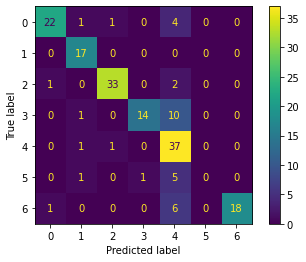

In [ ]:
poly_accuracy = accuracy_score(y_test_int, poly_pred)
poly_f1 = f1_score(y_test_int, poly_pred, average='weighted')
poly_precision = precision_score(y_test_int, poly_pred, average='weighted')
poly_recall = recall_score(y_test_int, poly_pred, average='weighted')
print('Accuracy (Polynomial Kernel): ', "%.2f" % (poly_accuracy*100))
print('F1 (Polynomial Kernel): ', "%.2f" % (poly_f1*100))
plot_confusion_matrix(poly, X_test_ML, y_test_int)
poly_score = [poly_accuracy,poly_f1,poly_precision,poly_recall]

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (RBF Kernel):  55.93
F1 (RBF Kernel):  52.98


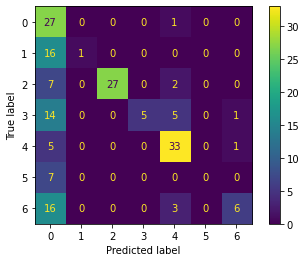

In [ ]:
rbf_accuracy = accuracy_score(y_test_int, rbf_pred)
rbf_f1 = f1_score(y_test_int, rbf_pred, average='weighted')
rbf_precision = precision_score(y_test_int, rbf_pred, average='weighted')
rbf_recall = recall_score(y_test_int, rbf_pred, average='weighted')
print('Accuracy (RBF Kernel): ', "%.2f" % (rbf_accuracy*100))
print('F1 (RBF Kernel): ', "%.2f" % (rbf_f1*100))
plot_confusion_matrix(rbf, X_test_ML, y_test_int)
rbf_score = [rbf_accuracy,rbf_f1,rbf_precision,rbf_recall]

## NB

In [ ]:
from sklearn.naive_bayes import GaussianNB
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
gnb = GaussianNB()
gnb_pred = gnb.fit(X_train_ML, y_train_int).predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (GNB):  70.62
F1 (GNB):  70.89


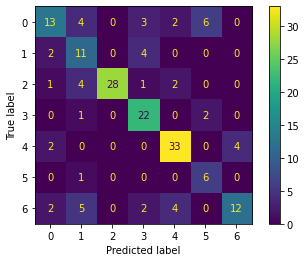

In [ ]:
gnb_accuracy = accuracy_score(y_test_int, gnb_pred)
gnb_f1 = f1_score(y_test_int, gnb_pred, average='weighted')
gnb_precision = precision_score(y_test_int, gnb_pred, average='weighted')
gnb_recall = recall_score(y_test_int, gnb_pred, average='weighted')
print('Accuracy (GNB): ', "%.2f" % (gnb_accuracy*100))
print('F1 (GNB): ', "%.2f" % (gnb_f1*100))
plot_confusion_matrix(gnb, X_test_ML, y_test_int)
gnb_score = [gnb_accuracy,gnb_f1,gnb_precision,gnb_recall]

## K-NN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5)
knn_pred = knn.fit(X_train_ML, y_train_int).predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (KNN):  90.40
F1 (KNN):  90.48


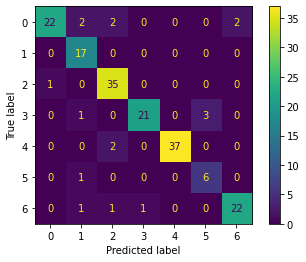

In [ ]:
knn_accuracy = accuracy_score(y_test_int, knn_pred)
knn_f1 = f1_score(y_test_int, knn_pred, average='weighted')
knn_precision = precision_score(y_test_int, knn_pred, average='weighted')
knn_recall = recall_score(y_test_int, knn_pred, average='weighted')
print('Accuracy (KNN): ', "%.2f" % (knn_accuracy*100))
print('F1 (KNN): ', "%.2f" % (knn_f1*100))
plot_confusion_matrix(knn, X_test_ML, y_test_int)
knn_score = [knn_accuracy,knn_f1,knn_precision,knn_recall]

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_ML, y_train_int)
rf_pred = rf_classifier.predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


Accuracy (RF):  91.53
F1 (RF):  91.88


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


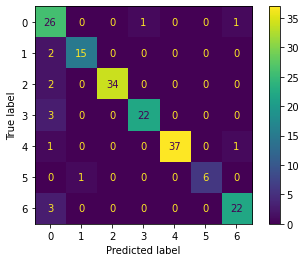

In [ ]:
rf_accuracy = accuracy_score(y_test_int, rf_pred)
rf_f1 = f1_score(y_test_int, rf_pred, average='weighted')
rf_precision = precision_score(y_test_int, rf_pred, average='weighted')
rf_recall = recall_score(y_test_int, rf_pred, average='weighted')
print('Accuracy (RF): ', "%.2f" % (rf_accuracy*100))
print('F1 (RF): ', "%.2f" % (rf_f1*100))
plot_confusion_matrix(rf_classifier, X_test_ML, y_test_int)
rf_score = [rf_accuracy,rf_f1,rf_precision,rf_recall]

## CNN

In [ ]:
!pip install plot_keras_history

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 321 kB 4.3 MB/s 
  Created wheel for plot-keras-history: filename=plot_keras_history-1.1.37-py3-none-any.whl size=9408 sha256=1ca548cd42982a30c21bcca1790188974faa178e41c398e95863279a64c562dd
  Stored in directory: /root/.cache/pip/wheels/72/91/3c/9306e573b56b6ea00e7d37c2286d51d1f8f2d7b1b078bf3399
  Created wheel for sanitize-ml-labels: filename=sanitize_ml_labels-1.0.49-py3-none-any.whl size=320403 sha256=3c131cbefe533a9fba79f786f33e42a162bac111079477049d63716cd0b49fb1
  Stored in directory: /root/.cache/pip/wheels/f6/0a/7a/c00024468dd987395ee9bd54d293f6cc31f58da13dc2cfc5fc
  Created wheel for support-developer: filename=support_developer-1.0.4-py3-none-any.whl size=5067 sha256=e4426687a9b6c5f61f8eab546545a9f5dfaf0f962c0376f3a77c721e5a8e6c5a
  Stored in directory: /root/.cache/pip/wheels/e7/9d/c8/1209cb780a301c5181e3da11b8b4e161d30d034c6370b995ce
  

In [ ]:
import pandas as pd
import numpy as np

from keras import layers, Input
from keras.models import Sequential
from keras.preprocessing.text import Tokenizer, one_hot
from keras_preprocessing.sequence import pad_sequences
from keras.layers import Embedding, Conv1D, GlobalMaxPooling1D,Reshape, Dense, Dropout, Flatten, MaxPooling1D, Input, Concatenate
from keras.models import load_model

from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
#from sklearn.externals import joblib

import matplotlib.pyplot as plt
from plot_keras_history import plot_history

In [ ]:
model = Sequential()
model.add(Conv1D(512, 3, activation='relu', input_shape=(maxlen[0],maxlen[1])))
model.add(GlobalMaxPooling1D())
model.add(Dense(kclass, activation='softmax'))
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 48, 512)           1180160   
                                                                 
 global_max_pooling1d (Globa  (None, 512)              0         
 lMaxPooling1D)                                                  
                                                                 
 dense (Dense)               (None, 7)                 3591      
                                                                 
Total params: 1,183,751
Trainable params: 1,183,751
Non-trainable params: 0
_________________________________________________________________


Epoch 1/25
12/12 [==============================] - 5s 371ms/step - loss: 1.5307 - accuracy: 0.6454 - val_loss: 0.4483 - val_accuracy: 0.8249
Epoch 2/25
12/12 [==============================] - 5s 460ms/step - loss: 0.1357 - accuracy: 0.9574 - val_loss: 0.1973 - val_accuracy: 0.9435
Epoch 3/25
12/12 [==============================] - 7s 561ms/step - loss: 0.0329 - accuracy: 0.9929 - val_loss: 0.1609 - val_accuracy: 0.9548
Epoch 4/25
12/12 [==============================] - 7s 597ms/step - loss: 0.0084 - accuracy: 0.9986 - val_loss: 0.1836 - val_accuracy: 0.9548
Epoch 5/25
12/12 [==============================] - 7s 582ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.1580 - val_accuracy: 0.9548
Epoch 6/25
12/12 [==============================] - 8s 669ms/step - loss: 0.0028 - accuracy: 1.0000 - val_loss: 0.1496 - val_accuracy: 0.9605
Epoch 7/25
12/12 [==============================] - 10s 855ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.1481 - val_accuracy: 0.9661
Epoch

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cfc9c2fd0>,
       dtype=object))

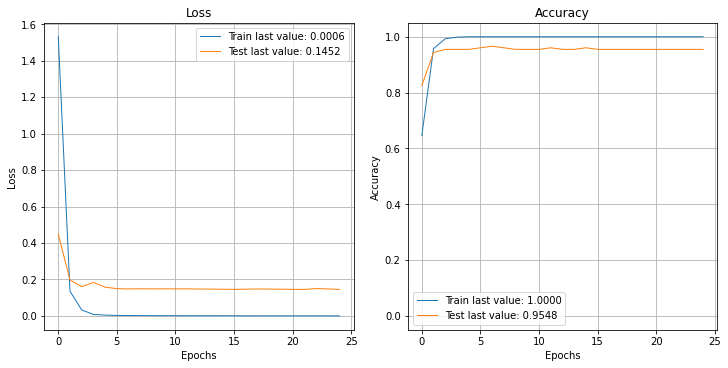

In [ ]:
#train the model

hist = model.fit(X_train, y_train_onehot,
                    class_weight = class_weights_d,
                    epochs=25,
                    verbose=True,
                    validation_data=(X_test, y_test_onehot),
                    batch_size=64).history

loss, accuracy = model.evaluate(X_train, y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_test, y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

cnn_accuracy = accuracy_score(y_test_int, y_prediction)
cnn_f1 = f1_score(y_test_int, y_prediction, average='weighted')
cnn_precision = precision_score(y_test_int, y_prediction, average='weighted')
cnn_recall = recall_score(y_test_int, y_prediction, average='weighted')
cnn_score = [cnn_accuracy,cnn_f1,cnn_precision,cnn_recall]

6/6 [==============================] - 0s 64ms/step
[[25  1  1  0  0  0  1]
 [ 1 16  0  0  0  0  0]
 [ 1  0 35  0  0  0  0]
 [ 0  1  0 24  0  0  0]
 [ 0  0  0  0 39  0  0]
 [ 0  1  0  0  0  6  0]
 [ 1  0  0  0  0  0 24]]


In [ ]:
model_dp = Sequential()
model_dp.add(Conv1D(512, 3, activation='relu', input_shape=(maxlen[0],maxlen[1])))
model_dp.add(GlobalMaxPooling1D())
model_dp.add(Dense(64, activation='relu'))
model_dp.add(Dropout(0.2))
model_dp.add(Dense(kclass, activation='softmax'))
model_dp.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_dp.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 48, 512)           1180160   
                                                                 
 global_max_pooling1d_1 (Glo  (None, 512)              0         
 balMaxPooling1D)                                                
                                                                 
 dense_1 (Dense)             (None, 64)                32832     
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 7)                 455       
                                                                 
Total params: 1,213,447
Trainable params: 1,213,447
Non-trainable params: 0
____________________________________________

Epoch 1/25
12/12 [==============================] - 5s 368ms/step - loss: 1.6788 - accuracy: 0.4156 - val_loss: 0.8406 - val_accuracy: 0.6949
Epoch 2/25
12/12 [==============================] - 6s 478ms/step - loss: 0.6686 - accuracy: 0.7830 - val_loss: 0.4030 - val_accuracy: 0.8644
Epoch 3/25
12/12 [==============================] - 7s 587ms/step - loss: 0.3528 - accuracy: 0.8851 - val_loss: 0.3846 - val_accuracy: 0.8475
Epoch 4/25
12/12 [==============================] - 7s 560ms/step - loss: 0.2442 - accuracy: 0.9362 - val_loss: 0.2011 - val_accuracy: 0.9266
Epoch 5/25
12/12 [==============================] - 7s 598ms/step - loss: 0.1287 - accuracy: 0.9674 - val_loss: 0.1417 - val_accuracy: 0.9435
Epoch 6/25
12/12 [==============================] - 6s 537ms/step - loss: 0.0941 - accuracy: 0.9801 - val_loss: 0.1272 - val_accuracy: 0.9605
Epoch 7/25
12/12 [==============================] - 6s 522ms/step - loss: 0.0808 - accuracy: 0.9801 - val_loss: 0.1506 - val_accuracy: 0.9492
Epoch 

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cffe88950>,
       dtype=object))

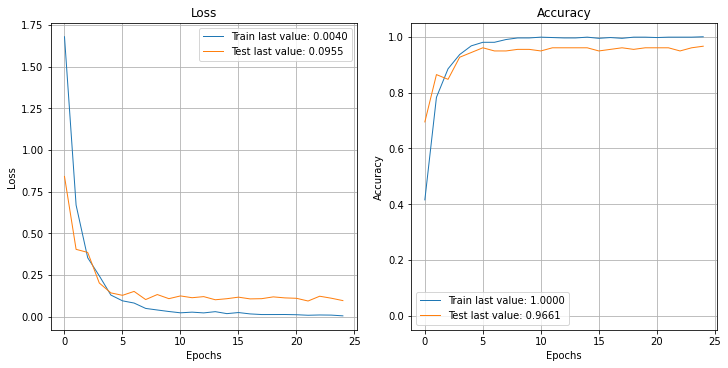

In [ ]:
hist_dp = model_dp.fit(X_train, y_train_onehot,
                    class_weight = class_weights_d,
                    epochs=25,
                    verbose=True,
                    validation_data=(X_test, y_test_onehot),
                    batch_size=64).history

loss, accuracy = model_dp.evaluate(X_train, y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model_dp.evaluate(X_test, y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist_dp)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model_dp.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

cnn_dp_accuracy = accuracy_score(y_test_int, y_prediction)
cnn_dp_f1 = f1_score(y_test_int, y_prediction, average='weighted')
cnn_dp_precision = precision_score(y_test_int, y_prediction, average='weighted')
cnn_dp_recall = recall_score(y_test_int, y_prediction, average='weighted')
cnn_dp_score = [cnn_dp_accuracy,cnn_dp_f1,cnn_dp_precision,cnn_dp_recall]

6/6 [==============================] - 0s 69ms/step
[[26  1  0  1  0  0  0]
 [ 0 17  0  0  0  0  0]
 [ 1  0 35  0  0  0  0]
 [ 0  1  0 24  0  0  0]
 [ 0  0  0  0 39  0  0]
 [ 0  1  0  0  0  6  0]
 [ 1  0  0  0  0  0 24]]


In [ ]:
##Deep CNN 
# define the model
from keras.layers import concatenate
from keras import Model

def define_model(length):
	# channel 1
	inputs1 = Input(shape=(length[0],length[1]))
	conv1 = Conv1D(filters=128, kernel_size=2, activation='relu')(inputs1)
	drop1 = Dropout(0.2)(conv1)
	pool1 = MaxPooling1D(pool_size=2)(drop1)
	flat1 = Flatten()(pool1)
	# channel 2
	inputs2 = Input(shape=(length[0],length[1]))
	conv2 = Conv1D(filters=128, kernel_size=3, activation='relu')(inputs2)
	drop2 = Dropout(0.2)(conv2)
	pool2 = MaxPooling1D(pool_size=2)(drop2)
	flat2 = Flatten()(pool2)
	# channel 3
	inputs3 = Input(shape=(length[0],length[1]))
	conv3 = Conv1D(filters=128, kernel_size=5, activation='relu')(inputs3)
	drop3 = Dropout(0.2)(conv3)
	pool3 = MaxPooling1D(pool_size=2)(drop3)
	flat3 = Flatten()(pool3)
	# merge
	merged = concatenate([flat1, flat2, flat3])
	# interpretation
	dense1 = Dense(64, activation='relu')(merged)
	outputs = Dense(kclass, activation='softmax')(dense1)
	model = Model(inputs=[inputs1, inputs2, inputs3], outputs=outputs)
	# compile
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
	# summarize
	print(model.summary())
	return model

model_deep = define_model(maxlen)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 50, 768)]    0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 50, 768)]    0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 50, 768)]    0           []                               
                                                                                                  
 conv1d_2 (Conv1D)              (None, 49, 128)      196736      ['input_1[0][0]']                
                                                                                              

Epoch 1/25
12/12 [==============================] - 5s 355ms/step - loss: 1.3498 - accuracy: 0.4695 - val_loss: 0.8903 - val_accuracy: 0.7627
Epoch 2/25
12/12 [==============================] - 4s 321ms/step - loss: 0.4080 - accuracy: 0.8553 - val_loss: 0.6909 - val_accuracy: 0.8249
Epoch 3/25
12/12 [==============================] - 4s 324ms/step - loss: 0.1580 - accuracy: 0.9546 - val_loss: 0.4131 - val_accuracy: 0.8870
Epoch 4/25
12/12 [==============================] - 4s 320ms/step - loss: 0.0984 - accuracy: 0.9702 - val_loss: 0.6714 - val_accuracy: 0.8418
Epoch 5/25
12/12 [==============================] - 4s 320ms/step - loss: 0.1050 - accuracy: 0.9660 - val_loss: 0.3637 - val_accuracy: 0.9096
Epoch 6/25
12/12 [==============================] - 4s 323ms/step - loss: 0.0343 - accuracy: 0.9957 - val_loss: 0.3866 - val_accuracy: 0.9266
Epoch 7/25
12/12 [==============================] - 4s 323ms/step - loss: 0.0192 - accuracy: 0.9943 - val_loss: 0.3835 - val_accuracy: 0.9096
Epoch 

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cffa24390>,
       dtype=object))

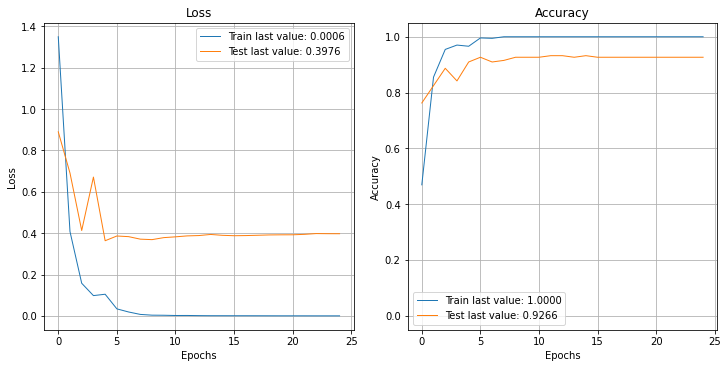

In [ ]:
#train the model

hist_deep = model_deep.fit([X_train,X_train,X_train], y_train_onehot,
                    class_weight = class_weights_d,
                    epochs=25,
                    verbose=True,
                    validation_data=([X_test,X_test,X_test], y_test_onehot),
                    batch_size=64).history

loss, accuracy = model_deep.evaluate([X_train,X_train,X_train], y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model_deep.evaluate([X_test,X_test,X_test], y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist_deep)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model_deep.predict([X_test,X_test,X_test])
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

cnn_deep_accuracy = accuracy_score(y_test_int, y_prediction)
cnn_deep_f1 = f1_score(y_test_int, y_prediction, average='weighted')
cnn_deep_precision = precision_score(y_test_int, y_prediction, average='weighted')
cnn_deep_recall = recall_score(y_test_int, y_prediction, average='weighted')
cnn_deep_score = [cnn_deep_accuracy,cnn_deep_f1,cnn_deep_precision,cnn_deep_recall]

6/6 [==============================] - 1s 62ms/step
[[24  0  1  0  0  0  3]
 [ 2 15  0  0  0  0  0]
 [ 0  1 35  0  0  0  0]
 [ 0  1  0 24  0  0  0]
 [ 2  0  1  0 36  0  0]
 [ 1  0  0  0  0  6  0]
 [ 1  0  0  0  0  0 24]]


## BiLSTM

In [ ]:
from __future__ import print_function
import numpy as np

from keras.preprocessing import sequence
from keras.models import Sequential
from keras_preprocessing.sequence import pad_sequences
from keras.layers import Dense, Dropout, Embedding, LSTM, Bidirectional
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
import pandas as pd
from keras.preprocessing.text import Tokenizer, one_hot
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from plot_keras_history import plot_history


In [ ]:
#Define the BiLSTM model with output Dropout
##############################################
model_out_dp = Sequential()
model_out_dp.add(Bidirectional(LSTM(64),input_shape=(maxlen[0],maxlen[1])))
#output Dropout
model_out_dp.add(Dropout(0.2))
model_out_dp.add(Dense(kclass, activation='softmax'))

# try using different optimizers and different optimizer configs
model_out_dp.compile('adam', 'categorical_crossentropy', metrics=['accuracy'])
model_out_dp.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 128)              426496    
 l)                                                              
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 7)                 903       
                                                                 
Total params: 427,399
Trainable params: 427,399
Non-trainable params: 0
_________________________________________________________________


Train...
Epoch 1/25
12/12 [==============================] - 9s 321ms/step - loss: 1.5687 - accuracy: 0.4894 - val_loss: 0.8819 - val_accuracy: 0.8701
Epoch 2/25
12/12 [==============================] - 3s 226ms/step - loss: 0.7257 - accuracy: 0.8525 - val_loss: 0.5045 - val_accuracy: 0.8983
Epoch 3/25
12/12 [==============================] - 3s 227ms/step - loss: 0.3381 - accuracy: 0.9135 - val_loss: 0.2890 - val_accuracy: 0.9322
Epoch 4/25
12/12 [==============================] - 3s 229ms/step - loss: 0.1910 - accuracy: 0.9560 - val_loss: 0.2750 - val_accuracy: 0.9153
Epoch 5/25
12/12 [==============================] - 3s 224ms/step - loss: 0.1081 - accuracy: 0.9773 - val_loss: 0.2070 - val_accuracy: 0.9322
Epoch 6/25
12/12 [==============================] - 3s 223ms/step - loss: 0.0647 - accuracy: 0.9929 - val_loss: 0.1926 - val_accuracy: 0.9322
Epoch 7/25
12/12 [==============================] - 3s 224ms/step - loss: 0.0470 - accuracy: 0.9957 - val_loss: 0.2352 - val_accuracy: 0.93

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cfc09e590>,
       dtype=object))

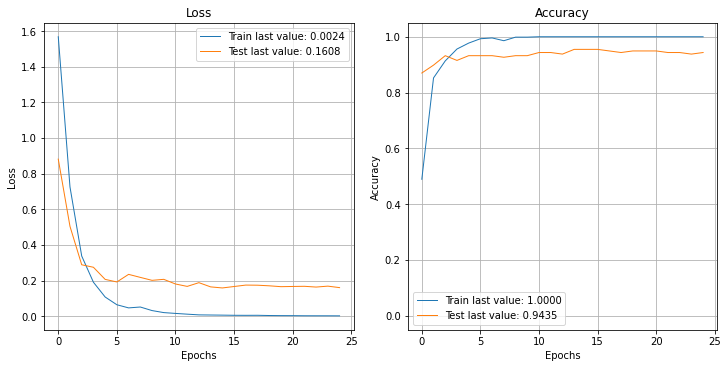

In [ ]:
#Train the model
batch_size = 64

print('Train...')
hist_out_dp = model_out_dp.fit(X_train, y_train_onehot,
          class_weight = class_weights_d,
          batch_size=batch_size,
          epochs=25,
          validation_data=[X_test, y_test_onehot]).history

loss, accuracy = model_out_dp.evaluate(X_train, y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model_out_dp.evaluate(X_test, y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist_out_dp)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model_out_dp.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

bilstm_accuracy = accuracy_score(y_test_int, y_prediction)
bilstm_f1 = f1_score(y_test_int, y_prediction, average='weighted')
bilstm_precision = precision_score(y_test_int, y_prediction, average='weighted')
bilstm_recall = recall_score(y_test_int, y_prediction, average='weighted')
bilstm_score = [bilstm_accuracy,bilstm_f1,bilstm_precision,bilstm_recall]

6/6 [==============================] - 1s 56ms/step
[[25  0  0  1  0  0  2]
 [ 0 17  0  0  0  0  0]
 [ 1  0 35  0  0  0  0]
 [ 0  1  0 23  0  1  0]
 [ 0  1  0  0 38  0  0]
 [ 0  1  0  0  0  6  0]
 [ 2  0  0  0  0  0 23]]


## Results summary

In [ ]:
import pandas as pd

model_names = ['poly','rbf','GNB','K-NN','RF','CNN','CNN-dp','CNN-deep','BiLSTM']
metric_names = ['Accuracy','F1-score','Precision','Recall']
model_num = len(model_names)

results_list = [poly_score,rbf_score,gnb_score,knn_score,rf_score,cnn_score,cnn_dp_score,cnn_deep_score,bilstm_score]

data = pd.DataFrame(results_list, index = model_names, columns = metric_names)
data

,Accuracy,F1-score,Precision,Recall
poly,0.796610,0.784278,0.814981,0.796610
rbf,0.559322,0.529844,0.758290,0.559322
GNB,0.706215,0.708880,0.744181,0.706215
K-NN,0.903955,0.904793,0.914497,0.903955
RF,0.915254,0.918796,0.929056,0.915254
CNN,0.954802,0.955155,0.956586,0.954802
CNN-dp,0.966102,0.966474,0.968644,0.966102
CNN-deep,0.926554,0.927465,0.930374,0.926554
BiLSTM,0.943503,0.943941,0.945810,0.943503


# GLOVE embeddings

In [ ]:
maxlen = [50,100]

X_train = np.zeros([train_num,maxlen[0],maxlen[1]])
X_test = np.zeros([test_num,maxlen[0],maxlen[1]])


#tokenization
tokenizer = Tokenizer()
tokenizer.fit_on_texts(text_train)
text_train1 = tokenizer.texts_to_sequences(text_train)
text_test1 = tokenizer.texts_to_sequences(text_test)

word_index = tokenizer.word_index
vocab_size = len(word_index) + 1  # Adding 1 because of reserved 0 index
print('vocabubary size:',vocab_size)

#embedding dimension should align with the GLOVE
embedding_dim = 100
vocab_size = len(word_index) + 1

GLOVE_6B_100D_PATH ="drive/MyDrive/ISS/PLP TPML/Day2/glove.6B.100d.txt"
encoding="utf-8"
with open(GLOVE_6B_100D_PATH, "rb") as lines:
    embeddings_index = {line.split()[0].decode(encoding): np.array(line.split()[1:],dtype=np.float32)
               for line in lines}

# Prepare embedding matrix from pre-trained model
embedding_matrix = np.zeros((len(word_index) + 1, embedding_dim))

for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector

# Check % words with embeddings 
nonzero_elements = np.count_nonzero(np.count_nonzero(embedding_matrix, axis=1))
print(nonzero_elements / vocab_size)   

for i,v in enumerate(text_train1):
  for k,ind in enumerate(v):
    X_train[i,k,:] = embedding_matrix[ind]

for i,v in enumerate(text_test1):
  for k,ind in enumerate(v):
    X_test[i,k,:] = embedding_matrix[ind]

print(X_train.shape)
print(X_test.shape)

vocabubary size: 1579
0.8923369221025966
(705, 50, 100)
(177, 50, 100)


In [ ]:
X_train_ML = np.mean(X_train, axis=1)
X_test_ML = np.mean(X_test, axis=1)

print(X_train_ML.shape)
print(X_test_ML.shape)

(705, 100)
(177, 100)


# Build Classifier with GloVe embeddings

## SVM

In [ ]:
from sklearn import svm
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
rbf = svm.SVC(kernel='rbf', gamma=0.5, C=0.1).fit(X_train_ML, y_train_int)
poly = svm.SVC(kernel='poly', degree=3, C=1).fit(X_train_ML, y_train_int)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
poly_pred = poly.predict(X_test_ML)
rbf_pred = rbf.predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (Polynomial Kernel):  66.67
F1 (Polynomial Kernel):  66.19


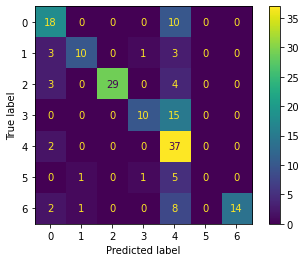

In [ ]:
poly_accuracy = accuracy_score(y_test_int, poly_pred)
poly_f1 = f1_score(y_test_int, poly_pred, average='weighted')
poly_precision = precision_score(y_test_int, poly_pred, average='weighted')
poly_recall = recall_score(y_test_int, poly_pred, average='weighted')
print('Accuracy (Polynomial Kernel): ', "%.2f" % (poly_accuracy*100))
print('F1 (Polynomial Kernel): ', "%.2f" % (poly_f1*100))
plot_confusion_matrix(poly, X_test_ML, y_test_int)
poly_score = [poly_accuracy,poly_f1,poly_precision,poly_recall]

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (RBF Kernel):  33.90
F1 (RBF Kernel):  20.48


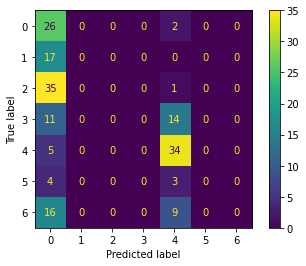

In [ ]:
rbf_accuracy = accuracy_score(y_test_int, rbf_pred)
rbf_f1 = f1_score(y_test_int, rbf_pred, average='weighted')
rbf_precision = precision_score(y_test_int, rbf_pred, average='weighted')
rbf_recall = recall_score(y_test_int, rbf_pred, average='weighted')
print('Accuracy (RBF Kernel): ', "%.2f" % (rbf_accuracy*100))
print('F1 (RBF Kernel): ', "%.2f" % (rbf_f1*100))
plot_confusion_matrix(rbf, X_test_ML, y_test_int)
rbf_score = [rbf_accuracy,rbf_f1,rbf_precision,rbf_recall]

## NB

In [ ]:
from sklearn.naive_bayes import GaussianNB
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
gnb = GaussianNB()
gnb_pred = gnb.fit(X_train_ML, y_train_int).predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (GNB):  73.45
F1 (GNB):  72.71


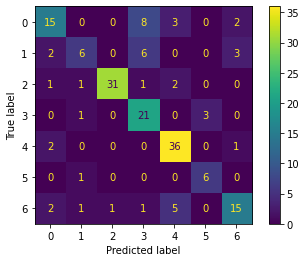

In [ ]:
gnb_accuracy = accuracy_score(y_test_int, gnb_pred)
gnb_f1 = f1_score(y_test_int, gnb_pred, average='weighted')
gnb_precision = precision_score(y_test_int, gnb_pred, average='weighted')
gnb_recall = recall_score(y_test_int, gnb_pred, average='weighted')
print('Accuracy (GNB): ', "%.2f" % (gnb_accuracy*100))
print('F1 (GNB): ', "%.2f" % (gnb_f1*100))
plot_confusion_matrix(gnb, X_test_ML, y_test_int)
gnb_score = [gnb_accuracy,gnb_f1,gnb_precision,gnb_recall]

## K-NN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5)
knn_pred = knn.fit(X_train_ML, y_train_int).predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


Accuracy (KNN):  85.31
F1 (KNN):  84.76


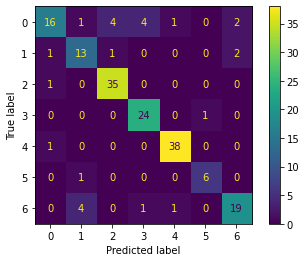

In [ ]:
knn_accuracy = accuracy_score(y_test_int, knn_pred)
knn_f1 = f1_score(y_test_int, knn_pred, average='weighted')
knn_precision = precision_score(y_test_int, knn_pred, average='weighted')
knn_recall = recall_score(y_test_int, knn_pred, average='weighted')
print('Accuracy (KNN): ', "%.2f" % (knn_accuracy*100))
print('F1 (KNN): ', "%.2f" % (knn_f1*100))
plot_confusion_matrix(knn, X_test_ML, y_test_int)
knn_score = [knn_accuracy,knn_f1,knn_precision,knn_recall]

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_ML, y_train_int)
rf_pred = rf_classifier.predict(X_test_ML)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


Accuracy (RF):  91.53
F1 (RF):  91.61


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


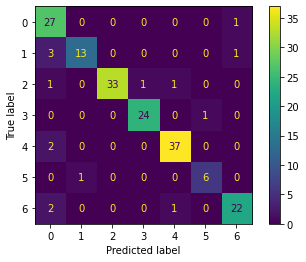

In [ ]:
rf_accuracy = accuracy_score(y_test_int, rf_pred)
rf_f1 = f1_score(y_test_int, rf_pred, average='weighted')
rf_precision = precision_score(y_test_int, rf_pred, average='weighted')
rf_recall = recall_score(y_test_int, rf_pred, average='weighted')
print('Accuracy (RF): ', "%.2f" % (rf_accuracy*100))
print('F1 (RF): ', "%.2f" % (rf_f1*100))
plot_confusion_matrix(rf_classifier, X_test_ML, y_test_int)
rf_score = [rf_accuracy,rf_f1,rf_precision,rf_recall]

## CNN

In [ ]:
!pip install plot_keras_history

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np

from keras import layers, Input
from keras.models import Sequential
from keras.preprocessing.text import Tokenizer, one_hot
from keras_preprocessing.sequence import pad_sequences
from keras.layers import Embedding, Conv1D, GlobalMaxPooling1D,Reshape, Dense, Dropout, Flatten, MaxPooling1D, Input, Concatenate
from keras.models import load_model

from numpy import array
from numpy import argmax
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
#from sklearn.externals import joblib

import matplotlib.pyplot as plt
from plot_keras_history import plot_history

In [ ]:
model = Sequential()
model.add(Conv1D(512, 3, activation='relu', input_shape=(maxlen[0],maxlen[1])))
model.add(GlobalMaxPooling1D())
model.add(Dense(kclass, activation='softmax'))
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_5 (Conv1D)           (None, 48, 512)           154112    
                                                                 
 global_max_pooling1d_2 (Glo  (None, 512)              0         
 balMaxPooling1D)                                                
                                                                 
 dense_6 (Dense)             (None, 7)                 3591      
                                                                 
Total params: 157,703
Trainable params: 157,703
Non-trainable params: 0
_________________________________________________________________


Epoch 1/25
12/12 [==============================] - 2s 101ms/step - loss: 1.4156 - accuracy: 0.5745 - val_loss: 0.7433 - val_accuracy: 0.8192
Epoch 2/25
12/12 [==============================] - 1s 64ms/step - loss: 0.4911 - accuracy: 0.9149 - val_loss: 0.4399 - val_accuracy: 0.8418
Epoch 3/25
12/12 [==============================] - 1s 72ms/step - loss: 0.2480 - accuracy: 0.9489 - val_loss: 0.3180 - val_accuracy: 0.9096
Epoch 4/25
12/12 [==============================] - 1s 69ms/step - loss: 0.1505 - accuracy: 0.9716 - val_loss: 0.2646 - val_accuracy: 0.9153
Epoch 5/25
12/12 [==============================] - 1s 64ms/step - loss: 0.1111 - accuracy: 0.9872 - val_loss: 0.2423 - val_accuracy: 0.9379
Epoch 6/25
12/12 [==============================] - 1s 64ms/step - loss: 0.0769 - accuracy: 0.9943 - val_loss: 0.2268 - val_accuracy: 0.9266
Epoch 7/25
12/12 [==============================] - 1s 78ms/step - loss: 0.0567 - accuracy: 1.0000 - val_loss: 0.2078 - val_accuracy: 0.9209
Epoch 8/25
1

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cf774d350>,
       dtype=object))

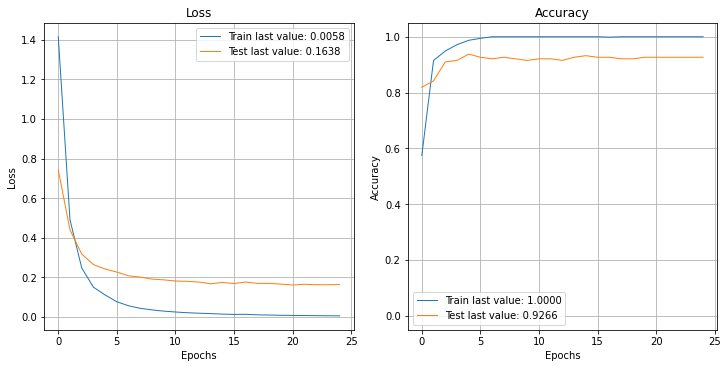

In [ ]:
#train the model

hist = model.fit(X_train, y_train_onehot,
                    class_weight = class_weights_d,
                    epochs=25,
                    verbose=True,
                    validation_data=(X_test, y_test_onehot),
                    batch_size=64).history

loss, accuracy = model.evaluate(X_train, y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model.evaluate(X_test, y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

cnn_accuracy = accuracy_score(y_test_int, y_prediction)
cnn_f1 = f1_score(y_test_int, y_prediction, average='weighted')
cnn_precision = precision_score(y_test_int, y_prediction, average='weighted')
cnn_recall = recall_score(y_test_int, y_prediction, average='weighted')
cnn_score = [cnn_accuracy,cnn_f1,cnn_precision,cnn_recall]

6/6 [==============================] - 0s 32ms/step
[[26  0  0  1  0  0  1]
 [ 3 12  0  1  0  0  1]
 [ 0  0 36  0  0  0  0]
 [ 1  0  0 23  0  1  0]
 [ 1  0  0  0 38  0  0]
 [ 0  1  0  0  0  6  0]
 [ 1  1  0  0  0  0 23]]


In [ ]:
model_dp = Sequential()
model_dp.add(Conv1D(512, 3, activation='relu', input_shape=(maxlen[0],maxlen[1])))
model_dp.add(GlobalMaxPooling1D())
model_dp.add(Dense(64, activation='relu'))
model_dp.add(Dropout(0.2))
model_dp.add(Dense(kclass, activation='softmax'))
model_dp.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_dp.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 48, 512)           154112    
                                                                 
 global_max_pooling1d_3 (Glo  (None, 512)              0         
 balMaxPooling1D)                                                
                                                                 
 dense_7 (Dense)             (None, 64)                32832     
                                                                 
 dropout_5 (Dropout)         (None, 64)                0         
                                                                 
 dense_8 (Dense)             (None, 7)                 455       
                                                                 
Total params: 187,399
Trainable params: 187,399
Non-trainable params: 0
________________________________________________

Epoch 1/25
12/12 [==============================] - 2s 80ms/step - loss: 1.5443 - accuracy: 0.4894 - val_loss: 0.8865 - val_accuracy: 0.8644
Epoch 2/25
12/12 [==============================] - 1s 75ms/step - loss: 0.6656 - accuracy: 0.8511 - val_loss: 0.4299 - val_accuracy: 0.8814
Epoch 3/25
12/12 [==============================] - 1s 70ms/step - loss: 0.3569 - accuracy: 0.9163 - val_loss: 0.3120 - val_accuracy: 0.8927
Epoch 4/25
12/12 [==============================] - 1s 65ms/step - loss: 0.2212 - accuracy: 0.9404 - val_loss: 0.2799 - val_accuracy: 0.8983
Epoch 5/25
12/12 [==============================] - 1s 64ms/step - loss: 0.1449 - accuracy: 0.9617 - val_loss: 0.2541 - val_accuracy: 0.9266
Epoch 6/25
12/12 [==============================] - 1s 64ms/step - loss: 0.1025 - accuracy: 0.9887 - val_loss: 0.2428 - val_accuracy: 0.9266
Epoch 7/25
12/12 [==============================] - 1s 113ms/step - loss: 0.0766 - accuracy: 0.9872 - val_loss: 0.1980 - val_accuracy: 0.9209
Epoch 8/25
1

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cfd4d2950>,
       dtype=object))

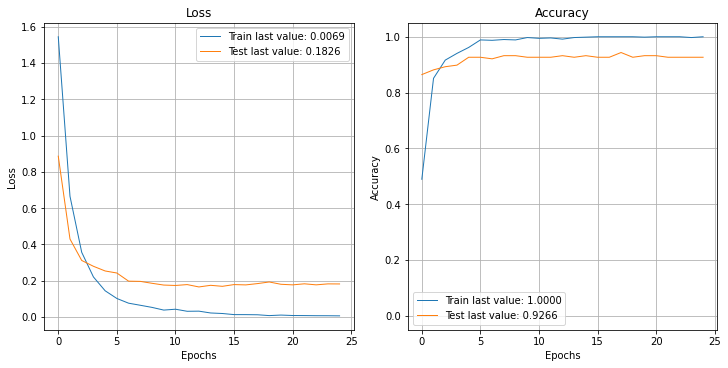

In [ ]:
hist_dp = model_dp.fit(X_train, y_train_onehot,
                    class_weight = class_weights_d,
                    epochs=25,
                    verbose=True,
                    validation_data=(X_test, y_test_onehot),
                    batch_size=64).history

loss, accuracy = model_dp.evaluate(X_train, y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model_dp.evaluate(X_test, y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist_dp)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model_dp.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

cnn_dp_accuracy = accuracy_score(y_test_int, y_prediction)
cnn_dp_f1 = f1_score(y_test_int, y_prediction, average='weighted')
cnn_dp_precision = precision_score(y_test_int, y_prediction, average='weighted')
cnn_dp_recall = recall_score(y_test_int, y_prediction, average='weighted')
cnn_dp_score = [cnn_dp_accuracy,cnn_dp_f1,cnn_dp_precision,cnn_dp_recall]

6/6 [==============================] - 0s 30ms/step
[[26  0  0  1  0  0  1]
 [ 3 11  0  1  0  0  2]
 [ 0  0 36  0  0  0  0]
 [ 0  0  0 23  0  2  0]
 [ 1  0  0  0 38  0  0]
 [ 0  0  0  0  0  7  0]
 [ 2  0  0  0  0  0 23]]


In [ ]:
#model_dp.save("gqlmodel.h5",save_format='h5')

In [ ]:
##Deep CNN 
# define the model
from keras.layers import concatenate
from keras import Model

def define_model(length):
	# channel 1
	inputs1 = Input(shape=(length[0],length[1]))
	conv1 = Conv1D(filters=128, kernel_size=2, activation='relu')(inputs1)
	drop1 = Dropout(0.2)(conv1)
	pool1 = MaxPooling1D(pool_size=2)(drop1)
	flat1 = Flatten()(pool1)
	# channel 2
	inputs2 = Input(shape=(length[0],length[1]))
	conv2 = Conv1D(filters=128, kernel_size=3, activation='relu')(inputs2)
	drop2 = Dropout(0.2)(conv2)
	pool2 = MaxPooling1D(pool_size=2)(drop2)
	flat2 = Flatten()(pool2)
	# channel 3
	inputs3 = Input(shape=(length[0],length[1]))
	conv3 = Conv1D(filters=128, kernel_size=5, activation='relu')(inputs3)
	drop3 = Dropout(0.2)(conv3)
	pool3 = MaxPooling1D(pool_size=2)(drop3)
	flat3 = Flatten()(pool3)
	# merge
	merged = concatenate([flat1, flat2, flat3])
	# interpretation
	dense1 = Dense(64, activation='relu')(merged)
	outputs = Dense(kclass, activation='softmax')(dense1)
	model = Model(inputs=[inputs1, inputs2, inputs3], outputs=outputs)
	# compile
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
	# summarize
	print(model.summary())
	return model

model_deep = define_model(maxlen)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 50, 100)]    0           []                               
                                                                                                  
 input_5 (InputLayer)           [(None, 50, 100)]    0           []                               
                                                                                                  
 input_6 (InputLayer)           [(None, 50, 100)]    0           []                               
                                                                                                  
 conv1d_7 (Conv1D)              (None, 49, 128)      25728       ['input_4[0][0]']                
                                                                                            

Epoch 1/25
12/12 [==============================] - 3s 180ms/step - loss: 1.4506 - accuracy: 0.4766 - val_loss: 1.1174 - val_accuracy: 0.6271
Epoch 2/25
12/12 [==============================] - 2s 166ms/step - loss: 0.6331 - accuracy: 0.8184 - val_loss: 0.6381 - val_accuracy: 0.8192
Epoch 3/25
12/12 [==============================] - 2s 162ms/step - loss: 0.2719 - accuracy: 0.9277 - val_loss: 0.5529 - val_accuracy: 0.8531
Epoch 4/25
12/12 [==============================] - 2s 166ms/step - loss: 0.1502 - accuracy: 0.9574 - val_loss: 0.5707 - val_accuracy: 0.8079
Epoch 5/25
12/12 [==============================] - 3s 230ms/step - loss: 0.1388 - accuracy: 0.9645 - val_loss: 0.5466 - val_accuracy: 0.8588
Epoch 6/25
12/12 [==============================] - 3s 245ms/step - loss: 0.0863 - accuracy: 0.9688 - val_loss: 0.4995 - val_accuracy: 0.8475
Epoch 7/25
12/12 [==============================] - 3s 232ms/step - loss: 0.0473 - accuracy: 0.9901 - val_loss: 0.4664 - val_accuracy: 0.8814
Epoch 

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4cfd103950>,
       dtype=object))

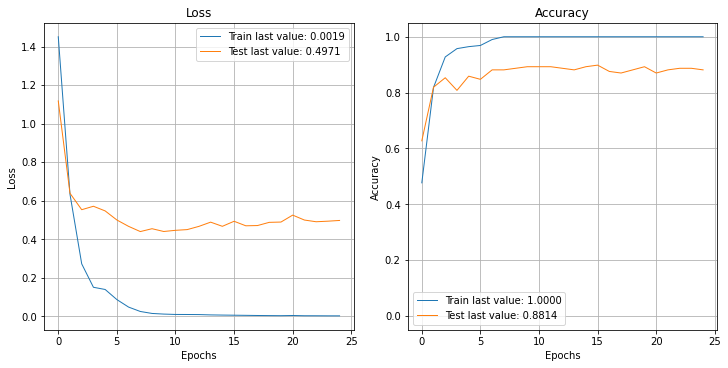

In [ ]:
#train the model

hist_deep = model_deep.fit([X_train,X_train,X_train], y_train_onehot,
                    class_weight = class_weights_d,
                    epochs=25,
                    verbose=True,
                    validation_data=([X_test,X_test,X_test], y_test_onehot),
                    batch_size=64).history

loss, accuracy = model_deep.evaluate([X_train,X_train,X_train], y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model_deep.evaluate([X_test,X_test,X_test], y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist_deep)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model_deep.predict([X_test,X_test,X_test])
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

cnn_deep_accuracy = accuracy_score(y_test_int, y_prediction)
cnn_deep_f1 = f1_score(y_test_int, y_prediction, average='weighted')
cnn_deep_precision = precision_score(y_test_int, y_prediction, average='weighted')
cnn_deep_recall = recall_score(y_test_int, y_prediction, average='weighted')
cnn_deep_score = [cnn_deep_accuracy,cnn_deep_f1,cnn_deep_precision,cnn_deep_recall]

6/6 [==============================] - 0s 14ms/step
[[24  1  0  2  0  0  1]
 [ 2  9  0  4  0  0  2]
 [ 1  0 35  0  0  0  0]
 [ 0  0  0 21  0  4  0]
 [ 1  0  0  0 38  0  0]
 [ 1  0  0  0  0  6  0]
 [ 1  0  0  1  0  0 23]]


## BiLSTM

In [ ]:
from __future__ import print_function
import numpy as np

from keras.preprocessing import sequence
from keras.models import Sequential
from keras_preprocessing.sequence import pad_sequences
from keras.layers import Dense, Dropout, Embedding, LSTM, Bidirectional
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
import pandas as pd
from keras.preprocessing.text import Tokenizer, one_hot
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from plot_keras_history import plot_history


In [ ]:
#Define the BiLSTM model with output Dropout
##############################################
model_out_dp = Sequential()
model_out_dp.add(Bidirectional(LSTM(64),input_shape=(maxlen[0],maxlen[1])))
#output Dropout
model_out_dp.add(Dropout(0.2))
model_out_dp.add(Dense(kclass, activation='softmax'))

# try using different optimizers and different optimizer configs
model_out_dp.compile('adam', 'categorical_crossentropy', metrics=['accuracy'])
model_out_dp.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_1 (Bidirectio  (None, 128)              84480     
 nal)                                                            
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 7)                 903       
                                                                 
Total params: 85,383
Trainable params: 85,383
Non-trainable params: 0
_________________________________________________________________


Train...
Epoch 1/25
12/12 [==============================] - 7s 192ms/step - loss: 1.8367 - accuracy: 0.3035 - val_loss: 1.6477 - val_accuracy: 0.7288
Epoch 2/25
12/12 [==============================] - 1s 96ms/step - loss: 1.5479 - accuracy: 0.6312 - val_loss: 1.2704 - val_accuracy: 0.7232
Epoch 3/25
12/12 [==============================] - 1s 98ms/step - loss: 1.0798 - accuracy: 0.6723 - val_loss: 0.9356 - val_accuracy: 0.7345
Epoch 4/25
12/12 [==============================] - 1s 98ms/step - loss: 0.7821 - accuracy: 0.7688 - val_loss: 0.6695 - val_accuracy: 0.8136
Epoch 5/25
12/12 [==============================] - 1s 100ms/step - loss: 0.6155 - accuracy: 0.8255 - val_loss: 0.6012 - val_accuracy: 0.8023
Epoch 6/25
12/12 [==============================] - 1s 97ms/step - loss: 0.4908 - accuracy: 0.8638 - val_loss: 0.5166 - val_accuracy: 0.8531
Epoch 7/25
12/12 [==============================] - 1s 98ms/step - loss: 0.4005 - accuracy: 0.8894 - val_loss: 0.4461 - val_accuracy: 0.8701
Ep

(<Figure size 720x360 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f4d05782c50>,
       dtype=object))

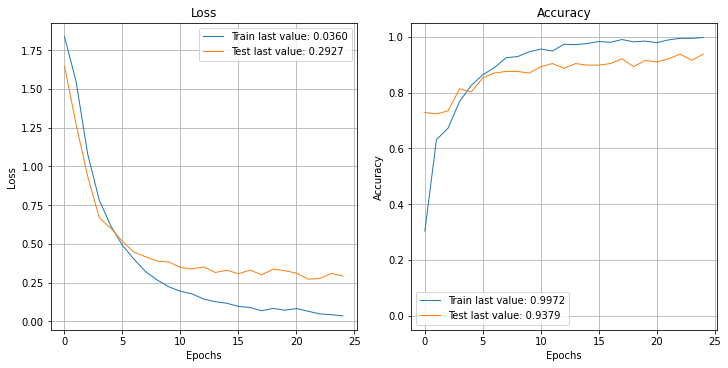

In [ ]:
#Train the model
batch_size = 64

print('Train...')
hist_out_dp = model_out_dp.fit(X_train, y_train_onehot,
          class_weight = class_weights_d,
          batch_size=batch_size,
          epochs=25,
          validation_data=[X_test, y_test_onehot]).history

loss, accuracy = model_out_dp.evaluate(X_train, y_train_onehot, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
loss, accuracy = model_out_dp.evaluate(X_test, y_test_onehot, verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
plot_history(hist_out_dp)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

#Predict
y_prediction = model_out_dp.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
#print(y_prediction)

#Create confusion matrix and normalizes it over predicted (columns)
confmat = confusion_matrix(y_test_int, y_prediction)
print(confmat)

bilstm_accuracy = accuracy_score(y_test_int, y_prediction)
bilstm_f1 = f1_score(y_test_int, y_prediction, average='weighted')
bilstm_precision = precision_score(y_test_int, y_prediction, average='weighted')
bilstm_recall = recall_score(y_test_int, y_prediction, average='weighted')
bilstm_score = [bilstm_accuracy,bilstm_f1,bilstm_precision,bilstm_recall]

6/6 [==============================] - 1s 18ms/step
[[26  0  1  1  0  0  0]
 [ 1 13  0  1  0  0  2]
 [ 1  0 35  0  0  0  0]
 [ 0  0  0 24  0  1  0]
 [ 1  0  0  0 38  0  0]
 [ 0  0  0  0  0  7  0]
 [ 0  1  0  0  1  0 23]]


## Results summary

In [ ]:
import pandas as pd

model_names = ['poly','rbf','GNB','K-NN','RF','CNN','CNN-dp','CNN-deep','BiLSTM']
metric_names = ['Accuracy','F1-score','Precision','Recall']
model_num = len(model_names)

results_list = [poly_score,rbf_score,gnb_score,knn_score,rf_score,cnn_score,cnn_dp_score,cnn_deep_score,bilstm_score]

data = pd.DataFrame(results_list, index = model_names, columns = metric_names)
data

,Accuracy,F1-score,Precision,Recall
poly,0.666667,0.661925,0.743489,0.666667
rbf,0.338983,0.204822,0.154992,0.338983
GNB,0.734463,0.727142,0.742377,0.734463
K-NN,0.853107,0.847641,0.853686,0.853107
RF,0.915254,0.916056,0.922612,0.915254
CNN,0.926554,0.926110,0.928370,0.926554
CNN-dp,0.926554,0.925375,0.933954,0.926554
CNN-deep,0.881356,0.880191,0.891330,0.881356
BiLSTM,0.937853,0.937089,0.938368,0.937853
